In [75]:
!pip install scikit-optimize

In [76]:
!pip install statsmodels

In [77]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from collections import Counter

import statsmodels.stats.api as sms
from matplotlib import style
style.use('seaborn')
%matplotlib inline
#graphs in svg look clearer
%config InlineBackend.figure_format = 'svg' 

In [78]:
import warnings
warnings.filterwarnings("ignore")

# Functions

In [79]:
from sklearn import metrics

def mae(y_gt, Y_pr):
    return metrics.mean_absolute_error(y_gt, Y_pr)

def mse(y_gt, Y_pr):
    return metrics.mean_squared_error(y_gt, Y_pr)

def rmse(y_gt, Y_pr):
    my_mse = mse(y_gt, Y_pr)
    return np.sqrt(my_mse)

def medae(y_gt, Y_pr):
    return metrics.median_absolute_error(y_gt, Y_pr)

def R2(y_gt, Y_pr):
    return metrics.r2_score(y_gt, Y_pr)

def calc_metrics(true, pred):

    mse1 = mse(true, pred)

    rmse1 = rmse(true, pred)

    mae1 = mae(true, pred)

    medae1 = medae(true, pred)

    R21 = R2(true, pred)

    print('*** VAL **: ')
    print("MSE:   {}\nRMSE:  {}\nR2:    {}\nMAE:   {}\nMedAE: {}".format(mse1, rmse1, R21, mae1, medae1))
    print('-'*30)

In [80]:
def target_distr_linear(train_label, test_label, predicted_dv): 
    sns.kdeplot(train_label, label='train')
    sns.kdeplot(test_label, label='test')
    sns.kdeplot(predicted_dv, label='pred')
    plt.legend()
    plt.show()

    sns.scatterplot(test_label, predicted_dv, color='blueviolet')
    plt.title('Linear model')
    plt.xlabel('True Values')
    plt.ylabel('Predictions')
    plt.show()

In [81]:
from scipy.stats import norm

def draw_histogram(data):
    f,ax_hist = plt.subplots(1)
    sns.distplot(data, hist=True,  kde=True, rug=True, bins=10, fit=norm, ax=ax_hist);
    plt.xlabel("values")
    plt.title("Distribution") 

    mean=data.mean()

    ax_hist.axvline(mean, color='r', linestyle='--', label=f"Mean={mean:.3f}")
    ax_hist.legend()

    plt.show()

In [82]:
def draw_res_analys(errors, pred):
    sns.scatterplot(list(range(len(errors))),errors);
    plt.title("Distibution of errors")
    plt.ylabel('Error');
    plt.xlabel('Index');
    plt.show();

    sns.scatterplot(pred,errors);
    plt.title('Relationship of true value vs error (resudual analysis)')
    plt.ylabel('Error');
    plt.xlabel('True value');
    plt.show();

In [83]:
def get_feature_imp(model, X_train):
    imp = model.get_feature_importance(data=X_train)
    fig, axes = plt.subplots(1, 1, figsize=(12, 8))
    axes.barh(width=imp, y=model.feature_names_)
    axes.set_title('Finetuned Catboost feature importance')
    plt.show()

# Unhashing

In [84]:
genre_mapping = {'0ef0aa70-f86c-4141-8054-8b39af97867d': 'Biography',
                '287a1485-7a88-4c2f-bc94-ca418b6c47a1': 'Cartoons',
                '66fad8c3-d84f-458d-a8bf-5b4f154969e0': 'Show',
                '7b7c97f6-1adb-4b43-bfe8-9455812fac0b': 'Theater',
                '9fa28b61-a257-4a3e-945b-a9ef76a146d6': 'Fantasy',
                'b0836a1d-635f-4d89-bcc5-25d10ba56642': 'Anime',
                'd7214feb-8c11-4aea-aabb-ac98a8d56fd5': 'History',
                'dc65dbc8-34ba-4df1-b32c-4f895e10bff8': 'Shorts',
                'eb001d27-5be3-4d42-9d88-90d593f2627d': 'War_movies',
                '364fdc2e-bdfe-40be-b2c5-d30f43ec432e': 'Crime'}

In [85]:
types_mapping = {'1f22ccf1-288a-4e6e-b39a-7502799e7125': 'Лекции',
    '6d640e04-be3a-4c8c-852e-4e9b12449d5d': 'Концерты',
    '7b7c97f6-1adb-4b43-bfe8-9455812fac0b': 'Театр',
    '2f7908cc-e2fd-43cf-b626-ec1aef436160': 'Курсы' }

In [86]:
import pickle

with open('./RATINGS_OKKO_item_coldstart_dataset.pkl', 'rb') as f:
    df = pickle.load(f, encoding='utf-8')

In [87]:
df.shape

(9323, 20)

In [88]:
df

,availability,actor,age_access_type,country,average_rating,duration,type,name,release_year,genre,director,element_uid,subscription_only,av_rate_x,av_rate_y,users_number_x,users_number_y,user_count_3months,av_ratings_3months,min_ts
0,[SUBSCRIPTION],"[cff3362f-ad91-498d-80b3-ea3ab8ec65cf, 30dd19c...",18,[usa],6.99,3780000,MOVIE,Прожарка Чарли Шина,2011,"[Comedy, Documentary]",[1de22aff-430e-4af9-bf1d-159dbf8e9269],3f30a2ef-53b7-40e3-954f-1bdfc38a6d17,True,0.004276,0.003705,21,22,21,0.004276,2020-11-10 00:37:34
1,[SUBSCRIPTION],"[cff3362f-ad91-498d-80b3-ea3ab8ec65cf, a805fdd...",18,[usa],6.0,3780000,MOVIE,Прожарка Уильяма Шэтнера,2006,[Comedy],[1de22aff-430e-4af9-bf1d-159dbf8e9269],cdfa700f-122d-41e5-b8dc-9c6813bab6d2,True,0.000000,-0.004808,2,4,2,0.000000,2020-12-17 01:36:56
2,[SUBSCRIPTION],"[cff3362f-ad91-498d-80b3-ea3ab8ec65cf, a51b376...",0,"[usa, canada]",6.21,4860000,MOVIE,Большое путешествие,2006,"[Family, 287a1485-7a88-4c2f-bc94-ca418b6c47a1]",[fe598c84-ef4f-47c7-91af-d5cbd89c4e8d],d8b55146-dee5-4498-957c-5614414b48fb,True,-0.043478,-0.041667,1,1,1,-0.043478,2020-09-23 17:37:14
3,[SUBSCRIPTION],"[cff3362f-ad91-498d-80b3-ea3ab8ec65cf, 873fd46...",6,"[canada, france]",6.4,5520000,MOVIE,Пламенное сердце,2022,"[Comedy, Adventure, Family, 287a1485-7a88-4c2f...","[40f78e6d-3c9f-434f-a505-c6ffdd045763, 332105c...",ba6bec1a-3aa9-48c7-aa65-908c21627a12,True,0.018286,0.017220,1565,1600,1565,0.018286,2022-05-27 18:24:26
4,"[DTO, RENT]","[cff3362f-ad91-498d-80b3-ea3ab8ec65cf, 39124be...",16,[usa],NaN,5280000,MOVIE,Роман с кукушкой,2021,"[Comedy, Melodrama, Drama]",[f5fba6fe-94b3-4e69-acfc-da6867320386],a367ca50-ef7d-4a4c-b89a-c8692defa697,False,0.010101,0.006173,5,6,5,0.010101,2022-07-14 11:49:33
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9318,NaN,"[0ff8332b-9669-4337-a78c-fce4956c3be0, a999ee1...",0,[russia],6.3,0,SERIAL,Царевны,2018,[287a1485-7a88-4c2f-bc94-ca418b6c47a1],"[f6e19572-c969-4926-8777-0b0f0084e5b6, 97a6906...",ca50fd7c-41c5-4208-9f72-06d78fc602b5,False,0.004893,0.004512,59,59,59,0.004512,2020-09-20 09:34:03
9319,[SUBSCRIPTION],[d08bba89-e937-40f3-b2a7-7ea26de4c246],0,[russia],NaN,24360000,SERIAL,Великие Империи мира,2014,"[Documentary, d7214feb-8c11-4aea-aabb-ac98a8d5...",[384deeb0-ab24-4e3f-9744-1660b2ecaf67],74a2e6ef-fa37-4225-ab62-231dbfdf5a30,True,0.004016,0.003175,1,1,1,0.003175,2022-08-26 11:57:50
9320,[SUBSCRIPTION],[d08bba89-e937-40f3-b2a7-7ea26de4c246],0,[russia],NaN,33360000,SERIAL,Русские цари,2011,"[Documentary, d7214feb-8c11-4aea-aabb-ac98a8d5...",[384deeb0-ab24-4e3f-9744-1660b2ecaf67],a1834bce-7554-4106-828f-164a17503f51,True,0.009709,0.014184,1,2,2,0.014184,2022-08-26 12:12:06
9321,"[SUBSCRIPTION, AVOD]",[50ed4519-ad24-47b3-b135-947dba796372],6,[russia],NaN,3600000,SERIAL,Большие игры,2022,"[ForKids, 1f22ccf1-288a-4e6e-b39a-7502799e7125]",[ad784ddb-a602-4082-bf6f-f83ec5a96edf],ce8d2906-a33f-4140-9ffe-e091990d71a4,False,0.005922,0.005141,11,14,14,0.005141,2022-08-24 11:32:52


In [89]:
all_genres = []

for item_genres in df['genre']:
    all_genres.extend(item_genres)

In [90]:
all_unique_genres = set(all_genres)

In [91]:
len(all_unique_genres)

32

In [92]:
all_unique_genres

{'0ef0aa70-f86c-4141-8054-8b39af97867d',
 '1f22ccf1-288a-4e6e-b39a-7502799e7125',
 '287a1485-7a88-4c2f-bc94-ca418b6c47a1',
 '364fdc2e-bdfe-40be-b2c5-d30f43ec432e',
 '3e6e08b4-2bb0-46d6-aee7-98780e394c86',
 '5c403894-146a-47a4-ae75-9f1956a30dbb',
 '66fad8c3-d84f-458d-a8bf-5b4f154969e0',
 '6d640e04-be3a-4c8c-852e-4e9b12449d5d',
 '7b7c97f6-1adb-4b43-bfe8-9455812fac0b',
 '9fa28b61-a257-4a3e-945b-a9ef76a146d6',
 'Action',
 'Adventure',
 'ArtHouse',
 'Comedy',
 'Detective',
 'Documentary',
 'Drama',
 'Family',
 'ForKids',
 'Horror',
 'Humor',
 'Melodrama',
 'Music',
 'Sci-Fi',
 'Sport',
 'Thriller',
 'Travel',
 'b0836a1d-635f-4d89-bcc5-25d10ba56642',
 'd7214feb-8c11-4aea-aabb-ac98a8d56fd5',
 'd7f6b51c-6ebe-4b9c-9aad-2c60792a7d9c',
 'dc65dbc8-34ba-4df1-b32c-4f895e10bff8',
 'eb001d27-5be3-4d42-9d88-90d593f2627d'}

In [93]:
decoded_genres = [genre_mapping.get(genre, genre) for genre in all_unique_genres]

In [94]:
decoded_genres

['Fantasy',
 'Sport',
 'Documentary',
 'Cartoons',
 'd7f6b51c-6ebe-4b9c-9aad-2c60792a7d9c',
 'Show',
 '3e6e08b4-2bb0-46d6-aee7-98780e394c86',
 'Theater',
 'Humor',
 'Anime',
 'Shorts',
 '1f22ccf1-288a-4e6e-b39a-7502799e7125',
 'Action',
 'Drama',
 'Travel',
 'Family',
 'History',
 'Music',
 'Biography',
 'ForKids',
 'Detective',
 'Horror',
 'Melodrama',
 '5c403894-146a-47a4-ae75-9f1956a30dbb',
 '6d640e04-be3a-4c8c-852e-4e9b12449d5d',
 'Crime',
 'Sci-Fi',
 'War_movies',
 'Comedy',
 'ArtHouse',
 'Adventure',
 'Thriller']

In [95]:
all_genres = []

for col in ['actor', 'country', 'genre', 'director']:
    print(f'======{col}======')
    all_values = []
    for i, item_values in enumerate(df[col]):
        try:
            all_values.extend(item_values)
        except:
            print(i, item_values)
    all_values = set(all_values)
    print('Len:', len(all_values))
    # print(all_values)

======actor======
Len: 28834
======country======
Len: 102
======genre======
Len: 32
======director======
Len: 6889


# Preprocessing

In [96]:
prep_df = df.copy(deep=True)

In [97]:
prep_df.shape

(9323, 20)

### filter by year

In [98]:
prep_df = prep_df[prep_df['release_year'] >= 2000]

### topN

In [99]:
def add_topN_feature(df, col, n: int):
    items = []
    
    for i in df[col]:
        items.extend(i)

    topN = [x[0] for x in Counter(items).most_common()][:n]
    df[f'top{n}{col}'] = df[col].apply(lambda x: [int(item in x) for item in topN])
    df.drop(col, axis=1, inplace=True)
    return topN, f'top{n}{col}'

In [100]:
def ohe_topN_features(df, topN, cat):
    for i in range(len(topN)):
        df[f'{topN[i]}'] = [item[i] for item in df[cat]]
    df.drop(cat, axis=1, inplace=True)
    return df

In [101]:
top10genres, name = add_topN_feature(prep_df, 'genre', 10)
prep_df = ohe_topN_features(prep_df, top10genres, name)

In [102]:
top10actors, name = add_topN_feature(prep_df, 'actor', 10)
prep_df = ohe_topN_features(prep_df, top10actors, name)

In [103]:
top3directors, name = add_topN_feature(prep_df, 'director', 3)
prep_df = ohe_topN_features(prep_df, top3directors, name)

In [104]:
top5countries, name = add_topN_feature(prep_df, 'country', 5)
prep_df = ohe_topN_features(prep_df, top5countries, name)

In [105]:
prep_df.dropna(subset=['availability'], inplace=True)

In [106]:
avail, name = add_topN_feature(prep_df, 'availability', len(prep_df['availability']))
prep_df = ohe_topN_features(prep_df, avail, name)

In [107]:
prep_df.drop(['FVOD'], axis=1, inplace=True)

In [108]:
prep_df.head().T

,0,1,2,3,4
age_access_type,18,18,0,6,16
average_rating,6.99,6.0,6.21,6.4,NaN
duration,3780000,3780000,4860000,5520000,5280000
type,MOVIE,MOVIE,MOVIE,MOVIE,MOVIE
name,Прожарка Чарли Шина,Прожарка Уильяма Шэтнера,Большое путешествие,Пламенное сердце,Роман с кукушкой
release_year,2011,2006,2006,2022,2021
element_uid,3f30a2ef-53b7-40e3-954f-1bdfc38a6d17,cdfa700f-122d-41e5-b8dc-9c6813bab6d2,d8b55146-dee5-4498-957c-5614414b48fb,ba6bec1a-3aa9-48c7-aa65-908c21627a12,a367ca50-ef7d-4a4c-b89a-c8692defa697
subscription_only,True,True,True,True,False
av_rate_x,0.004276,0.0,-0.043478,0.018286,0.010101
av_rate_y,0.003705,-0.004808,-0.041667,0.01722,0.006173


In [109]:
prep_df.columns

Index(['age_access_type', 'average_rating', 'duration', 'type', 'name',
       'release_year', 'element_uid', 'subscription_only', 'av_rate_x',
       'av_rate_y', 'users_number_x', 'users_number_y', 'user_count_3months',
       'av_ratings_3months', 'min_ts', 'Drama', 'Comedy', 'Thriller', 'Action',
       '287a1485-7a88-4c2f-bc94-ca418b6c47a1', 'Adventure', 'Melodrama',
       '364fdc2e-bdfe-40be-b2c5-d30f43ec432e', 'Sci-Fi', 'Family',
       'd08bba89-e937-40f3-b2a7-7ea26de4c246',
       'fd401c6b-3e00-4f7f-aea7-5512df6b91e0',
       '5463b4bc-e332-415c-aca8-11c0f217a9eb',
       'fbdae856-85b9-4d4a-96dd-cc383571a488',
       '9703b641-2566-4e58-aebb-8d140805c0f3',
       '586f8d5a-2f17-42a3-b066-667f7c26a842',
       'dfd861c4-d2de-4bb6-bc6e-bae3f92a18a9',
       '43dc7096-090a-4c75-9e78-5f14da3ded36',
       '2ab01676-2af6-4abb-8dde-dc51e7e22372',
       'b6a30330-1dcb-4093-b6a9-ce0f779874c2',
       '751aebbe-2d4d-4421-bace-d44b8e10c8eb',
       'f7ded2b9-7c98-47ab-bfc4-57fb60bf9

In [110]:
cols = ['age_access_type', 'average_rating', 'duration', 
        'type', 'subscription_only', 
       'av_ratings_3months', 'Drama', 
        'Comedy', 'Thriller', 'Action',
       '287a1485-7a88-4c2f-bc94-ca418b6c47a1', 'Adventure', 'Melodrama',
       '364fdc2e-bdfe-40be-b2c5-d30f43ec432e', 'Sci-Fi', 'Family',
       'd08bba89-e937-40f3-b2a7-7ea26de4c246',
       'fd401c6b-3e00-4f7f-aea7-5512df6b91e0',
       '5463b4bc-e332-415c-aca8-11c0f217a9eb',
       'fbdae856-85b9-4d4a-96dd-cc383571a488',
       '9703b641-2566-4e58-aebb-8d140805c0f3',
       '586f8d5a-2f17-42a3-b066-667f7c26a842',
       'dfd861c4-d2de-4bb6-bc6e-bae3f92a18a9',
       '43dc7096-090a-4c75-9e78-5f14da3ded36',
       '2ab01676-2af6-4abb-8dde-dc51e7e22372',
       'b6a30330-1dcb-4093-b6a9-ce0f779874c2',
       '751aebbe-2d4d-4421-bace-d44b8e10c8eb',
       'f7ded2b9-7c98-47ab-bfc4-57fb60bf946c',
       '799561d3-10b0-420d-93be-8138a07ac693', 'usa', 'russia',
       'great-britain', 'france', 'germany', 'SUBSCRIPTION', 'DTO', 'RENT',
       'AVOD']

In [111]:
prep_df = prep_df[cols]

In [112]:
skewed_num_features = ['duration'] # can try 'average_rating'

In [113]:
from collections import Counter
from sklearn.feature_extraction.text import TfidfVectorizer
import numpy as np
from sklearn.model_selection import train_test_split
import pandas as pd

class Preprocesser:
    def __init__(self, 
#                 mulpiple_cat_features: list,
                skewed_num_features: list,
               # text_features: list,
               # release_year_feature: str,
#                 mltpl_cat_n_top: dict
                ):
#         self.mulpiple_cat_features = mulpiple_cat_features
        self.skewed_num_features = skewed_num_features
        #self.text_features = text_features
#         self.mltpl_cat_n_top = mltpl_cat_n_top
       # self.release_year_feature = release_year_feature
        # self.tokenizer = Tokenizer(nlp.vocab)
        
    def __get_top_n_mltpl_cat_features(self, df_pr, col):
        all_cats = []
        for element_values in df_pr[col]:
            all_cats.extend(element_values)
        return Counter(all_cats).most_common(self.mltpl_cat_n_top[col])
            
    def __preprocess_mulpiple_cat_features(self, df_pr):
        for col in self.mulpiple_cat_features:
            feature_number = self.mltpl_cat_n_top[col]
            df_pr[[f'{col}_{i}' for i in range(feature_number)]] = pd.DataFrame(np.full((len(df), feature_number), np.nan))
            for i in df_pr.index:
                names = df_pr.loc[i, col]
                for k, name in enumerate(names[:int(feature_number)]):
                    df_pr.loc[i, f'{col}_{k}'] = name
            df_pr.drop(col, axis=1, inplace=True)

        return df_pr
    
    def __preprocess_skewed_num_features(self, df_pr):
        for col in self.skewed_num_features:
            df_pr[col] = df_pr[col].apply(lambda x: np.log1p(x))
        return df_pr
    
    def __preprocess_text_features(self, df_pr):
        for col in self.text_features:
            df_pr[col] = df_pr[col].apply(lambda x: self.tokenizer(x))
        return df_pr
            
    def preprocess(self,
                   df: pd.DataFrame):
        df_pr = df.copy()
#         df_pr = self.__preprocess_mulpiple_cat_features(df_pr)
        df_pr = self.__preprocess_skewed_num_features(df_pr)
        # df_pr = self.__preprocess_text_features(df_pr)
        
        return df_pr
        

In [114]:
preprocesser = Preprocesser(
#     mltpl_cat_features,
            skewed_num_features,
            #text_features,
#             mltpl_cat_n_top
                           )

In [115]:
df_pr = preprocesser.preprocess(prep_df)

In [116]:
df_pr.isnull().sum()

age_access_type                           0
average_rating                          460
duration                                  0
type                                      0
subscription_only                         0
av_ratings_3months                        0
Drama                                     0
Comedy                                    0
Thriller                                  0
Action                                    0
287a1485-7a88-4c2f-bc94-ca418b6c47a1      0
Adventure                                 0
Melodrama                                 0
364fdc2e-bdfe-40be-b2c5-d30f43ec432e      0
Sci-Fi                                    0
Family                                    0
d08bba89-e937-40f3-b2a7-7ea26de4c246      0
fd401c6b-3e00-4f7f-aea7-5512df6b91e0      0
5463b4bc-e332-415c-aca8-11c0f217a9eb      0
fbdae856-85b9-4d4a-96dd-cc383571a488      0
9703b641-2566-4e58-aebb-8d140805c0f3      0
586f8d5a-2f17-42a3-b066-667f7c26a842      0
dfd861c4-d2de-4bb6-bc6e-bae3f92a

In [117]:
df_pr['subscription_only'] = df_pr['subscription_only'].astype(int)

In [118]:
df_pr.columns

Index(['age_access_type', 'average_rating', 'duration', 'type',
       'subscription_only', 'av_ratings_3months', 'Drama', 'Comedy',
       'Thriller', 'Action', '287a1485-7a88-4c2f-bc94-ca418b6c47a1',
       'Adventure', 'Melodrama', '364fdc2e-bdfe-40be-b2c5-d30f43ec432e',
       'Sci-Fi', 'Family', 'd08bba89-e937-40f3-b2a7-7ea26de4c246',
       'fd401c6b-3e00-4f7f-aea7-5512df6b91e0',
       '5463b4bc-e332-415c-aca8-11c0f217a9eb',
       'fbdae856-85b9-4d4a-96dd-cc383571a488',
       '9703b641-2566-4e58-aebb-8d140805c0f3',
       '586f8d5a-2f17-42a3-b066-667f7c26a842',
       'dfd861c4-d2de-4bb6-bc6e-bae3f92a18a9',
       '43dc7096-090a-4c75-9e78-5f14da3ded36',
       '2ab01676-2af6-4abb-8dde-dc51e7e22372',
       'b6a30330-1dcb-4093-b6a9-ce0f779874c2',
       '751aebbe-2d4d-4421-bace-d44b8e10c8eb',
       'f7ded2b9-7c98-47ab-bfc4-57fb60bf946c',
       '799561d3-10b0-420d-93be-8138a07ac693', 'usa', 'russia',
       'great-britain', 'france', 'germany', 'SUBSCRIPTION', 'DTO', 'RENT',
 

In [119]:
df_pr.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7719 entries, 0 to 9322
Data columns (total 38 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   age_access_type                       7719 non-null   object 
 1   average_rating                        7259 non-null   object 
 2   duration                              7719 non-null   float64
 3   type                                  7719 non-null   object 
 4   subscription_only                     7719 non-null   int64  
 5   av_ratings_3months                    7719 non-null   float64
 6   Drama                                 7719 non-null   int64  
 7   Comedy                                7719 non-null   int64  
 8   Thriller                              7719 non-null   int64  
 9   Action                                7719 non-null   int64  
 10  287a1485-7a88-4c2f-bc94-ca418b6c47a1  7719 non-null   int64  
 11  Adventure        

### target destr

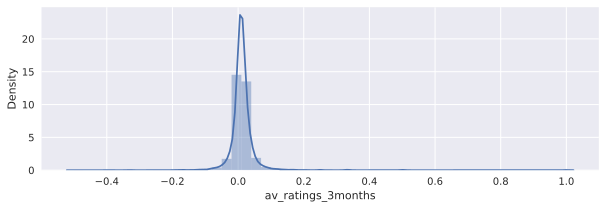

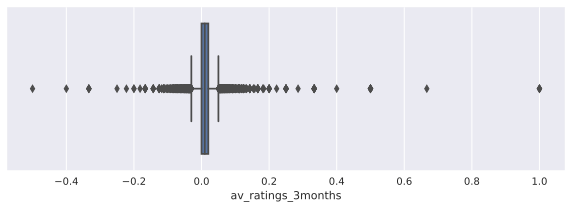

In [120]:
plt.figure(figsize=(10, 3))
sns.distplot(df_pr['av_ratings_3months'])
plt.show()

plt.figure(figsize=(10, 3))
sns.boxplot(df_pr['av_ratings_3months'], orient='h')
plt.show()

## Split

In [121]:
X, y = df_pr.drop('av_ratings_3months', axis=1), df_pr['av_ratings_3months']

In [122]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42, shuffle=True)

In [123]:
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.1, random_state=42, shuffle=True)

In [124]:
X_train.shape, X_val.shape, X_test.shape, y_train.shape, y_val.shape, y_test.shape

((6252, 37), (695, 37), (772, 37), (6252,), (695,), (772,))

In [125]:
cat_features = ['age_access_type', 'type']

In [126]:
X_train.columns

Index(['age_access_type', 'average_rating', 'duration', 'type',
       'subscription_only', 'Drama', 'Comedy', 'Thriller', 'Action',
       '287a1485-7a88-4c2f-bc94-ca418b6c47a1', 'Adventure', 'Melodrama',
       '364fdc2e-bdfe-40be-b2c5-d30f43ec432e', 'Sci-Fi', 'Family',
       'd08bba89-e937-40f3-b2a7-7ea26de4c246',
       'fd401c6b-3e00-4f7f-aea7-5512df6b91e0',
       '5463b4bc-e332-415c-aca8-11c0f217a9eb',
       'fbdae856-85b9-4d4a-96dd-cc383571a488',
       '9703b641-2566-4e58-aebb-8d140805c0f3',
       '586f8d5a-2f17-42a3-b066-667f7c26a842',
       'dfd861c4-d2de-4bb6-bc6e-bae3f92a18a9',
       '43dc7096-090a-4c75-9e78-5f14da3ded36',
       '2ab01676-2af6-4abb-8dde-dc51e7e22372',
       'b6a30330-1dcb-4093-b6a9-ce0f779874c2',
       '751aebbe-2d4d-4421-bace-d44b8e10c8eb',
       'f7ded2b9-7c98-47ab-bfc4-57fb60bf946c',
       '799561d3-10b0-420d-93be-8138a07ac693', 'usa', 'russia',
       'great-britain', 'france', 'germany', 'SUBSCRIPTION', 'DTO', 'RENT',
       'AVOD'],
      d

# Modeling

In [127]:
import catboost as cat
from catboost import CatBoostRegressor
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

from scipy.stats import uniform, randint

In [57]:
train_dataset = cat.Pool(data=X_train,
                        label=y_train,
                         cat_features=cat_features)

test_dataset = cat.Pool(data=X_test, 
                        label=y_test,
                         cat_features=cat_features)

val_dataset = cat.Pool(X_val, y_val,
                       cat_features=cat_features)

cat_params = {
    'loss_function': 'RMSE',
    'eval_metric': 'MAE',
    'verbose': True,
    'random_seed': 321,
    'allow_writing_files': False, 
    'cat_features': cat_features
}

cat_model = cat.CatBoostRegressor(**cat_params)

cat_model.fit(
    train_dataset,
    eval_set=val_dataset,
    early_stopping_rounds=500,
    verbose=100,
    plot=False
)

Learning rate set to 0.0679
0:	learn: 0.0185249	test: 0.0222513	best: 0.0222513 (0)	total: 56.7ms	remaining: 56.7s
100:	learn: 0.0164665	test: 0.0205307	best: 0.0205307 (100)	total: 372ms	remaining: 3.31s
200:	learn: 0.0162331	test: 0.0205450	best: 0.0205141 (156)	total: 701ms	remaining: 2.79s
300:	learn: 0.0160052	test: 0.0208386	best: 0.0205141 (156)	total: 1.05s	remaining: 2.43s
400:	learn: 0.0157580	test: 0.0208614	best: 0.0205141 (156)	total: 1.37s	remaining: 2.05s
500:	learn: 0.0155581	test: 0.0209076	best: 0.0205141 (156)	total: 1.7s	remaining: 1.7s
600:	learn: 0.0153719	test: 0.0210433	best: 0.0205141 (156)	total: 2.05s	remaining: 1.36s
Stopped by overfitting detector  (500 iterations wait)

bestTest = 0.02051409534
bestIteration = 156

Shrink model to first 157 iterations.


In [58]:
y_pred = cat_model.predict(test_dataset)

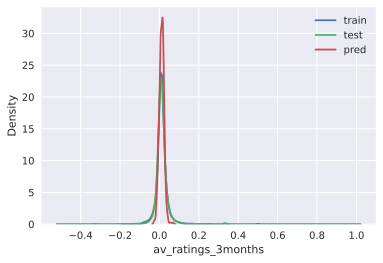

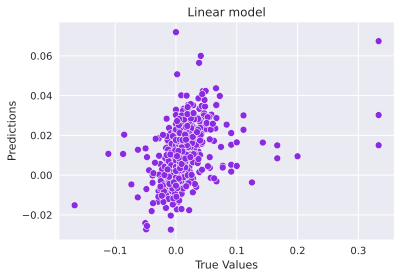

In [59]:
target_distr_linear(y_train, y_test, y_pred)   

In [60]:
calc_metrics(y_test, y_pred)

*** VAL **: 
MSE:   0.0009214170423217896
RMSE:  0.030354852039201075
R2:    0.1481045883287948
MAE:   0.015295992423978905
MedAE: 0.008600615582791609
------------------------------


In [61]:
cat_model.save_model('cat_reg_okko_ratings_cat_ntop')

**Feature importance**

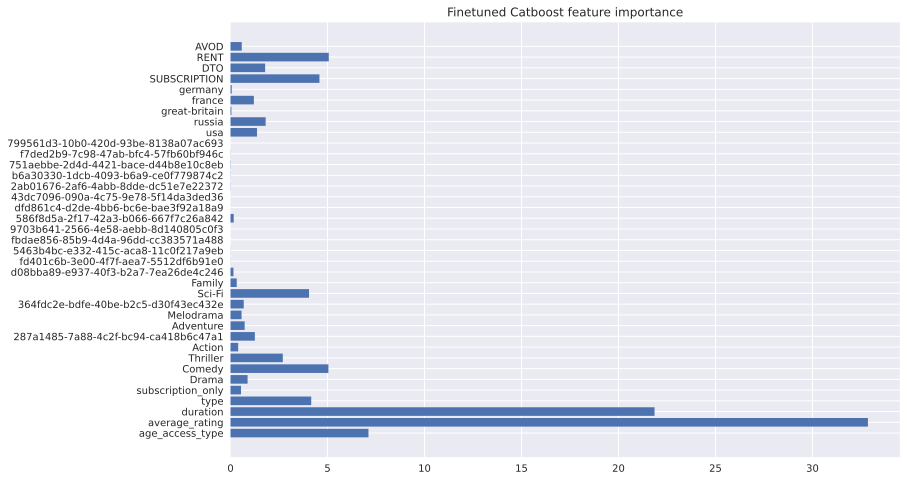

In [62]:
get_feature_imp(cat_model, train_dataset)

1)  The most influential features:  
    - duration  
    - average_rating  
    - age_access_type  

2)  The lowest influential features:  
    - actors and directors are not so important

**Detecting heteroscedasticity**

**Graphical Method:**

Firstly do the regression analysis and then plot the error terms against the predicted values. 
If there is a definite pattern (like linear or quadratic or funnel shaped) obtained from the scatter plot then heteroscedasticity is present.

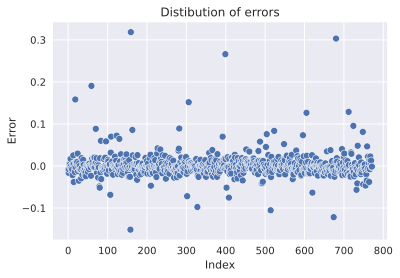

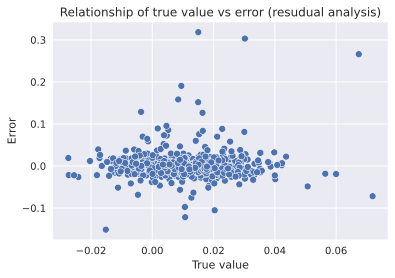

In [63]:
errors = y_test - y_pred
draw_res_analys(errors, y_pred)

**Conclusion**
* The trend in the second figure is not visible, now we will confirm the presence of heteroskedasticity on tests.

# Tuning

In [128]:
train_dataset = cat.Pool(X_train, y_train, 
                         cat_features=cat_features) 

test_dataset = cat.Pool(X_test, y_test,
                         cat_features=cat_features)

cat_params = {
    'loss_function': 'RMSE',
    'eval_metric': 'MAE',
    'verbose': True,
    'random_seed': 321,
    'allow_writing_files': False, 
    'cat_features': cat_features
}

In [138]:
test_dataset

In [ ]:
parameters_distr = {'depth': randint(5, 10),
              'learning_rate': uniform(0.01, 0.1),
              'iterations': [5000, 10000, 15000]
             }

cat_model = cat.CatBoostRegressor(**cat_params)
grid = RandomizedSearchCV(estimator=cat_model, param_distributions=parameters_distr, 
                            cv=5, 
#                           n_jobs=-1,
                          verbose=3)

grid.fit(X_train, y_train)

import pickle
with open('bestimator_okko_rat_ntop', 'wb') as f:
    pickle.dump(grid.best_estimator_, f)
grid.best_params_

Fitting 5 folds for each of 10 candidates, totalling 50 fits
0:	learn: 0.0179227	total: 18.5ms	remaining: 1m 32s
1:	learn: 0.0176272	total: 30.8ms	remaining: 1m 16s
2:	learn: 0.0173096	total: 61.4ms	remaining: 1m 42s
3:	learn: 0.0170833	total: 71.3ms	remaining: 1m 29s
4:	learn: 0.0169185	total: 83.7ms	remaining: 1m 23s
5:	learn: 0.0167546	total: 97.4ms	remaining: 1m 21s
6:	learn: 0.0166348	total: 112ms	remaining: 1m 19s
7:	learn: 0.0165186	total: 126ms	remaining: 1m 18s
8:	learn: 0.0164345	total: 151ms	remaining: 1m 23s
9:	learn: 0.0164336	total: 161ms	remaining: 1m 20s
10:	learn: 0.0163974	total: 170ms	remaining: 1m 17s
11:	learn: 0.0163348	total: 181ms	remaining: 1m 15s
12:	learn: 0.0162855	total: 218ms	remaining: 1m 23s
13:	learn: 0.0162514	total: 255ms	remaining: 1m 30s
14:	learn: 0.0162314	total: 267ms	remaining: 1m 28s
15:	learn: 0.0161725	total: 277ms	remaining: 1m 26s
16:	learn: 0.0161732	total: 279ms	remaining: 1m 21s
17:	learn: 0.0161738	total: 289ms	remaining: 1m 19s
18:	lea

170:	learn: 0.0151847	total: 2.21s	remaining: 1m 2s
171:	learn: 0.0151822	total: 2.23s	remaining: 1m 2s
172:	learn: 0.0151774	total: 2.25s	remaining: 1m 2s
173:	learn: 0.0151657	total: 2.26s	remaining: 1m 2s
174:	learn: 0.0151327	total: 2.28s	remaining: 1m 2s
175:	learn: 0.0151317	total: 2.3s	remaining: 1m 3s
176:	learn: 0.0151215	total: 2.31s	remaining: 1m 3s
177:	learn: 0.0151093	total: 2.34s	remaining: 1m 3s
178:	learn: 0.0150906	total: 2.36s	remaining: 1m 3s
179:	learn: 0.0150896	total: 2.37s	remaining: 1m 3s
180:	learn: 0.0150897	total: 2.38s	remaining: 1m 3s
181:	learn: 0.0150797	total: 2.39s	remaining: 1m 3s
182:	learn: 0.0150777	total: 2.42s	remaining: 1m 3s
183:	learn: 0.0150650	total: 2.42s	remaining: 1m 3s
184:	learn: 0.0150607	total: 2.45s	remaining: 1m 3s
185:	learn: 0.0150550	total: 2.47s	remaining: 1m 3s
186:	learn: 0.0150455	total: 2.48s	remaining: 1m 3s
187:	learn: 0.0150338	total: 2.49s	remaining: 1m 3s
188:	learn: 0.0150160	total: 2.5s	remaining: 1m 3s
189:	learn: 0.

328:	learn: 0.0138526	total: 4.71s	remaining: 1m 6s
329:	learn: 0.0138500	total: 4.72s	remaining: 1m 6s
330:	learn: 0.0138482	total: 4.75s	remaining: 1m 7s
331:	learn: 0.0138375	total: 4.79s	remaining: 1m 7s
332:	learn: 0.0138294	total: 4.8s	remaining: 1m 7s
333:	learn: 0.0138251	total: 4.81s	remaining: 1m 7s
334:	learn: 0.0138117	total: 4.83s	remaining: 1m 7s
335:	learn: 0.0137928	total: 4.84s	remaining: 1m 7s
336:	learn: 0.0137783	total: 4.86s	remaining: 1m 7s
337:	learn: 0.0137728	total: 4.88s	remaining: 1m 7s
338:	learn: 0.0137649	total: 4.89s	remaining: 1m 7s
339:	learn: 0.0137461	total: 4.9s	remaining: 1m 7s
340:	learn: 0.0137352	total: 4.92s	remaining: 1m 7s
341:	learn: 0.0137286	total: 4.94s	remaining: 1m 7s
342:	learn: 0.0137263	total: 4.95s	remaining: 1m 7s
343:	learn: 0.0137158	total: 4.96s	remaining: 1m 7s
344:	learn: 0.0136974	total: 4.98s	remaining: 1m 7s
345:	learn: 0.0136829	total: 5s	remaining: 1m 7s
346:	learn: 0.0136811	total: 5.02s	remaining: 1m 7s
347:	learn: 0.013

487:	learn: 0.0127144	total: 7.46s	remaining: 1m 8s
488:	learn: 0.0127060	total: 7.47s	remaining: 1m 8s
489:	learn: 0.0127062	total: 7.49s	remaining: 1m 8s
490:	learn: 0.0126973	total: 7.5s	remaining: 1m 8s
491:	learn: 0.0126928	total: 7.51s	remaining: 1m 8s
492:	learn: 0.0126844	total: 7.52s	remaining: 1m 8s
493:	learn: 0.0126747	total: 7.54s	remaining: 1m 8s
494:	learn: 0.0126703	total: 7.55s	remaining: 1m 8s
495:	learn: 0.0126660	total: 7.56s	remaining: 1m 8s
496:	learn: 0.0126625	total: 7.58s	remaining: 1m 8s
497:	learn: 0.0126615	total: 7.59s	remaining: 1m 8s
498:	learn: 0.0126589	total: 7.62s	remaining: 1m 8s
499:	learn: 0.0126552	total: 7.65s	remaining: 1m 8s
500:	learn: 0.0126552	total: 7.66s	remaining: 1m 8s
501:	learn: 0.0126492	total: 7.68s	remaining: 1m 8s
502:	learn: 0.0126400	total: 7.69s	remaining: 1m 8s
503:	learn: 0.0126344	total: 7.7s	remaining: 1m 8s
504:	learn: 0.0126320	total: 7.74s	remaining: 1m 8s
505:	learn: 0.0126301	total: 7.75s	remaining: 1m 8s
506:	learn: 0.

659:	learn: 0.0116079	total: 10.2s	remaining: 1m 6s
660:	learn: 0.0116030	total: 10.2s	remaining: 1m 6s
661:	learn: 0.0116012	total: 10.2s	remaining: 1m 6s
662:	learn: 0.0115964	total: 10.2s	remaining: 1m 6s
663:	learn: 0.0115915	total: 10.2s	remaining: 1m 6s
664:	learn: 0.0115904	total: 10.3s	remaining: 1m 6s
665:	learn: 0.0115810	total: 10.3s	remaining: 1m 6s
666:	learn: 0.0115760	total: 10.3s	remaining: 1m 6s
667:	learn: 0.0115717	total: 10.3s	remaining: 1m 6s
668:	learn: 0.0115637	total: 10.3s	remaining: 1m 6s
669:	learn: 0.0115598	total: 10.3s	remaining: 1m 6s
670:	learn: 0.0115580	total: 10.4s	remaining: 1m 6s
671:	learn: 0.0115484	total: 10.4s	remaining: 1m 6s
672:	learn: 0.0115472	total: 10.4s	remaining: 1m 6s
673:	learn: 0.0115417	total: 10.4s	remaining: 1m 6s
674:	learn: 0.0115369	total: 10.4s	remaining: 1m 6s
675:	learn: 0.0115348	total: 10.5s	remaining: 1m 6s
676:	learn: 0.0115296	total: 10.5s	remaining: 1m 6s
677:	learn: 0.0115263	total: 10.5s	remaining: 1m 6s
678:	learn: 

817:	learn: 0.0107487	total: 12.7s	remaining: 1m 4s
818:	learn: 0.0107460	total: 12.7s	remaining: 1m 4s
819:	learn: 0.0107385	total: 12.7s	remaining: 1m 4s
820:	learn: 0.0107335	total: 12.7s	remaining: 1m 4s
821:	learn: 0.0107258	total: 12.7s	remaining: 1m 4s
822:	learn: 0.0107230	total: 12.7s	remaining: 1m 4s
823:	learn: 0.0107181	total: 12.7s	remaining: 1m 4s
824:	learn: 0.0107156	total: 12.8s	remaining: 1m 4s
825:	learn: 0.0107140	total: 12.8s	remaining: 1m 4s
826:	learn: 0.0107059	total: 12.8s	remaining: 1m 4s
827:	learn: 0.0106969	total: 12.8s	remaining: 1m 4s
828:	learn: 0.0106890	total: 12.8s	remaining: 1m 4s
829:	learn: 0.0106853	total: 12.8s	remaining: 1m 4s
830:	learn: 0.0106821	total: 12.9s	remaining: 1m 4s
831:	learn: 0.0106819	total: 12.9s	remaining: 1m 4s
832:	learn: 0.0106753	total: 12.9s	remaining: 1m 4s
833:	learn: 0.0106716	total: 12.9s	remaining: 1m 4s
834:	learn: 0.0106680	total: 12.9s	remaining: 1m 4s
835:	learn: 0.0106639	total: 12.9s	remaining: 1m 4s
836:	learn: 

976:	learn: 0.0099682	total: 15.1s	remaining: 1m 2s
977:	learn: 0.0099602	total: 15.2s	remaining: 1m 2s
978:	learn: 0.0099585	total: 15.2s	remaining: 1m 2s
979:	learn: 0.0099542	total: 15.2s	remaining: 1m 2s
980:	learn: 0.0099483	total: 15.2s	remaining: 1m 2s
981:	learn: 0.0099450	total: 15.2s	remaining: 1m 2s
982:	learn: 0.0099427	total: 15.2s	remaining: 1m 2s
983:	learn: 0.0099351	total: 15.2s	remaining: 1m 2s
984:	learn: 0.0099330	total: 15.2s	remaining: 1m 2s
985:	learn: 0.0099303	total: 15.3s	remaining: 1m 2s
986:	learn: 0.0099233	total: 15.3s	remaining: 1m 2s
987:	learn: 0.0099220	total: 15.3s	remaining: 1m 2s
988:	learn: 0.0099141	total: 15.3s	remaining: 1m 2s
989:	learn: 0.0098987	total: 15.3s	remaining: 1m 2s
990:	learn: 0.0098966	total: 15.3s	remaining: 1m 2s
991:	learn: 0.0098893	total: 15.3s	remaining: 1m 2s
992:	learn: 0.0098858	total: 15.4s	remaining: 1m 1s
993:	learn: 0.0098810	total: 15.4s	remaining: 1m 1s
994:	learn: 0.0098777	total: 15.4s	remaining: 1m 1s
995:	learn: 

1139:	learn: 0.0092069	total: 17.7s	remaining: 59.8s
1140:	learn: 0.0091984	total: 17.7s	remaining: 59.8s
1141:	learn: 0.0091957	total: 17.7s	remaining: 59.7s
1142:	learn: 0.0091909	total: 17.7s	remaining: 59.7s
1143:	learn: 0.0091854	total: 17.7s	remaining: 59.7s
1144:	learn: 0.0091823	total: 17.7s	remaining: 59.7s
1145:	learn: 0.0091760	total: 17.7s	remaining: 59.6s
1146:	learn: 0.0091677	total: 17.8s	remaining: 59.6s
1147:	learn: 0.0091651	total: 17.8s	remaining: 59.6s
1148:	learn: 0.0091618	total: 17.8s	remaining: 59.6s
1149:	learn: 0.0091602	total: 17.8s	remaining: 59.5s
1150:	learn: 0.0091576	total: 17.8s	remaining: 59.5s
1151:	learn: 0.0091535	total: 17.8s	remaining: 59.5s
1152:	learn: 0.0091512	total: 17.8s	remaining: 59.5s
1153:	learn: 0.0091508	total: 17.8s	remaining: 59.5s
1154:	learn: 0.0091428	total: 17.9s	remaining: 59.4s
1155:	learn: 0.0091394	total: 17.9s	remaining: 59.4s
1156:	learn: 0.0091361	total: 17.9s	remaining: 59.4s
1157:	learn: 0.0091353	total: 17.9s	remaining:

1299:	learn: 0.0085536	total: 20.1s	remaining: 57.3s
1300:	learn: 0.0085512	total: 20.1s	remaining: 57.3s
1301:	learn: 0.0085440	total: 20.2s	remaining: 57.3s
1302:	learn: 0.0085432	total: 20.2s	remaining: 57.3s
1303:	learn: 0.0085378	total: 20.2s	remaining: 57.3s
1304:	learn: 0.0085315	total: 20.2s	remaining: 57.2s
1305:	learn: 0.0085220	total: 20.2s	remaining: 57.2s
1306:	learn: 0.0085095	total: 20.2s	remaining: 57.2s
1307:	learn: 0.0085071	total: 20.2s	remaining: 57.2s
1308:	learn: 0.0085059	total: 20.3s	remaining: 57.1s
1309:	learn: 0.0085026	total: 20.3s	remaining: 57.1s
1310:	learn: 0.0084976	total: 20.3s	remaining: 57.1s
1311:	learn: 0.0084954	total: 20.3s	remaining: 57.1s
1312:	learn: 0.0084937	total: 20.3s	remaining: 57.1s
1313:	learn: 0.0084924	total: 20.3s	remaining: 57.1s
1314:	learn: 0.0084899	total: 20.4s	remaining: 57s
1315:	learn: 0.0084885	total: 20.4s	remaining: 57s
1316:	learn: 0.0084864	total: 20.4s	remaining: 57s
1317:	learn: 0.0084849	total: 20.4s	remaining: 57s
1

1463:	learn: 0.0080071	total: 22.6s	remaining: 54.7s
1464:	learn: 0.0080032	total: 22.6s	remaining: 54.6s
1465:	learn: 0.0079967	total: 22.7s	remaining: 54.6s
1466:	learn: 0.0079941	total: 22.7s	remaining: 54.6s
1467:	learn: 0.0079928	total: 22.7s	remaining: 54.6s
1468:	learn: 0.0079894	total: 22.7s	remaining: 54.6s
1469:	learn: 0.0079800	total: 22.7s	remaining: 54.6s
1470:	learn: 0.0079767	total: 22.7s	remaining: 54.5s
1471:	learn: 0.0079751	total: 22.8s	remaining: 54.5s
1472:	learn: 0.0079752	total: 22.8s	remaining: 54.5s
1473:	learn: 0.0079728	total: 22.8s	remaining: 54.5s
1474:	learn: 0.0079709	total: 22.8s	remaining: 54.5s
1475:	learn: 0.0079698	total: 22.8s	remaining: 54.5s
1476:	learn: 0.0079693	total: 22.8s	remaining: 54.5s
1477:	learn: 0.0079650	total: 22.9s	remaining: 54.5s
1478:	learn: 0.0079610	total: 22.9s	remaining: 54.5s
1479:	learn: 0.0079576	total: 22.9s	remaining: 54.4s
1480:	learn: 0.0079533	total: 22.9s	remaining: 54.4s
1481:	learn: 0.0079485	total: 22.9s	remaining:

1629:	learn: 0.0074664	total: 25.2s	remaining: 52s
1630:	learn: 0.0074614	total: 25.2s	remaining: 52s
1631:	learn: 0.0074581	total: 25.2s	remaining: 52s
1632:	learn: 0.0074555	total: 25.2s	remaining: 52s
1633:	learn: 0.0074542	total: 25.2s	remaining: 52s
1634:	learn: 0.0074538	total: 25.2s	remaining: 51.9s
1635:	learn: 0.0074512	total: 25.2s	remaining: 51.9s
1636:	learn: 0.0074482	total: 25.3s	remaining: 51.9s
1637:	learn: 0.0074428	total: 25.3s	remaining: 51.9s
1638:	learn: 0.0074407	total: 25.3s	remaining: 51.9s
1639:	learn: 0.0074292	total: 25.3s	remaining: 51.9s
1640:	learn: 0.0074269	total: 25.3s	remaining: 51.8s
1641:	learn: 0.0074241	total: 25.3s	remaining: 51.8s
1642:	learn: 0.0074218	total: 25.4s	remaining: 51.8s
1643:	learn: 0.0074205	total: 25.4s	remaining: 51.8s
1644:	learn: 0.0074141	total: 25.4s	remaining: 51.8s
1645:	learn: 0.0074106	total: 25.4s	remaining: 51.8s
1646:	learn: 0.0074039	total: 25.4s	remaining: 51.7s
1647:	learn: 0.0074004	total: 25.4s	remaining: 51.7s
164

1792:	learn: 0.0069959	total: 27.9s	remaining: 49.8s
1793:	learn: 0.0069928	total: 27.9s	remaining: 49.8s
1794:	learn: 0.0069918	total: 27.9s	remaining: 49.8s
1795:	learn: 0.0069884	total: 27.9s	remaining: 49.8s
1796:	learn: 0.0069867	total: 27.9s	remaining: 49.8s
1797:	learn: 0.0069826	total: 27.9s	remaining: 49.8s
1798:	learn: 0.0069795	total: 28s	remaining: 49.7s
1799:	learn: 0.0069777	total: 28s	remaining: 49.7s
1800:	learn: 0.0069768	total: 28s	remaining: 49.7s
1801:	learn: 0.0069744	total: 28s	remaining: 49.7s
1802:	learn: 0.0069682	total: 28s	remaining: 49.7s
1803:	learn: 0.0069631	total: 28s	remaining: 49.7s
1804:	learn: 0.0069615	total: 28.1s	remaining: 49.7s
1805:	learn: 0.0069584	total: 28.1s	remaining: 49.7s
1806:	learn: 0.0069542	total: 28.1s	remaining: 49.7s
1807:	learn: 0.0069529	total: 28.1s	remaining: 49.6s
1808:	learn: 0.0069506	total: 28.1s	remaining: 49.6s
1809:	learn: 0.0069496	total: 28.1s	remaining: 49.6s
1810:	learn: 0.0069475	total: 28.2s	remaining: 49.6s
1811:

1955:	learn: 0.0065757	total: 30.6s	remaining: 47.6s
1956:	learn: 0.0065725	total: 30.6s	remaining: 47.6s
1957:	learn: 0.0065711	total: 30.6s	remaining: 47.5s
1958:	learn: 0.0065670	total: 30.6s	remaining: 47.5s
1959:	learn: 0.0065641	total: 30.6s	remaining: 47.5s
1960:	learn: 0.0065610	total: 30.6s	remaining: 47.5s
1961:	learn: 0.0065575	total: 30.6s	remaining: 47.5s
1962:	learn: 0.0065550	total: 30.7s	remaining: 47.4s
1963:	learn: 0.0065542	total: 30.7s	remaining: 47.4s
1964:	learn: 0.0065515	total: 30.7s	remaining: 47.4s
1965:	learn: 0.0065502	total: 30.7s	remaining: 47.4s
1966:	learn: 0.0065425	total: 30.7s	remaining: 47.4s
1967:	learn: 0.0065416	total: 30.7s	remaining: 47.3s
1968:	learn: 0.0065403	total: 30.8s	remaining: 47.3s
1969:	learn: 0.0065373	total: 30.8s	remaining: 47.3s
1970:	learn: 0.0065308	total: 30.8s	remaining: 47.3s
1971:	learn: 0.0065292	total: 30.8s	remaining: 47.3s
1972:	learn: 0.0065274	total: 30.8s	remaining: 47.3s
1973:	learn: 0.0065225	total: 30.8s	remaining:

2119:	learn: 0.0061345	total: 33.3s	remaining: 45.3s
2120:	learn: 0.0061341	total: 33.3s	remaining: 45.2s
2121:	learn: 0.0061302	total: 33.3s	remaining: 45.2s
2122:	learn: 0.0061293	total: 33.4s	remaining: 45.2s
2123:	learn: 0.0061274	total: 33.4s	remaining: 45.2s
2124:	learn: 0.0061259	total: 33.4s	remaining: 45.2s
2125:	learn: 0.0061228	total: 33.4s	remaining: 45.2s
2126:	learn: 0.0061181	total: 33.4s	remaining: 45.1s
2127:	learn: 0.0061157	total: 33.4s	remaining: 45.1s
2128:	learn: 0.0061154	total: 33.4s	remaining: 45.1s
2129:	learn: 0.0061138	total: 33.5s	remaining: 45.1s
2130:	learn: 0.0061129	total: 33.5s	remaining: 45.1s
2131:	learn: 0.0061109	total: 33.5s	remaining: 45s
2132:	learn: 0.0061048	total: 33.5s	remaining: 45s
2133:	learn: 0.0061025	total: 33.5s	remaining: 45s
2134:	learn: 0.0061021	total: 33.5s	remaining: 45s
2135:	learn: 0.0061005	total: 33.5s	remaining: 45s
2136:	learn: 0.0060990	total: 33.6s	remaining: 45s
2137:	learn: 0.0060962	total: 33.6s	remaining: 44.9s
2138:

2282:	learn: 0.0057466	total: 36s	remaining: 42.9s
2283:	learn: 0.0057444	total: 36s	remaining: 42.9s
2284:	learn: 0.0057432	total: 36s	remaining: 42.8s
2285:	learn: 0.0057405	total: 36.1s	remaining: 42.8s
2286:	learn: 0.0057397	total: 36.1s	remaining: 42.8s
2287:	learn: 0.0057384	total: 36.1s	remaining: 42.8s
2288:	learn: 0.0057327	total: 36.1s	remaining: 42.8s
2289:	learn: 0.0057327	total: 36.1s	remaining: 42.7s
2290:	learn: 0.0057318	total: 36.1s	remaining: 42.7s
2291:	learn: 0.0057294	total: 36.1s	remaining: 42.7s
2292:	learn: 0.0057292	total: 36.2s	remaining: 42.7s
2293:	learn: 0.0057270	total: 36.2s	remaining: 42.7s
2294:	learn: 0.0057252	total: 36.2s	remaining: 42.7s
2295:	learn: 0.0057231	total: 36.2s	remaining: 42.6s
2296:	learn: 0.0057205	total: 36.2s	remaining: 42.6s
2297:	learn: 0.0057200	total: 36.2s	remaining: 42.6s
2298:	learn: 0.0057190	total: 36.2s	remaining: 42.6s
2299:	learn: 0.0057136	total: 36.3s	remaining: 42.6s
2300:	learn: 0.0057094	total: 36.3s	remaining: 42.6s

2444:	learn: 0.0054265	total: 38.5s	remaining: 40.3s
2445:	learn: 0.0054245	total: 38.5s	remaining: 40.2s
2446:	learn: 0.0054217	total: 38.6s	remaining: 40.2s
2447:	learn: 0.0054198	total: 38.6s	remaining: 40.2s
2448:	learn: 0.0054190	total: 38.6s	remaining: 40.2s
2449:	learn: 0.0054174	total: 38.6s	remaining: 40.2s
2450:	learn: 0.0054174	total: 38.6s	remaining: 40.2s
2451:	learn: 0.0054163	total: 38.6s	remaining: 40.2s
2452:	learn: 0.0054141	total: 38.7s	remaining: 40.1s
2453:	learn: 0.0054110	total: 38.7s	remaining: 40.1s
2454:	learn: 0.0054092	total: 38.7s	remaining: 40.1s
2455:	learn: 0.0054080	total: 38.7s	remaining: 40.1s
2456:	learn: 0.0054066	total: 38.7s	remaining: 40.1s
2457:	learn: 0.0054020	total: 38.7s	remaining: 40.1s
2458:	learn: 0.0053978	total: 38.8s	remaining: 40s
2459:	learn: 0.0053970	total: 38.8s	remaining: 40s
2460:	learn: 0.0053949	total: 38.8s	remaining: 40s
2461:	learn: 0.0053927	total: 38.8s	remaining: 40s
2462:	learn: 0.0053917	total: 38.8s	remaining: 40s
246

2612:	learn: 0.0050938	total: 41.2s	remaining: 37.7s
2613:	learn: 0.0050926	total: 41.2s	remaining: 37.6s
2614:	learn: 0.0050918	total: 41.3s	remaining: 37.6s
2615:	learn: 0.0050900	total: 41.3s	remaining: 37.6s
2616:	learn: 0.0050891	total: 41.3s	remaining: 37.6s
2617:	learn: 0.0050884	total: 41.3s	remaining: 37.6s
2618:	learn: 0.0050866	total: 41.3s	remaining: 37.6s
2619:	learn: 0.0050855	total: 41.3s	remaining: 37.6s
2620:	learn: 0.0050830	total: 41.4s	remaining: 37.5s
2621:	learn: 0.0050812	total: 41.4s	remaining: 37.5s
2622:	learn: 0.0050791	total: 41.4s	remaining: 37.5s
2623:	learn: 0.0050775	total: 41.4s	remaining: 37.5s
2624:	learn: 0.0050730	total: 41.4s	remaining: 37.5s
2625:	learn: 0.0050703	total: 41.4s	remaining: 37.5s
2626:	learn: 0.0050692	total: 41.5s	remaining: 37.5s
2627:	learn: 0.0050645	total: 41.5s	remaining: 37.4s
2628:	learn: 0.0050619	total: 41.5s	remaining: 37.4s
2629:	learn: 0.0050614	total: 41.5s	remaining: 37.4s
2630:	learn: 0.0050598	total: 41.5s	remaining:

2768:	learn: 0.0048292	total: 43.7s	remaining: 35.2s
2769:	learn: 0.0048279	total: 43.8s	remaining: 35.2s
2770:	learn: 0.0048279	total: 43.8s	remaining: 35.2s
2771:	learn: 0.0048276	total: 43.8s	remaining: 35.2s
2772:	learn: 0.0048257	total: 43.8s	remaining: 35.2s
2773:	learn: 0.0048249	total: 43.8s	remaining: 35.1s
2774:	learn: 0.0048239	total: 43.8s	remaining: 35.1s
2775:	learn: 0.0048233	total: 43.8s	remaining: 35.1s
2776:	learn: 0.0048214	total: 43.9s	remaining: 35.1s
2777:	learn: 0.0048207	total: 43.9s	remaining: 35.1s
2778:	learn: 0.0048200	total: 43.9s	remaining: 35.1s
2779:	learn: 0.0048186	total: 43.9s	remaining: 35.1s
2780:	learn: 0.0048166	total: 43.9s	remaining: 35s
2781:	learn: 0.0048154	total: 43.9s	remaining: 35s
2782:	learn: 0.0048149	total: 43.9s	remaining: 35s
2783:	learn: 0.0048139	total: 44s	remaining: 35s
2784:	learn: 0.0048130	total: 44s	remaining: 35s
2785:	learn: 0.0048113	total: 44s	remaining: 35s
2786:	learn: 0.0048108	total: 44s	remaining: 34.9s
2787:	learn: 

2925:	learn: 0.0046082	total: 46.3s	remaining: 32.8s
2926:	learn: 0.0046071	total: 46.3s	remaining: 32.8s
2927:	learn: 0.0046066	total: 46.3s	remaining: 32.8s
2928:	learn: 0.0046051	total: 46.3s	remaining: 32.7s
2929:	learn: 0.0046019	total: 46.3s	remaining: 32.7s
2930:	learn: 0.0046008	total: 46.3s	remaining: 32.7s
2931:	learn: 0.0046004	total: 46.3s	remaining: 32.7s
2932:	learn: 0.0045978	total: 46.3s	remaining: 32.6s
2933:	learn: 0.0045975	total: 46.3s	remaining: 32.6s
2934:	learn: 0.0045963	total: 46.3s	remaining: 32.6s
2935:	learn: 0.0045951	total: 46.3s	remaining: 32.6s
2936:	learn: 0.0045946	total: 46.4s	remaining: 32.6s
2937:	learn: 0.0045933	total: 46.4s	remaining: 32.5s
2938:	learn: 0.0045910	total: 46.4s	remaining: 32.5s
2939:	learn: 0.0045904	total: 46.4s	remaining: 32.5s
2940:	learn: 0.0045889	total: 46.4s	remaining: 32.5s
2941:	learn: 0.0045880	total: 46.4s	remaining: 32.5s
2942:	learn: 0.0045869	total: 46.4s	remaining: 32.4s
2943:	learn: 0.0045838	total: 46.4s	remaining:

3092:	learn: 0.0043759	total: 48.8s	remaining: 30.1s
3093:	learn: 0.0043738	total: 48.8s	remaining: 30.1s
3094:	learn: 0.0043731	total: 48.8s	remaining: 30.1s
3095:	learn: 0.0043709	total: 48.9s	remaining: 30s
3096:	learn: 0.0043708	total: 48.9s	remaining: 30s
3097:	learn: 0.0043698	total: 48.9s	remaining: 30s
3098:	learn: 0.0043669	total: 48.9s	remaining: 30s
3099:	learn: 0.0043665	total: 48.9s	remaining: 30s
3100:	learn: 0.0043654	total: 48.9s	remaining: 30s
3101:	learn: 0.0043644	total: 48.9s	remaining: 29.9s
3102:	learn: 0.0043642	total: 49s	remaining: 29.9s
3103:	learn: 0.0043631	total: 49s	remaining: 29.9s
3104:	learn: 0.0043610	total: 49s	remaining: 29.9s
3105:	learn: 0.0043584	total: 49s	remaining: 29.9s
3106:	learn: 0.0043575	total: 49s	remaining: 29.9s
3107:	learn: 0.0043562	total: 49s	remaining: 29.8s
3108:	learn: 0.0043532	total: 49s	remaining: 29.8s
3109:	learn: 0.0043511	total: 49.1s	remaining: 29.8s
3110:	learn: 0.0043508	total: 49.1s	remaining: 29.8s
3111:	learn: 0.0043

3251:	learn: 0.0041644	total: 51.3s	remaining: 27.6s
3252:	learn: 0.0041638	total: 51.3s	remaining: 27.5s
3253:	learn: 0.0041635	total: 51.3s	remaining: 27.5s
3254:	learn: 0.0041618	total: 51.3s	remaining: 27.5s
3255:	learn: 0.0041601	total: 51.3s	remaining: 27.5s
3256:	learn: 0.0041594	total: 51.4s	remaining: 27.5s
3257:	learn: 0.0041591	total: 51.4s	remaining: 27.5s
3258:	learn: 0.0041580	total: 51.4s	remaining: 27.5s
3259:	learn: 0.0041546	total: 51.4s	remaining: 27.4s
3260:	learn: 0.0041543	total: 51.4s	remaining: 27.4s
3261:	learn: 0.0041541	total: 51.4s	remaining: 27.4s
3262:	learn: 0.0041531	total: 51.5s	remaining: 27.4s
3263:	learn: 0.0041507	total: 51.5s	remaining: 27.4s
3264:	learn: 0.0041503	total: 51.5s	remaining: 27.4s
3265:	learn: 0.0041489	total: 51.5s	remaining: 27.4s
3266:	learn: 0.0041477	total: 51.5s	remaining: 27.3s
3267:	learn: 0.0041467	total: 51.6s	remaining: 27.3s
3268:	learn: 0.0041457	total: 51.6s	remaining: 27.3s
3269:	learn: 0.0041422	total: 51.6s	remaining:

3410:	learn: 0.0039602	total: 54s	remaining: 25.2s
3411:	learn: 0.0039584	total: 54.1s	remaining: 25.2s
3412:	learn: 0.0039581	total: 54.1s	remaining: 25.1s
3413:	learn: 0.0039575	total: 54.1s	remaining: 25.1s
3414:	learn: 0.0039572	total: 54.1s	remaining: 25.1s
3415:	learn: 0.0039568	total: 54.1s	remaining: 25.1s
3416:	learn: 0.0039558	total: 54.2s	remaining: 25.1s
3417:	learn: 0.0039537	total: 54.2s	remaining: 25.1s
3418:	learn: 0.0039491	total: 54.2s	remaining: 25.1s
3419:	learn: 0.0039466	total: 54.2s	remaining: 25s
3420:	learn: 0.0039455	total: 54.2s	remaining: 25s
3421:	learn: 0.0039439	total: 54.3s	remaining: 25s
3422:	learn: 0.0039421	total: 54.3s	remaining: 25s
3423:	learn: 0.0039412	total: 54.3s	remaining: 25s
3424:	learn: 0.0039396	total: 54.3s	remaining: 25s
3425:	learn: 0.0039385	total: 54.3s	remaining: 24.9s
3426:	learn: 0.0039379	total: 54.3s	remaining: 24.9s
3427:	learn: 0.0039373	total: 54.3s	remaining: 24.9s
3428:	learn: 0.0039344	total: 54.3s	remaining: 24.9s
3429:	l

3569:	learn: 0.0037728	total: 56.6s	remaining: 22.7s
3570:	learn: 0.0037725	total: 56.6s	remaining: 22.6s
3571:	learn: 0.0037716	total: 56.6s	remaining: 22.6s
3572:	learn: 0.0037708	total: 56.6s	remaining: 22.6s
3573:	learn: 0.0037704	total: 56.6s	remaining: 22.6s
3574:	learn: 0.0037691	total: 56.6s	remaining: 22.6s
3575:	learn: 0.0037680	total: 56.7s	remaining: 22.6s
3576:	learn: 0.0037666	total: 56.7s	remaining: 22.6s
3577:	learn: 0.0037660	total: 56.7s	remaining: 22.5s
3578:	learn: 0.0037649	total: 56.7s	remaining: 22.5s
3579:	learn: 0.0037639	total: 56.7s	remaining: 22.5s
3580:	learn: 0.0037630	total: 56.8s	remaining: 22.5s
3581:	learn: 0.0037626	total: 56.8s	remaining: 22.5s
3582:	learn: 0.0037602	total: 56.8s	remaining: 22.5s
3583:	learn: 0.0037591	total: 56.8s	remaining: 22.4s
3584:	learn: 0.0037587	total: 56.8s	remaining: 22.4s
3585:	learn: 0.0037562	total: 56.8s	remaining: 22.4s
3586:	learn: 0.0037556	total: 56.9s	remaining: 22.4s
3587:	learn: 0.0037546	total: 56.9s	remaining:

3727:	learn: 0.0035986	total: 59.1s	remaining: 20.2s
3728:	learn: 0.0035984	total: 59.1s	remaining: 20.1s
3729:	learn: 0.0035982	total: 59.1s	remaining: 20.1s
3730:	learn: 0.0035974	total: 59.1s	remaining: 20.1s
3731:	learn: 0.0035972	total: 59.2s	remaining: 20.1s
3732:	learn: 0.0035960	total: 59.2s	remaining: 20.1s
3733:	learn: 0.0035956	total: 59.2s	remaining: 20.1s
3734:	learn: 0.0035940	total: 59.2s	remaining: 20.1s
3735:	learn: 0.0035923	total: 59.2s	remaining: 20s
3736:	learn: 0.0035914	total: 59.2s	remaining: 20s
3737:	learn: 0.0035904	total: 59.3s	remaining: 20s
3738:	learn: 0.0035894	total: 59.3s	remaining: 20s
3739:	learn: 0.0035885	total: 59.3s	remaining: 20s
3740:	learn: 0.0035875	total: 59.3s	remaining: 20s
3741:	learn: 0.0035847	total: 59.3s	remaining: 19.9s
3742:	learn: 0.0035841	total: 59.4s	remaining: 19.9s
3743:	learn: 0.0035837	total: 59.4s	remaining: 19.9s
3744:	learn: 0.0035828	total: 59.4s	remaining: 19.9s
3745:	learn: 0.0035822	total: 59.4s	remaining: 19.9s
3746:

3888:	learn: 0.0034404	total: 1m 1s	remaining: 17.7s
3889:	learn: 0.0034374	total: 1m 1s	remaining: 17.6s
3890:	learn: 0.0034359	total: 1m 1s	remaining: 17.6s
3891:	learn: 0.0034356	total: 1m 1s	remaining: 17.6s
3892:	learn: 0.0034348	total: 1m 1s	remaining: 17.6s
3893:	learn: 0.0034343	total: 1m 1s	remaining: 17.6s
3894:	learn: 0.0034326	total: 1m 1s	remaining: 17.6s
3895:	learn: 0.0034320	total: 1m 1s	remaining: 17.6s
3896:	learn: 0.0034316	total: 1m 1s	remaining: 17.5s
3897:	learn: 0.0034311	total: 1m 1s	remaining: 17.5s
3898:	learn: 0.0034307	total: 1m 1s	remaining: 17.5s
3899:	learn: 0.0034294	total: 1m 1s	remaining: 17.5s
3900:	learn: 0.0034250	total: 1m 2s	remaining: 17.5s
3901:	learn: 0.0034242	total: 1m 2s	remaining: 17.5s
3902:	learn: 0.0034231	total: 1m 2s	remaining: 17.4s
3903:	learn: 0.0034219	total: 1m 2s	remaining: 17.4s
3904:	learn: 0.0034213	total: 1m 2s	remaining: 17.4s
3905:	learn: 0.0034198	total: 1m 2s	remaining: 17.4s
3906:	learn: 0.0034189	total: 1m 2s	remaining:

4045:	learn: 0.0032717	total: 1m 4s	remaining: 15.2s
4046:	learn: 0.0032708	total: 1m 4s	remaining: 15.1s
4047:	learn: 0.0032699	total: 1m 4s	remaining: 15.1s
4048:	learn: 0.0032684	total: 1m 4s	remaining: 15.1s
4049:	learn: 0.0032676	total: 1m 4s	remaining: 15.1s
4050:	learn: 0.0032673	total: 1m 4s	remaining: 15.1s
4051:	learn: 0.0032670	total: 1m 4s	remaining: 15.1s
4052:	learn: 0.0032647	total: 1m 4s	remaining: 15.1s
4053:	learn: 0.0032642	total: 1m 4s	remaining: 15s
4054:	learn: 0.0032637	total: 1m 4s	remaining: 15s
4055:	learn: 0.0032631	total: 1m 4s	remaining: 15s
4056:	learn: 0.0032612	total: 1m 4s	remaining: 15s
4057:	learn: 0.0032598	total: 1m 4s	remaining: 15s
4058:	learn: 0.0032591	total: 1m 4s	remaining: 15s
4059:	learn: 0.0032582	total: 1m 4s	remaining: 14.9s
4060:	learn: 0.0032579	total: 1m 4s	remaining: 14.9s
4061:	learn: 0.0032564	total: 1m 4s	remaining: 14.9s
4062:	learn: 0.0032549	total: 1m 4s	remaining: 14.9s
4063:	learn: 0.0032540	total: 1m 4s	remaining: 14.9s
4064:

4201:	learn: 0.0031223	total: 1m 7s	remaining: 12.7s
4202:	learn: 0.0031221	total: 1m 7s	remaining: 12.7s
4203:	learn: 0.0031198	total: 1m 7s	remaining: 12.7s
4204:	learn: 0.0031190	total: 1m 7s	remaining: 12.7s
4205:	learn: 0.0031191	total: 1m 7s	remaining: 12.7s
4206:	learn: 0.0031184	total: 1m 7s	remaining: 12.7s
4207:	learn: 0.0031182	total: 1m 7s	remaining: 12.6s
4208:	learn: 0.0031174	total: 1m 7s	remaining: 12.6s
4209:	learn: 0.0031170	total: 1m 7s	remaining: 12.6s
4210:	learn: 0.0031162	total: 1m 7s	remaining: 12.6s
4211:	learn: 0.0031160	total: 1m 7s	remaining: 12.6s
4212:	learn: 0.0031146	total: 1m 7s	remaining: 12.6s
4213:	learn: 0.0031143	total: 1m 7s	remaining: 12.5s
4214:	learn: 0.0031142	total: 1m 7s	remaining: 12.5s
4215:	learn: 0.0031119	total: 1m 7s	remaining: 12.5s
4216:	learn: 0.0031098	total: 1m 7s	remaining: 12.5s
4217:	learn: 0.0031090	total: 1m 7s	remaining: 12.5s
4218:	learn: 0.0031076	total: 1m 7s	remaining: 12.5s
4219:	learn: 0.0031073	total: 1m 7s	remaining:

4357:	learn: 0.0029962	total: 1m 9s	remaining: 10.3s
4358:	learn: 0.0029950	total: 1m 9s	remaining: 10.3s
4359:	learn: 0.0029947	total: 1m 9s	remaining: 10.2s
4360:	learn: 0.0029941	total: 1m 9s	remaining: 10.2s
4361:	learn: 0.0029933	total: 1m 9s	remaining: 10.2s
4362:	learn: 0.0029926	total: 1m 9s	remaining: 10.2s
4363:	learn: 0.0029896	total: 1m 9s	remaining: 10.2s
4364:	learn: 0.0029896	total: 1m 9s	remaining: 10.2s
4365:	learn: 0.0029895	total: 1m 9s	remaining: 10.1s
4366:	learn: 0.0029890	total: 1m 9s	remaining: 10.1s
4367:	learn: 0.0029884	total: 1m 9s	remaining: 10.1s
4368:	learn: 0.0029880	total: 1m 9s	remaining: 10.1s
4369:	learn: 0.0029865	total: 1m 9s	remaining: 10.1s
4370:	learn: 0.0029858	total: 1m 9s	remaining: 10.1s
4371:	learn: 0.0029845	total: 1m 9s	remaining: 10s
4372:	learn: 0.0029841	total: 1m 9s	remaining: 10s
4373:	learn: 0.0029828	total: 1m 9s	remaining: 10s
4374:	learn: 0.0029825	total: 1m 9s	remaining: 10s
4375:	learn: 0.0029820	total: 1m 10s	remaining: 9.98s


4512:	learn: 0.0028857	total: 1m 12s	remaining: 7.8s
4513:	learn: 0.0028850	total: 1m 12s	remaining: 7.78s
4514:	learn: 0.0028844	total: 1m 12s	remaining: 7.76s
4515:	learn: 0.0028839	total: 1m 12s	remaining: 7.75s
4516:	learn: 0.0028837	total: 1m 12s	remaining: 7.73s
4517:	learn: 0.0028825	total: 1m 12s	remaining: 7.72s
4518:	learn: 0.0028818	total: 1m 12s	remaining: 7.7s
4519:	learn: 0.0028811	total: 1m 12s	remaining: 7.68s
4520:	learn: 0.0028808	total: 1m 12s	remaining: 7.67s
4521:	learn: 0.0028804	total: 1m 12s	remaining: 7.65s
4522:	learn: 0.0028797	total: 1m 12s	remaining: 7.64s
4523:	learn: 0.0028796	total: 1m 12s	remaining: 7.62s
4524:	learn: 0.0028790	total: 1m 12s	remaining: 7.61s
4525:	learn: 0.0028784	total: 1m 12s	remaining: 7.59s
4526:	learn: 0.0028782	total: 1m 12s	remaining: 7.58s
4527:	learn: 0.0028772	total: 1m 12s	remaining: 7.56s
4528:	learn: 0.0028767	total: 1m 12s	remaining: 7.54s
4529:	learn: 0.0028762	total: 1m 12s	remaining: 7.53s
4530:	learn: 0.0028751	total: 

4677:	learn: 0.0027769	total: 1m 14s	remaining: 5.14s
4678:	learn: 0.0027752	total: 1m 14s	remaining: 5.13s
4679:	learn: 0.0027747	total: 1m 14s	remaining: 5.11s
4680:	learn: 0.0027740	total: 1m 14s	remaining: 5.1s
4681:	learn: 0.0027738	total: 1m 14s	remaining: 5.08s
4682:	learn: 0.0027727	total: 1m 14s	remaining: 5.07s
4683:	learn: 0.0027721	total: 1m 14s	remaining: 5.05s
4684:	learn: 0.0027715	total: 1m 14s	remaining: 5.03s
4685:	learn: 0.0027710	total: 1m 14s	remaining: 5.02s
4686:	learn: 0.0027697	total: 1m 14s	remaining: 5s
4687:	learn: 0.0027684	total: 1m 14s	remaining: 4.98s
4688:	learn: 0.0027680	total: 1m 14s	remaining: 4.97s
4689:	learn: 0.0027673	total: 1m 14s	remaining: 4.95s
4690:	learn: 0.0027670	total: 1m 14s	remaining: 4.94s
4691:	learn: 0.0027665	total: 1m 14s	remaining: 4.92s
4692:	learn: 0.0027661	total: 1m 14s	remaining: 4.91s
4693:	learn: 0.0027655	total: 1m 15s	remaining: 4.89s
4694:	learn: 0.0027650	total: 1m 15s	remaining: 4.87s
4695:	learn: 0.0027641	total: 1m

4830:	learn: 0.0026725	total: 1m 17s	remaining: 2.7s
4831:	learn: 0.0026722	total: 1m 17s	remaining: 2.69s
4832:	learn: 0.0026699	total: 1m 17s	remaining: 2.67s
4833:	learn: 0.0026699	total: 1m 17s	remaining: 2.65s
4834:	learn: 0.0026690	total: 1m 17s	remaining: 2.64s
4835:	learn: 0.0026682	total: 1m 17s	remaining: 2.62s
4836:	learn: 0.0026678	total: 1m 17s	remaining: 2.61s
4837:	learn: 0.0026672	total: 1m 17s	remaining: 2.59s
4838:	learn: 0.0026665	total: 1m 17s	remaining: 2.58s
4839:	learn: 0.0026662	total: 1m 17s	remaining: 2.56s
4840:	learn: 0.0026657	total: 1m 17s	remaining: 2.54s
4841:	learn: 0.0026651	total: 1m 17s	remaining: 2.53s
4842:	learn: 0.0026646	total: 1m 17s	remaining: 2.51s
4843:	learn: 0.0026641	total: 1m 17s	remaining: 2.5s
4844:	learn: 0.0026640	total: 1m 17s	remaining: 2.48s
4845:	learn: 0.0026633	total: 1m 17s	remaining: 2.46s
4846:	learn: 0.0026630	total: 1m 17s	remaining: 2.45s
4847:	learn: 0.0026624	total: 1m 17s	remaining: 2.43s
4848:	learn: 0.0026618	total: 

4996:	learn: 0.0025649	total: 1m 19s	remaining: 47.9ms
4997:	learn: 0.0025643	total: 1m 19s	remaining: 31.9ms
4998:	learn: 0.0025641	total: 1m 19s	remaining: 16ms
4999:	learn: 0.0025633	total: 1m 19s	remaining: 0us
[CV 1/5] END depth=9, iterations=5000, learning_rate=0.10501434635528407;, score=0.004 total time= 1.3min
0:	learn: 0.0189010	total: 21.1ms	remaining: 1m 45s
1:	learn: 0.0185949	total: 33.7ms	remaining: 1m 24s
2:	learn: 0.0183247	total: 59.4ms	remaining: 1m 38s
3:	learn: 0.0180926	total: 74.4ms	remaining: 1m 32s
4:	learn: 0.0179312	total: 82.8ms	remaining: 1m 22s
5:	learn: 0.0177699	total: 92.7ms	remaining: 1m 17s
6:	learn: 0.0176514	total: 104ms	remaining: 1m 13s
7:	learn: 0.0175510	total: 113ms	remaining: 1m 10s
8:	learn: 0.0174885	total: 122ms	remaining: 1m 7s
9:	learn: 0.0173825	total: 135ms	remaining: 1m 7s
10:	learn: 0.0173833	total: 140ms	remaining: 1m 3s
11:	learn: 0.0173820	total: 145ms	remaining: 1m
12:	learn: 0.0173002	total: 161ms	remaining: 1m 1s
13:	learn: 0.01

168:	learn: 0.0157322	total: 2s	remaining: 57.3s
169:	learn: 0.0157092	total: 2.02s	remaining: 57.3s
170:	learn: 0.0156785	total: 2.03s	remaining: 57.3s
171:	learn: 0.0156588	total: 2.04s	remaining: 57.4s
172:	learn: 0.0156510	total: 2.06s	remaining: 57.4s
173:	learn: 0.0156414	total: 2.08s	remaining: 57.6s
174:	learn: 0.0156266	total: 2.09s	remaining: 57.6s
175:	learn: 0.0156077	total: 2.11s	remaining: 57.7s
176:	learn: 0.0156029	total: 2.12s	remaining: 57.8s
177:	learn: 0.0155928	total: 2.14s	remaining: 58s
178:	learn: 0.0155902	total: 2.15s	remaining: 58s
179:	learn: 0.0155897	total: 2.16s	remaining: 57.8s
180:	learn: 0.0155754	total: 2.17s	remaining: 57.8s
181:	learn: 0.0155549	total: 2.18s	remaining: 57.8s
182:	learn: 0.0155306	total: 2.2s	remaining: 57.9s
183:	learn: 0.0155263	total: 2.21s	remaining: 58s
184:	learn: 0.0155193	total: 2.23s	remaining: 58s
185:	learn: 0.0155033	total: 2.25s	remaining: 58.1s
186:	learn: 0.0154860	total: 2.26s	remaining: 58.1s
187:	learn: 0.0154849	to

337:	learn: 0.0141095	total: 4.53s	remaining: 1m 2s
338:	learn: 0.0140997	total: 4.55s	remaining: 1m 2s
339:	learn: 0.0140813	total: 4.57s	remaining: 1m 2s
340:	learn: 0.0140744	total: 4.58s	remaining: 1m 2s
341:	learn: 0.0140598	total: 4.63s	remaining: 1m 3s
342:	learn: 0.0140495	total: 4.65s	remaining: 1m 3s
343:	learn: 0.0140408	total: 4.68s	remaining: 1m 3s
344:	learn: 0.0140385	total: 4.69s	remaining: 1m 3s
345:	learn: 0.0140297	total: 4.71s	remaining: 1m 3s
346:	learn: 0.0140160	total: 4.72s	remaining: 1m 3s
347:	learn: 0.0140108	total: 4.74s	remaining: 1m 3s
348:	learn: 0.0140097	total: 4.75s	remaining: 1m 3s
349:	learn: 0.0139986	total: 4.77s	remaining: 1m 3s
350:	learn: 0.0139885	total: 4.78s	remaining: 1m 3s
351:	learn: 0.0139852	total: 4.79s	remaining: 1m 3s
352:	learn: 0.0139829	total: 4.81s	remaining: 1m 3s
353:	learn: 0.0139712	total: 4.82s	remaining: 1m 3s
354:	learn: 0.0139663	total: 4.84s	remaining: 1m 3s
355:	learn: 0.0139551	total: 4.84s	remaining: 1m 3s
356:	learn: 

495:	learn: 0.0128607	total: 7.01s	remaining: 1m 3s
496:	learn: 0.0128584	total: 7.02s	remaining: 1m 3s
497:	learn: 0.0128430	total: 7.03s	remaining: 1m 3s
498:	learn: 0.0128378	total: 7.04s	remaining: 1m 3s
499:	learn: 0.0128368	total: 7.05s	remaining: 1m 3s
500:	learn: 0.0128313	total: 7.06s	remaining: 1m 3s
501:	learn: 0.0128187	total: 7.09s	remaining: 1m 3s
502:	learn: 0.0128145	total: 7.1s	remaining: 1m 3s
503:	learn: 0.0128124	total: 7.12s	remaining: 1m 3s
504:	learn: 0.0128042	total: 7.14s	remaining: 1m 3s
505:	learn: 0.0128019	total: 7.15s	remaining: 1m 3s
506:	learn: 0.0127952	total: 7.16s	remaining: 1m 3s
507:	learn: 0.0127807	total: 7.18s	remaining: 1m 3s
508:	learn: 0.0127759	total: 7.19s	remaining: 1m 3s
509:	learn: 0.0127763	total: 7.21s	remaining: 1m 3s
510:	learn: 0.0127745	total: 7.23s	remaining: 1m 3s
511:	learn: 0.0127725	total: 7.28s	remaining: 1m 3s
512:	learn: 0.0127667	total: 7.29s	remaining: 1m 3s
513:	learn: 0.0127569	total: 7.32s	remaining: 1m 3s
514:	learn: 0

662:	learn: 0.0119538	total: 9.71s	remaining: 1m 3s
663:	learn: 0.0119506	total: 9.72s	remaining: 1m 3s
664:	learn: 0.0119456	total: 9.74s	remaining: 1m 3s
665:	learn: 0.0119431	total: 9.75s	remaining: 1m 3s
666:	learn: 0.0119414	total: 9.77s	remaining: 1m 3s
667:	learn: 0.0119376	total: 9.78s	remaining: 1m 3s
668:	learn: 0.0119363	total: 9.79s	remaining: 1m 3s
669:	learn: 0.0119327	total: 9.8s	remaining: 1m 3s
670:	learn: 0.0119287	total: 9.81s	remaining: 1m 3s
671:	learn: 0.0119243	total: 9.82s	remaining: 1m 3s
672:	learn: 0.0119103	total: 9.84s	remaining: 1m 3s
673:	learn: 0.0118993	total: 9.85s	remaining: 1m 3s
674:	learn: 0.0118902	total: 9.86s	remaining: 1m 3s
675:	learn: 0.0118891	total: 9.87s	remaining: 1m 3s
676:	learn: 0.0118817	total: 9.88s	remaining: 1m 3s
677:	learn: 0.0118579	total: 9.9s	remaining: 1m 3s
678:	learn: 0.0118562	total: 9.91s	remaining: 1m 3s
679:	learn: 0.0118553	total: 9.93s	remaining: 1m 3s
680:	learn: 0.0118503	total: 9.94s	remaining: 1m 3s
681:	learn: 0.

829:	learn: 0.0110437	total: 12.2s	remaining: 1m 1s
830:	learn: 0.0110426	total: 12.2s	remaining: 1m 1s
831:	learn: 0.0110392	total: 12.2s	remaining: 1m 1s
832:	learn: 0.0110280	total: 12.2s	remaining: 1m 1s
833:	learn: 0.0110206	total: 12.3s	remaining: 1m 1s
834:	learn: 0.0110185	total: 12.3s	remaining: 1m 1s
835:	learn: 0.0110153	total: 12.3s	remaining: 1m 1s
836:	learn: 0.0110096	total: 12.3s	remaining: 1m 1s
837:	learn: 0.0109935	total: 12.3s	remaining: 1m 1s
838:	learn: 0.0109900	total: 12.3s	remaining: 1m 1s
839:	learn: 0.0109881	total: 12.3s	remaining: 1m 1s
840:	learn: 0.0109798	total: 12.3s	remaining: 1m
841:	learn: 0.0109789	total: 12.3s	remaining: 1m
842:	learn: 0.0109711	total: 12.4s	remaining: 1m 1s
843:	learn: 0.0109645	total: 12.4s	remaining: 1m 1s
844:	learn: 0.0109584	total: 12.4s	remaining: 1m 1s
845:	learn: 0.0109523	total: 12.4s	remaining: 1m
846:	learn: 0.0109473	total: 12.4s	remaining: 1m 1s
847:	learn: 0.0109369	total: 12.5s	remaining: 1m 1s
848:	learn: 0.0109354

999:	learn: 0.0101479	total: 14.7s	remaining: 59s
1000:	learn: 0.0101452	total: 14.8s	remaining: 59s
1001:	learn: 0.0101411	total: 14.8s	remaining: 58.9s
1002:	learn: 0.0101385	total: 14.8s	remaining: 59s
1003:	learn: 0.0101370	total: 14.8s	remaining: 59s
1004:	learn: 0.0101349	total: 14.8s	remaining: 59s
1005:	learn: 0.0101311	total: 14.8s	remaining: 58.9s
1006:	learn: 0.0101285	total: 14.9s	remaining: 59s
1007:	learn: 0.0101255	total: 14.9s	remaining: 58.9s
1008:	learn: 0.0101177	total: 14.9s	remaining: 58.9s
1009:	learn: 0.0101145	total: 14.9s	remaining: 58.9s
1010:	learn: 0.0101098	total: 14.9s	remaining: 58.9s
1011:	learn: 0.0101038	total: 14.9s	remaining: 58.9s
1012:	learn: 0.0100978	total: 15s	remaining: 58.9s
1013:	learn: 0.0100940	total: 15s	remaining: 58.8s
1014:	learn: 0.0100868	total: 15s	remaining: 58.8s
1015:	learn: 0.0100839	total: 15s	remaining: 58.8s
1016:	learn: 0.0100806	total: 15s	remaining: 58.8s
1017:	learn: 0.0100764	total: 15s	remaining: 58.8s
1018:	learn: 0.010

1155:	learn: 0.0094820	total: 16.8s	remaining: 55.9s
1156:	learn: 0.0094759	total: 16.8s	remaining: 55.9s
1157:	learn: 0.0094732	total: 16.8s	remaining: 55.9s
1158:	learn: 0.0094704	total: 16.9s	remaining: 55.9s
1159:	learn: 0.0094689	total: 16.9s	remaining: 55.9s
1160:	learn: 0.0094596	total: 16.9s	remaining: 55.9s
1161:	learn: 0.0094552	total: 16.9s	remaining: 55.9s
1162:	learn: 0.0094458	total: 16.9s	remaining: 55.8s
1163:	learn: 0.0094389	total: 16.9s	remaining: 55.8s
1164:	learn: 0.0094355	total: 16.9s	remaining: 55.8s
1165:	learn: 0.0094317	total: 17s	remaining: 55.8s
1166:	learn: 0.0094272	total: 17s	remaining: 55.8s
1167:	learn: 0.0094204	total: 17s	remaining: 55.8s
1168:	learn: 0.0094171	total: 17s	remaining: 55.8s
1169:	learn: 0.0094148	total: 17s	remaining: 55.7s
1170:	learn: 0.0094125	total: 17s	remaining: 55.7s
1171:	learn: 0.0094094	total: 17.1s	remaining: 55.7s
1172:	learn: 0.0094079	total: 17.1s	remaining: 55.7s
1173:	learn: 0.0094057	total: 17.1s	remaining: 55.7s
1174:

1318:	learn: 0.0088350	total: 19.3s	remaining: 53.8s
1319:	learn: 0.0088337	total: 19.3s	remaining: 53.8s
1320:	learn: 0.0088304	total: 19.3s	remaining: 53.8s
1321:	learn: 0.0088273	total: 19.3s	remaining: 53.8s
1322:	learn: 0.0088234	total: 19.4s	remaining: 53.8s
1323:	learn: 0.0088170	total: 19.4s	remaining: 53.8s
1324:	learn: 0.0088159	total: 19.4s	remaining: 53.8s
1325:	learn: 0.0088149	total: 19.4s	remaining: 53.8s
1326:	learn: 0.0088127	total: 19.4s	remaining: 53.7s
1327:	learn: 0.0088115	total: 19.4s	remaining: 53.7s
1328:	learn: 0.0088086	total: 19.5s	remaining: 53.7s
1329:	learn: 0.0088074	total: 19.5s	remaining: 53.7s
1330:	learn: 0.0088053	total: 19.5s	remaining: 53.7s
1331:	learn: 0.0088018	total: 19.5s	remaining: 53.7s
1332:	learn: 0.0087982	total: 19.5s	remaining: 53.7s
1333:	learn: 0.0087946	total: 19.5s	remaining: 53.7s
1334:	learn: 0.0087925	total: 19.5s	remaining: 53.6s
1335:	learn: 0.0087872	total: 19.6s	remaining: 53.6s
1336:	learn: 0.0087807	total: 19.6s	remaining:

1476:	learn: 0.0083093	total: 21.8s	remaining: 52s
1477:	learn: 0.0083070	total: 21.8s	remaining: 52s
1478:	learn: 0.0083059	total: 21.8s	remaining: 52s
1479:	learn: 0.0083046	total: 21.8s	remaining: 51.9s
1480:	learn: 0.0083014	total: 21.8s	remaining: 51.9s
1481:	learn: 0.0082975	total: 21.9s	remaining: 51.9s
1482:	learn: 0.0082933	total: 21.9s	remaining: 51.9s
1483:	learn: 0.0082861	total: 21.9s	remaining: 51.9s
1484:	learn: 0.0082750	total: 21.9s	remaining: 51.9s
1485:	learn: 0.0082732	total: 21.9s	remaining: 51.8s
1486:	learn: 0.0082709	total: 21.9s	remaining: 51.8s
1487:	learn: 0.0082692	total: 22s	remaining: 51.8s
1488:	learn: 0.0082671	total: 22s	remaining: 51.8s
1489:	learn: 0.0082647	total: 22s	remaining: 51.8s
1490:	learn: 0.0082641	total: 22s	remaining: 51.8s
1491:	learn: 0.0082616	total: 22s	remaining: 51.8s
1492:	learn: 0.0082606	total: 22s	remaining: 51.7s
1493:	learn: 0.0082589	total: 22s	remaining: 51.7s
1494:	learn: 0.0082579	total: 22.1s	remaining: 51.7s
1495:	learn: 

1637:	learn: 0.0077722	total: 24.3s	remaining: 49.9s
1638:	learn: 0.0077682	total: 24.3s	remaining: 49.9s
1639:	learn: 0.0077646	total: 24.3s	remaining: 49.9s
1640:	learn: 0.0077604	total: 24.4s	remaining: 49.8s
1641:	learn: 0.0077572	total: 24.4s	remaining: 49.8s
1642:	learn: 0.0077566	total: 24.4s	remaining: 49.8s
1643:	learn: 0.0077539	total: 24.4s	remaining: 49.8s
1644:	learn: 0.0077426	total: 24.4s	remaining: 49.7s
1645:	learn: 0.0077419	total: 24.4s	remaining: 49.7s
1646:	learn: 0.0077373	total: 24.4s	remaining: 49.7s
1647:	learn: 0.0077330	total: 24.4s	remaining: 49.7s
1648:	learn: 0.0077248	total: 24.5s	remaining: 49.7s
1649:	learn: 0.0077227	total: 24.5s	remaining: 49.7s
1650:	learn: 0.0077165	total: 24.5s	remaining: 49.6s
1651:	learn: 0.0077149	total: 24.5s	remaining: 49.6s
1652:	learn: 0.0077120	total: 24.5s	remaining: 49.6s
1653:	learn: 0.0077090	total: 24.5s	remaining: 49.6s
1654:	learn: 0.0077038	total: 24.5s	remaining: 49.6s
1655:	learn: 0.0077018	total: 24.5s	remaining:

1796:	learn: 0.0072981	total: 26.6s	remaining: 47.5s
1797:	learn: 0.0072931	total: 26.7s	remaining: 47.5s
1798:	learn: 0.0072903	total: 26.7s	remaining: 47.5s
1799:	learn: 0.0072862	total: 26.7s	remaining: 47.5s
1800:	learn: 0.0072824	total: 26.7s	remaining: 47.5s
1801:	learn: 0.0072818	total: 26.7s	remaining: 47.5s
1802:	learn: 0.0072815	total: 26.7s	remaining: 47.4s
1803:	learn: 0.0072798	total: 26.8s	remaining: 47.4s
1804:	learn: 0.0072759	total: 26.8s	remaining: 47.4s
1805:	learn: 0.0072741	total: 26.8s	remaining: 47.4s
1806:	learn: 0.0072720	total: 26.8s	remaining: 47.3s
1807:	learn: 0.0072687	total: 26.8s	remaining: 47.3s
1808:	learn: 0.0072652	total: 26.8s	remaining: 47.3s
1809:	learn: 0.0072627	total: 26.8s	remaining: 47.3s
1810:	learn: 0.0072591	total: 26.8s	remaining: 47.3s
1811:	learn: 0.0072531	total: 26.9s	remaining: 47.3s
1812:	learn: 0.0072481	total: 26.9s	remaining: 47.3s
1813:	learn: 0.0072468	total: 26.9s	remaining: 47.2s
1814:	learn: 0.0072418	total: 26.9s	remaining:

1955:	learn: 0.0068707	total: 29s	remaining: 45.1s
1956:	learn: 0.0068634	total: 29s	remaining: 45s
1957:	learn: 0.0068619	total: 29s	remaining: 45s
1958:	learn: 0.0068596	total: 29s	remaining: 45s
1959:	learn: 0.0068567	total: 29s	remaining: 45s
1960:	learn: 0.0068561	total: 29s	remaining: 45s
1961:	learn: 0.0068532	total: 29s	remaining: 45s
1962:	learn: 0.0068522	total: 29.1s	remaining: 44.9s
1963:	learn: 0.0068513	total: 29.1s	remaining: 44.9s
1964:	learn: 0.0068438	total: 29.1s	remaining: 44.9s
1965:	learn: 0.0068432	total: 29.1s	remaining: 44.9s
1966:	learn: 0.0068429	total: 29.1s	remaining: 44.9s
1967:	learn: 0.0068381	total: 29.1s	remaining: 44.9s
1968:	learn: 0.0068344	total: 29.1s	remaining: 44.9s
1969:	learn: 0.0068336	total: 29.1s	remaining: 44.8s
1970:	learn: 0.0068311	total: 29.2s	remaining: 44.8s
1971:	learn: 0.0068273	total: 29.2s	remaining: 44.8s
1972:	learn: 0.0068244	total: 29.2s	remaining: 44.8s
1973:	learn: 0.0068216	total: 29.2s	remaining: 44.8s
1974:	learn: 0.0068

2121:	learn: 0.0064366	total: 31.7s	remaining: 43s
2122:	learn: 0.0064321	total: 31.7s	remaining: 42.9s
2123:	learn: 0.0064304	total: 31.7s	remaining: 42.9s
2124:	learn: 0.0064291	total: 31.7s	remaining: 42.9s
2125:	learn: 0.0064263	total: 31.7s	remaining: 42.9s
2126:	learn: 0.0064253	total: 31.8s	remaining: 42.9s
2127:	learn: 0.0064241	total: 31.8s	remaining: 42.9s
2128:	learn: 0.0064232	total: 31.8s	remaining: 42.9s
2129:	learn: 0.0064206	total: 31.8s	remaining: 42.9s
2130:	learn: 0.0064166	total: 31.8s	remaining: 42.8s
2131:	learn: 0.0064130	total: 31.8s	remaining: 42.8s
2132:	learn: 0.0064118	total: 31.9s	remaining: 42.8s
2133:	learn: 0.0064115	total: 31.9s	remaining: 42.8s
2134:	learn: 0.0064106	total: 31.9s	remaining: 42.8s
2135:	learn: 0.0064077	total: 31.9s	remaining: 42.8s
2136:	learn: 0.0064050	total: 31.9s	remaining: 42.8s
2137:	learn: 0.0064002	total: 31.9s	remaining: 42.8s
2138:	learn: 0.0063968	total: 32s	remaining: 42.7s
2139:	learn: 0.0063957	total: 32s	remaining: 42.7s

2286:	learn: 0.0060822	total: 34.2s	remaining: 40.5s
2287:	learn: 0.0060800	total: 34.2s	remaining: 40.5s
2288:	learn: 0.0060783	total: 34.2s	remaining: 40.5s
2289:	learn: 0.0060761	total: 34.2s	remaining: 40.5s
2290:	learn: 0.0060743	total: 34.2s	remaining: 40.5s
2291:	learn: 0.0060702	total: 34.3s	remaining: 40.5s
2292:	learn: 0.0060646	total: 34.3s	remaining: 40.5s
2293:	learn: 0.0060602	total: 34.3s	remaining: 40.5s
2294:	learn: 0.0060596	total: 34.3s	remaining: 40.4s
2295:	learn: 0.0060572	total: 34.3s	remaining: 40.4s
2296:	learn: 0.0060538	total: 34.4s	remaining: 40.4s
2297:	learn: 0.0060474	total: 34.4s	remaining: 40.4s
2298:	learn: 0.0060451	total: 34.4s	remaining: 40.4s
2299:	learn: 0.0060434	total: 34.4s	remaining: 40.4s
2300:	learn: 0.0060405	total: 34.4s	remaining: 40.4s
2301:	learn: 0.0060391	total: 34.4s	remaining: 40.4s
2302:	learn: 0.0060372	total: 34.5s	remaining: 40.3s
2303:	learn: 0.0060326	total: 34.5s	remaining: 40.3s
2304:	learn: 0.0060306	total: 34.5s	remaining:

2453:	learn: 0.0057421	total: 36.9s	remaining: 38.3s
2454:	learn: 0.0057375	total: 37s	remaining: 38.3s
2455:	learn: 0.0057369	total: 37s	remaining: 38.3s
2456:	learn: 0.0057346	total: 37s	remaining: 38.3s
2457:	learn: 0.0057334	total: 37s	remaining: 38.3s
2458:	learn: 0.0057330	total: 37s	remaining: 38.3s
2459:	learn: 0.0057314	total: 37s	remaining: 38.2s
2460:	learn: 0.0057287	total: 37s	remaining: 38.2s
2461:	learn: 0.0057248	total: 37.1s	remaining: 38.2s
2462:	learn: 0.0057199	total: 37.1s	remaining: 38.2s
2463:	learn: 0.0057180	total: 37.1s	remaining: 38.2s
2464:	learn: 0.0057136	total: 37.1s	remaining: 38.2s
2465:	learn: 0.0057110	total: 37.1s	remaining: 38.1s
2466:	learn: 0.0057104	total: 37.1s	remaining: 38.1s
2467:	learn: 0.0057062	total: 37.1s	remaining: 38.1s
2468:	learn: 0.0057035	total: 37.2s	remaining: 38.1s
2469:	learn: 0.0057022	total: 37.2s	remaining: 38.1s
2470:	learn: 0.0057009	total: 37.2s	remaining: 38.1s
2471:	learn: 0.0057001	total: 37.2s	remaining: 38s
2472:	lea

2624:	learn: 0.0053982	total: 39.4s	remaining: 35.7s
2625:	learn: 0.0053950	total: 39.4s	remaining: 35.7s
2626:	learn: 0.0053925	total: 39.5s	remaining: 35.6s
2627:	learn: 0.0053917	total: 39.5s	remaining: 35.6s
2628:	learn: 0.0053904	total: 39.5s	remaining: 35.6s
2629:	learn: 0.0053876	total: 39.5s	remaining: 35.6s
2630:	learn: 0.0053852	total: 39.5s	remaining: 35.6s
2631:	learn: 0.0053828	total: 39.5s	remaining: 35.6s
2632:	learn: 0.0053797	total: 39.6s	remaining: 35.6s
2633:	learn: 0.0053789	total: 39.6s	remaining: 35.5s
2634:	learn: 0.0053763	total: 39.6s	remaining: 35.5s
2635:	learn: 0.0053750	total: 39.6s	remaining: 35.5s
2636:	learn: 0.0053710	total: 39.6s	remaining: 35.5s
2637:	learn: 0.0053705	total: 39.6s	remaining: 35.5s
2638:	learn: 0.0053690	total: 39.7s	remaining: 35.5s
2639:	learn: 0.0053675	total: 39.7s	remaining: 35.5s
2640:	learn: 0.0053661	total: 39.7s	remaining: 35.4s
2641:	learn: 0.0053651	total: 39.7s	remaining: 35.4s
2642:	learn: 0.0053645	total: 39.7s	remaining:

2794:	learn: 0.0050774	total: 42.2s	remaining: 33.3s
2795:	learn: 0.0050760	total: 42.2s	remaining: 33.3s
2796:	learn: 0.0050725	total: 42.2s	remaining: 33.3s
2797:	learn: 0.0050715	total: 42.2s	remaining: 33.2s
2798:	learn: 0.0050716	total: 42.3s	remaining: 33.2s
2799:	learn: 0.0050712	total: 42.3s	remaining: 33.2s
2800:	learn: 0.0050699	total: 42.3s	remaining: 33.2s
2801:	learn: 0.0050691	total: 42.3s	remaining: 33.2s
2802:	learn: 0.0050640	total: 42.3s	remaining: 33.2s
2803:	learn: 0.0050637	total: 42.3s	remaining: 33.1s
2804:	learn: 0.0050621	total: 42.3s	remaining: 33.1s
2805:	learn: 0.0050619	total: 42.3s	remaining: 33.1s
2806:	learn: 0.0050593	total: 42.4s	remaining: 33.1s
2807:	learn: 0.0050569	total: 42.4s	remaining: 33.1s
2808:	learn: 0.0050559	total: 42.4s	remaining: 33.1s
2809:	learn: 0.0050535	total: 42.4s	remaining: 33.1s
2810:	learn: 0.0050517	total: 42.4s	remaining: 33s
2811:	learn: 0.0050504	total: 42.4s	remaining: 33s
2812:	learn: 0.0050493	total: 42.4s	remaining: 33s

2953:	learn: 0.0048148	total: 44.3s	remaining: 30.7s
2954:	learn: 0.0048142	total: 44.3s	remaining: 30.6s
2955:	learn: 0.0048139	total: 44.3s	remaining: 30.6s
2956:	learn: 0.0048132	total: 44.3s	remaining: 30.6s
2957:	learn: 0.0048124	total: 44.3s	remaining: 30.6s
2958:	learn: 0.0048119	total: 44.4s	remaining: 30.6s
2959:	learn: 0.0048116	total: 44.4s	remaining: 30.6s
2960:	learn: 0.0048102	total: 44.4s	remaining: 30.6s
2961:	learn: 0.0048094	total: 44.4s	remaining: 30.5s
2962:	learn: 0.0048076	total: 44.4s	remaining: 30.5s
2963:	learn: 0.0048050	total: 44.4s	remaining: 30.5s
2964:	learn: 0.0048023	total: 44.4s	remaining: 30.5s
2965:	learn: 0.0047998	total: 44.4s	remaining: 30.5s
2966:	learn: 0.0047991	total: 44.5s	remaining: 30.5s
2967:	learn: 0.0047976	total: 44.5s	remaining: 30.4s
2968:	learn: 0.0047968	total: 44.5s	remaining: 30.4s
2969:	learn: 0.0047948	total: 44.5s	remaining: 30.4s
2970:	learn: 0.0047918	total: 44.5s	remaining: 30.4s
2971:	learn: 0.0047893	total: 44.5s	remaining:

3113:	learn: 0.0045831	total: 46.6s	remaining: 28.2s
3114:	learn: 0.0045830	total: 46.6s	remaining: 28.2s
3115:	learn: 0.0045826	total: 46.6s	remaining: 28.2s
3116:	learn: 0.0045813	total: 46.6s	remaining: 28.2s
3117:	learn: 0.0045794	total: 46.6s	remaining: 28.1s
3118:	learn: 0.0045789	total: 46.6s	remaining: 28.1s
3119:	learn: 0.0045787	total: 46.6s	remaining: 28.1s
3120:	learn: 0.0045767	total: 46.7s	remaining: 28.1s
3121:	learn: 0.0045748	total: 46.7s	remaining: 28.1s
3122:	learn: 0.0045718	total: 46.7s	remaining: 28.1s
3123:	learn: 0.0045704	total: 46.7s	remaining: 28s
3124:	learn: 0.0045685	total: 46.7s	remaining: 28s
3125:	learn: 0.0045654	total: 46.7s	remaining: 28s
3126:	learn: 0.0045642	total: 46.8s	remaining: 28s
3127:	learn: 0.0045620	total: 46.8s	remaining: 28s
3128:	learn: 0.0045618	total: 46.8s	remaining: 28s
3129:	learn: 0.0045581	total: 46.8s	remaining: 28s
3130:	learn: 0.0045573	total: 46.8s	remaining: 27.9s
3131:	learn: 0.0045566	total: 46.8s	remaining: 27.9s
3132:	l

3282:	learn: 0.0043580	total: 49.2s	remaining: 25.8s
3283:	learn: 0.0043552	total: 49.2s	remaining: 25.7s
3284:	learn: 0.0043533	total: 49.3s	remaining: 25.7s
3285:	learn: 0.0043513	total: 49.3s	remaining: 25.7s
3286:	learn: 0.0043512	total: 49.3s	remaining: 25.7s
3287:	learn: 0.0043504	total: 49.3s	remaining: 25.7s
3288:	learn: 0.0043492	total: 49.3s	remaining: 25.7s
3289:	learn: 0.0043458	total: 49.3s	remaining: 25.6s
3290:	learn: 0.0043437	total: 49.4s	remaining: 25.6s
3291:	learn: 0.0043410	total: 49.4s	remaining: 25.6s
3292:	learn: 0.0043403	total: 49.4s	remaining: 25.6s
3293:	learn: 0.0043392	total: 49.4s	remaining: 25.6s
3294:	learn: 0.0043378	total: 49.4s	remaining: 25.6s
3295:	learn: 0.0043358	total: 49.4s	remaining: 25.5s
3296:	learn: 0.0043349	total: 49.4s	remaining: 25.5s
3297:	learn: 0.0043322	total: 49.4s	remaining: 25.5s
3298:	learn: 0.0043322	total: 49.4s	remaining: 25.5s
3299:	learn: 0.0043317	total: 49.5s	remaining: 25.5s
3300:	learn: 0.0043309	total: 49.5s	remaining:

3449:	learn: 0.0041093	total: 51.8s	remaining: 23.3s
3450:	learn: 0.0041077	total: 51.8s	remaining: 23.2s
3451:	learn: 0.0041061	total: 51.8s	remaining: 23.2s
3452:	learn: 0.0041054	total: 51.8s	remaining: 23.2s
3453:	learn: 0.0041044	total: 51.8s	remaining: 23.2s
3454:	learn: 0.0041040	total: 51.8s	remaining: 23.2s
3455:	learn: 0.0041038	total: 51.8s	remaining: 23.2s
3456:	learn: 0.0041020	total: 51.9s	remaining: 23.1s
3457:	learn: 0.0041011	total: 51.9s	remaining: 23.1s
3458:	learn: 0.0041000	total: 51.9s	remaining: 23.1s
3459:	learn: 0.0040996	total: 51.9s	remaining: 23.1s
3460:	learn: 0.0040991	total: 51.9s	remaining: 23.1s
3461:	learn: 0.0040977	total: 51.9s	remaining: 23.1s
3462:	learn: 0.0040941	total: 51.9s	remaining: 23.1s
3463:	learn: 0.0040918	total: 52s	remaining: 23s
3464:	learn: 0.0040894	total: 52s	remaining: 23s
3465:	learn: 0.0040889	total: 52s	remaining: 23s
3466:	learn: 0.0040878	total: 52s	remaining: 23s
3467:	learn: 0.0040862	total: 52s	remaining: 23s
3468:	learn: 

3613:	learn: 0.0038988	total: 54.3s	remaining: 20.8s
3614:	learn: 0.0038973	total: 54.3s	remaining: 20.8s
3615:	learn: 0.0038967	total: 54.3s	remaining: 20.8s
3616:	learn: 0.0038961	total: 54.3s	remaining: 20.8s
3617:	learn: 0.0038939	total: 54.3s	remaining: 20.7s
3618:	learn: 0.0038928	total: 54.3s	remaining: 20.7s
3619:	learn: 0.0038921	total: 54.3s	remaining: 20.7s
3620:	learn: 0.0038919	total: 54.4s	remaining: 20.7s
3621:	learn: 0.0038899	total: 54.4s	remaining: 20.7s
3622:	learn: 0.0038868	total: 54.4s	remaining: 20.7s
3623:	learn: 0.0038853	total: 54.4s	remaining: 20.7s
3624:	learn: 0.0038842	total: 54.4s	remaining: 20.6s
3625:	learn: 0.0038823	total: 54.4s	remaining: 20.6s
3626:	learn: 0.0038814	total: 54.4s	remaining: 20.6s
3627:	learn: 0.0038806	total: 54.5s	remaining: 20.6s
3628:	learn: 0.0038791	total: 54.5s	remaining: 20.6s
3629:	learn: 0.0038779	total: 54.5s	remaining: 20.6s
3630:	learn: 0.0038773	total: 54.5s	remaining: 20.6s
3631:	learn: 0.0038763	total: 54.5s	remaining:

3773:	learn: 0.0037132	total: 56.7s	remaining: 18.4s
3774:	learn: 0.0037106	total: 56.7s	remaining: 18.4s
3775:	learn: 0.0037104	total: 56.7s	remaining: 18.4s
3776:	learn: 0.0037092	total: 56.8s	remaining: 18.4s
3777:	learn: 0.0037088	total: 56.8s	remaining: 18.4s
3778:	learn: 0.0037077	total: 56.8s	remaining: 18.3s
3779:	learn: 0.0037038	total: 56.8s	remaining: 18.3s
3780:	learn: 0.0037034	total: 56.8s	remaining: 18.3s
3781:	learn: 0.0037024	total: 56.9s	remaining: 18.3s
3782:	learn: 0.0037002	total: 56.9s	remaining: 18.3s
3783:	learn: 0.0036998	total: 56.9s	remaining: 18.3s
3784:	learn: 0.0036982	total: 56.9s	remaining: 18.3s
3785:	learn: 0.0036978	total: 56.9s	remaining: 18.2s
3786:	learn: 0.0036965	total: 56.9s	remaining: 18.2s
3787:	learn: 0.0036956	total: 56.9s	remaining: 18.2s
3788:	learn: 0.0036946	total: 57s	remaining: 18.2s
3789:	learn: 0.0036939	total: 57s	remaining: 18.2s
3790:	learn: 0.0036935	total: 57s	remaining: 18.2s
3791:	learn: 0.0036933	total: 57s	remaining: 18.2s
3

3939:	learn: 0.0035333	total: 59.2s	remaining: 15.9s
3940:	learn: 0.0035330	total: 59.2s	remaining: 15.9s
3941:	learn: 0.0035311	total: 59.3s	remaining: 15.9s
3942:	learn: 0.0035293	total: 59.3s	remaining: 15.9s
3943:	learn: 0.0035293	total: 59.3s	remaining: 15.9s
3944:	learn: 0.0035280	total: 59.3s	remaining: 15.9s
3945:	learn: 0.0035258	total: 59.3s	remaining: 15.8s
3946:	learn: 0.0035252	total: 59.4s	remaining: 15.8s
3947:	learn: 0.0035237	total: 59.4s	remaining: 15.8s
3948:	learn: 0.0035232	total: 59.4s	remaining: 15.8s
3949:	learn: 0.0035223	total: 59.4s	remaining: 15.8s
3950:	learn: 0.0035216	total: 59.4s	remaining: 15.8s
3951:	learn: 0.0035208	total: 59.4s	remaining: 15.8s
3952:	learn: 0.0035201	total: 59.4s	remaining: 15.7s
3953:	learn: 0.0035183	total: 59.4s	remaining: 15.7s
3954:	learn: 0.0035165	total: 59.5s	remaining: 15.7s
3955:	learn: 0.0035157	total: 59.5s	remaining: 15.7s
3956:	learn: 0.0035150	total: 59.5s	remaining: 15.7s
3957:	learn: 0.0035148	total: 59.5s	remaining:

4100:	learn: 0.0033713	total: 1m 1s	remaining: 13.5s
4101:	learn: 0.0033707	total: 1m 1s	remaining: 13.5s
4102:	learn: 0.0033679	total: 1m 1s	remaining: 13.5s
4103:	learn: 0.0033678	total: 1m 1s	remaining: 13.5s
4104:	learn: 0.0033668	total: 1m 1s	remaining: 13.5s
4105:	learn: 0.0033655	total: 1m 1s	remaining: 13.5s
4106:	learn: 0.0033651	total: 1m 1s	remaining: 13.4s
4107:	learn: 0.0033649	total: 1m 1s	remaining: 13.4s
4108:	learn: 0.0033643	total: 1m 1s	remaining: 13.4s
4109:	learn: 0.0033639	total: 1m 1s	remaining: 13.4s
4110:	learn: 0.0033628	total: 1m 1s	remaining: 13.4s
4111:	learn: 0.0033616	total: 1m 1s	remaining: 13.4s
4112:	learn: 0.0033614	total: 1m 1s	remaining: 13.3s
4113:	learn: 0.0033589	total: 1m 1s	remaining: 13.3s
4114:	learn: 0.0033585	total: 1m 1s	remaining: 13.3s
4115:	learn: 0.0033577	total: 1m 1s	remaining: 13.3s
4116:	learn: 0.0033556	total: 1m 1s	remaining: 13.3s
4117:	learn: 0.0033552	total: 1m 1s	remaining: 13.3s
4118:	learn: 0.0033549	total: 1m 2s	remaining:

4267:	learn: 0.0032094	total: 1m 4s	remaining: 11s
4268:	learn: 0.0032091	total: 1m 4s	remaining: 11s
4269:	learn: 0.0032084	total: 1m 4s	remaining: 11s
4270:	learn: 0.0032061	total: 1m 4s	remaining: 11s
4271:	learn: 0.0032053	total: 1m 4s	remaining: 11s
4272:	learn: 0.0032040	total: 1m 4s	remaining: 10.9s
4273:	learn: 0.0032033	total: 1m 4s	remaining: 10.9s
4274:	learn: 0.0032021	total: 1m 4s	remaining: 10.9s
4275:	learn: 0.0032017	total: 1m 4s	remaining: 10.9s
4276:	learn: 0.0032008	total: 1m 4s	remaining: 10.9s
4277:	learn: 0.0032001	total: 1m 4s	remaining: 10.9s
4278:	learn: 0.0031992	total: 1m 4s	remaining: 10.8s
4279:	learn: 0.0031969	total: 1m 4s	remaining: 10.8s
4280:	learn: 0.0031965	total: 1m 4s	remaining: 10.8s
4281:	learn: 0.0031963	total: 1m 4s	remaining: 10.8s
4282:	learn: 0.0031958	total: 1m 4s	remaining: 10.8s
4283:	learn: 0.0031922	total: 1m 4s	remaining: 10.8s
4284:	learn: 0.0031916	total: 1m 4s	remaining: 10.8s
4285:	learn: 0.0031907	total: 1m 4s	remaining: 10.7s
428

4424:	learn: 0.0030643	total: 1m 6s	remaining: 8.64s
4425:	learn: 0.0030641	total: 1m 6s	remaining: 8.62s
4426:	learn: 0.0030631	total: 1m 6s	remaining: 8.61s
4427:	learn: 0.0030621	total: 1m 6s	remaining: 8.59s
4428:	learn: 0.0030617	total: 1m 6s	remaining: 8.58s
4429:	learn: 0.0030610	total: 1m 6s	remaining: 8.56s
4430:	learn: 0.0030602	total: 1m 6s	remaining: 8.54s
4431:	learn: 0.0030599	total: 1m 6s	remaining: 8.53s
4432:	learn: 0.0030595	total: 1m 6s	remaining: 8.52s
4433:	learn: 0.0030587	total: 1m 6s	remaining: 8.5s
4434:	learn: 0.0030579	total: 1m 6s	remaining: 8.48s
4435:	learn: 0.0030577	total: 1m 6s	remaining: 8.47s
4436:	learn: 0.0030571	total: 1m 6s	remaining: 8.45s
4437:	learn: 0.0030557	total: 1m 6s	remaining: 8.44s
4438:	learn: 0.0030552	total: 1m 6s	remaining: 8.42s
4439:	learn: 0.0030546	total: 1m 6s	remaining: 8.41s
4440:	learn: 0.0030520	total: 1m 6s	remaining: 8.39s
4441:	learn: 0.0030502	total: 1m 6s	remaining: 8.38s
4442:	learn: 0.0030494	total: 1m 6s	remaining: 

4584:	learn: 0.0029217	total: 1m 8s	remaining: 6.22s
4585:	learn: 0.0029201	total: 1m 8s	remaining: 6.21s
4586:	learn: 0.0029190	total: 1m 8s	remaining: 6.2s
4587:	learn: 0.0029183	total: 1m 8s	remaining: 6.18s
4588:	learn: 0.0029179	total: 1m 8s	remaining: 6.17s
4589:	learn: 0.0029175	total: 1m 8s	remaining: 6.15s
4590:	learn: 0.0029164	total: 1m 8s	remaining: 6.14s
4591:	learn: 0.0029153	total: 1m 8s	remaining: 6.12s
4592:	learn: 0.0029140	total: 1m 8s	remaining: 6.11s
4593:	learn: 0.0029137	total: 1m 8s	remaining: 6.09s
4594:	learn: 0.0029123	total: 1m 8s	remaining: 6.08s
4595:	learn: 0.0029121	total: 1m 8s	remaining: 6.06s
4596:	learn: 0.0029113	total: 1m 8s	remaining: 6.05s
4597:	learn: 0.0029107	total: 1m 9s	remaining: 6.03s
4598:	learn: 0.0029097	total: 1m 9s	remaining: 6.02s
4599:	learn: 0.0029074	total: 1m 9s	remaining: 6s
4600:	learn: 0.0029065	total: 1m 9s	remaining: 5.99s
4601:	learn: 0.0029065	total: 1m 9s	remaining: 5.97s
4602:	learn: 0.0029049	total: 1m 9s	remaining: 5.9

4744:	learn: 0.0027861	total: 1m 11s	remaining: 3.84s
4745:	learn: 0.0027837	total: 1m 11s	remaining: 3.83s
4746:	learn: 0.0027835	total: 1m 11s	remaining: 3.81s
4747:	learn: 0.0027831	total: 1m 11s	remaining: 3.79s
4748:	learn: 0.0027829	total: 1m 11s	remaining: 3.78s
4749:	learn: 0.0027821	total: 1m 11s	remaining: 3.77s
4750:	learn: 0.0027814	total: 1m 11s	remaining: 3.75s
4751:	learn: 0.0027811	total: 1m 11s	remaining: 3.73s
4752:	learn: 0.0027793	total: 1m 11s	remaining: 3.72s
4753:	learn: 0.0027786	total: 1m 11s	remaining: 3.71s
4754:	learn: 0.0027774	total: 1m 11s	remaining: 3.69s
4755:	learn: 0.0027769	total: 1m 11s	remaining: 3.67s
4756:	learn: 0.0027765	total: 1m 11s	remaining: 3.66s
4757:	learn: 0.0027763	total: 1m 11s	remaining: 3.64s
4758:	learn: 0.0027759	total: 1m 11s	remaining: 3.63s
4759:	learn: 0.0027753	total: 1m 11s	remaining: 3.61s
4760:	learn: 0.0027737	total: 1m 11s	remaining: 3.6s
4761:	learn: 0.0027734	total: 1m 11s	remaining: 3.58s
4762:	learn: 0.0027732	total:

4903:	learn: 0.0026835	total: 1m 13s	remaining: 1.45s
4904:	learn: 0.0026828	total: 1m 13s	remaining: 1.43s
4905:	learn: 0.0026819	total: 1m 13s	remaining: 1.42s
4906:	learn: 0.0026809	total: 1m 13s	remaining: 1.4s
4907:	learn: 0.0026806	total: 1m 14s	remaining: 1.39s
4908:	learn: 0.0026800	total: 1m 14s	remaining: 1.37s
4909:	learn: 0.0026795	total: 1m 14s	remaining: 1.36s
4910:	learn: 0.0026783	total: 1m 14s	remaining: 1.34s
4911:	learn: 0.0026778	total: 1m 14s	remaining: 1.33s
4912:	learn: 0.0026772	total: 1m 14s	remaining: 1.31s
4913:	learn: 0.0026764	total: 1m 14s	remaining: 1.3s
4914:	learn: 0.0026759	total: 1m 14s	remaining: 1.28s
4915:	learn: 0.0026757	total: 1m 14s	remaining: 1.27s
4916:	learn: 0.0026746	total: 1m 14s	remaining: 1.25s
4917:	learn: 0.0026740	total: 1m 14s	remaining: 1.24s
4918:	learn: 0.0026738	total: 1m 14s	remaining: 1.22s
4919:	learn: 0.0026729	total: 1m 14s	remaining: 1.21s
4920:	learn: 0.0026722	total: 1m 14s	remaining: 1.19s
4921:	learn: 0.0026717	total: 

63:	learn: 0.0164097	total: 1.01s	remaining: 1m 18s
64:	learn: 0.0164010	total: 1.03s	remaining: 1m 17s
65:	learn: 0.0163893	total: 1.03s	remaining: 1m 17s
66:	learn: 0.0163761	total: 1.06s	remaining: 1m 18s
67:	learn: 0.0163715	total: 1.07s	remaining: 1m 17s
68:	learn: 0.0163669	total: 1.08s	remaining: 1m 17s
69:	learn: 0.0163652	total: 1.08s	remaining: 1m 16s
70:	learn: 0.0163441	total: 1.09s	remaining: 1m 16s
71:	learn: 0.0163289	total: 1.1s	remaining: 1m 15s
72:	learn: 0.0163283	total: 1.12s	remaining: 1m 15s
73:	learn: 0.0163283	total: 1.13s	remaining: 1m 14s
74:	learn: 0.0162985	total: 1.14s	remaining: 1m 14s
75:	learn: 0.0162657	total: 1.15s	remaining: 1m 14s
76:	learn: 0.0162424	total: 1.17s	remaining: 1m 14s
77:	learn: 0.0162209	total: 1.18s	remaining: 1m 14s
78:	learn: 0.0162127	total: 1.19s	remaining: 1m 14s
79:	learn: 0.0162032	total: 1.2s	remaining: 1m 14s
80:	learn: 0.0162023	total: 1.21s	remaining: 1m 13s
81:	learn: 0.0162016	total: 1.22s	remaining: 1m 13s
82:	learn: 0.0

223:	learn: 0.0148976	total: 3.49s	remaining: 1m 14s
224:	learn: 0.0148975	total: 3.5s	remaining: 1m 14s
225:	learn: 0.0148906	total: 3.51s	remaining: 1m 14s
226:	learn: 0.0148770	total: 3.52s	remaining: 1m 14s
227:	learn: 0.0148642	total: 3.53s	remaining: 1m 13s
228:	learn: 0.0148579	total: 3.54s	remaining: 1m 13s
229:	learn: 0.0148390	total: 3.55s	remaining: 1m 13s
230:	learn: 0.0148370	total: 3.55s	remaining: 1m 13s
231:	learn: 0.0148331	total: 3.56s	remaining: 1m 13s
232:	learn: 0.0148220	total: 3.6s	remaining: 1m 13s
233:	learn: 0.0148149	total: 3.62s	remaining: 1m 13s
234:	learn: 0.0148109	total: 3.63s	remaining: 1m 13s
235:	learn: 0.0148071	total: 3.64s	remaining: 1m 13s
236:	learn: 0.0148029	total: 3.65s	remaining: 1m 13s
237:	learn: 0.0147966	total: 3.66s	remaining: 1m 13s
238:	learn: 0.0147874	total: 3.68s	remaining: 1m 13s
239:	learn: 0.0147800	total: 3.69s	remaining: 1m 13s
240:	learn: 0.0147611	total: 3.7s	remaining: 1m 13s
241:	learn: 0.0147567	total: 3.71s	remaining: 1m 

390:	learn: 0.0136093	total: 5.96s	remaining: 1m 10s
391:	learn: 0.0136045	total: 5.99s	remaining: 1m 10s
392:	learn: 0.0136016	total: 6.01s	remaining: 1m 10s
393:	learn: 0.0136000	total: 6.03s	remaining: 1m 10s
394:	learn: 0.0135987	total: 6.04s	remaining: 1m 10s
395:	learn: 0.0135932	total: 6.06s	remaining: 1m 10s
396:	learn: 0.0135869	total: 6.07s	remaining: 1m 10s
397:	learn: 0.0135755	total: 6.08s	remaining: 1m 10s
398:	learn: 0.0135742	total: 6.09s	remaining: 1m 10s
399:	learn: 0.0135676	total: 6.11s	remaining: 1m 10s
400:	learn: 0.0135655	total: 6.12s	remaining: 1m 10s
401:	learn: 0.0135440	total: 6.16s	remaining: 1m 10s
402:	learn: 0.0135415	total: 6.18s	remaining: 1m 10s
403:	learn: 0.0135292	total: 6.2s	remaining: 1m 10s
404:	learn: 0.0135202	total: 6.21s	remaining: 1m 10s
405:	learn: 0.0135067	total: 6.22s	remaining: 1m 10s
406:	learn: 0.0134951	total: 6.24s	remaining: 1m 10s
407:	learn: 0.0134813	total: 6.25s	remaining: 1m 10s
408:	learn: 0.0134769	total: 6.27s	remaining: 1

550:	learn: 0.0124191	total: 8.45s	remaining: 1m 8s
551:	learn: 0.0124161	total: 8.46s	remaining: 1m 8s
552:	learn: 0.0124116	total: 8.47s	remaining: 1m 8s
553:	learn: 0.0124084	total: 8.48s	remaining: 1m 8s
554:	learn: 0.0123951	total: 8.5s	remaining: 1m 8s
555:	learn: 0.0123821	total: 8.51s	remaining: 1m 8s
556:	learn: 0.0123782	total: 8.52s	remaining: 1m 7s
557:	learn: 0.0123702	total: 8.54s	remaining: 1m 8s
558:	learn: 0.0123674	total: 8.56s	remaining: 1m 8s
559:	learn: 0.0123600	total: 8.58s	remaining: 1m 8s
560:	learn: 0.0123538	total: 8.6s	remaining: 1m 8s
561:	learn: 0.0123512	total: 8.61s	remaining: 1m 7s
562:	learn: 0.0123373	total: 8.64s	remaining: 1m 8s
563:	learn: 0.0123357	total: 8.67s	remaining: 1m 8s
564:	learn: 0.0123325	total: 8.69s	remaining: 1m 8s
565:	learn: 0.0123303	total: 8.71s	remaining: 1m 8s
566:	learn: 0.0123206	total: 8.72s	remaining: 1m 8s
567:	learn: 0.0123115	total: 8.74s	remaining: 1m 8s
568:	learn: 0.0123037	total: 8.75s	remaining: 1m 8s
569:	learn: 0.

710:	learn: 0.0114733	total: 11.2s	remaining: 1m 7s
711:	learn: 0.0114707	total: 11.2s	remaining: 1m 7s
712:	learn: 0.0114657	total: 11.2s	remaining: 1m 7s
713:	learn: 0.0114602	total: 11.3s	remaining: 1m 7s
714:	learn: 0.0114529	total: 11.3s	remaining: 1m 7s
715:	learn: 0.0114495	total: 11.3s	remaining: 1m 7s
716:	learn: 0.0114456	total: 11.3s	remaining: 1m 7s
717:	learn: 0.0114352	total: 11.3s	remaining: 1m 7s
718:	learn: 0.0114308	total: 11.3s	remaining: 1m 7s
719:	learn: 0.0114247	total: 11.4s	remaining: 1m 7s
720:	learn: 0.0114236	total: 11.4s	remaining: 1m 7s
721:	learn: 0.0114227	total: 11.4s	remaining: 1m 7s
722:	learn: 0.0114208	total: 11.4s	remaining: 1m 7s
723:	learn: 0.0114075	total: 11.4s	remaining: 1m 7s
724:	learn: 0.0113985	total: 11.4s	remaining: 1m 7s
725:	learn: 0.0113886	total: 11.5s	remaining: 1m 7s
726:	learn: 0.0113841	total: 11.5s	remaining: 1m 7s
727:	learn: 0.0113775	total: 11.5s	remaining: 1m 7s
728:	learn: 0.0113734	total: 11.5s	remaining: 1m 7s
729:	learn: 

878:	learn: 0.0104866	total: 13.5s	remaining: 1m 3s
879:	learn: 0.0104847	total: 13.5s	remaining: 1m 3s
880:	learn: 0.0104804	total: 13.5s	remaining: 1m 3s
881:	learn: 0.0104763	total: 13.6s	remaining: 1m 3s
882:	learn: 0.0104686	total: 13.6s	remaining: 1m 3s
883:	learn: 0.0104656	total: 13.6s	remaining: 1m 3s
884:	learn: 0.0104634	total: 13.6s	remaining: 1m 3s
885:	learn: 0.0104525	total: 13.6s	remaining: 1m 3s
886:	learn: 0.0104483	total: 13.7s	remaining: 1m 3s
887:	learn: 0.0104362	total: 13.7s	remaining: 1m 3s
888:	learn: 0.0104279	total: 13.7s	remaining: 1m 3s
889:	learn: 0.0104251	total: 13.7s	remaining: 1m 3s
890:	learn: 0.0104203	total: 13.8s	remaining: 1m 3s
891:	learn: 0.0104197	total: 13.8s	remaining: 1m 3s
892:	learn: 0.0104132	total: 13.8s	remaining: 1m 3s
893:	learn: 0.0104068	total: 13.8s	remaining: 1m 3s
894:	learn: 0.0103939	total: 13.8s	remaining: 1m 3s
895:	learn: 0.0103906	total: 13.8s	remaining: 1m 3s
896:	learn: 0.0103877	total: 13.9s	remaining: 1m 3s
897:	learn: 

1039:	learn: 0.0097385	total: 16.2s	remaining: 1m 1s
1040:	learn: 0.0097355	total: 16.3s	remaining: 1m 1s
1041:	learn: 0.0097318	total: 16.3s	remaining: 1m 1s
1042:	learn: 0.0097283	total: 16.3s	remaining: 1m 1s
1043:	learn: 0.0097244	total: 16.3s	remaining: 1m 1s
1044:	learn: 0.0097168	total: 16.4s	remaining: 1m 1s
1045:	learn: 0.0097110	total: 16.4s	remaining: 1m 1s
1046:	learn: 0.0097055	total: 16.4s	remaining: 1m 1s
1047:	learn: 0.0096990	total: 16.4s	remaining: 1m 1s
1048:	learn: 0.0096927	total: 16.4s	remaining: 1m 1s
1049:	learn: 0.0096911	total: 16.4s	remaining: 1m 1s
1050:	learn: 0.0096862	total: 16.5s	remaining: 1m 1s
1051:	learn: 0.0096840	total: 16.5s	remaining: 1m 1s
1052:	learn: 0.0096772	total: 16.5s	remaining: 1m 1s
1053:	learn: 0.0096722	total: 16.5s	remaining: 1m 1s
1054:	learn: 0.0096665	total: 16.5s	remaining: 1m 1s
1055:	learn: 0.0096655	total: 16.5s	remaining: 1m 1s
1056:	learn: 0.0096636	total: 16.5s	remaining: 1m 1s
1057:	learn: 0.0096615	total: 16.6s	remaining:

1211:	learn: 0.0090209	total: 19s	remaining: 59.3s
1212:	learn: 0.0090134	total: 19s	remaining: 59.3s
1213:	learn: 0.0090124	total: 19s	remaining: 59.2s
1214:	learn: 0.0090114	total: 19s	remaining: 59.2s
1215:	learn: 0.0090098	total: 19s	remaining: 59.2s
1216:	learn: 0.0090061	total: 19s	remaining: 59.2s
1217:	learn: 0.0090034	total: 19s	remaining: 59.1s
1218:	learn: 0.0090009	total: 19.1s	remaining: 59.1s
1219:	learn: 0.0089959	total: 19.1s	remaining: 59.1s
1220:	learn: 0.0089895	total: 19.1s	remaining: 59.1s
1221:	learn: 0.0089824	total: 19.1s	remaining: 59s
1222:	learn: 0.0089800	total: 19.1s	remaining: 59s
1223:	learn: 0.0089784	total: 19.1s	remaining: 59s
1224:	learn: 0.0089754	total: 19.1s	remaining: 59s
1225:	learn: 0.0089702	total: 19.1s	remaining: 58.9s
1226:	learn: 0.0089694	total: 19.2s	remaining: 58.9s
1227:	learn: 0.0089677	total: 19.2s	remaining: 58.9s
1228:	learn: 0.0089646	total: 19.2s	remaining: 58.8s
1229:	learn: 0.0089603	total: 19.2s	remaining: 58.8s
1230:	learn: 0.

1377:	learn: 0.0083737	total: 21.5s	remaining: 56.4s
1378:	learn: 0.0083657	total: 21.5s	remaining: 56.4s
1379:	learn: 0.0083618	total: 21.5s	remaining: 56.4s
1380:	learn: 0.0083543	total: 21.5s	remaining: 56.3s
1381:	learn: 0.0083518	total: 21.5s	remaining: 56.3s
1382:	learn: 0.0083494	total: 21.5s	remaining: 56.3s
1383:	learn: 0.0083474	total: 21.5s	remaining: 56.3s
1384:	learn: 0.0083409	total: 21.5s	remaining: 56.2s
1385:	learn: 0.0083369	total: 21.6s	remaining: 56.2s
1386:	learn: 0.0083332	total: 21.6s	remaining: 56.2s
1387:	learn: 0.0083283	total: 21.6s	remaining: 56.2s
1388:	learn: 0.0083281	total: 21.6s	remaining: 56.2s
1389:	learn: 0.0083224	total: 21.6s	remaining: 56.1s
1390:	learn: 0.0083212	total: 21.6s	remaining: 56.1s
1391:	learn: 0.0083176	total: 21.6s	remaining: 56.1s
1392:	learn: 0.0083149	total: 21.7s	remaining: 56.1s
1393:	learn: 0.0083077	total: 21.7s	remaining: 56s
1394:	learn: 0.0083012	total: 21.7s	remaining: 56s
1395:	learn: 0.0082986	total: 21.7s	remaining: 56s

1538:	learn: 0.0077898	total: 23.9s	remaining: 53.8s
1539:	learn: 0.0077888	total: 23.9s	remaining: 53.8s
1540:	learn: 0.0077854	total: 23.9s	remaining: 53.8s
1541:	learn: 0.0077835	total: 24s	remaining: 53.7s
1542:	learn: 0.0077788	total: 24s	remaining: 53.7s
1543:	learn: 0.0077757	total: 24s	remaining: 53.7s
1544:	learn: 0.0077739	total: 24s	remaining: 53.7s
1545:	learn: 0.0077729	total: 24s	remaining: 53.7s
1546:	learn: 0.0077702	total: 24s	remaining: 53.6s
1547:	learn: 0.0077620	total: 24.1s	remaining: 53.7s
1548:	learn: 0.0077576	total: 24.1s	remaining: 53.7s
1549:	learn: 0.0077550	total: 24.1s	remaining: 53.7s
1550:	learn: 0.0077521	total: 24.2s	remaining: 53.7s
1551:	learn: 0.0077500	total: 24.2s	remaining: 53.7s
1552:	learn: 0.0077466	total: 24.2s	remaining: 53.7s
1553:	learn: 0.0077394	total: 24.2s	remaining: 53.6s
1554:	learn: 0.0077374	total: 24.2s	remaining: 53.6s
1555:	learn: 0.0077326	total: 24.2s	remaining: 53.6s
1556:	learn: 0.0077294	total: 24.2s	remaining: 53.6s
1557:

1701:	learn: 0.0072987	total: 26.4s	remaining: 51.2s
1702:	learn: 0.0072967	total: 26.4s	remaining: 51.2s
1703:	learn: 0.0072957	total: 26.5s	remaining: 51.2s
1704:	learn: 0.0072922	total: 26.5s	remaining: 51.2s
1705:	learn: 0.0072909	total: 26.5s	remaining: 51.1s
1706:	learn: 0.0072901	total: 26.5s	remaining: 51.1s
1707:	learn: 0.0072870	total: 26.5s	remaining: 51.1s
1708:	learn: 0.0072823	total: 26.5s	remaining: 51.1s
1709:	learn: 0.0072814	total: 26.5s	remaining: 51s
1710:	learn: 0.0072806	total: 26.5s	remaining: 51s
1711:	learn: 0.0072786	total: 26.6s	remaining: 51s
1712:	learn: 0.0072739	total: 26.6s	remaining: 51s
1713:	learn: 0.0072715	total: 26.6s	remaining: 51s
1714:	learn: 0.0072688	total: 26.6s	remaining: 50.9s
1715:	learn: 0.0072667	total: 26.6s	remaining: 50.9s
1716:	learn: 0.0072649	total: 26.6s	remaining: 50.9s
1717:	learn: 0.0072644	total: 26.6s	remaining: 50.9s
1718:	learn: 0.0072627	total: 26.6s	remaining: 50.9s
1719:	learn: 0.0072617	total: 26.7s	remaining: 50.8s
172

1859:	learn: 0.0068964	total: 28.9s	remaining: 48.8s
1860:	learn: 0.0068923	total: 28.9s	remaining: 48.8s
1861:	learn: 0.0068900	total: 28.9s	remaining: 48.7s
1862:	learn: 0.0068879	total: 28.9s	remaining: 48.7s
1863:	learn: 0.0068868	total: 29s	remaining: 48.7s
1864:	learn: 0.0068843	total: 29s	remaining: 48.7s
1865:	learn: 0.0068814	total: 29s	remaining: 48.7s
1866:	learn: 0.0068775	total: 29s	remaining: 48.7s
1867:	learn: 0.0068740	total: 29s	remaining: 48.7s
1868:	learn: 0.0068729	total: 29s	remaining: 48.6s
1869:	learn: 0.0068712	total: 29s	remaining: 48.6s
1870:	learn: 0.0068663	total: 29.1s	remaining: 48.6s
1871:	learn: 0.0068624	total: 29.1s	remaining: 48.6s
1872:	learn: 0.0068571	total: 29.1s	remaining: 48.6s
1873:	learn: 0.0068568	total: 29.1s	remaining: 48.6s
1874:	learn: 0.0068543	total: 29.1s	remaining: 48.5s
1875:	learn: 0.0068541	total: 29.2s	remaining: 48.5s
1876:	learn: 0.0068530	total: 29.2s	remaining: 48.5s
1877:	learn: 0.0068516	total: 29.2s	remaining: 48.5s
1878:	l

2017:	learn: 0.0064720	total: 31.4s	remaining: 46.4s
2018:	learn: 0.0064710	total: 31.4s	remaining: 46.3s
2019:	learn: 0.0064704	total: 31.4s	remaining: 46.3s
2020:	learn: 0.0064660	total: 31.4s	remaining: 46.3s
2021:	learn: 0.0064652	total: 31.4s	remaining: 46.3s
2022:	learn: 0.0064626	total: 31.4s	remaining: 46.3s
2023:	learn: 0.0064586	total: 31.4s	remaining: 46.2s
2024:	learn: 0.0064570	total: 31.5s	remaining: 46.2s
2025:	learn: 0.0064548	total: 31.5s	remaining: 46.2s
2026:	learn: 0.0064496	total: 31.5s	remaining: 46.2s
2027:	learn: 0.0064486	total: 31.5s	remaining: 46.2s
2028:	learn: 0.0064459	total: 31.5s	remaining: 46.2s
2029:	learn: 0.0064447	total: 31.6s	remaining: 46.2s
2030:	learn: 0.0064432	total: 31.6s	remaining: 46.2s
2031:	learn: 0.0064399	total: 31.6s	remaining: 46.1s
2032:	learn: 0.0064342	total: 31.6s	remaining: 46.1s
2033:	learn: 0.0064314	total: 31.6s	remaining: 46.1s
2034:	learn: 0.0064287	total: 31.6s	remaining: 46.1s
2035:	learn: 0.0064245	total: 31.6s	remaining:

2178:	learn: 0.0060674	total: 33.9s	remaining: 43.9s
2179:	learn: 0.0060664	total: 33.9s	remaining: 43.8s
2180:	learn: 0.0060653	total: 33.9s	remaining: 43.8s
2181:	learn: 0.0060623	total: 33.9s	remaining: 43.8s
2182:	learn: 0.0060606	total: 33.9s	remaining: 43.8s
2183:	learn: 0.0060595	total: 34s	remaining: 43.8s
2184:	learn: 0.0060563	total: 34s	remaining: 43.8s
2185:	learn: 0.0060521	total: 34s	remaining: 43.8s
2186:	learn: 0.0060491	total: 34s	remaining: 43.7s
2187:	learn: 0.0060477	total: 34s	remaining: 43.7s
2188:	learn: 0.0060474	total: 34s	remaining: 43.7s
2189:	learn: 0.0060458	total: 34.1s	remaining: 43.7s
2190:	learn: 0.0060415	total: 34.1s	remaining: 43.7s
2191:	learn: 0.0060407	total: 34.1s	remaining: 43.7s
2192:	learn: 0.0060377	total: 34.1s	remaining: 43.7s
2193:	learn: 0.0060342	total: 34.1s	remaining: 43.6s
2194:	learn: 0.0060326	total: 34.1s	remaining: 43.6s
2195:	learn: 0.0060317	total: 34.1s	remaining: 43.6s
2196:	learn: 0.0060312	total: 34.2s	remaining: 43.6s
2197:

2343:	learn: 0.0057381	total: 36.6s	remaining: 41.5s
2344:	learn: 0.0057371	total: 36.6s	remaining: 41.5s
2345:	learn: 0.0057335	total: 36.6s	remaining: 41.5s
2346:	learn: 0.0057288	total: 36.7s	remaining: 41.4s
2347:	learn: 0.0057274	total: 36.7s	remaining: 41.4s
2348:	learn: 0.0057250	total: 36.7s	remaining: 41.4s
2349:	learn: 0.0057240	total: 36.7s	remaining: 41.4s
2350:	learn: 0.0057190	total: 36.7s	remaining: 41.4s
2351:	learn: 0.0057181	total: 36.7s	remaining: 41.3s
2352:	learn: 0.0057162	total: 36.7s	remaining: 41.3s
2353:	learn: 0.0057139	total: 36.7s	remaining: 41.3s
2354:	learn: 0.0057134	total: 36.8s	remaining: 41.3s
2355:	learn: 0.0057101	total: 36.8s	remaining: 41.3s
2356:	learn: 0.0057057	total: 36.8s	remaining: 41.2s
2357:	learn: 0.0057026	total: 36.8s	remaining: 41.2s
2358:	learn: 0.0057019	total: 36.8s	remaining: 41.2s
2359:	learn: 0.0056996	total: 36.8s	remaining: 41.2s
2360:	learn: 0.0056980	total: 36.8s	remaining: 41.2s
2361:	learn: 0.0056929	total: 36.8s	remaining:

2502:	learn: 0.0054337	total: 39.1s	remaining: 39.1s
2503:	learn: 0.0054328	total: 39.2s	remaining: 39s
2504:	learn: 0.0054308	total: 39.2s	remaining: 39s
2505:	learn: 0.0054278	total: 39.2s	remaining: 39s
2506:	learn: 0.0054268	total: 39.2s	remaining: 39s
2507:	learn: 0.0054255	total: 39.2s	remaining: 39s
2508:	learn: 0.0054245	total: 39.3s	remaining: 39s
2509:	learn: 0.0054223	total: 39.3s	remaining: 39s
2510:	learn: 0.0054213	total: 39.3s	remaining: 38.9s
2511:	learn: 0.0054210	total: 39.3s	remaining: 38.9s
2512:	learn: 0.0054181	total: 39.3s	remaining: 38.9s
2513:	learn: 0.0054174	total: 39.3s	remaining: 38.9s
2514:	learn: 0.0054134	total: 39.3s	remaining: 38.9s
2515:	learn: 0.0054118	total: 39.4s	remaining: 38.9s
2516:	learn: 0.0054111	total: 39.4s	remaining: 38.8s
2517:	learn: 0.0054100	total: 39.4s	remaining: 38.8s
2518:	learn: 0.0054088	total: 39.4s	remaining: 38.8s
2519:	learn: 0.0054076	total: 39.4s	remaining: 38.8s
2520:	learn: 0.0054044	total: 39.4s	remaining: 38.8s
2521:	l

2660:	learn: 0.0051580	total: 41.7s	remaining: 36.6s
2661:	learn: 0.0051567	total: 41.7s	remaining: 36.6s
2662:	learn: 0.0051556	total: 41.7s	remaining: 36.6s
2663:	learn: 0.0051552	total: 41.7s	remaining: 36.6s
2664:	learn: 0.0051546	total: 41.7s	remaining: 36.6s
2665:	learn: 0.0051527	total: 41.8s	remaining: 36.6s
2666:	learn: 0.0051522	total: 41.8s	remaining: 36.5s
2667:	learn: 0.0051506	total: 41.8s	remaining: 36.5s
2668:	learn: 0.0051494	total: 41.8s	remaining: 36.5s
2669:	learn: 0.0051484	total: 41.8s	remaining: 36.5s
2670:	learn: 0.0051457	total: 41.8s	remaining: 36.5s
2671:	learn: 0.0051399	total: 41.9s	remaining: 36.5s
2672:	learn: 0.0051389	total: 41.9s	remaining: 36.5s
2673:	learn: 0.0051386	total: 41.9s	remaining: 36.4s
2674:	learn: 0.0051357	total: 41.9s	remaining: 36.4s
2675:	learn: 0.0051352	total: 41.9s	remaining: 36.4s
2676:	learn: 0.0051344	total: 41.9s	remaining: 36.4s
2677:	learn: 0.0051324	total: 42s	remaining: 36.4s
2678:	learn: 0.0051323	total: 42s	remaining: 36.

2819:	learn: 0.0049106	total: 44.1s	remaining: 34.1s
2820:	learn: 0.0049080	total: 44.2s	remaining: 34.1s
2821:	learn: 0.0049059	total: 44.2s	remaining: 34.1s
2822:	learn: 0.0049048	total: 44.2s	remaining: 34.1s
2823:	learn: 0.0049029	total: 44.2s	remaining: 34.1s
2824:	learn: 0.0048999	total: 44.2s	remaining: 34s
2825:	learn: 0.0048967	total: 44.2s	remaining: 34s
2826:	learn: 0.0048947	total: 44.2s	remaining: 34s
2827:	learn: 0.0048924	total: 44.2s	remaining: 34s
2828:	learn: 0.0048922	total: 44.3s	remaining: 34s
2829:	learn: 0.0048914	total: 44.3s	remaining: 33.9s
2830:	learn: 0.0048896	total: 44.3s	remaining: 33.9s
2831:	learn: 0.0048893	total: 44.3s	remaining: 33.9s
2832:	learn: 0.0048877	total: 44.3s	remaining: 33.9s
2833:	learn: 0.0048859	total: 44.3s	remaining: 33.9s
2834:	learn: 0.0048839	total: 44.3s	remaining: 33.9s
2835:	learn: 0.0048821	total: 44.4s	remaining: 33.9s
2836:	learn: 0.0048798	total: 44.4s	remaining: 33.8s
2837:	learn: 0.0048789	total: 44.4s	remaining: 33.8s
283

2985:	learn: 0.0046593	total: 46.6s	remaining: 31.5s
2986:	learn: 0.0046589	total: 46.7s	remaining: 31.4s
2987:	learn: 0.0046577	total: 46.7s	remaining: 31.4s
2988:	learn: 0.0046565	total: 46.7s	remaining: 31.4s
2989:	learn: 0.0046549	total: 46.7s	remaining: 31.4s
2990:	learn: 0.0046533	total: 46.7s	remaining: 31.4s
2991:	learn: 0.0046505	total: 46.7s	remaining: 31.4s
2992:	learn: 0.0046491	total: 46.8s	remaining: 31.4s
2993:	learn: 0.0046474	total: 46.8s	remaining: 31.3s
2994:	learn: 0.0046468	total: 46.8s	remaining: 31.3s
2995:	learn: 0.0046460	total: 46.8s	remaining: 31.3s
2996:	learn: 0.0046455	total: 46.8s	remaining: 31.3s
2997:	learn: 0.0046443	total: 46.8s	remaining: 31.3s
2998:	learn: 0.0046426	total: 46.9s	remaining: 31.3s
2999:	learn: 0.0046409	total: 46.9s	remaining: 31.2s
3000:	learn: 0.0046400	total: 46.9s	remaining: 31.2s
3001:	learn: 0.0046388	total: 46.9s	remaining: 31.2s
3002:	learn: 0.0046378	total: 46.9s	remaining: 31.2s
3003:	learn: 0.0046362	total: 46.9s	remaining:

3145:	learn: 0.0044497	total: 49.4s	remaining: 29.1s
3146:	learn: 0.0044488	total: 49.4s	remaining: 29.1s
3147:	learn: 0.0044464	total: 49.4s	remaining: 29.1s
3148:	learn: 0.0044461	total: 49.4s	remaining: 29s
3149:	learn: 0.0044457	total: 49.4s	remaining: 29s
3150:	learn: 0.0044454	total: 49.4s	remaining: 29s
3151:	learn: 0.0044418	total: 49.5s	remaining: 29s
3152:	learn: 0.0044407	total: 49.5s	remaining: 29s
3153:	learn: 0.0044400	total: 49.5s	remaining: 29s
3154:	learn: 0.0044392	total: 49.5s	remaining: 28.9s
3155:	learn: 0.0044385	total: 49.5s	remaining: 28.9s
3156:	learn: 0.0044381	total: 49.5s	remaining: 28.9s
3157:	learn: 0.0044374	total: 49.6s	remaining: 28.9s
3158:	learn: 0.0044360	total: 49.6s	remaining: 28.9s
3159:	learn: 0.0044353	total: 49.6s	remaining: 28.9s
3160:	learn: 0.0044333	total: 49.6s	remaining: 28.9s
3161:	learn: 0.0044311	total: 49.6s	remaining: 28.8s
3162:	learn: 0.0044301	total: 49.6s	remaining: 28.8s
3163:	learn: 0.0044294	total: 49.6s	remaining: 28.8s
3164:

3305:	learn: 0.0042100	total: 51.9s	remaining: 26.6s
3306:	learn: 0.0042091	total: 51.9s	remaining: 26.6s
3307:	learn: 0.0042085	total: 51.9s	remaining: 26.5s
3308:	learn: 0.0042074	total: 51.9s	remaining: 26.5s
3309:	learn: 0.0042067	total: 51.9s	remaining: 26.5s
3310:	learn: 0.0042055	total: 52s	remaining: 26.5s
3311:	learn: 0.0042050	total: 52s	remaining: 26.5s
3312:	learn: 0.0042026	total: 52s	remaining: 26.5s
3313:	learn: 0.0042012	total: 52s	remaining: 26.5s
3314:	learn: 0.0042001	total: 52s	remaining: 26.4s
3315:	learn: 0.0041982	total: 52s	remaining: 26.4s
3316:	learn: 0.0041966	total: 52.1s	remaining: 26.4s
3317:	learn: 0.0041950	total: 52.1s	remaining: 26.4s
3318:	learn: 0.0041936	total: 52.1s	remaining: 26.4s
3319:	learn: 0.0041929	total: 52.1s	remaining: 26.4s
3320:	learn: 0.0041924	total: 52.1s	remaining: 26.4s
3321:	learn: 0.0041894	total: 52.2s	remaining: 26.3s
3322:	learn: 0.0041872	total: 52.2s	remaining: 26.3s
3323:	learn: 0.0041854	total: 52.2s	remaining: 26.3s
3324:

3466:	learn: 0.0039773	total: 54.4s	remaining: 24s
3467:	learn: 0.0039742	total: 54.4s	remaining: 24s
3468:	learn: 0.0039729	total: 54.4s	remaining: 24s
3469:	learn: 0.0039707	total: 54.4s	remaining: 24s
3470:	learn: 0.0039694	total: 54.4s	remaining: 24s
3471:	learn: 0.0039677	total: 54.4s	remaining: 24s
3472:	learn: 0.0039671	total: 54.5s	remaining: 23.9s
3473:	learn: 0.0039638	total: 54.5s	remaining: 23.9s
3474:	learn: 0.0039626	total: 54.5s	remaining: 23.9s
3475:	learn: 0.0039611	total: 54.5s	remaining: 23.9s
3476:	learn: 0.0039603	total: 54.5s	remaining: 23.9s
3477:	learn: 0.0039603	total: 54.5s	remaining: 23.9s
3478:	learn: 0.0039598	total: 54.6s	remaining: 23.9s
3479:	learn: 0.0039573	total: 54.6s	remaining: 23.8s
3480:	learn: 0.0039560	total: 54.6s	remaining: 23.8s
3481:	learn: 0.0039555	total: 54.6s	remaining: 23.8s
3482:	learn: 0.0039541	total: 54.6s	remaining: 23.8s
3483:	learn: 0.0039519	total: 54.7s	remaining: 23.8s
3484:	learn: 0.0039516	total: 54.7s	remaining: 23.8s
3485:

3631:	learn: 0.0037768	total: 56.6s	remaining: 21.3s
3632:	learn: 0.0037762	total: 56.7s	remaining: 21.3s
3633:	learn: 0.0037759	total: 56.7s	remaining: 21.3s
3634:	learn: 0.0037753	total: 56.7s	remaining: 21.3s
3635:	learn: 0.0037744	total: 56.7s	remaining: 21.3s
3636:	learn: 0.0037718	total: 56.7s	remaining: 21.3s
3637:	learn: 0.0037706	total: 56.7s	remaining: 21.2s
3638:	learn: 0.0037680	total: 56.8s	remaining: 21.2s
3639:	learn: 0.0037667	total: 56.8s	remaining: 21.2s
3640:	learn: 0.0037659	total: 56.8s	remaining: 21.2s
3641:	learn: 0.0037655	total: 56.8s	remaining: 21.2s
3642:	learn: 0.0037654	total: 56.8s	remaining: 21.2s
3643:	learn: 0.0037642	total: 56.8s	remaining: 21.1s
3644:	learn: 0.0037640	total: 56.8s	remaining: 21.1s
3645:	learn: 0.0037623	total: 56.9s	remaining: 21.1s
3646:	learn: 0.0037618	total: 56.9s	remaining: 21.1s
3647:	learn: 0.0037616	total: 56.9s	remaining: 21.1s
3648:	learn: 0.0037610	total: 56.9s	remaining: 21.1s
3649:	learn: 0.0037605	total: 56.9s	remaining:

3787:	learn: 0.0035924	total: 59.2s	remaining: 18.9s
3788:	learn: 0.0035920	total: 59.2s	remaining: 18.9s
3789:	learn: 0.0035913	total: 59.3s	remaining: 18.9s
3790:	learn: 0.0035909	total: 59.3s	remaining: 18.9s
3791:	learn: 0.0035902	total: 59.3s	remaining: 18.9s
3792:	learn: 0.0035895	total: 59.3s	remaining: 18.9s
3793:	learn: 0.0035890	total: 59.3s	remaining: 18.9s
3794:	learn: 0.0035887	total: 59.3s	remaining: 18.8s
3795:	learn: 0.0035876	total: 59.3s	remaining: 18.8s
3796:	learn: 0.0035866	total: 59.4s	remaining: 18.8s
3797:	learn: 0.0035854	total: 59.4s	remaining: 18.8s
3798:	learn: 0.0035824	total: 59.4s	remaining: 18.8s
3799:	learn: 0.0035812	total: 59.4s	remaining: 18.8s
3800:	learn: 0.0035805	total: 59.4s	remaining: 18.7s
3801:	learn: 0.0035800	total: 59.4s	remaining: 18.7s
3802:	learn: 0.0035795	total: 59.5s	remaining: 18.7s
3803:	learn: 0.0035789	total: 59.5s	remaining: 18.7s
3804:	learn: 0.0035778	total: 59.5s	remaining: 18.7s
3805:	learn: 0.0035772	total: 59.5s	remaining:

3959:	learn: 0.0034088	total: 1m 1s	remaining: 16.3s
3960:	learn: 0.0034078	total: 1m 1s	remaining: 16.2s
3961:	learn: 0.0034057	total: 1m 1s	remaining: 16.2s
3962:	learn: 0.0034054	total: 1m 1s	remaining: 16.2s
3963:	learn: 0.0034047	total: 1m 2s	remaining: 16.2s
3964:	learn: 0.0034030	total: 1m 2s	remaining: 16.2s
3965:	learn: 0.0034026	total: 1m 2s	remaining: 16.2s
3966:	learn: 0.0034021	total: 1m 2s	remaining: 16.2s
3967:	learn: 0.0034012	total: 1m 2s	remaining: 16.1s
3968:	learn: 0.0034000	total: 1m 2s	remaining: 16.1s
3969:	learn: 0.0033999	total: 1m 2s	remaining: 16.1s
3970:	learn: 0.0033989	total: 1m 2s	remaining: 16.1s
3971:	learn: 0.0033982	total: 1m 2s	remaining: 16.1s
3972:	learn: 0.0033975	total: 1m 2s	remaining: 16.1s
3973:	learn: 0.0033969	total: 1m 2s	remaining: 16s
3974:	learn: 0.0033950	total: 1m 2s	remaining: 16s
3975:	learn: 0.0033936	total: 1m 2s	remaining: 16s
3976:	learn: 0.0033933	total: 1m 2s	remaining: 16s
3977:	learn: 0.0033930	total: 1m 2s	remaining: 16s
397

4115:	learn: 0.0032703	total: 1m 4s	remaining: 13.8s
4116:	learn: 0.0032692	total: 1m 4s	remaining: 13.8s
4117:	learn: 0.0032679	total: 1m 4s	remaining: 13.8s
4118:	learn: 0.0032668	total: 1m 4s	remaining: 13.8s
4119:	learn: 0.0032663	total: 1m 4s	remaining: 13.8s
4120:	learn: 0.0032650	total: 1m 4s	remaining: 13.8s
4121:	learn: 0.0032644	total: 1m 4s	remaining: 13.7s
4122:	learn: 0.0032631	total: 1m 4s	remaining: 13.7s
4123:	learn: 0.0032622	total: 1m 4s	remaining: 13.7s
4124:	learn: 0.0032615	total: 1m 4s	remaining: 13.7s
4125:	learn: 0.0032595	total: 1m 4s	remaining: 13.7s
4126:	learn: 0.0032593	total: 1m 4s	remaining: 13.7s
4127:	learn: 0.0032589	total: 1m 4s	remaining: 13.7s
4128:	learn: 0.0032581	total: 1m 4s	remaining: 13.6s
4129:	learn: 0.0032575	total: 1m 4s	remaining: 13.6s
4130:	learn: 0.0032565	total: 1m 4s	remaining: 13.6s
4131:	learn: 0.0032552	total: 1m 4s	remaining: 13.6s
4132:	learn: 0.0032546	total: 1m 4s	remaining: 13.6s
4133:	learn: 0.0032542	total: 1m 4s	remaining:

4272:	learn: 0.0031108	total: 1m 6s	remaining: 11.4s
4273:	learn: 0.0031093	total: 1m 6s	remaining: 11.3s
4274:	learn: 0.0031089	total: 1m 6s	remaining: 11.3s
4275:	learn: 0.0031074	total: 1m 6s	remaining: 11.3s
4276:	learn: 0.0031061	total: 1m 6s	remaining: 11.3s
4277:	learn: 0.0031057	total: 1m 6s	remaining: 11.3s
4278:	learn: 0.0031044	total: 1m 6s	remaining: 11.3s
4279:	learn: 0.0031038	total: 1m 6s	remaining: 11.3s
4280:	learn: 0.0031032	total: 1m 6s	remaining: 11.2s
4281:	learn: 0.0031028	total: 1m 6s	remaining: 11.2s
4282:	learn: 0.0031023	total: 1m 6s	remaining: 11.2s
4283:	learn: 0.0031019	total: 1m 6s	remaining: 11.2s
4284:	learn: 0.0031008	total: 1m 6s	remaining: 11.2s
4285:	learn: 0.0030984	total: 1m 6s	remaining: 11.2s
4286:	learn: 0.0030982	total: 1m 7s	remaining: 11.1s
4287:	learn: 0.0030973	total: 1m 7s	remaining: 11.1s
4288:	learn: 0.0030965	total: 1m 7s	remaining: 11.1s
4289:	learn: 0.0030959	total: 1m 7s	remaining: 11.1s
4290:	learn: 0.0030937	total: 1m 7s	remaining:

4432:	learn: 0.0029757	total: 1m 9s	remaining: 8.85s
4433:	learn: 0.0029754	total: 1m 9s	remaining: 8.84s
4434:	learn: 0.0029746	total: 1m 9s	remaining: 8.82s
4435:	learn: 0.0029740	total: 1m 9s	remaining: 8.81s
4436:	learn: 0.0029739	total: 1m 9s	remaining: 8.79s
4437:	learn: 0.0029732	total: 1m 9s	remaining: 8.78s
4438:	learn: 0.0029725	total: 1m 9s	remaining: 8.76s
4439:	learn: 0.0029720	total: 1m 9s	remaining: 8.74s
4440:	learn: 0.0029694	total: 1m 9s	remaining: 8.72s
4441:	learn: 0.0029685	total: 1m 9s	remaining: 8.71s
4442:	learn: 0.0029676	total: 1m 9s	remaining: 8.69s
4443:	learn: 0.0029665	total: 1m 9s	remaining: 8.68s
4444:	learn: 0.0029657	total: 1m 9s	remaining: 8.66s
4445:	learn: 0.0029657	total: 1m 9s	remaining: 8.64s
4446:	learn: 0.0029654	total: 1m 9s	remaining: 8.63s
4447:	learn: 0.0029653	total: 1m 9s	remaining: 8.61s
4448:	learn: 0.0029647	total: 1m 9s	remaining: 8.6s
4449:	learn: 0.0029647	total: 1m 9s	remaining: 8.58s
4450:	learn: 0.0029640	total: 1m 9s	remaining: 

4589:	learn: 0.0028496	total: 1m 11s	remaining: 6.39s
4590:	learn: 0.0028490	total: 1m 11s	remaining: 6.37s
4591:	learn: 0.0028489	total: 1m 11s	remaining: 6.36s
4592:	learn: 0.0028485	total: 1m 11s	remaining: 6.34s
4593:	learn: 0.0028475	total: 1m 11s	remaining: 6.33s
4594:	learn: 0.0028469	total: 1m 11s	remaining: 6.31s
4595:	learn: 0.0028467	total: 1m 11s	remaining: 6.3s
4596:	learn: 0.0028462	total: 1m 11s	remaining: 6.28s
4597:	learn: 0.0028458	total: 1m 11s	remaining: 6.27s
4598:	learn: 0.0028455	total: 1m 11s	remaining: 6.25s
4599:	learn: 0.0028444	total: 1m 11s	remaining: 6.24s
4600:	learn: 0.0028418	total: 1m 11s	remaining: 6.22s
4601:	learn: 0.0028413	total: 1m 11s	remaining: 6.21s
4602:	learn: 0.0028403	total: 1m 11s	remaining: 6.19s
4603:	learn: 0.0028393	total: 1m 11s	remaining: 6.18s
4604:	learn: 0.0028391	total: 1m 11s	remaining: 6.16s
4605:	learn: 0.0028388	total: 1m 11s	remaining: 6.14s
4606:	learn: 0.0028372	total: 1m 11s	remaining: 6.13s
4607:	learn: 0.0028358	total:

4745:	learn: 0.0027373	total: 1m 14s	remaining: 3.96s
4746:	learn: 0.0027368	total: 1m 14s	remaining: 3.94s
4747:	learn: 0.0027359	total: 1m 14s	remaining: 3.93s
4748:	learn: 0.0027352	total: 1m 14s	remaining: 3.91s
4749:	learn: 0.0027340	total: 1m 14s	remaining: 3.9s
4750:	learn: 0.0027338	total: 1m 14s	remaining: 3.88s
4751:	learn: 0.0027333	total: 1m 14s	remaining: 3.87s
4752:	learn: 0.0027324	total: 1m 14s	remaining: 3.85s
4753:	learn: 0.0027321	total: 1m 14s	remaining: 3.84s
4754:	learn: 0.0027308	total: 1m 14s	remaining: 3.82s
4755:	learn: 0.0027295	total: 1m 14s	remaining: 3.81s
4756:	learn: 0.0027283	total: 1m 14s	remaining: 3.79s
4757:	learn: 0.0027265	total: 1m 14s	remaining: 3.77s
4758:	learn: 0.0027253	total: 1m 14s	remaining: 3.76s
4759:	learn: 0.0027250	total: 1m 14s	remaining: 3.74s
4760:	learn: 0.0027235	total: 1m 14s	remaining: 3.73s
4761:	learn: 0.0027228	total: 1m 14s	remaining: 3.71s
4762:	learn: 0.0027221	total: 1m 14s	remaining: 3.7s
4763:	learn: 0.0027215	total: 

4898:	learn: 0.0026255	total: 1m 16s	remaining: 1.58s
4899:	learn: 0.0026246	total: 1m 16s	remaining: 1.56s
4900:	learn: 0.0026242	total: 1m 16s	remaining: 1.55s
4901:	learn: 0.0026229	total: 1m 16s	remaining: 1.53s
4902:	learn: 0.0026225	total: 1m 16s	remaining: 1.51s
4903:	learn: 0.0026220	total: 1m 16s	remaining: 1.5s
4904:	learn: 0.0026216	total: 1m 16s	remaining: 1.48s
4905:	learn: 0.0026204	total: 1m 16s	remaining: 1.47s
4906:	learn: 0.0026197	total: 1m 16s	remaining: 1.45s
4907:	learn: 0.0026193	total: 1m 16s	remaining: 1.44s
4908:	learn: 0.0026187	total: 1m 16s	remaining: 1.42s
4909:	learn: 0.0026182	total: 1m 16s	remaining: 1.41s
4910:	learn: 0.0026175	total: 1m 16s	remaining: 1.39s
4911:	learn: 0.0026173	total: 1m 16s	remaining: 1.37s
4912:	learn: 0.0026168	total: 1m 16s	remaining: 1.36s
4913:	learn: 0.0026158	total: 1m 16s	remaining: 1.34s
4914:	learn: 0.0026154	total: 1m 16s	remaining: 1.33s
4915:	learn: 0.0026150	total: 1m 16s	remaining: 1.31s
4916:	learn: 0.0026140	total:

59:	learn: 0.0162795	total: 772ms	remaining: 1m 3s
60:	learn: 0.0162796	total: 791ms	remaining: 1m 4s
61:	learn: 0.0162675	total: 804ms	remaining: 1m 4s
62:	learn: 0.0162674	total: 809ms	remaining: 1m 3s
63:	learn: 0.0162419	total: 818ms	remaining: 1m 3s
64:	learn: 0.0162314	total: 829ms	remaining: 1m 2s
65:	learn: 0.0162326	total: 835ms	remaining: 1m 2s
66:	learn: 0.0162320	total: 841ms	remaining: 1m 1s
67:	learn: 0.0162342	total: 854ms	remaining: 1m 1s
68:	learn: 0.0162235	total: 866ms	remaining: 1m 1s
69:	learn: 0.0162212	total: 885ms	remaining: 1m 2s
70:	learn: 0.0162272	total: 906ms	remaining: 1m 2s
71:	learn: 0.0162263	total: 917ms	remaining: 1m 2s
72:	learn: 0.0162261	total: 937ms	remaining: 1m 3s
73:	learn: 0.0162209	total: 949ms	remaining: 1m 3s
74:	learn: 0.0162187	total: 962ms	remaining: 1m 3s
75:	learn: 0.0162178	total: 965ms	remaining: 1m 2s
76:	learn: 0.0161844	total: 992ms	remaining: 1m 3s
77:	learn: 0.0161703	total: 1s	remaining: 1m 3s
78:	learn: 0.0161509	total: 1.02s	

219:	learn: 0.0151770	total: 3.07s	remaining: 1m 6s
220:	learn: 0.0151763	total: 3.08s	remaining: 1m 6s
221:	learn: 0.0151665	total: 3.09s	remaining: 1m 6s
222:	learn: 0.0151661	total: 3.1s	remaining: 1m 6s
223:	learn: 0.0151651	total: 3.11s	remaining: 1m 6s
224:	learn: 0.0151635	total: 3.13s	remaining: 1m 6s
225:	learn: 0.0151387	total: 3.15s	remaining: 1m 6s
226:	learn: 0.0151319	total: 3.16s	remaining: 1m 6s
227:	learn: 0.0151255	total: 3.17s	remaining: 1m 6s
228:	learn: 0.0151220	total: 3.18s	remaining: 1m 6s
229:	learn: 0.0151130	total: 3.21s	remaining: 1m 6s
230:	learn: 0.0151086	total: 3.22s	remaining: 1m 6s
231:	learn: 0.0151029	total: 3.23s	remaining: 1m 6s
232:	learn: 0.0151037	total: 3.24s	remaining: 1m 6s
233:	learn: 0.0150801	total: 3.27s	remaining: 1m 6s
234:	learn: 0.0150734	total: 3.28s	remaining: 1m 6s
235:	learn: 0.0150667	total: 3.3s	remaining: 1m 6s
236:	learn: 0.0150644	total: 3.31s	remaining: 1m 6s
237:	learn: 0.0150623	total: 3.33s	remaining: 1m 6s
238:	learn: 0.

382:	learn: 0.0139111	total: 5.8s	remaining: 1m 9s
383:	learn: 0.0138811	total: 5.83s	remaining: 1m 10s
384:	learn: 0.0138532	total: 5.84s	remaining: 1m 9s
385:	learn: 0.0138384	total: 5.85s	remaining: 1m 9s
386:	learn: 0.0138377	total: 5.86s	remaining: 1m 9s
387:	learn: 0.0138262	total: 5.87s	remaining: 1m 9s
388:	learn: 0.0138106	total: 5.88s	remaining: 1m 9s
389:	learn: 0.0137913	total: 5.9s	remaining: 1m 9s
390:	learn: 0.0137784	total: 5.91s	remaining: 1m 9s
391:	learn: 0.0137618	total: 5.92s	remaining: 1m 9s
392:	learn: 0.0137468	total: 5.93s	remaining: 1m 9s
393:	learn: 0.0137299	total: 5.95s	remaining: 1m 9s
394:	learn: 0.0137259	total: 5.96s	remaining: 1m 9s
395:	learn: 0.0137193	total: 5.97s	remaining: 1m 9s
396:	learn: 0.0137159	total: 5.98s	remaining: 1m 9s
397:	learn: 0.0137036	total: 6s	remaining: 1m 9s
398:	learn: 0.0137005	total: 6.01s	remaining: 1m 9s
399:	learn: 0.0136954	total: 6.02s	remaining: 1m 9s
400:	learn: 0.0136791	total: 6.04s	remaining: 1m 9s
401:	learn: 0.01

543:	learn: 0.0127714	total: 8.29s	remaining: 1m 7s
544:	learn: 0.0127599	total: 8.3s	remaining: 1m 7s
545:	learn: 0.0127558	total: 8.32s	remaining: 1m 7s
546:	learn: 0.0127510	total: 8.34s	remaining: 1m 7s
547:	learn: 0.0127510	total: 8.36s	remaining: 1m 7s
548:	learn: 0.0127493	total: 8.37s	remaining: 1m 7s
549:	learn: 0.0127438	total: 8.39s	remaining: 1m 7s
550:	learn: 0.0127267	total: 8.4s	remaining: 1m 7s
551:	learn: 0.0127170	total: 8.42s	remaining: 1m 7s
552:	learn: 0.0127124	total: 8.44s	remaining: 1m 7s
553:	learn: 0.0127044	total: 8.46s	remaining: 1m 7s
554:	learn: 0.0126982	total: 8.49s	remaining: 1m 7s
555:	learn: 0.0126994	total: 8.51s	remaining: 1m 8s
556:	learn: 0.0126949	total: 8.53s	remaining: 1m 8s
557:	learn: 0.0126892	total: 8.55s	remaining: 1m 8s
558:	learn: 0.0126850	total: 8.56s	remaining: 1m 7s
559:	learn: 0.0126689	total: 8.57s	remaining: 1m 7s
560:	learn: 0.0126652	total: 8.59s	remaining: 1m 7s
561:	learn: 0.0126433	total: 8.6s	remaining: 1m 7s
562:	learn: 0.0

714:	learn: 0.0117311	total: 11.2s	remaining: 1m 7s
715:	learn: 0.0117290	total: 11.3s	remaining: 1m 7s
716:	learn: 0.0117223	total: 11.3s	remaining: 1m 7s
717:	learn: 0.0117108	total: 11.3s	remaining: 1m 7s
718:	learn: 0.0117105	total: 11.3s	remaining: 1m 7s
719:	learn: 0.0116961	total: 11.3s	remaining: 1m 7s
720:	learn: 0.0116931	total: 11.3s	remaining: 1m 7s
721:	learn: 0.0116830	total: 11.3s	remaining: 1m 7s
722:	learn: 0.0116802	total: 11.4s	remaining: 1m 7s
723:	learn: 0.0116763	total: 11.4s	remaining: 1m 7s
724:	learn: 0.0116719	total: 11.4s	remaining: 1m 7s
725:	learn: 0.0116673	total: 11.4s	remaining: 1m 7s
726:	learn: 0.0116643	total: 11.4s	remaining: 1m 7s
727:	learn: 0.0116598	total: 11.5s	remaining: 1m 7s
728:	learn: 0.0116553	total: 11.5s	remaining: 1m 7s
729:	learn: 0.0116410	total: 11.5s	remaining: 1m 7s
730:	learn: 0.0116366	total: 11.5s	remaining: 1m 7s
731:	learn: 0.0116343	total: 11.5s	remaining: 1m 7s
732:	learn: 0.0116301	total: 11.6s	remaining: 1m 7s
733:	learn: 

883:	learn: 0.0107949	total: 14s	remaining: 1m 4s
884:	learn: 0.0107925	total: 14s	remaining: 1m 5s
885:	learn: 0.0107825	total: 14s	remaining: 1m 5s
886:	learn: 0.0107763	total: 14s	remaining: 1m 5s
887:	learn: 0.0107759	total: 14s	remaining: 1m 5s
888:	learn: 0.0107701	total: 14.1s	remaining: 1m 4s
889:	learn: 0.0107660	total: 14.1s	remaining: 1m 4s
890:	learn: 0.0107649	total: 14.1s	remaining: 1m 4s
891:	learn: 0.0107630	total: 14.1s	remaining: 1m 4s
892:	learn: 0.0107611	total: 14.1s	remaining: 1m 4s
893:	learn: 0.0107513	total: 14.1s	remaining: 1m 4s
894:	learn: 0.0107491	total: 14.1s	remaining: 1m 4s
895:	learn: 0.0107376	total: 14.1s	remaining: 1m 4s
896:	learn: 0.0107340	total: 14.2s	remaining: 1m 4s
897:	learn: 0.0107294	total: 14.2s	remaining: 1m 4s
898:	learn: 0.0107263	total: 14.2s	remaining: 1m 4s
899:	learn: 0.0107181	total: 14.2s	remaining: 1m 4s
900:	learn: 0.0107151	total: 14.2s	remaining: 1m 4s
901:	learn: 0.0107135	total: 14.2s	remaining: 1m 4s
902:	learn: 0.0107083	

1043:	learn: 0.0099869	total: 16.4s	remaining: 1m 2s
1044:	learn: 0.0099818	total: 16.5s	remaining: 1m 2s
1045:	learn: 0.0099791	total: 16.5s	remaining: 1m 2s
1046:	learn: 0.0099748	total: 16.5s	remaining: 1m 2s
1047:	learn: 0.0099738	total: 16.5s	remaining: 1m 2s
1048:	learn: 0.0099685	total: 16.5s	remaining: 1m 2s
1049:	learn: 0.0099647	total: 16.6s	remaining: 1m 2s
1050:	learn: 0.0099596	total: 16.6s	remaining: 1m 2s
1051:	learn: 0.0099581	total: 16.6s	remaining: 1m 2s
1052:	learn: 0.0099522	total: 16.6s	remaining: 1m 2s
1053:	learn: 0.0099507	total: 16.6s	remaining: 1m 2s
1054:	learn: 0.0099497	total: 16.6s	remaining: 1m 2s
1055:	learn: 0.0099458	total: 16.6s	remaining: 1m 2s
1056:	learn: 0.0099357	total: 16.7s	remaining: 1m 2s
1057:	learn: 0.0099346	total: 16.7s	remaining: 1m 2s
1058:	learn: 0.0099256	total: 16.7s	remaining: 1m 2s
1059:	learn: 0.0099214	total: 16.7s	remaining: 1m 2s
1060:	learn: 0.0099110	total: 16.7s	remaining: 1m 2s
1061:	learn: 0.0099066	total: 16.7s	remaining:

1202:	learn: 0.0092025	total: 19s	remaining: 60s
1203:	learn: 0.0091992	total: 19s	remaining: 60s
1204:	learn: 0.0091917	total: 19s	remaining: 60s
1205:	learn: 0.0091881	total: 19.1s	remaining: 59.9s
1206:	learn: 0.0091797	total: 19.1s	remaining: 59.9s
1207:	learn: 0.0091747	total: 19.1s	remaining: 59.9s
1208:	learn: 0.0091713	total: 19.1s	remaining: 59.9s
1209:	learn: 0.0091608	total: 19.1s	remaining: 59.9s
1210:	learn: 0.0091489	total: 19.1s	remaining: 59.8s
1211:	learn: 0.0091401	total: 19.1s	remaining: 59.8s
1212:	learn: 0.0091359	total: 19.2s	remaining: 59.8s
1213:	learn: 0.0091340	total: 19.2s	remaining: 59.8s
1214:	learn: 0.0091298	total: 19.2s	remaining: 59.8s
1215:	learn: 0.0091271	total: 19.2s	remaining: 59.7s
1216:	learn: 0.0091226	total: 19.2s	remaining: 59.7s
1217:	learn: 0.0091149	total: 19.2s	remaining: 59.7s
1218:	learn: 0.0091063	total: 19.3s	remaining: 59.7s
1219:	learn: 0.0090993	total: 19.3s	remaining: 59.7s
1220:	learn: 0.0090942	total: 19.3s	remaining: 59.7s
1221:

1365:	learn: 0.0085013	total: 21.5s	remaining: 57.3s
1366:	learn: 0.0085008	total: 21.6s	remaining: 57.3s
1367:	learn: 0.0084996	total: 21.6s	remaining: 57.3s
1368:	learn: 0.0084971	total: 21.6s	remaining: 57.3s
1369:	learn: 0.0084949	total: 21.6s	remaining: 57.2s
1370:	learn: 0.0084943	total: 21.6s	remaining: 57.2s
1371:	learn: 0.0084895	total: 21.6s	remaining: 57.2s
1372:	learn: 0.0084858	total: 21.6s	remaining: 57.1s
1373:	learn: 0.0084836	total: 21.6s	remaining: 57.1s
1374:	learn: 0.0084824	total: 21.7s	remaining: 57.1s
1375:	learn: 0.0084801	total: 21.7s	remaining: 57.1s
1376:	learn: 0.0084771	total: 21.7s	remaining: 57.1s
1377:	learn: 0.0084751	total: 21.7s	remaining: 57s
1378:	learn: 0.0084683	total: 21.7s	remaining: 57s
1379:	learn: 0.0084634	total: 21.7s	remaining: 57s
1380:	learn: 0.0084545	total: 21.7s	remaining: 57s
1381:	learn: 0.0084522	total: 21.8s	remaining: 57s
1382:	learn: 0.0084491	total: 21.8s	remaining: 56.9s
1383:	learn: 0.0084425	total: 21.8s	remaining: 56.9s
138

1528:	learn: 0.0079249	total: 24.1s	remaining: 54.6s
1529:	learn: 0.0079239	total: 24.1s	remaining: 54.6s
1530:	learn: 0.0079182	total: 24.1s	remaining: 54.6s
1531:	learn: 0.0079157	total: 24.1s	remaining: 54.6s
1532:	learn: 0.0079139	total: 24.1s	remaining: 54.6s
1533:	learn: 0.0079130	total: 24.1s	remaining: 54.5s
1534:	learn: 0.0079119	total: 24.1s	remaining: 54.5s
1535:	learn: 0.0079080	total: 24.2s	remaining: 54.5s
1536:	learn: 0.0079000	total: 24.2s	remaining: 54.5s
1537:	learn: 0.0078989	total: 24.2s	remaining: 54.4s
1538:	learn: 0.0078981	total: 24.2s	remaining: 54.5s
1539:	learn: 0.0078933	total: 24.2s	remaining: 54.5s
1540:	learn: 0.0078837	total: 24.2s	remaining: 54.4s
1541:	learn: 0.0078785	total: 24.3s	remaining: 54.4s
1542:	learn: 0.0078753	total: 24.3s	remaining: 54.4s
1543:	learn: 0.0078720	total: 24.3s	remaining: 54.4s
1544:	learn: 0.0078601	total: 24.3s	remaining: 54.4s
1545:	learn: 0.0078573	total: 24.3s	remaining: 54.3s
1546:	learn: 0.0078551	total: 24.3s	remaining:

1692:	learn: 0.0073839	total: 26.8s	remaining: 52.3s
1693:	learn: 0.0073775	total: 26.8s	remaining: 52.3s
1694:	learn: 0.0073728	total: 26.8s	remaining: 52.3s
1695:	learn: 0.0073689	total: 26.8s	remaining: 52.3s
1696:	learn: 0.0073681	total: 26.8s	remaining: 52.2s
1697:	learn: 0.0073650	total: 26.9s	remaining: 52.3s
1698:	learn: 0.0073617	total: 26.9s	remaining: 52.3s
1699:	learn: 0.0073572	total: 26.9s	remaining: 52.2s
1700:	learn: 0.0073545	total: 26.9s	remaining: 52.2s
1701:	learn: 0.0073510	total: 26.9s	remaining: 52.2s
1702:	learn: 0.0073448	total: 27s	remaining: 52.2s
1703:	learn: 0.0073413	total: 27s	remaining: 52.2s
1704:	learn: 0.0073405	total: 27s	remaining: 52.2s
1705:	learn: 0.0073330	total: 27s	remaining: 52.2s
1706:	learn: 0.0073298	total: 27s	remaining: 52.1s
1707:	learn: 0.0073235	total: 27s	remaining: 52.1s
1708:	learn: 0.0073167	total: 27.1s	remaining: 52.1s
1709:	learn: 0.0073135	total: 27.1s	remaining: 52.1s
1710:	learn: 0.0073099	total: 27.1s	remaining: 52.1s
1711:

1861:	learn: 0.0068865	total: 29.7s	remaining: 50.1s
1862:	learn: 0.0068845	total: 29.7s	remaining: 50s
1863:	learn: 0.0068832	total: 29.7s	remaining: 50s
1864:	learn: 0.0068805	total: 29.7s	remaining: 50s
1865:	learn: 0.0068787	total: 29.8s	remaining: 50s
1866:	learn: 0.0068774	total: 29.8s	remaining: 50s
1867:	learn: 0.0068748	total: 29.8s	remaining: 49.9s
1868:	learn: 0.0068714	total: 29.8s	remaining: 49.9s
1869:	learn: 0.0068685	total: 29.8s	remaining: 49.9s
1870:	learn: 0.0068666	total: 29.8s	remaining: 49.9s
1871:	learn: 0.0068624	total: 29.8s	remaining: 49.9s
1872:	learn: 0.0068608	total: 29.8s	remaining: 49.8s
1873:	learn: 0.0068583	total: 29.9s	remaining: 49.8s
1874:	learn: 0.0068561	total: 29.9s	remaining: 49.8s
1875:	learn: 0.0068554	total: 29.9s	remaining: 49.8s
1876:	learn: 0.0068505	total: 29.9s	remaining: 49.8s
1877:	learn: 0.0068453	total: 29.9s	remaining: 49.7s
1878:	learn: 0.0068430	total: 29.9s	remaining: 49.7s
1879:	learn: 0.0068415	total: 29.9s	remaining: 49.7s
188

2019:	learn: 0.0064552	total: 32.2s	remaining: 47.5s
2020:	learn: 0.0064465	total: 32.2s	remaining: 47.5s
2021:	learn: 0.0064415	total: 32.3s	remaining: 47.5s
2022:	learn: 0.0064380	total: 32.3s	remaining: 47.5s
2023:	learn: 0.0064377	total: 32.3s	remaining: 47.5s
2024:	learn: 0.0064358	total: 32.3s	remaining: 47.5s
2025:	learn: 0.0064349	total: 32.3s	remaining: 47.4s
2026:	learn: 0.0064341	total: 32.3s	remaining: 47.4s
2027:	learn: 0.0064319	total: 32.4s	remaining: 47.4s
2028:	learn: 0.0064296	total: 32.4s	remaining: 47.4s
2029:	learn: 0.0064265	total: 32.4s	remaining: 47.4s
2030:	learn: 0.0064244	total: 32.4s	remaining: 47.3s
2031:	learn: 0.0064227	total: 32.4s	remaining: 47.3s
2032:	learn: 0.0064216	total: 32.4s	remaining: 47.3s
2033:	learn: 0.0064197	total: 32.4s	remaining: 47.3s
2034:	learn: 0.0064133	total: 32.5s	remaining: 47.3s
2035:	learn: 0.0064085	total: 32.5s	remaining: 47.3s
2036:	learn: 0.0064070	total: 32.5s	remaining: 47.3s
2037:	learn: 0.0064053	total: 32.5s	remaining:

2185:	learn: 0.0060644	total: 34.9s	remaining: 44.9s
2186:	learn: 0.0060615	total: 34.9s	remaining: 44.9s
2187:	learn: 0.0060600	total: 34.9s	remaining: 44.9s
2188:	learn: 0.0060590	total: 35s	remaining: 44.9s
2189:	learn: 0.0060547	total: 35s	remaining: 44.9s
2190:	learn: 0.0060538	total: 35s	remaining: 44.9s
2191:	learn: 0.0060534	total: 35s	remaining: 44.8s
2192:	learn: 0.0060477	total: 35s	remaining: 44.8s
2193:	learn: 0.0060422	total: 35s	remaining: 44.8s
2194:	learn: 0.0060412	total: 35s	remaining: 44.8s
2195:	learn: 0.0060402	total: 35.1s	remaining: 44.8s
2196:	learn: 0.0060343	total: 35.1s	remaining: 44.8s
2197:	learn: 0.0060317	total: 35.1s	remaining: 44.7s
2198:	learn: 0.0060307	total: 35.1s	remaining: 44.7s
2199:	learn: 0.0060295	total: 35.1s	remaining: 44.7s
2200:	learn: 0.0060282	total: 35.1s	remaining: 44.7s
2201:	learn: 0.0060258	total: 35.1s	remaining: 44.7s
2202:	learn: 0.0060239	total: 35.2s	remaining: 44.6s
2203:	learn: 0.0060224	total: 35.2s	remaining: 44.6s
2204:	l

2348:	learn: 0.0057266	total: 37.6s	remaining: 42.5s
2349:	learn: 0.0057250	total: 37.7s	remaining: 42.5s
2350:	learn: 0.0057221	total: 37.7s	remaining: 42.5s
2351:	learn: 0.0057204	total: 37.7s	remaining: 42.4s
2352:	learn: 0.0057195	total: 37.7s	remaining: 42.4s
2353:	learn: 0.0057159	total: 37.7s	remaining: 42.4s
2354:	learn: 0.0057114	total: 37.8s	remaining: 42.4s
2355:	learn: 0.0057075	total: 37.8s	remaining: 42.4s
2356:	learn: 0.0057027	total: 37.8s	remaining: 42.4s
2357:	learn: 0.0057011	total: 37.8s	remaining: 42.4s
2358:	learn: 0.0057007	total: 37.8s	remaining: 42.3s
2359:	learn: 0.0056993	total: 37.8s	remaining: 42.3s
2360:	learn: 0.0056980	total: 37.9s	remaining: 42.3s
2361:	learn: 0.0056970	total: 37.9s	remaining: 42.3s
2362:	learn: 0.0056964	total: 37.9s	remaining: 42.3s
2363:	learn: 0.0056924	total: 37.9s	remaining: 42.3s
2364:	learn: 0.0056882	total: 37.9s	remaining: 42.2s
2365:	learn: 0.0056869	total: 37.9s	remaining: 42.2s
2366:	learn: 0.0056844	total: 37.9s	remaining:

2514:	learn: 0.0053942	total: 40.4s	remaining: 39.9s
2515:	learn: 0.0053924	total: 40.4s	remaining: 39.9s
2516:	learn: 0.0053919	total: 40.4s	remaining: 39.8s
2517:	learn: 0.0053903	total: 40.4s	remaining: 39.8s
2518:	learn: 0.0053897	total: 40.4s	remaining: 39.8s
2519:	learn: 0.0053889	total: 40.5s	remaining: 39.8s
2520:	learn: 0.0053878	total: 40.5s	remaining: 39.8s
2521:	learn: 0.0053844	total: 40.5s	remaining: 39.8s
2522:	learn: 0.0053833	total: 40.5s	remaining: 39.8s
2523:	learn: 0.0053828	total: 40.5s	remaining: 39.8s
2524:	learn: 0.0053817	total: 40.6s	remaining: 39.8s
2525:	learn: 0.0053804	total: 40.6s	remaining: 39.7s
2526:	learn: 0.0053794	total: 40.6s	remaining: 39.7s
2527:	learn: 0.0053766	total: 40.6s	remaining: 39.7s
2528:	learn: 0.0053752	total: 40.6s	remaining: 39.7s
2529:	learn: 0.0053696	total: 40.6s	remaining: 39.7s
2530:	learn: 0.0053642	total: 40.6s	remaining: 39.6s
2531:	learn: 0.0053630	total: 40.6s	remaining: 39.6s
2532:	learn: 0.0053615	total: 40.7s	remaining:

2677:	learn: 0.0050894	total: 42.9s	remaining: 37.2s
2678:	learn: 0.0050884	total: 42.9s	remaining: 37.1s
2679:	learn: 0.0050873	total: 42.9s	remaining: 37.1s
2680:	learn: 0.0050860	total: 42.9s	remaining: 37.1s
2681:	learn: 0.0050838	total: 42.9s	remaining: 37.1s
2682:	learn: 0.0050829	total: 42.9s	remaining: 37.1s
2683:	learn: 0.0050804	total: 43s	remaining: 37.1s
2684:	learn: 0.0050760	total: 43s	remaining: 37s
2685:	learn: 0.0050750	total: 43s	remaining: 37s
2686:	learn: 0.0050736	total: 43s	remaining: 37s
2687:	learn: 0.0050723	total: 43s	remaining: 37s
2688:	learn: 0.0050712	total: 43s	remaining: 37s
2689:	learn: 0.0050705	total: 43.1s	remaining: 37s
2690:	learn: 0.0050690	total: 43.1s	remaining: 37s
2691:	learn: 0.0050663	total: 43.1s	remaining: 37s
2692:	learn: 0.0050652	total: 43.1s	remaining: 36.9s
2693:	learn: 0.0050640	total: 43.1s	remaining: 36.9s
2694:	learn: 0.0050625	total: 43.1s	remaining: 36.9s
2695:	learn: 0.0050596	total: 43.2s	remaining: 36.9s
2696:	learn: 0.005058

2847:	learn: 0.0048083	total: 45.6s	remaining: 34.4s
2848:	learn: 0.0048071	total: 45.6s	remaining: 34.4s
2849:	learn: 0.0048061	total: 45.6s	remaining: 34.4s
2850:	learn: 0.0048019	total: 45.7s	remaining: 34.4s
2851:	learn: 0.0047999	total: 45.7s	remaining: 34.4s
2852:	learn: 0.0047979	total: 45.7s	remaining: 34.4s
2853:	learn: 0.0047959	total: 45.7s	remaining: 34.4s
2854:	learn: 0.0047947	total: 45.7s	remaining: 34.4s
2855:	learn: 0.0047942	total: 45.8s	remaining: 34.4s
2856:	learn: 0.0047911	total: 45.8s	remaining: 34.3s
2857:	learn: 0.0047888	total: 45.8s	remaining: 34.3s
2858:	learn: 0.0047884	total: 45.8s	remaining: 34.3s
2859:	learn: 0.0047872	total: 45.8s	remaining: 34.3s
2860:	learn: 0.0047856	total: 45.8s	remaining: 34.3s
2861:	learn: 0.0047846	total: 45.8s	remaining: 34.2s
2862:	learn: 0.0047821	total: 45.9s	remaining: 34.2s
2863:	learn: 0.0047805	total: 45.9s	remaining: 34.2s
2864:	learn: 0.0047790	total: 45.9s	remaining: 34.2s
2865:	learn: 0.0047776	total: 45.9s	remaining:

3012:	learn: 0.0045328	total: 48.3s	remaining: 31.8s
3013:	learn: 0.0045317	total: 48.3s	remaining: 31.8s
3014:	learn: 0.0045300	total: 48.3s	remaining: 31.8s
3015:	learn: 0.0045289	total: 48.4s	remaining: 31.8s
3016:	learn: 0.0045278	total: 48.4s	remaining: 31.8s
3017:	learn: 0.0045267	total: 48.4s	remaining: 31.8s
3018:	learn: 0.0045236	total: 48.4s	remaining: 31.8s
3019:	learn: 0.0045218	total: 48.4s	remaining: 31.7s
3020:	learn: 0.0045204	total: 48.4s	remaining: 31.7s
3021:	learn: 0.0045194	total: 48.4s	remaining: 31.7s
3022:	learn: 0.0045189	total: 48.4s	remaining: 31.7s
3023:	learn: 0.0045167	total: 48.4s	remaining: 31.7s
3024:	learn: 0.0045158	total: 48.5s	remaining: 31.6s
3025:	learn: 0.0045145	total: 48.5s	remaining: 31.6s
3026:	learn: 0.0045131	total: 48.5s	remaining: 31.6s
3027:	learn: 0.0045125	total: 48.5s	remaining: 31.6s
3028:	learn: 0.0045100	total: 48.5s	remaining: 31.6s
3029:	learn: 0.0045084	total: 48.5s	remaining: 31.5s
3030:	learn: 0.0045081	total: 48.5s	remaining:

3171:	learn: 0.0043005	total: 50.8s	remaining: 29.3s
3172:	learn: 0.0042987	total: 50.8s	remaining: 29.2s
3173:	learn: 0.0042978	total: 50.8s	remaining: 29.2s
3174:	learn: 0.0042952	total: 50.8s	remaining: 29.2s
3175:	learn: 0.0042924	total: 50.8s	remaining: 29.2s
3176:	learn: 0.0042912	total: 50.9s	remaining: 29.2s
3177:	learn: 0.0042905	total: 50.9s	remaining: 29.2s
3178:	learn: 0.0042881	total: 50.9s	remaining: 29.2s
3179:	learn: 0.0042876	total: 50.9s	remaining: 29.1s
3180:	learn: 0.0042871	total: 50.9s	remaining: 29.1s
3181:	learn: 0.0042850	total: 50.9s	remaining: 29.1s
3182:	learn: 0.0042844	total: 51s	remaining: 29.1s
3183:	learn: 0.0042834	total: 51s	remaining: 29.1s
3184:	learn: 0.0042814	total: 51s	remaining: 29.1s
3185:	learn: 0.0042814	total: 51s	remaining: 29s
3186:	learn: 0.0042807	total: 51s	remaining: 29s
3187:	learn: 0.0042798	total: 51.1s	remaining: 29s
3188:	learn: 0.0042776	total: 51.1s	remaining: 29s
3189:	learn: 0.0042741	total: 51.1s	remaining: 29s
3190:	learn: 

3336:	learn: 0.0040661	total: 53.5s	remaining: 26.7s
3337:	learn: 0.0040652	total: 53.5s	remaining: 26.7s
3338:	learn: 0.0040630	total: 53.5s	remaining: 26.6s
3339:	learn: 0.0040630	total: 53.6s	remaining: 26.6s
3340:	learn: 0.0040625	total: 53.6s	remaining: 26.6s
3341:	learn: 0.0040620	total: 53.6s	remaining: 26.6s
3342:	learn: 0.0040609	total: 53.6s	remaining: 26.6s
3343:	learn: 0.0040604	total: 53.6s	remaining: 26.6s
3344:	learn: 0.0040599	total: 53.6s	remaining: 26.5s
3345:	learn: 0.0040594	total: 53.7s	remaining: 26.5s
3346:	learn: 0.0040580	total: 53.7s	remaining: 26.5s
3347:	learn: 0.0040580	total: 53.7s	remaining: 26.5s
3348:	learn: 0.0040569	total: 53.7s	remaining: 26.5s
3349:	learn: 0.0040533	total: 53.7s	remaining: 26.5s
3350:	learn: 0.0040522	total: 53.8s	remaining: 26.5s
3351:	learn: 0.0040515	total: 53.8s	remaining: 26.4s
3352:	learn: 0.0040509	total: 53.8s	remaining: 26.4s
3353:	learn: 0.0040495	total: 53.8s	remaining: 26.4s
3354:	learn: 0.0040489	total: 53.8s	remaining:

3505:	learn: 0.0038514	total: 56.2s	remaining: 24s
3506:	learn: 0.0038488	total: 56.2s	remaining: 23.9s
3507:	learn: 0.0038471	total: 56.3s	remaining: 23.9s
3508:	learn: 0.0038462	total: 56.3s	remaining: 23.9s
3509:	learn: 0.0038455	total: 56.3s	remaining: 23.9s
3510:	learn: 0.0038449	total: 56.3s	remaining: 23.9s
3511:	learn: 0.0038446	total: 56.3s	remaining: 23.9s
3512:	learn: 0.0038431	total: 56.3s	remaining: 23.8s
3513:	learn: 0.0038423	total: 56.4s	remaining: 23.8s
3514:	learn: 0.0038412	total: 56.4s	remaining: 23.8s
3515:	learn: 0.0038395	total: 56.4s	remaining: 23.8s
3516:	learn: 0.0038389	total: 56.4s	remaining: 23.8s
3517:	learn: 0.0038380	total: 56.4s	remaining: 23.8s
3518:	learn: 0.0038379	total: 56.4s	remaining: 23.7s
3519:	learn: 0.0038365	total: 56.4s	remaining: 23.7s
3520:	learn: 0.0038353	total: 56.5s	remaining: 23.7s
3521:	learn: 0.0038349	total: 56.5s	remaining: 23.7s
3522:	learn: 0.0038318	total: 56.5s	remaining: 23.7s
3523:	learn: 0.0038297	total: 56.5s	remaining: 2

3670:	learn: 0.0036534	total: 59.1s	remaining: 21.4s
3671:	learn: 0.0036499	total: 59.2s	remaining: 21.4s
3672:	learn: 0.0036490	total: 59.2s	remaining: 21.4s
3673:	learn: 0.0036477	total: 59.2s	remaining: 21.4s
3674:	learn: 0.0036441	total: 59.2s	remaining: 21.4s
3675:	learn: 0.0036437	total: 59.2s	remaining: 21.3s
3676:	learn: 0.0036434	total: 59.2s	remaining: 21.3s
3677:	learn: 0.0036425	total: 59.3s	remaining: 21.3s
3678:	learn: 0.0036412	total: 59.3s	remaining: 21.3s
3679:	learn: 0.0036394	total: 59.3s	remaining: 21.3s
3680:	learn: 0.0036389	total: 59.3s	remaining: 21.3s
3681:	learn: 0.0036356	total: 59.3s	remaining: 21.2s
3682:	learn: 0.0036346	total: 59.3s	remaining: 21.2s
3683:	learn: 0.0036328	total: 59.3s	remaining: 21.2s
3684:	learn: 0.0036309	total: 59.4s	remaining: 21.2s
3685:	learn: 0.0036297	total: 59.4s	remaining: 21.2s
3686:	learn: 0.0036293	total: 59.4s	remaining: 21.2s
3687:	learn: 0.0036281	total: 59.4s	remaining: 21.1s
3688:	learn: 0.0036276	total: 59.4s	remaining:

3839:	learn: 0.0034604	total: 1m 2s	remaining: 18.7s
3840:	learn: 0.0034598	total: 1m 2s	remaining: 18.7s
3841:	learn: 0.0034595	total: 1m 2s	remaining: 18.7s
3842:	learn: 0.0034586	total: 1m 2s	remaining: 18.7s
3843:	learn: 0.0034576	total: 1m 2s	remaining: 18.7s
3844:	learn: 0.0034546	total: 1m 2s	remaining: 18.7s
3845:	learn: 0.0034529	total: 1m 2s	remaining: 18.6s
3846:	learn: 0.0034518	total: 1m 2s	remaining: 18.6s
3847:	learn: 0.0034497	total: 1m 2s	remaining: 18.6s
3848:	learn: 0.0034470	total: 1m 2s	remaining: 18.6s
3849:	learn: 0.0034458	total: 1m 2s	remaining: 18.6s
3850:	learn: 0.0034444	total: 1m 2s	remaining: 18.6s
3851:	learn: 0.0034423	total: 1m 2s	remaining: 18.5s
3852:	learn: 0.0034422	total: 1m 2s	remaining: 18.5s
3853:	learn: 0.0034417	total: 1m 2s	remaining: 18.5s
3854:	learn: 0.0034410	total: 1m 2s	remaining: 18.5s
3855:	learn: 0.0034400	total: 1m 2s	remaining: 18.5s
3856:	learn: 0.0034368	total: 1m 2s	remaining: 18.5s
3857:	learn: 0.0034351	total: 1m 2s	remaining:

3995:	learn: 0.0032814	total: 1m 4s	remaining: 16.1s
3996:	learn: 0.0032808	total: 1m 4s	remaining: 16.1s
3997:	learn: 0.0032806	total: 1m 4s	remaining: 16.1s
3998:	learn: 0.0032804	total: 1m 4s	remaining: 16.1s
3999:	learn: 0.0032791	total: 1m 4s	remaining: 16.1s
4000:	learn: 0.0032764	total: 1m 4s	remaining: 16.1s
4001:	learn: 0.0032761	total: 1m 4s	remaining: 16s
4002:	learn: 0.0032752	total: 1m 4s	remaining: 16s
4003:	learn: 0.0032753	total: 1m 4s	remaining: 16s
4004:	learn: 0.0032748	total: 1m 4s	remaining: 16s
4005:	learn: 0.0032739	total: 1m 4s	remaining: 16s
4006:	learn: 0.0032732	total: 1m 4s	remaining: 16s
4007:	learn: 0.0032726	total: 1m 4s	remaining: 15.9s
4008:	learn: 0.0032713	total: 1m 4s	remaining: 15.9s
4009:	learn: 0.0032710	total: 1m 4s	remaining: 15.9s
4010:	learn: 0.0032703	total: 1m 4s	remaining: 15.9s
4011:	learn: 0.0032698	total: 1m 4s	remaining: 15.9s
4012:	learn: 0.0032690	total: 1m 4s	remaining: 15.9s
4013:	learn: 0.0032671	total: 1m 4s	remaining: 15.9s
4014:

4162:	learn: 0.0031231	total: 1m 6s	remaining: 13.3s
4163:	learn: 0.0031220	total: 1m 6s	remaining: 13.3s
4164:	learn: 0.0031218	total: 1m 6s	remaining: 13.3s
4165:	learn: 0.0031199	total: 1m 6s	remaining: 13.3s
4166:	learn: 0.0031188	total: 1m 6s	remaining: 13.3s
4167:	learn: 0.0031177	total: 1m 6s	remaining: 13.3s
4168:	learn: 0.0031172	total: 1m 6s	remaining: 13.2s
4169:	learn: 0.0031159	total: 1m 6s	remaining: 13.2s
4170:	learn: 0.0031147	total: 1m 6s	remaining: 13.2s
4171:	learn: 0.0031142	total: 1m 6s	remaining: 13.2s
4172:	learn: 0.0031137	total: 1m 6s	remaining: 13.2s
4173:	learn: 0.0031132	total: 1m 6s	remaining: 13.2s
4174:	learn: 0.0031123	total: 1m 6s	remaining: 13.1s
4175:	learn: 0.0031107	total: 1m 6s	remaining: 13.1s
4176:	learn: 0.0031106	total: 1m 6s	remaining: 13.1s
4177:	learn: 0.0031101	total: 1m 6s	remaining: 13.1s
4178:	learn: 0.0031087	total: 1m 6s	remaining: 13.1s
4179:	learn: 0.0031075	total: 1m 6s	remaining: 13.1s
4180:	learn: 0.0031068	total: 1m 6s	remaining:

4321:	learn: 0.0029794	total: 1m 8s	remaining: 10.7s
4322:	learn: 0.0029787	total: 1m 8s	remaining: 10.7s
4323:	learn: 0.0029775	total: 1m 8s	remaining: 10.7s
4324:	learn: 0.0029748	total: 1m 8s	remaining: 10.7s
4325:	learn: 0.0029732	total: 1m 8s	remaining: 10.7s
4326:	learn: 0.0029727	total: 1m 8s	remaining: 10.7s
4327:	learn: 0.0029724	total: 1m 8s	remaining: 10.6s
4328:	learn: 0.0029716	total: 1m 8s	remaining: 10.6s
4329:	learn: 0.0029708	total: 1m 8s	remaining: 10.6s
4330:	learn: 0.0029704	total: 1m 8s	remaining: 10.6s
4331:	learn: 0.0029692	total: 1m 8s	remaining: 10.6s
4332:	learn: 0.0029682	total: 1m 8s	remaining: 10.6s
4333:	learn: 0.0029679	total: 1m 8s	remaining: 10.5s
4334:	learn: 0.0029670	total: 1m 8s	remaining: 10.5s
4335:	learn: 0.0029666	total: 1m 8s	remaining: 10.5s
4336:	learn: 0.0029649	total: 1m 8s	remaining: 10.5s
4337:	learn: 0.0029642	total: 1m 8s	remaining: 10.5s
4338:	learn: 0.0029637	total: 1m 8s	remaining: 10.5s
4339:	learn: 0.0029629	total: 1m 8s	remaining:

4476:	learn: 0.0028510	total: 1m 10s	remaining: 8.24s
4477:	learn: 0.0028508	total: 1m 10s	remaining: 8.22s
4478:	learn: 0.0028503	total: 1m 10s	remaining: 8.21s
4479:	learn: 0.0028497	total: 1m 10s	remaining: 8.19s
4480:	learn: 0.0028487	total: 1m 10s	remaining: 8.17s
4481:	learn: 0.0028480	total: 1m 10s	remaining: 8.16s
4482:	learn: 0.0028471	total: 1m 10s	remaining: 8.14s
4483:	learn: 0.0028467	total: 1m 10s	remaining: 8.12s
4484:	learn: 0.0028463	total: 1m 10s	remaining: 8.11s
4485:	learn: 0.0028449	total: 1m 10s	remaining: 8.09s
4486:	learn: 0.0028437	total: 1m 10s	remaining: 8.08s
4487:	learn: 0.0028425	total: 1m 10s	remaining: 8.06s
4488:	learn: 0.0028419	total: 1m 10s	remaining: 8.04s
4489:	learn: 0.0028415	total: 1m 10s	remaining: 8.03s
4490:	learn: 0.0028405	total: 1m 10s	remaining: 8.01s
4491:	learn: 0.0028397	total: 1m 10s	remaining: 8s
4492:	learn: 0.0028397	total: 1m 10s	remaining: 7.98s
4493:	learn: 0.0028380	total: 1m 10s	remaining: 7.96s
4494:	learn: 0.0028369	total: 1

4632:	learn: 0.0027144	total: 1m 12s	remaining: 5.75s
4633:	learn: 0.0027137	total: 1m 12s	remaining: 5.73s
4634:	learn: 0.0027130	total: 1m 12s	remaining: 5.72s
4635:	learn: 0.0027126	total: 1m 12s	remaining: 5.7s
4636:	learn: 0.0027119	total: 1m 12s	remaining: 5.68s
4637:	learn: 0.0027114	total: 1m 12s	remaining: 5.67s
4638:	learn: 0.0027108	total: 1m 12s	remaining: 5.65s
4639:	learn: 0.0027103	total: 1m 12s	remaining: 5.64s
4640:	learn: 0.0027086	total: 1m 12s	remaining: 5.62s
4641:	learn: 0.0027083	total: 1m 12s	remaining: 5.61s
4642:	learn: 0.0027077	total: 1m 12s	remaining: 5.59s
4643:	learn: 0.0027074	total: 1m 12s	remaining: 5.57s
4644:	learn: 0.0027072	total: 1m 12s	remaining: 5.56s
4645:	learn: 0.0027060	total: 1m 12s	remaining: 5.54s
4646:	learn: 0.0027042	total: 1m 12s	remaining: 5.53s
4647:	learn: 0.0027041	total: 1m 12s	remaining: 5.51s
4648:	learn: 0.0027036	total: 1m 12s	remaining: 5.5s
4649:	learn: 0.0027034	total: 1m 12s	remaining: 5.48s
4650:	learn: 0.0027030	total: 

4790:	learn: 0.0025942	total: 1m 14s	remaining: 3.26s
4791:	learn: 0.0025938	total: 1m 14s	remaining: 3.24s
4792:	learn: 0.0025930	total: 1m 14s	remaining: 3.22s
4793:	learn: 0.0025926	total: 1m 14s	remaining: 3.21s
4794:	learn: 0.0025924	total: 1m 14s	remaining: 3.19s
4795:	learn: 0.0025917	total: 1m 14s	remaining: 3.18s
4796:	learn: 0.0025915	total: 1m 14s	remaining: 3.16s
4797:	learn: 0.0025895	total: 1m 14s	remaining: 3.15s
4798:	learn: 0.0025876	total: 1m 14s	remaining: 3.13s
4799:	learn: 0.0025874	total: 1m 14s	remaining: 3.12s
4800:	learn: 0.0025872	total: 1m 14s	remaining: 3.1s
4801:	learn: 0.0025872	total: 1m 14s	remaining: 3.08s
4802:	learn: 0.0025865	total: 1m 14s	remaining: 3.07s
4803:	learn: 0.0025862	total: 1m 14s	remaining: 3.05s
4804:	learn: 0.0025852	total: 1m 14s	remaining: 3.04s
4805:	learn: 0.0025831	total: 1m 14s	remaining: 3.02s
4806:	learn: 0.0025830	total: 1m 14s	remaining: 3s
4807:	learn: 0.0025827	total: 1m 14s	remaining: 2.99s
4808:	learn: 0.0025824	total: 1m

4952:	learn: 0.0024722	total: 1m 16s	remaining: 728ms
4953:	learn: 0.0024715	total: 1m 16s	remaining: 712ms
4954:	learn: 0.0024707	total: 1m 16s	remaining: 697ms
4955:	learn: 0.0024701	total: 1m 16s	remaining: 681ms
4956:	learn: 0.0024693	total: 1m 16s	remaining: 666ms
4957:	learn: 0.0024686	total: 1m 16s	remaining: 650ms
4958:	learn: 0.0024682	total: 1m 16s	remaining: 635ms
4959:	learn: 0.0024680	total: 1m 16s	remaining: 619ms
4960:	learn: 0.0024679	total: 1m 16s	remaining: 604ms
4961:	learn: 0.0024668	total: 1m 16s	remaining: 588ms
4962:	learn: 0.0024666	total: 1m 16s	remaining: 573ms
4963:	learn: 0.0024665	total: 1m 16s	remaining: 557ms
4964:	learn: 0.0024661	total: 1m 16s	remaining: 542ms
4965:	learn: 0.0024652	total: 1m 16s	remaining: 526ms
4966:	learn: 0.0024645	total: 1m 16s	remaining: 511ms
4967:	learn: 0.0024640	total: 1m 16s	remaining: 495ms
4968:	learn: 0.0024637	total: 1m 16s	remaining: 480ms
4969:	learn: 0.0024632	total: 1m 16s	remaining: 464ms
4970:	learn: 0.0024629	total

118:	learn: 0.0148663	total: 1.23s	remaining: 50.5s
119:	learn: 0.0148537	total: 1.24s	remaining: 50.4s
120:	learn: 0.0148462	total: 1.25s	remaining: 50.5s
121:	learn: 0.0148386	total: 1.26s	remaining: 50.5s
122:	learn: 0.0148266	total: 1.28s	remaining: 50.7s
123:	learn: 0.0148151	total: 1.29s	remaining: 50.7s
124:	learn: 0.0148121	total: 1.3s	remaining: 50.6s
125:	learn: 0.0148095	total: 1.31s	remaining: 50.8s
126:	learn: 0.0148008	total: 1.32s	remaining: 50.7s
127:	learn: 0.0147989	total: 1.34s	remaining: 51.1s
128:	learn: 0.0147839	total: 1.35s	remaining: 51s
129:	learn: 0.0147572	total: 1.36s	remaining: 51.1s
130:	learn: 0.0147564	total: 1.37s	remaining: 51.1s
131:	learn: 0.0147444	total: 1.38s	remaining: 51s
132:	learn: 0.0147343	total: 1.39s	remaining: 50.9s
133:	learn: 0.0147099	total: 1.4s	remaining: 50.9s
134:	learn: 0.0146958	total: 1.42s	remaining: 51.1s
135:	learn: 0.0146945	total: 1.44s	remaining: 51.7s
136:	learn: 0.0146936	total: 1.45s	remaining: 51.6s
137:	learn: 0.0146

279:	learn: 0.0133278	total: 3.29s	remaining: 55.4s
280:	learn: 0.0133175	total: 3.3s	remaining: 55.5s
281:	learn: 0.0133146	total: 3.32s	remaining: 55.5s
282:	learn: 0.0133029	total: 3.33s	remaining: 55.5s
283:	learn: 0.0132897	total: 3.34s	remaining: 55.5s
284:	learn: 0.0132868	total: 3.35s	remaining: 55.5s
285:	learn: 0.0132754	total: 3.37s	remaining: 55.5s
286:	learn: 0.0132714	total: 3.38s	remaining: 55.5s
287:	learn: 0.0132703	total: 3.39s	remaining: 55.4s
288:	learn: 0.0132681	total: 3.4s	remaining: 55.4s
289:	learn: 0.0132559	total: 3.42s	remaining: 55.5s
290:	learn: 0.0132533	total: 3.43s	remaining: 55.5s
291:	learn: 0.0132458	total: 3.44s	remaining: 55.5s
292:	learn: 0.0132282	total: 3.46s	remaining: 55.6s
293:	learn: 0.0132236	total: 3.47s	remaining: 55.6s
294:	learn: 0.0132097	total: 3.48s	remaining: 55.6s
295:	learn: 0.0131994	total: 3.5s	remaining: 55.6s
296:	learn: 0.0131953	total: 3.51s	remaining: 55.6s
297:	learn: 0.0131854	total: 3.52s	remaining: 55.6s
298:	learn: 0.0

450:	learn: 0.0120638	total: 5.53s	remaining: 55.8s
451:	learn: 0.0120636	total: 5.54s	remaining: 55.8s
452:	learn: 0.0120408	total: 5.55s	remaining: 55.8s
453:	learn: 0.0120289	total: 5.57s	remaining: 55.8s
454:	learn: 0.0120258	total: 5.59s	remaining: 55.9s
455:	learn: 0.0120191	total: 5.6s	remaining: 55.8s
456:	learn: 0.0120100	total: 5.62s	remaining: 55.9s
457:	learn: 0.0119949	total: 5.63s	remaining: 55.8s
458:	learn: 0.0119923	total: 5.65s	remaining: 55.9s
459:	learn: 0.0119801	total: 5.66s	remaining: 55.9s
460:	learn: 0.0119636	total: 5.67s	remaining: 55.9s
461:	learn: 0.0119587	total: 5.69s	remaining: 55.9s
462:	learn: 0.0119418	total: 5.7s	remaining: 55.9s
463:	learn: 0.0119331	total: 5.71s	remaining: 55.9s
464:	learn: 0.0119289	total: 5.72s	remaining: 55.8s
465:	learn: 0.0119249	total: 5.74s	remaining: 55.8s
466:	learn: 0.0119202	total: 5.75s	remaining: 55.8s
467:	learn: 0.0119128	total: 5.76s	remaining: 55.8s
468:	learn: 0.0119092	total: 5.78s	remaining: 55.8s
469:	learn: 0.

617:	learn: 0.0108795	total: 7.6s	remaining: 53.9s
618:	learn: 0.0108683	total: 7.61s	remaining: 53.9s
619:	learn: 0.0108652	total: 7.63s	remaining: 53.9s
620:	learn: 0.0108617	total: 7.64s	remaining: 53.9s
621:	learn: 0.0108578	total: 7.65s	remaining: 53.9s
622:	learn: 0.0108559	total: 7.66s	remaining: 53.8s
623:	learn: 0.0108538	total: 7.67s	remaining: 53.8s
624:	learn: 0.0108530	total: 7.69s	remaining: 53.8s
625:	learn: 0.0108522	total: 7.7s	remaining: 53.8s
626:	learn: 0.0108500	total: 7.71s	remaining: 53.8s
627:	learn: 0.0108463	total: 7.73s	remaining: 53.8s
628:	learn: 0.0108414	total: 7.74s	remaining: 53.8s
629:	learn: 0.0108404	total: 7.75s	remaining: 53.8s
630:	learn: 0.0108349	total: 7.77s	remaining: 53.8s
631:	learn: 0.0108306	total: 7.78s	remaining: 53.8s
632:	learn: 0.0108250	total: 7.79s	remaining: 53.7s
633:	learn: 0.0108087	total: 7.8s	remaining: 53.7s
634:	learn: 0.0108007	total: 7.82s	remaining: 53.7s
635:	learn: 0.0108006	total: 7.83s	remaining: 53.7s
636:	learn: 0.0

777:	learn: 0.0099859	total: 9.45s	remaining: 51.3s
778:	learn: 0.0099829	total: 9.46s	remaining: 51.3s
779:	learn: 0.0099809	total: 9.47s	remaining: 51.2s
780:	learn: 0.0099789	total: 9.48s	remaining: 51.2s
781:	learn: 0.0099706	total: 9.48s	remaining: 51.2s
782:	learn: 0.0099686	total: 9.49s	remaining: 51.1s
783:	learn: 0.0099679	total: 9.5s	remaining: 51.1s
784:	learn: 0.0099648	total: 9.51s	remaining: 51.1s
785:	learn: 0.0099577	total: 9.52s	remaining: 51.1s
786:	learn: 0.0099520	total: 9.53s	remaining: 51s
787:	learn: 0.0099366	total: 9.55s	remaining: 51s
788:	learn: 0.0099337	total: 9.56s	remaining: 51s
789:	learn: 0.0099236	total: 9.58s	remaining: 51s
790:	learn: 0.0099186	total: 9.59s	remaining: 51.1s
791:	learn: 0.0099132	total: 9.6s	remaining: 51s
792:	learn: 0.0099071	total: 9.62s	remaining: 51s
793:	learn: 0.0099046	total: 9.63s	remaining: 51s
794:	learn: 0.0098986	total: 9.64s	remaining: 51s
795:	learn: 0.0098883	total: 9.65s	remaining: 51s
796:	learn: 0.0098801	total: 9.6

941:	learn: 0.0092534	total: 11.3s	remaining: 48.6s
942:	learn: 0.0092476	total: 11.3s	remaining: 48.6s
943:	learn: 0.0092461	total: 11.3s	remaining: 48.6s
944:	learn: 0.0092407	total: 11.3s	remaining: 48.6s
945:	learn: 0.0092352	total: 11.3s	remaining: 48.6s
946:	learn: 0.0092332	total: 11.4s	remaining: 48.6s
947:	learn: 0.0092272	total: 11.4s	remaining: 48.6s
948:	learn: 0.0092260	total: 11.4s	remaining: 48.6s
949:	learn: 0.0092211	total: 11.4s	remaining: 48.6s
950:	learn: 0.0092121	total: 11.4s	remaining: 48.6s
951:	learn: 0.0092112	total: 11.4s	remaining: 48.6s
952:	learn: 0.0092059	total: 11.4s	remaining: 48.5s
953:	learn: 0.0091960	total: 11.4s	remaining: 48.5s
954:	learn: 0.0091834	total: 11.5s	remaining: 48.5s
955:	learn: 0.0091830	total: 11.5s	remaining: 48.5s
956:	learn: 0.0091801	total: 11.5s	remaining: 48.5s
957:	learn: 0.0091710	total: 11.5s	remaining: 48.5s
958:	learn: 0.0091701	total: 11.5s	remaining: 48.5s
959:	learn: 0.0091617	total: 11.5s	remaining: 48.4s
960:	learn: 

1101:	learn: 0.0085575	total: 13.4s	remaining: 47.3s
1102:	learn: 0.0085555	total: 13.4s	remaining: 47.3s
1103:	learn: 0.0085502	total: 13.4s	remaining: 47.2s
1104:	learn: 0.0085462	total: 13.4s	remaining: 47.2s
1105:	learn: 0.0085423	total: 13.4s	remaining: 47.2s
1106:	learn: 0.0085399	total: 13.4s	remaining: 47.2s
1107:	learn: 0.0085388	total: 13.4s	remaining: 47.2s
1108:	learn: 0.0085342	total: 13.4s	remaining: 47.2s
1109:	learn: 0.0085326	total: 13.5s	remaining: 47.2s
1110:	learn: 0.0085323	total: 13.5s	remaining: 47.1s
1111:	learn: 0.0085294	total: 13.5s	remaining: 47.1s
1112:	learn: 0.0085266	total: 13.5s	remaining: 47.1s
1113:	learn: 0.0085228	total: 13.5s	remaining: 47.1s
1114:	learn: 0.0085212	total: 13.5s	remaining: 47.1s
1115:	learn: 0.0085199	total: 13.5s	remaining: 47.1s
1116:	learn: 0.0085197	total: 13.5s	remaining: 47s
1117:	learn: 0.0085174	total: 13.5s	remaining: 47s
1118:	learn: 0.0085060	total: 13.6s	remaining: 47s
1119:	learn: 0.0085020	total: 13.6s	remaining: 47s
1

1271:	learn: 0.0079130	total: 15.6s	remaining: 45.8s
1272:	learn: 0.0079090	total: 15.6s	remaining: 45.8s
1273:	learn: 0.0079052	total: 15.7s	remaining: 45.8s
1274:	learn: 0.0078967	total: 15.7s	remaining: 45.8s
1275:	learn: 0.0078946	total: 15.7s	remaining: 45.8s
1276:	learn: 0.0078928	total: 15.7s	remaining: 45.8s
1277:	learn: 0.0078832	total: 15.7s	remaining: 45.8s
1278:	learn: 0.0078788	total: 15.7s	remaining: 45.8s
1279:	learn: 0.0078747	total: 15.7s	remaining: 45.8s
1280:	learn: 0.0078737	total: 15.8s	remaining: 45.7s
1281:	learn: 0.0078678	total: 15.8s	remaining: 45.7s
1282:	learn: 0.0078648	total: 15.8s	remaining: 45.7s
1283:	learn: 0.0078629	total: 15.8s	remaining: 45.7s
1284:	learn: 0.0078596	total: 15.8s	remaining: 45.7s
1285:	learn: 0.0078583	total: 15.8s	remaining: 45.7s
1286:	learn: 0.0078561	total: 15.8s	remaining: 45.7s
1287:	learn: 0.0078548	total: 15.8s	remaining: 45.7s
1288:	learn: 0.0078479	total: 15.9s	remaining: 45.7s
1289:	learn: 0.0078432	total: 15.9s	remaining:

1432:	learn: 0.0073155	total: 17.7s	remaining: 44.1s
1433:	learn: 0.0073105	total: 17.7s	remaining: 44s
1434:	learn: 0.0073088	total: 17.7s	remaining: 44s
1435:	learn: 0.0072998	total: 17.7s	remaining: 44s
1436:	learn: 0.0072960	total: 17.7s	remaining: 44s
1437:	learn: 0.0072937	total: 17.8s	remaining: 44s
1438:	learn: 0.0072909	total: 17.8s	remaining: 44s
1439:	learn: 0.0072885	total: 17.8s	remaining: 44s
1440:	learn: 0.0072859	total: 17.8s	remaining: 44s
1441:	learn: 0.0072807	total: 17.8s	remaining: 44s
1442:	learn: 0.0072786	total: 17.8s	remaining: 43.9s
1443:	learn: 0.0072713	total: 17.8s	remaining: 43.9s
1444:	learn: 0.0072579	total: 17.8s	remaining: 43.9s
1445:	learn: 0.0072573	total: 17.9s	remaining: 43.9s
1446:	learn: 0.0072570	total: 17.9s	remaining: 43.9s
1447:	learn: 0.0072522	total: 17.9s	remaining: 43.9s
1448:	learn: 0.0072425	total: 17.9s	remaining: 43.9s
1449:	learn: 0.0072397	total: 17.9s	remaining: 43.9s
1450:	learn: 0.0072394	total: 17.9s	remaining: 43.8s
1451:	learn

1602:	learn: 0.0068246	total: 20s	remaining: 42.3s
1603:	learn: 0.0068232	total: 20s	remaining: 42.3s
1604:	learn: 0.0068215	total: 20s	remaining: 42.3s
1605:	learn: 0.0068190	total: 20s	remaining: 42.3s
1606:	learn: 0.0068178	total: 20s	remaining: 42.3s
1607:	learn: 0.0068158	total: 20s	remaining: 42.3s
1608:	learn: 0.0068125	total: 20.1s	remaining: 42.3s
1609:	learn: 0.0068114	total: 20.1s	remaining: 42.2s
1610:	learn: 0.0068097	total: 20.1s	remaining: 42.2s
1611:	learn: 0.0068047	total: 20.1s	remaining: 42.2s
1612:	learn: 0.0068041	total: 20.1s	remaining: 42.2s
1613:	learn: 0.0068030	total: 20.1s	remaining: 42.2s
1614:	learn: 0.0068002	total: 20.1s	remaining: 42.2s
1615:	learn: 0.0067952	total: 20.1s	remaining: 42.2s
1616:	learn: 0.0067939	total: 20.1s	remaining: 42.2s
1617:	learn: 0.0067878	total: 20.2s	remaining: 42.1s
1618:	learn: 0.0067859	total: 20.2s	remaining: 42.1s
1619:	learn: 0.0067812	total: 20.2s	remaining: 42.1s
1620:	learn: 0.0067774	total: 20.2s	remaining: 42.1s
1621:

1768:	learn: 0.0063985	total: 22s	remaining: 40.2s
1769:	learn: 0.0063975	total: 22s	remaining: 40.2s
1770:	learn: 0.0063944	total: 22.1s	remaining: 40.2s
1771:	learn: 0.0063906	total: 22.1s	remaining: 40.2s
1772:	learn: 0.0063861	total: 22.1s	remaining: 40.2s
1773:	learn: 0.0063832	total: 22.1s	remaining: 40.2s
1774:	learn: 0.0063790	total: 22.1s	remaining: 40.2s
1775:	learn: 0.0063765	total: 22.1s	remaining: 40.1s
1776:	learn: 0.0063749	total: 22.1s	remaining: 40.1s
1777:	learn: 0.0063732	total: 22.1s	remaining: 40.1s
1778:	learn: 0.0063714	total: 22.2s	remaining: 40.1s
1779:	learn: 0.0063647	total: 22.2s	remaining: 40.1s
1780:	learn: 0.0063606	total: 22.2s	remaining: 40.1s
1781:	learn: 0.0063571	total: 22.2s	remaining: 40.1s
1782:	learn: 0.0063532	total: 22.2s	remaining: 40.1s
1783:	learn: 0.0063509	total: 22.2s	remaining: 40.1s
1784:	learn: 0.0063499	total: 22.2s	remaining: 40.1s
1785:	learn: 0.0063481	total: 22.3s	remaining: 40s
1786:	learn: 0.0063433	total: 22.3s	remaining: 40s
1

1937:	learn: 0.0059559	total: 24.1s	remaining: 38s
1938:	learn: 0.0059526	total: 24.1s	remaining: 38s
1939:	learn: 0.0059523	total: 24.1s	remaining: 38s
1940:	learn: 0.0059517	total: 24.1s	remaining: 38s
1941:	learn: 0.0059500	total: 24.1s	remaining: 38s
1942:	learn: 0.0059460	total: 24.1s	remaining: 38s
1943:	learn: 0.0059431	total: 24.2s	remaining: 38s
1944:	learn: 0.0059388	total: 24.2s	remaining: 38s
1945:	learn: 0.0059342	total: 24.2s	remaining: 38s
1946:	learn: 0.0059303	total: 24.2s	remaining: 37.9s
1947:	learn: 0.0059288	total: 24.2s	remaining: 37.9s
1948:	learn: 0.0059273	total: 24.2s	remaining: 37.9s
1949:	learn: 0.0059235	total: 24.2s	remaining: 37.9s
1950:	learn: 0.0059192	total: 24.2s	remaining: 37.9s
1951:	learn: 0.0059135	total: 24.3s	remaining: 37.9s
1952:	learn: 0.0059109	total: 24.3s	remaining: 37.9s
1953:	learn: 0.0059086	total: 24.3s	remaining: 37.9s
1954:	learn: 0.0059070	total: 24.3s	remaining: 37.9s
1955:	learn: 0.0059065	total: 24.3s	remaining: 37.8s
1956:	learn

2105:	learn: 0.0055843	total: 26.3s	remaining: 36.2s
2106:	learn: 0.0055820	total: 26.4s	remaining: 36.2s
2107:	learn: 0.0055816	total: 26.4s	remaining: 36.2s
2108:	learn: 0.0055754	total: 26.4s	remaining: 36.2s
2109:	learn: 0.0055751	total: 26.4s	remaining: 36.2s
2110:	learn: 0.0055735	total: 26.4s	remaining: 36.1s
2111:	learn: 0.0055724	total: 26.4s	remaining: 36.1s
2112:	learn: 0.0055711	total: 26.4s	remaining: 36.1s
2113:	learn: 0.0055703	total: 26.4s	remaining: 36.1s
2114:	learn: 0.0055669	total: 26.5s	remaining: 36.1s
2115:	learn: 0.0055654	total: 26.5s	remaining: 36.1s
2116:	learn: 0.0055603	total: 26.5s	remaining: 36.1s
2117:	learn: 0.0055579	total: 26.5s	remaining: 36s
2118:	learn: 0.0055558	total: 26.5s	remaining: 36s
2119:	learn: 0.0055524	total: 26.5s	remaining: 36s
2120:	learn: 0.0055515	total: 26.5s	remaining: 36s
2121:	learn: 0.0055460	total: 26.5s	remaining: 36s
2122:	learn: 0.0055458	total: 26.5s	remaining: 36s
2123:	learn: 0.0055445	total: 26.6s	remaining: 36s
2124:	l

2264:	learn: 0.0052750	total: 28.4s	remaining: 34.3s
2265:	learn: 0.0052737	total: 28.4s	remaining: 34.3s
2266:	learn: 0.0052727	total: 28.4s	remaining: 34.3s
2267:	learn: 0.0052718	total: 28.5s	remaining: 34.3s
2268:	learn: 0.0052697	total: 28.5s	remaining: 34.3s
2269:	learn: 0.0052646	total: 28.5s	remaining: 34.3s
2270:	learn: 0.0052643	total: 28.5s	remaining: 34.2s
2271:	learn: 0.0052636	total: 28.5s	remaining: 34.2s
2272:	learn: 0.0052598	total: 28.5s	remaining: 34.2s
2273:	learn: 0.0052586	total: 28.5s	remaining: 34.2s
2274:	learn: 0.0052566	total: 28.6s	remaining: 34.2s
2275:	learn: 0.0052519	total: 28.6s	remaining: 34.2s
2276:	learn: 0.0052503	total: 28.6s	remaining: 34.2s
2277:	learn: 0.0052498	total: 28.6s	remaining: 34.2s
2278:	learn: 0.0052482	total: 28.6s	remaining: 34.2s
2279:	learn: 0.0052479	total: 28.6s	remaining: 34.1s
2280:	learn: 0.0052458	total: 28.6s	remaining: 34.1s
2281:	learn: 0.0052443	total: 28.6s	remaining: 34.1s
2282:	learn: 0.0052435	total: 28.6s	remaining:

2421:	learn: 0.0049676	total: 30.5s	remaining: 32.4s
2422:	learn: 0.0049664	total: 30.5s	remaining: 32.4s
2423:	learn: 0.0049654	total: 30.5s	remaining: 32.4s
2424:	learn: 0.0049648	total: 30.5s	remaining: 32.4s
2425:	learn: 0.0049636	total: 30.5s	remaining: 32.4s
2426:	learn: 0.0049628	total: 30.5s	remaining: 32.4s
2427:	learn: 0.0049615	total: 30.6s	remaining: 32.4s
2428:	learn: 0.0049590	total: 30.6s	remaining: 32.4s
2429:	learn: 0.0049579	total: 30.6s	remaining: 32.4s
2430:	learn: 0.0049562	total: 30.6s	remaining: 32.3s
2431:	learn: 0.0049548	total: 30.6s	remaining: 32.3s
2432:	learn: 0.0049529	total: 30.6s	remaining: 32.3s
2433:	learn: 0.0049511	total: 30.6s	remaining: 32.3s
2434:	learn: 0.0049505	total: 30.6s	remaining: 32.3s
2435:	learn: 0.0049499	total: 30.7s	remaining: 32.3s
2436:	learn: 0.0049467	total: 30.7s	remaining: 32.3s
2437:	learn: 0.0049443	total: 30.7s	remaining: 32.2s
2438:	learn: 0.0049408	total: 30.7s	remaining: 32.2s
2439:	learn: 0.0049389	total: 30.7s	remaining:

2582:	learn: 0.0047071	total: 32.5s	remaining: 30.5s
2583:	learn: 0.0047065	total: 32.6s	remaining: 30.4s
2584:	learn: 0.0047059	total: 32.6s	remaining: 30.4s
2585:	learn: 0.0047039	total: 32.6s	remaining: 30.4s
2586:	learn: 0.0047013	total: 32.6s	remaining: 30.4s
2587:	learn: 0.0046998	total: 32.6s	remaining: 30.4s
2588:	learn: 0.0046991	total: 32.6s	remaining: 30.4s
2589:	learn: 0.0046977	total: 32.6s	remaining: 30.4s
2590:	learn: 0.0046973	total: 32.6s	remaining: 30.3s
2591:	learn: 0.0046953	total: 32.6s	remaining: 30.3s
2592:	learn: 0.0046947	total: 32.7s	remaining: 30.3s
2593:	learn: 0.0046931	total: 32.7s	remaining: 30.3s
2594:	learn: 0.0046890	total: 32.7s	remaining: 30.3s
2595:	learn: 0.0046879	total: 32.7s	remaining: 30.3s
2596:	learn: 0.0046865	total: 32.7s	remaining: 30.3s
2597:	learn: 0.0046844	total: 32.7s	remaining: 30.2s
2598:	learn: 0.0046839	total: 32.7s	remaining: 30.2s
2599:	learn: 0.0046823	total: 32.7s	remaining: 30.2s
2600:	learn: 0.0046796	total: 32.8s	remaining:

2746:	learn: 0.0044517	total: 34.6s	remaining: 28.4s
2747:	learn: 0.0044502	total: 34.6s	remaining: 28.4s
2748:	learn: 0.0044499	total: 34.6s	remaining: 28.4s
2749:	learn: 0.0044483	total: 34.6s	remaining: 28.3s
2750:	learn: 0.0044459	total: 34.7s	remaining: 28.3s
2751:	learn: 0.0044447	total: 34.7s	remaining: 28.3s
2752:	learn: 0.0044441	total: 34.7s	remaining: 28.3s
2753:	learn: 0.0044422	total: 34.7s	remaining: 28.3s
2754:	learn: 0.0044413	total: 34.7s	remaining: 28.3s
2755:	learn: 0.0044397	total: 34.7s	remaining: 28.3s
2756:	learn: 0.0044392	total: 34.7s	remaining: 28.2s
2757:	learn: 0.0044369	total: 34.7s	remaining: 28.2s
2758:	learn: 0.0044342	total: 34.7s	remaining: 28.2s
2759:	learn: 0.0044332	total: 34.7s	remaining: 28.2s
2760:	learn: 0.0044317	total: 34.7s	remaining: 28.2s
2761:	learn: 0.0044298	total: 34.8s	remaining: 28.2s
2762:	learn: 0.0044279	total: 34.8s	remaining: 28.2s
2763:	learn: 0.0044252	total: 34.8s	remaining: 28.1s
2764:	learn: 0.0044247	total: 34.8s	remaining:

2919:	learn: 0.0042048	total: 36.7s	remaining: 26.1s
2920:	learn: 0.0042038	total: 36.7s	remaining: 26.1s
2921:	learn: 0.0042016	total: 36.7s	remaining: 26.1s
2922:	learn: 0.0042002	total: 36.7s	remaining: 26.1s
2923:	learn: 0.0041993	total: 36.7s	remaining: 26.1s
2924:	learn: 0.0041988	total: 36.7s	remaining: 26s
2925:	learn: 0.0041983	total: 36.7s	remaining: 26s
2926:	learn: 0.0041959	total: 36.7s	remaining: 26s
2927:	learn: 0.0041959	total: 36.7s	remaining: 26s
2928:	learn: 0.0041949	total: 36.8s	remaining: 26s
2929:	learn: 0.0041932	total: 36.8s	remaining: 26s
2930:	learn: 0.0041921	total: 36.8s	remaining: 26s
2931:	learn: 0.0041912	total: 36.8s	remaining: 25.9s
2932:	learn: 0.0041892	total: 36.8s	remaining: 25.9s
2933:	learn: 0.0041884	total: 36.8s	remaining: 25.9s
2934:	learn: 0.0041881	total: 36.8s	remaining: 25.9s
2935:	learn: 0.0041859	total: 36.8s	remaining: 25.9s
2936:	learn: 0.0041846	total: 36.8s	remaining: 25.9s
2937:	learn: 0.0041834	total: 36.8s	remaining: 25.8s
2938:	l

3084:	learn: 0.0040157	total: 38.7s	remaining: 24s
3085:	learn: 0.0040133	total: 38.7s	remaining: 24s
3086:	learn: 0.0040124	total: 38.8s	remaining: 24s
3087:	learn: 0.0040112	total: 38.8s	remaining: 24s
3088:	learn: 0.0040106	total: 38.8s	remaining: 24s
3089:	learn: 0.0040099	total: 38.8s	remaining: 24s
3090:	learn: 0.0040054	total: 38.8s	remaining: 24s
3091:	learn: 0.0040044	total: 38.8s	remaining: 24s
3092:	learn: 0.0040027	total: 38.8s	remaining: 23.9s
3093:	learn: 0.0040013	total: 38.9s	remaining: 23.9s
3094:	learn: 0.0040004	total: 38.9s	remaining: 23.9s
3095:	learn: 0.0039999	total: 38.9s	remaining: 23.9s
3096:	learn: 0.0039991	total: 38.9s	remaining: 23.9s
3097:	learn: 0.0039978	total: 38.9s	remaining: 23.9s
3098:	learn: 0.0039968	total: 38.9s	remaining: 23.9s
3099:	learn: 0.0039950	total: 38.9s	remaining: 23.9s
3100:	learn: 0.0039941	total: 38.9s	remaining: 23.8s
3101:	learn: 0.0039919	total: 39s	remaining: 23.8s
3102:	learn: 0.0039909	total: 39s	remaining: 23.8s
3103:	learn: 

3249:	learn: 0.0037919	total: 40.8s	remaining: 22s
3250:	learn: 0.0037914	total: 40.8s	remaining: 21.9s
3251:	learn: 0.0037911	total: 40.8s	remaining: 21.9s
3252:	learn: 0.0037902	total: 40.8s	remaining: 21.9s
3253:	learn: 0.0037889	total: 40.8s	remaining: 21.9s
3254:	learn: 0.0037887	total: 40.9s	remaining: 21.9s
3255:	learn: 0.0037867	total: 40.9s	remaining: 21.9s
3256:	learn: 0.0037857	total: 40.9s	remaining: 21.9s
3257:	learn: 0.0037836	total: 40.9s	remaining: 21.9s
3258:	learn: 0.0037829	total: 40.9s	remaining: 21.9s
3259:	learn: 0.0037812	total: 40.9s	remaining: 21.8s
3260:	learn: 0.0037794	total: 40.9s	remaining: 21.8s
3261:	learn: 0.0037773	total: 41s	remaining: 21.8s
3262:	learn: 0.0037760	total: 41s	remaining: 21.8s
3263:	learn: 0.0037754	total: 41s	remaining: 21.8s
3264:	learn: 0.0037731	total: 41s	remaining: 21.8s
3265:	learn: 0.0037714	total: 41s	remaining: 21.8s
3266:	learn: 0.0037702	total: 41s	remaining: 21.8s
3267:	learn: 0.0037678	total: 41s	remaining: 21.8s
3268:	lea

3407:	learn: 0.0036231	total: 42.7s	remaining: 19.9s
3408:	learn: 0.0036225	total: 42.7s	remaining: 19.9s
3409:	learn: 0.0036214	total: 42.7s	remaining: 19.9s
3410:	learn: 0.0036194	total: 42.7s	remaining: 19.9s
3411:	learn: 0.0036191	total: 42.7s	remaining: 19.9s
3412:	learn: 0.0036182	total: 42.7s	remaining: 19.9s
3413:	learn: 0.0036176	total: 42.7s	remaining: 19.9s
3414:	learn: 0.0036157	total: 42.8s	remaining: 19.8s
3415:	learn: 0.0036147	total: 42.8s	remaining: 19.8s
3416:	learn: 0.0036133	total: 42.8s	remaining: 19.8s
3417:	learn: 0.0036129	total: 42.8s	remaining: 19.8s
3418:	learn: 0.0036125	total: 42.8s	remaining: 19.8s
3419:	learn: 0.0036120	total: 42.8s	remaining: 19.8s
3420:	learn: 0.0036110	total: 42.8s	remaining: 19.8s
3421:	learn: 0.0036102	total: 42.9s	remaining: 19.8s
3422:	learn: 0.0036093	total: 42.9s	remaining: 19.7s
3423:	learn: 0.0036083	total: 42.9s	remaining: 19.7s
3424:	learn: 0.0036078	total: 42.9s	remaining: 19.7s
3425:	learn: 0.0036078	total: 42.9s	remaining:

3567:	learn: 0.0034516	total: 44.7s	remaining: 18s
3568:	learn: 0.0034500	total: 44.8s	remaining: 17.9s
3569:	learn: 0.0034474	total: 44.8s	remaining: 17.9s
3570:	learn: 0.0034471	total: 44.8s	remaining: 17.9s
3571:	learn: 0.0034458	total: 44.8s	remaining: 17.9s
3572:	learn: 0.0034454	total: 44.8s	remaining: 17.9s
3573:	learn: 0.0034451	total: 44.8s	remaining: 17.9s
3574:	learn: 0.0034446	total: 44.8s	remaining: 17.9s
3575:	learn: 0.0034433	total: 44.9s	remaining: 17.9s
3576:	learn: 0.0034426	total: 44.9s	remaining: 17.9s
3577:	learn: 0.0034424	total: 44.9s	remaining: 17.8s
3578:	learn: 0.0034412	total: 44.9s	remaining: 17.8s
3579:	learn: 0.0034410	total: 44.9s	remaining: 17.8s
3580:	learn: 0.0034408	total: 44.9s	remaining: 17.8s
3581:	learn: 0.0034385	total: 44.9s	remaining: 17.8s
3582:	learn: 0.0034381	total: 45s	remaining: 17.8s
3583:	learn: 0.0034367	total: 45s	remaining: 17.8s
3584:	learn: 0.0034353	total: 45s	remaining: 17.8s
3585:	learn: 0.0034345	total: 45s	remaining: 17.7s
358

3723:	learn: 0.0032801	total: 46.8s	remaining: 16s
3724:	learn: 0.0032798	total: 46.8s	remaining: 16s
3725:	learn: 0.0032789	total: 46.9s	remaining: 16s
3726:	learn: 0.0032785	total: 46.9s	remaining: 16s
3727:	learn: 0.0032774	total: 46.9s	remaining: 16s
3728:	learn: 0.0032772	total: 46.9s	remaining: 16s
3729:	learn: 0.0032762	total: 46.9s	remaining: 16s
3730:	learn: 0.0032750	total: 46.9s	remaining: 16s
3731:	learn: 0.0032745	total: 46.9s	remaining: 15.9s
3732:	learn: 0.0032736	total: 46.9s	remaining: 15.9s
3733:	learn: 0.0032730	total: 46.9s	remaining: 15.9s
3734:	learn: 0.0032714	total: 47s	remaining: 15.9s
3735:	learn: 0.0032709	total: 47s	remaining: 15.9s
3736:	learn: 0.0032700	total: 47s	remaining: 15.9s
3737:	learn: 0.0032699	total: 47s	remaining: 15.9s
3738:	learn: 0.0032679	total: 47s	remaining: 15.8s
3739:	learn: 0.0032673	total: 47s	remaining: 15.8s
3740:	learn: 0.0032667	total: 47s	remaining: 15.8s
3741:	learn: 0.0032653	total: 47s	remaining: 15.8s
3742:	learn: 0.0032648	to

3882:	learn: 0.0031487	total: 48.9s	remaining: 14.1s
3883:	learn: 0.0031481	total: 48.9s	remaining: 14.1s
3884:	learn: 0.0031472	total: 48.9s	remaining: 14s
3885:	learn: 0.0031465	total: 48.9s	remaining: 14s
3886:	learn: 0.0031456	total: 48.9s	remaining: 14s
3887:	learn: 0.0031446	total: 49s	remaining: 14s
3888:	learn: 0.0031438	total: 49s	remaining: 14s
3889:	learn: 0.0031408	total: 49s	remaining: 14s
3890:	learn: 0.0031396	total: 49s	remaining: 14s
3891:	learn: 0.0031389	total: 49s	remaining: 14s
3892:	learn: 0.0031382	total: 49s	remaining: 13.9s
3893:	learn: 0.0031375	total: 49s	remaining: 13.9s
3894:	learn: 0.0031365	total: 49s	remaining: 13.9s
3895:	learn: 0.0031358	total: 49.1s	remaining: 13.9s
3896:	learn: 0.0031346	total: 49.1s	remaining: 13.9s
3897:	learn: 0.0031331	total: 49.1s	remaining: 13.9s
3898:	learn: 0.0031330	total: 49.1s	remaining: 13.9s
3899:	learn: 0.0031324	total: 49.1s	remaining: 13.8s
3900:	learn: 0.0031316	total: 49.1s	remaining: 13.8s
3901:	learn: 0.0031307	to

4042:	learn: 0.0030120	total: 50.9s	remaining: 12.1s
4043:	learn: 0.0030119	total: 50.9s	remaining: 12s
4044:	learn: 0.0030110	total: 51s	remaining: 12s
4045:	learn: 0.0030102	total: 51s	remaining: 12s
4046:	learn: 0.0030092	total: 51s	remaining: 12s
4047:	learn: 0.0030083	total: 51s	remaining: 12s
4048:	learn: 0.0030083	total: 51s	remaining: 12s
4049:	learn: 0.0030075	total: 51s	remaining: 12s
4050:	learn: 0.0030069	total: 51s	remaining: 12s
4051:	learn: 0.0030066	total: 51.1s	remaining: 11.9s
4052:	learn: 0.0030061	total: 51.1s	remaining: 11.9s
4053:	learn: 0.0030056	total: 51.1s	remaining: 11.9s
4054:	learn: 0.0030045	total: 51.1s	remaining: 11.9s
4055:	learn: 0.0030035	total: 51.1s	remaining: 11.9s
4056:	learn: 0.0030018	total: 51.1s	remaining: 11.9s
4057:	learn: 0.0030008	total: 51.1s	remaining: 11.9s
4058:	learn: 0.0029998	total: 51.2s	remaining: 11.9s
4059:	learn: 0.0029990	total: 51.2s	remaining: 11.8s
4060:	learn: 0.0029983	total: 51.2s	remaining: 11.8s
4061:	learn: 0.0029968	

4206:	learn: 0.0028883	total: 53.2s	remaining: 10s
4207:	learn: 0.0028877	total: 53.2s	remaining: 10s
4208:	learn: 0.0028870	total: 53.2s	remaining: 10s
4209:	learn: 0.0028860	total: 53.2s	remaining: 9.99s
4210:	learn: 0.0028856	total: 53.2s	remaining: 9.97s
4211:	learn: 0.0028835	total: 53.3s	remaining: 9.96s
4212:	learn: 0.0028818	total: 53.3s	remaining: 9.95s
4213:	learn: 0.0028813	total: 53.3s	remaining: 9.94s
4214:	learn: 0.0028811	total: 53.3s	remaining: 9.92s
4215:	learn: 0.0028808	total: 53.3s	remaining: 9.91s
4216:	learn: 0.0028786	total: 53.3s	remaining: 9.9s
4217:	learn: 0.0028782	total: 53.3s	remaining: 9.88s
4218:	learn: 0.0028779	total: 53.3s	remaining: 9.87s
4219:	learn: 0.0028770	total: 53.3s	remaining: 9.86s
4220:	learn: 0.0028765	total: 53.3s	remaining: 9.85s
4221:	learn: 0.0028761	total: 53.4s	remaining: 9.83s
4222:	learn: 0.0028761	total: 53.4s	remaining: 9.82s
4223:	learn: 0.0028758	total: 53.4s	remaining: 9.81s
4224:	learn: 0.0028754	total: 53.4s	remaining: 9.79s


4370:	learn: 0.0027612	total: 55.2s	remaining: 7.95s
4371:	learn: 0.0027605	total: 55.3s	remaining: 7.94s
4372:	learn: 0.0027598	total: 55.3s	remaining: 7.92s
4373:	learn: 0.0027590	total: 55.3s	remaining: 7.91s
4374:	learn: 0.0027577	total: 55.3s	remaining: 7.9s
4375:	learn: 0.0027571	total: 55.3s	remaining: 7.89s
4376:	learn: 0.0027562	total: 55.3s	remaining: 7.87s
4377:	learn: 0.0027539	total: 55.3s	remaining: 7.86s
4378:	learn: 0.0027497	total: 55.4s	remaining: 7.85s
4379:	learn: 0.0027485	total: 55.4s	remaining: 7.84s
4380:	learn: 0.0027482	total: 55.4s	remaining: 7.83s
4381:	learn: 0.0027479	total: 55.4s	remaining: 7.81s
4382:	learn: 0.0027473	total: 55.4s	remaining: 7.8s
4383:	learn: 0.0027444	total: 55.4s	remaining: 7.79s
4384:	learn: 0.0027440	total: 55.4s	remaining: 7.78s
4385:	learn: 0.0027437	total: 55.5s	remaining: 7.76s
4386:	learn: 0.0027429	total: 55.5s	remaining: 7.75s
4387:	learn: 0.0027421	total: 55.5s	remaining: 7.74s
4388:	learn: 0.0027413	total: 55.5s	remaining: 7

4537:	learn: 0.0026371	total: 57.5s	remaining: 5.86s
4538:	learn: 0.0026366	total: 57.6s	remaining: 5.84s
4539:	learn: 0.0026359	total: 57.6s	remaining: 5.83s
4540:	learn: 0.0026355	total: 57.6s	remaining: 5.82s
4541:	learn: 0.0026347	total: 57.6s	remaining: 5.81s
4542:	learn: 0.0026331	total: 57.6s	remaining: 5.79s
4543:	learn: 0.0026323	total: 57.6s	remaining: 5.78s
4544:	learn: 0.0026316	total: 57.6s	remaining: 5.77s
4545:	learn: 0.0026312	total: 57.7s	remaining: 5.76s
4546:	learn: 0.0026291	total: 57.7s	remaining: 5.74s
4547:	learn: 0.0026280	total: 57.7s	remaining: 5.73s
4548:	learn: 0.0026272	total: 57.7s	remaining: 5.72s
4549:	learn: 0.0026271	total: 57.7s	remaining: 5.71s
4550:	learn: 0.0026270	total: 57.7s	remaining: 5.69s
4551:	learn: 0.0026260	total: 57.7s	remaining: 5.68s
4552:	learn: 0.0026240	total: 57.7s	remaining: 5.67s
4553:	learn: 0.0026240	total: 57.7s	remaining: 5.65s
4554:	learn: 0.0026236	total: 57.7s	remaining: 5.64s
4555:	learn: 0.0026216	total: 57.8s	remaining:

4698:	learn: 0.0025161	total: 59.6s	remaining: 3.82s
4699:	learn: 0.0025159	total: 59.6s	remaining: 3.8s
4700:	learn: 0.0025154	total: 59.6s	remaining: 3.79s
4701:	learn: 0.0025133	total: 59.6s	remaining: 3.78s
4702:	learn: 0.0025129	total: 59.6s	remaining: 3.77s
4703:	learn: 0.0025121	total: 59.6s	remaining: 3.75s
4704:	learn: 0.0025102	total: 59.7s	remaining: 3.74s
4705:	learn: 0.0025098	total: 59.7s	remaining: 3.73s
4706:	learn: 0.0025089	total: 59.7s	remaining: 3.72s
4707:	learn: 0.0025087	total: 59.7s	remaining: 3.7s
4708:	learn: 0.0025077	total: 59.7s	remaining: 3.69s
4709:	learn: 0.0025066	total: 59.7s	remaining: 3.68s
4710:	learn: 0.0025056	total: 59.7s	remaining: 3.67s
4711:	learn: 0.0025048	total: 59.8s	remaining: 3.65s
4712:	learn: 0.0025044	total: 59.8s	remaining: 3.64s
4713:	learn: 0.0025044	total: 59.8s	remaining: 3.63s
4714:	learn: 0.0025037	total: 59.8s	remaining: 3.61s
4715:	learn: 0.0025036	total: 59.8s	remaining: 3.6s
4716:	learn: 0.0025026	total: 59.8s	remaining: 3.

4861:	learn: 0.0024163	total: 1m 1s	remaining: 1.75s
4862:	learn: 0.0024157	total: 1m 1s	remaining: 1.74s
4863:	learn: 0.0024151	total: 1m 1s	remaining: 1.72s
4864:	learn: 0.0024145	total: 1m 1s	remaining: 1.71s
4865:	learn: 0.0024144	total: 1m 1s	remaining: 1.7s
4866:	learn: 0.0024138	total: 1m 1s	remaining: 1.69s
4867:	learn: 0.0024138	total: 1m 1s	remaining: 1.67s
4868:	learn: 0.0024134	total: 1m 1s	remaining: 1.66s
4869:	learn: 0.0024133	total: 1m 1s	remaining: 1.65s
4870:	learn: 0.0024128	total: 1m 1s	remaining: 1.64s
4871:	learn: 0.0024116	total: 1m 1s	remaining: 1.62s
4872:	learn: 0.0024115	total: 1m 1s	remaining: 1.61s
4873:	learn: 0.0024107	total: 1m 1s	remaining: 1.6s
4874:	learn: 0.0024100	total: 1m 1s	remaining: 1.58s
4875:	learn: 0.0024094	total: 1m 1s	remaining: 1.57s
4876:	learn: 0.0024091	total: 1m 1s	remaining: 1.56s
4877:	learn: 0.0024087	total: 1m 1s	remaining: 1.55s
4878:	learn: 0.0024083	total: 1m 1s	remaining: 1.53s
4879:	learn: 0.0024082	total: 1m 1s	remaining: 1

25:	learn: 0.0166933	total: 156ms	remaining: 29.8s
26:	learn: 0.0166757	total: 160ms	remaining: 29.4s
27:	learn: 0.0166589	total: 167ms	remaining: 29.6s
28:	learn: 0.0166441	total: 171ms	remaining: 29.3s
29:	learn: 0.0166243	total: 175ms	remaining: 28.9s
30:	learn: 0.0166137	total: 178ms	remaining: 28.5s
31:	learn: 0.0165974	total: 182ms	remaining: 28.3s
32:	learn: 0.0165903	total: 186ms	remaining: 27.9s
33:	learn: 0.0165827	total: 190ms	remaining: 27.7s
34:	learn: 0.0165796	total: 194ms	remaining: 27.5s
35:	learn: 0.0165790	total: 197ms	remaining: 27.1s
36:	learn: 0.0165794	total: 199ms	remaining: 26.7s
37:	learn: 0.0165800	total: 204ms	remaining: 26.7s
38:	learn: 0.0165695	total: 208ms	remaining: 26.5s
39:	learn: 0.0165707	total: 211ms	remaining: 26.2s
40:	learn: 0.0165556	total: 215ms	remaining: 26s
41:	learn: 0.0165402	total: 228ms	remaining: 26.9s
42:	learn: 0.0165404	total: 231ms	remaining: 26.6s
43:	learn: 0.0165340	total: 233ms	remaining: 26.3s
44:	learn: 0.0165344	total: 236ms

215:	learn: 0.0162113	total: 956ms	remaining: 21.2s
216:	learn: 0.0162111	total: 970ms	remaining: 21.4s
217:	learn: 0.0162079	total: 973ms	remaining: 21.3s
218:	learn: 0.0162045	total: 980ms	remaining: 21.4s
219:	learn: 0.0162043	total: 982ms	remaining: 21.3s
220:	learn: 0.0162009	total: 988ms	remaining: 21.4s
221:	learn: 0.0161987	total: 995ms	remaining: 21.4s
222:	learn: 0.0161954	total: 999ms	remaining: 21.4s
223:	learn: 0.0161953	total: 1s	remaining: 21.4s
224:	learn: 0.0161949	total: 1.01s	remaining: 21.5s
225:	learn: 0.0161932	total: 1.01s	remaining: 21.5s
226:	learn: 0.0161932	total: 1.02s	remaining: 21.4s
227:	learn: 0.0161901	total: 1.02s	remaining: 21.4s
228:	learn: 0.0161863	total: 1.02s	remaining: 21.4s
229:	learn: 0.0161875	total: 1.03s	remaining: 21.3s
230:	learn: 0.0161883	total: 1.03s	remaining: 21.3s
231:	learn: 0.0161848	total: 1.04s	remaining: 21.3s
232:	learn: 0.0161844	total: 1.04s	remaining: 21.3s
233:	learn: 0.0161841	total: 1.04s	remaining: 21.2s
234:	learn: 0.0

433:	learn: 0.0159511	total: 1.55s	remaining: 16.3s
434:	learn: 0.0159489	total: 1.55s	remaining: 16.3s
435:	learn: 0.0159483	total: 1.56s	remaining: 16.3s
436:	learn: 0.0159483	total: 1.56s	remaining: 16.3s
437:	learn: 0.0159495	total: 1.56s	remaining: 16.3s
438:	learn: 0.0159472	total: 1.56s	remaining: 16.2s
439:	learn: 0.0159473	total: 1.56s	remaining: 16.2s
440:	learn: 0.0159446	total: 1.57s	remaining: 16.2s
441:	learn: 0.0159437	total: 1.57s	remaining: 16.2s
442:	learn: 0.0159412	total: 1.57s	remaining: 16.2s
443:	learn: 0.0159415	total: 1.57s	remaining: 16.1s
444:	learn: 0.0159414	total: 1.57s	remaining: 16.1s
445:	learn: 0.0159400	total: 1.58s	remaining: 16.1s
446:	learn: 0.0159382	total: 1.58s	remaining: 16.1s
447:	learn: 0.0159355	total: 1.58s	remaining: 16.1s
448:	learn: 0.0159327	total: 1.58s	remaining: 16.1s
449:	learn: 0.0159327	total: 1.58s	remaining: 16s
450:	learn: 0.0159332	total: 1.59s	remaining: 16s
451:	learn: 0.0159344	total: 1.59s	remaining: 16s
452:	learn: 0.0159

599:	learn: 0.0156920	total: 1.95s	remaining: 14.3s
600:	learn: 0.0156896	total: 1.95s	remaining: 14.3s
601:	learn: 0.0156885	total: 1.96s	remaining: 14.3s
602:	learn: 0.0156861	total: 1.96s	remaining: 14.3s
603:	learn: 0.0156857	total: 1.96s	remaining: 14.3s
604:	learn: 0.0156835	total: 1.96s	remaining: 14.3s
605:	learn: 0.0156840	total: 1.97s	remaining: 14.3s
606:	learn: 0.0156826	total: 1.97s	remaining: 14.3s
607:	learn: 0.0156844	total: 1.97s	remaining: 14.2s
608:	learn: 0.0156826	total: 1.97s	remaining: 14.2s
609:	learn: 0.0156803	total: 1.98s	remaining: 14.2s
610:	learn: 0.0156784	total: 1.98s	remaining: 14.2s
611:	learn: 0.0156753	total: 1.98s	remaining: 14.2s
612:	learn: 0.0156730	total: 1.98s	remaining: 14.2s
613:	learn: 0.0156721	total: 1.99s	remaining: 14.2s
614:	learn: 0.0156710	total: 1.99s	remaining: 14.2s
615:	learn: 0.0156697	total: 1.99s	remaining: 14.2s
616:	learn: 0.0156694	total: 1.99s	remaining: 14.2s
617:	learn: 0.0156673	total: 2s	remaining: 14.2s
618:	learn: 0.0

828:	learn: 0.0154018	total: 2.55s	remaining: 12.8s
829:	learn: 0.0154019	total: 2.55s	remaining: 12.8s
830:	learn: 0.0154023	total: 2.55s	remaining: 12.8s
831:	learn: 0.0154018	total: 2.56s	remaining: 12.8s
832:	learn: 0.0153988	total: 2.56s	remaining: 12.8s
833:	learn: 0.0153971	total: 2.56s	remaining: 12.8s
834:	learn: 0.0153969	total: 2.56s	remaining: 12.8s
835:	learn: 0.0153969	total: 2.57s	remaining: 12.8s
836:	learn: 0.0153963	total: 2.57s	remaining: 12.8s
837:	learn: 0.0153959	total: 2.57s	remaining: 12.8s
838:	learn: 0.0153923	total: 2.57s	remaining: 12.8s
839:	learn: 0.0153922	total: 2.58s	remaining: 12.8s
840:	learn: 0.0153894	total: 2.58s	remaining: 12.8s
841:	learn: 0.0153870	total: 2.58s	remaining: 12.7s
842:	learn: 0.0153861	total: 2.58s	remaining: 12.7s
843:	learn: 0.0153856	total: 2.59s	remaining: 12.7s
844:	learn: 0.0153844	total: 2.59s	remaining: 12.7s
845:	learn: 0.0153844	total: 2.59s	remaining: 12.7s
846:	learn: 0.0153824	total: 2.59s	remaining: 12.7s
847:	learn: 

1042:	learn: 0.0151674	total: 3.15s	remaining: 11.9s
1043:	learn: 0.0151667	total: 3.15s	remaining: 11.9s
1044:	learn: 0.0151665	total: 3.15s	remaining: 11.9s
1045:	learn: 0.0151665	total: 3.15s	remaining: 11.9s
1046:	learn: 0.0151650	total: 3.15s	remaining: 11.9s
1047:	learn: 0.0151632	total: 3.16s	remaining: 11.9s
1048:	learn: 0.0151601	total: 3.16s	remaining: 11.9s
1049:	learn: 0.0151594	total: 3.16s	remaining: 11.9s
1050:	learn: 0.0151586	total: 3.16s	remaining: 11.9s
1051:	learn: 0.0151578	total: 3.17s	remaining: 11.9s
1052:	learn: 0.0151578	total: 3.17s	remaining: 11.9s
1053:	learn: 0.0151568	total: 3.17s	remaining: 11.9s
1054:	learn: 0.0151567	total: 3.17s	remaining: 11.9s
1055:	learn: 0.0151559	total: 3.18s	remaining: 11.9s
1056:	learn: 0.0151542	total: 3.18s	remaining: 11.9s
1057:	learn: 0.0151515	total: 3.18s	remaining: 11.9s
1058:	learn: 0.0151505	total: 3.18s	remaining: 11.8s
1059:	learn: 0.0151487	total: 3.19s	remaining: 11.8s
1060:	learn: 0.0151489	total: 3.19s	remaining:

1197:	learn: 0.0150053	total: 3.54s	remaining: 11.3s
1198:	learn: 0.0150025	total: 3.55s	remaining: 11.3s
1199:	learn: 0.0150010	total: 3.55s	remaining: 11.3s
1200:	learn: 0.0149997	total: 3.55s	remaining: 11.2s
1201:	learn: 0.0149992	total: 3.56s	remaining: 11.2s
1202:	learn: 0.0149980	total: 3.56s	remaining: 11.2s
1203:	learn: 0.0149984	total: 3.56s	remaining: 11.2s
1204:	learn: 0.0149985	total: 3.56s	remaining: 11.2s
1205:	learn: 0.0149980	total: 3.57s	remaining: 11.2s
1206:	learn: 0.0149961	total: 3.57s	remaining: 11.2s
1207:	learn: 0.0149944	total: 3.57s	remaining: 11.2s
1208:	learn: 0.0149939	total: 3.57s	remaining: 11.2s
1209:	learn: 0.0149939	total: 3.58s	remaining: 11.2s
1210:	learn: 0.0149935	total: 3.58s	remaining: 11.2s
1211:	learn: 0.0149918	total: 3.58s	remaining: 11.2s
1212:	learn: 0.0149911	total: 3.58s	remaining: 11.2s
1213:	learn: 0.0149892	total: 3.58s	remaining: 11.2s
1214:	learn: 0.0149865	total: 3.59s	remaining: 11.2s
1215:	learn: 0.0149847	total: 3.59s	remaining:

1357:	learn: 0.0148491	total: 3.95s	remaining: 10.6s
1358:	learn: 0.0148481	total: 3.95s	remaining: 10.6s
1359:	learn: 0.0148474	total: 3.95s	remaining: 10.6s
1360:	learn: 0.0148477	total: 3.95s	remaining: 10.6s
1361:	learn: 0.0148473	total: 3.96s	remaining: 10.6s
1362:	learn: 0.0148468	total: 3.96s	remaining: 10.6s
1363:	learn: 0.0148461	total: 3.96s	remaining: 10.6s
1364:	learn: 0.0148447	total: 3.96s	remaining: 10.6s
1365:	learn: 0.0148445	total: 3.96s	remaining: 10.5s
1366:	learn: 0.0148437	total: 3.97s	remaining: 10.5s
1367:	learn: 0.0148427	total: 3.97s	remaining: 10.5s
1368:	learn: 0.0148406	total: 3.97s	remaining: 10.5s
1369:	learn: 0.0148406	total: 3.98s	remaining: 10.5s
1370:	learn: 0.0148390	total: 3.98s	remaining: 10.5s
1371:	learn: 0.0148383	total: 3.98s	remaining: 10.5s
1372:	learn: 0.0148360	total: 3.98s	remaining: 10.5s
1373:	learn: 0.0148357	total: 3.99s	remaining: 10.5s
1374:	learn: 0.0148348	total: 3.99s	remaining: 10.5s
1375:	learn: 0.0148346	total: 3.99s	remaining:

1515:	learn: 0.0146930	total: 4.34s	remaining: 9.98s
1516:	learn: 0.0146926	total: 4.35s	remaining: 9.98s
1517:	learn: 0.0146911	total: 4.35s	remaining: 9.98s
1518:	learn: 0.0146911	total: 4.35s	remaining: 9.97s
1519:	learn: 0.0146901	total: 4.35s	remaining: 9.97s
1520:	learn: 0.0146901	total: 4.36s	remaining: 9.97s
1521:	learn: 0.0146899	total: 4.36s	remaining: 9.97s
1522:	learn: 0.0146866	total: 4.37s	remaining: 9.97s
1523:	learn: 0.0146864	total: 4.37s	remaining: 9.96s
1524:	learn: 0.0146852	total: 4.37s	remaining: 9.96s
1525:	learn: 0.0146849	total: 4.37s	remaining: 9.96s
1526:	learn: 0.0146850	total: 4.38s	remaining: 9.95s
1527:	learn: 0.0146837	total: 4.38s	remaining: 9.95s
1528:	learn: 0.0146833	total: 4.38s	remaining: 9.95s
1529:	learn: 0.0146818	total: 4.38s	remaining: 9.94s
1530:	learn: 0.0146817	total: 4.39s	remaining: 9.94s
1531:	learn: 0.0146793	total: 4.39s	remaining: 9.94s
1532:	learn: 0.0146772	total: 4.39s	remaining: 9.93s
1533:	learn: 0.0146755	total: 4.39s	remaining:

1676:	learn: 0.0145538	total: 4.74s	remaining: 9.39s
1677:	learn: 0.0145533	total: 4.75s	remaining: 9.39s
1678:	learn: 0.0145495	total: 4.75s	remaining: 9.39s
1679:	learn: 0.0145489	total: 4.75s	remaining: 9.39s
1680:	learn: 0.0145486	total: 4.75s	remaining: 9.39s
1681:	learn: 0.0145487	total: 4.76s	remaining: 9.38s
1682:	learn: 0.0145477	total: 4.76s	remaining: 9.38s
1683:	learn: 0.0145477	total: 4.76s	remaining: 9.38s
1684:	learn: 0.0145476	total: 4.76s	remaining: 9.37s
1685:	learn: 0.0145469	total: 4.77s	remaining: 9.37s
1686:	learn: 0.0145464	total: 4.77s	remaining: 9.37s
1687:	learn: 0.0145457	total: 4.77s	remaining: 9.37s
1688:	learn: 0.0145438	total: 4.78s	remaining: 9.37s
1689:	learn: 0.0145430	total: 4.78s	remaining: 9.36s
1690:	learn: 0.0145430	total: 4.78s	remaining: 9.36s
1691:	learn: 0.0145428	total: 4.79s	remaining: 9.36s
1692:	learn: 0.0145430	total: 4.79s	remaining: 9.35s
1693:	learn: 0.0145417	total: 4.79s	remaining: 9.35s
1694:	learn: 0.0145412	total: 4.79s	remaining:

1907:	learn: 0.0143662	total: 5.34s	remaining: 8.65s
1908:	learn: 0.0143661	total: 5.34s	remaining: 8.65s
1909:	learn: 0.0143658	total: 5.34s	remaining: 8.65s
1910:	learn: 0.0143654	total: 5.35s	remaining: 8.64s
1911:	learn: 0.0143645	total: 5.35s	remaining: 8.64s
1912:	learn: 0.0143634	total: 5.35s	remaining: 8.64s
1913:	learn: 0.0143623	total: 5.36s	remaining: 8.63s
1914:	learn: 0.0143631	total: 5.36s	remaining: 8.63s
1915:	learn: 0.0143619	total: 5.36s	remaining: 8.63s
1916:	learn: 0.0143606	total: 5.36s	remaining: 8.63s
1917:	learn: 0.0143596	total: 5.37s	remaining: 8.62s
1918:	learn: 0.0143589	total: 5.37s	remaining: 8.62s
1919:	learn: 0.0143579	total: 5.37s	remaining: 8.62s
1920:	learn: 0.0143577	total: 5.37s	remaining: 8.61s
1921:	learn: 0.0143582	total: 5.38s	remaining: 8.61s
1922:	learn: 0.0143576	total: 5.38s	remaining: 8.61s
1923:	learn: 0.0143567	total: 5.38s	remaining: 8.6s
1924:	learn: 0.0143560	total: 5.38s	remaining: 8.6s
1925:	learn: 0.0143550	total: 5.39s	remaining: 8

2123:	learn: 0.0141987	total: 5.94s	remaining: 8.04s
2124:	learn: 0.0141971	total: 5.95s	remaining: 8.04s
2125:	learn: 0.0141968	total: 5.95s	remaining: 8.04s
2126:	learn: 0.0141970	total: 5.95s	remaining: 8.04s
2127:	learn: 0.0141946	total: 5.96s	remaining: 8.04s
2128:	learn: 0.0141947	total: 5.96s	remaining: 8.04s
2129:	learn: 0.0141930	total: 5.96s	remaining: 8.04s
2130:	learn: 0.0141918	total: 5.97s	remaining: 8.03s
2131:	learn: 0.0141906	total: 5.97s	remaining: 8.03s
2132:	learn: 0.0141898	total: 5.97s	remaining: 8.03s
2133:	learn: 0.0141886	total: 5.98s	remaining: 8.03s
2134:	learn: 0.0141874	total: 5.98s	remaining: 8.03s
2135:	learn: 0.0141876	total: 5.98s	remaining: 8.02s
2136:	learn: 0.0141865	total: 5.98s	remaining: 8.02s
2137:	learn: 0.0141851	total: 5.99s	remaining: 8.02s
2138:	learn: 0.0141837	total: 5.99s	remaining: 8.01s
2139:	learn: 0.0141830	total: 5.99s	remaining: 8.01s
2140:	learn: 0.0141810	total: 6s	remaining: 8.01s
2141:	learn: 0.0141802	total: 6s	remaining: 8.01s

2340:	learn: 0.0140290	total: 6.55s	remaining: 7.44s
2341:	learn: 0.0140273	total: 6.55s	remaining: 7.43s
2342:	learn: 0.0140270	total: 6.55s	remaining: 7.43s
2343:	learn: 0.0140269	total: 6.56s	remaining: 7.43s
2344:	learn: 0.0140250	total: 6.56s	remaining: 7.43s
2345:	learn: 0.0140236	total: 6.56s	remaining: 7.42s
2346:	learn: 0.0140235	total: 6.56s	remaining: 7.42s
2347:	learn: 0.0140231	total: 6.57s	remaining: 7.42s
2348:	learn: 0.0140226	total: 6.57s	remaining: 7.41s
2349:	learn: 0.0140229	total: 6.57s	remaining: 7.41s
2350:	learn: 0.0140225	total: 6.57s	remaining: 7.41s
2351:	learn: 0.0140211	total: 6.58s	remaining: 7.4s
2352:	learn: 0.0140197	total: 6.58s	remaining: 7.4s
2353:	learn: 0.0140196	total: 6.58s	remaining: 7.4s
2354:	learn: 0.0140195	total: 6.58s	remaining: 7.39s
2355:	learn: 0.0140171	total: 6.58s	remaining: 7.39s
2356:	learn: 0.0140169	total: 6.59s	remaining: 7.39s
2357:	learn: 0.0140164	total: 6.59s	remaining: 7.38s
2358:	learn: 0.0140147	total: 6.59s	remaining: 7.

2544:	learn: 0.0138626	total: 7.15s	remaining: 6.89s
2545:	learn: 0.0138608	total: 7.15s	remaining: 6.89s
2546:	learn: 0.0138584	total: 7.15s	remaining: 6.89s
2547:	learn: 0.0138569	total: 7.16s	remaining: 6.89s
2548:	learn: 0.0138567	total: 7.16s	remaining: 6.88s
2549:	learn: 0.0138570	total: 7.16s	remaining: 6.88s
2550:	learn: 0.0138564	total: 7.17s	remaining: 6.88s
2551:	learn: 0.0138556	total: 7.17s	remaining: 6.88s
2552:	learn: 0.0138535	total: 7.17s	remaining: 6.87s
2553:	learn: 0.0138527	total: 7.17s	remaining: 6.87s
2554:	learn: 0.0138517	total: 7.18s	remaining: 6.87s
2555:	learn: 0.0138516	total: 7.18s	remaining: 6.86s
2556:	learn: 0.0138511	total: 7.18s	remaining: 6.86s
2557:	learn: 0.0138488	total: 7.18s	remaining: 6.86s
2558:	learn: 0.0138481	total: 7.19s	remaining: 6.86s
2559:	learn: 0.0138467	total: 7.19s	remaining: 6.85s
2560:	learn: 0.0138462	total: 7.19s	remaining: 6.85s
2561:	learn: 0.0138453	total: 7.19s	remaining: 6.85s
2562:	learn: 0.0138454	total: 7.2s	remaining: 

2758:	learn: 0.0137167	total: 7.75s	remaining: 6.29s
2759:	learn: 0.0137163	total: 7.75s	remaining: 6.29s
2760:	learn: 0.0137159	total: 7.75s	remaining: 6.29s
2761:	learn: 0.0137156	total: 7.76s	remaining: 6.29s
2762:	learn: 0.0137146	total: 7.76s	remaining: 6.28s
2763:	learn: 0.0137140	total: 7.77s	remaining: 6.28s
2764:	learn: 0.0137129	total: 7.77s	remaining: 6.28s
2765:	learn: 0.0137129	total: 7.77s	remaining: 6.28s
2766:	learn: 0.0137121	total: 7.78s	remaining: 6.28s
2767:	learn: 0.0137110	total: 7.78s	remaining: 6.27s
2768:	learn: 0.0137102	total: 7.78s	remaining: 6.27s
2769:	learn: 0.0137096	total: 7.79s	remaining: 6.27s
2770:	learn: 0.0137094	total: 7.79s	remaining: 6.26s
2771:	learn: 0.0137090	total: 7.79s	remaining: 6.26s
2772:	learn: 0.0137073	total: 7.79s	remaining: 6.26s
2773:	learn: 0.0137058	total: 7.8s	remaining: 6.26s
2774:	learn: 0.0137043	total: 7.8s	remaining: 6.25s
2775:	learn: 0.0137032	total: 7.8s	remaining: 6.25s
2776:	learn: 0.0137020	total: 7.81s	remaining: 6.

2963:	learn: 0.0135815	total: 8.35s	remaining: 5.73s
2964:	learn: 0.0135813	total: 8.35s	remaining: 5.73s
2965:	learn: 0.0135806	total: 8.35s	remaining: 5.73s
2966:	learn: 0.0135805	total: 8.35s	remaining: 5.72s
2967:	learn: 0.0135798	total: 8.36s	remaining: 5.72s
2968:	learn: 0.0135792	total: 8.36s	remaining: 5.72s
2969:	learn: 0.0135785	total: 8.36s	remaining: 5.71s
2970:	learn: 0.0135776	total: 8.37s	remaining: 5.71s
2971:	learn: 0.0135772	total: 8.37s	remaining: 5.71s
2972:	learn: 0.0135769	total: 8.38s	remaining: 5.71s
2973:	learn: 0.0135761	total: 8.38s	remaining: 5.71s
2974:	learn: 0.0135749	total: 8.38s	remaining: 5.71s
2975:	learn: 0.0135748	total: 8.39s	remaining: 5.71s
2976:	learn: 0.0135745	total: 8.39s	remaining: 5.71s
2977:	learn: 0.0135742	total: 8.4s	remaining: 5.7s
2978:	learn: 0.0135736	total: 8.4s	remaining: 5.7s
2979:	learn: 0.0135732	total: 8.41s	remaining: 5.7s
2980:	learn: 0.0135732	total: 8.41s	remaining: 5.7s
2981:	learn: 0.0135721	total: 8.41s	remaining: 5.7s


3190:	learn: 0.0134287	total: 9.16s	remaining: 5.19s
3191:	learn: 0.0134282	total: 9.16s	remaining: 5.19s
3192:	learn: 0.0134262	total: 9.16s	remaining: 5.18s
3193:	learn: 0.0134252	total: 9.17s	remaining: 5.18s
3194:	learn: 0.0134252	total: 9.17s	remaining: 5.18s
3195:	learn: 0.0134252	total: 9.17s	remaining: 5.18s
3196:	learn: 0.0134247	total: 9.17s	remaining: 5.17s
3197:	learn: 0.0134239	total: 9.18s	remaining: 5.17s
3198:	learn: 0.0134237	total: 9.18s	remaining: 5.17s
3199:	learn: 0.0134238	total: 9.18s	remaining: 5.16s
3200:	learn: 0.0134224	total: 9.18s	remaining: 5.16s
3201:	learn: 0.0134221	total: 9.19s	remaining: 5.16s
3202:	learn: 0.0134217	total: 9.19s	remaining: 5.16s
3203:	learn: 0.0134214	total: 9.19s	remaining: 5.15s
3204:	learn: 0.0134217	total: 9.19s	remaining: 5.15s
3205:	learn: 0.0134194	total: 9.2s	remaining: 5.15s
3206:	learn: 0.0134193	total: 9.2s	remaining: 5.14s
3207:	learn: 0.0134191	total: 9.2s	remaining: 5.14s
3208:	learn: 0.0134183	total: 9.21s	remaining: 5.

3408:	learn: 0.0133059	total: 9.76s	remaining: 4.55s
3409:	learn: 0.0133059	total: 9.76s	remaining: 4.55s
3410:	learn: 0.0133056	total: 9.76s	remaining: 4.55s
3411:	learn: 0.0133056	total: 9.76s	remaining: 4.54s
3412:	learn: 0.0133056	total: 9.77s	remaining: 4.54s
3413:	learn: 0.0133048	total: 9.77s	remaining: 4.54s
3414:	learn: 0.0133046	total: 9.77s	remaining: 4.54s
3415:	learn: 0.0133044	total: 9.77s	remaining: 4.53s
3416:	learn: 0.0133032	total: 9.78s	remaining: 4.53s
3417:	learn: 0.0133013	total: 9.78s	remaining: 4.53s
3418:	learn: 0.0133008	total: 9.78s	remaining: 4.52s
3419:	learn: 0.0132992	total: 9.78s	remaining: 4.52s
3420:	learn: 0.0132977	total: 9.79s	remaining: 4.52s
3421:	learn: 0.0132969	total: 9.79s	remaining: 4.51s
3422:	learn: 0.0132965	total: 9.79s	remaining: 4.51s
3423:	learn: 0.0132956	total: 9.79s	remaining: 4.51s
3424:	learn: 0.0132951	total: 9.8s	remaining: 4.5s
3425:	learn: 0.0132949	total: 9.8s	remaining: 4.5s
3426:	learn: 0.0132947	total: 9.8s	remaining: 4.5s

3627:	learn: 0.0131820	total: 10.4s	remaining: 3.92s
3628:	learn: 0.0131808	total: 10.4s	remaining: 3.91s
3629:	learn: 0.0131808	total: 10.4s	remaining: 3.91s
3630:	learn: 0.0131796	total: 10.4s	remaining: 3.91s
3631:	learn: 0.0131785	total: 10.4s	remaining: 3.9s
3632:	learn: 0.0131773	total: 10.4s	remaining: 3.9s
3633:	learn: 0.0131767	total: 10.4s	remaining: 3.9s
3634:	learn: 0.0131758	total: 10.4s	remaining: 3.9s
3635:	learn: 0.0131762	total: 10.4s	remaining: 3.89s
3636:	learn: 0.0131762	total: 10.4s	remaining: 3.89s
3637:	learn: 0.0131760	total: 10.4s	remaining: 3.88s
3638:	learn: 0.0131737	total: 10.4s	remaining: 3.88s
3639:	learn: 0.0131737	total: 10.4s	remaining: 3.88s
3640:	learn: 0.0131736	total: 10.4s	remaining: 3.88s
3641:	learn: 0.0131727	total: 10.4s	remaining: 3.88s
3642:	learn: 0.0131721	total: 10.4s	remaining: 3.87s
3643:	learn: 0.0131706	total: 10.4s	remaining: 3.87s
3644:	learn: 0.0131705	total: 10.4s	remaining: 3.87s
3645:	learn: 0.0131700	total: 10.4s	remaining: 3.8

3836:	learn: 0.0130552	total: 11s	remaining: 3.32s
3837:	learn: 0.0130551	total: 11s	remaining: 3.32s
3838:	learn: 0.0130546	total: 11s	remaining: 3.31s
3839:	learn: 0.0130548	total: 11s	remaining: 3.31s
3840:	learn: 0.0130542	total: 11s	remaining: 3.31s
3841:	learn: 0.0130537	total: 11s	remaining: 3.31s
3842:	learn: 0.0130535	total: 11s	remaining: 3.3s
3843:	learn: 0.0130528	total: 11s	remaining: 3.3s
3844:	learn: 0.0130526	total: 11s	remaining: 3.3s
3845:	learn: 0.0130523	total: 11s	remaining: 3.29s
3846:	learn: 0.0130517	total: 11s	remaining: 3.29s
3847:	learn: 0.0130514	total: 11s	remaining: 3.29s
3848:	learn: 0.0130507	total: 11s	remaining: 3.29s
3849:	learn: 0.0130496	total: 11s	remaining: 3.28s
3850:	learn: 0.0130492	total: 11s	remaining: 3.28s
3851:	learn: 0.0130484	total: 11s	remaining: 3.28s
3852:	learn: 0.0130483	total: 11s	remaining: 3.27s
3853:	learn: 0.0130479	total: 11s	remaining: 3.27s
3854:	learn: 0.0130479	total: 11s	remaining: 3.27s
3855:	learn: 0.0130467	total: 11s	

4061:	learn: 0.0129212	total: 11.6s	remaining: 2.67s
4062:	learn: 0.0129202	total: 11.6s	remaining: 2.66s
4063:	learn: 0.0129197	total: 11.6s	remaining: 2.66s
4064:	learn: 0.0129190	total: 11.6s	remaining: 2.66s
4065:	learn: 0.0129179	total: 11.6s	remaining: 2.66s
4066:	learn: 0.0129172	total: 11.6s	remaining: 2.65s
4067:	learn: 0.0129165	total: 11.6s	remaining: 2.65s
4068:	learn: 0.0129153	total: 11.6s	remaining: 2.65s
4069:	learn: 0.0129150	total: 11.6s	remaining: 2.64s
4070:	learn: 0.0129151	total: 11.6s	remaining: 2.64s
4071:	learn: 0.0129150	total: 11.6s	remaining: 2.64s
4072:	learn: 0.0129140	total: 11.6s	remaining: 2.64s
4073:	learn: 0.0129131	total: 11.6s	remaining: 2.63s
4074:	learn: 0.0129128	total: 11.6s	remaining: 2.63s
4075:	learn: 0.0129124	total: 11.6s	remaining: 2.63s
4076:	learn: 0.0129100	total: 11.6s	remaining: 2.62s
4077:	learn: 0.0129095	total: 11.6s	remaining: 2.62s
4078:	learn: 0.0129089	total: 11.6s	remaining: 2.62s
4079:	learn: 0.0129073	total: 11.6s	remaining:

4281:	learn: 0.0127946	total: 12.2s	remaining: 2.04s
4282:	learn: 0.0127946	total: 12.2s	remaining: 2.03s
4283:	learn: 0.0127942	total: 12.2s	remaining: 2.03s
4284:	learn: 0.0127928	total: 12.2s	remaining: 2.03s
4285:	learn: 0.0127919	total: 12.2s	remaining: 2.02s
4286:	learn: 0.0127906	total: 12.2s	remaining: 2.02s
4287:	learn: 0.0127899	total: 12.2s	remaining: 2.02s
4288:	learn: 0.0127896	total: 12.2s	remaining: 2.02s
4289:	learn: 0.0127891	total: 12.2s	remaining: 2.02s
4290:	learn: 0.0127883	total: 12.2s	remaining: 2.01s
4291:	learn: 0.0127871	total: 12.2s	remaining: 2.01s
4292:	learn: 0.0127871	total: 12.2s	remaining: 2.01s
4293:	learn: 0.0127866	total: 12.2s	remaining: 2s
4294:	learn: 0.0127863	total: 12.2s	remaining: 2s
4295:	learn: 0.0127859	total: 12.2s	remaining: 2s
4296:	learn: 0.0127859	total: 12.2s	remaining: 2s
4297:	learn: 0.0127854	total: 12.2s	remaining: 1.99s
4298:	learn: 0.0127851	total: 12.2s	remaining: 1.99s
4299:	learn: 0.0127851	total: 12.2s	remaining: 1.99s
4300:

4490:	learn: 0.0126865	total: 12.8s	remaining: 1.45s
4491:	learn: 0.0126860	total: 12.8s	remaining: 1.44s
4492:	learn: 0.0126857	total: 12.8s	remaining: 1.44s
4493:	learn: 0.0126857	total: 12.8s	remaining: 1.44s
4494:	learn: 0.0126841	total: 12.8s	remaining: 1.43s
4495:	learn: 0.0126829	total: 12.8s	remaining: 1.43s
4496:	learn: 0.0126819	total: 12.8s	remaining: 1.43s
4497:	learn: 0.0126819	total: 12.8s	remaining: 1.43s
4498:	learn: 0.0126813	total: 12.8s	remaining: 1.42s
4499:	learn: 0.0126809	total: 12.8s	remaining: 1.42s
4500:	learn: 0.0126809	total: 12.8s	remaining: 1.42s
4501:	learn: 0.0126800	total: 12.8s	remaining: 1.42s
4502:	learn: 0.0126797	total: 12.8s	remaining: 1.42s
4503:	learn: 0.0126790	total: 12.8s	remaining: 1.41s
4504:	learn: 0.0126778	total: 12.8s	remaining: 1.41s
4505:	learn: 0.0126764	total: 12.8s	remaining: 1.41s
4506:	learn: 0.0126757	total: 12.9s	remaining: 1.41s
4507:	learn: 0.0126753	total: 12.9s	remaining: 1.4s
4508:	learn: 0.0126746	total: 12.9s	remaining: 

4662:	learn: 0.0125978	total: 13.6s	remaining: 980ms
4663:	learn: 0.0125973	total: 13.6s	remaining: 977ms
4664:	learn: 0.0125967	total: 13.6s	remaining: 974ms
4665:	learn: 0.0125965	total: 13.6s	remaining: 971ms
4666:	learn: 0.0125965	total: 13.6s	remaining: 968ms
4667:	learn: 0.0125961	total: 13.6s	remaining: 965ms
4668:	learn: 0.0125961	total: 13.6s	remaining: 963ms
4669:	learn: 0.0125960	total: 13.6s	remaining: 960ms
4670:	learn: 0.0125953	total: 13.6s	remaining: 957ms
4671:	learn: 0.0125951	total: 13.6s	remaining: 954ms
4672:	learn: 0.0125948	total: 13.6s	remaining: 951ms
4673:	learn: 0.0125933	total: 13.6s	remaining: 948ms
4674:	learn: 0.0125928	total: 13.6s	remaining: 945ms
4675:	learn: 0.0125921	total: 13.6s	remaining: 942ms
4676:	learn: 0.0125921	total: 13.6s	remaining: 939ms
4677:	learn: 0.0125925	total: 13.6s	remaining: 936ms
4678:	learn: 0.0125922	total: 13.6s	remaining: 934ms
4679:	learn: 0.0125919	total: 13.6s	remaining: 931ms
4680:	learn: 0.0125903	total: 13.6s	remaining:

4836:	learn: 0.0125215	total: 14.2s	remaining: 477ms
4837:	learn: 0.0125212	total: 14.2s	remaining: 475ms
4838:	learn: 0.0125211	total: 14.2s	remaining: 472ms
4839:	learn: 0.0125200	total: 14.2s	remaining: 469ms
4840:	learn: 0.0125188	total: 14.2s	remaining: 466ms
4841:	learn: 0.0125182	total: 14.2s	remaining: 463ms
4842:	learn: 0.0125172	total: 14.2s	remaining: 460ms
4843:	learn: 0.0125171	total: 14.2s	remaining: 458ms
4844:	learn: 0.0125169	total: 14.2s	remaining: 455ms
4845:	learn: 0.0125157	total: 14.2s	remaining: 452ms
4846:	learn: 0.0125158	total: 14.2s	remaining: 449ms
4847:	learn: 0.0125152	total: 14.2s	remaining: 446ms
4848:	learn: 0.0125148	total: 14.2s	remaining: 443ms
4849:	learn: 0.0125147	total: 14.2s	remaining: 440ms
4850:	learn: 0.0125144	total: 14.2s	remaining: 437ms
4851:	learn: 0.0125138	total: 14.2s	remaining: 434ms
4852:	learn: 0.0125126	total: 14.2s	remaining: 431ms
4853:	learn: 0.0125127	total: 14.3s	remaining: 429ms
4854:	learn: 0.0125124	total: 14.3s	remaining:

[CV 1/5] END depth=5, iterations=5000, learning_rate=0.04405503664426734;, score=0.072 total time=  15.1s
0:	learn: 0.0191577	total: 6.44ms	remaining: 32.2s
1:	learn: 0.0190149	total: 10.7ms	remaining: 26.8s
2:	learn: 0.0188767	total: 15.3ms	remaining: 25.6s
3:	learn: 0.0187401	total: 20.9ms	remaining: 26.1s
4:	learn: 0.0186200	total: 25.4ms	remaining: 25.3s
5:	learn: 0.0185311	total: 30.4ms	remaining: 25.3s
6:	learn: 0.0184348	total: 33ms	remaining: 23.5s
7:	learn: 0.0183493	total: 40ms	remaining: 25s
8:	learn: 0.0182677	total: 46.9ms	remaining: 26s
9:	learn: 0.0181942	total: 52.4ms	remaining: 26.1s
10:	learn: 0.0181242	total: 57.6ms	remaining: 26.1s
11:	learn: 0.0180688	total: 64ms	remaining: 26.6s
12:	learn: 0.0179985	total: 76.6ms	remaining: 29.4s
13:	learn: 0.0179381	total: 86.2ms	remaining: 30.7s
14:	learn: 0.0178892	total: 93ms	remaining: 30.9s
15:	learn: 0.0178332	total: 101ms	remaining: 31.4s
16:	learn: 0.0177816	total: 104ms	remaining: 30.5s
17:	learn: 0.0177801	total: 106ms	

176:	learn: 0.0171277	total: 554ms	remaining: 15.1s
177:	learn: 0.0171265	total: 558ms	remaining: 15.1s
178:	learn: 0.0171267	total: 560ms	remaining: 15.1s
179:	learn: 0.0171278	total: 562ms	remaining: 15.1s
180:	learn: 0.0171233	total: 565ms	remaining: 15s
181:	learn: 0.0171218	total: 567ms	remaining: 15s
182:	learn: 0.0171219	total: 569ms	remaining: 15s
183:	learn: 0.0171219	total: 572ms	remaining: 15s
184:	learn: 0.0171220	total: 573ms	remaining: 14.9s
185:	learn: 0.0171213	total: 575ms	remaining: 14.9s
186:	learn: 0.0171196	total: 578ms	remaining: 14.9s
187:	learn: 0.0171199	total: 580ms	remaining: 14.8s
188:	learn: 0.0171200	total: 582ms	remaining: 14.8s
189:	learn: 0.0171189	total: 585ms	remaining: 14.8s
190:	learn: 0.0171196	total: 586ms	remaining: 14.8s
191:	learn: 0.0171191	total: 588ms	remaining: 14.7s
192:	learn: 0.0171170	total: 590ms	remaining: 14.7s
193:	learn: 0.0171175	total: 593ms	remaining: 14.7s
194:	learn: 0.0171173	total: 594ms	remaining: 14.6s
195:	learn: 0.017115

348:	learn: 0.0169554	total: 952ms	remaining: 12.7s
349:	learn: 0.0169551	total: 954ms	remaining: 12.7s
350:	learn: 0.0169521	total: 956ms	remaining: 12.7s
351:	learn: 0.0169523	total: 957ms	remaining: 12.6s
352:	learn: 0.0169524	total: 959ms	remaining: 12.6s
353:	learn: 0.0169512	total: 962ms	remaining: 12.6s
354:	learn: 0.0169449	total: 965ms	remaining: 12.6s
355:	learn: 0.0169437	total: 967ms	remaining: 12.6s
356:	learn: 0.0169452	total: 970ms	remaining: 12.6s
357:	learn: 0.0169429	total: 972ms	remaining: 12.6s
358:	learn: 0.0169425	total: 973ms	remaining: 12.6s
359:	learn: 0.0169388	total: 975ms	remaining: 12.6s
360:	learn: 0.0169379	total: 978ms	remaining: 12.6s
361:	learn: 0.0169384	total: 980ms	remaining: 12.6s
362:	learn: 0.0169390	total: 982ms	remaining: 12.5s
363:	learn: 0.0169386	total: 985ms	remaining: 12.5s
364:	learn: 0.0169303	total: 988ms	remaining: 12.5s
365:	learn: 0.0169306	total: 989ms	remaining: 12.5s
366:	learn: 0.0169306	total: 991ms	remaining: 12.5s
367:	learn: 

528:	learn: 0.0167481	total: 1.35s	remaining: 11.4s
529:	learn: 0.0167453	total: 1.35s	remaining: 11.4s
530:	learn: 0.0167459	total: 1.35s	remaining: 11.4s
531:	learn: 0.0167451	total: 1.36s	remaining: 11.4s
532:	learn: 0.0167450	total: 1.36s	remaining: 11.4s
533:	learn: 0.0167446	total: 1.36s	remaining: 11.4s
534:	learn: 0.0167436	total: 1.36s	remaining: 11.4s
535:	learn: 0.0167411	total: 1.37s	remaining: 11.4s
536:	learn: 0.0167408	total: 1.37s	remaining: 11.4s
537:	learn: 0.0167409	total: 1.37s	remaining: 11.4s
538:	learn: 0.0167402	total: 1.37s	remaining: 11.4s
539:	learn: 0.0167343	total: 1.38s	remaining: 11.4s
540:	learn: 0.0167343	total: 1.38s	remaining: 11.4s
541:	learn: 0.0167324	total: 1.38s	remaining: 11.4s
542:	learn: 0.0167297	total: 1.38s	remaining: 11.3s
543:	learn: 0.0167311	total: 1.38s	remaining: 11.3s
544:	learn: 0.0167288	total: 1.39s	remaining: 11.3s
545:	learn: 0.0167274	total: 1.39s	remaining: 11.3s
546:	learn: 0.0167278	total: 1.39s	remaining: 11.3s
547:	learn: 

758:	learn: 0.0164349	total: 1.95s	remaining: 10.9s
759:	learn: 0.0164342	total: 1.95s	remaining: 10.9s
760:	learn: 0.0164341	total: 1.95s	remaining: 10.9s
761:	learn: 0.0164339	total: 1.95s	remaining: 10.9s
762:	learn: 0.0164339	total: 1.96s	remaining: 10.9s
763:	learn: 0.0164311	total: 1.96s	remaining: 10.9s
764:	learn: 0.0164309	total: 1.96s	remaining: 10.9s
765:	learn: 0.0164297	total: 1.96s	remaining: 10.9s
766:	learn: 0.0164284	total: 1.97s	remaining: 10.9s
767:	learn: 0.0164283	total: 1.97s	remaining: 10.8s
768:	learn: 0.0164260	total: 1.97s	remaining: 10.8s
769:	learn: 0.0164238	total: 1.97s	remaining: 10.8s
770:	learn: 0.0164242	total: 1.98s	remaining: 10.8s
771:	learn: 0.0164241	total: 1.98s	remaining: 10.8s
772:	learn: 0.0164221	total: 1.98s	remaining: 10.8s
773:	learn: 0.0164209	total: 1.98s	remaining: 10.8s
774:	learn: 0.0164209	total: 1.98s	remaining: 10.8s
775:	learn: 0.0164207	total: 1.99s	remaining: 10.8s
776:	learn: 0.0164210	total: 1.99s	remaining: 10.8s
777:	learn: 

987:	learn: 0.0161696	total: 2.54s	remaining: 10.3s
988:	learn: 0.0161694	total: 2.55s	remaining: 10.3s
989:	learn: 0.0161682	total: 2.55s	remaining: 10.3s
990:	learn: 0.0161651	total: 2.55s	remaining: 10.3s
991:	learn: 0.0161609	total: 2.56s	remaining: 10.3s
992:	learn: 0.0161610	total: 2.56s	remaining: 10.3s
993:	learn: 0.0161609	total: 2.56s	remaining: 10.3s
994:	learn: 0.0161587	total: 2.56s	remaining: 10.3s
995:	learn: 0.0161580	total: 2.57s	remaining: 10.3s
996:	learn: 0.0161571	total: 2.57s	remaining: 10.3s
997:	learn: 0.0161556	total: 2.57s	remaining: 10.3s
998:	learn: 0.0161564	total: 2.58s	remaining: 10.3s
999:	learn: 0.0161530	total: 2.58s	remaining: 10.3s
1000:	learn: 0.0161526	total: 2.58s	remaining: 10.3s
1001:	learn: 0.0161507	total: 2.58s	remaining: 10.3s
1002:	learn: 0.0161512	total: 2.59s	remaining: 10.3s
1003:	learn: 0.0161511	total: 2.59s	remaining: 10.3s
1004:	learn: 0.0161478	total: 2.6s	remaining: 10.3s
1005:	learn: 0.0161477	total: 2.6s	remaining: 10.3s
1006:	le

1190:	learn: 0.0159744	total: 3.14s	remaining: 10.1s
1191:	learn: 0.0159743	total: 3.15s	remaining: 10s
1192:	learn: 0.0159727	total: 3.15s	remaining: 10s
1193:	learn: 0.0159742	total: 3.15s	remaining: 10s
1194:	learn: 0.0159741	total: 3.15s	remaining: 10s
1195:	learn: 0.0159721	total: 3.15s	remaining: 10s
1196:	learn: 0.0159703	total: 3.16s	remaining: 10s
1197:	learn: 0.0159684	total: 3.16s	remaining: 10s
1198:	learn: 0.0159695	total: 3.17s	remaining: 10s
1199:	learn: 0.0159690	total: 3.17s	remaining: 10s
1200:	learn: 0.0159666	total: 3.17s	remaining: 10s
1201:	learn: 0.0159646	total: 3.18s	remaining: 10s
1202:	learn: 0.0159624	total: 3.18s	remaining: 10s
1203:	learn: 0.0159619	total: 3.19s	remaining: 10s
1204:	learn: 0.0159607	total: 3.19s	remaining: 10s
1205:	learn: 0.0159590	total: 3.19s	remaining: 10s
1206:	learn: 0.0159584	total: 3.19s	remaining: 10s
1207:	learn: 0.0159565	total: 3.2s	remaining: 10s
1208:	learn: 0.0159555	total: 3.2s	remaining: 10s
1209:	learn: 0.0159551	total: 3

1350:	learn: 0.0158035	total: 3.95s	remaining: 10.7s
1351:	learn: 0.0158030	total: 3.95s	remaining: 10.7s
1352:	learn: 0.0158020	total: 3.96s	remaining: 10.7s
1353:	learn: 0.0158018	total: 3.96s	remaining: 10.7s
1354:	learn: 0.0158019	total: 3.97s	remaining: 10.7s
1355:	learn: 0.0157994	total: 3.97s	remaining: 10.7s
1356:	learn: 0.0157995	total: 3.98s	remaining: 10.7s
1357:	learn: 0.0157972	total: 3.98s	remaining: 10.7s
1358:	learn: 0.0157943	total: 3.98s	remaining: 10.7s
1359:	learn: 0.0157939	total: 3.99s	remaining: 10.7s
1360:	learn: 0.0157917	total: 3.99s	remaining: 10.7s
1361:	learn: 0.0157907	total: 4s	remaining: 10.7s
1362:	learn: 0.0157907	total: 4s	remaining: 10.7s
1363:	learn: 0.0157909	total: 4s	remaining: 10.7s
1364:	learn: 0.0157915	total: 4.01s	remaining: 10.7s
1365:	learn: 0.0157906	total: 4.01s	remaining: 10.7s
1366:	learn: 0.0157907	total: 4.01s	remaining: 10.7s
1367:	learn: 0.0157875	total: 4.02s	remaining: 10.7s
1368:	learn: 0.0157836	total: 4.02s	remaining: 10.7s
13

1528:	learn: 0.0156351	total: 4.55s	remaining: 10.3s
1529:	learn: 0.0156346	total: 4.55s	remaining: 10.3s
1530:	learn: 0.0156343	total: 4.55s	remaining: 10.3s
1531:	learn: 0.0156325	total: 4.55s	remaining: 10.3s
1532:	learn: 0.0156326	total: 4.56s	remaining: 10.3s
1533:	learn: 0.0156318	total: 4.56s	remaining: 10.3s
1534:	learn: 0.0156285	total: 4.56s	remaining: 10.3s
1535:	learn: 0.0156284	total: 4.57s	remaining: 10.3s
1536:	learn: 0.0156274	total: 4.57s	remaining: 10.3s
1537:	learn: 0.0156254	total: 4.57s	remaining: 10.3s
1538:	learn: 0.0156249	total: 4.58s	remaining: 10.3s
1539:	learn: 0.0156236	total: 4.58s	remaining: 10.3s
1540:	learn: 0.0156230	total: 4.58s	remaining: 10.3s
1541:	learn: 0.0156230	total: 4.59s	remaining: 10.3s
1542:	learn: 0.0156203	total: 4.59s	remaining: 10.3s
1543:	learn: 0.0156201	total: 4.59s	remaining: 10.3s
1544:	learn: 0.0156196	total: 4.59s	remaining: 10.3s
1545:	learn: 0.0156194	total: 4.6s	remaining: 10.3s
1546:	learn: 0.0156195	total: 4.6s	remaining: 1

1736:	learn: 0.0154527	total: 5.15s	remaining: 9.67s
1737:	learn: 0.0154517	total: 5.15s	remaining: 9.67s
1738:	learn: 0.0154517	total: 5.15s	remaining: 9.66s
1739:	learn: 0.0154515	total: 5.15s	remaining: 9.66s
1740:	learn: 0.0154496	total: 5.16s	remaining: 9.65s
1741:	learn: 0.0154497	total: 5.16s	remaining: 9.65s
1742:	learn: 0.0154495	total: 5.16s	remaining: 9.64s
1743:	learn: 0.0154491	total: 5.16s	remaining: 9.64s
1744:	learn: 0.0154478	total: 5.17s	remaining: 9.64s
1745:	learn: 0.0154474	total: 5.17s	remaining: 9.63s
1746:	learn: 0.0154465	total: 5.17s	remaining: 9.63s
1747:	learn: 0.0154466	total: 5.17s	remaining: 9.63s
1748:	learn: 0.0154455	total: 5.18s	remaining: 9.62s
1749:	learn: 0.0154438	total: 5.18s	remaining: 9.62s
1750:	learn: 0.0154420	total: 5.18s	remaining: 9.62s
1751:	learn: 0.0154414	total: 5.18s	remaining: 9.61s
1752:	learn: 0.0154414	total: 5.19s	remaining: 9.61s
1753:	learn: 0.0154402	total: 5.19s	remaining: 9.61s
1754:	learn: 0.0154398	total: 5.19s	remaining:

1952:	learn: 0.0152722	total: 5.75s	remaining: 8.97s
1953:	learn: 0.0152712	total: 5.75s	remaining: 8.96s
1954:	learn: 0.0152713	total: 5.75s	remaining: 8.96s
1955:	learn: 0.0152716	total: 5.76s	remaining: 8.96s
1956:	learn: 0.0152689	total: 5.76s	remaining: 8.96s
1957:	learn: 0.0152686	total: 5.76s	remaining: 8.95s
1958:	learn: 0.0152684	total: 5.76s	remaining: 8.95s
1959:	learn: 0.0152687	total: 5.77s	remaining: 8.95s
1960:	learn: 0.0152676	total: 5.77s	remaining: 8.94s
1961:	learn: 0.0152671	total: 5.77s	remaining: 8.94s
1962:	learn: 0.0152664	total: 5.78s	remaining: 8.94s
1963:	learn: 0.0152657	total: 5.78s	remaining: 8.93s
1964:	learn: 0.0152655	total: 5.78s	remaining: 8.93s
1965:	learn: 0.0152649	total: 5.78s	remaining: 8.93s
1966:	learn: 0.0152640	total: 5.79s	remaining: 8.92s
1967:	learn: 0.0152632	total: 5.79s	remaining: 8.92s
1968:	learn: 0.0152637	total: 5.79s	remaining: 8.92s
1969:	learn: 0.0152621	total: 5.79s	remaining: 8.91s
1970:	learn: 0.0152614	total: 5.8s	remaining: 

2154:	learn: 0.0151087	total: 6.35s	remaining: 8.38s
2155:	learn: 0.0151073	total: 6.35s	remaining: 8.38s
2156:	learn: 0.0151066	total: 6.35s	remaining: 8.37s
2157:	learn: 0.0151071	total: 6.36s	remaining: 8.37s
2158:	learn: 0.0151058	total: 6.36s	remaining: 8.37s
2159:	learn: 0.0151051	total: 6.36s	remaining: 8.36s
2160:	learn: 0.0151049	total: 6.36s	remaining: 8.36s
2161:	learn: 0.0151028	total: 6.37s	remaining: 8.36s
2162:	learn: 0.0151015	total: 6.37s	remaining: 8.35s
2163:	learn: 0.0151006	total: 6.37s	remaining: 8.35s
2164:	learn: 0.0151003	total: 6.37s	remaining: 8.35s
2165:	learn: 0.0151006	total: 6.38s	remaining: 8.34s
2166:	learn: 0.0150996	total: 6.38s	remaining: 8.34s
2167:	learn: 0.0150997	total: 6.38s	remaining: 8.33s
2168:	learn: 0.0150983	total: 6.38s	remaining: 8.33s
2169:	learn: 0.0150983	total: 6.39s	remaining: 8.33s
2170:	learn: 0.0150971	total: 6.39s	remaining: 8.33s
2171:	learn: 0.0150966	total: 6.39s	remaining: 8.32s
2172:	learn: 0.0150955	total: 6.39s	remaining:

2343:	learn: 0.0149735	total: 6.95s	remaining: 7.87s
2344:	learn: 0.0149725	total: 6.95s	remaining: 7.87s
2345:	learn: 0.0149724	total: 6.96s	remaining: 7.87s
2346:	learn: 0.0149716	total: 6.96s	remaining: 7.87s
2347:	learn: 0.0149677	total: 6.96s	remaining: 7.86s
2348:	learn: 0.0149666	total: 6.96s	remaining: 7.86s
2349:	learn: 0.0149665	total: 6.97s	remaining: 7.86s
2350:	learn: 0.0149665	total: 6.97s	remaining: 7.85s
2351:	learn: 0.0149657	total: 6.97s	remaining: 7.85s
2352:	learn: 0.0149641	total: 6.98s	remaining: 7.85s
2353:	learn: 0.0149629	total: 6.98s	remaining: 7.84s
2354:	learn: 0.0149615	total: 6.98s	remaining: 7.84s
2355:	learn: 0.0149604	total: 6.98s	remaining: 7.84s
2356:	learn: 0.0149604	total: 6.99s	remaining: 7.83s
2357:	learn: 0.0149590	total: 6.99s	remaining: 7.83s
2358:	learn: 0.0149582	total: 6.99s	remaining: 7.83s
2359:	learn: 0.0149578	total: 6.99s	remaining: 7.82s
2360:	learn: 0.0149566	total: 7s	remaining: 7.82s
2361:	learn: 0.0149560	total: 7s	remaining: 7.82s

2564:	learn: 0.0148229	total: 7.54s	remaining: 7.16s
2565:	learn: 0.0148225	total: 7.55s	remaining: 7.16s
2566:	learn: 0.0148210	total: 7.55s	remaining: 7.16s
2567:	learn: 0.0148208	total: 7.55s	remaining: 7.15s
2568:	learn: 0.0148198	total: 7.56s	remaining: 7.15s
2569:	learn: 0.0148184	total: 7.56s	remaining: 7.15s
2570:	learn: 0.0148176	total: 7.56s	remaining: 7.14s
2571:	learn: 0.0148166	total: 7.56s	remaining: 7.14s
2572:	learn: 0.0148167	total: 7.57s	remaining: 7.14s
2573:	learn: 0.0148145	total: 7.57s	remaining: 7.13s
2574:	learn: 0.0148141	total: 7.57s	remaining: 7.13s
2575:	learn: 0.0148140	total: 7.57s	remaining: 7.13s
2576:	learn: 0.0148129	total: 7.58s	remaining: 7.12s
2577:	learn: 0.0148125	total: 7.58s	remaining: 7.12s
2578:	learn: 0.0148127	total: 7.58s	remaining: 7.12s
2579:	learn: 0.0148119	total: 7.58s	remaining: 7.11s
2580:	learn: 0.0148108	total: 7.59s	remaining: 7.11s
2581:	learn: 0.0148102	total: 7.59s	remaining: 7.11s
2582:	learn: 0.0148102	total: 7.59s	remaining:

2760:	learn: 0.0146643	total: 8.14s	remaining: 6.6s
2761:	learn: 0.0146632	total: 8.14s	remaining: 6.6s
2762:	learn: 0.0146629	total: 8.15s	remaining: 6.6s
2763:	learn: 0.0146615	total: 8.15s	remaining: 6.59s
2764:	learn: 0.0146608	total: 8.15s	remaining: 6.59s
2765:	learn: 0.0146605	total: 8.15s	remaining: 6.59s
2766:	learn: 0.0146604	total: 8.16s	remaining: 6.58s
2767:	learn: 0.0146599	total: 8.16s	remaining: 6.58s
2768:	learn: 0.0146587	total: 8.16s	remaining: 6.58s
2769:	learn: 0.0146574	total: 8.17s	remaining: 6.57s
2770:	learn: 0.0146570	total: 8.17s	remaining: 6.57s
2771:	learn: 0.0146569	total: 8.17s	remaining: 6.57s
2772:	learn: 0.0146568	total: 8.17s	remaining: 6.56s
2773:	learn: 0.0146568	total: 8.18s	remaining: 6.56s
2774:	learn: 0.0146568	total: 8.18s	remaining: 6.56s
2775:	learn: 0.0146569	total: 8.18s	remaining: 6.55s
2776:	learn: 0.0146566	total: 8.18s	remaining: 6.55s
2777:	learn: 0.0146554	total: 8.19s	remaining: 6.55s
2778:	learn: 0.0146546	total: 8.19s	remaining: 6.

2984:	learn: 0.0145065	total: 8.74s	remaining: 5.9s
2985:	learn: 0.0145066	total: 8.75s	remaining: 5.9s
2986:	learn: 0.0145058	total: 8.75s	remaining: 5.9s
2987:	learn: 0.0145048	total: 8.75s	remaining: 5.89s
2988:	learn: 0.0145042	total: 8.76s	remaining: 5.89s
2989:	learn: 0.0145033	total: 8.76s	remaining: 5.89s
2990:	learn: 0.0145034	total: 8.76s	remaining: 5.88s
2991:	learn: 0.0145037	total: 8.76s	remaining: 5.88s
2992:	learn: 0.0145037	total: 8.77s	remaining: 5.88s
2993:	learn: 0.0145037	total: 8.77s	remaining: 5.88s
2994:	learn: 0.0145027	total: 8.77s	remaining: 5.87s
2995:	learn: 0.0145018	total: 8.78s	remaining: 5.87s
2996:	learn: 0.0145018	total: 8.78s	remaining: 5.87s
2997:	learn: 0.0145009	total: 8.78s	remaining: 5.86s
2998:	learn: 0.0144998	total: 8.78s	remaining: 5.86s
2999:	learn: 0.0144992	total: 8.79s	remaining: 5.86s
3000:	learn: 0.0144983	total: 8.79s	remaining: 5.85s
3001:	learn: 0.0144974	total: 8.79s	remaining: 5.85s
3002:	learn: 0.0144964	total: 8.8s	remaining: 5.8

3207:	learn: 0.0143658	total: 9.34s	remaining: 5.22s
3208:	learn: 0.0143646	total: 9.34s	remaining: 5.21s
3209:	learn: 0.0143640	total: 9.35s	remaining: 5.21s
3210:	learn: 0.0143637	total: 9.35s	remaining: 5.21s
3211:	learn: 0.0143628	total: 9.35s	remaining: 5.21s
3212:	learn: 0.0143614	total: 9.36s	remaining: 5.2s
3213:	learn: 0.0143618	total: 9.36s	remaining: 5.2s
3214:	learn: 0.0143606	total: 9.36s	remaining: 5.2s
3215:	learn: 0.0143595	total: 9.36s	remaining: 5.19s
3216:	learn: 0.0143587	total: 9.37s	remaining: 5.19s
3217:	learn: 0.0143564	total: 9.37s	remaining: 5.19s
3218:	learn: 0.0143558	total: 9.37s	remaining: 5.18s
3219:	learn: 0.0143549	total: 9.37s	remaining: 5.18s
3220:	learn: 0.0143554	total: 9.38s	remaining: 5.18s
3221:	learn: 0.0143553	total: 9.38s	remaining: 5.18s
3222:	learn: 0.0143543	total: 9.38s	remaining: 5.17s
3223:	learn: 0.0143529	total: 9.39s	remaining: 5.17s
3224:	learn: 0.0143523	total: 9.39s	remaining: 5.17s
3225:	learn: 0.0143518	total: 9.39s	remaining: 5.

3421:	learn: 0.0142256	total: 9.94s	remaining: 4.58s
3422:	learn: 0.0142239	total: 9.95s	remaining: 4.58s
3423:	learn: 0.0142227	total: 9.95s	remaining: 4.58s
3424:	learn: 0.0142220	total: 9.95s	remaining: 4.58s
3425:	learn: 0.0142203	total: 9.95s	remaining: 4.57s
3426:	learn: 0.0142200	total: 9.96s	remaining: 4.57s
3427:	learn: 0.0142196	total: 9.96s	remaining: 4.57s
3428:	learn: 0.0142179	total: 9.96s	remaining: 4.56s
3429:	learn: 0.0142179	total: 9.97s	remaining: 4.56s
3430:	learn: 0.0142172	total: 9.97s	remaining: 4.56s
3431:	learn: 0.0142168	total: 9.97s	remaining: 4.56s
3432:	learn: 0.0142158	total: 9.98s	remaining: 4.55s
3433:	learn: 0.0142150	total: 9.98s	remaining: 4.55s
3434:	learn: 0.0142145	total: 9.98s	remaining: 4.55s
3435:	learn: 0.0142145	total: 9.99s	remaining: 4.55s
3436:	learn: 0.0142143	total: 9.99s	remaining: 4.54s
3437:	learn: 0.0142126	total: 9.99s	remaining: 4.54s
3438:	learn: 0.0142116	total: 10s	remaining: 4.54s
3439:	learn: 0.0142114	total: 10s	remaining: 4.5

3628:	learn: 0.0140870	total: 10.5s	remaining: 3.98s
3629:	learn: 0.0140870	total: 10.6s	remaining: 3.98s
3630:	learn: 0.0140866	total: 10.6s	remaining: 3.98s
3631:	learn: 0.0140838	total: 10.6s	remaining: 3.98s
3632:	learn: 0.0140831	total: 10.6s	remaining: 3.97s
3633:	learn: 0.0140819	total: 10.6s	remaining: 3.97s
3634:	learn: 0.0140816	total: 10.6s	remaining: 3.97s
3635:	learn: 0.0140802	total: 10.6s	remaining: 3.96s
3636:	learn: 0.0140799	total: 10.6s	remaining: 3.96s
3637:	learn: 0.0140781	total: 10.6s	remaining: 3.96s
3638:	learn: 0.0140773	total: 10.6s	remaining: 3.96s
3639:	learn: 0.0140763	total: 10.6s	remaining: 3.95s
3640:	learn: 0.0140762	total: 10.6s	remaining: 3.95s
3641:	learn: 0.0140757	total: 10.6s	remaining: 3.95s
3642:	learn: 0.0140742	total: 10.6s	remaining: 3.95s
3643:	learn: 0.0140731	total: 10.6s	remaining: 3.94s
3644:	learn: 0.0140725	total: 10.6s	remaining: 3.94s
3645:	learn: 0.0140725	total: 10.6s	remaining: 3.94s
3646:	learn: 0.0140711	total: 10.6s	remaining:

3825:	learn: 0.0139610	total: 11.1s	remaining: 3.42s
3826:	learn: 0.0139605	total: 11.1s	remaining: 3.42s
3827:	learn: 0.0139591	total: 11.1s	remaining: 3.41s
3828:	learn: 0.0139586	total: 11.1s	remaining: 3.41s
3829:	learn: 0.0139572	total: 11.2s	remaining: 3.41s
3830:	learn: 0.0139567	total: 11.2s	remaining: 3.4s
3831:	learn: 0.0139565	total: 11.2s	remaining: 3.4s
3832:	learn: 0.0139569	total: 11.2s	remaining: 3.4s
3833:	learn: 0.0139569	total: 11.2s	remaining: 3.39s
3834:	learn: 0.0139564	total: 11.2s	remaining: 3.39s
3835:	learn: 0.0139562	total: 11.2s	remaining: 3.39s
3836:	learn: 0.0139548	total: 11.2s	remaining: 3.38s
3837:	learn: 0.0139546	total: 11.2s	remaining: 3.38s
3838:	learn: 0.0139546	total: 11.2s	remaining: 3.38s
3839:	learn: 0.0139545	total: 11.2s	remaining: 3.38s
3840:	learn: 0.0139544	total: 11.2s	remaining: 3.37s
3841:	learn: 0.0139537	total: 11.2s	remaining: 3.37s
3842:	learn: 0.0139535	total: 11.2s	remaining: 3.37s
3843:	learn: 0.0139524	total: 11.2s	remaining: 3.

4045:	learn: 0.0138306	total: 11.7s	remaining: 2.77s
4046:	learn: 0.0138299	total: 11.7s	remaining: 2.77s
4047:	learn: 0.0138292	total: 11.7s	remaining: 2.76s
4048:	learn: 0.0138280	total: 11.8s	remaining: 2.76s
4049:	learn: 0.0138263	total: 11.8s	remaining: 2.76s
4050:	learn: 0.0138256	total: 11.8s	remaining: 2.75s
4051:	learn: 0.0138246	total: 11.8s	remaining: 2.75s
4052:	learn: 0.0138242	total: 11.8s	remaining: 2.75s
4053:	learn: 0.0138236	total: 11.8s	remaining: 2.75s
4054:	learn: 0.0138229	total: 11.8s	remaining: 2.74s
4055:	learn: 0.0138209	total: 11.8s	remaining: 2.74s
4056:	learn: 0.0138198	total: 11.8s	remaining: 2.74s
4057:	learn: 0.0138194	total: 11.8s	remaining: 2.73s
4058:	learn: 0.0138194	total: 11.8s	remaining: 2.73s
4059:	learn: 0.0138189	total: 11.8s	remaining: 2.73s
4060:	learn: 0.0138183	total: 11.8s	remaining: 2.73s
4061:	learn: 0.0138175	total: 11.8s	remaining: 2.72s
4062:	learn: 0.0138158	total: 11.8s	remaining: 2.72s
4063:	learn: 0.0138157	total: 11.8s	remaining:

4253:	learn: 0.0136903	total: 12.3s	remaining: 2.17s
4254:	learn: 0.0136897	total: 12.3s	remaining: 2.16s
4255:	learn: 0.0136872	total: 12.4s	remaining: 2.16s
4256:	learn: 0.0136866	total: 12.4s	remaining: 2.16s
4257:	learn: 0.0136862	total: 12.4s	remaining: 2.15s
4258:	learn: 0.0136863	total: 12.4s	remaining: 2.15s
4259:	learn: 0.0136859	total: 12.4s	remaining: 2.15s
4260:	learn: 0.0136857	total: 12.4s	remaining: 2.15s
4261:	learn: 0.0136854	total: 12.4s	remaining: 2.14s
4262:	learn: 0.0136854	total: 12.4s	remaining: 2.14s
4263:	learn: 0.0136844	total: 12.4s	remaining: 2.14s
4264:	learn: 0.0136834	total: 12.4s	remaining: 2.13s
4265:	learn: 0.0136831	total: 12.4s	remaining: 2.13s
4266:	learn: 0.0136822	total: 12.4s	remaining: 2.13s
4267:	learn: 0.0136803	total: 12.4s	remaining: 2.13s
4268:	learn: 0.0136801	total: 12.4s	remaining: 2.13s
4269:	learn: 0.0136799	total: 12.4s	remaining: 2.12s
4270:	learn: 0.0136783	total: 12.4s	remaining: 2.12s
4271:	learn: 0.0136778	total: 12.4s	remaining:

4416:	learn: 0.0135848	total: 12.9s	remaining: 1.71s
4417:	learn: 0.0135844	total: 13s	remaining: 1.71s
4418:	learn: 0.0135837	total: 13s	remaining: 1.7s
4419:	learn: 0.0135830	total: 13s	remaining: 1.7s
4420:	learn: 0.0135822	total: 13s	remaining: 1.7s
4421:	learn: 0.0135821	total: 13s	remaining: 1.69s
4422:	learn: 0.0135819	total: 13s	remaining: 1.69s
4423:	learn: 0.0135814	total: 13s	remaining: 1.69s
4424:	learn: 0.0135806	total: 13s	remaining: 1.69s
4425:	learn: 0.0135792	total: 13s	remaining: 1.68s
4426:	learn: 0.0135775	total: 13s	remaining: 1.68s
4427:	learn: 0.0135768	total: 13s	remaining: 1.68s
4428:	learn: 0.0135764	total: 13s	remaining: 1.67s
4429:	learn: 0.0135763	total: 13s	remaining: 1.67s
4430:	learn: 0.0135761	total: 13s	remaining: 1.67s
4431:	learn: 0.0135762	total: 13s	remaining: 1.66s
4432:	learn: 0.0135757	total: 13s	remaining: 1.66s
4433:	learn: 0.0135756	total: 13s	remaining: 1.66s
4434:	learn: 0.0135747	total: 13s	remaining: 1.66s
4435:	learn: 0.0135736	total: 13

4629:	learn: 0.0134611	total: 13.5s	remaining: 1.08s
4630:	learn: 0.0134610	total: 13.6s	remaining: 1.08s
4631:	learn: 0.0134601	total: 13.6s	remaining: 1.08s
4632:	learn: 0.0134601	total: 13.6s	remaining: 1.07s
4633:	learn: 0.0134598	total: 13.6s	remaining: 1.07s
4634:	learn: 0.0134570	total: 13.6s	remaining: 1.07s
4635:	learn: 0.0134567	total: 13.6s	remaining: 1.06s
4636:	learn: 0.0134563	total: 13.6s	remaining: 1.06s
4637:	learn: 0.0134558	total: 13.6s	remaining: 1.06s
4638:	learn: 0.0134554	total: 13.6s	remaining: 1.06s
4639:	learn: 0.0134549	total: 13.6s	remaining: 1.05s
4640:	learn: 0.0134534	total: 13.6s	remaining: 1.05s
4641:	learn: 0.0134529	total: 13.6s	remaining: 1.05s
4642:	learn: 0.0134516	total: 13.6s	remaining: 1.04s
4643:	learn: 0.0134515	total: 13.6s	remaining: 1.04s
4644:	learn: 0.0134505	total: 13.6s	remaining: 1.04s
4645:	learn: 0.0134501	total: 13.6s	remaining: 1.03s
4646:	learn: 0.0134499	total: 13.6s	remaining: 1.03s
4647:	learn: 0.0134495	total: 13.6s	remaining:

4841:	learn: 0.0133337	total: 14.1s	remaining: 462ms
4842:	learn: 0.0133319	total: 14.2s	remaining: 459ms
4843:	learn: 0.0133316	total: 14.2s	remaining: 456ms
4844:	learn: 0.0133310	total: 14.2s	remaining: 453ms
4845:	learn: 0.0133308	total: 14.2s	remaining: 450ms
4846:	learn: 0.0133299	total: 14.2s	remaining: 447ms
4847:	learn: 0.0133282	total: 14.2s	remaining: 444ms
4848:	learn: 0.0133281	total: 14.2s	remaining: 441ms
4849:	learn: 0.0133285	total: 14.2s	remaining: 438ms
4850:	learn: 0.0133278	total: 14.2s	remaining: 435ms
4851:	learn: 0.0133271	total: 14.2s	remaining: 432ms
4852:	learn: 0.0133263	total: 14.2s	remaining: 429ms
4853:	learn: 0.0133263	total: 14.2s	remaining: 427ms
4854:	learn: 0.0133255	total: 14.2s	remaining: 424ms
4855:	learn: 0.0133249	total: 14.2s	remaining: 421ms
4856:	learn: 0.0133241	total: 14.2s	remaining: 418ms
4857:	learn: 0.0133223	total: 14.2s	remaining: 415ms
4858:	learn: 0.0133221	total: 14.2s	remaining: 412ms
4859:	learn: 0.0133217	total: 14.2s	remaining:

5:	learn: 0.0185927	total: 24.3ms	remaining: 20.2s
6:	learn: 0.0184998	total: 27.7ms	remaining: 19.8s
7:	learn: 0.0184155	total: 30.4ms	remaining: 19s
8:	learn: 0.0183446	total: 34ms	remaining: 18.9s
9:	learn: 0.0182716	total: 36.6ms	remaining: 18.3s
10:	learn: 0.0182012	total: 39.1ms	remaining: 17.7s
11:	learn: 0.0181371	total: 43.6ms	remaining: 18.1s
12:	learn: 0.0180895	total: 46.3ms	remaining: 17.7s
13:	learn: 0.0180364	total: 49.5ms	remaining: 17.6s
14:	learn: 0.0179988	total: 52.5ms	remaining: 17.4s
15:	learn: 0.0179504	total: 56ms	remaining: 17.4s
16:	learn: 0.0179106	total: 59.8ms	remaining: 17.5s
17:	learn: 0.0178587	total: 62.9ms	remaining: 17.4s
18:	learn: 0.0178142	total: 66.2ms	remaining: 17.4s
19:	learn: 0.0177706	total: 68.8ms	remaining: 17.1s
20:	learn: 0.0177294	total: 72.4ms	remaining: 17.2s
21:	learn: 0.0176897	total: 75.3ms	remaining: 17s
22:	learn: 0.0176489	total: 78.5ms	remaining: 17s
23:	learn: 0.0176175	total: 81.6ms	remaining: 16.9s
24:	learn: 0.0175920	total:

248:	learn: 0.0168519	total: 621ms	remaining: 11.8s
249:	learn: 0.0168491	total: 624ms	remaining: 11.9s
250:	learn: 0.0168487	total: 625ms	remaining: 11.8s
251:	learn: 0.0168504	total: 630ms	remaining: 11.9s
252:	learn: 0.0168479	total: 637ms	remaining: 12s
253:	learn: 0.0168473	total: 641ms	remaining: 12s
254:	learn: 0.0168455	total: 644ms	remaining: 12s
255:	learn: 0.0168450	total: 647ms	remaining: 12s
256:	learn: 0.0168422	total: 650ms	remaining: 12s
257:	learn: 0.0168413	total: 652ms	remaining: 12s
258:	learn: 0.0168419	total: 654ms	remaining: 12s
259:	learn: 0.0168418	total: 656ms	remaining: 12s
260:	learn: 0.0168419	total: 658ms	remaining: 11.9s
261:	learn: 0.0168421	total: 661ms	remaining: 12s
262:	learn: 0.0168421	total: 663ms	remaining: 11.9s
263:	learn: 0.0168424	total: 666ms	remaining: 11.9s
264:	learn: 0.0168432	total: 668ms	remaining: 11.9s
265:	learn: 0.0168437	total: 670ms	remaining: 11.9s
266:	learn: 0.0168428	total: 674ms	remaining: 11.9s
267:	learn: 0.0168426	total: 6

419:	learn: 0.0166001	total: 1.02s	remaining: 11.1s
420:	learn: 0.0165987	total: 1.02s	remaining: 11.1s
421:	learn: 0.0165986	total: 1.02s	remaining: 11.1s
422:	learn: 0.0165967	total: 1.03s	remaining: 11.1s
423:	learn: 0.0165963	total: 1.03s	remaining: 11.1s
424:	learn: 0.0165922	total: 1.03s	remaining: 11.1s
425:	learn: 0.0165917	total: 1.03s	remaining: 11.1s
426:	learn: 0.0165908	total: 1.04s	remaining: 11.1s
427:	learn: 0.0165909	total: 1.04s	remaining: 11.1s
428:	learn: 0.0165852	total: 1.04s	remaining: 11.1s
429:	learn: 0.0165865	total: 1.04s	remaining: 11.1s
430:	learn: 0.0165873	total: 1.05s	remaining: 11.1s
431:	learn: 0.0165848	total: 1.05s	remaining: 11.1s
432:	learn: 0.0165850	total: 1.05s	remaining: 11.1s
433:	learn: 0.0165858	total: 1.05s	remaining: 11.1s
434:	learn: 0.0165857	total: 1.06s	remaining: 11.1s
435:	learn: 0.0165839	total: 1.06s	remaining: 11.1s
436:	learn: 0.0165819	total: 1.06s	remaining: 11.1s
437:	learn: 0.0165786	total: 1.06s	remaining: 11.1s
438:	learn: 

642:	learn: 0.0163109	total: 1.62s	remaining: 11s
643:	learn: 0.0163110	total: 1.62s	remaining: 11s
644:	learn: 0.0163113	total: 1.62s	remaining: 11s
645:	learn: 0.0163053	total: 1.63s	remaining: 11s
646:	learn: 0.0163058	total: 1.63s	remaining: 11s
647:	learn: 0.0163056	total: 1.63s	remaining: 11s
648:	learn: 0.0163060	total: 1.64s	remaining: 11s
649:	learn: 0.0163065	total: 1.64s	remaining: 11s
650:	learn: 0.0163054	total: 1.64s	remaining: 11s
651:	learn: 0.0163045	total: 1.65s	remaining: 11s
652:	learn: 0.0163040	total: 1.65s	remaining: 11s
653:	learn: 0.0163036	total: 1.65s	remaining: 11s
654:	learn: 0.0163009	total: 1.66s	remaining: 11s
655:	learn: 0.0163014	total: 1.66s	remaining: 11s
656:	learn: 0.0163009	total: 1.67s	remaining: 11s
657:	learn: 0.0162981	total: 1.67s	remaining: 11s
658:	learn: 0.0162968	total: 1.67s	remaining: 11s
659:	learn: 0.0162970	total: 1.67s	remaining: 11s
660:	learn: 0.0162967	total: 1.68s	remaining: 11s
661:	learn: 0.0162965	total: 1.68s	remaining: 11s


878:	learn: 0.0160285	total: 2.22s	remaining: 10.4s
879:	learn: 0.0160291	total: 2.22s	remaining: 10.4s
880:	learn: 0.0160255	total: 2.22s	remaining: 10.4s
881:	learn: 0.0160256	total: 2.22s	remaining: 10.4s
882:	learn: 0.0160241	total: 2.23s	remaining: 10.4s
883:	learn: 0.0160214	total: 2.23s	remaining: 10.4s
884:	learn: 0.0160217	total: 2.23s	remaining: 10.4s
885:	learn: 0.0160219	total: 2.23s	remaining: 10.4s
886:	learn: 0.0160199	total: 2.24s	remaining: 10.4s
887:	learn: 0.0160182	total: 2.24s	remaining: 10.4s
888:	learn: 0.0160180	total: 2.24s	remaining: 10.4s
889:	learn: 0.0160133	total: 2.24s	remaining: 10.4s
890:	learn: 0.0160133	total: 2.25s	remaining: 10.4s
891:	learn: 0.0160110	total: 2.25s	remaining: 10.4s
892:	learn: 0.0160095	total: 2.25s	remaining: 10.4s
893:	learn: 0.0160068	total: 2.25s	remaining: 10.3s
894:	learn: 0.0160068	total: 2.25s	remaining: 10.3s
895:	learn: 0.0160081	total: 2.26s	remaining: 10.3s
896:	learn: 0.0160069	total: 2.26s	remaining: 10.3s
897:	learn: 

1081:	learn: 0.0157696	total: 2.81s	remaining: 10.2s
1082:	learn: 0.0157680	total: 2.82s	remaining: 10.2s
1083:	learn: 0.0157680	total: 2.82s	remaining: 10.2s
1084:	learn: 0.0157667	total: 2.82s	remaining: 10.2s
1085:	learn: 0.0157650	total: 2.83s	remaining: 10.2s
1086:	learn: 0.0157656	total: 2.83s	remaining: 10.2s
1087:	learn: 0.0157639	total: 2.83s	remaining: 10.2s
1088:	learn: 0.0157638	total: 2.83s	remaining: 10.2s
1089:	learn: 0.0157635	total: 2.84s	remaining: 10.2s
1090:	learn: 0.0157623	total: 2.84s	remaining: 10.2s
1091:	learn: 0.0157608	total: 2.84s	remaining: 10.2s
1092:	learn: 0.0157610	total: 2.85s	remaining: 10.2s
1093:	learn: 0.0157594	total: 2.85s	remaining: 10.2s
1094:	learn: 0.0157582	total: 2.85s	remaining: 10.2s
1095:	learn: 0.0157571	total: 2.85s	remaining: 10.2s
1096:	learn: 0.0157581	total: 2.86s	remaining: 10.2s
1097:	learn: 0.0157565	total: 2.86s	remaining: 10.2s
1098:	learn: 0.0157552	total: 2.86s	remaining: 10.2s
1099:	learn: 0.0157564	total: 2.86s	remaining:

1270:	learn: 0.0155786	total: 3.41s	remaining: 10s
1271:	learn: 0.0155783	total: 3.42s	remaining: 10s
1272:	learn: 0.0155784	total: 3.42s	remaining: 10s
1273:	learn: 0.0155745	total: 3.43s	remaining: 10s
1274:	learn: 0.0155727	total: 3.43s	remaining: 10s
1275:	learn: 0.0155699	total: 3.44s	remaining: 10s
1276:	learn: 0.0155696	total: 3.45s	remaining: 10s
1277:	learn: 0.0155686	total: 3.45s	remaining: 10s
1278:	learn: 0.0155675	total: 3.45s	remaining: 10s
1279:	learn: 0.0155634	total: 3.46s	remaining: 10.1s
1280:	learn: 0.0155618	total: 3.46s	remaining: 10.1s
1281:	learn: 0.0155609	total: 3.47s	remaining: 10.1s
1282:	learn: 0.0155592	total: 3.47s	remaining: 10.1s
1283:	learn: 0.0155583	total: 3.47s	remaining: 10.1s
1284:	learn: 0.0155583	total: 3.48s	remaining: 10.1s
1285:	learn: 0.0155570	total: 3.48s	remaining: 10.1s
1286:	learn: 0.0155540	total: 3.48s	remaining: 10.1s
1287:	learn: 0.0155516	total: 3.49s	remaining: 10.1s
1288:	learn: 0.0155518	total: 3.49s	remaining: 10s
1289:	learn: 

1438:	learn: 0.0153954	total: 4.02s	remaining: 9.95s
1439:	learn: 0.0153938	total: 4.02s	remaining: 9.95s
1440:	learn: 0.0153942	total: 4.03s	remaining: 9.96s
1441:	learn: 0.0153922	total: 4.04s	remaining: 9.96s
1442:	learn: 0.0153909	total: 4.05s	remaining: 9.98s
1443:	learn: 0.0153902	total: 4.05s	remaining: 9.98s
1444:	learn: 0.0153898	total: 4.05s	remaining: 9.98s
1445:	learn: 0.0153885	total: 4.06s	remaining: 9.97s
1446:	learn: 0.0153881	total: 4.06s	remaining: 9.97s
1447:	learn: 0.0153881	total: 4.07s	remaining: 9.98s
1448:	learn: 0.0153875	total: 4.07s	remaining: 9.99s
1449:	learn: 0.0153868	total: 4.08s	remaining: 9.99s
1450:	learn: 0.0153854	total: 4.08s	remaining: 9.98s
1451:	learn: 0.0153828	total: 4.09s	remaining: 9.98s
1452:	learn: 0.0153818	total: 4.09s	remaining: 9.99s
1453:	learn: 0.0153807	total: 4.1s	remaining: 9.99s
1454:	learn: 0.0153798	total: 4.1s	remaining: 10s
1455:	learn: 0.0153795	total: 4.11s	remaining: 9.99s
1456:	learn: 0.0153784	total: 4.11s	remaining: 9.9

1645:	learn: 0.0151825	total: 4.62s	remaining: 9.42s
1646:	learn: 0.0151816	total: 4.62s	remaining: 9.41s
1647:	learn: 0.0151817	total: 4.63s	remaining: 9.41s
1648:	learn: 0.0151799	total: 4.63s	remaining: 9.41s
1649:	learn: 0.0151793	total: 4.63s	remaining: 9.4s
1650:	learn: 0.0151779	total: 4.63s	remaining: 9.4s
1651:	learn: 0.0151768	total: 4.64s	remaining: 9.4s
1652:	learn: 0.0151768	total: 4.64s	remaining: 9.39s
1653:	learn: 0.0151763	total: 4.64s	remaining: 9.39s
1654:	learn: 0.0151752	total: 4.64s	remaining: 9.38s
1655:	learn: 0.0151753	total: 4.64s	remaining: 9.38s
1656:	learn: 0.0151739	total: 4.65s	remaining: 9.38s
1657:	learn: 0.0151735	total: 4.65s	remaining: 9.37s
1658:	learn: 0.0151701	total: 4.65s	remaining: 9.37s
1659:	learn: 0.0151702	total: 4.66s	remaining: 9.37s
1660:	learn: 0.0151698	total: 4.66s	remaining: 9.36s
1661:	learn: 0.0151685	total: 4.66s	remaining: 9.36s
1662:	learn: 0.0151661	total: 4.66s	remaining: 9.36s
1663:	learn: 0.0151635	total: 4.67s	remaining: 9.

1806:	learn: 0.0150338	total: 5.22s	remaining: 9.23s
1807:	learn: 0.0150333	total: 5.23s	remaining: 9.23s
1808:	learn: 0.0150328	total: 5.23s	remaining: 9.23s
1809:	learn: 0.0150305	total: 5.23s	remaining: 9.22s
1810:	learn: 0.0150288	total: 5.24s	remaining: 9.22s
1811:	learn: 0.0150287	total: 5.24s	remaining: 9.21s
1812:	learn: 0.0150282	total: 5.24s	remaining: 9.21s
1813:	learn: 0.0150256	total: 5.24s	remaining: 9.21s
1814:	learn: 0.0150246	total: 5.24s	remaining: 9.2s
1815:	learn: 0.0150235	total: 5.25s	remaining: 9.2s
1816:	learn: 0.0150231	total: 5.25s	remaining: 9.2s
1817:	learn: 0.0150227	total: 5.25s	remaining: 9.2s
1818:	learn: 0.0150205	total: 5.26s	remaining: 9.19s
1819:	learn: 0.0150201	total: 5.26s	remaining: 9.19s
1820:	learn: 0.0150193	total: 5.26s	remaining: 9.19s
1821:	learn: 0.0150187	total: 5.26s	remaining: 9.18s
1822:	learn: 0.0150181	total: 5.27s	remaining: 9.18s
1823:	learn: 0.0150177	total: 5.27s	remaining: 9.18s
1824:	learn: 0.0150177	total: 5.27s	remaining: 9.1

2029:	learn: 0.0148456	total: 5.82s	remaining: 8.52s
2030:	learn: 0.0148445	total: 5.83s	remaining: 8.52s
2031:	learn: 0.0148430	total: 5.83s	remaining: 8.51s
2032:	learn: 0.0148412	total: 5.83s	remaining: 8.51s
2033:	learn: 0.0148406	total: 5.83s	remaining: 8.51s
2034:	learn: 0.0148403	total: 5.84s	remaining: 8.5s
2035:	learn: 0.0148393	total: 5.84s	remaining: 8.5s
2036:	learn: 0.0148386	total: 5.84s	remaining: 8.5s
2037:	learn: 0.0148374	total: 5.85s	remaining: 8.5s
2038:	learn: 0.0148370	total: 5.85s	remaining: 8.49s
2039:	learn: 0.0148372	total: 5.85s	remaining: 8.49s
2040:	learn: 0.0148361	total: 5.85s	remaining: 8.49s
2041:	learn: 0.0148342	total: 5.86s	remaining: 8.49s
2042:	learn: 0.0148332	total: 5.86s	remaining: 8.49s
2043:	learn: 0.0148331	total: 5.87s	remaining: 8.48s
2044:	learn: 0.0148330	total: 5.87s	remaining: 8.48s
2045:	learn: 0.0148330	total: 5.87s	remaining: 8.47s
2046:	learn: 0.0148310	total: 5.87s	remaining: 8.47s
2047:	learn: 0.0148308	total: 5.88s	remaining: 8.4

2244:	learn: 0.0146643	total: 6.42s	remaining: 7.88s
2245:	learn: 0.0146645	total: 6.42s	remaining: 7.87s
2246:	learn: 0.0146625	total: 6.42s	remaining: 7.87s
2247:	learn: 0.0146622	total: 6.43s	remaining: 7.87s
2248:	learn: 0.0146611	total: 6.43s	remaining: 7.87s
2249:	learn: 0.0146598	total: 6.43s	remaining: 7.86s
2250:	learn: 0.0146593	total: 6.43s	remaining: 7.86s
2251:	learn: 0.0146588	total: 6.44s	remaining: 7.86s
2252:	learn: 0.0146589	total: 6.44s	remaining: 7.85s
2253:	learn: 0.0146594	total: 6.44s	remaining: 7.85s
2254:	learn: 0.0146591	total: 6.44s	remaining: 7.84s
2255:	learn: 0.0146584	total: 6.45s	remaining: 7.84s
2256:	learn: 0.0146588	total: 6.45s	remaining: 7.84s
2257:	learn: 0.0146580	total: 6.45s	remaining: 7.83s
2258:	learn: 0.0146576	total: 6.46s	remaining: 7.83s
2259:	learn: 0.0146577	total: 6.46s	remaining: 7.83s
2260:	learn: 0.0146568	total: 6.46s	remaining: 7.82s
2261:	learn: 0.0146562	total: 6.46s	remaining: 7.82s
2262:	learn: 0.0146562	total: 6.46s	remaining:

2400:	learn: 0.0145539	total: 6.82s	remaining: 7.38s
2401:	learn: 0.0145542	total: 6.82s	remaining: 7.38s
2402:	learn: 0.0145538	total: 6.82s	remaining: 7.38s
2403:	learn: 0.0145521	total: 6.83s	remaining: 7.37s
2404:	learn: 0.0145520	total: 6.83s	remaining: 7.37s
2405:	learn: 0.0145521	total: 6.83s	remaining: 7.37s
2406:	learn: 0.0145513	total: 6.83s	remaining: 7.36s
2407:	learn: 0.0145512	total: 6.84s	remaining: 7.36s
2408:	learn: 0.0145510	total: 6.84s	remaining: 7.36s
2409:	learn: 0.0145482	total: 6.84s	remaining: 7.35s
2410:	learn: 0.0145462	total: 6.84s	remaining: 7.35s
2411:	learn: 0.0145453	total: 6.85s	remaining: 7.35s
2412:	learn: 0.0145448	total: 6.85s	remaining: 7.34s
2413:	learn: 0.0145453	total: 6.85s	remaining: 7.34s
2414:	learn: 0.0145445	total: 6.85s	remaining: 7.34s
2415:	learn: 0.0145429	total: 6.86s	remaining: 7.33s
2416:	learn: 0.0145416	total: 6.86s	remaining: 7.33s
2417:	learn: 0.0145415	total: 6.86s	remaining: 7.33s
2418:	learn: 0.0145412	total: 6.86s	remaining:

2612:	learn: 0.0143976	total: 7.42s	remaining: 6.78s
2613:	learn: 0.0143970	total: 7.42s	remaining: 6.77s
2614:	learn: 0.0143964	total: 7.42s	remaining: 6.77s
2615:	learn: 0.0143952	total: 7.43s	remaining: 6.77s
2616:	learn: 0.0143952	total: 7.43s	remaining: 6.76s
2617:	learn: 0.0143929	total: 7.43s	remaining: 6.76s
2618:	learn: 0.0143930	total: 7.43s	remaining: 6.76s
2619:	learn: 0.0143923	total: 7.44s	remaining: 6.76s
2620:	learn: 0.0143910	total: 7.44s	remaining: 6.75s
2621:	learn: 0.0143908	total: 7.44s	remaining: 6.75s
2622:	learn: 0.0143900	total: 7.44s	remaining: 6.75s
2623:	learn: 0.0143890	total: 7.45s	remaining: 6.74s
2624:	learn: 0.0143891	total: 7.45s	remaining: 6.74s
2625:	learn: 0.0143891	total: 7.45s	remaining: 6.74s
2626:	learn: 0.0143888	total: 7.46s	remaining: 6.74s
2627:	learn: 0.0143880	total: 7.46s	remaining: 6.73s
2628:	learn: 0.0143877	total: 7.46s	remaining: 6.73s
2629:	learn: 0.0143882	total: 7.46s	remaining: 6.73s
2630:	learn: 0.0143876	total: 7.47s	remaining:

2820:	learn: 0.0142468	total: 8.02s	remaining: 6.19s
2821:	learn: 0.0142465	total: 8.02s	remaining: 6.19s
2822:	learn: 0.0142458	total: 8.02s	remaining: 6.18s
2823:	learn: 0.0142457	total: 8.02s	remaining: 6.18s
2824:	learn: 0.0142452	total: 8.03s	remaining: 6.18s
2825:	learn: 0.0142448	total: 8.03s	remaining: 6.18s
2826:	learn: 0.0142442	total: 8.03s	remaining: 6.17s
2827:	learn: 0.0142437	total: 8.03s	remaining: 6.17s
2828:	learn: 0.0142436	total: 8.04s	remaining: 6.17s
2829:	learn: 0.0142437	total: 8.04s	remaining: 6.16s
2830:	learn: 0.0142417	total: 8.04s	remaining: 6.16s
2831:	learn: 0.0142413	total: 8.04s	remaining: 6.16s
2832:	learn: 0.0142412	total: 8.05s	remaining: 6.16s
2833:	learn: 0.0142406	total: 8.05s	remaining: 6.15s
2834:	learn: 0.0142397	total: 8.05s	remaining: 6.15s
2835:	learn: 0.0142395	total: 8.06s	remaining: 6.15s
2836:	learn: 0.0142379	total: 8.06s	remaining: 6.14s
2837:	learn: 0.0142376	total: 8.06s	remaining: 6.14s
2838:	learn: 0.0142371	total: 8.06s	remaining:

3009:	learn: 0.0141297	total: 8.62s	remaining: 5.7s
3010:	learn: 0.0141291	total: 8.64s	remaining: 5.71s
3011:	learn: 0.0141285	total: 8.64s	remaining: 5.7s
3012:	learn: 0.0141284	total: 8.64s	remaining: 5.7s
3013:	learn: 0.0141281	total: 8.65s	remaining: 5.7s
3014:	learn: 0.0141275	total: 8.65s	remaining: 5.7s
3015:	learn: 0.0141252	total: 8.66s	remaining: 5.7s
3016:	learn: 0.0141240	total: 8.67s	remaining: 5.7s
3017:	learn: 0.0141225	total: 8.68s	remaining: 5.7s
3018:	learn: 0.0141220	total: 8.68s	remaining: 5.7s
3019:	learn: 0.0141214	total: 8.69s	remaining: 5.69s
3020:	learn: 0.0141208	total: 8.69s	remaining: 5.69s
3021:	learn: 0.0141206	total: 8.7s	remaining: 5.69s
3022:	learn: 0.0141206	total: 8.7s	remaining: 5.69s
3023:	learn: 0.0141203	total: 8.71s	remaining: 5.69s
3024:	learn: 0.0141200	total: 8.71s	remaining: 5.69s
3025:	learn: 0.0141187	total: 8.72s	remaining: 5.69s
3026:	learn: 0.0141179	total: 8.73s	remaining: 5.69s
3027:	learn: 0.0141170	total: 8.74s	remaining: 5.69s
3028

3179:	learn: 0.0140149	total: 9.43s	remaining: 5.4s
3180:	learn: 0.0140146	total: 9.44s	remaining: 5.4s
3181:	learn: 0.0140144	total: 9.44s	remaining: 5.39s
3182:	learn: 0.0140129	total: 9.45s	remaining: 5.39s
3183:	learn: 0.0140125	total: 9.45s	remaining: 5.39s
3184:	learn: 0.0140101	total: 9.45s	remaining: 5.38s
3185:	learn: 0.0140088	total: 9.45s	remaining: 5.38s
3186:	learn: 0.0140079	total: 9.45s	remaining: 5.38s
3187:	learn: 0.0140069	total: 9.46s	remaining: 5.38s
3188:	learn: 0.0140067	total: 9.46s	remaining: 5.37s
3189:	learn: 0.0140065	total: 9.46s	remaining: 5.37s
3190:	learn: 0.0140057	total: 9.46s	remaining: 5.37s
3191:	learn: 0.0140044	total: 9.47s	remaining: 5.36s
3192:	learn: 0.0140033	total: 9.47s	remaining: 5.36s
3193:	learn: 0.0140022	total: 9.48s	remaining: 5.36s
3194:	learn: 0.0140017	total: 9.49s	remaining: 5.36s
3195:	learn: 0.0140016	total: 9.49s	remaining: 5.36s
3196:	learn: 0.0140017	total: 9.49s	remaining: 5.35s
3197:	learn: 0.0140010	total: 9.5s	remaining: 5.

3380:	learn: 0.0138924	total: 10s	remaining: 4.8s
3381:	learn: 0.0138916	total: 10s	remaining: 4.8s
3382:	learn: 0.0138905	total: 10s	remaining: 4.8s
3383:	learn: 0.0138901	total: 10s	remaining: 4.79s
3384:	learn: 0.0138900	total: 10s	remaining: 4.79s
3385:	learn: 0.0138898	total: 10s	remaining: 4.79s
3386:	learn: 0.0138889	total: 10s	remaining: 4.78s
3387:	learn: 0.0138883	total: 10s	remaining: 4.78s
3388:	learn: 0.0138875	total: 10.1s	remaining: 4.78s
3389:	learn: 0.0138867	total: 10.1s	remaining: 4.77s
3390:	learn: 0.0138854	total: 10.1s	remaining: 4.77s
3391:	learn: 0.0138848	total: 10.1s	remaining: 4.77s
3392:	learn: 0.0138836	total: 10.1s	remaining: 4.76s
3393:	learn: 0.0138835	total: 10.1s	remaining: 4.76s
3394:	learn: 0.0138816	total: 10.1s	remaining: 4.76s
3395:	learn: 0.0138813	total: 10.1s	remaining: 4.76s
3396:	learn: 0.0138809	total: 10.1s	remaining: 4.75s
3397:	learn: 0.0138796	total: 10.1s	remaining: 4.75s
3398:	learn: 0.0138786	total: 10.1s	remaining: 4.75s
3399:	learn:

3598:	learn: 0.0137523	total: 10.6s	remaining: 4.14s
3599:	learn: 0.0137518	total: 10.6s	remaining: 4.14s
3600:	learn: 0.0137497	total: 10.6s	remaining: 4.13s
3601:	learn: 0.0137474	total: 10.6s	remaining: 4.13s
3602:	learn: 0.0137468	total: 10.6s	remaining: 4.13s
3603:	learn: 0.0137468	total: 10.6s	remaining: 4.12s
3604:	learn: 0.0137465	total: 10.6s	remaining: 4.12s
3605:	learn: 0.0137451	total: 10.7s	remaining: 4.12s
3606:	learn: 0.0137445	total: 10.7s	remaining: 4.11s
3607:	learn: 0.0137441	total: 10.7s	remaining: 4.11s
3608:	learn: 0.0137436	total: 10.7s	remaining: 4.11s
3609:	learn: 0.0137425	total: 10.7s	remaining: 4.1s
3610:	learn: 0.0137423	total: 10.7s	remaining: 4.1s
3611:	learn: 0.0137407	total: 10.7s	remaining: 4.1s
3612:	learn: 0.0137398	total: 10.7s	remaining: 4.09s
3613:	learn: 0.0137392	total: 10.7s	remaining: 4.09s
3614:	learn: 0.0137367	total: 10.7s	remaining: 4.09s
3615:	learn: 0.0137357	total: 10.7s	remaining: 4.09s
3616:	learn: 0.0137354	total: 10.7s	remaining: 4.

3817:	learn: 0.0136044	total: 11.2s	remaining: 3.48s
3818:	learn: 0.0136032	total: 11.2s	remaining: 3.47s
3819:	learn: 0.0136025	total: 11.2s	remaining: 3.47s
3820:	learn: 0.0136018	total: 11.2s	remaining: 3.47s
3821:	learn: 0.0136004	total: 11.2s	remaining: 3.46s
3822:	learn: 0.0135997	total: 11.2s	remaining: 3.46s
3823:	learn: 0.0135987	total: 11.3s	remaining: 3.46s
3824:	learn: 0.0135983	total: 11.3s	remaining: 3.46s
3825:	learn: 0.0135974	total: 11.3s	remaining: 3.45s
3826:	learn: 0.0135968	total: 11.3s	remaining: 3.45s
3827:	learn: 0.0135961	total: 11.3s	remaining: 3.45s
3828:	learn: 0.0135952	total: 11.3s	remaining: 3.44s
3829:	learn: 0.0135939	total: 11.3s	remaining: 3.44s
3830:	learn: 0.0135935	total: 11.3s	remaining: 3.44s
3831:	learn: 0.0135934	total: 11.3s	remaining: 3.44s
3832:	learn: 0.0135922	total: 11.3s	remaining: 3.43s
3833:	learn: 0.0135913	total: 11.3s	remaining: 3.43s
3834:	learn: 0.0135912	total: 11.3s	remaining: 3.43s
3835:	learn: 0.0135909	total: 11.3s	remaining:

4034:	learn: 0.0134741	total: 11.8s	remaining: 2.83s
4035:	learn: 0.0134735	total: 11.8s	remaining: 2.83s
4036:	learn: 0.0134724	total: 11.8s	remaining: 2.82s
4037:	learn: 0.0134729	total: 11.8s	remaining: 2.82s
4038:	learn: 0.0134725	total: 11.8s	remaining: 2.82s
4039:	learn: 0.0134720	total: 11.8s	remaining: 2.81s
4040:	learn: 0.0134720	total: 11.8s	remaining: 2.81s
4041:	learn: 0.0134718	total: 11.9s	remaining: 2.81s
4042:	learn: 0.0134709	total: 11.9s	remaining: 2.81s
4043:	learn: 0.0134695	total: 11.9s	remaining: 2.8s
4044:	learn: 0.0134688	total: 11.9s	remaining: 2.8s
4045:	learn: 0.0134684	total: 11.9s	remaining: 2.8s
4046:	learn: 0.0134681	total: 11.9s	remaining: 2.79s
4047:	learn: 0.0134675	total: 11.9s	remaining: 2.79s
4048:	learn: 0.0134674	total: 11.9s	remaining: 2.79s
4049:	learn: 0.0134660	total: 11.9s	remaining: 2.79s
4050:	learn: 0.0134658	total: 11.9s	remaining: 2.78s
4051:	learn: 0.0134649	total: 11.9s	remaining: 2.78s
4052:	learn: 0.0134650	total: 11.9s	remaining: 2.

4232:	learn: 0.0133616	total: 12.4s	remaining: 2.25s
4233:	learn: 0.0133599	total: 12.4s	remaining: 2.25s
4234:	learn: 0.0133596	total: 12.4s	remaining: 2.25s
4235:	learn: 0.0133599	total: 12.4s	remaining: 2.24s
4236:	learn: 0.0133596	total: 12.4s	remaining: 2.24s
4237:	learn: 0.0133593	total: 12.4s	remaining: 2.24s
4238:	learn: 0.0133588	total: 12.4s	remaining: 2.23s
4239:	learn: 0.0133579	total: 12.4s	remaining: 2.23s
4240:	learn: 0.0133578	total: 12.5s	remaining: 2.23s
4241:	learn: 0.0133564	total: 12.5s	remaining: 2.23s
4242:	learn: 0.0133559	total: 12.5s	remaining: 2.22s
4243:	learn: 0.0133559	total: 12.5s	remaining: 2.22s
4244:	learn: 0.0133550	total: 12.5s	remaining: 2.22s
4245:	learn: 0.0133541	total: 12.5s	remaining: 2.21s
4246:	learn: 0.0133529	total: 12.5s	remaining: 2.21s
4247:	learn: 0.0133521	total: 12.5s	remaining: 2.21s
4248:	learn: 0.0133521	total: 12.5s	remaining: 2.2s
4249:	learn: 0.0133516	total: 12.5s	remaining: 2.2s
4250:	learn: 0.0133517	total: 12.5s	remaining: 2

4450:	learn: 0.0132292	total: 13s	remaining: 1.61s
4451:	learn: 0.0132277	total: 13s	remaining: 1.6s
4452:	learn: 0.0132274	total: 13s	remaining: 1.6s
4453:	learn: 0.0132268	total: 13s	remaining: 1.6s
4454:	learn: 0.0132254	total: 13s	remaining: 1.59s
4455:	learn: 0.0132241	total: 13s	remaining: 1.59s
4456:	learn: 0.0132241	total: 13s	remaining: 1.59s
4457:	learn: 0.0132242	total: 13.1s	remaining: 1.59s
4458:	learn: 0.0132236	total: 13.1s	remaining: 1.58s
4459:	learn: 0.0132229	total: 13.1s	remaining: 1.58s
4460:	learn: 0.0132218	total: 13.1s	remaining: 1.58s
4461:	learn: 0.0132213	total: 13.1s	remaining: 1.57s
4462:	learn: 0.0132200	total: 13.1s	remaining: 1.57s
4463:	learn: 0.0132199	total: 13.1s	remaining: 1.57s
4464:	learn: 0.0132191	total: 13.1s	remaining: 1.57s
4465:	learn: 0.0132185	total: 13.1s	remaining: 1.56s
4466:	learn: 0.0132185	total: 13.1s	remaining: 1.56s
4467:	learn: 0.0132179	total: 13.1s	remaining: 1.56s
4468:	learn: 0.0132176	total: 13.1s	remaining: 1.56s
4469:	lear

4610:	learn: 0.0131396	total: 13.6s	remaining: 1.15s
4611:	learn: 0.0131389	total: 13.6s	remaining: 1.15s
4612:	learn: 0.0131383	total: 13.6s	remaining: 1.14s
4613:	learn: 0.0131376	total: 13.6s	remaining: 1.14s
4614:	learn: 0.0131366	total: 13.6s	remaining: 1.14s
4615:	learn: 0.0131359	total: 13.6s	remaining: 1.14s
4616:	learn: 0.0131349	total: 13.6s	remaining: 1.13s
4617:	learn: 0.0131348	total: 13.7s	remaining: 1.13s
4618:	learn: 0.0131347	total: 13.7s	remaining: 1.13s
4619:	learn: 0.0131344	total: 13.7s	remaining: 1.12s
4620:	learn: 0.0131343	total: 13.7s	remaining: 1.12s
4621:	learn: 0.0131335	total: 13.7s	remaining: 1.12s
4622:	learn: 0.0131333	total: 13.7s	remaining: 1.11s
4623:	learn: 0.0131330	total: 13.7s	remaining: 1.11s
4624:	learn: 0.0131327	total: 13.7s	remaining: 1.11s
4625:	learn: 0.0131320	total: 13.7s	remaining: 1.1s
4626:	learn: 0.0131321	total: 13.7s	remaining: 1.1s
4627:	learn: 0.0131321	total: 13.7s	remaining: 1.1s
4628:	learn: 0.0131314	total: 13.7s	remaining: 1.

4790:	learn: 0.0130468	total: 14.4s	remaining: 630ms
4791:	learn: 0.0130456	total: 14.4s	remaining: 627ms
4792:	learn: 0.0130449	total: 14.4s	remaining: 624ms
4793:	learn: 0.0130447	total: 14.4s	remaining: 621ms
4794:	learn: 0.0130447	total: 14.4s	remaining: 618ms
4795:	learn: 0.0130445	total: 14.4s	remaining: 615ms
4796:	learn: 0.0130442	total: 14.5s	remaining: 612ms
4797:	learn: 0.0130424	total: 14.5s	remaining: 609ms
4798:	learn: 0.0130424	total: 14.5s	remaining: 605ms
4799:	learn: 0.0130415	total: 14.5s	remaining: 602ms
4800:	learn: 0.0130412	total: 14.5s	remaining: 599ms
4801:	learn: 0.0130411	total: 14.5s	remaining: 596ms
4802:	learn: 0.0130407	total: 14.5s	remaining: 593ms
4803:	learn: 0.0130404	total: 14.5s	remaining: 590ms
4804:	learn: 0.0130392	total: 14.5s	remaining: 587ms
4805:	learn: 0.0130390	total: 14.5s	remaining: 584ms
4806:	learn: 0.0130365	total: 14.5s	remaining: 581ms
4807:	learn: 0.0130345	total: 14.5s	remaining: 578ms
4808:	learn: 0.0130341	total: 14.5s	remaining:

4989:	learn: 0.0129116	total: 15s	remaining: 30.1ms
4990:	learn: 0.0129116	total: 15s	remaining: 27.1ms
4991:	learn: 0.0129117	total: 15s	remaining: 24.1ms
4992:	learn: 0.0129109	total: 15s	remaining: 21.1ms
4993:	learn: 0.0129104	total: 15s	remaining: 18.1ms
4994:	learn: 0.0129105	total: 15s	remaining: 15.1ms
4995:	learn: 0.0129103	total: 15s	remaining: 12ms
4996:	learn: 0.0129097	total: 15s	remaining: 9.03ms
4997:	learn: 0.0129094	total: 15.1s	remaining: 6.02ms
4998:	learn: 0.0129094	total: 15.1s	remaining: 3.01ms
4999:	learn: 0.0129092	total: 15.1s	remaining: 0us
[CV 3/5] END depth=5, iterations=5000, learning_rate=0.04405503664426734;, score=-0.054 total time=  15.4s
0:	learn: 0.0187585	total: 15.2ms	remaining: 1m 16s
1:	learn: 0.0186171	total: 18.9ms	remaining: 47.2s
2:	learn: 0.0184753	total: 23ms	remaining: 38.4s
3:	learn: 0.0183431	total: 26.6ms	remaining: 33.2s
4:	learn: 0.0182262	total: 30.2ms	remaining: 30.2s
5:	learn: 0.0181329	total: 33.8ms	remaining: 28.1s
6:	learn: 0.018

170:	learn: 0.0167475	total: 420ms	remaining: 11.9s
171:	learn: 0.0167452	total: 424ms	remaining: 11.9s
172:	learn: 0.0167454	total: 426ms	remaining: 11.9s
173:	learn: 0.0167409	total: 430ms	remaining: 11.9s
174:	learn: 0.0167407	total: 433ms	remaining: 11.9s
175:	learn: 0.0167405	total: 436ms	remaining: 11.9s
176:	learn: 0.0167422	total: 438ms	remaining: 11.9s
177:	learn: 0.0167387	total: 441ms	remaining: 11.9s
178:	learn: 0.0167392	total: 442ms	remaining: 11.9s
179:	learn: 0.0167392	total: 443ms	remaining: 11.9s
180:	learn: 0.0167384	total: 446ms	remaining: 11.9s
181:	learn: 0.0167371	total: 448ms	remaining: 11.8s
182:	learn: 0.0167372	total: 450ms	remaining: 11.8s
183:	learn: 0.0167383	total: 454ms	remaining: 11.9s
184:	learn: 0.0167378	total: 456ms	remaining: 11.9s
185:	learn: 0.0167376	total: 459ms	remaining: 11.9s
186:	learn: 0.0167369	total: 460ms	remaining: 11.9s
187:	learn: 0.0167365	total: 462ms	remaining: 11.8s
188:	learn: 0.0167399	total: 465ms	remaining: 11.8s
189:	learn: 

333:	learn: 0.0166425	total: 821ms	remaining: 11.5s
334:	learn: 0.0166427	total: 825ms	remaining: 11.5s
335:	learn: 0.0166405	total: 832ms	remaining: 11.6s
336:	learn: 0.0166408	total: 835ms	remaining: 11.6s
337:	learn: 0.0166410	total: 837ms	remaining: 11.6s
338:	learn: 0.0166410	total: 840ms	remaining: 11.5s
339:	learn: 0.0166372	total: 844ms	remaining: 11.6s
340:	learn: 0.0166362	total: 847ms	remaining: 11.6s
341:	learn: 0.0166363	total: 849ms	remaining: 11.6s
342:	learn: 0.0166366	total: 852ms	remaining: 11.6s
343:	learn: 0.0166370	total: 854ms	remaining: 11.6s
344:	learn: 0.0166366	total: 858ms	remaining: 11.6s
345:	learn: 0.0166363	total: 862ms	remaining: 11.6s
346:	learn: 0.0166379	total: 867ms	remaining: 11.6s
347:	learn: 0.0166385	total: 873ms	remaining: 11.7s
348:	learn: 0.0166370	total: 878ms	remaining: 11.7s
349:	learn: 0.0166342	total: 882ms	remaining: 11.7s
350:	learn: 0.0166341	total: 885ms	remaining: 11.7s
351:	learn: 0.0166327	total: 889ms	remaining: 11.7s
352:	learn: 

527:	learn: 0.0164334	total: 1.42s	remaining: 12s
528:	learn: 0.0164324	total: 1.42s	remaining: 12s
529:	learn: 0.0164277	total: 1.42s	remaining: 12s
530:	learn: 0.0164248	total: 1.43s	remaining: 12s
531:	learn: 0.0164226	total: 1.43s	remaining: 12s
532:	learn: 0.0164226	total: 1.43s	remaining: 12s
533:	learn: 0.0164219	total: 1.43s	remaining: 12s
534:	learn: 0.0164219	total: 1.43s	remaining: 12s
535:	learn: 0.0164217	total: 1.44s	remaining: 12s
536:	learn: 0.0164219	total: 1.44s	remaining: 11.9s
537:	learn: 0.0164215	total: 1.44s	remaining: 11.9s
538:	learn: 0.0164182	total: 1.44s	remaining: 11.9s
539:	learn: 0.0164141	total: 1.44s	remaining: 11.9s
540:	learn: 0.0164123	total: 1.45s	remaining: 11.9s
541:	learn: 0.0164098	total: 1.45s	remaining: 11.9s
542:	learn: 0.0164099	total: 1.45s	remaining: 11.9s
543:	learn: 0.0164056	total: 1.45s	remaining: 11.9s
544:	learn: 0.0164059	total: 1.46s	remaining: 11.9s
545:	learn: 0.0164060	total: 1.46s	remaining: 11.9s
546:	learn: 0.0164059	total: 1

701:	learn: 0.0162079	total: 1.82s	remaining: 11.1s
702:	learn: 0.0162034	total: 1.82s	remaining: 11.1s
703:	learn: 0.0162035	total: 1.82s	remaining: 11.1s
704:	learn: 0.0162036	total: 1.82s	remaining: 11.1s
705:	learn: 0.0162032	total: 1.83s	remaining: 11.1s
706:	learn: 0.0162029	total: 1.83s	remaining: 11.1s
707:	learn: 0.0162028	total: 1.83s	remaining: 11.1s
708:	learn: 0.0162024	total: 1.83s	remaining: 11.1s
709:	learn: 0.0162011	total: 1.83s	remaining: 11.1s
710:	learn: 0.0162006	total: 1.83s	remaining: 11.1s
711:	learn: 0.0161979	total: 1.84s	remaining: 11.1s
712:	learn: 0.0161948	total: 1.84s	remaining: 11.1s
713:	learn: 0.0161925	total: 1.84s	remaining: 11.1s
714:	learn: 0.0161925	total: 1.84s	remaining: 11.1s
715:	learn: 0.0161925	total: 1.85s	remaining: 11.1s
716:	learn: 0.0161900	total: 1.85s	remaining: 11s
717:	learn: 0.0161878	total: 1.85s	remaining: 11.1s
718:	learn: 0.0161842	total: 1.86s	remaining: 11.1s
719:	learn: 0.0161819	total: 1.86s	remaining: 11.1s
720:	learn: 0.

893:	learn: 0.0159685	total: 2.42s	remaining: 11.1s
894:	learn: 0.0159653	total: 2.42s	remaining: 11.1s
895:	learn: 0.0159643	total: 2.42s	remaining: 11.1s
896:	learn: 0.0159643	total: 2.43s	remaining: 11.1s
897:	learn: 0.0159634	total: 2.43s	remaining: 11.1s
898:	learn: 0.0159635	total: 2.43s	remaining: 11.1s
899:	learn: 0.0159636	total: 2.43s	remaining: 11.1s
900:	learn: 0.0159635	total: 2.44s	remaining: 11.1s
901:	learn: 0.0159609	total: 2.44s	remaining: 11.1s
902:	learn: 0.0159599	total: 2.44s	remaining: 11.1s
903:	learn: 0.0159578	total: 2.44s	remaining: 11.1s
904:	learn: 0.0159565	total: 2.45s	remaining: 11.1s
905:	learn: 0.0159537	total: 2.45s	remaining: 11.1s
906:	learn: 0.0159527	total: 2.45s	remaining: 11.1s
907:	learn: 0.0159516	total: 2.45s	remaining: 11.1s
908:	learn: 0.0159516	total: 2.46s	remaining: 11.1s
909:	learn: 0.0159507	total: 2.46s	remaining: 11.1s
910:	learn: 0.0159475	total: 2.46s	remaining: 11s
911:	learn: 0.0159437	total: 2.46s	remaining: 11s
912:	learn: 0.01

1099:	learn: 0.0157260	total: 3.02s	remaining: 10.7s
1100:	learn: 0.0157232	total: 3.03s	remaining: 10.7s
1101:	learn: 0.0157220	total: 3.03s	remaining: 10.7s
1102:	learn: 0.0157198	total: 3.03s	remaining: 10.7s
1103:	learn: 0.0157196	total: 3.04s	remaining: 10.7s
1104:	learn: 0.0157189	total: 3.04s	remaining: 10.7s
1105:	learn: 0.0157172	total: 3.04s	remaining: 10.7s
1106:	learn: 0.0157145	total: 3.05s	remaining: 10.7s
1107:	learn: 0.0157117	total: 3.05s	remaining: 10.7s
1108:	learn: 0.0157106	total: 3.05s	remaining: 10.7s
1109:	learn: 0.0157091	total: 3.05s	remaining: 10.7s
1110:	learn: 0.0157089	total: 3.06s	remaining: 10.7s
1111:	learn: 0.0157088	total: 3.06s	remaining: 10.7s
1112:	learn: 0.0157082	total: 3.06s	remaining: 10.7s
1113:	learn: 0.0157066	total: 3.07s	remaining: 10.7s
1114:	learn: 0.0157056	total: 3.07s	remaining: 10.7s
1115:	learn: 0.0157042	total: 3.07s	remaining: 10.7s
1116:	learn: 0.0157031	total: 3.08s	remaining: 10.7s
1117:	learn: 0.0157020	total: 3.08s	remaining:

1286:	learn: 0.0155290	total: 3.82s	remaining: 11s
1287:	learn: 0.0155294	total: 3.83s	remaining: 11s
1288:	learn: 0.0155288	total: 3.83s	remaining: 11s
1289:	learn: 0.0155278	total: 3.83s	remaining: 11s
1290:	learn: 0.0155276	total: 3.84s	remaining: 11s
1291:	learn: 0.0155258	total: 3.84s	remaining: 11s
1292:	learn: 0.0155242	total: 3.84s	remaining: 11s
1293:	learn: 0.0155223	total: 3.85s	remaining: 11s
1294:	learn: 0.0155218	total: 3.85s	remaining: 11s
1295:	learn: 0.0155209	total: 3.85s	remaining: 11s
1296:	learn: 0.0155214	total: 3.86s	remaining: 11s
1297:	learn: 0.0155210	total: 3.86s	remaining: 11s
1298:	learn: 0.0155207	total: 3.86s	remaining: 11s
1299:	learn: 0.0155200	total: 3.87s	remaining: 11s
1300:	learn: 0.0155191	total: 3.87s	remaining: 11s
1301:	learn: 0.0155188	total: 3.87s	remaining: 11s
1302:	learn: 0.0155180	total: 3.87s	remaining: 11s
1303:	learn: 0.0155143	total: 3.88s	remaining: 11s
1304:	learn: 0.0155124	total: 3.88s	remaining: 11s
1305:	learn: 0.0155115	total: 3

1467:	learn: 0.0153753	total: 4.42s	remaining: 10.6s
1468:	learn: 0.0153736	total: 4.43s	remaining: 10.6s
1469:	learn: 0.0153738	total: 4.43s	remaining: 10.6s
1470:	learn: 0.0153729	total: 4.43s	remaining: 10.6s
1471:	learn: 0.0153713	total: 4.44s	remaining: 10.6s
1472:	learn: 0.0153701	total: 4.44s	remaining: 10.6s
1473:	learn: 0.0153704	total: 4.44s	remaining: 10.6s
1474:	learn: 0.0153679	total: 4.44s	remaining: 10.6s
1475:	learn: 0.0153676	total: 4.45s	remaining: 10.6s
1476:	learn: 0.0153673	total: 4.45s	remaining: 10.6s
1477:	learn: 0.0153638	total: 4.45s	remaining: 10.6s
1478:	learn: 0.0153634	total: 4.45s	remaining: 10.6s
1479:	learn: 0.0153637	total: 4.45s	remaining: 10.6s
1480:	learn: 0.0153620	total: 4.46s	remaining: 10.6s
1481:	learn: 0.0153613	total: 4.46s	remaining: 10.6s
1482:	learn: 0.0153609	total: 4.46s	remaining: 10.6s
1483:	learn: 0.0153575	total: 4.47s	remaining: 10.6s
1484:	learn: 0.0153568	total: 4.47s	remaining: 10.6s
1485:	learn: 0.0153561	total: 4.47s	remaining:

1680:	learn: 0.0151922	total: 5.02s	remaining: 9.92s
1681:	learn: 0.0151914	total: 5.03s	remaining: 9.92s
1682:	learn: 0.0151905	total: 5.03s	remaining: 9.92s
1683:	learn: 0.0151892	total: 5.04s	remaining: 9.91s
1684:	learn: 0.0151862	total: 5.04s	remaining: 9.91s
1685:	learn: 0.0151847	total: 5.04s	remaining: 9.91s
1686:	learn: 0.0151839	total: 5.04s	remaining: 9.9s
1687:	learn: 0.0151822	total: 5.05s	remaining: 9.9s
1688:	learn: 0.0151820	total: 5.05s	remaining: 9.9s
1689:	learn: 0.0151820	total: 5.05s	remaining: 9.89s
1690:	learn: 0.0151819	total: 5.05s	remaining: 9.89s
1691:	learn: 0.0151814	total: 5.06s	remaining: 9.88s
1692:	learn: 0.0151808	total: 5.06s	remaining: 9.88s
1693:	learn: 0.0151807	total: 5.06s	remaining: 9.88s
1694:	learn: 0.0151805	total: 5.06s	remaining: 9.87s
1695:	learn: 0.0151805	total: 5.07s	remaining: 9.87s
1696:	learn: 0.0151787	total: 5.07s	remaining: 9.87s
1697:	learn: 0.0151775	total: 5.07s	remaining: 9.86s
1698:	learn: 0.0151768	total: 5.07s	remaining: 9.

1911:	learn: 0.0150069	total: 5.62s	remaining: 9.08s
1912:	learn: 0.0150068	total: 5.63s	remaining: 9.08s
1913:	learn: 0.0150059	total: 5.63s	remaining: 9.07s
1914:	learn: 0.0150059	total: 5.63s	remaining: 9.07s
1915:	learn: 0.0150051	total: 5.63s	remaining: 9.07s
1916:	learn: 0.0150043	total: 5.63s	remaining: 9.06s
1917:	learn: 0.0150028	total: 5.64s	remaining: 9.06s
1918:	learn: 0.0150037	total: 5.64s	remaining: 9.05s
1919:	learn: 0.0150026	total: 5.64s	remaining: 9.05s
1920:	learn: 0.0150022	total: 5.64s	remaining: 9.05s
1921:	learn: 0.0150021	total: 5.65s	remaining: 9.04s
1922:	learn: 0.0150005	total: 5.65s	remaining: 9.04s
1923:	learn: 0.0149998	total: 5.65s	remaining: 9.04s
1924:	learn: 0.0149995	total: 5.66s	remaining: 9.03s
1925:	learn: 0.0149981	total: 5.66s	remaining: 9.03s
1926:	learn: 0.0149978	total: 5.66s	remaining: 9.03s
1927:	learn: 0.0149965	total: 5.66s	remaining: 9.02s
1928:	learn: 0.0149953	total: 5.67s	remaining: 9.02s
1929:	learn: 0.0149945	total: 5.67s	remaining:

2091:	learn: 0.0148756	total: 6.23s	remaining: 8.66s
2092:	learn: 0.0148749	total: 6.23s	remaining: 8.66s
2093:	learn: 0.0148748	total: 6.24s	remaining: 8.66s
2094:	learn: 0.0148742	total: 6.25s	remaining: 8.66s
2095:	learn: 0.0148741	total: 6.25s	remaining: 8.66s
2096:	learn: 0.0148708	total: 6.25s	remaining: 8.66s
2097:	learn: 0.0148705	total: 6.26s	remaining: 8.66s
2098:	learn: 0.0148695	total: 6.27s	remaining: 8.66s
2099:	learn: 0.0148681	total: 6.27s	remaining: 8.66s
2100:	learn: 0.0148674	total: 6.28s	remaining: 8.66s
2101:	learn: 0.0148668	total: 6.28s	remaining: 8.66s
2102:	learn: 0.0148662	total: 6.28s	remaining: 8.65s
2103:	learn: 0.0148663	total: 6.29s	remaining: 8.65s
2104:	learn: 0.0148659	total: 6.29s	remaining: 8.65s
2105:	learn: 0.0148637	total: 6.29s	remaining: 8.65s
2106:	learn: 0.0148635	total: 6.3s	remaining: 8.65s
2107:	learn: 0.0148626	total: 6.3s	remaining: 8.64s
2108:	learn: 0.0148617	total: 6.3s	remaining: 8.64s
2109:	learn: 0.0148615	total: 6.31s	remaining: 8.

2273:	learn: 0.0147389	total: 6.83s	remaining: 8.19s
2274:	learn: 0.0147373	total: 6.83s	remaining: 8.19s
2275:	learn: 0.0147367	total: 6.84s	remaining: 8.18s
2276:	learn: 0.0147352	total: 6.84s	remaining: 8.18s
2277:	learn: 0.0147341	total: 6.84s	remaining: 8.18s
2278:	learn: 0.0147330	total: 6.84s	remaining: 8.17s
2279:	learn: 0.0147324	total: 6.85s	remaining: 8.17s
2280:	learn: 0.0147310	total: 6.85s	remaining: 8.17s
2281:	learn: 0.0147306	total: 6.85s	remaining: 8.16s
2282:	learn: 0.0147288	total: 6.86s	remaining: 8.16s
2283:	learn: 0.0147283	total: 6.86s	remaining: 8.15s
2284:	learn: 0.0147284	total: 6.86s	remaining: 8.15s
2285:	learn: 0.0147273	total: 6.86s	remaining: 8.15s
2286:	learn: 0.0147260	total: 6.87s	remaining: 8.14s
2287:	learn: 0.0147247	total: 6.87s	remaining: 8.14s
2288:	learn: 0.0147209	total: 6.87s	remaining: 8.14s
2289:	learn: 0.0147196	total: 6.87s	remaining: 8.13s
2290:	learn: 0.0147201	total: 6.88s	remaining: 8.13s
2291:	learn: 0.0147193	total: 6.88s	remaining:

2480:	learn: 0.0145834	total: 7.43s	remaining: 7.54s
2481:	learn: 0.0145825	total: 7.43s	remaining: 7.54s
2482:	learn: 0.0145820	total: 7.44s	remaining: 7.54s
2483:	learn: 0.0145820	total: 7.44s	remaining: 7.54s
2484:	learn: 0.0145822	total: 7.44s	remaining: 7.53s
2485:	learn: 0.0145820	total: 7.45s	remaining: 7.53s
2486:	learn: 0.0145787	total: 7.45s	remaining: 7.53s
2487:	learn: 0.0145781	total: 7.45s	remaining: 7.53s
2488:	learn: 0.0145775	total: 7.46s	remaining: 7.53s
2489:	learn: 0.0145768	total: 7.46s	remaining: 7.52s
2490:	learn: 0.0145751	total: 7.47s	remaining: 7.52s
2491:	learn: 0.0145745	total: 7.47s	remaining: 7.52s
2492:	learn: 0.0145733	total: 7.47s	remaining: 7.52s
2493:	learn: 0.0145736	total: 7.48s	remaining: 7.51s
2494:	learn: 0.0145714	total: 7.48s	remaining: 7.51s
2495:	learn: 0.0145704	total: 7.49s	remaining: 7.51s
2496:	learn: 0.0145703	total: 7.49s	remaining: 7.51s
2497:	learn: 0.0145703	total: 7.5s	remaining: 7.51s
2498:	learn: 0.0145675	total: 7.5s	remaining: 7

2676:	learn: 0.0144528	total: 8.03s	remaining: 6.97s
2677:	learn: 0.0144517	total: 8.03s	remaining: 6.97s
2678:	learn: 0.0144511	total: 8.04s	remaining: 6.96s
2679:	learn: 0.0144492	total: 8.04s	remaining: 6.96s
2680:	learn: 0.0144484	total: 8.04s	remaining: 6.96s
2681:	learn: 0.0144484	total: 8.05s	remaining: 6.95s
2682:	learn: 0.0144483	total: 8.05s	remaining: 6.95s
2683:	learn: 0.0144474	total: 8.05s	remaining: 6.95s
2684:	learn: 0.0144468	total: 8.06s	remaining: 6.95s
2685:	learn: 0.0144455	total: 8.06s	remaining: 6.94s
2686:	learn: 0.0144447	total: 8.06s	remaining: 6.94s
2687:	learn: 0.0144442	total: 8.06s	remaining: 6.94s
2688:	learn: 0.0144442	total: 8.07s	remaining: 6.93s
2689:	learn: 0.0144444	total: 8.07s	remaining: 6.93s
2690:	learn: 0.0144444	total: 8.07s	remaining: 6.93s
2691:	learn: 0.0144442	total: 8.07s	remaining: 6.92s
2692:	learn: 0.0144425	total: 8.08s	remaining: 6.92s
2693:	learn: 0.0144424	total: 8.08s	remaining: 6.92s
2694:	learn: 0.0144413	total: 8.09s	remaining:

2887:	learn: 0.0143126	total: 8.63s	remaining: 6.31s
2888:	learn: 0.0143120	total: 8.63s	remaining: 6.3s
2889:	learn: 0.0143115	total: 8.63s	remaining: 6.3s
2890:	learn: 0.0143107	total: 8.63s	remaining: 6.3s
2891:	learn: 0.0143105	total: 8.64s	remaining: 6.29s
2892:	learn: 0.0143080	total: 8.64s	remaining: 6.29s
2893:	learn: 0.0143081	total: 8.64s	remaining: 6.29s
2894:	learn: 0.0143075	total: 8.64s	remaining: 6.29s
2895:	learn: 0.0143052	total: 8.65s	remaining: 6.28s
2896:	learn: 0.0143047	total: 8.65s	remaining: 6.28s
2897:	learn: 0.0143041	total: 8.65s	remaining: 6.28s
2898:	learn: 0.0143041	total: 8.66s	remaining: 6.27s
2899:	learn: 0.0143030	total: 8.66s	remaining: 6.27s
2900:	learn: 0.0143010	total: 8.66s	remaining: 6.27s
2901:	learn: 0.0142993	total: 8.67s	remaining: 6.27s
2902:	learn: 0.0142992	total: 8.67s	remaining: 6.26s
2903:	learn: 0.0142985	total: 8.67s	remaining: 6.26s
2904:	learn: 0.0142990	total: 8.68s	remaining: 6.26s
2905:	learn: 0.0142988	total: 8.68s	remaining: 6.

3103:	learn: 0.0141698	total: 9.23s	remaining: 5.63s
3104:	learn: 0.0141697	total: 9.23s	remaining: 5.63s
3105:	learn: 0.0141686	total: 9.23s	remaining: 5.63s
3106:	learn: 0.0141684	total: 9.23s	remaining: 5.63s
3107:	learn: 0.0141667	total: 9.24s	remaining: 5.62s
3108:	learn: 0.0141668	total: 9.24s	remaining: 5.62s
3109:	learn: 0.0141665	total: 9.24s	remaining: 5.62s
3110:	learn: 0.0141659	total: 9.24s	remaining: 5.61s
3111:	learn: 0.0141654	total: 9.25s	remaining: 5.61s
3112:	learn: 0.0141656	total: 9.25s	remaining: 5.61s
3113:	learn: 0.0141635	total: 9.25s	remaining: 5.6s
3114:	learn: 0.0141630	total: 9.26s	remaining: 5.6s
3115:	learn: 0.0141601	total: 9.26s	remaining: 5.6s
3116:	learn: 0.0141600	total: 9.26s	remaining: 5.59s
3117:	learn: 0.0141591	total: 9.26s	remaining: 5.59s
3118:	learn: 0.0141582	total: 9.27s	remaining: 5.59s
3119:	learn: 0.0141575	total: 9.27s	remaining: 5.58s
3120:	learn: 0.0141559	total: 9.27s	remaining: 5.58s
3121:	learn: 0.0141544	total: 9.27s	remaining: 5.

3329:	learn: 0.0140180	total: 9.82s	remaining: 4.93s
3330:	learn: 0.0140162	total: 9.83s	remaining: 4.92s
3331:	learn: 0.0140150	total: 9.83s	remaining: 4.92s
3332:	learn: 0.0140147	total: 9.83s	remaining: 4.92s
3333:	learn: 0.0140147	total: 9.83s	remaining: 4.91s
3334:	learn: 0.0140134	total: 9.84s	remaining: 4.91s
3335:	learn: 0.0140127	total: 9.84s	remaining: 4.91s
3336:	learn: 0.0140120	total: 9.84s	remaining: 4.9s
3337:	learn: 0.0140101	total: 9.84s	remaining: 4.9s
3338:	learn: 0.0140102	total: 9.85s	remaining: 4.9s
3339:	learn: 0.0140096	total: 9.85s	remaining: 4.89s
3340:	learn: 0.0140095	total: 9.85s	remaining: 4.89s
3341:	learn: 0.0140084	total: 9.86s	remaining: 4.89s
3342:	learn: 0.0140076	total: 9.86s	remaining: 4.89s
3343:	learn: 0.0140074	total: 9.86s	remaining: 4.88s
3344:	learn: 0.0140062	total: 9.86s	remaining: 4.88s
3345:	learn: 0.0140053	total: 9.87s	remaining: 4.88s
3346:	learn: 0.0140048	total: 9.87s	remaining: 4.87s
3347:	learn: 0.0140045	total: 9.87s	remaining: 4.

3525:	learn: 0.0139055	total: 10.4s	remaining: 4.36s
3526:	learn: 0.0139044	total: 10.4s	remaining: 4.36s
3527:	learn: 0.0139038	total: 10.4s	remaining: 4.35s
3528:	learn: 0.0139036	total: 10.4s	remaining: 4.35s
3529:	learn: 0.0139038	total: 10.4s	remaining: 4.35s
3530:	learn: 0.0139036	total: 10.4s	remaining: 4.34s
3531:	learn: 0.0139033	total: 10.4s	remaining: 4.34s
3532:	learn: 0.0139015	total: 10.4s	remaining: 4.34s
3533:	learn: 0.0139014	total: 10.4s	remaining: 4.33s
3534:	learn: 0.0138987	total: 10.5s	remaining: 4.33s
3535:	learn: 0.0138987	total: 10.5s	remaining: 4.33s
3536:	learn: 0.0138988	total: 10.5s	remaining: 4.33s
3537:	learn: 0.0138982	total: 10.5s	remaining: 4.32s
3538:	learn: 0.0138986	total: 10.5s	remaining: 4.32s
3539:	learn: 0.0138980	total: 10.5s	remaining: 4.32s
3540:	learn: 0.0138967	total: 10.5s	remaining: 4.31s
3541:	learn: 0.0138964	total: 10.5s	remaining: 4.31s
3542:	learn: 0.0138953	total: 10.5s	remaining: 4.31s
3543:	learn: 0.0138945	total: 10.5s	remaining:

3712:	learn: 0.0137999	total: 11s	remaining: 3.82s
3713:	learn: 0.0137989	total: 11s	remaining: 3.82s
3714:	learn: 0.0137975	total: 11s	remaining: 3.82s
3715:	learn: 0.0137969	total: 11s	remaining: 3.81s
3716:	learn: 0.0137967	total: 11s	remaining: 3.81s
3717:	learn: 0.0137966	total: 11s	remaining: 3.81s
3718:	learn: 0.0137962	total: 11s	remaining: 3.81s
3719:	learn: 0.0137955	total: 11.1s	remaining: 3.8s
3720:	learn: 0.0137955	total: 11.1s	remaining: 3.8s
3721:	learn: 0.0137952	total: 11.1s	remaining: 3.8s
3722:	learn: 0.0137944	total: 11.1s	remaining: 3.79s
3723:	learn: 0.0137933	total: 11.1s	remaining: 3.79s
3724:	learn: 0.0137926	total: 11.1s	remaining: 3.79s
3725:	learn: 0.0137924	total: 11.1s	remaining: 3.79s
3726:	learn: 0.0137921	total: 11.1s	remaining: 3.79s
3727:	learn: 0.0137916	total: 11.1s	remaining: 3.78s
3728:	learn: 0.0137890	total: 11.1s	remaining: 3.78s
3729:	learn: 0.0137891	total: 11.1s	remaining: 3.78s
3730:	learn: 0.0137887	total: 11.1s	remaining: 3.77s
3731:	lear

3931:	learn: 0.0136563	total: 11.6s	remaining: 3.16s
3932:	learn: 0.0136563	total: 11.6s	remaining: 3.15s
3933:	learn: 0.0136558	total: 11.6s	remaining: 3.15s
3934:	learn: 0.0136552	total: 11.6s	remaining: 3.15s
3935:	learn: 0.0136547	total: 11.6s	remaining: 3.15s
3936:	learn: 0.0136546	total: 11.6s	remaining: 3.14s
3937:	learn: 0.0136545	total: 11.6s	remaining: 3.14s
3938:	learn: 0.0136533	total: 11.6s	remaining: 3.14s
3939:	learn: 0.0136514	total: 11.6s	remaining: 3.13s
3940:	learn: 0.0136511	total: 11.7s	remaining: 3.13s
3941:	learn: 0.0136499	total: 11.7s	remaining: 3.13s
3942:	learn: 0.0136489	total: 11.7s	remaining: 3.12s
3943:	learn: 0.0136476	total: 11.7s	remaining: 3.12s
3944:	learn: 0.0136469	total: 11.7s	remaining: 3.12s
3945:	learn: 0.0136464	total: 11.7s	remaining: 3.12s
3946:	learn: 0.0136466	total: 11.7s	remaining: 3.11s
3947:	learn: 0.0136456	total: 11.7s	remaining: 3.11s
3948:	learn: 0.0136455	total: 11.7s	remaining: 3.11s
3949:	learn: 0.0136455	total: 11.7s	remaining:

4121:	learn: 0.0135465	total: 12.2s	remaining: 2.6s
4122:	learn: 0.0135462	total: 12.2s	remaining: 2.6s
4123:	learn: 0.0135460	total: 12.2s	remaining: 2.6s
4124:	learn: 0.0135451	total: 12.2s	remaining: 2.6s
4125:	learn: 0.0135451	total: 12.2s	remaining: 2.59s
4126:	learn: 0.0135446	total: 12.2s	remaining: 2.59s
4127:	learn: 0.0135448	total: 12.2s	remaining: 2.59s
4128:	learn: 0.0135444	total: 12.2s	remaining: 2.58s
4129:	learn: 0.0135437	total: 12.2s	remaining: 2.58s
4130:	learn: 0.0135418	total: 12.3s	remaining: 2.58s
4131:	learn: 0.0135412	total: 12.3s	remaining: 2.57s
4132:	learn: 0.0135409	total: 12.3s	remaining: 2.57s
4133:	learn: 0.0135409	total: 12.3s	remaining: 2.57s
4134:	learn: 0.0135405	total: 12.3s	remaining: 2.56s
4135:	learn: 0.0135397	total: 12.3s	remaining: 2.56s
4136:	learn: 0.0135387	total: 12.3s	remaining: 2.56s
4137:	learn: 0.0135385	total: 12.3s	remaining: 2.56s
4138:	learn: 0.0135378	total: 12.3s	remaining: 2.55s
4139:	learn: 0.0135368	total: 12.3s	remaining: 2.5

4343:	learn: 0.0134310	total: 12.8s	remaining: 1.94s
4344:	learn: 0.0134300	total: 12.8s	remaining: 1.93s
4345:	learn: 0.0134295	total: 12.8s	remaining: 1.93s
4346:	learn: 0.0134295	total: 12.8s	remaining: 1.93s
4347:	learn: 0.0134295	total: 12.8s	remaining: 1.93s
4348:	learn: 0.0134292	total: 12.8s	remaining: 1.92s
4349:	learn: 0.0134290	total: 12.8s	remaining: 1.92s
4350:	learn: 0.0134289	total: 12.8s	remaining: 1.92s
4351:	learn: 0.0134287	total: 12.8s	remaining: 1.91s
4352:	learn: 0.0134281	total: 12.8s	remaining: 1.91s
4353:	learn: 0.0134278	total: 12.9s	remaining: 1.91s
4354:	learn: 0.0134268	total: 12.9s	remaining: 1.9s
4355:	learn: 0.0134264	total: 12.9s	remaining: 1.9s
4356:	learn: 0.0134255	total: 12.9s	remaining: 1.9s
4357:	learn: 0.0134242	total: 12.9s	remaining: 1.9s
4358:	learn: 0.0134242	total: 12.9s	remaining: 1.89s
4359:	learn: 0.0134231	total: 12.9s	remaining: 1.89s
4360:	learn: 0.0134231	total: 12.9s	remaining: 1.89s
4361:	learn: 0.0134229	total: 12.9s	remaining: 1.8

4573:	learn: 0.0133003	total: 13.4s	remaining: 1.25s
4574:	learn: 0.0132996	total: 13.4s	remaining: 1.25s
4575:	learn: 0.0132990	total: 13.4s	remaining: 1.24s
4576:	learn: 0.0132979	total: 13.4s	remaining: 1.24s
4577:	learn: 0.0132963	total: 13.4s	remaining: 1.24s
4578:	learn: 0.0132962	total: 13.4s	remaining: 1.24s
4579:	learn: 0.0132954	total: 13.4s	remaining: 1.23s
4580:	learn: 0.0132950	total: 13.4s	remaining: 1.23s
4581:	learn: 0.0132944	total: 13.4s	remaining: 1.23s
4582:	learn: 0.0132941	total: 13.5s	remaining: 1.22s
4583:	learn: 0.0132933	total: 13.5s	remaining: 1.22s
4584:	learn: 0.0132932	total: 13.5s	remaining: 1.22s
4585:	learn: 0.0132931	total: 13.5s	remaining: 1.22s
4586:	learn: 0.0132926	total: 13.5s	remaining: 1.21s
4587:	learn: 0.0132922	total: 13.5s	remaining: 1.21s
4588:	learn: 0.0132916	total: 13.5s	remaining: 1.21s
4589:	learn: 0.0132900	total: 13.5s	remaining: 1.2s
4590:	learn: 0.0132895	total: 13.5s	remaining: 1.2s
4591:	learn: 0.0132887	total: 13.5s	remaining: 1

4784:	learn: 0.0131861	total: 14s	remaining: 630ms
4785:	learn: 0.0131861	total: 14s	remaining: 627ms
4786:	learn: 0.0131853	total: 14s	remaining: 624ms
4787:	learn: 0.0131848	total: 14s	remaining: 622ms
4788:	learn: 0.0131847	total: 14s	remaining: 619ms
4789:	learn: 0.0131844	total: 14s	remaining: 616ms
4790:	learn: 0.0131845	total: 14s	remaining: 613ms
4791:	learn: 0.0131835	total: 14s	remaining: 610ms
4792:	learn: 0.0131830	total: 14s	remaining: 607ms
4793:	learn: 0.0131821	total: 14.1s	remaining: 604ms
4794:	learn: 0.0131812	total: 14.1s	remaining: 601ms
4795:	learn: 0.0131810	total: 14.1s	remaining: 598ms
4796:	learn: 0.0131803	total: 14.1s	remaining: 595ms
4797:	learn: 0.0131797	total: 14.1s	remaining: 592ms
4798:	learn: 0.0131791	total: 14.1s	remaining: 589ms
4799:	learn: 0.0131787	total: 14.1s	remaining: 586ms
4800:	learn: 0.0131784	total: 14.1s	remaining: 583ms
4801:	learn: 0.0131786	total: 14.1s	remaining: 580ms
4802:	learn: 0.0131780	total: 14.1s	remaining: 577ms
4803:	learn

4993:	learn: 0.0130843	total: 14.6s	remaining: 17.6ms
4994:	learn: 0.0130836	total: 14.6s	remaining: 14.6ms
4995:	learn: 0.0130835	total: 14.6s	remaining: 11.7ms
4996:	learn: 0.0130832	total: 14.6s	remaining: 8.79ms
4997:	learn: 0.0130832	total: 14.6s	remaining: 5.86ms
4998:	learn: 0.0130830	total: 14.6s	remaining: 2.93ms
4999:	learn: 0.0130826	total: 14.6s	remaining: 0us
[CV 4/5] END depth=5, iterations=5000, learning_rate=0.04405503664426734;, score=0.025 total time=  15.0s
0:	learn: 0.0178510	total: 5.25ms	remaining: 26.3s
1:	learn: 0.0177085	total: 11.1ms	remaining: 27.8s
2:	learn: 0.0175931	total: 18ms	remaining: 30s
3:	learn: 0.0174681	total: 21.8ms	remaining: 27.2s
4:	learn: 0.0173649	total: 25.5ms	remaining: 25.5s
5:	learn: 0.0172664	total: 28.5ms	remaining: 23.7s
6:	learn: 0.0171974	total: 31.2ms	remaining: 22.3s
7:	learn: 0.0171280	total: 33.9ms	remaining: 21.2s
8:	learn: 0.0170547	total: 38.3ms	remaining: 21.2s
9:	learn: 0.0169904	total: 41ms	remaining: 20.4s
10:	learn: 0.01

200:	learn: 0.0157922	total: 435ms	remaining: 10.4s
201:	learn: 0.0157925	total: 438ms	remaining: 10.4s
202:	learn: 0.0157906	total: 440ms	remaining: 10.4s
203:	learn: 0.0157917	total: 442ms	remaining: 10.4s
204:	learn: 0.0157917	total: 443ms	remaining: 10.4s
205:	learn: 0.0157879	total: 446ms	remaining: 10.4s
206:	learn: 0.0157871	total: 449ms	remaining: 10.4s
207:	learn: 0.0157845	total: 452ms	remaining: 10.4s
208:	learn: 0.0157767	total: 455ms	remaining: 10.4s
209:	learn: 0.0157761	total: 457ms	remaining: 10.4s
210:	learn: 0.0157727	total: 459ms	remaining: 10.4s
211:	learn: 0.0157695	total: 462ms	remaining: 10.4s
212:	learn: 0.0157648	total: 465ms	remaining: 10.4s
213:	learn: 0.0157643	total: 466ms	remaining: 10.4s
214:	learn: 0.0157652	total: 468ms	remaining: 10.4s
215:	learn: 0.0157653	total: 470ms	remaining: 10.4s
216:	learn: 0.0157607	total: 474ms	remaining: 10.4s
217:	learn: 0.0157583	total: 476ms	remaining: 10.5s
218:	learn: 0.0157584	total: 477ms	remaining: 10.4s
219:	learn: 

363:	learn: 0.0155341	total: 833ms	remaining: 10.6s
364:	learn: 0.0155344	total: 836ms	remaining: 10.6s
365:	learn: 0.0155277	total: 841ms	remaining: 10.6s
366:	learn: 0.0155291	total: 845ms	remaining: 10.7s
367:	learn: 0.0155289	total: 847ms	remaining: 10.7s
368:	learn: 0.0155271	total: 849ms	remaining: 10.7s
369:	learn: 0.0155270	total: 851ms	remaining: 10.6s
370:	learn: 0.0155245	total: 852ms	remaining: 10.6s
371:	learn: 0.0155239	total: 854ms	remaining: 10.6s
372:	learn: 0.0155226	total: 859ms	remaining: 10.7s
373:	learn: 0.0155211	total: 862ms	remaining: 10.7s
374:	learn: 0.0155209	total: 864ms	remaining: 10.7s
375:	learn: 0.0155204	total: 868ms	remaining: 10.7s
376:	learn: 0.0155202	total: 870ms	remaining: 10.7s
377:	learn: 0.0155201	total: 872ms	remaining: 10.7s
378:	learn: 0.0155201	total: 876ms	remaining: 10.7s
379:	learn: 0.0155151	total: 878ms	remaining: 10.7s
380:	learn: 0.0155138	total: 881ms	remaining: 10.7s
381:	learn: 0.0155141	total: 886ms	remaining: 10.7s
382:	learn: 

525:	learn: 0.0153081	total: 1.23s	remaining: 10.5s
526:	learn: 0.0153080	total: 1.23s	remaining: 10.5s
527:	learn: 0.0153070	total: 1.23s	remaining: 10.5s
528:	learn: 0.0153022	total: 1.24s	remaining: 10.5s
529:	learn: 0.0153007	total: 1.24s	remaining: 10.5s
530:	learn: 0.0153004	total: 1.24s	remaining: 10.5s
531:	learn: 0.0152972	total: 1.25s	remaining: 10.5s
532:	learn: 0.0152963	total: 1.25s	remaining: 10.5s
533:	learn: 0.0152953	total: 1.25s	remaining: 10.5s
534:	learn: 0.0152941	total: 1.26s	remaining: 10.5s
535:	learn: 0.0152909	total: 1.26s	remaining: 10.5s
536:	learn: 0.0152897	total: 1.26s	remaining: 10.5s
537:	learn: 0.0152863	total: 1.26s	remaining: 10.5s
538:	learn: 0.0152851	total: 1.26s	remaining: 10.5s
539:	learn: 0.0152855	total: 1.27s	remaining: 10.5s
540:	learn: 0.0152843	total: 1.27s	remaining: 10.5s
541:	learn: 0.0152834	total: 1.27s	remaining: 10.5s
542:	learn: 0.0152793	total: 1.27s	remaining: 10.5s
543:	learn: 0.0152767	total: 1.28s	remaining: 10.5s
544:	learn: 

753:	learn: 0.0149679	total: 1.83s	remaining: 10.3s
754:	learn: 0.0149660	total: 1.83s	remaining: 10.3s
755:	learn: 0.0149619	total: 1.83s	remaining: 10.3s
756:	learn: 0.0149618	total: 1.83s	remaining: 10.3s
757:	learn: 0.0149586	total: 1.84s	remaining: 10.3s
758:	learn: 0.0149579	total: 1.84s	remaining: 10.3s
759:	learn: 0.0149569	total: 1.84s	remaining: 10.3s
760:	learn: 0.0149568	total: 1.84s	remaining: 10.3s
761:	learn: 0.0149556	total: 1.85s	remaining: 10.3s
762:	learn: 0.0149518	total: 1.85s	remaining: 10.3s
763:	learn: 0.0149502	total: 1.85s	remaining: 10.3s
764:	learn: 0.0149498	total: 1.85s	remaining: 10.3s
765:	learn: 0.0149482	total: 1.86s	remaining: 10.3s
766:	learn: 0.0149452	total: 1.86s	remaining: 10.3s
767:	learn: 0.0149440	total: 1.86s	remaining: 10.3s
768:	learn: 0.0149438	total: 1.86s	remaining: 10.3s
769:	learn: 0.0149401	total: 1.86s	remaining: 10.2s
770:	learn: 0.0149384	total: 1.87s	remaining: 10.2s
771:	learn: 0.0149358	total: 1.87s	remaining: 10.2s
772:	learn: 

976:	learn: 0.0147100	total: 2.43s	remaining: 9.99s
977:	learn: 0.0147095	total: 2.43s	remaining: 9.99s
978:	learn: 0.0147053	total: 2.43s	remaining: 9.99s
979:	learn: 0.0147051	total: 2.43s	remaining: 9.99s
980:	learn: 0.0147041	total: 2.44s	remaining: 9.98s
981:	learn: 0.0147040	total: 2.44s	remaining: 9.98s
982:	learn: 0.0147040	total: 2.44s	remaining: 9.98s
983:	learn: 0.0147030	total: 2.44s	remaining: 9.97s
984:	learn: 0.0147020	total: 2.44s	remaining: 9.97s
985:	learn: 0.0147014	total: 2.45s	remaining: 9.97s
986:	learn: 0.0146990	total: 2.45s	remaining: 9.97s
987:	learn: 0.0146964	total: 2.45s	remaining: 9.96s
988:	learn: 0.0146950	total: 2.46s	remaining: 9.97s
989:	learn: 0.0146952	total: 2.46s	remaining: 9.96s
990:	learn: 0.0146947	total: 2.46s	remaining: 9.96s
991:	learn: 0.0146932	total: 2.46s	remaining: 9.96s
992:	learn: 0.0146924	total: 2.47s	remaining: 9.96s
993:	learn: 0.0146903	total: 2.47s	remaining: 9.96s
994:	learn: 0.0146890	total: 2.47s	remaining: 9.96s
995:	learn: 

1210:	learn: 0.0144799	total: 3.02s	remaining: 9.46s
1211:	learn: 0.0144791	total: 3.02s	remaining: 9.46s
1212:	learn: 0.0144779	total: 3.03s	remaining: 9.46s
1213:	learn: 0.0144771	total: 3.03s	remaining: 9.45s
1214:	learn: 0.0144763	total: 3.03s	remaining: 9.45s
1215:	learn: 0.0144760	total: 3.04s	remaining: 9.45s
1216:	learn: 0.0144756	total: 3.04s	remaining: 9.44s
1217:	learn: 0.0144755	total: 3.04s	remaining: 9.44s
1218:	learn: 0.0144756	total: 3.04s	remaining: 9.44s
1219:	learn: 0.0144736	total: 3.04s	remaining: 9.43s
1220:	learn: 0.0144734	total: 3.05s	remaining: 9.43s
1221:	learn: 0.0144730	total: 3.05s	remaining: 9.43s
1222:	learn: 0.0144713	total: 3.05s	remaining: 9.43s
1223:	learn: 0.0144689	total: 3.06s	remaining: 9.43s
1224:	learn: 0.0144681	total: 3.06s	remaining: 9.42s
1225:	learn: 0.0144672	total: 3.06s	remaining: 9.42s
1226:	learn: 0.0144667	total: 3.06s	remaining: 9.42s
1227:	learn: 0.0144665	total: 3.06s	remaining: 9.41s
1228:	learn: 0.0144662	total: 3.07s	remaining:

1426:	learn: 0.0142746	total: 3.62s	remaining: 9.07s
1427:	learn: 0.0142746	total: 3.63s	remaining: 9.07s
1428:	learn: 0.0142746	total: 3.63s	remaining: 9.07s
1429:	learn: 0.0142741	total: 3.63s	remaining: 9.06s
1430:	learn: 0.0142741	total: 3.63s	remaining: 9.06s
1431:	learn: 0.0142732	total: 3.63s	remaining: 9.06s
1432:	learn: 0.0142729	total: 3.64s	remaining: 9.05s
1433:	learn: 0.0142716	total: 3.64s	remaining: 9.05s
1434:	learn: 0.0142662	total: 3.64s	remaining: 9.05s
1435:	learn: 0.0142660	total: 3.65s	remaining: 9.05s
1436:	learn: 0.0142648	total: 3.65s	remaining: 9.04s
1437:	learn: 0.0142624	total: 3.65s	remaining: 9.04s
1438:	learn: 0.0142614	total: 3.65s	remaining: 9.04s
1439:	learn: 0.0142614	total: 3.65s	remaining: 9.04s
1440:	learn: 0.0142612	total: 3.66s	remaining: 9.03s
1441:	learn: 0.0142606	total: 3.66s	remaining: 9.03s
1442:	learn: 0.0142592	total: 3.66s	remaining: 9.03s
1443:	learn: 0.0142581	total: 3.66s	remaining: 9.02s
1444:	learn: 0.0142578	total: 3.67s	remaining:

1656:	learn: 0.0140961	total: 4.22s	remaining: 8.52s
1657:	learn: 0.0140945	total: 4.22s	remaining: 8.51s
1658:	learn: 0.0140928	total: 4.23s	remaining: 8.51s
1659:	learn: 0.0140929	total: 4.23s	remaining: 8.51s
1660:	learn: 0.0140920	total: 4.23s	remaining: 8.51s
1661:	learn: 0.0140915	total: 4.23s	remaining: 8.5s
1662:	learn: 0.0140912	total: 4.24s	remaining: 8.5s
1663:	learn: 0.0140904	total: 4.24s	remaining: 8.49s
1664:	learn: 0.0140876	total: 4.24s	remaining: 8.49s
1665:	learn: 0.0140869	total: 4.24s	remaining: 8.49s
1666:	learn: 0.0140867	total: 4.25s	remaining: 8.49s
1667:	learn: 0.0140870	total: 4.25s	remaining: 8.49s
1668:	learn: 0.0140861	total: 4.25s	remaining: 8.48s
1669:	learn: 0.0140848	total: 4.25s	remaining: 8.48s
1670:	learn: 0.0140822	total: 4.26s	remaining: 8.48s
1671:	learn: 0.0140818	total: 4.26s	remaining: 8.48s
1672:	learn: 0.0140811	total: 4.26s	remaining: 8.47s
1673:	learn: 0.0140807	total: 4.26s	remaining: 8.47s
1674:	learn: 0.0140798	total: 4.27s	remaining: 8

1884:	learn: 0.0139302	total: 4.82s	remaining: 7.97s
1885:	learn: 0.0139295	total: 4.82s	remaining: 7.96s
1886:	learn: 0.0139278	total: 4.83s	remaining: 7.96s
1887:	learn: 0.0139269	total: 4.83s	remaining: 7.96s
1888:	learn: 0.0139268	total: 4.83s	remaining: 7.95s
1889:	learn: 0.0139265	total: 4.83s	remaining: 7.95s
1890:	learn: 0.0139263	total: 4.83s	remaining: 7.95s
1891:	learn: 0.0139235	total: 4.84s	remaining: 7.95s
1892:	learn: 0.0139222	total: 4.84s	remaining: 7.94s
1893:	learn: 0.0139214	total: 4.84s	remaining: 7.94s
1894:	learn: 0.0139206	total: 4.84s	remaining: 7.94s
1895:	learn: 0.0139202	total: 4.85s	remaining: 7.93s
1896:	learn: 0.0139202	total: 4.85s	remaining: 7.93s
1897:	learn: 0.0139198	total: 4.85s	remaining: 7.93s
1898:	learn: 0.0139182	total: 4.86s	remaining: 7.93s
1899:	learn: 0.0139168	total: 4.86s	remaining: 7.93s
1900:	learn: 0.0139164	total: 4.86s	remaining: 7.92s
1901:	learn: 0.0139152	total: 4.86s	remaining: 7.92s
1902:	learn: 0.0139152	total: 4.87s	remaining:

2108:	learn: 0.0137523	total: 5.42s	remaining: 7.43s
2109:	learn: 0.0137524	total: 5.42s	remaining: 7.42s
2110:	learn: 0.0137514	total: 5.42s	remaining: 7.42s
2111:	learn: 0.0137513	total: 5.43s	remaining: 7.42s
2112:	learn: 0.0137506	total: 5.43s	remaining: 7.42s
2113:	learn: 0.0137496	total: 5.43s	remaining: 7.42s
2114:	learn: 0.0137489	total: 5.43s	remaining: 7.41s
2115:	learn: 0.0137493	total: 5.44s	remaining: 7.41s
2116:	learn: 0.0137479	total: 5.44s	remaining: 7.41s
2117:	learn: 0.0137481	total: 5.44s	remaining: 7.4s
2118:	learn: 0.0137485	total: 5.44s	remaining: 7.4s
2119:	learn: 0.0137478	total: 5.45s	remaining: 7.4s
2120:	learn: 0.0137476	total: 5.45s	remaining: 7.4s
2121:	learn: 0.0137456	total: 5.45s	remaining: 7.39s
2122:	learn: 0.0137450	total: 5.46s	remaining: 7.39s
2123:	learn: 0.0137453	total: 5.46s	remaining: 7.39s
2124:	learn: 0.0137445	total: 5.46s	remaining: 7.39s
2125:	learn: 0.0137437	total: 5.46s	remaining: 7.38s
2126:	learn: 0.0137418	total: 5.46s	remaining: 7.3

2334:	learn: 0.0136116	total: 6.22s	remaining: 7.09s
2335:	learn: 0.0136114	total: 6.22s	remaining: 7.09s
2336:	learn: 0.0136107	total: 6.22s	remaining: 7.09s
2337:	learn: 0.0136106	total: 6.22s	remaining: 7.09s
2338:	learn: 0.0136104	total: 6.23s	remaining: 7.08s
2339:	learn: 0.0136104	total: 6.23s	remaining: 7.08s
2340:	learn: 0.0136105	total: 6.23s	remaining: 7.08s
2341:	learn: 0.0136105	total: 6.23s	remaining: 7.07s
2342:	learn: 0.0136104	total: 6.23s	remaining: 7.07s
2343:	learn: 0.0136076	total: 6.24s	remaining: 7.07s
2344:	learn: 0.0136070	total: 6.24s	remaining: 7.06s
2345:	learn: 0.0136067	total: 6.24s	remaining: 7.06s
2346:	learn: 0.0136056	total: 6.24s	remaining: 7.06s
2347:	learn: 0.0136047	total: 6.25s	remaining: 7.06s
2348:	learn: 0.0136031	total: 6.25s	remaining: 7.05s
2349:	learn: 0.0136014	total: 6.25s	remaining: 7.05s
2350:	learn: 0.0136013	total: 6.25s	remaining: 7.05s
2351:	learn: 0.0136015	total: 6.26s	remaining: 7.04s
2352:	learn: 0.0136014	total: 6.26s	remaining:

2493:	learn: 0.0135126	total: 6.62s	remaining: 6.65s
2494:	learn: 0.0135115	total: 6.62s	remaining: 6.65s
2495:	learn: 0.0135116	total: 6.62s	remaining: 6.64s
2496:	learn: 0.0135115	total: 6.63s	remaining: 6.64s
2497:	learn: 0.0135103	total: 6.63s	remaining: 6.64s
2498:	learn: 0.0135097	total: 6.63s	remaining: 6.64s
2499:	learn: 0.0135093	total: 6.63s	remaining: 6.63s
2500:	learn: 0.0135085	total: 6.63s	remaining: 6.63s
2501:	learn: 0.0135090	total: 6.64s	remaining: 6.63s
2502:	learn: 0.0135087	total: 6.64s	remaining: 6.62s
2503:	learn: 0.0135086	total: 6.64s	remaining: 6.62s
2504:	learn: 0.0135084	total: 6.64s	remaining: 6.62s
2505:	learn: 0.0135070	total: 6.65s	remaining: 6.62s
2506:	learn: 0.0135063	total: 6.65s	remaining: 6.61s
2507:	learn: 0.0135064	total: 6.65s	remaining: 6.61s
2508:	learn: 0.0135066	total: 6.66s	remaining: 6.61s
2509:	learn: 0.0135060	total: 6.66s	remaining: 6.6s
2510:	learn: 0.0135052	total: 6.66s	remaining: 6.6s
2511:	learn: 0.0135039	total: 6.66s	remaining: 6

2714:	learn: 0.0133612	total: 7.22s	remaining: 6.07s
2715:	learn: 0.0133602	total: 7.22s	remaining: 6.07s
2716:	learn: 0.0133599	total: 7.22s	remaining: 6.07s
2717:	learn: 0.0133589	total: 7.23s	remaining: 6.07s
2718:	learn: 0.0133588	total: 7.23s	remaining: 6.07s
2719:	learn: 0.0133576	total: 7.23s	remaining: 6.06s
2720:	learn: 0.0133575	total: 7.24s	remaining: 6.06s
2721:	learn: 0.0133569	total: 7.24s	remaining: 6.06s
2722:	learn: 0.0133561	total: 7.24s	remaining: 6.05s
2723:	learn: 0.0133549	total: 7.24s	remaining: 6.05s
2724:	learn: 0.0133544	total: 7.25s	remaining: 6.05s
2725:	learn: 0.0133545	total: 7.25s	remaining: 6.05s
2726:	learn: 0.0133542	total: 7.25s	remaining: 6.04s
2727:	learn: 0.0133536	total: 7.26s	remaining: 6.04s
2728:	learn: 0.0133534	total: 7.26s	remaining: 6.04s
2729:	learn: 0.0133531	total: 7.26s	remaining: 6.04s
2730:	learn: 0.0133525	total: 7.26s	remaining: 6.03s
2731:	learn: 0.0133528	total: 7.27s	remaining: 6.03s
2732:	learn: 0.0133534	total: 7.27s	remaining:

2930:	learn: 0.0132121	total: 7.82s	remaining: 5.52s
2931:	learn: 0.0132114	total: 7.83s	remaining: 5.52s
2932:	learn: 0.0132110	total: 7.83s	remaining: 5.52s
2933:	learn: 0.0132108	total: 7.84s	remaining: 5.52s
2934:	learn: 0.0132109	total: 7.84s	remaining: 5.52s
2935:	learn: 0.0132095	total: 7.84s	remaining: 5.51s
2936:	learn: 0.0132091	total: 7.85s	remaining: 5.51s
2937:	learn: 0.0132065	total: 7.85s	remaining: 5.51s
2938:	learn: 0.0132058	total: 7.85s	remaining: 5.5s
2939:	learn: 0.0132043	total: 7.85s	remaining: 5.5s
2940:	learn: 0.0132042	total: 7.86s	remaining: 5.5s
2941:	learn: 0.0132035	total: 7.86s	remaining: 5.5s
2942:	learn: 0.0132026	total: 7.86s	remaining: 5.49s
2943:	learn: 0.0132019	total: 7.86s	remaining: 5.49s
2944:	learn: 0.0132005	total: 7.87s	remaining: 5.49s
2945:	learn: 0.0131991	total: 7.87s	remaining: 5.49s
2946:	learn: 0.0131978	total: 7.87s	remaining: 5.48s
2947:	learn: 0.0131973	total: 7.88s	remaining: 5.48s
2948:	learn: 0.0131970	total: 7.88s	remaining: 5.4

3147:	learn: 0.0130617	total: 8.42s	remaining: 4.95s
3148:	learn: 0.0130613	total: 8.42s	remaining: 4.95s
3149:	learn: 0.0130597	total: 8.42s	remaining: 4.95s
3150:	learn: 0.0130593	total: 8.43s	remaining: 4.94s
3151:	learn: 0.0130594	total: 8.43s	remaining: 4.94s
3152:	learn: 0.0130592	total: 8.43s	remaining: 4.94s
3153:	learn: 0.0130591	total: 8.43s	remaining: 4.94s
3154:	learn: 0.0130590	total: 8.44s	remaining: 4.93s
3155:	learn: 0.0130572	total: 8.44s	remaining: 4.93s
3156:	learn: 0.0130567	total: 8.44s	remaining: 4.93s
3157:	learn: 0.0130549	total: 8.44s	remaining: 4.92s
3158:	learn: 0.0130545	total: 8.45s	remaining: 4.92s
3159:	learn: 0.0130540	total: 8.45s	remaining: 4.92s
3160:	learn: 0.0130540	total: 8.45s	remaining: 4.92s
3161:	learn: 0.0130539	total: 8.46s	remaining: 4.91s
3162:	learn: 0.0130536	total: 8.46s	remaining: 4.91s
3163:	learn: 0.0130530	total: 8.46s	remaining: 4.91s
3164:	learn: 0.0130527	total: 8.46s	remaining: 4.91s
3165:	learn: 0.0130527	total: 8.46s	remaining:

3359:	learn: 0.0129385	total: 9.02s	remaining: 4.4s
3360:	learn: 0.0129383	total: 9.02s	remaining: 4.4s
3361:	learn: 0.0129378	total: 9.02s	remaining: 4.39s
3362:	learn: 0.0129368	total: 9.02s	remaining: 4.39s
3363:	learn: 0.0129359	total: 9.03s	remaining: 4.39s
3364:	learn: 0.0129356	total: 9.03s	remaining: 4.39s
3365:	learn: 0.0129357	total: 9.04s	remaining: 4.39s
3366:	learn: 0.0129324	total: 9.04s	remaining: 4.38s
3367:	learn: 0.0129326	total: 9.04s	remaining: 4.38s
3368:	learn: 0.0129326	total: 9.04s	remaining: 4.38s
3369:	learn: 0.0129289	total: 9.05s	remaining: 4.38s
3370:	learn: 0.0129278	total: 9.05s	remaining: 4.37s
3371:	learn: 0.0129275	total: 9.05s	remaining: 4.37s
3372:	learn: 0.0129266	total: 9.05s	remaining: 4.37s
3373:	learn: 0.0129260	total: 9.06s	remaining: 4.37s
3374:	learn: 0.0129254	total: 9.06s	remaining: 4.36s
3375:	learn: 0.0129255	total: 9.07s	remaining: 4.36s
3376:	learn: 0.0129254	total: 9.07s	remaining: 4.36s
3377:	learn: 0.0129235	total: 9.07s	remaining: 4

3572:	learn: 0.0127903	total: 9.61s	remaining: 3.84s
3573:	learn: 0.0127898	total: 9.62s	remaining: 3.84s
3574:	learn: 0.0127888	total: 9.62s	remaining: 3.83s
3575:	learn: 0.0127879	total: 9.62s	remaining: 3.83s
3576:	learn: 0.0127875	total: 9.62s	remaining: 3.83s
3577:	learn: 0.0127877	total: 9.63s	remaining: 3.83s
3578:	learn: 0.0127866	total: 9.63s	remaining: 3.82s
3579:	learn: 0.0127859	total: 9.63s	remaining: 3.82s
3580:	learn: 0.0127857	total: 9.63s	remaining: 3.82s
3581:	learn: 0.0127857	total: 9.63s	remaining: 3.81s
3582:	learn: 0.0127845	total: 9.64s	remaining: 3.81s
3583:	learn: 0.0127840	total: 9.64s	remaining: 3.81s
3584:	learn: 0.0127835	total: 9.64s	remaining: 3.81s
3585:	learn: 0.0127835	total: 9.64s	remaining: 3.8s
3586:	learn: 0.0127833	total: 9.65s	remaining: 3.8s
3587:	learn: 0.0127824	total: 9.65s	remaining: 3.8s
3588:	learn: 0.0127826	total: 9.65s	remaining: 3.79s
3589:	learn: 0.0127823	total: 9.66s	remaining: 3.79s
3590:	learn: 0.0127822	total: 9.66s	remaining: 3.

3786:	learn: 0.0126720	total: 10.2s	remaining: 3.27s
3787:	learn: 0.0126703	total: 10.2s	remaining: 3.27s
3788:	learn: 0.0126700	total: 10.2s	remaining: 3.27s
3789:	learn: 0.0126698	total: 10.2s	remaining: 3.26s
3790:	learn: 0.0126690	total: 10.2s	remaining: 3.26s
3791:	learn: 0.0126684	total: 10.2s	remaining: 3.26s
3792:	learn: 0.0126688	total: 10.2s	remaining: 3.25s
3793:	learn: 0.0126687	total: 10.2s	remaining: 3.25s
3794:	learn: 0.0126687	total: 10.2s	remaining: 3.25s
3795:	learn: 0.0126683	total: 10.2s	remaining: 3.25s
3796:	learn: 0.0126682	total: 10.2s	remaining: 3.24s
3797:	learn: 0.0126660	total: 10.2s	remaining: 3.24s
3798:	learn: 0.0126660	total: 10.2s	remaining: 3.24s
3799:	learn: 0.0126658	total: 10.2s	remaining: 3.23s
3800:	learn: 0.0126653	total: 10.2s	remaining: 3.23s
3801:	learn: 0.0126641	total: 10.3s	remaining: 3.23s
3802:	learn: 0.0126635	total: 10.3s	remaining: 3.23s
3803:	learn: 0.0126628	total: 10.3s	remaining: 3.23s
3804:	learn: 0.0126631	total: 10.3s	remaining:

3962:	learn: 0.0125750	total: 10.8s	remaining: 2.83s
3963:	learn: 0.0125748	total: 10.8s	remaining: 2.83s
3964:	learn: 0.0125747	total: 10.8s	remaining: 2.83s
3965:	learn: 0.0125741	total: 10.8s	remaining: 2.82s
3966:	learn: 0.0125739	total: 10.8s	remaining: 2.82s
3967:	learn: 0.0125735	total: 10.8s	remaining: 2.82s
3968:	learn: 0.0125731	total: 10.8s	remaining: 2.81s
3969:	learn: 0.0125729	total: 10.8s	remaining: 2.81s
3970:	learn: 0.0125717	total: 10.8s	remaining: 2.81s
3971:	learn: 0.0125710	total: 10.8s	remaining: 2.81s
3972:	learn: 0.0125708	total: 10.8s	remaining: 2.8s
3973:	learn: 0.0125706	total: 10.8s	remaining: 2.8s
3974:	learn: 0.0125686	total: 10.9s	remaining: 2.8s
3975:	learn: 0.0125685	total: 10.9s	remaining: 2.79s
3976:	learn: 0.0125679	total: 10.9s	remaining: 2.79s
3977:	learn: 0.0125673	total: 10.9s	remaining: 2.79s
3978:	learn: 0.0125666	total: 10.9s	remaining: 2.79s
3979:	learn: 0.0125659	total: 10.9s	remaining: 2.79s
3980:	learn: 0.0125645	total: 10.9s	remaining: 2.

4165:	learn: 0.0124586	total: 11.4s	remaining: 2.29s
4166:	learn: 0.0124582	total: 11.4s	remaining: 2.28s
4167:	learn: 0.0124579	total: 11.4s	remaining: 2.28s
4168:	learn: 0.0124571	total: 11.4s	remaining: 2.28s
4169:	learn: 0.0124565	total: 11.4s	remaining: 2.27s
4170:	learn: 0.0124564	total: 11.4s	remaining: 2.27s
4171:	learn: 0.0124561	total: 11.4s	remaining: 2.27s
4172:	learn: 0.0124559	total: 11.4s	remaining: 2.27s
4173:	learn: 0.0124551	total: 11.4s	remaining: 2.26s
4174:	learn: 0.0124545	total: 11.4s	remaining: 2.26s
4175:	learn: 0.0124541	total: 11.4s	remaining: 2.26s
4176:	learn: 0.0124545	total: 11.4s	remaining: 2.25s
4177:	learn: 0.0124533	total: 11.4s	remaining: 2.25s
4178:	learn: 0.0124531	total: 11.5s	remaining: 2.25s
4179:	learn: 0.0124526	total: 11.5s	remaining: 2.25s
4180:	learn: 0.0124529	total: 11.5s	remaining: 2.24s
4181:	learn: 0.0124521	total: 11.5s	remaining: 2.24s
4182:	learn: 0.0124522	total: 11.5s	remaining: 2.24s
4183:	learn: 0.0124522	total: 11.5s	remaining:

4388:	learn: 0.0123468	total: 12s	remaining: 1.67s
4389:	learn: 0.0123457	total: 12s	remaining: 1.67s
4390:	learn: 0.0123459	total: 12s	remaining: 1.67s
4391:	learn: 0.0123455	total: 12s	remaining: 1.66s
4392:	learn: 0.0123453	total: 12s	remaining: 1.66s
4393:	learn: 0.0123448	total: 12s	remaining: 1.66s
4394:	learn: 0.0123444	total: 12s	remaining: 1.66s
4395:	learn: 0.0123440	total: 12s	remaining: 1.65s
4396:	learn: 0.0123437	total: 12s	remaining: 1.65s
4397:	learn: 0.0123434	total: 12s	remaining: 1.65s
4398:	learn: 0.0123425	total: 12s	remaining: 1.64s
4399:	learn: 0.0123422	total: 12s	remaining: 1.64s
4400:	learn: 0.0123418	total: 12s	remaining: 1.64s
4401:	learn: 0.0123414	total: 12s	remaining: 1.64s
4402:	learn: 0.0123417	total: 12s	remaining: 1.63s
4403:	learn: 0.0123407	total: 12s	remaining: 1.63s
4404:	learn: 0.0123405	total: 12.1s	remaining: 1.63s
4405:	learn: 0.0123401	total: 12.1s	remaining: 1.63s
4406:	learn: 0.0123397	total: 12.1s	remaining: 1.62s
4407:	learn: 0.0123394	to

4616:	learn: 0.0122325	total: 12.6s	remaining: 1.04s
4617:	learn: 0.0122311	total: 12.6s	remaining: 1.04s
4618:	learn: 0.0122307	total: 12.6s	remaining: 1.04s
4619:	learn: 0.0122306	total: 12.6s	remaining: 1.04s
4620:	learn: 0.0122304	total: 12.6s	remaining: 1.03s
4621:	learn: 0.0122303	total: 12.6s	remaining: 1.03s
4622:	learn: 0.0122300	total: 12.6s	remaining: 1.03s
4623:	learn: 0.0122299	total: 12.6s	remaining: 1.03s
4624:	learn: 0.0122289	total: 12.6s	remaining: 1.02s
4625:	learn: 0.0122289	total: 12.6s	remaining: 1.02s
4626:	learn: 0.0122275	total: 12.6s	remaining: 1.02s
4627:	learn: 0.0122271	total: 12.6s	remaining: 1.01s
4628:	learn: 0.0122263	total: 12.6s	remaining: 1.01s
4629:	learn: 0.0122259	total: 12.6s	remaining: 1.01s
4630:	learn: 0.0122257	total: 12.6s	remaining: 1.01s
4631:	learn: 0.0122251	total: 12.6s	remaining: 1s
4632:	learn: 0.0122248	total: 12.6s	remaining: 1s
4633:	learn: 0.0122236	total: 12.7s	remaining: 999ms
4634:	learn: 0.0122231	total: 12.7s	remaining: 997ms

4845:	learn: 0.0121245	total: 13.2s	remaining: 420ms
4846:	learn: 0.0121244	total: 13.2s	remaining: 417ms
4847:	learn: 0.0121243	total: 13.2s	remaining: 414ms
4848:	learn: 0.0121226	total: 13.2s	remaining: 411ms
4849:	learn: 0.0121225	total: 13.2s	remaining: 409ms
4850:	learn: 0.0121221	total: 13.2s	remaining: 406ms
4851:	learn: 0.0121211	total: 13.2s	remaining: 403ms
4852:	learn: 0.0121208	total: 13.2s	remaining: 401ms
4853:	learn: 0.0121204	total: 13.2s	remaining: 398ms
4854:	learn: 0.0121199	total: 13.2s	remaining: 395ms
4855:	learn: 0.0121198	total: 13.2s	remaining: 392ms
4856:	learn: 0.0121193	total: 13.2s	remaining: 390ms
4857:	learn: 0.0121177	total: 13.2s	remaining: 387ms
4858:	learn: 0.0121175	total: 13.2s	remaining: 384ms
4859:	learn: 0.0121166	total: 13.2s	remaining: 382ms
4860:	learn: 0.0121159	total: 13.2s	remaining: 379ms
4861:	learn: 0.0121160	total: 13.2s	remaining: 376ms
4862:	learn: 0.0121155	total: 13.3s	remaining: 373ms
4863:	learn: 0.0121145	total: 13.3s	remaining:

1:	learn: 0.0176967	total: 24.9ms	remaining: 1m 2s
2:	learn: 0.0173999	total: 35.1ms	remaining: 58.5s
3:	learn: 0.0171818	total: 43.9ms	remaining: 54.8s
4:	learn: 0.0169871	total: 57.6ms	remaining: 57.6s
5:	learn: 0.0168877	total: 60.3ms	remaining: 50.2s
6:	learn: 0.0167417	total: 72.4ms	remaining: 51.6s
7:	learn: 0.0166555	total: 83.4ms	remaining: 52s
8:	learn: 0.0165243	total: 104ms	remaining: 57.8s
9:	learn: 0.0164404	total: 114ms	remaining: 56.9s
10:	learn: 0.0163928	total: 120ms	remaining: 54.6s
11:	learn: 0.0163234	total: 133ms	remaining: 55.3s
12:	learn: 0.0162987	total: 139ms	remaining: 53.4s
13:	learn: 0.0163002	total: 142ms	remaining: 50.5s
14:	learn: 0.0162474	total: 151ms	remaining: 50s
15:	learn: 0.0162352	total: 153ms	remaining: 47.8s
16:	learn: 0.0162151	total: 155ms	remaining: 45.5s
17:	learn: 0.0162142	total: 162ms	remaining: 44.8s
18:	learn: 0.0161962	total: 169ms	remaining: 44.3s
19:	learn: 0.0161922	total: 172ms	remaining: 42.8s
20:	learn: 0.0161931	total: 175ms	rem

172:	learn: 0.0151524	total: 1.47s	remaining: 41s
173:	learn: 0.0151434	total: 1.48s	remaining: 41s
174:	learn: 0.0151410	total: 1.49s	remaining: 41.2s
175:	learn: 0.0151332	total: 1.5s	remaining: 41.3s
176:	learn: 0.0151299	total: 1.52s	remaining: 41.6s
177:	learn: 0.0151159	total: 1.54s	remaining: 41.7s
178:	learn: 0.0151118	total: 1.55s	remaining: 41.7s
179:	learn: 0.0151117	total: 1.56s	remaining: 41.7s
180:	learn: 0.0150933	total: 1.57s	remaining: 41.8s
181:	learn: 0.0150761	total: 1.58s	remaining: 41.8s
182:	learn: 0.0150757	total: 1.59s	remaining: 41.8s
183:	learn: 0.0150715	total: 1.59s	remaining: 41.8s
184:	learn: 0.0150704	total: 1.6s	remaining: 41.8s
185:	learn: 0.0150711	total: 1.61s	remaining: 41.7s
186:	learn: 0.0150701	total: 1.62s	remaining: 41.7s
187:	learn: 0.0150457	total: 1.63s	remaining: 41.7s
188:	learn: 0.0150394	total: 1.64s	remaining: 41.7s
189:	learn: 0.0150285	total: 1.65s	remaining: 41.7s
190:	learn: 0.0150262	total: 1.66s	remaining: 41.7s
191:	learn: 0.0150

344:	learn: 0.0140328	total: 3.53s	remaining: 47.6s
345:	learn: 0.0140290	total: 3.54s	remaining: 47.6s
346:	learn: 0.0140190	total: 3.55s	remaining: 47.6s
347:	learn: 0.0140164	total: 3.56s	remaining: 47.6s
348:	learn: 0.0140107	total: 3.57s	remaining: 47.6s
349:	learn: 0.0140099	total: 3.58s	remaining: 47.5s
350:	learn: 0.0140038	total: 3.6s	remaining: 47.7s
351:	learn: 0.0139869	total: 3.61s	remaining: 47.7s
352:	learn: 0.0139829	total: 3.62s	remaining: 47.7s
353:	learn: 0.0139726	total: 3.64s	remaining: 47.8s
354:	learn: 0.0139683	total: 3.66s	remaining: 47.9s
355:	learn: 0.0139613	total: 3.67s	remaining: 47.9s
356:	learn: 0.0139551	total: 3.68s	remaining: 47.9s
357:	learn: 0.0139528	total: 3.7s	remaining: 47.9s
358:	learn: 0.0139473	total: 3.71s	remaining: 48s
359:	learn: 0.0139453	total: 3.73s	remaining: 48s
360:	learn: 0.0139409	total: 3.74s	remaining: 48.1s
361:	learn: 0.0139388	total: 3.76s	remaining: 48.1s
362:	learn: 0.0139368	total: 3.77s	remaining: 48.2s
363:	learn: 0.0139

517:	learn: 0.0128483	total: 5.78s	remaining: 50s
518:	learn: 0.0128392	total: 5.8s	remaining: 50.1s
519:	learn: 0.0128372	total: 5.82s	remaining: 50.1s
520:	learn: 0.0128239	total: 5.84s	remaining: 50.2s
521:	learn: 0.0128141	total: 5.85s	remaining: 50.2s
522:	learn: 0.0128032	total: 5.86s	remaining: 50.2s
523:	learn: 0.0127992	total: 5.87s	remaining: 50.1s
524:	learn: 0.0127913	total: 5.88s	remaining: 50.1s
525:	learn: 0.0127805	total: 5.89s	remaining: 50.1s
526:	learn: 0.0127739	total: 5.9s	remaining: 50.1s
527:	learn: 0.0127693	total: 5.91s	remaining: 50.1s
528:	learn: 0.0127645	total: 5.92s	remaining: 50s
529:	learn: 0.0127504	total: 5.93s	remaining: 50s
530:	learn: 0.0127405	total: 5.94s	remaining: 50s
531:	learn: 0.0127361	total: 5.95s	remaining: 50s
532:	learn: 0.0127290	total: 5.96s	remaining: 49.9s
533:	learn: 0.0127288	total: 5.97s	remaining: 49.9s
534:	learn: 0.0127265	total: 5.98s	remaining: 49.9s
535:	learn: 0.0127196	total: 5.99s	remaining: 49.9s
536:	learn: 0.0127120	to

678:	learn: 0.0119179	total: 7.83s	remaining: 49.8s
679:	learn: 0.0119101	total: 7.84s	remaining: 49.8s
680:	learn: 0.0119088	total: 7.86s	remaining: 49.9s
681:	learn: 0.0119001	total: 7.87s	remaining: 49.9s
682:	learn: 0.0118988	total: 7.89s	remaining: 49.9s
683:	learn: 0.0118904	total: 7.9s	remaining: 49.9s
684:	learn: 0.0118854	total: 7.92s	remaining: 49.9s
685:	learn: 0.0118805	total: 7.93s	remaining: 49.9s
686:	learn: 0.0118778	total: 7.94s	remaining: 49.9s
687:	learn: 0.0118718	total: 7.96s	remaining: 49.9s
688:	learn: 0.0118681	total: 7.97s	remaining: 49.9s
689:	learn: 0.0118607	total: 7.98s	remaining: 49.8s
690:	learn: 0.0118558	total: 7.99s	remaining: 49.8s
691:	learn: 0.0118510	total: 8s	remaining: 49.8s
692:	learn: 0.0118420	total: 8.01s	remaining: 49.8s
693:	learn: 0.0118312	total: 8.02s	remaining: 49.8s
694:	learn: 0.0118289	total: 8.04s	remaining: 49.8s
695:	learn: 0.0118220	total: 8.05s	remaining: 49.8s
696:	learn: 0.0118187	total: 8.06s	remaining: 49.7s
697:	learn: 0.01

852:	learn: 0.0110424	total: 9.92s	remaining: 48.2s
853:	learn: 0.0110425	total: 9.93s	remaining: 48.2s
854:	learn: 0.0110338	total: 9.94s	remaining: 48.2s
855:	learn: 0.0110318	total: 9.95s	remaining: 48.2s
856:	learn: 0.0110274	total: 9.97s	remaining: 48.2s
857:	learn: 0.0110205	total: 9.98s	remaining: 48.2s
858:	learn: 0.0110190	total: 9.99s	remaining: 48.2s
859:	learn: 0.0110102	total: 10s	remaining: 48.2s
860:	learn: 0.0110058	total: 10s	remaining: 48.2s
861:	learn: 0.0109978	total: 10s	remaining: 48.2s
862:	learn: 0.0109924	total: 10s	remaining: 48.1s
863:	learn: 0.0109841	total: 10.1s	remaining: 48.1s
864:	learn: 0.0109783	total: 10.1s	remaining: 48.1s
865:	learn: 0.0109712	total: 10.1s	remaining: 48.1s
866:	learn: 0.0109583	total: 10.1s	remaining: 48.1s
867:	learn: 0.0109551	total: 10.1s	remaining: 48.1s
868:	learn: 0.0109535	total: 10.1s	remaining: 48.1s
869:	learn: 0.0109502	total: 10.1s	remaining: 48.1s
870:	learn: 0.0109492	total: 10.1s	remaining: 48.1s
871:	learn: 0.010943

1014:	learn: 0.0102957	total: 12s	remaining: 47s
1015:	learn: 0.0102944	total: 12s	remaining: 47s
1016:	learn: 0.0102908	total: 12s	remaining: 47s
1017:	learn: 0.0102847	total: 12s	remaining: 47s
1018:	learn: 0.0102834	total: 12s	remaining: 47s
1019:	learn: 0.0102812	total: 12s	remaining: 47s
1020:	learn: 0.0102795	total: 12.1s	remaining: 47s
1021:	learn: 0.0102751	total: 12.1s	remaining: 47s
1022:	learn: 0.0102728	total: 12.1s	remaining: 46.9s
1023:	learn: 0.0102691	total: 12.1s	remaining: 46.9s
1024:	learn: 0.0102682	total: 12.1s	remaining: 46.9s
1025:	learn: 0.0102649	total: 12.1s	remaining: 46.9s
1026:	learn: 0.0102590	total: 12.1s	remaining: 46.9s
1027:	learn: 0.0102538	total: 12.1s	remaining: 46.9s
1028:	learn: 0.0102532	total: 12.1s	remaining: 46.9s
1029:	learn: 0.0102492	total: 12.2s	remaining: 46.9s
1030:	learn: 0.0102391	total: 12.2s	remaining: 46.9s
1031:	learn: 0.0102289	total: 12.2s	remaining: 46.8s
1032:	learn: 0.0102216	total: 12.2s	remaining: 46.8s
1033:	learn: 0.010221

1191:	learn: 0.0095856	total: 14.1s	remaining: 44.9s
1192:	learn: 0.0095815	total: 14.1s	remaining: 44.9s
1193:	learn: 0.0095743	total: 14.1s	remaining: 44.9s
1194:	learn: 0.0095734	total: 14.1s	remaining: 44.9s
1195:	learn: 0.0095725	total: 14.1s	remaining: 44.8s
1196:	learn: 0.0095634	total: 14.1s	remaining: 44.8s
1197:	learn: 0.0095612	total: 14.1s	remaining: 44.8s
1198:	learn: 0.0095571	total: 14.1s	remaining: 44.8s
1199:	learn: 0.0095566	total: 14.1s	remaining: 44.8s
1200:	learn: 0.0095543	total: 14.1s	remaining: 44.7s
1201:	learn: 0.0095472	total: 14.2s	remaining: 44.7s
1202:	learn: 0.0095439	total: 14.2s	remaining: 44.7s
1203:	learn: 0.0095406	total: 14.2s	remaining: 44.7s
1204:	learn: 0.0095352	total: 14.2s	remaining: 44.7s
1205:	learn: 0.0095304	total: 14.2s	remaining: 44.7s
1206:	learn: 0.0095270	total: 14.2s	remaining: 44.6s
1207:	learn: 0.0095220	total: 14.2s	remaining: 44.6s
1208:	learn: 0.0095190	total: 14.2s	remaining: 44.6s
1209:	learn: 0.0095134	total: 14.2s	remaining:

1364:	learn: 0.0089564	total: 16.1s	remaining: 42.9s
1365:	learn: 0.0089535	total: 16.1s	remaining: 42.9s
1366:	learn: 0.0089492	total: 16.1s	remaining: 42.9s
1367:	learn: 0.0089470	total: 16.1s	remaining: 42.9s
1368:	learn: 0.0089456	total: 16.2s	remaining: 42.8s
1369:	learn: 0.0089417	total: 16.2s	remaining: 42.9s
1370:	learn: 0.0089349	total: 16.2s	remaining: 42.8s
1371:	learn: 0.0089304	total: 16.2s	remaining: 42.9s
1372:	learn: 0.0089273	total: 16.2s	remaining: 42.9s
1373:	learn: 0.0089247	total: 16.2s	remaining: 42.9s
1374:	learn: 0.0089195	total: 16.3s	remaining: 42.9s
1375:	learn: 0.0089199	total: 16.3s	remaining: 42.9s
1376:	learn: 0.0089141	total: 16.3s	remaining: 42.9s
1377:	learn: 0.0089113	total: 16.3s	remaining: 42.8s
1378:	learn: 0.0089093	total: 16.3s	remaining: 42.8s
1379:	learn: 0.0089073	total: 16.3s	remaining: 42.8s
1380:	learn: 0.0089062	total: 16.3s	remaining: 42.8s
1381:	learn: 0.0089025	total: 16.3s	remaining: 42.8s
1382:	learn: 0.0089006	total: 16.4s	remaining:

1525:	learn: 0.0084301	total: 18.1s	remaining: 41.3s
1526:	learn: 0.0084239	total: 18.2s	remaining: 41.3s
1527:	learn: 0.0084186	total: 18.2s	remaining: 41.3s
1528:	learn: 0.0084117	total: 18.2s	remaining: 41.3s
1529:	learn: 0.0084107	total: 18.2s	remaining: 41.2s
1530:	learn: 0.0084103	total: 18.2s	remaining: 41.2s
1531:	learn: 0.0084071	total: 18.2s	remaining: 41.2s
1532:	learn: 0.0084030	total: 18.2s	remaining: 41.2s
1533:	learn: 0.0083972	total: 18.2s	remaining: 41.2s
1534:	learn: 0.0083960	total: 18.3s	remaining: 41.2s
1535:	learn: 0.0083909	total: 18.3s	remaining: 41.2s
1536:	learn: 0.0083882	total: 18.3s	remaining: 41.2s
1537:	learn: 0.0083875	total: 18.3s	remaining: 41.2s
1538:	learn: 0.0083812	total: 18.3s	remaining: 41.1s
1539:	learn: 0.0083788	total: 18.3s	remaining: 41.1s
1540:	learn: 0.0083761	total: 18.3s	remaining: 41.1s
1541:	learn: 0.0083732	total: 18.3s	remaining: 41.1s
1542:	learn: 0.0083724	total: 18.3s	remaining: 41.1s
1543:	learn: 0.0083651	total: 18.3s	remaining:

1697:	learn: 0.0079274	total: 20.2s	remaining: 39.3s
1698:	learn: 0.0079230	total: 20.2s	remaining: 39.3s
1699:	learn: 0.0079196	total: 20.2s	remaining: 39.3s
1700:	learn: 0.0079167	total: 20.3s	remaining: 39.3s
1701:	learn: 0.0079122	total: 20.3s	remaining: 39.3s
1702:	learn: 0.0079090	total: 20.3s	remaining: 39.3s
1703:	learn: 0.0079083	total: 20.3s	remaining: 39.3s
1704:	learn: 0.0079026	total: 20.3s	remaining: 39.2s
1705:	learn: 0.0079013	total: 20.3s	remaining: 39.2s
1706:	learn: 0.0078990	total: 20.3s	remaining: 39.2s
1707:	learn: 0.0078922	total: 20.3s	remaining: 39.2s
1708:	learn: 0.0078884	total: 20.4s	remaining: 39.2s
1709:	learn: 0.0078860	total: 20.4s	remaining: 39.2s
1710:	learn: 0.0078816	total: 20.4s	remaining: 39.2s
1711:	learn: 0.0078809	total: 20.4s	remaining: 39.2s
1712:	learn: 0.0078754	total: 20.4s	remaining: 39.2s
1713:	learn: 0.0078719	total: 20.4s	remaining: 39.2s
1714:	learn: 0.0078690	total: 20.4s	remaining: 39.2s
1715:	learn: 0.0078672	total: 20.5s	remaining:

1866:	learn: 0.0074884	total: 22.3s	remaining: 37.4s
1867:	learn: 0.0074863	total: 22.3s	remaining: 37.4s
1868:	learn: 0.0074848	total: 22.3s	remaining: 37.4s
1869:	learn: 0.0074836	total: 22.3s	remaining: 37.4s
1870:	learn: 0.0074793	total: 22.3s	remaining: 37.4s
1871:	learn: 0.0074772	total: 22.3s	remaining: 37.3s
1872:	learn: 0.0074728	total: 22.4s	remaining: 37.3s
1873:	learn: 0.0074705	total: 22.4s	remaining: 37.3s
1874:	learn: 0.0074665	total: 22.4s	remaining: 37.3s
1875:	learn: 0.0074639	total: 22.4s	remaining: 37.3s
1876:	learn: 0.0074620	total: 22.4s	remaining: 37.2s
1877:	learn: 0.0074590	total: 22.4s	remaining: 37.2s
1878:	learn: 0.0074572	total: 22.4s	remaining: 37.2s
1879:	learn: 0.0074547	total: 22.4s	remaining: 37.2s
1880:	learn: 0.0074512	total: 22.4s	remaining: 37.2s
1881:	learn: 0.0074472	total: 22.5s	remaining: 37.2s
1882:	learn: 0.0074436	total: 22.5s	remaining: 37.2s
1883:	learn: 0.0074429	total: 22.5s	remaining: 37.2s
1884:	learn: 0.0074411	total: 22.5s	remaining:

2026:	learn: 0.0071018	total: 24.3s	remaining: 35.7s
2027:	learn: 0.0070999	total: 24.4s	remaining: 35.7s
2028:	learn: 0.0070959	total: 24.4s	remaining: 35.7s
2029:	learn: 0.0070927	total: 24.4s	remaining: 35.7s
2030:	learn: 0.0070922	total: 24.4s	remaining: 35.7s
2031:	learn: 0.0070905	total: 24.4s	remaining: 35.7s
2032:	learn: 0.0070869	total: 24.4s	remaining: 35.6s
2033:	learn: 0.0070777	total: 24.4s	remaining: 35.6s
2034:	learn: 0.0070743	total: 24.4s	remaining: 35.6s
2035:	learn: 0.0070727	total: 24.4s	remaining: 35.6s
2036:	learn: 0.0070688	total: 24.5s	remaining: 35.6s
2037:	learn: 0.0070615	total: 24.5s	remaining: 35.6s
2038:	learn: 0.0070602	total: 24.5s	remaining: 35.6s
2039:	learn: 0.0070572	total: 24.5s	remaining: 35.5s
2040:	learn: 0.0070548	total: 24.5s	remaining: 35.5s
2041:	learn: 0.0070529	total: 24.5s	remaining: 35.5s
2042:	learn: 0.0070494	total: 24.5s	remaining: 35.5s
2043:	learn: 0.0070465	total: 24.5s	remaining: 35.5s
2044:	learn: 0.0070438	total: 24.6s	remaining:

2188:	learn: 0.0067522	total: 26.4s	remaining: 33.9s
2189:	learn: 0.0067506	total: 26.4s	remaining: 33.9s
2190:	learn: 0.0067499	total: 26.5s	remaining: 33.9s
2191:	learn: 0.0067471	total: 26.5s	remaining: 33.9s
2192:	learn: 0.0067457	total: 26.5s	remaining: 33.9s
2193:	learn: 0.0067435	total: 26.5s	remaining: 33.9s
2194:	learn: 0.0067423	total: 26.5s	remaining: 33.9s
2195:	learn: 0.0067406	total: 26.5s	remaining: 33.9s
2196:	learn: 0.0067387	total: 26.5s	remaining: 33.9s
2197:	learn: 0.0067351	total: 26.6s	remaining: 33.9s
2198:	learn: 0.0067344	total: 26.6s	remaining: 33.9s
2199:	learn: 0.0067323	total: 26.6s	remaining: 33.8s
2200:	learn: 0.0067318	total: 26.6s	remaining: 33.8s
2201:	learn: 0.0067272	total: 26.6s	remaining: 33.8s
2202:	learn: 0.0067263	total: 26.6s	remaining: 33.8s
2203:	learn: 0.0067239	total: 26.6s	remaining: 33.8s
2204:	learn: 0.0067226	total: 26.7s	remaining: 33.8s
2205:	learn: 0.0067195	total: 26.7s	remaining: 33.8s
2206:	learn: 0.0067183	total: 26.7s	remaining:

2358:	learn: 0.0064042	total: 28.5s	remaining: 31.9s
2359:	learn: 0.0064017	total: 28.5s	remaining: 31.9s
2360:	learn: 0.0064011	total: 28.5s	remaining: 31.9s
2361:	learn: 0.0063978	total: 28.5s	remaining: 31.9s
2362:	learn: 0.0063976	total: 28.5s	remaining: 31.8s
2363:	learn: 0.0063948	total: 28.6s	remaining: 31.8s
2364:	learn: 0.0063947	total: 28.6s	remaining: 31.8s
2365:	learn: 0.0063939	total: 28.6s	remaining: 31.8s
2366:	learn: 0.0063925	total: 28.6s	remaining: 31.8s
2367:	learn: 0.0063877	total: 28.6s	remaining: 31.8s
2368:	learn: 0.0063798	total: 28.6s	remaining: 31.8s
2369:	learn: 0.0063776	total: 28.6s	remaining: 31.8s
2370:	learn: 0.0063758	total: 28.6s	remaining: 31.8s
2371:	learn: 0.0063746	total: 28.6s	remaining: 31.7s
2372:	learn: 0.0063707	total: 28.7s	remaining: 31.7s
2373:	learn: 0.0063700	total: 28.7s	remaining: 31.7s
2374:	learn: 0.0063692	total: 28.7s	remaining: 31.7s
2375:	learn: 0.0063661	total: 28.7s	remaining: 31.7s
2376:	learn: 0.0063638	total: 28.7s	remaining:

2521:	learn: 0.0061096	total: 30.5s	remaining: 30s
2522:	learn: 0.0061078	total: 30.5s	remaining: 30s
2523:	learn: 0.0061033	total: 30.6s	remaining: 30s
2524:	learn: 0.0061008	total: 30.6s	remaining: 30s
2525:	learn: 0.0061000	total: 30.6s	remaining: 30s
2526:	learn: 0.0060995	total: 30.6s	remaining: 29.9s
2527:	learn: 0.0060974	total: 30.6s	remaining: 29.9s
2528:	learn: 0.0060945	total: 30.6s	remaining: 29.9s
2529:	learn: 0.0060904	total: 30.6s	remaining: 29.9s
2530:	learn: 0.0060883	total: 30.6s	remaining: 29.9s
2531:	learn: 0.0060879	total: 30.7s	remaining: 29.9s
2532:	learn: 0.0060869	total: 30.7s	remaining: 29.9s
2533:	learn: 0.0060861	total: 30.7s	remaining: 29.9s
2534:	learn: 0.0060856	total: 30.7s	remaining: 29.8s
2535:	learn: 0.0060823	total: 30.7s	remaining: 29.8s
2536:	learn: 0.0060806	total: 30.7s	remaining: 29.8s
2537:	learn: 0.0060791	total: 30.7s	remaining: 29.8s
2538:	learn: 0.0060779	total: 30.7s	remaining: 29.8s
2539:	learn: 0.0060760	total: 30.7s	remaining: 29.8s
254

2686:	learn: 0.0057968	total: 32.6s	remaining: 28.1s
2687:	learn: 0.0057911	total: 32.6s	remaining: 28s
2688:	learn: 0.0057908	total: 32.6s	remaining: 28s
2689:	learn: 0.0057902	total: 32.6s	remaining: 28s
2690:	learn: 0.0057899	total: 32.6s	remaining: 28s
2691:	learn: 0.0057899	total: 32.6s	remaining: 28s
2692:	learn: 0.0057882	total: 32.7s	remaining: 28s
2693:	learn: 0.0057863	total: 32.7s	remaining: 28s
2694:	learn: 0.0057850	total: 32.7s	remaining: 28s
2695:	learn: 0.0057842	total: 32.7s	remaining: 27.9s
2696:	learn: 0.0057819	total: 32.7s	remaining: 27.9s
2697:	learn: 0.0057787	total: 32.7s	remaining: 27.9s
2698:	learn: 0.0057777	total: 32.8s	remaining: 27.9s
2699:	learn: 0.0057731	total: 32.8s	remaining: 27.9s
2700:	learn: 0.0057703	total: 32.8s	remaining: 27.9s
2701:	learn: 0.0057679	total: 32.8s	remaining: 27.9s
2702:	learn: 0.0057661	total: 32.8s	remaining: 27.9s
2703:	learn: 0.0057652	total: 32.8s	remaining: 27.9s
2704:	learn: 0.0057638	total: 32.8s	remaining: 27.9s
2705:	lea

2847:	learn: 0.0055356	total: 34.7s	remaining: 26.2s
2848:	learn: 0.0055340	total: 34.7s	remaining: 26.2s
2849:	learn: 0.0055317	total: 34.7s	remaining: 26.2s
2850:	learn: 0.0055293	total: 34.7s	remaining: 26.2s
2851:	learn: 0.0055266	total: 34.7s	remaining: 26.1s
2852:	learn: 0.0055261	total: 34.7s	remaining: 26.1s
2853:	learn: 0.0055247	total: 34.7s	remaining: 26.1s
2854:	learn: 0.0055231	total: 34.8s	remaining: 26.1s
2855:	learn: 0.0055213	total: 34.8s	remaining: 26.1s
2856:	learn: 0.0055204	total: 34.8s	remaining: 26.1s
2857:	learn: 0.0055179	total: 34.8s	remaining: 26.1s
2858:	learn: 0.0055154	total: 34.8s	remaining: 26.1s
2859:	learn: 0.0055140	total: 34.8s	remaining: 26.1s
2860:	learn: 0.0055122	total: 34.8s	remaining: 26s
2861:	learn: 0.0055097	total: 34.8s	remaining: 26s
2862:	learn: 0.0055082	total: 34.9s	remaining: 26s
2863:	learn: 0.0055074	total: 34.9s	remaining: 26s
2864:	learn: 0.0055031	total: 34.9s	remaining: 26s
2865:	learn: 0.0055017	total: 34.9s	remaining: 26s
2866:

3011:	learn: 0.0052629	total: 36.7s	remaining: 24.2s
3012:	learn: 0.0052616	total: 36.7s	remaining: 24.2s
3013:	learn: 0.0052600	total: 36.7s	remaining: 24.2s
3014:	learn: 0.0052591	total: 36.8s	remaining: 24.2s
3015:	learn: 0.0052577	total: 36.8s	remaining: 24.2s
3016:	learn: 0.0052540	total: 36.8s	remaining: 24.2s
3017:	learn: 0.0052537	total: 36.8s	remaining: 24.2s
3018:	learn: 0.0052523	total: 36.8s	remaining: 24.1s
3019:	learn: 0.0052507	total: 36.8s	remaining: 24.1s
3020:	learn: 0.0052479	total: 36.8s	remaining: 24.1s
3021:	learn: 0.0052458	total: 36.9s	remaining: 24.1s
3022:	learn: 0.0052454	total: 36.9s	remaining: 24.1s
3023:	learn: 0.0052444	total: 36.9s	remaining: 24.1s
3024:	learn: 0.0052434	total: 36.9s	remaining: 24.1s
3025:	learn: 0.0052421	total: 36.9s	remaining: 24.1s
3026:	learn: 0.0052403	total: 36.9s	remaining: 24.1s
3027:	learn: 0.0052388	total: 36.9s	remaining: 24.1s
3028:	learn: 0.0052369	total: 37s	remaining: 24.1s
3029:	learn: 0.0052338	total: 37s	remaining: 24s

3182:	learn: 0.0049762	total: 38.8s	remaining: 22.1s
3183:	learn: 0.0049738	total: 38.8s	remaining: 22.1s
3184:	learn: 0.0049715	total: 38.8s	remaining: 22.1s
3185:	learn: 0.0049709	total: 38.8s	remaining: 22.1s
3186:	learn: 0.0049701	total: 38.8s	remaining: 22.1s
3187:	learn: 0.0049692	total: 38.9s	remaining: 22.1s
3188:	learn: 0.0049688	total: 38.9s	remaining: 22.1s
3189:	learn: 0.0049672	total: 38.9s	remaining: 22.1s
3190:	learn: 0.0049658	total: 38.9s	remaining: 22s
3191:	learn: 0.0049644	total: 38.9s	remaining: 22s
3192:	learn: 0.0049633	total: 38.9s	remaining: 22s
3193:	learn: 0.0049618	total: 38.9s	remaining: 22s
3194:	learn: 0.0049608	total: 38.9s	remaining: 22s
3195:	learn: 0.0049595	total: 38.9s	remaining: 22s
3196:	learn: 0.0049553	total: 39s	remaining: 22s
3197:	learn: 0.0049544	total: 39s	remaining: 22s
3198:	learn: 0.0049515	total: 39s	remaining: 21.9s
3199:	learn: 0.0049502	total: 39s	remaining: 21.9s
3200:	learn: 0.0049469	total: 39s	remaining: 21.9s
3201:	learn: 0.0049

3348:	learn: 0.0047449	total: 40.8s	remaining: 20.1s
3349:	learn: 0.0047442	total: 40.9s	remaining: 20.1s
3350:	learn: 0.0047429	total: 40.9s	remaining: 20.1s
3351:	learn: 0.0047427	total: 40.9s	remaining: 20.1s
3352:	learn: 0.0047413	total: 40.9s	remaining: 20.1s
3353:	learn: 0.0047389	total: 40.9s	remaining: 20.1s
3354:	learn: 0.0047372	total: 40.9s	remaining: 20.1s
3355:	learn: 0.0047367	total: 40.9s	remaining: 20.1s
3356:	learn: 0.0047348	total: 41s	remaining: 20s
3357:	learn: 0.0047338	total: 41s	remaining: 20s
3358:	learn: 0.0047320	total: 41s	remaining: 20s
3359:	learn: 0.0047308	total: 41s	remaining: 20s
3360:	learn: 0.0047302	total: 41s	remaining: 20s
3361:	learn: 0.0047287	total: 41s	remaining: 20s
3362:	learn: 0.0047276	total: 41s	remaining: 20s
3363:	learn: 0.0047257	total: 41s	remaining: 20s
3364:	learn: 0.0047244	total: 41s	remaining: 19.9s
3365:	learn: 0.0047235	total: 41.1s	remaining: 19.9s
3366:	learn: 0.0047223	total: 41.1s	remaining: 19.9s
3367:	learn: 0.0047214	tota

3506:	learn: 0.0045569	total: 42.7s	remaining: 18.2s
3507:	learn: 0.0045557	total: 42.7s	remaining: 18.2s
3508:	learn: 0.0045547	total: 42.8s	remaining: 18.2s
3509:	learn: 0.0045547	total: 42.8s	remaining: 18.2s
3510:	learn: 0.0045545	total: 42.8s	remaining: 18.1s
3511:	learn: 0.0045537	total: 42.8s	remaining: 18.1s
3512:	learn: 0.0045529	total: 42.8s	remaining: 18.1s
3513:	learn: 0.0045524	total: 42.8s	remaining: 18.1s
3514:	learn: 0.0045513	total: 42.8s	remaining: 18.1s
3515:	learn: 0.0045481	total: 42.9s	remaining: 18.1s
3516:	learn: 0.0045475	total: 42.9s	remaining: 18.1s
3517:	learn: 0.0045465	total: 42.9s	remaining: 18.1s
3518:	learn: 0.0045457	total: 42.9s	remaining: 18.1s
3519:	learn: 0.0045444	total: 42.9s	remaining: 18s
3520:	learn: 0.0045436	total: 42.9s	remaining: 18s
3521:	learn: 0.0045430	total: 42.9s	remaining: 18s
3522:	learn: 0.0045417	total: 42.9s	remaining: 18s
3523:	learn: 0.0045394	total: 43s	remaining: 18s
3524:	learn: 0.0045381	total: 43s	remaining: 18s
3525:	lea

3667:	learn: 0.0043751	total: 44.8s	remaining: 16.3s
3668:	learn: 0.0043749	total: 44.8s	remaining: 16.2s
3669:	learn: 0.0043720	total: 44.8s	remaining: 16.2s
3670:	learn: 0.0043712	total: 44.8s	remaining: 16.2s
3671:	learn: 0.0043683	total: 44.8s	remaining: 16.2s
3672:	learn: 0.0043648	total: 44.8s	remaining: 16.2s
3673:	learn: 0.0043640	total: 44.8s	remaining: 16.2s
3674:	learn: 0.0043620	total: 44.9s	remaining: 16.2s
3675:	learn: 0.0043613	total: 44.9s	remaining: 16.2s
3676:	learn: 0.0043573	total: 44.9s	remaining: 16.1s
3677:	learn: 0.0043558	total: 44.9s	remaining: 16.1s
3678:	learn: 0.0043542	total: 44.9s	remaining: 16.1s
3679:	learn: 0.0043532	total: 44.9s	remaining: 16.1s
3680:	learn: 0.0043530	total: 44.9s	remaining: 16.1s
3681:	learn: 0.0043517	total: 45s	remaining: 16.1s
3682:	learn: 0.0043506	total: 45s	remaining: 16.1s
3683:	learn: 0.0043499	total: 45s	remaining: 16.1s
3684:	learn: 0.0043483	total: 45s	remaining: 16.1s
3685:	learn: 0.0043471	total: 45s	remaining: 16s
3686:

3828:	learn: 0.0041704	total: 46.8s	remaining: 14.3s
3829:	learn: 0.0041699	total: 46.8s	remaining: 14.3s
3830:	learn: 0.0041675	total: 46.8s	remaining: 14.3s
3831:	learn: 0.0041666	total: 46.9s	remaining: 14.3s
3832:	learn: 0.0041656	total: 46.9s	remaining: 14.3s
3833:	learn: 0.0041623	total: 46.9s	remaining: 14.3s
3834:	learn: 0.0041621	total: 46.9s	remaining: 14.2s
3835:	learn: 0.0041597	total: 46.9s	remaining: 14.2s
3836:	learn: 0.0041578	total: 46.9s	remaining: 14.2s
3837:	learn: 0.0041563	total: 47s	remaining: 14.2s
3838:	learn: 0.0041561	total: 47s	remaining: 14.2s
3839:	learn: 0.0041556	total: 47s	remaining: 14.2s
3840:	learn: 0.0041548	total: 47s	remaining: 14.2s
3841:	learn: 0.0041529	total: 47s	remaining: 14.2s
3842:	learn: 0.0041506	total: 47s	remaining: 14.2s
3843:	learn: 0.0041504	total: 47s	remaining: 14.1s
3844:	learn: 0.0041488	total: 47s	remaining: 14.1s
3845:	learn: 0.0041471	total: 47s	remaining: 14.1s
3846:	learn: 0.0041456	total: 47.1s	remaining: 14.1s
3847:	learn

4000:	learn: 0.0039743	total: 49.1s	remaining: 12.3s
4001:	learn: 0.0039734	total: 49.1s	remaining: 12.2s
4002:	learn: 0.0039727	total: 49.1s	remaining: 12.2s
4003:	learn: 0.0039722	total: 49.1s	remaining: 12.2s
4004:	learn: 0.0039700	total: 49.1s	remaining: 12.2s
4005:	learn: 0.0039691	total: 49.1s	remaining: 12.2s
4006:	learn: 0.0039682	total: 49.2s	remaining: 12.2s
4007:	learn: 0.0039660	total: 49.2s	remaining: 12.2s
4008:	learn: 0.0039654	total: 49.2s	remaining: 12.2s
4009:	learn: 0.0039643	total: 49.2s	remaining: 12.1s
4010:	learn: 0.0039635	total: 49.2s	remaining: 12.1s
4011:	learn: 0.0039624	total: 49.2s	remaining: 12.1s
4012:	learn: 0.0039616	total: 49.2s	remaining: 12.1s
4013:	learn: 0.0039609	total: 49.2s	remaining: 12.1s
4014:	learn: 0.0039606	total: 49.2s	remaining: 12.1s
4015:	learn: 0.0039584	total: 49.3s	remaining: 12.1s
4016:	learn: 0.0039568	total: 49.3s	remaining: 12.1s
4017:	learn: 0.0039548	total: 49.3s	remaining: 12s
4018:	learn: 0.0039544	total: 49.3s	remaining: 1

4163:	learn: 0.0037921	total: 51.1s	remaining: 10.3s
4164:	learn: 0.0037914	total: 51.2s	remaining: 10.3s
4165:	learn: 0.0037904	total: 51.2s	remaining: 10.2s
4166:	learn: 0.0037901	total: 51.2s	remaining: 10.2s
4167:	learn: 0.0037891	total: 51.2s	remaining: 10.2s
4168:	learn: 0.0037870	total: 51.2s	remaining: 10.2s
4169:	learn: 0.0037866	total: 51.2s	remaining: 10.2s
4170:	learn: 0.0037849	total: 51.2s	remaining: 10.2s
4171:	learn: 0.0037841	total: 51.2s	remaining: 10.2s
4172:	learn: 0.0037835	total: 51.2s	remaining: 10.2s
4173:	learn: 0.0037827	total: 51.3s	remaining: 10.1s
4174:	learn: 0.0037822	total: 51.3s	remaining: 10.1s
4175:	learn: 0.0037819	total: 51.3s	remaining: 10.1s
4176:	learn: 0.0037801	total: 51.3s	remaining: 10.1s
4177:	learn: 0.0037795	total: 51.3s	remaining: 10.1s
4178:	learn: 0.0037750	total: 51.3s	remaining: 10.1s
4179:	learn: 0.0037742	total: 51.3s	remaining: 10.1s
4180:	learn: 0.0037739	total: 51.4s	remaining: 10.1s
4181:	learn: 0.0037721	total: 51.4s	remaining:

4327:	learn: 0.0036252	total: 53.2s	remaining: 8.26s
4328:	learn: 0.0036243	total: 53.2s	remaining: 8.24s
4329:	learn: 0.0036233	total: 53.2s	remaining: 8.23s
4330:	learn: 0.0036227	total: 53.2s	remaining: 8.22s
4331:	learn: 0.0036222	total: 53.2s	remaining: 8.21s
4332:	learn: 0.0036211	total: 53.2s	remaining: 8.19s
4333:	learn: 0.0036204	total: 53.2s	remaining: 8.18s
4334:	learn: 0.0036189	total: 53.3s	remaining: 8.17s
4335:	learn: 0.0036187	total: 53.3s	remaining: 8.16s
4336:	learn: 0.0036172	total: 53.3s	remaining: 8.14s
4337:	learn: 0.0036169	total: 53.3s	remaining: 8.13s
4338:	learn: 0.0036164	total: 53.3s	remaining: 8.12s
4339:	learn: 0.0036151	total: 53.3s	remaining: 8.11s
4340:	learn: 0.0036135	total: 53.3s	remaining: 8.1s
4341:	learn: 0.0036122	total: 53.3s	remaining: 8.08s
4342:	learn: 0.0036114	total: 53.4s	remaining: 8.07s
4343:	learn: 0.0036110	total: 53.4s	remaining: 8.06s
4344:	learn: 0.0036099	total: 53.4s	remaining: 8.05s
4345:	learn: 0.0036093	total: 53.4s	remaining: 

4499:	learn: 0.0034728	total: 55.4s	remaining: 6.16s
4500:	learn: 0.0034723	total: 55.4s	remaining: 6.14s
4501:	learn: 0.0034716	total: 55.4s	remaining: 6.13s
4502:	learn: 0.0034709	total: 55.5s	remaining: 6.12s
4503:	learn: 0.0034694	total: 55.5s	remaining: 6.11s
4504:	learn: 0.0034685	total: 55.5s	remaining: 6.1s
4505:	learn: 0.0034670	total: 55.5s	remaining: 6.08s
4506:	learn: 0.0034664	total: 55.5s	remaining: 6.07s
4507:	learn: 0.0034661	total: 55.5s	remaining: 6.06s
4508:	learn: 0.0034655	total: 55.5s	remaining: 6.05s
4509:	learn: 0.0034638	total: 55.5s	remaining: 6.04s
4510:	learn: 0.0034633	total: 55.6s	remaining: 6.02s
4511:	learn: 0.0034621	total: 55.6s	remaining: 6.01s
4512:	learn: 0.0034620	total: 55.6s	remaining: 6s
4513:	learn: 0.0034617	total: 55.6s	remaining: 5.99s
4514:	learn: 0.0034610	total: 55.6s	remaining: 5.97s
4515:	learn: 0.0034604	total: 55.6s	remaining: 5.96s
4516:	learn: 0.0034602	total: 55.6s	remaining: 5.95s
4517:	learn: 0.0034601	total: 55.7s	remaining: 5.9

4655:	learn: 0.0033450	total: 57.3s	remaining: 4.23s
4656:	learn: 0.0033437	total: 57.3s	remaining: 4.22s
4657:	learn: 0.0033434	total: 57.3s	remaining: 4.21s
4658:	learn: 0.0033430	total: 57.3s	remaining: 4.19s
4659:	learn: 0.0033429	total: 57.3s	remaining: 4.18s
4660:	learn: 0.0033418	total: 57.3s	remaining: 4.17s
4661:	learn: 0.0033406	total: 57.3s	remaining: 4.16s
4662:	learn: 0.0033401	total: 57.3s	remaining: 4.14s
4663:	learn: 0.0033386	total: 57.4s	remaining: 4.13s
4664:	learn: 0.0033383	total: 57.4s	remaining: 4.12s
4665:	learn: 0.0033379	total: 57.4s	remaining: 4.11s
4666:	learn: 0.0033367	total: 57.4s	remaining: 4.09s
4667:	learn: 0.0033359	total: 57.4s	remaining: 4.08s
4668:	learn: 0.0033356	total: 57.4s	remaining: 4.07s
4669:	learn: 0.0033347	total: 57.4s	remaining: 4.06s
4670:	learn: 0.0033345	total: 57.5s	remaining: 4.05s
4671:	learn: 0.0033337	total: 57.5s	remaining: 4.03s
4672:	learn: 0.0033328	total: 57.5s	remaining: 4.02s
4673:	learn: 0.0033325	total: 57.5s	remaining:

4817:	learn: 0.0032209	total: 59.3s	remaining: 2.24s
4818:	learn: 0.0032204	total: 59.3s	remaining: 2.23s
4819:	learn: 0.0032201	total: 59.4s	remaining: 2.22s
4820:	learn: 0.0032197	total: 59.4s	remaining: 2.2s
4821:	learn: 0.0032181	total: 59.4s	remaining: 2.19s
4822:	learn: 0.0032168	total: 59.4s	remaining: 2.18s
4823:	learn: 0.0032168	total: 59.4s	remaining: 2.17s
4824:	learn: 0.0032163	total: 59.4s	remaining: 2.15s
4825:	learn: 0.0032160	total: 59.4s	remaining: 2.14s
4826:	learn: 0.0032145	total: 59.4s	remaining: 2.13s
4827:	learn: 0.0032143	total: 59.5s	remaining: 2.12s
4828:	learn: 0.0032136	total: 59.5s	remaining: 2.1s
4829:	learn: 0.0032131	total: 59.5s	remaining: 2.09s
4830:	learn: 0.0032129	total: 59.5s	remaining: 2.08s
4831:	learn: 0.0032126	total: 59.5s	remaining: 2.07s
4832:	learn: 0.0032123	total: 59.5s	remaining: 2.06s
4833:	learn: 0.0032115	total: 59.5s	remaining: 2.04s
4834:	learn: 0.0032106	total: 59.6s	remaining: 2.03s
4835:	learn: 0.0032104	total: 59.6s	remaining: 2

4991:	learn: 0.0030793	total: 1m 1s	remaining: 98.3ms
4992:	learn: 0.0030790	total: 1m 1s	remaining: 86.1ms
4993:	learn: 0.0030785	total: 1m 1s	remaining: 73.8ms
4994:	learn: 0.0030766	total: 1m 1s	remaining: 61.5ms
4995:	learn: 0.0030750	total: 1m 1s	remaining: 49.2ms
4996:	learn: 0.0030748	total: 1m 1s	remaining: 36.9ms
4997:	learn: 0.0030737	total: 1m 1s	remaining: 24.6ms
4998:	learn: 0.0030734	total: 1m 1s	remaining: 12.3ms
4999:	learn: 0.0030728	total: 1m 1s	remaining: 0us
[CV 1/5] END depth=9, iterations=5000, learning_rate=0.09309170393301211;, score=-0.005 total time= 1.0min
0:	learn: 0.0189441	total: 18.5ms	remaining: 1m 32s
1:	learn: 0.0186642	total: 36.6ms	remaining: 1m 31s
2:	learn: 0.0184343	total: 54.3ms	remaining: 1m 30s
3:	learn: 0.0182121	total: 66.3ms	remaining: 1m 22s
4:	learn: 0.0180432	total: 81.1ms	remaining: 1m 20s
5:	learn: 0.0180395	total: 87.3ms	remaining: 1m 12s
6:	learn: 0.0178536	total: 101ms	remaining: 1m 12s
7:	learn: 0.0176884	total: 114ms	remaining: 1m 

159:	learn: 0.0160433	total: 1.62s	remaining: 49s
160:	learn: 0.0160340	total: 1.63s	remaining: 49s
161:	learn: 0.0160105	total: 1.64s	remaining: 49s
162:	learn: 0.0160035	total: 1.65s	remaining: 49s
163:	learn: 0.0159732	total: 1.66s	remaining: 49s
164:	learn: 0.0159505	total: 1.67s	remaining: 49s
165:	learn: 0.0159242	total: 1.68s	remaining: 49s
166:	learn: 0.0159281	total: 1.69s	remaining: 49.1s
167:	learn: 0.0159238	total: 1.7s	remaining: 49s
168:	learn: 0.0159115	total: 1.72s	remaining: 49.1s
169:	learn: 0.0159050	total: 1.73s	remaining: 49s
170:	learn: 0.0158911	total: 1.74s	remaining: 49s
171:	learn: 0.0158836	total: 1.74s	remaining: 49s
172:	learn: 0.0158827	total: 1.75s	remaining: 48.9s
173:	learn: 0.0158712	total: 1.76s	remaining: 48.9s
174:	learn: 0.0158697	total: 1.76s	remaining: 48.7s
175:	learn: 0.0158659	total: 1.77s	remaining: 48.7s
176:	learn: 0.0158421	total: 1.78s	remaining: 48.6s
177:	learn: 0.0158346	total: 1.79s	remaining: 48.6s
178:	learn: 0.0158242	total: 1.81s	

335:	learn: 0.0144249	total: 3.69s	remaining: 51.2s
336:	learn: 0.0144005	total: 3.7s	remaining: 51.2s
337:	learn: 0.0143946	total: 3.71s	remaining: 51.2s
338:	learn: 0.0143880	total: 3.72s	remaining: 51.2s
339:	learn: 0.0143768	total: 3.73s	remaining: 51.1s
340:	learn: 0.0143747	total: 3.74s	remaining: 51.1s
341:	learn: 0.0143670	total: 3.75s	remaining: 51.1s
342:	learn: 0.0143662	total: 3.76s	remaining: 51.1s
343:	learn: 0.0143655	total: 3.78s	remaining: 51.1s
344:	learn: 0.0143579	total: 3.79s	remaining: 51.1s
345:	learn: 0.0143551	total: 3.8s	remaining: 51.1s
346:	learn: 0.0143527	total: 3.81s	remaining: 51.1s
347:	learn: 0.0143472	total: 3.82s	remaining: 51.1s
348:	learn: 0.0143409	total: 3.84s	remaining: 51.1s
349:	learn: 0.0143389	total: 3.85s	remaining: 51.1s
350:	learn: 0.0143345	total: 3.86s	remaining: 51.1s
351:	learn: 0.0143183	total: 3.87s	remaining: 51.1s
352:	learn: 0.0143099	total: 3.88s	remaining: 51.1s
353:	learn: 0.0143069	total: 3.89s	remaining: 51.1s
354:	learn: 0.

496:	learn: 0.0132200	total: 5.52s	remaining: 50s
497:	learn: 0.0132072	total: 5.53s	remaining: 50s
498:	learn: 0.0131944	total: 5.54s	remaining: 50s
499:	learn: 0.0131908	total: 5.55s	remaining: 50s
500:	learn: 0.0131833	total: 5.56s	remaining: 49.9s
501:	learn: 0.0131825	total: 5.57s	remaining: 49.9s
502:	learn: 0.0131791	total: 5.58s	remaining: 49.9s
503:	learn: 0.0131670	total: 5.59s	remaining: 49.8s
504:	learn: 0.0131574	total: 5.6s	remaining: 49.8s
505:	learn: 0.0131500	total: 5.62s	remaining: 49.9s
506:	learn: 0.0131470	total: 5.64s	remaining: 50s
507:	learn: 0.0131431	total: 5.65s	remaining: 50s
508:	learn: 0.0131340	total: 5.67s	remaining: 50s
509:	learn: 0.0131285	total: 5.68s	remaining: 50s
510:	learn: 0.0131242	total: 5.7s	remaining: 50s
511:	learn: 0.0131213	total: 5.71s	remaining: 50s
512:	learn: 0.0131020	total: 5.73s	remaining: 50.1s
513:	learn: 0.0130978	total: 5.74s	remaining: 50.1s
514:	learn: 0.0130966	total: 5.75s	remaining: 50.1s
515:	learn: 0.0130903	total: 5.76s

656:	learn: 0.0122861	total: 7.17s	remaining: 47.4s
657:	learn: 0.0122786	total: 7.19s	remaining: 47.4s
658:	learn: 0.0122738	total: 7.2s	remaining: 47.4s
659:	learn: 0.0122697	total: 7.21s	remaining: 47.4s
660:	learn: 0.0122677	total: 7.23s	remaining: 47.5s
661:	learn: 0.0122626	total: 7.24s	remaining: 47.5s
662:	learn: 0.0122540	total: 7.26s	remaining: 47.5s
663:	learn: 0.0122428	total: 7.27s	remaining: 47.5s
664:	learn: 0.0122333	total: 7.28s	remaining: 47.5s
665:	learn: 0.0122253	total: 7.3s	remaining: 47.5s
666:	learn: 0.0122190	total: 7.31s	remaining: 47.5s
667:	learn: 0.0122201	total: 7.32s	remaining: 47.5s
668:	learn: 0.0122171	total: 7.34s	remaining: 47.5s
669:	learn: 0.0122128	total: 7.36s	remaining: 47.6s
670:	learn: 0.0122122	total: 7.37s	remaining: 47.6s
671:	learn: 0.0122104	total: 7.38s	remaining: 47.5s
672:	learn: 0.0122028	total: 7.39s	remaining: 47.5s
673:	learn: 0.0121936	total: 7.4s	remaining: 47.5s
674:	learn: 0.0121899	total: 7.42s	remaining: 47.5s
675:	learn: 0.0

833:	learn: 0.0113678	total: 9.23s	remaining: 46.1s
834:	learn: 0.0113672	total: 9.24s	remaining: 46.1s
835:	learn: 0.0113655	total: 9.25s	remaining: 46.1s
836:	learn: 0.0113631	total: 9.26s	remaining: 46.1s
837:	learn: 0.0113598	total: 9.27s	remaining: 46s
838:	learn: 0.0113573	total: 9.28s	remaining: 46s
839:	learn: 0.0113550	total: 9.29s	remaining: 46s
840:	learn: 0.0113486	total: 9.31s	remaining: 46s
841:	learn: 0.0113446	total: 9.32s	remaining: 46s
842:	learn: 0.0113419	total: 9.33s	remaining: 46s
843:	learn: 0.0113357	total: 9.34s	remaining: 46s
844:	learn: 0.0113345	total: 9.37s	remaining: 46.1s
845:	learn: 0.0113346	total: 9.37s	remaining: 46s
846:	learn: 0.0113329	total: 9.39s	remaining: 46s
847:	learn: 0.0113264	total: 9.4s	remaining: 46s
848:	learn: 0.0113248	total: 9.41s	remaining: 46s
849:	learn: 0.0113236	total: 9.44s	remaining: 46.1s
850:	learn: 0.0113219	total: 9.45s	remaining: 46.1s
851:	learn: 0.0113195	total: 9.46s	remaining: 46.1s
852:	learn: 0.0113150	total: 9.47s	

1013:	learn: 0.0105636	total: 11.3s	remaining: 44.3s
1014:	learn: 0.0105624	total: 11.3s	remaining: 44.3s
1015:	learn: 0.0105617	total: 11.3s	remaining: 44.3s
1016:	learn: 0.0105546	total: 11.3s	remaining: 44.3s
1017:	learn: 0.0105529	total: 11.3s	remaining: 44.3s
1018:	learn: 0.0105491	total: 11.3s	remaining: 44.2s
1019:	learn: 0.0105435	total: 11.4s	remaining: 44.3s
1020:	learn: 0.0105350	total: 11.4s	remaining: 44.3s
1021:	learn: 0.0105333	total: 11.4s	remaining: 44.3s
1022:	learn: 0.0105312	total: 11.4s	remaining: 44.3s
1023:	learn: 0.0105297	total: 11.4s	remaining: 44.3s
1024:	learn: 0.0105281	total: 11.4s	remaining: 44.3s
1025:	learn: 0.0105256	total: 11.4s	remaining: 44.3s
1026:	learn: 0.0105212	total: 11.4s	remaining: 44.3s
1027:	learn: 0.0105182	total: 11.4s	remaining: 44.2s
1028:	learn: 0.0105159	total: 11.5s	remaining: 44.2s
1029:	learn: 0.0105146	total: 11.5s	remaining: 44.3s
1030:	learn: 0.0105117	total: 11.5s	remaining: 44.3s
1031:	learn: 0.0105100	total: 11.5s	remaining:

1179:	learn: 0.0099124	total: 13.3s	remaining: 43.1s
1180:	learn: 0.0099099	total: 13.3s	remaining: 43.1s
1181:	learn: 0.0099044	total: 13.3s	remaining: 43.1s
1182:	learn: 0.0098993	total: 13.4s	remaining: 43.1s
1183:	learn: 0.0098975	total: 13.4s	remaining: 43.1s
1184:	learn: 0.0098946	total: 13.4s	remaining: 43.1s
1185:	learn: 0.0098933	total: 13.4s	remaining: 43.1s
1186:	learn: 0.0098887	total: 13.4s	remaining: 43.1s
1187:	learn: 0.0098858	total: 13.4s	remaining: 43.1s
1188:	learn: 0.0098832	total: 13.4s	remaining: 43s
1189:	learn: 0.0098806	total: 13.4s	remaining: 43s
1190:	learn: 0.0098784	total: 13.4s	remaining: 43s
1191:	learn: 0.0098760	total: 13.5s	remaining: 43s
1192:	learn: 0.0098748	total: 13.5s	remaining: 43s
1193:	learn: 0.0098720	total: 13.5s	remaining: 42.9s
1194:	learn: 0.0098689	total: 13.5s	remaining: 42.9s
1195:	learn: 0.0098666	total: 13.5s	remaining: 42.9s
1196:	learn: 0.0098625	total: 13.5s	remaining: 42.9s
1197:	learn: 0.0098591	total: 13.5s	remaining: 42.9s
119

1340:	learn: 0.0093595	total: 15.2s	remaining: 41.4s
1341:	learn: 0.0093536	total: 15.2s	remaining: 41.4s
1342:	learn: 0.0093508	total: 15.2s	remaining: 41.4s
1343:	learn: 0.0093501	total: 15.2s	remaining: 41.4s
1344:	learn: 0.0093447	total: 15.2s	remaining: 41.4s
1345:	learn: 0.0093420	total: 15.2s	remaining: 41.4s
1346:	learn: 0.0093384	total: 15.3s	remaining: 41.4s
1347:	learn: 0.0093360	total: 15.3s	remaining: 41.4s
1348:	learn: 0.0093336	total: 15.3s	remaining: 41.4s
1349:	learn: 0.0093285	total: 15.3s	remaining: 41.4s
1350:	learn: 0.0093270	total: 15.3s	remaining: 41.4s
1351:	learn: 0.0093188	total: 15.3s	remaining: 41.3s
1352:	learn: 0.0093172	total: 15.3s	remaining: 41.3s
1353:	learn: 0.0093165	total: 15.3s	remaining: 41.3s
1354:	learn: 0.0093113	total: 15.4s	remaining: 41.3s
1355:	learn: 0.0093093	total: 15.4s	remaining: 41.3s
1356:	learn: 0.0093038	total: 15.4s	remaining: 41.3s
1357:	learn: 0.0092866	total: 15.4s	remaining: 41.3s
1358:	learn: 0.0092841	total: 15.4s	remaining:

1500:	learn: 0.0087931	total: 17s	remaining: 39.7s
1501:	learn: 0.0087911	total: 17s	remaining: 39.7s
1502:	learn: 0.0087891	total: 17s	remaining: 39.7s
1503:	learn: 0.0087862	total: 17.1s	remaining: 39.6s
1504:	learn: 0.0087832	total: 17.1s	remaining: 39.6s
1505:	learn: 0.0087792	total: 17.1s	remaining: 39.6s
1506:	learn: 0.0087751	total: 17.1s	remaining: 39.6s
1507:	learn: 0.0087730	total: 17.1s	remaining: 39.6s
1508:	learn: 0.0087710	total: 17.1s	remaining: 39.6s
1509:	learn: 0.0087680	total: 17.1s	remaining: 39.5s
1510:	learn: 0.0087650	total: 17.1s	remaining: 39.5s
1511:	learn: 0.0087579	total: 17.1s	remaining: 39.5s
1512:	learn: 0.0087560	total: 17.1s	remaining: 39.5s
1513:	learn: 0.0087544	total: 17.1s	remaining: 39.5s
1514:	learn: 0.0087519	total: 17.2s	remaining: 39.5s
1515:	learn: 0.0087515	total: 17.2s	remaining: 39.4s
1516:	learn: 0.0087480	total: 17.2s	remaining: 39.4s
1517:	learn: 0.0087455	total: 17.2s	remaining: 39.4s
1518:	learn: 0.0087415	total: 17.2s	remaining: 39.4s

1666:	learn: 0.0082437	total: 18.7s	remaining: 37.3s
1667:	learn: 0.0082416	total: 18.7s	remaining: 37.3s
1668:	learn: 0.0082379	total: 18.7s	remaining: 37.3s
1669:	learn: 0.0082348	total: 18.7s	remaining: 37.3s
1670:	learn: 0.0082328	total: 18.7s	remaining: 37.3s
1671:	learn: 0.0082308	total: 18.7s	remaining: 37.3s
1672:	learn: 0.0082285	total: 18.7s	remaining: 37.3s
1673:	learn: 0.0082256	total: 18.8s	remaining: 37.3s
1674:	learn: 0.0082217	total: 18.8s	remaining: 37.3s
1675:	learn: 0.0082170	total: 18.8s	remaining: 37.3s
1676:	learn: 0.0082138	total: 18.8s	remaining: 37.3s
1677:	learn: 0.0082118	total: 18.8s	remaining: 37.2s
1678:	learn: 0.0082070	total: 18.8s	remaining: 37.2s
1679:	learn: 0.0082051	total: 18.8s	remaining: 37.2s
1680:	learn: 0.0082036	total: 18.9s	remaining: 37.2s
1681:	learn: 0.0082011	total: 18.9s	remaining: 37.2s
1682:	learn: 0.0081996	total: 18.9s	remaining: 37.2s
1683:	learn: 0.0081987	total: 18.9s	remaining: 37.2s
1684:	learn: 0.0081968	total: 18.9s	remaining:

1830:	learn: 0.0077547	total: 20.8s	remaining: 35.9s
1831:	learn: 0.0077529	total: 20.8s	remaining: 35.9s
1832:	learn: 0.0077494	total: 20.8s	remaining: 35.9s
1833:	learn: 0.0077444	total: 20.8s	remaining: 35.9s
1834:	learn: 0.0077437	total: 20.8s	remaining: 35.9s
1835:	learn: 0.0077425	total: 20.8s	remaining: 35.9s
1836:	learn: 0.0077409	total: 20.8s	remaining: 35.8s
1837:	learn: 0.0077375	total: 20.8s	remaining: 35.8s
1838:	learn: 0.0077349	total: 20.8s	remaining: 35.8s
1839:	learn: 0.0077317	total: 20.8s	remaining: 35.8s
1840:	learn: 0.0077291	total: 20.9s	remaining: 35.8s
1841:	learn: 0.0077238	total: 20.9s	remaining: 35.8s
1842:	learn: 0.0077203	total: 20.9s	remaining: 35.8s
1843:	learn: 0.0077170	total: 20.9s	remaining: 35.8s
1844:	learn: 0.0077164	total: 20.9s	remaining: 35.7s
1845:	learn: 0.0077114	total: 20.9s	remaining: 35.7s
1846:	learn: 0.0077091	total: 20.9s	remaining: 35.7s
1847:	learn: 0.0077078	total: 20.9s	remaining: 35.7s
1848:	learn: 0.0077074	total: 21s	remaining: 3

1997:	learn: 0.0073046	total: 22.6s	remaining: 34s
1998:	learn: 0.0073021	total: 22.6s	remaining: 34s
1999:	learn: 0.0072977	total: 22.6s	remaining: 33.9s
2000:	learn: 0.0072968	total: 22.6s	remaining: 33.9s
2001:	learn: 0.0072969	total: 22.6s	remaining: 33.9s
2002:	learn: 0.0072938	total: 22.7s	remaining: 33.9s
2003:	learn: 0.0072923	total: 22.7s	remaining: 33.9s
2004:	learn: 0.0072897	total: 22.7s	remaining: 33.9s
2005:	learn: 0.0072876	total: 22.7s	remaining: 33.9s
2006:	learn: 0.0072827	total: 22.7s	remaining: 33.9s
2007:	learn: 0.0072812	total: 22.7s	remaining: 33.8s
2008:	learn: 0.0072787	total: 22.7s	remaining: 33.8s
2009:	learn: 0.0072732	total: 22.7s	remaining: 33.8s
2010:	learn: 0.0072675	total: 22.7s	remaining: 33.8s
2011:	learn: 0.0072635	total: 22.7s	remaining: 33.8s
2012:	learn: 0.0072578	total: 22.8s	remaining: 33.8s
2013:	learn: 0.0072570	total: 22.8s	remaining: 33.7s
2014:	learn: 0.0072564	total: 22.8s	remaining: 33.7s
2015:	learn: 0.0072549	total: 22.8s	remaining: 33.

2158:	learn: 0.0069311	total: 24.7s	remaining: 32.5s
2159:	learn: 0.0069289	total: 24.7s	remaining: 32.5s
2160:	learn: 0.0069276	total: 24.7s	remaining: 32.5s
2161:	learn: 0.0069237	total: 24.8s	remaining: 32.5s
2162:	learn: 0.0069202	total: 24.8s	remaining: 32.5s
2163:	learn: 0.0069187	total: 24.8s	remaining: 32.5s
2164:	learn: 0.0069171	total: 24.8s	remaining: 32.5s
2165:	learn: 0.0069157	total: 24.8s	remaining: 32.5s
2166:	learn: 0.0069137	total: 24.8s	remaining: 32.5s
2167:	learn: 0.0069119	total: 24.8s	remaining: 32.4s
2168:	learn: 0.0069064	total: 24.9s	remaining: 32.4s
2169:	learn: 0.0069059	total: 24.9s	remaining: 32.4s
2170:	learn: 0.0069053	total: 24.9s	remaining: 32.4s
2171:	learn: 0.0069045	total: 24.9s	remaining: 32.4s
2172:	learn: 0.0069000	total: 24.9s	remaining: 32.4s
2173:	learn: 0.0068979	total: 24.9s	remaining: 32.4s
2174:	learn: 0.0068973	total: 24.9s	remaining: 32.4s
2175:	learn: 0.0068969	total: 25s	remaining: 32.4s
2176:	learn: 0.0068923	total: 25s	remaining: 32.

2318:	learn: 0.0065826	total: 26.8s	remaining: 31s
2319:	learn: 0.0065818	total: 26.8s	remaining: 31s
2320:	learn: 0.0065808	total: 26.8s	remaining: 30.9s
2321:	learn: 0.0065766	total: 26.8s	remaining: 30.9s
2322:	learn: 0.0065744	total: 26.8s	remaining: 30.9s
2323:	learn: 0.0065715	total: 26.8s	remaining: 30.9s
2324:	learn: 0.0065697	total: 26.9s	remaining: 30.9s
2325:	learn: 0.0065655	total: 26.9s	remaining: 30.9s
2326:	learn: 0.0065636	total: 26.9s	remaining: 30.9s
2327:	learn: 0.0065627	total: 26.9s	remaining: 30.9s
2328:	learn: 0.0065601	total: 26.9s	remaining: 30.9s
2329:	learn: 0.0065576	total: 26.9s	remaining: 30.9s
2330:	learn: 0.0065517	total: 26.9s	remaining: 30.8s
2331:	learn: 0.0065513	total: 27s	remaining: 30.8s
2332:	learn: 0.0065479	total: 27s	remaining: 30.8s
2333:	learn: 0.0065465	total: 27s	remaining: 30.8s
2334:	learn: 0.0065392	total: 27s	remaining: 30.8s
2335:	learn: 0.0065382	total: 27s	remaining: 30.8s
2336:	learn: 0.0065376	total: 27s	remaining: 30.8s
2337:	lea

2480:	learn: 0.0062365	total: 28.8s	remaining: 29.3s
2481:	learn: 0.0062350	total: 28.9s	remaining: 29.3s
2482:	learn: 0.0062315	total: 28.9s	remaining: 29.3s
2483:	learn: 0.0062291	total: 28.9s	remaining: 29.3s
2484:	learn: 0.0062288	total: 28.9s	remaining: 29.2s
2485:	learn: 0.0062282	total: 28.9s	remaining: 29.2s
2486:	learn: 0.0062273	total: 28.9s	remaining: 29.2s
2487:	learn: 0.0062258	total: 28.9s	remaining: 29.2s
2488:	learn: 0.0062236	total: 29s	remaining: 29.2s
2489:	learn: 0.0062216	total: 29s	remaining: 29.2s
2490:	learn: 0.0062202	total: 29s	remaining: 29.2s
2491:	learn: 0.0062197	total: 29s	remaining: 29.2s
2492:	learn: 0.0062167	total: 29s	remaining: 29.2s
2493:	learn: 0.0062150	total: 29s	remaining: 29.2s
2494:	learn: 0.0062126	total: 29.1s	remaining: 29.2s
2495:	learn: 0.0062113	total: 29.1s	remaining: 29.2s
2496:	learn: 0.0062102	total: 29.1s	remaining: 29.2s
2497:	learn: 0.0062079	total: 29.1s	remaining: 29.2s
2498:	learn: 0.0062059	total: 29.1s	remaining: 29.2s
2499:

2651:	learn: 0.0059367	total: 31.1s	remaining: 27.5s
2652:	learn: 0.0059349	total: 31.1s	remaining: 27.5s
2653:	learn: 0.0059339	total: 31.1s	remaining: 27.5s
2654:	learn: 0.0059330	total: 31.2s	remaining: 27.5s
2655:	learn: 0.0059314	total: 31.2s	remaining: 27.5s
2656:	learn: 0.0059292	total: 31.2s	remaining: 27.5s
2657:	learn: 0.0059286	total: 31.2s	remaining: 27.5s
2658:	learn: 0.0059260	total: 31.2s	remaining: 27.5s
2659:	learn: 0.0059244	total: 31.2s	remaining: 27.5s
2660:	learn: 0.0059220	total: 31.2s	remaining: 27.4s
2661:	learn: 0.0059200	total: 31.2s	remaining: 27.4s
2662:	learn: 0.0059199	total: 31.3s	remaining: 27.4s
2663:	learn: 0.0059154	total: 31.3s	remaining: 27.4s
2664:	learn: 0.0059136	total: 31.3s	remaining: 27.4s
2665:	learn: 0.0059091	total: 31.3s	remaining: 27.4s
2666:	learn: 0.0059079	total: 31.3s	remaining: 27.4s
2667:	learn: 0.0059063	total: 31.3s	remaining: 27.4s
2668:	learn: 0.0059035	total: 31.3s	remaining: 27.4s
2669:	learn: 0.0059005	total: 31.3s	remaining:

2811:	learn: 0.0056557	total: 33.1s	remaining: 25.8s
2812:	learn: 0.0056517	total: 33.2s	remaining: 25.8s
2813:	learn: 0.0056487	total: 33.2s	remaining: 25.8s
2814:	learn: 0.0056473	total: 33.2s	remaining: 25.8s
2815:	learn: 0.0056472	total: 33.2s	remaining: 25.7s
2816:	learn: 0.0056465	total: 33.2s	remaining: 25.7s
2817:	learn: 0.0056450	total: 33.2s	remaining: 25.7s
2818:	learn: 0.0056437	total: 33.2s	remaining: 25.7s
2819:	learn: 0.0056412	total: 33.2s	remaining: 25.7s
2820:	learn: 0.0056402	total: 33.2s	remaining: 25.7s
2821:	learn: 0.0056369	total: 33.2s	remaining: 25.7s
2822:	learn: 0.0056369	total: 33.2s	remaining: 25.6s
2823:	learn: 0.0056348	total: 33.3s	remaining: 25.6s
2824:	learn: 0.0056345	total: 33.3s	remaining: 25.6s
2825:	learn: 0.0056341	total: 33.3s	remaining: 25.6s
2826:	learn: 0.0056338	total: 33.3s	remaining: 25.6s
2827:	learn: 0.0056327	total: 33.3s	remaining: 25.6s
2828:	learn: 0.0056298	total: 33.3s	remaining: 25.6s
2829:	learn: 0.0056286	total: 33.3s	remaining:

2971:	learn: 0.0053888	total: 35.2s	remaining: 24s
2972:	learn: 0.0053871	total: 35.2s	remaining: 24s
2973:	learn: 0.0053849	total: 35.2s	remaining: 24s
2974:	learn: 0.0053833	total: 35.2s	remaining: 24s
2975:	learn: 0.0053804	total: 35.2s	remaining: 24s
2976:	learn: 0.0053798	total: 35.3s	remaining: 24s
2977:	learn: 0.0053790	total: 35.3s	remaining: 23.9s
2978:	learn: 0.0053779	total: 35.3s	remaining: 23.9s
2979:	learn: 0.0053766	total: 35.3s	remaining: 23.9s
2980:	learn: 0.0053745	total: 35.3s	remaining: 23.9s
2981:	learn: 0.0053697	total: 35.3s	remaining: 23.9s
2982:	learn: 0.0053693	total: 35.3s	remaining: 23.9s
2983:	learn: 0.0053691	total: 35.3s	remaining: 23.9s
2984:	learn: 0.0053691	total: 35.4s	remaining: 23.9s
2985:	learn: 0.0053689	total: 35.4s	remaining: 23.9s
2986:	learn: 0.0053682	total: 35.4s	remaining: 23.8s
2987:	learn: 0.0053662	total: 35.4s	remaining: 23.8s
2988:	learn: 0.0053647	total: 35.4s	remaining: 23.8s
2989:	learn: 0.0053597	total: 35.4s	remaining: 23.8s
2990:

3128:	learn: 0.0051451	total: 37.3s	remaining: 22.3s
3129:	learn: 0.0051443	total: 37.3s	remaining: 22.3s
3130:	learn: 0.0051442	total: 37.3s	remaining: 22.3s
3131:	learn: 0.0051435	total: 37.3s	remaining: 22.2s
3132:	learn: 0.0051426	total: 37.3s	remaining: 22.2s
3133:	learn: 0.0051379	total: 37.3s	remaining: 22.2s
3134:	learn: 0.0051372	total: 37.3s	remaining: 22.2s
3135:	learn: 0.0051362	total: 37.3s	remaining: 22.2s
3136:	learn: 0.0051345	total: 37.3s	remaining: 22.2s
3137:	learn: 0.0051341	total: 37.4s	remaining: 22.2s
3138:	learn: 0.0051304	total: 37.4s	remaining: 22.1s
3139:	learn: 0.0051285	total: 37.4s	remaining: 22.1s
3140:	learn: 0.0051267	total: 37.4s	remaining: 22.1s
3141:	learn: 0.0051258	total: 37.4s	remaining: 22.1s
3142:	learn: 0.0051244	total: 37.4s	remaining: 22.1s
3143:	learn: 0.0051242	total: 37.4s	remaining: 22.1s
3144:	learn: 0.0051231	total: 37.4s	remaining: 22.1s
3145:	learn: 0.0051209	total: 37.4s	remaining: 22.1s
3146:	learn: 0.0051186	total: 37.4s	remaining:

3288:	learn: 0.0049045	total: 39.3s	remaining: 20.5s
3289:	learn: 0.0049006	total: 39.3s	remaining: 20.4s
3290:	learn: 0.0049005	total: 39.3s	remaining: 20.4s
3291:	learn: 0.0048994	total: 39.4s	remaining: 20.4s
3292:	learn: 0.0048985	total: 39.4s	remaining: 20.4s
3293:	learn: 0.0048958	total: 39.4s	remaining: 20.4s
3294:	learn: 0.0048953	total: 39.4s	remaining: 20.4s
3295:	learn: 0.0048947	total: 39.4s	remaining: 20.4s
3296:	learn: 0.0048932	total: 39.4s	remaining: 20.4s
3297:	learn: 0.0048917	total: 39.4s	remaining: 20.4s
3298:	learn: 0.0048905	total: 39.5s	remaining: 20.3s
3299:	learn: 0.0048890	total: 39.5s	remaining: 20.3s
3300:	learn: 0.0048879	total: 39.5s	remaining: 20.3s
3301:	learn: 0.0048873	total: 39.5s	remaining: 20.3s
3302:	learn: 0.0048822	total: 39.5s	remaining: 20.3s
3303:	learn: 0.0048811	total: 39.5s	remaining: 20.3s
3304:	learn: 0.0048810	total: 39.5s	remaining: 20.3s
3305:	learn: 0.0048795	total: 39.5s	remaining: 20.3s
3306:	learn: 0.0048789	total: 39.5s	remaining:

3447:	learn: 0.0046572	total: 41.4s	remaining: 18.6s
3448:	learn: 0.0046563	total: 41.4s	remaining: 18.6s
3449:	learn: 0.0046558	total: 41.4s	remaining: 18.6s
3450:	learn: 0.0046552	total: 41.4s	remaining: 18.6s
3451:	learn: 0.0046548	total: 41.4s	remaining: 18.6s
3452:	learn: 0.0046530	total: 41.4s	remaining: 18.6s
3453:	learn: 0.0046521	total: 41.5s	remaining: 18.6s
3454:	learn: 0.0046494	total: 41.5s	remaining: 18.5s
3455:	learn: 0.0046485	total: 41.5s	remaining: 18.5s
3456:	learn: 0.0046473	total: 41.5s	remaining: 18.5s
3457:	learn: 0.0046454	total: 41.5s	remaining: 18.5s
3458:	learn: 0.0046445	total: 41.5s	remaining: 18.5s
3459:	learn: 0.0046438	total: 41.6s	remaining: 18.5s
3460:	learn: 0.0046415	total: 41.6s	remaining: 18.5s
3461:	learn: 0.0046394	total: 41.6s	remaining: 18.5s
3462:	learn: 0.0046378	total: 41.6s	remaining: 18.5s
3463:	learn: 0.0046357	total: 41.6s	remaining: 18.4s
3464:	learn: 0.0046342	total: 41.6s	remaining: 18.4s
3465:	learn: 0.0046339	total: 41.6s	remaining:

3617:	learn: 0.0044309	total: 43.4s	remaining: 16.6s
3618:	learn: 0.0044293	total: 43.4s	remaining: 16.6s
3619:	learn: 0.0044289	total: 43.4s	remaining: 16.6s
3620:	learn: 0.0044280	total: 43.5s	remaining: 16.5s
3621:	learn: 0.0044265	total: 43.5s	remaining: 16.5s
3622:	learn: 0.0044222	total: 43.5s	remaining: 16.5s
3623:	learn: 0.0044212	total: 43.5s	remaining: 16.5s
3624:	learn: 0.0044197	total: 43.5s	remaining: 16.5s
3625:	learn: 0.0044191	total: 43.5s	remaining: 16.5s
3626:	learn: 0.0044173	total: 43.5s	remaining: 16.5s
3627:	learn: 0.0044162	total: 43.5s	remaining: 16.5s
3628:	learn: 0.0044131	total: 43.5s	remaining: 16.4s
3629:	learn: 0.0044122	total: 43.5s	remaining: 16.4s
3630:	learn: 0.0044113	total: 43.5s	remaining: 16.4s
3631:	learn: 0.0044102	total: 43.5s	remaining: 16.4s
3632:	learn: 0.0044080	total: 43.6s	remaining: 16.4s
3633:	learn: 0.0044075	total: 43.6s	remaining: 16.4s
3634:	learn: 0.0044048	total: 43.6s	remaining: 16.4s
3635:	learn: 0.0044041	total: 43.6s	remaining:

3789:	learn: 0.0042198	total: 45.5s	remaining: 14.5s
3790:	learn: 0.0042167	total: 45.5s	remaining: 14.5s
3791:	learn: 0.0042145	total: 45.5s	remaining: 14.5s
3792:	learn: 0.0042120	total: 45.5s	remaining: 14.5s
3793:	learn: 0.0042101	total: 45.5s	remaining: 14.5s
3794:	learn: 0.0042095	total: 45.5s	remaining: 14.5s
3795:	learn: 0.0042092	total: 45.6s	remaining: 14.4s
3796:	learn: 0.0042073	total: 45.6s	remaining: 14.4s
3797:	learn: 0.0042051	total: 45.6s	remaining: 14.4s
3798:	learn: 0.0042050	total: 45.6s	remaining: 14.4s
3799:	learn: 0.0042023	total: 45.6s	remaining: 14.4s
3800:	learn: 0.0042014	total: 45.6s	remaining: 14.4s
3801:	learn: 0.0042004	total: 45.6s	remaining: 14.4s
3802:	learn: 0.0041997	total: 45.7s	remaining: 14.4s
3803:	learn: 0.0041986	total: 45.7s	remaining: 14.4s
3804:	learn: 0.0041980	total: 45.7s	remaining: 14.3s
3805:	learn: 0.0041978	total: 45.7s	remaining: 14.3s
3806:	learn: 0.0041968	total: 45.7s	remaining: 14.3s
3807:	learn: 0.0041964	total: 45.7s	remaining:

3950:	learn: 0.0040263	total: 47.5s	remaining: 12.6s
3951:	learn: 0.0040257	total: 47.5s	remaining: 12.6s
3952:	learn: 0.0040250	total: 47.6s	remaining: 12.6s
3953:	learn: 0.0040249	total: 47.6s	remaining: 12.6s
3954:	learn: 0.0040238	total: 47.6s	remaining: 12.6s
3955:	learn: 0.0040235	total: 47.6s	remaining: 12.6s
3956:	learn: 0.0040221	total: 47.6s	remaining: 12.5s
3957:	learn: 0.0040220	total: 47.6s	remaining: 12.5s
3958:	learn: 0.0040202	total: 47.6s	remaining: 12.5s
3959:	learn: 0.0040185	total: 47.6s	remaining: 12.5s
3960:	learn: 0.0040176	total: 47.7s	remaining: 12.5s
3961:	learn: 0.0040174	total: 47.7s	remaining: 12.5s
3962:	learn: 0.0040147	total: 47.7s	remaining: 12.5s
3963:	learn: 0.0040137	total: 47.7s	remaining: 12.5s
3964:	learn: 0.0040129	total: 47.7s	remaining: 12.4s
3965:	learn: 0.0040123	total: 47.7s	remaining: 12.4s
3966:	learn: 0.0040113	total: 47.7s	remaining: 12.4s
3967:	learn: 0.0040101	total: 47.7s	remaining: 12.4s
3968:	learn: 0.0040088	total: 47.7s	remaining:

4113:	learn: 0.0038575	total: 49.4s	remaining: 10.6s
4114:	learn: 0.0038564	total: 49.4s	remaining: 10.6s
4115:	learn: 0.0038549	total: 49.4s	remaining: 10.6s
4116:	learn: 0.0038524	total: 49.4s	remaining: 10.6s
4117:	learn: 0.0038519	total: 49.4s	remaining: 10.6s
4118:	learn: 0.0038502	total: 49.4s	remaining: 10.6s
4119:	learn: 0.0038488	total: 49.4s	remaining: 10.6s
4120:	learn: 0.0038454	total: 49.5s	remaining: 10.5s
4121:	learn: 0.0038442	total: 49.5s	remaining: 10.5s
4122:	learn: 0.0038438	total: 49.5s	remaining: 10.5s
4123:	learn: 0.0038405	total: 49.5s	remaining: 10.5s
4124:	learn: 0.0038401	total: 49.5s	remaining: 10.5s
4125:	learn: 0.0038397	total: 49.5s	remaining: 10.5s
4126:	learn: 0.0038374	total: 49.5s	remaining: 10.5s
4127:	learn: 0.0038370	total: 49.5s	remaining: 10.5s
4128:	learn: 0.0038361	total: 49.5s	remaining: 10.5s
4129:	learn: 0.0038347	total: 49.6s	remaining: 10.4s
4130:	learn: 0.0038337	total: 49.6s	remaining: 10.4s
4131:	learn: 0.0038304	total: 49.6s	remaining:

4276:	learn: 0.0036714	total: 51.4s	remaining: 8.69s
4277:	learn: 0.0036707	total: 51.4s	remaining: 8.68s
4278:	learn: 0.0036701	total: 51.4s	remaining: 8.67s
4279:	learn: 0.0036658	total: 51.5s	remaining: 8.66s
4280:	learn: 0.0036652	total: 51.5s	remaining: 8.64s
4281:	learn: 0.0036650	total: 51.5s	remaining: 8.63s
4282:	learn: 0.0036644	total: 51.5s	remaining: 8.62s
4283:	learn: 0.0036621	total: 51.5s	remaining: 8.61s
4284:	learn: 0.0036618	total: 51.5s	remaining: 8.6s
4285:	learn: 0.0036610	total: 51.6s	remaining: 8.59s
4286:	learn: 0.0036604	total: 51.6s	remaining: 8.58s
4287:	learn: 0.0036595	total: 51.6s	remaining: 8.56s
4288:	learn: 0.0036592	total: 51.6s	remaining: 8.55s
4289:	learn: 0.0036586	total: 51.6s	remaining: 8.54s
4290:	learn: 0.0036579	total: 51.6s	remaining: 8.53s
4291:	learn: 0.0036561	total: 51.7s	remaining: 8.52s
4292:	learn: 0.0036539	total: 51.7s	remaining: 8.51s
4293:	learn: 0.0036535	total: 51.7s	remaining: 8.5s
4294:	learn: 0.0036507	total: 51.7s	remaining: 8

4433:	learn: 0.0035066	total: 53.5s	remaining: 6.82s
4434:	learn: 0.0035053	total: 53.5s	remaining: 6.81s
4435:	learn: 0.0035052	total: 53.5s	remaining: 6.8s
4436:	learn: 0.0035038	total: 53.5s	remaining: 6.79s
4437:	learn: 0.0035036	total: 53.5s	remaining: 6.78s
4438:	learn: 0.0035032	total: 53.5s	remaining: 6.76s
4439:	learn: 0.0035026	total: 53.5s	remaining: 6.75s
4440:	learn: 0.0035017	total: 53.6s	remaining: 6.74s
4441:	learn: 0.0034988	total: 53.6s	remaining: 6.73s
4442:	learn: 0.0034985	total: 53.6s	remaining: 6.72s
4443:	learn: 0.0034956	total: 53.6s	remaining: 6.71s
4444:	learn: 0.0034937	total: 53.6s	remaining: 6.7s
4445:	learn: 0.0034927	total: 53.6s	remaining: 6.68s
4446:	learn: 0.0034926	total: 53.6s	remaining: 6.67s
4447:	learn: 0.0034923	total: 53.7s	remaining: 6.66s
4448:	learn: 0.0034905	total: 53.7s	remaining: 6.65s
4449:	learn: 0.0034887	total: 53.7s	remaining: 6.63s
4450:	learn: 0.0034853	total: 53.7s	remaining: 6.62s
4451:	learn: 0.0034830	total: 53.7s	remaining: 6

4600:	learn: 0.0033387	total: 55.5s	remaining: 4.82s
4601:	learn: 0.0033386	total: 55.5s	remaining: 4.8s
4602:	learn: 0.0033383	total: 55.6s	remaining: 4.79s
4603:	learn: 0.0033376	total: 55.6s	remaining: 4.78s
4604:	learn: 0.0033372	total: 55.6s	remaining: 4.77s
4605:	learn: 0.0033351	total: 55.6s	remaining: 4.76s
4606:	learn: 0.0033349	total: 55.6s	remaining: 4.74s
4607:	learn: 0.0033346	total: 55.6s	remaining: 4.73s
4608:	learn: 0.0033343	total: 55.6s	remaining: 4.72s
4609:	learn: 0.0033337	total: 55.6s	remaining: 4.71s
4610:	learn: 0.0033323	total: 55.7s	remaining: 4.7s
4611:	learn: 0.0033311	total: 55.7s	remaining: 4.68s
4612:	learn: 0.0033305	total: 55.7s	remaining: 4.67s
4613:	learn: 0.0033297	total: 55.7s	remaining: 4.66s
4614:	learn: 0.0033287	total: 55.7s	remaining: 4.65s
4615:	learn: 0.0033278	total: 55.7s	remaining: 4.63s
4616:	learn: 0.0033270	total: 55.7s	remaining: 4.62s
4617:	learn: 0.0033267	total: 55.7s	remaining: 4.61s
4618:	learn: 0.0033259	total: 55.7s	remaining: 4

4762:	learn: 0.0032038	total: 57.8s	remaining: 2.88s
4763:	learn: 0.0032034	total: 57.8s	remaining: 2.86s
4764:	learn: 0.0032030	total: 57.8s	remaining: 2.85s
4765:	learn: 0.0032027	total: 57.8s	remaining: 2.84s
4766:	learn: 0.0032024	total: 57.9s	remaining: 2.83s
4767:	learn: 0.0032016	total: 57.9s	remaining: 2.82s
4768:	learn: 0.0031994	total: 57.9s	remaining: 2.8s
4769:	learn: 0.0031986	total: 57.9s	remaining: 2.79s
4770:	learn: 0.0031978	total: 57.9s	remaining: 2.78s
4771:	learn: 0.0031964	total: 57.9s	remaining: 2.77s
4772:	learn: 0.0031960	total: 58s	remaining: 2.76s
4773:	learn: 0.0031948	total: 58s	remaining: 2.74s
4774:	learn: 0.0031922	total: 58s	remaining: 2.73s
4775:	learn: 0.0031917	total: 58s	remaining: 2.72s
4776:	learn: 0.0031913	total: 58s	remaining: 2.71s
4777:	learn: 0.0031892	total: 58s	remaining: 2.7s
4778:	learn: 0.0031881	total: 58s	remaining: 2.68s
4779:	learn: 0.0031865	total: 58s	remaining: 2.67s
4780:	learn: 0.0031857	total: 58.1s	remaining: 2.66s
4781:	learn

4930:	learn: 0.0030680	total: 1m	remaining: 847ms
4931:	learn: 0.0030668	total: 1m	remaining: 835ms
4932:	learn: 0.0030661	total: 1m	remaining: 822ms
4933:	learn: 0.0030651	total: 1m	remaining: 810ms
4934:	learn: 0.0030649	total: 1m	remaining: 798ms
4935:	learn: 0.0030627	total: 1m	remaining: 786ms
4936:	learn: 0.0030612	total: 1m	remaining: 773ms
4937:	learn: 0.0030606	total: 1m	remaining: 761ms
4938:	learn: 0.0030593	total: 1m	remaining: 749ms
4939:	learn: 0.0030586	total: 1m	remaining: 737ms
4940:	learn: 0.0030556	total: 1m	remaining: 725ms
4941:	learn: 0.0030547	total: 1m	remaining: 713ms
4942:	learn: 0.0030538	total: 1m	remaining: 700ms
4943:	learn: 0.0030528	total: 1m	remaining: 688ms
4944:	learn: 0.0030526	total: 1m	remaining: 676ms
4945:	learn: 0.0030514	total: 1m	remaining: 664ms
4946:	learn: 0.0030505	total: 1m	remaining: 651ms
4947:	learn: 0.0030491	total: 1m	remaining: 639ms
4948:	learn: 0.0030480	total: 1m	remaining: 627ms
4949:	learn: 0.0030474	total: 1m	remaining: 615ms


95:	learn: 0.0161692	total: 1.39s	remaining: 1m 10s
96:	learn: 0.0161654	total: 1.4s	remaining: 1m 10s
97:	learn: 0.0161653	total: 1.41s	remaining: 1m 10s
98:	learn: 0.0161631	total: 1.42s	remaining: 1m 10s
99:	learn: 0.0161445	total: 1.43s	remaining: 1m 10s
100:	learn: 0.0161412	total: 1.45s	remaining: 1m 10s
101:	learn: 0.0161260	total: 1.46s	remaining: 1m 10s
102:	learn: 0.0161255	total: 1.51s	remaining: 1m 11s
103:	learn: 0.0161247	total: 1.52s	remaining: 1m 11s
104:	learn: 0.0161051	total: 1.54s	remaining: 1m 11s
105:	learn: 0.0161057	total: 1.55s	remaining: 1m 11s
106:	learn: 0.0160833	total: 1.56s	remaining: 1m 11s
107:	learn: 0.0160723	total: 1.57s	remaining: 1m 11s
108:	learn: 0.0160692	total: 1.58s	remaining: 1m 10s
109:	learn: 0.0160518	total: 1.59s	remaining: 1m 10s
110:	learn: 0.0160336	total: 1.6s	remaining: 1m 10s
111:	learn: 0.0160288	total: 1.62s	remaining: 1m 10s
112:	learn: 0.0160282	total: 1.63s	remaining: 1m 10s
113:	learn: 0.0160253	total: 1.64s	remaining: 1m 10s


259:	learn: 0.0148381	total: 3.87s	remaining: 1m 10s
260:	learn: 0.0148344	total: 3.89s	remaining: 1m 10s
261:	learn: 0.0148302	total: 3.91s	remaining: 1m 10s
262:	learn: 0.0148258	total: 3.92s	remaining: 1m 10s
263:	learn: 0.0148212	total: 3.94s	remaining: 1m 10s
264:	learn: 0.0148051	total: 3.97s	remaining: 1m 10s
265:	learn: 0.0148040	total: 3.98s	remaining: 1m 10s
266:	learn: 0.0147967	total: 3.99s	remaining: 1m 10s
267:	learn: 0.0147882	total: 4.01s	remaining: 1m 10s
268:	learn: 0.0147879	total: 4.03s	remaining: 1m 10s
269:	learn: 0.0147795	total: 4.04s	remaining: 1m 10s
270:	learn: 0.0147728	total: 4.09s	remaining: 1m 11s
271:	learn: 0.0147696	total: 4.11s	remaining: 1m 11s
272:	learn: 0.0147589	total: 4.13s	remaining: 1m 11s
273:	learn: 0.0147540	total: 4.14s	remaining: 1m 11s
274:	learn: 0.0147446	total: 4.15s	remaining: 1m 11s
275:	learn: 0.0147399	total: 4.17s	remaining: 1m 11s
276:	learn: 0.0147312	total: 4.18s	remaining: 1m 11s
277:	learn: 0.0147271	total: 4.21s	remaining: 

414:	learn: 0.0136985	total: 6.38s	remaining: 1m 10s
415:	learn: 0.0136973	total: 6.4s	remaining: 1m 10s
416:	learn: 0.0136806	total: 6.42s	remaining: 1m 10s
417:	learn: 0.0136802	total: 6.44s	remaining: 1m 10s
418:	learn: 0.0136819	total: 6.45s	remaining: 1m 10s
419:	learn: 0.0136787	total: 6.47s	remaining: 1m 10s
420:	learn: 0.0136686	total: 6.48s	remaining: 1m 10s
421:	learn: 0.0136631	total: 6.49s	remaining: 1m 10s
422:	learn: 0.0136608	total: 6.5s	remaining: 1m 10s
423:	learn: 0.0136569	total: 6.52s	remaining: 1m 10s
424:	learn: 0.0136448	total: 6.54s	remaining: 1m 10s
425:	learn: 0.0136269	total: 6.55s	remaining: 1m 10s
426:	learn: 0.0136224	total: 6.56s	remaining: 1m 10s
427:	learn: 0.0136151	total: 6.59s	remaining: 1m 10s
428:	learn: 0.0136112	total: 6.6s	remaining: 1m 10s
429:	learn: 0.0136072	total: 6.61s	remaining: 1m 10s
430:	learn: 0.0135972	total: 6.62s	remaining: 1m 10s
431:	learn: 0.0135893	total: 6.63s	remaining: 1m 10s
432:	learn: 0.0135832	total: 6.64s	remaining: 1m 

577:	learn: 0.0127793	total: 8.88s	remaining: 1m 7s
578:	learn: 0.0127779	total: 8.89s	remaining: 1m 7s
579:	learn: 0.0127759	total: 8.91s	remaining: 1m 7s
580:	learn: 0.0127686	total: 8.92s	remaining: 1m 7s
581:	learn: 0.0127685	total: 8.95s	remaining: 1m 7s
582:	learn: 0.0127605	total: 8.97s	remaining: 1m 7s
583:	learn: 0.0127548	total: 8.98s	remaining: 1m 7s
584:	learn: 0.0127381	total: 8.99s	remaining: 1m 7s
585:	learn: 0.0127294	total: 9s	remaining: 1m 7s
586:	learn: 0.0127266	total: 9.02s	remaining: 1m 7s
587:	learn: 0.0127244	total: 9.04s	remaining: 1m 7s
588:	learn: 0.0127181	total: 9.05s	remaining: 1m 7s
589:	learn: 0.0127088	total: 9.06s	remaining: 1m 7s
590:	learn: 0.0127063	total: 9.07s	remaining: 1m 7s
591:	learn: 0.0126928	total: 9.09s	remaining: 1m 7s
592:	learn: 0.0126806	total: 9.11s	remaining: 1m 7s
593:	learn: 0.0126765	total: 9.12s	remaining: 1m 7s
594:	learn: 0.0126754	total: 9.15s	remaining: 1m 7s
595:	learn: 0.0126733	total: 9.16s	remaining: 1m 7s
596:	learn: 0.0

739:	learn: 0.0118408	total: 11.4s	remaining: 1m 5s
740:	learn: 0.0118295	total: 11.4s	remaining: 1m 5s
741:	learn: 0.0118263	total: 11.4s	remaining: 1m 5s
742:	learn: 0.0118212	total: 11.4s	remaining: 1m 5s
743:	learn: 0.0118121	total: 11.4s	remaining: 1m 5s
744:	learn: 0.0118021	total: 11.5s	remaining: 1m 5s
745:	learn: 0.0117909	total: 11.5s	remaining: 1m 5s
746:	learn: 0.0117872	total: 11.5s	remaining: 1m 5s
747:	learn: 0.0117849	total: 11.5s	remaining: 1m 5s
748:	learn: 0.0117811	total: 11.5s	remaining: 1m 5s
749:	learn: 0.0117741	total: 11.5s	remaining: 1m 5s
750:	learn: 0.0117580	total: 11.5s	remaining: 1m 5s
751:	learn: 0.0117539	total: 11.6s	remaining: 1m 5s
752:	learn: 0.0117523	total: 11.6s	remaining: 1m 5s
753:	learn: 0.0117515	total: 11.6s	remaining: 1m 5s
754:	learn: 0.0117413	total: 11.6s	remaining: 1m 5s
755:	learn: 0.0117298	total: 11.6s	remaining: 1m 5s
756:	learn: 0.0117229	total: 11.6s	remaining: 1m 5s
757:	learn: 0.0117203	total: 11.7s	remaining: 1m 5s
758:	learn: 

908:	learn: 0.0109087	total: 13.9s	remaining: 1m 2s
909:	learn: 0.0109059	total: 13.9s	remaining: 1m 2s
910:	learn: 0.0108991	total: 13.9s	remaining: 1m 2s
911:	learn: 0.0108912	total: 14s	remaining: 1m 2s
912:	learn: 0.0108813	total: 14s	remaining: 1m 2s
913:	learn: 0.0108795	total: 14s	remaining: 1m 2s
914:	learn: 0.0108724	total: 14s	remaining: 1m 2s
915:	learn: 0.0108688	total: 14s	remaining: 1m 2s
916:	learn: 0.0108659	total: 14s	remaining: 1m 2s
917:	learn: 0.0108617	total: 14.1s	remaining: 1m 2s
918:	learn: 0.0108593	total: 14.1s	remaining: 1m 2s
919:	learn: 0.0108572	total: 14.1s	remaining: 1m 2s
920:	learn: 0.0108538	total: 14.1s	remaining: 1m 2s
921:	learn: 0.0108434	total: 14.1s	remaining: 1m 2s
922:	learn: 0.0108381	total: 14.1s	remaining: 1m 2s
923:	learn: 0.0108317	total: 14.2s	remaining: 1m 2s
924:	learn: 0.0108304	total: 14.2s	remaining: 1m 2s
925:	learn: 0.0108287	total: 14.2s	remaining: 1m 2s
926:	learn: 0.0108237	total: 14.2s	remaining: 1m 2s
927:	learn: 0.0108172	to

1078:	learn: 0.0101447	total: 16.7s	remaining: 1m
1079:	learn: 0.0101382	total: 16.7s	remaining: 1m
1080:	learn: 0.0101349	total: 16.7s	remaining: 1m
1081:	learn: 0.0101265	total: 16.7s	remaining: 1m
1082:	learn: 0.0101225	total: 16.7s	remaining: 1m
1083:	learn: 0.0101137	total: 16.7s	remaining: 1m
1084:	learn: 0.0101104	total: 16.8s	remaining: 1m
1085:	learn: 0.0101016	total: 16.8s	remaining: 1m
1086:	learn: 0.0100968	total: 16.8s	remaining: 1m
1087:	learn: 0.0100943	total: 16.8s	remaining: 1m
1088:	learn: 0.0100915	total: 16.8s	remaining: 1m
1089:	learn: 0.0100878	total: 16.8s	remaining: 1m
1090:	learn: 0.0100799	total: 16.8s	remaining: 1m
1091:	learn: 0.0100788	total: 16.9s	remaining: 1m
1092:	learn: 0.0100733	total: 16.9s	remaining: 1m
1093:	learn: 0.0100642	total: 16.9s	remaining: 1m
1094:	learn: 0.0100571	total: 16.9s	remaining: 1m
1095:	learn: 0.0100482	total: 16.9s	remaining: 1m
1096:	learn: 0.0100441	total: 16.9s	remaining: 1m
1097:	learn: 0.0100421	total: 17s	remaining: 1m
10

1237:	learn: 0.0095020	total: 19.2s	remaining: 58.3s
1238:	learn: 0.0094967	total: 19.2s	remaining: 58.3s
1239:	learn: 0.0094929	total: 19.2s	remaining: 58.3s
1240:	learn: 0.0094868	total: 19.2s	remaining: 58.3s
1241:	learn: 0.0094790	total: 19.3s	remaining: 58.3s
1242:	learn: 0.0094746	total: 19.3s	remaining: 58.2s
1243:	learn: 0.0094715	total: 19.3s	remaining: 58.3s
1244:	learn: 0.0094691	total: 19.3s	remaining: 58.2s
1245:	learn: 0.0094628	total: 19.3s	remaining: 58.3s
1246:	learn: 0.0094566	total: 19.4s	remaining: 58.2s
1247:	learn: 0.0094557	total: 19.4s	remaining: 58.2s
1248:	learn: 0.0094451	total: 19.4s	remaining: 58.2s
1249:	learn: 0.0094331	total: 19.4s	remaining: 58.2s
1250:	learn: 0.0094309	total: 19.4s	remaining: 58.2s
1251:	learn: 0.0094286	total: 19.4s	remaining: 58.2s
1252:	learn: 0.0094282	total: 19.5s	remaining: 58.2s
1253:	learn: 0.0094232	total: 19.5s	remaining: 58.2s
1254:	learn: 0.0094227	total: 19.5s	remaining: 58.2s
1255:	learn: 0.0094216	total: 19.5s	remaining:

1413:	learn: 0.0088891	total: 21.9s	remaining: 55.5s
1414:	learn: 0.0088880	total: 21.9s	remaining: 55.5s
1415:	learn: 0.0088874	total: 21.9s	remaining: 55.4s
1416:	learn: 0.0088853	total: 21.9s	remaining: 55.4s
1417:	learn: 0.0088779	total: 21.9s	remaining: 55.4s
1418:	learn: 0.0088748	total: 21.9s	remaining: 55.4s
1419:	learn: 0.0088685	total: 21.9s	remaining: 55.3s
1420:	learn: 0.0088653	total: 22s	remaining: 55.3s
1421:	learn: 0.0088615	total: 22s	remaining: 55.3s
1422:	learn: 0.0088592	total: 22s	remaining: 55.2s
1423:	learn: 0.0088580	total: 22s	remaining: 55.2s
1424:	learn: 0.0088549	total: 22s	remaining: 55.2s
1425:	learn: 0.0088529	total: 22s	remaining: 55.1s
1426:	learn: 0.0088513	total: 22s	remaining: 55.1s
1427:	learn: 0.0088505	total: 22s	remaining: 55.1s
1428:	learn: 0.0088368	total: 22s	remaining: 55.1s
1429:	learn: 0.0088355	total: 22s	remaining: 55s
1430:	learn: 0.0088343	total: 22s	remaining: 55s
1431:	learn: 0.0088300	total: 22.1s	remaining: 55s
1432:	learn: 0.008829

1575:	learn: 0.0084016	total: 23.3s	remaining: 50.6s
1576:	learn: 0.0083992	total: 23.3s	remaining: 50.6s
1577:	learn: 0.0083959	total: 23.3s	remaining: 50.6s
1578:	learn: 0.0083944	total: 23.3s	remaining: 50.6s
1579:	learn: 0.0083930	total: 23.3s	remaining: 50.5s
1580:	learn: 0.0083913	total: 23.4s	remaining: 50.5s
1581:	learn: 0.0083828	total: 23.4s	remaining: 50.5s
1582:	learn: 0.0083800	total: 23.4s	remaining: 50.4s
1583:	learn: 0.0083749	total: 23.4s	remaining: 50.4s
1584:	learn: 0.0083713	total: 23.4s	remaining: 50.4s
1585:	learn: 0.0083683	total: 23.4s	remaining: 50.4s
1586:	learn: 0.0083677	total: 23.4s	remaining: 50.3s
1587:	learn: 0.0083674	total: 23.4s	remaining: 50.3s
1588:	learn: 0.0083649	total: 23.4s	remaining: 50.3s
1589:	learn: 0.0083626	total: 23.4s	remaining: 50.2s
1590:	learn: 0.0083613	total: 23.4s	remaining: 50.2s
1591:	learn: 0.0083596	total: 23.4s	remaining: 50.2s
1592:	learn: 0.0083585	total: 23.4s	remaining: 50.1s
1593:	learn: 0.0083531	total: 23.5s	remaining:

1745:	learn: 0.0079627	total: 24.7s	remaining: 46.1s
1746:	learn: 0.0079625	total: 24.8s	remaining: 46.1s
1747:	learn: 0.0079596	total: 24.8s	remaining: 46.1s
1748:	learn: 0.0079576	total: 24.8s	remaining: 46s
1749:	learn: 0.0079532	total: 24.8s	remaining: 46s
1750:	learn: 0.0079527	total: 24.8s	remaining: 46s
1751:	learn: 0.0079521	total: 24.8s	remaining: 46s
1752:	learn: 0.0079497	total: 24.8s	remaining: 45.9s
1753:	learn: 0.0079462	total: 24.8s	remaining: 45.9s
1754:	learn: 0.0079418	total: 24.8s	remaining: 45.9s
1755:	learn: 0.0079391	total: 24.8s	remaining: 45.9s
1756:	learn: 0.0079364	total: 24.8s	remaining: 45.8s
1757:	learn: 0.0079353	total: 24.8s	remaining: 45.8s
1758:	learn: 0.0079332	total: 24.8s	remaining: 45.8s
1759:	learn: 0.0079327	total: 24.9s	remaining: 45.7s
1760:	learn: 0.0079296	total: 24.9s	remaining: 45.7s
1761:	learn: 0.0079291	total: 24.9s	remaining: 45.7s
1762:	learn: 0.0079280	total: 24.9s	remaining: 45.7s
1763:	learn: 0.0079266	total: 24.9s	remaining: 45.6s
1

1902:	learn: 0.0075612	total: 26s	remaining: 42.2s
1903:	learn: 0.0075594	total: 26s	remaining: 42.2s
1904:	learn: 0.0075581	total: 26s	remaining: 42.2s
1905:	learn: 0.0075525	total: 26s	remaining: 42.2s
1906:	learn: 0.0075519	total: 26s	remaining: 42.2s
1907:	learn: 0.0075501	total: 26s	remaining: 42.1s
1908:	learn: 0.0075461	total: 26s	remaining: 42.1s
1909:	learn: 0.0075435	total: 26s	remaining: 42.1s
1910:	learn: 0.0075398	total: 26s	remaining: 42.1s
1911:	learn: 0.0075393	total: 26s	remaining: 42s
1912:	learn: 0.0075379	total: 26s	remaining: 42s
1913:	learn: 0.0075326	total: 26s	remaining: 42s
1914:	learn: 0.0075282	total: 26.1s	remaining: 42s
1915:	learn: 0.0075240	total: 26.1s	remaining: 41.9s
1916:	learn: 0.0075224	total: 26.1s	remaining: 41.9s
1917:	learn: 0.0075206	total: 26.1s	remaining: 41.9s
1918:	learn: 0.0075172	total: 26.1s	remaining: 41.9s
1919:	learn: 0.0075163	total: 26.1s	remaining: 41.9s
1920:	learn: 0.0075114	total: 26.1s	remaining: 41.8s
1921:	learn: 0.0075099	to

2060:	learn: 0.0071540	total: 27.2s	remaining: 38.8s
2061:	learn: 0.0071528	total: 27.2s	remaining: 38.7s
2062:	learn: 0.0071509	total: 27.2s	remaining: 38.7s
2063:	learn: 0.0071489	total: 27.2s	remaining: 38.7s
2064:	learn: 0.0071447	total: 27.2s	remaining: 38.7s
2065:	learn: 0.0071429	total: 27.2s	remaining: 38.7s
2066:	learn: 0.0071419	total: 27.2s	remaining: 38.6s
2067:	learn: 0.0071416	total: 27.2s	remaining: 38.6s
2068:	learn: 0.0071381	total: 27.2s	remaining: 38.6s
2069:	learn: 0.0071347	total: 27.3s	remaining: 38.6s
2070:	learn: 0.0071265	total: 27.3s	remaining: 38.6s
2071:	learn: 0.0071256	total: 27.3s	remaining: 38.5s
2072:	learn: 0.0071241	total: 27.3s	remaining: 38.5s
2073:	learn: 0.0071211	total: 27.3s	remaining: 38.5s
2074:	learn: 0.0071198	total: 27.3s	remaining: 38.5s
2075:	learn: 0.0071165	total: 27.3s	remaining: 38.5s
2076:	learn: 0.0071137	total: 27.3s	remaining: 38.4s
2077:	learn: 0.0071113	total: 27.3s	remaining: 38.4s
2078:	learn: 0.0071082	total: 27.3s	remaining:

2219:	learn: 0.0068031	total: 28.4s	remaining: 35.6s
2220:	learn: 0.0068022	total: 28.4s	remaining: 35.6s
2221:	learn: 0.0067965	total: 28.4s	remaining: 35.5s
2222:	learn: 0.0067948	total: 28.4s	remaining: 35.5s
2223:	learn: 0.0067932	total: 28.4s	remaining: 35.5s
2224:	learn: 0.0067921	total: 28.4s	remaining: 35.5s
2225:	learn: 0.0067916	total: 28.5s	remaining: 35.5s
2226:	learn: 0.0067902	total: 28.5s	remaining: 35.4s
2227:	learn: 0.0067865	total: 28.5s	remaining: 35.4s
2228:	learn: 0.0067833	total: 28.5s	remaining: 35.4s
2229:	learn: 0.0067824	total: 28.5s	remaining: 35.4s
2230:	learn: 0.0067812	total: 28.5s	remaining: 35.4s
2231:	learn: 0.0067789	total: 28.5s	remaining: 35.3s
2232:	learn: 0.0067766	total: 28.5s	remaining: 35.3s
2233:	learn: 0.0067724	total: 28.5s	remaining: 35.3s
2234:	learn: 0.0067681	total: 28.5s	remaining: 35.3s
2235:	learn: 0.0067636	total: 28.5s	remaining: 35.3s
2236:	learn: 0.0067605	total: 28.5s	remaining: 35.2s
2237:	learn: 0.0067559	total: 28.5s	remaining:

2377:	learn: 0.0064435	total: 29.6s	remaining: 32.7s
2378:	learn: 0.0064426	total: 29.6s	remaining: 32.7s
2379:	learn: 0.0064425	total: 29.6s	remaining: 32.6s
2380:	learn: 0.0064403	total: 29.7s	remaining: 32.6s
2381:	learn: 0.0064403	total: 29.7s	remaining: 32.6s
2382:	learn: 0.0064384	total: 29.7s	remaining: 32.6s
2383:	learn: 0.0064346	total: 29.7s	remaining: 32.6s
2384:	learn: 0.0064341	total: 29.7s	remaining: 32.5s
2385:	learn: 0.0064339	total: 29.7s	remaining: 32.5s
2386:	learn: 0.0064322	total: 29.7s	remaining: 32.5s
2387:	learn: 0.0064311	total: 29.7s	remaining: 32.5s
2388:	learn: 0.0064297	total: 29.7s	remaining: 32.5s
2389:	learn: 0.0064297	total: 29.7s	remaining: 32.5s
2390:	learn: 0.0064285	total: 29.7s	remaining: 32.4s
2391:	learn: 0.0064248	total: 29.7s	remaining: 32.4s
2392:	learn: 0.0064227	total: 29.7s	remaining: 32.4s
2393:	learn: 0.0064205	total: 29.7s	remaining: 32.4s
2394:	learn: 0.0064176	total: 29.8s	remaining: 32.4s
2395:	learn: 0.0064166	total: 29.8s	remaining:

2535:	learn: 0.0061399	total: 30.8s	remaining: 30s
2536:	learn: 0.0061389	total: 30.9s	remaining: 29.9s
2537:	learn: 0.0061377	total: 30.9s	remaining: 29.9s
2538:	learn: 0.0061371	total: 30.9s	remaining: 29.9s
2539:	learn: 0.0061357	total: 30.9s	remaining: 29.9s
2540:	learn: 0.0061344	total: 30.9s	remaining: 29.9s
2541:	learn: 0.0061340	total: 30.9s	remaining: 29.9s
2542:	learn: 0.0061314	total: 30.9s	remaining: 29.9s
2543:	learn: 0.0061284	total: 30.9s	remaining: 29.8s
2544:	learn: 0.0061257	total: 30.9s	remaining: 29.8s
2545:	learn: 0.0061246	total: 30.9s	remaining: 29.8s
2546:	learn: 0.0061214	total: 30.9s	remaining: 29.8s
2547:	learn: 0.0061188	total: 30.9s	remaining: 29.8s
2548:	learn: 0.0061178	total: 30.9s	remaining: 29.8s
2549:	learn: 0.0061170	total: 30.9s	remaining: 29.7s
2550:	learn: 0.0061163	total: 31s	remaining: 29.7s
2551:	learn: 0.0061142	total: 31s	remaining: 29.7s
2552:	learn: 0.0061132	total: 31s	remaining: 29.7s
2553:	learn: 0.0061053	total: 31s	remaining: 29.7s
255

2693:	learn: 0.0058479	total: 32.1s	remaining: 27.4s
2694:	learn: 0.0058446	total: 32.1s	remaining: 27.4s
2695:	learn: 0.0058415	total: 32.1s	remaining: 27.4s
2696:	learn: 0.0058403	total: 32.1s	remaining: 27.4s
2697:	learn: 0.0058350	total: 32.1s	remaining: 27.4s
2698:	learn: 0.0058298	total: 32.1s	remaining: 27.4s
2699:	learn: 0.0058263	total: 32.1s	remaining: 27.4s
2700:	learn: 0.0058243	total: 32.1s	remaining: 27.3s
2701:	learn: 0.0058206	total: 32.1s	remaining: 27.3s
2702:	learn: 0.0058200	total: 32.1s	remaining: 27.3s
2703:	learn: 0.0058182	total: 32.1s	remaining: 27.3s
2704:	learn: 0.0058163	total: 32.2s	remaining: 27.3s
2705:	learn: 0.0058143	total: 32.2s	remaining: 27.3s
2706:	learn: 0.0058130	total: 32.2s	remaining: 27.3s
2707:	learn: 0.0058130	total: 32.2s	remaining: 27.2s
2708:	learn: 0.0058107	total: 32.2s	remaining: 27.2s
2709:	learn: 0.0058102	total: 32.2s	remaining: 27.2s
2710:	learn: 0.0058093	total: 32.2s	remaining: 27.2s
2711:	learn: 0.0058075	total: 32.2s	remaining:

2854:	learn: 0.0055748	total: 33.3s	remaining: 25s
2855:	learn: 0.0055739	total: 33.3s	remaining: 25s
2856:	learn: 0.0055728	total: 33.3s	remaining: 25s
2857:	learn: 0.0055724	total: 33.3s	remaining: 25s
2858:	learn: 0.0055690	total: 33.3s	remaining: 25s
2859:	learn: 0.0055674	total: 33.3s	remaining: 24.9s
2860:	learn: 0.0055673	total: 33.3s	remaining: 24.9s
2861:	learn: 0.0055646	total: 33.3s	remaining: 24.9s
2862:	learn: 0.0055633	total: 33.4s	remaining: 24.9s
2863:	learn: 0.0055618	total: 33.4s	remaining: 24.9s
2864:	learn: 0.0055582	total: 33.4s	remaining: 24.9s
2865:	learn: 0.0055568	total: 33.4s	remaining: 24.9s
2866:	learn: 0.0055545	total: 33.4s	remaining: 24.8s
2867:	learn: 0.0055540	total: 33.4s	remaining: 24.8s
2868:	learn: 0.0055504	total: 33.4s	remaining: 24.8s
2869:	learn: 0.0055485	total: 33.4s	remaining: 24.8s
2870:	learn: 0.0055475	total: 33.4s	remaining: 24.8s
2871:	learn: 0.0055466	total: 33.4s	remaining: 24.8s
2872:	learn: 0.0055449	total: 33.4s	remaining: 24.8s
287

3011:	learn: 0.0053197	total: 34.5s	remaining: 22.8s
3012:	learn: 0.0053180	total: 34.5s	remaining: 22.8s
3013:	learn: 0.0053178	total: 34.5s	remaining: 22.7s
3014:	learn: 0.0053174	total: 34.5s	remaining: 22.7s
3015:	learn: 0.0053170	total: 34.5s	remaining: 22.7s
3016:	learn: 0.0053153	total: 34.5s	remaining: 22.7s
3017:	learn: 0.0053145	total: 34.6s	remaining: 22.7s
3018:	learn: 0.0053131	total: 34.6s	remaining: 22.7s
3019:	learn: 0.0053111	total: 34.6s	remaining: 22.7s
3020:	learn: 0.0053094	total: 34.6s	remaining: 22.6s
3021:	learn: 0.0053075	total: 34.6s	remaining: 22.6s
3022:	learn: 0.0053048	total: 34.6s	remaining: 22.6s
3023:	learn: 0.0053032	total: 34.6s	remaining: 22.6s
3024:	learn: 0.0053029	total: 34.6s	remaining: 22.6s
3025:	learn: 0.0053024	total: 34.6s	remaining: 22.6s
3026:	learn: 0.0053005	total: 34.6s	remaining: 22.6s
3027:	learn: 0.0053004	total: 34.6s	remaining: 22.6s
3028:	learn: 0.0052986	total: 34.6s	remaining: 22.5s
3029:	learn: 0.0052979	total: 34.6s	remaining:

3171:	learn: 0.0050850	total: 35.7s	remaining: 20.6s
3172:	learn: 0.0050835	total: 35.7s	remaining: 20.6s
3173:	learn: 0.0050823	total: 35.7s	remaining: 20.6s
3174:	learn: 0.0050815	total: 35.8s	remaining: 20.6s
3175:	learn: 0.0050796	total: 35.8s	remaining: 20.5s
3176:	learn: 0.0050783	total: 35.8s	remaining: 20.5s
3177:	learn: 0.0050747	total: 35.8s	remaining: 20.5s
3178:	learn: 0.0050734	total: 35.8s	remaining: 20.5s
3179:	learn: 0.0050728	total: 35.8s	remaining: 20.5s
3180:	learn: 0.0050721	total: 35.8s	remaining: 20.5s
3181:	learn: 0.0050703	total: 35.8s	remaining: 20.5s
3182:	learn: 0.0050675	total: 35.8s	remaining: 20.4s
3183:	learn: 0.0050663	total: 35.8s	remaining: 20.4s
3184:	learn: 0.0050648	total: 35.8s	remaining: 20.4s
3185:	learn: 0.0050628	total: 35.8s	remaining: 20.4s
3186:	learn: 0.0050615	total: 35.8s	remaining: 20.4s
3187:	learn: 0.0050607	total: 35.9s	remaining: 20.4s
3188:	learn: 0.0050574	total: 35.9s	remaining: 20.4s
3189:	learn: 0.0050566	total: 35.9s	remaining:

3327:	learn: 0.0048442	total: 36.9s	remaining: 18.6s
3328:	learn: 0.0048436	total: 37s	remaining: 18.5s
3329:	learn: 0.0048419	total: 37s	remaining: 18.5s
3330:	learn: 0.0048408	total: 37s	remaining: 18.5s
3331:	learn: 0.0048386	total: 37s	remaining: 18.5s
3332:	learn: 0.0048371	total: 37s	remaining: 18.5s
3333:	learn: 0.0048354	total: 37s	remaining: 18.5s
3334:	learn: 0.0048343	total: 37s	remaining: 18.5s
3335:	learn: 0.0048332	total: 37s	remaining: 18.5s
3336:	learn: 0.0048331	total: 37s	remaining: 18.4s
3337:	learn: 0.0048320	total: 37s	remaining: 18.4s
3338:	learn: 0.0048315	total: 37s	remaining: 18.4s
3339:	learn: 0.0048290	total: 37s	remaining: 18.4s
3340:	learn: 0.0048280	total: 37s	remaining: 18.4s
3341:	learn: 0.0048246	total: 37s	remaining: 18.4s
3342:	learn: 0.0048235	total: 37.1s	remaining: 18.4s
3343:	learn: 0.0048213	total: 37.1s	remaining: 18.4s
3344:	learn: 0.0048201	total: 37.1s	remaining: 18.3s
3345:	learn: 0.0048142	total: 37.1s	remaining: 18.3s
3346:	learn: 0.004811

3485:	learn: 0.0046429	total: 38.2s	remaining: 16.6s
3486:	learn: 0.0046428	total: 38.2s	remaining: 16.6s
3487:	learn: 0.0046426	total: 38.2s	remaining: 16.5s
3488:	learn: 0.0046425	total: 38.2s	remaining: 16.5s
3489:	learn: 0.0046424	total: 38.2s	remaining: 16.5s
3490:	learn: 0.0046408	total: 38.2s	remaining: 16.5s
3491:	learn: 0.0046396	total: 38.2s	remaining: 16.5s
3492:	learn: 0.0046387	total: 38.2s	remaining: 16.5s
3493:	learn: 0.0046371	total: 38.2s	remaining: 16.5s
3494:	learn: 0.0046365	total: 38.2s	remaining: 16.5s
3495:	learn: 0.0046347	total: 38.2s	remaining: 16.4s
3496:	learn: 0.0046343	total: 38.2s	remaining: 16.4s
3497:	learn: 0.0046327	total: 38.2s	remaining: 16.4s
3498:	learn: 0.0046316	total: 38.3s	remaining: 16.4s
3499:	learn: 0.0046311	total: 38.3s	remaining: 16.4s
3500:	learn: 0.0046294	total: 38.3s	remaining: 16.4s
3501:	learn: 0.0046288	total: 38.3s	remaining: 16.4s
3502:	learn: 0.0046281	total: 38.3s	remaining: 16.4s
3503:	learn: 0.0046276	total: 38.3s	remaining:

3642:	learn: 0.0044580	total: 39.4s	remaining: 14.7s
3643:	learn: 0.0044567	total: 39.4s	remaining: 14.7s
3644:	learn: 0.0044542	total: 39.4s	remaining: 14.6s
3645:	learn: 0.0044534	total: 39.4s	remaining: 14.6s
3646:	learn: 0.0044524	total: 39.4s	remaining: 14.6s
3647:	learn: 0.0044508	total: 39.4s	remaining: 14.6s
3648:	learn: 0.0044490	total: 39.4s	remaining: 14.6s
3649:	learn: 0.0044477	total: 39.4s	remaining: 14.6s
3650:	learn: 0.0044475	total: 39.4s	remaining: 14.6s
3651:	learn: 0.0044472	total: 39.4s	remaining: 14.6s
3652:	learn: 0.0044459	total: 39.4s	remaining: 14.5s
3653:	learn: 0.0044431	total: 39.4s	remaining: 14.5s
3654:	learn: 0.0044431	total: 39.5s	remaining: 14.5s
3655:	learn: 0.0044417	total: 39.5s	remaining: 14.5s
3656:	learn: 0.0044402	total: 39.5s	remaining: 14.5s
3657:	learn: 0.0044374	total: 39.5s	remaining: 14.5s
3658:	learn: 0.0044370	total: 39.5s	remaining: 14.5s
3659:	learn: 0.0044344	total: 39.5s	remaining: 14.5s
3660:	learn: 0.0044343	total: 39.5s	remaining:

3799:	learn: 0.0042530	total: 40.6s	remaining: 12.8s
3800:	learn: 0.0042514	total: 40.6s	remaining: 12.8s
3801:	learn: 0.0042494	total: 40.6s	remaining: 12.8s
3802:	learn: 0.0042490	total: 40.6s	remaining: 12.8s
3803:	learn: 0.0042480	total: 40.6s	remaining: 12.8s
3804:	learn: 0.0042469	total: 40.6s	remaining: 12.8s
3805:	learn: 0.0042455	total: 40.6s	remaining: 12.7s
3806:	learn: 0.0042448	total: 40.6s	remaining: 12.7s
3807:	learn: 0.0042434	total: 40.6s	remaining: 12.7s
3808:	learn: 0.0042431	total: 40.7s	remaining: 12.7s
3809:	learn: 0.0042414	total: 40.7s	remaining: 12.7s
3810:	learn: 0.0042400	total: 40.7s	remaining: 12.7s
3811:	learn: 0.0042382	total: 40.7s	remaining: 12.7s
3812:	learn: 0.0042369	total: 40.7s	remaining: 12.7s
3813:	learn: 0.0042318	total: 40.7s	remaining: 12.7s
3814:	learn: 0.0042306	total: 40.7s	remaining: 12.6s
3815:	learn: 0.0042303	total: 40.7s	remaining: 12.6s
3816:	learn: 0.0042296	total: 40.7s	remaining: 12.6s
3817:	learn: 0.0042281	total: 40.7s	remaining:

3979:	learn: 0.0040289	total: 42s	remaining: 10.8s
3980:	learn: 0.0040272	total: 42s	remaining: 10.8s
3981:	learn: 0.0040257	total: 42s	remaining: 10.7s
3982:	learn: 0.0040246	total: 42s	remaining: 10.7s
3983:	learn: 0.0040234	total: 42s	remaining: 10.7s
3984:	learn: 0.0040230	total: 42s	remaining: 10.7s
3985:	learn: 0.0040209	total: 42.1s	remaining: 10.7s
3986:	learn: 0.0040182	total: 42.1s	remaining: 10.7s
3987:	learn: 0.0040167	total: 42.1s	remaining: 10.7s
3988:	learn: 0.0040162	total: 42.1s	remaining: 10.7s
3989:	learn: 0.0040156	total: 42.1s	remaining: 10.7s
3990:	learn: 0.0040144	total: 42.1s	remaining: 10.6s
3991:	learn: 0.0040140	total: 42.1s	remaining: 10.6s
3992:	learn: 0.0040134	total: 42.1s	remaining: 10.6s
3993:	learn: 0.0040121	total: 42.1s	remaining: 10.6s
3994:	learn: 0.0040120	total: 42.1s	remaining: 10.6s
3995:	learn: 0.0040088	total: 42.1s	remaining: 10.6s
3996:	learn: 0.0040085	total: 42.1s	remaining: 10.6s
3997:	learn: 0.0040082	total: 42.1s	remaining: 10.6s
3998:

4160:	learn: 0.0038527	total: 43.4s	remaining: 8.75s
4161:	learn: 0.0038519	total: 43.4s	remaining: 8.74s
4162:	learn: 0.0038502	total: 43.4s	remaining: 8.73s
4163:	learn: 0.0038495	total: 43.4s	remaining: 8.72s
4164:	learn: 0.0038488	total: 43.4s	remaining: 8.71s
4165:	learn: 0.0038483	total: 43.5s	remaining: 8.7s
4166:	learn: 0.0038475	total: 43.5s	remaining: 8.69s
4167:	learn: 0.0038462	total: 43.5s	remaining: 8.68s
4168:	learn: 0.0038456	total: 43.5s	remaining: 8.67s
4169:	learn: 0.0038433	total: 43.5s	remaining: 8.65s
4170:	learn: 0.0038424	total: 43.5s	remaining: 8.64s
4171:	learn: 0.0038382	total: 43.5s	remaining: 8.63s
4172:	learn: 0.0038377	total: 43.5s	remaining: 8.62s
4173:	learn: 0.0038368	total: 43.5s	remaining: 8.61s
4174:	learn: 0.0038358	total: 43.5s	remaining: 8.6s
4175:	learn: 0.0038340	total: 43.5s	remaining: 8.59s
4176:	learn: 0.0038334	total: 43.5s	remaining: 8.58s
4177:	learn: 0.0038327	total: 43.6s	remaining: 8.57s
4178:	learn: 0.0038307	total: 43.6s	remaining: 8

4318:	learn: 0.0036943	total: 44.6s	remaining: 7.04s
4319:	learn: 0.0036939	total: 44.6s	remaining: 7.03s
4320:	learn: 0.0036928	total: 44.6s	remaining: 7.02s
4321:	learn: 0.0036922	total: 44.7s	remaining: 7s
4322:	learn: 0.0036917	total: 44.7s	remaining: 6.99s
4323:	learn: 0.0036911	total: 44.7s	remaining: 6.98s
4324:	learn: 0.0036908	total: 44.7s	remaining: 6.97s
4325:	learn: 0.0036898	total: 44.7s	remaining: 6.96s
4326:	learn: 0.0036879	total: 44.7s	remaining: 6.95s
4327:	learn: 0.0036871	total: 44.7s	remaining: 6.94s
4328:	learn: 0.0036867	total: 44.7s	remaining: 6.93s
4329:	learn: 0.0036830	total: 44.7s	remaining: 6.92s
4330:	learn: 0.0036821	total: 44.7s	remaining: 6.91s
4331:	learn: 0.0036815	total: 44.7s	remaining: 6.9s
4332:	learn: 0.0036783	total: 44.7s	remaining: 6.89s
4333:	learn: 0.0036769	total: 44.8s	remaining: 6.88s
4334:	learn: 0.0036756	total: 44.8s	remaining: 6.87s
4335:	learn: 0.0036750	total: 44.8s	remaining: 6.86s
4336:	learn: 0.0036745	total: 44.8s	remaining: 6.8

4475:	learn: 0.0035424	total: 45.9s	remaining: 5.37s
4476:	learn: 0.0035412	total: 45.9s	remaining: 5.36s
4477:	learn: 0.0035398	total: 45.9s	remaining: 5.35s
4478:	learn: 0.0035372	total: 45.9s	remaining: 5.34s
4479:	learn: 0.0035367	total: 45.9s	remaining: 5.33s
4480:	learn: 0.0035348	total: 45.9s	remaining: 5.32s
4481:	learn: 0.0035346	total: 45.9s	remaining: 5.3s
4482:	learn: 0.0035346	total: 45.9s	remaining: 5.29s
4483:	learn: 0.0035329	total: 45.9s	remaining: 5.28s
4484:	learn: 0.0035322	total: 45.9s	remaining: 5.27s
4485:	learn: 0.0035319	total: 45.9s	remaining: 5.26s
4486:	learn: 0.0035308	total: 45.9s	remaining: 5.25s
4487:	learn: 0.0035299	total: 45.9s	remaining: 5.24s
4488:	learn: 0.0035282	total: 46s	remaining: 5.23s
4489:	learn: 0.0035276	total: 46s	remaining: 5.22s
4490:	learn: 0.0035269	total: 46s	remaining: 5.21s
4491:	learn: 0.0035261	total: 46s	remaining: 5.2s
4492:	learn: 0.0035249	total: 46s	remaining: 5.19s
4493:	learn: 0.0035236	total: 46s	remaining: 5.18s
4494:	l

4633:	learn: 0.0033922	total: 47.1s	remaining: 3.72s
4634:	learn: 0.0033902	total: 47.1s	remaining: 3.71s
4635:	learn: 0.0033885	total: 47.1s	remaining: 3.7s
4636:	learn: 0.0033874	total: 47.1s	remaining: 3.69s
4637:	learn: 0.0033869	total: 47.1s	remaining: 3.68s
4638:	learn: 0.0033862	total: 47.1s	remaining: 3.67s
4639:	learn: 0.0033860	total: 47.1s	remaining: 3.65s
4640:	learn: 0.0033847	total: 47.1s	remaining: 3.65s
4641:	learn: 0.0033836	total: 47.1s	remaining: 3.63s
4642:	learn: 0.0033826	total: 47.1s	remaining: 3.62s
4643:	learn: 0.0033825	total: 47.1s	remaining: 3.61s
4644:	learn: 0.0033809	total: 47.2s	remaining: 3.6s
4645:	learn: 0.0033800	total: 47.2s	remaining: 3.59s
4646:	learn: 0.0033797	total: 47.2s	remaining: 3.58s
4647:	learn: 0.0033774	total: 47.2s	remaining: 3.57s
4648:	learn: 0.0033772	total: 47.2s	remaining: 3.56s
4649:	learn: 0.0033767	total: 47.2s	remaining: 3.55s
4650:	learn: 0.0033758	total: 47.2s	remaining: 3.54s
4651:	learn: 0.0033754	total: 47.2s	remaining: 3

4789:	learn: 0.0032484	total: 48.3s	remaining: 2.12s
4790:	learn: 0.0032483	total: 48.3s	remaining: 2.11s
4791:	learn: 0.0032481	total: 48.3s	remaining: 2.1s
4792:	learn: 0.0032479	total: 48.3s	remaining: 2.09s
4793:	learn: 0.0032474	total: 48.3s	remaining: 2.08s
4794:	learn: 0.0032469	total: 48.3s	remaining: 2.07s
4795:	learn: 0.0032447	total: 48.3s	remaining: 2.06s
4796:	learn: 0.0032431	total: 48.3s	remaining: 2.04s
4797:	learn: 0.0032423	total: 48.4s	remaining: 2.04s
4798:	learn: 0.0032418	total: 48.4s	remaining: 2.02s
4799:	learn: 0.0032412	total: 48.4s	remaining: 2.02s
4800:	learn: 0.0032405	total: 48.4s	remaining: 2s
4801:	learn: 0.0032391	total: 48.4s	remaining: 1.99s
4802:	learn: 0.0032382	total: 48.4s	remaining: 1.98s
4803:	learn: 0.0032380	total: 48.4s	remaining: 1.97s
4804:	learn: 0.0032370	total: 48.4s	remaining: 1.96s
4805:	learn: 0.0032358	total: 48.4s	remaining: 1.95s
4806:	learn: 0.0032355	total: 48.4s	remaining: 1.94s
4807:	learn: 0.0032351	total: 48.4s	remaining: 1.9

4948:	learn: 0.0031144	total: 49.5s	remaining: 510ms
4949:	learn: 0.0031138	total: 49.5s	remaining: 500ms
4950:	learn: 0.0031136	total: 49.5s	remaining: 490ms
4951:	learn: 0.0031132	total: 49.5s	remaining: 480ms
4952:	learn: 0.0031120	total: 49.5s	remaining: 470ms
4953:	learn: 0.0031112	total: 49.6s	remaining: 460ms
4954:	learn: 0.0031105	total: 49.6s	remaining: 450ms
4955:	learn: 0.0031104	total: 49.6s	remaining: 440ms
4956:	learn: 0.0031097	total: 49.6s	remaining: 430ms
4957:	learn: 0.0031095	total: 49.6s	remaining: 420ms
4958:	learn: 0.0031082	total: 49.6s	remaining: 410ms
4959:	learn: 0.0031074	total: 49.6s	remaining: 400ms
4960:	learn: 0.0031066	total: 49.6s	remaining: 390ms
4961:	learn: 0.0031045	total: 49.6s	remaining: 380ms
4962:	learn: 0.0031040	total: 49.6s	remaining: 370ms
4963:	learn: 0.0031029	total: 49.6s	remaining: 360ms
4964:	learn: 0.0031021	total: 49.6s	remaining: 350ms
4965:	learn: 0.0031016	total: 49.6s	remaining: 340ms
4966:	learn: 0.0030998	total: 49.7s	remaining:

105:	learn: 0.0159609	total: 580ms	remaining: 26.8s
106:	learn: 0.0159476	total: 588ms	remaining: 26.9s
107:	learn: 0.0159482	total: 593ms	remaining: 26.9s
108:	learn: 0.0159504	total: 597ms	remaining: 26.8s
109:	learn: 0.0159497	total: 600ms	remaining: 26.7s
110:	learn: 0.0159386	total: 606ms	remaining: 26.7s
111:	learn: 0.0159366	total: 608ms	remaining: 26.6s
112:	learn: 0.0159359	total: 609ms	remaining: 26.4s
113:	learn: 0.0159256	total: 618ms	remaining: 26.5s
114:	learn: 0.0159255	total: 621ms	remaining: 26.4s
115:	learn: 0.0159182	total: 627ms	remaining: 26.4s
116:	learn: 0.0159165	total: 629ms	remaining: 26.2s
117:	learn: 0.0159078	total: 635ms	remaining: 26.3s
118:	learn: 0.0159076	total: 642ms	remaining: 26.3s
119:	learn: 0.0159067	total: 645ms	remaining: 26.2s
120:	learn: 0.0159047	total: 652ms	remaining: 26.3s
121:	learn: 0.0159022	total: 660ms	remaining: 26.4s
122:	learn: 0.0159013	total: 665ms	remaining: 26.4s
123:	learn: 0.0158965	total: 671ms	remaining: 26.4s
124:	learn: 

274:	learn: 0.0148346	total: 1.8s	remaining: 30.9s
275:	learn: 0.0148317	total: 1.81s	remaining: 30.9s
276:	learn: 0.0148225	total: 1.82s	remaining: 31s
277:	learn: 0.0148203	total: 1.82s	remaining: 31s
278:	learn: 0.0148132	total: 1.83s	remaining: 31s
279:	learn: 0.0148018	total: 1.84s	remaining: 31.1s
280:	learn: 0.0147960	total: 1.85s	remaining: 31.1s
281:	learn: 0.0147907	total: 1.86s	remaining: 31.1s
282:	learn: 0.0147769	total: 1.87s	remaining: 31.1s
283:	learn: 0.0147686	total: 1.88s	remaining: 31.2s
284:	learn: 0.0147437	total: 1.88s	remaining: 31.2s
285:	learn: 0.0147406	total: 1.89s	remaining: 31.2s
286:	learn: 0.0147385	total: 1.9s	remaining: 31.2s
287:	learn: 0.0147346	total: 1.91s	remaining: 31.2s
288:	learn: 0.0147343	total: 1.92s	remaining: 31.3s
289:	learn: 0.0147304	total: 1.93s	remaining: 31.3s
290:	learn: 0.0147081	total: 1.94s	remaining: 31.3s
291:	learn: 0.0147063	total: 1.94s	remaining: 31.3s
292:	learn: 0.0146980	total: 1.95s	remaining: 31.4s
293:	learn: 0.014695

433:	learn: 0.0137558	total: 3.22s	remaining: 33.8s
434:	learn: 0.0137476	total: 3.22s	remaining: 33.8s
435:	learn: 0.0137407	total: 3.23s	remaining: 33.8s
436:	learn: 0.0137306	total: 3.24s	remaining: 33.8s
437:	learn: 0.0137178	total: 3.25s	remaining: 33.8s
438:	learn: 0.0137166	total: 3.25s	remaining: 33.8s
439:	learn: 0.0137075	total: 3.26s	remaining: 33.8s
440:	learn: 0.0137001	total: 3.27s	remaining: 33.8s
441:	learn: 0.0136944	total: 3.28s	remaining: 33.9s
442:	learn: 0.0136910	total: 3.29s	remaining: 33.9s
443:	learn: 0.0136881	total: 3.3s	remaining: 33.9s
444:	learn: 0.0136872	total: 3.31s	remaining: 33.9s
445:	learn: 0.0136871	total: 3.31s	remaining: 33.9s
446:	learn: 0.0136713	total: 3.32s	remaining: 33.9s
447:	learn: 0.0136682	total: 3.33s	remaining: 33.9s
448:	learn: 0.0136610	total: 3.34s	remaining: 33.9s
449:	learn: 0.0136504	total: 3.35s	remaining: 33.8s
450:	learn: 0.0136430	total: 3.35s	remaining: 33.8s
451:	learn: 0.0136258	total: 3.36s	remaining: 33.8s
452:	learn: 0

610:	learn: 0.0125771	total: 4.64s	remaining: 33.3s
611:	learn: 0.0125622	total: 4.65s	remaining: 33.3s
612:	learn: 0.0125573	total: 4.65s	remaining: 33.3s
613:	learn: 0.0125468	total: 4.66s	remaining: 33.3s
614:	learn: 0.0125415	total: 4.67s	remaining: 33.3s
615:	learn: 0.0125351	total: 4.67s	remaining: 33.3s
616:	learn: 0.0125309	total: 4.68s	remaining: 33.3s
617:	learn: 0.0125215	total: 4.69s	remaining: 33.2s
618:	learn: 0.0125162	total: 4.7s	remaining: 33.3s
619:	learn: 0.0125128	total: 4.71s	remaining: 33.2s
620:	learn: 0.0125111	total: 4.71s	remaining: 33.3s
621:	learn: 0.0125040	total: 4.72s	remaining: 33.2s
622:	learn: 0.0125008	total: 4.73s	remaining: 33.2s
623:	learn: 0.0124982	total: 4.74s	remaining: 33.3s
624:	learn: 0.0124836	total: 4.75s	remaining: 33.3s
625:	learn: 0.0124786	total: 4.76s	remaining: 33.3s
626:	learn: 0.0124746	total: 4.77s	remaining: 33.2s
627:	learn: 0.0124657	total: 4.77s	remaining: 33.2s
628:	learn: 0.0124644	total: 4.78s	remaining: 33.2s
629:	learn: 0

788:	learn: 0.0116507	total: 6.06s	remaining: 32.3s
789:	learn: 0.0116459	total: 6.07s	remaining: 32.3s
790:	learn: 0.0116358	total: 6.07s	remaining: 32.3s
791:	learn: 0.0116345	total: 6.08s	remaining: 32.3s
792:	learn: 0.0116232	total: 6.09s	remaining: 32.3s
793:	learn: 0.0116204	total: 6.1s	remaining: 32.3s
794:	learn: 0.0116060	total: 6.11s	remaining: 32.3s
795:	learn: 0.0115997	total: 6.12s	remaining: 32.3s
796:	learn: 0.0115957	total: 6.12s	remaining: 32.3s
797:	learn: 0.0115891	total: 6.13s	remaining: 32.3s
798:	learn: 0.0115861	total: 6.14s	remaining: 32.3s
799:	learn: 0.0115829	total: 6.15s	remaining: 32.3s
800:	learn: 0.0115636	total: 6.16s	remaining: 32.3s
801:	learn: 0.0115512	total: 6.16s	remaining: 32.3s
802:	learn: 0.0115523	total: 6.17s	remaining: 32.3s
803:	learn: 0.0115428	total: 6.18s	remaining: 32.3s
804:	learn: 0.0115356	total: 6.19s	remaining: 32.2s
805:	learn: 0.0115334	total: 6.2s	remaining: 32.2s
806:	learn: 0.0115284	total: 6.2s	remaining: 32.2s
807:	learn: 0.0

968:	learn: 0.0106878	total: 7.48s	remaining: 31.1s
969:	learn: 0.0106855	total: 7.49s	remaining: 31.1s
970:	learn: 0.0106831	total: 7.5s	remaining: 31.1s
971:	learn: 0.0106794	total: 7.51s	remaining: 31.1s
972:	learn: 0.0106764	total: 7.51s	remaining: 31.1s
973:	learn: 0.0106731	total: 7.52s	remaining: 31.1s
974:	learn: 0.0106673	total: 7.53s	remaining: 31.1s
975:	learn: 0.0106633	total: 7.54s	remaining: 31.1s
976:	learn: 0.0106620	total: 7.55s	remaining: 31.1s
977:	learn: 0.0106602	total: 7.55s	remaining: 31.1s
978:	learn: 0.0106513	total: 7.56s	remaining: 31.1s
979:	learn: 0.0106490	total: 7.57s	remaining: 31.1s
980:	learn: 0.0106417	total: 7.58s	remaining: 31.1s
981:	learn: 0.0106340	total: 7.59s	remaining: 31.1s
982:	learn: 0.0106327	total: 7.6s	remaining: 31.1s
983:	learn: 0.0106232	total: 7.61s	remaining: 31.1s
984:	learn: 0.0106185	total: 7.62s	remaining: 31.1s
985:	learn: 0.0106163	total: 7.63s	remaining: 31.1s
986:	learn: 0.0106125	total: 7.64s	remaining: 31.1s
987:	learn: 0.

1145:	learn: 0.0098690	total: 8.9s	remaining: 29.9s
1146:	learn: 0.0098636	total: 8.91s	remaining: 29.9s
1147:	learn: 0.0098557	total: 8.92s	remaining: 29.9s
1148:	learn: 0.0098487	total: 8.93s	remaining: 29.9s
1149:	learn: 0.0098440	total: 8.94s	remaining: 29.9s
1150:	learn: 0.0098399	total: 8.95s	remaining: 29.9s
1151:	learn: 0.0098368	total: 8.95s	remaining: 29.9s
1152:	learn: 0.0098355	total: 8.96s	remaining: 29.9s
1153:	learn: 0.0098345	total: 8.97s	remaining: 29.9s
1154:	learn: 0.0098308	total: 8.98s	remaining: 29.9s
1155:	learn: 0.0098261	total: 8.99s	remaining: 29.9s
1156:	learn: 0.0098235	total: 9s	remaining: 29.9s
1157:	learn: 0.0098218	total: 9.01s	remaining: 29.9s
1158:	learn: 0.0098183	total: 9.01s	remaining: 29.9s
1159:	learn: 0.0098146	total: 9.02s	remaining: 29.9s
1160:	learn: 0.0098093	total: 9.03s	remaining: 29.9s
1161:	learn: 0.0098062	total: 9.04s	remaining: 29.9s
1162:	learn: 0.0098056	total: 9.05s	remaining: 29.8s
1163:	learn: 0.0098021	total: 9.06s	remaining: 29.

1322:	learn: 0.0090662	total: 10.3s	remaining: 28.7s
1323:	learn: 0.0090629	total: 10.3s	remaining: 28.7s
1324:	learn: 0.0090573	total: 10.3s	remaining: 28.7s
1325:	learn: 0.0090537	total: 10.4s	remaining: 28.7s
1326:	learn: 0.0090516	total: 10.4s	remaining: 28.7s
1327:	learn: 0.0090473	total: 10.4s	remaining: 28.7s
1328:	learn: 0.0090441	total: 10.4s	remaining: 28.7s
1329:	learn: 0.0090339	total: 10.4s	remaining: 28.7s
1330:	learn: 0.0090284	total: 10.4s	remaining: 28.6s
1331:	learn: 0.0090275	total: 10.4s	remaining: 28.6s
1332:	learn: 0.0090264	total: 10.4s	remaining: 28.6s
1333:	learn: 0.0090246	total: 10.4s	remaining: 28.6s
1334:	learn: 0.0090218	total: 10.4s	remaining: 28.6s
1335:	learn: 0.0090176	total: 10.4s	remaining: 28.6s
1336:	learn: 0.0090157	total: 10.4s	remaining: 28.6s
1337:	learn: 0.0090129	total: 10.4s	remaining: 28.6s
1338:	learn: 0.0090044	total: 10.5s	remaining: 28.6s
1339:	learn: 0.0089997	total: 10.5s	remaining: 28.6s
1340:	learn: 0.0089983	total: 10.5s	remaining:

1495:	learn: 0.0083876	total: 11.7s	remaining: 27.5s
1496:	learn: 0.0083820	total: 11.7s	remaining: 27.5s
1497:	learn: 0.0083817	total: 11.8s	remaining: 27.5s
1498:	learn: 0.0083756	total: 11.8s	remaining: 27.5s
1499:	learn: 0.0083717	total: 11.8s	remaining: 27.5s
1500:	learn: 0.0083679	total: 11.8s	remaining: 27.5s
1501:	learn: 0.0083671	total: 11.8s	remaining: 27.5s
1502:	learn: 0.0083640	total: 11.8s	remaining: 27.5s
1503:	learn: 0.0083617	total: 11.8s	remaining: 27.4s
1504:	learn: 0.0083603	total: 11.8s	remaining: 27.4s
1505:	learn: 0.0083594	total: 11.8s	remaining: 27.4s
1506:	learn: 0.0083569	total: 11.8s	remaining: 27.4s
1507:	learn: 0.0083546	total: 11.8s	remaining: 27.4s
1508:	learn: 0.0083513	total: 11.8s	remaining: 27.4s
1509:	learn: 0.0083481	total: 11.9s	remaining: 27.4s
1510:	learn: 0.0083467	total: 11.9s	remaining: 27.4s
1511:	learn: 0.0083437	total: 11.9s	remaining: 27.4s
1512:	learn: 0.0083389	total: 11.9s	remaining: 27.4s
1513:	learn: 0.0083352	total: 11.9s	remaining:

1673:	learn: 0.0078231	total: 13.2s	remaining: 26.2s
1674:	learn: 0.0078229	total: 13.2s	remaining: 26.2s
1675:	learn: 0.0078211	total: 13.2s	remaining: 26.2s
1676:	learn: 0.0078204	total: 13.2s	remaining: 26.2s
1677:	learn: 0.0078195	total: 13.2s	remaining: 26.1s
1678:	learn: 0.0078169	total: 13.2s	remaining: 26.1s
1679:	learn: 0.0078160	total: 13.2s	remaining: 26.1s
1680:	learn: 0.0078148	total: 13.2s	remaining: 26.1s
1681:	learn: 0.0078112	total: 13.2s	remaining: 26.1s
1682:	learn: 0.0078097	total: 13.2s	remaining: 26.1s
1683:	learn: 0.0078071	total: 13.3s	remaining: 26.1s
1684:	learn: 0.0078051	total: 13.3s	remaining: 26.1s
1685:	learn: 0.0078022	total: 13.3s	remaining: 26.1s
1686:	learn: 0.0078013	total: 13.3s	remaining: 26.1s
1687:	learn: 0.0077969	total: 13.3s	remaining: 26.1s
1688:	learn: 0.0077966	total: 13.3s	remaining: 26.1s
1689:	learn: 0.0077919	total: 13.3s	remaining: 26.1s
1690:	learn: 0.0077894	total: 13.3s	remaining: 26s
1691:	learn: 0.0077846	total: 13.3s	remaining: 2

1854:	learn: 0.0073189	total: 14.6s	remaining: 24.8s
1855:	learn: 0.0073168	total: 14.6s	remaining: 24.8s
1856:	learn: 0.0073144	total: 14.6s	remaining: 24.8s
1857:	learn: 0.0073126	total: 14.6s	remaining: 24.7s
1858:	learn: 0.0073073	total: 14.6s	remaining: 24.7s
1859:	learn: 0.0073036	total: 14.6s	remaining: 24.7s
1860:	learn: 0.0073004	total: 14.7s	remaining: 24.7s
1861:	learn: 0.0072978	total: 14.7s	remaining: 24.7s
1862:	learn: 0.0072954	total: 14.7s	remaining: 24.7s
1863:	learn: 0.0072927	total: 14.7s	remaining: 24.7s
1864:	learn: 0.0072928	total: 14.7s	remaining: 24.7s
1865:	learn: 0.0072915	total: 14.7s	remaining: 24.7s
1866:	learn: 0.0072902	total: 14.7s	remaining: 24.7s
1867:	learn: 0.0072877	total: 14.7s	remaining: 24.7s
1868:	learn: 0.0072864	total: 14.7s	remaining: 24.7s
1869:	learn: 0.0072840	total: 14.7s	remaining: 24.6s
1870:	learn: 0.0072807	total: 14.7s	remaining: 24.6s
1871:	learn: 0.0072786	total: 14.7s	remaining: 24.6s
1872:	learn: 0.0072767	total: 14.7s	remaining:

2010:	learn: 0.0069302	total: 15.8s	remaining: 23.5s
2011:	learn: 0.0069290	total: 15.9s	remaining: 23.5s
2012:	learn: 0.0069250	total: 15.9s	remaining: 23.5s
2013:	learn: 0.0069183	total: 15.9s	remaining: 23.5s
2014:	learn: 0.0069120	total: 15.9s	remaining: 23.5s
2015:	learn: 0.0069101	total: 15.9s	remaining: 23.5s
2016:	learn: 0.0069063	total: 15.9s	remaining: 23.5s
2017:	learn: 0.0069056	total: 15.9s	remaining: 23.5s
2018:	learn: 0.0069013	total: 15.9s	remaining: 23.5s
2019:	learn: 0.0068959	total: 15.9s	remaining: 23.5s
2020:	learn: 0.0068949	total: 15.9s	remaining: 23.5s
2021:	learn: 0.0068923	total: 15.9s	remaining: 23.5s
2022:	learn: 0.0068897	total: 15.9s	remaining: 23.5s
2023:	learn: 0.0068888	total: 15.9s	remaining: 23.4s
2024:	learn: 0.0068863	total: 16s	remaining: 23.4s
2025:	learn: 0.0068853	total: 16s	remaining: 23.4s
2026:	learn: 0.0068829	total: 16s	remaining: 23.4s
2027:	learn: 0.0068805	total: 16s	remaining: 23.4s
2028:	learn: 0.0068760	total: 16s	remaining: 23.4s
202

2190:	learn: 0.0065045	total: 17.3s	remaining: 22.1s
2191:	learn: 0.0065029	total: 17.3s	remaining: 22.1s
2192:	learn: 0.0065016	total: 17.3s	remaining: 22.1s
2193:	learn: 0.0064991	total: 17.3s	remaining: 22.1s
2194:	learn: 0.0064950	total: 17.3s	remaining: 22.1s
2195:	learn: 0.0064922	total: 17.3s	remaining: 22.1s
2196:	learn: 0.0064914	total: 17.3s	remaining: 22.1s
2197:	learn: 0.0064894	total: 17.3s	remaining: 22.1s
2198:	learn: 0.0064883	total: 17.3s	remaining: 22.1s
2199:	learn: 0.0064872	total: 17.3s	remaining: 22.1s
2200:	learn: 0.0064849	total: 17.3s	remaining: 22.1s
2201:	learn: 0.0064817	total: 17.4s	remaining: 22s
2202:	learn: 0.0064807	total: 17.4s	remaining: 22s
2203:	learn: 0.0064786	total: 17.4s	remaining: 22s
2204:	learn: 0.0064766	total: 17.4s	remaining: 22s
2205:	learn: 0.0064746	total: 17.4s	remaining: 22s
2206:	learn: 0.0064727	total: 17.4s	remaining: 22s
2207:	learn: 0.0064708	total: 17.4s	remaining: 22s
2208:	learn: 0.0064681	total: 17.4s	remaining: 22s
2209:	lea

2366:	learn: 0.0061382	total: 18.7s	remaining: 20.8s
2367:	learn: 0.0061371	total: 18.7s	remaining: 20.8s
2368:	learn: 0.0061349	total: 18.7s	remaining: 20.8s
2369:	learn: 0.0061333	total: 18.7s	remaining: 20.8s
2370:	learn: 0.0061301	total: 18.7s	remaining: 20.7s
2371:	learn: 0.0061252	total: 18.7s	remaining: 20.7s
2372:	learn: 0.0061239	total: 18.7s	remaining: 20.7s
2373:	learn: 0.0061211	total: 18.7s	remaining: 20.7s
2374:	learn: 0.0061193	total: 18.7s	remaining: 20.7s
2375:	learn: 0.0061182	total: 18.8s	remaining: 20.7s
2376:	learn: 0.0061159	total: 18.8s	remaining: 20.7s
2377:	learn: 0.0061098	total: 18.8s	remaining: 20.7s
2378:	learn: 0.0061082	total: 18.8s	remaining: 20.7s
2379:	learn: 0.0061064	total: 18.8s	remaining: 20.7s
2380:	learn: 0.0061055	total: 18.8s	remaining: 20.7s
2381:	learn: 0.0061014	total: 18.8s	remaining: 20.7s
2382:	learn: 0.0060960	total: 18.8s	remaining: 20.7s
2383:	learn: 0.0060944	total: 18.8s	remaining: 20.6s
2384:	learn: 0.0060931	total: 18.8s	remaining:

2546:	learn: 0.0057545	total: 20.1s	remaining: 19.4s
2547:	learn: 0.0057545	total: 20.1s	remaining: 19.4s
2548:	learn: 0.0057526	total: 20.1s	remaining: 19.3s
2549:	learn: 0.0057484	total: 20.1s	remaining: 19.3s
2550:	learn: 0.0057475	total: 20.1s	remaining: 19.3s
2551:	learn: 0.0057433	total: 20.1s	remaining: 19.3s
2552:	learn: 0.0057423	total: 20.2s	remaining: 19.3s
2553:	learn: 0.0057413	total: 20.2s	remaining: 19.3s
2554:	learn: 0.0057383	total: 20.2s	remaining: 19.3s
2555:	learn: 0.0057378	total: 20.2s	remaining: 19.3s
2556:	learn: 0.0057364	total: 20.2s	remaining: 19.3s
2557:	learn: 0.0057340	total: 20.2s	remaining: 19.3s
2558:	learn: 0.0057309	total: 20.2s	remaining: 19.3s
2559:	learn: 0.0057251	total: 20.2s	remaining: 19.3s
2560:	learn: 0.0057231	total: 20.2s	remaining: 19.3s
2561:	learn: 0.0057220	total: 20.2s	remaining: 19.2s
2562:	learn: 0.0057206	total: 20.2s	remaining: 19.2s
2563:	learn: 0.0057181	total: 20.2s	remaining: 19.2s
2564:	learn: 0.0057155	total: 20.3s	remaining:

2725:	learn: 0.0054125	total: 21.5s	remaining: 18s
2726:	learn: 0.0054097	total: 21.5s	remaining: 17.9s
2727:	learn: 0.0054081	total: 21.5s	remaining: 17.9s
2728:	learn: 0.0054059	total: 21.5s	remaining: 17.9s
2729:	learn: 0.0054042	total: 21.6s	remaining: 17.9s
2730:	learn: 0.0053997	total: 21.6s	remaining: 17.9s
2731:	learn: 0.0053972	total: 21.6s	remaining: 17.9s
2732:	learn: 0.0053961	total: 21.6s	remaining: 17.9s
2733:	learn: 0.0053916	total: 21.6s	remaining: 17.9s
2734:	learn: 0.0053891	total: 21.6s	remaining: 17.9s
2735:	learn: 0.0053880	total: 21.6s	remaining: 17.9s
2736:	learn: 0.0053866	total: 21.6s	remaining: 17.9s
2737:	learn: 0.0053849	total: 21.6s	remaining: 17.9s
2738:	learn: 0.0053829	total: 21.6s	remaining: 17.9s
2739:	learn: 0.0053815	total: 21.6s	remaining: 17.8s
2740:	learn: 0.0053805	total: 21.6s	remaining: 17.8s
2741:	learn: 0.0053782	total: 21.6s	remaining: 17.8s
2742:	learn: 0.0053775	total: 21.7s	remaining: 17.8s
2743:	learn: 0.0053725	total: 21.7s	remaining: 1

2904:	learn: 0.0050993	total: 22.9s	remaining: 16.5s
2905:	learn: 0.0050973	total: 22.9s	remaining: 16.5s
2906:	learn: 0.0050950	total: 23s	remaining: 16.5s
2907:	learn: 0.0050940	total: 23s	remaining: 16.5s
2908:	learn: 0.0050922	total: 23s	remaining: 16.5s
2909:	learn: 0.0050911	total: 23s	remaining: 16.5s
2910:	learn: 0.0050896	total: 23s	remaining: 16.5s
2911:	learn: 0.0050893	total: 23s	remaining: 16.5s
2912:	learn: 0.0050888	total: 23s	remaining: 16.5s
2913:	learn: 0.0050885	total: 23s	remaining: 16.5s
2914:	learn: 0.0050875	total: 23s	remaining: 16.5s
2915:	learn: 0.0050833	total: 23s	remaining: 16.5s
2916:	learn: 0.0050814	total: 23s	remaining: 16.5s
2917:	learn: 0.0050800	total: 23.1s	remaining: 16.4s
2918:	learn: 0.0050795	total: 23.1s	remaining: 16.4s
2919:	learn: 0.0050769	total: 23.1s	remaining: 16.4s
2920:	learn: 0.0050763	total: 23.1s	remaining: 16.4s
2921:	learn: 0.0050717	total: 23.1s	remaining: 16.4s
2922:	learn: 0.0050700	total: 23.1s	remaining: 16.4s
2923:	learn: 0.

3079:	learn: 0.0048335	total: 24.4s	remaining: 15.2s
3080:	learn: 0.0048332	total: 24.4s	remaining: 15.2s
3081:	learn: 0.0048299	total: 24.4s	remaining: 15.2s
3082:	learn: 0.0048267	total: 24.4s	remaining: 15.2s
3083:	learn: 0.0048256	total: 24.4s	remaining: 15.2s
3084:	learn: 0.0048232	total: 24.4s	remaining: 15.1s
3085:	learn: 0.0048224	total: 24.4s	remaining: 15.1s
3086:	learn: 0.0048213	total: 24.4s	remaining: 15.1s
3087:	learn: 0.0048200	total: 24.4s	remaining: 15.1s
3088:	learn: 0.0048184	total: 24.4s	remaining: 15.1s
3089:	learn: 0.0048178	total: 24.4s	remaining: 15.1s
3090:	learn: 0.0048174	total: 24.4s	remaining: 15.1s
3091:	learn: 0.0048149	total: 24.5s	remaining: 15.1s
3092:	learn: 0.0048139	total: 24.5s	remaining: 15.1s
3093:	learn: 0.0048125	total: 24.5s	remaining: 15.1s
3094:	learn: 0.0048119	total: 24.5s	remaining: 15.1s
3095:	learn: 0.0048100	total: 24.5s	remaining: 15.1s
3096:	learn: 0.0048089	total: 24.5s	remaining: 15.1s
3097:	learn: 0.0048080	total: 24.5s	remaining:

3255:	learn: 0.0045786	total: 25.8s	remaining: 13.8s
3256:	learn: 0.0045777	total: 25.8s	remaining: 13.8s
3257:	learn: 0.0045762	total: 25.8s	remaining: 13.8s
3258:	learn: 0.0045756	total: 25.8s	remaining: 13.8s
3259:	learn: 0.0045732	total: 25.8s	remaining: 13.8s
3260:	learn: 0.0045716	total: 25.8s	remaining: 13.8s
3261:	learn: 0.0045711	total: 25.8s	remaining: 13.8s
3262:	learn: 0.0045683	total: 25.8s	remaining: 13.8s
3263:	learn: 0.0045674	total: 25.9s	remaining: 13.8s
3264:	learn: 0.0045671	total: 25.9s	remaining: 13.7s
3265:	learn: 0.0045664	total: 25.9s	remaining: 13.7s
3266:	learn: 0.0045648	total: 25.9s	remaining: 13.7s
3267:	learn: 0.0045639	total: 25.9s	remaining: 13.7s
3268:	learn: 0.0045607	total: 25.9s	remaining: 13.7s
3269:	learn: 0.0045597	total: 25.9s	remaining: 13.7s
3270:	learn: 0.0045587	total: 25.9s	remaining: 13.7s
3271:	learn: 0.0045559	total: 25.9s	remaining: 13.7s
3272:	learn: 0.0045550	total: 25.9s	remaining: 13.7s
3273:	learn: 0.0045546	total: 25.9s	remaining:

3429:	learn: 0.0043450	total: 27.2s	remaining: 12.5s
3430:	learn: 0.0043414	total: 27.2s	remaining: 12.4s
3431:	learn: 0.0043379	total: 27.2s	remaining: 12.4s
3432:	learn: 0.0043372	total: 27.2s	remaining: 12.4s
3433:	learn: 0.0043354	total: 27.2s	remaining: 12.4s
3434:	learn: 0.0043344	total: 27.3s	remaining: 12.4s
3435:	learn: 0.0043339	total: 27.3s	remaining: 12.4s
3436:	learn: 0.0043329	total: 27.3s	remaining: 12.4s
3437:	learn: 0.0043305	total: 27.3s	remaining: 12.4s
3438:	learn: 0.0043285	total: 27.3s	remaining: 12.4s
3439:	learn: 0.0043279	total: 27.3s	remaining: 12.4s
3440:	learn: 0.0043262	total: 27.3s	remaining: 12.4s
3441:	learn: 0.0043251	total: 27.3s	remaining: 12.4s
3442:	learn: 0.0043244	total: 27.3s	remaining: 12.4s
3443:	learn: 0.0043238	total: 27.3s	remaining: 12.3s
3444:	learn: 0.0043233	total: 27.3s	remaining: 12.3s
3445:	learn: 0.0043220	total: 27.3s	remaining: 12.3s
3446:	learn: 0.0043210	total: 27.4s	remaining: 12.3s
3447:	learn: 0.0043199	total: 27.4s	remaining:

3607:	learn: 0.0041117	total: 28.6s	remaining: 11s
3608:	learn: 0.0041106	total: 28.6s	remaining: 11s
3609:	learn: 0.0041090	total: 28.7s	remaining: 11s
3610:	learn: 0.0041084	total: 28.7s	remaining: 11s
3611:	learn: 0.0041068	total: 28.7s	remaining: 11s
3612:	learn: 0.0041049	total: 28.7s	remaining: 11s
3613:	learn: 0.0041041	total: 28.7s	remaining: 11s
3614:	learn: 0.0041028	total: 28.7s	remaining: 11s
3615:	learn: 0.0041010	total: 28.7s	remaining: 11s
3616:	learn: 0.0041003	total: 28.7s	remaining: 11s
3617:	learn: 0.0040989	total: 28.7s	remaining: 11s
3618:	learn: 0.0040977	total: 28.7s	remaining: 11s
3619:	learn: 0.0040960	total: 28.7s	remaining: 11s
3620:	learn: 0.0040949	total: 28.7s	remaining: 10.9s
3621:	learn: 0.0040937	total: 28.8s	remaining: 10.9s
3622:	learn: 0.0040918	total: 28.8s	remaining: 10.9s
3623:	learn: 0.0040912	total: 28.8s	remaining: 10.9s
3624:	learn: 0.0040897	total: 28.8s	remaining: 10.9s
3625:	learn: 0.0040888	total: 28.8s	remaining: 10.9s
3626:	learn: 0.0040

3783:	learn: 0.0039005	total: 30.1s	remaining: 9.66s
3784:	learn: 0.0038995	total: 30.1s	remaining: 9.65s
3785:	learn: 0.0038990	total: 30.1s	remaining: 9.64s
3786:	learn: 0.0038983	total: 30.1s	remaining: 9.63s
3787:	learn: 0.0038979	total: 30.1s	remaining: 9.63s
3788:	learn: 0.0038972	total: 30.1s	remaining: 9.62s
3789:	learn: 0.0038968	total: 30.1s	remaining: 9.61s
3790:	learn: 0.0038960	total: 30.1s	remaining: 9.6s
3791:	learn: 0.0038955	total: 30.1s	remaining: 9.6s
3792:	learn: 0.0038946	total: 30.1s	remaining: 9.59s
3793:	learn: 0.0038939	total: 30.1s	remaining: 9.58s
3794:	learn: 0.0038926	total: 30.1s	remaining: 9.57s
3795:	learn: 0.0038873	total: 30.2s	remaining: 9.56s
3796:	learn: 0.0038868	total: 30.2s	remaining: 9.56s
3797:	learn: 0.0038847	total: 30.2s	remaining: 9.55s
3798:	learn: 0.0038831	total: 30.2s	remaining: 9.54s
3799:	learn: 0.0038823	total: 30.2s	remaining: 9.53s
3800:	learn: 0.0038812	total: 30.2s	remaining: 9.53s
3801:	learn: 0.0038804	total: 30.2s	remaining: 9

3951:	learn: 0.0037292	total: 31.5s	remaining: 8.35s
3952:	learn: 0.0037284	total: 31.5s	remaining: 8.34s
3953:	learn: 0.0037277	total: 31.5s	remaining: 8.33s
3954:	learn: 0.0037261	total: 31.5s	remaining: 8.32s
3955:	learn: 0.0037257	total: 31.5s	remaining: 8.31s
3956:	learn: 0.0037246	total: 31.5s	remaining: 8.31s
3957:	learn: 0.0037237	total: 31.5s	remaining: 8.3s
3958:	learn: 0.0037227	total: 31.5s	remaining: 8.29s
3959:	learn: 0.0037218	total: 31.5s	remaining: 8.28s
3960:	learn: 0.0037216	total: 31.5s	remaining: 8.27s
3961:	learn: 0.0037200	total: 31.6s	remaining: 8.27s
3962:	learn: 0.0037195	total: 31.6s	remaining: 8.26s
3963:	learn: 0.0037192	total: 31.6s	remaining: 8.25s
3964:	learn: 0.0037181	total: 31.6s	remaining: 8.24s
3965:	learn: 0.0037175	total: 31.6s	remaining: 8.23s
3966:	learn: 0.0037135	total: 31.6s	remaining: 8.23s
3967:	learn: 0.0037130	total: 31.6s	remaining: 8.22s
3968:	learn: 0.0037115	total: 31.6s	remaining: 8.21s
3969:	learn: 0.0037105	total: 31.6s	remaining: 

4123:	learn: 0.0035330	total: 32.9s	remaining: 6.99s
4124:	learn: 0.0035324	total: 32.9s	remaining: 6.98s
4125:	learn: 0.0035316	total: 32.9s	remaining: 6.97s
4126:	learn: 0.0035302	total: 32.9s	remaining: 6.96s
4127:	learn: 0.0035297	total: 32.9s	remaining: 6.96s
4128:	learn: 0.0035294	total: 32.9s	remaining: 6.95s
4129:	learn: 0.0035283	total: 33s	remaining: 6.94s
4130:	learn: 0.0035281	total: 33s	remaining: 6.93s
4131:	learn: 0.0035263	total: 33s	remaining: 6.92s
4132:	learn: 0.0035262	total: 33s	remaining: 6.92s
4133:	learn: 0.0035249	total: 33s	remaining: 6.91s
4134:	learn: 0.0035238	total: 33s	remaining: 6.9s
4135:	learn: 0.0035230	total: 33s	remaining: 6.89s
4136:	learn: 0.0035225	total: 33s	remaining: 6.88s
4137:	learn: 0.0035221	total: 33s	remaining: 6.88s
4138:	learn: 0.0035215	total: 33s	remaining: 6.87s
4139:	learn: 0.0035195	total: 33s	remaining: 6.86s
4140:	learn: 0.0035188	total: 33s	remaining: 6.85s
4141:	learn: 0.0035180	total: 33s	remaining: 6.84s
4142:	learn: 0.00351

4299:	learn: 0.0033783	total: 34.3s	remaining: 5.59s
4300:	learn: 0.0033775	total: 34.3s	remaining: 5.58s
4301:	learn: 0.0033773	total: 34.3s	remaining: 5.57s
4302:	learn: 0.0033767	total: 34.3s	remaining: 5.56s
4303:	learn: 0.0033752	total: 34.4s	remaining: 5.55s
4304:	learn: 0.0033749	total: 34.4s	remaining: 5.55s
4305:	learn: 0.0033740	total: 34.4s	remaining: 5.54s
4306:	learn: 0.0033723	total: 34.4s	remaining: 5.53s
4307:	learn: 0.0033718	total: 34.4s	remaining: 5.52s
4308:	learn: 0.0033674	total: 34.4s	remaining: 5.51s
4309:	learn: 0.0033662	total: 34.4s	remaining: 5.51s
4310:	learn: 0.0033634	total: 34.4s	remaining: 5.5s
4311:	learn: 0.0033603	total: 34.4s	remaining: 5.49s
4312:	learn: 0.0033597	total: 34.4s	remaining: 5.48s
4313:	learn: 0.0033593	total: 34.4s	remaining: 5.47s
4314:	learn: 0.0033585	total: 34.4s	remaining: 5.47s
4315:	learn: 0.0033580	total: 34.5s	remaining: 5.46s
4316:	learn: 0.0033575	total: 34.5s	remaining: 5.45s
4317:	learn: 0.0033568	total: 34.5s	remaining: 

4476:	learn: 0.0032128	total: 35.7s	remaining: 4.17s
4477:	learn: 0.0032123	total: 35.8s	remaining: 4.17s
4478:	learn: 0.0032115	total: 35.8s	remaining: 4.16s
4479:	learn: 0.0032104	total: 35.8s	remaining: 4.15s
4480:	learn: 0.0032097	total: 35.8s	remaining: 4.14s
4481:	learn: 0.0032093	total: 35.8s	remaining: 4.13s
4482:	learn: 0.0032088	total: 35.8s	remaining: 4.13s
4483:	learn: 0.0032065	total: 35.8s	remaining: 4.12s
4484:	learn: 0.0032057	total: 35.8s	remaining: 4.11s
4485:	learn: 0.0032049	total: 35.8s	remaining: 4.1s
4486:	learn: 0.0032045	total: 35.8s	remaining: 4.09s
4487:	learn: 0.0032042	total: 35.8s	remaining: 4.09s
4488:	learn: 0.0032026	total: 35.8s	remaining: 4.08s
4489:	learn: 0.0032012	total: 35.8s	remaining: 4.07s
4490:	learn: 0.0032006	total: 35.9s	remaining: 4.06s
4491:	learn: 0.0031991	total: 35.9s	remaining: 4.05s
4492:	learn: 0.0031981	total: 35.9s	remaining: 4.05s
4493:	learn: 0.0031977	total: 35.9s	remaining: 4.04s
4494:	learn: 0.0031971	total: 35.9s	remaining: 

4653:	learn: 0.0030664	total: 37.2s	remaining: 2.76s
4654:	learn: 0.0030653	total: 37.2s	remaining: 2.75s
4655:	learn: 0.0030646	total: 37.2s	remaining: 2.75s
4656:	learn: 0.0030644	total: 37.2s	remaining: 2.74s
4657:	learn: 0.0030630	total: 37.2s	remaining: 2.73s
4658:	learn: 0.0030622	total: 37.2s	remaining: 2.72s
4659:	learn: 0.0030620	total: 37.2s	remaining: 2.71s
4660:	learn: 0.0030615	total: 37.2s	remaining: 2.71s
4661:	learn: 0.0030605	total: 37.2s	remaining: 2.7s
4662:	learn: 0.0030603	total: 37.2s	remaining: 2.69s
4663:	learn: 0.0030599	total: 37.2s	remaining: 2.68s
4664:	learn: 0.0030594	total: 37.2s	remaining: 2.67s
4665:	learn: 0.0030581	total: 37.3s	remaining: 2.67s
4666:	learn: 0.0030571	total: 37.3s	remaining: 2.66s
4667:	learn: 0.0030567	total: 37.3s	remaining: 2.65s
4668:	learn: 0.0030563	total: 37.3s	remaining: 2.64s
4669:	learn: 0.0030557	total: 37.3s	remaining: 2.63s
4670:	learn: 0.0030549	total: 37.3s	remaining: 2.63s
4671:	learn: 0.0030523	total: 37.3s	remaining: 

4829:	learn: 0.0029355	total: 38.6s	remaining: 1.36s
4830:	learn: 0.0029350	total: 38.6s	remaining: 1.35s
4831:	learn: 0.0029348	total: 38.6s	remaining: 1.34s
4832:	learn: 0.0029336	total: 38.6s	remaining: 1.33s
4833:	learn: 0.0029326	total: 38.6s	remaining: 1.33s
4834:	learn: 0.0029325	total: 38.6s	remaining: 1.32s
4835:	learn: 0.0029318	total: 38.6s	remaining: 1.31s
4836:	learn: 0.0029309	total: 38.6s	remaining: 1.3s
4837:	learn: 0.0029304	total: 38.7s	remaining: 1.29s
4838:	learn: 0.0029298	total: 38.7s	remaining: 1.29s
4839:	learn: 0.0029291	total: 38.7s	remaining: 1.28s
4840:	learn: 0.0029288	total: 38.7s	remaining: 1.27s
4841:	learn: 0.0029267	total: 38.7s	remaining: 1.26s
4842:	learn: 0.0029256	total: 38.7s	remaining: 1.25s
4843:	learn: 0.0029248	total: 38.7s	remaining: 1.25s
4844:	learn: 0.0029247	total: 38.7s	remaining: 1.24s
4845:	learn: 0.0029237	total: 38.7s	remaining: 1.23s
4846:	learn: 0.0029235	total: 38.7s	remaining: 1.22s
4847:	learn: 0.0029228	total: 38.7s	remaining: 

[CV 4/5] END depth=9, iterations=5000, learning_rate=0.09309170393301211;, score=-0.034 total time=  40.6s
0:	learn: 0.0176485	total: 8.63ms	remaining: 43.1s
1:	learn: 0.0173751	total: 18.6ms	remaining: 46.6s
2:	learn: 0.0171284	total: 30.5ms	remaining: 50.8s
3:	learn: 0.0169427	total: 39.7ms	remaining: 49.5s
4:	learn: 0.0167510	total: 49ms	remaining: 49s
5:	learn: 0.0166096	total: 57.7ms	remaining: 48s
6:	learn: 0.0164554	total: 68.2ms	remaining: 48.6s
7:	learn: 0.0163424	total: 76.1ms	remaining: 47.5s
8:	learn: 0.0162646	total: 83.5ms	remaining: 46.3s
9:	learn: 0.0161576	total: 90.8ms	remaining: 45.3s
10:	learn: 0.0161570	total: 94.1ms	remaining: 42.7s
11:	learn: 0.0160923	total: 102ms	remaining: 42.4s
12:	learn: 0.0160192	total: 111ms	remaining: 42.4s
13:	learn: 0.0160196	total: 113ms	remaining: 40.1s
14:	learn: 0.0159406	total: 120ms	remaining: 39.9s
15:	learn: 0.0158880	total: 128ms	remaining: 39.8s
16:	learn: 0.0158301	total: 137ms	remaining: 40.1s
17:	learn: 0.0157895	total: 144

166:	learn: 0.0145449	total: 985ms	remaining: 28.5s
167:	learn: 0.0145391	total: 992ms	remaining: 28.5s
168:	learn: 0.0145385	total: 998ms	remaining: 28.5s
169:	learn: 0.0145226	total: 1.01s	remaining: 28.6s
170:	learn: 0.0144980	total: 1.01s	remaining: 28.7s
171:	learn: 0.0144927	total: 1.02s	remaining: 28.7s
172:	learn: 0.0144916	total: 1.03s	remaining: 28.7s
173:	learn: 0.0144796	total: 1.04s	remaining: 28.8s
174:	learn: 0.0144794	total: 1.04s	remaining: 28.8s
175:	learn: 0.0144713	total: 1.05s	remaining: 28.8s
176:	learn: 0.0144701	total: 1.06s	remaining: 28.9s
177:	learn: 0.0144644	total: 1.07s	remaining: 28.9s
178:	learn: 0.0144638	total: 1.07s	remaining: 29s
179:	learn: 0.0144604	total: 1.08s	remaining: 29s
180:	learn: 0.0144506	total: 1.09s	remaining: 29.1s
181:	learn: 0.0143999	total: 1.1s	remaining: 29.1s
182:	learn: 0.0143982	total: 1.11s	remaining: 29.2s
183:	learn: 0.0143873	total: 1.12s	remaining: 29.2s
184:	learn: 0.0143807	total: 1.12s	remaining: 29.2s
185:	learn: 0.014

326:	learn: 0.0132418	total: 2.21s	remaining: 31.6s
327:	learn: 0.0132337	total: 2.22s	remaining: 31.6s
328:	learn: 0.0132201	total: 2.22s	remaining: 31.6s
329:	learn: 0.0132167	total: 2.23s	remaining: 31.6s
330:	learn: 0.0132154	total: 2.24s	remaining: 31.6s
331:	learn: 0.0131927	total: 2.25s	remaining: 31.6s
332:	learn: 0.0131913	total: 2.25s	remaining: 31.6s
333:	learn: 0.0131792	total: 2.26s	remaining: 31.6s
334:	learn: 0.0131764	total: 2.27s	remaining: 31.6s
335:	learn: 0.0131694	total: 2.28s	remaining: 31.6s
336:	learn: 0.0131683	total: 2.28s	remaining: 31.6s
337:	learn: 0.0131649	total: 2.29s	remaining: 31.6s
338:	learn: 0.0131623	total: 2.3s	remaining: 31.6s
339:	learn: 0.0131572	total: 2.31s	remaining: 31.6s
340:	learn: 0.0131521	total: 2.31s	remaining: 31.6s
341:	learn: 0.0131469	total: 2.32s	remaining: 31.6s
342:	learn: 0.0131350	total: 2.33s	remaining: 31.6s
343:	learn: 0.0131196	total: 2.33s	remaining: 31.6s
344:	learn: 0.0131177	total: 2.34s	remaining: 31.6s
345:	learn: 0

508:	learn: 0.0119170	total: 3.63s	remaining: 32s
509:	learn: 0.0119039	total: 3.63s	remaining: 32s
510:	learn: 0.0119011	total: 3.64s	remaining: 32s
511:	learn: 0.0118975	total: 3.65s	remaining: 32s
512:	learn: 0.0118924	total: 3.66s	remaining: 32s
513:	learn: 0.0118885	total: 3.67s	remaining: 32s
514:	learn: 0.0118828	total: 3.67s	remaining: 32s
515:	learn: 0.0118721	total: 3.68s	remaining: 32s
516:	learn: 0.0118718	total: 3.69s	remaining: 32s
517:	learn: 0.0118643	total: 3.7s	remaining: 32s
518:	learn: 0.0118509	total: 3.71s	remaining: 32s
519:	learn: 0.0118382	total: 3.71s	remaining: 32s
520:	learn: 0.0118253	total: 3.72s	remaining: 32s
521:	learn: 0.0118168	total: 3.73s	remaining: 32s
522:	learn: 0.0118127	total: 3.74s	remaining: 32s
523:	learn: 0.0118032	total: 3.75s	remaining: 32s
524:	learn: 0.0117993	total: 3.75s	remaining: 32s
525:	learn: 0.0117892	total: 3.76s	remaining: 32s
526:	learn: 0.0117856	total: 3.77s	remaining: 32s
527:	learn: 0.0117699	total: 3.78s	remaining: 32s
5

686:	learn: 0.0108882	total: 5.05s	remaining: 31.7s
687:	learn: 0.0108786	total: 5.05s	remaining: 31.7s
688:	learn: 0.0108775	total: 5.06s	remaining: 31.7s
689:	learn: 0.0108718	total: 5.07s	remaining: 31.7s
690:	learn: 0.0108631	total: 5.08s	remaining: 31.7s
691:	learn: 0.0108619	total: 5.08s	remaining: 31.7s
692:	learn: 0.0108559	total: 5.09s	remaining: 31.6s
693:	learn: 0.0108540	total: 5.1s	remaining: 31.6s
694:	learn: 0.0108458	total: 5.11s	remaining: 31.6s
695:	learn: 0.0108441	total: 5.11s	remaining: 31.6s
696:	learn: 0.0108403	total: 5.12s	remaining: 31.6s
697:	learn: 0.0108385	total: 5.13s	remaining: 31.6s
698:	learn: 0.0108324	total: 5.14s	remaining: 31.6s
699:	learn: 0.0108292	total: 5.14s	remaining: 31.6s
700:	learn: 0.0108146	total: 5.15s	remaining: 31.6s
701:	learn: 0.0108128	total: 5.16s	remaining: 31.6s
702:	learn: 0.0108069	total: 5.17s	remaining: 31.6s
703:	learn: 0.0107937	total: 5.18s	remaining: 31.6s
704:	learn: 0.0107875	total: 5.18s	remaining: 31.6s
705:	learn: 0

864:	learn: 0.0099769	total: 6.47s	remaining: 30.9s
865:	learn: 0.0099706	total: 6.48s	remaining: 30.9s
866:	learn: 0.0099690	total: 6.49s	remaining: 30.9s
867:	learn: 0.0099667	total: 6.5s	remaining: 30.9s
868:	learn: 0.0099626	total: 6.51s	remaining: 30.9s
869:	learn: 0.0099614	total: 6.51s	remaining: 30.9s
870:	learn: 0.0099569	total: 6.52s	remaining: 30.9s
871:	learn: 0.0099505	total: 6.53s	remaining: 30.9s
872:	learn: 0.0099419	total: 6.54s	remaining: 30.9s
873:	learn: 0.0099346	total: 6.55s	remaining: 30.9s
874:	learn: 0.0099301	total: 6.55s	remaining: 30.9s
875:	learn: 0.0099279	total: 6.56s	remaining: 30.9s
876:	learn: 0.0099229	total: 6.57s	remaining: 30.9s
877:	learn: 0.0099192	total: 6.58s	remaining: 30.9s
878:	learn: 0.0099087	total: 6.59s	remaining: 30.9s
879:	learn: 0.0099010	total: 6.59s	remaining: 30.9s
880:	learn: 0.0098932	total: 6.6s	remaining: 30.9s
881:	learn: 0.0098883	total: 6.61s	remaining: 30.9s
882:	learn: 0.0098851	total: 6.62s	remaining: 30.9s
883:	learn: 0.

1042:	learn: 0.0091298	total: 7.89s	remaining: 29.9s
1043:	learn: 0.0091241	total: 7.9s	remaining: 29.9s
1044:	learn: 0.0091217	total: 7.91s	remaining: 29.9s
1045:	learn: 0.0091184	total: 7.91s	remaining: 29.9s
1046:	learn: 0.0091108	total: 7.92s	remaining: 29.9s
1047:	learn: 0.0091092	total: 7.93s	remaining: 29.9s
1048:	learn: 0.0091020	total: 7.93s	remaining: 29.9s
1049:	learn: 0.0090997	total: 7.94s	remaining: 29.9s
1050:	learn: 0.0090983	total: 7.95s	remaining: 29.9s
1051:	learn: 0.0090933	total: 7.96s	remaining: 29.9s
1052:	learn: 0.0090910	total: 7.97s	remaining: 29.9s
1053:	learn: 0.0090864	total: 7.98s	remaining: 29.9s
1054:	learn: 0.0090800	total: 7.98s	remaining: 29.9s
1055:	learn: 0.0090787	total: 7.99s	remaining: 29.8s
1056:	learn: 0.0090733	total: 8s	remaining: 29.8s
1057:	learn: 0.0090689	total: 8.01s	remaining: 29.8s
1058:	learn: 0.0090653	total: 8.02s	remaining: 29.8s
1059:	learn: 0.0090617	total: 8.02s	remaining: 29.8s
1060:	learn: 0.0090574	total: 8.03s	remaining: 29.

1222:	learn: 0.0084601	total: 9.31s	remaining: 28.7s
1223:	learn: 0.0084565	total: 9.31s	remaining: 28.7s
1224:	learn: 0.0084510	total: 9.32s	remaining: 28.7s
1225:	learn: 0.0084436	total: 9.33s	remaining: 28.7s
1226:	learn: 0.0084390	total: 9.34s	remaining: 28.7s
1227:	learn: 0.0084359	total: 9.35s	remaining: 28.7s
1228:	learn: 0.0084300	total: 9.35s	remaining: 28.7s
1229:	learn: 0.0084218	total: 9.36s	remaining: 28.7s
1230:	learn: 0.0084198	total: 9.37s	remaining: 28.7s
1231:	learn: 0.0084187	total: 9.38s	remaining: 28.7s
1232:	learn: 0.0084138	total: 9.38s	remaining: 28.7s
1233:	learn: 0.0084122	total: 9.39s	remaining: 28.7s
1234:	learn: 0.0084110	total: 9.4s	remaining: 28.7s
1235:	learn: 0.0084078	total: 9.41s	remaining: 28.6s
1236:	learn: 0.0084044	total: 9.41s	remaining: 28.6s
1237:	learn: 0.0084007	total: 9.42s	remaining: 28.6s
1238:	learn: 0.0083970	total: 9.43s	remaining: 28.6s
1239:	learn: 0.0083959	total: 9.44s	remaining: 28.6s
1240:	learn: 0.0083941	total: 9.45s	remaining: 

1400:	learn: 0.0078352	total: 10.7s	remaining: 27.5s
1401:	learn: 0.0078321	total: 10.7s	remaining: 27.5s
1402:	learn: 0.0078303	total: 10.7s	remaining: 27.5s
1403:	learn: 0.0078260	total: 10.7s	remaining: 27.5s
1404:	learn: 0.0078211	total: 10.7s	remaining: 27.5s
1405:	learn: 0.0078153	total: 10.8s	remaining: 27.5s
1406:	learn: 0.0078128	total: 10.8s	remaining: 27.5s
1407:	learn: 0.0078121	total: 10.8s	remaining: 27.5s
1408:	learn: 0.0078100	total: 10.8s	remaining: 27.5s
1409:	learn: 0.0078047	total: 10.8s	remaining: 27.5s
1410:	learn: 0.0077990	total: 10.8s	remaining: 27.5s
1411:	learn: 0.0077949	total: 10.8s	remaining: 27.5s
1412:	learn: 0.0077883	total: 10.8s	remaining: 27.5s
1413:	learn: 0.0077793	total: 10.8s	remaining: 27.4s
1414:	learn: 0.0077770	total: 10.8s	remaining: 27.4s
1415:	learn: 0.0077763	total: 10.8s	remaining: 27.4s
1416:	learn: 0.0077749	total: 10.8s	remaining: 27.4s
1417:	learn: 0.0077718	total: 10.9s	remaining: 27.4s
1418:	learn: 0.0077699	total: 10.9s	remaining:

1556:	learn: 0.0073580	total: 11.9s	remaining: 26.4s
1557:	learn: 0.0073577	total: 11.9s	remaining: 26.4s
1558:	learn: 0.0073568	total: 12s	remaining: 26.4s
1559:	learn: 0.0073536	total: 12s	remaining: 26.4s
1560:	learn: 0.0073507	total: 12s	remaining: 26.4s
1561:	learn: 0.0073477	total: 12s	remaining: 26.4s
1562:	learn: 0.0073446	total: 12s	remaining: 26.4s
1563:	learn: 0.0073427	total: 12s	remaining: 26.3s
1564:	learn: 0.0073402	total: 12s	remaining: 26.3s
1565:	learn: 0.0073380	total: 12s	remaining: 26.3s
1566:	learn: 0.0073378	total: 12s	remaining: 26.3s
1567:	learn: 0.0073369	total: 12s	remaining: 26.3s
1568:	learn: 0.0073358	total: 12s	remaining: 26.3s
1569:	learn: 0.0073336	total: 12s	remaining: 26.3s
1570:	learn: 0.0073330	total: 12s	remaining: 26.3s
1571:	learn: 0.0073293	total: 12.1s	remaining: 26.3s
1572:	learn: 0.0073271	total: 12.1s	remaining: 26.3s
1573:	learn: 0.0073267	total: 12.1s	remaining: 26.3s
1574:	learn: 0.0073178	total: 12.1s	remaining: 26.3s
1575:	learn: 0.0073

1734:	learn: 0.0068903	total: 13.4s	remaining: 25.1s
1735:	learn: 0.0068888	total: 13.4s	remaining: 25.1s
1736:	learn: 0.0068854	total: 13.4s	remaining: 25.1s
1737:	learn: 0.0068838	total: 13.4s	remaining: 25.1s
1738:	learn: 0.0068789	total: 13.4s	remaining: 25.1s
1739:	learn: 0.0068722	total: 13.4s	remaining: 25.1s
1740:	learn: 0.0068709	total: 13.4s	remaining: 25.1s
1741:	learn: 0.0068700	total: 13.4s	remaining: 25.1s
1742:	learn: 0.0068689	total: 13.4s	remaining: 25.1s
1743:	learn: 0.0068677	total: 13.4s	remaining: 25.1s
1744:	learn: 0.0068642	total: 13.4s	remaining: 25.1s
1745:	learn: 0.0068632	total: 13.4s	remaining: 25.1s
1746:	learn: 0.0068625	total: 13.5s	remaining: 25.1s
1747:	learn: 0.0068595	total: 13.5s	remaining: 25s
1748:	learn: 0.0068579	total: 13.5s	remaining: 25s
1749:	learn: 0.0068544	total: 13.5s	remaining: 25s
1750:	learn: 0.0068503	total: 13.5s	remaining: 25s
1751:	learn: 0.0068496	total: 13.5s	remaining: 25s
1752:	learn: 0.0068463	total: 13.5s	remaining: 25s
1753:

1913:	learn: 0.0064671	total: 14.8s	remaining: 23.8s
1914:	learn: 0.0064647	total: 14.8s	remaining: 23.8s
1915:	learn: 0.0064635	total: 14.8s	remaining: 23.8s
1916:	learn: 0.0064626	total: 14.8s	remaining: 23.8s
1917:	learn: 0.0064608	total: 14.8s	remaining: 23.8s
1918:	learn: 0.0064593	total: 14.8s	remaining: 23.8s
1919:	learn: 0.0064583	total: 14.8s	remaining: 23.8s
1920:	learn: 0.0064575	total: 14.8s	remaining: 23.8s
1921:	learn: 0.0064547	total: 14.8s	remaining: 23.8s
1922:	learn: 0.0064509	total: 14.9s	remaining: 23.8s
1923:	learn: 0.0064481	total: 14.9s	remaining: 23.8s
1924:	learn: 0.0064450	total: 14.9s	remaining: 23.8s
1925:	learn: 0.0064429	total: 14.9s	remaining: 23.7s
1926:	learn: 0.0064415	total: 14.9s	remaining: 23.7s
1927:	learn: 0.0064400	total: 14.9s	remaining: 23.7s
1928:	learn: 0.0064351	total: 14.9s	remaining: 23.7s
1929:	learn: 0.0064337	total: 14.9s	remaining: 23.7s
1930:	learn: 0.0064317	total: 14.9s	remaining: 23.7s
1931:	learn: 0.0064300	total: 14.9s	remaining:

2094:	learn: 0.0060859	total: 16.2s	remaining: 22.5s
2095:	learn: 0.0060848	total: 16.2s	remaining: 22.5s
2096:	learn: 0.0060836	total: 16.2s	remaining: 22.5s
2097:	learn: 0.0060828	total: 16.2s	remaining: 22.4s
2098:	learn: 0.0060825	total: 16.2s	remaining: 22.4s
2099:	learn: 0.0060799	total: 16.2s	remaining: 22.4s
2100:	learn: 0.0060790	total: 16.3s	remaining: 22.4s
2101:	learn: 0.0060751	total: 16.3s	remaining: 22.4s
2102:	learn: 0.0060732	total: 16.3s	remaining: 22.4s
2103:	learn: 0.0060722	total: 16.3s	remaining: 22.4s
2104:	learn: 0.0060689	total: 16.3s	remaining: 22.4s
2105:	learn: 0.0060650	total: 16.3s	remaining: 22.4s
2106:	learn: 0.0060640	total: 16.3s	remaining: 22.4s
2107:	learn: 0.0060617	total: 16.3s	remaining: 22.4s
2108:	learn: 0.0060610	total: 16.3s	remaining: 22.4s
2109:	learn: 0.0060557	total: 16.3s	remaining: 22.4s
2110:	learn: 0.0060539	total: 16.3s	remaining: 22.4s
2111:	learn: 0.0060522	total: 16.3s	remaining: 22.3s
2112:	learn: 0.0060506	total: 16.3s	remaining:

2250:	learn: 0.0057751	total: 17.4s	remaining: 21.3s
2251:	learn: 0.0057720	total: 17.4s	remaining: 21.3s
2252:	learn: 0.0057680	total: 17.4s	remaining: 21.3s
2253:	learn: 0.0057662	total: 17.5s	remaining: 21.3s
2254:	learn: 0.0057615	total: 17.5s	remaining: 21.3s
2255:	learn: 0.0057599	total: 17.5s	remaining: 21.3s
2256:	learn: 0.0057566	total: 17.5s	remaining: 21.2s
2257:	learn: 0.0057548	total: 17.5s	remaining: 21.2s
2258:	learn: 0.0057528	total: 17.5s	remaining: 21.2s
2259:	learn: 0.0057525	total: 17.5s	remaining: 21.2s
2260:	learn: 0.0057519	total: 17.5s	remaining: 21.2s
2261:	learn: 0.0057474	total: 17.5s	remaining: 21.2s
2262:	learn: 0.0057402	total: 17.5s	remaining: 21.2s
2263:	learn: 0.0057385	total: 17.5s	remaining: 21.2s
2264:	learn: 0.0057365	total: 17.5s	remaining: 21.2s
2265:	learn: 0.0057357	total: 17.6s	remaining: 21.2s
2266:	learn: 0.0057326	total: 17.6s	remaining: 21.2s
2267:	learn: 0.0057313	total: 17.6s	remaining: 21.2s
2268:	learn: 0.0057298	total: 17.6s	remaining:

2431:	learn: 0.0054208	total: 18.9s	remaining: 19.9s
2432:	learn: 0.0054197	total: 18.9s	remaining: 19.9s
2433:	learn: 0.0054183	total: 18.9s	remaining: 19.9s
2434:	learn: 0.0054140	total: 18.9s	remaining: 19.9s
2435:	learn: 0.0054120	total: 18.9s	remaining: 19.9s
2436:	learn: 0.0054094	total: 18.9s	remaining: 19.9s
2437:	learn: 0.0054069	total: 18.9s	remaining: 19.9s
2438:	learn: 0.0054048	total: 18.9s	remaining: 19.9s
2439:	learn: 0.0053992	total: 18.9s	remaining: 19.9s
2440:	learn: 0.0053950	total: 18.9s	remaining: 19.8s
2441:	learn: 0.0053939	total: 18.9s	remaining: 19.8s
2442:	learn: 0.0053918	total: 18.9s	remaining: 19.8s
2443:	learn: 0.0053910	total: 19s	remaining: 19.8s
2444:	learn: 0.0053904	total: 19s	remaining: 19.8s
2445:	learn: 0.0053890	total: 19s	remaining: 19.8s
2446:	learn: 0.0053873	total: 19s	remaining: 19.8s
2447:	learn: 0.0053864	total: 19s	remaining: 19.8s
2448:	learn: 0.0053856	total: 19s	remaining: 19.8s
2449:	learn: 0.0053849	total: 19s	remaining: 19.8s
2450:	l

2588:	learn: 0.0051494	total: 20.1s	remaining: 18.7s
2589:	learn: 0.0051488	total: 20.1s	remaining: 18.7s
2590:	learn: 0.0051473	total: 20.1s	remaining: 18.7s
2591:	learn: 0.0051460	total: 20.1s	remaining: 18.7s
2592:	learn: 0.0051415	total: 20.1s	remaining: 18.7s
2593:	learn: 0.0051390	total: 20.1s	remaining: 18.7s
2594:	learn: 0.0051331	total: 20.1s	remaining: 18.7s
2595:	learn: 0.0051323	total: 20.1s	remaining: 18.7s
2596:	learn: 0.0051301	total: 20.1s	remaining: 18.6s
2597:	learn: 0.0051287	total: 20.2s	remaining: 18.6s
2598:	learn: 0.0051264	total: 20.2s	remaining: 18.6s
2599:	learn: 0.0051254	total: 20.2s	remaining: 18.6s
2600:	learn: 0.0051249	total: 20.2s	remaining: 18.6s
2601:	learn: 0.0051247	total: 20.2s	remaining: 18.6s
2602:	learn: 0.0051232	total: 20.2s	remaining: 18.6s
2603:	learn: 0.0051229	total: 20.2s	remaining: 18.6s
2604:	learn: 0.0051220	total: 20.2s	remaining: 18.6s
2605:	learn: 0.0051213	total: 20.2s	remaining: 18.6s
2606:	learn: 0.0051187	total: 20.2s	remaining:

2765:	learn: 0.0048705	total: 21.5s	remaining: 17.4s
2766:	learn: 0.0048678	total: 21.5s	remaining: 17.4s
2767:	learn: 0.0048659	total: 21.5s	remaining: 17.3s
2768:	learn: 0.0048635	total: 21.5s	remaining: 17.3s
2769:	learn: 0.0048617	total: 21.5s	remaining: 17.3s
2770:	learn: 0.0048604	total: 21.5s	remaining: 17.3s
2771:	learn: 0.0048598	total: 21.5s	remaining: 17.3s
2772:	learn: 0.0048563	total: 21.6s	remaining: 17.3s
2773:	learn: 0.0048549	total: 21.6s	remaining: 17.3s
2774:	learn: 0.0048545	total: 21.6s	remaining: 17.3s
2775:	learn: 0.0048539	total: 21.6s	remaining: 17.3s
2776:	learn: 0.0048537	total: 21.6s	remaining: 17.3s
2777:	learn: 0.0048523	total: 21.6s	remaining: 17.3s
2778:	learn: 0.0048517	total: 21.6s	remaining: 17.3s
2779:	learn: 0.0048493	total: 21.6s	remaining: 17.3s
2780:	learn: 0.0048467	total: 21.6s	remaining: 17.2s
2781:	learn: 0.0048451	total: 21.6s	remaining: 17.2s
2782:	learn: 0.0048446	total: 21.6s	remaining: 17.2s
2783:	learn: 0.0048436	total: 21.6s	remaining:

2943:	learn: 0.0046029	total: 22.9s	remaining: 16s
2944:	learn: 0.0046022	total: 22.9s	remaining: 16s
2945:	learn: 0.0046012	total: 22.9s	remaining: 16s
2946:	learn: 0.0046004	total: 22.9s	remaining: 16s
2947:	learn: 0.0045988	total: 22.9s	remaining: 16s
2948:	learn: 0.0045982	total: 23s	remaining: 16s
2949:	learn: 0.0045971	total: 23s	remaining: 16s
2950:	learn: 0.0045959	total: 23s	remaining: 16s
2951:	learn: 0.0045959	total: 23s	remaining: 15.9s
2952:	learn: 0.0045957	total: 23s	remaining: 15.9s
2953:	learn: 0.0045938	total: 23s	remaining: 15.9s
2954:	learn: 0.0045932	total: 23s	remaining: 15.9s
2955:	learn: 0.0045927	total: 23s	remaining: 15.9s
2956:	learn: 0.0045926	total: 23s	remaining: 15.9s
2957:	learn: 0.0045919	total: 23s	remaining: 15.9s
2958:	learn: 0.0045908	total: 23s	remaining: 15.9s
2959:	learn: 0.0045899	total: 23s	remaining: 15.9s
2960:	learn: 0.0045890	total: 23.1s	remaining: 15.9s
2961:	learn: 0.0045881	total: 23.1s	remaining: 15.9s
2962:	learn: 0.0045858	total: 23.

3123:	learn: 0.0043831	total: 24.4s	remaining: 14.6s
3124:	learn: 0.0043826	total: 24.4s	remaining: 14.6s
3125:	learn: 0.0043805	total: 24.4s	remaining: 14.6s
3126:	learn: 0.0043796	total: 24.4s	remaining: 14.6s
3127:	learn: 0.0043763	total: 24.4s	remaining: 14.6s
3128:	learn: 0.0043749	total: 24.4s	remaining: 14.6s
3129:	learn: 0.0043742	total: 24.4s	remaining: 14.6s
3130:	learn: 0.0043728	total: 24.4s	remaining: 14.6s
3131:	learn: 0.0043721	total: 24.4s	remaining: 14.6s
3132:	learn: 0.0043711	total: 24.4s	remaining: 14.6s
3133:	learn: 0.0043705	total: 24.4s	remaining: 14.5s
3134:	learn: 0.0043684	total: 24.4s	remaining: 14.5s
3135:	learn: 0.0043662	total: 24.4s	remaining: 14.5s
3136:	learn: 0.0043654	total: 24.5s	remaining: 14.5s
3137:	learn: 0.0043646	total: 24.5s	remaining: 14.5s
3138:	learn: 0.0043642	total: 24.5s	remaining: 14.5s
3139:	learn: 0.0043624	total: 24.5s	remaining: 14.5s
3140:	learn: 0.0043617	total: 24.5s	remaining: 14.5s
3141:	learn: 0.0043612	total: 24.5s	remaining:

3304:	learn: 0.0041618	total: 25.8s	remaining: 13.2s
3305:	learn: 0.0041613	total: 25.8s	remaining: 13.2s
3306:	learn: 0.0041594	total: 25.8s	remaining: 13.2s
3307:	learn: 0.0041590	total: 25.8s	remaining: 13.2s
3308:	learn: 0.0041572	total: 25.8s	remaining: 13.2s
3309:	learn: 0.0041538	total: 25.8s	remaining: 13.2s
3310:	learn: 0.0041506	total: 25.8s	remaining: 13.2s
3311:	learn: 0.0041492	total: 25.8s	remaining: 13.2s
3312:	learn: 0.0041479	total: 25.8s	remaining: 13.2s
3313:	learn: 0.0041477	total: 25.8s	remaining: 13.2s
3314:	learn: 0.0041457	total: 25.9s	remaining: 13.1s
3315:	learn: 0.0041444	total: 25.9s	remaining: 13.1s
3316:	learn: 0.0041440	total: 25.9s	remaining: 13.1s
3317:	learn: 0.0041434	total: 25.9s	remaining: 13.1s
3318:	learn: 0.0041418	total: 25.9s	remaining: 13.1s
3319:	learn: 0.0041396	total: 25.9s	remaining: 13.1s
3320:	learn: 0.0041382	total: 25.9s	remaining: 13.1s
3321:	learn: 0.0041372	total: 25.9s	remaining: 13.1s
3322:	learn: 0.0041360	total: 25.9s	remaining:

3461:	learn: 0.0039826	total: 27s	remaining: 12s
3462:	learn: 0.0039809	total: 27s	remaining: 12s
3463:	learn: 0.0039797	total: 27s	remaining: 12s
3464:	learn: 0.0039769	total: 27s	remaining: 12s
3465:	learn: 0.0039769	total: 27s	remaining: 12s
3466:	learn: 0.0039745	total: 27s	remaining: 12s
3467:	learn: 0.0039736	total: 27s	remaining: 11.9s
3468:	learn: 0.0039726	total: 27.1s	remaining: 11.9s
3469:	learn: 0.0039718	total: 27.1s	remaining: 11.9s
3470:	learn: 0.0039714	total: 27.1s	remaining: 11.9s
3471:	learn: 0.0039694	total: 27.1s	remaining: 11.9s
3472:	learn: 0.0039684	total: 27.1s	remaining: 11.9s
3473:	learn: 0.0039660	total: 27.1s	remaining: 11.9s
3474:	learn: 0.0039645	total: 27.1s	remaining: 11.9s
3475:	learn: 0.0039637	total: 27.1s	remaining: 11.9s
3476:	learn: 0.0039628	total: 27.1s	remaining: 11.9s
3477:	learn: 0.0039618	total: 27.1s	remaining: 11.9s
3478:	learn: 0.0039614	total: 27.1s	remaining: 11.9s
3479:	learn: 0.0039605	total: 27.1s	remaining: 11.9s
3480:	learn: 0.0039

3640:	learn: 0.0037863	total: 28.4s	remaining: 10.6s
3641:	learn: 0.0037852	total: 28.4s	remaining: 10.6s
3642:	learn: 0.0037846	total: 28.4s	remaining: 10.6s
3643:	learn: 0.0037829	total: 28.5s	remaining: 10.6s
3644:	learn: 0.0037824	total: 28.5s	remaining: 10.6s
3645:	learn: 0.0037819	total: 28.5s	remaining: 10.6s
3646:	learn: 0.0037813	total: 28.5s	remaining: 10.6s
3647:	learn: 0.0037809	total: 28.5s	remaining: 10.6s
3648:	learn: 0.0037800	total: 28.5s	remaining: 10.5s
3649:	learn: 0.0037793	total: 28.5s	remaining: 10.5s
3650:	learn: 0.0037791	total: 28.5s	remaining: 10.5s
3651:	learn: 0.0037783	total: 28.5s	remaining: 10.5s
3652:	learn: 0.0037773	total: 28.5s	remaining: 10.5s
3653:	learn: 0.0037764	total: 28.5s	remaining: 10.5s
3654:	learn: 0.0037757	total: 28.5s	remaining: 10.5s
3655:	learn: 0.0037738	total: 28.6s	remaining: 10.5s
3656:	learn: 0.0037716	total: 28.6s	remaining: 10.5s
3657:	learn: 0.0037708	total: 28.6s	remaining: 10.5s
3658:	learn: 0.0037699	total: 28.6s	remaining:

3818:	learn: 0.0036025	total: 29.8s	remaining: 9.23s
3819:	learn: 0.0036012	total: 29.9s	remaining: 9.22s
3820:	learn: 0.0035999	total: 29.9s	remaining: 9.21s
3821:	learn: 0.0035988	total: 29.9s	remaining: 9.21s
3822:	learn: 0.0035985	total: 29.9s	remaining: 9.2s
3823:	learn: 0.0035983	total: 29.9s	remaining: 9.19s
3824:	learn: 0.0035980	total: 29.9s	remaining: 9.18s
3825:	learn: 0.0035972	total: 29.9s	remaining: 9.18s
3826:	learn: 0.0035967	total: 29.9s	remaining: 9.17s
3827:	learn: 0.0035959	total: 29.9s	remaining: 9.16s
3828:	learn: 0.0035943	total: 29.9s	remaining: 9.15s
3829:	learn: 0.0035930	total: 29.9s	remaining: 9.14s
3830:	learn: 0.0035920	total: 29.9s	remaining: 9.14s
3831:	learn: 0.0035907	total: 30s	remaining: 9.13s
3832:	learn: 0.0035904	total: 30s	remaining: 9.12s
3833:	learn: 0.0035897	total: 30s	remaining: 9.11s
3834:	learn: 0.0035897	total: 30s	remaining: 9.11s
3835:	learn: 0.0035868	total: 30s	remaining: 9.1s
3836:	learn: 0.0035854	total: 30s	remaining: 9.09s
3837:	l

3997:	learn: 0.0034461	total: 31.3s	remaining: 7.84s
3998:	learn: 0.0034452	total: 31.3s	remaining: 7.83s
3999:	learn: 0.0034450	total: 31.3s	remaining: 7.82s
4000:	learn: 0.0034441	total: 31.3s	remaining: 7.81s
4001:	learn: 0.0034435	total: 31.3s	remaining: 7.8s
4002:	learn: 0.0034420	total: 31.3s	remaining: 7.8s
4003:	learn: 0.0034413	total: 31.3s	remaining: 7.79s
4004:	learn: 0.0034401	total: 31.3s	remaining: 7.78s
4005:	learn: 0.0034385	total: 31.3s	remaining: 7.77s
4006:	learn: 0.0034380	total: 31.3s	remaining: 7.77s
4007:	learn: 0.0034370	total: 31.3s	remaining: 7.76s
4008:	learn: 0.0034340	total: 31.4s	remaining: 7.75s
4009:	learn: 0.0034332	total: 31.4s	remaining: 7.74s
4010:	learn: 0.0034328	total: 31.4s	remaining: 7.74s
4011:	learn: 0.0034318	total: 31.4s	remaining: 7.73s
4012:	learn: 0.0034309	total: 31.4s	remaining: 7.72s
4013:	learn: 0.0034281	total: 31.4s	remaining: 7.71s
4014:	learn: 0.0034260	total: 31.4s	remaining: 7.7s
4015:	learn: 0.0034254	total: 31.4s	remaining: 7.

4177:	learn: 0.0032801	total: 32.7s	remaining: 6.43s
4178:	learn: 0.0032788	total: 32.7s	remaining: 6.43s
4179:	learn: 0.0032772	total: 32.7s	remaining: 6.42s
4180:	learn: 0.0032758	total: 32.7s	remaining: 6.41s
4181:	learn: 0.0032757	total: 32.7s	remaining: 6.4s
4182:	learn: 0.0032751	total: 32.7s	remaining: 6.39s
4183:	learn: 0.0032740	total: 32.8s	remaining: 6.39s
4184:	learn: 0.0032736	total: 32.8s	remaining: 6.38s
4185:	learn: 0.0032721	total: 32.8s	remaining: 6.37s
4186:	learn: 0.0032714	total: 32.8s	remaining: 6.36s
4187:	learn: 0.0032704	total: 32.8s	remaining: 6.36s
4188:	learn: 0.0032701	total: 32.8s	remaining: 6.35s
4189:	learn: 0.0032684	total: 32.8s	remaining: 6.34s
4190:	learn: 0.0032681	total: 32.8s	remaining: 6.33s
4191:	learn: 0.0032675	total: 32.8s	remaining: 6.33s
4192:	learn: 0.0032664	total: 32.8s	remaining: 6.32s
4193:	learn: 0.0032661	total: 32.8s	remaining: 6.31s
4194:	learn: 0.0032655	total: 32.8s	remaining: 6.3s
4195:	learn: 0.0032632	total: 32.8s	remaining: 6

4357:	learn: 0.0031321	total: 34.1s	remaining: 5.03s
4358:	learn: 0.0031306	total: 34.1s	remaining: 5.02s
4359:	learn: 0.0031299	total: 34.1s	remaining: 5.01s
4360:	learn: 0.0031280	total: 34.2s	remaining: 5s
4361:	learn: 0.0031277	total: 34.2s	remaining: 5s
4362:	learn: 0.0031263	total: 34.2s	remaining: 4.99s
4363:	learn: 0.0031262	total: 34.2s	remaining: 4.98s
4364:	learn: 0.0031257	total: 34.2s	remaining: 4.97s
4365:	learn: 0.0031251	total: 34.2s	remaining: 4.96s
4366:	learn: 0.0031247	total: 34.2s	remaining: 4.96s
4367:	learn: 0.0031240	total: 34.2s	remaining: 4.95s
4368:	learn: 0.0031227	total: 34.2s	remaining: 4.94s
4369:	learn: 0.0031220	total: 34.2s	remaining: 4.93s
4370:	learn: 0.0031216	total: 34.2s	remaining: 4.93s
4371:	learn: 0.0031203	total: 34.2s	remaining: 4.92s
4372:	learn: 0.0031198	total: 34.3s	remaining: 4.91s
4373:	learn: 0.0031193	total: 34.3s	remaining: 4.9s
4374:	learn: 0.0031183	total: 34.3s	remaining: 4.89s
4375:	learn: 0.0031182	total: 34.3s	remaining: 4.89s


4535:	learn: 0.0029886	total: 35.6s	remaining: 3.64s
4536:	learn: 0.0029881	total: 35.6s	remaining: 3.63s
4537:	learn: 0.0029875	total: 35.6s	remaining: 3.62s
4538:	learn: 0.0029867	total: 35.6s	remaining: 3.61s
4539:	learn: 0.0029865	total: 35.6s	remaining: 3.61s
4540:	learn: 0.0029851	total: 35.6s	remaining: 3.6s
4541:	learn: 0.0029833	total: 35.6s	remaining: 3.59s
4542:	learn: 0.0029829	total: 35.6s	remaining: 3.58s
4543:	learn: 0.0029828	total: 35.6s	remaining: 3.58s
4544:	learn: 0.0029823	total: 35.6s	remaining: 3.57s
4545:	learn: 0.0029818	total: 35.6s	remaining: 3.56s
4546:	learn: 0.0029812	total: 35.6s	remaining: 3.55s
4547:	learn: 0.0029810	total: 35.7s	remaining: 3.54s
4548:	learn: 0.0029809	total: 35.7s	remaining: 3.54s
4549:	learn: 0.0029796	total: 35.7s	remaining: 3.53s
4550:	learn: 0.0029791	total: 35.7s	remaining: 3.52s
4551:	learn: 0.0029779	total: 35.7s	remaining: 3.51s
4552:	learn: 0.0029766	total: 35.7s	remaining: 3.5s
4553:	learn: 0.0029749	total: 35.7s	remaining: 3

4711:	learn: 0.0028644	total: 37s	remaining: 2.26s
4712:	learn: 0.0028638	total: 37s	remaining: 2.25s
4713:	learn: 0.0028635	total: 37s	remaining: 2.24s
4714:	learn: 0.0028633	total: 37s	remaining: 2.24s
4715:	learn: 0.0028627	total: 37s	remaining: 2.23s
4716:	learn: 0.0028619	total: 37s	remaining: 2.22s
4717:	learn: 0.0028616	total: 37s	remaining: 2.21s
4718:	learn: 0.0028613	total: 37s	remaining: 2.21s
4719:	learn: 0.0028605	total: 37s	remaining: 2.2s
4720:	learn: 0.0028596	total: 37.1s	remaining: 2.19s
4721:	learn: 0.0028587	total: 37.1s	remaining: 2.18s
4722:	learn: 0.0028577	total: 37.1s	remaining: 2.17s
4723:	learn: 0.0028563	total: 37.1s	remaining: 2.17s
4724:	learn: 0.0028563	total: 37.1s	remaining: 2.16s
4725:	learn: 0.0028558	total: 37.1s	remaining: 2.15s
4726:	learn: 0.0028550	total: 37.1s	remaining: 2.14s
4727:	learn: 0.0028534	total: 37.1s	remaining: 2.13s
4728:	learn: 0.0028532	total: 37.1s	remaining: 2.13s
4729:	learn: 0.0028528	total: 37.1s	remaining: 2.12s
4730:	learn:

4890:	learn: 0.0027344	total: 38.4s	remaining: 856ms
4891:	learn: 0.0027339	total: 38.4s	remaining: 848ms
4892:	learn: 0.0027335	total: 38.4s	remaining: 840ms
4893:	learn: 0.0027317	total: 38.4s	remaining: 832ms
4894:	learn: 0.0027309	total: 38.4s	remaining: 825ms
4895:	learn: 0.0027287	total: 38.4s	remaining: 817ms
4896:	learn: 0.0027284	total: 38.5s	remaining: 809ms
4897:	learn: 0.0027283	total: 38.5s	remaining: 801ms
4898:	learn: 0.0027272	total: 38.5s	remaining: 793ms
4899:	learn: 0.0027260	total: 38.5s	remaining: 785ms
4900:	learn: 0.0027259	total: 38.5s	remaining: 777ms
4901:	learn: 0.0027248	total: 38.5s	remaining: 770ms
4902:	learn: 0.0027245	total: 38.5s	remaining: 762ms
4903:	learn: 0.0027238	total: 38.5s	remaining: 754ms
4904:	learn: 0.0027236	total: 38.5s	remaining: 746ms
4905:	learn: 0.0027232	total: 38.5s	remaining: 738ms
4906:	learn: 0.0027229	total: 38.5s	remaining: 730ms
4907:	learn: 0.0027226	total: 38.5s	remaining: 723ms
4908:	learn: 0.0027224	total: 38.6s	remaining:

61:	learn: 0.0159300	total: 376ms	remaining: 30s
62:	learn: 0.0159289	total: 379ms	remaining: 29.7s
63:	learn: 0.0159100	total: 387ms	remaining: 29.9s
64:	learn: 0.0159050	total: 395ms	remaining: 30s
65:	learn: 0.0159043	total: 397ms	remaining: 29.7s
66:	learn: 0.0159075	total: 400ms	remaining: 29.5s
67:	learn: 0.0159029	total: 407ms	remaining: 29.5s
68:	learn: 0.0158971	total: 414ms	remaining: 29.6s
69:	learn: 0.0158980	total: 421ms	remaining: 29.7s
70:	learn: 0.0158986	total: 427ms	remaining: 29.6s
71:	learn: 0.0158949	total: 430ms	remaining: 29.5s
72:	learn: 0.0158940	total: 437ms	remaining: 29.5s
73:	learn: 0.0158954	total: 438ms	remaining: 29.2s
74:	learn: 0.0158891	total: 446ms	remaining: 29.3s
75:	learn: 0.0158861	total: 449ms	remaining: 29.1s
76:	learn: 0.0158859	total: 451ms	remaining: 28.8s
77:	learn: 0.0158833	total: 457ms	remaining: 28.8s
78:	learn: 0.0158825	total: 458ms	remaining: 28.5s
79:	learn: 0.0158524	total: 465ms	remaining: 28.6s
80:	learn: 0.0158479	total: 472ms	r

239:	learn: 0.0152514	total: 1.39s	remaining: 27.5s
240:	learn: 0.0152469	total: 1.39s	remaining: 27.5s
241:	learn: 0.0152463	total: 1.4s	remaining: 27.5s
242:	learn: 0.0152456	total: 1.41s	remaining: 27.5s
243:	learn: 0.0152382	total: 1.41s	remaining: 27.6s
244:	learn: 0.0152380	total: 1.42s	remaining: 27.6s
245:	learn: 0.0152371	total: 1.43s	remaining: 27.6s
246:	learn: 0.0152328	total: 1.43s	remaining: 27.6s
247:	learn: 0.0152325	total: 1.44s	remaining: 27.6s
248:	learn: 0.0152292	total: 1.45s	remaining: 27.6s
249:	learn: 0.0152237	total: 1.45s	remaining: 27.6s
250:	learn: 0.0152225	total: 1.46s	remaining: 27.7s
251:	learn: 0.0152208	total: 1.47s	remaining: 27.7s
252:	learn: 0.0152109	total: 1.48s	remaining: 27.7s
253:	learn: 0.0152102	total: 1.48s	remaining: 27.7s
254:	learn: 0.0152011	total: 1.49s	remaining: 27.7s
255:	learn: 0.0151965	total: 1.5s	remaining: 27.7s
256:	learn: 0.0151952	total: 1.5s	remaining: 27.7s
257:	learn: 0.0151877	total: 1.51s	remaining: 27.7s
258:	learn: 0.0

405:	learn: 0.0143945	total: 2.61s	remaining: 29.5s
406:	learn: 0.0143940	total: 2.61s	remaining: 29.5s
407:	learn: 0.0143937	total: 2.62s	remaining: 29.5s
408:	learn: 0.0143921	total: 2.63s	remaining: 29.5s
409:	learn: 0.0143917	total: 2.64s	remaining: 29.5s
410:	learn: 0.0143877	total: 2.64s	remaining: 29.5s
411:	learn: 0.0143776	total: 2.65s	remaining: 29.5s
412:	learn: 0.0143691	total: 2.66s	remaining: 29.5s
413:	learn: 0.0143676	total: 2.67s	remaining: 29.5s
414:	learn: 0.0143597	total: 2.67s	remaining: 29.5s
415:	learn: 0.0143539	total: 2.68s	remaining: 29.5s
416:	learn: 0.0143504	total: 2.69s	remaining: 29.5s
417:	learn: 0.0143394	total: 2.69s	remaining: 29.5s
418:	learn: 0.0143327	total: 2.7s	remaining: 29.5s
419:	learn: 0.0143265	total: 2.71s	remaining: 29.5s
420:	learn: 0.0143212	total: 2.71s	remaining: 29.5s
421:	learn: 0.0143188	total: 2.72s	remaining: 29.5s
422:	learn: 0.0143148	total: 2.73s	remaining: 29.5s
423:	learn: 0.0143042	total: 2.74s	remaining: 29.5s
424:	learn: 0

591:	learn: 0.0134158	total: 4.03s	remaining: 30s
592:	learn: 0.0134117	total: 4.04s	remaining: 30s
593:	learn: 0.0134097	total: 4.05s	remaining: 30s
594:	learn: 0.0134080	total: 4.06s	remaining: 30s
595:	learn: 0.0134057	total: 4.07s	remaining: 30s
596:	learn: 0.0133978	total: 4.07s	remaining: 30s
597:	learn: 0.0133946	total: 4.08s	remaining: 30s
598:	learn: 0.0133941	total: 4.09s	remaining: 30s
599:	learn: 0.0133878	total: 4.09s	remaining: 30s
600:	learn: 0.0133829	total: 4.1s	remaining: 30s
601:	learn: 0.0133826	total: 4.11s	remaining: 30s
602:	learn: 0.0133758	total: 4.11s	remaining: 30s
603:	learn: 0.0133719	total: 4.12s	remaining: 30s
604:	learn: 0.0133629	total: 4.13s	remaining: 30s
605:	learn: 0.0133603	total: 4.14s	remaining: 30s
606:	learn: 0.0133604	total: 4.14s	remaining: 30s
607:	learn: 0.0133539	total: 4.15s	remaining: 30s
608:	learn: 0.0133454	total: 4.16s	remaining: 30s
609:	learn: 0.0133336	total: 4.17s	remaining: 30s
610:	learn: 0.0133237	total: 4.18s	remaining: 30s
6

776:	learn: 0.0126738	total: 5.45s	remaining: 29.6s
777:	learn: 0.0126704	total: 5.46s	remaining: 29.6s
778:	learn: 0.0126640	total: 5.46s	remaining: 29.6s
779:	learn: 0.0126621	total: 5.47s	remaining: 29.6s
780:	learn: 0.0126616	total: 5.48s	remaining: 29.6s
781:	learn: 0.0126575	total: 5.49s	remaining: 29.6s
782:	learn: 0.0126534	total: 5.49s	remaining: 29.6s
783:	learn: 0.0126532	total: 5.5s	remaining: 29.6s
784:	learn: 0.0126494	total: 5.51s	remaining: 29.6s
785:	learn: 0.0126472	total: 5.52s	remaining: 29.6s
786:	learn: 0.0126439	total: 5.52s	remaining: 29.6s
787:	learn: 0.0126361	total: 5.53s	remaining: 29.6s
788:	learn: 0.0126346	total: 5.54s	remaining: 29.6s
789:	learn: 0.0126259	total: 5.55s	remaining: 29.6s
790:	learn: 0.0126242	total: 5.55s	remaining: 29.6s
791:	learn: 0.0126236	total: 5.56s	remaining: 29.5s
792:	learn: 0.0126204	total: 5.57s	remaining: 29.5s
793:	learn: 0.0126189	total: 5.58s	remaining: 29.5s
794:	learn: 0.0126155	total: 5.58s	remaining: 29.5s
795:	learn: 0

956:	learn: 0.0119872	total: 6.86s	remaining: 29s
957:	learn: 0.0119837	total: 6.87s	remaining: 29s
958:	learn: 0.0119768	total: 6.88s	remaining: 29s
959:	learn: 0.0119703	total: 6.89s	remaining: 29s
960:	learn: 0.0119640	total: 6.89s	remaining: 29s
961:	learn: 0.0119619	total: 6.9s	remaining: 29s
962:	learn: 0.0119609	total: 6.91s	remaining: 29s
963:	learn: 0.0119576	total: 6.92s	remaining: 29s
964:	learn: 0.0119566	total: 6.92s	remaining: 29s
965:	learn: 0.0119529	total: 6.93s	remaining: 28.9s
966:	learn: 0.0119459	total: 6.94s	remaining: 28.9s
967:	learn: 0.0119444	total: 6.95s	remaining: 28.9s
968:	learn: 0.0119414	total: 6.96s	remaining: 28.9s
969:	learn: 0.0119356	total: 6.96s	remaining: 28.9s
970:	learn: 0.0119337	total: 6.97s	remaining: 28.9s
971:	learn: 0.0119275	total: 6.98s	remaining: 28.9s
972:	learn: 0.0119269	total: 6.99s	remaining: 28.9s
973:	learn: 0.0119250	total: 6.99s	remaining: 28.9s
974:	learn: 0.0119184	total: 7s	remaining: 28.9s
975:	learn: 0.0119151	total: 7.01s

1115:	learn: 0.0113885	total: 8.08s	remaining: 28.1s
1116:	learn: 0.0113857	total: 8.09s	remaining: 28.1s
1117:	learn: 0.0113787	total: 8.09s	remaining: 28.1s
1118:	learn: 0.0113759	total: 8.1s	remaining: 28.1s
1119:	learn: 0.0113686	total: 8.11s	remaining: 28.1s
1120:	learn: 0.0113614	total: 8.12s	remaining: 28.1s
1121:	learn: 0.0113585	total: 8.13s	remaining: 28.1s
1122:	learn: 0.0113567	total: 8.13s	remaining: 28.1s
1123:	learn: 0.0113510	total: 8.14s	remaining: 28.1s
1124:	learn: 0.0113424	total: 8.15s	remaining: 28.1s
1125:	learn: 0.0113384	total: 8.16s	remaining: 28.1s
1126:	learn: 0.0113349	total: 8.17s	remaining: 28.1s
1127:	learn: 0.0113348	total: 8.17s	remaining: 28.1s
1128:	learn: 0.0113279	total: 8.18s	remaining: 28s
1129:	learn: 0.0113267	total: 8.19s	remaining: 28s
1130:	learn: 0.0113244	total: 8.2s	remaining: 28s
1131:	learn: 0.0113185	total: 8.21s	remaining: 28s
1132:	learn: 0.0113162	total: 8.21s	remaining: 28s
1133:	learn: 0.0113158	total: 8.22s	remaining: 28s
1134:	l

1275:	learn: 0.0108874	total: 9.3s	remaining: 27.2s
1276:	learn: 0.0108796	total: 9.31s	remaining: 27.1s
1277:	learn: 0.0108747	total: 9.32s	remaining: 27.1s
1278:	learn: 0.0108705	total: 9.33s	remaining: 27.1s
1279:	learn: 0.0108634	total: 9.33s	remaining: 27.1s
1280:	learn: 0.0108629	total: 9.34s	remaining: 27.1s
1281:	learn: 0.0108613	total: 9.35s	remaining: 27.1s
1282:	learn: 0.0108446	total: 9.36s	remaining: 27.1s
1283:	learn: 0.0108417	total: 9.37s	remaining: 27.1s
1284:	learn: 0.0108350	total: 9.37s	remaining: 27.1s
1285:	learn: 0.0108317	total: 9.38s	remaining: 27.1s
1286:	learn: 0.0108293	total: 9.39s	remaining: 27.1s
1287:	learn: 0.0108263	total: 9.39s	remaining: 27.1s
1288:	learn: 0.0108215	total: 9.4s	remaining: 27.1s
1289:	learn: 0.0108197	total: 9.41s	remaining: 27.1s
1290:	learn: 0.0108184	total: 9.42s	remaining: 27.1s
1291:	learn: 0.0108177	total: 9.43s	remaining: 27.1s
1292:	learn: 0.0108144	total: 9.43s	remaining: 27s
1293:	learn: 0.0108079	total: 9.44s	remaining: 27s

1432:	learn: 0.0103635	total: 10.5s	remaining: 26.2s
1433:	learn: 0.0103581	total: 10.5s	remaining: 26.2s
1434:	learn: 0.0103574	total: 10.5s	remaining: 26.2s
1435:	learn: 0.0103546	total: 10.5s	remaining: 26.2s
1436:	learn: 0.0103508	total: 10.6s	remaining: 26.2s
1437:	learn: 0.0103476	total: 10.6s	remaining: 26.2s
1438:	learn: 0.0103470	total: 10.6s	remaining: 26.2s
1439:	learn: 0.0103455	total: 10.6s	remaining: 26.2s
1440:	learn: 0.0103439	total: 10.6s	remaining: 26.1s
1441:	learn: 0.0103395	total: 10.6s	remaining: 26.1s
1442:	learn: 0.0103357	total: 10.6s	remaining: 26.1s
1443:	learn: 0.0103342	total: 10.6s	remaining: 26.1s
1444:	learn: 0.0103338	total: 10.6s	remaining: 26.1s
1445:	learn: 0.0103309	total: 10.6s	remaining: 26.1s
1446:	learn: 0.0103301	total: 10.6s	remaining: 26.1s
1447:	learn: 0.0103285	total: 10.6s	remaining: 26.1s
1448:	learn: 0.0103265	total: 10.6s	remaining: 26.1s
1449:	learn: 0.0103226	total: 10.7s	remaining: 26.1s
1450:	learn: 0.0103193	total: 10.7s	remaining:

1592:	learn: 0.0099132	total: 11.7s	remaining: 25.1s
1593:	learn: 0.0099110	total: 11.8s	remaining: 25.1s
1594:	learn: 0.0099094	total: 11.8s	remaining: 25.1s
1595:	learn: 0.0099074	total: 11.8s	remaining: 25.1s
1596:	learn: 0.0099058	total: 11.8s	remaining: 25.1s
1597:	learn: 0.0099017	total: 11.8s	remaining: 25.1s
1598:	learn: 0.0098999	total: 11.8s	remaining: 25.1s
1599:	learn: 0.0098959	total: 11.8s	remaining: 25.1s
1600:	learn: 0.0098934	total: 11.8s	remaining: 25.1s
1601:	learn: 0.0098923	total: 11.8s	remaining: 25.1s
1602:	learn: 0.0098876	total: 11.8s	remaining: 25.1s
1603:	learn: 0.0098848	total: 11.8s	remaining: 25s
1604:	learn: 0.0098840	total: 11.8s	remaining: 25s
1605:	learn: 0.0098834	total: 11.8s	remaining: 25s
1606:	learn: 0.0098787	total: 11.9s	remaining: 25s
1607:	learn: 0.0098777	total: 11.9s	remaining: 25s
1608:	learn: 0.0098750	total: 11.9s	remaining: 25s
1609:	learn: 0.0098728	total: 11.9s	remaining: 25s
1610:	learn: 0.0098717	total: 11.9s	remaining: 25s
1611:	lea

1749:	learn: 0.0095359	total: 13s	remaining: 24.1s
1750:	learn: 0.0095342	total: 13s	remaining: 24s
1751:	learn: 0.0095311	total: 13s	remaining: 24s
1752:	learn: 0.0095282	total: 13s	remaining: 24s
1753:	learn: 0.0095254	total: 13s	remaining: 24s
1754:	learn: 0.0095243	total: 13s	remaining: 24s
1755:	learn: 0.0095229	total: 13s	remaining: 24s
1756:	learn: 0.0095217	total: 13s	remaining: 24s
1757:	learn: 0.0095209	total: 13s	remaining: 24s
1758:	learn: 0.0095190	total: 13s	remaining: 24s
1759:	learn: 0.0095187	total: 13s	remaining: 24s
1760:	learn: 0.0095176	total: 13s	remaining: 24s
1761:	learn: 0.0095175	total: 13s	remaining: 24s
1762:	learn: 0.0095143	total: 13.1s	remaining: 24s
1763:	learn: 0.0095135	total: 13.1s	remaining: 24s
1764:	learn: 0.0095101	total: 13.1s	remaining: 23.9s
1765:	learn: 0.0095079	total: 13.1s	remaining: 23.9s
1766:	learn: 0.0095064	total: 13.1s	remaining: 23.9s
1767:	learn: 0.0095031	total: 13.1s	remaining: 23.9s
1768:	learn: 0.0095001	total: 13.1s	remaining: 

1910:	learn: 0.0091498	total: 14.2s	remaining: 22.9s
1911:	learn: 0.0091465	total: 14.2s	remaining: 22.9s
1912:	learn: 0.0091450	total: 14.2s	remaining: 22.9s
1913:	learn: 0.0091440	total: 14.2s	remaining: 22.9s
1914:	learn: 0.0091424	total: 14.2s	remaining: 22.9s
1915:	learn: 0.0091412	total: 14.2s	remaining: 22.9s
1916:	learn: 0.0091399	total: 14.2s	remaining: 22.9s
1917:	learn: 0.0091399	total: 14.2s	remaining: 22.9s
1918:	learn: 0.0091387	total: 14.2s	remaining: 22.8s
1919:	learn: 0.0091372	total: 14.2s	remaining: 22.8s
1920:	learn: 0.0091356	total: 14.2s	remaining: 22.8s
1921:	learn: 0.0091317	total: 14.3s	remaining: 22.8s
1922:	learn: 0.0091288	total: 14.3s	remaining: 22.8s
1923:	learn: 0.0091261	total: 14.3s	remaining: 22.8s
1924:	learn: 0.0091236	total: 14.3s	remaining: 22.8s
1925:	learn: 0.0091229	total: 14.3s	remaining: 22.8s
1926:	learn: 0.0091200	total: 14.3s	remaining: 22.8s
1927:	learn: 0.0091168	total: 14.3s	remaining: 22.8s
1928:	learn: 0.0091148	total: 14.3s	remaining:

2070:	learn: 0.0087689	total: 15.4s	remaining: 21.8s
2071:	learn: 0.0087686	total: 15.4s	remaining: 21.7s
2072:	learn: 0.0087671	total: 15.4s	remaining: 21.7s
2073:	learn: 0.0087604	total: 15.4s	remaining: 21.7s
2074:	learn: 0.0087544	total: 15.4s	remaining: 21.7s
2075:	learn: 0.0087509	total: 15.4s	remaining: 21.7s
2076:	learn: 0.0087499	total: 15.4s	remaining: 21.7s
2077:	learn: 0.0087462	total: 15.4s	remaining: 21.7s
2078:	learn: 0.0087440	total: 15.4s	remaining: 21.7s
2079:	learn: 0.0087404	total: 15.5s	remaining: 21.7s
2080:	learn: 0.0087390	total: 15.5s	remaining: 21.7s
2081:	learn: 0.0087361	total: 15.5s	remaining: 21.7s
2082:	learn: 0.0087351	total: 15.5s	remaining: 21.7s
2083:	learn: 0.0087339	total: 15.5s	remaining: 21.7s
2084:	learn: 0.0087320	total: 15.5s	remaining: 21.7s
2085:	learn: 0.0087304	total: 15.5s	remaining: 21.6s
2086:	learn: 0.0087292	total: 15.5s	remaining: 21.6s
2087:	learn: 0.0087271	total: 15.5s	remaining: 21.6s
2088:	learn: 0.0087240	total: 15.5s	remaining:

2231:	learn: 0.0084136	total: 16.6s	remaining: 20.6s
2232:	learn: 0.0084119	total: 16.6s	remaining: 20.6s
2233:	learn: 0.0084117	total: 16.6s	remaining: 20.6s
2234:	learn: 0.0084094	total: 16.6s	remaining: 20.6s
2235:	learn: 0.0084064	total: 16.6s	remaining: 20.6s
2236:	learn: 0.0084039	total: 16.6s	remaining: 20.6s
2237:	learn: 0.0084012	total: 16.6s	remaining: 20.5s
2238:	learn: 0.0083996	total: 16.7s	remaining: 20.5s
2239:	learn: 0.0083978	total: 16.7s	remaining: 20.5s
2240:	learn: 0.0083946	total: 16.7s	remaining: 20.5s
2241:	learn: 0.0083926	total: 16.7s	remaining: 20.5s
2242:	learn: 0.0083915	total: 16.7s	remaining: 20.5s
2243:	learn: 0.0083895	total: 16.7s	remaining: 20.5s
2244:	learn: 0.0083886	total: 16.7s	remaining: 20.5s
2245:	learn: 0.0083872	total: 16.7s	remaining: 20.5s
2246:	learn: 0.0083835	total: 16.7s	remaining: 20.5s
2247:	learn: 0.0083796	total: 16.7s	remaining: 20.5s
2248:	learn: 0.0083767	total: 16.7s	remaining: 20.5s
2249:	learn: 0.0083747	total: 16.7s	remaining:

2393:	learn: 0.0081231	total: 17.8s	remaining: 19.4s
2394:	learn: 0.0081208	total: 17.8s	remaining: 19.4s
2395:	learn: 0.0081160	total: 17.8s	remaining: 19.4s
2396:	learn: 0.0081129	total: 17.9s	remaining: 19.4s
2397:	learn: 0.0081118	total: 17.9s	remaining: 19.4s
2398:	learn: 0.0081106	total: 17.9s	remaining: 19.4s
2399:	learn: 0.0081083	total: 17.9s	remaining: 19.4s
2400:	learn: 0.0081057	total: 17.9s	remaining: 19.4s
2401:	learn: 0.0081040	total: 17.9s	remaining: 19.4s
2402:	learn: 0.0081034	total: 17.9s	remaining: 19.3s
2403:	learn: 0.0081033	total: 17.9s	remaining: 19.3s
2404:	learn: 0.0081009	total: 17.9s	remaining: 19.3s
2405:	learn: 0.0081003	total: 17.9s	remaining: 19.3s
2406:	learn: 0.0080972	total: 17.9s	remaining: 19.3s
2407:	learn: 0.0080947	total: 17.9s	remaining: 19.3s
2408:	learn: 0.0080941	total: 17.9s	remaining: 19.3s
2409:	learn: 0.0080928	total: 17.9s	remaining: 19.3s
2410:	learn: 0.0080899	total: 18s	remaining: 19.3s
2411:	learn: 0.0080865	total: 18s	remaining: 19.

2551:	learn: 0.0078557	total: 19s	remaining: 18.3s
2552:	learn: 0.0078537	total: 19.1s	remaining: 18.3s
2553:	learn: 0.0078514	total: 19.1s	remaining: 18.3s
2554:	learn: 0.0078512	total: 19.1s	remaining: 18.2s
2555:	learn: 0.0078490	total: 19.1s	remaining: 18.2s
2556:	learn: 0.0078487	total: 19.1s	remaining: 18.2s
2557:	learn: 0.0078482	total: 19.1s	remaining: 18.2s
2558:	learn: 0.0078453	total: 19.1s	remaining: 18.2s
2559:	learn: 0.0078449	total: 19.1s	remaining: 18.2s
2560:	learn: 0.0078423	total: 19.1s	remaining: 18.2s
2561:	learn: 0.0078408	total: 19.1s	remaining: 18.2s
2562:	learn: 0.0078357	total: 19.1s	remaining: 18.2s
2563:	learn: 0.0078321	total: 19.1s	remaining: 18.2s
2564:	learn: 0.0078306	total: 19.1s	remaining: 18.2s
2565:	learn: 0.0078306	total: 19.1s	remaining: 18.2s
2566:	learn: 0.0078291	total: 19.2s	remaining: 18.2s
2567:	learn: 0.0078263	total: 19.2s	remaining: 18.2s
2568:	learn: 0.0078243	total: 19.2s	remaining: 18.1s
2569:	learn: 0.0078231	total: 19.2s	remaining: 1

2712:	learn: 0.0075611	total: 20.3s	remaining: 17.1s
2713:	learn: 0.0075590	total: 20.3s	remaining: 17.1s
2714:	learn: 0.0075567	total: 20.3s	remaining: 17.1s
2715:	learn: 0.0075554	total: 20.3s	remaining: 17.1s
2716:	learn: 0.0075541	total: 20.3s	remaining: 17.1s
2717:	learn: 0.0075533	total: 20.3s	remaining: 17.1s
2718:	learn: 0.0075510	total: 20.3s	remaining: 17s
2719:	learn: 0.0075498	total: 20.3s	remaining: 17s
2720:	learn: 0.0075483	total: 20.3s	remaining: 17s
2721:	learn: 0.0075471	total: 20.3s	remaining: 17s
2722:	learn: 0.0075460	total: 20.3s	remaining: 17s
2723:	learn: 0.0075446	total: 20.4s	remaining: 17s
2724:	learn: 0.0075398	total: 20.4s	remaining: 17s
2725:	learn: 0.0075373	total: 20.4s	remaining: 17s
2726:	learn: 0.0075364	total: 20.4s	remaining: 17s
2727:	learn: 0.0075352	total: 20.4s	remaining: 17s
2728:	learn: 0.0075315	total: 20.4s	remaining: 17s
2729:	learn: 0.0075308	total: 20.4s	remaining: 17s
2730:	learn: 0.0075267	total: 20.4s	remaining: 17s
2731:	learn: 0.0075

2872:	learn: 0.0072868	total: 21.5s	remaining: 15.9s
2873:	learn: 0.0072847	total: 21.5s	remaining: 15.9s
2874:	learn: 0.0072828	total: 21.5s	remaining: 15.9s
2875:	learn: 0.0072807	total: 21.5s	remaining: 15.9s
2876:	learn: 0.0072784	total: 21.5s	remaining: 15.9s
2877:	learn: 0.0072775	total: 21.5s	remaining: 15.9s
2878:	learn: 0.0072757	total: 21.5s	remaining: 15.9s
2879:	learn: 0.0072740	total: 21.5s	remaining: 15.9s
2880:	learn: 0.0072715	total: 21.6s	remaining: 15.8s
2881:	learn: 0.0072704	total: 21.6s	remaining: 15.8s
2882:	learn: 0.0072677	total: 21.6s	remaining: 15.8s
2883:	learn: 0.0072635	total: 21.6s	remaining: 15.8s
2884:	learn: 0.0072598	total: 21.6s	remaining: 15.8s
2885:	learn: 0.0072584	total: 21.6s	remaining: 15.8s
2886:	learn: 0.0072579	total: 21.6s	remaining: 15.8s
2887:	learn: 0.0072571	total: 21.6s	remaining: 15.8s
2888:	learn: 0.0072549	total: 21.6s	remaining: 15.8s
2889:	learn: 0.0072548	total: 21.6s	remaining: 15.8s
2890:	learn: 0.0072517	total: 21.6s	remaining:

3029:	learn: 0.0069898	total: 22.7s	remaining: 14.8s
3030:	learn: 0.0069873	total: 22.7s	remaining: 14.8s
3031:	learn: 0.0069868	total: 22.7s	remaining: 14.7s
3032:	learn: 0.0069864	total: 22.7s	remaining: 14.7s
3033:	learn: 0.0069844	total: 22.7s	remaining: 14.7s
3034:	learn: 0.0069799	total: 22.7s	remaining: 14.7s
3035:	learn: 0.0069791	total: 22.7s	remaining: 14.7s
3036:	learn: 0.0069790	total: 22.7s	remaining: 14.7s
3037:	learn: 0.0069775	total: 22.8s	remaining: 14.7s
3038:	learn: 0.0069766	total: 22.8s	remaining: 14.7s
3039:	learn: 0.0069756	total: 22.8s	remaining: 14.7s
3040:	learn: 0.0069745	total: 22.8s	remaining: 14.7s
3041:	learn: 0.0069731	total: 22.8s	remaining: 14.7s
3042:	learn: 0.0069717	total: 22.8s	remaining: 14.7s
3043:	learn: 0.0069667	total: 22.8s	remaining: 14.7s
3044:	learn: 0.0069604	total: 22.8s	remaining: 14.6s
3045:	learn: 0.0069583	total: 22.8s	remaining: 14.6s
3046:	learn: 0.0069569	total: 22.8s	remaining: 14.6s
3047:	learn: 0.0069541	total: 22.8s	remaining:

3188:	learn: 0.0067308	total: 23.9s	remaining: 13.6s
3189:	learn: 0.0067301	total: 23.9s	remaining: 13.6s
3190:	learn: 0.0067298	total: 23.9s	remaining: 13.6s
3191:	learn: 0.0067294	total: 23.9s	remaining: 13.6s
3192:	learn: 0.0067268	total: 24s	remaining: 13.6s
3193:	learn: 0.0067264	total: 24s	remaining: 13.5s
3194:	learn: 0.0067246	total: 24s	remaining: 13.5s
3195:	learn: 0.0067242	total: 24s	remaining: 13.5s
3196:	learn: 0.0067214	total: 24s	remaining: 13.5s
3197:	learn: 0.0067208	total: 24s	remaining: 13.5s
3198:	learn: 0.0067183	total: 24s	remaining: 13.5s
3199:	learn: 0.0067160	total: 24s	remaining: 13.5s
3200:	learn: 0.0067150	total: 24s	remaining: 13.5s
3201:	learn: 0.0067144	total: 24s	remaining: 13.5s
3202:	learn: 0.0067133	total: 24s	remaining: 13.5s
3203:	learn: 0.0067099	total: 24s	remaining: 13.5s
3204:	learn: 0.0067074	total: 24s	remaining: 13.5s
3205:	learn: 0.0067038	total: 24.1s	remaining: 13.5s
3206:	learn: 0.0067024	total: 24.1s	remaining: 13.5s
3207:	learn: 0.0066

3347:	learn: 0.0064980	total: 25.2s	remaining: 12.4s
3348:	learn: 0.0064969	total: 25.2s	remaining: 12.4s
3349:	learn: 0.0064962	total: 25.2s	remaining: 12.4s
3350:	learn: 0.0064945	total: 25.2s	remaining: 12.4s
3351:	learn: 0.0064938	total: 25.2s	remaining: 12.4s
3352:	learn: 0.0064930	total: 25.2s	remaining: 12.4s
3353:	learn: 0.0064924	total: 25.2s	remaining: 12.4s
3354:	learn: 0.0064907	total: 25.2s	remaining: 12.4s
3355:	learn: 0.0064896	total: 25.2s	remaining: 12.4s
3356:	learn: 0.0064886	total: 25.2s	remaining: 12.3s
3357:	learn: 0.0064865	total: 25.2s	remaining: 12.3s
3358:	learn: 0.0064842	total: 25.2s	remaining: 12.3s
3359:	learn: 0.0064832	total: 25.3s	remaining: 12.3s
3360:	learn: 0.0064815	total: 25.3s	remaining: 12.3s
3361:	learn: 0.0064795	total: 25.3s	remaining: 12.3s
3362:	learn: 0.0064791	total: 25.3s	remaining: 12.3s
3363:	learn: 0.0064773	total: 25.3s	remaining: 12.3s
3364:	learn: 0.0064759	total: 25.3s	remaining: 12.3s
3365:	learn: 0.0064755	total: 25.3s	remaining:

3507:	learn: 0.0062862	total: 26.4s	remaining: 11.2s
3508:	learn: 0.0062849	total: 26.4s	remaining: 11.2s
3509:	learn: 0.0062840	total: 26.4s	remaining: 11.2s
3510:	learn: 0.0062827	total: 26.4s	remaining: 11.2s
3511:	learn: 0.0062820	total: 26.4s	remaining: 11.2s
3512:	learn: 0.0062808	total: 26.4s	remaining: 11.2s
3513:	learn: 0.0062800	total: 26.4s	remaining: 11.2s
3514:	learn: 0.0062794	total: 26.4s	remaining: 11.2s
3515:	learn: 0.0062775	total: 26.4s	remaining: 11.2s
3516:	learn: 0.0062749	total: 26.4s	remaining: 11.2s
3517:	learn: 0.0062736	total: 26.5s	remaining: 11.1s
3518:	learn: 0.0062730	total: 26.5s	remaining: 11.1s
3519:	learn: 0.0062720	total: 26.5s	remaining: 11.1s
3520:	learn: 0.0062690	total: 26.5s	remaining: 11.1s
3521:	learn: 0.0062671	total: 26.5s	remaining: 11.1s
3522:	learn: 0.0062658	total: 26.5s	remaining: 11.1s
3523:	learn: 0.0062640	total: 26.5s	remaining: 11.1s
3524:	learn: 0.0062629	total: 26.5s	remaining: 11.1s
3525:	learn: 0.0062613	total: 26.5s	remaining:

3666:	learn: 0.0060625	total: 27.6s	remaining: 10s
3667:	learn: 0.0060606	total: 27.6s	remaining: 10s
3668:	learn: 0.0060585	total: 27.6s	remaining: 10s
3669:	learn: 0.0060563	total: 27.6s	remaining: 10s
3670:	learn: 0.0060562	total: 27.6s	remaining: 10s
3671:	learn: 0.0060553	total: 27.6s	remaining: 9.99s
3672:	learn: 0.0060515	total: 27.6s	remaining: 9.99s
3673:	learn: 0.0060513	total: 27.6s	remaining: 9.98s
3674:	learn: 0.0060506	total: 27.7s	remaining: 9.97s
3675:	learn: 0.0060503	total: 27.7s	remaining: 9.96s
3676:	learn: 0.0060469	total: 27.7s	remaining: 9.96s
3677:	learn: 0.0060454	total: 27.7s	remaining: 9.95s
3678:	learn: 0.0060443	total: 27.7s	remaining: 9.94s
3679:	learn: 0.0060430	total: 27.7s	remaining: 9.93s
3680:	learn: 0.0060425	total: 27.7s	remaining: 9.93s
3681:	learn: 0.0060417	total: 27.7s	remaining: 9.92s
3682:	learn: 0.0060387	total: 27.7s	remaining: 9.91s
3683:	learn: 0.0060372	total: 27.7s	remaining: 9.9s
3684:	learn: 0.0060371	total: 27.7s	remaining: 9.9s
3685:

3824:	learn: 0.0058562	total: 28.8s	remaining: 8.85s
3825:	learn: 0.0058549	total: 28.8s	remaining: 8.84s
3826:	learn: 0.0058544	total: 28.8s	remaining: 8.84s
3827:	learn: 0.0058540	total: 28.8s	remaining: 8.83s
3828:	learn: 0.0058535	total: 28.8s	remaining: 8.82s
3829:	learn: 0.0058524	total: 28.8s	remaining: 8.81s
3830:	learn: 0.0058506	total: 28.9s	remaining: 8.8s
3831:	learn: 0.0058495	total: 28.9s	remaining: 8.8s
3832:	learn: 0.0058483	total: 28.9s	remaining: 8.79s
3833:	learn: 0.0058474	total: 28.9s	remaining: 8.78s
3834:	learn: 0.0058470	total: 28.9s	remaining: 8.77s
3835:	learn: 0.0058469	total: 28.9s	remaining: 8.77s
3836:	learn: 0.0058459	total: 28.9s	remaining: 8.76s
3837:	learn: 0.0058428	total: 28.9s	remaining: 8.75s
3838:	learn: 0.0058426	total: 28.9s	remaining: 8.74s
3839:	learn: 0.0058423	total: 28.9s	remaining: 8.74s
3840:	learn: 0.0058418	total: 28.9s	remaining: 8.73s
3841:	learn: 0.0058412	total: 28.9s	remaining: 8.72s
3842:	learn: 0.0058404	total: 28.9s	remaining: 8

3983:	learn: 0.0056783	total: 30s	remaining: 7.66s
3984:	learn: 0.0056770	total: 30s	remaining: 7.65s
3985:	learn: 0.0056749	total: 30.1s	remaining: 7.64s
3986:	learn: 0.0056740	total: 30.1s	remaining: 7.64s
3987:	learn: 0.0056737	total: 30.1s	remaining: 7.63s
3988:	learn: 0.0056733	total: 30.1s	remaining: 7.62s
3989:	learn: 0.0056726	total: 30.1s	remaining: 7.61s
3990:	learn: 0.0056719	total: 30.1s	remaining: 7.61s
3991:	learn: 0.0056718	total: 30.1s	remaining: 7.6s
3992:	learn: 0.0056708	total: 30.1s	remaining: 7.59s
3993:	learn: 0.0056702	total: 30.1s	remaining: 7.58s
3994:	learn: 0.0056698	total: 30.1s	remaining: 7.58s
3995:	learn: 0.0056686	total: 30.1s	remaining: 7.57s
3996:	learn: 0.0056680	total: 30.1s	remaining: 7.56s
3997:	learn: 0.0056673	total: 30.1s	remaining: 7.55s
3998:	learn: 0.0056657	total: 30.1s	remaining: 7.55s
3999:	learn: 0.0056647	total: 30.2s	remaining: 7.54s
4000:	learn: 0.0056627	total: 30.2s	remaining: 7.53s
4001:	learn: 0.0056598	total: 30.2s	remaining: 7.52

4140:	learn: 0.0055020	total: 31.3s	remaining: 6.48s
4141:	learn: 0.0054999	total: 31.3s	remaining: 6.48s
4142:	learn: 0.0054986	total: 31.3s	remaining: 6.47s
4143:	learn: 0.0054966	total: 31.3s	remaining: 6.46s
4144:	learn: 0.0054960	total: 31.3s	remaining: 6.45s
4145:	learn: 0.0054942	total: 31.3s	remaining: 6.45s
4146:	learn: 0.0054936	total: 31.3s	remaining: 6.44s
4147:	learn: 0.0054918	total: 31.3s	remaining: 6.43s
4148:	learn: 0.0054900	total: 31.3s	remaining: 6.42s
4149:	learn: 0.0054897	total: 31.3s	remaining: 6.42s
4150:	learn: 0.0054891	total: 31.3s	remaining: 6.41s
4151:	learn: 0.0054883	total: 31.3s	remaining: 6.4s
4152:	learn: 0.0054877	total: 31.4s	remaining: 6.39s
4153:	learn: 0.0054869	total: 31.4s	remaining: 6.39s
4154:	learn: 0.0054862	total: 31.4s	remaining: 6.38s
4155:	learn: 0.0054859	total: 31.4s	remaining: 6.37s
4156:	learn: 0.0054857	total: 31.4s	remaining: 6.36s
4157:	learn: 0.0054837	total: 31.4s	remaining: 6.36s
4158:	learn: 0.0054834	total: 31.4s	remaining: 

4296:	learn: 0.0053263	total: 32.5s	remaining: 5.31s
4297:	learn: 0.0053261	total: 32.5s	remaining: 5.3s
4298:	learn: 0.0053252	total: 32.5s	remaining: 5.3s
4299:	learn: 0.0053241	total: 32.5s	remaining: 5.29s
4300:	learn: 0.0053236	total: 32.5s	remaining: 5.28s
4301:	learn: 0.0053229	total: 32.5s	remaining: 5.28s
4302:	learn: 0.0053220	total: 32.5s	remaining: 5.27s
4303:	learn: 0.0053211	total: 32.5s	remaining: 5.26s
4304:	learn: 0.0053201	total: 32.5s	remaining: 5.25s
4305:	learn: 0.0053194	total: 32.5s	remaining: 5.25s
4306:	learn: 0.0053191	total: 32.5s	remaining: 5.24s
4307:	learn: 0.0053187	total: 32.6s	remaining: 5.23s
4308:	learn: 0.0053178	total: 32.6s	remaining: 5.22s
4309:	learn: 0.0053170	total: 32.6s	remaining: 5.21s
4310:	learn: 0.0053166	total: 32.6s	remaining: 5.21s
4311:	learn: 0.0053162	total: 32.6s	remaining: 5.2s
4312:	learn: 0.0053158	total: 32.6s	remaining: 5.19s
4313:	learn: 0.0053150	total: 32.6s	remaining: 5.18s
4314:	learn: 0.0053145	total: 32.6s	remaining: 5.

4478:	learn: 0.0051671	total: 33.9s	remaining: 3.94s
4479:	learn: 0.0051655	total: 33.9s	remaining: 3.94s
4480:	learn: 0.0051648	total: 33.9s	remaining: 3.93s
4481:	learn: 0.0051637	total: 33.9s	remaining: 3.92s
4482:	learn: 0.0051632	total: 33.9s	remaining: 3.91s
4483:	learn: 0.0051622	total: 33.9s	remaining: 3.9s
4484:	learn: 0.0051612	total: 33.9s	remaining: 3.9s
4485:	learn: 0.0051606	total: 34s	remaining: 3.89s
4486:	learn: 0.0051584	total: 34s	remaining: 3.88s
4487:	learn: 0.0051575	total: 34s	remaining: 3.88s
4488:	learn: 0.0051560	total: 34s	remaining: 3.87s
4489:	learn: 0.0051545	total: 34s	remaining: 3.86s
4490:	learn: 0.0051541	total: 34s	remaining: 3.85s
4491:	learn: 0.0051537	total: 34s	remaining: 3.85s
4492:	learn: 0.0051533	total: 34s	remaining: 3.84s
4493:	learn: 0.0051531	total: 34s	remaining: 3.83s
4494:	learn: 0.0051503	total: 34s	remaining: 3.82s
4495:	learn: 0.0051486	total: 34s	remaining: 3.81s
4496:	learn: 0.0051473	total: 34s	remaining: 3.81s
4497:	learn: 0.0051

4636:	learn: 0.0050246	total: 35.1s	remaining: 2.75s
4637:	learn: 0.0050236	total: 35.1s	remaining: 2.74s
4638:	learn: 0.0050235	total: 35.1s	remaining: 2.73s
4639:	learn: 0.0050232	total: 35.1s	remaining: 2.73s
4640:	learn: 0.0050230	total: 35.2s	remaining: 2.72s
4641:	learn: 0.0050225	total: 35.2s	remaining: 2.71s
4642:	learn: 0.0050214	total: 35.2s	remaining: 2.7s
4643:	learn: 0.0050193	total: 35.2s	remaining: 2.7s
4644:	learn: 0.0050193	total: 35.2s	remaining: 2.69s
4645:	learn: 0.0050190	total: 35.2s	remaining: 2.68s
4646:	learn: 0.0050185	total: 35.2s	remaining: 2.67s
4647:	learn: 0.0050173	total: 35.2s	remaining: 2.67s
4648:	learn: 0.0050165	total: 35.2s	remaining: 2.66s
4649:	learn: 0.0050155	total: 35.2s	remaining: 2.65s
4650:	learn: 0.0050138	total: 35.2s	remaining: 2.64s
4651:	learn: 0.0050128	total: 35.2s	remaining: 2.63s
4652:	learn: 0.0050116	total: 35.2s	remaining: 2.63s
4653:	learn: 0.0050104	total: 35.3s	remaining: 2.62s
4654:	learn: 0.0050101	total: 35.3s	remaining: 2

4793:	learn: 0.0048818	total: 36.3s	remaining: 1.56s
4794:	learn: 0.0048813	total: 36.3s	remaining: 1.55s
4795:	learn: 0.0048810	total: 36.4s	remaining: 1.55s
4796:	learn: 0.0048797	total: 36.4s	remaining: 1.54s
4797:	learn: 0.0048798	total: 36.4s	remaining: 1.53s
4798:	learn: 0.0048786	total: 36.4s	remaining: 1.52s
4799:	learn: 0.0048775	total: 36.4s	remaining: 1.51s
4800:	learn: 0.0048766	total: 36.4s	remaining: 1.51s
4801:	learn: 0.0048757	total: 36.4s	remaining: 1.5s
4802:	learn: 0.0048748	total: 36.4s	remaining: 1.49s
4803:	learn: 0.0048744	total: 36.4s	remaining: 1.49s
4804:	learn: 0.0048734	total: 36.4s	remaining: 1.48s
4805:	learn: 0.0048725	total: 36.4s	remaining: 1.47s
4806:	learn: 0.0048716	total: 36.4s	remaining: 1.46s
4807:	learn: 0.0048712	total: 36.4s	remaining: 1.46s
4808:	learn: 0.0048702	total: 36.4s	remaining: 1.45s
4809:	learn: 0.0048697	total: 36.5s	remaining: 1.44s
4810:	learn: 0.0048692	total: 36.5s	remaining: 1.43s
4811:	learn: 0.0048662	total: 36.5s	remaining: 

4953:	learn: 0.0047309	total: 37.6s	remaining: 349ms
4954:	learn: 0.0047301	total: 37.6s	remaining: 341ms
4955:	learn: 0.0047297	total: 37.6s	remaining: 334ms
4956:	learn: 0.0047286	total: 37.6s	remaining: 326ms
4957:	learn: 0.0047283	total: 37.6s	remaining: 318ms
4958:	learn: 0.0047273	total: 37.6s	remaining: 311ms
4959:	learn: 0.0047252	total: 37.6s	remaining: 303ms
4960:	learn: 0.0047236	total: 37.6s	remaining: 296ms
4961:	learn: 0.0047236	total: 37.6s	remaining: 288ms
4962:	learn: 0.0047234	total: 37.6s	remaining: 281ms
4963:	learn: 0.0047210	total: 37.6s	remaining: 273ms
4964:	learn: 0.0047203	total: 37.6s	remaining: 265ms
4965:	learn: 0.0047200	total: 37.7s	remaining: 258ms
4966:	learn: 0.0047180	total: 37.7s	remaining: 250ms
4967:	learn: 0.0047171	total: 37.7s	remaining: 243ms
4968:	learn: 0.0047160	total: 37.7s	remaining: 235ms
4969:	learn: 0.0047156	total: 37.7s	remaining: 227ms
4970:	learn: 0.0047155	total: 37.7s	remaining: 220ms
4971:	learn: 0.0047151	total: 37.7s	remaining:

135:	learn: 0.0165231	total: 798ms	remaining: 28.5s
136:	learn: 0.0165174	total: 806ms	remaining: 28.6s
137:	learn: 0.0165169	total: 813ms	remaining: 28.6s
138:	learn: 0.0165100	total: 820ms	remaining: 28.7s
139:	learn: 0.0165100	total: 827ms	remaining: 28.7s
140:	learn: 0.0165064	total: 834ms	remaining: 28.7s
141:	learn: 0.0165091	total: 841ms	remaining: 28.8s
142:	learn: 0.0165062	total: 847ms	remaining: 28.8s
143:	learn: 0.0164992	total: 855ms	remaining: 28.8s
144:	learn: 0.0164812	total: 862ms	remaining: 28.9s
145:	learn: 0.0164586	total: 870ms	remaining: 28.9s
146:	learn: 0.0164555	total: 874ms	remaining: 28.8s
147:	learn: 0.0164532	total: 882ms	remaining: 28.9s
148:	learn: 0.0164484	total: 888ms	remaining: 28.9s
149:	learn: 0.0164473	total: 894ms	remaining: 28.9s
150:	learn: 0.0164473	total: 897ms	remaining: 28.8s
151:	learn: 0.0164479	total: 898ms	remaining: 28.7s
152:	learn: 0.0164502	total: 900ms	remaining: 28.5s
153:	learn: 0.0164508	total: 906ms	remaining: 28.5s
154:	learn: 

306:	learn: 0.0156189	total: 2.01s	remaining: 30.7s
307:	learn: 0.0156185	total: 2.02s	remaining: 30.8s
308:	learn: 0.0156104	total: 2.03s	remaining: 30.8s
309:	learn: 0.0156025	total: 2.04s	remaining: 30.8s
310:	learn: 0.0155897	total: 2.04s	remaining: 30.8s
311:	learn: 0.0155731	total: 2.05s	remaining: 30.8s
312:	learn: 0.0155687	total: 2.06s	remaining: 30.8s
313:	learn: 0.0155608	total: 2.07s	remaining: 30.9s
314:	learn: 0.0155553	total: 2.08s	remaining: 30.9s
315:	learn: 0.0155495	total: 2.08s	remaining: 30.9s
316:	learn: 0.0155486	total: 2.09s	remaining: 30.9s
317:	learn: 0.0155432	total: 2.1s	remaining: 30.9s
318:	learn: 0.0155405	total: 2.11s	remaining: 31s
319:	learn: 0.0155316	total: 2.12s	remaining: 31s
320:	learn: 0.0155292	total: 2.13s	remaining: 31s
321:	learn: 0.0155231	total: 2.13s	remaining: 31s
322:	learn: 0.0155206	total: 2.14s	remaining: 31s
323:	learn: 0.0155172	total: 2.15s	remaining: 31s
324:	learn: 0.0155037	total: 2.16s	remaining: 31s
325:	learn: 0.0155035	total

490:	learn: 0.0145434	total: 3.43s	remaining: 31.5s
491:	learn: 0.0145419	total: 3.44s	remaining: 31.5s
492:	learn: 0.0145413	total: 3.44s	remaining: 31.5s
493:	learn: 0.0145399	total: 3.45s	remaining: 31.5s
494:	learn: 0.0145342	total: 3.46s	remaining: 31.5s
495:	learn: 0.0145290	total: 3.46s	remaining: 31.4s
496:	learn: 0.0145278	total: 3.47s	remaining: 31.4s
497:	learn: 0.0145230	total: 3.48s	remaining: 31.4s
498:	learn: 0.0145220	total: 3.48s	remaining: 31.4s
499:	learn: 0.0145172	total: 3.49s	remaining: 31.4s
500:	learn: 0.0145081	total: 3.5s	remaining: 31.4s
501:	learn: 0.0145072	total: 3.51s	remaining: 31.4s
502:	learn: 0.0145060	total: 3.52s	remaining: 31.4s
503:	learn: 0.0145044	total: 3.52s	remaining: 31.4s
504:	learn: 0.0144982	total: 3.53s	remaining: 31.4s
505:	learn: 0.0144954	total: 3.54s	remaining: 31.4s
506:	learn: 0.0144924	total: 3.55s	remaining: 31.4s
507:	learn: 0.0144828	total: 3.55s	remaining: 31.4s
508:	learn: 0.0144792	total: 3.56s	remaining: 31.4s
509:	learn: 0

650:	learn: 0.0138760	total: 4.64s	remaining: 31s
651:	learn: 0.0138725	total: 4.64s	remaining: 31s
652:	learn: 0.0138721	total: 4.65s	remaining: 31s
653:	learn: 0.0138666	total: 4.66s	remaining: 31s
654:	learn: 0.0138638	total: 4.67s	remaining: 31s
655:	learn: 0.0138532	total: 4.68s	remaining: 31s
656:	learn: 0.0138506	total: 4.68s	remaining: 31s
657:	learn: 0.0138477	total: 4.69s	remaining: 31s
658:	learn: 0.0138475	total: 4.7s	remaining: 31s
659:	learn: 0.0138433	total: 4.71s	remaining: 30.9s
660:	learn: 0.0138408	total: 4.71s	remaining: 30.9s
661:	learn: 0.0138314	total: 4.72s	remaining: 31s
662:	learn: 0.0138286	total: 4.73s	remaining: 30.9s
663:	learn: 0.0138269	total: 4.74s	remaining: 30.9s
664:	learn: 0.0138244	total: 4.75s	remaining: 31s
665:	learn: 0.0138216	total: 4.75s	remaining: 30.9s
666:	learn: 0.0138110	total: 4.76s	remaining: 30.9s
667:	learn: 0.0138054	total: 4.77s	remaining: 30.9s
668:	learn: 0.0138038	total: 4.78s	remaining: 30.9s
669:	learn: 0.0137990	total: 4.78s	

834:	learn: 0.0130356	total: 6.06s	remaining: 30.3s
835:	learn: 0.0130339	total: 6.07s	remaining: 30.3s
836:	learn: 0.0130306	total: 6.08s	remaining: 30.3s
837:	learn: 0.0130271	total: 6.09s	remaining: 30.2s
838:	learn: 0.0130211	total: 6.1s	remaining: 30.2s
839:	learn: 0.0130164	total: 6.11s	remaining: 30.2s
840:	learn: 0.0130123	total: 6.11s	remaining: 30.2s
841:	learn: 0.0130026	total: 6.12s	remaining: 30.2s
842:	learn: 0.0129987	total: 6.13s	remaining: 30.2s
843:	learn: 0.0129954	total: 6.14s	remaining: 30.2s
844:	learn: 0.0129911	total: 6.14s	remaining: 30.2s
845:	learn: 0.0129876	total: 6.15s	remaining: 30.2s
846:	learn: 0.0129850	total: 6.16s	remaining: 30.2s
847:	learn: 0.0129828	total: 6.17s	remaining: 30.2s
848:	learn: 0.0129767	total: 6.18s	remaining: 30.2s
849:	learn: 0.0129751	total: 6.18s	remaining: 30.2s
850:	learn: 0.0129651	total: 6.19s	remaining: 30.2s
851:	learn: 0.0129565	total: 6.2s	remaining: 30.2s
852:	learn: 0.0129509	total: 6.21s	remaining: 30.2s
853:	learn: 0.

1019:	learn: 0.0122565	total: 7.49s	remaining: 29.2s
1020:	learn: 0.0122484	total: 7.5s	remaining: 29.2s
1021:	learn: 0.0122421	total: 7.51s	remaining: 29.2s
1022:	learn: 0.0122410	total: 7.51s	remaining: 29.2s
1023:	learn: 0.0122388	total: 7.52s	remaining: 29.2s
1024:	learn: 0.0122378	total: 7.53s	remaining: 29.2s
1025:	learn: 0.0122349	total: 7.54s	remaining: 29.2s
1026:	learn: 0.0122328	total: 7.54s	remaining: 29.2s
1027:	learn: 0.0122255	total: 7.55s	remaining: 29.2s
1028:	learn: 0.0122246	total: 7.56s	remaining: 29.2s
1029:	learn: 0.0122194	total: 7.57s	remaining: 29.2s
1030:	learn: 0.0122155	total: 7.58s	remaining: 29.2s
1031:	learn: 0.0122140	total: 7.58s	remaining: 29.2s
1032:	learn: 0.0122109	total: 7.59s	remaining: 29.2s
1033:	learn: 0.0122071	total: 7.6s	remaining: 29.2s
1034:	learn: 0.0122008	total: 7.61s	remaining: 29.1s
1035:	learn: 0.0121978	total: 7.62s	remaining: 29.1s
1036:	learn: 0.0121936	total: 7.62s	remaining: 29.1s
1037:	learn: 0.0121862	total: 7.63s	remaining: 2

1179:	learn: 0.0117151	total: 8.71s	remaining: 28.2s
1180:	learn: 0.0117070	total: 8.71s	remaining: 28.2s
1181:	learn: 0.0117037	total: 8.72s	remaining: 28.2s
1182:	learn: 0.0117025	total: 8.73s	remaining: 28.2s
1183:	learn: 0.0116989	total: 8.74s	remaining: 28.2s
1184:	learn: 0.0116969	total: 8.74s	remaining: 28.2s
1185:	learn: 0.0116910	total: 8.75s	remaining: 28.1s
1186:	learn: 0.0116834	total: 8.76s	remaining: 28.1s
1187:	learn: 0.0116833	total: 8.77s	remaining: 28.1s
1188:	learn: 0.0116812	total: 8.77s	remaining: 28.1s
1189:	learn: 0.0116771	total: 8.78s	remaining: 28.1s
1190:	learn: 0.0116739	total: 8.79s	remaining: 28.1s
1191:	learn: 0.0116686	total: 8.79s	remaining: 28.1s
1192:	learn: 0.0116671	total: 8.8s	remaining: 28.1s
1193:	learn: 0.0116660	total: 8.81s	remaining: 28.1s
1194:	learn: 0.0116631	total: 8.82s	remaining: 28.1s
1195:	learn: 0.0116600	total: 8.82s	remaining: 28.1s
1196:	learn: 0.0116567	total: 8.83s	remaining: 28.1s
1197:	learn: 0.0116533	total: 8.84s	remaining: 

1341:	learn: 0.0112274	total: 9.93s	remaining: 27.1s
1342:	learn: 0.0112244	total: 9.94s	remaining: 27.1s
1343:	learn: 0.0112219	total: 9.95s	remaining: 27.1s
1344:	learn: 0.0112161	total: 9.96s	remaining: 27.1s
1345:	learn: 0.0112114	total: 9.96s	remaining: 27s
1346:	learn: 0.0112106	total: 9.97s	remaining: 27s
1347:	learn: 0.0112063	total: 9.98s	remaining: 27s
1348:	learn: 0.0111990	total: 9.98s	remaining: 27s
1349:	learn: 0.0111939	total: 9.99s	remaining: 27s
1350:	learn: 0.0111925	total: 10s	remaining: 27s
1351:	learn: 0.0111917	total: 10s	remaining: 27s
1352:	learn: 0.0111888	total: 10s	remaining: 27s
1353:	learn: 0.0111854	total: 10s	remaining: 27s
1354:	learn: 0.0111751	total: 10s	remaining: 27s
1355:	learn: 0.0111678	total: 10s	remaining: 27s
1356:	learn: 0.0111662	total: 10s	remaining: 27s
1357:	learn: 0.0111637	total: 10.1s	remaining: 27s
1358:	learn: 0.0111621	total: 10.1s	remaining: 27s
1359:	learn: 0.0111586	total: 10.1s	remaining: 27s
1360:	learn: 0.0111577	total: 10.1s	r

1501:	learn: 0.0107346	total: 11.1s	remaining: 26s
1502:	learn: 0.0107295	total: 11.2s	remaining: 26s
1503:	learn: 0.0107235	total: 11.2s	remaining: 25.9s
1504:	learn: 0.0107231	total: 11.2s	remaining: 25.9s
1505:	learn: 0.0107197	total: 11.2s	remaining: 25.9s
1506:	learn: 0.0107153	total: 11.2s	remaining: 25.9s
1507:	learn: 0.0107135	total: 11.2s	remaining: 25.9s
1508:	learn: 0.0107109	total: 11.2s	remaining: 25.9s
1509:	learn: 0.0107098	total: 11.2s	remaining: 25.9s
1510:	learn: 0.0107071	total: 11.2s	remaining: 25.9s
1511:	learn: 0.0107009	total: 11.2s	remaining: 25.9s
1512:	learn: 0.0106924	total: 11.2s	remaining: 25.9s
1513:	learn: 0.0106885	total: 11.2s	remaining: 25.9s
1514:	learn: 0.0106847	total: 11.2s	remaining: 25.9s
1515:	learn: 0.0106805	total: 11.3s	remaining: 25.9s
1516:	learn: 0.0106787	total: 11.3s	remaining: 25.9s
1517:	learn: 0.0106760	total: 11.3s	remaining: 25.8s
1518:	learn: 0.0106737	total: 11.3s	remaining: 25.8s
1519:	learn: 0.0106717	total: 11.3s	remaining: 25.

1664:	learn: 0.0102824	total: 12.4s	remaining: 24.8s
1665:	learn: 0.0102788	total: 12.4s	remaining: 24.8s
1666:	learn: 0.0102738	total: 12.4s	remaining: 24.8s
1667:	learn: 0.0102714	total: 12.4s	remaining: 24.7s
1668:	learn: 0.0102666	total: 12.4s	remaining: 24.7s
1669:	learn: 0.0102650	total: 12.4s	remaining: 24.7s
1670:	learn: 0.0102626	total: 12.4s	remaining: 24.7s
1671:	learn: 0.0102556	total: 12.4s	remaining: 24.7s
1672:	learn: 0.0102544	total: 12.4s	remaining: 24.7s
1673:	learn: 0.0102511	total: 12.4s	remaining: 24.7s
1674:	learn: 0.0102484	total: 12.4s	remaining: 24.7s
1675:	learn: 0.0102422	total: 12.5s	remaining: 24.7s
1676:	learn: 0.0102390	total: 12.5s	remaining: 24.7s
1677:	learn: 0.0102361	total: 12.5s	remaining: 24.7s
1678:	learn: 0.0102285	total: 12.5s	remaining: 24.7s
1679:	learn: 0.0102282	total: 12.5s	remaining: 24.7s
1680:	learn: 0.0102253	total: 12.5s	remaining: 24.7s
1681:	learn: 0.0102236	total: 12.5s	remaining: 24.7s
1682:	learn: 0.0102216	total: 12.5s	remaining:

1822:	learn: 0.0098126	total: 13.6s	remaining: 23.7s
1823:	learn: 0.0098046	total: 13.6s	remaining: 23.7s
1824:	learn: 0.0098040	total: 13.6s	remaining: 23.7s
1825:	learn: 0.0098004	total: 13.6s	remaining: 23.6s
1826:	learn: 0.0097977	total: 13.6s	remaining: 23.6s
1827:	learn: 0.0097961	total: 13.6s	remaining: 23.6s
1828:	learn: 0.0097946	total: 13.6s	remaining: 23.6s
1829:	learn: 0.0097942	total: 13.6s	remaining: 23.6s
1830:	learn: 0.0097934	total: 13.6s	remaining: 23.6s
1831:	learn: 0.0097900	total: 13.6s	remaining: 23.6s
1832:	learn: 0.0097894	total: 13.7s	remaining: 23.6s
1833:	learn: 0.0097879	total: 13.7s	remaining: 23.6s
1834:	learn: 0.0097860	total: 13.7s	remaining: 23.6s
1835:	learn: 0.0097856	total: 13.7s	remaining: 23.6s
1836:	learn: 0.0097842	total: 13.7s	remaining: 23.6s
1837:	learn: 0.0097811	total: 13.7s	remaining: 23.6s
1838:	learn: 0.0097785	total: 13.7s	remaining: 23.6s
1839:	learn: 0.0097714	total: 13.7s	remaining: 23.5s
1840:	learn: 0.0097702	total: 13.7s	remaining:

1981:	learn: 0.0094259	total: 14.8s	remaining: 22.5s
1982:	learn: 0.0094254	total: 14.8s	remaining: 22.5s
1983:	learn: 0.0094238	total: 14.8s	remaining: 22.5s
1984:	learn: 0.0094197	total: 14.8s	remaining: 22.5s
1985:	learn: 0.0094194	total: 14.8s	remaining: 22.5s
1986:	learn: 0.0094148	total: 14.8s	remaining: 22.5s
1987:	learn: 0.0094100	total: 14.8s	remaining: 22.5s
1988:	learn: 0.0094053	total: 14.8s	remaining: 22.5s
1989:	learn: 0.0094029	total: 14.8s	remaining: 22.5s
1990:	learn: 0.0093972	total: 14.9s	remaining: 22.4s
1991:	learn: 0.0093949	total: 14.9s	remaining: 22.4s
1992:	learn: 0.0093915	total: 14.9s	remaining: 22.4s
1993:	learn: 0.0093907	total: 14.9s	remaining: 22.4s
1994:	learn: 0.0093901	total: 14.9s	remaining: 22.4s
1995:	learn: 0.0093867	total: 14.9s	remaining: 22.4s
1996:	learn: 0.0093826	total: 14.9s	remaining: 22.4s
1997:	learn: 0.0093816	total: 14.9s	remaining: 22.4s
1998:	learn: 0.0093796	total: 14.9s	remaining: 22.4s
1999:	learn: 0.0093785	total: 14.9s	remaining:

2142:	learn: 0.0090330	total: 16s	remaining: 21.3s
2143:	learn: 0.0090304	total: 16s	remaining: 21.3s
2144:	learn: 0.0090279	total: 16s	remaining: 21.3s
2145:	learn: 0.0090238	total: 16s	remaining: 21.3s
2146:	learn: 0.0090200	total: 16s	remaining: 21.3s
2147:	learn: 0.0090191	total: 16s	remaining: 21.3s
2148:	learn: 0.0090157	total: 16s	remaining: 21.3s
2149:	learn: 0.0090142	total: 16.1s	remaining: 21.3s
2150:	learn: 0.0090126	total: 16.1s	remaining: 21.3s
2151:	learn: 0.0090050	total: 16.1s	remaining: 21.3s
2152:	learn: 0.0090032	total: 16.1s	remaining: 21.3s
2153:	learn: 0.0090032	total: 16.1s	remaining: 21.3s
2154:	learn: 0.0089996	total: 16.1s	remaining: 21.2s
2155:	learn: 0.0089941	total: 16.1s	remaining: 21.2s
2156:	learn: 0.0089907	total: 16.1s	remaining: 21.2s
2157:	learn: 0.0089900	total: 16.1s	remaining: 21.2s
2158:	learn: 0.0089868	total: 16.1s	remaining: 21.2s
2159:	learn: 0.0089860	total: 16.1s	remaining: 21.2s
2160:	learn: 0.0089852	total: 16.1s	remaining: 21.2s
2161:	l

2302:	learn: 0.0086784	total: 17.2s	remaining: 20.2s
2303:	learn: 0.0086759	total: 17.2s	remaining: 20.2s
2304:	learn: 0.0086730	total: 17.2s	remaining: 20.2s
2305:	learn: 0.0086689	total: 17.2s	remaining: 20.1s
2306:	learn: 0.0086680	total: 17.3s	remaining: 20.1s
2307:	learn: 0.0086674	total: 17.3s	remaining: 20.1s
2308:	learn: 0.0086676	total: 17.3s	remaining: 20.1s
2309:	learn: 0.0086669	total: 17.3s	remaining: 20.1s
2310:	learn: 0.0086646	total: 17.3s	remaining: 20.1s
2311:	learn: 0.0086626	total: 17.3s	remaining: 20.1s
2312:	learn: 0.0086614	total: 17.3s	remaining: 20.1s
2313:	learn: 0.0086598	total: 17.3s	remaining: 20.1s
2314:	learn: 0.0086595	total: 17.3s	remaining: 20.1s
2315:	learn: 0.0086587	total: 17.3s	remaining: 20.1s
2316:	learn: 0.0086568	total: 17.3s	remaining: 20.1s
2317:	learn: 0.0086539	total: 17.3s	remaining: 20.1s
2318:	learn: 0.0086514	total: 17.3s	remaining: 20.1s
2319:	learn: 0.0086504	total: 17.4s	remaining: 20s
2320:	learn: 0.0086477	total: 17.4s	remaining: 2

2464:	learn: 0.0083441	total: 18.4s	remaining: 19s
2465:	learn: 0.0083413	total: 18.5s	remaining: 19s
2466:	learn: 0.0083380	total: 18.5s	remaining: 19s
2467:	learn: 0.0083366	total: 18.5s	remaining: 19s
2468:	learn: 0.0083335	total: 18.5s	remaining: 18.9s
2469:	learn: 0.0083319	total: 18.5s	remaining: 18.9s
2470:	learn: 0.0083304	total: 18.5s	remaining: 18.9s
2471:	learn: 0.0083255	total: 18.5s	remaining: 18.9s
2472:	learn: 0.0083219	total: 18.5s	remaining: 18.9s
2473:	learn: 0.0083195	total: 18.5s	remaining: 18.9s
2474:	learn: 0.0083169	total: 18.5s	remaining: 18.9s
2475:	learn: 0.0083130	total: 18.5s	remaining: 18.9s
2476:	learn: 0.0083115	total: 18.5s	remaining: 18.9s
2477:	learn: 0.0083087	total: 18.5s	remaining: 18.9s
2478:	learn: 0.0083068	total: 18.6s	remaining: 18.9s
2479:	learn: 0.0083022	total: 18.6s	remaining: 18.9s
2480:	learn: 0.0083009	total: 18.6s	remaining: 18.9s
2481:	learn: 0.0083007	total: 18.6s	remaining: 18.8s
2482:	learn: 0.0082973	total: 18.6s	remaining: 18.8s
2

2625:	learn: 0.0080076	total: 19.7s	remaining: 17.8s
2626:	learn: 0.0080068	total: 19.7s	remaining: 17.8s
2627:	learn: 0.0080042	total: 19.7s	remaining: 17.8s
2628:	learn: 0.0080015	total: 19.7s	remaining: 17.8s
2629:	learn: 0.0080007	total: 19.7s	remaining: 17.7s
2630:	learn: 0.0079980	total: 19.7s	remaining: 17.7s
2631:	learn: 0.0079956	total: 19.7s	remaining: 17.7s
2632:	learn: 0.0079945	total: 19.7s	remaining: 17.7s
2633:	learn: 0.0079933	total: 19.7s	remaining: 17.7s
2634:	learn: 0.0079918	total: 19.7s	remaining: 17.7s
2635:	learn: 0.0079903	total: 19.7s	remaining: 17.7s
2636:	learn: 0.0079897	total: 19.7s	remaining: 17.7s
2637:	learn: 0.0079876	total: 19.8s	remaining: 17.7s
2638:	learn: 0.0079857	total: 19.8s	remaining: 17.7s
2639:	learn: 0.0079841	total: 19.8s	remaining: 17.7s
2640:	learn: 0.0079807	total: 19.8s	remaining: 17.7s
2641:	learn: 0.0079798	total: 19.8s	remaining: 17.7s
2642:	learn: 0.0079737	total: 19.8s	remaining: 17.6s
2643:	learn: 0.0079714	total: 19.8s	remaining:

2789:	learn: 0.0077039	total: 20.9s	remaining: 16.6s
2790:	learn: 0.0077022	total: 20.9s	remaining: 16.5s
2791:	learn: 0.0077010	total: 20.9s	remaining: 16.5s
2792:	learn: 0.0077006	total: 20.9s	remaining: 16.5s
2793:	learn: 0.0077000	total: 20.9s	remaining: 16.5s
2794:	learn: 0.0076982	total: 20.9s	remaining: 16.5s
2795:	learn: 0.0076964	total: 20.9s	remaining: 16.5s
2796:	learn: 0.0076956	total: 20.9s	remaining: 16.5s
2797:	learn: 0.0076943	total: 21s	remaining: 16.5s
2798:	learn: 0.0076928	total: 21s	remaining: 16.5s
2799:	learn: 0.0076902	total: 21s	remaining: 16.5s
2800:	learn: 0.0076896	total: 21s	remaining: 16.5s
2801:	learn: 0.0076882	total: 21s	remaining: 16.5s
2802:	learn: 0.0076862	total: 21s	remaining: 16.5s
2803:	learn: 0.0076859	total: 21s	remaining: 16.4s
2804:	learn: 0.0076857	total: 21s	remaining: 16.4s
2805:	learn: 0.0076845	total: 21s	remaining: 16.4s
2806:	learn: 0.0076842	total: 21s	remaining: 16.4s
2807:	learn: 0.0076837	total: 21s	remaining: 16.4s
2808:	learn: 0.

2951:	learn: 0.0074092	total: 22.1s	remaining: 15.4s
2952:	learn: 0.0074083	total: 22.1s	remaining: 15.3s
2953:	learn: 0.0074072	total: 22.1s	remaining: 15.3s
2954:	learn: 0.0074053	total: 22.2s	remaining: 15.3s
2955:	learn: 0.0074045	total: 22.2s	remaining: 15.3s
2956:	learn: 0.0074034	total: 22.2s	remaining: 15.3s
2957:	learn: 0.0074005	total: 22.2s	remaining: 15.3s
2958:	learn: 0.0073991	total: 22.2s	remaining: 15.3s
2959:	learn: 0.0073986	total: 22.2s	remaining: 15.3s
2960:	learn: 0.0073980	total: 22.2s	remaining: 15.3s
2961:	learn: 0.0073971	total: 22.2s	remaining: 15.3s
2962:	learn: 0.0073966	total: 22.2s	remaining: 15.3s
2963:	learn: 0.0073935	total: 22.2s	remaining: 15.3s
2964:	learn: 0.0073918	total: 22.2s	remaining: 15.3s
2965:	learn: 0.0073896	total: 22.2s	remaining: 15.2s
2966:	learn: 0.0073876	total: 22.2s	remaining: 15.2s
2967:	learn: 0.0073872	total: 22.2s	remaining: 15.2s
2968:	learn: 0.0073849	total: 22.3s	remaining: 15.2s
2969:	learn: 0.0073802	total: 22.3s	remaining:

3111:	learn: 0.0071283	total: 23.3s	remaining: 14.2s
3112:	learn: 0.0071271	total: 23.4s	remaining: 14.2s
3113:	learn: 0.0071245	total: 23.4s	remaining: 14.1s
3114:	learn: 0.0071241	total: 23.4s	remaining: 14.1s
3115:	learn: 0.0071192	total: 23.4s	remaining: 14.1s
3116:	learn: 0.0071191	total: 23.4s	remaining: 14.1s
3117:	learn: 0.0071171	total: 23.4s	remaining: 14.1s
3118:	learn: 0.0071155	total: 23.4s	remaining: 14.1s
3119:	learn: 0.0071136	total: 23.4s	remaining: 14.1s
3120:	learn: 0.0071125	total: 23.4s	remaining: 14.1s
3121:	learn: 0.0071110	total: 23.4s	remaining: 14.1s
3122:	learn: 0.0071089	total: 23.4s	remaining: 14.1s
3123:	learn: 0.0071078	total: 23.4s	remaining: 14.1s
3124:	learn: 0.0071060	total: 23.4s	remaining: 14.1s
3125:	learn: 0.0071059	total: 23.4s	remaining: 14.1s
3126:	learn: 0.0071040	total: 23.5s	remaining: 14.1s
3127:	learn: 0.0071029	total: 23.5s	remaining: 14s
3128:	learn: 0.0071017	total: 23.5s	remaining: 14s
3129:	learn: 0.0070995	total: 23.5s	remaining: 14s

3270:	learn: 0.0068863	total: 24.6s	remaining: 13s
3271:	learn: 0.0068853	total: 24.6s	remaining: 13s
3272:	learn: 0.0068824	total: 24.6s	remaining: 13s
3273:	learn: 0.0068817	total: 24.6s	remaining: 13s
3274:	learn: 0.0068803	total: 24.6s	remaining: 12.9s
3275:	learn: 0.0068800	total: 24.6s	remaining: 12.9s
3276:	learn: 0.0068795	total: 24.6s	remaining: 12.9s
3277:	learn: 0.0068776	total: 24.6s	remaining: 12.9s
3278:	learn: 0.0068762	total: 24.6s	remaining: 12.9s
3279:	learn: 0.0068755	total: 24.6s	remaining: 12.9s
3280:	learn: 0.0068722	total: 24.6s	remaining: 12.9s
3281:	learn: 0.0068710	total: 24.6s	remaining: 12.9s
3282:	learn: 0.0068704	total: 24.6s	remaining: 12.9s
3283:	learn: 0.0068698	total: 24.7s	remaining: 12.9s
3284:	learn: 0.0068647	total: 24.7s	remaining: 12.9s
3285:	learn: 0.0068631	total: 24.7s	remaining: 12.9s
3286:	learn: 0.0068621	total: 24.7s	remaining: 12.9s
3287:	learn: 0.0068613	total: 24.7s	remaining: 12.9s
3288:	learn: 0.0068599	total: 24.7s	remaining: 12.8s
3

3432:	learn: 0.0066549	total: 25.8s	remaining: 11.8s
3433:	learn: 0.0066531	total: 25.8s	remaining: 11.8s
3434:	learn: 0.0066521	total: 25.8s	remaining: 11.7s
3435:	learn: 0.0066518	total: 25.8s	remaining: 11.7s
3436:	learn: 0.0066512	total: 25.8s	remaining: 11.7s
3437:	learn: 0.0066508	total: 25.8s	remaining: 11.7s
3438:	learn: 0.0066474	total: 25.8s	remaining: 11.7s
3439:	learn: 0.0066467	total: 25.8s	remaining: 11.7s
3440:	learn: 0.0066432	total: 25.8s	remaining: 11.7s
3441:	learn: 0.0066422	total: 25.8s	remaining: 11.7s
3442:	learn: 0.0066416	total: 25.8s	remaining: 11.7s
3443:	learn: 0.0066406	total: 25.9s	remaining: 11.7s
3444:	learn: 0.0066391	total: 25.9s	remaining: 11.7s
3445:	learn: 0.0066383	total: 25.9s	remaining: 11.7s
3446:	learn: 0.0066379	total: 25.9s	remaining: 11.7s
3447:	learn: 0.0066366	total: 25.9s	remaining: 11.7s
3448:	learn: 0.0066337	total: 25.9s	remaining: 11.6s
3449:	learn: 0.0066328	total: 25.9s	remaining: 11.6s
3450:	learn: 0.0066313	total: 25.9s	remaining:

3593:	learn: 0.0064198	total: 27s	remaining: 10.6s
3594:	learn: 0.0064185	total: 27s	remaining: 10.6s
3595:	learn: 0.0064174	total: 27s	remaining: 10.5s
3596:	learn: 0.0064159	total: 27s	remaining: 10.5s
3597:	learn: 0.0064149	total: 27s	remaining: 10.5s
3598:	learn: 0.0064136	total: 27s	remaining: 10.5s
3599:	learn: 0.0064133	total: 27s	remaining: 10.5s
3600:	learn: 0.0064111	total: 27s	remaining: 10.5s
3601:	learn: 0.0064109	total: 27.1s	remaining: 10.5s
3602:	learn: 0.0064058	total: 27.1s	remaining: 10.5s
3603:	learn: 0.0064049	total: 27.1s	remaining: 10.5s
3604:	learn: 0.0064042	total: 27.1s	remaining: 10.5s
3605:	learn: 0.0064024	total: 27.1s	remaining: 10.5s
3606:	learn: 0.0064004	total: 27.1s	remaining: 10.5s
3607:	learn: 0.0063975	total: 27.1s	remaining: 10.5s
3608:	learn: 0.0063960	total: 27.1s	remaining: 10.4s
3609:	learn: 0.0063951	total: 27.1s	remaining: 10.4s
3610:	learn: 0.0063940	total: 27.1s	remaining: 10.4s
3611:	learn: 0.0063926	total: 27.1s	remaining: 10.4s
3612:	lea

3753:	learn: 0.0062229	total: 28.2s	remaining: 9.37s
3754:	learn: 0.0062225	total: 28.2s	remaining: 9.36s
3755:	learn: 0.0062215	total: 28.2s	remaining: 9.35s
3756:	learn: 0.0062205	total: 28.2s	remaining: 9.34s
3757:	learn: 0.0062189	total: 28.2s	remaining: 9.34s
3758:	learn: 0.0062173	total: 28.3s	remaining: 9.33s
3759:	learn: 0.0062149	total: 28.3s	remaining: 9.32s
3760:	learn: 0.0062142	total: 28.3s	remaining: 9.31s
3761:	learn: 0.0062132	total: 28.3s	remaining: 9.3s
3762:	learn: 0.0062129	total: 28.3s	remaining: 9.3s
3763:	learn: 0.0062111	total: 28.3s	remaining: 9.29s
3764:	learn: 0.0062092	total: 28.3s	remaining: 9.28s
3765:	learn: 0.0062070	total: 28.3s	remaining: 9.27s
3766:	learn: 0.0062062	total: 28.3s	remaining: 9.27s
3767:	learn: 0.0062056	total: 28.3s	remaining: 9.26s
3768:	learn: 0.0062037	total: 28.3s	remaining: 9.25s
3769:	learn: 0.0062032	total: 28.3s	remaining: 9.24s
3770:	learn: 0.0062010	total: 28.3s	remaining: 9.24s
3771:	learn: 0.0062000	total: 28.4s	remaining: 9

3915:	learn: 0.0060133	total: 29.4s	remaining: 8.15s
3916:	learn: 0.0060121	total: 29.4s	remaining: 8.14s
3917:	learn: 0.0060098	total: 29.5s	remaining: 8.13s
3918:	learn: 0.0060051	total: 29.5s	remaining: 8.13s
3919:	learn: 0.0060045	total: 29.5s	remaining: 8.12s
3920:	learn: 0.0060041	total: 29.5s	remaining: 8.11s
3921:	learn: 0.0060038	total: 29.5s	remaining: 8.1s
3922:	learn: 0.0060036	total: 29.5s	remaining: 8.1s
3923:	learn: 0.0060033	total: 29.5s	remaining: 8.09s
3924:	learn: 0.0060018	total: 29.5s	remaining: 8.08s
3925:	learn: 0.0060000	total: 29.5s	remaining: 8.07s
3926:	learn: 0.0059979	total: 29.5s	remaining: 8.07s
3927:	learn: 0.0059965	total: 29.5s	remaining: 8.06s
3928:	learn: 0.0059957	total: 29.5s	remaining: 8.05s
3929:	learn: 0.0059926	total: 29.5s	remaining: 8.04s
3930:	learn: 0.0059920	total: 29.6s	remaining: 8.04s
3931:	learn: 0.0059917	total: 29.6s	remaining: 8.03s
3932:	learn: 0.0059910	total: 29.6s	remaining: 8.02s
3933:	learn: 0.0059905	total: 29.6s	remaining: 8

4075:	learn: 0.0058284	total: 30.7s	remaining: 6.95s
4076:	learn: 0.0058265	total: 30.7s	remaining: 6.94s
4077:	learn: 0.0058240	total: 30.7s	remaining: 6.93s
4078:	learn: 0.0058232	total: 30.7s	remaining: 6.93s
4079:	learn: 0.0058220	total: 30.7s	remaining: 6.92s
4080:	learn: 0.0058195	total: 30.7s	remaining: 6.91s
4081:	learn: 0.0058182	total: 30.7s	remaining: 6.91s
4082:	learn: 0.0058174	total: 30.7s	remaining: 6.9s
4083:	learn: 0.0058160	total: 30.7s	remaining: 6.89s
4084:	learn: 0.0058148	total: 30.7s	remaining: 6.88s
4085:	learn: 0.0058138	total: 30.7s	remaining: 6.88s
4086:	learn: 0.0058087	total: 30.7s	remaining: 6.87s
4087:	learn: 0.0058080	total: 30.8s	remaining: 6.86s
4088:	learn: 0.0058066	total: 30.8s	remaining: 6.85s
4089:	learn: 0.0058061	total: 30.8s	remaining: 6.85s
4090:	learn: 0.0058054	total: 30.8s	remaining: 6.84s
4091:	learn: 0.0058044	total: 30.8s	remaining: 6.83s
4092:	learn: 0.0058015	total: 30.8s	remaining: 6.82s
4093:	learn: 0.0058002	total: 30.8s	remaining: 

4235:	learn: 0.0056375	total: 31.9s	remaining: 5.75s
4236:	learn: 0.0056369	total: 31.9s	remaining: 5.74s
4237:	learn: 0.0056361	total: 31.9s	remaining: 5.73s
4238:	learn: 0.0056358	total: 31.9s	remaining: 5.73s
4239:	learn: 0.0056350	total: 31.9s	remaining: 5.72s
4240:	learn: 0.0056334	total: 31.9s	remaining: 5.71s
4241:	learn: 0.0056319	total: 31.9s	remaining: 5.7s
4242:	learn: 0.0056309	total: 31.9s	remaining: 5.7s
4243:	learn: 0.0056305	total: 31.9s	remaining: 5.69s
4244:	learn: 0.0056294	total: 31.9s	remaining: 5.68s
4245:	learn: 0.0056276	total: 32s	remaining: 5.67s
4246:	learn: 0.0056256	total: 32s	remaining: 5.67s
4247:	learn: 0.0056243	total: 32s	remaining: 5.66s
4248:	learn: 0.0056240	total: 32s	remaining: 5.65s
4249:	learn: 0.0056229	total: 32s	remaining: 5.64s
4250:	learn: 0.0056210	total: 32s	remaining: 5.64s
4251:	learn: 0.0056188	total: 32s	remaining: 5.63s
4252:	learn: 0.0056176	total: 32s	remaining: 5.62s
4253:	learn: 0.0056174	total: 32s	remaining: 5.61s
4254:	learn: 

4392:	learn: 0.0054751	total: 33.1s	remaining: 4.57s
4393:	learn: 0.0054752	total: 33.1s	remaining: 4.57s
4394:	learn: 0.0054743	total: 33.1s	remaining: 4.56s
4395:	learn: 0.0054729	total: 33.1s	remaining: 4.55s
4396:	learn: 0.0054699	total: 33.1s	remaining: 4.54s
4397:	learn: 0.0054691	total: 33.1s	remaining: 4.54s
4398:	learn: 0.0054681	total: 33.1s	remaining: 4.53s
4399:	learn: 0.0054677	total: 33.1s	remaining: 4.52s
4400:	learn: 0.0054663	total: 33.2s	remaining: 4.51s
4401:	learn: 0.0054654	total: 33.2s	remaining: 4.5s
4402:	learn: 0.0054645	total: 33.2s	remaining: 4.5s
4403:	learn: 0.0054641	total: 33.2s	remaining: 4.49s
4404:	learn: 0.0054632	total: 33.2s	remaining: 4.48s
4405:	learn: 0.0054626	total: 33.2s	remaining: 4.47s
4406:	learn: 0.0054622	total: 33.2s	remaining: 4.47s
4407:	learn: 0.0054618	total: 33.2s	remaining: 4.46s
4408:	learn: 0.0054602	total: 33.2s	remaining: 4.45s
4409:	learn: 0.0054595	total: 33.2s	remaining: 4.45s
4410:	learn: 0.0054561	total: 33.2s	remaining: 4

4554:	learn: 0.0052799	total: 34.3s	remaining: 3.35s
4555:	learn: 0.0052779	total: 34.3s	remaining: 3.35s
4556:	learn: 0.0052771	total: 34.3s	remaining: 3.34s
4557:	learn: 0.0052767	total: 34.3s	remaining: 3.33s
4558:	learn: 0.0052759	total: 34.3s	remaining: 3.32s
4559:	learn: 0.0052743	total: 34.4s	remaining: 3.31s
4560:	learn: 0.0052729	total: 34.4s	remaining: 3.31s
4561:	learn: 0.0052728	total: 34.4s	remaining: 3.3s
4562:	learn: 0.0052709	total: 34.4s	remaining: 3.29s
4563:	learn: 0.0052704	total: 34.4s	remaining: 3.28s
4564:	learn: 0.0052699	total: 34.4s	remaining: 3.28s
4565:	learn: 0.0052694	total: 34.4s	remaining: 3.27s
4566:	learn: 0.0052683	total: 34.4s	remaining: 3.26s
4567:	learn: 0.0052674	total: 34.4s	remaining: 3.25s
4568:	learn: 0.0052667	total: 34.4s	remaining: 3.25s
4569:	learn: 0.0052662	total: 34.4s	remaining: 3.24s
4570:	learn: 0.0052648	total: 34.4s	remaining: 3.23s
4571:	learn: 0.0052637	total: 34.4s	remaining: 3.22s
4572:	learn: 0.0052629	total: 34.5s	remaining: 

4714:	learn: 0.0051288	total: 35.5s	remaining: 2.15s
4715:	learn: 0.0051283	total: 35.6s	remaining: 2.14s
4716:	learn: 0.0051278	total: 35.6s	remaining: 2.13s
4717:	learn: 0.0051270	total: 35.6s	remaining: 2.13s
4718:	learn: 0.0051262	total: 35.6s	remaining: 2.12s
4719:	learn: 0.0051255	total: 35.6s	remaining: 2.11s
4720:	learn: 0.0051253	total: 35.6s	remaining: 2.1s
4721:	learn: 0.0051244	total: 35.6s	remaining: 2.1s
4722:	learn: 0.0051231	total: 35.6s	remaining: 2.09s
4723:	learn: 0.0051226	total: 35.6s	remaining: 2.08s
4724:	learn: 0.0051204	total: 35.6s	remaining: 2.07s
4725:	learn: 0.0051201	total: 35.6s	remaining: 2.06s
4726:	learn: 0.0051197	total: 35.6s	remaining: 2.06s
4727:	learn: 0.0051189	total: 35.6s	remaining: 2.05s
4728:	learn: 0.0051186	total: 35.6s	remaining: 2.04s
4729:	learn: 0.0051178	total: 35.7s	remaining: 2.04s
4730:	learn: 0.0051154	total: 35.7s	remaining: 2.03s
4731:	learn: 0.0051151	total: 35.7s	remaining: 2.02s
4732:	learn: 0.0051145	total: 35.7s	remaining: 2

4874:	learn: 0.0049737	total: 36.8s	remaining: 943ms
4875:	learn: 0.0049737	total: 36.8s	remaining: 935ms
4876:	learn: 0.0049732	total: 36.8s	remaining: 928ms
4877:	learn: 0.0049726	total: 36.8s	remaining: 920ms
4878:	learn: 0.0049705	total: 36.8s	remaining: 912ms
4879:	learn: 0.0049694	total: 36.8s	remaining: 905ms
4880:	learn: 0.0049688	total: 36.8s	remaining: 897ms
4881:	learn: 0.0049680	total: 36.8s	remaining: 890ms
4882:	learn: 0.0049668	total: 36.8s	remaining: 882ms
4883:	learn: 0.0049667	total: 36.8s	remaining: 875ms
4884:	learn: 0.0049666	total: 36.8s	remaining: 867ms
4885:	learn: 0.0049659	total: 36.9s	remaining: 860ms
4886:	learn: 0.0049657	total: 36.9s	remaining: 852ms
4887:	learn: 0.0049637	total: 36.9s	remaining: 845ms
4888:	learn: 0.0049629	total: 36.9s	remaining: 837ms
4889:	learn: 0.0049620	total: 36.9s	remaining: 830ms
4890:	learn: 0.0049603	total: 36.9s	remaining: 822ms
4891:	learn: 0.0049590	total: 36.9s	remaining: 815ms
4892:	learn: 0.0049580	total: 36.9s	remaining:

56:	learn: 0.0166403	total: 375ms	remaining: 32.5s
57:	learn: 0.0166299	total: 383ms	remaining: 32.7s
58:	learn: 0.0166217	total: 390ms	remaining: 32.7s
59:	learn: 0.0166171	total: 395ms	remaining: 32.5s
60:	learn: 0.0166101	total: 399ms	remaining: 32.3s
61:	learn: 0.0166039	total: 405ms	remaining: 32.3s
62:	learn: 0.0166031	total: 408ms	remaining: 32s
63:	learn: 0.0165997	total: 411ms	remaining: 31.7s
64:	learn: 0.0165694	total: 419ms	remaining: 31.8s
65:	learn: 0.0165731	total: 422ms	remaining: 31.5s
66:	learn: 0.0165671	total: 429ms	remaining: 31.6s
67:	learn: 0.0165734	total: 437ms	remaining: 31.7s
68:	learn: 0.0165413	total: 444ms	remaining: 31.7s
69:	learn: 0.0165238	total: 451ms	remaining: 31.8s
70:	learn: 0.0165219	total: 454ms	remaining: 31.5s
71:	learn: 0.0165150	total: 464ms	remaining: 31.8s
72:	learn: 0.0165150	total: 468ms	remaining: 31.6s
73:	learn: 0.0165166	total: 470ms	remaining: 31.3s
74:	learn: 0.0165192	total: 475ms	remaining: 31.2s
75:	learn: 0.0165179	total: 483ms

219:	learn: 0.0157453	total: 1.39s	remaining: 30.3s
220:	learn: 0.0157426	total: 1.4s	remaining: 30.3s
221:	learn: 0.0157364	total: 1.41s	remaining: 30.4s
222:	learn: 0.0157334	total: 1.42s	remaining: 30.4s
223:	learn: 0.0157265	total: 1.43s	remaining: 30.4s
224:	learn: 0.0157102	total: 1.43s	remaining: 30.4s
225:	learn: 0.0157076	total: 1.44s	remaining: 30.4s
226:	learn: 0.0156976	total: 1.45s	remaining: 30.5s
227:	learn: 0.0156942	total: 1.46s	remaining: 30.5s
228:	learn: 0.0156930	total: 1.46s	remaining: 30.5s
229:	learn: 0.0156851	total: 1.47s	remaining: 30.5s
230:	learn: 0.0156782	total: 1.48s	remaining: 30.5s
231:	learn: 0.0156775	total: 1.49s	remaining: 30.5s
232:	learn: 0.0156764	total: 1.49s	remaining: 30.5s
233:	learn: 0.0156698	total: 1.5s	remaining: 30.6s
234:	learn: 0.0156705	total: 1.51s	remaining: 30.6s
235:	learn: 0.0156691	total: 1.52s	remaining: 30.6s
236:	learn: 0.0156639	total: 1.52s	remaining: 30.6s
237:	learn: 0.0156612	total: 1.53s	remaining: 30.6s
238:	learn: 0.

383:	learn: 0.0149392	total: 2.62s	remaining: 31.5s
384:	learn: 0.0149377	total: 2.62s	remaining: 31.4s
385:	learn: 0.0149370	total: 2.63s	remaining: 31.5s
386:	learn: 0.0149334	total: 2.64s	remaining: 31.5s
387:	learn: 0.0149184	total: 2.65s	remaining: 31.5s
388:	learn: 0.0149157	total: 2.65s	remaining: 31.5s
389:	learn: 0.0149116	total: 2.66s	remaining: 31.5s
390:	learn: 0.0149039	total: 2.67s	remaining: 31.5s
391:	learn: 0.0149000	total: 2.68s	remaining: 31.5s
392:	learn: 0.0149000	total: 2.68s	remaining: 31.5s
393:	learn: 0.0148970	total: 2.69s	remaining: 31.5s
394:	learn: 0.0148881	total: 2.7s	remaining: 31.5s
395:	learn: 0.0148841	total: 2.71s	remaining: 31.5s
396:	learn: 0.0148790	total: 2.71s	remaining: 31.5s
397:	learn: 0.0148772	total: 2.72s	remaining: 31.5s
398:	learn: 0.0148738	total: 2.73s	remaining: 31.5s
399:	learn: 0.0148663	total: 2.74s	remaining: 31.5s
400:	learn: 0.0148610	total: 2.75s	remaining: 31.5s
401:	learn: 0.0148571	total: 2.75s	remaining: 31.5s
402:	learn: 0

547:	learn: 0.0142403	total: 3.84s	remaining: 31.2s
548:	learn: 0.0142329	total: 3.84s	remaining: 31.2s
549:	learn: 0.0142293	total: 3.85s	remaining: 31.2s
550:	learn: 0.0142290	total: 3.86s	remaining: 31.1s
551:	learn: 0.0142217	total: 3.87s	remaining: 31.1s
552:	learn: 0.0142076	total: 3.87s	remaining: 31.2s
553:	learn: 0.0141988	total: 3.88s	remaining: 31.1s
554:	learn: 0.0141859	total: 3.89s	remaining: 31.1s
555:	learn: 0.0141720	total: 3.9s	remaining: 31.1s
556:	learn: 0.0141713	total: 3.9s	remaining: 31.1s
557:	learn: 0.0141577	total: 3.91s	remaining: 31.1s
558:	learn: 0.0141535	total: 3.92s	remaining: 31.1s
559:	learn: 0.0141478	total: 3.93s	remaining: 31.1s
560:	learn: 0.0141474	total: 3.93s	remaining: 31.1s
561:	learn: 0.0141429	total: 3.94s	remaining: 31.1s
562:	learn: 0.0141375	total: 3.95s	remaining: 31.1s
563:	learn: 0.0141275	total: 3.95s	remaining: 31.1s
564:	learn: 0.0141245	total: 3.96s	remaining: 31.1s
565:	learn: 0.0141241	total: 3.97s	remaining: 31.1s
566:	learn: 0.

710:	learn: 0.0135477	total: 5.06s	remaining: 30.5s
711:	learn: 0.0135474	total: 5.07s	remaining: 30.5s
712:	learn: 0.0135399	total: 5.08s	remaining: 30.5s
713:	learn: 0.0135382	total: 5.09s	remaining: 30.5s
714:	learn: 0.0135360	total: 5.09s	remaining: 30.5s
715:	learn: 0.0135276	total: 5.1s	remaining: 30.5s
716:	learn: 0.0135143	total: 5.11s	remaining: 30.5s
717:	learn: 0.0135095	total: 5.12s	remaining: 30.5s
718:	learn: 0.0135057	total: 5.13s	remaining: 30.5s
719:	learn: 0.0135006	total: 5.13s	remaining: 30.5s
720:	learn: 0.0134983	total: 5.14s	remaining: 30.5s
721:	learn: 0.0134905	total: 5.15s	remaining: 30.5s
722:	learn: 0.0134827	total: 5.16s	remaining: 30.5s
723:	learn: 0.0134807	total: 5.17s	remaining: 30.5s
724:	learn: 0.0134797	total: 5.17s	remaining: 30.5s
725:	learn: 0.0134774	total: 5.18s	remaining: 30.5s
726:	learn: 0.0134764	total: 5.19s	remaining: 30.5s
727:	learn: 0.0134718	total: 5.2s	remaining: 30.5s
728:	learn: 0.0134572	total: 5.21s	remaining: 30.5s
729:	learn: 0.

895:	learn: 0.0127638	total: 6.48s	remaining: 29.7s
896:	learn: 0.0127549	total: 6.49s	remaining: 29.7s
897:	learn: 0.0127534	total: 6.5s	remaining: 29.7s
898:	learn: 0.0127443	total: 6.51s	remaining: 29.7s
899:	learn: 0.0127433	total: 6.51s	remaining: 29.7s
900:	learn: 0.0127407	total: 6.52s	remaining: 29.7s
901:	learn: 0.0127348	total: 6.53s	remaining: 29.7s
902:	learn: 0.0127325	total: 6.54s	remaining: 29.7s
903:	learn: 0.0127273	total: 6.55s	remaining: 29.7s
904:	learn: 0.0127237	total: 6.55s	remaining: 29.7s
905:	learn: 0.0127223	total: 6.56s	remaining: 29.6s
906:	learn: 0.0127217	total: 6.57s	remaining: 29.6s
907:	learn: 0.0127161	total: 6.58s	remaining: 29.6s
908:	learn: 0.0127141	total: 6.58s	remaining: 29.6s
909:	learn: 0.0127110	total: 6.59s	remaining: 29.6s
910:	learn: 0.0127077	total: 6.6s	remaining: 29.6s
911:	learn: 0.0127053	total: 6.61s	remaining: 29.6s
912:	learn: 0.0126963	total: 6.61s	remaining: 29.6s
913:	learn: 0.0126930	total: 6.62s	remaining: 29.6s
914:	learn: 0.

1056:	learn: 0.0121702	total: 7.71s	remaining: 28.8s
1057:	learn: 0.0121696	total: 7.72s	remaining: 28.8s
1058:	learn: 0.0121662	total: 7.73s	remaining: 28.8s
1059:	learn: 0.0121652	total: 7.74s	remaining: 28.8s
1060:	learn: 0.0121613	total: 7.75s	remaining: 28.8s
1061:	learn: 0.0121575	total: 7.75s	remaining: 28.8s
1062:	learn: 0.0121546	total: 7.76s	remaining: 28.7s
1063:	learn: 0.0121483	total: 7.77s	remaining: 28.7s
1064:	learn: 0.0121443	total: 7.78s	remaining: 28.7s
1065:	learn: 0.0121345	total: 7.79s	remaining: 28.7s
1066:	learn: 0.0121295	total: 7.79s	remaining: 28.7s
1067:	learn: 0.0121269	total: 7.8s	remaining: 28.7s
1068:	learn: 0.0121205	total: 7.81s	remaining: 28.7s
1069:	learn: 0.0121180	total: 7.81s	remaining: 28.7s
1070:	learn: 0.0121165	total: 7.82s	remaining: 28.7s
1071:	learn: 0.0121105	total: 7.83s	remaining: 28.7s
1072:	learn: 0.0121099	total: 7.84s	remaining: 28.7s
1073:	learn: 0.0121083	total: 7.84s	remaining: 28.7s
1074:	learn: 0.0121044	total: 7.85s	remaining: 

1215:	learn: 0.0116323	total: 8.93s	remaining: 27.8s
1216:	learn: 0.0116307	total: 8.94s	remaining: 27.8s
1217:	learn: 0.0116256	total: 8.94s	remaining: 27.8s
1218:	learn: 0.0116227	total: 8.95s	remaining: 27.8s
1219:	learn: 0.0116189	total: 8.96s	remaining: 27.8s
1220:	learn: 0.0116147	total: 8.97s	remaining: 27.8s
1221:	learn: 0.0116104	total: 8.97s	remaining: 27.7s
1222:	learn: 0.0116071	total: 8.98s	remaining: 27.7s
1223:	learn: 0.0116046	total: 8.99s	remaining: 27.7s
1224:	learn: 0.0115954	total: 9s	remaining: 27.7s
1225:	learn: 0.0115939	total: 9.01s	remaining: 27.7s
1226:	learn: 0.0115892	total: 9.02s	remaining: 27.7s
1227:	learn: 0.0115877	total: 9.02s	remaining: 27.7s
1228:	learn: 0.0115816	total: 9.03s	remaining: 27.7s
1229:	learn: 0.0115797	total: 9.04s	remaining: 27.7s
1230:	learn: 0.0115714	total: 9.05s	remaining: 27.7s
1231:	learn: 0.0115693	total: 9.05s	remaining: 27.7s
1232:	learn: 0.0115668	total: 9.06s	remaining: 27.7s
1233:	learn: 0.0115613	total: 9.07s	remaining: 27

1374:	learn: 0.0111121	total: 10.1s	remaining: 26.8s
1375:	learn: 0.0111100	total: 10.2s	remaining: 26.7s
1376:	learn: 0.0111083	total: 10.2s	remaining: 26.7s
1377:	learn: 0.0111069	total: 10.2s	remaining: 26.7s
1378:	learn: 0.0111008	total: 10.2s	remaining: 26.7s
1379:	learn: 0.0110989	total: 10.2s	remaining: 26.7s
1380:	learn: 0.0110961	total: 10.2s	remaining: 26.7s
1381:	learn: 0.0110955	total: 10.2s	remaining: 26.7s
1382:	learn: 0.0110933	total: 10.2s	remaining: 26.7s
1383:	learn: 0.0110825	total: 10.2s	remaining: 26.7s
1384:	learn: 0.0110819	total: 10.2s	remaining: 26.7s
1385:	learn: 0.0110776	total: 10.2s	remaining: 26.7s
1386:	learn: 0.0110754	total: 10.2s	remaining: 26.7s
1387:	learn: 0.0110717	total: 10.2s	remaining: 26.7s
1388:	learn: 0.0110694	total: 10.3s	remaining: 26.7s
1389:	learn: 0.0110641	total: 10.3s	remaining: 26.7s
1390:	learn: 0.0110621	total: 10.3s	remaining: 26.6s
1391:	learn: 0.0110597	total: 10.3s	remaining: 26.6s
1392:	learn: 0.0110584	total: 10.3s	remaining:

1533:	learn: 0.0106293	total: 11.4s	remaining: 25.7s
1534:	learn: 0.0106283	total: 11.4s	remaining: 25.7s
1535:	learn: 0.0106253	total: 11.4s	remaining: 25.7s
1536:	learn: 0.0106214	total: 11.4s	remaining: 25.7s
1537:	learn: 0.0106200	total: 11.4s	remaining: 25.7s
1538:	learn: 0.0106172	total: 11.4s	remaining: 25.6s
1539:	learn: 0.0106151	total: 11.4s	remaining: 25.6s
1540:	learn: 0.0106144	total: 11.4s	remaining: 25.6s
1541:	learn: 0.0106101	total: 11.4s	remaining: 25.6s
1542:	learn: 0.0106054	total: 11.4s	remaining: 25.6s
1543:	learn: 0.0106045	total: 11.4s	remaining: 25.6s
1544:	learn: 0.0106012	total: 11.5s	remaining: 25.6s
1545:	learn: 0.0105988	total: 11.5s	remaining: 25.6s
1546:	learn: 0.0105915	total: 11.5s	remaining: 25.6s
1547:	learn: 0.0105894	total: 11.5s	remaining: 25.6s
1548:	learn: 0.0105864	total: 11.5s	remaining: 25.6s
1549:	learn: 0.0105806	total: 11.5s	remaining: 25.6s
1550:	learn: 0.0105772	total: 11.5s	remaining: 25.6s
1551:	learn: 0.0105766	total: 11.5s	remaining:

1690:	learn: 0.0102168	total: 12.6s	remaining: 24.6s
1691:	learn: 0.0102145	total: 12.6s	remaining: 24.6s
1692:	learn: 0.0102129	total: 12.6s	remaining: 24.6s
1693:	learn: 0.0102110	total: 12.6s	remaining: 24.6s
1694:	learn: 0.0102059	total: 12.6s	remaining: 24.6s
1695:	learn: 0.0102026	total: 12.6s	remaining: 24.6s
1696:	learn: 0.0101969	total: 12.6s	remaining: 24.6s
1697:	learn: 0.0101920	total: 12.6s	remaining: 24.6s
1698:	learn: 0.0101870	total: 12.6s	remaining: 24.6s
1699:	learn: 0.0101870	total: 12.7s	remaining: 24.6s
1700:	learn: 0.0101866	total: 12.7s	remaining: 24.6s
1701:	learn: 0.0101850	total: 12.7s	remaining: 24.6s
1702:	learn: 0.0101826	total: 12.7s	remaining: 24.5s
1703:	learn: 0.0101819	total: 12.7s	remaining: 24.5s
1704:	learn: 0.0101805	total: 12.7s	remaining: 24.5s
1705:	learn: 0.0101766	total: 12.7s	remaining: 24.5s
1706:	learn: 0.0101762	total: 12.7s	remaining: 24.5s
1707:	learn: 0.0101706	total: 12.7s	remaining: 24.5s
1708:	learn: 0.0101683	total: 12.7s	remaining:

1849:	learn: 0.0097860	total: 13.8s	remaining: 23.5s
1850:	learn: 0.0097820	total: 13.8s	remaining: 23.5s
1851:	learn: 0.0097803	total: 13.8s	remaining: 23.5s
1852:	learn: 0.0097746	total: 13.8s	remaining: 23.5s
1853:	learn: 0.0097715	total: 13.8s	remaining: 23.5s
1854:	learn: 0.0097709	total: 13.8s	remaining: 23.5s
1855:	learn: 0.0097684	total: 13.9s	remaining: 23.5s
1856:	learn: 0.0097651	total: 13.9s	remaining: 23.5s
1857:	learn: 0.0097632	total: 13.9s	remaining: 23.5s
1858:	learn: 0.0097621	total: 13.9s	remaining: 23.5s
1859:	learn: 0.0097580	total: 13.9s	remaining: 23.4s
1860:	learn: 0.0097559	total: 13.9s	remaining: 23.4s
1861:	learn: 0.0097489	total: 13.9s	remaining: 23.4s
1862:	learn: 0.0097484	total: 13.9s	remaining: 23.4s
1863:	learn: 0.0097441	total: 13.9s	remaining: 23.4s
1864:	learn: 0.0097423	total: 13.9s	remaining: 23.4s
1865:	learn: 0.0097398	total: 13.9s	remaining: 23.4s
1866:	learn: 0.0097367	total: 13.9s	remaining: 23.4s
1867:	learn: 0.0097325	total: 13.9s	remaining:

2007:	learn: 0.0094170	total: 15s	remaining: 22.4s
2008:	learn: 0.0094169	total: 15s	remaining: 22.4s
2009:	learn: 0.0094149	total: 15s	remaining: 22.4s
2010:	learn: 0.0094126	total: 15s	remaining: 22.4s
2011:	learn: 0.0094103	total: 15s	remaining: 22.3s
2012:	learn: 0.0094058	total: 15.1s	remaining: 22.3s
2013:	learn: 0.0094054	total: 15.1s	remaining: 22.3s
2014:	learn: 0.0094046	total: 15.1s	remaining: 22.3s
2015:	learn: 0.0094037	total: 15.1s	remaining: 22.3s
2016:	learn: 0.0094019	total: 15.1s	remaining: 22.3s
2017:	learn: 0.0094010	total: 15.1s	remaining: 22.3s
2018:	learn: 0.0093994	total: 15.1s	remaining: 22.3s
2019:	learn: 0.0093963	total: 15.1s	remaining: 22.3s
2020:	learn: 0.0093952	total: 15.1s	remaining: 22.3s
2021:	learn: 0.0093922	total: 15.1s	remaining: 22.3s
2022:	learn: 0.0093898	total: 15.1s	remaining: 22.3s
2023:	learn: 0.0093871	total: 15.1s	remaining: 22.3s
2024:	learn: 0.0093857	total: 15.1s	remaining: 22.3s
2025:	learn: 0.0093819	total: 15.2s	remaining: 22.2s
202

2167:	learn: 0.0090402	total: 16.2s	remaining: 21.2s
2168:	learn: 0.0090355	total: 16.2s	remaining: 21.2s
2169:	learn: 0.0090307	total: 16.3s	remaining: 21.2s
2170:	learn: 0.0090294	total: 16.3s	remaining: 21.2s
2171:	learn: 0.0090237	total: 16.3s	remaining: 21.2s
2172:	learn: 0.0090188	total: 16.3s	remaining: 21.2s
2173:	learn: 0.0090162	total: 16.3s	remaining: 21.2s
2174:	learn: 0.0090147	total: 16.3s	remaining: 21.2s
2175:	learn: 0.0090110	total: 16.3s	remaining: 21.2s
2176:	learn: 0.0090105	total: 16.3s	remaining: 21.1s
2177:	learn: 0.0090092	total: 16.3s	remaining: 21.1s
2178:	learn: 0.0090046	total: 16.3s	remaining: 21.1s
2179:	learn: 0.0090042	total: 16.3s	remaining: 21.1s
2180:	learn: 0.0090037	total: 16.3s	remaining: 21.1s
2181:	learn: 0.0090005	total: 16.3s	remaining: 21.1s
2182:	learn: 0.0089968	total: 16.4s	remaining: 21.1s
2183:	learn: 0.0089910	total: 16.4s	remaining: 21.1s
2184:	learn: 0.0089898	total: 16.4s	remaining: 21.1s
2185:	learn: 0.0089891	total: 16.4s	remaining:

2328:	learn: 0.0086407	total: 17.5s	remaining: 20s
2329:	learn: 0.0086399	total: 17.5s	remaining: 20s
2330:	learn: 0.0086378	total: 17.5s	remaining: 20s
2331:	learn: 0.0086358	total: 17.5s	remaining: 20s
2332:	learn: 0.0086357	total: 17.5s	remaining: 20s
2333:	learn: 0.0086344	total: 17.5s	remaining: 20s
2334:	learn: 0.0086318	total: 17.5s	remaining: 20s
2335:	learn: 0.0086300	total: 17.5s	remaining: 20s
2336:	learn: 0.0086271	total: 17.5s	remaining: 20s
2337:	learn: 0.0086267	total: 17.5s	remaining: 20s
2338:	learn: 0.0086230	total: 17.5s	remaining: 20s
2339:	learn: 0.0086207	total: 17.5s	remaining: 19.9s
2340:	learn: 0.0086205	total: 17.6s	remaining: 19.9s
2341:	learn: 0.0086187	total: 17.6s	remaining: 19.9s
2342:	learn: 0.0086153	total: 17.6s	remaining: 19.9s
2343:	learn: 0.0086131	total: 17.6s	remaining: 19.9s
2344:	learn: 0.0086082	total: 17.6s	remaining: 19.9s
2345:	learn: 0.0086063	total: 17.6s	remaining: 19.9s
2346:	learn: 0.0086039	total: 17.6s	remaining: 19.9s
2347:	learn: 0.

2489:	learn: 0.0083440	total: 18.7s	remaining: 18.8s
2490:	learn: 0.0083387	total: 18.7s	remaining: 18.8s
2491:	learn: 0.0083359	total: 18.7s	remaining: 18.8s
2492:	learn: 0.0083353	total: 18.7s	remaining: 18.8s
2493:	learn: 0.0083346	total: 18.7s	remaining: 18.8s
2494:	learn: 0.0083328	total: 18.7s	remaining: 18.8s
2495:	learn: 0.0083313	total: 18.7s	remaining: 18.8s
2496:	learn: 0.0083296	total: 18.7s	remaining: 18.8s
2497:	learn: 0.0083240	total: 18.7s	remaining: 18.8s
2498:	learn: 0.0083202	total: 18.8s	remaining: 18.8s
2499:	learn: 0.0083189	total: 18.8s	remaining: 18.8s
2500:	learn: 0.0083187	total: 18.8s	remaining: 18.8s
2501:	learn: 0.0083157	total: 18.8s	remaining: 18.7s
2502:	learn: 0.0083124	total: 18.8s	remaining: 18.7s
2503:	learn: 0.0083117	total: 18.8s	remaining: 18.7s
2504:	learn: 0.0083089	total: 18.8s	remaining: 18.7s
2505:	learn: 0.0083083	total: 18.8s	remaining: 18.7s
2506:	learn: 0.0083078	total: 18.8s	remaining: 18.7s
2507:	learn: 0.0083045	total: 18.8s	remaining:

2649:	learn: 0.0080517	total: 19.9s	remaining: 17.6s
2650:	learn: 0.0080478	total: 19.9s	remaining: 17.6s
2651:	learn: 0.0080472	total: 19.9s	remaining: 17.6s
2652:	learn: 0.0080419	total: 19.9s	remaining: 17.6s
2653:	learn: 0.0080409	total: 19.9s	remaining: 17.6s
2654:	learn: 0.0080384	total: 19.9s	remaining: 17.6s
2655:	learn: 0.0080369	total: 19.9s	remaining: 17.6s
2656:	learn: 0.0080336	total: 20s	remaining: 17.6s
2657:	learn: 0.0080328	total: 20s	remaining: 17.6s
2658:	learn: 0.0080312	total: 20s	remaining: 17.6s
2659:	learn: 0.0080303	total: 20s	remaining: 17.6s
2660:	learn: 0.0080268	total: 20s	remaining: 17.6s
2661:	learn: 0.0080248	total: 20s	remaining: 17.6s
2662:	learn: 0.0080217	total: 20s	remaining: 17.5s
2663:	learn: 0.0080202	total: 20s	remaining: 17.5s
2664:	learn: 0.0080193	total: 20s	remaining: 17.5s
2665:	learn: 0.0080180	total: 20s	remaining: 17.5s
2666:	learn: 0.0080125	total: 20s	remaining: 17.5s
2667:	learn: 0.0080078	total: 20s	remaining: 17.5s
2668:	learn: 0.00

2812:	learn: 0.0077733	total: 21.1s	remaining: 16.4s
2813:	learn: 0.0077708	total: 21.1s	remaining: 16.4s
2814:	learn: 0.0077678	total: 21.1s	remaining: 16.4s
2815:	learn: 0.0077642	total: 21.1s	remaining: 16.4s
2816:	learn: 0.0077632	total: 21.2s	remaining: 16.4s
2817:	learn: 0.0077613	total: 21.2s	remaining: 16.4s
2818:	learn: 0.0077604	total: 21.2s	remaining: 16.4s
2819:	learn: 0.0077589	total: 21.2s	remaining: 16.4s
2820:	learn: 0.0077575	total: 21.2s	remaining: 16.4s
2821:	learn: 0.0077564	total: 21.2s	remaining: 16.4s
2822:	learn: 0.0077522	total: 21.2s	remaining: 16.3s
2823:	learn: 0.0077520	total: 21.2s	remaining: 16.3s
2824:	learn: 0.0077460	total: 21.2s	remaining: 16.3s
2825:	learn: 0.0077436	total: 21.2s	remaining: 16.3s
2826:	learn: 0.0077418	total: 21.2s	remaining: 16.3s
2827:	learn: 0.0077399	total: 21.2s	remaining: 16.3s
2828:	learn: 0.0077387	total: 21.2s	remaining: 16.3s
2829:	learn: 0.0077354	total: 21.2s	remaining: 16.3s
2830:	learn: 0.0077336	total: 21.3s	remaining:

2972:	learn: 0.0075007	total: 22.3s	remaining: 15.2s
2973:	learn: 0.0074979	total: 22.3s	remaining: 15.2s
2974:	learn: 0.0074970	total: 22.3s	remaining: 15.2s
2975:	learn: 0.0074962	total: 22.4s	remaining: 15.2s
2976:	learn: 0.0074945	total: 22.4s	remaining: 15.2s
2977:	learn: 0.0074937	total: 22.4s	remaining: 15.2s
2978:	learn: 0.0074931	total: 22.4s	remaining: 15.2s
2979:	learn: 0.0074918	total: 22.4s	remaining: 15.2s
2980:	learn: 0.0074910	total: 22.4s	remaining: 15.2s
2981:	learn: 0.0074903	total: 22.4s	remaining: 15.2s
2982:	learn: 0.0074874	total: 22.4s	remaining: 15.2s
2983:	learn: 0.0074860	total: 22.4s	remaining: 15.1s
2984:	learn: 0.0074821	total: 22.4s	remaining: 15.1s
2985:	learn: 0.0074813	total: 22.4s	remaining: 15.1s
2986:	learn: 0.0074809	total: 22.4s	remaining: 15.1s
2987:	learn: 0.0074801	total: 22.4s	remaining: 15.1s
2988:	learn: 0.0074783	total: 22.5s	remaining: 15.1s
2989:	learn: 0.0074770	total: 22.5s	remaining: 15.1s
2990:	learn: 0.0074758	total: 22.5s	remaining:

3131:	learn: 0.0072471	total: 23.6s	remaining: 14s
3132:	learn: 0.0072437	total: 23.6s	remaining: 14s
3133:	learn: 0.0072435	total: 23.6s	remaining: 14s
3134:	learn: 0.0072418	total: 23.6s	remaining: 14s
3135:	learn: 0.0072380	total: 23.6s	remaining: 14s
3136:	learn: 0.0072371	total: 23.6s	remaining: 14s
3137:	learn: 0.0072366	total: 23.6s	remaining: 14s
3138:	learn: 0.0072363	total: 23.6s	remaining: 14s
3139:	learn: 0.0072324	total: 23.6s	remaining: 14s
3140:	learn: 0.0072312	total: 23.6s	remaining: 14s
3141:	learn: 0.0072303	total: 23.6s	remaining: 14s
3142:	learn: 0.0072284	total: 23.6s	remaining: 14s
3143:	learn: 0.0072271	total: 23.6s	remaining: 14s
3144:	learn: 0.0072266	total: 23.7s	remaining: 13.9s
3145:	learn: 0.0072249	total: 23.7s	remaining: 13.9s
3146:	learn: 0.0072223	total: 23.7s	remaining: 13.9s
3147:	learn: 0.0072198	total: 23.7s	remaining: 13.9s
3148:	learn: 0.0072167	total: 23.7s	remaining: 13.9s
3149:	learn: 0.0072157	total: 23.7s	remaining: 13.9s
3150:	learn: 0.0072

3289:	learn: 0.0070128	total: 24.8s	remaining: 12.9s
3290:	learn: 0.0070115	total: 24.8s	remaining: 12.9s
3291:	learn: 0.0070082	total: 24.8s	remaining: 12.9s
3292:	learn: 0.0070060	total: 24.8s	remaining: 12.9s
3293:	learn: 0.0070026	total: 24.8s	remaining: 12.8s
3294:	learn: 0.0070017	total: 24.8s	remaining: 12.8s
3295:	learn: 0.0070019	total: 24.8s	remaining: 12.8s
3296:	learn: 0.0070010	total: 24.8s	remaining: 12.8s
3297:	learn: 0.0069998	total: 24.8s	remaining: 12.8s
3298:	learn: 0.0069994	total: 24.8s	remaining: 12.8s
3299:	learn: 0.0069979	total: 24.8s	remaining: 12.8s
3300:	learn: 0.0069973	total: 24.9s	remaining: 12.8s
3301:	learn: 0.0069949	total: 24.9s	remaining: 12.8s
3302:	learn: 0.0069921	total: 24.9s	remaining: 12.8s
3303:	learn: 0.0069916	total: 24.9s	remaining: 12.8s
3304:	learn: 0.0069894	total: 24.9s	remaining: 12.8s
3305:	learn: 0.0069859	total: 24.9s	remaining: 12.8s
3306:	learn: 0.0069832	total: 24.9s	remaining: 12.7s
3307:	learn: 0.0069812	total: 24.9s	remaining:

3447:	learn: 0.0067757	total: 26s	remaining: 11.7s
3448:	learn: 0.0067750	total: 26s	remaining: 11.7s
3449:	learn: 0.0067742	total: 26s	remaining: 11.7s
3450:	learn: 0.0067715	total: 26s	remaining: 11.7s
3451:	learn: 0.0067703	total: 26s	remaining: 11.7s
3452:	learn: 0.0067698	total: 26s	remaining: 11.7s
3453:	learn: 0.0067684	total: 26s	remaining: 11.7s
3454:	learn: 0.0067679	total: 26s	remaining: 11.6s
3455:	learn: 0.0067665	total: 26.1s	remaining: 11.6s
3456:	learn: 0.0067659	total: 26.1s	remaining: 11.6s
3457:	learn: 0.0067630	total: 26.1s	remaining: 11.6s
3458:	learn: 0.0067630	total: 26.1s	remaining: 11.6s
3459:	learn: 0.0067623	total: 26.1s	remaining: 11.6s
3460:	learn: 0.0067616	total: 26.1s	remaining: 11.6s
3461:	learn: 0.0067609	total: 26.1s	remaining: 11.6s
3462:	learn: 0.0067592	total: 26.1s	remaining: 11.6s
3463:	learn: 0.0067541	total: 26.1s	remaining: 11.6s
3464:	learn: 0.0067538	total: 26.1s	remaining: 11.6s
3465:	learn: 0.0067524	total: 26.1s	remaining: 11.6s
3466:	lea

3609:	learn: 0.0065559	total: 27.2s	remaining: 10.5s
3610:	learn: 0.0065541	total: 27.2s	remaining: 10.5s
3611:	learn: 0.0065521	total: 27.2s	remaining: 10.5s
3612:	learn: 0.0065503	total: 27.2s	remaining: 10.5s
3613:	learn: 0.0065492	total: 27.2s	remaining: 10.4s
3614:	learn: 0.0065477	total: 27.3s	remaining: 10.4s
3615:	learn: 0.0065469	total: 27.3s	remaining: 10.4s
3616:	learn: 0.0065460	total: 27.3s	remaining: 10.4s
3617:	learn: 0.0065450	total: 27.3s	remaining: 10.4s
3618:	learn: 0.0065432	total: 27.3s	remaining: 10.4s
3619:	learn: 0.0065400	total: 27.3s	remaining: 10.4s
3620:	learn: 0.0065376	total: 27.3s	remaining: 10.4s
3621:	learn: 0.0065346	total: 27.3s	remaining: 10.4s
3622:	learn: 0.0065340	total: 27.3s	remaining: 10.4s
3623:	learn: 0.0065329	total: 27.3s	remaining: 10.4s
3624:	learn: 0.0065294	total: 27.3s	remaining: 10.4s
3625:	learn: 0.0065290	total: 27.3s	remaining: 10.4s
3626:	learn: 0.0065284	total: 27.3s	remaining: 10.3s
3627:	learn: 0.0065278	total: 27.3s	remaining:

3768:	learn: 0.0063067	total: 28.4s	remaining: 9.29s
3769:	learn: 0.0063065	total: 28.4s	remaining: 9.28s
3770:	learn: 0.0063040	total: 28.4s	remaining: 9.27s
3771:	learn: 0.0063029	total: 28.5s	remaining: 9.26s
3772:	learn: 0.0063010	total: 28.5s	remaining: 9.26s
3773:	learn: 0.0062979	total: 28.5s	remaining: 9.25s
3774:	learn: 0.0062967	total: 28.5s	remaining: 9.24s
3775:	learn: 0.0062966	total: 28.5s	remaining: 9.23s
3776:	learn: 0.0062959	total: 28.5s	remaining: 9.22s
3777:	learn: 0.0062938	total: 28.5s	remaining: 9.22s
3778:	learn: 0.0062924	total: 28.5s	remaining: 9.21s
3779:	learn: 0.0062901	total: 28.5s	remaining: 9.2s
3780:	learn: 0.0062892	total: 28.5s	remaining: 9.19s
3781:	learn: 0.0062884	total: 28.5s	remaining: 9.19s
3782:	learn: 0.0062870	total: 28.5s	remaining: 9.18s
3783:	learn: 0.0062858	total: 28.5s	remaining: 9.17s
3784:	learn: 0.0062831	total: 28.5s	remaining: 9.16s
3785:	learn: 0.0062805	total: 28.6s	remaining: 9.16s
3786:	learn: 0.0062793	total: 28.6s	remaining: 

3927:	learn: 0.0060993	total: 29.6s	remaining: 8.09s
3928:	learn: 0.0060987	total: 29.7s	remaining: 8.08s
3929:	learn: 0.0060987	total: 29.7s	remaining: 8.07s
3930:	learn: 0.0060970	total: 29.7s	remaining: 8.07s
3931:	learn: 0.0060952	total: 29.7s	remaining: 8.06s
3932:	learn: 0.0060945	total: 29.7s	remaining: 8.05s
3933:	learn: 0.0060942	total: 29.7s	remaining: 8.04s
3934:	learn: 0.0060918	total: 29.7s	remaining: 8.04s
3935:	learn: 0.0060911	total: 29.7s	remaining: 8.03s
3936:	learn: 0.0060906	total: 29.7s	remaining: 8.02s
3937:	learn: 0.0060894	total: 29.7s	remaining: 8.02s
3938:	learn: 0.0060892	total: 29.7s	remaining: 8.01s
3939:	learn: 0.0060874	total: 29.7s	remaining: 8s
3940:	learn: 0.0060858	total: 29.7s	remaining: 7.99s
3941:	learn: 0.0060838	total: 29.8s	remaining: 7.99s
3942:	learn: 0.0060825	total: 29.8s	remaining: 7.98s
3943:	learn: 0.0060809	total: 29.8s	remaining: 7.97s
3944:	learn: 0.0060801	total: 29.8s	remaining: 7.96s
3945:	learn: 0.0060791	total: 29.8s	remaining: 7.

4086:	learn: 0.0058922	total: 30.9s	remaining: 6.89s
4087:	learn: 0.0058911	total: 30.9s	remaining: 6.89s
4088:	learn: 0.0058896	total: 30.9s	remaining: 6.88s
4089:	learn: 0.0058895	total: 30.9s	remaining: 6.87s
4090:	learn: 0.0058884	total: 30.9s	remaining: 6.86s
4091:	learn: 0.0058857	total: 30.9s	remaining: 6.86s
4092:	learn: 0.0058848	total: 30.9s	remaining: 6.85s
4093:	learn: 0.0058845	total: 30.9s	remaining: 6.84s
4094:	learn: 0.0058825	total: 30.9s	remaining: 6.83s
4095:	learn: 0.0058811	total: 30.9s	remaining: 6.83s
4096:	learn: 0.0058804	total: 30.9s	remaining: 6.82s
4097:	learn: 0.0058797	total: 30.9s	remaining: 6.81s
4098:	learn: 0.0058785	total: 31s	remaining: 6.8s
4099:	learn: 0.0058780	total: 31s	remaining: 6.8s
4100:	learn: 0.0058774	total: 31s	remaining: 6.79s
4101:	learn: 0.0058753	total: 31s	remaining: 6.78s
4102:	learn: 0.0058744	total: 31s	remaining: 6.77s
4103:	learn: 0.0058741	total: 31s	remaining: 6.77s
4104:	learn: 0.0058723	total: 31s	remaining: 6.76s
4105:	lea

4246:	learn: 0.0056711	total: 32.1s	remaining: 5.69s
4247:	learn: 0.0056699	total: 32.1s	remaining: 5.68s
4248:	learn: 0.0056689	total: 32.1s	remaining: 5.67s
4249:	learn: 0.0056673	total: 32.1s	remaining: 5.67s
4250:	learn: 0.0056661	total: 32.1s	remaining: 5.66s
4251:	learn: 0.0056658	total: 32.1s	remaining: 5.65s
4252:	learn: 0.0056652	total: 32.1s	remaining: 5.64s
4253:	learn: 0.0056637	total: 32.1s	remaining: 5.63s
4254:	learn: 0.0056636	total: 32.1s	remaining: 5.63s
4255:	learn: 0.0056615	total: 32.2s	remaining: 5.62s
4256:	learn: 0.0056610	total: 32.2s	remaining: 5.61s
4257:	learn: 0.0056602	total: 32.2s	remaining: 5.61s
4258:	learn: 0.0056598	total: 32.2s	remaining: 5.6s
4259:	learn: 0.0056596	total: 32.2s	remaining: 5.59s
4260:	learn: 0.0056584	total: 32.2s	remaining: 5.58s
4261:	learn: 0.0056572	total: 32.2s	remaining: 5.58s
4262:	learn: 0.0056556	total: 32.2s	remaining: 5.57s
4263:	learn: 0.0056554	total: 32.2s	remaining: 5.56s
4264:	learn: 0.0056547	total: 32.2s	remaining: 

4405:	learn: 0.0054795	total: 33.3s	remaining: 4.49s
4406:	learn: 0.0054781	total: 33.3s	remaining: 4.48s
4407:	learn: 0.0054773	total: 33.3s	remaining: 4.47s
4408:	learn: 0.0054766	total: 33.3s	remaining: 4.47s
4409:	learn: 0.0054752	total: 33.3s	remaining: 4.46s
4410:	learn: 0.0054734	total: 33.3s	remaining: 4.45s
4411:	learn: 0.0054722	total: 33.3s	remaining: 4.44s
4412:	learn: 0.0054715	total: 33.4s	remaining: 4.44s
4413:	learn: 0.0054708	total: 33.4s	remaining: 4.43s
4414:	learn: 0.0054701	total: 33.4s	remaining: 4.42s
4415:	learn: 0.0054689	total: 33.4s	remaining: 4.41s
4416:	learn: 0.0054673	total: 33.4s	remaining: 4.41s
4417:	learn: 0.0054668	total: 33.4s	remaining: 4.4s
4418:	learn: 0.0054649	total: 33.4s	remaining: 4.39s
4419:	learn: 0.0054632	total: 33.4s	remaining: 4.38s
4420:	learn: 0.0054621	total: 33.4s	remaining: 4.38s
4421:	learn: 0.0054611	total: 33.4s	remaining: 4.37s
4422:	learn: 0.0054576	total: 33.4s	remaining: 4.36s
4423:	learn: 0.0054556	total: 33.4s	remaining: 

4565:	learn: 0.0053027	total: 34.5s	remaining: 3.28s
4566:	learn: 0.0053015	total: 34.5s	remaining: 3.27s
4567:	learn: 0.0053010	total: 34.5s	remaining: 3.27s
4568:	learn: 0.0053006	total: 34.6s	remaining: 3.26s
4569:	learn: 0.0052989	total: 34.6s	remaining: 3.25s
4570:	learn: 0.0052986	total: 34.6s	remaining: 3.24s
4571:	learn: 0.0052971	total: 34.6s	remaining: 3.24s
4572:	learn: 0.0052964	total: 34.6s	remaining: 3.23s
4573:	learn: 0.0052950	total: 34.6s	remaining: 3.22s
4574:	learn: 0.0052942	total: 34.6s	remaining: 3.21s
4575:	learn: 0.0052930	total: 34.6s	remaining: 3.21s
4576:	learn: 0.0052919	total: 34.6s	remaining: 3.2s
4577:	learn: 0.0052898	total: 34.6s	remaining: 3.19s
4578:	learn: 0.0052892	total: 34.6s	remaining: 3.18s
4579:	learn: 0.0052871	total: 34.6s	remaining: 3.18s
4580:	learn: 0.0052855	total: 34.6s	remaining: 3.17s
4581:	learn: 0.0052849	total: 34.7s	remaining: 3.16s
4582:	learn: 0.0052814	total: 34.7s	remaining: 3.15s
4583:	learn: 0.0052805	total: 34.7s	remaining: 

4724:	learn: 0.0051336	total: 35.8s	remaining: 2.08s
4725:	learn: 0.0051309	total: 35.8s	remaining: 2.07s
4726:	learn: 0.0051305	total: 35.8s	remaining: 2.06s
4727:	learn: 0.0051281	total: 35.8s	remaining: 2.06s
4728:	learn: 0.0051270	total: 35.8s	remaining: 2.05s
4729:	learn: 0.0051266	total: 35.8s	remaining: 2.04s
4730:	learn: 0.0051257	total: 35.8s	remaining: 2.04s
4731:	learn: 0.0051241	total: 35.8s	remaining: 2.03s
4732:	learn: 0.0051232	total: 35.8s	remaining: 2.02s
4733:	learn: 0.0051228	total: 35.8s	remaining: 2.01s
4734:	learn: 0.0051218	total: 35.8s	remaining: 2s
4735:	learn: 0.0051208	total: 35.8s	remaining: 2s
4736:	learn: 0.0051194	total: 35.8s	remaining: 1.99s
4737:	learn: 0.0051184	total: 35.9s	remaining: 1.98s
4738:	learn: 0.0051180	total: 35.9s	remaining: 1.98s
4739:	learn: 0.0051166	total: 35.9s	remaining: 1.97s
4740:	learn: 0.0051164	total: 35.9s	remaining: 1.96s
4741:	learn: 0.0051151	total: 35.9s	remaining: 1.95s
4742:	learn: 0.0051143	total: 35.9s	remaining: 1.94s

4883:	learn: 0.0049807	total: 37s	remaining: 878ms
4884:	learn: 0.0049806	total: 37s	remaining: 871ms
4885:	learn: 0.0049786	total: 37s	remaining: 863ms
4886:	learn: 0.0049772	total: 37s	remaining: 855ms
4887:	learn: 0.0049761	total: 37s	remaining: 848ms
4888:	learn: 0.0049757	total: 37s	remaining: 840ms
4889:	learn: 0.0049738	total: 37s	remaining: 833ms
4890:	learn: 0.0049735	total: 37s	remaining: 825ms
4891:	learn: 0.0049729	total: 37s	remaining: 818ms
4892:	learn: 0.0049717	total: 37s	remaining: 810ms
4893:	learn: 0.0049711	total: 37.1s	remaining: 803ms
4894:	learn: 0.0049706	total: 37.1s	remaining: 795ms
4895:	learn: 0.0049699	total: 37.1s	remaining: 787ms
4896:	learn: 0.0049686	total: 37.1s	remaining: 780ms
4897:	learn: 0.0049676	total: 37.1s	remaining: 772ms
4898:	learn: 0.0049666	total: 37.1s	remaining: 765ms
4899:	learn: 0.0049649	total: 37.1s	remaining: 757ms
4900:	learn: 0.0049622	total: 37.1s	remaining: 750ms
4901:	learn: 0.0049616	total: 37.1s	remaining: 742ms
4902:	learn: 

67:	learn: 0.0164459	total: 389ms	remaining: 28.2s
68:	learn: 0.0164401	total: 395ms	remaining: 28.2s
69:	learn: 0.0164244	total: 402ms	remaining: 28.3s
70:	learn: 0.0164151	total: 409ms	remaining: 28.4s
71:	learn: 0.0164152	total: 417ms	remaining: 28.5s
72:	learn: 0.0164162	total: 425ms	remaining: 28.7s
73:	learn: 0.0164151	total: 432ms	remaining: 28.8s
74:	learn: 0.0164163	total: 435ms	remaining: 28.6s
75:	learn: 0.0164137	total: 443ms	remaining: 28.7s
76:	learn: 0.0164086	total: 450ms	remaining: 28.7s
77:	learn: 0.0164096	total: 451ms	remaining: 28.5s
78:	learn: 0.0164000	total: 458ms	remaining: 28.6s
79:	learn: 0.0163945	total: 465ms	remaining: 28.6s
80:	learn: 0.0163904	total: 469ms	remaining: 28.5s
81:	learn: 0.0163902	total: 471ms	remaining: 28.3s
82:	learn: 0.0163917	total: 474ms	remaining: 28.1s
83:	learn: 0.0163846	total: 481ms	remaining: 28.1s
84:	learn: 0.0163822	total: 485ms	remaining: 28s
85:	learn: 0.0163799	total: 492ms	remaining: 28.1s
86:	learn: 0.0163754	total: 500ms

239:	learn: 0.0158223	total: 1.39s	remaining: 27.6s
240:	learn: 0.0158098	total: 1.4s	remaining: 27.7s
241:	learn: 0.0158090	total: 1.41s	remaining: 27.7s
242:	learn: 0.0158084	total: 1.41s	remaining: 27.7s
243:	learn: 0.0158078	total: 1.42s	remaining: 27.7s
244:	learn: 0.0158064	total: 1.43s	remaining: 27.7s
245:	learn: 0.0158062	total: 1.43s	remaining: 27.7s
246:	learn: 0.0157929	total: 1.44s	remaining: 27.7s
247:	learn: 0.0157908	total: 1.45s	remaining: 27.8s
248:	learn: 0.0157874	total: 1.46s	remaining: 27.8s
249:	learn: 0.0157875	total: 1.47s	remaining: 27.9s
250:	learn: 0.0157879	total: 1.47s	remaining: 27.9s
251:	learn: 0.0157818	total: 1.48s	remaining: 27.9s
252:	learn: 0.0157795	total: 1.49s	remaining: 28s
253:	learn: 0.0157755	total: 1.5s	remaining: 28s
254:	learn: 0.0157667	total: 1.5s	remaining: 28s
255:	learn: 0.0157666	total: 1.51s	remaining: 28s
256:	learn: 0.0157667	total: 1.52s	remaining: 28.1s
257:	learn: 0.0157667	total: 1.52s	remaining: 28s
258:	learn: 0.0157661	tot

400:	learn: 0.0150999	total: 2.6s	remaining: 29.9s
401:	learn: 0.0150988	total: 2.61s	remaining: 29.9s
402:	learn: 0.0150908	total: 2.62s	remaining: 29.9s
403:	learn: 0.0150907	total: 2.62s	remaining: 29.9s
404:	learn: 0.0150793	total: 2.63s	remaining: 29.9s
405:	learn: 0.0150717	total: 2.64s	remaining: 29.9s
406:	learn: 0.0150714	total: 2.65s	remaining: 29.9s
407:	learn: 0.0150708	total: 2.65s	remaining: 29.9s
408:	learn: 0.0150671	total: 2.66s	remaining: 29.9s
409:	learn: 0.0150556	total: 2.67s	remaining: 29.9s
410:	learn: 0.0150515	total: 2.68s	remaining: 29.9s
411:	learn: 0.0150497	total: 2.69s	remaining: 29.9s
412:	learn: 0.0150496	total: 2.69s	remaining: 29.9s
413:	learn: 0.0150283	total: 2.7s	remaining: 29.9s
414:	learn: 0.0150189	total: 2.71s	remaining: 30s
415:	learn: 0.0150147	total: 2.72s	remaining: 30s
416:	learn: 0.0150071	total: 2.73s	remaining: 30s
417:	learn: 0.0149965	total: 2.74s	remaining: 30s
418:	learn: 0.0149963	total: 2.75s	remaining: 30s
419:	learn: 0.0149813	to

579:	learn: 0.0142301	total: 4.03s	remaining: 30.7s
580:	learn: 0.0142259	total: 4.04s	remaining: 30.7s
581:	learn: 0.0142220	total: 4.04s	remaining: 30.7s
582:	learn: 0.0142189	total: 4.05s	remaining: 30.7s
583:	learn: 0.0142084	total: 4.06s	remaining: 30.7s
584:	learn: 0.0142045	total: 4.07s	remaining: 30.7s
585:	learn: 0.0141999	total: 4.08s	remaining: 30.7s
586:	learn: 0.0141981	total: 4.09s	remaining: 30.7s
587:	learn: 0.0141934	total: 4.09s	remaining: 30.7s
588:	learn: 0.0141819	total: 4.1s	remaining: 30.7s
589:	learn: 0.0141773	total: 4.11s	remaining: 30.7s
590:	learn: 0.0141746	total: 4.12s	remaining: 30.7s
591:	learn: 0.0141731	total: 4.13s	remaining: 30.7s
592:	learn: 0.0141730	total: 4.13s	remaining: 30.7s
593:	learn: 0.0141639	total: 4.14s	remaining: 30.7s
594:	learn: 0.0141635	total: 4.15s	remaining: 30.7s
595:	learn: 0.0141624	total: 4.16s	remaining: 30.7s
596:	learn: 0.0141594	total: 4.16s	remaining: 30.7s
597:	learn: 0.0141571	total: 4.17s	remaining: 30.7s
598:	learn: 0

757:	learn: 0.0134900	total: 5.44s	remaining: 30.5s
758:	learn: 0.0134842	total: 5.45s	remaining: 30.5s
759:	learn: 0.0134831	total: 5.46s	remaining: 30.5s
760:	learn: 0.0134769	total: 5.47s	remaining: 30.4s
761:	learn: 0.0134725	total: 5.47s	remaining: 30.4s
762:	learn: 0.0134695	total: 5.48s	remaining: 30.4s
763:	learn: 0.0134644	total: 5.49s	remaining: 30.4s
764:	learn: 0.0134610	total: 5.5s	remaining: 30.4s
765:	learn: 0.0134556	total: 5.5s	remaining: 30.4s
766:	learn: 0.0134537	total: 5.51s	remaining: 30.4s
767:	learn: 0.0134523	total: 5.52s	remaining: 30.4s
768:	learn: 0.0134491	total: 5.53s	remaining: 30.4s
769:	learn: 0.0134407	total: 5.54s	remaining: 30.4s
770:	learn: 0.0134297	total: 5.54s	remaining: 30.4s
771:	learn: 0.0134290	total: 5.55s	remaining: 30.4s
772:	learn: 0.0134217	total: 5.56s	remaining: 30.4s
773:	learn: 0.0134142	total: 5.57s	remaining: 30.4s
774:	learn: 0.0134085	total: 5.57s	remaining: 30.4s
775:	learn: 0.0134068	total: 5.58s	remaining: 30.4s
776:	learn: 0.

934:	learn: 0.0127763	total: 6.86s	remaining: 29.8s
935:	learn: 0.0127706	total: 6.87s	remaining: 29.8s
936:	learn: 0.0127702	total: 6.88s	remaining: 29.8s
937:	learn: 0.0127689	total: 6.89s	remaining: 29.8s
938:	learn: 0.0127664	total: 6.9s	remaining: 29.8s
939:	learn: 0.0127581	total: 6.91s	remaining: 29.8s
940:	learn: 0.0127559	total: 6.91s	remaining: 29.8s
941:	learn: 0.0127536	total: 6.92s	remaining: 29.8s
942:	learn: 0.0127518	total: 6.93s	remaining: 29.8s
943:	learn: 0.0127483	total: 6.94s	remaining: 29.8s
944:	learn: 0.0127439	total: 6.95s	remaining: 29.8s
945:	learn: 0.0127413	total: 6.95s	remaining: 29.8s
946:	learn: 0.0127333	total: 6.96s	remaining: 29.8s
947:	learn: 0.0127294	total: 6.97s	remaining: 29.8s
948:	learn: 0.0127257	total: 6.98s	remaining: 29.8s
949:	learn: 0.0127178	total: 6.99s	remaining: 29.8s
950:	learn: 0.0127162	total: 7s	remaining: 29.8s
951:	learn: 0.0127154	total: 7s	remaining: 29.8s
952:	learn: 0.0127111	total: 7.01s	remaining: 29.8s
953:	learn: 0.01270

1114:	learn: 0.0121332	total: 8.28s	remaining: 28.9s
1115:	learn: 0.0121302	total: 8.29s	remaining: 28.9s
1116:	learn: 0.0121151	total: 8.3s	remaining: 28.9s
1117:	learn: 0.0121017	total: 8.31s	remaining: 28.8s
1118:	learn: 0.0120986	total: 8.32s	remaining: 28.8s
1119:	learn: 0.0120917	total: 8.32s	remaining: 28.8s
1120:	learn: 0.0120899	total: 8.33s	remaining: 28.8s
1121:	learn: 0.0120872	total: 8.34s	remaining: 28.8s
1122:	learn: 0.0120847	total: 8.35s	remaining: 28.8s
1123:	learn: 0.0120839	total: 8.36s	remaining: 28.8s
1124:	learn: 0.0120795	total: 8.37s	remaining: 28.8s
1125:	learn: 0.0120758	total: 8.37s	remaining: 28.8s
1126:	learn: 0.0120686	total: 8.38s	remaining: 28.8s
1127:	learn: 0.0120610	total: 8.39s	remaining: 28.8s
1128:	learn: 0.0120585	total: 8.39s	remaining: 28.8s
1129:	learn: 0.0120544	total: 8.4s	remaining: 28.8s
1130:	learn: 0.0120486	total: 8.41s	remaining: 28.8s
1131:	learn: 0.0120470	total: 8.42s	remaining: 28.8s
1132:	learn: 0.0120416	total: 8.43s	remaining: 2

1291:	learn: 0.0115069	total: 9.7s	remaining: 27.8s
1292:	learn: 0.0114975	total: 9.71s	remaining: 27.8s
1293:	learn: 0.0114921	total: 9.72s	remaining: 27.8s
1294:	learn: 0.0114892	total: 9.73s	remaining: 27.8s
1295:	learn: 0.0114879	total: 9.73s	remaining: 27.8s
1296:	learn: 0.0114862	total: 9.74s	remaining: 27.8s
1297:	learn: 0.0114765	total: 9.75s	remaining: 27.8s
1298:	learn: 0.0114758	total: 9.76s	remaining: 27.8s
1299:	learn: 0.0114729	total: 9.77s	remaining: 27.8s
1300:	learn: 0.0114711	total: 9.77s	remaining: 27.8s
1301:	learn: 0.0114705	total: 9.78s	remaining: 27.8s
1302:	learn: 0.0114695	total: 9.79s	remaining: 27.8s
1303:	learn: 0.0114626	total: 9.8s	remaining: 27.8s
1304:	learn: 0.0114567	total: 9.81s	remaining: 27.8s
1305:	learn: 0.0114512	total: 9.82s	remaining: 27.8s
1306:	learn: 0.0114428	total: 9.82s	remaining: 27.8s
1307:	learn: 0.0114407	total: 9.83s	remaining: 27.8s
1308:	learn: 0.0114401	total: 9.84s	remaining: 27.7s
1309:	learn: 0.0114365	total: 9.85s	remaining: 2

1470:	learn: 0.0109250	total: 11.1s	remaining: 26.7s
1471:	learn: 0.0109207	total: 11.1s	remaining: 26.7s
1472:	learn: 0.0109161	total: 11.1s	remaining: 26.7s
1473:	learn: 0.0109110	total: 11.2s	remaining: 26.7s
1474:	learn: 0.0109095	total: 11.2s	remaining: 26.7s
1475:	learn: 0.0109006	total: 11.2s	remaining: 26.7s
1476:	learn: 0.0108983	total: 11.2s	remaining: 26.7s
1477:	learn: 0.0108973	total: 11.2s	remaining: 26.6s
1478:	learn: 0.0108934	total: 11.2s	remaining: 26.6s
1479:	learn: 0.0108911	total: 11.2s	remaining: 26.6s
1480:	learn: 0.0108876	total: 11.2s	remaining: 26.6s
1481:	learn: 0.0108835	total: 11.2s	remaining: 26.6s
1482:	learn: 0.0108795	total: 11.2s	remaining: 26.6s
1483:	learn: 0.0108721	total: 11.2s	remaining: 26.6s
1484:	learn: 0.0108679	total: 11.2s	remaining: 26.6s
1485:	learn: 0.0108632	total: 11.2s	remaining: 26.6s
1486:	learn: 0.0108604	total: 11.3s	remaining: 26.6s
1487:	learn: 0.0108567	total: 11.3s	remaining: 26.6s
1488:	learn: 0.0108543	total: 11.3s	remaining:

1649:	learn: 0.0103603	total: 12.5s	remaining: 25.5s
1650:	learn: 0.0103519	total: 12.6s	remaining: 25.5s
1651:	learn: 0.0103516	total: 12.6s	remaining: 25.5s
1652:	learn: 0.0103499	total: 12.6s	remaining: 25.4s
1653:	learn: 0.0103461	total: 12.6s	remaining: 25.4s
1654:	learn: 0.0103432	total: 12.6s	remaining: 25.4s
1655:	learn: 0.0103408	total: 12.6s	remaining: 25.4s
1656:	learn: 0.0103401	total: 12.6s	remaining: 25.4s
1657:	learn: 0.0103396	total: 12.6s	remaining: 25.4s
1658:	learn: 0.0103336	total: 12.6s	remaining: 25.4s
1659:	learn: 0.0103256	total: 12.6s	remaining: 25.4s
1660:	learn: 0.0103166	total: 12.6s	remaining: 25.4s
1661:	learn: 0.0103104	total: 12.6s	remaining: 25.4s
1662:	learn: 0.0103064	total: 12.6s	remaining: 25.4s
1663:	learn: 0.0103049	total: 12.7s	remaining: 25.4s
1664:	learn: 0.0103041	total: 12.7s	remaining: 25.4s
1665:	learn: 0.0102984	total: 12.7s	remaining: 25.3s
1666:	learn: 0.0102980	total: 12.7s	remaining: 25.3s
1667:	learn: 0.0102961	total: 12.7s	remaining:

1831:	learn: 0.0098338	total: 14s	remaining: 24.2s
1832:	learn: 0.0098282	total: 14s	remaining: 24.2s
1833:	learn: 0.0098266	total: 14s	remaining: 24.2s
1834:	learn: 0.0098246	total: 14s	remaining: 24.1s
1835:	learn: 0.0098204	total: 14s	remaining: 24.1s
1836:	learn: 0.0098148	total: 14s	remaining: 24.1s
1837:	learn: 0.0098136	total: 14s	remaining: 24.1s
1838:	learn: 0.0098103	total: 14s	remaining: 24.1s
1839:	learn: 0.0098100	total: 14s	remaining: 24.1s
1840:	learn: 0.0098096	total: 14.1s	remaining: 24.1s
1841:	learn: 0.0098079	total: 14.1s	remaining: 24.1s
1842:	learn: 0.0098045	total: 14.1s	remaining: 24.1s
1843:	learn: 0.0097981	total: 14.1s	remaining: 24.1s
1844:	learn: 0.0097972	total: 14.1s	remaining: 24.1s
1845:	learn: 0.0097961	total: 14.1s	remaining: 24.1s
1846:	learn: 0.0097883	total: 14.1s	remaining: 24.1s
1847:	learn: 0.0097838	total: 14.1s	remaining: 24.1s
1848:	learn: 0.0097778	total: 14.1s	remaining: 24.1s
1849:	learn: 0.0097724	total: 14.1s	remaining: 24s
1850:	learn: 

2010:	learn: 0.0093244	total: 15.4s	remaining: 22.9s
2011:	learn: 0.0093205	total: 15.4s	remaining: 22.9s
2012:	learn: 0.0093162	total: 15.4s	remaining: 22.9s
2013:	learn: 0.0093115	total: 15.4s	remaining: 22.8s
2014:	learn: 0.0093099	total: 15.4s	remaining: 22.8s
2015:	learn: 0.0093085	total: 15.4s	remaining: 22.8s
2016:	learn: 0.0093070	total: 15.4s	remaining: 22.8s
2017:	learn: 0.0093045	total: 15.4s	remaining: 22.8s
2018:	learn: 0.0093016	total: 15.5s	remaining: 22.8s
2019:	learn: 0.0092979	total: 15.5s	remaining: 22.8s
2020:	learn: 0.0092923	total: 15.5s	remaining: 22.8s
2021:	learn: 0.0092902	total: 15.5s	remaining: 22.8s
2022:	learn: 0.0092892	total: 15.5s	remaining: 22.8s
2023:	learn: 0.0092858	total: 15.5s	remaining: 22.8s
2024:	learn: 0.0092824	total: 15.5s	remaining: 22.8s
2025:	learn: 0.0092817	total: 15.5s	remaining: 22.8s
2026:	learn: 0.0092766	total: 15.5s	remaining: 22.8s
2027:	learn: 0.0092755	total: 15.5s	remaining: 22.7s
2028:	learn: 0.0092734	total: 15.5s	remaining:

2188:	learn: 0.0088286	total: 16.8s	remaining: 21.6s
2189:	learn: 0.0088276	total: 16.8s	remaining: 21.6s
2190:	learn: 0.0088221	total: 16.8s	remaining: 21.6s
2191:	learn: 0.0088202	total: 16.8s	remaining: 21.6s
2192:	learn: 0.0088190	total: 16.8s	remaining: 21.5s
2193:	learn: 0.0088167	total: 16.8s	remaining: 21.5s
2194:	learn: 0.0088137	total: 16.8s	remaining: 21.5s
2195:	learn: 0.0088117	total: 16.9s	remaining: 21.5s
2196:	learn: 0.0088106	total: 16.9s	remaining: 21.5s
2197:	learn: 0.0088096	total: 16.9s	remaining: 21.5s
2198:	learn: 0.0088068	total: 16.9s	remaining: 21.5s
2199:	learn: 0.0088060	total: 16.9s	remaining: 21.5s
2200:	learn: 0.0088005	total: 16.9s	remaining: 21.5s
2201:	learn: 0.0087963	total: 16.9s	remaining: 21.5s
2202:	learn: 0.0087925	total: 16.9s	remaining: 21.5s
2203:	learn: 0.0087901	total: 16.9s	remaining: 21.5s
2204:	learn: 0.0087890	total: 16.9s	remaining: 21.5s
2205:	learn: 0.0087863	total: 16.9s	remaining: 21.5s
2206:	learn: 0.0087835	total: 16.9s	remaining:

2369:	learn: 0.0084334	total: 18.2s	remaining: 20.2s
2370:	learn: 0.0084325	total: 18.2s	remaining: 20.2s
2371:	learn: 0.0084311	total: 18.3s	remaining: 20.2s
2372:	learn: 0.0084289	total: 18.3s	remaining: 20.2s
2373:	learn: 0.0084267	total: 18.3s	remaining: 20.2s
2374:	learn: 0.0084246	total: 18.3s	remaining: 20.2s
2375:	learn: 0.0084234	total: 18.3s	remaining: 20.2s
2376:	learn: 0.0084210	total: 18.3s	remaining: 20.2s
2377:	learn: 0.0084192	total: 18.3s	remaining: 20.2s
2378:	learn: 0.0084184	total: 18.3s	remaining: 20.2s
2379:	learn: 0.0084171	total: 18.3s	remaining: 20.2s
2380:	learn: 0.0084156	total: 18.3s	remaining: 20.2s
2381:	learn: 0.0084120	total: 18.3s	remaining: 20.2s
2382:	learn: 0.0084082	total: 18.3s	remaining: 20.1s
2383:	learn: 0.0084059	total: 18.4s	remaining: 20.1s
2384:	learn: 0.0084053	total: 18.4s	remaining: 20.1s
2385:	learn: 0.0084043	total: 18.4s	remaining: 20.1s
2386:	learn: 0.0084031	total: 18.4s	remaining: 20.1s
2387:	learn: 0.0084019	total: 18.4s	remaining:

2549:	learn: 0.0080876	total: 19.7s	remaining: 18.9s
2550:	learn: 0.0080863	total: 19.7s	remaining: 18.9s
2551:	learn: 0.0080846	total: 19.7s	remaining: 18.9s
2552:	learn: 0.0080804	total: 19.7s	remaining: 18.9s
2553:	learn: 0.0080789	total: 19.7s	remaining: 18.9s
2554:	learn: 0.0080771	total: 19.7s	remaining: 18.8s
2555:	learn: 0.0080763	total: 19.7s	remaining: 18.8s
2556:	learn: 0.0080736	total: 19.7s	remaining: 18.8s
2557:	learn: 0.0080709	total: 19.7s	remaining: 18.8s
2558:	learn: 0.0080682	total: 19.7s	remaining: 18.8s
2559:	learn: 0.0080639	total: 19.7s	remaining: 18.8s
2560:	learn: 0.0080633	total: 19.7s	remaining: 18.8s
2561:	learn: 0.0080607	total: 19.7s	remaining: 18.8s
2562:	learn: 0.0080596	total: 19.8s	remaining: 18.8s
2563:	learn: 0.0080577	total: 19.8s	remaining: 18.8s
2564:	learn: 0.0080569	total: 19.8s	remaining: 18.8s
2565:	learn: 0.0080557	total: 19.8s	remaining: 18.8s
2566:	learn: 0.0080518	total: 19.8s	remaining: 18.8s
2567:	learn: 0.0080510	total: 19.8s	remaining:

2727:	learn: 0.0077240	total: 21.1s	remaining: 17.6s
2728:	learn: 0.0077217	total: 21.1s	remaining: 17.5s
2729:	learn: 0.0077193	total: 21.1s	remaining: 17.5s
2730:	learn: 0.0077181	total: 21.1s	remaining: 17.5s
2731:	learn: 0.0077144	total: 21.1s	remaining: 17.5s
2732:	learn: 0.0077128	total: 21.1s	remaining: 17.5s
2733:	learn: 0.0077125	total: 21.1s	remaining: 17.5s
2734:	learn: 0.0077115	total: 21.1s	remaining: 17.5s
2735:	learn: 0.0077107	total: 21.1s	remaining: 17.5s
2736:	learn: 0.0077094	total: 21.1s	remaining: 17.5s
2737:	learn: 0.0077086	total: 21.2s	remaining: 17.5s
2738:	learn: 0.0077071	total: 21.2s	remaining: 17.5s
2739:	learn: 0.0077032	total: 21.2s	remaining: 17.5s
2740:	learn: 0.0077012	total: 21.2s	remaining: 17.5s
2741:	learn: 0.0077000	total: 21.2s	remaining: 17.4s
2742:	learn: 0.0076989	total: 21.2s	remaining: 17.4s
2743:	learn: 0.0076914	total: 21.2s	remaining: 17.4s
2744:	learn: 0.0076858	total: 21.2s	remaining: 17.4s
2745:	learn: 0.0076835	total: 21.2s	remaining:

2906:	learn: 0.0073825	total: 22.5s	remaining: 16.2s
2907:	learn: 0.0073814	total: 22.5s	remaining: 16.2s
2908:	learn: 0.0073801	total: 22.5s	remaining: 16.2s
2909:	learn: 0.0073800	total: 22.5s	remaining: 16.2s
2910:	learn: 0.0073796	total: 22.5s	remaining: 16.2s
2911:	learn: 0.0073790	total: 22.5s	remaining: 16.2s
2912:	learn: 0.0073777	total: 22.5s	remaining: 16.2s
2913:	learn: 0.0073750	total: 22.6s	remaining: 16.1s
2914:	learn: 0.0073701	total: 22.6s	remaining: 16.1s
2915:	learn: 0.0073683	total: 22.6s	remaining: 16.1s
2916:	learn: 0.0073646	total: 22.6s	remaining: 16.1s
2917:	learn: 0.0073632	total: 22.6s	remaining: 16.1s
2918:	learn: 0.0073620	total: 22.6s	remaining: 16.1s
2919:	learn: 0.0073609	total: 22.6s	remaining: 16.1s
2920:	learn: 0.0073608	total: 22.6s	remaining: 16.1s
2921:	learn: 0.0073601	total: 22.6s	remaining: 16.1s
2922:	learn: 0.0073591	total: 22.6s	remaining: 16.1s
2923:	learn: 0.0073570	total: 22.6s	remaining: 16.1s
2924:	learn: 0.0073564	total: 22.6s	remaining:

3085:	learn: 0.0070799	total: 23.9s	remaining: 14.8s
3086:	learn: 0.0070785	total: 23.9s	remaining: 14.8s
3087:	learn: 0.0070770	total: 23.9s	remaining: 14.8s
3088:	learn: 0.0070769	total: 23.9s	remaining: 14.8s
3089:	learn: 0.0070741	total: 23.9s	remaining: 14.8s
3090:	learn: 0.0070693	total: 24s	remaining: 14.8s
3091:	learn: 0.0070663	total: 24s	remaining: 14.8s
3092:	learn: 0.0070636	total: 24s	remaining: 14.8s
3093:	learn: 0.0070635	total: 24s	remaining: 14.8s
3094:	learn: 0.0070624	total: 24s	remaining: 14.8s
3095:	learn: 0.0070601	total: 24s	remaining: 14.8s
3096:	learn: 0.0070594	total: 24s	remaining: 14.8s
3097:	learn: 0.0070582	total: 24s	remaining: 14.7s
3098:	learn: 0.0070571	total: 24s	remaining: 14.7s
3099:	learn: 0.0070538	total: 24s	remaining: 14.7s
3100:	learn: 0.0070525	total: 24s	remaining: 14.7s
3101:	learn: 0.0070493	total: 24s	remaining: 14.7s
3102:	learn: 0.0070489	total: 24.1s	remaining: 14.7s
3103:	learn: 0.0070485	total: 24.1s	remaining: 14.7s
3104:	learn: 0.00

3258:	learn: 0.0068090	total: 25.3s	remaining: 13.5s
3259:	learn: 0.0068073	total: 25.3s	remaining: 13.5s
3260:	learn: 0.0068060	total: 25.3s	remaining: 13.5s
3261:	learn: 0.0068054	total: 25.3s	remaining: 13.5s
3262:	learn: 0.0068051	total: 25.4s	remaining: 13.5s
3263:	learn: 0.0068037	total: 25.4s	remaining: 13.5s
3264:	learn: 0.0068035	total: 25.4s	remaining: 13.5s
3265:	learn: 0.0068018	total: 25.4s	remaining: 13.5s
3266:	learn: 0.0067973	total: 25.4s	remaining: 13.5s
3267:	learn: 0.0067949	total: 25.4s	remaining: 13.5s
3268:	learn: 0.0067943	total: 25.4s	remaining: 13.5s
3269:	learn: 0.0067937	total: 25.4s	remaining: 13.4s
3270:	learn: 0.0067924	total: 25.4s	remaining: 13.4s
3271:	learn: 0.0067912	total: 25.4s	remaining: 13.4s
3272:	learn: 0.0067902	total: 25.4s	remaining: 13.4s
3273:	learn: 0.0067890	total: 25.4s	remaining: 13.4s
3274:	learn: 0.0067884	total: 25.5s	remaining: 13.4s
3275:	learn: 0.0067866	total: 25.5s	remaining: 13.4s
3276:	learn: 0.0067828	total: 25.5s	remaining:

3437:	learn: 0.0065362	total: 26.7s	remaining: 12.2s
3438:	learn: 0.0065353	total: 26.8s	remaining: 12.1s
3439:	learn: 0.0065349	total: 26.8s	remaining: 12.1s
3440:	learn: 0.0065340	total: 26.8s	remaining: 12.1s
3441:	learn: 0.0065336	total: 26.8s	remaining: 12.1s
3442:	learn: 0.0065332	total: 26.8s	remaining: 12.1s
3443:	learn: 0.0065300	total: 26.8s	remaining: 12.1s
3444:	learn: 0.0065286	total: 26.8s	remaining: 12.1s
3445:	learn: 0.0065275	total: 26.8s	remaining: 12.1s
3446:	learn: 0.0065253	total: 26.8s	remaining: 12.1s
3447:	learn: 0.0065239	total: 26.8s	remaining: 12.1s
3448:	learn: 0.0065218	total: 26.8s	remaining: 12.1s
3449:	learn: 0.0065215	total: 26.8s	remaining: 12.1s
3450:	learn: 0.0065208	total: 26.9s	remaining: 12.1s
3451:	learn: 0.0065188	total: 26.9s	remaining: 12s
3452:	learn: 0.0065176	total: 26.9s	remaining: 12s
3453:	learn: 0.0065171	total: 26.9s	remaining: 12s
3454:	learn: 0.0065163	total: 26.9s	remaining: 12s
3455:	learn: 0.0065115	total: 26.9s	remaining: 12s
345

3612:	learn: 0.0062932	total: 28.2s	remaining: 10.8s
3613:	learn: 0.0062900	total: 28.2s	remaining: 10.8s
3614:	learn: 0.0062875	total: 28.2s	remaining: 10.8s
3615:	learn: 0.0062871	total: 28.2s	remaining: 10.8s
3616:	learn: 0.0062857	total: 28.2s	remaining: 10.8s
3617:	learn: 0.0062856	total: 28.2s	remaining: 10.8s
3618:	learn: 0.0062810	total: 28.2s	remaining: 10.8s
3619:	learn: 0.0062803	total: 28.2s	remaining: 10.8s
3620:	learn: 0.0062795	total: 28.2s	remaining: 10.8s
3621:	learn: 0.0062786	total: 28.2s	remaining: 10.7s
3622:	learn: 0.0062770	total: 28.2s	remaining: 10.7s
3623:	learn: 0.0062762	total: 28.3s	remaining: 10.7s
3624:	learn: 0.0062744	total: 28.3s	remaining: 10.7s
3625:	learn: 0.0062732	total: 28.3s	remaining: 10.7s
3626:	learn: 0.0062724	total: 28.3s	remaining: 10.7s
3627:	learn: 0.0062718	total: 28.3s	remaining: 10.7s
3628:	learn: 0.0062706	total: 28.3s	remaining: 10.7s
3629:	learn: 0.0062686	total: 28.3s	remaining: 10.7s
3630:	learn: 0.0062677	total: 28.3s	remaining:

3788:	learn: 0.0060617	total: 29.6s	remaining: 9.46s
3789:	learn: 0.0060599	total: 29.6s	remaining: 9.45s
3790:	learn: 0.0060594	total: 29.6s	remaining: 9.44s
3791:	learn: 0.0060562	total: 29.6s	remaining: 9.43s
3792:	learn: 0.0060531	total: 29.6s	remaining: 9.43s
3793:	learn: 0.0060523	total: 29.6s	remaining: 9.42s
3794:	learn: 0.0060512	total: 29.6s	remaining: 9.41s
3795:	learn: 0.0060509	total: 29.6s	remaining: 9.4s
3796:	learn: 0.0060485	total: 29.6s	remaining: 9.39s
3797:	learn: 0.0060477	total: 29.7s	remaining: 9.38s
3798:	learn: 0.0060466	total: 29.7s	remaining: 9.38s
3799:	learn: 0.0060445	total: 29.7s	remaining: 9.37s
3800:	learn: 0.0060435	total: 29.7s	remaining: 9.36s
3801:	learn: 0.0060418	total: 29.7s	remaining: 9.35s
3802:	learn: 0.0060408	total: 29.7s	remaining: 9.35s
3803:	learn: 0.0060391	total: 29.7s	remaining: 9.34s
3804:	learn: 0.0060382	total: 29.7s	remaining: 9.33s
3805:	learn: 0.0060377	total: 29.7s	remaining: 9.32s
3806:	learn: 0.0060372	total: 29.7s	remaining: 

3951:	learn: 0.0058741	total: 31s	remaining: 8.23s
3952:	learn: 0.0058740	total: 31s	remaining: 8.22s
3953:	learn: 0.0058732	total: 31s	remaining: 8.21s
3954:	learn: 0.0058715	total: 31s	remaining: 8.2s
3955:	learn: 0.0058696	total: 31.1s	remaining: 8.19s
3956:	learn: 0.0058659	total: 31.1s	remaining: 8.19s
3957:	learn: 0.0058654	total: 31.1s	remaining: 8.18s
3958:	learn: 0.0058642	total: 31.1s	remaining: 8.17s
3959:	learn: 0.0058635	total: 31.1s	remaining: 8.16s
3960:	learn: 0.0058628	total: 31.1s	remaining: 8.15s
3961:	learn: 0.0058615	total: 31.1s	remaining: 8.15s
3962:	learn: 0.0058599	total: 31.1s	remaining: 8.14s
3963:	learn: 0.0058581	total: 31.1s	remaining: 8.13s
3964:	learn: 0.0058568	total: 31.1s	remaining: 8.12s
3965:	learn: 0.0058556	total: 31.1s	remaining: 8.12s
3966:	learn: 0.0058541	total: 31.1s	remaining: 8.11s
3967:	learn: 0.0058529	total: 31.1s	remaining: 8.1s
3968:	learn: 0.0058517	total: 31.2s	remaining: 8.09s
3969:	learn: 0.0058488	total: 31.2s	remaining: 8.08s
397

4130:	learn: 0.0056874	total: 32.4s	remaining: 6.83s
4131:	learn: 0.0056869	total: 32.5s	remaining: 6.82s
4132:	learn: 0.0056856	total: 32.5s	remaining: 6.81s
4133:	learn: 0.0056834	total: 32.5s	remaining: 6.8s
4134:	learn: 0.0056822	total: 32.5s	remaining: 6.79s
4135:	learn: 0.0056814	total: 32.5s	remaining: 6.79s
4136:	learn: 0.0056810	total: 32.5s	remaining: 6.78s
4137:	learn: 0.0056803	total: 32.5s	remaining: 6.77s
4138:	learn: 0.0056791	total: 32.5s	remaining: 6.76s
4139:	learn: 0.0056763	total: 32.5s	remaining: 6.75s
4140:	learn: 0.0056760	total: 32.5s	remaining: 6.75s
4141:	learn: 0.0056743	total: 32.5s	remaining: 6.74s
4142:	learn: 0.0056731	total: 32.5s	remaining: 6.73s
4143:	learn: 0.0056725	total: 32.5s	remaining: 6.72s
4144:	learn: 0.0056711	total: 32.6s	remaining: 6.71s
4145:	learn: 0.0056695	total: 32.6s	remaining: 6.71s
4146:	learn: 0.0056691	total: 32.6s	remaining: 6.7s
4147:	learn: 0.0056689	total: 32.6s	remaining: 6.69s
4148:	learn: 0.0056687	total: 32.6s	remaining: 6

4311:	learn: 0.0054842	total: 33.9s	remaining: 5.41s
4312:	learn: 0.0054836	total: 33.9s	remaining: 5.4s
4313:	learn: 0.0054817	total: 33.9s	remaining: 5.39s
4314:	learn: 0.0054804	total: 33.9s	remaining: 5.38s
4315:	learn: 0.0054797	total: 33.9s	remaining: 5.37s
4316:	learn: 0.0054774	total: 33.9s	remaining: 5.37s
4317:	learn: 0.0054759	total: 33.9s	remaining: 5.36s
4318:	learn: 0.0054750	total: 33.9s	remaining: 5.35s
4319:	learn: 0.0054739	total: 33.9s	remaining: 5.34s
4320:	learn: 0.0054725	total: 34s	remaining: 5.33s
4321:	learn: 0.0054716	total: 34s	remaining: 5.33s
4322:	learn: 0.0054712	total: 34s	remaining: 5.32s
4323:	learn: 0.0054694	total: 34s	remaining: 5.31s
4324:	learn: 0.0054691	total: 34s	remaining: 5.3s
4325:	learn: 0.0054689	total: 34s	remaining: 5.3s
4326:	learn: 0.0054680	total: 34s	remaining: 5.29s
4327:	learn: 0.0054673	total: 34s	remaining: 5.28s
4328:	learn: 0.0054657	total: 34s	remaining: 5.27s
4329:	learn: 0.0054649	total: 34s	remaining: 5.26s
4330:	learn: 0.0

4489:	learn: 0.0052786	total: 35.3s	remaining: 4.01s
4490:	learn: 0.0052775	total: 35.3s	remaining: 4s
4491:	learn: 0.0052770	total: 35.3s	remaining: 3.99s
4492:	learn: 0.0052767	total: 35.3s	remaining: 3.98s
4493:	learn: 0.0052749	total: 35.3s	remaining: 3.98s
4494:	learn: 0.0052746	total: 35.3s	remaining: 3.97s
4495:	learn: 0.0052740	total: 35.3s	remaining: 3.96s
4496:	learn: 0.0052730	total: 35.4s	remaining: 3.95s
4497:	learn: 0.0052718	total: 35.4s	remaining: 3.95s
4498:	learn: 0.0052712	total: 35.4s	remaining: 3.94s
4499:	learn: 0.0052692	total: 35.4s	remaining: 3.93s
4500:	learn: 0.0052682	total: 35.4s	remaining: 3.92s
4501:	learn: 0.0052677	total: 35.4s	remaining: 3.91s
4502:	learn: 0.0052670	total: 35.4s	remaining: 3.91s
4503:	learn: 0.0052665	total: 35.4s	remaining: 3.9s
4504:	learn: 0.0052659	total: 35.4s	remaining: 3.89s
4505:	learn: 0.0052651	total: 35.4s	remaining: 3.88s
4506:	learn: 0.0052628	total: 35.4s	remaining: 3.88s
4507:	learn: 0.0052626	total: 35.4s	remaining: 3.8

4669:	learn: 0.0051098	total: 36.7s	remaining: 2.59s
4670:	learn: 0.0051092	total: 36.7s	remaining: 2.59s
4671:	learn: 0.0051077	total: 36.7s	remaining: 2.58s
4672:	learn: 0.0051072	total: 36.7s	remaining: 2.57s
4673:	learn: 0.0051065	total: 36.7s	remaining: 2.56s
4674:	learn: 0.0051051	total: 36.8s	remaining: 2.55s
4675:	learn: 0.0051027	total: 36.8s	remaining: 2.55s
4676:	learn: 0.0051024	total: 36.8s	remaining: 2.54s
4677:	learn: 0.0051012	total: 36.8s	remaining: 2.53s
4678:	learn: 0.0051009	total: 36.8s	remaining: 2.52s
4679:	learn: 0.0051001	total: 36.8s	remaining: 2.52s
4680:	learn: 0.0050996	total: 36.8s	remaining: 2.51s
4681:	learn: 0.0050986	total: 36.8s	remaining: 2.5s
4682:	learn: 0.0050976	total: 36.8s	remaining: 2.49s
4683:	learn: 0.0050969	total: 36.8s	remaining: 2.48s
4684:	learn: 0.0050956	total: 36.8s	remaining: 2.48s
4685:	learn: 0.0050951	total: 36.8s	remaining: 2.47s
4686:	learn: 0.0050937	total: 36.8s	remaining: 2.46s
4687:	learn: 0.0050939	total: 36.9s	remaining: 

4849:	learn: 0.0049292	total: 38.1s	remaining: 1.18s
4850:	learn: 0.0049288	total: 38.1s	remaining: 1.17s
4851:	learn: 0.0049271	total: 38.1s	remaining: 1.16s
4852:	learn: 0.0049267	total: 38.2s	remaining: 1.16s
4853:	learn: 0.0049255	total: 38.2s	remaining: 1.15s
4854:	learn: 0.0049252	total: 38.2s	remaining: 1.14s
4855:	learn: 0.0049252	total: 38.2s	remaining: 1.13s
4856:	learn: 0.0049246	total: 38.2s	remaining: 1.12s
4857:	learn: 0.0049240	total: 38.2s	remaining: 1.12s
4858:	learn: 0.0049232	total: 38.2s	remaining: 1.11s
4859:	learn: 0.0049220	total: 38.2s	remaining: 1.1s
4860:	learn: 0.0049200	total: 38.2s	remaining: 1.09s
4861:	learn: 0.0049198	total: 38.2s	remaining: 1.08s
4862:	learn: 0.0049185	total: 38.2s	remaining: 1.08s
4863:	learn: 0.0049183	total: 38.2s	remaining: 1.07s
4864:	learn: 0.0049172	total: 38.2s	remaining: 1.06s
4865:	learn: 0.0049157	total: 38.3s	remaining: 1.05s
4866:	learn: 0.0049150	total: 38.3s	remaining: 1.04s
4867:	learn: 0.0049116	total: 38.3s	remaining: 

26:	learn: 0.0159142	total: 180ms	remaining: 33.2s
27:	learn: 0.0159146	total: 182ms	remaining: 32.4s
28:	learn: 0.0159149	total: 184ms	remaining: 31.5s
29:	learn: 0.0159032	total: 186ms	remaining: 30.8s
30:	learn: 0.0159035	total: 187ms	remaining: 29.9s
31:	learn: 0.0159039	total: 188ms	remaining: 29.1s
32:	learn: 0.0159031	total: 190ms	remaining: 28.6s
33:	learn: 0.0159024	total: 193ms	remaining: 28.2s
34:	learn: 0.0159025	total: 194ms	remaining: 27.6s
35:	learn: 0.0159026	total: 195ms	remaining: 26.9s
36:	learn: 0.0158803	total: 202ms	remaining: 27.1s
37:	learn: 0.0158614	total: 208ms	remaining: 27.2s
38:	learn: 0.0158303	total: 216ms	remaining: 27.4s
39:	learn: 0.0158101	total: 219ms	remaining: 27.1s
40:	learn: 0.0157923	total: 226ms	remaining: 27.3s
41:	learn: 0.0157649	total: 235ms	remaining: 27.7s
42:	learn: 0.0157301	total: 243ms	remaining: 28s
43:	learn: 0.0156975	total: 250ms	remaining: 28.2s
44:	learn: 0.0156753	total: 259ms	remaining: 28.5s
45:	learn: 0.0156685	total: 263ms

188:	learn: 0.0149734	total: 984ms	remaining: 25.1s
189:	learn: 0.0149680	total: 991ms	remaining: 25.1s
190:	learn: 0.0149678	total: 999ms	remaining: 25.1s
191:	learn: 0.0149665	total: 1s	remaining: 25.2s
192:	learn: 0.0149665	total: 1.01s	remaining: 25.2s
193:	learn: 0.0149566	total: 1.02s	remaining: 25.3s
194:	learn: 0.0149502	total: 1.03s	remaining: 25.3s
195:	learn: 0.0149363	total: 1.03s	remaining: 25.4s
196:	learn: 0.0149068	total: 1.04s	remaining: 25.4s
197:	learn: 0.0149052	total: 1.05s	remaining: 25.5s
198:	learn: 0.0148946	total: 1.06s	remaining: 25.5s
199:	learn: 0.0148833	total: 1.06s	remaining: 25.6s
200:	learn: 0.0148807	total: 1.07s	remaining: 25.6s
201:	learn: 0.0148751	total: 1.08s	remaining: 25.6s
202:	learn: 0.0148732	total: 1.09s	remaining: 25.7s
203:	learn: 0.0148717	total: 1.09s	remaining: 25.7s
204:	learn: 0.0148656	total: 1.1s	remaining: 25.8s
205:	learn: 0.0148597	total: 1.11s	remaining: 25.9s
206:	learn: 0.0148574	total: 1.12s	remaining: 25.9s
207:	learn: 0.01

353:	learn: 0.0139312	total: 2.19s	remaining: 28.8s
354:	learn: 0.0139205	total: 2.2s	remaining: 28.8s
355:	learn: 0.0139105	total: 2.21s	remaining: 28.9s
356:	learn: 0.0139093	total: 2.22s	remaining: 28.9s
357:	learn: 0.0139087	total: 2.23s	remaining: 28.9s
358:	learn: 0.0139070	total: 2.23s	remaining: 28.9s
359:	learn: 0.0139001	total: 2.24s	remaining: 28.9s
360:	learn: 0.0138954	total: 2.25s	remaining: 28.9s
361:	learn: 0.0138868	total: 2.26s	remaining: 28.9s
362:	learn: 0.0138800	total: 2.27s	remaining: 28.9s
363:	learn: 0.0138759	total: 2.27s	remaining: 29s
364:	learn: 0.0138656	total: 2.28s	remaining: 29s
365:	learn: 0.0138619	total: 2.29s	remaining: 29s
366:	learn: 0.0138616	total: 2.3s	remaining: 29.1s
367:	learn: 0.0138496	total: 2.31s	remaining: 29.1s
368:	learn: 0.0138404	total: 2.32s	remaining: 29.1s
369:	learn: 0.0138297	total: 2.32s	remaining: 29.1s
370:	learn: 0.0138240	total: 2.33s	remaining: 29.1s
371:	learn: 0.0138233	total: 2.34s	remaining: 29.1s
372:	learn: 0.013820

512:	learn: 0.0131462	total: 3.42s	remaining: 29.9s
513:	learn: 0.0131413	total: 3.43s	remaining: 29.9s
514:	learn: 0.0131277	total: 3.43s	remaining: 29.9s
515:	learn: 0.0131171	total: 3.44s	remaining: 29.9s
516:	learn: 0.0131107	total: 3.45s	remaining: 29.9s
517:	learn: 0.0131068	total: 3.46s	remaining: 29.9s
518:	learn: 0.0131039	total: 3.46s	remaining: 29.9s
519:	learn: 0.0131017	total: 3.47s	remaining: 29.9s
520:	learn: 0.0130933	total: 3.48s	remaining: 29.9s
521:	learn: 0.0130878	total: 3.49s	remaining: 29.9s
522:	learn: 0.0130794	total: 3.5s	remaining: 29.9s
523:	learn: 0.0130747	total: 3.5s	remaining: 29.9s
524:	learn: 0.0130727	total: 3.51s	remaining: 29.9s
525:	learn: 0.0130644	total: 3.52s	remaining: 30s
526:	learn: 0.0130622	total: 3.53s	remaining: 30s
527:	learn: 0.0130579	total: 3.54s	remaining: 30s
528:	learn: 0.0130556	total: 3.54s	remaining: 30s
529:	learn: 0.0130535	total: 3.55s	remaining: 30s
530:	learn: 0.0130517	total: 3.56s	remaining: 30s
531:	learn: 0.0130502	tota

692:	learn: 0.0123561	total: 4.84s	remaining: 30.1s
693:	learn: 0.0123523	total: 4.85s	remaining: 30.1s
694:	learn: 0.0123488	total: 4.85s	remaining: 30.1s
695:	learn: 0.0123473	total: 4.86s	remaining: 30.1s
696:	learn: 0.0123446	total: 4.87s	remaining: 30.1s
697:	learn: 0.0123390	total: 4.88s	remaining: 30.1s
698:	learn: 0.0123305	total: 4.88s	remaining: 30.1s
699:	learn: 0.0123233	total: 4.89s	remaining: 30.1s
700:	learn: 0.0123218	total: 4.9s	remaining: 30.1s
701:	learn: 0.0123180	total: 4.91s	remaining: 30s
702:	learn: 0.0123149	total: 4.91s	remaining: 30s
703:	learn: 0.0123139	total: 4.92s	remaining: 30s
704:	learn: 0.0123084	total: 4.93s	remaining: 30s
705:	learn: 0.0123058	total: 4.94s	remaining: 30s
706:	learn: 0.0123042	total: 4.95s	remaining: 30s
707:	learn: 0.0123019	total: 4.95s	remaining: 30s
708:	learn: 0.0122963	total: 4.96s	remaining: 30s
709:	learn: 0.0122916	total: 4.97s	remaining: 30s
710:	learn: 0.0122896	total: 4.98s	remaining: 30s
711:	learn: 0.0122881	total: 4.98

874:	learn: 0.0115771	total: 6.24s	remaining: 29.4s
875:	learn: 0.0115711	total: 6.25s	remaining: 29.4s
876:	learn: 0.0115620	total: 6.26s	remaining: 29.4s
877:	learn: 0.0115564	total: 6.27s	remaining: 29.4s
878:	learn: 0.0115544	total: 6.28s	remaining: 29.4s
879:	learn: 0.0115510	total: 6.28s	remaining: 29.4s
880:	learn: 0.0115448	total: 6.29s	remaining: 29.4s
881:	learn: 0.0115434	total: 6.3s	remaining: 29.4s
882:	learn: 0.0115418	total: 6.3s	remaining: 29.4s
883:	learn: 0.0115342	total: 6.31s	remaining: 29.4s
884:	learn: 0.0115333	total: 6.32s	remaining: 29.4s
885:	learn: 0.0115314	total: 6.33s	remaining: 29.4s
886:	learn: 0.0115234	total: 6.33s	remaining: 29.4s
887:	learn: 0.0115147	total: 6.34s	remaining: 29.4s
888:	learn: 0.0115128	total: 6.35s	remaining: 29.4s
889:	learn: 0.0115094	total: 6.36s	remaining: 29.4s
890:	learn: 0.0115039	total: 6.37s	remaining: 29.4s
891:	learn: 0.0115015	total: 6.38s	remaining: 29.4s
892:	learn: 0.0114985	total: 6.38s	remaining: 29.4s
893:	learn: 0.

1055:	learn: 0.0108787	total: 7.66s	remaining: 28.6s
1056:	learn: 0.0108776	total: 7.67s	remaining: 28.6s
1057:	learn: 0.0108718	total: 7.67s	remaining: 28.6s
1058:	learn: 0.0108716	total: 7.68s	remaining: 28.6s
1059:	learn: 0.0108699	total: 7.69s	remaining: 28.6s
1060:	learn: 0.0108700	total: 7.7s	remaining: 28.6s
1061:	learn: 0.0108629	total: 7.71s	remaining: 28.6s
1062:	learn: 0.0108590	total: 7.72s	remaining: 28.6s
1063:	learn: 0.0108566	total: 7.72s	remaining: 28.6s
1064:	learn: 0.0108531	total: 7.73s	remaining: 28.6s
1065:	learn: 0.0108474	total: 7.74s	remaining: 28.6s
1066:	learn: 0.0108435	total: 7.75s	remaining: 28.6s
1067:	learn: 0.0108427	total: 7.76s	remaining: 28.6s
1068:	learn: 0.0108389	total: 7.76s	remaining: 28.6s
1069:	learn: 0.0108352	total: 7.77s	remaining: 28.5s
1070:	learn: 0.0108297	total: 7.78s	remaining: 28.5s
1071:	learn: 0.0108287	total: 7.79s	remaining: 28.5s
1072:	learn: 0.0108266	total: 7.79s	remaining: 28.5s
1073:	learn: 0.0108246	total: 7.8s	remaining: 2

1237:	learn: 0.0103201	total: 9.08s	remaining: 27.6s
1238:	learn: 0.0103182	total: 9.09s	remaining: 27.6s
1239:	learn: 0.0103158	total: 9.09s	remaining: 27.6s
1240:	learn: 0.0103101	total: 9.1s	remaining: 27.6s
1241:	learn: 0.0103081	total: 9.11s	remaining: 27.6s
1242:	learn: 0.0103039	total: 9.12s	remaining: 27.6s
1243:	learn: 0.0103017	total: 9.13s	remaining: 27.6s
1244:	learn: 0.0103012	total: 9.13s	remaining: 27.5s
1245:	learn: 0.0102976	total: 9.14s	remaining: 27.5s
1246:	learn: 0.0102937	total: 9.15s	remaining: 27.5s
1247:	learn: 0.0102893	total: 9.15s	remaining: 27.5s
1248:	learn: 0.0102861	total: 9.16s	remaining: 27.5s
1249:	learn: 0.0102819	total: 9.17s	remaining: 27.5s
1250:	learn: 0.0102796	total: 9.18s	remaining: 27.5s
1251:	learn: 0.0102775	total: 9.19s	remaining: 27.5s
1252:	learn: 0.0102748	total: 9.2s	remaining: 27.5s
1253:	learn: 0.0102709	total: 9.21s	remaining: 27.5s
1254:	learn: 0.0102696	total: 9.21s	remaining: 27.5s
1255:	learn: 0.0102622	total: 9.22s	remaining: 2

1393:	learn: 0.0098627	total: 10.3s	remaining: 26.6s
1394:	learn: 0.0098564	total: 10.3s	remaining: 26.6s
1395:	learn: 0.0098486	total: 10.3s	remaining: 26.6s
1396:	learn: 0.0098471	total: 10.3s	remaining: 26.6s
1397:	learn: 0.0098420	total: 10.3s	remaining: 26.6s
1398:	learn: 0.0098373	total: 10.3s	remaining: 26.6s
1399:	learn: 0.0098314	total: 10.3s	remaining: 26.6s
1400:	learn: 0.0098280	total: 10.4s	remaining: 26.6s
1401:	learn: 0.0098255	total: 10.4s	remaining: 26.6s
1402:	learn: 0.0098238	total: 10.4s	remaining: 26.6s
1403:	learn: 0.0098227	total: 10.4s	remaining: 26.6s
1404:	learn: 0.0098173	total: 10.4s	remaining: 26.6s
1405:	learn: 0.0098152	total: 10.4s	remaining: 26.6s
1406:	learn: 0.0098102	total: 10.4s	remaining: 26.6s
1407:	learn: 0.0098078	total: 10.4s	remaining: 26.6s
1408:	learn: 0.0098033	total: 10.4s	remaining: 26.6s
1409:	learn: 0.0098026	total: 10.4s	remaining: 26.6s
1410:	learn: 0.0097971	total: 10.4s	remaining: 26.5s
1411:	learn: 0.0097940	total: 10.4s	remaining:

1571:	learn: 0.0093515	total: 11.7s	remaining: 25.5s
1572:	learn: 0.0093478	total: 11.7s	remaining: 25.5s
1573:	learn: 0.0093460	total: 11.7s	remaining: 25.5s
1574:	learn: 0.0093424	total: 11.7s	remaining: 25.5s
1575:	learn: 0.0093389	total: 11.7s	remaining: 25.5s
1576:	learn: 0.0093339	total: 11.8s	remaining: 25.5s
1577:	learn: 0.0093334	total: 11.8s	remaining: 25.5s
1578:	learn: 0.0093333	total: 11.8s	remaining: 25.5s
1579:	learn: 0.0093309	total: 11.8s	remaining: 25.5s
1580:	learn: 0.0093305	total: 11.8s	remaining: 25.5s
1581:	learn: 0.0093281	total: 11.8s	remaining: 25.5s
1582:	learn: 0.0093250	total: 11.8s	remaining: 25.5s
1583:	learn: 0.0093183	total: 11.8s	remaining: 25.5s
1584:	learn: 0.0093162	total: 11.8s	remaining: 25.5s
1585:	learn: 0.0093139	total: 11.8s	remaining: 25.4s
1586:	learn: 0.0093110	total: 11.8s	remaining: 25.4s
1587:	learn: 0.0093088	total: 11.8s	remaining: 25.4s
1588:	learn: 0.0093079	total: 11.8s	remaining: 25.4s
1589:	learn: 0.0093044	total: 11.9s	remaining:

1747:	learn: 0.0089188	total: 13.1s	remaining: 24.4s
1748:	learn: 0.0089176	total: 13.1s	remaining: 24.4s
1749:	learn: 0.0089104	total: 13.1s	remaining: 24.4s
1750:	learn: 0.0089097	total: 13.1s	remaining: 24.4s
1751:	learn: 0.0089082	total: 13.2s	remaining: 24.4s
1752:	learn: 0.0089008	total: 13.2s	remaining: 24.4s
1753:	learn: 0.0088979	total: 13.2s	remaining: 24.4s
1754:	learn: 0.0088953	total: 13.2s	remaining: 24.4s
1755:	learn: 0.0088945	total: 13.2s	remaining: 24.4s
1756:	learn: 0.0088895	total: 13.2s	remaining: 24.3s
1757:	learn: 0.0088883	total: 13.2s	remaining: 24.3s
1758:	learn: 0.0088862	total: 13.2s	remaining: 24.3s
1759:	learn: 0.0088836	total: 13.2s	remaining: 24.3s
1760:	learn: 0.0088815	total: 13.2s	remaining: 24.3s
1761:	learn: 0.0088780	total: 13.2s	remaining: 24.3s
1762:	learn: 0.0088778	total: 13.2s	remaining: 24.3s
1763:	learn: 0.0088760	total: 13.2s	remaining: 24.3s
1764:	learn: 0.0088734	total: 13.3s	remaining: 24.3s
1765:	learn: 0.0088714	total: 13.3s	remaining:

1928:	learn: 0.0084965	total: 14.5s	remaining: 23.2s
1929:	learn: 0.0084919	total: 14.6s	remaining: 23.2s
1930:	learn: 0.0084875	total: 14.6s	remaining: 23.1s
1931:	learn: 0.0084855	total: 14.6s	remaining: 23.1s
1932:	learn: 0.0084841	total: 14.6s	remaining: 23.1s
1933:	learn: 0.0084835	total: 14.6s	remaining: 23.1s
1934:	learn: 0.0084772	total: 14.6s	remaining: 23.1s
1935:	learn: 0.0084752	total: 14.6s	remaining: 23.1s
1936:	learn: 0.0084706	total: 14.6s	remaining: 23.1s
1937:	learn: 0.0084654	total: 14.6s	remaining: 23.1s
1938:	learn: 0.0084637	total: 14.6s	remaining: 23.1s
1939:	learn: 0.0084634	total: 14.6s	remaining: 23.1s
1940:	learn: 0.0084626	total: 14.6s	remaining: 23.1s
1941:	learn: 0.0084587	total: 14.6s	remaining: 23.1s
1942:	learn: 0.0084561	total: 14.7s	remaining: 23.1s
1943:	learn: 0.0084545	total: 14.7s	remaining: 23.1s
1944:	learn: 0.0084524	total: 14.7s	remaining: 23s
1945:	learn: 0.0084519	total: 14.7s	remaining: 23s
1946:	learn: 0.0084498	total: 14.7s	remaining: 23s

2108:	learn: 0.0081067	total: 16s	remaining: 21.9s
2109:	learn: 0.0081051	total: 16s	remaining: 21.9s
2110:	learn: 0.0081030	total: 16s	remaining: 21.9s
2111:	learn: 0.0080982	total: 16s	remaining: 21.9s
2112:	learn: 0.0080959	total: 16s	remaining: 21.9s
2113:	learn: 0.0080939	total: 16s	remaining: 21.9s
2114:	learn: 0.0080919	total: 16s	remaining: 21.8s
2115:	learn: 0.0080910	total: 16s	remaining: 21.8s
2116:	learn: 0.0080878	total: 16s	remaining: 21.8s
2117:	learn: 0.0080849	total: 16s	remaining: 21.8s
2118:	learn: 0.0080842	total: 16s	remaining: 21.8s
2119:	learn: 0.0080802	total: 16.1s	remaining: 21.8s
2120:	learn: 0.0080787	total: 16.1s	remaining: 21.8s
2121:	learn: 0.0080782	total: 16.1s	remaining: 21.8s
2122:	learn: 0.0080770	total: 16.1s	remaining: 21.8s
2123:	learn: 0.0080751	total: 16.1s	remaining: 21.8s
2124:	learn: 0.0080742	total: 16.1s	remaining: 21.8s
2125:	learn: 0.0080677	total: 16.1s	remaining: 21.8s
2126:	learn: 0.0080665	total: 16.1s	remaining: 21.8s
2127:	learn: 0.

2288:	learn: 0.0077394	total: 17.4s	remaining: 20.6s
2289:	learn: 0.0077382	total: 17.4s	remaining: 20.6s
2290:	learn: 0.0077361	total: 17.4s	remaining: 20.6s
2291:	learn: 0.0077345	total: 17.4s	remaining: 20.6s
2292:	learn: 0.0077296	total: 17.4s	remaining: 20.6s
2293:	learn: 0.0077269	total: 17.4s	remaining: 20.6s
2294:	learn: 0.0077258	total: 17.4s	remaining: 20.5s
2295:	learn: 0.0077237	total: 17.4s	remaining: 20.5s
2296:	learn: 0.0077224	total: 17.4s	remaining: 20.5s
2297:	learn: 0.0077201	total: 17.5s	remaining: 20.5s
2298:	learn: 0.0077199	total: 17.5s	remaining: 20.5s
2299:	learn: 0.0077180	total: 17.5s	remaining: 20.5s
2300:	learn: 0.0077153	total: 17.5s	remaining: 20.5s
2301:	learn: 0.0077150	total: 17.5s	remaining: 20.5s
2302:	learn: 0.0077144	total: 17.5s	remaining: 20.5s
2303:	learn: 0.0077129	total: 17.5s	remaining: 20.5s
2304:	learn: 0.0077121	total: 17.5s	remaining: 20.5s
2305:	learn: 0.0077116	total: 17.5s	remaining: 20.5s
2306:	learn: 0.0077104	total: 17.5s	remaining:

2469:	learn: 0.0073949	total: 18.8s	remaining: 19.3s
2470:	learn: 0.0073940	total: 18.8s	remaining: 19.2s
2471:	learn: 0.0073927	total: 18.8s	remaining: 19.2s
2472:	learn: 0.0073905	total: 18.8s	remaining: 19.2s
2473:	learn: 0.0073896	total: 18.8s	remaining: 19.2s
2474:	learn: 0.0073864	total: 18.8s	remaining: 19.2s
2475:	learn: 0.0073859	total: 18.8s	remaining: 19.2s
2476:	learn: 0.0073832	total: 18.8s	remaining: 19.2s
2477:	learn: 0.0073819	total: 18.9s	remaining: 19.2s
2478:	learn: 0.0073813	total: 18.9s	remaining: 19.2s
2479:	learn: 0.0073808	total: 18.9s	remaining: 19.2s
2480:	learn: 0.0073778	total: 18.9s	remaining: 19.2s
2481:	learn: 0.0073766	total: 18.9s	remaining: 19.2s
2482:	learn: 0.0073762	total: 18.9s	remaining: 19.1s
2483:	learn: 0.0073737	total: 18.9s	remaining: 19.1s
2484:	learn: 0.0073724	total: 18.9s	remaining: 19.1s
2485:	learn: 0.0073709	total: 18.9s	remaining: 19.1s
2486:	learn: 0.0073704	total: 18.9s	remaining: 19.1s
2487:	learn: 0.0073673	total: 18.9s	remaining:

2649:	learn: 0.0070487	total: 20.2s	remaining: 17.9s
2650:	learn: 0.0070440	total: 20.2s	remaining: 17.9s
2651:	learn: 0.0070434	total: 20.2s	remaining: 17.9s
2652:	learn: 0.0070427	total: 20.2s	remaining: 17.9s
2653:	learn: 0.0070412	total: 20.2s	remaining: 17.9s
2654:	learn: 0.0070399	total: 20.3s	remaining: 17.9s
2655:	learn: 0.0070376	total: 20.3s	remaining: 17.9s
2656:	learn: 0.0070362	total: 20.3s	remaining: 17.9s
2657:	learn: 0.0070356	total: 20.3s	remaining: 17.9s
2658:	learn: 0.0070352	total: 20.3s	remaining: 17.9s
2659:	learn: 0.0070297	total: 20.3s	remaining: 17.9s
2660:	learn: 0.0070287	total: 20.3s	remaining: 17.8s
2661:	learn: 0.0070286	total: 20.3s	remaining: 17.8s
2662:	learn: 0.0070285	total: 20.3s	remaining: 17.8s
2663:	learn: 0.0070278	total: 20.3s	remaining: 17.8s
2664:	learn: 0.0070261	total: 20.3s	remaining: 17.8s
2665:	learn: 0.0070258	total: 20.3s	remaining: 17.8s
2666:	learn: 0.0070235	total: 20.3s	remaining: 17.8s
2667:	learn: 0.0070224	total: 20.4s	remaining:

2805:	learn: 0.0068048	total: 21.4s	remaining: 16.8s
2806:	learn: 0.0068018	total: 21.4s	remaining: 16.8s
2807:	learn: 0.0068007	total: 21.5s	remaining: 16.7s
2808:	learn: 0.0067985	total: 21.5s	remaining: 16.7s
2809:	learn: 0.0067971	total: 21.5s	remaining: 16.7s
2810:	learn: 0.0067932	total: 21.5s	remaining: 16.7s
2811:	learn: 0.0067921	total: 21.5s	remaining: 16.7s
2812:	learn: 0.0067909	total: 21.5s	remaining: 16.7s
2813:	learn: 0.0067894	total: 21.5s	remaining: 16.7s
2814:	learn: 0.0067873	total: 21.5s	remaining: 16.7s
2815:	learn: 0.0067871	total: 21.5s	remaining: 16.7s
2816:	learn: 0.0067865	total: 21.5s	remaining: 16.7s
2817:	learn: 0.0067835	total: 21.5s	remaining: 16.7s
2818:	learn: 0.0067830	total: 21.5s	remaining: 16.7s
2819:	learn: 0.0067814	total: 21.6s	remaining: 16.7s
2820:	learn: 0.0067788	total: 21.6s	remaining: 16.7s
2821:	learn: 0.0067783	total: 21.6s	remaining: 16.6s
2822:	learn: 0.0067763	total: 21.6s	remaining: 16.6s
2823:	learn: 0.0067761	total: 21.6s	remaining:

2962:	learn: 0.0065456	total: 22.7s	remaining: 15.6s
2963:	learn: 0.0065411	total: 22.7s	remaining: 15.6s
2964:	learn: 0.0065391	total: 22.7s	remaining: 15.6s
2965:	learn: 0.0065384	total: 22.7s	remaining: 15.6s
2966:	learn: 0.0065375	total: 22.7s	remaining: 15.6s
2967:	learn: 0.0065360	total: 22.7s	remaining: 15.5s
2968:	learn: 0.0065348	total: 22.7s	remaining: 15.5s
2969:	learn: 0.0065343	total: 22.7s	remaining: 15.5s
2970:	learn: 0.0065333	total: 22.7s	remaining: 15.5s
2971:	learn: 0.0065309	total: 22.7s	remaining: 15.5s
2972:	learn: 0.0065296	total: 22.7s	remaining: 15.5s
2973:	learn: 0.0065280	total: 22.8s	remaining: 15.5s
2974:	learn: 0.0065269	total: 22.8s	remaining: 15.5s
2975:	learn: 0.0065262	total: 22.8s	remaining: 15.5s
2976:	learn: 0.0065258	total: 22.8s	remaining: 15.5s
2977:	learn: 0.0065248	total: 22.8s	remaining: 15.5s
2978:	learn: 0.0065237	total: 22.8s	remaining: 15.5s
2979:	learn: 0.0065214	total: 22.8s	remaining: 15.5s
2980:	learn: 0.0065214	total: 22.8s	remaining:

3118:	learn: 0.0063222	total: 23.9s	remaining: 14.4s
3119:	learn: 0.0063199	total: 23.9s	remaining: 14.4s
3120:	learn: 0.0063178	total: 23.9s	remaining: 14.4s
3121:	learn: 0.0063170	total: 23.9s	remaining: 14.4s
3122:	learn: 0.0063158	total: 23.9s	remaining: 14.4s
3123:	learn: 0.0063150	total: 23.9s	remaining: 14.4s
3124:	learn: 0.0063146	total: 23.9s	remaining: 14.4s
3125:	learn: 0.0063134	total: 23.9s	remaining: 14.3s
3126:	learn: 0.0063091	total: 23.9s	remaining: 14.3s
3127:	learn: 0.0063072	total: 24s	remaining: 14.3s
3128:	learn: 0.0063054	total: 24s	remaining: 14.3s
3129:	learn: 0.0063034	total: 24s	remaining: 14.3s
3130:	learn: 0.0063023	total: 24s	remaining: 14.3s
3131:	learn: 0.0063007	total: 24s	remaining: 14.3s
3132:	learn: 0.0062974	total: 24s	remaining: 14.3s
3133:	learn: 0.0062968	total: 24s	remaining: 14.3s
3134:	learn: 0.0062930	total: 24s	remaining: 14.3s
3135:	learn: 0.0062920	total: 24s	remaining: 14.3s
3136:	learn: 0.0062909	total: 24s	remaining: 14.3s
3137:	learn: 

3297:	learn: 0.0060675	total: 25.3s	remaining: 13.1s
3298:	learn: 0.0060656	total: 25.3s	remaining: 13.1s
3299:	learn: 0.0060617	total: 25.3s	remaining: 13s
3300:	learn: 0.0060609	total: 25.3s	remaining: 13s
3301:	learn: 0.0060592	total: 25.3s	remaining: 13s
3302:	learn: 0.0060589	total: 25.3s	remaining: 13s
3303:	learn: 0.0060557	total: 25.3s	remaining: 13s
3304:	learn: 0.0060533	total: 25.4s	remaining: 13s
3305:	learn: 0.0060527	total: 25.4s	remaining: 13s
3306:	learn: 0.0060519	total: 25.4s	remaining: 13s
3307:	learn: 0.0060500	total: 25.4s	remaining: 13s
3308:	learn: 0.0060496	total: 25.4s	remaining: 13s
3309:	learn: 0.0060469	total: 25.4s	remaining: 13s
3310:	learn: 0.0060462	total: 25.4s	remaining: 13s
3311:	learn: 0.0060456	total: 25.4s	remaining: 13s
3312:	learn: 0.0060446	total: 25.4s	remaining: 12.9s
3313:	learn: 0.0060433	total: 25.4s	remaining: 12.9s
3314:	learn: 0.0060423	total: 25.4s	remaining: 12.9s
3315:	learn: 0.0060405	total: 25.5s	remaining: 12.9s
3316:	learn: 0.0060

3475:	learn: 0.0058177	total: 26.7s	remaining: 11.7s
3476:	learn: 0.0058169	total: 26.7s	remaining: 11.7s
3477:	learn: 0.0058141	total: 26.7s	remaining: 11.7s
3478:	learn: 0.0058127	total: 26.7s	remaining: 11.7s
3479:	learn: 0.0058123	total: 26.7s	remaining: 11.7s
3480:	learn: 0.0058105	total: 26.8s	remaining: 11.7s
3481:	learn: 0.0058098	total: 26.8s	remaining: 11.7s
3482:	learn: 0.0058092	total: 26.8s	remaining: 11.7s
3483:	learn: 0.0058066	total: 26.8s	remaining: 11.7s
3484:	learn: 0.0058046	total: 26.8s	remaining: 11.6s
3485:	learn: 0.0058034	total: 26.8s	remaining: 11.6s
3486:	learn: 0.0058027	total: 26.8s	remaining: 11.6s
3487:	learn: 0.0058011	total: 26.8s	remaining: 11.6s
3488:	learn: 0.0058003	total: 26.8s	remaining: 11.6s
3489:	learn: 0.0057997	total: 26.8s	remaining: 11.6s
3490:	learn: 0.0057985	total: 26.8s	remaining: 11.6s
3491:	learn: 0.0057967	total: 26.8s	remaining: 11.6s
3492:	learn: 0.0057952	total: 26.9s	remaining: 11.6s
3493:	learn: 0.0057948	total: 26.9s	remaining:

3653:	learn: 0.0055890	total: 28.1s	remaining: 10.4s
3654:	learn: 0.0055886	total: 28.1s	remaining: 10.4s
3655:	learn: 0.0055883	total: 28.2s	remaining: 10.3s
3656:	learn: 0.0055875	total: 28.2s	remaining: 10.3s
3657:	learn: 0.0055867	total: 28.2s	remaining: 10.3s
3658:	learn: 0.0055852	total: 28.2s	remaining: 10.3s
3659:	learn: 0.0055850	total: 28.2s	remaining: 10.3s
3660:	learn: 0.0055838	total: 28.2s	remaining: 10.3s
3661:	learn: 0.0055824	total: 28.2s	remaining: 10.3s
3662:	learn: 0.0055813	total: 28.2s	remaining: 10.3s
3663:	learn: 0.0055810	total: 28.2s	remaining: 10.3s
3664:	learn: 0.0055792	total: 28.2s	remaining: 10.3s
3665:	learn: 0.0055781	total: 28.2s	remaining: 10.3s
3666:	learn: 0.0055761	total: 28.2s	remaining: 10.3s
3667:	learn: 0.0055757	total: 28.2s	remaining: 10.3s
3668:	learn: 0.0055748	total: 28.3s	remaining: 10.2s
3669:	learn: 0.0055734	total: 28.3s	remaining: 10.2s
3670:	learn: 0.0055721	total: 28.3s	remaining: 10.2s
3671:	learn: 0.0055708	total: 28.3s	remaining:

3834:	learn: 0.0053729	total: 29.6s	remaining: 8.98s
3835:	learn: 0.0053719	total: 29.6s	remaining: 8.97s
3836:	learn: 0.0053706	total: 29.6s	remaining: 8.97s
3837:	learn: 0.0053682	total: 29.6s	remaining: 8.96s
3838:	learn: 0.0053676	total: 29.6s	remaining: 8.95s
3839:	learn: 0.0053667	total: 29.6s	remaining: 8.94s
3840:	learn: 0.0053661	total: 29.6s	remaining: 8.94s
3841:	learn: 0.0053647	total: 29.6s	remaining: 8.93s
3842:	learn: 0.0053644	total: 29.6s	remaining: 8.92s
3843:	learn: 0.0053642	total: 29.6s	remaining: 8.91s
3844:	learn: 0.0053640	total: 29.6s	remaining: 8.9s
3845:	learn: 0.0053613	total: 29.7s	remaining: 8.9s
3846:	learn: 0.0053600	total: 29.7s	remaining: 8.89s
3847:	learn: 0.0053586	total: 29.7s	remaining: 8.88s
3848:	learn: 0.0053576	total: 29.7s	remaining: 8.88s
3849:	learn: 0.0053564	total: 29.7s	remaining: 8.87s
3850:	learn: 0.0053547	total: 29.7s	remaining: 8.86s
3851:	learn: 0.0053538	total: 29.7s	remaining: 8.85s
3852:	learn: 0.0053520	total: 29.7s	remaining: 8

4013:	learn: 0.0051707	total: 31s	remaining: 7.61s
4014:	learn: 0.0051702	total: 31s	remaining: 7.6s
4015:	learn: 0.0051687	total: 31s	remaining: 7.6s
4016:	learn: 0.0051681	total: 31s	remaining: 7.59s
4017:	learn: 0.0051676	total: 31s	remaining: 7.58s
4018:	learn: 0.0051662	total: 31s	remaining: 7.57s
4019:	learn: 0.0051657	total: 31s	remaining: 7.57s
4020:	learn: 0.0051647	total: 31s	remaining: 7.56s
4021:	learn: 0.0051639	total: 31s	remaining: 7.55s
4022:	learn: 0.0051620	total: 31.1s	remaining: 7.54s
4023:	learn: 0.0051605	total: 31.1s	remaining: 7.53s
4024:	learn: 0.0051593	total: 31.1s	remaining: 7.53s
4025:	learn: 0.0051589	total: 31.1s	remaining: 7.52s
4026:	learn: 0.0051579	total: 31.1s	remaining: 7.51s
4027:	learn: 0.0051566	total: 31.1s	remaining: 7.5s
4028:	learn: 0.0051562	total: 31.1s	remaining: 7.5s
4029:	learn: 0.0051548	total: 31.1s	remaining: 7.49s
4030:	learn: 0.0051522	total: 31.1s	remaining: 7.48s
4031:	learn: 0.0051506	total: 31.1s	remaining: 7.47s
4032:	learn: 0.

4171:	learn: 0.0050005	total: 32.2s	remaining: 6.39s
4172:	learn: 0.0049997	total: 32.2s	remaining: 6.38s
4173:	learn: 0.0049982	total: 32.2s	remaining: 6.38s
4174:	learn: 0.0049967	total: 32.2s	remaining: 6.37s
4175:	learn: 0.0049959	total: 32.2s	remaining: 6.36s
4176:	learn: 0.0049955	total: 32.2s	remaining: 6.35s
4177:	learn: 0.0049941	total: 32.3s	remaining: 6.34s
4178:	learn: 0.0049932	total: 32.3s	remaining: 6.34s
4179:	learn: 0.0049929	total: 32.3s	remaining: 6.33s
4180:	learn: 0.0049925	total: 32.3s	remaining: 6.32s
4181:	learn: 0.0049918	total: 32.3s	remaining: 6.31s
4182:	learn: 0.0049913	total: 32.3s	remaining: 6.31s
4183:	learn: 0.0049911	total: 32.3s	remaining: 6.3s
4184:	learn: 0.0049900	total: 32.3s	remaining: 6.29s
4185:	learn: 0.0049896	total: 32.3s	remaining: 6.28s
4186:	learn: 0.0049890	total: 32.3s	remaining: 6.28s
4187:	learn: 0.0049879	total: 32.3s	remaining: 6.27s
4188:	learn: 0.0049876	total: 32.3s	remaining: 6.26s
4189:	learn: 0.0049874	total: 32.3s	remaining: 

4352:	learn: 0.0048363	total: 33.6s	remaining: 5s
4353:	learn: 0.0048357	total: 33.6s	remaining: 4.99s
4354:	learn: 0.0048348	total: 33.6s	remaining: 4.98s
4355:	learn: 0.0048327	total: 33.7s	remaining: 4.97s
4356:	learn: 0.0048314	total: 33.7s	remaining: 4.97s
4357:	learn: 0.0048307	total: 33.7s	remaining: 4.96s
4358:	learn: 0.0048299	total: 33.7s	remaining: 4.95s
4359:	learn: 0.0048292	total: 33.7s	remaining: 4.94s
4360:	learn: 0.0048272	total: 33.7s	remaining: 4.94s
4361:	learn: 0.0048265	total: 33.7s	remaining: 4.93s
4362:	learn: 0.0048263	total: 33.7s	remaining: 4.92s
4363:	learn: 0.0048256	total: 33.7s	remaining: 4.91s
4364:	learn: 0.0048240	total: 33.7s	remaining: 4.91s
4365:	learn: 0.0048227	total: 33.7s	remaining: 4.9s
4366:	learn: 0.0048215	total: 33.7s	remaining: 4.89s
4367:	learn: 0.0048201	total: 33.7s	remaining: 4.88s
4368:	learn: 0.0048193	total: 33.8s	remaining: 4.88s
4369:	learn: 0.0048183	total: 33.8s	remaining: 4.87s
4370:	learn: 0.0048172	total: 33.8s	remaining: 4.8

4508:	learn: 0.0046890	total: 34.9s	remaining: 3.79s
4509:	learn: 0.0046887	total: 34.9s	remaining: 3.79s
4510:	learn: 0.0046878	total: 34.9s	remaining: 3.78s
4511:	learn: 0.0046873	total: 34.9s	remaining: 3.77s
4512:	learn: 0.0046869	total: 34.9s	remaining: 3.77s
4513:	learn: 0.0046858	total: 34.9s	remaining: 3.76s
4514:	learn: 0.0046853	total: 34.9s	remaining: 3.75s
4515:	learn: 0.0046846	total: 34.9s	remaining: 3.74s
4516:	learn: 0.0046842	total: 34.9s	remaining: 3.73s
4517:	learn: 0.0046839	total: 34.9s	remaining: 3.73s
4518:	learn: 0.0046836	total: 34.9s	remaining: 3.72s
4519:	learn: 0.0046831	total: 35s	remaining: 3.71s
4520:	learn: 0.0046819	total: 35s	remaining: 3.7s
4521:	learn: 0.0046816	total: 35s	remaining: 3.7s
4522:	learn: 0.0046805	total: 35s	remaining: 3.69s
4523:	learn: 0.0046798	total: 35s	remaining: 3.68s
4524:	learn: 0.0046790	total: 35s	remaining: 3.67s
4525:	learn: 0.0046787	total: 35s	remaining: 3.67s
4526:	learn: 0.0046779	total: 35s	remaining: 3.66s
4527:	learn

4686:	learn: 0.0045253	total: 36.3s	remaining: 2.42s
4687:	learn: 0.0045245	total: 36.3s	remaining: 2.41s
4688:	learn: 0.0045233	total: 36.3s	remaining: 2.41s
4689:	learn: 0.0045227	total: 36.3s	remaining: 2.4s
4690:	learn: 0.0045207	total: 36.3s	remaining: 2.39s
4691:	learn: 0.0045206	total: 36.3s	remaining: 2.38s
4692:	learn: 0.0045188	total: 36.3s	remaining: 2.38s
4693:	learn: 0.0045174	total: 36.3s	remaining: 2.37s
4694:	learn: 0.0045167	total: 36.3s	remaining: 2.36s
4695:	learn: 0.0045161	total: 36.3s	remaining: 2.35s
4696:	learn: 0.0045157	total: 36.3s	remaining: 2.34s
4697:	learn: 0.0045143	total: 36.4s	remaining: 2.34s
4698:	learn: 0.0045138	total: 36.4s	remaining: 2.33s
4699:	learn: 0.0045121	total: 36.4s	remaining: 2.32s
4700:	learn: 0.0045110	total: 36.4s	remaining: 2.31s
4701:	learn: 0.0045102	total: 36.4s	remaining: 2.31s
4702:	learn: 0.0045083	total: 36.4s	remaining: 2.3s
4703:	learn: 0.0045073	total: 36.4s	remaining: 2.29s
4704:	learn: 0.0045070	total: 36.4s	remaining: 2

4864:	learn: 0.0043738	total: 37.7s	remaining: 1.04s
4865:	learn: 0.0043734	total: 37.7s	remaining: 1.04s
4866:	learn: 0.0043730	total: 37.7s	remaining: 1.03s
4867:	learn: 0.0043725	total: 37.7s	remaining: 1.02s
4868:	learn: 0.0043713	total: 37.7s	remaining: 1.01s
4869:	learn: 0.0043703	total: 37.7s	remaining: 1.01s
4870:	learn: 0.0043696	total: 37.7s	remaining: 1000ms
4871:	learn: 0.0043686	total: 37.7s	remaining: 992ms
4872:	learn: 0.0043676	total: 37.8s	remaining: 984ms
4873:	learn: 0.0043668	total: 37.8s	remaining: 976ms
4874:	learn: 0.0043659	total: 37.8s	remaining: 969ms
4875:	learn: 0.0043656	total: 37.8s	remaining: 961ms
4876:	learn: 0.0043646	total: 37.8s	remaining: 953ms
4877:	learn: 0.0043642	total: 37.8s	remaining: 945ms
4878:	learn: 0.0043625	total: 37.8s	remaining: 938ms
4879:	learn: 0.0043618	total: 37.8s	remaining: 930ms
4880:	learn: 0.0043596	total: 37.8s	remaining: 922ms
4881:	learn: 0.0043590	total: 37.8s	remaining: 914ms
4882:	learn: 0.0043586	total: 37.8s	remaining

64:	learn: 0.0161910	total: 183ms	remaining: 27.9s
65:	learn: 0.0161922	total: 185ms	remaining: 27.9s
66:	learn: 0.0161927	total: 186ms	remaining: 27.6s
67:	learn: 0.0161785	total: 189ms	remaining: 27.7s
68:	learn: 0.0161769	total: 192ms	remaining: 27.6s
69:	learn: 0.0161740	total: 195ms	remaining: 27.7s
70:	learn: 0.0161714	total: 197ms	remaining: 27.6s
71:	learn: 0.0161732	total: 200ms	remaining: 27.6s
72:	learn: 0.0161731	total: 202ms	remaining: 27.4s
73:	learn: 0.0161703	total: 205ms	remaining: 27.4s
74:	learn: 0.0161613	total: 207ms	remaining: 27.4s
75:	learn: 0.0161600	total: 209ms	remaining: 27.3s
76:	learn: 0.0161609	total: 212ms	remaining: 27.3s
77:	learn: 0.0161598	total: 214ms	remaining: 27.3s
78:	learn: 0.0161600	total: 216ms	remaining: 27.2s
79:	learn: 0.0161478	total: 220ms	remaining: 27.2s
80:	learn: 0.0161448	total: 223ms	remaining: 27.3s
81:	learn: 0.0161409	total: 226ms	remaining: 27.3s
82:	learn: 0.0161428	total: 227ms	remaining: 27.2s
83:	learn: 0.0161429	total: 229

291:	learn: 0.0155636	total: 783ms	remaining: 26s
292:	learn: 0.0155609	total: 786ms	remaining: 26s
293:	learn: 0.0155591	total: 790ms	remaining: 26.1s
294:	learn: 0.0155519	total: 793ms	remaining: 26.1s
295:	learn: 0.0155462	total: 797ms	remaining: 26.1s
296:	learn: 0.0155442	total: 799ms	remaining: 26.1s
297:	learn: 0.0155429	total: 803ms	remaining: 26.1s
298:	learn: 0.0155422	total: 805ms	remaining: 26.1s
299:	learn: 0.0155373	total: 809ms	remaining: 26.1s
300:	learn: 0.0155362	total: 811ms	remaining: 26.1s
301:	learn: 0.0155348	total: 814ms	remaining: 26.1s
302:	learn: 0.0155297	total: 818ms	remaining: 26.2s
303:	learn: 0.0155258	total: 821ms	remaining: 26.2s
304:	learn: 0.0155252	total: 822ms	remaining: 26.1s
305:	learn: 0.0155179	total: 826ms	remaining: 26.2s
306:	learn: 0.0155066	total: 829ms	remaining: 26.2s
307:	learn: 0.0155046	total: 832ms	remaining: 26.2s
308:	learn: 0.0155010	total: 835ms	remaining: 26.2s
309:	learn: 0.0154943	total: 839ms	remaining: 26.2s
310:	learn: 0.01

482:	learn: 0.0148309	total: 1.38s	remaining: 27.3s
483:	learn: 0.0148232	total: 1.39s	remaining: 27.3s
484:	learn: 0.0148209	total: 1.39s	remaining: 27.3s
485:	learn: 0.0148187	total: 1.39s	remaining: 27.3s
486:	learn: 0.0148187	total: 1.4s	remaining: 27.3s
487:	learn: 0.0148144	total: 1.4s	remaining: 27.3s
488:	learn: 0.0148132	total: 1.4s	remaining: 27.3s
489:	learn: 0.0148106	total: 1.4s	remaining: 27.3s
490:	learn: 0.0148098	total: 1.41s	remaining: 27.3s
491:	learn: 0.0148052	total: 1.41s	remaining: 27.3s
492:	learn: 0.0148042	total: 1.41s	remaining: 27.3s
493:	learn: 0.0148046	total: 1.42s	remaining: 27.3s
494:	learn: 0.0148031	total: 1.42s	remaining: 27.3s
495:	learn: 0.0148016	total: 1.42s	remaining: 27.3s
496:	learn: 0.0147977	total: 1.43s	remaining: 27.3s
497:	learn: 0.0147908	total: 1.43s	remaining: 27.2s
498:	learn: 0.0147882	total: 1.43s	remaining: 27.2s
499:	learn: 0.0147899	total: 1.43s	remaining: 27.3s
500:	learn: 0.0147839	total: 1.44s	remaining: 27.3s
501:	learn: 0.01

674:	learn: 0.0143142	total: 1.98s	remaining: 27.4s
675:	learn: 0.0143130	total: 1.99s	remaining: 27.4s
676:	learn: 0.0143102	total: 1.99s	remaining: 27.4s
677:	learn: 0.0143033	total: 1.99s	remaining: 27.4s
678:	learn: 0.0143015	total: 2s	remaining: 27.4s
679:	learn: 0.0142951	total: 2s	remaining: 27.4s
680:	learn: 0.0142932	total: 2s	remaining: 27.4s
681:	learn: 0.0142916	total: 2.01s	remaining: 27.4s
682:	learn: 0.0142895	total: 2.01s	remaining: 27.4s
683:	learn: 0.0142888	total: 2.01s	remaining: 27.4s
684:	learn: 0.0142872	total: 2.02s	remaining: 27.4s
685:	learn: 0.0142840	total: 2.02s	remaining: 27.4s
686:	learn: 0.0142806	total: 2.02s	remaining: 27.4s
687:	learn: 0.0142785	total: 2.03s	remaining: 27.4s
688:	learn: 0.0142735	total: 2.03s	remaining: 27.4s
689:	learn: 0.0142719	total: 2.03s	remaining: 27.4s
690:	learn: 0.0142692	total: 2.04s	remaining: 27.4s
691:	learn: 0.0142666	total: 2.04s	remaining: 27.4s
692:	learn: 0.0142645	total: 2.04s	remaining: 27.4s
693:	learn: 0.0142642

855:	learn: 0.0138196	total: 2.58s	remaining: 27.6s
856:	learn: 0.0138207	total: 2.58s	remaining: 27.6s
857:	learn: 0.0138134	total: 2.59s	remaining: 27.6s
858:	learn: 0.0138104	total: 2.59s	remaining: 27.6s
859:	learn: 0.0138084	total: 2.6s	remaining: 27.6s
860:	learn: 0.0138060	total: 2.6s	remaining: 27.6s
861:	learn: 0.0138040	total: 2.6s	remaining: 27.6s
862:	learn: 0.0138034	total: 2.6s	remaining: 27.6s
863:	learn: 0.0138034	total: 2.61s	remaining: 27.6s
864:	learn: 0.0137976	total: 2.61s	remaining: 27.6s
865:	learn: 0.0137979	total: 2.61s	remaining: 27.6s
866:	learn: 0.0137884	total: 2.62s	remaining: 27.6s
867:	learn: 0.0137879	total: 2.62s	remaining: 27.6s
868:	learn: 0.0137872	total: 2.62s	remaining: 27.6s
869:	learn: 0.0137846	total: 2.63s	remaining: 27.6s
870:	learn: 0.0137830	total: 2.63s	remaining: 27.6s
871:	learn: 0.0137809	total: 2.63s	remaining: 27.6s
872:	learn: 0.0137722	total: 2.63s	remaining: 27.6s
873:	learn: 0.0137717	total: 2.64s	remaining: 27.6s
874:	learn: 0.01

1037:	learn: 0.0133537	total: 3.18s	remaining: 27.5s
1038:	learn: 0.0133507	total: 3.18s	remaining: 27.4s
1039:	learn: 0.0133503	total: 3.19s	remaining: 27.4s
1040:	learn: 0.0133493	total: 3.19s	remaining: 27.4s
1041:	learn: 0.0133480	total: 3.19s	remaining: 27.4s
1042:	learn: 0.0133477	total: 3.19s	remaining: 27.4s
1043:	learn: 0.0133448	total: 3.2s	remaining: 27.4s
1044:	learn: 0.0133428	total: 3.2s	remaining: 27.4s
1045:	learn: 0.0133391	total: 3.21s	remaining: 27.4s
1046:	learn: 0.0133372	total: 3.21s	remaining: 27.5s
1047:	learn: 0.0133337	total: 3.21s	remaining: 27.4s
1048:	learn: 0.0133308	total: 3.22s	remaining: 27.5s
1049:	learn: 0.0133294	total: 3.22s	remaining: 27.4s
1050:	learn: 0.0133275	total: 3.22s	remaining: 27.4s
1051:	learn: 0.0133221	total: 3.23s	remaining: 27.4s
1052:	learn: 0.0133146	total: 3.23s	remaining: 27.4s
1053:	learn: 0.0133125	total: 3.23s	remaining: 27.4s
1054:	learn: 0.0133107	total: 3.24s	remaining: 27.4s
1055:	learn: 0.0133062	total: 3.24s	remaining: 2

1217:	learn: 0.0129201	total: 3.78s	remaining: 27.3s
1218:	learn: 0.0129175	total: 3.79s	remaining: 27.3s
1219:	learn: 0.0129135	total: 3.79s	remaining: 27.3s
1220:	learn: 0.0129135	total: 3.79s	remaining: 27.3s
1221:	learn: 0.0129108	total: 3.79s	remaining: 27.3s
1222:	learn: 0.0129059	total: 3.8s	remaining: 27.3s
1223:	learn: 0.0129051	total: 3.8s	remaining: 27.3s
1224:	learn: 0.0129054	total: 3.81s	remaining: 27.3s
1225:	learn: 0.0129028	total: 3.81s	remaining: 27.3s
1226:	learn: 0.0129025	total: 3.81s	remaining: 27.3s
1227:	learn: 0.0129006	total: 3.81s	remaining: 27.3s
1228:	learn: 0.0128991	total: 3.82s	remaining: 27.2s
1229:	learn: 0.0128977	total: 3.82s	remaining: 27.2s
1230:	learn: 0.0128924	total: 3.82s	remaining: 27.2s
1231:	learn: 0.0128865	total: 3.83s	remaining: 27.2s
1232:	learn: 0.0128859	total: 3.83s	remaining: 27.2s
1233:	learn: 0.0128804	total: 3.83s	remaining: 27.2s
1234:	learn: 0.0128766	total: 3.84s	remaining: 27.2s
1235:	learn: 0.0128748	total: 3.84s	remaining: 2

1401:	learn: 0.0125502	total: 4.38s	remaining: 26.9s
1402:	learn: 0.0125479	total: 4.39s	remaining: 26.9s
1403:	learn: 0.0125468	total: 4.39s	remaining: 26.9s
1404:	learn: 0.0125458	total: 4.39s	remaining: 26.9s
1405:	learn: 0.0125440	total: 4.4s	remaining: 26.9s
1406:	learn: 0.0125440	total: 4.4s	remaining: 26.9s
1407:	learn: 0.0125422	total: 4.41s	remaining: 26.9s
1408:	learn: 0.0125337	total: 4.41s	remaining: 26.9s
1409:	learn: 0.0125287	total: 4.41s	remaining: 26.9s
1410:	learn: 0.0125281	total: 4.42s	remaining: 26.9s
1411:	learn: 0.0125273	total: 4.42s	remaining: 26.9s
1412:	learn: 0.0125264	total: 4.42s	remaining: 26.9s
1413:	learn: 0.0125259	total: 4.42s	remaining: 26.9s
1414:	learn: 0.0125251	total: 4.43s	remaining: 26.9s
1415:	learn: 0.0125235	total: 4.43s	remaining: 26.9s
1416:	learn: 0.0125216	total: 4.43s	remaining: 26.9s
1417:	learn: 0.0125207	total: 4.44s	remaining: 26.9s
1418:	learn: 0.0125186	total: 4.44s	remaining: 26.9s
1419:	learn: 0.0125183	total: 4.44s	remaining: 2

1586:	learn: 0.0122033	total: 4.98s	remaining: 26.4s
1587:	learn: 0.0121990	total: 4.99s	remaining: 26.4s
1588:	learn: 0.0121985	total: 4.99s	remaining: 26.4s
1589:	learn: 0.0121958	total: 4.99s	remaining: 26.4s
1590:	learn: 0.0121956	total: 5s	remaining: 26.4s
1591:	learn: 0.0121937	total: 5s	remaining: 26.4s
1592:	learn: 0.0121909	total: 5s	remaining: 26.4s
1593:	learn: 0.0121890	total: 5.01s	remaining: 26.4s
1594:	learn: 0.0121879	total: 5.01s	remaining: 26.4s
1595:	learn: 0.0121874	total: 5.01s	remaining: 26.4s
1596:	learn: 0.0121869	total: 5.02s	remaining: 26.4s
1597:	learn: 0.0121852	total: 5.02s	remaining: 26.4s
1598:	learn: 0.0121833	total: 5.02s	remaining: 26.4s
1599:	learn: 0.0121829	total: 5.03s	remaining: 26.4s
1600:	learn: 0.0121806	total: 5.03s	remaining: 26.4s
1601:	learn: 0.0121773	total: 5.03s	remaining: 26.4s
1602:	learn: 0.0121717	total: 5.04s	remaining: 26.4s
1603:	learn: 0.0121712	total: 5.04s	remaining: 26.4s
1604:	learn: 0.0121705	total: 5.04s	remaining: 26.4s
16

1769:	learn: 0.0118655	total: 5.58s	remaining: 26s
1770:	learn: 0.0118634	total: 5.59s	remaining: 26s
1771:	learn: 0.0118607	total: 5.59s	remaining: 26s
1772:	learn: 0.0118593	total: 5.59s	remaining: 26s
1773:	learn: 0.0118570	total: 5.6s	remaining: 26s
1774:	learn: 0.0118566	total: 5.6s	remaining: 26s
1775:	learn: 0.0118534	total: 5.61s	remaining: 26s
1776:	learn: 0.0118522	total: 5.61s	remaining: 26s
1777:	learn: 0.0118512	total: 5.61s	remaining: 25.9s
1778:	learn: 0.0118486	total: 5.61s	remaining: 25.9s
1779:	learn: 0.0118471	total: 5.62s	remaining: 25.9s
1780:	learn: 0.0118437	total: 5.62s	remaining: 25.9s
1781:	learn: 0.0118434	total: 5.63s	remaining: 25.9s
1782:	learn: 0.0118432	total: 5.63s	remaining: 25.9s
1783:	learn: 0.0118426	total: 5.63s	remaining: 25.9s
1784:	learn: 0.0118420	total: 5.64s	remaining: 25.9s
1785:	learn: 0.0118416	total: 5.64s	remaining: 25.9s
1786:	learn: 0.0118415	total: 5.64s	remaining: 25.9s
1787:	learn: 0.0118396	total: 5.64s	remaining: 25.9s
1788:	learn

1951:	learn: 0.0115704	total: 6.18s	remaining: 25.5s
1952:	learn: 0.0115679	total: 6.19s	remaining: 25.5s
1953:	learn: 0.0115646	total: 6.19s	remaining: 25.5s
1954:	learn: 0.0115626	total: 6.19s	remaining: 25.5s
1955:	learn: 0.0115609	total: 6.2s	remaining: 25.5s
1956:	learn: 0.0115601	total: 6.2s	remaining: 25.5s
1957:	learn: 0.0115599	total: 6.2s	remaining: 25.5s
1958:	learn: 0.0115586	total: 6.21s	remaining: 25.5s
1959:	learn: 0.0115550	total: 6.21s	remaining: 25.5s
1960:	learn: 0.0115541	total: 6.21s	remaining: 25.5s
1961:	learn: 0.0115530	total: 6.22s	remaining: 25.5s
1962:	learn: 0.0115511	total: 6.22s	remaining: 25.5s
1963:	learn: 0.0115495	total: 6.22s	remaining: 25.5s
1964:	learn: 0.0115483	total: 6.23s	remaining: 25.5s
1965:	learn: 0.0115472	total: 6.23s	remaining: 25.5s
1966:	learn: 0.0115463	total: 6.23s	remaining: 25.5s
1967:	learn: 0.0115435	total: 6.24s	remaining: 25.5s
1968:	learn: 0.0115410	total: 6.24s	remaining: 25.4s
1969:	learn: 0.0115392	total: 6.24s	remaining: 25

2137:	learn: 0.0112867	total: 6.78s	remaining: 24.9s
2138:	learn: 0.0112863	total: 6.79s	remaining: 24.9s
2139:	learn: 0.0112853	total: 6.79s	remaining: 24.9s
2140:	learn: 0.0112842	total: 6.79s	remaining: 24.9s
2141:	learn: 0.0112836	total: 6.8s	remaining: 24.9s
2142:	learn: 0.0112818	total: 6.8s	remaining: 24.9s
2143:	learn: 0.0112809	total: 6.81s	remaining: 24.9s
2144:	learn: 0.0112803	total: 6.81s	remaining: 24.9s
2145:	learn: 0.0112797	total: 6.81s	remaining: 24.9s
2146:	learn: 0.0112793	total: 6.82s	remaining: 24.9s
2147:	learn: 0.0112767	total: 6.82s	remaining: 24.9s
2148:	learn: 0.0112765	total: 6.82s	remaining: 24.9s
2149:	learn: 0.0112711	total: 6.83s	remaining: 24.9s
2150:	learn: 0.0112702	total: 6.83s	remaining: 24.9s
2151:	learn: 0.0112691	total: 6.83s	remaining: 24.9s
2152:	learn: 0.0112697	total: 6.84s	remaining: 24.9s
2153:	learn: 0.0112686	total: 6.84s	remaining: 24.9s
2154:	learn: 0.0112632	total: 6.84s	remaining: 24.9s
2155:	learn: 0.0112623	total: 6.85s	remaining: 2

2315:	learn: 0.0110409	total: 7.38s	remaining: 24.5s
2316:	learn: 0.0110402	total: 7.38s	remaining: 24.5s
2317:	learn: 0.0110388	total: 7.39s	remaining: 24.5s
2318:	learn: 0.0110390	total: 7.39s	remaining: 24.5s
2319:	learn: 0.0110367	total: 7.4s	remaining: 24.5s
2320:	learn: 0.0110363	total: 7.4s	remaining: 24.5s
2321:	learn: 0.0110365	total: 7.4s	remaining: 24.5s
2322:	learn: 0.0110357	total: 7.41s	remaining: 24.5s
2323:	learn: 0.0110341	total: 7.41s	remaining: 24.5s
2324:	learn: 0.0110318	total: 7.41s	remaining: 24.5s
2325:	learn: 0.0110300	total: 7.42s	remaining: 24.5s
2326:	learn: 0.0110290	total: 7.42s	remaining: 24.5s
2327:	learn: 0.0110269	total: 7.42s	remaining: 24.5s
2328:	learn: 0.0110258	total: 7.43s	remaining: 24.5s
2329:	learn: 0.0110247	total: 7.43s	remaining: 24.5s
2330:	learn: 0.0110232	total: 7.43s	remaining: 24.5s
2331:	learn: 0.0110223	total: 7.44s	remaining: 24.5s
2332:	learn: 0.0110220	total: 7.44s	remaining: 24.5s
2333:	learn: 0.0110209	total: 7.44s	remaining: 24

2493:	learn: 0.0107954	total: 7.98s	remaining: 24s
2494:	learn: 0.0107950	total: 7.98s	remaining: 24s
2495:	learn: 0.0107943	total: 7.99s	remaining: 24s
2496:	learn: 0.0107932	total: 7.99s	remaining: 24s
2497:	learn: 0.0107922	total: 7.99s	remaining: 24s
2498:	learn: 0.0107908	total: 7.99s	remaining: 24s
2499:	learn: 0.0107895	total: 8s	remaining: 24s
2500:	learn: 0.0107872	total: 8s	remaining: 24s
2501:	learn: 0.0107864	total: 8s	remaining: 24s
2502:	learn: 0.0107856	total: 8.01s	remaining: 24s
2503:	learn: 0.0107853	total: 8.01s	remaining: 24s
2504:	learn: 0.0107832	total: 8.02s	remaining: 24s
2505:	learn: 0.0107813	total: 8.02s	remaining: 24s
2506:	learn: 0.0107804	total: 8.02s	remaining: 24s
2507:	learn: 0.0107770	total: 8.02s	remaining: 24s
2508:	learn: 0.0107768	total: 8.03s	remaining: 24s
2509:	learn: 0.0107742	total: 8.03s	remaining: 24s
2510:	learn: 0.0107702	total: 8.03s	remaining: 24s
2511:	learn: 0.0107692	total: 8.04s	remaining: 24s
2512:	learn: 0.0107672	total: 8.04s	rema

2680:	learn: 0.0105483	total: 8.58s	remaining: 23.4s
2681:	learn: 0.0105481	total: 8.58s	remaining: 23.4s
2682:	learn: 0.0105467	total: 8.59s	remaining: 23.4s
2683:	learn: 0.0105444	total: 8.59s	remaining: 23.4s
2684:	learn: 0.0105421	total: 8.59s	remaining: 23.4s
2685:	learn: 0.0105401	total: 8.6s	remaining: 23.4s
2686:	learn: 0.0105400	total: 8.6s	remaining: 23.4s
2687:	learn: 0.0105397	total: 8.61s	remaining: 23.4s
2688:	learn: 0.0105394	total: 8.61s	remaining: 23.4s
2689:	learn: 0.0105384	total: 8.62s	remaining: 23.4s
2690:	learn: 0.0105380	total: 8.62s	remaining: 23.4s
2691:	learn: 0.0105346	total: 8.62s	remaining: 23.4s
2692:	learn: 0.0105340	total: 8.62s	remaining: 23.4s
2693:	learn: 0.0105325	total: 8.63s	remaining: 23.4s
2694:	learn: 0.0105313	total: 8.63s	remaining: 23.4s
2695:	learn: 0.0105278	total: 8.63s	remaining: 23.4s
2696:	learn: 0.0105267	total: 8.64s	remaining: 23.4s
2697:	learn: 0.0105255	total: 8.64s	remaining: 23.4s
2698:	learn: 0.0105243	total: 8.64s	remaining: 2

2860:	learn: 0.0103245	total: 9.18s	remaining: 22.9s
2861:	learn: 0.0103227	total: 9.18s	remaining: 22.9s
2862:	learn: 0.0103211	total: 9.18s	remaining: 22.9s
2863:	learn: 0.0103180	total: 9.19s	remaining: 22.9s
2864:	learn: 0.0103173	total: 9.19s	remaining: 22.9s
2865:	learn: 0.0103157	total: 9.2s	remaining: 22.9s
2866:	learn: 0.0103152	total: 9.2s	remaining: 22.9s
2867:	learn: 0.0103145	total: 9.2s	remaining: 22.9s
2868:	learn: 0.0103138	total: 9.2s	remaining: 22.9s
2869:	learn: 0.0103126	total: 9.21s	remaining: 22.9s
2870:	learn: 0.0103123	total: 9.21s	remaining: 22.9s
2871:	learn: 0.0103112	total: 9.21s	remaining: 22.9s
2872:	learn: 0.0103095	total: 9.22s	remaining: 22.9s
2873:	learn: 0.0103086	total: 9.22s	remaining: 22.9s
2874:	learn: 0.0103049	total: 9.22s	remaining: 22.9s
2875:	learn: 0.0103023	total: 9.23s	remaining: 22.9s
2876:	learn: 0.0103009	total: 9.23s	remaining: 22.9s
2877:	learn: 0.0102994	total: 9.23s	remaining: 22.9s
2878:	learn: 0.0102991	total: 9.24s	remaining: 22.

3042:	learn: 0.0100941	total: 9.78s	remaining: 22.4s
3043:	learn: 0.0100940	total: 9.78s	remaining: 22.4s
3044:	learn: 0.0100932	total: 9.79s	remaining: 22.4s
3045:	learn: 0.0100923	total: 9.79s	remaining: 22.3s
3046:	learn: 0.0100928	total: 9.79s	remaining: 22.3s
3047:	learn: 0.0100927	total: 9.79s	remaining: 22.3s
3048:	learn: 0.0100924	total: 9.8s	remaining: 22.3s
3049:	learn: 0.0100901	total: 9.8s	remaining: 22.3s
3050:	learn: 0.0100888	total: 9.8s	remaining: 22.3s
3051:	learn: 0.0100882	total: 9.81s	remaining: 22.3s
3052:	learn: 0.0100865	total: 9.81s	remaining: 22.3s
3053:	learn: 0.0100843	total: 9.81s	remaining: 22.3s
3054:	learn: 0.0100820	total: 9.82s	remaining: 22.3s
3055:	learn: 0.0100810	total: 9.82s	remaining: 22.3s
3056:	learn: 0.0100792	total: 9.82s	remaining: 22.3s
3057:	learn: 0.0100783	total: 9.83s	remaining: 22.3s
3058:	learn: 0.0100788	total: 9.83s	remaining: 22.3s
3059:	learn: 0.0100781	total: 9.83s	remaining: 22.3s
3060:	learn: 0.0100766	total: 9.84s	remaining: 22

3226:	learn: 0.0098919	total: 10.4s	remaining: 21.8s
3227:	learn: 0.0098911	total: 10.4s	remaining: 21.8s
3228:	learn: 0.0098906	total: 10.4s	remaining: 21.8s
3229:	learn: 0.0098898	total: 10.4s	remaining: 21.8s
3230:	learn: 0.0098886	total: 10.4s	remaining: 21.8s
3231:	learn: 0.0098877	total: 10.4s	remaining: 21.8s
3232:	learn: 0.0098875	total: 10.4s	remaining: 21.8s
3233:	learn: 0.0098873	total: 10.4s	remaining: 21.8s
3234:	learn: 0.0098867	total: 10.4s	remaining: 21.8s
3235:	learn: 0.0098866	total: 10.4s	remaining: 21.8s
3236:	learn: 0.0098843	total: 10.4s	remaining: 21.7s
3237:	learn: 0.0098820	total: 10.4s	remaining: 21.7s
3238:	learn: 0.0098784	total: 10.4s	remaining: 21.7s
3239:	learn: 0.0098769	total: 10.4s	remaining: 21.7s
3240:	learn: 0.0098768	total: 10.4s	remaining: 21.7s
3241:	learn: 0.0098759	total: 10.4s	remaining: 21.7s
3242:	learn: 0.0098746	total: 10.4s	remaining: 21.7s
3243:	learn: 0.0098744	total: 10.4s	remaining: 21.7s
3244:	learn: 0.0098721	total: 10.4s	remaining:

3411:	learn: 0.0096816	total: 11s	remaining: 21.2s
3412:	learn: 0.0096814	total: 11s	remaining: 21.2s
3413:	learn: 0.0096813	total: 11s	remaining: 21.2s
3414:	learn: 0.0096810	total: 11s	remaining: 21.2s
3415:	learn: 0.0096794	total: 11s	remaining: 21.2s
3416:	learn: 0.0096775	total: 11s	remaining: 21.2s
3417:	learn: 0.0096758	total: 11s	remaining: 21.2s
3418:	learn: 0.0096755	total: 11s	remaining: 21.2s
3419:	learn: 0.0096751	total: 11s	remaining: 21.2s
3420:	learn: 0.0096735	total: 11s	remaining: 21.2s
3421:	learn: 0.0096729	total: 11s	remaining: 21.2s
3422:	learn: 0.0096718	total: 11s	remaining: 21.2s
3423:	learn: 0.0096712	total: 11s	remaining: 21.2s
3424:	learn: 0.0096706	total: 11s	remaining: 21.2s
3425:	learn: 0.0096694	total: 11s	remaining: 21.1s
3426:	learn: 0.0096687	total: 11s	remaining: 21.1s
3427:	learn: 0.0096679	total: 11s	remaining: 21.1s
3428:	learn: 0.0096675	total: 11s	remaining: 21.1s
3429:	learn: 0.0096650	total: 11s	remaining: 21.1s
3430:	learn: 0.0096640	total: 1

3593:	learn: 0.0095034	total: 11.6s	remaining: 20.6s
3594:	learn: 0.0095002	total: 11.6s	remaining: 20.6s
3595:	learn: 0.0094979	total: 11.6s	remaining: 20.6s
3596:	learn: 0.0094977	total: 11.6s	remaining: 20.6s
3597:	learn: 0.0094954	total: 11.6s	remaining: 20.6s
3598:	learn: 0.0094941	total: 11.6s	remaining: 20.6s
3599:	learn: 0.0094923	total: 11.6s	remaining: 20.6s
3600:	learn: 0.0094908	total: 11.6s	remaining: 20.6s
3601:	learn: 0.0094900	total: 11.6s	remaining: 20.6s
3602:	learn: 0.0094883	total: 11.6s	remaining: 20.6s
3603:	learn: 0.0094878	total: 11.6s	remaining: 20.6s
3604:	learn: 0.0094869	total: 11.6s	remaining: 20.6s
3605:	learn: 0.0094869	total: 11.6s	remaining: 20.6s
3606:	learn: 0.0094860	total: 11.6s	remaining: 20.6s
3607:	learn: 0.0094841	total: 11.6s	remaining: 20.6s
3608:	learn: 0.0094843	total: 11.6s	remaining: 20.6s
3609:	learn: 0.0094836	total: 11.6s	remaining: 20.6s
3610:	learn: 0.0094832	total: 11.6s	remaining: 20.6s
3611:	learn: 0.0094798	total: 11.6s	remaining:

3773:	learn: 0.0093178	total: 12.2s	remaining: 20.1s
3774:	learn: 0.0093168	total: 12.2s	remaining: 20.1s
3775:	learn: 0.0093163	total: 12.2s	remaining: 20.1s
3776:	learn: 0.0093162	total: 12.2s	remaining: 20.1s
3777:	learn: 0.0093150	total: 12.2s	remaining: 20.1s
3778:	learn: 0.0093131	total: 12.2s	remaining: 20.1s
3779:	learn: 0.0093111	total: 12.2s	remaining: 20.1s
3780:	learn: 0.0093103	total: 12.2s	remaining: 20.1s
3781:	learn: 0.0093096	total: 12.2s	remaining: 20.1s
3782:	learn: 0.0093092	total: 12.2s	remaining: 20.1s
3783:	learn: 0.0093086	total: 12.2s	remaining: 20.1s
3784:	learn: 0.0093082	total: 12.2s	remaining: 20.1s
3785:	learn: 0.0093074	total: 12.2s	remaining: 20s
3786:	learn: 0.0093068	total: 12.2s	remaining: 20s
3787:	learn: 0.0093056	total: 12.2s	remaining: 20s
3788:	learn: 0.0093050	total: 12.2s	remaining: 20s
3789:	learn: 0.0093046	total: 12.2s	remaining: 20s
3790:	learn: 0.0093041	total: 12.2s	remaining: 20s
3791:	learn: 0.0093022	total: 12.2s	remaining: 20s
3792:	l

3956:	learn: 0.0091250	total: 12.8s	remaining: 19.5s
3957:	learn: 0.0091248	total: 12.8s	remaining: 19.5s
3958:	learn: 0.0091235	total: 12.8s	remaining: 19.5s
3959:	learn: 0.0091232	total: 12.8s	remaining: 19.5s
3960:	learn: 0.0091221	total: 12.8s	remaining: 19.5s
3961:	learn: 0.0091205	total: 12.8s	remaining: 19.5s
3962:	learn: 0.0091182	total: 12.8s	remaining: 19.5s
3963:	learn: 0.0091174	total: 12.8s	remaining: 19.5s
3964:	learn: 0.0091169	total: 12.8s	remaining: 19.5s
3965:	learn: 0.0091147	total: 12.8s	remaining: 19.5s
3966:	learn: 0.0091122	total: 12.8s	remaining: 19.5s
3967:	learn: 0.0091120	total: 12.8s	remaining: 19.5s
3968:	learn: 0.0091108	total: 12.8s	remaining: 19.5s
3969:	learn: 0.0091100	total: 12.8s	remaining: 19.5s
3970:	learn: 0.0091083	total: 12.8s	remaining: 19.5s
3971:	learn: 0.0091082	total: 12.8s	remaining: 19.5s
3972:	learn: 0.0091072	total: 12.8s	remaining: 19.5s
3973:	learn: 0.0091055	total: 12.8s	remaining: 19.5s
3974:	learn: 0.0091046	total: 12.8s	remaining:

4140:	learn: 0.0089478	total: 13.4s	remaining: 18.9s
4141:	learn: 0.0089475	total: 13.4s	remaining: 18.9s
4142:	learn: 0.0089469	total: 13.4s	remaining: 18.9s
4143:	learn: 0.0089468	total: 13.4s	remaining: 18.9s
4144:	learn: 0.0089445	total: 13.4s	remaining: 18.9s
4145:	learn: 0.0089429	total: 13.4s	remaining: 18.9s
4146:	learn: 0.0089429	total: 13.4s	remaining: 18.9s
4147:	learn: 0.0089417	total: 13.4s	remaining: 18.9s
4148:	learn: 0.0089407	total: 13.4s	remaining: 18.9s
4149:	learn: 0.0089408	total: 13.4s	remaining: 18.9s
4150:	learn: 0.0089397	total: 13.4s	remaining: 18.9s
4151:	learn: 0.0089383	total: 13.4s	remaining: 18.9s
4152:	learn: 0.0089367	total: 13.4s	remaining: 18.9s
4153:	learn: 0.0089365	total: 13.4s	remaining: 18.9s
4154:	learn: 0.0089354	total: 13.4s	remaining: 18.9s
4155:	learn: 0.0089349	total: 13.4s	remaining: 18.9s
4156:	learn: 0.0089331	total: 13.4s	remaining: 18.9s
4157:	learn: 0.0089321	total: 13.4s	remaining: 18.9s
4158:	learn: 0.0089313	total: 13.4s	remaining:

4324:	learn: 0.0087813	total: 14s	remaining: 18.3s
4325:	learn: 0.0087781	total: 14s	remaining: 18.3s
4326:	learn: 0.0087778	total: 14s	remaining: 18.3s
4327:	learn: 0.0087778	total: 14s	remaining: 18.3s
4328:	learn: 0.0087767	total: 14s	remaining: 18.3s
4329:	learn: 0.0087759	total: 14s	remaining: 18.3s
4330:	learn: 0.0087751	total: 14s	remaining: 18.3s
4331:	learn: 0.0087741	total: 14s	remaining: 18.3s
4332:	learn: 0.0087737	total: 14s	remaining: 18.3s
4333:	learn: 0.0087726	total: 14s	remaining: 18.3s
4334:	learn: 0.0087717	total: 14s	remaining: 18.3s
4335:	learn: 0.0087706	total: 14s	remaining: 18.3s
4336:	learn: 0.0087706	total: 14s	remaining: 18.3s
4337:	learn: 0.0087698	total: 14s	remaining: 18.3s
4338:	learn: 0.0087694	total: 14s	remaining: 18.3s
4339:	learn: 0.0087670	total: 14s	remaining: 18.3s
4340:	learn: 0.0087669	total: 14s	remaining: 18.3s
4341:	learn: 0.0087647	total: 14s	remaining: 18.3s
4342:	learn: 0.0087635	total: 14s	remaining: 18.3s
4343:	learn: 0.0087626	total: 1

4504:	learn: 0.0086323	total: 14.6s	remaining: 17.8s
4505:	learn: 0.0086306	total: 14.6s	remaining: 17.8s
4506:	learn: 0.0086301	total: 14.6s	remaining: 17.8s
4507:	learn: 0.0086298	total: 14.6s	remaining: 17.8s
4508:	learn: 0.0086285	total: 14.6s	remaining: 17.8s
4509:	learn: 0.0086278	total: 14.6s	remaining: 17.8s
4510:	learn: 0.0086270	total: 14.6s	remaining: 17.8s
4511:	learn: 0.0086262	total: 14.6s	remaining: 17.8s
4512:	learn: 0.0086262	total: 14.6s	remaining: 17.8s
4513:	learn: 0.0086253	total: 14.6s	remaining: 17.8s
4514:	learn: 0.0086227	total: 14.6s	remaining: 17.8s
4515:	learn: 0.0086227	total: 14.6s	remaining: 17.8s
4516:	learn: 0.0086222	total: 14.6s	remaining: 17.7s
4517:	learn: 0.0086220	total: 14.6s	remaining: 17.7s
4518:	learn: 0.0086215	total: 14.6s	remaining: 17.7s
4519:	learn: 0.0086211	total: 14.6s	remaining: 17.7s
4520:	learn: 0.0086207	total: 14.6s	remaining: 17.7s
4521:	learn: 0.0086203	total: 14.6s	remaining: 17.7s
4522:	learn: 0.0086184	total: 14.6s	remaining:

4681:	learn: 0.0084839	total: 15.2s	remaining: 17.2s
4682:	learn: 0.0084825	total: 15.2s	remaining: 17.2s
4683:	learn: 0.0084815	total: 15.2s	remaining: 17.2s
4684:	learn: 0.0084808	total: 15.2s	remaining: 17.2s
4685:	learn: 0.0084796	total: 15.2s	remaining: 17.2s
4686:	learn: 0.0084787	total: 15.2s	remaining: 17.2s
4687:	learn: 0.0084780	total: 15.2s	remaining: 17.2s
4688:	learn: 0.0084771	total: 15.2s	remaining: 17.2s
4689:	learn: 0.0084762	total: 15.2s	remaining: 17.2s
4690:	learn: 0.0084749	total: 15.2s	remaining: 17.2s
4691:	learn: 0.0084739	total: 15.2s	remaining: 17.2s
4692:	learn: 0.0084736	total: 15.2s	remaining: 17.2s
4693:	learn: 0.0084724	total: 15.2s	remaining: 17.2s
4694:	learn: 0.0084709	total: 15.2s	remaining: 17.2s
4695:	learn: 0.0084703	total: 15.2s	remaining: 17.2s
4696:	learn: 0.0084699	total: 15.2s	remaining: 17.2s
4697:	learn: 0.0084681	total: 15.2s	remaining: 17.2s
4698:	learn: 0.0084669	total: 15.2s	remaining: 17.2s
4699:	learn: 0.0084662	total: 15.2s	remaining:

4857:	learn: 0.0083327	total: 15.8s	remaining: 16.7s
4858:	learn: 0.0083318	total: 15.8s	remaining: 16.7s
4859:	learn: 0.0083305	total: 15.8s	remaining: 16.7s
4860:	learn: 0.0083282	total: 15.8s	remaining: 16.7s
4861:	learn: 0.0083284	total: 15.8s	remaining: 16.7s
4862:	learn: 0.0083278	total: 15.8s	remaining: 16.7s
4863:	learn: 0.0083278	total: 15.8s	remaining: 16.7s
4864:	learn: 0.0083279	total: 15.8s	remaining: 16.7s
4865:	learn: 0.0083276	total: 15.8s	remaining: 16.7s
4866:	learn: 0.0083269	total: 15.8s	remaining: 16.7s
4867:	learn: 0.0083264	total: 15.8s	remaining: 16.7s
4868:	learn: 0.0083249	total: 15.8s	remaining: 16.7s
4869:	learn: 0.0083236	total: 15.8s	remaining: 16.7s
4870:	learn: 0.0083231	total: 15.8s	remaining: 16.7s
4871:	learn: 0.0083230	total: 15.8s	remaining: 16.7s
4872:	learn: 0.0083204	total: 15.8s	remaining: 16.7s
4873:	learn: 0.0083204	total: 15.8s	remaining: 16.7s
4874:	learn: 0.0083199	total: 15.8s	remaining: 16.7s
4875:	learn: 0.0083183	total: 15.8s	remaining:

5038:	learn: 0.0081929	total: 16.4s	remaining: 16.1s
5039:	learn: 0.0081927	total: 16.4s	remaining: 16.1s
5040:	learn: 0.0081913	total: 16.4s	remaining: 16.1s
5041:	learn: 0.0081912	total: 16.4s	remaining: 16.1s
5042:	learn: 0.0081905	total: 16.4s	remaining: 16.1s
5043:	learn: 0.0081904	total: 16.4s	remaining: 16.1s
5044:	learn: 0.0081903	total: 16.4s	remaining: 16.1s
5045:	learn: 0.0081888	total: 16.4s	remaining: 16.1s
5046:	learn: 0.0081881	total: 16.4s	remaining: 16.1s
5047:	learn: 0.0081878	total: 16.4s	remaining: 16.1s
5048:	learn: 0.0081857	total: 16.4s	remaining: 16.1s
5049:	learn: 0.0081852	total: 16.4s	remaining: 16.1s
5050:	learn: 0.0081836	total: 16.4s	remaining: 16.1s
5051:	learn: 0.0081822	total: 16.4s	remaining: 16.1s
5052:	learn: 0.0081820	total: 16.4s	remaining: 16.1s
5053:	learn: 0.0081816	total: 16.4s	remaining: 16.1s
5054:	learn: 0.0081810	total: 16.4s	remaining: 16.1s
5055:	learn: 0.0081807	total: 16.4s	remaining: 16.1s
5056:	learn: 0.0081787	total: 16.4s	remaining:

5217:	learn: 0.0080626	total: 17s	remaining: 15.6s
5218:	learn: 0.0080616	total: 17s	remaining: 15.6s
5219:	learn: 0.0080614	total: 17s	remaining: 15.6s
5220:	learn: 0.0080588	total: 17s	remaining: 15.6s
5221:	learn: 0.0080575	total: 17s	remaining: 15.6s
5222:	learn: 0.0080564	total: 17s	remaining: 15.6s
5223:	learn: 0.0080563	total: 17s	remaining: 15.5s
5224:	learn: 0.0080549	total: 17s	remaining: 15.5s
5225:	learn: 0.0080545	total: 17s	remaining: 15.5s
5226:	learn: 0.0080544	total: 17s	remaining: 15.5s
5227:	learn: 0.0080537	total: 17s	remaining: 15.5s
5228:	learn: 0.0080521	total: 17s	remaining: 15.5s
5229:	learn: 0.0080510	total: 17s	remaining: 15.5s
5230:	learn: 0.0080502	total: 17s	remaining: 15.5s
5231:	learn: 0.0080497	total: 17s	remaining: 15.5s
5232:	learn: 0.0080497	total: 17s	remaining: 15.5s
5233:	learn: 0.0080487	total: 17s	remaining: 15.5s
5234:	learn: 0.0080470	total: 17s	remaining: 15.5s
5235:	learn: 0.0080467	total: 17s	remaining: 15.5s
5236:	learn: 0.0080465	total: 1

5396:	learn: 0.0079177	total: 17.6s	remaining: 15s
5397:	learn: 0.0079173	total: 17.6s	remaining: 15s
5398:	learn: 0.0079168	total: 17.6s	remaining: 15s
5399:	learn: 0.0079167	total: 17.6s	remaining: 15s
5400:	learn: 0.0079164	total: 17.6s	remaining: 15s
5401:	learn: 0.0079160	total: 17.6s	remaining: 15s
5402:	learn: 0.0079159	total: 17.6s	remaining: 15s
5403:	learn: 0.0079157	total: 17.6s	remaining: 15s
5404:	learn: 0.0079146	total: 17.6s	remaining: 15s
5405:	learn: 0.0079142	total: 17.6s	remaining: 15s
5406:	learn: 0.0079133	total: 17.6s	remaining: 15s
5407:	learn: 0.0079128	total: 17.6s	remaining: 15s
5408:	learn: 0.0079123	total: 17.6s	remaining: 15s
5409:	learn: 0.0079119	total: 17.6s	remaining: 15s
5410:	learn: 0.0079110	total: 17.6s	remaining: 15s
5411:	learn: 0.0079107	total: 17.6s	remaining: 14.9s
5412:	learn: 0.0079104	total: 17.6s	remaining: 14.9s
5413:	learn: 0.0079102	total: 17.6s	remaining: 14.9s
5414:	learn: 0.0079094	total: 17.6s	remaining: 14.9s
5415:	learn: 0.0079089	

5575:	learn: 0.0077922	total: 18.2s	remaining: 14.4s
5576:	learn: 0.0077908	total: 18.2s	remaining: 14.4s
5577:	learn: 0.0077902	total: 18.2s	remaining: 14.4s
5578:	learn: 0.0077902	total: 18.2s	remaining: 14.4s
5579:	learn: 0.0077896	total: 18.2s	remaining: 14.4s
5580:	learn: 0.0077896	total: 18.2s	remaining: 14.4s
5581:	learn: 0.0077888	total: 18.2s	remaining: 14.4s
5582:	learn: 0.0077877	total: 18.2s	remaining: 14.4s
5583:	learn: 0.0077874	total: 18.2s	remaining: 14.4s
5584:	learn: 0.0077873	total: 18.2s	remaining: 14.4s
5585:	learn: 0.0077872	total: 18.2s	remaining: 14.4s
5586:	learn: 0.0077866	total: 18.2s	remaining: 14.4s
5587:	learn: 0.0077867	total: 18.2s	remaining: 14.4s
5588:	learn: 0.0077854	total: 18.2s	remaining: 14.4s
5589:	learn: 0.0077845	total: 18.2s	remaining: 14.4s
5590:	learn: 0.0077840	total: 18.2s	remaining: 14.4s
5591:	learn: 0.0077840	total: 18.2s	remaining: 14.4s
5592:	learn: 0.0077835	total: 18.2s	remaining: 14.4s
5593:	learn: 0.0077829	total: 18.2s	remaining:

5758:	learn: 0.0076533	total: 18.8s	remaining: 13.8s
5759:	learn: 0.0076533	total: 18.8s	remaining: 13.8s
5760:	learn: 0.0076520	total: 18.8s	remaining: 13.8s
5761:	learn: 0.0076512	total: 18.8s	remaining: 13.8s
5762:	learn: 0.0076500	total: 18.8s	remaining: 13.8s
5763:	learn: 0.0076497	total: 18.8s	remaining: 13.8s
5764:	learn: 0.0076494	total: 18.8s	remaining: 13.8s
5765:	learn: 0.0076493	total: 18.8s	remaining: 13.8s
5766:	learn: 0.0076489	total: 18.8s	remaining: 13.8s
5767:	learn: 0.0076486	total: 18.8s	remaining: 13.8s
5768:	learn: 0.0076481	total: 18.8s	remaining: 13.8s
5769:	learn: 0.0076479	total: 18.8s	remaining: 13.8s
5770:	learn: 0.0076467	total: 18.8s	remaining: 13.8s
5771:	learn: 0.0076458	total: 18.8s	remaining: 13.8s
5772:	learn: 0.0076452	total: 18.8s	remaining: 13.8s
5773:	learn: 0.0076432	total: 18.8s	remaining: 13.8s
5774:	learn: 0.0076423	total: 18.8s	remaining: 13.8s
5775:	learn: 0.0076420	total: 18.8s	remaining: 13.8s
5776:	learn: 0.0076414	total: 18.8s	remaining:

5941:	learn: 0.0075344	total: 19.4s	remaining: 13.2s
5942:	learn: 0.0075342	total: 19.4s	remaining: 13.2s
5943:	learn: 0.0075337	total: 19.4s	remaining: 13.2s
5944:	learn: 0.0075336	total: 19.4s	remaining: 13.2s
5945:	learn: 0.0075330	total: 19.4s	remaining: 13.2s
5946:	learn: 0.0075331	total: 19.4s	remaining: 13.2s
5947:	learn: 0.0075320	total: 19.4s	remaining: 13.2s
5948:	learn: 0.0075319	total: 19.4s	remaining: 13.2s
5949:	learn: 0.0075308	total: 19.4s	remaining: 13.2s
5950:	learn: 0.0075285	total: 19.4s	remaining: 13.2s
5951:	learn: 0.0075280	total: 19.4s	remaining: 13.2s
5952:	learn: 0.0075279	total: 19.4s	remaining: 13.2s
5953:	learn: 0.0075269	total: 19.4s	remaining: 13.2s
5954:	learn: 0.0075263	total: 19.4s	remaining: 13.2s
5955:	learn: 0.0075257	total: 19.4s	remaining: 13.2s
5956:	learn: 0.0075256	total: 19.4s	remaining: 13.2s
5957:	learn: 0.0075254	total: 19.4s	remaining: 13.2s
5958:	learn: 0.0075252	total: 19.4s	remaining: 13.2s
5959:	learn: 0.0075243	total: 19.4s	remaining:

6120:	learn: 0.0074265	total: 20s	remaining: 12.7s
6121:	learn: 0.0074256	total: 20s	remaining: 12.7s
6122:	learn: 0.0074248	total: 20s	remaining: 12.7s
6123:	learn: 0.0074247	total: 20s	remaining: 12.7s
6124:	learn: 0.0074244	total: 20s	remaining: 12.7s
6125:	learn: 0.0074245	total: 20s	remaining: 12.6s
6126:	learn: 0.0074242	total: 20s	remaining: 12.6s
6127:	learn: 0.0074230	total: 20s	remaining: 12.6s
6128:	learn: 0.0074225	total: 20s	remaining: 12.6s
6129:	learn: 0.0074212	total: 20s	remaining: 12.6s
6130:	learn: 0.0074210	total: 20s	remaining: 12.6s
6131:	learn: 0.0074205	total: 20s	remaining: 12.6s
6132:	learn: 0.0074199	total: 20s	remaining: 12.6s
6133:	learn: 0.0074192	total: 20s	remaining: 12.6s
6134:	learn: 0.0074186	total: 20s	remaining: 12.6s
6135:	learn: 0.0074183	total: 20s	remaining: 12.6s
6136:	learn: 0.0074177	total: 20s	remaining: 12.6s
6137:	learn: 0.0074175	total: 20s	remaining: 12.6s
6138:	learn: 0.0074174	total: 20s	remaining: 12.6s
6139:	learn: 0.0074174	total: 2

6298:	learn: 0.0073227	total: 20.6s	remaining: 12.1s
6299:	learn: 0.0073227	total: 20.6s	remaining: 12.1s
6300:	learn: 0.0073211	total: 20.6s	remaining: 12.1s
6301:	learn: 0.0073210	total: 20.6s	remaining: 12.1s
6302:	learn: 0.0073206	total: 20.6s	remaining: 12.1s
6303:	learn: 0.0073203	total: 20.6s	remaining: 12.1s
6304:	learn: 0.0073199	total: 20.6s	remaining: 12.1s
6305:	learn: 0.0073196	total: 20.6s	remaining: 12.1s
6306:	learn: 0.0073191	total: 20.6s	remaining: 12.1s
6307:	learn: 0.0073188	total: 20.6s	remaining: 12.1s
6308:	learn: 0.0073187	total: 20.6s	remaining: 12.1s
6309:	learn: 0.0073177	total: 20.6s	remaining: 12.1s
6310:	learn: 0.0073176	total: 20.6s	remaining: 12.1s
6311:	learn: 0.0073160	total: 20.6s	remaining: 12.1s
6312:	learn: 0.0073153	total: 20.6s	remaining: 12s
6313:	learn: 0.0073138	total: 20.6s	remaining: 12s
6314:	learn: 0.0073126	total: 20.6s	remaining: 12s
6315:	learn: 0.0073107	total: 20.6s	remaining: 12s
6316:	learn: 0.0073102	total: 20.6s	remaining: 12s
631

6480:	learn: 0.0072066	total: 21.2s	remaining: 11.5s
6481:	learn: 0.0072057	total: 21.2s	remaining: 11.5s
6482:	learn: 0.0072053	total: 21.2s	remaining: 11.5s
6483:	learn: 0.0072051	total: 21.2s	remaining: 11.5s
6484:	learn: 0.0072050	total: 21.2s	remaining: 11.5s
6485:	learn: 0.0072039	total: 21.2s	remaining: 11.5s
6486:	learn: 0.0072033	total: 21.2s	remaining: 11.5s
6487:	learn: 0.0072032	total: 21.2s	remaining: 11.5s
6488:	learn: 0.0072026	total: 21.2s	remaining: 11.5s
6489:	learn: 0.0072023	total: 21.2s	remaining: 11.5s
6490:	learn: 0.0072013	total: 21.2s	remaining: 11.5s
6491:	learn: 0.0072001	total: 21.2s	remaining: 11.5s
6492:	learn: 0.0071999	total: 21.2s	remaining: 11.5s
6493:	learn: 0.0071992	total: 21.2s	remaining: 11.5s
6494:	learn: 0.0071990	total: 21.2s	remaining: 11.5s
6495:	learn: 0.0071989	total: 21.2s	remaining: 11.5s
6496:	learn: 0.0071981	total: 21.2s	remaining: 11.5s
6497:	learn: 0.0071976	total: 21.2s	remaining: 11.4s
6498:	learn: 0.0071974	total: 21.2s	remaining:

6661:	learn: 0.0071059	total: 21.8s	remaining: 10.9s
6662:	learn: 0.0071056	total: 21.8s	remaining: 10.9s
6663:	learn: 0.0071048	total: 21.8s	remaining: 10.9s
6664:	learn: 0.0071035	total: 21.8s	remaining: 10.9s
6665:	learn: 0.0071035	total: 21.8s	remaining: 10.9s
6666:	learn: 0.0071026	total: 21.8s	remaining: 10.9s
6667:	learn: 0.0071021	total: 21.8s	remaining: 10.9s
6668:	learn: 0.0071019	total: 21.8s	remaining: 10.9s
6669:	learn: 0.0071010	total: 21.8s	remaining: 10.9s
6670:	learn: 0.0070994	total: 21.8s	remaining: 10.9s
6671:	learn: 0.0070991	total: 21.8s	remaining: 10.9s
6672:	learn: 0.0070985	total: 21.8s	remaining: 10.9s
6673:	learn: 0.0070975	total: 21.8s	remaining: 10.9s
6674:	learn: 0.0070969	total: 21.8s	remaining: 10.9s
6675:	learn: 0.0070960	total: 21.8s	remaining: 10.9s
6676:	learn: 0.0070955	total: 21.8s	remaining: 10.9s
6677:	learn: 0.0070955	total: 21.8s	remaining: 10.9s
6678:	learn: 0.0070953	total: 21.8s	remaining: 10.9s
6679:	learn: 0.0070950	total: 21.8s	remaining:

6841:	learn: 0.0070060	total: 22.4s	remaining: 10.3s
6842:	learn: 0.0070054	total: 22.4s	remaining: 10.3s
6843:	learn: 0.0070048	total: 22.4s	remaining: 10.3s
6844:	learn: 0.0070045	total: 22.4s	remaining: 10.3s
6845:	learn: 0.0070041	total: 22.4s	remaining: 10.3s
6846:	learn: 0.0070043	total: 22.4s	remaining: 10.3s
6847:	learn: 0.0070035	total: 22.4s	remaining: 10.3s
6848:	learn: 0.0070022	total: 22.4s	remaining: 10.3s
6849:	learn: 0.0070020	total: 22.4s	remaining: 10.3s
6850:	learn: 0.0070017	total: 22.4s	remaining: 10.3s
6851:	learn: 0.0070010	total: 22.4s	remaining: 10.3s
6852:	learn: 0.0070009	total: 22.4s	remaining: 10.3s
6853:	learn: 0.0070001	total: 22.4s	remaining: 10.3s
6854:	learn: 0.0069995	total: 22.4s	remaining: 10.3s
6855:	learn: 0.0069990	total: 22.4s	remaining: 10.3s
6856:	learn: 0.0069976	total: 22.4s	remaining: 10.3s
6857:	learn: 0.0069971	total: 22.4s	remaining: 10.3s
6858:	learn: 0.0069963	total: 22.4s	remaining: 10.3s
6859:	learn: 0.0069958	total: 22.4s	remaining:

7022:	learn: 0.0069043	total: 23s	remaining: 9.74s
7023:	learn: 0.0069039	total: 23s	remaining: 9.74s
7024:	learn: 0.0069037	total: 23s	remaining: 9.74s
7025:	learn: 0.0069036	total: 23s	remaining: 9.73s
7026:	learn: 0.0069029	total: 23s	remaining: 9.73s
7027:	learn: 0.0069029	total: 23s	remaining: 9.73s
7028:	learn: 0.0069026	total: 23s	remaining: 9.72s
7029:	learn: 0.0069023	total: 23s	remaining: 9.72s
7030:	learn: 0.0069014	total: 23s	remaining: 9.72s
7031:	learn: 0.0069006	total: 23s	remaining: 9.71s
7032:	learn: 0.0069001	total: 23s	remaining: 9.71s
7033:	learn: 0.0068999	total: 23s	remaining: 9.71s
7034:	learn: 0.0068987	total: 23s	remaining: 9.7s
7035:	learn: 0.0068986	total: 23s	remaining: 9.7s
7036:	learn: 0.0068983	total: 23s	remaining: 9.7s
7037:	learn: 0.0068976	total: 23s	remaining: 9.69s
7038:	learn: 0.0068976	total: 23s	remaining: 9.69s
7039:	learn: 0.0068976	total: 23s	remaining: 9.69s
7040:	learn: 0.0068962	total: 23s	remaining: 9.68s
7041:	learn: 0.0068961	total: 23s	

7206:	learn: 0.0068042	total: 23.6s	remaining: 9.14s
7207:	learn: 0.0068044	total: 23.6s	remaining: 9.14s
7208:	learn: 0.0068042	total: 23.6s	remaining: 9.13s
7209:	learn: 0.0068041	total: 23.6s	remaining: 9.13s
7210:	learn: 0.0068036	total: 23.6s	remaining: 9.13s
7211:	learn: 0.0068024	total: 23.6s	remaining: 9.12s
7212:	learn: 0.0068018	total: 23.6s	remaining: 9.12s
7213:	learn: 0.0068014	total: 23.6s	remaining: 9.12s
7214:	learn: 0.0068002	total: 23.6s	remaining: 9.11s
7215:	learn: 0.0067997	total: 23.6s	remaining: 9.11s
7216:	learn: 0.0067991	total: 23.6s	remaining: 9.11s
7217:	learn: 0.0067958	total: 23.6s	remaining: 9.1s
7218:	learn: 0.0067956	total: 23.6s	remaining: 9.1s
7219:	learn: 0.0067953	total: 23.6s	remaining: 9.1s
7220:	learn: 0.0067951	total: 23.6s	remaining: 9.09s
7221:	learn: 0.0067942	total: 23.6s	remaining: 9.09s
7222:	learn: 0.0067925	total: 23.6s	remaining: 9.09s
7223:	learn: 0.0067925	total: 23.6s	remaining: 9.08s
7224:	learn: 0.0067917	total: 23.6s	remaining: 9.

7386:	learn: 0.0067076	total: 24.2s	remaining: 8.55s
7387:	learn: 0.0067071	total: 24.2s	remaining: 8.55s
7388:	learn: 0.0067065	total: 24.2s	remaining: 8.55s
7389:	learn: 0.0067062	total: 24.2s	remaining: 8.54s
7390:	learn: 0.0067064	total: 24.2s	remaining: 8.54s
7391:	learn: 0.0067060	total: 24.2s	remaining: 8.54s
7392:	learn: 0.0067060	total: 24.2s	remaining: 8.53s
7393:	learn: 0.0067061	total: 24.2s	remaining: 8.53s
7394:	learn: 0.0067061	total: 24.2s	remaining: 8.53s
7395:	learn: 0.0067055	total: 24.2s	remaining: 8.52s
7396:	learn: 0.0067052	total: 24.2s	remaining: 8.52s
7397:	learn: 0.0067050	total: 24.2s	remaining: 8.52s
7398:	learn: 0.0067046	total: 24.2s	remaining: 8.51s
7399:	learn: 0.0067046	total: 24.2s	remaining: 8.51s
7400:	learn: 0.0067042	total: 24.2s	remaining: 8.51s
7401:	learn: 0.0067031	total: 24.2s	remaining: 8.5s
7402:	learn: 0.0067030	total: 24.2s	remaining: 8.5s
7403:	learn: 0.0067026	total: 24.2s	remaining: 8.5s
7404:	learn: 0.0067021	total: 24.2s	remaining: 8.

7567:	learn: 0.0066224	total: 24.8s	remaining: 7.96s
7568:	learn: 0.0066221	total: 24.8s	remaining: 7.96s
7569:	learn: 0.0066222	total: 24.8s	remaining: 7.96s
7570:	learn: 0.0066206	total: 24.8s	remaining: 7.96s
7571:	learn: 0.0066198	total: 24.8s	remaining: 7.95s
7572:	learn: 0.0066196	total: 24.8s	remaining: 7.95s
7573:	learn: 0.0066195	total: 24.8s	remaining: 7.95s
7574:	learn: 0.0066193	total: 24.8s	remaining: 7.94s
7575:	learn: 0.0066188	total: 24.8s	remaining: 7.94s
7576:	learn: 0.0066188	total: 24.8s	remaining: 7.93s
7577:	learn: 0.0066188	total: 24.8s	remaining: 7.93s
7578:	learn: 0.0066173	total: 24.8s	remaining: 7.93s
7579:	learn: 0.0066162	total: 24.8s	remaining: 7.92s
7580:	learn: 0.0066159	total: 24.8s	remaining: 7.92s
7581:	learn: 0.0066146	total: 24.8s	remaining: 7.92s
7582:	learn: 0.0066138	total: 24.8s	remaining: 7.92s
7583:	learn: 0.0066135	total: 24.8s	remaining: 7.91s
7584:	learn: 0.0066128	total: 24.8s	remaining: 7.91s
7585:	learn: 0.0066127	total: 24.8s	remaining:

7744:	learn: 0.0065393	total: 25.4s	remaining: 7.39s
7745:	learn: 0.0065377	total: 25.4s	remaining: 7.39s
7746:	learn: 0.0065377	total: 25.4s	remaining: 7.38s
7747:	learn: 0.0065373	total: 25.4s	remaining: 7.38s
7748:	learn: 0.0065363	total: 25.4s	remaining: 7.38s
7749:	learn: 0.0065362	total: 25.4s	remaining: 7.38s
7750:	learn: 0.0065355	total: 25.4s	remaining: 7.37s
7751:	learn: 0.0065351	total: 25.4s	remaining: 7.37s
7752:	learn: 0.0065349	total: 25.4s	remaining: 7.37s
7753:	learn: 0.0065345	total: 25.4s	remaining: 7.36s
7754:	learn: 0.0065344	total: 25.4s	remaining: 7.36s
7755:	learn: 0.0065340	total: 25.4s	remaining: 7.36s
7756:	learn: 0.0065337	total: 25.4s	remaining: 7.35s
7757:	learn: 0.0065335	total: 25.4s	remaining: 7.35s
7758:	learn: 0.0065331	total: 25.4s	remaining: 7.35s
7759:	learn: 0.0065325	total: 25.4s	remaining: 7.34s
7760:	learn: 0.0065323	total: 25.4s	remaining: 7.34s
7761:	learn: 0.0065320	total: 25.4s	remaining: 7.34s
7762:	learn: 0.0065317	total: 25.4s	remaining:

7916:	learn: 0.0064599	total: 26s	remaining: 6.84s
7917:	learn: 0.0064599	total: 26s	remaining: 6.83s
7918:	learn: 0.0064596	total: 26s	remaining: 6.83s
7919:	learn: 0.0064583	total: 26s	remaining: 6.83s
7920:	learn: 0.0064573	total: 26s	remaining: 6.82s
7921:	learn: 0.0064564	total: 26s	remaining: 6.82s
7922:	learn: 0.0064559	total: 26s	remaining: 6.82s
7923:	learn: 0.0064555	total: 26s	remaining: 6.81s
7924:	learn: 0.0064555	total: 26s	remaining: 6.81s
7925:	learn: 0.0064553	total: 26s	remaining: 6.81s
7926:	learn: 0.0064551	total: 26s	remaining: 6.8s
7927:	learn: 0.0064548	total: 26s	remaining: 6.8s
7928:	learn: 0.0064547	total: 26s	remaining: 6.8s
7929:	learn: 0.0064529	total: 26s	remaining: 6.79s
7930:	learn: 0.0064526	total: 26s	remaining: 6.79s
7931:	learn: 0.0064525	total: 26s	remaining: 6.79s
7932:	learn: 0.0064522	total: 26s	remaining: 6.79s
7933:	learn: 0.0064516	total: 26s	remaining: 6.78s
7934:	learn: 0.0064513	total: 26s	remaining: 6.78s
7935:	learn: 0.0064507	total: 26.1

8092:	learn: 0.0063782	total: 26.6s	remaining: 6.26s
8093:	learn: 0.0063772	total: 26.6s	remaining: 6.26s
8094:	learn: 0.0063768	total: 26.6s	remaining: 6.26s
8095:	learn: 0.0063766	total: 26.6s	remaining: 6.25s
8096:	learn: 0.0063763	total: 26.6s	remaining: 6.25s
8097:	learn: 0.0063763	total: 26.6s	remaining: 6.25s
8098:	learn: 0.0063764	total: 26.6s	remaining: 6.25s
8099:	learn: 0.0063754	total: 26.6s	remaining: 6.24s
8100:	learn: 0.0063729	total: 26.6s	remaining: 6.24s
8101:	learn: 0.0063726	total: 26.6s	remaining: 6.24s
8102:	learn: 0.0063725	total: 26.6s	remaining: 6.23s
8103:	learn: 0.0063717	total: 26.6s	remaining: 6.23s
8104:	learn: 0.0063698	total: 26.6s	remaining: 6.23s
8105:	learn: 0.0063696	total: 26.6s	remaining: 6.22s
8106:	learn: 0.0063694	total: 26.6s	remaining: 6.22s
8107:	learn: 0.0063688	total: 26.6s	remaining: 6.22s
8108:	learn: 0.0063685	total: 26.6s	remaining: 6.21s
8109:	learn: 0.0063683	total: 26.6s	remaining: 6.21s
8110:	learn: 0.0063679	total: 26.7s	remaining:

8274:	learn: 0.0062993	total: 27.2s	remaining: 5.67s
8275:	learn: 0.0062991	total: 27.2s	remaining: 5.67s
8276:	learn: 0.0062986	total: 27.2s	remaining: 5.66s
8277:	learn: 0.0062985	total: 27.2s	remaining: 5.66s
8278:	learn: 0.0062980	total: 27.2s	remaining: 5.66s
8279:	learn: 0.0062976	total: 27.2s	remaining: 5.65s
8280:	learn: 0.0062974	total: 27.2s	remaining: 5.65s
8281:	learn: 0.0062968	total: 27.2s	remaining: 5.64s
8282:	learn: 0.0062967	total: 27.2s	remaining: 5.64s
8283:	learn: 0.0062965	total: 27.2s	remaining: 5.64s
8284:	learn: 0.0062958	total: 27.2s	remaining: 5.63s
8285:	learn: 0.0062957	total: 27.2s	remaining: 5.63s
8286:	learn: 0.0062953	total: 27.2s	remaining: 5.63s
8287:	learn: 0.0062952	total: 27.2s	remaining: 5.63s
8288:	learn: 0.0062945	total: 27.2s	remaining: 5.62s
8289:	learn: 0.0062944	total: 27.2s	remaining: 5.62s
8290:	learn: 0.0062938	total: 27.2s	remaining: 5.62s
8291:	learn: 0.0062935	total: 27.2s	remaining: 5.61s
8292:	learn: 0.0062935	total: 27.3s	remaining:

8453:	learn: 0.0062180	total: 27.8s	remaining: 5.08s
8454:	learn: 0.0062176	total: 27.8s	remaining: 5.08s
8455:	learn: 0.0062172	total: 27.8s	remaining: 5.08s
8456:	learn: 0.0062172	total: 27.8s	remaining: 5.07s
8457:	learn: 0.0062172	total: 27.8s	remaining: 5.07s
8458:	learn: 0.0062163	total: 27.8s	remaining: 5.07s
8459:	learn: 0.0062161	total: 27.8s	remaining: 5.06s
8460:	learn: 0.0062155	total: 27.8s	remaining: 5.06s
8461:	learn: 0.0062152	total: 27.8s	remaining: 5.05s
8462:	learn: 0.0062149	total: 27.8s	remaining: 5.05s
8463:	learn: 0.0062143	total: 27.8s	remaining: 5.05s
8464:	learn: 0.0062126	total: 27.8s	remaining: 5.04s
8465:	learn: 0.0062123	total: 27.8s	remaining: 5.04s
8466:	learn: 0.0062123	total: 27.8s	remaining: 5.04s
8467:	learn: 0.0062113	total: 27.8s	remaining: 5.04s
8468:	learn: 0.0062110	total: 27.8s	remaining: 5.03s
8469:	learn: 0.0062107	total: 27.8s	remaining: 5.03s
8470:	learn: 0.0062099	total: 27.8s	remaining: 5.03s
8471:	learn: 0.0062087	total: 27.8s	remaining:

8628:	learn: 0.0061495	total: 28.4s	remaining: 4.51s
8629:	learn: 0.0061494	total: 28.4s	remaining: 4.51s
8630:	learn: 0.0061494	total: 28.4s	remaining: 4.5s
8631:	learn: 0.0061490	total: 28.4s	remaining: 4.5s
8632:	learn: 0.0061486	total: 28.4s	remaining: 4.5s
8633:	learn: 0.0061475	total: 28.4s	remaining: 4.49s
8634:	learn: 0.0061473	total: 28.4s	remaining: 4.49s
8635:	learn: 0.0061470	total: 28.4s	remaining: 4.49s
8636:	learn: 0.0061462	total: 28.4s	remaining: 4.49s
8637:	learn: 0.0061454	total: 28.4s	remaining: 4.48s
8638:	learn: 0.0061454	total: 28.4s	remaining: 4.48s
8639:	learn: 0.0061451	total: 28.4s	remaining: 4.47s
8640:	learn: 0.0061440	total: 28.4s	remaining: 4.47s
8641:	learn: 0.0061443	total: 28.4s	remaining: 4.47s
8642:	learn: 0.0061438	total: 28.4s	remaining: 4.46s
8643:	learn: 0.0061433	total: 28.4s	remaining: 4.46s
8644:	learn: 0.0061408	total: 28.4s	remaining: 4.46s
8645:	learn: 0.0061404	total: 28.5s	remaining: 4.46s
8646:	learn: 0.0061394	total: 28.5s	remaining: 4.

8811:	learn: 0.0060624	total: 29s	remaining: 3.91s
8812:	learn: 0.0060620	total: 29s	remaining: 3.9s
8813:	learn: 0.0060621	total: 29s	remaining: 3.9s
8814:	learn: 0.0060621	total: 29s	remaining: 3.9s
8815:	learn: 0.0060616	total: 29s	remaining: 3.9s
8816:	learn: 0.0060610	total: 29s	remaining: 3.89s
8817:	learn: 0.0060605	total: 29s	remaining: 3.89s
8818:	learn: 0.0060593	total: 29s	remaining: 3.88s
8819:	learn: 0.0060593	total: 29s	remaining: 3.88s
8820:	learn: 0.0060590	total: 29s	remaining: 3.88s
8821:	learn: 0.0060588	total: 29s	remaining: 3.88s
8822:	learn: 0.0060579	total: 29s	remaining: 3.87s
8823:	learn: 0.0060576	total: 29s	remaining: 3.87s
8824:	learn: 0.0060571	total: 29s	remaining: 3.87s
8825:	learn: 0.0060570	total: 29s	remaining: 3.86s
8826:	learn: 0.0060569	total: 29s	remaining: 3.86s
8827:	learn: 0.0060550	total: 29s	remaining: 3.85s
8828:	learn: 0.0060544	total: 29s	remaining: 3.85s
8829:	learn: 0.0060537	total: 29s	remaining: 3.85s
8830:	learn: 0.0060537	total: 29.1s

8987:	learn: 0.0059860	total: 29.6s	remaining: 3.33s
8988:	learn: 0.0059842	total: 29.6s	remaining: 3.33s
8989:	learn: 0.0059839	total: 29.6s	remaining: 3.33s
8990:	learn: 0.0059837	total: 29.6s	remaining: 3.32s
8991:	learn: 0.0059833	total: 29.6s	remaining: 3.32s
8992:	learn: 0.0059825	total: 29.6s	remaining: 3.31s
8993:	learn: 0.0059819	total: 29.6s	remaining: 3.31s
8994:	learn: 0.0059818	total: 29.6s	remaining: 3.31s
8995:	learn: 0.0059815	total: 29.6s	remaining: 3.31s
8996:	learn: 0.0059814	total: 29.6s	remaining: 3.3s
8997:	learn: 0.0059815	total: 29.6s	remaining: 3.3s
8998:	learn: 0.0059809	total: 29.6s	remaining: 3.29s
8999:	learn: 0.0059802	total: 29.6s	remaining: 3.29s
9000:	learn: 0.0059799	total: 29.6s	remaining: 3.29s
9001:	learn: 0.0059791	total: 29.6s	remaining: 3.29s
9002:	learn: 0.0059789	total: 29.6s	remaining: 3.28s
9003:	learn: 0.0059783	total: 29.6s	remaining: 3.28s
9004:	learn: 0.0059771	total: 29.6s	remaining: 3.28s
9005:	learn: 0.0059770	total: 29.7s	remaining: 3

9169:	learn: 0.0059133	total: 30.2s	remaining: 2.73s
9170:	learn: 0.0059131	total: 30.2s	remaining: 2.73s
9171:	learn: 0.0059131	total: 30.2s	remaining: 2.73s
9172:	learn: 0.0059130	total: 30.2s	remaining: 2.72s
9173:	learn: 0.0059127	total: 30.2s	remaining: 2.72s
9174:	learn: 0.0059124	total: 30.2s	remaining: 2.71s
9175:	learn: 0.0059114	total: 30.2s	remaining: 2.71s
9176:	learn: 0.0059108	total: 30.2s	remaining: 2.71s
9177:	learn: 0.0059102	total: 30.2s	remaining: 2.71s
9178:	learn: 0.0059101	total: 30.2s	remaining: 2.7s
9179:	learn: 0.0059096	total: 30.2s	remaining: 2.7s
9180:	learn: 0.0059090	total: 30.2s	remaining: 2.69s
9181:	learn: 0.0059090	total: 30.2s	remaining: 2.69s
9182:	learn: 0.0059084	total: 30.2s	remaining: 2.69s
9183:	learn: 0.0059081	total: 30.2s	remaining: 2.69s
9184:	learn: 0.0059080	total: 30.2s	remaining: 2.68s
9185:	learn: 0.0059075	total: 30.2s	remaining: 2.68s
9186:	learn: 0.0059065	total: 30.2s	remaining: 2.68s
9187:	learn: 0.0059065	total: 30.2s	remaining: 2

9346:	learn: 0.0058433	total: 30.8s	remaining: 2.15s
9347:	learn: 0.0058432	total: 30.8s	remaining: 2.15s
9348:	learn: 0.0058432	total: 30.8s	remaining: 2.14s
9349:	learn: 0.0058430	total: 30.8s	remaining: 2.14s
9350:	learn: 0.0058420	total: 30.8s	remaining: 2.14s
9351:	learn: 0.0058415	total: 30.8s	remaining: 2.13s
9352:	learn: 0.0058413	total: 30.8s	remaining: 2.13s
9353:	learn: 0.0058398	total: 30.8s	remaining: 2.13s
9354:	learn: 0.0058395	total: 30.8s	remaining: 2.12s
9355:	learn: 0.0058393	total: 30.8s	remaining: 2.12s
9356:	learn: 0.0058392	total: 30.8s	remaining: 2.12s
9357:	learn: 0.0058387	total: 30.8s	remaining: 2.11s
9358:	learn: 0.0058385	total: 30.8s	remaining: 2.11s
9359:	learn: 0.0058381	total: 30.8s	remaining: 2.11s
9360:	learn: 0.0058380	total: 30.8s	remaining: 2.1s
9361:	learn: 0.0058379	total: 30.8s	remaining: 2.1s
9362:	learn: 0.0058365	total: 30.8s	remaining: 2.1s
9363:	learn: 0.0058364	total: 30.8s	remaining: 2.09s
9364:	learn: 0.0058350	total: 30.8s	remaining: 2.

9526:	learn: 0.0057744	total: 31.4s	remaining: 1.56s
9527:	learn: 0.0057740	total: 31.4s	remaining: 1.55s
9528:	learn: 0.0057740	total: 31.4s	remaining: 1.55s
9529:	learn: 0.0057737	total: 31.4s	remaining: 1.55s
9530:	learn: 0.0057732	total: 31.4s	remaining: 1.54s
9531:	learn: 0.0057727	total: 31.4s	remaining: 1.54s
9532:	learn: 0.0057722	total: 31.4s	remaining: 1.54s
9533:	learn: 0.0057720	total: 31.4s	remaining: 1.53s
9534:	learn: 0.0057718	total: 31.4s	remaining: 1.53s
9535:	learn: 0.0057711	total: 31.4s	remaining: 1.53s
9536:	learn: 0.0057710	total: 31.4s	remaining: 1.52s
9537:	learn: 0.0057707	total: 31.4s	remaining: 1.52s
9538:	learn: 0.0057705	total: 31.4s	remaining: 1.52s
9539:	learn: 0.0057703	total: 31.4s	remaining: 1.51s
9540:	learn: 0.0057701	total: 31.4s	remaining: 1.51s
9541:	learn: 0.0057695	total: 31.4s	remaining: 1.51s
9542:	learn: 0.0057686	total: 31.4s	remaining: 1.5s
9543:	learn: 0.0057684	total: 31.4s	remaining: 1.5s
9544:	learn: 0.0057682	total: 31.5s	remaining: 1

9704:	learn: 0.0057067	total: 32s	remaining: 972ms
9705:	learn: 0.0057065	total: 32s	remaining: 969ms
9706:	learn: 0.0057060	total: 32s	remaining: 966ms
9707:	learn: 0.0057058	total: 32s	remaining: 962ms
9708:	learn: 0.0057053	total: 32s	remaining: 959ms
9709:	learn: 0.0057045	total: 32s	remaining: 956ms
9710:	learn: 0.0057044	total: 32s	remaining: 952ms
9711:	learn: 0.0057042	total: 32s	remaining: 949ms
9712:	learn: 0.0057039	total: 32s	remaining: 946ms
9713:	learn: 0.0057034	total: 32s	remaining: 943ms
9714:	learn: 0.0057026	total: 32s	remaining: 939ms
9715:	learn: 0.0057014	total: 32s	remaining: 936ms
9716:	learn: 0.0057012	total: 32s	remaining: 933ms
9717:	learn: 0.0057011	total: 32s	remaining: 929ms
9718:	learn: 0.0057010	total: 32s	remaining: 926ms
9719:	learn: 0.0057007	total: 32s	remaining: 923ms
9720:	learn: 0.0057007	total: 32s	remaining: 920ms
9721:	learn: 0.0057007	total: 32s	remaining: 916ms
9722:	learn: 0.0057007	total: 32s	remaining: 913ms
9723:	learn: 0.0057006	total: 3

9874:	learn: 0.0056401	total: 32.6s	remaining: 412ms
9875:	learn: 0.0056400	total: 32.6s	remaining: 409ms
9876:	learn: 0.0056397	total: 32.6s	remaining: 406ms
9877:	learn: 0.0056396	total: 32.6s	remaining: 403ms
9878:	learn: 0.0056394	total: 32.6s	remaining: 399ms
9879:	learn: 0.0056390	total: 32.6s	remaining: 396ms
9880:	learn: 0.0056387	total: 32.6s	remaining: 393ms
9881:	learn: 0.0056381	total: 32.6s	remaining: 389ms
9882:	learn: 0.0056379	total: 32.6s	remaining: 386ms
9883:	learn: 0.0056379	total: 32.6s	remaining: 383ms
9884:	learn: 0.0056378	total: 32.6s	remaining: 379ms
9885:	learn: 0.0056379	total: 32.6s	remaining: 376ms
9886:	learn: 0.0056378	total: 32.6s	remaining: 373ms
9887:	learn: 0.0056365	total: 32.6s	remaining: 370ms
9888:	learn: 0.0056363	total: 32.6s	remaining: 366ms
9889:	learn: 0.0056347	total: 32.6s	remaining: 363ms
9890:	learn: 0.0056348	total: 32.6s	remaining: 360ms
9891:	learn: 0.0056347	total: 32.6s	remaining: 356ms
9892:	learn: 0.0056328	total: 32.6s	remaining:

51:	learn: 0.0171886	total: 177ms	remaining: 33.8s
52:	learn: 0.0171833	total: 180ms	remaining: 33.7s
53:	learn: 0.0171841	total: 182ms	remaining: 33.5s
54:	learn: 0.0171771	total: 185ms	remaining: 33.4s
55:	learn: 0.0171774	total: 186ms	remaining: 33s
56:	learn: 0.0171792	total: 188ms	remaining: 32.7s
57:	learn: 0.0171783	total: 189ms	remaining: 32.4s
58:	learn: 0.0171787	total: 190ms	remaining: 32s
59:	learn: 0.0171777	total: 192ms	remaining: 31.8s
60:	learn: 0.0171625	total: 194ms	remaining: 31.7s
61:	learn: 0.0171556	total: 197ms	remaining: 31.6s
62:	learn: 0.0171564	total: 200ms	remaining: 31.5s
63:	learn: 0.0171467	total: 203ms	remaining: 31.4s
64:	learn: 0.0171507	total: 205ms	remaining: 31.3s
65:	learn: 0.0171499	total: 208ms	remaining: 31.3s
66:	learn: 0.0171509	total: 211ms	remaining: 31.3s
67:	learn: 0.0171495	total: 213ms	remaining: 31.1s
68:	learn: 0.0171506	total: 215ms	remaining: 30.9s
69:	learn: 0.0171509	total: 216ms	remaining: 30.6s
70:	learn: 0.0171504	total: 217ms	r

272:	learn: 0.0164524	total: 774ms	remaining: 27.6s
273:	learn: 0.0164417	total: 777ms	remaining: 27.6s
274:	learn: 0.0164393	total: 780ms	remaining: 27.6s
275:	learn: 0.0164381	total: 783ms	remaining: 27.6s
276:	learn: 0.0164346	total: 785ms	remaining: 27.6s
277:	learn: 0.0164340	total: 787ms	remaining: 27.5s
278:	learn: 0.0164350	total: 790ms	remaining: 27.5s
279:	learn: 0.0164347	total: 792ms	remaining: 27.5s
280:	learn: 0.0164340	total: 795ms	remaining: 27.5s
281:	learn: 0.0164289	total: 798ms	remaining: 27.5s
282:	learn: 0.0164258	total: 800ms	remaining: 27.5s
283:	learn: 0.0164254	total: 801ms	remaining: 27.4s
284:	learn: 0.0164228	total: 804ms	remaining: 27.4s
285:	learn: 0.0164239	total: 808ms	remaining: 27.4s
286:	learn: 0.0164198	total: 811ms	remaining: 27.4s
287:	learn: 0.0164194	total: 813ms	remaining: 27.4s
288:	learn: 0.0164195	total: 815ms	remaining: 27.4s
289:	learn: 0.0164071	total: 818ms	remaining: 27.4s
290:	learn: 0.0164070	total: 820ms	remaining: 27.4s
291:	learn: 

473:	learn: 0.0156950	total: 1.37s	remaining: 27.6s
474:	learn: 0.0156966	total: 1.38s	remaining: 27.6s
475:	learn: 0.0156945	total: 1.38s	remaining: 27.6s
476:	learn: 0.0156931	total: 1.38s	remaining: 27.6s
477:	learn: 0.0156882	total: 1.39s	remaining: 27.6s
478:	learn: 0.0156814	total: 1.39s	remaining: 27.6s
479:	learn: 0.0156780	total: 1.39s	remaining: 27.6s
480:	learn: 0.0156736	total: 1.4s	remaining: 27.6s
481:	learn: 0.0156695	total: 1.4s	remaining: 27.6s
482:	learn: 0.0156664	total: 1.4s	remaining: 27.6s
483:	learn: 0.0156645	total: 1.41s	remaining: 27.6s
484:	learn: 0.0156582	total: 1.41s	remaining: 27.6s
485:	learn: 0.0156503	total: 1.41s	remaining: 27.6s
486:	learn: 0.0156460	total: 1.41s	remaining: 27.6s
487:	learn: 0.0156415	total: 1.42s	remaining: 27.6s
488:	learn: 0.0156392	total: 1.42s	remaining: 27.6s
489:	learn: 0.0156379	total: 1.42s	remaining: 27.6s
490:	learn: 0.0156365	total: 1.43s	remaining: 27.6s
491:	learn: 0.0156350	total: 1.43s	remaining: 27.6s
492:	learn: 0.0

659:	learn: 0.0151667	total: 1.98s	remaining: 28s
660:	learn: 0.0151667	total: 1.98s	remaining: 28s
661:	learn: 0.0151639	total: 1.98s	remaining: 28s
662:	learn: 0.0151582	total: 1.99s	remaining: 28s
663:	learn: 0.0151547	total: 1.99s	remaining: 28s
664:	learn: 0.0151538	total: 1.99s	remaining: 28s
665:	learn: 0.0151541	total: 2s	remaining: 28s
666:	learn: 0.0151463	total: 2s	remaining: 28s
667:	learn: 0.0151448	total: 2s	remaining: 28s
668:	learn: 0.0151382	total: 2.01s	remaining: 28s
669:	learn: 0.0151342	total: 2.01s	remaining: 28s
670:	learn: 0.0151333	total: 2.01s	remaining: 28s
671:	learn: 0.0151334	total: 2.01s	remaining: 28s
672:	learn: 0.0151313	total: 2.02s	remaining: 28s
673:	learn: 0.0151249	total: 2.02s	remaining: 28s
674:	learn: 0.0151218	total: 2.02s	remaining: 28s
675:	learn: 0.0151198	total: 2.02s	remaining: 27.9s
676:	learn: 0.0151174	total: 2.03s	remaining: 27.9s
677:	learn: 0.0151044	total: 2.03s	remaining: 28s
678:	learn: 0.0151037	total: 2.04s	remaining: 28s
679:	

849:	learn: 0.0146531	total: 2.58s	remaining: 27.7s
850:	learn: 0.0146513	total: 2.58s	remaining: 27.7s
851:	learn: 0.0146450	total: 2.58s	remaining: 27.7s
852:	learn: 0.0146448	total: 2.59s	remaining: 27.7s
853:	learn: 0.0146438	total: 2.59s	remaining: 27.7s
854:	learn: 0.0146447	total: 2.59s	remaining: 27.7s
855:	learn: 0.0146456	total: 2.6s	remaining: 27.7s
856:	learn: 0.0146459	total: 2.6s	remaining: 27.7s
857:	learn: 0.0146443	total: 2.6s	remaining: 27.7s
858:	learn: 0.0146438	total: 2.6s	remaining: 27.7s
859:	learn: 0.0146437	total: 2.61s	remaining: 27.7s
860:	learn: 0.0146431	total: 2.61s	remaining: 27.7s
861:	learn: 0.0146426	total: 2.61s	remaining: 27.7s
862:	learn: 0.0146426	total: 2.61s	remaining: 27.7s
863:	learn: 0.0146384	total: 2.62s	remaining: 27.7s
864:	learn: 0.0146381	total: 2.62s	remaining: 27.7s
865:	learn: 0.0146334	total: 2.62s	remaining: 27.7s
866:	learn: 0.0146303	total: 2.63s	remaining: 27.7s
867:	learn: 0.0146280	total: 2.63s	remaining: 27.7s
868:	learn: 0.01

1040:	learn: 0.0142056	total: 3.18s	remaining: 27.4s
1041:	learn: 0.0142051	total: 3.18s	remaining: 27.4s
1042:	learn: 0.0141985	total: 3.19s	remaining: 27.4s
1043:	learn: 0.0141978	total: 3.19s	remaining: 27.4s
1044:	learn: 0.0141964	total: 3.19s	remaining: 27.4s
1045:	learn: 0.0141931	total: 3.2s	remaining: 27.4s
1046:	learn: 0.0141904	total: 3.2s	remaining: 27.4s
1047:	learn: 0.0141907	total: 3.2s	remaining: 27.4s
1048:	learn: 0.0141875	total: 3.21s	remaining: 27.4s
1049:	learn: 0.0141862	total: 3.21s	remaining: 27.4s
1050:	learn: 0.0141852	total: 3.21s	remaining: 27.4s
1051:	learn: 0.0141813	total: 3.22s	remaining: 27.4s
1052:	learn: 0.0141797	total: 3.22s	remaining: 27.3s
1053:	learn: 0.0141758	total: 3.22s	remaining: 27.3s
1054:	learn: 0.0141755	total: 3.22s	remaining: 27.3s
1055:	learn: 0.0141724	total: 3.23s	remaining: 27.3s
1056:	learn: 0.0141716	total: 3.23s	remaining: 27.3s
1057:	learn: 0.0141693	total: 3.23s	remaining: 27.3s
1058:	learn: 0.0141685	total: 3.24s	remaining: 27

1227:	learn: 0.0138360	total: 3.78s	remaining: 27s
1228:	learn: 0.0138346	total: 3.78s	remaining: 27s
1229:	learn: 0.0138337	total: 3.79s	remaining: 27s
1230:	learn: 0.0138327	total: 3.79s	remaining: 27s
1231:	learn: 0.0138318	total: 3.79s	remaining: 27s
1232:	learn: 0.0138298	total: 3.8s	remaining: 27s
1233:	learn: 0.0138281	total: 3.8s	remaining: 27s
1234:	learn: 0.0138270	total: 3.8s	remaining: 27s
1235:	learn: 0.0138263	total: 3.81s	remaining: 27s
1236:	learn: 0.0138247	total: 3.81s	remaining: 27s
1237:	learn: 0.0138201	total: 3.81s	remaining: 27s
1238:	learn: 0.0138178	total: 3.82s	remaining: 27s
1239:	learn: 0.0138147	total: 3.82s	remaining: 27s
1240:	learn: 0.0138137	total: 3.82s	remaining: 27s
1241:	learn: 0.0138105	total: 3.83s	remaining: 27s
1242:	learn: 0.0138102	total: 3.83s	remaining: 27s
1243:	learn: 0.0138034	total: 3.83s	remaining: 27s
1244:	learn: 0.0137984	total: 3.83s	remaining: 27s
1245:	learn: 0.0137969	total: 3.84s	remaining: 27s
1246:	learn: 0.0137963	total: 3.84

1414:	learn: 0.0134553	total: 4.38s	remaining: 26.6s
1415:	learn: 0.0134516	total: 4.38s	remaining: 26.6s
1416:	learn: 0.0134504	total: 4.39s	remaining: 26.6s
1417:	learn: 0.0134493	total: 4.39s	remaining: 26.6s
1418:	learn: 0.0134469	total: 4.39s	remaining: 26.6s
1419:	learn: 0.0134439	total: 4.39s	remaining: 26.6s
1420:	learn: 0.0134423	total: 4.4s	remaining: 26.6s
1421:	learn: 0.0134420	total: 4.4s	remaining: 26.6s
1422:	learn: 0.0134403	total: 4.4s	remaining: 26.5s
1423:	learn: 0.0134385	total: 4.41s	remaining: 26.5s
1424:	learn: 0.0134355	total: 4.41s	remaining: 26.5s
1425:	learn: 0.0134324	total: 4.41s	remaining: 26.5s
1426:	learn: 0.0134309	total: 4.42s	remaining: 26.5s
1427:	learn: 0.0134292	total: 4.42s	remaining: 26.5s
1428:	learn: 0.0134289	total: 4.42s	remaining: 26.5s
1429:	learn: 0.0134276	total: 4.42s	remaining: 26.5s
1430:	learn: 0.0134251	total: 4.43s	remaining: 26.5s
1431:	learn: 0.0134245	total: 4.43s	remaining: 26.5s
1432:	learn: 0.0134242	total: 4.43s	remaining: 26

1603:	learn: 0.0131170	total: 4.98s	remaining: 26.1s
1604:	learn: 0.0131113	total: 4.98s	remaining: 26.1s
1605:	learn: 0.0131069	total: 4.99s	remaining: 26.1s
1606:	learn: 0.0131060	total: 4.99s	remaining: 26.1s
1607:	learn: 0.0131033	total: 4.99s	remaining: 26s
1608:	learn: 0.0131033	total: 4.99s	remaining: 26s
1609:	learn: 0.0131030	total: 5s	remaining: 26s
1610:	learn: 0.0131006	total: 5s	remaining: 26s
1611:	learn: 0.0130983	total: 5s	remaining: 26s
1612:	learn: 0.0130975	total: 5s	remaining: 26s
1613:	learn: 0.0130983	total: 5.01s	remaining: 26s
1614:	learn: 0.0130980	total: 5.01s	remaining: 26s
1615:	learn: 0.0130974	total: 5.01s	remaining: 26s
1616:	learn: 0.0130964	total: 5.02s	remaining: 26s
1617:	learn: 0.0130911	total: 5.02s	remaining: 26s
1618:	learn: 0.0130877	total: 5.02s	remaining: 26s
1619:	learn: 0.0130862	total: 5.03s	remaining: 26s
1620:	learn: 0.0130841	total: 5.03s	remaining: 26s
1621:	learn: 0.0130840	total: 5.03s	remaining: 26s
1622:	learn: 0.0130825	total: 5.04s

1790:	learn: 0.0127683	total: 5.58s	remaining: 25.6s
1791:	learn: 0.0127682	total: 5.58s	remaining: 25.6s
1792:	learn: 0.0127661	total: 5.59s	remaining: 25.6s
1793:	learn: 0.0127636	total: 5.59s	remaining: 25.6s
1794:	learn: 0.0127595	total: 5.59s	remaining: 25.6s
1795:	learn: 0.0127572	total: 5.6s	remaining: 25.6s
1796:	learn: 0.0127565	total: 5.6s	remaining: 25.6s
1797:	learn: 0.0127534	total: 5.6s	remaining: 25.6s
1798:	learn: 0.0127514	total: 5.61s	remaining: 25.6s
1799:	learn: 0.0127508	total: 5.61s	remaining: 25.6s
1800:	learn: 0.0127502	total: 5.61s	remaining: 25.6s
1801:	learn: 0.0127487	total: 5.62s	remaining: 25.6s
1802:	learn: 0.0127459	total: 5.62s	remaining: 25.6s
1803:	learn: 0.0127453	total: 5.62s	remaining: 25.6s
1804:	learn: 0.0127420	total: 5.63s	remaining: 25.6s
1805:	learn: 0.0127398	total: 5.63s	remaining: 25.5s
1806:	learn: 0.0127377	total: 5.63s	remaining: 25.5s
1807:	learn: 0.0127360	total: 5.64s	remaining: 25.5s
1808:	learn: 0.0127325	total: 5.64s	remaining: 25

1974:	learn: 0.0124432	total: 6.18s	remaining: 25.1s
1975:	learn: 0.0124397	total: 6.18s	remaining: 25.1s
1976:	learn: 0.0124378	total: 6.19s	remaining: 25.1s
1977:	learn: 0.0124372	total: 6.19s	remaining: 25.1s
1978:	learn: 0.0124356	total: 6.19s	remaining: 25.1s
1979:	learn: 0.0124345	total: 6.2s	remaining: 25.1s
1980:	learn: 0.0124340	total: 6.2s	remaining: 25.1s
1981:	learn: 0.0124342	total: 6.2s	remaining: 25.1s
1982:	learn: 0.0124330	total: 6.21s	remaining: 25.1s
1983:	learn: 0.0124326	total: 6.21s	remaining: 25.1s
1984:	learn: 0.0124313	total: 6.21s	remaining: 25.1s
1985:	learn: 0.0124309	total: 6.21s	remaining: 25.1s
1986:	learn: 0.0124284	total: 6.22s	remaining: 25.1s
1987:	learn: 0.0124266	total: 6.22s	remaining: 25.1s
1988:	learn: 0.0124248	total: 6.22s	remaining: 25.1s
1989:	learn: 0.0124239	total: 6.23s	remaining: 25.1s
1990:	learn: 0.0124231	total: 6.23s	remaining: 25.1s
1991:	learn: 0.0124192	total: 6.23s	remaining: 25.1s
1992:	learn: 0.0124182	total: 6.23s	remaining: 25

2158:	learn: 0.0121168	total: 6.78s	remaining: 24.6s
2159:	learn: 0.0121172	total: 6.78s	remaining: 24.6s
2160:	learn: 0.0121167	total: 6.79s	remaining: 24.6s
2161:	learn: 0.0121124	total: 6.79s	remaining: 24.6s
2162:	learn: 0.0121117	total: 6.79s	remaining: 24.6s
2163:	learn: 0.0121122	total: 6.8s	remaining: 24.6s
2164:	learn: 0.0121090	total: 6.8s	remaining: 24.6s
2165:	learn: 0.0121057	total: 6.8s	remaining: 24.6s
2166:	learn: 0.0121047	total: 6.81s	remaining: 24.6s
2167:	learn: 0.0121019	total: 6.81s	remaining: 24.6s
2168:	learn: 0.0120999	total: 6.81s	remaining: 24.6s
2169:	learn: 0.0120987	total: 6.82s	remaining: 24.6s
2170:	learn: 0.0120962	total: 6.82s	remaining: 24.6s
2171:	learn: 0.0120946	total: 6.82s	remaining: 24.6s
2172:	learn: 0.0120926	total: 6.83s	remaining: 24.6s
2173:	learn: 0.0120906	total: 6.83s	remaining: 24.6s
2174:	learn: 0.0120895	total: 6.83s	remaining: 24.6s
2175:	learn: 0.0120892	total: 6.84s	remaining: 24.6s
2176:	learn: 0.0120853	total: 6.84s	remaining: 24

2345:	learn: 0.0118250	total: 7.38s	remaining: 24.1s
2346:	learn: 0.0118222	total: 7.38s	remaining: 24.1s
2347:	learn: 0.0118203	total: 7.39s	remaining: 24.1s
2348:	learn: 0.0118189	total: 7.39s	remaining: 24.1s
2349:	learn: 0.0118178	total: 7.39s	remaining: 24.1s
2350:	learn: 0.0118152	total: 7.4s	remaining: 24.1s
2351:	learn: 0.0118133	total: 7.4s	remaining: 24.1s
2352:	learn: 0.0118117	total: 7.41s	remaining: 24.1s
2353:	learn: 0.0118105	total: 7.41s	remaining: 24.1s
2354:	learn: 0.0118104	total: 7.41s	remaining: 24.1s
2355:	learn: 0.0118091	total: 7.41s	remaining: 24.1s
2356:	learn: 0.0118080	total: 7.42s	remaining: 24s
2357:	learn: 0.0118079	total: 7.42s	remaining: 24s
2358:	learn: 0.0118068	total: 7.42s	remaining: 24s
2359:	learn: 0.0118049	total: 7.43s	remaining: 24s
2360:	learn: 0.0118044	total: 7.43s	remaining: 24s
2361:	learn: 0.0118034	total: 7.43s	remaining: 24s
2362:	learn: 0.0118015	total: 7.44s	remaining: 24s
2363:	learn: 0.0117996	total: 7.44s	remaining: 24s
2364:	learn

2531:	learn: 0.0115377	total: 7.98s	remaining: 23.5s
2532:	learn: 0.0115356	total: 7.98s	remaining: 23.5s
2533:	learn: 0.0115347	total: 7.99s	remaining: 23.5s
2534:	learn: 0.0115331	total: 7.99s	remaining: 23.5s
2535:	learn: 0.0115326	total: 7.99s	remaining: 23.5s
2536:	learn: 0.0115314	total: 8s	remaining: 23.5s
2537:	learn: 0.0115303	total: 8s	remaining: 23.5s
2538:	learn: 0.0115285	total: 8s	remaining: 23.5s
2539:	learn: 0.0115276	total: 8s	remaining: 23.5s
2540:	learn: 0.0115261	total: 8.01s	remaining: 23.5s
2541:	learn: 0.0115237	total: 8.01s	remaining: 23.5s
2542:	learn: 0.0115226	total: 8.01s	remaining: 23.5s
2543:	learn: 0.0115200	total: 8.02s	remaining: 23.5s
2544:	learn: 0.0115188	total: 8.02s	remaining: 23.5s
2545:	learn: 0.0115157	total: 8.02s	remaining: 23.5s
2546:	learn: 0.0115111	total: 8.03s	remaining: 23.5s
2547:	learn: 0.0115098	total: 8.03s	remaining: 23.5s
2548:	learn: 0.0115061	total: 8.03s	remaining: 23.5s
2549:	learn: 0.0115032	total: 8.03s	remaining: 23.5s
2550:

2720:	learn: 0.0112573	total: 8.58s	remaining: 23s
2721:	learn: 0.0112568	total: 8.59s	remaining: 23s
2722:	learn: 0.0112564	total: 8.59s	remaining: 23s
2723:	learn: 0.0112521	total: 8.59s	remaining: 23s
2724:	learn: 0.0112514	total: 8.6s	remaining: 22.9s
2725:	learn: 0.0112513	total: 8.6s	remaining: 22.9s
2726:	learn: 0.0112498	total: 8.6s	remaining: 22.9s
2727:	learn: 0.0112490	total: 8.61s	remaining: 22.9s
2728:	learn: 0.0112486	total: 8.61s	remaining: 22.9s
2729:	learn: 0.0112477	total: 8.61s	remaining: 22.9s
2730:	learn: 0.0112468	total: 8.61s	remaining: 22.9s
2731:	learn: 0.0112454	total: 8.62s	remaining: 22.9s
2732:	learn: 0.0112446	total: 8.62s	remaining: 22.9s
2733:	learn: 0.0112424	total: 8.62s	remaining: 22.9s
2734:	learn: 0.0112421	total: 8.63s	remaining: 22.9s
2735:	learn: 0.0112378	total: 8.63s	remaining: 22.9s
2736:	learn: 0.0112377	total: 8.63s	remaining: 22.9s
2737:	learn: 0.0112355	total: 8.64s	remaining: 22.9s
2738:	learn: 0.0112354	total: 8.64s	remaining: 22.9s
2739

2904:	learn: 0.0110160	total: 9.18s	remaining: 22.4s
2905:	learn: 0.0110154	total: 9.19s	remaining: 22.4s
2906:	learn: 0.0110146	total: 9.19s	remaining: 22.4s
2907:	learn: 0.0110133	total: 9.19s	remaining: 22.4s
2908:	learn: 0.0110119	total: 9.2s	remaining: 22.4s
2909:	learn: 0.0110102	total: 9.2s	remaining: 22.4s
2910:	learn: 0.0110093	total: 9.2s	remaining: 22.4s
2911:	learn: 0.0110082	total: 9.21s	remaining: 22.4s
2912:	learn: 0.0110075	total: 9.21s	remaining: 22.4s
2913:	learn: 0.0110058	total: 9.21s	remaining: 22.4s
2914:	learn: 0.0110022	total: 9.22s	remaining: 22.4s
2915:	learn: 0.0110014	total: 9.22s	remaining: 22.4s
2916:	learn: 0.0110011	total: 9.22s	remaining: 22.4s
2917:	learn: 0.0110004	total: 9.23s	remaining: 22.4s
2918:	learn: 0.0109999	total: 9.23s	remaining: 22.4s
2919:	learn: 0.0109986	total: 9.23s	remaining: 22.4s
2920:	learn: 0.0109979	total: 9.24s	remaining: 22.4s
2921:	learn: 0.0109964	total: 9.24s	remaining: 22.4s
2922:	learn: 0.0109940	total: 9.24s	remaining: 22

3088:	learn: 0.0107858	total: 9.78s	remaining: 21.9s
3089:	learn: 0.0107859	total: 9.78s	remaining: 21.9s
3090:	learn: 0.0107857	total: 9.79s	remaining: 21.9s
3091:	learn: 0.0107851	total: 9.79s	remaining: 21.9s
3092:	learn: 0.0107843	total: 9.79s	remaining: 21.9s
3093:	learn: 0.0107830	total: 9.8s	remaining: 21.9s
3094:	learn: 0.0107813	total: 9.8s	remaining: 21.9s
3095:	learn: 0.0107820	total: 9.8s	remaining: 21.9s
3096:	learn: 0.0107800	total: 9.81s	remaining: 21.9s
3097:	learn: 0.0107794	total: 9.81s	remaining: 21.9s
3098:	learn: 0.0107784	total: 9.81s	remaining: 21.9s
3099:	learn: 0.0107780	total: 9.82s	remaining: 21.8s
3100:	learn: 0.0107763	total: 9.82s	remaining: 21.8s
3101:	learn: 0.0107751	total: 9.82s	remaining: 21.8s
3102:	learn: 0.0107727	total: 9.82s	remaining: 21.8s
3103:	learn: 0.0107726	total: 9.83s	remaining: 21.8s
3104:	learn: 0.0107726	total: 9.83s	remaining: 21.8s
3105:	learn: 0.0107720	total: 9.83s	remaining: 21.8s
3106:	learn: 0.0107724	total: 9.84s	remaining: 21

3275:	learn: 0.0105804	total: 10.4s	remaining: 21.3s
3276:	learn: 0.0105799	total: 10.4s	remaining: 21.3s
3277:	learn: 0.0105794	total: 10.4s	remaining: 21.3s
3278:	learn: 0.0105771	total: 10.4s	remaining: 21.3s
3279:	learn: 0.0105766	total: 10.4s	remaining: 21.3s
3280:	learn: 0.0105752	total: 10.4s	remaining: 21.3s
3281:	learn: 0.0105740	total: 10.4s	remaining: 21.3s
3282:	learn: 0.0105716	total: 10.4s	remaining: 21.3s
3283:	learn: 0.0105704	total: 10.4s	remaining: 21.3s
3284:	learn: 0.0105685	total: 10.4s	remaining: 21.3s
3285:	learn: 0.0105658	total: 10.4s	remaining: 21.3s
3286:	learn: 0.0105637	total: 10.4s	remaining: 21.3s
3287:	learn: 0.0105636	total: 10.4s	remaining: 21.3s
3288:	learn: 0.0105633	total: 10.4s	remaining: 21.3s
3289:	learn: 0.0105628	total: 10.4s	remaining: 21.3s
3290:	learn: 0.0105624	total: 10.4s	remaining: 21.3s
3291:	learn: 0.0105623	total: 10.4s	remaining: 21.3s
3292:	learn: 0.0105608	total: 10.4s	remaining: 21.3s
3293:	learn: 0.0105609	total: 10.4s	remaining:

3457:	learn: 0.0103483	total: 11s	remaining: 20.8s
3458:	learn: 0.0103475	total: 11s	remaining: 20.8s
3459:	learn: 0.0103463	total: 11s	remaining: 20.8s
3460:	learn: 0.0103461	total: 11s	remaining: 20.8s
3461:	learn: 0.0103457	total: 11s	remaining: 20.8s
3462:	learn: 0.0103443	total: 11s	remaining: 20.8s
3463:	learn: 0.0103439	total: 11s	remaining: 20.8s
3464:	learn: 0.0103433	total: 11s	remaining: 20.8s
3465:	learn: 0.0103435	total: 11s	remaining: 20.8s
3466:	learn: 0.0103430	total: 11s	remaining: 20.8s
3467:	learn: 0.0103427	total: 11s	remaining: 20.7s
3468:	learn: 0.0103430	total: 11s	remaining: 20.7s
3469:	learn: 0.0103407	total: 11s	remaining: 20.7s
3470:	learn: 0.0103403	total: 11s	remaining: 20.7s
3471:	learn: 0.0103394	total: 11s	remaining: 20.7s
3472:	learn: 0.0103365	total: 11s	remaining: 20.7s
3473:	learn: 0.0103356	total: 11s	remaining: 20.7s
3474:	learn: 0.0103335	total: 11s	remaining: 20.7s
3475:	learn: 0.0103325	total: 11s	remaining: 20.7s
3476:	learn: 0.0103321	total: 1

3637:	learn: 0.0101561	total: 11.6s	remaining: 20.3s
3638:	learn: 0.0101558	total: 11.6s	remaining: 20.3s
3639:	learn: 0.0101556	total: 11.6s	remaining: 20.2s
3640:	learn: 0.0101534	total: 11.6s	remaining: 20.2s
3641:	learn: 0.0101529	total: 11.6s	remaining: 20.2s
3642:	learn: 0.0101516	total: 11.6s	remaining: 20.2s
3643:	learn: 0.0101498	total: 11.6s	remaining: 20.2s
3644:	learn: 0.0101486	total: 11.6s	remaining: 20.2s
3645:	learn: 0.0101451	total: 11.6s	remaining: 20.2s
3646:	learn: 0.0101454	total: 11.6s	remaining: 20.2s
3647:	learn: 0.0101453	total: 11.6s	remaining: 20.2s
3648:	learn: 0.0101453	total: 11.6s	remaining: 20.2s
3649:	learn: 0.0101443	total: 11.6s	remaining: 20.2s
3650:	learn: 0.0101433	total: 11.6s	remaining: 20.2s
3651:	learn: 0.0101427	total: 11.6s	remaining: 20.2s
3652:	learn: 0.0101422	total: 11.6s	remaining: 20.2s
3653:	learn: 0.0101392	total: 11.6s	remaining: 20.2s
3654:	learn: 0.0101386	total: 11.6s	remaining: 20.2s
3655:	learn: 0.0101384	total: 11.6s	remaining:

3822:	learn: 0.0099388	total: 12.2s	remaining: 19.7s
3823:	learn: 0.0099386	total: 12.2s	remaining: 19.7s
3824:	learn: 0.0099374	total: 12.2s	remaining: 19.7s
3825:	learn: 0.0099370	total: 12.2s	remaining: 19.7s
3826:	learn: 0.0099353	total: 12.2s	remaining: 19.7s
3827:	learn: 0.0099345	total: 12.2s	remaining: 19.7s
3828:	learn: 0.0099343	total: 12.2s	remaining: 19.7s
3829:	learn: 0.0099326	total: 12.2s	remaining: 19.7s
3830:	learn: 0.0099327	total: 12.2s	remaining: 19.7s
3831:	learn: 0.0099314	total: 12.2s	remaining: 19.7s
3832:	learn: 0.0099312	total: 12.2s	remaining: 19.7s
3833:	learn: 0.0099302	total: 12.2s	remaining: 19.6s
3834:	learn: 0.0099299	total: 12.2s	remaining: 19.6s
3835:	learn: 0.0099293	total: 12.2s	remaining: 19.6s
3836:	learn: 0.0099273	total: 12.2s	remaining: 19.6s
3837:	learn: 0.0099269	total: 12.2s	remaining: 19.6s
3838:	learn: 0.0099265	total: 12.2s	remaining: 19.6s
3839:	learn: 0.0099253	total: 12.2s	remaining: 19.6s
3840:	learn: 0.0099252	total: 12.2s	remaining:

4010:	learn: 0.0097475	total: 12.8s	remaining: 19.1s
4011:	learn: 0.0097476	total: 12.8s	remaining: 19.1s
4012:	learn: 0.0097469	total: 12.8s	remaining: 19.1s
4013:	learn: 0.0097460	total: 12.8s	remaining: 19.1s
4014:	learn: 0.0097456	total: 12.8s	remaining: 19.1s
4015:	learn: 0.0097451	total: 12.8s	remaining: 19.1s
4016:	learn: 0.0097449	total: 12.8s	remaining: 19.1s
4017:	learn: 0.0097433	total: 12.8s	remaining: 19.1s
4018:	learn: 0.0097432	total: 12.8s	remaining: 19.1s
4019:	learn: 0.0097436	total: 12.8s	remaining: 19.1s
4020:	learn: 0.0097421	total: 12.8s	remaining: 19.1s
4021:	learn: 0.0097385	total: 12.8s	remaining: 19.1s
4022:	learn: 0.0097377	total: 12.8s	remaining: 19.1s
4023:	learn: 0.0097369	total: 12.8s	remaining: 19s
4024:	learn: 0.0097338	total: 12.8s	remaining: 19s
4025:	learn: 0.0097335	total: 12.8s	remaining: 19s
4026:	learn: 0.0097321	total: 12.8s	remaining: 19s
4027:	learn: 0.0097311	total: 12.8s	remaining: 19s
4028:	learn: 0.0097305	total: 12.8s	remaining: 19s
4029:

4198:	learn: 0.0095875	total: 13.4s	remaining: 18.5s
4199:	learn: 0.0095863	total: 13.4s	remaining: 18.5s
4200:	learn: 0.0095848	total: 13.4s	remaining: 18.5s
4201:	learn: 0.0095820	total: 13.4s	remaining: 18.5s
4202:	learn: 0.0095819	total: 13.4s	remaining: 18.5s
4203:	learn: 0.0095816	total: 13.4s	remaining: 18.5s
4204:	learn: 0.0095806	total: 13.4s	remaining: 18.5s
4205:	learn: 0.0095785	total: 13.4s	remaining: 18.5s
4206:	learn: 0.0095784	total: 13.4s	remaining: 18.5s
4207:	learn: 0.0095771	total: 13.4s	remaining: 18.5s
4208:	learn: 0.0095764	total: 13.4s	remaining: 18.5s
4209:	learn: 0.0095760	total: 13.4s	remaining: 18.5s
4210:	learn: 0.0095736	total: 13.4s	remaining: 18.5s
4211:	learn: 0.0095721	total: 13.4s	remaining: 18.5s
4212:	learn: 0.0095682	total: 13.4s	remaining: 18.4s
4213:	learn: 0.0095675	total: 13.4s	remaining: 18.4s
4214:	learn: 0.0095670	total: 13.4s	remaining: 18.4s
4215:	learn: 0.0095666	total: 13.4s	remaining: 18.4s
4216:	learn: 0.0095656	total: 13.4s	remaining:

4386:	learn: 0.0094024	total: 14s	remaining: 17.9s
4387:	learn: 0.0094012	total: 14s	remaining: 17.9s
4388:	learn: 0.0094008	total: 14s	remaining: 17.9s
4389:	learn: 0.0093997	total: 14s	remaining: 17.9s
4390:	learn: 0.0093983	total: 14s	remaining: 17.9s
4391:	learn: 0.0093970	total: 14s	remaining: 17.9s
4392:	learn: 0.0093952	total: 14s	remaining: 17.9s
4393:	learn: 0.0093949	total: 14s	remaining: 17.9s
4394:	learn: 0.0093940	total: 14s	remaining: 17.9s
4395:	learn: 0.0093912	total: 14s	remaining: 17.9s
4396:	learn: 0.0093907	total: 14s	remaining: 17.9s
4397:	learn: 0.0093893	total: 14s	remaining: 17.9s
4398:	learn: 0.0093880	total: 14s	remaining: 17.9s
4399:	learn: 0.0093877	total: 14s	remaining: 17.9s
4400:	learn: 0.0093876	total: 14s	remaining: 17.8s
4401:	learn: 0.0093870	total: 14s	remaining: 17.8s
4402:	learn: 0.0093868	total: 14s	remaining: 17.8s
4403:	learn: 0.0093854	total: 14s	remaining: 17.8s
4404:	learn: 0.0093847	total: 14s	remaining: 17.8s
4405:	learn: 0.0093830	total: 1

4570:	learn: 0.0092436	total: 14.6s	remaining: 17.3s
4571:	learn: 0.0092426	total: 14.6s	remaining: 17.3s
4572:	learn: 0.0092412	total: 14.6s	remaining: 17.3s
4573:	learn: 0.0092407	total: 14.6s	remaining: 17.3s
4574:	learn: 0.0092400	total: 14.6s	remaining: 17.3s
4575:	learn: 0.0092399	total: 14.6s	remaining: 17.3s
4576:	learn: 0.0092391	total: 14.6s	remaining: 17.3s
4577:	learn: 0.0092376	total: 14.6s	remaining: 17.3s
4578:	learn: 0.0092360	total: 14.6s	remaining: 17.3s
4579:	learn: 0.0092353	total: 14.6s	remaining: 17.3s
4580:	learn: 0.0092339	total: 14.6s	remaining: 17.3s
4581:	learn: 0.0092333	total: 14.6s	remaining: 17.3s
4582:	learn: 0.0092333	total: 14.6s	remaining: 17.3s
4583:	learn: 0.0092324	total: 14.6s	remaining: 17.3s
4584:	learn: 0.0092316	total: 14.6s	remaining: 17.3s
4585:	learn: 0.0092282	total: 14.6s	remaining: 17.3s
4586:	learn: 0.0092267	total: 14.6s	remaining: 17.3s
4587:	learn: 0.0092248	total: 14.6s	remaining: 17.3s
4588:	learn: 0.0092243	total: 14.6s	remaining:

4757:	learn: 0.0090825	total: 15.2s	remaining: 16.7s
4758:	learn: 0.0090822	total: 15.2s	remaining: 16.7s
4759:	learn: 0.0090806	total: 15.2s	remaining: 16.7s
4760:	learn: 0.0090801	total: 15.2s	remaining: 16.7s
4761:	learn: 0.0090799	total: 15.2s	remaining: 16.7s
4762:	learn: 0.0090798	total: 15.2s	remaining: 16.7s
4763:	learn: 0.0090790	total: 15.2s	remaining: 16.7s
4764:	learn: 0.0090782	total: 15.2s	remaining: 16.7s
4765:	learn: 0.0090778	total: 15.2s	remaining: 16.7s
4766:	learn: 0.0090769	total: 15.2s	remaining: 16.7s
4767:	learn: 0.0090733	total: 15.2s	remaining: 16.7s
4768:	learn: 0.0090716	total: 15.2s	remaining: 16.7s
4769:	learn: 0.0090713	total: 15.2s	remaining: 16.7s
4770:	learn: 0.0090699	total: 15.2s	remaining: 16.7s
4771:	learn: 0.0090694	total: 15.2s	remaining: 16.7s
4772:	learn: 0.0090692	total: 15.2s	remaining: 16.7s
4773:	learn: 0.0090689	total: 15.2s	remaining: 16.7s
4774:	learn: 0.0090687	total: 15.2s	remaining: 16.7s
4775:	learn: 0.0090681	total: 15.2s	remaining:

4943:	learn: 0.0089384	total: 15.8s	remaining: 16.1s
4944:	learn: 0.0089371	total: 15.8s	remaining: 16.1s
4945:	learn: 0.0089368	total: 15.8s	remaining: 16.1s
4946:	learn: 0.0089366	total: 15.8s	remaining: 16.1s
4947:	learn: 0.0089361	total: 15.8s	remaining: 16.1s
4948:	learn: 0.0089354	total: 15.8s	remaining: 16.1s
4949:	learn: 0.0089349	total: 15.8s	remaining: 16.1s
4950:	learn: 0.0089343	total: 15.8s	remaining: 16.1s
4951:	learn: 0.0089336	total: 15.8s	remaining: 16.1s
4952:	learn: 0.0089333	total: 15.8s	remaining: 16.1s
4953:	learn: 0.0089322	total: 15.8s	remaining: 16.1s
4954:	learn: 0.0089303	total: 15.8s	remaining: 16.1s
4955:	learn: 0.0089295	total: 15.8s	remaining: 16.1s
4956:	learn: 0.0089285	total: 15.8s	remaining: 16.1s
4957:	learn: 0.0089284	total: 15.8s	remaining: 16.1s
4958:	learn: 0.0089280	total: 15.8s	remaining: 16.1s
4959:	learn: 0.0089276	total: 15.8s	remaining: 16.1s
4960:	learn: 0.0089276	total: 15.8s	remaining: 16.1s
4961:	learn: 0.0089267	total: 15.8s	remaining:

5128:	learn: 0.0087901	total: 16.4s	remaining: 15.6s
5129:	learn: 0.0087888	total: 16.4s	remaining: 15.6s
5130:	learn: 0.0087883	total: 16.4s	remaining: 15.6s
5131:	learn: 0.0087866	total: 16.4s	remaining: 15.6s
5132:	learn: 0.0087863	total: 16.4s	remaining: 15.6s
5133:	learn: 0.0087861	total: 16.4s	remaining: 15.5s
5134:	learn: 0.0087853	total: 16.4s	remaining: 15.5s
5135:	learn: 0.0087850	total: 16.4s	remaining: 15.5s
5136:	learn: 0.0087846	total: 16.4s	remaining: 15.5s
5137:	learn: 0.0087846	total: 16.4s	remaining: 15.5s
5138:	learn: 0.0087840	total: 16.4s	remaining: 15.5s
5139:	learn: 0.0087840	total: 16.4s	remaining: 15.5s
5140:	learn: 0.0087838	total: 16.4s	remaining: 15.5s
5141:	learn: 0.0087831	total: 16.4s	remaining: 15.5s
5142:	learn: 0.0087824	total: 16.4s	remaining: 15.5s
5143:	learn: 0.0087813	total: 16.4s	remaining: 15.5s
5144:	learn: 0.0087812	total: 16.4s	remaining: 15.5s
5145:	learn: 0.0087807	total: 16.4s	remaining: 15.5s
5146:	learn: 0.0087788	total: 16.4s	remaining:

5315:	learn: 0.0086280	total: 17s	remaining: 15s
5316:	learn: 0.0086278	total: 17s	remaining: 15s
5317:	learn: 0.0086267	total: 17s	remaining: 15s
5318:	learn: 0.0086265	total: 17s	remaining: 15s
5319:	learn: 0.0086260	total: 17s	remaining: 15s
5320:	learn: 0.0086259	total: 17s	remaining: 15s
5321:	learn: 0.0086250	total: 17s	remaining: 14.9s
5322:	learn: 0.0086245	total: 17s	remaining: 14.9s
5323:	learn: 0.0086239	total: 17s	remaining: 14.9s
5324:	learn: 0.0086234	total: 17s	remaining: 14.9s
5325:	learn: 0.0086229	total: 17s	remaining: 14.9s
5326:	learn: 0.0086227	total: 17s	remaining: 14.9s
5327:	learn: 0.0086226	total: 17s	remaining: 14.9s
5328:	learn: 0.0086218	total: 17s	remaining: 14.9s
5329:	learn: 0.0086217	total: 17s	remaining: 14.9s
5330:	learn: 0.0086212	total: 17s	remaining: 14.9s
5331:	learn: 0.0086210	total: 17s	remaining: 14.9s
5332:	learn: 0.0086211	total: 17s	remaining: 14.9s
5333:	learn: 0.0086195	total: 17s	remaining: 14.9s
5334:	learn: 0.0086186	total: 17s	remaining

5498:	learn: 0.0084824	total: 17.6s	remaining: 14.4s
5499:	learn: 0.0084823	total: 17.6s	remaining: 14.4s
5500:	learn: 0.0084803	total: 17.6s	remaining: 14.4s
5501:	learn: 0.0084801	total: 17.6s	remaining: 14.4s
5502:	learn: 0.0084801	total: 17.6s	remaining: 14.4s
5503:	learn: 0.0084794	total: 17.6s	remaining: 14.4s
5504:	learn: 0.0084787	total: 17.6s	remaining: 14.4s
5505:	learn: 0.0084775	total: 17.6s	remaining: 14.4s
5506:	learn: 0.0084774	total: 17.6s	remaining: 14.4s
5507:	learn: 0.0084756	total: 17.6s	remaining: 14.4s
5508:	learn: 0.0084730	total: 17.6s	remaining: 14.4s
5509:	learn: 0.0084732	total: 17.6s	remaining: 14.4s
5510:	learn: 0.0084724	total: 17.6s	remaining: 14.4s
5511:	learn: 0.0084715	total: 17.6s	remaining: 14.4s
5512:	learn: 0.0084706	total: 17.6s	remaining: 14.4s
5513:	learn: 0.0084699	total: 17.6s	remaining: 14.3s
5514:	learn: 0.0084667	total: 17.6s	remaining: 14.3s
5515:	learn: 0.0084656	total: 17.6s	remaining: 14.3s
5516:	learn: 0.0084633	total: 17.6s	remaining:

5682:	learn: 0.0083398	total: 18.2s	remaining: 13.8s
5683:	learn: 0.0083378	total: 18.2s	remaining: 13.8s
5684:	learn: 0.0083376	total: 18.2s	remaining: 13.8s
5685:	learn: 0.0083369	total: 18.2s	remaining: 13.8s
5686:	learn: 0.0083362	total: 18.2s	remaining: 13.8s
5687:	learn: 0.0083345	total: 18.2s	remaining: 13.8s
5688:	learn: 0.0083338	total: 18.2s	remaining: 13.8s
5689:	learn: 0.0083332	total: 18.2s	remaining: 13.8s
5690:	learn: 0.0083328	total: 18.2s	remaining: 13.8s
5691:	learn: 0.0083328	total: 18.2s	remaining: 13.8s
5692:	learn: 0.0083328	total: 18.2s	remaining: 13.8s
5693:	learn: 0.0083307	total: 18.2s	remaining: 13.8s
5694:	learn: 0.0083305	total: 18.2s	remaining: 13.8s
5695:	learn: 0.0083301	total: 18.2s	remaining: 13.8s
5696:	learn: 0.0083289	total: 18.2s	remaining: 13.8s
5697:	learn: 0.0083279	total: 18.2s	remaining: 13.8s
5698:	learn: 0.0083266	total: 18.2s	remaining: 13.8s
5699:	learn: 0.0083259	total: 18.2s	remaining: 13.8s
5700:	learn: 0.0083249	total: 18.2s	remaining:

5867:	learn: 0.0082002	total: 18.8s	remaining: 13.2s
5868:	learn: 0.0081979	total: 18.8s	remaining: 13.2s
5869:	learn: 0.0081973	total: 18.8s	remaining: 13.2s
5870:	learn: 0.0081969	total: 18.8s	remaining: 13.2s
5871:	learn: 0.0081961	total: 18.8s	remaining: 13.2s
5872:	learn: 0.0081942	total: 18.8s	remaining: 13.2s
5873:	learn: 0.0081929	total: 18.8s	remaining: 13.2s
5874:	learn: 0.0081922	total: 18.8s	remaining: 13.2s
5875:	learn: 0.0081907	total: 18.8s	remaining: 13.2s
5876:	learn: 0.0081906	total: 18.8s	remaining: 13.2s
5877:	learn: 0.0081905	total: 18.8s	remaining: 13.2s
5878:	learn: 0.0081901	total: 18.8s	remaining: 13.2s
5879:	learn: 0.0081894	total: 18.8s	remaining: 13.2s
5880:	learn: 0.0081879	total: 18.8s	remaining: 13.2s
5881:	learn: 0.0081875	total: 18.8s	remaining: 13.2s
5882:	learn: 0.0081874	total: 18.8s	remaining: 13.2s
5883:	learn: 0.0081864	total: 18.8s	remaining: 13.2s
5884:	learn: 0.0081853	total: 18.8s	remaining: 13.2s
5885:	learn: 0.0081835	total: 18.8s	remaining:

6053:	learn: 0.0080581	total: 19.4s	remaining: 12.6s
6054:	learn: 0.0080581	total: 19.4s	remaining: 12.6s
6055:	learn: 0.0080577	total: 19.4s	remaining: 12.6s
6056:	learn: 0.0080569	total: 19.4s	remaining: 12.6s
6057:	learn: 0.0080551	total: 19.4s	remaining: 12.6s
6058:	learn: 0.0080553	total: 19.4s	remaining: 12.6s
6059:	learn: 0.0080549	total: 19.4s	remaining: 12.6s
6060:	learn: 0.0080544	total: 19.4s	remaining: 12.6s
6061:	learn: 0.0080541	total: 19.4s	remaining: 12.6s
6062:	learn: 0.0080535	total: 19.4s	remaining: 12.6s
6063:	learn: 0.0080534	total: 19.4s	remaining: 12.6s
6064:	learn: 0.0080534	total: 19.4s	remaining: 12.6s
6065:	learn: 0.0080523	total: 19.4s	remaining: 12.6s
6066:	learn: 0.0080522	total: 19.4s	remaining: 12.6s
6067:	learn: 0.0080520	total: 19.4s	remaining: 12.6s
6068:	learn: 0.0080510	total: 19.4s	remaining: 12.6s
6069:	learn: 0.0080509	total: 19.4s	remaining: 12.6s
6070:	learn: 0.0080493	total: 19.4s	remaining: 12.6s
6071:	learn: 0.0080489	total: 19.4s	remaining:

6240:	learn: 0.0079350	total: 20s	remaining: 12s
6241:	learn: 0.0079330	total: 20s	remaining: 12s
6242:	learn: 0.0079324	total: 20s	remaining: 12s
6243:	learn: 0.0079320	total: 20s	remaining: 12s
6244:	learn: 0.0079318	total: 20s	remaining: 12s
6245:	learn: 0.0079316	total: 20s	remaining: 12s
6246:	learn: 0.0079312	total: 20s	remaining: 12s
6247:	learn: 0.0079309	total: 20s	remaining: 12s
6248:	learn: 0.0079310	total: 20s	remaining: 12s
6249:	learn: 0.0079296	total: 20s	remaining: 12s
6250:	learn: 0.0079272	total: 20s	remaining: 12s
6251:	learn: 0.0079269	total: 20s	remaining: 12s
6252:	learn: 0.0079266	total: 20s	remaining: 12s
6253:	learn: 0.0079265	total: 20s	remaining: 12s
6254:	learn: 0.0079263	total: 20s	remaining: 12s
6255:	learn: 0.0079256	total: 20s	remaining: 12s
6256:	learn: 0.0079255	total: 20s	remaining: 12s
6257:	learn: 0.0079246	total: 20s	remaining: 12s
6258:	learn: 0.0079237	total: 20s	remaining: 12s
6259:	learn: 0.0079238	total: 20s	remaining: 12s
6260:	learn: 0.00792

6425:	learn: 0.0078170	total: 20.6s	remaining: 11.4s
6426:	learn: 0.0078163	total: 20.6s	remaining: 11.4s
6427:	learn: 0.0078162	total: 20.6s	remaining: 11.4s
6428:	learn: 0.0078161	total: 20.6s	remaining: 11.4s
6429:	learn: 0.0078146	total: 20.6s	remaining: 11.4s
6430:	learn: 0.0078143	total: 20.6s	remaining: 11.4s
6431:	learn: 0.0078143	total: 20.6s	remaining: 11.4s
6432:	learn: 0.0078142	total: 20.6s	remaining: 11.4s
6433:	learn: 0.0078134	total: 20.6s	remaining: 11.4s
6434:	learn: 0.0078120	total: 20.6s	remaining: 11.4s
6435:	learn: 0.0078103	total: 20.6s	remaining: 11.4s
6436:	learn: 0.0078091	total: 20.6s	remaining: 11.4s
6437:	learn: 0.0078091	total: 20.6s	remaining: 11.4s
6438:	learn: 0.0078083	total: 20.6s	remaining: 11.4s
6439:	learn: 0.0078079	total: 20.6s	remaining: 11.4s
6440:	learn: 0.0078071	total: 20.6s	remaining: 11.4s
6441:	learn: 0.0078055	total: 20.6s	remaining: 11.4s
6442:	learn: 0.0078054	total: 20.6s	remaining: 11.4s
6443:	learn: 0.0078050	total: 20.6s	remaining:

6608:	learn: 0.0076954	total: 21.2s	remaining: 10.9s
6609:	learn: 0.0076952	total: 21.2s	remaining: 10.9s
6610:	learn: 0.0076948	total: 21.2s	remaining: 10.9s
6611:	learn: 0.0076947	total: 21.2s	remaining: 10.9s
6612:	learn: 0.0076940	total: 21.2s	remaining: 10.9s
6613:	learn: 0.0076935	total: 21.2s	remaining: 10.9s
6614:	learn: 0.0076931	total: 21.2s	remaining: 10.8s
6615:	learn: 0.0076923	total: 21.2s	remaining: 10.8s
6616:	learn: 0.0076919	total: 21.2s	remaining: 10.8s
6617:	learn: 0.0076918	total: 21.2s	remaining: 10.8s
6618:	learn: 0.0076912	total: 21.2s	remaining: 10.8s
6619:	learn: 0.0076909	total: 21.2s	remaining: 10.8s
6620:	learn: 0.0076906	total: 21.2s	remaining: 10.8s
6621:	learn: 0.0076887	total: 21.2s	remaining: 10.8s
6622:	learn: 0.0076883	total: 21.2s	remaining: 10.8s
6623:	learn: 0.0076877	total: 21.2s	remaining: 10.8s
6624:	learn: 0.0076871	total: 21.2s	remaining: 10.8s
6625:	learn: 0.0076861	total: 21.2s	remaining: 10.8s
6626:	learn: 0.0076857	total: 21.2s	remaining:

6792:	learn: 0.0075794	total: 21.8s	remaining: 10.3s
6793:	learn: 0.0075784	total: 21.8s	remaining: 10.3s
6794:	learn: 0.0075780	total: 21.8s	remaining: 10.3s
6795:	learn: 0.0075762	total: 21.8s	remaining: 10.3s
6796:	learn: 0.0075741	total: 21.8s	remaining: 10.3s
6797:	learn: 0.0075737	total: 21.8s	remaining: 10.3s
6798:	learn: 0.0075736	total: 21.8s	remaining: 10.3s
6799:	learn: 0.0075736	total: 21.8s	remaining: 10.3s
6800:	learn: 0.0075735	total: 21.8s	remaining: 10.3s
6801:	learn: 0.0075731	total: 21.8s	remaining: 10.3s
6802:	learn: 0.0075730	total: 21.8s	remaining: 10.3s
6803:	learn: 0.0075728	total: 21.8s	remaining: 10.3s
6804:	learn: 0.0075719	total: 21.8s	remaining: 10.2s
6805:	learn: 0.0075716	total: 21.8s	remaining: 10.2s
6806:	learn: 0.0075714	total: 21.8s	remaining: 10.2s
6807:	learn: 0.0075713	total: 21.8s	remaining: 10.2s
6808:	learn: 0.0075710	total: 21.8s	remaining: 10.2s
6809:	learn: 0.0075703	total: 21.8s	remaining: 10.2s
6810:	learn: 0.0075701	total: 21.8s	remaining:

6974:	learn: 0.0074640	total: 22.4s	remaining: 9.71s
6975:	learn: 0.0074631	total: 22.4s	remaining: 9.7s
6976:	learn: 0.0074630	total: 22.4s	remaining: 9.7s
6977:	learn: 0.0074629	total: 22.4s	remaining: 9.7s
6978:	learn: 0.0074610	total: 22.4s	remaining: 9.7s
6979:	learn: 0.0074608	total: 22.4s	remaining: 9.69s
6980:	learn: 0.0074603	total: 22.4s	remaining: 9.69s
6981:	learn: 0.0074597	total: 22.4s	remaining: 9.69s
6982:	learn: 0.0074596	total: 22.4s	remaining: 9.68s
6983:	learn: 0.0074583	total: 22.4s	remaining: 9.68s
6984:	learn: 0.0074580	total: 22.4s	remaining: 9.68s
6985:	learn: 0.0074567	total: 22.4s	remaining: 9.67s
6986:	learn: 0.0074553	total: 22.4s	remaining: 9.67s
6987:	learn: 0.0074551	total: 22.4s	remaining: 9.67s
6988:	learn: 0.0074548	total: 22.4s	remaining: 9.66s
6989:	learn: 0.0074540	total: 22.4s	remaining: 9.66s
6990:	learn: 0.0074539	total: 22.4s	remaining: 9.66s
6991:	learn: 0.0074538	total: 22.4s	remaining: 9.65s
6992:	learn: 0.0074528	total: 22.4s	remaining: 9.6

7160:	learn: 0.0073588	total: 23s	remaining: 9.11s
7161:	learn: 0.0073574	total: 23s	remaining: 9.11s
7162:	learn: 0.0073574	total: 23s	remaining: 9.11s
7163:	learn: 0.0073569	total: 23s	remaining: 9.1s
7164:	learn: 0.0073567	total: 23s	remaining: 9.1s
7165:	learn: 0.0073561	total: 23s	remaining: 9.1s
7166:	learn: 0.0073548	total: 23s	remaining: 9.09s
7167:	learn: 0.0073542	total: 23s	remaining: 9.09s
7168:	learn: 0.0073539	total: 23s	remaining: 9.09s
7169:	learn: 0.0073536	total: 23s	remaining: 9.08s
7170:	learn: 0.0073526	total: 23s	remaining: 9.08s
7171:	learn: 0.0073521	total: 23s	remaining: 9.08s
7172:	learn: 0.0073518	total: 23s	remaining: 9.07s
7173:	learn: 0.0073516	total: 23s	remaining: 9.07s
7174:	learn: 0.0073505	total: 23s	remaining: 9.07s
7175:	learn: 0.0073500	total: 23s	remaining: 9.06s
7176:	learn: 0.0073496	total: 23s	remaining: 9.06s
7177:	learn: 0.0073493	total: 23s	remaining: 9.06s
7178:	learn: 0.0073488	total: 23s	remaining: 9.06s
7179:	learn: 0.0073486	total: 23s	

7342:	learn: 0.0072561	total: 23.6s	remaining: 8.53s
7343:	learn: 0.0072556	total: 23.6s	remaining: 8.53s
7344:	learn: 0.0072553	total: 23.6s	remaining: 8.53s
7345:	learn: 0.0072545	total: 23.6s	remaining: 8.52s
7346:	learn: 0.0072542	total: 23.6s	remaining: 8.52s
7347:	learn: 0.0072541	total: 23.6s	remaining: 8.52s
7348:	learn: 0.0072526	total: 23.6s	remaining: 8.51s
7349:	learn: 0.0072525	total: 23.6s	remaining: 8.51s
7350:	learn: 0.0072525	total: 23.6s	remaining: 8.51s
7351:	learn: 0.0072521	total: 23.6s	remaining: 8.51s
7352:	learn: 0.0072512	total: 23.6s	remaining: 8.5s
7353:	learn: 0.0072501	total: 23.6s	remaining: 8.5s
7354:	learn: 0.0072497	total: 23.6s	remaining: 8.49s
7355:	learn: 0.0072494	total: 23.6s	remaining: 8.49s
7356:	learn: 0.0072496	total: 23.6s	remaining: 8.49s
7357:	learn: 0.0072483	total: 23.6s	remaining: 8.49s
7358:	learn: 0.0072468	total: 23.6s	remaining: 8.48s
7359:	learn: 0.0072466	total: 23.6s	remaining: 8.48s
7360:	learn: 0.0072465	total: 23.6s	remaining: 8

7525:	learn: 0.0071527	total: 24.2s	remaining: 7.95s
7526:	learn: 0.0071525	total: 24.2s	remaining: 7.95s
7527:	learn: 0.0071523	total: 24.2s	remaining: 7.94s
7528:	learn: 0.0071512	total: 24.2s	remaining: 7.94s
7529:	learn: 0.0071507	total: 24.2s	remaining: 7.94s
7530:	learn: 0.0071502	total: 24.2s	remaining: 7.93s
7531:	learn: 0.0071499	total: 24.2s	remaining: 7.93s
7532:	learn: 0.0071491	total: 24.2s	remaining: 7.93s
7533:	learn: 0.0071490	total: 24.2s	remaining: 7.92s
7534:	learn: 0.0071487	total: 24.2s	remaining: 7.92s
7535:	learn: 0.0071486	total: 24.2s	remaining: 7.92s
7536:	learn: 0.0071481	total: 24.2s	remaining: 7.91s
7537:	learn: 0.0071480	total: 24.2s	remaining: 7.91s
7538:	learn: 0.0071472	total: 24.2s	remaining: 7.91s
7539:	learn: 0.0071463	total: 24.2s	remaining: 7.9s
7540:	learn: 0.0071463	total: 24.2s	remaining: 7.9s
7541:	learn: 0.0071459	total: 24.2s	remaining: 7.9s
7542:	learn: 0.0071457	total: 24.2s	remaining: 7.89s
7543:	learn: 0.0071456	total: 24.2s	remaining: 7.

7712:	learn: 0.0070565	total: 24.8s	remaining: 7.35s
7713:	learn: 0.0070550	total: 24.8s	remaining: 7.34s
7714:	learn: 0.0070547	total: 24.8s	remaining: 7.34s
7715:	learn: 0.0070540	total: 24.8s	remaining: 7.34s
7716:	learn: 0.0070533	total: 24.8s	remaining: 7.33s
7717:	learn: 0.0070533	total: 24.8s	remaining: 7.33s
7718:	learn: 0.0070526	total: 24.8s	remaining: 7.33s
7719:	learn: 0.0070524	total: 24.8s	remaining: 7.33s
7720:	learn: 0.0070519	total: 24.8s	remaining: 7.32s
7721:	learn: 0.0070510	total: 24.8s	remaining: 7.32s
7722:	learn: 0.0070508	total: 24.8s	remaining: 7.32s
7723:	learn: 0.0070507	total: 24.8s	remaining: 7.31s
7724:	learn: 0.0070504	total: 24.8s	remaining: 7.31s
7725:	learn: 0.0070492	total: 24.8s	remaining: 7.31s
7726:	learn: 0.0070481	total: 24.8s	remaining: 7.3s
7727:	learn: 0.0070473	total: 24.8s	remaining: 7.3s
7728:	learn: 0.0070460	total: 24.8s	remaining: 7.3s
7729:	learn: 0.0070458	total: 24.8s	remaining: 7.29s
7730:	learn: 0.0070461	total: 24.8s	remaining: 7.

7894:	learn: 0.0069685	total: 25.4s	remaining: 6.77s
7895:	learn: 0.0069678	total: 25.4s	remaining: 6.76s
7896:	learn: 0.0069666	total: 25.4s	remaining: 6.76s
7897:	learn: 0.0069656	total: 25.4s	remaining: 6.76s
7898:	learn: 0.0069656	total: 25.4s	remaining: 6.75s
7899:	learn: 0.0069654	total: 25.4s	remaining: 6.75s
7900:	learn: 0.0069652	total: 25.4s	remaining: 6.75s
7901:	learn: 0.0069650	total: 25.4s	remaining: 6.75s
7902:	learn: 0.0069644	total: 25.4s	remaining: 6.74s
7903:	learn: 0.0069641	total: 25.4s	remaining: 6.74s
7904:	learn: 0.0069635	total: 25.4s	remaining: 6.74s
7905:	learn: 0.0069629	total: 25.4s	remaining: 6.73s
7906:	learn: 0.0069629	total: 25.4s	remaining: 6.73s
7907:	learn: 0.0069629	total: 25.4s	remaining: 6.73s
7908:	learn: 0.0069617	total: 25.4s	remaining: 6.72s
7909:	learn: 0.0069610	total: 25.4s	remaining: 6.72s
7910:	learn: 0.0069605	total: 25.4s	remaining: 6.72s
7911:	learn: 0.0069602	total: 25.4s	remaining: 6.71s
7912:	learn: 0.0069600	total: 25.4s	remaining:

8076:	learn: 0.0068651	total: 26s	remaining: 6.18s
8077:	learn: 0.0068648	total: 26s	remaining: 6.18s
8078:	learn: 0.0068641	total: 26s	remaining: 6.18s
8079:	learn: 0.0068640	total: 26s	remaining: 6.17s
8080:	learn: 0.0068627	total: 26s	remaining: 6.17s
8081:	learn: 0.0068613	total: 26s	remaining: 6.17s
8082:	learn: 0.0068615	total: 26s	remaining: 6.17s
8083:	learn: 0.0068612	total: 26s	remaining: 6.16s
8084:	learn: 0.0068597	total: 26s	remaining: 6.16s
8085:	learn: 0.0068586	total: 26s	remaining: 6.16s
8086:	learn: 0.0068575	total: 26s	remaining: 6.15s
8087:	learn: 0.0068573	total: 26s	remaining: 6.15s
8088:	learn: 0.0068563	total: 26s	remaining: 6.15s
8089:	learn: 0.0068558	total: 26s	remaining: 6.14s
8090:	learn: 0.0068557	total: 26s	remaining: 6.14s
8091:	learn: 0.0068556	total: 26s	remaining: 6.14s
8092:	learn: 0.0068551	total: 26s	remaining: 6.13s
8093:	learn: 0.0068538	total: 26s	remaining: 6.13s
8094:	learn: 0.0068538	total: 26s	remaining: 6.13s
8095:	learn: 0.0068535	total: 2

8256:	learn: 0.0067781	total: 26.6s	remaining: 5.61s
8257:	learn: 0.0067769	total: 26.6s	remaining: 5.61s
8258:	learn: 0.0067768	total: 26.6s	remaining: 5.6s
8259:	learn: 0.0067767	total: 26.6s	remaining: 5.6s
8260:	learn: 0.0067764	total: 26.6s	remaining: 5.6s
8261:	learn: 0.0067754	total: 26.6s	remaining: 5.59s
8262:	learn: 0.0067744	total: 26.6s	remaining: 5.59s
8263:	learn: 0.0067742	total: 26.6s	remaining: 5.59s
8264:	learn: 0.0067741	total: 26.6s	remaining: 5.58s
8265:	learn: 0.0067739	total: 26.6s	remaining: 5.58s
8266:	learn: 0.0067730	total: 26.6s	remaining: 5.58s
8267:	learn: 0.0067718	total: 26.6s	remaining: 5.57s
8268:	learn: 0.0067716	total: 26.6s	remaining: 5.57s
8269:	learn: 0.0067706	total: 26.6s	remaining: 5.57s
8270:	learn: 0.0067706	total: 26.6s	remaining: 5.56s
8271:	learn: 0.0067703	total: 26.6s	remaining: 5.56s
8272:	learn: 0.0067703	total: 26.6s	remaining: 5.56s
8273:	learn: 0.0067700	total: 26.6s	remaining: 5.55s
8274:	learn: 0.0067698	total: 26.6s	remaining: 5.

8439:	learn: 0.0066813	total: 27.2s	remaining: 5.02s
8440:	learn: 0.0066812	total: 27.2s	remaining: 5.02s
8441:	learn: 0.0066801	total: 27.2s	remaining: 5.02s
8442:	learn: 0.0066798	total: 27.2s	remaining: 5.01s
8443:	learn: 0.0066796	total: 27.2s	remaining: 5.01s
8444:	learn: 0.0066783	total: 27.2s	remaining: 5.01s
8445:	learn: 0.0066778	total: 27.2s	remaining: 5s
8446:	learn: 0.0066778	total: 27.2s	remaining: 5s
8447:	learn: 0.0066767	total: 27.2s	remaining: 5s
8448:	learn: 0.0066766	total: 27.2s	remaining: 4.99s
8449:	learn: 0.0066762	total: 27.2s	remaining: 4.99s
8450:	learn: 0.0066760	total: 27.2s	remaining: 4.99s
8451:	learn: 0.0066755	total: 27.2s	remaining: 4.98s
8452:	learn: 0.0066751	total: 27.2s	remaining: 4.98s
8453:	learn: 0.0066752	total: 27.2s	remaining: 4.98s
8454:	learn: 0.0066751	total: 27.2s	remaining: 4.97s
8455:	learn: 0.0066744	total: 27.2s	remaining: 4.97s
8456:	learn: 0.0066735	total: 27.2s	remaining: 4.97s
8457:	learn: 0.0066707	total: 27.2s	remaining: 4.96s
84

8627:	learn: 0.0065911	total: 27.8s	remaining: 4.42s
8628:	learn: 0.0065907	total: 27.8s	remaining: 4.41s
8629:	learn: 0.0065905	total: 27.8s	remaining: 4.41s
8630:	learn: 0.0065905	total: 27.8s	remaining: 4.41s
8631:	learn: 0.0065903	total: 27.8s	remaining: 4.4s
8632:	learn: 0.0065902	total: 27.8s	remaining: 4.4s
8633:	learn: 0.0065899	total: 27.8s	remaining: 4.4s
8634:	learn: 0.0065894	total: 27.8s	remaining: 4.39s
8635:	learn: 0.0065886	total: 27.8s	remaining: 4.39s
8636:	learn: 0.0065881	total: 27.8s	remaining: 4.39s
8637:	learn: 0.0065878	total: 27.8s	remaining: 4.38s
8638:	learn: 0.0065876	total: 27.8s	remaining: 4.38s
8639:	learn: 0.0065864	total: 27.8s	remaining: 4.38s
8640:	learn: 0.0065864	total: 27.8s	remaining: 4.37s
8641:	learn: 0.0065848	total: 27.8s	remaining: 4.37s
8642:	learn: 0.0065842	total: 27.8s	remaining: 4.37s
8643:	learn: 0.0065842	total: 27.8s	remaining: 4.37s
8644:	learn: 0.0065841	total: 27.8s	remaining: 4.36s
8645:	learn: 0.0065833	total: 27.8s	remaining: 4.

8808:	learn: 0.0064989	total: 28.4s	remaining: 3.83s
8809:	learn: 0.0064981	total: 28.4s	remaining: 3.83s
8810:	learn: 0.0064976	total: 28.4s	remaining: 3.83s
8811:	learn: 0.0064965	total: 28.4s	remaining: 3.83s
8812:	learn: 0.0064965	total: 28.4s	remaining: 3.82s
8813:	learn: 0.0064960	total: 28.4s	remaining: 3.82s
8814:	learn: 0.0064959	total: 28.4s	remaining: 3.82s
8815:	learn: 0.0064957	total: 28.4s	remaining: 3.81s
8816:	learn: 0.0064955	total: 28.4s	remaining: 3.81s
8817:	learn: 0.0064947	total: 28.4s	remaining: 3.81s
8818:	learn: 0.0064944	total: 28.4s	remaining: 3.8s
8819:	learn: 0.0064942	total: 28.4s	remaining: 3.8s
8820:	learn: 0.0064943	total: 28.4s	remaining: 3.8s
8821:	learn: 0.0064942	total: 28.4s	remaining: 3.79s
8822:	learn: 0.0064930	total: 28.4s	remaining: 3.79s
8823:	learn: 0.0064924	total: 28.4s	remaining: 3.79s
8824:	learn: 0.0064919	total: 28.4s	remaining: 3.78s
8825:	learn: 0.0064908	total: 28.4s	remaining: 3.78s
8826:	learn: 0.0064904	total: 28.4s	remaining: 3.

8995:	learn: 0.0064162	total: 29s	remaining: 3.23s
8996:	learn: 0.0064154	total: 29s	remaining: 3.23s
8997:	learn: 0.0064149	total: 29s	remaining: 3.23s
8998:	learn: 0.0064144	total: 29s	remaining: 3.22s
8999:	learn: 0.0064135	total: 29s	remaining: 3.22s
9000:	learn: 0.0064130	total: 29s	remaining: 3.22s
9001:	learn: 0.0064127	total: 29s	remaining: 3.21s
9002:	learn: 0.0064126	total: 29s	remaining: 3.21s
9003:	learn: 0.0064124	total: 29s	remaining: 3.21s
9004:	learn: 0.0064119	total: 29s	remaining: 3.21s
9005:	learn: 0.0064113	total: 29s	remaining: 3.2s
9006:	learn: 0.0064113	total: 29s	remaining: 3.2s
9007:	learn: 0.0064105	total: 29s	remaining: 3.19s
9008:	learn: 0.0064105	total: 29s	remaining: 3.19s
9009:	learn: 0.0064105	total: 29s	remaining: 3.19s
9010:	learn: 0.0064103	total: 29s	remaining: 3.19s
9011:	learn: 0.0064101	total: 29s	remaining: 3.18s
9012:	learn: 0.0064101	total: 29s	remaining: 3.18s
9013:	learn: 0.0064100	total: 29s	remaining: 3.18s
9014:	learn: 0.0064095	total: 29s

9178:	learn: 0.0063417	total: 29.6s	remaining: 2.65s
9179:	learn: 0.0063416	total: 29.6s	remaining: 2.64s
9180:	learn: 0.0063415	total: 29.6s	remaining: 2.64s
9181:	learn: 0.0063408	total: 29.6s	remaining: 2.63s
9182:	learn: 0.0063406	total: 29.6s	remaining: 2.63s
9183:	learn: 0.0063400	total: 29.6s	remaining: 2.63s
9184:	learn: 0.0063396	total: 29.6s	remaining: 2.63s
9185:	learn: 0.0063394	total: 29.6s	remaining: 2.62s
9186:	learn: 0.0063386	total: 29.6s	remaining: 2.62s
9187:	learn: 0.0063386	total: 29.6s	remaining: 2.62s
9188:	learn: 0.0063385	total: 29.6s	remaining: 2.61s
9189:	learn: 0.0063380	total: 29.6s	remaining: 2.61s
9190:	learn: 0.0063379	total: 29.6s	remaining: 2.61s
9191:	learn: 0.0063372	total: 29.6s	remaining: 2.6s
9192:	learn: 0.0063365	total: 29.6s	remaining: 2.6s
9193:	learn: 0.0063356	total: 29.6s	remaining: 2.6s
9194:	learn: 0.0063353	total: 29.6s	remaining: 2.59s
9195:	learn: 0.0063349	total: 29.6s	remaining: 2.59s
9196:	learn: 0.0063341	total: 29.6s	remaining: 2.

9363:	learn: 0.0062582	total: 30.2s	remaining: 2.05s
9364:	learn: 0.0062580	total: 30.2s	remaining: 2.05s
9365:	learn: 0.0062562	total: 30.2s	remaining: 2.04s
9366:	learn: 0.0062555	total: 30.2s	remaining: 2.04s
9367:	learn: 0.0062548	total: 30.2s	remaining: 2.04s
9368:	learn: 0.0062548	total: 30.2s	remaining: 2.03s
9369:	learn: 0.0062550	total: 30.2s	remaining: 2.03s
9370:	learn: 0.0062548	total: 30.2s	remaining: 2.03s
9371:	learn: 0.0062542	total: 30.2s	remaining: 2.02s
9372:	learn: 0.0062541	total: 30.2s	remaining: 2.02s
9373:	learn: 0.0062532	total: 30.2s	remaining: 2.02s
9374:	learn: 0.0062525	total: 30.2s	remaining: 2.01s
9375:	learn: 0.0062521	total: 30.2s	remaining: 2.01s
9376:	learn: 0.0062514	total: 30.2s	remaining: 2.01s
9377:	learn: 0.0062514	total: 30.2s	remaining: 2s
9378:	learn: 0.0062513	total: 30.2s	remaining: 2s
9379:	learn: 0.0062507	total: 30.2s	remaining: 2s
9380:	learn: 0.0062506	total: 30.2s	remaining: 2s
9381:	learn: 0.0062508	total: 30.2s	remaining: 1.99s
9382:

9546:	learn: 0.0061728	total: 30.8s	remaining: 1.46s
9547:	learn: 0.0061726	total: 30.8s	remaining: 1.46s
9548:	learn: 0.0061710	total: 30.8s	remaining: 1.45s
9549:	learn: 0.0061689	total: 30.8s	remaining: 1.45s
9550:	learn: 0.0061687	total: 30.8s	remaining: 1.45s
9551:	learn: 0.0061684	total: 30.8s	remaining: 1.44s
9552:	learn: 0.0061681	total: 30.8s	remaining: 1.44s
9553:	learn: 0.0061669	total: 30.8s	remaining: 1.44s
9554:	learn: 0.0061670	total: 30.8s	remaining: 1.43s
9555:	learn: 0.0061669	total: 30.8s	remaining: 1.43s
9556:	learn: 0.0061669	total: 30.8s	remaining: 1.43s
9557:	learn: 0.0061668	total: 30.8s	remaining: 1.43s
9558:	learn: 0.0061666	total: 30.8s	remaining: 1.42s
9559:	learn: 0.0061658	total: 30.8s	remaining: 1.42s
9560:	learn: 0.0061658	total: 30.8s	remaining: 1.42s
9561:	learn: 0.0061652	total: 30.8s	remaining: 1.41s
9562:	learn: 0.0061649	total: 30.8s	remaining: 1.41s
9563:	learn: 0.0061649	total: 30.8s	remaining: 1.41s
9564:	learn: 0.0061642	total: 30.8s	remaining:

9732:	learn: 0.0061050	total: 31.4s	remaining: 861ms
9733:	learn: 0.0061047	total: 31.4s	remaining: 858ms
9734:	learn: 0.0061046	total: 31.4s	remaining: 854ms
9735:	learn: 0.0061040	total: 31.4s	remaining: 851ms
9736:	learn: 0.0061033	total: 31.4s	remaining: 848ms
9737:	learn: 0.0061028	total: 31.4s	remaining: 845ms
9738:	learn: 0.0061024	total: 31.4s	remaining: 842ms
9739:	learn: 0.0061022	total: 31.4s	remaining: 838ms
9740:	learn: 0.0061021	total: 31.4s	remaining: 835ms
9741:	learn: 0.0061021	total: 31.4s	remaining: 832ms
9742:	learn: 0.0061009	total: 31.4s	remaining: 829ms
9743:	learn: 0.0061005	total: 31.4s	remaining: 825ms
9744:	learn: 0.0061003	total: 31.4s	remaining: 822ms
9745:	learn: 0.0061003	total: 31.4s	remaining: 819ms
9746:	learn: 0.0060999	total: 31.4s	remaining: 816ms
9747:	learn: 0.0060996	total: 31.4s	remaining: 813ms
9748:	learn: 0.0060991	total: 31.4s	remaining: 809ms
9749:	learn: 0.0060989	total: 31.4s	remaining: 806ms
9750:	learn: 0.0060990	total: 31.4s	remaining:

9918:	learn: 0.0060356	total: 32s	remaining: 261ms
9919:	learn: 0.0060344	total: 32s	remaining: 258ms
9920:	learn: 0.0060331	total: 32s	remaining: 255ms
9921:	learn: 0.0060319	total: 32s	remaining: 252ms
9922:	learn: 0.0060313	total: 32s	remaining: 248ms
9923:	learn: 0.0060308	total: 32s	remaining: 245ms
9924:	learn: 0.0060306	total: 32s	remaining: 242ms
9925:	learn: 0.0060300	total: 32s	remaining: 239ms
9926:	learn: 0.0060289	total: 32s	remaining: 235ms
9927:	learn: 0.0060285	total: 32s	remaining: 232ms
9928:	learn: 0.0060284	total: 32s	remaining: 229ms
9929:	learn: 0.0060283	total: 32s	remaining: 226ms
9930:	learn: 0.0060284	total: 32s	remaining: 223ms
9931:	learn: 0.0060281	total: 32s	remaining: 219ms
9932:	learn: 0.0060279	total: 32s	remaining: 216ms
9933:	learn: 0.0060273	total: 32s	remaining: 213ms
9934:	learn: 0.0060269	total: 32s	remaining: 210ms
9935:	learn: 0.0060267	total: 32s	remaining: 206ms
9936:	learn: 0.0060265	total: 32s	remaining: 203ms
9937:	learn: 0.0060264	total: 3

122:	learn: 0.0167310	total: 361ms	remaining: 29s
123:	learn: 0.0167249	total: 364ms	remaining: 29s
124:	learn: 0.0167225	total: 367ms	remaining: 29s
125:	learn: 0.0167174	total: 369ms	remaining: 28.9s
126:	learn: 0.0167157	total: 371ms	remaining: 28.8s
127:	learn: 0.0167114	total: 374ms	remaining: 28.9s
128:	learn: 0.0167115	total: 377ms	remaining: 28.8s
129:	learn: 0.0166943	total: 379ms	remaining: 28.8s
130:	learn: 0.0166843	total: 383ms	remaining: 28.8s
131:	learn: 0.0166823	total: 386ms	remaining: 28.9s
132:	learn: 0.0166683	total: 389ms	remaining: 28.8s
133:	learn: 0.0166683	total: 391ms	remaining: 28.8s
134:	learn: 0.0166549	total: 393ms	remaining: 28.7s
135:	learn: 0.0166558	total: 396ms	remaining: 28.7s
136:	learn: 0.0166414	total: 399ms	remaining: 28.7s
137:	learn: 0.0166389	total: 402ms	remaining: 28.7s
138:	learn: 0.0166343	total: 405ms	remaining: 28.7s
139:	learn: 0.0166345	total: 407ms	remaining: 28.7s
140:	learn: 0.0166407	total: 411ms	remaining: 28.7s
141:	learn: 0.0166

333:	learn: 0.0159804	total: 958ms	remaining: 27.7s
334:	learn: 0.0159805	total: 960ms	remaining: 27.7s
335:	learn: 0.0159635	total: 963ms	remaining: 27.7s
336:	learn: 0.0159636	total: 966ms	remaining: 27.7s
337:	learn: 0.0159638	total: 968ms	remaining: 27.7s
338:	learn: 0.0159638	total: 970ms	remaining: 27.6s
339:	learn: 0.0159630	total: 973ms	remaining: 27.6s
340:	learn: 0.0159568	total: 976ms	remaining: 27.7s
341:	learn: 0.0159526	total: 980ms	remaining: 27.7s
342:	learn: 0.0159440	total: 983ms	remaining: 27.7s
343:	learn: 0.0159434	total: 986ms	remaining: 27.7s
344:	learn: 0.0159397	total: 989ms	remaining: 27.7s
345:	learn: 0.0159396	total: 992ms	remaining: 27.7s
346:	learn: 0.0159345	total: 995ms	remaining: 27.7s
347:	learn: 0.0159350	total: 998ms	remaining: 27.7s
348:	learn: 0.0159279	total: 1s	remaining: 27.7s
349:	learn: 0.0159282	total: 1s	remaining: 27.7s
350:	learn: 0.0159239	total: 1.01s	remaining: 27.7s
351:	learn: 0.0159222	total: 1.01s	remaining: 27.7s
352:	learn: 0.0159

530:	learn: 0.0154014	total: 1.56s	remaining: 27.8s
531:	learn: 0.0153991	total: 1.56s	remaining: 27.8s
532:	learn: 0.0153960	total: 1.56s	remaining: 27.8s
533:	learn: 0.0153933	total: 1.57s	remaining: 27.8s
534:	learn: 0.0153922	total: 1.57s	remaining: 27.8s
535:	learn: 0.0153894	total: 1.57s	remaining: 27.8s
536:	learn: 0.0153841	total: 1.58s	remaining: 27.8s
537:	learn: 0.0153824	total: 1.58s	remaining: 27.8s
538:	learn: 0.0153801	total: 1.58s	remaining: 27.7s
539:	learn: 0.0153796	total: 1.58s	remaining: 27.7s
540:	learn: 0.0153751	total: 1.59s	remaining: 27.8s
541:	learn: 0.0153727	total: 1.59s	remaining: 27.8s
542:	learn: 0.0153693	total: 1.59s	remaining: 27.8s
543:	learn: 0.0153687	total: 1.6s	remaining: 27.8s
544:	learn: 0.0153615	total: 1.6s	remaining: 27.8s
545:	learn: 0.0153569	total: 1.6s	remaining: 27.8s
546:	learn: 0.0153551	total: 1.61s	remaining: 27.8s
547:	learn: 0.0153523	total: 1.61s	remaining: 27.8s
548:	learn: 0.0153485	total: 1.61s	remaining: 27.8s
549:	learn: 0.0

718:	learn: 0.0148683	total: 2.16s	remaining: 27.9s
719:	learn: 0.0148671	total: 2.16s	remaining: 27.9s
720:	learn: 0.0148661	total: 2.16s	remaining: 27.9s
721:	learn: 0.0148636	total: 2.17s	remaining: 27.9s
722:	learn: 0.0148589	total: 2.17s	remaining: 27.8s
723:	learn: 0.0148587	total: 2.17s	remaining: 27.8s
724:	learn: 0.0148572	total: 2.17s	remaining: 27.8s
725:	learn: 0.0148542	total: 2.18s	remaining: 27.8s
726:	learn: 0.0148522	total: 2.18s	remaining: 27.8s
727:	learn: 0.0148496	total: 2.19s	remaining: 27.8s
728:	learn: 0.0148457	total: 2.19s	remaining: 27.8s
729:	learn: 0.0148443	total: 2.19s	remaining: 27.8s
730:	learn: 0.0148398	total: 2.19s	remaining: 27.8s
731:	learn: 0.0148397	total: 2.2s	remaining: 27.8s
732:	learn: 0.0148385	total: 2.2s	remaining: 27.8s
733:	learn: 0.0148339	total: 2.2s	remaining: 27.8s
734:	learn: 0.0148332	total: 2.21s	remaining: 27.8s
735:	learn: 0.0148302	total: 2.21s	remaining: 27.8s
736:	learn: 0.0148267	total: 2.21s	remaining: 27.8s
737:	learn: 0.0

903:	learn: 0.0144034	total: 2.76s	remaining: 27.8s
904:	learn: 0.0144034	total: 2.76s	remaining: 27.8s
905:	learn: 0.0144017	total: 2.77s	remaining: 27.8s
906:	learn: 0.0144006	total: 2.77s	remaining: 27.8s
907:	learn: 0.0143956	total: 2.77s	remaining: 27.8s
908:	learn: 0.0143956	total: 2.77s	remaining: 27.7s
909:	learn: 0.0143931	total: 2.78s	remaining: 27.7s
910:	learn: 0.0143882	total: 2.78s	remaining: 27.7s
911:	learn: 0.0143866	total: 2.78s	remaining: 27.7s
912:	learn: 0.0143842	total: 2.79s	remaining: 27.7s
913:	learn: 0.0143827	total: 2.79s	remaining: 27.7s
914:	learn: 0.0143813	total: 2.79s	remaining: 27.7s
915:	learn: 0.0143802	total: 2.79s	remaining: 27.7s
916:	learn: 0.0143794	total: 2.8s	remaining: 27.7s
917:	learn: 0.0143770	total: 2.8s	remaining: 27.7s
918:	learn: 0.0143743	total: 2.8s	remaining: 27.7s
919:	learn: 0.0143721	total: 2.81s	remaining: 27.7s
920:	learn: 0.0143689	total: 2.81s	remaining: 27.7s
921:	learn: 0.0143662	total: 2.81s	remaining: 27.7s
922:	learn: 0.0

1090:	learn: 0.0139049	total: 3.36s	remaining: 27.4s
1091:	learn: 0.0139013	total: 3.36s	remaining: 27.4s
1092:	learn: 0.0138974	total: 3.37s	remaining: 27.4s
1093:	learn: 0.0138932	total: 3.37s	remaining: 27.4s
1094:	learn: 0.0138922	total: 3.38s	remaining: 27.4s
1095:	learn: 0.0138884	total: 3.38s	remaining: 27.4s
1096:	learn: 0.0138874	total: 3.38s	remaining: 27.4s
1097:	learn: 0.0138853	total: 3.38s	remaining: 27.4s
1098:	learn: 0.0138848	total: 3.39s	remaining: 27.4s
1099:	learn: 0.0138830	total: 3.39s	remaining: 27.4s
1100:	learn: 0.0138826	total: 3.39s	remaining: 27.4s
1101:	learn: 0.0138825	total: 3.4s	remaining: 27.4s
1102:	learn: 0.0138819	total: 3.4s	remaining: 27.4s
1103:	learn: 0.0138797	total: 3.4s	remaining: 27.4s
1104:	learn: 0.0138795	total: 3.4s	remaining: 27.4s
1105:	learn: 0.0138763	total: 3.41s	remaining: 27.4s
1106:	learn: 0.0138761	total: 3.41s	remaining: 27.4s
1107:	learn: 0.0138725	total: 3.41s	remaining: 27.4s
1108:	learn: 0.0138675	total: 3.42s	remaining: 27.

1276:	learn: 0.0134750	total: 3.96s	remaining: 27.1s
1277:	learn: 0.0134725	total: 3.96s	remaining: 27.1s
1278:	learn: 0.0134684	total: 3.97s	remaining: 27.1s
1279:	learn: 0.0134680	total: 3.97s	remaining: 27.1s
1280:	learn: 0.0134651	total: 3.97s	remaining: 27.1s
1281:	learn: 0.0134645	total: 3.98s	remaining: 27.1s
1282:	learn: 0.0134607	total: 3.98s	remaining: 27.1s
1283:	learn: 0.0134584	total: 3.99s	remaining: 27.1s
1284:	learn: 0.0134557	total: 3.99s	remaining: 27.1s
1285:	learn: 0.0134543	total: 3.99s	remaining: 27.1s
1286:	learn: 0.0134470	total: 4s	remaining: 27.1s
1287:	learn: 0.0134464	total: 4s	remaining: 27.1s
1288:	learn: 0.0134414	total: 4s	remaining: 27.1s
1289:	learn: 0.0134413	total: 4.01s	remaining: 27s
1290:	learn: 0.0134387	total: 4.01s	remaining: 27s
1291:	learn: 0.0134378	total: 4.01s	remaining: 27s
1292:	learn: 0.0134369	total: 4.02s	remaining: 27.1s
1293:	learn: 0.0134362	total: 4.02s	remaining: 27.1s
1294:	learn: 0.0134344	total: 4.03s	remaining: 27.1s
1295:	le

1461:	learn: 0.0131155	total: 4.56s	remaining: 26.6s
1462:	learn: 0.0131136	total: 4.57s	remaining: 26.6s
1463:	learn: 0.0131117	total: 4.57s	remaining: 26.6s
1464:	learn: 0.0131118	total: 4.57s	remaining: 26.6s
1465:	learn: 0.0131077	total: 4.57s	remaining: 26.6s
1466:	learn: 0.0131069	total: 4.58s	remaining: 26.6s
1467:	learn: 0.0131049	total: 4.58s	remaining: 26.6s
1468:	learn: 0.0131027	total: 4.58s	remaining: 26.6s
1469:	learn: 0.0131018	total: 4.59s	remaining: 26.6s
1470:	learn: 0.0131011	total: 4.59s	remaining: 26.6s
1471:	learn: 0.0130977	total: 4.59s	remaining: 26.6s
1472:	learn: 0.0130962	total: 4.6s	remaining: 26.6s
1473:	learn: 0.0130925	total: 4.6s	remaining: 26.6s
1474:	learn: 0.0130884	total: 4.6s	remaining: 26.6s
1475:	learn: 0.0130858	total: 4.61s	remaining: 26.6s
1476:	learn: 0.0130858	total: 4.61s	remaining: 26.6s
1477:	learn: 0.0130841	total: 4.61s	remaining: 26.6s
1478:	learn: 0.0130834	total: 4.61s	remaining: 26.6s
1479:	learn: 0.0130825	total: 4.62s	remaining: 26

1653:	learn: 0.0127285	total: 5.16s	remaining: 26s
1654:	learn: 0.0127262	total: 5.17s	remaining: 26s
1655:	learn: 0.0127256	total: 5.17s	remaining: 26s
1656:	learn: 0.0127249	total: 5.17s	remaining: 26s
1657:	learn: 0.0127234	total: 5.18s	remaining: 26s
1658:	learn: 0.0127217	total: 5.18s	remaining: 26s
1659:	learn: 0.0127201	total: 5.18s	remaining: 26s
1660:	learn: 0.0127193	total: 5.18s	remaining: 26s
1661:	learn: 0.0127178	total: 5.19s	remaining: 26s
1662:	learn: 0.0127160	total: 5.19s	remaining: 26s
1663:	learn: 0.0127158	total: 5.2s	remaining: 26s
1664:	learn: 0.0127148	total: 5.2s	remaining: 26s
1665:	learn: 0.0127116	total: 5.2s	remaining: 26s
1666:	learn: 0.0127115	total: 5.2s	remaining: 26s
1667:	learn: 0.0127082	total: 5.21s	remaining: 26s
1668:	learn: 0.0127075	total: 5.21s	remaining: 26s
1669:	learn: 0.0127065	total: 5.21s	remaining: 26s
1670:	learn: 0.0127050	total: 5.22s	remaining: 26s
1671:	learn: 0.0127035	total: 5.22s	remaining: 26s
1672:	learn: 0.0126983	total: 5.22s

1839:	learn: 0.0123766	total: 5.76s	remaining: 25.6s
1840:	learn: 0.0123739	total: 5.76s	remaining: 25.6s
1841:	learn: 0.0123728	total: 5.77s	remaining: 25.5s
1842:	learn: 0.0123721	total: 5.77s	remaining: 25.5s
1843:	learn: 0.0123720	total: 5.77s	remaining: 25.5s
1844:	learn: 0.0123705	total: 5.78s	remaining: 25.5s
1845:	learn: 0.0123700	total: 5.78s	remaining: 25.5s
1846:	learn: 0.0123688	total: 5.78s	remaining: 25.5s
1847:	learn: 0.0123683	total: 5.78s	remaining: 25.5s
1848:	learn: 0.0123682	total: 5.79s	remaining: 25.5s
1849:	learn: 0.0123676	total: 5.79s	remaining: 25.5s
1850:	learn: 0.0123676	total: 5.79s	remaining: 25.5s
1851:	learn: 0.0123671	total: 5.8s	remaining: 25.5s
1852:	learn: 0.0123642	total: 5.8s	remaining: 25.5s
1853:	learn: 0.0123619	total: 5.8s	remaining: 25.5s
1854:	learn: 0.0123609	total: 5.8s	remaining: 25.5s
1855:	learn: 0.0123593	total: 5.81s	remaining: 25.5s
1856:	learn: 0.0123582	total: 5.81s	remaining: 25.5s
1857:	learn: 0.0123573	total: 5.81s	remaining: 25.

2027:	learn: 0.0120621	total: 6.36s	remaining: 25s
2028:	learn: 0.0120611	total: 6.36s	remaining: 25s
2029:	learn: 0.0120578	total: 6.37s	remaining: 25s
2030:	learn: 0.0120571	total: 6.37s	remaining: 25s
2031:	learn: 0.0120531	total: 6.37s	remaining: 25s
2032:	learn: 0.0120512	total: 6.38s	remaining: 25s
2033:	learn: 0.0120516	total: 6.38s	remaining: 25s
2034:	learn: 0.0120489	total: 6.38s	remaining: 25s
2035:	learn: 0.0120455	total: 6.38s	remaining: 25s
2036:	learn: 0.0120450	total: 6.39s	remaining: 25s
2037:	learn: 0.0120405	total: 6.39s	remaining: 25s
2038:	learn: 0.0120373	total: 6.39s	remaining: 25s
2039:	learn: 0.0120369	total: 6.4s	remaining: 25s
2040:	learn: 0.0120336	total: 6.4s	remaining: 25s
2041:	learn: 0.0120322	total: 6.4s	remaining: 25s
2042:	learn: 0.0120319	total: 6.41s	remaining: 25s
2043:	learn: 0.0120307	total: 6.41s	remaining: 25s
2044:	learn: 0.0120270	total: 6.41s	remaining: 24.9s
2045:	learn: 0.0120255	total: 6.42s	remaining: 24.9s
2046:	learn: 0.0120240	total: 

2216:	learn: 0.0117750	total: 6.96s	remaining: 24.4s
2217:	learn: 0.0117749	total: 6.96s	remaining: 24.4s
2218:	learn: 0.0117746	total: 6.96s	remaining: 24.4s
2219:	learn: 0.0117732	total: 6.97s	remaining: 24.4s
2220:	learn: 0.0117717	total: 6.97s	remaining: 24.4s
2221:	learn: 0.0117716	total: 6.97s	remaining: 24.4s
2222:	learn: 0.0117681	total: 6.98s	remaining: 24.4s
2223:	learn: 0.0117660	total: 6.98s	remaining: 24.4s
2224:	learn: 0.0117660	total: 6.98s	remaining: 24.4s
2225:	learn: 0.0117656	total: 6.99s	remaining: 24.4s
2226:	learn: 0.0117651	total: 6.99s	remaining: 24.4s
2227:	learn: 0.0117642	total: 6.99s	remaining: 24.4s
2228:	learn: 0.0117626	total: 6.99s	remaining: 24.4s
2229:	learn: 0.0117620	total: 7s	remaining: 24.4s
2230:	learn: 0.0117603	total: 7s	remaining: 24.4s
2231:	learn: 0.0117601	total: 7s	remaining: 24.4s
2232:	learn: 0.0117588	total: 7s	remaining: 24.4s
2233:	learn: 0.0117579	total: 7.01s	remaining: 24.4s
2234:	learn: 0.0117559	total: 7.01s	remaining: 24.4s
2235:

2401:	learn: 0.0115048	total: 7.56s	remaining: 23.9s
2402:	learn: 0.0115042	total: 7.56s	remaining: 23.9s
2403:	learn: 0.0115027	total: 7.57s	remaining: 23.9s
2404:	learn: 0.0115004	total: 7.57s	remaining: 23.9s
2405:	learn: 0.0114993	total: 7.57s	remaining: 23.9s
2406:	learn: 0.0114992	total: 7.58s	remaining: 23.9s
2407:	learn: 0.0114969	total: 7.58s	remaining: 23.9s
2408:	learn: 0.0114948	total: 7.58s	remaining: 23.9s
2409:	learn: 0.0114922	total: 7.59s	remaining: 23.9s
2410:	learn: 0.0114918	total: 7.59s	remaining: 23.9s
2411:	learn: 0.0114910	total: 7.59s	remaining: 23.9s
2412:	learn: 0.0114902	total: 7.6s	remaining: 23.9s
2413:	learn: 0.0114894	total: 7.6s	remaining: 23.9s
2414:	learn: 0.0114869	total: 7.6s	remaining: 23.9s
2415:	learn: 0.0114870	total: 7.61s	remaining: 23.9s
2416:	learn: 0.0114853	total: 7.61s	remaining: 23.9s
2417:	learn: 0.0114829	total: 7.61s	remaining: 23.9s
2418:	learn: 0.0114823	total: 7.62s	remaining: 23.9s
2419:	learn: 0.0114775	total: 7.62s	remaining: 23

2585:	learn: 0.0112363	total: 8.16s	remaining: 23.4s
2586:	learn: 0.0112351	total: 8.16s	remaining: 23.4s
2587:	learn: 0.0112323	total: 8.17s	remaining: 23.4s
2588:	learn: 0.0112324	total: 8.17s	remaining: 23.4s
2589:	learn: 0.0112297	total: 8.17s	remaining: 23.4s
2590:	learn: 0.0112298	total: 8.18s	remaining: 23.4s
2591:	learn: 0.0112297	total: 8.18s	remaining: 23.4s
2592:	learn: 0.0112303	total: 8.18s	remaining: 23.4s
2593:	learn: 0.0112295	total: 8.18s	remaining: 23.4s
2594:	learn: 0.0112290	total: 8.19s	remaining: 23.4s
2595:	learn: 0.0112279	total: 8.19s	remaining: 23.4s
2596:	learn: 0.0112256	total: 8.19s	remaining: 23.4s
2597:	learn: 0.0112241	total: 8.2s	remaining: 23.4s
2598:	learn: 0.0112224	total: 8.2s	remaining: 23.3s
2599:	learn: 0.0112177	total: 8.2s	remaining: 23.3s
2600:	learn: 0.0112180	total: 8.21s	remaining: 23.3s
2601:	learn: 0.0112173	total: 8.21s	remaining: 23.3s
2602:	learn: 0.0112166	total: 8.21s	remaining: 23.3s
2603:	learn: 0.0112153	total: 8.22s	remaining: 23

2771:	learn: 0.0109951	total: 8.76s	remaining: 22.8s
2772:	learn: 0.0109952	total: 8.76s	remaining: 22.8s
2773:	learn: 0.0109946	total: 8.77s	remaining: 22.8s
2774:	learn: 0.0109924	total: 8.77s	remaining: 22.8s
2775:	learn: 0.0109876	total: 8.77s	remaining: 22.8s
2776:	learn: 0.0109869	total: 8.78s	remaining: 22.8s
2777:	learn: 0.0109855	total: 8.78s	remaining: 22.8s
2778:	learn: 0.0109823	total: 8.78s	remaining: 22.8s
2779:	learn: 0.0109758	total: 8.79s	remaining: 22.8s
2780:	learn: 0.0109748	total: 8.79s	remaining: 22.8s
2781:	learn: 0.0109750	total: 8.79s	remaining: 22.8s
2782:	learn: 0.0109750	total: 8.8s	remaining: 22.8s
2783:	learn: 0.0109735	total: 8.8s	remaining: 22.8s
2784:	learn: 0.0109708	total: 8.8s	remaining: 22.8s
2785:	learn: 0.0109684	total: 8.81s	remaining: 22.8s
2786:	learn: 0.0109674	total: 8.81s	remaining: 22.8s
2787:	learn: 0.0109673	total: 8.81s	remaining: 22.8s
2788:	learn: 0.0109671	total: 8.82s	remaining: 22.8s
2789:	learn: 0.0109658	total: 8.82s	remaining: 22

2956:	learn: 0.0107676	total: 9.36s	remaining: 22.3s
2957:	learn: 0.0107671	total: 9.36s	remaining: 22.3s
2958:	learn: 0.0107667	total: 9.37s	remaining: 22.3s
2959:	learn: 0.0107637	total: 9.37s	remaining: 22.3s
2960:	learn: 0.0107622	total: 9.37s	remaining: 22.3s
2961:	learn: 0.0107608	total: 9.38s	remaining: 22.3s
2962:	learn: 0.0107612	total: 9.38s	remaining: 22.3s
2963:	learn: 0.0107606	total: 9.38s	remaining: 22.3s
2964:	learn: 0.0107588	total: 9.38s	remaining: 22.3s
2965:	learn: 0.0107575	total: 9.39s	remaining: 22.3s
2966:	learn: 0.0107574	total: 9.39s	remaining: 22.3s
2967:	learn: 0.0107564	total: 9.39s	remaining: 22.3s
2968:	learn: 0.0107561	total: 9.4s	remaining: 22.3s
2969:	learn: 0.0107540	total: 9.4s	remaining: 22.3s
2970:	learn: 0.0107534	total: 9.4s	remaining: 22.2s
2971:	learn: 0.0107504	total: 9.41s	remaining: 22.2s
2972:	learn: 0.0107487	total: 9.41s	remaining: 22.2s
2973:	learn: 0.0107465	total: 9.41s	remaining: 22.2s
2974:	learn: 0.0107458	total: 9.42s	remaining: 22

3141:	learn: 0.0105299	total: 9.96s	remaining: 21.7s
3142:	learn: 0.0105291	total: 9.96s	remaining: 21.7s
3143:	learn: 0.0105290	total: 9.97s	remaining: 21.7s
3144:	learn: 0.0105284	total: 9.97s	remaining: 21.7s
3145:	learn: 0.0105286	total: 9.97s	remaining: 21.7s
3146:	learn: 0.0105278	total: 9.98s	remaining: 21.7s
3147:	learn: 0.0105269	total: 9.98s	remaining: 21.7s
3148:	learn: 0.0105254	total: 9.98s	remaining: 21.7s
3149:	learn: 0.0105231	total: 9.99s	remaining: 21.7s
3150:	learn: 0.0105218	total: 9.99s	remaining: 21.7s
3151:	learn: 0.0105206	total: 9.99s	remaining: 21.7s
3152:	learn: 0.0105207	total: 10s	remaining: 21.7s
3153:	learn: 0.0105197	total: 10s	remaining: 21.7s
3154:	learn: 0.0105198	total: 10s	remaining: 21.7s
3155:	learn: 0.0105182	total: 10s	remaining: 21.7s
3156:	learn: 0.0105175	total: 10s	remaining: 21.7s
3157:	learn: 0.0105142	total: 10s	remaining: 21.7s
3158:	learn: 0.0105135	total: 10s	remaining: 21.7s
3159:	learn: 0.0105109	total: 10s	remaining: 21.7s
3160:	lea

3327:	learn: 0.0103277	total: 10.6s	remaining: 21.2s
3328:	learn: 0.0103265	total: 10.6s	remaining: 21.2s
3329:	learn: 0.0103251	total: 10.6s	remaining: 21.2s
3330:	learn: 0.0103212	total: 10.6s	remaining: 21.2s
3331:	learn: 0.0103190	total: 10.6s	remaining: 21.2s
3332:	learn: 0.0103186	total: 10.6s	remaining: 21.2s
3333:	learn: 0.0103181	total: 10.6s	remaining: 21.2s
3334:	learn: 0.0103176	total: 10.6s	remaining: 21.2s
3335:	learn: 0.0103156	total: 10.6s	remaining: 21.2s
3336:	learn: 0.0103163	total: 10.6s	remaining: 21.2s
3337:	learn: 0.0103160	total: 10.6s	remaining: 21.2s
3338:	learn: 0.0103147	total: 10.6s	remaining: 21.1s
3339:	learn: 0.0103137	total: 10.6s	remaining: 21.1s
3340:	learn: 0.0103132	total: 10.6s	remaining: 21.1s
3341:	learn: 0.0103102	total: 10.6s	remaining: 21.1s
3342:	learn: 0.0103101	total: 10.6s	remaining: 21.1s
3343:	learn: 0.0103100	total: 10.6s	remaining: 21.1s
3344:	learn: 0.0103089	total: 10.6s	remaining: 21.1s
3345:	learn: 0.0103074	total: 10.6s	remaining:

3506:	learn: 0.0101198	total: 11.2s	remaining: 20.7s
3507:	learn: 0.0101189	total: 11.2s	remaining: 20.7s
3508:	learn: 0.0101183	total: 11.2s	remaining: 20.7s
3509:	learn: 0.0101184	total: 11.2s	remaining: 20.7s
3510:	learn: 0.0101178	total: 11.2s	remaining: 20.7s
3511:	learn: 0.0101167	total: 11.2s	remaining: 20.7s
3512:	learn: 0.0101166	total: 11.2s	remaining: 20.7s
3513:	learn: 0.0101154	total: 11.2s	remaining: 20.7s
3514:	learn: 0.0101145	total: 11.2s	remaining: 20.6s
3515:	learn: 0.0101126	total: 11.2s	remaining: 20.6s
3516:	learn: 0.0101125	total: 11.2s	remaining: 20.6s
3517:	learn: 0.0101120	total: 11.2s	remaining: 20.6s
3518:	learn: 0.0101114	total: 11.2s	remaining: 20.6s
3519:	learn: 0.0101109	total: 11.2s	remaining: 20.6s
3520:	learn: 0.0101105	total: 11.2s	remaining: 20.6s
3521:	learn: 0.0101097	total: 11.2s	remaining: 20.6s
3522:	learn: 0.0101079	total: 11.2s	remaining: 20.6s
3523:	learn: 0.0101055	total: 11.2s	remaining: 20.6s
3524:	learn: 0.0101019	total: 11.2s	remaining:

3687:	learn: 0.0099240	total: 11.8s	remaining: 20.1s
3688:	learn: 0.0099232	total: 11.8s	remaining: 20.1s
3689:	learn: 0.0099212	total: 11.8s	remaining: 20.1s
3690:	learn: 0.0099208	total: 11.8s	remaining: 20.1s
3691:	learn: 0.0099198	total: 11.8s	remaining: 20.1s
3692:	learn: 0.0099190	total: 11.8s	remaining: 20.1s
3693:	learn: 0.0099189	total: 11.8s	remaining: 20.1s
3694:	learn: 0.0099183	total: 11.8s	remaining: 20.1s
3695:	learn: 0.0099176	total: 11.8s	remaining: 20.1s
3696:	learn: 0.0099164	total: 11.8s	remaining: 20.1s
3697:	learn: 0.0099129	total: 11.8s	remaining: 20.1s
3698:	learn: 0.0099117	total: 11.8s	remaining: 20.1s
3699:	learn: 0.0099106	total: 11.8s	remaining: 20.1s
3700:	learn: 0.0099096	total: 11.8s	remaining: 20.1s
3701:	learn: 0.0099089	total: 11.8s	remaining: 20.1s
3702:	learn: 0.0099083	total: 11.8s	remaining: 20.1s
3703:	learn: 0.0099081	total: 11.8s	remaining: 20.1s
3704:	learn: 0.0099066	total: 11.8s	remaining: 20.1s
3705:	learn: 0.0099059	total: 11.8s	remaining:

3870:	learn: 0.0097386	total: 12.4s	remaining: 19.6s
3871:	learn: 0.0097361	total: 12.4s	remaining: 19.6s
3872:	learn: 0.0097347	total: 12.4s	remaining: 19.6s
3873:	learn: 0.0097347	total: 12.4s	remaining: 19.6s
3874:	learn: 0.0097334	total: 12.4s	remaining: 19.6s
3875:	learn: 0.0097330	total: 12.4s	remaining: 19.6s
3876:	learn: 0.0097298	total: 12.4s	remaining: 19.5s
3877:	learn: 0.0097292	total: 12.4s	remaining: 19.5s
3878:	learn: 0.0097283	total: 12.4s	remaining: 19.5s
3879:	learn: 0.0097271	total: 12.4s	remaining: 19.5s
3880:	learn: 0.0097269	total: 12.4s	remaining: 19.5s
3881:	learn: 0.0097267	total: 12.4s	remaining: 19.5s
3882:	learn: 0.0097241	total: 12.4s	remaining: 19.5s
3883:	learn: 0.0097236	total: 12.4s	remaining: 19.5s
3884:	learn: 0.0097230	total: 12.4s	remaining: 19.5s
3885:	learn: 0.0097220	total: 12.4s	remaining: 19.5s
3886:	learn: 0.0097206	total: 12.4s	remaining: 19.5s
3887:	learn: 0.0097203	total: 12.4s	remaining: 19.5s
3888:	learn: 0.0097195	total: 12.4s	remaining:

4049:	learn: 0.0095722	total: 13s	remaining: 19s
4050:	learn: 0.0095719	total: 13s	remaining: 19s
4051:	learn: 0.0095713	total: 13s	remaining: 19s
4052:	learn: 0.0095707	total: 13s	remaining: 19s
4053:	learn: 0.0095702	total: 13s	remaining: 19s
4054:	learn: 0.0095685	total: 13s	remaining: 19s
4055:	learn: 0.0095682	total: 13s	remaining: 19s
4056:	learn: 0.0095684	total: 13s	remaining: 19s
4057:	learn: 0.0095683	total: 13s	remaining: 19s
4058:	learn: 0.0095676	total: 13s	remaining: 19s
4059:	learn: 0.0095667	total: 13s	remaining: 19s
4060:	learn: 0.0095669	total: 13s	remaining: 19s
4061:	learn: 0.0095668	total: 13s	remaining: 19s
4062:	learn: 0.0095660	total: 13s	remaining: 19s
4063:	learn: 0.0095660	total: 13s	remaining: 19s
4064:	learn: 0.0095654	total: 13s	remaining: 19s
4065:	learn: 0.0095609	total: 13s	remaining: 19s
4066:	learn: 0.0095597	total: 13s	remaining: 19s
4067:	learn: 0.0095583	total: 13s	remaining: 19s
4068:	learn: 0.0095577	total: 13s	remaining: 19s
4069:	learn: 0.00955

4227:	learn: 0.0094076	total: 13.6s	remaining: 18.5s
4228:	learn: 0.0094053	total: 13.6s	remaining: 18.5s
4229:	learn: 0.0094047	total: 13.6s	remaining: 18.5s
4230:	learn: 0.0094030	total: 13.6s	remaining: 18.5s
4231:	learn: 0.0094027	total: 13.6s	remaining: 18.5s
4232:	learn: 0.0094021	total: 13.6s	remaining: 18.5s
4233:	learn: 0.0094020	total: 13.6s	remaining: 18.5s
4234:	learn: 0.0094001	total: 13.6s	remaining: 18.5s
4235:	learn: 0.0093998	total: 13.6s	remaining: 18.5s
4236:	learn: 0.0093992	total: 13.6s	remaining: 18.5s
4237:	learn: 0.0093989	total: 13.6s	remaining: 18.5s
4238:	learn: 0.0093969	total: 13.6s	remaining: 18.5s
4239:	learn: 0.0093964	total: 13.6s	remaining: 18.5s
4240:	learn: 0.0093955	total: 13.6s	remaining: 18.5s
4241:	learn: 0.0093947	total: 13.6s	remaining: 18.5s
4242:	learn: 0.0093944	total: 13.6s	remaining: 18.5s
4243:	learn: 0.0093929	total: 13.6s	remaining: 18.5s
4244:	learn: 0.0093927	total: 13.6s	remaining: 18.5s
4245:	learn: 0.0093916	total: 13.6s	remaining:

4411:	learn: 0.0092423	total: 14.2s	remaining: 17.9s
4412:	learn: 0.0092422	total: 14.2s	remaining: 17.9s
4413:	learn: 0.0092400	total: 14.2s	remaining: 17.9s
4414:	learn: 0.0092394	total: 14.2s	remaining: 17.9s
4415:	learn: 0.0092390	total: 14.2s	remaining: 17.9s
4416:	learn: 0.0092385	total: 14.2s	remaining: 17.9s
4417:	learn: 0.0092374	total: 14.2s	remaining: 17.9s
4418:	learn: 0.0092357	total: 14.2s	remaining: 17.9s
4419:	learn: 0.0092357	total: 14.2s	remaining: 17.9s
4420:	learn: 0.0092356	total: 14.2s	remaining: 17.9s
4421:	learn: 0.0092354	total: 14.2s	remaining: 17.9s
4422:	learn: 0.0092346	total: 14.2s	remaining: 17.9s
4423:	learn: 0.0092340	total: 14.2s	remaining: 17.9s
4424:	learn: 0.0092336	total: 14.2s	remaining: 17.9s
4425:	learn: 0.0092335	total: 14.2s	remaining: 17.9s
4426:	learn: 0.0092337	total: 14.2s	remaining: 17.9s
4427:	learn: 0.0092324	total: 14.2s	remaining: 17.9s
4428:	learn: 0.0092320	total: 14.2s	remaining: 17.9s
4429:	learn: 0.0092317	total: 14.2s	remaining:

4596:	learn: 0.0090888	total: 14.8s	remaining: 17.3s
4597:	learn: 0.0090884	total: 14.8s	remaining: 17.3s
4598:	learn: 0.0090876	total: 14.8s	remaining: 17.3s
4599:	learn: 0.0090866	total: 14.8s	remaining: 17.3s
4600:	learn: 0.0090860	total: 14.8s	remaining: 17.3s
4601:	learn: 0.0090856	total: 14.8s	remaining: 17.3s
4602:	learn: 0.0090855	total: 14.8s	remaining: 17.3s
4603:	learn: 0.0090853	total: 14.8s	remaining: 17.3s
4604:	learn: 0.0090852	total: 14.8s	remaining: 17.3s
4605:	learn: 0.0090844	total: 14.8s	remaining: 17.3s
4606:	learn: 0.0090839	total: 14.8s	remaining: 17.3s
4607:	learn: 0.0090820	total: 14.8s	remaining: 17.3s
4608:	learn: 0.0090790	total: 14.8s	remaining: 17.3s
4609:	learn: 0.0090790	total: 14.8s	remaining: 17.3s
4610:	learn: 0.0090786	total: 14.8s	remaining: 17.3s
4611:	learn: 0.0090775	total: 14.8s	remaining: 17.3s
4612:	learn: 0.0090770	total: 14.8s	remaining: 17.3s
4613:	learn: 0.0090764	total: 14.8s	remaining: 17.3s
4614:	learn: 0.0090755	total: 14.8s	remaining:

4781:	learn: 0.0089431	total: 15.4s	remaining: 16.8s
4782:	learn: 0.0089416	total: 15.4s	remaining: 16.8s
4783:	learn: 0.0089405	total: 15.4s	remaining: 16.8s
4784:	learn: 0.0089405	total: 15.4s	remaining: 16.8s
4785:	learn: 0.0089395	total: 15.4s	remaining: 16.8s
4786:	learn: 0.0089394	total: 15.4s	remaining: 16.7s
4787:	learn: 0.0089394	total: 15.4s	remaining: 16.7s
4788:	learn: 0.0089392	total: 15.4s	remaining: 16.7s
4789:	learn: 0.0089378	total: 15.4s	remaining: 16.7s
4790:	learn: 0.0089338	total: 15.4s	remaining: 16.7s
4791:	learn: 0.0089338	total: 15.4s	remaining: 16.7s
4792:	learn: 0.0089337	total: 15.4s	remaining: 16.7s
4793:	learn: 0.0089325	total: 15.4s	remaining: 16.7s
4794:	learn: 0.0089326	total: 15.4s	remaining: 16.7s
4795:	learn: 0.0089318	total: 15.4s	remaining: 16.7s
4796:	learn: 0.0089297	total: 15.4s	remaining: 16.7s
4797:	learn: 0.0089282	total: 15.4s	remaining: 16.7s
4798:	learn: 0.0089281	total: 15.4s	remaining: 16.7s
4799:	learn: 0.0089265	total: 15.4s	remaining:

4961:	learn: 0.0087969	total: 16s	remaining: 16.2s
4962:	learn: 0.0087968	total: 16s	remaining: 16.2s
4963:	learn: 0.0087958	total: 16s	remaining: 16.2s
4964:	learn: 0.0087955	total: 16s	remaining: 16.2s
4965:	learn: 0.0087915	total: 16s	remaining: 16.2s
4966:	learn: 0.0087888	total: 16s	remaining: 16.2s
4967:	learn: 0.0087889	total: 16s	remaining: 16.2s
4968:	learn: 0.0087866	total: 16s	remaining: 16.2s
4969:	learn: 0.0087855	total: 16s	remaining: 16.2s
4970:	learn: 0.0087845	total: 16s	remaining: 16.2s
4971:	learn: 0.0087841	total: 16s	remaining: 16.2s
4972:	learn: 0.0087831	total: 16s	remaining: 16.2s
4973:	learn: 0.0087827	total: 16s	remaining: 16.2s
4974:	learn: 0.0087825	total: 16s	remaining: 16.2s
4975:	learn: 0.0087811	total: 16s	remaining: 16.2s
4976:	learn: 0.0087789	total: 16s	remaining: 16.2s
4977:	learn: 0.0087782	total: 16s	remaining: 16.2s
4978:	learn: 0.0087779	total: 16s	remaining: 16.2s
4979:	learn: 0.0087773	total: 16s	remaining: 16.2s
4980:	learn: 0.0087763	total: 1

5144:	learn: 0.0086518	total: 16.6s	remaining: 15.6s
5145:	learn: 0.0086510	total: 16.6s	remaining: 15.6s
5146:	learn: 0.0086507	total: 16.6s	remaining: 15.6s
5147:	learn: 0.0086499	total: 16.6s	remaining: 15.6s
5148:	learn: 0.0086490	total: 16.6s	remaining: 15.6s
5149:	learn: 0.0086481	total: 16.6s	remaining: 15.6s
5150:	learn: 0.0086476	total: 16.6s	remaining: 15.6s
5151:	learn: 0.0086443	total: 16.6s	remaining: 15.6s
5152:	learn: 0.0086426	total: 16.6s	remaining: 15.6s
5153:	learn: 0.0086419	total: 16.6s	remaining: 15.6s
5154:	learn: 0.0086419	total: 16.6s	remaining: 15.6s
5155:	learn: 0.0086417	total: 16.6s	remaining: 15.6s
5156:	learn: 0.0086387	total: 16.6s	remaining: 15.6s
5157:	learn: 0.0086384	total: 16.6s	remaining: 15.6s
5158:	learn: 0.0086376	total: 16.6s	remaining: 15.6s
5159:	learn: 0.0086374	total: 16.6s	remaining: 15.6s
5160:	learn: 0.0086362	total: 16.6s	remaining: 15.6s
5161:	learn: 0.0086357	total: 16.6s	remaining: 15.6s
5162:	learn: 0.0086351	total: 16.6s	remaining:

5322:	learn: 0.0085129	total: 17.2s	remaining: 15.1s
5323:	learn: 0.0085105	total: 17.2s	remaining: 15.1s
5324:	learn: 0.0085087	total: 17.2s	remaining: 15.1s
5325:	learn: 0.0085076	total: 17.2s	remaining: 15.1s
5326:	learn: 0.0085064	total: 17.2s	remaining: 15.1s
5327:	learn: 0.0085058	total: 17.2s	remaining: 15.1s
5328:	learn: 0.0085051	total: 17.2s	remaining: 15.1s
5329:	learn: 0.0085049	total: 17.2s	remaining: 15.1s
5330:	learn: 0.0085016	total: 17.2s	remaining: 15.1s
5331:	learn: 0.0085014	total: 17.2s	remaining: 15.1s
5332:	learn: 0.0085008	total: 17.2s	remaining: 15s
5333:	learn: 0.0084998	total: 17.2s	remaining: 15s
5334:	learn: 0.0084992	total: 17.2s	remaining: 15s
5335:	learn: 0.0084979	total: 17.2s	remaining: 15s
5336:	learn: 0.0084967	total: 17.2s	remaining: 15s
5337:	learn: 0.0084957	total: 17.2s	remaining: 15s
5338:	learn: 0.0084951	total: 17.2s	remaining: 15s
5339:	learn: 0.0084940	total: 17.2s	remaining: 15s
5340:	learn: 0.0084926	total: 17.2s	remaining: 15s
5341:	learn

5504:	learn: 0.0083843	total: 17.8s	remaining: 14.5s
5505:	learn: 0.0083835	total: 17.8s	remaining: 14.5s
5506:	learn: 0.0083821	total: 17.8s	remaining: 14.5s
5507:	learn: 0.0083814	total: 17.8s	remaining: 14.5s
5508:	learn: 0.0083806	total: 17.8s	remaining: 14.5s
5509:	learn: 0.0083792	total: 17.8s	remaining: 14.5s
5510:	learn: 0.0083787	total: 17.8s	remaining: 14.5s
5511:	learn: 0.0083786	total: 17.8s	remaining: 14.5s
5512:	learn: 0.0083778	total: 17.8s	remaining: 14.5s
5513:	learn: 0.0083775	total: 17.8s	remaining: 14.5s
5514:	learn: 0.0083772	total: 17.8s	remaining: 14.5s
5515:	learn: 0.0083761	total: 17.8s	remaining: 14.5s
5516:	learn: 0.0083759	total: 17.8s	remaining: 14.5s
5517:	learn: 0.0083748	total: 17.8s	remaining: 14.5s
5518:	learn: 0.0083730	total: 17.8s	remaining: 14.5s
5519:	learn: 0.0083716	total: 17.8s	remaining: 14.5s
5520:	learn: 0.0083709	total: 17.8s	remaining: 14.5s
5521:	learn: 0.0083707	total: 17.8s	remaining: 14.4s
5522:	learn: 0.0083695	total: 17.8s	remaining:

5685:	learn: 0.0082340	total: 18.4s	remaining: 13.9s
5686:	learn: 0.0082331	total: 18.4s	remaining: 13.9s
5687:	learn: 0.0082323	total: 18.4s	remaining: 13.9s
5688:	learn: 0.0082301	total: 18.4s	remaining: 13.9s
5689:	learn: 0.0082297	total: 18.4s	remaining: 13.9s
5690:	learn: 0.0082294	total: 18.4s	remaining: 13.9s
5691:	learn: 0.0082286	total: 18.4s	remaining: 13.9s
5692:	learn: 0.0082272	total: 18.4s	remaining: 13.9s
5693:	learn: 0.0082256	total: 18.4s	remaining: 13.9s
5694:	learn: 0.0082256	total: 18.4s	remaining: 13.9s
5695:	learn: 0.0082252	total: 18.4s	remaining: 13.9s
5696:	learn: 0.0082239	total: 18.4s	remaining: 13.9s
5697:	learn: 0.0082233	total: 18.4s	remaining: 13.9s
5698:	learn: 0.0082227	total: 18.4s	remaining: 13.9s
5699:	learn: 0.0082218	total: 18.4s	remaining: 13.9s
5700:	learn: 0.0082202	total: 18.4s	remaining: 13.9s
5701:	learn: 0.0082193	total: 18.4s	remaining: 13.9s
5702:	learn: 0.0082193	total: 18.4s	remaining: 13.9s
5703:	learn: 0.0082184	total: 18.4s	remaining:

5862:	learn: 0.0080887	total: 19s	remaining: 13.4s
5863:	learn: 0.0080874	total: 19s	remaining: 13.4s
5864:	learn: 0.0080873	total: 19s	remaining: 13.4s
5865:	learn: 0.0080857	total: 19s	remaining: 13.4s
5866:	learn: 0.0080838	total: 19s	remaining: 13.4s
5867:	learn: 0.0080834	total: 19s	remaining: 13.4s
5868:	learn: 0.0080822	total: 19s	remaining: 13.4s
5869:	learn: 0.0080808	total: 19s	remaining: 13.4s
5870:	learn: 0.0080802	total: 19s	remaining: 13.4s
5871:	learn: 0.0080801	total: 19s	remaining: 13.4s
5872:	learn: 0.0080799	total: 19s	remaining: 13.3s
5873:	learn: 0.0080799	total: 19s	remaining: 13.3s
5874:	learn: 0.0080796	total: 19s	remaining: 13.3s
5875:	learn: 0.0080793	total: 19s	remaining: 13.3s
5876:	learn: 0.0080790	total: 19s	remaining: 13.3s
5877:	learn: 0.0080784	total: 19s	remaining: 13.3s
5878:	learn: 0.0080774	total: 19s	remaining: 13.3s
5879:	learn: 0.0080761	total: 19s	remaining: 13.3s
5880:	learn: 0.0080753	total: 19s	remaining: 13.3s
5881:	learn: 0.0080746	total: 1

6035:	learn: 0.0079714	total: 19.6s	remaining: 12.8s
6036:	learn: 0.0079714	total: 19.6s	remaining: 12.8s
6037:	learn: 0.0079709	total: 19.6s	remaining: 12.8s
6038:	learn: 0.0079706	total: 19.6s	remaining: 12.8s
6039:	learn: 0.0079698	total: 19.6s	remaining: 12.8s
6040:	learn: 0.0079681	total: 19.6s	remaining: 12.8s
6041:	learn: 0.0079672	total: 19.6s	remaining: 12.8s
6042:	learn: 0.0079659	total: 19.6s	remaining: 12.8s
6043:	learn: 0.0079651	total: 19.6s	remaining: 12.8s
6044:	learn: 0.0079649	total: 19.6s	remaining: 12.8s
6045:	learn: 0.0079644	total: 19.6s	remaining: 12.8s
6046:	learn: 0.0079641	total: 19.6s	remaining: 12.8s
6047:	learn: 0.0079639	total: 19.6s	remaining: 12.8s
6048:	learn: 0.0079635	total: 19.6s	remaining: 12.8s
6049:	learn: 0.0079633	total: 19.6s	remaining: 12.8s
6050:	learn: 0.0079626	total: 19.6s	remaining: 12.8s
6051:	learn: 0.0079603	total: 19.6s	remaining: 12.8s
6052:	learn: 0.0079591	total: 19.6s	remaining: 12.8s
6053:	learn: 0.0079588	total: 19.6s	remaining:

6215:	learn: 0.0078529	total: 20.2s	remaining: 12.3s
6216:	learn: 0.0078522	total: 20.2s	remaining: 12.3s
6217:	learn: 0.0078516	total: 20.2s	remaining: 12.3s
6218:	learn: 0.0078496	total: 20.2s	remaining: 12.3s
6219:	learn: 0.0078489	total: 20.2s	remaining: 12.3s
6220:	learn: 0.0078483	total: 20.2s	remaining: 12.3s
6221:	learn: 0.0078469	total: 20.2s	remaining: 12.3s
6222:	learn: 0.0078467	total: 20.2s	remaining: 12.3s
6223:	learn: 0.0078457	total: 20.2s	remaining: 12.2s
6224:	learn: 0.0078447	total: 20.2s	remaining: 12.2s
6225:	learn: 0.0078444	total: 20.2s	remaining: 12.2s
6226:	learn: 0.0078419	total: 20.2s	remaining: 12.2s
6227:	learn: 0.0078408	total: 20.2s	remaining: 12.2s
6228:	learn: 0.0078395	total: 20.2s	remaining: 12.2s
6229:	learn: 0.0078385	total: 20.2s	remaining: 12.2s
6230:	learn: 0.0078373	total: 20.2s	remaining: 12.2s
6231:	learn: 0.0078374	total: 20.2s	remaining: 12.2s
6232:	learn: 0.0078362	total: 20.2s	remaining: 12.2s
6233:	learn: 0.0078359	total: 20.2s	remaining:

6393:	learn: 0.0077269	total: 20.8s	remaining: 11.7s
6394:	learn: 0.0077267	total: 20.8s	remaining: 11.7s
6395:	learn: 0.0077257	total: 20.8s	remaining: 11.7s
6396:	learn: 0.0077257	total: 20.8s	remaining: 11.7s
6397:	learn: 0.0077255	total: 20.8s	remaining: 11.7s
6398:	learn: 0.0077245	total: 20.8s	remaining: 11.7s
6399:	learn: 0.0077236	total: 20.8s	remaining: 11.7s
6400:	learn: 0.0077233	total: 20.8s	remaining: 11.7s
6401:	learn: 0.0077229	total: 20.8s	remaining: 11.7s
6402:	learn: 0.0077228	total: 20.8s	remaining: 11.7s
6403:	learn: 0.0077223	total: 20.8s	remaining: 11.7s
6404:	learn: 0.0077208	total: 20.8s	remaining: 11.7s
6405:	learn: 0.0077201	total: 20.8s	remaining: 11.7s
6406:	learn: 0.0077192	total: 20.8s	remaining: 11.7s
6407:	learn: 0.0077188	total: 20.8s	remaining: 11.7s
6408:	learn: 0.0077156	total: 20.8s	remaining: 11.7s
6409:	learn: 0.0077150	total: 20.8s	remaining: 11.7s
6410:	learn: 0.0077145	total: 20.8s	remaining: 11.7s
6411:	learn: 0.0077131	total: 20.8s	remaining:

6572:	learn: 0.0076069	total: 21.4s	remaining: 11.1s
6573:	learn: 0.0076066	total: 21.4s	remaining: 11.1s
6574:	learn: 0.0076067	total: 21.4s	remaining: 11.1s
6575:	learn: 0.0076064	total: 21.4s	remaining: 11.1s
6576:	learn: 0.0076063	total: 21.4s	remaining: 11.1s
6577:	learn: 0.0076065	total: 21.4s	remaining: 11.1s
6578:	learn: 0.0076056	total: 21.4s	remaining: 11.1s
6579:	learn: 0.0076052	total: 21.4s	remaining: 11.1s
6580:	learn: 0.0076029	total: 21.4s	remaining: 11.1s
6581:	learn: 0.0076021	total: 21.4s	remaining: 11.1s
6582:	learn: 0.0076017	total: 21.4s	remaining: 11.1s
6583:	learn: 0.0076010	total: 21.4s	remaining: 11.1s
6584:	learn: 0.0075998	total: 21.4s	remaining: 11.1s
6585:	learn: 0.0075993	total: 21.4s	remaining: 11.1s
6586:	learn: 0.0075980	total: 21.4s	remaining: 11.1s
6587:	learn: 0.0075954	total: 21.4s	remaining: 11.1s
6588:	learn: 0.0075948	total: 21.4s	remaining: 11.1s
6589:	learn: 0.0075943	total: 21.4s	remaining: 11.1s
6590:	learn: 0.0075927	total: 21.4s	remaining:

6753:	learn: 0.0074956	total: 22s	remaining: 10.6s
6754:	learn: 0.0074954	total: 22s	remaining: 10.6s
6755:	learn: 0.0074947	total: 22s	remaining: 10.5s
6756:	learn: 0.0074942	total: 22s	remaining: 10.5s
6757:	learn: 0.0074940	total: 22s	remaining: 10.5s
6758:	learn: 0.0074934	total: 22s	remaining: 10.5s
6759:	learn: 0.0074931	total: 22s	remaining: 10.5s
6760:	learn: 0.0074922	total: 22s	remaining: 10.5s
6761:	learn: 0.0074917	total: 22s	remaining: 10.5s
6762:	learn: 0.0074913	total: 22s	remaining: 10.5s
6763:	learn: 0.0074917	total: 22s	remaining: 10.5s
6764:	learn: 0.0074911	total: 22s	remaining: 10.5s
6765:	learn: 0.0074907	total: 22s	remaining: 10.5s
6766:	learn: 0.0074904	total: 22s	remaining: 10.5s
6767:	learn: 0.0074878	total: 22s	remaining: 10.5s
6768:	learn: 0.0074860	total: 22s	remaining: 10.5s
6769:	learn: 0.0074859	total: 22s	remaining: 10.5s
6770:	learn: 0.0074850	total: 22s	remaining: 10.5s
6771:	learn: 0.0074843	total: 22s	remaining: 10.5s
6772:	learn: 0.0074837	total: 2

6934:	learn: 0.0073899	total: 22.6s	remaining: 9.97s
6935:	learn: 0.0073899	total: 22.6s	remaining: 9.97s
6936:	learn: 0.0073893	total: 22.6s	remaining: 9.96s
6937:	learn: 0.0073889	total: 22.6s	remaining: 9.96s
6938:	learn: 0.0073881	total: 22.6s	remaining: 9.96s
6939:	learn: 0.0073880	total: 22.6s	remaining: 9.96s
6940:	learn: 0.0073865	total: 22.6s	remaining: 9.95s
6941:	learn: 0.0073862	total: 22.6s	remaining: 9.95s
6942:	learn: 0.0073859	total: 22.6s	remaining: 9.95s
6943:	learn: 0.0073855	total: 22.6s	remaining: 9.94s
6944:	learn: 0.0073850	total: 22.6s	remaining: 9.94s
6945:	learn: 0.0073847	total: 22.6s	remaining: 9.94s
6946:	learn: 0.0073840	total: 22.6s	remaining: 9.93s
6947:	learn: 0.0073831	total: 22.6s	remaining: 9.93s
6948:	learn: 0.0073831	total: 22.6s	remaining: 9.93s
6949:	learn: 0.0073823	total: 22.6s	remaining: 9.92s
6950:	learn: 0.0073818	total: 22.6s	remaining: 9.92s
6951:	learn: 0.0073791	total: 22.6s	remaining: 9.92s
6952:	learn: 0.0073782	total: 22.6s	remaining:

7115:	learn: 0.0072920	total: 23.2s	remaining: 9.39s
7116:	learn: 0.0072919	total: 23.2s	remaining: 9.38s
7117:	learn: 0.0072902	total: 23.2s	remaining: 9.38s
7118:	learn: 0.0072903	total: 23.2s	remaining: 9.38s
7119:	learn: 0.0072892	total: 23.2s	remaining: 9.38s
7120:	learn: 0.0072891	total: 23.2s	remaining: 9.37s
7121:	learn: 0.0072884	total: 23.2s	remaining: 9.37s
7122:	learn: 0.0072881	total: 23.2s	remaining: 9.37s
7123:	learn: 0.0072877	total: 23.2s	remaining: 9.36s
7124:	learn: 0.0072852	total: 23.2s	remaining: 9.36s
7125:	learn: 0.0072847	total: 23.2s	remaining: 9.36s
7126:	learn: 0.0072836	total: 23.2s	remaining: 9.35s
7127:	learn: 0.0072831	total: 23.2s	remaining: 9.35s
7128:	learn: 0.0072821	total: 23.2s	remaining: 9.35s
7129:	learn: 0.0072813	total: 23.2s	remaining: 9.34s
7130:	learn: 0.0072807	total: 23.2s	remaining: 9.34s
7131:	learn: 0.0072801	total: 23.2s	remaining: 9.34s
7132:	learn: 0.0072798	total: 23.2s	remaining: 9.33s
7133:	learn: 0.0072786	total: 23.2s	remaining:

7297:	learn: 0.0071775	total: 23.8s	remaining: 8.8s
7298:	learn: 0.0071764	total: 23.8s	remaining: 8.79s
7299:	learn: 0.0071747	total: 23.8s	remaining: 8.79s
7300:	learn: 0.0071744	total: 23.8s	remaining: 8.79s
7301:	learn: 0.0071738	total: 23.8s	remaining: 8.79s
7302:	learn: 0.0071734	total: 23.8s	remaining: 8.78s
7303:	learn: 0.0071724	total: 23.8s	remaining: 8.78s
7304:	learn: 0.0071724	total: 23.8s	remaining: 8.78s
7305:	learn: 0.0071724	total: 23.8s	remaining: 8.77s
7306:	learn: 0.0071722	total: 23.8s	remaining: 8.77s
7307:	learn: 0.0071713	total: 23.8s	remaining: 8.77s
7308:	learn: 0.0071706	total: 23.8s	remaining: 8.76s
7309:	learn: 0.0071684	total: 23.8s	remaining: 8.76s
7310:	learn: 0.0071681	total: 23.8s	remaining: 8.76s
7311:	learn: 0.0071676	total: 23.8s	remaining: 8.75s
7312:	learn: 0.0071673	total: 23.8s	remaining: 8.75s
7313:	learn: 0.0071669	total: 23.8s	remaining: 8.75s
7314:	learn: 0.0071652	total: 23.8s	remaining: 8.74s
7315:	learn: 0.0071648	total: 23.8s	remaining: 

7477:	learn: 0.0070650	total: 24.4s	remaining: 8.22s
7478:	learn: 0.0070638	total: 24.4s	remaining: 8.21s
7479:	learn: 0.0070634	total: 24.4s	remaining: 8.21s
7480:	learn: 0.0070623	total: 24.4s	remaining: 8.21s
7481:	learn: 0.0070620	total: 24.4s	remaining: 8.2s
7482:	learn: 0.0070614	total: 24.4s	remaining: 8.2s
7483:	learn: 0.0070610	total: 24.4s	remaining: 8.2s
7484:	learn: 0.0070606	total: 24.4s	remaining: 8.19s
7485:	learn: 0.0070598	total: 24.4s	remaining: 8.19s
7486:	learn: 0.0070595	total: 24.4s	remaining: 8.19s
7487:	learn: 0.0070589	total: 24.4s	remaining: 8.18s
7488:	learn: 0.0070588	total: 24.4s	remaining: 8.18s
7489:	learn: 0.0070587	total: 24.4s	remaining: 8.18s
7490:	learn: 0.0070576	total: 24.4s	remaining: 8.17s
7491:	learn: 0.0070571	total: 24.4s	remaining: 8.17s
7492:	learn: 0.0070570	total: 24.4s	remaining: 8.17s
7493:	learn: 0.0070547	total: 24.4s	remaining: 8.16s
7494:	learn: 0.0070542	total: 24.4s	remaining: 8.16s
7495:	learn: 0.0070534	total: 24.4s	remaining: 8.

7656:	learn: 0.0069693	total: 25s	remaining: 7.64s
7657:	learn: 0.0069688	total: 25s	remaining: 7.63s
7658:	learn: 0.0069684	total: 25s	remaining: 7.63s
7659:	learn: 0.0069681	total: 25s	remaining: 7.63s
7660:	learn: 0.0069679	total: 25s	remaining: 7.63s
7661:	learn: 0.0069672	total: 25s	remaining: 7.62s
7662:	learn: 0.0069671	total: 25s	remaining: 7.62s
7663:	learn: 0.0069663	total: 25s	remaining: 7.62s
7664:	learn: 0.0069661	total: 25s	remaining: 7.61s
7665:	learn: 0.0069659	total: 25s	remaining: 7.61s
7666:	learn: 0.0069657	total: 25s	remaining: 7.61s
7667:	learn: 0.0069654	total: 25s	remaining: 7.6s
7668:	learn: 0.0069653	total: 25s	remaining: 7.6s
7669:	learn: 0.0069648	total: 25s	remaining: 7.6s
7670:	learn: 0.0069644	total: 25s	remaining: 7.59s
7671:	learn: 0.0069641	total: 25s	remaining: 7.59s
7672:	learn: 0.0069624	total: 25s	remaining: 7.59s
7673:	learn: 0.0069614	total: 25s	remaining: 7.58s
7674:	learn: 0.0069610	total: 25s	remaining: 7.58s
7675:	learn: 0.0069609	total: 25s	

7836:	learn: 0.0068897	total: 25.6s	remaining: 7.06s
7837:	learn: 0.0068892	total: 25.6s	remaining: 7.05s
7838:	learn: 0.0068888	total: 25.6s	remaining: 7.05s
7839:	learn: 0.0068879	total: 25.6s	remaining: 7.05s
7840:	learn: 0.0068871	total: 25.6s	remaining: 7.04s
7841:	learn: 0.0068872	total: 25.6s	remaining: 7.04s
7842:	learn: 0.0068867	total: 25.6s	remaining: 7.04s
7843:	learn: 0.0068862	total: 25.6s	remaining: 7.03s
7844:	learn: 0.0068850	total: 25.6s	remaining: 7.03s
7845:	learn: 0.0068848	total: 25.6s	remaining: 7.03s
7846:	learn: 0.0068841	total: 25.6s	remaining: 7.02s
7847:	learn: 0.0068842	total: 25.6s	remaining: 7.02s
7848:	learn: 0.0068841	total: 25.6s	remaining: 7.02s
7849:	learn: 0.0068840	total: 25.6s	remaining: 7.01s
7850:	learn: 0.0068833	total: 25.6s	remaining: 7.01s
7851:	learn: 0.0068825	total: 25.6s	remaining: 7.01s
7852:	learn: 0.0068816	total: 25.6s	remaining: 7s
7853:	learn: 0.0068797	total: 25.6s	remaining: 7s
7854:	learn: 0.0068798	total: 25.6s	remaining: 7s
78

8012:	learn: 0.0067893	total: 26.2s	remaining: 6.49s
8013:	learn: 0.0067890	total: 26.2s	remaining: 6.49s
8014:	learn: 0.0067889	total: 26.2s	remaining: 6.48s
8015:	learn: 0.0067885	total: 26.2s	remaining: 6.48s
8016:	learn: 0.0067883	total: 26.2s	remaining: 6.48s
8017:	learn: 0.0067876	total: 26.2s	remaining: 6.47s
8018:	learn: 0.0067870	total: 26.2s	remaining: 6.47s
8019:	learn: 0.0067868	total: 26.2s	remaining: 6.47s
8020:	learn: 0.0067862	total: 26.2s	remaining: 6.46s
8021:	learn: 0.0067861	total: 26.2s	remaining: 6.46s
8022:	learn: 0.0067860	total: 26.2s	remaining: 6.46s
8023:	learn: 0.0067858	total: 26.2s	remaining: 6.45s
8024:	learn: 0.0067854	total: 26.2s	remaining: 6.45s
8025:	learn: 0.0067846	total: 26.2s	remaining: 6.45s
8026:	learn: 0.0067843	total: 26.2s	remaining: 6.44s
8027:	learn: 0.0067839	total: 26.2s	remaining: 6.44s
8028:	learn: 0.0067833	total: 26.2s	remaining: 6.44s
8029:	learn: 0.0067832	total: 26.2s	remaining: 6.43s
8030:	learn: 0.0067826	total: 26.2s	remaining:

8188:	learn: 0.0066973	total: 26.8s	remaining: 5.92s
8189:	learn: 0.0066964	total: 26.8s	remaining: 5.92s
8190:	learn: 0.0066958	total: 26.8s	remaining: 5.91s
8191:	learn: 0.0066950	total: 26.8s	remaining: 5.91s
8192:	learn: 0.0066944	total: 26.8s	remaining: 5.91s
8193:	learn: 0.0066939	total: 26.8s	remaining: 5.9s
8194:	learn: 0.0066934	total: 26.8s	remaining: 5.9s
8195:	learn: 0.0066930	total: 26.8s	remaining: 5.9s
8196:	learn: 0.0066926	total: 26.8s	remaining: 5.89s
8197:	learn: 0.0066921	total: 26.8s	remaining: 5.89s
8198:	learn: 0.0066923	total: 26.8s	remaining: 5.89s
8199:	learn: 0.0066922	total: 26.8s	remaining: 5.88s
8200:	learn: 0.0066911	total: 26.8s	remaining: 5.88s
8201:	learn: 0.0066910	total: 26.8s	remaining: 5.88s
8202:	learn: 0.0066903	total: 26.8s	remaining: 5.87s
8203:	learn: 0.0066899	total: 26.8s	remaining: 5.87s
8204:	learn: 0.0066896	total: 26.8s	remaining: 5.87s
8205:	learn: 0.0066894	total: 26.8s	remaining: 5.87s
8206:	learn: 0.0066884	total: 26.8s	remaining: 5.

8365:	learn: 0.0066066	total: 27.4s	remaining: 5.34s
8366:	learn: 0.0066059	total: 27.4s	remaining: 5.34s
8367:	learn: 0.0066059	total: 27.4s	remaining: 5.34s
8368:	learn: 0.0066058	total: 27.4s	remaining: 5.33s
8369:	learn: 0.0066056	total: 27.4s	remaining: 5.33s
8370:	learn: 0.0066056	total: 27.4s	remaining: 5.33s
8371:	learn: 0.0066050	total: 27.4s	remaining: 5.33s
8372:	learn: 0.0066049	total: 27.4s	remaining: 5.32s
8373:	learn: 0.0066045	total: 27.4s	remaining: 5.32s
8374:	learn: 0.0066039	total: 27.4s	remaining: 5.32s
8375:	learn: 0.0066038	total: 27.4s	remaining: 5.31s
8376:	learn: 0.0066039	total: 27.4s	remaining: 5.31s
8377:	learn: 0.0066034	total: 27.4s	remaining: 5.31s
8378:	learn: 0.0066030	total: 27.4s	remaining: 5.3s
8379:	learn: 0.0066028	total: 27.4s	remaining: 5.3s
8380:	learn: 0.0066025	total: 27.4s	remaining: 5.3s
8381:	learn: 0.0066025	total: 27.4s	remaining: 5.29s
8382:	learn: 0.0066021	total: 27.4s	remaining: 5.29s
8383:	learn: 0.0066017	total: 27.4s	remaining: 5.

8540:	learn: 0.0065220	total: 28s	remaining: 4.78s
8541:	learn: 0.0065210	total: 28s	remaining: 4.77s
8542:	learn: 0.0065197	total: 28s	remaining: 4.77s
8543:	learn: 0.0065194	total: 28s	remaining: 4.77s
8544:	learn: 0.0065187	total: 28s	remaining: 4.76s
8545:	learn: 0.0065180	total: 28s	remaining: 4.76s
8546:	learn: 0.0065174	total: 28s	remaining: 4.76s
8547:	learn: 0.0065171	total: 28s	remaining: 4.75s
8548:	learn: 0.0065161	total: 28s	remaining: 4.75s
8549:	learn: 0.0065159	total: 28s	remaining: 4.75s
8550:	learn: 0.0065158	total: 28s	remaining: 4.75s
8551:	learn: 0.0065158	total: 28s	remaining: 4.74s
8552:	learn: 0.0065153	total: 28s	remaining: 4.74s
8553:	learn: 0.0065141	total: 28s	remaining: 4.74s
8554:	learn: 0.0065133	total: 28s	remaining: 4.73s
8555:	learn: 0.0065130	total: 28s	remaining: 4.73s
8556:	learn: 0.0065124	total: 28s	remaining: 4.72s
8557:	learn: 0.0065116	total: 28s	remaining: 4.72s
8558:	learn: 0.0065114	total: 28s	remaining: 4.72s
8559:	learn: 0.0065113	total: 2

8717:	learn: 0.0064363	total: 28.6s	remaining: 4.2s
8718:	learn: 0.0064359	total: 28.6s	remaining: 4.2s
8719:	learn: 0.0064358	total: 28.6s	remaining: 4.19s
8720:	learn: 0.0064351	total: 28.6s	remaining: 4.19s
8721:	learn: 0.0064343	total: 28.6s	remaining: 4.19s
8722:	learn: 0.0064329	total: 28.6s	remaining: 4.18s
8723:	learn: 0.0064325	total: 28.6s	remaining: 4.18s
8724:	learn: 0.0064311	total: 28.6s	remaining: 4.18s
8725:	learn: 0.0064308	total: 28.6s	remaining: 4.17s
8726:	learn: 0.0064304	total: 28.6s	remaining: 4.17s
8727:	learn: 0.0064304	total: 28.6s	remaining: 4.17s
8728:	learn: 0.0064301	total: 28.6s	remaining: 4.17s
8729:	learn: 0.0064299	total: 28.6s	remaining: 4.16s
8730:	learn: 0.0064297	total: 28.6s	remaining: 4.16s
8731:	learn: 0.0064295	total: 28.6s	remaining: 4.16s
8732:	learn: 0.0064293	total: 28.6s	remaining: 4.15s
8733:	learn: 0.0064288	total: 28.6s	remaining: 4.15s
8734:	learn: 0.0064267	total: 28.6s	remaining: 4.15s
8735:	learn: 0.0064259	total: 28.6s	remaining: 4

8894:	learn: 0.0063532	total: 29.2s	remaining: 3.62s
8895:	learn: 0.0063529	total: 29.2s	remaining: 3.62s
8896:	learn: 0.0063520	total: 29.2s	remaining: 3.62s
8897:	learn: 0.0063520	total: 29.2s	remaining: 3.61s
8898:	learn: 0.0063523	total: 29.2s	remaining: 3.61s
8899:	learn: 0.0063515	total: 29.2s	remaining: 3.61s
8900:	learn: 0.0063508	total: 29.2s	remaining: 3.6s
8901:	learn: 0.0063500	total: 29.2s	remaining: 3.6s
8902:	learn: 0.0063496	total: 29.2s	remaining: 3.6s
8903:	learn: 0.0063495	total: 29.2s	remaining: 3.59s
8904:	learn: 0.0063479	total: 29.2s	remaining: 3.59s
8905:	learn: 0.0063474	total: 29.2s	remaining: 3.59s
8906:	learn: 0.0063469	total: 29.2s	remaining: 3.58s
8907:	learn: 0.0063456	total: 29.2s	remaining: 3.58s
8908:	learn: 0.0063452	total: 29.2s	remaining: 3.58s
8909:	learn: 0.0063448	total: 29.2s	remaining: 3.57s
8910:	learn: 0.0063451	total: 29.2s	remaining: 3.57s
8911:	learn: 0.0063443	total: 29.2s	remaining: 3.57s
8912:	learn: 0.0063440	total: 29.2s	remaining: 3.

9075:	learn: 0.0062774	total: 29.8s	remaining: 3.03s
9076:	learn: 0.0062773	total: 29.8s	remaining: 3.03s
9077:	learn: 0.0062763	total: 29.8s	remaining: 3.02s
9078:	learn: 0.0062759	total: 29.8s	remaining: 3.02s
9079:	learn: 0.0062759	total: 29.8s	remaining: 3.02s
9080:	learn: 0.0062749	total: 29.8s	remaining: 3.01s
9081:	learn: 0.0062740	total: 29.8s	remaining: 3.01s
9082:	learn: 0.0062731	total: 29.8s	remaining: 3.01s
9083:	learn: 0.0062728	total: 29.8s	remaining: 3s
9084:	learn: 0.0062728	total: 29.8s	remaining: 3s
9085:	learn: 0.0062719	total: 29.8s	remaining: 3s
9086:	learn: 0.0062717	total: 29.8s	remaining: 2.99s
9087:	learn: 0.0062711	total: 29.8s	remaining: 2.99s
9088:	learn: 0.0062700	total: 29.8s	remaining: 2.99s
9089:	learn: 0.0062697	total: 29.8s	remaining: 2.98s
9090:	learn: 0.0062689	total: 29.8s	remaining: 2.98s
9091:	learn: 0.0062688	total: 29.8s	remaining: 2.98s
9092:	learn: 0.0062682	total: 29.8s	remaining: 2.98s
9093:	learn: 0.0062673	total: 29.8s	remaining: 2.97s
90

9257:	learn: 0.0061856	total: 30.4s	remaining: 2.43s
9258:	learn: 0.0061851	total: 30.4s	remaining: 2.43s
9259:	learn: 0.0061848	total: 30.4s	remaining: 2.43s
9260:	learn: 0.0061843	total: 30.4s	remaining: 2.42s
9261:	learn: 0.0061843	total: 30.4s	remaining: 2.42s
9262:	learn: 0.0061833	total: 30.4s	remaining: 2.42s
9263:	learn: 0.0061831	total: 30.4s	remaining: 2.41s
9264:	learn: 0.0061831	total: 30.4s	remaining: 2.41s
9265:	learn: 0.0061821	total: 30.4s	remaining: 2.41s
9266:	learn: 0.0061818	total: 30.4s	remaining: 2.4s
9267:	learn: 0.0061802	total: 30.4s	remaining: 2.4s
9268:	learn: 0.0061795	total: 30.4s	remaining: 2.4s
9269:	learn: 0.0061791	total: 30.4s	remaining: 2.39s
9270:	learn: 0.0061785	total: 30.4s	remaining: 2.39s
9271:	learn: 0.0061781	total: 30.4s	remaining: 2.39s
9272:	learn: 0.0061779	total: 30.4s	remaining: 2.38s
9273:	learn: 0.0061770	total: 30.4s	remaining: 2.38s
9274:	learn: 0.0061760	total: 30.4s	remaining: 2.38s
9275:	learn: 0.0061758	total: 30.4s	remaining: 2.

9439:	learn: 0.0061082	total: 31s	remaining: 1.84s
9440:	learn: 0.0061069	total: 31s	remaining: 1.83s
9441:	learn: 0.0061056	total: 31s	remaining: 1.83s
9442:	learn: 0.0061055	total: 31s	remaining: 1.83s
9443:	learn: 0.0061051	total: 31s	remaining: 1.82s
9444:	learn: 0.0061045	total: 31s	remaining: 1.82s
9445:	learn: 0.0061042	total: 31s	remaining: 1.82s
9446:	learn: 0.0061036	total: 31s	remaining: 1.81s
9447:	learn: 0.0061035	total: 31s	remaining: 1.81s
9448:	learn: 0.0061029	total: 31s	remaining: 1.81s
9449:	learn: 0.0061028	total: 31s	remaining: 1.8s
9450:	learn: 0.0061027	total: 31s	remaining: 1.8s
9451:	learn: 0.0061024	total: 31s	remaining: 1.8s
9452:	learn: 0.0061019	total: 31s	remaining: 1.79s
9453:	learn: 0.0061020	total: 31s	remaining: 1.79s
9454:	learn: 0.0061019	total: 31s	remaining: 1.79s
9455:	learn: 0.0061019	total: 31s	remaining: 1.78s
9456:	learn: 0.0061004	total: 31s	remaining: 1.78s
9457:	learn: 0.0060997	total: 31s	remaining: 1.78s
9458:	learn: 0.0060997	total: 31s	

9615:	learn: 0.0060390	total: 31.6s	remaining: 1.26s
9616:	learn: 0.0060384	total: 31.6s	remaining: 1.26s
9617:	learn: 0.0060372	total: 31.6s	remaining: 1.25s
9618:	learn: 0.0060365	total: 31.6s	remaining: 1.25s
9619:	learn: 0.0060363	total: 31.6s	remaining: 1.25s
9620:	learn: 0.0060350	total: 31.6s	remaining: 1.24s
9621:	learn: 0.0060348	total: 31.6s	remaining: 1.24s
9622:	learn: 0.0060348	total: 31.6s	remaining: 1.24s
9623:	learn: 0.0060340	total: 31.6s	remaining: 1.23s
9624:	learn: 0.0060339	total: 31.6s	remaining: 1.23s
9625:	learn: 0.0060336	total: 31.6s	remaining: 1.23s
9626:	learn: 0.0060336	total: 31.6s	remaining: 1.23s
9627:	learn: 0.0060334	total: 31.6s	remaining: 1.22s
9628:	learn: 0.0060333	total: 31.6s	remaining: 1.22s
9629:	learn: 0.0060324	total: 31.6s	remaining: 1.22s
9630:	learn: 0.0060322	total: 31.6s	remaining: 1.21s
9631:	learn: 0.0060319	total: 31.6s	remaining: 1.21s
9632:	learn: 0.0060317	total: 31.6s	remaining: 1.21s
9633:	learn: 0.0060317	total: 31.7s	remaining:

9784:	learn: 0.0059659	total: 32.2s	remaining: 707ms
9785:	learn: 0.0059648	total: 32.2s	remaining: 704ms
9786:	learn: 0.0059639	total: 32.2s	remaining: 700ms
9787:	learn: 0.0059639	total: 32.2s	remaining: 697ms
9788:	learn: 0.0059634	total: 32.2s	remaining: 694ms
9789:	learn: 0.0059635	total: 32.2s	remaining: 690ms
9790:	learn: 0.0059634	total: 32.2s	remaining: 687ms
9791:	learn: 0.0059631	total: 32.2s	remaining: 684ms
9792:	learn: 0.0059627	total: 32.2s	remaining: 681ms
9793:	learn: 0.0059622	total: 32.2s	remaining: 677ms
9794:	learn: 0.0059622	total: 32.2s	remaining: 674ms
9795:	learn: 0.0059617	total: 32.2s	remaining: 671ms
9796:	learn: 0.0059613	total: 32.2s	remaining: 667ms
9797:	learn: 0.0059609	total: 32.2s	remaining: 664ms
9798:	learn: 0.0059608	total: 32.2s	remaining: 661ms
9799:	learn: 0.0059606	total: 32.2s	remaining: 658ms
9800:	learn: 0.0059604	total: 32.2s	remaining: 654ms
9801:	learn: 0.0059591	total: 32.2s	remaining: 651ms
9802:	learn: 0.0059589	total: 32.2s	remaining:

9965:	learn: 0.0059002	total: 32.8s	remaining: 112ms
9966:	learn: 0.0058999	total: 32.8s	remaining: 109ms
9967:	learn: 0.0058994	total: 32.8s	remaining: 105ms
9968:	learn: 0.0058990	total: 32.8s	remaining: 102ms
9969:	learn: 0.0058970	total: 32.8s	remaining: 98.7ms
9970:	learn: 0.0058968	total: 32.8s	remaining: 95.4ms
9971:	learn: 0.0058967	total: 32.8s	remaining: 92.1ms
9972:	learn: 0.0058960	total: 32.8s	remaining: 88.8ms
9973:	learn: 0.0058960	total: 32.8s	remaining: 85.5ms
9974:	learn: 0.0058958	total: 32.8s	remaining: 82.2ms
9975:	learn: 0.0058953	total: 32.8s	remaining: 78.9ms
9976:	learn: 0.0058948	total: 32.8s	remaining: 75.6ms
9977:	learn: 0.0058942	total: 32.8s	remaining: 72.3ms
9978:	learn: 0.0058940	total: 32.8s	remaining: 69.1ms
9979:	learn: 0.0058918	total: 32.8s	remaining: 65.8ms
9980:	learn: 0.0058915	total: 32.8s	remaining: 62.5ms
9981:	learn: 0.0058913	total: 32.8s	remaining: 59.2ms
9982:	learn: 0.0058889	total: 32.8s	remaining: 55.9ms
9983:	learn: 0.0058887	total: 32

150:	learn: 0.0164496	total: 380ms	remaining: 24.8s
151:	learn: 0.0164492	total: 382ms	remaining: 24.7s
152:	learn: 0.0164480	total: 384ms	remaining: 24.7s
153:	learn: 0.0164469	total: 386ms	remaining: 24.7s
154:	learn: 0.0164503	total: 390ms	remaining: 24.8s
155:	learn: 0.0164506	total: 393ms	remaining: 24.8s
156:	learn: 0.0164505	total: 396ms	remaining: 24.8s
157:	learn: 0.0164504	total: 398ms	remaining: 24.8s
158:	learn: 0.0164492	total: 400ms	remaining: 24.7s
159:	learn: 0.0164463	total: 403ms	remaining: 24.8s
160:	learn: 0.0164432	total: 406ms	remaining: 24.8s
161:	learn: 0.0164431	total: 408ms	remaining: 24.8s
162:	learn: 0.0164431	total: 409ms	remaining: 24.7s
163:	learn: 0.0164431	total: 411ms	remaining: 24.7s
164:	learn: 0.0164411	total: 413ms	remaining: 24.6s
165:	learn: 0.0164409	total: 416ms	remaining: 24.6s
166:	learn: 0.0164382	total: 418ms	remaining: 24.6s
167:	learn: 0.0164386	total: 420ms	remaining: 24.6s
168:	learn: 0.0164376	total: 423ms	remaining: 24.6s
169:	learn: 

368:	learn: 0.0157030	total: 978ms	remaining: 25.5s
369:	learn: 0.0157022	total: 981ms	remaining: 25.5s
370:	learn: 0.0156962	total: 984ms	remaining: 25.5s
371:	learn: 0.0156868	total: 988ms	remaining: 25.6s
372:	learn: 0.0156864	total: 991ms	remaining: 25.6s
373:	learn: 0.0156793	total: 995ms	remaining: 25.6s
374:	learn: 0.0156785	total: 997ms	remaining: 25.6s
375:	learn: 0.0156756	total: 1000ms	remaining: 25.6s
376:	learn: 0.0156683	total: 1s	remaining: 25.6s
377:	learn: 0.0156643	total: 1s	remaining: 25.6s
378:	learn: 0.0156639	total: 1.01s	remaining: 25.6s
379:	learn: 0.0156582	total: 1.01s	remaining: 25.6s
380:	learn: 0.0156565	total: 1.01s	remaining: 25.6s
381:	learn: 0.0156530	total: 1.02s	remaining: 25.6s
382:	learn: 0.0156473	total: 1.02s	remaining: 25.6s
383:	learn: 0.0156452	total: 1.02s	remaining: 25.6s
384:	learn: 0.0156438	total: 1.03s	remaining: 25.6s
385:	learn: 0.0156391	total: 1.03s	remaining: 25.7s
386:	learn: 0.0156369	total: 1.03s	remaining: 25.7s
387:	learn: 0.015

558:	learn: 0.0151509	total: 1.58s	remaining: 26.7s
559:	learn: 0.0151491	total: 1.58s	remaining: 26.7s
560:	learn: 0.0151504	total: 1.58s	remaining: 26.7s
561:	learn: 0.0151485	total: 1.59s	remaining: 26.7s
562:	learn: 0.0151424	total: 1.59s	remaining: 26.7s
563:	learn: 0.0151407	total: 1.59s	remaining: 26.6s
564:	learn: 0.0151360	total: 1.59s	remaining: 26.7s
565:	learn: 0.0151298	total: 1.6s	remaining: 26.7s
566:	learn: 0.0151251	total: 1.6s	remaining: 26.7s
567:	learn: 0.0151218	total: 1.6s	remaining: 26.7s
568:	learn: 0.0151200	total: 1.61s	remaining: 26.7s
569:	learn: 0.0151184	total: 1.61s	remaining: 26.6s
570:	learn: 0.0151190	total: 1.61s	remaining: 26.6s
571:	learn: 0.0151176	total: 1.62s	remaining: 26.7s
572:	learn: 0.0151169	total: 1.62s	remaining: 26.7s
573:	learn: 0.0151096	total: 1.62s	remaining: 26.7s
574:	learn: 0.0151068	total: 1.63s	remaining: 26.7s
575:	learn: 0.0151010	total: 1.63s	remaining: 26.7s
576:	learn: 0.0150969	total: 1.64s	remaining: 26.7s
577:	learn: 0.0

749:	learn: 0.0146488	total: 2.18s	remaining: 26.9s
750:	learn: 0.0146482	total: 2.19s	remaining: 26.9s
751:	learn: 0.0146449	total: 2.19s	remaining: 26.9s
752:	learn: 0.0146396	total: 2.19s	remaining: 26.9s
753:	learn: 0.0146387	total: 2.19s	remaining: 26.9s
754:	learn: 0.0146367	total: 2.2s	remaining: 26.9s
755:	learn: 0.0146347	total: 2.2s	remaining: 26.9s
756:	learn: 0.0146334	total: 2.2s	remaining: 26.9s
757:	learn: 0.0146304	total: 2.21s	remaining: 26.9s
758:	learn: 0.0146239	total: 2.21s	remaining: 26.9s
759:	learn: 0.0146232	total: 2.21s	remaining: 26.9s
760:	learn: 0.0146199	total: 2.21s	remaining: 26.9s
761:	learn: 0.0146206	total: 2.22s	remaining: 26.9s
762:	learn: 0.0146155	total: 2.22s	remaining: 26.9s
763:	learn: 0.0146154	total: 2.23s	remaining: 26.9s
764:	learn: 0.0146137	total: 2.23s	remaining: 26.9s
765:	learn: 0.0146112	total: 2.23s	remaining: 26.9s
766:	learn: 0.0146124	total: 2.23s	remaining: 26.9s
767:	learn: 0.0146102	total: 2.24s	remaining: 26.9s
768:	learn: 0.0

938:	learn: 0.0142289	total: 2.78s	remaining: 26.8s
939:	learn: 0.0142286	total: 2.79s	remaining: 26.8s
940:	learn: 0.0142285	total: 2.79s	remaining: 26.8s
941:	learn: 0.0142292	total: 2.79s	remaining: 26.8s
942:	learn: 0.0142267	total: 2.79s	remaining: 26.8s
943:	learn: 0.0142251	total: 2.8s	remaining: 26.8s
944:	learn: 0.0142217	total: 2.8s	remaining: 26.8s
945:	learn: 0.0142213	total: 2.81s	remaining: 26.9s
946:	learn: 0.0142207	total: 2.81s	remaining: 26.9s
947:	learn: 0.0142188	total: 2.81s	remaining: 26.9s
948:	learn: 0.0142159	total: 2.82s	remaining: 26.9s
949:	learn: 0.0142097	total: 2.82s	remaining: 26.9s
950:	learn: 0.0142090	total: 2.82s	remaining: 26.9s
951:	learn: 0.0142062	total: 2.83s	remaining: 26.9s
952:	learn: 0.0142061	total: 2.83s	remaining: 26.9s
953:	learn: 0.0142018	total: 2.83s	remaining: 26.9s
954:	learn: 0.0142006	total: 2.84s	remaining: 26.9s
955:	learn: 0.0142006	total: 2.84s	remaining: 26.9s
956:	learn: 0.0141970	total: 2.84s	remaining: 26.9s
957:	learn: 0.

1124:	learn: 0.0137997	total: 3.38s	remaining: 26.7s
1125:	learn: 0.0137956	total: 3.38s	remaining: 26.7s
1126:	learn: 0.0137904	total: 3.39s	remaining: 26.7s
1127:	learn: 0.0137899	total: 3.39s	remaining: 26.7s
1128:	learn: 0.0137895	total: 3.4s	remaining: 26.7s
1129:	learn: 0.0137887	total: 3.4s	remaining: 26.7s
1130:	learn: 0.0137861	total: 3.4s	remaining: 26.7s
1131:	learn: 0.0137818	total: 3.4s	remaining: 26.7s
1132:	learn: 0.0137791	total: 3.41s	remaining: 26.7s
1133:	learn: 0.0137775	total: 3.41s	remaining: 26.7s
1134:	learn: 0.0137775	total: 3.41s	remaining: 26.7s
1135:	learn: 0.0137781	total: 3.42s	remaining: 26.7s
1136:	learn: 0.0137752	total: 3.42s	remaining: 26.7s
1137:	learn: 0.0137742	total: 3.42s	remaining: 26.7s
1138:	learn: 0.0137741	total: 3.43s	remaining: 26.7s
1139:	learn: 0.0137691	total: 3.43s	remaining: 26.7s
1140:	learn: 0.0137683	total: 3.44s	remaining: 26.7s
1141:	learn: 0.0137636	total: 3.44s	remaining: 26.7s
1142:	learn: 0.0137613	total: 3.44s	remaining: 26.

1314:	learn: 0.0133578	total: 3.98s	remaining: 26.3s
1315:	learn: 0.0133564	total: 3.98s	remaining: 26.3s
1316:	learn: 0.0133554	total: 3.99s	remaining: 26.3s
1317:	learn: 0.0133528	total: 3.99s	remaining: 26.3s
1318:	learn: 0.0133513	total: 3.99s	remaining: 26.3s
1319:	learn: 0.0133496	total: 4s	remaining: 26.3s
1320:	learn: 0.0133473	total: 4s	remaining: 26.3s
1321:	learn: 0.0133461	total: 4s	remaining: 26.3s
1322:	learn: 0.0133462	total: 4.01s	remaining: 26.3s
1323:	learn: 0.0133454	total: 4.01s	remaining: 26.3s
1324:	learn: 0.0133438	total: 4.01s	remaining: 26.3s
1325:	learn: 0.0133392	total: 4.02s	remaining: 26.3s
1326:	learn: 0.0133367	total: 4.02s	remaining: 26.3s
1327:	learn: 0.0133354	total: 4.03s	remaining: 26.3s
1328:	learn: 0.0133254	total: 4.03s	remaining: 26.3s
1329:	learn: 0.0133253	total: 4.03s	remaining: 26.3s
1330:	learn: 0.0133177	total: 4.04s	remaining: 26.3s
1331:	learn: 0.0133155	total: 4.04s	remaining: 26.3s
1332:	learn: 0.0133121	total: 4.04s	remaining: 26.3s
13

1500:	learn: 0.0129407	total: 4.58s	remaining: 25.9s
1501:	learn: 0.0129393	total: 4.58s	remaining: 25.9s
1502:	learn: 0.0129362	total: 4.58s	remaining: 25.9s
1503:	learn: 0.0129338	total: 4.59s	remaining: 25.9s
1504:	learn: 0.0129344	total: 4.59s	remaining: 25.9s
1505:	learn: 0.0129334	total: 4.59s	remaining: 25.9s
1506:	learn: 0.0129329	total: 4.6s	remaining: 25.9s
1507:	learn: 0.0129287	total: 4.6s	remaining: 25.9s
1508:	learn: 0.0129287	total: 4.61s	remaining: 25.9s
1509:	learn: 0.0129242	total: 4.61s	remaining: 25.9s
1510:	learn: 0.0129233	total: 4.61s	remaining: 25.9s
1511:	learn: 0.0129161	total: 4.61s	remaining: 25.9s
1512:	learn: 0.0129076	total: 4.62s	remaining: 25.9s
1513:	learn: 0.0129040	total: 4.62s	remaining: 25.9s
1514:	learn: 0.0129028	total: 4.62s	remaining: 25.9s
1515:	learn: 0.0128995	total: 4.63s	remaining: 25.9s
1516:	learn: 0.0128980	total: 4.63s	remaining: 25.9s
1517:	learn: 0.0128951	total: 4.63s	remaining: 25.9s
1518:	learn: 0.0128941	total: 4.64s	remaining: 2

1683:	learn: 0.0125515	total: 5.18s	remaining: 25.6s
1684:	learn: 0.0125493	total: 5.18s	remaining: 25.6s
1685:	learn: 0.0125452	total: 5.19s	remaining: 25.6s
1686:	learn: 0.0125414	total: 5.19s	remaining: 25.6s
1687:	learn: 0.0125396	total: 5.19s	remaining: 25.6s
1688:	learn: 0.0125391	total: 5.2s	remaining: 25.6s
1689:	learn: 0.0125385	total: 5.2s	remaining: 25.6s
1690:	learn: 0.0125379	total: 5.2s	remaining: 25.6s
1691:	learn: 0.0125377	total: 5.21s	remaining: 25.6s
1692:	learn: 0.0125362	total: 5.21s	remaining: 25.6s
1693:	learn: 0.0125346	total: 5.21s	remaining: 25.6s
1694:	learn: 0.0125329	total: 5.22s	remaining: 25.6s
1695:	learn: 0.0125311	total: 5.22s	remaining: 25.6s
1696:	learn: 0.0125304	total: 5.22s	remaining: 25.6s
1697:	learn: 0.0125283	total: 5.23s	remaining: 25.6s
1698:	learn: 0.0125275	total: 5.23s	remaining: 25.6s
1699:	learn: 0.0125264	total: 5.23s	remaining: 25.6s
1700:	learn: 0.0125236	total: 5.24s	remaining: 25.6s
1701:	learn: 0.0125219	total: 5.24s	remaining: 25

1863:	learn: 0.0122242	total: 5.78s	remaining: 25.2s
1864:	learn: 0.0122226	total: 5.79s	remaining: 25.2s
1865:	learn: 0.0122212	total: 5.79s	remaining: 25.2s
1866:	learn: 0.0122181	total: 5.79s	remaining: 25.2s
1867:	learn: 0.0122159	total: 5.79s	remaining: 25.2s
1868:	learn: 0.0122130	total: 5.8s	remaining: 25.2s
1869:	learn: 0.0122124	total: 5.8s	remaining: 25.2s
1870:	learn: 0.0122115	total: 5.8s	remaining: 25.2s
1871:	learn: 0.0122072	total: 5.81s	remaining: 25.2s
1872:	learn: 0.0122064	total: 5.81s	remaining: 25.2s
1873:	learn: 0.0122030	total: 5.81s	remaining: 25.2s
1874:	learn: 0.0122011	total: 5.82s	remaining: 25.2s
1875:	learn: 0.0121969	total: 5.82s	remaining: 25.2s
1876:	learn: 0.0121944	total: 5.82s	remaining: 25.2s
1877:	learn: 0.0121931	total: 5.83s	remaining: 25.2s
1878:	learn: 0.0121886	total: 5.83s	remaining: 25.2s
1879:	learn: 0.0121821	total: 5.83s	remaining: 25.2s
1880:	learn: 0.0121793	total: 5.84s	remaining: 25.2s
1881:	learn: 0.0121753	total: 5.84s	remaining: 25

2047:	learn: 0.0119009	total: 6.38s	remaining: 24.8s
2048:	learn: 0.0118971	total: 6.39s	remaining: 24.8s
2049:	learn: 0.0118954	total: 6.39s	remaining: 24.8s
2050:	learn: 0.0118924	total: 6.39s	remaining: 24.8s
2051:	learn: 0.0118919	total: 6.4s	remaining: 24.8s
2052:	learn: 0.0118901	total: 6.4s	remaining: 24.8s
2053:	learn: 0.0118895	total: 6.4s	remaining: 24.8s
2054:	learn: 0.0118854	total: 6.41s	remaining: 24.8s
2055:	learn: 0.0118847	total: 6.41s	remaining: 24.8s
2056:	learn: 0.0118848	total: 6.41s	remaining: 24.8s
2057:	learn: 0.0118834	total: 6.41s	remaining: 24.8s
2058:	learn: 0.0118815	total: 6.42s	remaining: 24.8s
2059:	learn: 0.0118809	total: 6.42s	remaining: 24.8s
2060:	learn: 0.0118800	total: 6.42s	remaining: 24.7s
2061:	learn: 0.0118783	total: 6.43s	remaining: 24.7s
2062:	learn: 0.0118777	total: 6.43s	remaining: 24.7s
2063:	learn: 0.0118771	total: 6.43s	remaining: 24.7s
2064:	learn: 0.0118771	total: 6.44s	remaining: 24.7s
2065:	learn: 0.0118759	total: 6.44s	remaining: 24

2232:	learn: 0.0116033	total: 6.98s	remaining: 24.3s
2233:	learn: 0.0116017	total: 6.98s	remaining: 24.3s
2234:	learn: 0.0116016	total: 6.99s	remaining: 24.3s
2235:	learn: 0.0115993	total: 6.99s	remaining: 24.3s
2236:	learn: 0.0115988	total: 6.99s	remaining: 24.3s
2237:	learn: 0.0115974	total: 7s	remaining: 24.3s
2238:	learn: 0.0115953	total: 7s	remaining: 24.3s
2239:	learn: 0.0115932	total: 7s	remaining: 24.3s
2240:	learn: 0.0115920	total: 7.01s	remaining: 24.3s
2241:	learn: 0.0115905	total: 7.01s	remaining: 24.3s
2242:	learn: 0.0115894	total: 7.01s	remaining: 24.3s
2243:	learn: 0.0115880	total: 7.02s	remaining: 24.3s
2244:	learn: 0.0115853	total: 7.02s	remaining: 24.3s
2245:	learn: 0.0115830	total: 7.02s	remaining: 24.2s
2246:	learn: 0.0115797	total: 7.03s	remaining: 24.2s
2247:	learn: 0.0115795	total: 7.03s	remaining: 24.2s
2248:	learn: 0.0115780	total: 7.03s	remaining: 24.2s
2249:	learn: 0.0115775	total: 7.04s	remaining: 24.2s
2250:	learn: 0.0115759	total: 7.04s	remaining: 24.2s
22

2415:	learn: 0.0113459	total: 7.58s	remaining: 23.8s
2416:	learn: 0.0113427	total: 7.59s	remaining: 23.8s
2417:	learn: 0.0113381	total: 7.59s	remaining: 23.8s
2418:	learn: 0.0113359	total: 7.59s	remaining: 23.8s
2419:	learn: 0.0113338	total: 7.6s	remaining: 23.8s
2420:	learn: 0.0113334	total: 7.6s	remaining: 23.8s
2421:	learn: 0.0113321	total: 7.6s	remaining: 23.8s
2422:	learn: 0.0113304	total: 7.61s	remaining: 23.8s
2423:	learn: 0.0113287	total: 7.61s	remaining: 23.8s
2424:	learn: 0.0113286	total: 7.61s	remaining: 23.8s
2425:	learn: 0.0113279	total: 7.62s	remaining: 23.8s
2426:	learn: 0.0113278	total: 7.62s	remaining: 23.8s
2427:	learn: 0.0113278	total: 7.62s	remaining: 23.8s
2428:	learn: 0.0113265	total: 7.63s	remaining: 23.8s
2429:	learn: 0.0113256	total: 7.63s	remaining: 23.8s
2430:	learn: 0.0113242	total: 7.63s	remaining: 23.8s
2431:	learn: 0.0113239	total: 7.64s	remaining: 23.8s
2432:	learn: 0.0113212	total: 7.64s	remaining: 23.8s
2433:	learn: 0.0113208	total: 7.64s	remaining: 23

2600:	learn: 0.0110654	total: 8.18s	remaining: 23.3s
2601:	learn: 0.0110634	total: 8.19s	remaining: 23.3s
2602:	learn: 0.0110596	total: 8.19s	remaining: 23.3s
2603:	learn: 0.0110584	total: 8.19s	remaining: 23.3s
2604:	learn: 0.0110593	total: 8.2s	remaining: 23.3s
2605:	learn: 0.0110590	total: 8.2s	remaining: 23.3s
2606:	learn: 0.0110553	total: 8.2s	remaining: 23.3s
2607:	learn: 0.0110552	total: 8.21s	remaining: 23.3s
2608:	learn: 0.0110541	total: 8.21s	remaining: 23.3s
2609:	learn: 0.0110522	total: 8.21s	remaining: 23.3s
2610:	learn: 0.0110501	total: 8.22s	remaining: 23.3s
2611:	learn: 0.0110490	total: 8.22s	remaining: 23.3s
2612:	learn: 0.0110469	total: 8.22s	remaining: 23.3s
2613:	learn: 0.0110457	total: 8.23s	remaining: 23.3s
2614:	learn: 0.0110439	total: 8.23s	remaining: 23.2s
2615:	learn: 0.0110427	total: 8.23s	remaining: 23.2s
2616:	learn: 0.0110424	total: 8.24s	remaining: 23.2s
2617:	learn: 0.0110416	total: 8.24s	remaining: 23.2s
2618:	learn: 0.0110409	total: 8.24s	remaining: 23

2783:	learn: 0.0108201	total: 8.78s	remaining: 22.8s
2784:	learn: 0.0108191	total: 8.79s	remaining: 22.8s
2785:	learn: 0.0108178	total: 8.79s	remaining: 22.8s
2786:	learn: 0.0108142	total: 8.79s	remaining: 22.8s
2787:	learn: 0.0108140	total: 8.79s	remaining: 22.8s
2788:	learn: 0.0108137	total: 8.8s	remaining: 22.8s
2789:	learn: 0.0108121	total: 8.8s	remaining: 22.7s
2790:	learn: 0.0108117	total: 8.8s	remaining: 22.7s
2791:	learn: 0.0108108	total: 8.81s	remaining: 22.7s
2792:	learn: 0.0108075	total: 8.81s	remaining: 22.7s
2793:	learn: 0.0108071	total: 8.81s	remaining: 22.7s
2794:	learn: 0.0108058	total: 8.82s	remaining: 22.7s
2795:	learn: 0.0108044	total: 8.82s	remaining: 22.7s
2796:	learn: 0.0108040	total: 8.82s	remaining: 22.7s
2797:	learn: 0.0108015	total: 8.83s	remaining: 22.7s
2798:	learn: 0.0107989	total: 8.83s	remaining: 22.7s
2799:	learn: 0.0107988	total: 8.84s	remaining: 22.7s
2800:	learn: 0.0107975	total: 8.84s	remaining: 22.7s
2801:	learn: 0.0107970	total: 8.84s	remaining: 22

2963:	learn: 0.0105766	total: 9.38s	remaining: 22.3s
2964:	learn: 0.0105763	total: 9.38s	remaining: 22.3s
2965:	learn: 0.0105748	total: 9.39s	remaining: 22.3s
2966:	learn: 0.0105733	total: 9.39s	remaining: 22.3s
2967:	learn: 0.0105684	total: 9.4s	remaining: 22.3s
2968:	learn: 0.0105667	total: 9.4s	remaining: 22.3s
2969:	learn: 0.0105662	total: 9.4s	remaining: 22.3s
2970:	learn: 0.0105628	total: 9.41s	remaining: 22.3s
2971:	learn: 0.0105627	total: 9.41s	remaining: 22.3s
2972:	learn: 0.0105617	total: 9.41s	remaining: 22.2s
2973:	learn: 0.0105614	total: 9.41s	remaining: 22.2s
2974:	learn: 0.0105606	total: 9.42s	remaining: 22.2s
2975:	learn: 0.0105594	total: 9.42s	remaining: 22.2s
2976:	learn: 0.0105591	total: 9.43s	remaining: 22.2s
2977:	learn: 0.0105585	total: 9.43s	remaining: 22.2s
2978:	learn: 0.0105575	total: 9.43s	remaining: 22.2s
2979:	learn: 0.0105575	total: 9.43s	remaining: 22.2s
2980:	learn: 0.0105572	total: 9.44s	remaining: 22.2s
2981:	learn: 0.0105571	total: 9.44s	remaining: 22

3146:	learn: 0.0103363	total: 9.98s	remaining: 21.7s
3147:	learn: 0.0103354	total: 9.98s	remaining: 21.7s
3148:	learn: 0.0103328	total: 9.99s	remaining: 21.7s
3149:	learn: 0.0103308	total: 9.99s	remaining: 21.7s
3150:	learn: 0.0103299	total: 9.99s	remaining: 21.7s
3151:	learn: 0.0103279	total: 10s	remaining: 21.7s
3152:	learn: 0.0103278	total: 10s	remaining: 21.7s
3153:	learn: 0.0103271	total: 10s	remaining: 21.7s
3154:	learn: 0.0103269	total: 10s	remaining: 21.7s
3155:	learn: 0.0103261	total: 10s	remaining: 21.7s
3156:	learn: 0.0103261	total: 10s	remaining: 21.7s
3157:	learn: 0.0103255	total: 10s	remaining: 21.7s
3158:	learn: 0.0103245	total: 10s	remaining: 21.7s
3159:	learn: 0.0103241	total: 10s	remaining: 21.7s
3160:	learn: 0.0103231	total: 10s	remaining: 21.7s
3161:	learn: 0.0103215	total: 10s	remaining: 21.7s
3162:	learn: 0.0103212	total: 10s	remaining: 21.7s
3163:	learn: 0.0103210	total: 10s	remaining: 21.7s
3164:	learn: 0.0103203	total: 10s	remaining: 21.7s
3165:	learn: 0.010319

3330:	learn: 0.0101028	total: 10.6s	remaining: 21.2s
3331:	learn: 0.0101003	total: 10.6s	remaining: 21.2s
3332:	learn: 0.0101005	total: 10.6s	remaining: 21.2s
3333:	learn: 0.0101006	total: 10.6s	remaining: 21.2s
3334:	learn: 0.0100998	total: 10.6s	remaining: 21.2s
3335:	learn: 0.0100997	total: 10.6s	remaining: 21.2s
3336:	learn: 0.0100973	total: 10.6s	remaining: 21.2s
3337:	learn: 0.0100968	total: 10.6s	remaining: 21.2s
3338:	learn: 0.0100957	total: 10.6s	remaining: 21.2s
3339:	learn: 0.0100952	total: 10.6s	remaining: 21.2s
3340:	learn: 0.0100920	total: 10.6s	remaining: 21.1s
3341:	learn: 0.0100918	total: 10.6s	remaining: 21.1s
3342:	learn: 0.0100905	total: 10.6s	remaining: 21.1s
3343:	learn: 0.0100889	total: 10.6s	remaining: 21.1s
3344:	learn: 0.0100857	total: 10.6s	remaining: 21.1s
3345:	learn: 0.0100853	total: 10.6s	remaining: 21.1s
3346:	learn: 0.0100849	total: 10.6s	remaining: 21.1s
3347:	learn: 0.0100847	total: 10.6s	remaining: 21.1s
3348:	learn: 0.0100836	total: 10.6s	remaining:

3515:	learn: 0.0099065	total: 11.2s	remaining: 20.6s
3516:	learn: 0.0099060	total: 11.2s	remaining: 20.6s
3517:	learn: 0.0099062	total: 11.2s	remaining: 20.6s
3518:	learn: 0.0099056	total: 11.2s	remaining: 20.6s
3519:	learn: 0.0099048	total: 11.2s	remaining: 20.6s
3520:	learn: 0.0099025	total: 11.2s	remaining: 20.6s
3521:	learn: 0.0099021	total: 11.2s	remaining: 20.6s
3522:	learn: 0.0099013	total: 11.2s	remaining: 20.6s
3523:	learn: 0.0099009	total: 11.2s	remaining: 20.6s
3524:	learn: 0.0099005	total: 11.2s	remaining: 20.6s
3525:	learn: 0.0098991	total: 11.2s	remaining: 20.6s
3526:	learn: 0.0098979	total: 11.2s	remaining: 20.6s
3527:	learn: 0.0098975	total: 11.2s	remaining: 20.6s
3528:	learn: 0.0098969	total: 11.2s	remaining: 20.6s
3529:	learn: 0.0098955	total: 11.2s	remaining: 20.6s
3530:	learn: 0.0098961	total: 11.2s	remaining: 20.6s
3531:	learn: 0.0098951	total: 11.2s	remaining: 20.6s
3532:	learn: 0.0098935	total: 11.2s	remaining: 20.6s
3533:	learn: 0.0098923	total: 11.2s	remaining:

3698:	learn: 0.0097183	total: 11.8s	remaining: 20.1s
3699:	learn: 0.0097165	total: 11.8s	remaining: 20.1s
3700:	learn: 0.0097159	total: 11.8s	remaining: 20.1s
3701:	learn: 0.0097152	total: 11.8s	remaining: 20.1s
3702:	learn: 0.0097146	total: 11.8s	remaining: 20.1s
3703:	learn: 0.0097134	total: 11.8s	remaining: 20.1s
3704:	learn: 0.0097119	total: 11.8s	remaining: 20.1s
3705:	learn: 0.0097116	total: 11.8s	remaining: 20.1s
3706:	learn: 0.0097111	total: 11.8s	remaining: 20.1s
3707:	learn: 0.0097114	total: 11.8s	remaining: 20s
3708:	learn: 0.0097109	total: 11.8s	remaining: 20s
3709:	learn: 0.0097092	total: 11.8s	remaining: 20s
3710:	learn: 0.0097083	total: 11.8s	remaining: 20s
3711:	learn: 0.0097077	total: 11.8s	remaining: 20s
3712:	learn: 0.0097063	total: 11.8s	remaining: 20s
3713:	learn: 0.0097050	total: 11.8s	remaining: 20s
3714:	learn: 0.0097040	total: 11.8s	remaining: 20s
3715:	learn: 0.0097037	total: 11.8s	remaining: 20s
3716:	learn: 0.0097028	total: 11.8s	remaining: 20s
3717:	learn: 

3881:	learn: 0.0095433	total: 12.4s	remaining: 19.5s
3882:	learn: 0.0095417	total: 12.4s	remaining: 19.5s
3883:	learn: 0.0095415	total: 12.4s	remaining: 19.5s
3884:	learn: 0.0095406	total: 12.4s	remaining: 19.5s
3885:	learn: 0.0095384	total: 12.4s	remaining: 19.5s
3886:	learn: 0.0095395	total: 12.4s	remaining: 19.5s
3887:	learn: 0.0095395	total: 12.4s	remaining: 19.5s
3888:	learn: 0.0095386	total: 12.4s	remaining: 19.5s
3889:	learn: 0.0095379	total: 12.4s	remaining: 19.5s
3890:	learn: 0.0095379	total: 12.4s	remaining: 19.5s
3891:	learn: 0.0095348	total: 12.4s	remaining: 19.5s
3892:	learn: 0.0095341	total: 12.4s	remaining: 19.5s
3893:	learn: 0.0095318	total: 12.4s	remaining: 19.5s
3894:	learn: 0.0095313	total: 12.4s	remaining: 19.5s
3895:	learn: 0.0095303	total: 12.4s	remaining: 19.5s
3896:	learn: 0.0095288	total: 12.4s	remaining: 19.5s
3897:	learn: 0.0095287	total: 12.4s	remaining: 19.5s
3898:	learn: 0.0095283	total: 12.4s	remaining: 19.5s
3899:	learn: 0.0095275	total: 12.4s	remaining:

4067:	learn: 0.0093506	total: 13s	remaining: 18.9s
4068:	learn: 0.0093490	total: 13s	remaining: 18.9s
4069:	learn: 0.0093486	total: 13s	remaining: 18.9s
4070:	learn: 0.0093473	total: 13s	remaining: 18.9s
4071:	learn: 0.0093453	total: 13s	remaining: 18.9s
4072:	learn: 0.0093429	total: 13s	remaining: 18.9s
4073:	learn: 0.0093418	total: 13s	remaining: 18.9s
4074:	learn: 0.0093410	total: 13s	remaining: 18.9s
4075:	learn: 0.0093395	total: 13s	remaining: 18.9s
4076:	learn: 0.0093392	total: 13s	remaining: 18.9s
4077:	learn: 0.0093382	total: 13s	remaining: 18.9s
4078:	learn: 0.0093367	total: 13s	remaining: 18.9s
4079:	learn: 0.0093362	total: 13s	remaining: 18.9s
4080:	learn: 0.0093350	total: 13s	remaining: 18.9s
4081:	learn: 0.0093339	total: 13s	remaining: 18.9s
4082:	learn: 0.0093334	total: 13s	remaining: 18.9s
4083:	learn: 0.0093313	total: 13s	remaining: 18.9s
4084:	learn: 0.0093298	total: 13s	remaining: 18.9s
4085:	learn: 0.0093279	total: 13s	remaining: 18.9s
4086:	learn: 0.0093267	total: 1

4248:	learn: 0.0091651	total: 13.6s	remaining: 18.4s
4249:	learn: 0.0091650	total: 13.6s	remaining: 18.4s
4250:	learn: 0.0091636	total: 13.6s	remaining: 18.4s
4251:	learn: 0.0091635	total: 13.6s	remaining: 18.4s
4252:	learn: 0.0091621	total: 13.6s	remaining: 18.4s
4253:	learn: 0.0091620	total: 13.6s	remaining: 18.4s
4254:	learn: 0.0091620	total: 13.6s	remaining: 18.4s
4255:	learn: 0.0091611	total: 13.6s	remaining: 18.4s
4256:	learn: 0.0091606	total: 13.6s	remaining: 18.4s
4257:	learn: 0.0091597	total: 13.6s	remaining: 18.4s
4258:	learn: 0.0091583	total: 13.6s	remaining: 18.4s
4259:	learn: 0.0091572	total: 13.6s	remaining: 18.4s
4260:	learn: 0.0091559	total: 13.6s	remaining: 18.4s
4261:	learn: 0.0091546	total: 13.6s	remaining: 18.4s
4262:	learn: 0.0091537	total: 13.6s	remaining: 18.3s
4263:	learn: 0.0091497	total: 13.6s	remaining: 18.3s
4264:	learn: 0.0091486	total: 13.6s	remaining: 18.3s
4265:	learn: 0.0091478	total: 13.6s	remaining: 18.3s
4266:	learn: 0.0091468	total: 13.6s	remaining:

4430:	learn: 0.0089930	total: 14.2s	remaining: 17.8s
4431:	learn: 0.0089922	total: 14.2s	remaining: 17.8s
4432:	learn: 0.0089916	total: 14.2s	remaining: 17.8s
4433:	learn: 0.0089916	total: 14.2s	remaining: 17.8s
4434:	learn: 0.0089905	total: 14.2s	remaining: 17.8s
4435:	learn: 0.0089897	total: 14.2s	remaining: 17.8s
4436:	learn: 0.0089894	total: 14.2s	remaining: 17.8s
4437:	learn: 0.0089880	total: 14.2s	remaining: 17.8s
4438:	learn: 0.0089870	total: 14.2s	remaining: 17.8s
4439:	learn: 0.0089863	total: 14.2s	remaining: 17.8s
4440:	learn: 0.0089847	total: 14.2s	remaining: 17.8s
4441:	learn: 0.0089834	total: 14.2s	remaining: 17.8s
4442:	learn: 0.0089833	total: 14.2s	remaining: 17.8s
4443:	learn: 0.0089823	total: 14.2s	remaining: 17.8s
4444:	learn: 0.0089807	total: 14.2s	remaining: 17.8s
4445:	learn: 0.0089807	total: 14.2s	remaining: 17.8s
4446:	learn: 0.0089804	total: 14.2s	remaining: 17.8s
4447:	learn: 0.0089801	total: 14.2s	remaining: 17.8s
4448:	learn: 0.0089798	total: 14.2s	remaining:

4609:	learn: 0.0088464	total: 14.8s	remaining: 17.3s
4610:	learn: 0.0088458	total: 14.8s	remaining: 17.3s
4611:	learn: 0.0088459	total: 14.8s	remaining: 17.3s
4612:	learn: 0.0088431	total: 14.8s	remaining: 17.3s
4613:	learn: 0.0088422	total: 14.8s	remaining: 17.3s
4614:	learn: 0.0088422	total: 14.8s	remaining: 17.3s
4615:	learn: 0.0088417	total: 14.8s	remaining: 17.3s
4616:	learn: 0.0088393	total: 14.8s	remaining: 17.3s
4617:	learn: 0.0088391	total: 14.8s	remaining: 17.3s
4618:	learn: 0.0088382	total: 14.8s	remaining: 17.3s
4619:	learn: 0.0088372	total: 14.8s	remaining: 17.3s
4620:	learn: 0.0088371	total: 14.8s	remaining: 17.2s
4621:	learn: 0.0088369	total: 14.8s	remaining: 17.2s
4622:	learn: 0.0088342	total: 14.8s	remaining: 17.2s
4623:	learn: 0.0088334	total: 14.8s	remaining: 17.2s
4624:	learn: 0.0088317	total: 14.8s	remaining: 17.2s
4625:	learn: 0.0088311	total: 14.8s	remaining: 17.2s
4626:	learn: 0.0088293	total: 14.8s	remaining: 17.2s
4627:	learn: 0.0088292	total: 14.8s	remaining:

4790:	learn: 0.0086872	total: 15.4s	remaining: 16.7s
4791:	learn: 0.0086871	total: 15.4s	remaining: 16.7s
4792:	learn: 0.0086837	total: 15.4s	remaining: 16.7s
4793:	learn: 0.0086832	total: 15.4s	remaining: 16.7s
4794:	learn: 0.0086832	total: 15.4s	remaining: 16.7s
4795:	learn: 0.0086809	total: 15.4s	remaining: 16.7s
4796:	learn: 0.0086802	total: 15.4s	remaining: 16.7s
4797:	learn: 0.0086790	total: 15.4s	remaining: 16.7s
4798:	learn: 0.0086787	total: 15.4s	remaining: 16.7s
4799:	learn: 0.0086783	total: 15.4s	remaining: 16.7s
4800:	learn: 0.0086771	total: 15.4s	remaining: 16.7s
4801:	learn: 0.0086760	total: 15.4s	remaining: 16.7s
4802:	learn: 0.0086756	total: 15.4s	remaining: 16.7s
4803:	learn: 0.0086737	total: 15.4s	remaining: 16.7s
4804:	learn: 0.0086729	total: 15.4s	remaining: 16.7s
4805:	learn: 0.0086699	total: 15.4s	remaining: 16.7s
4806:	learn: 0.0086686	total: 15.4s	remaining: 16.7s
4807:	learn: 0.0086683	total: 15.4s	remaining: 16.7s
4808:	learn: 0.0086681	total: 15.4s	remaining:

4972:	learn: 0.0085368	total: 16s	remaining: 16.2s
4973:	learn: 0.0085364	total: 16s	remaining: 16.2s
4974:	learn: 0.0085351	total: 16s	remaining: 16.2s
4975:	learn: 0.0085339	total: 16s	remaining: 16.1s
4976:	learn: 0.0085328	total: 16s	remaining: 16.1s
4977:	learn: 0.0085310	total: 16s	remaining: 16.1s
4978:	learn: 0.0085309	total: 16s	remaining: 16.1s
4979:	learn: 0.0085308	total: 16s	remaining: 16.1s
4980:	learn: 0.0085309	total: 16s	remaining: 16.1s
4981:	learn: 0.0085298	total: 16s	remaining: 16.1s
4982:	learn: 0.0085282	total: 16s	remaining: 16.1s
4983:	learn: 0.0085286	total: 16s	remaining: 16.1s
4984:	learn: 0.0085282	total: 16s	remaining: 16.1s
4985:	learn: 0.0085269	total: 16s	remaining: 16.1s
4986:	learn: 0.0085263	total: 16s	remaining: 16.1s
4987:	learn: 0.0085261	total: 16s	remaining: 16.1s
4988:	learn: 0.0085261	total: 16s	remaining: 16.1s
4989:	learn: 0.0085258	total: 16s	remaining: 16.1s
4990:	learn: 0.0085256	total: 16s	remaining: 16.1s
4991:	learn: 0.0085250	total: 1

5150:	learn: 0.0083857	total: 16.6s	remaining: 15.6s
5151:	learn: 0.0083843	total: 16.6s	remaining: 15.6s
5152:	learn: 0.0083835	total: 16.6s	remaining: 15.6s
5153:	learn: 0.0083828	total: 16.6s	remaining: 15.6s
5154:	learn: 0.0083827	total: 16.6s	remaining: 15.6s
5155:	learn: 0.0083827	total: 16.6s	remaining: 15.6s
5156:	learn: 0.0083811	total: 16.6s	remaining: 15.6s
5157:	learn: 0.0083805	total: 16.6s	remaining: 15.6s
5158:	learn: 0.0083803	total: 16.6s	remaining: 15.6s
5159:	learn: 0.0083802	total: 16.6s	remaining: 15.6s
5160:	learn: 0.0083801	total: 16.6s	remaining: 15.6s
5161:	learn: 0.0083785	total: 16.6s	remaining: 15.6s
5162:	learn: 0.0083784	total: 16.6s	remaining: 15.6s
5163:	learn: 0.0083773	total: 16.6s	remaining: 15.6s
5164:	learn: 0.0083752	total: 16.6s	remaining: 15.6s
5165:	learn: 0.0083734	total: 16.6s	remaining: 15.6s
5166:	learn: 0.0083727	total: 16.6s	remaining: 15.6s
5167:	learn: 0.0083720	total: 16.6s	remaining: 15.6s
5168:	learn: 0.0083711	total: 16.6s	remaining:

5331:	learn: 0.0082272	total: 17.2s	remaining: 15s
5332:	learn: 0.0082248	total: 17.2s	remaining: 15s
5333:	learn: 0.0082248	total: 17.2s	remaining: 15s
5334:	learn: 0.0082236	total: 17.2s	remaining: 15s
5335:	learn: 0.0082227	total: 17.2s	remaining: 15s
5336:	learn: 0.0082223	total: 17.2s	remaining: 15s
5337:	learn: 0.0082221	total: 17.2s	remaining: 15s
5338:	learn: 0.0082218	total: 17.2s	remaining: 15s
5339:	learn: 0.0082203	total: 17.2s	remaining: 15s
5340:	learn: 0.0082198	total: 17.2s	remaining: 15s
5341:	learn: 0.0082186	total: 17.2s	remaining: 15s
5342:	learn: 0.0082184	total: 17.2s	remaining: 15s
5343:	learn: 0.0082179	total: 17.2s	remaining: 15s
5344:	learn: 0.0082162	total: 17.2s	remaining: 15s
5345:	learn: 0.0082156	total: 17.2s	remaining: 15s
5346:	learn: 0.0082156	total: 17.2s	remaining: 15s
5347:	learn: 0.0082142	total: 17.2s	remaining: 15s
5348:	learn: 0.0082130	total: 17.2s	remaining: 15s
5349:	learn: 0.0082128	total: 17.2s	remaining: 15s
5350:	learn: 0.0082135	total: 1

5517:	learn: 0.0080942	total: 17.8s	remaining: 14.4s
5518:	learn: 0.0080941	total: 17.8s	remaining: 14.4s
5519:	learn: 0.0080930	total: 17.8s	remaining: 14.4s
5520:	learn: 0.0080922	total: 17.8s	remaining: 14.4s
5521:	learn: 0.0080904	total: 17.8s	remaining: 14.4s
5522:	learn: 0.0080897	total: 17.8s	remaining: 14.4s
5523:	learn: 0.0080896	total: 17.8s	remaining: 14.4s
5524:	learn: 0.0080892	total: 17.8s	remaining: 14.4s
5525:	learn: 0.0080891	total: 17.8s	remaining: 14.4s
5526:	learn: 0.0080885	total: 17.8s	remaining: 14.4s
5527:	learn: 0.0080876	total: 17.8s	remaining: 14.4s
5528:	learn: 0.0080864	total: 17.8s	remaining: 14.4s
5529:	learn: 0.0080857	total: 17.8s	remaining: 14.4s
5530:	learn: 0.0080857	total: 17.8s	remaining: 14.4s
5531:	learn: 0.0080844	total: 17.8s	remaining: 14.4s
5532:	learn: 0.0080841	total: 17.8s	remaining: 14.4s
5533:	learn: 0.0080835	total: 17.8s	remaining: 14.4s
5534:	learn: 0.0080823	total: 17.8s	remaining: 14.4s
5535:	learn: 0.0080823	total: 17.8s	remaining:

5702:	learn: 0.0079562	total: 18.4s	remaining: 13.9s
5703:	learn: 0.0079561	total: 18.4s	remaining: 13.8s
5704:	learn: 0.0079557	total: 18.4s	remaining: 13.8s
5705:	learn: 0.0079548	total: 18.4s	remaining: 13.8s
5706:	learn: 0.0079530	total: 18.4s	remaining: 13.8s
5707:	learn: 0.0079523	total: 18.4s	remaining: 13.8s
5708:	learn: 0.0079523	total: 18.4s	remaining: 13.8s
5709:	learn: 0.0079515	total: 18.4s	remaining: 13.8s
5710:	learn: 0.0079502	total: 18.4s	remaining: 13.8s
5711:	learn: 0.0079480	total: 18.4s	remaining: 13.8s
5712:	learn: 0.0079472	total: 18.4s	remaining: 13.8s
5713:	learn: 0.0079467	total: 18.4s	remaining: 13.8s
5714:	learn: 0.0079453	total: 18.4s	remaining: 13.8s
5715:	learn: 0.0079451	total: 18.4s	remaining: 13.8s
5716:	learn: 0.0079441	total: 18.4s	remaining: 13.8s
5717:	learn: 0.0079418	total: 18.4s	remaining: 13.8s
5718:	learn: 0.0079413	total: 18.4s	remaining: 13.8s
5719:	learn: 0.0079400	total: 18.4s	remaining: 13.8s
5720:	learn: 0.0079394	total: 18.4s	remaining:

5884:	learn: 0.0078141	total: 19s	remaining: 13.3s
5885:	learn: 0.0078138	total: 19s	remaining: 13.3s
5886:	learn: 0.0078121	total: 19s	remaining: 13.3s
5887:	learn: 0.0078099	total: 19s	remaining: 13.3s
5888:	learn: 0.0078095	total: 19s	remaining: 13.3s
5889:	learn: 0.0078093	total: 19s	remaining: 13.3s
5890:	learn: 0.0078087	total: 19s	remaining: 13.3s
5891:	learn: 0.0078083	total: 19s	remaining: 13.3s
5892:	learn: 0.0078069	total: 19s	remaining: 13.3s
5893:	learn: 0.0078062	total: 19s	remaining: 13.2s
5894:	learn: 0.0078061	total: 19s	remaining: 13.2s
5895:	learn: 0.0078048	total: 19s	remaining: 13.2s
5896:	learn: 0.0078045	total: 19s	remaining: 13.2s
5897:	learn: 0.0078042	total: 19s	remaining: 13.2s
5898:	learn: 0.0078039	total: 19s	remaining: 13.2s
5899:	learn: 0.0078040	total: 19s	remaining: 13.2s
5900:	learn: 0.0078038	total: 19s	remaining: 13.2s
5901:	learn: 0.0078022	total: 19s	remaining: 13.2s
5902:	learn: 0.0078018	total: 19s	remaining: 13.2s
5903:	learn: 0.0078012	total: 1

6065:	learn: 0.0076877	total: 19.6s	remaining: 12.7s
6066:	learn: 0.0076873	total: 19.6s	remaining: 12.7s
6067:	learn: 0.0076851	total: 19.6s	remaining: 12.7s
6068:	learn: 0.0076848	total: 19.6s	remaining: 12.7s
6069:	learn: 0.0076847	total: 19.6s	remaining: 12.7s
6070:	learn: 0.0076843	total: 19.6s	remaining: 12.7s
6071:	learn: 0.0076833	total: 19.6s	remaining: 12.7s
6072:	learn: 0.0076827	total: 19.6s	remaining: 12.7s
6073:	learn: 0.0076825	total: 19.6s	remaining: 12.7s
6074:	learn: 0.0076819	total: 19.6s	remaining: 12.7s
6075:	learn: 0.0076818	total: 19.6s	remaining: 12.7s
6076:	learn: 0.0076802	total: 19.6s	remaining: 12.7s
6077:	learn: 0.0076794	total: 19.6s	remaining: 12.7s
6078:	learn: 0.0076786	total: 19.6s	remaining: 12.7s
6079:	learn: 0.0076771	total: 19.6s	remaining: 12.7s
6080:	learn: 0.0076770	total: 19.6s	remaining: 12.7s
6081:	learn: 0.0076759	total: 19.6s	remaining: 12.7s
6082:	learn: 0.0076743	total: 19.6s	remaining: 12.6s
6083:	learn: 0.0076736	total: 19.6s	remaining:

6245:	learn: 0.0075608	total: 20.2s	remaining: 12.1s
6246:	learn: 0.0075596	total: 20.2s	remaining: 12.1s
6247:	learn: 0.0075585	total: 20.2s	remaining: 12.1s
6248:	learn: 0.0075583	total: 20.2s	remaining: 12.1s
6249:	learn: 0.0075573	total: 20.2s	remaining: 12.1s
6250:	learn: 0.0075565	total: 20.2s	remaining: 12.1s
6251:	learn: 0.0075559	total: 20.2s	remaining: 12.1s
6252:	learn: 0.0075555	total: 20.2s	remaining: 12.1s
6253:	learn: 0.0075554	total: 20.2s	remaining: 12.1s
6254:	learn: 0.0075552	total: 20.2s	remaining: 12.1s
6255:	learn: 0.0075542	total: 20.2s	remaining: 12.1s
6256:	learn: 0.0075530	total: 20.2s	remaining: 12.1s
6257:	learn: 0.0075530	total: 20.2s	remaining: 12.1s
6258:	learn: 0.0075522	total: 20.2s	remaining: 12.1s
6259:	learn: 0.0075509	total: 20.2s	remaining: 12.1s
6260:	learn: 0.0075497	total: 20.2s	remaining: 12.1s
6261:	learn: 0.0075496	total: 20.2s	remaining: 12.1s
6262:	learn: 0.0075484	total: 20.2s	remaining: 12.1s
6263:	learn: 0.0075468	total: 20.2s	remaining:

6425:	learn: 0.0074392	total: 20.8s	remaining: 11.6s
6426:	learn: 0.0074385	total: 20.8s	remaining: 11.6s
6427:	learn: 0.0074375	total: 20.8s	remaining: 11.6s
6428:	learn: 0.0074373	total: 20.8s	remaining: 11.5s
6429:	learn: 0.0074373	total: 20.8s	remaining: 11.5s
6430:	learn: 0.0074366	total: 20.8s	remaining: 11.5s
6431:	learn: 0.0074353	total: 20.8s	remaining: 11.5s
6432:	learn: 0.0074346	total: 20.8s	remaining: 11.5s
6433:	learn: 0.0074339	total: 20.8s	remaining: 11.5s
6434:	learn: 0.0074337	total: 20.8s	remaining: 11.5s
6435:	learn: 0.0074336	total: 20.8s	remaining: 11.5s
6436:	learn: 0.0074331	total: 20.8s	remaining: 11.5s
6437:	learn: 0.0074332	total: 20.8s	remaining: 11.5s
6438:	learn: 0.0074328	total: 20.8s	remaining: 11.5s
6439:	learn: 0.0074317	total: 20.8s	remaining: 11.5s
6440:	learn: 0.0074316	total: 20.8s	remaining: 11.5s
6441:	learn: 0.0074312	total: 20.8s	remaining: 11.5s
6442:	learn: 0.0074309	total: 20.8s	remaining: 11.5s
6443:	learn: 0.0074296	total: 20.8s	remaining:

6606:	learn: 0.0073205	total: 21.4s	remaining: 11s
6607:	learn: 0.0073198	total: 21.4s	remaining: 11s
6608:	learn: 0.0073194	total: 21.4s	remaining: 11s
6609:	learn: 0.0073195	total: 21.4s	remaining: 11s
6610:	learn: 0.0073188	total: 21.4s	remaining: 11s
6611:	learn: 0.0073187	total: 21.4s	remaining: 11s
6612:	learn: 0.0073186	total: 21.4s	remaining: 11s
6613:	learn: 0.0073174	total: 21.4s	remaining: 11s
6614:	learn: 0.0073168	total: 21.4s	remaining: 11s
6615:	learn: 0.0073160	total: 21.4s	remaining: 11s
6616:	learn: 0.0073158	total: 21.4s	remaining: 11s
6617:	learn: 0.0073156	total: 21.4s	remaining: 10.9s
6618:	learn: 0.0073146	total: 21.4s	remaining: 10.9s
6619:	learn: 0.0073131	total: 21.4s	remaining: 10.9s
6620:	learn: 0.0073122	total: 21.4s	remaining: 10.9s
6621:	learn: 0.0073115	total: 21.4s	remaining: 10.9s
6622:	learn: 0.0073107	total: 21.4s	remaining: 10.9s
6623:	learn: 0.0073095	total: 21.4s	remaining: 10.9s
6624:	learn: 0.0073084	total: 21.4s	remaining: 10.9s
6625:	learn: 0.

6785:	learn: 0.0072077	total: 22s	remaining: 10.4s
6786:	learn: 0.0072072	total: 22s	remaining: 10.4s
6787:	learn: 0.0072070	total: 22s	remaining: 10.4s
6788:	learn: 0.0072066	total: 22s	remaining: 10.4s
6789:	learn: 0.0072059	total: 22s	remaining: 10.4s
6790:	learn: 0.0072046	total: 22s	remaining: 10.4s
6791:	learn: 0.0072041	total: 22s	remaining: 10.4s
6792:	learn: 0.0072038	total: 22s	remaining: 10.4s
6793:	learn: 0.0072034	total: 22s	remaining: 10.4s
6794:	learn: 0.0072026	total: 22s	remaining: 10.4s
6795:	learn: 0.0072023	total: 22s	remaining: 10.4s
6796:	learn: 0.0072023	total: 22s	remaining: 10.4s
6797:	learn: 0.0072024	total: 22s	remaining: 10.4s
6798:	learn: 0.0072020	total: 22s	remaining: 10.4s
6799:	learn: 0.0072012	total: 22s	remaining: 10.4s
6800:	learn: 0.0072006	total: 22s	remaining: 10.4s
6801:	learn: 0.0072005	total: 22s	remaining: 10.4s
6802:	learn: 0.0071988	total: 22s	remaining: 10.4s
6803:	learn: 0.0071988	total: 22s	remaining: 10.4s
6804:	learn: 0.0071986	total: 2

6967:	learn: 0.0070978	total: 22.6s	remaining: 9.83s
6968:	learn: 0.0070975	total: 22.6s	remaining: 9.82s
6969:	learn: 0.0070972	total: 22.6s	remaining: 9.82s
6970:	learn: 0.0070935	total: 22.6s	remaining: 9.82s
6971:	learn: 0.0070931	total: 22.6s	remaining: 9.81s
6972:	learn: 0.0070920	total: 22.6s	remaining: 9.81s
6973:	learn: 0.0070917	total: 22.6s	remaining: 9.81s
6974:	learn: 0.0070916	total: 22.6s	remaining: 9.8s
6975:	learn: 0.0070914	total: 22.6s	remaining: 9.8s
6976:	learn: 0.0070893	total: 22.6s	remaining: 9.8s
6977:	learn: 0.0070885	total: 22.6s	remaining: 9.79s
6978:	learn: 0.0070874	total: 22.6s	remaining: 9.79s
6979:	learn: 0.0070875	total: 22.6s	remaining: 9.79s
6980:	learn: 0.0070873	total: 22.6s	remaining: 9.79s
6981:	learn: 0.0070868	total: 22.6s	remaining: 9.78s
6982:	learn: 0.0070869	total: 22.6s	remaining: 9.78s
6983:	learn: 0.0070862	total: 22.6s	remaining: 9.78s
6984:	learn: 0.0070859	total: 22.6s	remaining: 9.77s
6985:	learn: 0.0070855	total: 22.6s	remaining: 9.

7152:	learn: 0.0069864	total: 23.2s	remaining: 9.23s
7153:	learn: 0.0069849	total: 23.2s	remaining: 9.22s
7154:	learn: 0.0069842	total: 23.2s	remaining: 9.22s
7155:	learn: 0.0069839	total: 23.2s	remaining: 9.22s
7156:	learn: 0.0069823	total: 23.2s	remaining: 9.21s
7157:	learn: 0.0069814	total: 23.2s	remaining: 9.21s
7158:	learn: 0.0069811	total: 23.2s	remaining: 9.21s
7159:	learn: 0.0069804	total: 23.2s	remaining: 9.21s
7160:	learn: 0.0069789	total: 23.2s	remaining: 9.2s
7161:	learn: 0.0069782	total: 23.2s	remaining: 9.2s
7162:	learn: 0.0069778	total: 23.2s	remaining: 9.2s
7163:	learn: 0.0069768	total: 23.2s	remaining: 9.19s
7164:	learn: 0.0069762	total: 23.2s	remaining: 9.19s
7165:	learn: 0.0069758	total: 23.2s	remaining: 9.19s
7166:	learn: 0.0069754	total: 23.2s	remaining: 9.18s
7167:	learn: 0.0069751	total: 23.2s	remaining: 9.18s
7168:	learn: 0.0069744	total: 23.2s	remaining: 9.18s
7169:	learn: 0.0069734	total: 23.2s	remaining: 9.17s
7170:	learn: 0.0069733	total: 23.2s	remaining: 9.

7332:	learn: 0.0068788	total: 23.8s	remaining: 8.65s
7333:	learn: 0.0068785	total: 23.8s	remaining: 8.65s
7334:	learn: 0.0068778	total: 23.8s	remaining: 8.64s
7335:	learn: 0.0068774	total: 23.8s	remaining: 8.64s
7336:	learn: 0.0068766	total: 23.8s	remaining: 8.64s
7337:	learn: 0.0068766	total: 23.8s	remaining: 8.63s
7338:	learn: 0.0068762	total: 23.8s	remaining: 8.63s
7339:	learn: 0.0068754	total: 23.8s	remaining: 8.63s
7340:	learn: 0.0068752	total: 23.8s	remaining: 8.63s
7341:	learn: 0.0068745	total: 23.8s	remaining: 8.62s
7342:	learn: 0.0068735	total: 23.8s	remaining: 8.62s
7343:	learn: 0.0068723	total: 23.8s	remaining: 8.62s
7344:	learn: 0.0068717	total: 23.8s	remaining: 8.61s
7345:	learn: 0.0068709	total: 23.8s	remaining: 8.61s
7346:	learn: 0.0068704	total: 23.8s	remaining: 8.61s
7347:	learn: 0.0068702	total: 23.8s	remaining: 8.6s
7348:	learn: 0.0068697	total: 23.8s	remaining: 8.6s
7349:	learn: 0.0068685	total: 23.8s	remaining: 8.6s
7350:	learn: 0.0068675	total: 23.8s	remaining: 8.

7511:	learn: 0.0067705	total: 24.4s	remaining: 8.08s
7512:	learn: 0.0067700	total: 24.4s	remaining: 8.07s
7513:	learn: 0.0067699	total: 24.4s	remaining: 8.07s
7514:	learn: 0.0067698	total: 24.4s	remaining: 8.07s
7515:	learn: 0.0067689	total: 24.4s	remaining: 8.06s
7516:	learn: 0.0067686	total: 24.4s	remaining: 8.06s
7517:	learn: 0.0067683	total: 24.4s	remaining: 8.06s
7518:	learn: 0.0067683	total: 24.4s	remaining: 8.05s
7519:	learn: 0.0067672	total: 24.4s	remaining: 8.05s
7520:	learn: 0.0067669	total: 24.4s	remaining: 8.05s
7521:	learn: 0.0067669	total: 24.4s	remaining: 8.04s
7522:	learn: 0.0067660	total: 24.4s	remaining: 8.04s
7523:	learn: 0.0067657	total: 24.4s	remaining: 8.04s
7524:	learn: 0.0067650	total: 24.4s	remaining: 8.03s
7525:	learn: 0.0067645	total: 24.4s	remaining: 8.03s
7526:	learn: 0.0067641	total: 24.4s	remaining: 8.03s
7527:	learn: 0.0067644	total: 24.4s	remaining: 8.02s
7528:	learn: 0.0067639	total: 24.4s	remaining: 8.02s
7529:	learn: 0.0067636	total: 24.4s	remaining:

7684:	learn: 0.0066782	total: 25s	remaining: 7.53s
7685:	learn: 0.0066780	total: 25s	remaining: 7.52s
7686:	learn: 0.0066777	total: 25s	remaining: 7.52s
7687:	learn: 0.0066770	total: 25s	remaining: 7.52s
7688:	learn: 0.0066768	total: 25s	remaining: 7.51s
7689:	learn: 0.0066763	total: 25s	remaining: 7.51s
7690:	learn: 0.0066762	total: 25s	remaining: 7.51s
7691:	learn: 0.0066754	total: 25s	remaining: 7.5s
7692:	learn: 0.0066753	total: 25s	remaining: 7.5s
7693:	learn: 0.0066739	total: 25s	remaining: 7.5s
7694:	learn: 0.0066737	total: 25s	remaining: 7.5s
7695:	learn: 0.0066738	total: 25s	remaining: 7.49s
7696:	learn: 0.0066729	total: 25s	remaining: 7.49s
7697:	learn: 0.0066719	total: 25s	remaining: 7.49s
7698:	learn: 0.0066714	total: 25s	remaining: 7.48s
7699:	learn: 0.0066707	total: 25s	remaining: 7.48s
7700:	learn: 0.0066702	total: 25s	remaining: 7.48s
7701:	learn: 0.0066697	total: 25.1s	remaining: 7.47s
7702:	learn: 0.0066691	total: 25.1s	remaining: 7.47s
7703:	learn: 0.0066679	total: 2

7857:	learn: 0.0065866	total: 25.6s	remaining: 6.97s
7858:	learn: 0.0065864	total: 25.6s	remaining: 6.97s
7859:	learn: 0.0065861	total: 25.6s	remaining: 6.97s
7860:	learn: 0.0065855	total: 25.6s	remaining: 6.96s
7861:	learn: 0.0065852	total: 25.6s	remaining: 6.96s
7862:	learn: 0.0065848	total: 25.6s	remaining: 6.96s
7863:	learn: 0.0065843	total: 25.6s	remaining: 6.95s
7864:	learn: 0.0065832	total: 25.6s	remaining: 6.95s
7865:	learn: 0.0065831	total: 25.6s	remaining: 6.95s
7866:	learn: 0.0065826	total: 25.6s	remaining: 6.95s
7867:	learn: 0.0065811	total: 25.6s	remaining: 6.94s
7868:	learn: 0.0065804	total: 25.6s	remaining: 6.94s
7869:	learn: 0.0065803	total: 25.6s	remaining: 6.93s
7870:	learn: 0.0065795	total: 25.6s	remaining: 6.93s
7871:	learn: 0.0065789	total: 25.6s	remaining: 6.93s
7872:	learn: 0.0065789	total: 25.6s	remaining: 6.92s
7873:	learn: 0.0065777	total: 25.6s	remaining: 6.92s
7874:	learn: 0.0065776	total: 25.6s	remaining: 6.92s
7875:	learn: 0.0065764	total: 25.6s	remaining:

8035:	learn: 0.0064954	total: 26.2s	remaining: 6.4s
8036:	learn: 0.0064949	total: 26.2s	remaining: 6.4s
8037:	learn: 0.0064949	total: 26.2s	remaining: 6.39s
8038:	learn: 0.0064945	total: 26.2s	remaining: 6.39s
8039:	learn: 0.0064945	total: 26.2s	remaining: 6.39s
8040:	learn: 0.0064938	total: 26.2s	remaining: 6.38s
8041:	learn: 0.0064927	total: 26.2s	remaining: 6.38s
8042:	learn: 0.0064924	total: 26.2s	remaining: 6.38s
8043:	learn: 0.0064923	total: 26.2s	remaining: 6.37s
8044:	learn: 0.0064918	total: 26.2s	remaining: 6.37s
8045:	learn: 0.0064913	total: 26.2s	remaining: 6.37s
8046:	learn: 0.0064912	total: 26.2s	remaining: 6.36s
8047:	learn: 0.0064905	total: 26.2s	remaining: 6.36s
8048:	learn: 0.0064898	total: 26.2s	remaining: 6.36s
8049:	learn: 0.0064889	total: 26.2s	remaining: 6.35s
8050:	learn: 0.0064885	total: 26.2s	remaining: 6.35s
8051:	learn: 0.0064882	total: 26.2s	remaining: 6.35s
8052:	learn: 0.0064878	total: 26.2s	remaining: 6.34s
8053:	learn: 0.0064875	total: 26.2s	remaining: 6

8215:	learn: 0.0064027	total: 26.8s	remaining: 5.82s
8216:	learn: 0.0064021	total: 26.8s	remaining: 5.81s
8217:	learn: 0.0064019	total: 26.8s	remaining: 5.81s
8218:	learn: 0.0064016	total: 26.8s	remaining: 5.8s
8219:	learn: 0.0064013	total: 26.8s	remaining: 5.8s
8220:	learn: 0.0064006	total: 26.8s	remaining: 5.8s
8221:	learn: 0.0064002	total: 26.8s	remaining: 5.8s
8222:	learn: 0.0063994	total: 26.8s	remaining: 5.79s
8223:	learn: 0.0063993	total: 26.8s	remaining: 5.79s
8224:	learn: 0.0063990	total: 26.8s	remaining: 5.79s
8225:	learn: 0.0063988	total: 26.8s	remaining: 5.78s
8226:	learn: 0.0063986	total: 26.8s	remaining: 5.78s
8227:	learn: 0.0063980	total: 26.8s	remaining: 5.78s
8228:	learn: 0.0063977	total: 26.8s	remaining: 5.77s
8229:	learn: 0.0063976	total: 26.8s	remaining: 5.77s
8230:	learn: 0.0063968	total: 26.8s	remaining: 5.77s
8231:	learn: 0.0063968	total: 26.8s	remaining: 5.76s
8232:	learn: 0.0063966	total: 26.8s	remaining: 5.76s
8233:	learn: 0.0063965	total: 26.8s	remaining: 5.7

8396:	learn: 0.0063065	total: 27.4s	remaining: 5.23s
8397:	learn: 0.0063059	total: 27.4s	remaining: 5.22s
8398:	learn: 0.0063057	total: 27.4s	remaining: 5.22s
8399:	learn: 0.0063054	total: 27.4s	remaining: 5.22s
8400:	learn: 0.0063052	total: 27.4s	remaining: 5.21s
8401:	learn: 0.0063036	total: 27.4s	remaining: 5.21s
8402:	learn: 0.0063033	total: 27.4s	remaining: 5.21s
8403:	learn: 0.0063035	total: 27.4s	remaining: 5.21s
8404:	learn: 0.0063032	total: 27.4s	remaining: 5.2s
8405:	learn: 0.0063023	total: 27.4s	remaining: 5.2s
8406:	learn: 0.0063016	total: 27.4s	remaining: 5.2s
8407:	learn: 0.0063016	total: 27.4s	remaining: 5.19s
8408:	learn: 0.0063006	total: 27.4s	remaining: 5.19s
8409:	learn: 0.0063002	total: 27.4s	remaining: 5.18s
8410:	learn: 0.0063000	total: 27.4s	remaining: 5.18s
8411:	learn: 0.0063002	total: 27.4s	remaining: 5.18s
8412:	learn: 0.0062998	total: 27.4s	remaining: 5.17s
8413:	learn: 0.0062995	total: 27.4s	remaining: 5.17s
8414:	learn: 0.0062994	total: 27.4s	remaining: 5.

8577:	learn: 0.0062217	total: 28s	remaining: 4.64s
8578:	learn: 0.0062209	total: 28s	remaining: 4.63s
8579:	learn: 0.0062206	total: 28s	remaining: 4.63s
8580:	learn: 0.0062205	total: 28s	remaining: 4.63s
8581:	learn: 0.0062201	total: 28s	remaining: 4.63s
8582:	learn: 0.0062194	total: 28s	remaining: 4.62s
8583:	learn: 0.0062191	total: 28s	remaining: 4.62s
8584:	learn: 0.0062189	total: 28s	remaining: 4.62s
8585:	learn: 0.0062182	total: 28s	remaining: 4.61s
8586:	learn: 0.0062169	total: 28s	remaining: 4.61s
8587:	learn: 0.0062160	total: 28s	remaining: 4.61s
8588:	learn: 0.0062158	total: 28s	remaining: 4.6s
8589:	learn: 0.0062152	total: 28s	remaining: 4.6s
8590:	learn: 0.0062137	total: 28s	remaining: 4.6s
8591:	learn: 0.0062135	total: 28s	remaining: 4.59s
8592:	learn: 0.0062134	total: 28s	remaining: 4.59s
8593:	learn: 0.0062119	total: 28s	remaining: 4.59s
8594:	learn: 0.0062108	total: 28s	remaining: 4.58s
8595:	learn: 0.0062096	total: 28s	remaining: 4.58s
8596:	learn: 0.0062088	total: 28s	

8755:	learn: 0.0061336	total: 28.6s	remaining: 4.06s
8756:	learn: 0.0061334	total: 28.6s	remaining: 4.06s
8757:	learn: 0.0061329	total: 28.6s	remaining: 4.05s
8758:	learn: 0.0061327	total: 28.6s	remaining: 4.05s
8759:	learn: 0.0061322	total: 28.6s	remaining: 4.05s
8760:	learn: 0.0061322	total: 28.6s	remaining: 4.04s
8761:	learn: 0.0061314	total: 28.6s	remaining: 4.04s
8762:	learn: 0.0061315	total: 28.6s	remaining: 4.04s
8763:	learn: 0.0061312	total: 28.6s	remaining: 4.03s
8764:	learn: 0.0061307	total: 28.6s	remaining: 4.03s
8765:	learn: 0.0061303	total: 28.6s	remaining: 4.03s
8766:	learn: 0.0061297	total: 28.6s	remaining: 4.03s
8767:	learn: 0.0061295	total: 28.6s	remaining: 4.02s
8768:	learn: 0.0061294	total: 28.6s	remaining: 4.02s
8769:	learn: 0.0061289	total: 28.6s	remaining: 4.01s
8770:	learn: 0.0061288	total: 28.6s	remaining: 4.01s
8771:	learn: 0.0061282	total: 28.6s	remaining: 4.01s
8772:	learn: 0.0061278	total: 28.6s	remaining: 4s
8773:	learn: 0.0061280	total: 28.6s	remaining: 4s

8935:	learn: 0.0060512	total: 29.2s	remaining: 3.48s
8936:	learn: 0.0060506	total: 29.2s	remaining: 3.47s
8937:	learn: 0.0060500	total: 29.2s	remaining: 3.47s
8938:	learn: 0.0060495	total: 29.2s	remaining: 3.46s
8939:	learn: 0.0060483	total: 29.2s	remaining: 3.46s
8940:	learn: 0.0060490	total: 29.2s	remaining: 3.46s
8941:	learn: 0.0060489	total: 29.2s	remaining: 3.46s
8942:	learn: 0.0060488	total: 29.2s	remaining: 3.45s
8943:	learn: 0.0060484	total: 29.2s	remaining: 3.45s
8944:	learn: 0.0060481	total: 29.2s	remaining: 3.44s
8945:	learn: 0.0060477	total: 29.2s	remaining: 3.44s
8946:	learn: 0.0060476	total: 29.2s	remaining: 3.44s
8947:	learn: 0.0060476	total: 29.2s	remaining: 3.44s
8948:	learn: 0.0060476	total: 29.2s	remaining: 3.43s
8949:	learn: 0.0060474	total: 29.2s	remaining: 3.43s
8950:	learn: 0.0060471	total: 29.2s	remaining: 3.43s
8951:	learn: 0.0060470	total: 29.2s	remaining: 3.42s
8952:	learn: 0.0060465	total: 29.2s	remaining: 3.42s
8953:	learn: 0.0060464	total: 29.2s	remaining:

9120:	learn: 0.0059700	total: 29.8s	remaining: 2.87s
9121:	learn: 0.0059698	total: 29.8s	remaining: 2.87s
9122:	learn: 0.0059695	total: 29.8s	remaining: 2.86s
9123:	learn: 0.0059695	total: 29.8s	remaining: 2.86s
9124:	learn: 0.0059689	total: 29.8s	remaining: 2.86s
9125:	learn: 0.0059676	total: 29.8s	remaining: 2.85s
9126:	learn: 0.0059659	total: 29.8s	remaining: 2.85s
9127:	learn: 0.0059658	total: 29.8s	remaining: 2.85s
9128:	learn: 0.0059655	total: 29.8s	remaining: 2.84s
9129:	learn: 0.0059654	total: 29.8s	remaining: 2.84s
9130:	learn: 0.0059650	total: 29.8s	remaining: 2.84s
9131:	learn: 0.0059652	total: 29.8s	remaining: 2.83s
9132:	learn: 0.0059647	total: 29.8s	remaining: 2.83s
9133:	learn: 0.0059641	total: 29.8s	remaining: 2.83s
9134:	learn: 0.0059638	total: 29.8s	remaining: 2.82s
9135:	learn: 0.0059634	total: 29.8s	remaining: 2.82s
9136:	learn: 0.0059633	total: 29.8s	remaining: 2.82s
9137:	learn: 0.0059627	total: 29.8s	remaining: 2.81s
9138:	learn: 0.0059627	total: 29.8s	remaining:

9298:	learn: 0.0058894	total: 30.4s	remaining: 2.29s
9299:	learn: 0.0058889	total: 30.4s	remaining: 2.29s
9300:	learn: 0.0058887	total: 30.4s	remaining: 2.28s
9301:	learn: 0.0058878	total: 30.4s	remaining: 2.28s
9302:	learn: 0.0058871	total: 30.4s	remaining: 2.28s
9303:	learn: 0.0058870	total: 30.4s	remaining: 2.27s
9304:	learn: 0.0058861	total: 30.4s	remaining: 2.27s
9305:	learn: 0.0058856	total: 30.4s	remaining: 2.27s
9306:	learn: 0.0058850	total: 30.4s	remaining: 2.26s
9307:	learn: 0.0058827	total: 30.4s	remaining: 2.26s
9308:	learn: 0.0058826	total: 30.4s	remaining: 2.26s
9309:	learn: 0.0058821	total: 30.4s	remaining: 2.25s
9310:	learn: 0.0058823	total: 30.4s	remaining: 2.25s
9311:	learn: 0.0058820	total: 30.4s	remaining: 2.25s
9312:	learn: 0.0058805	total: 30.4s	remaining: 2.25s
9313:	learn: 0.0058804	total: 30.4s	remaining: 2.24s
9314:	learn: 0.0058804	total: 30.4s	remaining: 2.24s
9315:	learn: 0.0058803	total: 30.4s	remaining: 2.23s
9316:	learn: 0.0058802	total: 30.4s	remaining:

9476:	learn: 0.0058047	total: 31s	remaining: 1.71s
9477:	learn: 0.0058034	total: 31s	remaining: 1.71s
9478:	learn: 0.0058028	total: 31s	remaining: 1.7s
9479:	learn: 0.0058026	total: 31s	remaining: 1.7s
9480:	learn: 0.0058025	total: 31s	remaining: 1.7s
9481:	learn: 0.0058019	total: 31s	remaining: 1.69s
9482:	learn: 0.0058015	total: 31s	remaining: 1.69s
9483:	learn: 0.0058008	total: 31s	remaining: 1.69s
9484:	learn: 0.0058006	total: 31s	remaining: 1.68s
9485:	learn: 0.0058001	total: 31s	remaining: 1.68s
9486:	learn: 0.0057995	total: 31s	remaining: 1.68s
9487:	learn: 0.0057982	total: 31s	remaining: 1.67s
9488:	learn: 0.0057971	total: 31s	remaining: 1.67s
9489:	learn: 0.0057968	total: 31s	remaining: 1.67s
9490:	learn: 0.0057965	total: 31s	remaining: 1.66s
9491:	learn: 0.0057963	total: 31s	remaining: 1.66s
9492:	learn: 0.0057957	total: 31s	remaining: 1.66s
9493:	learn: 0.0057952	total: 31s	remaining: 1.65s
9494:	learn: 0.0057952	total: 31s	remaining: 1.65s
9495:	learn: 0.0057950	total: 31s	

9656:	learn: 0.0057259	total: 31.6s	remaining: 1.12s
9657:	learn: 0.0057258	total: 31.6s	remaining: 1.12s
9658:	learn: 0.0057254	total: 31.6s	remaining: 1.11s
9659:	learn: 0.0057252	total: 31.6s	remaining: 1.11s
9660:	learn: 0.0057243	total: 31.6s	remaining: 1.11s
9661:	learn: 0.0057240	total: 31.6s	remaining: 1.1s
9662:	learn: 0.0057240	total: 31.6s	remaining: 1.1s
9663:	learn: 0.0057237	total: 31.6s	remaining: 1.1s
9664:	learn: 0.0057230	total: 31.6s	remaining: 1.09s
9665:	learn: 0.0057230	total: 31.6s	remaining: 1.09s
9666:	learn: 0.0057227	total: 31.6s	remaining: 1.09s
9667:	learn: 0.0057223	total: 31.6s	remaining: 1.08s
9668:	learn: 0.0057219	total: 31.6s	remaining: 1.08s
9669:	learn: 0.0057218	total: 31.6s	remaining: 1.08s
9670:	learn: 0.0057211	total: 31.6s	remaining: 1.08s
9671:	learn: 0.0057210	total: 31.6s	remaining: 1.07s
9672:	learn: 0.0057207	total: 31.6s	remaining: 1.07s
9673:	learn: 0.0057205	total: 31.6s	remaining: 1.07s
9674:	learn: 0.0057202	total: 31.6s	remaining: 1.

9833:	learn: 0.0056592	total: 32.2s	remaining: 543ms
9834:	learn: 0.0056590	total: 32.2s	remaining: 540ms
9835:	learn: 0.0056583	total: 32.2s	remaining: 537ms
9836:	learn: 0.0056580	total: 32.2s	remaining: 534ms
9837:	learn: 0.0056573	total: 32.2s	remaining: 530ms
9838:	learn: 0.0056565	total: 32.2s	remaining: 527ms
9839:	learn: 0.0056561	total: 32.2s	remaining: 524ms
9840:	learn: 0.0056561	total: 32.2s	remaining: 520ms
9841:	learn: 0.0056555	total: 32.2s	remaining: 517ms
9842:	learn: 0.0056542	total: 32.2s	remaining: 514ms
9843:	learn: 0.0056537	total: 32.2s	remaining: 511ms
9844:	learn: 0.0056537	total: 32.2s	remaining: 507ms
9845:	learn: 0.0056531	total: 32.2s	remaining: 504ms
9846:	learn: 0.0056524	total: 32.2s	remaining: 501ms
9847:	learn: 0.0056521	total: 32.2s	remaining: 498ms
9848:	learn: 0.0056513	total: 32.2s	remaining: 494ms
9849:	learn: 0.0056507	total: 32.2s	remaining: 491ms
9850:	learn: 0.0056505	total: 32.2s	remaining: 488ms
9851:	learn: 0.0056500	total: 32.2s	remaining:

[CV 4/5] END depth=6, iterations=10000, learning_rate=0.09179545795679878;, score=-0.138 total time=  33.4s
0:	learn: 0.0176863	total: 6.32ms	remaining: 1m 3s
1:	learn: 0.0174527	total: 13.1ms	remaining: 1m 5s
2:	learn: 0.0172486	total: 18.3ms	remaining: 1m 1s
3:	learn: 0.0170400	total: 22.6ms	remaining: 56.5s
4:	learn: 0.0169026	total: 27.2ms	remaining: 54.4s
5:	learn: 0.0167644	total: 31.3ms	remaining: 52.2s
6:	learn: 0.0166466	total: 35.4ms	remaining: 50.6s
7:	learn: 0.0165444	total: 39.5ms	remaining: 49.3s
8:	learn: 0.0164875	total: 43.8ms	remaining: 48.6s
9:	learn: 0.0164127	total: 49ms	remaining: 48.9s
10:	learn: 0.0164115	total: 51.5ms	remaining: 46.8s
11:	learn: 0.0163471	total: 56.1ms	remaining: 46.7s
12:	learn: 0.0163472	total: 57.3ms	remaining: 44s
13:	learn: 0.0162840	total: 61.1ms	remaining: 43.6s
14:	learn: 0.0162280	total: 65.1ms	remaining: 43.3s
15:	learn: 0.0162267	total: 69.7ms	remaining: 43.5s
16:	learn: 0.0162059	total: 75.2ms	remaining: 44.2s
17:	learn: 0.0162061	t

206:	learn: 0.0152569	total: 569ms	remaining: 26.9s
207:	learn: 0.0152578	total: 573ms	remaining: 27s
208:	learn: 0.0152475	total: 575ms	remaining: 27s
209:	learn: 0.0152476	total: 577ms	remaining: 26.9s
210:	learn: 0.0152427	total: 581ms	remaining: 26.9s
211:	learn: 0.0152353	total: 584ms	remaining: 27s
212:	learn: 0.0152354	total: 585ms	remaining: 26.9s
213:	learn: 0.0152296	total: 588ms	remaining: 26.9s
214:	learn: 0.0152216	total: 591ms	remaining: 26.9s
215:	learn: 0.0152169	total: 594ms	remaining: 26.9s
216:	learn: 0.0152092	total: 597ms	remaining: 26.9s
217:	learn: 0.0152103	total: 600ms	remaining: 26.9s
218:	learn: 0.0151987	total: 603ms	remaining: 26.9s
219:	learn: 0.0151987	total: 605ms	remaining: 26.9s
220:	learn: 0.0151911	total: 608ms	remaining: 26.9s
221:	learn: 0.0151892	total: 611ms	remaining: 26.9s
222:	learn: 0.0151857	total: 614ms	remaining: 26.9s
223:	learn: 0.0151843	total: 617ms	remaining: 26.9s
224:	learn: 0.0151813	total: 619ms	remaining: 26.9s
225:	learn: 0.0151

406:	learn: 0.0144411	total: 1.17s	remaining: 27.6s
407:	learn: 0.0144370	total: 1.17s	remaining: 27.6s
408:	learn: 0.0144337	total: 1.17s	remaining: 27.6s
409:	learn: 0.0144305	total: 1.18s	remaining: 27.6s
410:	learn: 0.0144300	total: 1.18s	remaining: 27.5s
411:	learn: 0.0144297	total: 1.18s	remaining: 27.6s
412:	learn: 0.0144217	total: 1.19s	remaining: 27.6s
413:	learn: 0.0144208	total: 1.19s	remaining: 27.5s
414:	learn: 0.0144171	total: 1.19s	remaining: 27.5s
415:	learn: 0.0144132	total: 1.2s	remaining: 27.5s
416:	learn: 0.0144109	total: 1.2s	remaining: 27.6s
417:	learn: 0.0144094	total: 1.2s	remaining: 27.6s
418:	learn: 0.0144031	total: 1.21s	remaining: 27.6s
419:	learn: 0.0143989	total: 1.21s	remaining: 27.6s
420:	learn: 0.0143980	total: 1.21s	remaining: 27.6s
421:	learn: 0.0143959	total: 1.21s	remaining: 27.5s
422:	learn: 0.0143871	total: 1.22s	remaining: 27.5s
423:	learn: 0.0143863	total: 1.22s	remaining: 27.5s
424:	learn: 0.0143838	total: 1.22s	remaining: 27.5s
425:	learn: 0.0

597:	learn: 0.0138269	total: 1.77s	remaining: 27.8s
598:	learn: 0.0138190	total: 1.77s	remaining: 27.8s
599:	learn: 0.0138155	total: 1.77s	remaining: 27.8s
600:	learn: 0.0138142	total: 1.78s	remaining: 27.8s
601:	learn: 0.0138145	total: 1.78s	remaining: 27.8s
602:	learn: 0.0138122	total: 1.78s	remaining: 27.8s
603:	learn: 0.0138096	total: 1.79s	remaining: 27.8s
604:	learn: 0.0138090	total: 1.79s	remaining: 27.8s
605:	learn: 0.0138049	total: 1.79s	remaining: 27.8s
606:	learn: 0.0138033	total: 1.79s	remaining: 27.8s
607:	learn: 0.0138037	total: 1.8s	remaining: 27.8s
608:	learn: 0.0137999	total: 1.8s	remaining: 27.8s
609:	learn: 0.0137991	total: 1.8s	remaining: 27.8s
610:	learn: 0.0137942	total: 1.81s	remaining: 27.8s
611:	learn: 0.0137914	total: 1.81s	remaining: 27.8s
612:	learn: 0.0137900	total: 1.82s	remaining: 27.8s
613:	learn: 0.0137866	total: 1.82s	remaining: 27.8s
614:	learn: 0.0137864	total: 1.82s	remaining: 27.8s
615:	learn: 0.0137820	total: 1.82s	remaining: 27.8s
616:	learn: 0.0

787:	learn: 0.0133858	total: 2.37s	remaining: 27.7s
788:	learn: 0.0133839	total: 2.37s	remaining: 27.7s
789:	learn: 0.0133827	total: 2.38s	remaining: 27.7s
790:	learn: 0.0133786	total: 2.38s	remaining: 27.7s
791:	learn: 0.0133771	total: 2.38s	remaining: 27.7s
792:	learn: 0.0133774	total: 2.39s	remaining: 27.7s
793:	learn: 0.0133765	total: 2.39s	remaining: 27.7s
794:	learn: 0.0133699	total: 2.39s	remaining: 27.7s
795:	learn: 0.0133689	total: 2.4s	remaining: 27.7s
796:	learn: 0.0133658	total: 2.4s	remaining: 27.7s
797:	learn: 0.0133623	total: 2.4s	remaining: 27.7s
798:	learn: 0.0133610	total: 2.4s	remaining: 27.7s
799:	learn: 0.0133606	total: 2.41s	remaining: 27.7s
800:	learn: 0.0133583	total: 2.41s	remaining: 27.7s
801:	learn: 0.0133513	total: 2.41s	remaining: 27.7s
802:	learn: 0.0133484	total: 2.42s	remaining: 27.7s
803:	learn: 0.0133488	total: 2.42s	remaining: 27.7s
804:	learn: 0.0133475	total: 2.42s	remaining: 27.7s
805:	learn: 0.0133461	total: 2.43s	remaining: 27.7s
806:	learn: 0.01

975:	learn: 0.0129403	total: 2.97s	remaining: 27.4s
976:	learn: 0.0129397	total: 2.97s	remaining: 27.4s
977:	learn: 0.0129354	total: 2.97s	remaining: 27.4s
978:	learn: 0.0129323	total: 2.98s	remaining: 27.4s
979:	learn: 0.0129301	total: 2.98s	remaining: 27.4s
980:	learn: 0.0129273	total: 2.98s	remaining: 27.4s
981:	learn: 0.0129260	total: 2.99s	remaining: 27.4s
982:	learn: 0.0129235	total: 2.99s	remaining: 27.4s
983:	learn: 0.0129234	total: 2.99s	remaining: 27.4s
984:	learn: 0.0129225	total: 3s	remaining: 27.4s
985:	learn: 0.0129209	total: 3s	remaining: 27.4s
986:	learn: 0.0129186	total: 3s	remaining: 27.4s
987:	learn: 0.0129178	total: 3s	remaining: 27.4s
988:	learn: 0.0129148	total: 3.01s	remaining: 27.4s
989:	learn: 0.0129124	total: 3.01s	remaining: 27.4s
990:	learn: 0.0129111	total: 3.01s	remaining: 27.4s
991:	learn: 0.0129098	total: 3.02s	remaining: 27.4s
992:	learn: 0.0129079	total: 3.02s	remaining: 27.4s
993:	learn: 0.0129043	total: 3.02s	remaining: 27.4s
994:	learn: 0.0129016	to

1171:	learn: 0.0125276	total: 3.57s	remaining: 26.9s
1172:	learn: 0.0125257	total: 3.57s	remaining: 26.9s
1173:	learn: 0.0125254	total: 3.58s	remaining: 26.9s
1174:	learn: 0.0125248	total: 3.58s	remaining: 26.9s
1175:	learn: 0.0125240	total: 3.58s	remaining: 26.9s
1176:	learn: 0.0125229	total: 3.59s	remaining: 26.9s
1177:	learn: 0.0125210	total: 3.59s	remaining: 26.9s
1178:	learn: 0.0125198	total: 3.59s	remaining: 26.9s
1179:	learn: 0.0125179	total: 3.6s	remaining: 26.9s
1180:	learn: 0.0125160	total: 3.6s	remaining: 26.9s
1181:	learn: 0.0125156	total: 3.6s	remaining: 26.9s
1182:	learn: 0.0125149	total: 3.6s	remaining: 26.9s
1183:	learn: 0.0125128	total: 3.61s	remaining: 26.9s
1184:	learn: 0.0125121	total: 3.61s	remaining: 26.9s
1185:	learn: 0.0125099	total: 3.61s	remaining: 26.9s
1186:	learn: 0.0125085	total: 3.62s	remaining: 26.9s
1187:	learn: 0.0125053	total: 3.62s	remaining: 26.9s
1188:	learn: 0.0125023	total: 3.62s	remaining: 26.9s
1189:	learn: 0.0125008	total: 3.63s	remaining: 26.

1364:	learn: 0.0121600	total: 4.17s	remaining: 26.4s
1365:	learn: 0.0121551	total: 4.17s	remaining: 26.4s
1366:	learn: 0.0121552	total: 4.18s	remaining: 26.4s
1367:	learn: 0.0121525	total: 4.18s	remaining: 26.4s
1368:	learn: 0.0121502	total: 4.18s	remaining: 26.4s
1369:	learn: 0.0121498	total: 4.19s	remaining: 26.4s
1370:	learn: 0.0121475	total: 4.19s	remaining: 26.4s
1371:	learn: 0.0121470	total: 4.19s	remaining: 26.4s
1372:	learn: 0.0121448	total: 4.2s	remaining: 26.4s
1373:	learn: 0.0121433	total: 4.2s	remaining: 26.4s
1374:	learn: 0.0121414	total: 4.2s	remaining: 26.4s
1375:	learn: 0.0121402	total: 4.21s	remaining: 26.4s
1376:	learn: 0.0121369	total: 4.21s	remaining: 26.4s
1377:	learn: 0.0121367	total: 4.21s	remaining: 26.4s
1378:	learn: 0.0121353	total: 4.21s	remaining: 26.4s
1379:	learn: 0.0121353	total: 4.22s	remaining: 26.4s
1380:	learn: 0.0121338	total: 4.22s	remaining: 26.4s
1381:	learn: 0.0121335	total: 4.22s	remaining: 26.3s
1382:	learn: 0.0121309	total: 4.23s	remaining: 26

1558:	learn: 0.0118301	total: 4.77s	remaining: 25.8s
1559:	learn: 0.0118299	total: 4.77s	remaining: 25.8s
1560:	learn: 0.0118280	total: 4.78s	remaining: 25.8s
1561:	learn: 0.0118277	total: 4.78s	remaining: 25.8s
1562:	learn: 0.0118280	total: 4.78s	remaining: 25.8s
1563:	learn: 0.0118280	total: 4.78s	remaining: 25.8s
1564:	learn: 0.0118271	total: 4.79s	remaining: 25.8s
1565:	learn: 0.0118265	total: 4.79s	remaining: 25.8s
1566:	learn: 0.0118240	total: 4.79s	remaining: 25.8s
1567:	learn: 0.0118215	total: 4.79s	remaining: 25.8s
1568:	learn: 0.0118216	total: 4.8s	remaining: 25.8s
1569:	learn: 0.0118202	total: 4.8s	remaining: 25.8s
1570:	learn: 0.0118199	total: 4.8s	remaining: 25.8s
1571:	learn: 0.0118171	total: 4.81s	remaining: 25.8s
1572:	learn: 0.0118148	total: 4.81s	remaining: 25.8s
1573:	learn: 0.0118132	total: 4.82s	remaining: 25.8s
1574:	learn: 0.0118111	total: 4.82s	remaining: 25.8s
1575:	learn: 0.0118090	total: 4.82s	remaining: 25.8s
1576:	learn: 0.0118088	total: 4.83s	remaining: 25

1747:	learn: 0.0115433	total: 5.37s	remaining: 25.3s
1748:	learn: 0.0115400	total: 5.37s	remaining: 25.3s
1749:	learn: 0.0115365	total: 5.38s	remaining: 25.3s
1750:	learn: 0.0115370	total: 5.38s	remaining: 25.3s
1751:	learn: 0.0115365	total: 5.38s	remaining: 25.3s
1752:	learn: 0.0115298	total: 5.38s	remaining: 25.3s
1753:	learn: 0.0115289	total: 5.39s	remaining: 25.3s
1754:	learn: 0.0115241	total: 5.39s	remaining: 25.3s
1755:	learn: 0.0115216	total: 5.39s	remaining: 25.3s
1756:	learn: 0.0115193	total: 5.4s	remaining: 25.3s
1757:	learn: 0.0115151	total: 5.4s	remaining: 25.3s
1758:	learn: 0.0115124	total: 5.4s	remaining: 25.3s
1759:	learn: 0.0115107	total: 5.41s	remaining: 25.3s
1760:	learn: 0.0115099	total: 5.41s	remaining: 25.3s
1761:	learn: 0.0115073	total: 5.41s	remaining: 25.3s
1762:	learn: 0.0115067	total: 5.42s	remaining: 25.3s
1763:	learn: 0.0115044	total: 5.42s	remaining: 25.3s
1764:	learn: 0.0115032	total: 5.42s	remaining: 25.3s
1765:	learn: 0.0115023	total: 5.43s	remaining: 25

1932:	learn: 0.0112835	total: 5.97s	remaining: 24.9s
1933:	learn: 0.0112815	total: 5.97s	remaining: 24.9s
1934:	learn: 0.0112786	total: 5.97s	remaining: 24.9s
1935:	learn: 0.0112778	total: 5.98s	remaining: 24.9s
1936:	learn: 0.0112779	total: 5.98s	remaining: 24.9s
1937:	learn: 0.0112769	total: 5.98s	remaining: 24.9s
1938:	learn: 0.0112756	total: 5.99s	remaining: 24.9s
1939:	learn: 0.0112725	total: 5.99s	remaining: 24.9s
1940:	learn: 0.0112721	total: 5.99s	remaining: 24.9s
1941:	learn: 0.0112694	total: 6s	remaining: 24.9s
1942:	learn: 0.0112688	total: 6s	remaining: 24.9s
1943:	learn: 0.0112679	total: 6s	remaining: 24.9s
1944:	learn: 0.0112658	total: 6s	remaining: 24.9s
1945:	learn: 0.0112646	total: 6.01s	remaining: 24.9s
1946:	learn: 0.0112630	total: 6.01s	remaining: 24.9s
1947:	learn: 0.0112614	total: 6.01s	remaining: 24.9s
1948:	learn: 0.0112600	total: 6.02s	remaining: 24.9s
1949:	learn: 0.0112589	total: 6.02s	remaining: 24.9s
1950:	learn: 0.0112568	total: 6.02s	remaining: 24.9s
1951:

2121:	learn: 0.0110229	total: 6.57s	remaining: 24.4s
2122:	learn: 0.0110218	total: 6.57s	remaining: 24.4s
2123:	learn: 0.0110214	total: 6.57s	remaining: 24.4s
2124:	learn: 0.0110208	total: 6.58s	remaining: 24.4s
2125:	learn: 0.0110211	total: 6.58s	remaining: 24.4s
2126:	learn: 0.0110196	total: 6.58s	remaining: 24.4s
2127:	learn: 0.0110185	total: 6.59s	remaining: 24.4s
2128:	learn: 0.0110182	total: 6.59s	remaining: 24.4s
2129:	learn: 0.0110160	total: 6.59s	remaining: 24.4s
2130:	learn: 0.0110156	total: 6.6s	remaining: 24.4s
2131:	learn: 0.0110152	total: 6.6s	remaining: 24.4s
2132:	learn: 0.0110130	total: 6.6s	remaining: 24.4s
2133:	learn: 0.0110113	total: 6.61s	remaining: 24.4s
2134:	learn: 0.0110092	total: 6.61s	remaining: 24.4s
2135:	learn: 0.0110088	total: 6.61s	remaining: 24.4s
2136:	learn: 0.0110089	total: 6.62s	remaining: 24.3s
2137:	learn: 0.0110079	total: 6.62s	remaining: 24.3s
2138:	learn: 0.0110066	total: 6.62s	remaining: 24.3s
2139:	learn: 0.0110065	total: 6.63s	remaining: 24

2308:	learn: 0.0107495	total: 7.17s	remaining: 23.9s
2309:	learn: 0.0107490	total: 7.17s	remaining: 23.9s
2310:	learn: 0.0107454	total: 7.18s	remaining: 23.9s
2311:	learn: 0.0107433	total: 7.18s	remaining: 23.9s
2312:	learn: 0.0107428	total: 7.18s	remaining: 23.9s
2313:	learn: 0.0107400	total: 7.19s	remaining: 23.9s
2314:	learn: 0.0107397	total: 7.19s	remaining: 23.9s
2315:	learn: 0.0107369	total: 7.19s	remaining: 23.9s
2316:	learn: 0.0107372	total: 7.2s	remaining: 23.9s
2317:	learn: 0.0107356	total: 7.2s	remaining: 23.9s
2318:	learn: 0.0107353	total: 7.2s	remaining: 23.9s
2319:	learn: 0.0107339	total: 7.21s	remaining: 23.9s
2320:	learn: 0.0107318	total: 7.21s	remaining: 23.9s
2321:	learn: 0.0107312	total: 7.21s	remaining: 23.9s
2322:	learn: 0.0107305	total: 7.22s	remaining: 23.8s
2323:	learn: 0.0107297	total: 7.22s	remaining: 23.8s
2324:	learn: 0.0107289	total: 7.22s	remaining: 23.8s
2325:	learn: 0.0107270	total: 7.23s	remaining: 23.8s
2326:	learn: 0.0107248	total: 7.23s	remaining: 23

2493:	learn: 0.0105038	total: 7.77s	remaining: 23.4s
2494:	learn: 0.0105030	total: 7.77s	remaining: 23.4s
2495:	learn: 0.0105025	total: 7.77s	remaining: 23.4s
2496:	learn: 0.0105019	total: 7.78s	remaining: 23.4s
2497:	learn: 0.0104999	total: 7.78s	remaining: 23.4s
2498:	learn: 0.0104992	total: 7.78s	remaining: 23.4s
2499:	learn: 0.0104982	total: 7.79s	remaining: 23.4s
2500:	learn: 0.0104926	total: 7.79s	remaining: 23.4s
2501:	learn: 0.0104917	total: 7.79s	remaining: 23.4s
2502:	learn: 0.0104896	total: 7.8s	remaining: 23.4s
2503:	learn: 0.0104872	total: 7.8s	remaining: 23.4s
2504:	learn: 0.0104836	total: 7.8s	remaining: 23.4s
2505:	learn: 0.0104825	total: 7.81s	remaining: 23.4s
2506:	learn: 0.0104823	total: 7.81s	remaining: 23.3s
2507:	learn: 0.0104813	total: 7.82s	remaining: 23.3s
2508:	learn: 0.0104803	total: 7.82s	remaining: 23.3s
2509:	learn: 0.0104796	total: 7.82s	remaining: 23.3s
2510:	learn: 0.0104793	total: 7.83s	remaining: 23.3s
2511:	learn: 0.0104783	total: 7.83s	remaining: 23

2679:	learn: 0.0102540	total: 8.37s	remaining: 22.9s
2680:	learn: 0.0102536	total: 8.37s	remaining: 22.9s
2681:	learn: 0.0102536	total: 8.38s	remaining: 22.9s
2682:	learn: 0.0102520	total: 8.38s	remaining: 22.9s
2683:	learn: 0.0102519	total: 8.38s	remaining: 22.8s
2684:	learn: 0.0102517	total: 8.38s	remaining: 22.8s
2685:	learn: 0.0102507	total: 8.39s	remaining: 22.8s
2686:	learn: 0.0102491	total: 8.39s	remaining: 22.8s
2687:	learn: 0.0102476	total: 8.39s	remaining: 22.8s
2688:	learn: 0.0102461	total: 8.4s	remaining: 22.8s
2689:	learn: 0.0102437	total: 8.4s	remaining: 22.8s
2690:	learn: 0.0102422	total: 8.4s	remaining: 22.8s
2691:	learn: 0.0102392	total: 8.41s	remaining: 22.8s
2692:	learn: 0.0102370	total: 8.41s	remaining: 22.8s
2693:	learn: 0.0102361	total: 8.41s	remaining: 22.8s
2694:	learn: 0.0102355	total: 8.42s	remaining: 22.8s
2695:	learn: 0.0102352	total: 8.42s	remaining: 22.8s
2696:	learn: 0.0102351	total: 8.42s	remaining: 22.8s
2697:	learn: 0.0102346	total: 8.43s	remaining: 22

2861:	learn: 0.0100278	total: 8.97s	remaining: 22.4s
2862:	learn: 0.0100271	total: 8.97s	remaining: 22.4s
2863:	learn: 0.0100260	total: 8.97s	remaining: 22.4s
2864:	learn: 0.0100245	total: 8.98s	remaining: 22.4s
2865:	learn: 0.0100244	total: 8.98s	remaining: 22.4s
2866:	learn: 0.0100246	total: 8.98s	remaining: 22.4s
2867:	learn: 0.0100231	total: 8.99s	remaining: 22.4s
2868:	learn: 0.0100221	total: 8.99s	remaining: 22.4s
2869:	learn: 0.0100214	total: 9s	remaining: 22.4s
2870:	learn: 0.0100204	total: 9s	remaining: 22.3s
2871:	learn: 0.0100188	total: 9s	remaining: 22.3s
2872:	learn: 0.0100154	total: 9.01s	remaining: 22.3s
2873:	learn: 0.0100142	total: 9.01s	remaining: 22.3s
2874:	learn: 0.0100130	total: 9.01s	remaining: 22.3s
2875:	learn: 0.0100095	total: 9.02s	remaining: 22.3s
2876:	learn: 0.0100088	total: 9.02s	remaining: 22.3s
2877:	learn: 0.0100082	total: 9.02s	remaining: 22.3s
2878:	learn: 0.0100062	total: 9.03s	remaining: 22.3s
2879:	learn: 0.0100055	total: 9.03s	remaining: 22.3s
28

3043:	learn: 0.0098105	total: 9.57s	remaining: 21.9s
3044:	learn: 0.0098082	total: 9.57s	remaining: 21.9s
3045:	learn: 0.0098076	total: 9.58s	remaining: 21.9s
3046:	learn: 0.0098066	total: 9.58s	remaining: 21.9s
3047:	learn: 0.0098062	total: 9.58s	remaining: 21.9s
3048:	learn: 0.0098045	total: 9.59s	remaining: 21.9s
3049:	learn: 0.0098034	total: 9.59s	remaining: 21.9s
3050:	learn: 0.0098026	total: 9.6s	remaining: 21.9s
3051:	learn: 0.0097994	total: 9.6s	remaining: 21.9s
3052:	learn: 0.0097989	total: 9.6s	remaining: 21.8s
3053:	learn: 0.0097972	total: 9.6s	remaining: 21.8s
3054:	learn: 0.0097941	total: 9.61s	remaining: 21.8s
3055:	learn: 0.0097917	total: 9.61s	remaining: 21.8s
3056:	learn: 0.0097913	total: 9.61s	remaining: 21.8s
3057:	learn: 0.0097909	total: 9.62s	remaining: 21.8s
3058:	learn: 0.0097910	total: 9.62s	remaining: 21.8s
3059:	learn: 0.0097903	total: 9.62s	remaining: 21.8s
3060:	learn: 0.0097895	total: 9.63s	remaining: 21.8s
3061:	learn: 0.0097891	total: 9.63s	remaining: 21.

3226:	learn: 0.0095895	total: 10.2s	remaining: 21.3s
3227:	learn: 0.0095879	total: 10.2s	remaining: 21.3s
3228:	learn: 0.0095877	total: 10.2s	remaining: 21.3s
3229:	learn: 0.0095871	total: 10.2s	remaining: 21.3s
3230:	learn: 0.0095853	total: 10.2s	remaining: 21.3s
3231:	learn: 0.0095849	total: 10.2s	remaining: 21.3s
3232:	learn: 0.0095833	total: 10.2s	remaining: 21.3s
3233:	learn: 0.0095813	total: 10.2s	remaining: 21.3s
3234:	learn: 0.0095810	total: 10.2s	remaining: 21.3s
3235:	learn: 0.0095809	total: 10.2s	remaining: 21.3s
3236:	learn: 0.0095808	total: 10.2s	remaining: 21.3s
3237:	learn: 0.0095797	total: 10.2s	remaining: 21.3s
3238:	learn: 0.0095787	total: 10.2s	remaining: 21.3s
3239:	learn: 0.0095758	total: 10.2s	remaining: 21.3s
3240:	learn: 0.0095749	total: 10.2s	remaining: 21.3s
3241:	learn: 0.0095741	total: 10.2s	remaining: 21.3s
3242:	learn: 0.0095723	total: 10.2s	remaining: 21.3s
3243:	learn: 0.0095713	total: 10.2s	remaining: 21.3s
3244:	learn: 0.0095695	total: 10.2s	remaining:

3412:	learn: 0.0093771	total: 10.8s	remaining: 20.8s
3413:	learn: 0.0093761	total: 10.8s	remaining: 20.8s
3414:	learn: 0.0093758	total: 10.8s	remaining: 20.8s
3415:	learn: 0.0093736	total: 10.8s	remaining: 20.8s
3416:	learn: 0.0093735	total: 10.8s	remaining: 20.8s
3417:	learn: 0.0093721	total: 10.8s	remaining: 20.8s
3418:	learn: 0.0093719	total: 10.8s	remaining: 20.8s
3419:	learn: 0.0093714	total: 10.8s	remaining: 20.8s
3420:	learn: 0.0093697	total: 10.8s	remaining: 20.8s
3421:	learn: 0.0093689	total: 10.8s	remaining: 20.8s
3422:	learn: 0.0093672	total: 10.8s	remaining: 20.8s
3423:	learn: 0.0093662	total: 10.8s	remaining: 20.8s
3424:	learn: 0.0093654	total: 10.8s	remaining: 20.7s
3425:	learn: 0.0093642	total: 10.8s	remaining: 20.7s
3426:	learn: 0.0093612	total: 10.8s	remaining: 20.7s
3427:	learn: 0.0093606	total: 10.8s	remaining: 20.7s
3428:	learn: 0.0093599	total: 10.8s	remaining: 20.7s
3429:	learn: 0.0093592	total: 10.8s	remaining: 20.7s
3430:	learn: 0.0093586	total: 10.8s	remaining:

3595:	learn: 0.0091756	total: 11.4s	remaining: 20.2s
3596:	learn: 0.0091737	total: 11.4s	remaining: 20.2s
3597:	learn: 0.0091725	total: 11.4s	remaining: 20.2s
3598:	learn: 0.0091714	total: 11.4s	remaining: 20.2s
3599:	learn: 0.0091708	total: 11.4s	remaining: 20.2s
3600:	learn: 0.0091701	total: 11.4s	remaining: 20.2s
3601:	learn: 0.0091701	total: 11.4s	remaining: 20.2s
3602:	learn: 0.0091693	total: 11.4s	remaining: 20.2s
3603:	learn: 0.0091687	total: 11.4s	remaining: 20.2s
3604:	learn: 0.0091663	total: 11.4s	remaining: 20.2s
3605:	learn: 0.0091635	total: 11.4s	remaining: 20.2s
3606:	learn: 0.0091622	total: 11.4s	remaining: 20.2s
3607:	learn: 0.0091606	total: 11.4s	remaining: 20.2s
3608:	learn: 0.0091601	total: 11.4s	remaining: 20.2s
3609:	learn: 0.0091576	total: 11.4s	remaining: 20.2s
3610:	learn: 0.0091572	total: 11.4s	remaining: 20.2s
3611:	learn: 0.0091565	total: 11.4s	remaining: 20.2s
3612:	learn: 0.0091540	total: 11.4s	remaining: 20.2s
3613:	learn: 0.0091511	total: 11.4s	remaining:

3775:	learn: 0.0089870	total: 12s	remaining: 19.7s
3776:	learn: 0.0089859	total: 12s	remaining: 19.7s
3777:	learn: 0.0089851	total: 12s	remaining: 19.7s
3778:	learn: 0.0089850	total: 12s	remaining: 19.7s
3779:	learn: 0.0089842	total: 12s	remaining: 19.7s
3780:	learn: 0.0089838	total: 12s	remaining: 19.7s
3781:	learn: 0.0089832	total: 12s	remaining: 19.7s
3782:	learn: 0.0089821	total: 12s	remaining: 19.7s
3783:	learn: 0.0089824	total: 12s	remaining: 19.7s
3784:	learn: 0.0089815	total: 12s	remaining: 19.7s
3785:	learn: 0.0089813	total: 12s	remaining: 19.7s
3786:	learn: 0.0089805	total: 12s	remaining: 19.7s
3787:	learn: 0.0089794	total: 12s	remaining: 19.7s
3788:	learn: 0.0089783	total: 12s	remaining: 19.7s
3789:	learn: 0.0089775	total: 12s	remaining: 19.7s
3790:	learn: 0.0089769	total: 12s	remaining: 19.7s
3791:	learn: 0.0089761	total: 12s	remaining: 19.7s
3792:	learn: 0.0089747	total: 12s	remaining: 19.7s
3793:	learn: 0.0089746	total: 12s	remaining: 19.7s
3794:	learn: 0.0089727	total: 1

3954:	learn: 0.0088224	total: 12.6s	remaining: 19.2s
3955:	learn: 0.0088216	total: 12.6s	remaining: 19.2s
3956:	learn: 0.0088210	total: 12.6s	remaining: 19.2s
3957:	learn: 0.0088197	total: 12.6s	remaining: 19.2s
3958:	learn: 0.0088193	total: 12.6s	remaining: 19.2s
3959:	learn: 0.0088150	total: 12.6s	remaining: 19.2s
3960:	learn: 0.0088140	total: 12.6s	remaining: 19.2s
3961:	learn: 0.0088131	total: 12.6s	remaining: 19.2s
3962:	learn: 0.0088128	total: 12.6s	remaining: 19.2s
3963:	learn: 0.0088131	total: 12.6s	remaining: 19.2s
3964:	learn: 0.0088123	total: 12.6s	remaining: 19.2s
3965:	learn: 0.0088113	total: 12.6s	remaining: 19.2s
3966:	learn: 0.0088114	total: 12.6s	remaining: 19.2s
3967:	learn: 0.0088108	total: 12.6s	remaining: 19.2s
3968:	learn: 0.0088105	total: 12.6s	remaining: 19.2s
3969:	learn: 0.0088099	total: 12.6s	remaining: 19.2s
3970:	learn: 0.0088087	total: 12.6s	remaining: 19.2s
3971:	learn: 0.0088078	total: 12.6s	remaining: 19.2s
3972:	learn: 0.0088075	total: 12.6s	remaining:

4136:	learn: 0.0086424	total: 13.2s	remaining: 18.7s
4137:	learn: 0.0086423	total: 13.2s	remaining: 18.7s
4138:	learn: 0.0086416	total: 13.2s	remaining: 18.7s
4139:	learn: 0.0086407	total: 13.2s	remaining: 18.7s
4140:	learn: 0.0086403	total: 13.2s	remaining: 18.6s
4141:	learn: 0.0086394	total: 13.2s	remaining: 18.6s
4142:	learn: 0.0086387	total: 13.2s	remaining: 18.6s
4143:	learn: 0.0086387	total: 13.2s	remaining: 18.6s
4144:	learn: 0.0086382	total: 13.2s	remaining: 18.6s
4145:	learn: 0.0086371	total: 13.2s	remaining: 18.6s
4146:	learn: 0.0086349	total: 13.2s	remaining: 18.6s
4147:	learn: 0.0086334	total: 13.2s	remaining: 18.6s
4148:	learn: 0.0086320	total: 13.2s	remaining: 18.6s
4149:	learn: 0.0086317	total: 13.2s	remaining: 18.6s
4150:	learn: 0.0086311	total: 13.2s	remaining: 18.6s
4151:	learn: 0.0086308	total: 13.2s	remaining: 18.6s
4152:	learn: 0.0086308	total: 13.2s	remaining: 18.6s
4153:	learn: 0.0086308	total: 13.2s	remaining: 18.6s
4154:	learn: 0.0086302	total: 13.2s	remaining:

4319:	learn: 0.0084989	total: 13.8s	remaining: 18.1s
4320:	learn: 0.0084988	total: 13.8s	remaining: 18.1s
4321:	learn: 0.0084978	total: 13.8s	remaining: 18.1s
4322:	learn: 0.0084978	total: 13.8s	remaining: 18.1s
4323:	learn: 0.0084976	total: 13.8s	remaining: 18.1s
4324:	learn: 0.0084963	total: 13.8s	remaining: 18.1s
4325:	learn: 0.0084951	total: 13.8s	remaining: 18.1s
4326:	learn: 0.0084940	total: 13.8s	remaining: 18.1s
4327:	learn: 0.0084935	total: 13.8s	remaining: 18.1s
4328:	learn: 0.0084922	total: 13.8s	remaining: 18.1s
4329:	learn: 0.0084913	total: 13.8s	remaining: 18.1s
4330:	learn: 0.0084906	total: 13.8s	remaining: 18.1s
4331:	learn: 0.0084894	total: 13.8s	remaining: 18.1s
4332:	learn: 0.0084876	total: 13.8s	remaining: 18.1s
4333:	learn: 0.0084872	total: 13.8s	remaining: 18.1s
4334:	learn: 0.0084864	total: 13.8s	remaining: 18.1s
4335:	learn: 0.0084861	total: 13.8s	remaining: 18.1s
4336:	learn: 0.0084859	total: 13.8s	remaining: 18s
4337:	learn: 0.0084849	total: 13.8s	remaining: 1

4505:	learn: 0.0083455	total: 14.4s	remaining: 17.5s
4506:	learn: 0.0083442	total: 14.4s	remaining: 17.5s
4507:	learn: 0.0083434	total: 14.4s	remaining: 17.5s
4508:	learn: 0.0083420	total: 14.4s	remaining: 17.5s
4509:	learn: 0.0083419	total: 14.4s	remaining: 17.5s
4510:	learn: 0.0083408	total: 14.4s	remaining: 17.5s
4511:	learn: 0.0083404	total: 14.4s	remaining: 17.5s
4512:	learn: 0.0083392	total: 14.4s	remaining: 17.5s
4513:	learn: 0.0083392	total: 14.4s	remaining: 17.5s
4514:	learn: 0.0083379	total: 14.4s	remaining: 17.5s
4515:	learn: 0.0083375	total: 14.4s	remaining: 17.5s
4516:	learn: 0.0083365	total: 14.4s	remaining: 17.5s
4517:	learn: 0.0083362	total: 14.4s	remaining: 17.5s
4518:	learn: 0.0083354	total: 14.4s	remaining: 17.5s
4519:	learn: 0.0083348	total: 14.4s	remaining: 17.5s
4520:	learn: 0.0083335	total: 14.4s	remaining: 17.5s
4521:	learn: 0.0083332	total: 14.4s	remaining: 17.5s
4522:	learn: 0.0083323	total: 14.4s	remaining: 17.5s
4523:	learn: 0.0083319	total: 14.4s	remaining:

4692:	learn: 0.0081934	total: 15s	remaining: 16.9s
4693:	learn: 0.0081928	total: 15s	remaining: 16.9s
4694:	learn: 0.0081922	total: 15s	remaining: 16.9s
4695:	learn: 0.0081916	total: 15s	remaining: 16.9s
4696:	learn: 0.0081885	total: 15s	remaining: 16.9s
4697:	learn: 0.0081883	total: 15s	remaining: 16.9s
4698:	learn: 0.0081878	total: 15s	remaining: 16.9s
4699:	learn: 0.0081877	total: 15s	remaining: 16.9s
4700:	learn: 0.0081871	total: 15s	remaining: 16.9s
4701:	learn: 0.0081865	total: 15s	remaining: 16.9s
4702:	learn: 0.0081858	total: 15s	remaining: 16.9s
4703:	learn: 0.0081855	total: 15s	remaining: 16.9s
4704:	learn: 0.0081852	total: 15s	remaining: 16.9s
4705:	learn: 0.0081839	total: 15s	remaining: 16.9s
4706:	learn: 0.0081836	total: 15s	remaining: 16.9s
4707:	learn: 0.0081818	total: 15s	remaining: 16.9s
4708:	learn: 0.0081814	total: 15s	remaining: 16.9s
4709:	learn: 0.0081799	total: 15s	remaining: 16.9s
4710:	learn: 0.0081780	total: 15s	remaining: 16.9s
4711:	learn: 0.0081773	total: 1

4881:	learn: 0.0080461	total: 15.6s	remaining: 16.3s
4882:	learn: 0.0080458	total: 15.6s	remaining: 16.3s
4883:	learn: 0.0080452	total: 15.6s	remaining: 16.3s
4884:	learn: 0.0080450	total: 15.6s	remaining: 16.3s
4885:	learn: 0.0080447	total: 15.6s	remaining: 16.3s
4886:	learn: 0.0080446	total: 15.6s	remaining: 16.3s
4887:	learn: 0.0080441	total: 15.6s	remaining: 16.3s
4888:	learn: 0.0080440	total: 15.6s	remaining: 16.3s
4889:	learn: 0.0080439	total: 15.6s	remaining: 16.3s
4890:	learn: 0.0080435	total: 15.6s	remaining: 16.3s
4891:	learn: 0.0080428	total: 15.6s	remaining: 16.3s
4892:	learn: 0.0080419	total: 15.6s	remaining: 16.3s
4893:	learn: 0.0080410	total: 15.6s	remaining: 16.3s
4894:	learn: 0.0080405	total: 15.6s	remaining: 16.3s
4895:	learn: 0.0080398	total: 15.6s	remaining: 16.3s
4896:	learn: 0.0080389	total: 15.6s	remaining: 16.3s
4897:	learn: 0.0080386	total: 15.6s	remaining: 16.3s
4898:	learn: 0.0080379	total: 15.6s	remaining: 16.3s
4899:	learn: 0.0080366	total: 15.6s	remaining:

5066:	learn: 0.0079066	total: 16.2s	remaining: 15.7s
5067:	learn: 0.0079065	total: 16.2s	remaining: 15.7s
5068:	learn: 0.0079061	total: 16.2s	remaining: 15.7s
5069:	learn: 0.0079062	total: 16.2s	remaining: 15.7s
5070:	learn: 0.0079059	total: 16.2s	remaining: 15.7s
5071:	learn: 0.0079040	total: 16.2s	remaining: 15.7s
5072:	learn: 0.0079038	total: 16.2s	remaining: 15.7s
5073:	learn: 0.0079031	total: 16.2s	remaining: 15.7s
5074:	learn: 0.0079020	total: 16.2s	remaining: 15.7s
5075:	learn: 0.0079018	total: 16.2s	remaining: 15.7s
5076:	learn: 0.0079010	total: 16.2s	remaining: 15.7s
5077:	learn: 0.0079000	total: 16.2s	remaining: 15.7s
5078:	learn: 0.0078999	total: 16.2s	remaining: 15.7s
5079:	learn: 0.0078997	total: 16.2s	remaining: 15.7s
5080:	learn: 0.0078995	total: 16.2s	remaining: 15.7s
5081:	learn: 0.0078994	total: 16.2s	remaining: 15.7s
5082:	learn: 0.0078994	total: 16.2s	remaining: 15.7s
5083:	learn: 0.0078987	total: 16.2s	remaining: 15.7s
5084:	learn: 0.0078980	total: 16.2s	remaining:

5249:	learn: 0.0077915	total: 16.8s	remaining: 15.2s
5250:	learn: 0.0077906	total: 16.8s	remaining: 15.2s
5251:	learn: 0.0077894	total: 16.8s	remaining: 15.2s
5252:	learn: 0.0077888	total: 16.8s	remaining: 15.2s
5253:	learn: 0.0077874	total: 16.8s	remaining: 15.2s
5254:	learn: 0.0077865	total: 16.8s	remaining: 15.2s
5255:	learn: 0.0077849	total: 16.8s	remaining: 15.2s
5256:	learn: 0.0077837	total: 16.8s	remaining: 15.2s
5257:	learn: 0.0077830	total: 16.8s	remaining: 15.2s
5258:	learn: 0.0077825	total: 16.8s	remaining: 15.1s
5259:	learn: 0.0077819	total: 16.8s	remaining: 15.1s
5260:	learn: 0.0077806	total: 16.8s	remaining: 15.1s
5261:	learn: 0.0077803	total: 16.8s	remaining: 15.1s
5262:	learn: 0.0077799	total: 16.8s	remaining: 15.1s
5263:	learn: 0.0077800	total: 16.8s	remaining: 15.1s
5264:	learn: 0.0077799	total: 16.8s	remaining: 15.1s
5265:	learn: 0.0077796	total: 16.8s	remaining: 15.1s
5266:	learn: 0.0077794	total: 16.8s	remaining: 15.1s
5267:	learn: 0.0077789	total: 16.8s	remaining:

5434:	learn: 0.0076752	total: 17.4s	remaining: 14.6s
5435:	learn: 0.0076750	total: 17.4s	remaining: 14.6s
5436:	learn: 0.0076747	total: 17.4s	remaining: 14.6s
5437:	learn: 0.0076735	total: 17.4s	remaining: 14.6s
5438:	learn: 0.0076728	total: 17.4s	remaining: 14.6s
5439:	learn: 0.0076722	total: 17.4s	remaining: 14.6s
5440:	learn: 0.0076713	total: 17.4s	remaining: 14.6s
5441:	learn: 0.0076710	total: 17.4s	remaining: 14.6s
5442:	learn: 0.0076702	total: 17.4s	remaining: 14.6s
5443:	learn: 0.0076701	total: 17.4s	remaining: 14.6s
5444:	learn: 0.0076697	total: 17.4s	remaining: 14.6s
5445:	learn: 0.0076681	total: 17.4s	remaining: 14.6s
5446:	learn: 0.0076670	total: 17.4s	remaining: 14.6s
5447:	learn: 0.0076661	total: 17.4s	remaining: 14.6s
5448:	learn: 0.0076641	total: 17.4s	remaining: 14.5s
5449:	learn: 0.0076639	total: 17.4s	remaining: 14.5s
5450:	learn: 0.0076627	total: 17.4s	remaining: 14.5s
5451:	learn: 0.0076623	total: 17.4s	remaining: 14.5s
5452:	learn: 0.0076607	total: 17.4s	remaining:

5617:	learn: 0.0075399	total: 18s	remaining: 14s
5618:	learn: 0.0075383	total: 18s	remaining: 14s
5619:	learn: 0.0075372	total: 18s	remaining: 14s
5620:	learn: 0.0075362	total: 18s	remaining: 14s
5621:	learn: 0.0075362	total: 18s	remaining: 14s
5622:	learn: 0.0075356	total: 18s	remaining: 14s
5623:	learn: 0.0075339	total: 18s	remaining: 14s
5624:	learn: 0.0075337	total: 18s	remaining: 14s
5625:	learn: 0.0075330	total: 18s	remaining: 14s
5626:	learn: 0.0075320	total: 18s	remaining: 14s
5627:	learn: 0.0075317	total: 18s	remaining: 14s
5628:	learn: 0.0075317	total: 18s	remaining: 14s
5629:	learn: 0.0075314	total: 18s	remaining: 14s
5630:	learn: 0.0075314	total: 18s	remaining: 14s
5631:	learn: 0.0075311	total: 18s	remaining: 14s
5632:	learn: 0.0075309	total: 18s	remaining: 14s
5633:	learn: 0.0075307	total: 18s	remaining: 14s
5634:	learn: 0.0075301	total: 18s	remaining: 14s
5635:	learn: 0.0075281	total: 18s	remaining: 14s
5636:	learn: 0.0075273	total: 18s	remaining: 14s
5637:	learn: 0.00752

5798:	learn: 0.0074248	total: 18.6s	remaining: 13.5s
5799:	learn: 0.0074246	total: 18.6s	remaining: 13.5s
5800:	learn: 0.0074232	total: 18.6s	remaining: 13.4s
5801:	learn: 0.0074232	total: 18.6s	remaining: 13.4s
5802:	learn: 0.0074227	total: 18.6s	remaining: 13.4s
5803:	learn: 0.0074221	total: 18.6s	remaining: 13.4s
5804:	learn: 0.0074216	total: 18.6s	remaining: 13.4s
5805:	learn: 0.0074212	total: 18.6s	remaining: 13.4s
5806:	learn: 0.0074212	total: 18.6s	remaining: 13.4s
5807:	learn: 0.0074198	total: 18.6s	remaining: 13.4s
5808:	learn: 0.0074189	total: 18.6s	remaining: 13.4s
5809:	learn: 0.0074174	total: 18.6s	remaining: 13.4s
5810:	learn: 0.0074169	total: 18.6s	remaining: 13.4s
5811:	learn: 0.0074163	total: 18.6s	remaining: 13.4s
5812:	learn: 0.0074162	total: 18.6s	remaining: 13.4s
5813:	learn: 0.0074151	total: 18.6s	remaining: 13.4s
5814:	learn: 0.0074137	total: 18.6s	remaining: 13.4s
5815:	learn: 0.0074133	total: 18.6s	remaining: 13.4s
5816:	learn: 0.0074130	total: 18.6s	remaining:

5982:	learn: 0.0073043	total: 19.2s	remaining: 12.9s
5983:	learn: 0.0073041	total: 19.2s	remaining: 12.9s
5984:	learn: 0.0073029	total: 19.2s	remaining: 12.9s
5985:	learn: 0.0073027	total: 19.2s	remaining: 12.9s
5986:	learn: 0.0073022	total: 19.2s	remaining: 12.9s
5987:	learn: 0.0073018	total: 19.2s	remaining: 12.9s
5988:	learn: 0.0073007	total: 19.2s	remaining: 12.9s
5989:	learn: 0.0072999	total: 19.2s	remaining: 12.9s
5990:	learn: 0.0072997	total: 19.2s	remaining: 12.8s
5991:	learn: 0.0072979	total: 19.2s	remaining: 12.8s
5992:	learn: 0.0072978	total: 19.2s	remaining: 12.8s
5993:	learn: 0.0072972	total: 19.2s	remaining: 12.8s
5994:	learn: 0.0072965	total: 19.2s	remaining: 12.8s
5995:	learn: 0.0072963	total: 19.2s	remaining: 12.8s
5996:	learn: 0.0072923	total: 19.2s	remaining: 12.8s
5997:	learn: 0.0072922	total: 19.2s	remaining: 12.8s
5998:	learn: 0.0072919	total: 19.2s	remaining: 12.8s
5999:	learn: 0.0072914	total: 19.2s	remaining: 12.8s
6000:	learn: 0.0072913	total: 19.2s	remaining:

6168:	learn: 0.0071943	total: 19.8s	remaining: 12.3s
6169:	learn: 0.0071932	total: 19.8s	remaining: 12.3s
6170:	learn: 0.0071926	total: 19.8s	remaining: 12.3s
6171:	learn: 0.0071910	total: 19.8s	remaining: 12.3s
6172:	learn: 0.0071909	total: 19.8s	remaining: 12.3s
6173:	learn: 0.0071892	total: 19.8s	remaining: 12.3s
6174:	learn: 0.0071892	total: 19.8s	remaining: 12.3s
6175:	learn: 0.0071888	total: 19.8s	remaining: 12.3s
6176:	learn: 0.0071886	total: 19.8s	remaining: 12.3s
6177:	learn: 0.0071876	total: 19.8s	remaining: 12.3s
6178:	learn: 0.0071872	total: 19.8s	remaining: 12.2s
6179:	learn: 0.0071870	total: 19.8s	remaining: 12.2s
6180:	learn: 0.0071864	total: 19.8s	remaining: 12.2s
6181:	learn: 0.0071865	total: 19.8s	remaining: 12.2s
6182:	learn: 0.0071868	total: 19.8s	remaining: 12.2s
6183:	learn: 0.0071865	total: 19.8s	remaining: 12.2s
6184:	learn: 0.0071860	total: 19.8s	remaining: 12.2s
6185:	learn: 0.0071836	total: 19.8s	remaining: 12.2s
6186:	learn: 0.0071823	total: 19.8s	remaining:

6353:	learn: 0.0070796	total: 20.4s	remaining: 11.7s
6354:	learn: 0.0070795	total: 20.4s	remaining: 11.7s
6355:	learn: 0.0070783	total: 20.4s	remaining: 11.7s
6356:	learn: 0.0070778	total: 20.4s	remaining: 11.7s
6357:	learn: 0.0070767	total: 20.4s	remaining: 11.7s
6358:	learn: 0.0070764	total: 20.4s	remaining: 11.7s
6359:	learn: 0.0070761	total: 20.4s	remaining: 11.7s
6360:	learn: 0.0070752	total: 20.4s	remaining: 11.7s
6361:	learn: 0.0070751	total: 20.4s	remaining: 11.7s
6362:	learn: 0.0070749	total: 20.4s	remaining: 11.7s
6363:	learn: 0.0070743	total: 20.4s	remaining: 11.7s
6364:	learn: 0.0070739	total: 20.4s	remaining: 11.7s
6365:	learn: 0.0070738	total: 20.4s	remaining: 11.7s
6366:	learn: 0.0070736	total: 20.4s	remaining: 11.6s
6367:	learn: 0.0070729	total: 20.4s	remaining: 11.6s
6368:	learn: 0.0070724	total: 20.4s	remaining: 11.6s
6369:	learn: 0.0070717	total: 20.4s	remaining: 11.6s
6370:	learn: 0.0070711	total: 20.4s	remaining: 11.6s
6371:	learn: 0.0070707	total: 20.4s	remaining:

6538:	learn: 0.0069778	total: 21s	remaining: 11.1s
6539:	learn: 0.0069775	total: 21s	remaining: 11.1s
6540:	learn: 0.0069765	total: 21s	remaining: 11.1s
6541:	learn: 0.0069760	total: 21s	remaining: 11.1s
6542:	learn: 0.0069760	total: 21s	remaining: 11.1s
6543:	learn: 0.0069756	total: 21s	remaining: 11.1s
6544:	learn: 0.0069752	total: 21s	remaining: 11.1s
6545:	learn: 0.0069748	total: 21s	remaining: 11.1s
6546:	learn: 0.0069747	total: 21s	remaining: 11.1s
6547:	learn: 0.0069746	total: 21s	remaining: 11.1s
6548:	learn: 0.0069738	total: 21s	remaining: 11.1s
6549:	learn: 0.0069717	total: 21s	remaining: 11.1s
6550:	learn: 0.0069715	total: 21s	remaining: 11.1s
6551:	learn: 0.0069698	total: 21s	remaining: 11.1s
6552:	learn: 0.0069691	total: 21s	remaining: 11.1s
6553:	learn: 0.0069690	total: 21s	remaining: 11.1s
6554:	learn: 0.0069687	total: 21s	remaining: 11.1s
6555:	learn: 0.0069679	total: 21s	remaining: 11s
6556:	learn: 0.0069665	total: 21s	remaining: 11s
6557:	learn: 0.0069656	total: 21s	r

6721:	learn: 0.0068753	total: 21.6s	remaining: 10.5s
6722:	learn: 0.0068749	total: 21.6s	remaining: 10.5s
6723:	learn: 0.0068741	total: 21.6s	remaining: 10.5s
6724:	learn: 0.0068727	total: 21.6s	remaining: 10.5s
6725:	learn: 0.0068718	total: 21.6s	remaining: 10.5s
6726:	learn: 0.0068708	total: 21.6s	remaining: 10.5s
6727:	learn: 0.0068706	total: 21.6s	remaining: 10.5s
6728:	learn: 0.0068700	total: 21.6s	remaining: 10.5s
6729:	learn: 0.0068692	total: 21.6s	remaining: 10.5s
6730:	learn: 0.0068694	total: 21.6s	remaining: 10.5s
6731:	learn: 0.0068679	total: 21.6s	remaining: 10.5s
6732:	learn: 0.0068676	total: 21.6s	remaining: 10.5s
6733:	learn: 0.0068672	total: 21.6s	remaining: 10.5s
6734:	learn: 0.0068670	total: 21.6s	remaining: 10.5s
6735:	learn: 0.0068665	total: 21.6s	remaining: 10.5s
6736:	learn: 0.0068662	total: 21.6s	remaining: 10.5s
6737:	learn: 0.0068659	total: 21.6s	remaining: 10.5s
6738:	learn: 0.0068659	total: 21.6s	remaining: 10.5s
6739:	learn: 0.0068646	total: 21.6s	remaining:

6903:	learn: 0.0067715	total: 22.2s	remaining: 9.94s
6904:	learn: 0.0067713	total: 22.2s	remaining: 9.94s
6905:	learn: 0.0067708	total: 22.2s	remaining: 9.94s
6906:	learn: 0.0067705	total: 22.2s	remaining: 9.94s
6907:	learn: 0.0067699	total: 22.2s	remaining: 9.93s
6908:	learn: 0.0067694	total: 22.2s	remaining: 9.93s
6909:	learn: 0.0067688	total: 22.2s	remaining: 9.93s
6910:	learn: 0.0067679	total: 22.2s	remaining: 9.92s
6911:	learn: 0.0067677	total: 22.2s	remaining: 9.92s
6912:	learn: 0.0067677	total: 22.2s	remaining: 9.92s
6913:	learn: 0.0067668	total: 22.2s	remaining: 9.91s
6914:	learn: 0.0067665	total: 22.2s	remaining: 9.91s
6915:	learn: 0.0067651	total: 22.2s	remaining: 9.91s
6916:	learn: 0.0067647	total: 22.2s	remaining: 9.9s
6917:	learn: 0.0067640	total: 22.2s	remaining: 9.9s
6918:	learn: 0.0067637	total: 22.2s	remaining: 9.9s
6919:	learn: 0.0067634	total: 22.2s	remaining: 9.89s
6920:	learn: 0.0067627	total: 22.2s	remaining: 9.89s
6921:	learn: 0.0067625	total: 22.2s	remaining: 9.

7085:	learn: 0.0066625	total: 22.8s	remaining: 9.37s
7086:	learn: 0.0066623	total: 22.8s	remaining: 9.36s
7087:	learn: 0.0066616	total: 22.8s	remaining: 9.36s
7088:	learn: 0.0066607	total: 22.8s	remaining: 9.36s
7089:	learn: 0.0066603	total: 22.8s	remaining: 9.35s
7090:	learn: 0.0066595	total: 22.8s	remaining: 9.35s
7091:	learn: 0.0066593	total: 22.8s	remaining: 9.35s
7092:	learn: 0.0066590	total: 22.8s	remaining: 9.34s
7093:	learn: 0.0066586	total: 22.8s	remaining: 9.34s
7094:	learn: 0.0066585	total: 22.8s	remaining: 9.34s
7095:	learn: 0.0066584	total: 22.8s	remaining: 9.34s
7096:	learn: 0.0066580	total: 22.8s	remaining: 9.33s
7097:	learn: 0.0066569	total: 22.8s	remaining: 9.33s
7098:	learn: 0.0066561	total: 22.8s	remaining: 9.32s
7099:	learn: 0.0066553	total: 22.8s	remaining: 9.32s
7100:	learn: 0.0066541	total: 22.8s	remaining: 9.32s
7101:	learn: 0.0066541	total: 22.8s	remaining: 9.32s
7102:	learn: 0.0066533	total: 22.8s	remaining: 9.31s
7103:	learn: 0.0066526	total: 22.8s	remaining:

7268:	learn: 0.0065753	total: 23.4s	remaining: 8.78s
7269:	learn: 0.0065748	total: 23.4s	remaining: 8.78s
7270:	learn: 0.0065743	total: 23.4s	remaining: 8.78s
7271:	learn: 0.0065738	total: 23.4s	remaining: 8.77s
7272:	learn: 0.0065736	total: 23.4s	remaining: 8.77s
7273:	learn: 0.0065734	total: 23.4s	remaining: 8.77s
7274:	learn: 0.0065727	total: 23.4s	remaining: 8.76s
7275:	learn: 0.0065724	total: 23.4s	remaining: 8.76s
7276:	learn: 0.0065717	total: 23.4s	remaining: 8.76s
7277:	learn: 0.0065713	total: 23.4s	remaining: 8.75s
7278:	learn: 0.0065708	total: 23.4s	remaining: 8.75s
7279:	learn: 0.0065701	total: 23.4s	remaining: 8.75s
7280:	learn: 0.0065694	total: 23.4s	remaining: 8.74s
7281:	learn: 0.0065691	total: 23.4s	remaining: 8.74s
7282:	learn: 0.0065689	total: 23.4s	remaining: 8.74s
7283:	learn: 0.0065685	total: 23.4s	remaining: 8.73s
7284:	learn: 0.0065685	total: 23.4s	remaining: 8.73s
7285:	learn: 0.0065682	total: 23.4s	remaining: 8.73s
7286:	learn: 0.0065679	total: 23.4s	remaining:

7452:	learn: 0.0064759	total: 24s	remaining: 8.19s
7453:	learn: 0.0064755	total: 24s	remaining: 8.19s
7454:	learn: 0.0064754	total: 24s	remaining: 8.19s
7455:	learn: 0.0064751	total: 24s	remaining: 8.19s
7456:	learn: 0.0064736	total: 24s	remaining: 8.18s
7457:	learn: 0.0064735	total: 24s	remaining: 8.18s
7458:	learn: 0.0064723	total: 24s	remaining: 8.18s
7459:	learn: 0.0064708	total: 24s	remaining: 8.17s
7460:	learn: 0.0064708	total: 24s	remaining: 8.17s
7461:	learn: 0.0064706	total: 24s	remaining: 8.17s
7462:	learn: 0.0064704	total: 24s	remaining: 8.16s
7463:	learn: 0.0064697	total: 24s	remaining: 8.16s
7464:	learn: 0.0064688	total: 24s	remaining: 8.16s
7465:	learn: 0.0064684	total: 24s	remaining: 8.15s
7466:	learn: 0.0064677	total: 24s	remaining: 8.15s
7467:	learn: 0.0064677	total: 24s	remaining: 8.15s
7468:	learn: 0.0064672	total: 24s	remaining: 8.15s
7469:	learn: 0.0064668	total: 24.1s	remaining: 8.14s
7470:	learn: 0.0064661	total: 24.1s	remaining: 8.14s
7471:	learn: 0.0064656	tota

7629:	learn: 0.0063836	total: 24.8s	remaining: 7.7s
7630:	learn: 0.0063831	total: 24.8s	remaining: 7.69s
7631:	learn: 0.0063828	total: 24.8s	remaining: 7.69s
7632:	learn: 0.0063812	total: 24.8s	remaining: 7.69s
7633:	learn: 0.0063810	total: 24.8s	remaining: 7.68s
7634:	learn: 0.0063803	total: 24.8s	remaining: 7.68s
7635:	learn: 0.0063800	total: 24.8s	remaining: 7.68s
7636:	learn: 0.0063793	total: 24.8s	remaining: 7.67s
7637:	learn: 0.0063783	total: 24.8s	remaining: 7.67s
7638:	learn: 0.0063778	total: 24.8s	remaining: 7.67s
7639:	learn: 0.0063766	total: 24.8s	remaining: 7.67s
7640:	learn: 0.0063764	total: 24.8s	remaining: 7.66s
7641:	learn: 0.0063762	total: 24.8s	remaining: 7.66s
7642:	learn: 0.0063762	total: 24.8s	remaining: 7.66s
7643:	learn: 0.0063757	total: 24.8s	remaining: 7.65s
7644:	learn: 0.0063753	total: 24.8s	remaining: 7.65s
7645:	learn: 0.0063753	total: 24.8s	remaining: 7.64s
7646:	learn: 0.0063745	total: 24.8s	remaining: 7.64s
7647:	learn: 0.0063736	total: 24.8s	remaining: 

7812:	learn: 0.0062933	total: 25.4s	remaining: 7.1s
7813:	learn: 0.0062933	total: 25.4s	remaining: 7.1s
7814:	learn: 0.0062927	total: 25.4s	remaining: 7.1s
7815:	learn: 0.0062922	total: 25.4s	remaining: 7.09s
7816:	learn: 0.0062918	total: 25.4s	remaining: 7.09s
7817:	learn: 0.0062913	total: 25.4s	remaining: 7.09s
7818:	learn: 0.0062908	total: 25.4s	remaining: 7.08s
7819:	learn: 0.0062897	total: 25.4s	remaining: 7.08s
7820:	learn: 0.0062894	total: 25.4s	remaining: 7.08s
7821:	learn: 0.0062888	total: 25.4s	remaining: 7.08s
7822:	learn: 0.0062887	total: 25.4s	remaining: 7.07s
7823:	learn: 0.0062885	total: 25.4s	remaining: 7.07s
7824:	learn: 0.0062879	total: 25.4s	remaining: 7.07s
7825:	learn: 0.0062872	total: 25.4s	remaining: 7.06s
7826:	learn: 0.0062870	total: 25.4s	remaining: 7.06s
7827:	learn: 0.0062867	total: 25.4s	remaining: 7.06s
7828:	learn: 0.0062866	total: 25.4s	remaining: 7.05s
7829:	learn: 0.0062841	total: 25.4s	remaining: 7.05s
7830:	learn: 0.0062842	total: 25.4s	remaining: 7.

7993:	learn: 0.0062052	total: 26s	remaining: 6.52s
7994:	learn: 0.0062049	total: 26s	remaining: 6.52s
7995:	learn: 0.0062044	total: 26s	remaining: 6.51s
7996:	learn: 0.0062044	total: 26s	remaining: 6.51s
7997:	learn: 0.0062022	total: 26s	remaining: 6.51s
7998:	learn: 0.0062020	total: 26s	remaining: 6.5s
7999:	learn: 0.0062012	total: 26s	remaining: 6.5s
8000:	learn: 0.0062000	total: 26s	remaining: 6.5s
8001:	learn: 0.0061991	total: 26s	remaining: 6.49s
8002:	learn: 0.0061988	total: 26s	remaining: 6.49s
8003:	learn: 0.0061984	total: 26s	remaining: 6.49s
8004:	learn: 0.0061977	total: 26s	remaining: 6.48s
8005:	learn: 0.0061976	total: 26s	remaining: 6.48s
8006:	learn: 0.0061967	total: 26s	remaining: 6.48s
8007:	learn: 0.0061960	total: 26s	remaining: 6.47s
8008:	learn: 0.0061954	total: 26s	remaining: 6.47s
8009:	learn: 0.0061951	total: 26s	remaining: 6.47s
8010:	learn: 0.0061934	total: 26s	remaining: 6.46s
8011:	learn: 0.0061925	total: 26s	remaining: 6.46s
8012:	learn: 0.0061923	total: 26.1

8171:	learn: 0.0061239	total: 26.6s	remaining: 5.95s
8172:	learn: 0.0061235	total: 26.6s	remaining: 5.94s
8173:	learn: 0.0061232	total: 26.6s	remaining: 5.94s
8174:	learn: 0.0061227	total: 26.6s	remaining: 5.94s
8175:	learn: 0.0061219	total: 26.6s	remaining: 5.93s
8176:	learn: 0.0061219	total: 26.6s	remaining: 5.93s
8177:	learn: 0.0061213	total: 26.6s	remaining: 5.93s
8178:	learn: 0.0061207	total: 26.6s	remaining: 5.92s
8179:	learn: 0.0061200	total: 26.6s	remaining: 5.92s
8180:	learn: 0.0061193	total: 26.6s	remaining: 5.92s
8181:	learn: 0.0061191	total: 26.6s	remaining: 5.91s
8182:	learn: 0.0061190	total: 26.6s	remaining: 5.91s
8183:	learn: 0.0061183	total: 26.6s	remaining: 5.91s
8184:	learn: 0.0061181	total: 26.6s	remaining: 5.9s
8185:	learn: 0.0061174	total: 26.6s	remaining: 5.9s
8186:	learn: 0.0061170	total: 26.6s	remaining: 5.9s
8187:	learn: 0.0061168	total: 26.6s	remaining: 5.89s
8188:	learn: 0.0061169	total: 26.6s	remaining: 5.89s
8189:	learn: 0.0061165	total: 26.6s	remaining: 5.

8355:	learn: 0.0060317	total: 27.2s	remaining: 5.35s
8356:	learn: 0.0060313	total: 27.2s	remaining: 5.34s
8357:	learn: 0.0060310	total: 27.2s	remaining: 5.34s
8358:	learn: 0.0060309	total: 27.2s	remaining: 5.34s
8359:	learn: 0.0060305	total: 27.2s	remaining: 5.33s
8360:	learn: 0.0060298	total: 27.2s	remaining: 5.33s
8361:	learn: 0.0060296	total: 27.2s	remaining: 5.33s
8362:	learn: 0.0060295	total: 27.2s	remaining: 5.32s
8363:	learn: 0.0060293	total: 27.2s	remaining: 5.32s
8364:	learn: 0.0060286	total: 27.2s	remaining: 5.32s
8365:	learn: 0.0060282	total: 27.2s	remaining: 5.32s
8366:	learn: 0.0060277	total: 27.2s	remaining: 5.31s
8367:	learn: 0.0060277	total: 27.2s	remaining: 5.31s
8368:	learn: 0.0060274	total: 27.2s	remaining: 5.3s
8369:	learn: 0.0060271	total: 27.2s	remaining: 5.3s
8370:	learn: 0.0060264	total: 27.2s	remaining: 5.3s
8371:	learn: 0.0060261	total: 27.2s	remaining: 5.3s
8372:	learn: 0.0060261	total: 27.2s	remaining: 5.29s
8373:	learn: 0.0060260	total: 27.2s	remaining: 5.2

8538:	learn: 0.0059566	total: 27.8s	remaining: 4.75s
8539:	learn: 0.0059564	total: 27.8s	remaining: 4.75s
8540:	learn: 0.0059561	total: 27.8s	remaining: 4.75s
8541:	learn: 0.0059556	total: 27.8s	remaining: 4.74s
8542:	learn: 0.0059557	total: 27.8s	remaining: 4.74s
8543:	learn: 0.0059546	total: 27.8s	remaining: 4.74s
8544:	learn: 0.0059547	total: 27.8s	remaining: 4.73s
8545:	learn: 0.0059543	total: 27.8s	remaining: 4.73s
8546:	learn: 0.0059541	total: 27.8s	remaining: 4.73s
8547:	learn: 0.0059539	total: 27.8s	remaining: 4.72s
8548:	learn: 0.0059538	total: 27.8s	remaining: 4.72s
8549:	learn: 0.0059532	total: 27.8s	remaining: 4.72s
8550:	learn: 0.0059526	total: 27.8s	remaining: 4.71s
8551:	learn: 0.0059527	total: 27.8s	remaining: 4.71s
8552:	learn: 0.0059527	total: 27.8s	remaining: 4.71s
8553:	learn: 0.0059525	total: 27.8s	remaining: 4.7s
8554:	learn: 0.0059524	total: 27.8s	remaining: 4.7s
8555:	learn: 0.0059511	total: 27.8s	remaining: 4.7s
8556:	learn: 0.0059513	total: 27.8s	remaining: 4.

8719:	learn: 0.0058753	total: 28.4s	remaining: 4.17s
8720:	learn: 0.0058748	total: 28.4s	remaining: 4.16s
8721:	learn: 0.0058746	total: 28.4s	remaining: 4.16s
8722:	learn: 0.0058746	total: 28.4s	remaining: 4.16s
8723:	learn: 0.0058737	total: 28.4s	remaining: 4.15s
8724:	learn: 0.0058730	total: 28.4s	remaining: 4.15s
8725:	learn: 0.0058728	total: 28.4s	remaining: 4.15s
8726:	learn: 0.0058728	total: 28.4s	remaining: 4.14s
8727:	learn: 0.0058715	total: 28.4s	remaining: 4.14s
8728:	learn: 0.0058711	total: 28.4s	remaining: 4.14s
8729:	learn: 0.0058706	total: 28.4s	remaining: 4.13s
8730:	learn: 0.0058707	total: 28.4s	remaining: 4.13s
8731:	learn: 0.0058702	total: 28.4s	remaining: 4.13s
8732:	learn: 0.0058693	total: 28.4s	remaining: 4.12s
8733:	learn: 0.0058690	total: 28.4s	remaining: 4.12s
8734:	learn: 0.0058689	total: 28.4s	remaining: 4.12s
8735:	learn: 0.0058690	total: 28.4s	remaining: 4.11s
8736:	learn: 0.0058683	total: 28.4s	remaining: 4.11s
8737:	learn: 0.0058682	total: 28.4s	remaining:

8901:	learn: 0.0057902	total: 29s	remaining: 3.57s
8902:	learn: 0.0057899	total: 29s	remaining: 3.57s
8903:	learn: 0.0057898	total: 29s	remaining: 3.57s
8904:	learn: 0.0057886	total: 29s	remaining: 3.56s
8905:	learn: 0.0057878	total: 29s	remaining: 3.56s
8906:	learn: 0.0057871	total: 29s	remaining: 3.56s
8907:	learn: 0.0057870	total: 29s	remaining: 3.56s
8908:	learn: 0.0057867	total: 29s	remaining: 3.55s
8909:	learn: 0.0057866	total: 29s	remaining: 3.55s
8910:	learn: 0.0057866	total: 29s	remaining: 3.54s
8911:	learn: 0.0057857	total: 29s	remaining: 3.54s
8912:	learn: 0.0057855	total: 29s	remaining: 3.54s
8913:	learn: 0.0057853	total: 29s	remaining: 3.54s
8914:	learn: 0.0057848	total: 29s	remaining: 3.53s
8915:	learn: 0.0057848	total: 29s	remaining: 3.53s
8916:	learn: 0.0057847	total: 29s	remaining: 3.53s
8917:	learn: 0.0057845	total: 29s	remaining: 3.52s
8918:	learn: 0.0057836	total: 29s	remaining: 3.52s
8919:	learn: 0.0057831	total: 29s	remaining: 3.52s
8920:	learn: 0.0057829	total: 2

9086:	learn: 0.0057143	total: 29.6s	remaining: 2.97s
9087:	learn: 0.0057138	total: 29.6s	remaining: 2.97s
9088:	learn: 0.0057130	total: 29.6s	remaining: 2.96s
9089:	learn: 0.0057125	total: 29.6s	remaining: 2.96s
9090:	learn: 0.0057121	total: 29.6s	remaining: 2.96s
9091:	learn: 0.0057120	total: 29.6s	remaining: 2.96s
9092:	learn: 0.0057120	total: 29.6s	remaining: 2.95s
9093:	learn: 0.0057115	total: 29.6s	remaining: 2.95s
9094:	learn: 0.0057112	total: 29.6s	remaining: 2.95s
9095:	learn: 0.0057110	total: 29.6s	remaining: 2.94s
9096:	learn: 0.0057106	total: 29.6s	remaining: 2.94s
9097:	learn: 0.0057105	total: 29.6s	remaining: 2.94s
9098:	learn: 0.0057100	total: 29.6s	remaining: 2.93s
9099:	learn: 0.0057097	total: 29.6s	remaining: 2.93s
9100:	learn: 0.0057097	total: 29.6s	remaining: 2.93s
9101:	learn: 0.0057092	total: 29.6s	remaining: 2.92s
9102:	learn: 0.0057090	total: 29.6s	remaining: 2.92s
9103:	learn: 0.0057077	total: 29.6s	remaining: 2.92s
9104:	learn: 0.0057072	total: 29.6s	remaining:

9270:	learn: 0.0056417	total: 30.2s	remaining: 2.37s
9271:	learn: 0.0056416	total: 30.2s	remaining: 2.37s
9272:	learn: 0.0056410	total: 30.2s	remaining: 2.37s
9273:	learn: 0.0056406	total: 30.2s	remaining: 2.36s
9274:	learn: 0.0056409	total: 30.2s	remaining: 2.36s
9275:	learn: 0.0056407	total: 30.2s	remaining: 2.36s
9276:	learn: 0.0056402	total: 30.2s	remaining: 2.35s
9277:	learn: 0.0056391	total: 30.2s	remaining: 2.35s
9278:	learn: 0.0056383	total: 30.2s	remaining: 2.35s
9279:	learn: 0.0056378	total: 30.2s	remaining: 2.34s
9280:	learn: 0.0056371	total: 30.2s	remaining: 2.34s
9281:	learn: 0.0056370	total: 30.2s	remaining: 2.34s
9282:	learn: 0.0056370	total: 30.2s	remaining: 2.33s
9283:	learn: 0.0056369	total: 30.2s	remaining: 2.33s
9284:	learn: 0.0056361	total: 30.2s	remaining: 2.33s
9285:	learn: 0.0056356	total: 30.2s	remaining: 2.32s
9286:	learn: 0.0056343	total: 30.2s	remaining: 2.32s
9287:	learn: 0.0056336	total: 30.2s	remaining: 2.32s
9288:	learn: 0.0056333	total: 30.2s	remaining:

9454:	learn: 0.0055679	total: 30.8s	remaining: 1.77s
9455:	learn: 0.0055678	total: 30.8s	remaining: 1.77s
9456:	learn: 0.0055672	total: 30.8s	remaining: 1.77s
9457:	learn: 0.0055671	total: 30.8s	remaining: 1.76s
9458:	learn: 0.0055669	total: 30.8s	remaining: 1.76s
9459:	learn: 0.0055660	total: 30.8s	remaining: 1.76s
9460:	learn: 0.0055661	total: 30.8s	remaining: 1.75s
9461:	learn: 0.0055659	total: 30.8s	remaining: 1.75s
9462:	learn: 0.0055657	total: 30.8s	remaining: 1.75s
9463:	learn: 0.0055645	total: 30.8s	remaining: 1.75s
9464:	learn: 0.0055641	total: 30.8s	remaining: 1.74s
9465:	learn: 0.0055640	total: 30.8s	remaining: 1.74s
9466:	learn: 0.0055639	total: 30.8s	remaining: 1.74s
9467:	learn: 0.0055636	total: 30.8s	remaining: 1.73s
9468:	learn: 0.0055632	total: 30.8s	remaining: 1.73s
9469:	learn: 0.0055630	total: 30.8s	remaining: 1.73s
9470:	learn: 0.0055627	total: 30.8s	remaining: 1.72s
9471:	learn: 0.0055622	total: 30.8s	remaining: 1.72s
9472:	learn: 0.0055616	total: 30.9s	remaining:

9637:	learn: 0.0054976	total: 31.4s	remaining: 1.18s
9638:	learn: 0.0054973	total: 31.4s	remaining: 1.18s
9639:	learn: 0.0054968	total: 31.4s	remaining: 1.17s
9640:	learn: 0.0054965	total: 31.4s	remaining: 1.17s
9641:	learn: 0.0054959	total: 31.4s	remaining: 1.17s
9642:	learn: 0.0054959	total: 31.4s	remaining: 1.16s
9643:	learn: 0.0054958	total: 31.4s	remaining: 1.16s
9644:	learn: 0.0054953	total: 31.4s	remaining: 1.16s
9645:	learn: 0.0054951	total: 31.4s	remaining: 1.15s
9646:	learn: 0.0054948	total: 31.4s	remaining: 1.15s
9647:	learn: 0.0054942	total: 31.4s	remaining: 1.15s
9648:	learn: 0.0054941	total: 31.4s	remaining: 1.14s
9649:	learn: 0.0054941	total: 31.4s	remaining: 1.14s
9650:	learn: 0.0054937	total: 31.4s	remaining: 1.14s
9651:	learn: 0.0054925	total: 31.4s	remaining: 1.13s
9652:	learn: 0.0054918	total: 31.4s	remaining: 1.13s
9653:	learn: 0.0054914	total: 31.4s	remaining: 1.13s
9654:	learn: 0.0054911	total: 31.4s	remaining: 1.12s
9655:	learn: 0.0054907	total: 31.4s	remaining:

9821:	learn: 0.0054285	total: 32s	remaining: 580ms
9822:	learn: 0.0054281	total: 32s	remaining: 576ms
9823:	learn: 0.0054270	total: 32s	remaining: 573ms
9824:	learn: 0.0054269	total: 32s	remaining: 570ms
9825:	learn: 0.0054264	total: 32s	remaining: 567ms
9826:	learn: 0.0054264	total: 32s	remaining: 563ms
9827:	learn: 0.0054262	total: 32s	remaining: 560ms
9828:	learn: 0.0054261	total: 32s	remaining: 557ms
9829:	learn: 0.0054263	total: 32s	remaining: 554ms
9830:	learn: 0.0054263	total: 32s	remaining: 550ms
9831:	learn: 0.0054262	total: 32s	remaining: 547ms
9832:	learn: 0.0054260	total: 32s	remaining: 544ms
9833:	learn: 0.0054257	total: 32s	remaining: 541ms
9834:	learn: 0.0054252	total: 32s	remaining: 537ms
9835:	learn: 0.0054250	total: 32s	remaining: 534ms
9836:	learn: 0.0054248	total: 32s	remaining: 531ms
9837:	learn: 0.0054247	total: 32s	remaining: 528ms
9838:	learn: 0.0054240	total: 32s	remaining: 524ms
9839:	learn: 0.0054235	total: 32s	remaining: 521ms
9840:	learn: 0.0054234	total: 3

9999:	learn: 0.0053655	total: 32.6s	remaining: 0us
[CV 5/5] END depth=6, iterations=10000, learning_rate=0.09179545795679878;, score=-0.026 total time=  33.2s
0:	learn: 0.0181443	total: 9.58ms	remaining: 47.9s
1:	learn: 0.0179817	total: 14.8ms	remaining: 37s
2:	learn: 0.0177945	total: 22.5ms	remaining: 37.4s
3:	learn: 0.0176485	total: 30.3ms	remaining: 37.8s
4:	learn: 0.0175075	total: 37.5ms	remaining: 37.4s
5:	learn: 0.0173774	total: 45.3ms	remaining: 37.7s
6:	learn: 0.0172766	total: 52.1ms	remaining: 37.2s
7:	learn: 0.0171607	total: 61.3ms	remaining: 38.3s
8:	learn: 0.0170530	total: 68ms	remaining: 37.7s
9:	learn: 0.0169599	total: 75.3ms	remaining: 37.6s
10:	learn: 0.0168905	total: 82.8ms	remaining: 37.5s
11:	learn: 0.0168218	total: 91ms	remaining: 37.8s
12:	learn: 0.0167544	total: 98.2ms	remaining: 37.7s
13:	learn: 0.0166807	total: 105ms	remaining: 37.5s
14:	learn: 0.0166118	total: 113ms	remaining: 37.5s
15:	learn: 0.0165635	total: 118ms	remaining: 36.7s
16:	learn: 0.0165118	total: 

165:	learn: 0.0157121	total: 818ms	remaining: 23.8s
166:	learn: 0.0157133	total: 824ms	remaining: 23.9s
167:	learn: 0.0157133	total: 826ms	remaining: 23.8s
168:	learn: 0.0157122	total: 829ms	remaining: 23.7s
169:	learn: 0.0157036	total: 836ms	remaining: 23.7s
170:	learn: 0.0157031	total: 843ms	remaining: 23.8s
171:	learn: 0.0157039	total: 845ms	remaining: 23.7s
172:	learn: 0.0157040	total: 849ms	remaining: 23.7s
173:	learn: 0.0156923	total: 857ms	remaining: 23.8s
174:	learn: 0.0156930	total: 860ms	remaining: 23.7s
175:	learn: 0.0156822	total: 866ms	remaining: 23.7s
176:	learn: 0.0156794	total: 873ms	remaining: 23.8s
177:	learn: 0.0156746	total: 880ms	remaining: 23.8s
178:	learn: 0.0156743	total: 882ms	remaining: 23.8s
179:	learn: 0.0156702	total: 886ms	remaining: 23.7s
180:	learn: 0.0156629	total: 893ms	remaining: 23.8s
181:	learn: 0.0156614	total: 897ms	remaining: 23.7s
182:	learn: 0.0156560	total: 903ms	remaining: 23.8s
183:	learn: 0.0156564	total: 904ms	remaining: 23.7s
184:	learn: 

326:	learn: 0.0150774	total: 1.83s	remaining: 26.1s
327:	learn: 0.0150695	total: 1.84s	remaining: 26.2s
328:	learn: 0.0150634	total: 1.84s	remaining: 26.2s
329:	learn: 0.0150590	total: 1.85s	remaining: 26.2s
330:	learn: 0.0150577	total: 1.86s	remaining: 26.2s
331:	learn: 0.0150514	total: 1.86s	remaining: 26.2s
332:	learn: 0.0150486	total: 1.87s	remaining: 26.2s
333:	learn: 0.0150442	total: 1.88s	remaining: 26.2s
334:	learn: 0.0150363	total: 1.89s	remaining: 26.3s
335:	learn: 0.0150317	total: 1.89s	remaining: 26.3s
336:	learn: 0.0150245	total: 1.9s	remaining: 26.3s
337:	learn: 0.0150222	total: 1.91s	remaining: 26.3s
338:	learn: 0.0150210	total: 1.91s	remaining: 26.3s
339:	learn: 0.0150176	total: 1.92s	remaining: 26.3s
340:	learn: 0.0150118	total: 1.93s	remaining: 26.4s
341:	learn: 0.0150100	total: 1.94s	remaining: 26.4s
342:	learn: 0.0150098	total: 1.95s	remaining: 26.4s
343:	learn: 0.0150086	total: 1.95s	remaining: 26.4s
344:	learn: 0.0150067	total: 1.96s	remaining: 26.5s
345:	learn: 0

492:	learn: 0.0143633	total: 3.04s	remaining: 27.7s
493:	learn: 0.0143543	total: 3.04s	remaining: 27.8s
494:	learn: 0.0143442	total: 3.05s	remaining: 27.8s
495:	learn: 0.0143440	total: 3.06s	remaining: 27.7s
496:	learn: 0.0143429	total: 3.06s	remaining: 27.7s
497:	learn: 0.0143399	total: 3.07s	remaining: 27.7s
498:	learn: 0.0143377	total: 3.08s	remaining: 27.7s
499:	learn: 0.0143354	total: 3.08s	remaining: 27.8s
500:	learn: 0.0143287	total: 3.09s	remaining: 27.7s
501:	learn: 0.0143260	total: 3.1s	remaining: 27.8s
502:	learn: 0.0143262	total: 3.1s	remaining: 27.8s
503:	learn: 0.0143223	total: 3.11s	remaining: 27.8s
504:	learn: 0.0143199	total: 3.12s	remaining: 27.8s
505:	learn: 0.0143135	total: 3.13s	remaining: 27.8s
506:	learn: 0.0143112	total: 3.13s	remaining: 27.8s
507:	learn: 0.0143091	total: 3.14s	remaining: 27.8s
508:	learn: 0.0143083	total: 3.15s	remaining: 27.8s
509:	learn: 0.0143077	total: 3.15s	remaining: 27.8s
510:	learn: 0.0143002	total: 3.16s	remaining: 27.8s
511:	learn: 0.

656:	learn: 0.0137716	total: 4.25s	remaining: 28.1s
657:	learn: 0.0137715	total: 4.26s	remaining: 28.1s
658:	learn: 0.0137716	total: 4.26s	remaining: 28.1s
659:	learn: 0.0137668	total: 4.27s	remaining: 28.1s
660:	learn: 0.0137659	total: 4.28s	remaining: 28.1s
661:	learn: 0.0137644	total: 4.28s	remaining: 28.1s
662:	learn: 0.0137598	total: 4.29s	remaining: 28.1s
663:	learn: 0.0137548	total: 4.3s	remaining: 28.1s
664:	learn: 0.0137502	total: 4.31s	remaining: 28.1s
665:	learn: 0.0137459	total: 4.31s	remaining: 28.1s
666:	learn: 0.0137446	total: 4.32s	remaining: 28.1s
667:	learn: 0.0137397	total: 4.33s	remaining: 28.1s
668:	learn: 0.0137397	total: 4.33s	remaining: 28s
669:	learn: 0.0137397	total: 4.34s	remaining: 28s
670:	learn: 0.0137363	total: 4.34s	remaining: 28s
671:	learn: 0.0137336	total: 4.35s	remaining: 28s
672:	learn: 0.0137300	total: 4.36s	remaining: 28s
673:	learn: 0.0137247	total: 4.37s	remaining: 28s
674:	learn: 0.0137235	total: 4.38s	remaining: 28s
675:	learn: 0.0137230	total

824:	learn: 0.0132593	total: 5.47s	remaining: 27.7s
825:	learn: 0.0132591	total: 5.48s	remaining: 27.7s
826:	learn: 0.0132589	total: 5.49s	remaining: 27.7s
827:	learn: 0.0132571	total: 5.5s	remaining: 27.7s
828:	learn: 0.0132537	total: 5.5s	remaining: 27.7s
829:	learn: 0.0132530	total: 5.51s	remaining: 27.7s
830:	learn: 0.0132496	total: 5.52s	remaining: 27.7s
831:	learn: 0.0132486	total: 5.52s	remaining: 27.7s
832:	learn: 0.0132450	total: 5.53s	remaining: 27.7s
833:	learn: 0.0132434	total: 5.54s	remaining: 27.7s
834:	learn: 0.0132422	total: 5.55s	remaining: 27.7s
835:	learn: 0.0132422	total: 5.55s	remaining: 27.6s
836:	learn: 0.0132344	total: 5.56s	remaining: 27.6s
837:	learn: 0.0132319	total: 5.56s	remaining: 27.6s
838:	learn: 0.0132274	total: 5.57s	remaining: 27.6s
839:	learn: 0.0132269	total: 5.58s	remaining: 27.6s
840:	learn: 0.0132224	total: 5.59s	remaining: 27.6s
841:	learn: 0.0132217	total: 5.59s	remaining: 27.6s
842:	learn: 0.0132207	total: 5.6s	remaining: 27.6s
843:	learn: 0.0

989:	learn: 0.0127544	total: 6.71s	remaining: 27.2s
990:	learn: 0.0127533	total: 6.71s	remaining: 27.2s
991:	learn: 0.0127512	total: 6.72s	remaining: 27.2s
992:	learn: 0.0127462	total: 6.73s	remaining: 27.2s
993:	learn: 0.0127435	total: 6.74s	remaining: 27.2s
994:	learn: 0.0127428	total: 6.75s	remaining: 27.1s
995:	learn: 0.0127417	total: 6.75s	remaining: 27.1s
996:	learn: 0.0127376	total: 6.76s	remaining: 27.1s
997:	learn: 0.0127366	total: 6.76s	remaining: 27.1s
998:	learn: 0.0127334	total: 6.77s	remaining: 27.1s
999:	learn: 0.0127324	total: 6.78s	remaining: 27.1s
1000:	learn: 0.0127314	total: 6.79s	remaining: 27.1s
1001:	learn: 0.0127292	total: 6.79s	remaining: 27.1s
1002:	learn: 0.0127269	total: 6.8s	remaining: 27.1s
1003:	learn: 0.0127237	total: 6.81s	remaining: 27.1s
1004:	learn: 0.0127227	total: 6.82s	remaining: 27.1s
1005:	learn: 0.0127215	total: 6.82s	remaining: 27.1s
1006:	learn: 0.0127211	total: 6.83s	remaining: 27.1s
1007:	learn: 0.0127172	total: 6.84s	remaining: 27.1s
1008:

1151:	learn: 0.0122638	total: 7.93s	remaining: 26.5s
1152:	learn: 0.0122613	total: 7.94s	remaining: 26.5s
1153:	learn: 0.0122595	total: 7.95s	remaining: 26.5s
1154:	learn: 0.0122527	total: 7.96s	remaining: 26.5s
1155:	learn: 0.0122459	total: 7.96s	remaining: 26.5s
1156:	learn: 0.0122444	total: 7.97s	remaining: 26.5s
1157:	learn: 0.0122437	total: 7.98s	remaining: 26.5s
1158:	learn: 0.0122379	total: 7.99s	remaining: 26.5s
1159:	learn: 0.0122352	total: 7.99s	remaining: 26.5s
1160:	learn: 0.0122343	total: 8s	remaining: 26.5s
1161:	learn: 0.0122323	total: 8.01s	remaining: 26.4s
1162:	learn: 0.0122305	total: 8.02s	remaining: 26.4s
1163:	learn: 0.0122244	total: 8.02s	remaining: 26.4s
1164:	learn: 0.0122225	total: 8.03s	remaining: 26.4s
1165:	learn: 0.0122190	total: 8.04s	remaining: 26.4s
1166:	learn: 0.0122173	total: 8.05s	remaining: 26.4s
1167:	learn: 0.0122146	total: 8.05s	remaining: 26.4s
1168:	learn: 0.0122106	total: 8.06s	remaining: 26.4s
1169:	learn: 0.0122091	total: 8.07s	remaining: 26

1311:	learn: 0.0117582	total: 9.15s	remaining: 25.7s
1312:	learn: 0.0117573	total: 9.16s	remaining: 25.7s
1313:	learn: 0.0117553	total: 9.17s	remaining: 25.7s
1314:	learn: 0.0117527	total: 9.17s	remaining: 25.7s
1315:	learn: 0.0117494	total: 9.18s	remaining: 25.7s
1316:	learn: 0.0117474	total: 9.19s	remaining: 25.7s
1317:	learn: 0.0117441	total: 9.2s	remaining: 25.7s
1318:	learn: 0.0117421	total: 9.2s	remaining: 25.7s
1319:	learn: 0.0117376	total: 9.21s	remaining: 25.7s
1320:	learn: 0.0117364	total: 9.22s	remaining: 25.7s
1321:	learn: 0.0117300	total: 9.22s	remaining: 25.7s
1322:	learn: 0.0117295	total: 9.23s	remaining: 25.7s
1323:	learn: 0.0117278	total: 9.24s	remaining: 25.7s
1324:	learn: 0.0117237	total: 9.25s	remaining: 25.6s
1325:	learn: 0.0117226	total: 9.25s	remaining: 25.6s
1326:	learn: 0.0117198	total: 9.26s	remaining: 25.6s
1327:	learn: 0.0117142	total: 9.27s	remaining: 25.6s
1328:	learn: 0.0117098	total: 9.28s	remaining: 25.6s
1329:	learn: 0.0117063	total: 9.28s	remaining: 2

1470:	learn: 0.0113095	total: 10.4s	remaining: 24.9s
1471:	learn: 0.0113079	total: 10.4s	remaining: 24.9s
1472:	learn: 0.0113056	total: 10.4s	remaining: 24.9s
1473:	learn: 0.0113000	total: 10.4s	remaining: 24.9s
1474:	learn: 0.0112983	total: 10.4s	remaining: 24.9s
1475:	learn: 0.0112972	total: 10.4s	remaining: 24.8s
1476:	learn: 0.0112955	total: 10.4s	remaining: 24.8s
1477:	learn: 0.0112949	total: 10.4s	remaining: 24.8s
1478:	learn: 0.0112912	total: 10.4s	remaining: 24.8s
1479:	learn: 0.0112858	total: 10.4s	remaining: 24.8s
1480:	learn: 0.0112852	total: 10.4s	remaining: 24.8s
1481:	learn: 0.0112821	total: 10.5s	remaining: 24.8s
1482:	learn: 0.0112772	total: 10.5s	remaining: 24.8s
1483:	learn: 0.0112760	total: 10.5s	remaining: 24.8s
1484:	learn: 0.0112693	total: 10.5s	remaining: 24.8s
1485:	learn: 0.0112641	total: 10.5s	remaining: 24.8s
1486:	learn: 0.0112615	total: 10.5s	remaining: 24.8s
1487:	learn: 0.0112611	total: 10.5s	remaining: 24.8s
1488:	learn: 0.0112520	total: 10.5s	remaining:

1627:	learn: 0.0108541	total: 11.6s	remaining: 24s
1628:	learn: 0.0108463	total: 11.6s	remaining: 24s
1629:	learn: 0.0108448	total: 11.6s	remaining: 24s
1630:	learn: 0.0108430	total: 11.6s	remaining: 24s
1631:	learn: 0.0108410	total: 11.6s	remaining: 23.9s
1632:	learn: 0.0108342	total: 11.6s	remaining: 23.9s
1633:	learn: 0.0108331	total: 11.6s	remaining: 23.9s
1634:	learn: 0.0108313	total: 11.6s	remaining: 23.9s
1635:	learn: 0.0108287	total: 11.6s	remaining: 23.9s
1636:	learn: 0.0108276	total: 11.6s	remaining: 23.9s
1637:	learn: 0.0108266	total: 11.6s	remaining: 23.9s
1638:	learn: 0.0108232	total: 11.7s	remaining: 23.9s
1639:	learn: 0.0108213	total: 11.7s	remaining: 23.9s
1640:	learn: 0.0108201	total: 11.7s	remaining: 23.9s
1641:	learn: 0.0108165	total: 11.7s	remaining: 23.9s
1642:	learn: 0.0108161	total: 11.7s	remaining: 23.9s
1643:	learn: 0.0108151	total: 11.7s	remaining: 23.9s
1644:	learn: 0.0108092	total: 11.7s	remaining: 23.9s
1645:	learn: 0.0108046	total: 11.7s	remaining: 23.9s
1

1785:	learn: 0.0104482	total: 12.8s	remaining: 23s
1786:	learn: 0.0104454	total: 12.8s	remaining: 23s
1787:	learn: 0.0104409	total: 12.8s	remaining: 23s
1788:	learn: 0.0104393	total: 12.8s	remaining: 23s
1789:	learn: 0.0104370	total: 12.8s	remaining: 23s
1790:	learn: 0.0104357	total: 12.8s	remaining: 23s
1791:	learn: 0.0104353	total: 12.8s	remaining: 23s
1792:	learn: 0.0104297	total: 12.8s	remaining: 23s
1793:	learn: 0.0104287	total: 12.8s	remaining: 23s
1794:	learn: 0.0104275	total: 12.9s	remaining: 23s
1795:	learn: 0.0104266	total: 12.9s	remaining: 22.9s
1796:	learn: 0.0104260	total: 12.9s	remaining: 22.9s
1797:	learn: 0.0104239	total: 12.9s	remaining: 22.9s
1798:	learn: 0.0104219	total: 12.9s	remaining: 22.9s
1799:	learn: 0.0104171	total: 12.9s	remaining: 22.9s
1800:	learn: 0.0104168	total: 12.9s	remaining: 22.9s
1801:	learn: 0.0104149	total: 12.9s	remaining: 22.9s
1802:	learn: 0.0104123	total: 12.9s	remaining: 22.9s
1803:	learn: 0.0104098	total: 12.9s	remaining: 22.9s
1804:	learn: 

1945:	learn: 0.0100424	total: 14s	remaining: 22s
1946:	learn: 0.0100412	total: 14s	remaining: 22s
1947:	learn: 0.0100391	total: 14s	remaining: 22s
1948:	learn: 0.0100354	total: 14s	remaining: 21.9s
1949:	learn: 0.0100319	total: 14s	remaining: 21.9s
1950:	learn: 0.0100257	total: 14s	remaining: 21.9s
1951:	learn: 0.0100216	total: 14s	remaining: 21.9s
1952:	learn: 0.0100202	total: 14s	remaining: 21.9s
1953:	learn: 0.0100181	total: 14.1s	remaining: 21.9s
1954:	learn: 0.0100154	total: 14.1s	remaining: 21.9s
1955:	learn: 0.0100136	total: 14.1s	remaining: 21.9s
1956:	learn: 0.0100132	total: 14.1s	remaining: 21.9s
1957:	learn: 0.0100103	total: 14.1s	remaining: 21.9s
1958:	learn: 0.0100048	total: 14.1s	remaining: 21.9s
1959:	learn: 0.0100014	total: 14.1s	remaining: 21.9s
1960:	learn: 0.0100009	total: 14.1s	remaining: 21.9s
1961:	learn: 0.0099974	total: 14.1s	remaining: 21.9s
1962:	learn: 0.0099948	total: 14.1s	remaining: 21.9s
1963:	learn: 0.0099922	total: 14.1s	remaining: 21.9s
1964:	learn: 0.

2104:	learn: 0.0096986	total: 15.2s	remaining: 20.9s
2105:	learn: 0.0096938	total: 15.2s	remaining: 20.9s
2106:	learn: 0.0096911	total: 15.2s	remaining: 20.9s
2107:	learn: 0.0096874	total: 15.2s	remaining: 20.9s
2108:	learn: 0.0096854	total: 15.2s	remaining: 20.9s
2109:	learn: 0.0096824	total: 15.2s	remaining: 20.9s
2110:	learn: 0.0096793	total: 15.3s	remaining: 20.9s
2111:	learn: 0.0096775	total: 15.3s	remaining: 20.9s
2112:	learn: 0.0096747	total: 15.3s	remaining: 20.9s
2113:	learn: 0.0096741	total: 15.3s	remaining: 20.9s
2114:	learn: 0.0096737	total: 15.3s	remaining: 20.8s
2115:	learn: 0.0096717	total: 15.3s	remaining: 20.8s
2116:	learn: 0.0096708	total: 15.3s	remaining: 20.8s
2117:	learn: 0.0096690	total: 15.3s	remaining: 20.8s
2118:	learn: 0.0096665	total: 15.3s	remaining: 20.8s
2119:	learn: 0.0096644	total: 15.3s	remaining: 20.8s
2120:	learn: 0.0096637	total: 15.3s	remaining: 20.8s
2121:	learn: 0.0096589	total: 15.3s	remaining: 20.8s
2122:	learn: 0.0096584	total: 15.3s	remaining:

2264:	learn: 0.0093899	total: 16.4s	remaining: 19.8s
2265:	learn: 0.0093886	total: 16.4s	remaining: 19.8s
2266:	learn: 0.0093859	total: 16.4s	remaining: 19.8s
2267:	learn: 0.0093849	total: 16.5s	remaining: 19.8s
2268:	learn: 0.0093843	total: 16.5s	remaining: 19.8s
2269:	learn: 0.0093826	total: 16.5s	remaining: 19.8s
2270:	learn: 0.0093821	total: 16.5s	remaining: 19.8s
2271:	learn: 0.0093752	total: 16.5s	remaining: 19.8s
2272:	learn: 0.0093729	total: 16.5s	remaining: 19.8s
2273:	learn: 0.0093699	total: 16.5s	remaining: 19.8s
2274:	learn: 0.0093686	total: 16.5s	remaining: 19.8s
2275:	learn: 0.0093669	total: 16.5s	remaining: 19.8s
2276:	learn: 0.0093641	total: 16.5s	remaining: 19.8s
2277:	learn: 0.0093621	total: 16.5s	remaining: 19.7s
2278:	learn: 0.0093619	total: 16.5s	remaining: 19.7s
2279:	learn: 0.0093599	total: 16.5s	remaining: 19.7s
2280:	learn: 0.0093564	total: 16.6s	remaining: 19.7s
2281:	learn: 0.0093553	total: 16.6s	remaining: 19.7s
2282:	learn: 0.0093538	total: 16.6s	remaining:

2424:	learn: 0.0090730	total: 17.7s	remaining: 18.7s
2425:	learn: 0.0090706	total: 17.7s	remaining: 18.7s
2426:	learn: 0.0090700	total: 17.7s	remaining: 18.7s
2427:	learn: 0.0090646	total: 17.7s	remaining: 18.7s
2428:	learn: 0.0090602	total: 17.7s	remaining: 18.7s
2429:	learn: 0.0090587	total: 17.7s	remaining: 18.7s
2430:	learn: 0.0090578	total: 17.7s	remaining: 18.7s
2431:	learn: 0.0090556	total: 17.7s	remaining: 18.7s
2432:	learn: 0.0090527	total: 17.7s	remaining: 18.7s
2433:	learn: 0.0090504	total: 17.7s	remaining: 18.7s
2434:	learn: 0.0090497	total: 17.7s	remaining: 18.7s
2435:	learn: 0.0090466	total: 17.7s	remaining: 18.7s
2436:	learn: 0.0090464	total: 17.8s	remaining: 18.7s
2437:	learn: 0.0090435	total: 17.8s	remaining: 18.7s
2438:	learn: 0.0090425	total: 17.8s	remaining: 18.7s
2439:	learn: 0.0090407	total: 17.8s	remaining: 18.6s
2440:	learn: 0.0090384	total: 17.8s	remaining: 18.6s
2441:	learn: 0.0090383	total: 17.8s	remaining: 18.6s
2442:	learn: 0.0090346	total: 17.8s	remaining:

2580:	learn: 0.0087873	total: 18.9s	remaining: 17.7s
2581:	learn: 0.0087823	total: 18.9s	remaining: 17.7s
2582:	learn: 0.0087786	total: 18.9s	remaining: 17.7s
2583:	learn: 0.0087775	total: 18.9s	remaining: 17.7s
2584:	learn: 0.0087762	total: 18.9s	remaining: 17.7s
2585:	learn: 0.0087725	total: 18.9s	remaining: 17.7s
2586:	learn: 0.0087721	total: 18.9s	remaining: 17.7s
2587:	learn: 0.0087703	total: 18.9s	remaining: 17.6s
2588:	learn: 0.0087683	total: 18.9s	remaining: 17.6s
2589:	learn: 0.0087646	total: 18.9s	remaining: 17.6s
2590:	learn: 0.0087629	total: 19s	remaining: 17.6s
2591:	learn: 0.0087620	total: 19s	remaining: 17.6s
2592:	learn: 0.0087582	total: 19s	remaining: 17.6s
2593:	learn: 0.0087567	total: 19s	remaining: 17.6s
2594:	learn: 0.0087540	total: 19s	remaining: 17.6s
2595:	learn: 0.0087507	total: 19s	remaining: 17.6s
2596:	learn: 0.0087474	total: 19s	remaining: 17.6s
2597:	learn: 0.0087460	total: 19s	remaining: 17.6s
2598:	learn: 0.0087453	total: 19s	remaining: 17.6s
2599:	learn

2739:	learn: 0.0085098	total: 20.1s	remaining: 16.6s
2740:	learn: 0.0085089	total: 20.1s	remaining: 16.6s
2741:	learn: 0.0085071	total: 20.1s	remaining: 16.6s
2742:	learn: 0.0085057	total: 20.1s	remaining: 16.6s
2743:	learn: 0.0085052	total: 20.1s	remaining: 16.6s
2744:	learn: 0.0085046	total: 20.1s	remaining: 16.5s
2745:	learn: 0.0085041	total: 20.1s	remaining: 16.5s
2746:	learn: 0.0085038	total: 20.2s	remaining: 16.5s
2747:	learn: 0.0085036	total: 20.2s	remaining: 16.5s
2748:	learn: 0.0085016	total: 20.2s	remaining: 16.5s
2749:	learn: 0.0085007	total: 20.2s	remaining: 16.5s
2750:	learn: 0.0084996	total: 20.2s	remaining: 16.5s
2751:	learn: 0.0084984	total: 20.2s	remaining: 16.5s
2752:	learn: 0.0084946	total: 20.2s	remaining: 16.5s
2753:	learn: 0.0084913	total: 20.2s	remaining: 16.5s
2754:	learn: 0.0084906	total: 20.2s	remaining: 16.5s
2755:	learn: 0.0084895	total: 20.2s	remaining: 16.5s
2756:	learn: 0.0084874	total: 20.2s	remaining: 16.5s
2757:	learn: 0.0084864	total: 20.2s	remaining:

2898:	learn: 0.0082443	total: 21.3s	remaining: 15.4s
2899:	learn: 0.0082426	total: 21.3s	remaining: 15.4s
2900:	learn: 0.0082411	total: 21.3s	remaining: 15.4s
2901:	learn: 0.0082405	total: 21.3s	remaining: 15.4s
2902:	learn: 0.0082376	total: 21.3s	remaining: 15.4s
2903:	learn: 0.0082375	total: 21.4s	remaining: 15.4s
2904:	learn: 0.0082366	total: 21.4s	remaining: 15.4s
2905:	learn: 0.0082366	total: 21.4s	remaining: 15.4s
2906:	learn: 0.0082357	total: 21.4s	remaining: 15.4s
2907:	learn: 0.0082354	total: 21.4s	remaining: 15.4s
2908:	learn: 0.0082326	total: 21.4s	remaining: 15.4s
2909:	learn: 0.0082297	total: 21.4s	remaining: 15.4s
2910:	learn: 0.0082270	total: 21.4s	remaining: 15.4s
2911:	learn: 0.0082230	total: 21.4s	remaining: 15.4s
2912:	learn: 0.0082205	total: 21.4s	remaining: 15.3s
2913:	learn: 0.0082201	total: 21.4s	remaining: 15.3s
2914:	learn: 0.0082179	total: 21.4s	remaining: 15.3s
2915:	learn: 0.0082177	total: 21.4s	remaining: 15.3s
2916:	learn: 0.0082170	total: 21.5s	remaining:

3058:	learn: 0.0079792	total: 22.5s	remaining: 14.3s
3059:	learn: 0.0079784	total: 22.5s	remaining: 14.3s
3060:	learn: 0.0079773	total: 22.6s	remaining: 14.3s
3061:	learn: 0.0079751	total: 22.6s	remaining: 14.3s
3062:	learn: 0.0079733	total: 22.6s	remaining: 14.3s
3063:	learn: 0.0079714	total: 22.6s	remaining: 14.3s
3064:	learn: 0.0079700	total: 22.6s	remaining: 14.3s
3065:	learn: 0.0079681	total: 22.6s	remaining: 14.3s
3066:	learn: 0.0079673	total: 22.6s	remaining: 14.2s
3067:	learn: 0.0079674	total: 22.6s	remaining: 14.2s
3068:	learn: 0.0079658	total: 22.6s	remaining: 14.2s
3069:	learn: 0.0079652	total: 22.6s	remaining: 14.2s
3070:	learn: 0.0079644	total: 22.6s	remaining: 14.2s
3071:	learn: 0.0079631	total: 22.6s	remaining: 14.2s
3072:	learn: 0.0079627	total: 22.6s	remaining: 14.2s
3073:	learn: 0.0079616	total: 22.7s	remaining: 14.2s
3074:	learn: 0.0079594	total: 22.7s	remaining: 14.2s
3075:	learn: 0.0079576	total: 22.7s	remaining: 14.2s
3076:	learn: 0.0079566	total: 22.7s	remaining:

3214:	learn: 0.0077513	total: 23.8s	remaining: 13.2s
3215:	learn: 0.0077504	total: 23.8s	remaining: 13.2s
3216:	learn: 0.0077476	total: 23.8s	remaining: 13.2s
3217:	learn: 0.0077472	total: 23.8s	remaining: 13.2s
3218:	learn: 0.0077459	total: 23.8s	remaining: 13.2s
3219:	learn: 0.0077454	total: 23.8s	remaining: 13.2s
3220:	learn: 0.0077454	total: 23.8s	remaining: 13.1s
3221:	learn: 0.0077454	total: 23.8s	remaining: 13.1s
3222:	learn: 0.0077448	total: 23.8s	remaining: 13.1s
3223:	learn: 0.0077424	total: 23.8s	remaining: 13.1s
3224:	learn: 0.0077405	total: 23.8s	remaining: 13.1s
3225:	learn: 0.0077392	total: 23.8s	remaining: 13.1s
3226:	learn: 0.0077381	total: 23.8s	remaining: 13.1s
3227:	learn: 0.0077359	total: 23.9s	remaining: 13.1s
3228:	learn: 0.0077325	total: 23.9s	remaining: 13.1s
3229:	learn: 0.0077315	total: 23.9s	remaining: 13.1s
3230:	learn: 0.0077294	total: 23.9s	remaining: 13.1s
3231:	learn: 0.0077288	total: 23.9s	remaining: 13.1s
3232:	learn: 0.0077278	total: 23.9s	remaining:

3373:	learn: 0.0075416	total: 25s	remaining: 12s
3374:	learn: 0.0075388	total: 25s	remaining: 12s
3375:	learn: 0.0075353	total: 25s	remaining: 12s
3376:	learn: 0.0075351	total: 25s	remaining: 12s
3377:	learn: 0.0075346	total: 25s	remaining: 12s
3378:	learn: 0.0075332	total: 25s	remaining: 12s
3379:	learn: 0.0075316	total: 25s	remaining: 12s
3380:	learn: 0.0075307	total: 25s	remaining: 12s
3381:	learn: 0.0075293	total: 25s	remaining: 12s
3382:	learn: 0.0075286	total: 25s	remaining: 12s
3383:	learn: 0.0075273	total: 25s	remaining: 12s
3384:	learn: 0.0075249	total: 25s	remaining: 11.9s
3385:	learn: 0.0075243	total: 25.1s	remaining: 11.9s
3386:	learn: 0.0075239	total: 25.1s	remaining: 11.9s
3387:	learn: 0.0075210	total: 25.1s	remaining: 11.9s
3388:	learn: 0.0075167	total: 25.1s	remaining: 11.9s
3389:	learn: 0.0075156	total: 25.1s	remaining: 11.9s
3390:	learn: 0.0075147	total: 25.1s	remaining: 11.9s
3391:	learn: 0.0075139	total: 25.1s	remaining: 11.9s
3392:	learn: 0.0075118	total: 25.1s	rem

3536:	learn: 0.0073186	total: 26.2s	remaining: 10.8s
3537:	learn: 0.0073181	total: 26.2s	remaining: 10.8s
3538:	learn: 0.0073182	total: 26.2s	remaining: 10.8s
3539:	learn: 0.0073171	total: 26.2s	remaining: 10.8s
3540:	learn: 0.0073149	total: 26.2s	remaining: 10.8s
3541:	learn: 0.0073121	total: 26.2s	remaining: 10.8s
3542:	learn: 0.0073115	total: 26.2s	remaining: 10.8s
3543:	learn: 0.0073102	total: 26.2s	remaining: 10.8s
3544:	learn: 0.0073073	total: 26.2s	remaining: 10.8s
3545:	learn: 0.0073061	total: 26.3s	remaining: 10.8s
3546:	learn: 0.0073056	total: 26.3s	remaining: 10.8s
3547:	learn: 0.0073026	total: 26.3s	remaining: 10.8s
3548:	learn: 0.0073023	total: 26.3s	remaining: 10.7s
3549:	learn: 0.0073016	total: 26.3s	remaining: 10.7s
3550:	learn: 0.0072996	total: 26.3s	remaining: 10.7s
3551:	learn: 0.0072984	total: 26.3s	remaining: 10.7s
3552:	learn: 0.0072968	total: 26.3s	remaining: 10.7s
3553:	learn: 0.0072936	total: 26.3s	remaining: 10.7s
3554:	learn: 0.0072934	total: 26.3s	remaining:

3694:	learn: 0.0071024	total: 27.4s	remaining: 9.68s
3695:	learn: 0.0071016	total: 27.4s	remaining: 9.67s
3696:	learn: 0.0071001	total: 27.4s	remaining: 9.66s
3697:	learn: 0.0070987	total: 27.4s	remaining: 9.66s
3698:	learn: 0.0070981	total: 27.4s	remaining: 9.65s
3699:	learn: 0.0070961	total: 27.4s	remaining: 9.64s
3700:	learn: 0.0070950	total: 27.5s	remaining: 9.63s
3701:	learn: 0.0070950	total: 27.5s	remaining: 9.63s
3702:	learn: 0.0070906	total: 27.5s	remaining: 9.62s
3703:	learn: 0.0070901	total: 27.5s	remaining: 9.61s
3704:	learn: 0.0070893	total: 27.5s	remaining: 9.61s
3705:	learn: 0.0070877	total: 27.5s	remaining: 9.6s
3706:	learn: 0.0070841	total: 27.5s	remaining: 9.59s
3707:	learn: 0.0070837	total: 27.5s	remaining: 9.58s
3708:	learn: 0.0070813	total: 27.5s	remaining: 9.58s
3709:	learn: 0.0070805	total: 27.5s	remaining: 9.57s
3710:	learn: 0.0070786	total: 27.5s	remaining: 9.56s
3711:	learn: 0.0070783	total: 27.5s	remaining: 9.55s
3712:	learn: 0.0070778	total: 27.5s	remaining: 

3852:	learn: 0.0069004	total: 28.6s	remaining: 8.52s
3853:	learn: 0.0068982	total: 28.6s	remaining: 8.51s
3854:	learn: 0.0068973	total: 28.6s	remaining: 8.51s
3855:	learn: 0.0068964	total: 28.6s	remaining: 8.5s
3856:	learn: 0.0068951	total: 28.6s	remaining: 8.49s
3857:	learn: 0.0068932	total: 28.7s	remaining: 8.48s
3858:	learn: 0.0068929	total: 28.7s	remaining: 8.47s
3859:	learn: 0.0068920	total: 28.7s	remaining: 8.47s
3860:	learn: 0.0068906	total: 28.7s	remaining: 8.46s
3861:	learn: 0.0068899	total: 28.7s	remaining: 8.45s
3862:	learn: 0.0068895	total: 28.7s	remaining: 8.45s
3863:	learn: 0.0068883	total: 28.7s	remaining: 8.44s
3864:	learn: 0.0068878	total: 28.7s	remaining: 8.43s
3865:	learn: 0.0068872	total: 28.7s	remaining: 8.42s
3866:	learn: 0.0068867	total: 28.7s	remaining: 8.42s
3867:	learn: 0.0068850	total: 28.7s	remaining: 8.41s
3868:	learn: 0.0068846	total: 28.7s	remaining: 8.4s
3869:	learn: 0.0068840	total: 28.7s	remaining: 8.39s
3870:	learn: 0.0068837	total: 28.8s	remaining: 8

4011:	learn: 0.0067293	total: 29.8s	remaining: 7.35s
4012:	learn: 0.0067281	total: 29.9s	remaining: 7.34s
4013:	learn: 0.0067273	total: 29.9s	remaining: 7.33s
4014:	learn: 0.0067271	total: 29.9s	remaining: 7.33s
4015:	learn: 0.0067263	total: 29.9s	remaining: 7.32s
4016:	learn: 0.0067260	total: 29.9s	remaining: 7.31s
4017:	learn: 0.0067256	total: 29.9s	remaining: 7.31s
4018:	learn: 0.0067247	total: 29.9s	remaining: 7.3s
4019:	learn: 0.0067227	total: 29.9s	remaining: 7.29s
4020:	learn: 0.0067218	total: 29.9s	remaining: 7.28s
4021:	learn: 0.0067207	total: 29.9s	remaining: 7.28s
4022:	learn: 0.0067199	total: 29.9s	remaining: 7.27s
4023:	learn: 0.0067188	total: 29.9s	remaining: 7.26s
4024:	learn: 0.0067186	total: 29.9s	remaining: 7.25s
4025:	learn: 0.0067176	total: 30s	remaining: 7.25s
4026:	learn: 0.0067166	total: 30s	remaining: 7.24s
4027:	learn: 0.0067164	total: 30s	remaining: 7.23s
4028:	learn: 0.0067148	total: 30s	remaining: 7.22s
4029:	learn: 0.0067133	total: 30s	remaining: 7.22s
4030

4170:	learn: 0.0065305	total: 31.1s	remaining: 6.17s
4171:	learn: 0.0065305	total: 31.1s	remaining: 6.17s
4172:	learn: 0.0065297	total: 31.1s	remaining: 6.16s
4173:	learn: 0.0065286	total: 31.1s	remaining: 6.15s
4174:	learn: 0.0065276	total: 31.1s	remaining: 6.14s
4175:	learn: 0.0065265	total: 31.1s	remaining: 6.14s
4176:	learn: 0.0065244	total: 31.1s	remaining: 6.13s
4177:	learn: 0.0065225	total: 31.1s	remaining: 6.12s
4178:	learn: 0.0065224	total: 31.1s	remaining: 6.12s
4179:	learn: 0.0065220	total: 31.1s	remaining: 6.11s
4180:	learn: 0.0065202	total: 31.1s	remaining: 6.1s
4181:	learn: 0.0065200	total: 31.2s	remaining: 6.09s
4182:	learn: 0.0065186	total: 31.2s	remaining: 6.08s
4183:	learn: 0.0065180	total: 31.2s	remaining: 6.08s
4184:	learn: 0.0065172	total: 31.2s	remaining: 6.07s
4185:	learn: 0.0065171	total: 31.2s	remaining: 6.06s
4186:	learn: 0.0065157	total: 31.2s	remaining: 6.06s
4187:	learn: 0.0065144	total: 31.2s	remaining: 6.05s
4188:	learn: 0.0065137	total: 31.2s	remaining: 

4328:	learn: 0.0063490	total: 32.3s	remaining: 5s
4329:	learn: 0.0063485	total: 32.3s	remaining: 5s
4330:	learn: 0.0063483	total: 32.3s	remaining: 4.99s
4331:	learn: 0.0063455	total: 32.3s	remaining: 4.98s
4332:	learn: 0.0063451	total: 32.3s	remaining: 4.97s
4333:	learn: 0.0063424	total: 32.3s	remaining: 4.97s
4334:	learn: 0.0063414	total: 32.3s	remaining: 4.96s
4335:	learn: 0.0063414	total: 32.3s	remaining: 4.95s
4336:	learn: 0.0063404	total: 32.3s	remaining: 4.94s
4337:	learn: 0.0063396	total: 32.4s	remaining: 4.94s
4338:	learn: 0.0063380	total: 32.4s	remaining: 4.93s
4339:	learn: 0.0063369	total: 32.4s	remaining: 4.92s
4340:	learn: 0.0063361	total: 32.4s	remaining: 4.91s
4341:	learn: 0.0063343	total: 32.4s	remaining: 4.91s
4342:	learn: 0.0063333	total: 32.4s	remaining: 4.9s
4343:	learn: 0.0063289	total: 32.4s	remaining: 4.89s
4344:	learn: 0.0063276	total: 32.4s	remaining: 4.88s
4345:	learn: 0.0063268	total: 32.4s	remaining: 4.88s
4346:	learn: 0.0063262	total: 32.4s	remaining: 4.87s


4488:	learn: 0.0061699	total: 33.5s	remaining: 3.81s
4489:	learn: 0.0061691	total: 33.5s	remaining: 3.81s
4490:	learn: 0.0061672	total: 33.5s	remaining: 3.8s
4491:	learn: 0.0061646	total: 33.5s	remaining: 3.79s
4492:	learn: 0.0061636	total: 33.5s	remaining: 3.78s
4493:	learn: 0.0061626	total: 33.5s	remaining: 3.78s
4494:	learn: 0.0061614	total: 33.5s	remaining: 3.77s
4495:	learn: 0.0061600	total: 33.6s	remaining: 3.76s
4496:	learn: 0.0061597	total: 33.6s	remaining: 3.75s
4497:	learn: 0.0061564	total: 33.6s	remaining: 3.75s
4498:	learn: 0.0061546	total: 33.6s	remaining: 3.74s
4499:	learn: 0.0061540	total: 33.6s	remaining: 3.73s
4500:	learn: 0.0061525	total: 33.6s	remaining: 3.72s
4501:	learn: 0.0061504	total: 33.6s	remaining: 3.72s
4502:	learn: 0.0061501	total: 33.6s	remaining: 3.71s
4503:	learn: 0.0061490	total: 33.6s	remaining: 3.7s
4504:	learn: 0.0061480	total: 33.6s	remaining: 3.69s
4505:	learn: 0.0061469	total: 33.6s	remaining: 3.69s
4506:	learn: 0.0061457	total: 33.6s	remaining: 3

4650:	learn: 0.0059954	total: 34.7s	remaining: 2.6s
4651:	learn: 0.0059926	total: 34.7s	remaining: 2.6s
4652:	learn: 0.0059923	total: 34.7s	remaining: 2.59s
4653:	learn: 0.0059908	total: 34.8s	remaining: 2.58s
4654:	learn: 0.0059904	total: 34.8s	remaining: 2.58s
4655:	learn: 0.0059901	total: 34.8s	remaining: 2.57s
4656:	learn: 0.0059890	total: 34.8s	remaining: 2.56s
4657:	learn: 0.0059877	total: 34.8s	remaining: 2.55s
4658:	learn: 0.0059869	total: 34.8s	remaining: 2.55s
4659:	learn: 0.0059861	total: 34.8s	remaining: 2.54s
4660:	learn: 0.0059846	total: 34.8s	remaining: 2.53s
4661:	learn: 0.0059843	total: 34.8s	remaining: 2.52s
4662:	learn: 0.0059836	total: 34.8s	remaining: 2.52s
4663:	learn: 0.0059827	total: 34.8s	remaining: 2.51s
4664:	learn: 0.0059821	total: 34.8s	remaining: 2.5s
4665:	learn: 0.0059805	total: 34.8s	remaining: 2.49s
4666:	learn: 0.0059793	total: 34.8s	remaining: 2.49s
4667:	learn: 0.0059781	total: 34.9s	remaining: 2.48s
4668:	learn: 0.0059768	total: 34.9s	remaining: 2.

4811:	learn: 0.0058411	total: 36s	remaining: 1.4s
4812:	learn: 0.0058396	total: 36s	remaining: 1.4s
4813:	learn: 0.0058394	total: 36s	remaining: 1.39s
4814:	learn: 0.0058376	total: 36s	remaining: 1.38s
4815:	learn: 0.0058372	total: 36s	remaining: 1.37s
4816:	learn: 0.0058354	total: 36s	remaining: 1.37s
4817:	learn: 0.0058341	total: 36s	remaining: 1.36s
4818:	learn: 0.0058332	total: 36s	remaining: 1.35s
4819:	learn: 0.0058317	total: 36s	remaining: 1.34s
4820:	learn: 0.0058314	total: 36s	remaining: 1.34s
4821:	learn: 0.0058308	total: 36s	remaining: 1.33s
4822:	learn: 0.0058302	total: 36s	remaining: 1.32s
4823:	learn: 0.0058298	total: 36s	remaining: 1.31s
4824:	learn: 0.0058294	total: 36.1s	remaining: 1.31s
4825:	learn: 0.0058283	total: 36.1s	remaining: 1.3s
4826:	learn: 0.0058283	total: 36.1s	remaining: 1.29s
4827:	learn: 0.0058264	total: 36.1s	remaining: 1.28s
4828:	learn: 0.0058254	total: 36.1s	remaining: 1.28s
4829:	learn: 0.0058254	total: 36.1s	remaining: 1.27s
4830:	learn: 0.0058240

4970:	learn: 0.0056881	total: 37.2s	remaining: 217ms
4971:	learn: 0.0056875	total: 37.2s	remaining: 209ms
4972:	learn: 0.0056871	total: 37.2s	remaining: 202ms
4973:	learn: 0.0056839	total: 37.2s	remaining: 194ms
4974:	learn: 0.0056838	total: 37.2s	remaining: 187ms
4975:	learn: 0.0056830	total: 37.2s	remaining: 179ms
4976:	learn: 0.0056823	total: 37.2s	remaining: 172ms
4977:	learn: 0.0056817	total: 37.2s	remaining: 165ms
4978:	learn: 0.0056785	total: 37.2s	remaining: 157ms
4979:	learn: 0.0056780	total: 37.2s	remaining: 150ms
4980:	learn: 0.0056766	total: 37.2s	remaining: 142ms
4981:	learn: 0.0056758	total: 37.3s	remaining: 135ms
4982:	learn: 0.0056737	total: 37.3s	remaining: 127ms
4983:	learn: 0.0056725	total: 37.3s	remaining: 120ms
4984:	learn: 0.0056719	total: 37.3s	remaining: 112ms
4985:	learn: 0.0056711	total: 37.3s	remaining: 105ms
4986:	learn: 0.0056701	total: 37.3s	remaining: 97.2ms
4987:	learn: 0.0056693	total: 37.3s	remaining: 89.7ms
4988:	learn: 0.0056684	total: 37.3s	remainin

135:	learn: 0.0166039	total: 777ms	remaining: 27.8s
136:	learn: 0.0165907	total: 785ms	remaining: 27.9s
137:	learn: 0.0165908	total: 786ms	remaining: 27.7s
138:	learn: 0.0165812	total: 793ms	remaining: 27.7s
139:	learn: 0.0165787	total: 801ms	remaining: 27.8s
140:	learn: 0.0165798	total: 808ms	remaining: 27.8s
141:	learn: 0.0165805	total: 810ms	remaining: 27.7s
142:	learn: 0.0165806	total: 818ms	remaining: 27.8s
143:	learn: 0.0165751	total: 824ms	remaining: 27.8s
144:	learn: 0.0165673	total: 832ms	remaining: 27.9s
145:	learn: 0.0165660	total: 837ms	remaining: 27.8s
146:	learn: 0.0165666	total: 841ms	remaining: 27.8s
147:	learn: 0.0165670	total: 844ms	remaining: 27.7s
148:	learn: 0.0165572	total: 850ms	remaining: 27.7s
149:	learn: 0.0165507	total: 858ms	remaining: 27.8s
150:	learn: 0.0165463	total: 865ms	remaining: 27.8s
151:	learn: 0.0165453	total: 867ms	remaining: 27.7s
152:	learn: 0.0165296	total: 875ms	remaining: 27.7s
153:	learn: 0.0165292	total: 883ms	remaining: 27.8s
154:	learn: 

304:	learn: 0.0160445	total: 1.8s	remaining: 27.7s
305:	learn: 0.0160409	total: 1.8s	remaining: 27.7s
306:	learn: 0.0160421	total: 1.81s	remaining: 27.7s
307:	learn: 0.0160380	total: 1.82s	remaining: 27.7s
308:	learn: 0.0160364	total: 1.83s	remaining: 27.7s
309:	learn: 0.0160305	total: 1.83s	remaining: 27.7s
310:	learn: 0.0160292	total: 1.84s	remaining: 27.7s
311:	learn: 0.0160236	total: 1.85s	remaining: 27.8s
312:	learn: 0.0160222	total: 1.85s	remaining: 27.8s
313:	learn: 0.0160236	total: 1.86s	remaining: 27.8s
314:	learn: 0.0160142	total: 1.87s	remaining: 27.8s
315:	learn: 0.0160073	total: 1.88s	remaining: 27.8s
316:	learn: 0.0160048	total: 1.89s	remaining: 27.9s
317:	learn: 0.0160013	total: 1.89s	remaining: 27.9s
318:	learn: 0.0159961	total: 1.9s	remaining: 27.9s
319:	learn: 0.0159934	total: 1.91s	remaining: 27.9s
320:	learn: 0.0159892	total: 1.92s	remaining: 28s
321:	learn: 0.0159829	total: 1.93s	remaining: 28s
322:	learn: 0.0159808	total: 1.93s	remaining: 28s
323:	learn: 0.0159789

468:	learn: 0.0152336	total: 3.02s	remaining: 29.1s
469:	learn: 0.0152311	total: 3.02s	remaining: 29.1s
470:	learn: 0.0152256	total: 3.03s	remaining: 29.1s
471:	learn: 0.0152211	total: 3.04s	remaining: 29.1s
472:	learn: 0.0152123	total: 3.04s	remaining: 29.1s
473:	learn: 0.0151992	total: 3.05s	remaining: 29.1s
474:	learn: 0.0151989	total: 3.06s	remaining: 29.1s
475:	learn: 0.0151954	total: 3.07s	remaining: 29.1s
476:	learn: 0.0151919	total: 3.07s	remaining: 29.1s
477:	learn: 0.0151897	total: 3.08s	remaining: 29.2s
478:	learn: 0.0151876	total: 3.09s	remaining: 29.1s
479:	learn: 0.0151837	total: 3.1s	remaining: 29.1s
480:	learn: 0.0151813	total: 3.1s	remaining: 29.1s
481:	learn: 0.0151806	total: 3.11s	remaining: 29.1s
482:	learn: 0.0151688	total: 3.12s	remaining: 29.1s
483:	learn: 0.0151604	total: 3.12s	remaining: 29.1s
484:	learn: 0.0151546	total: 3.13s	remaining: 29.2s
485:	learn: 0.0151503	total: 3.14s	remaining: 29.2s
486:	learn: 0.0151444	total: 3.15s	remaining: 29.2s
487:	learn: 0.

633:	learn: 0.0144911	total: 4.23s	remaining: 29.1s
634:	learn: 0.0144893	total: 4.24s	remaining: 29.1s
635:	learn: 0.0144861	total: 4.25s	remaining: 29.1s
636:	learn: 0.0144780	total: 4.25s	remaining: 29.1s
637:	learn: 0.0144690	total: 4.26s	remaining: 29.1s
638:	learn: 0.0144686	total: 4.27s	remaining: 29.1s
639:	learn: 0.0144685	total: 4.28s	remaining: 29.1s
640:	learn: 0.0144640	total: 4.28s	remaining: 29.1s
641:	learn: 0.0144623	total: 4.29s	remaining: 29.1s
642:	learn: 0.0144619	total: 4.3s	remaining: 29.1s
643:	learn: 0.0144603	total: 4.3s	remaining: 29.1s
644:	learn: 0.0144589	total: 4.31s	remaining: 29.1s
645:	learn: 0.0144558	total: 4.32s	remaining: 29.1s
646:	learn: 0.0144549	total: 4.33s	remaining: 29.1s
647:	learn: 0.0144521	total: 4.33s	remaining: 29.1s
648:	learn: 0.0144507	total: 4.34s	remaining: 29.1s
649:	learn: 0.0144450	total: 4.35s	remaining: 29.1s
650:	learn: 0.0144442	total: 4.36s	remaining: 29.1s
651:	learn: 0.0144430	total: 4.36s	remaining: 29.1s
652:	learn: 0.

819:	learn: 0.0137768	total: 5.64s	remaining: 28.8s
820:	learn: 0.0137734	total: 5.65s	remaining: 28.8s
821:	learn: 0.0137724	total: 5.66s	remaining: 28.8s
822:	learn: 0.0137707	total: 5.67s	remaining: 28.8s
823:	learn: 0.0137629	total: 5.67s	remaining: 28.8s
824:	learn: 0.0137601	total: 5.68s	remaining: 28.8s
825:	learn: 0.0137588	total: 5.69s	remaining: 28.8s
826:	learn: 0.0137541	total: 5.7s	remaining: 28.8s
827:	learn: 0.0137511	total: 5.71s	remaining: 28.7s
828:	learn: 0.0137484	total: 5.71s	remaining: 28.7s
829:	learn: 0.0137483	total: 5.72s	remaining: 28.7s
830:	learn: 0.0137392	total: 5.72s	remaining: 28.7s
831:	learn: 0.0137366	total: 5.73s	remaining: 28.7s
832:	learn: 0.0137323	total: 5.74s	remaining: 28.7s
833:	learn: 0.0137315	total: 5.75s	remaining: 28.7s
834:	learn: 0.0137299	total: 5.76s	remaining: 28.7s
835:	learn: 0.0137278	total: 5.76s	remaining: 28.7s
836:	learn: 0.0137190	total: 5.77s	remaining: 28.7s
837:	learn: 0.0137185	total: 5.78s	remaining: 28.7s
838:	learn: 0

981:	learn: 0.0132270	total: 6.87s	remaining: 28.1s
982:	learn: 0.0132254	total: 6.88s	remaining: 28.1s
983:	learn: 0.0132236	total: 6.88s	remaining: 28.1s
984:	learn: 0.0132227	total: 6.89s	remaining: 28.1s
985:	learn: 0.0132165	total: 6.9s	remaining: 28.1s
986:	learn: 0.0132158	total: 6.91s	remaining: 28.1s
987:	learn: 0.0132135	total: 6.92s	remaining: 28.1s
988:	learn: 0.0132089	total: 6.92s	remaining: 28.1s
989:	learn: 0.0132026	total: 6.93s	remaining: 28.1s
990:	learn: 0.0131967	total: 6.94s	remaining: 28.1s
991:	learn: 0.0131868	total: 6.95s	remaining: 28.1s
992:	learn: 0.0131816	total: 6.95s	remaining: 28.1s
993:	learn: 0.0131805	total: 6.96s	remaining: 28.1s
994:	learn: 0.0131797	total: 6.97s	remaining: 28.1s
995:	learn: 0.0131794	total: 6.98s	remaining: 28s
996:	learn: 0.0131792	total: 6.98s	remaining: 28s
997:	learn: 0.0131764	total: 6.99s	remaining: 28s
998:	learn: 0.0131665	total: 7s	remaining: 28s
999:	learn: 0.0131603	total: 7.01s	remaining: 28s
1000:	learn: 0.0131555	tot

1141:	learn: 0.0126762	total: 8.1s	remaining: 27.4s
1142:	learn: 0.0126707	total: 8.11s	remaining: 27.4s
1143:	learn: 0.0126702	total: 8.11s	remaining: 27.3s
1144:	learn: 0.0126682	total: 8.12s	remaining: 27.3s
1145:	learn: 0.0126683	total: 8.13s	remaining: 27.3s
1146:	learn: 0.0126641	total: 8.13s	remaining: 27.3s
1147:	learn: 0.0126616	total: 8.14s	remaining: 27.3s
1148:	learn: 0.0126616	total: 8.15s	remaining: 27.3s
1149:	learn: 0.0126579	total: 8.16s	remaining: 27.3s
1150:	learn: 0.0126576	total: 8.16s	remaining: 27.3s
1151:	learn: 0.0126539	total: 8.17s	remaining: 27.3s
1152:	learn: 0.0126499	total: 8.18s	remaining: 27.3s
1153:	learn: 0.0126429	total: 8.19s	remaining: 27.3s
1154:	learn: 0.0126425	total: 8.19s	remaining: 27.3s
1155:	learn: 0.0126388	total: 8.2s	remaining: 27.3s
1156:	learn: 0.0126336	total: 8.21s	remaining: 27.3s
1157:	learn: 0.0126280	total: 8.21s	remaining: 27.3s
1158:	learn: 0.0126265	total: 8.22s	remaining: 27.3s
1159:	learn: 0.0126265	total: 8.23s	remaining: 2

1299:	learn: 0.0121852	total: 9.32s	remaining: 26.5s
1300:	learn: 0.0121799	total: 9.33s	remaining: 26.5s
1301:	learn: 0.0121743	total: 9.34s	remaining: 26.5s
1302:	learn: 0.0121728	total: 9.35s	remaining: 26.5s
1303:	learn: 0.0121710	total: 9.36s	remaining: 26.5s
1304:	learn: 0.0121689	total: 9.36s	remaining: 26.5s
1305:	learn: 0.0121668	total: 9.37s	remaining: 26.5s
1306:	learn: 0.0121634	total: 9.38s	remaining: 26.5s
1307:	learn: 0.0121620	total: 9.39s	remaining: 26.5s
1308:	learn: 0.0121568	total: 9.39s	remaining: 26.5s
1309:	learn: 0.0121563	total: 9.4s	remaining: 26.5s
1310:	learn: 0.0121549	total: 9.41s	remaining: 26.5s
1311:	learn: 0.0121537	total: 9.42s	remaining: 26.5s
1312:	learn: 0.0121506	total: 9.43s	remaining: 26.5s
1313:	learn: 0.0121495	total: 9.43s	remaining: 26.5s
1314:	learn: 0.0121473	total: 9.44s	remaining: 26.5s
1315:	learn: 0.0121447	total: 9.45s	remaining: 26.5s
1316:	learn: 0.0121433	total: 9.46s	remaining: 26.4s
1317:	learn: 0.0121380	total: 9.46s	remaining: 

1458:	learn: 0.0117372	total: 10.5s	remaining: 25.6s
1459:	learn: 0.0117312	total: 10.6s	remaining: 25.6s
1460:	learn: 0.0117277	total: 10.6s	remaining: 25.6s
1461:	learn: 0.0117261	total: 10.6s	remaining: 25.6s
1462:	learn: 0.0117247	total: 10.6s	remaining: 25.6s
1463:	learn: 0.0117222	total: 10.6s	remaining: 25.6s
1464:	learn: 0.0117200	total: 10.6s	remaining: 25.6s
1465:	learn: 0.0117185	total: 10.6s	remaining: 25.6s
1466:	learn: 0.0117156	total: 10.6s	remaining: 25.5s
1467:	learn: 0.0117150	total: 10.6s	remaining: 25.5s
1468:	learn: 0.0117148	total: 10.6s	remaining: 25.5s
1469:	learn: 0.0117116	total: 10.6s	remaining: 25.5s
1470:	learn: 0.0117035	total: 10.6s	remaining: 25.5s
1471:	learn: 0.0117010	total: 10.6s	remaining: 25.5s
1472:	learn: 0.0116976	total: 10.7s	remaining: 25.5s
1473:	learn: 0.0116967	total: 10.7s	remaining: 25.5s
1474:	learn: 0.0116946	total: 10.7s	remaining: 25.5s
1475:	learn: 0.0116925	total: 10.7s	remaining: 25.5s
1476:	learn: 0.0116902	total: 10.7s	remaining:

1617:	learn: 0.0113110	total: 11.8s	remaining: 24.6s
1618:	learn: 0.0113082	total: 11.8s	remaining: 24.6s
1619:	learn: 0.0113040	total: 11.8s	remaining: 24.6s
1620:	learn: 0.0113019	total: 11.8s	remaining: 24.6s
1621:	learn: 0.0112981	total: 11.8s	remaining: 24.6s
1622:	learn: 0.0112914	total: 11.8s	remaining: 24.6s
1623:	learn: 0.0112887	total: 11.8s	remaining: 24.5s
1624:	learn: 0.0112869	total: 11.8s	remaining: 24.5s
1625:	learn: 0.0112847	total: 11.8s	remaining: 24.5s
1626:	learn: 0.0112823	total: 11.8s	remaining: 24.5s
1627:	learn: 0.0112795	total: 11.8s	remaining: 24.5s
1628:	learn: 0.0112734	total: 11.8s	remaining: 24.5s
1629:	learn: 0.0112706	total: 11.9s	remaining: 24.5s
1630:	learn: 0.0112684	total: 11.9s	remaining: 24.5s
1631:	learn: 0.0112641	total: 11.9s	remaining: 24.5s
1632:	learn: 0.0112599	total: 11.9s	remaining: 24.5s
1633:	learn: 0.0112588	total: 11.9s	remaining: 24.5s
1634:	learn: 0.0112574	total: 11.9s	remaining: 24.5s
1635:	learn: 0.0112502	total: 11.9s	remaining:

1777:	learn: 0.0108742	total: 13s	remaining: 23.5s
1778:	learn: 0.0108728	total: 13s	remaining: 23.5s
1779:	learn: 0.0108672	total: 13s	remaining: 23.5s
1780:	learn: 0.0108640	total: 13s	remaining: 23.5s
1781:	learn: 0.0108622	total: 13s	remaining: 23.5s
1782:	learn: 0.0108610	total: 13s	remaining: 23.5s
1783:	learn: 0.0108604	total: 13s	remaining: 23.5s
1784:	learn: 0.0108545	total: 13s	remaining: 23.5s
1785:	learn: 0.0108538	total: 13s	remaining: 23.5s
1786:	learn: 0.0108528	total: 13s	remaining: 23.5s
1787:	learn: 0.0108516	total: 13.1s	remaining: 23.4s
1788:	learn: 0.0108473	total: 13.1s	remaining: 23.4s
1789:	learn: 0.0108455	total: 13.1s	remaining: 23.4s
1790:	learn: 0.0108437	total: 13.1s	remaining: 23.4s
1791:	learn: 0.0108432	total: 13.1s	remaining: 23.4s
1792:	learn: 0.0108400	total: 13.1s	remaining: 23.4s
1793:	learn: 0.0108387	total: 13.1s	remaining: 23.4s
1794:	learn: 0.0108375	total: 13.1s	remaining: 23.4s
1795:	learn: 0.0108349	total: 13.1s	remaining: 23.4s
1796:	learn: 

1938:	learn: 0.0104882	total: 14.2s	remaining: 22.4s
1939:	learn: 0.0104873	total: 14.2s	remaining: 22.4s
1940:	learn: 0.0104831	total: 14.2s	remaining: 22.4s
1941:	learn: 0.0104827	total: 14.2s	remaining: 22.4s
1942:	learn: 0.0104785	total: 14.2s	remaining: 22.4s
1943:	learn: 0.0104777	total: 14.2s	remaining: 22.4s
1944:	learn: 0.0104751	total: 14.2s	remaining: 22.4s
1945:	learn: 0.0104747	total: 14.3s	remaining: 22.4s
1946:	learn: 0.0104717	total: 14.3s	remaining: 22.4s
1947:	learn: 0.0104710	total: 14.3s	remaining: 22.4s
1948:	learn: 0.0104687	total: 14.3s	remaining: 22.4s
1949:	learn: 0.0104669	total: 14.3s	remaining: 22.3s
1950:	learn: 0.0104640	total: 14.3s	remaining: 22.3s
1951:	learn: 0.0104620	total: 14.3s	remaining: 22.3s
1952:	learn: 0.0104569	total: 14.3s	remaining: 22.3s
1953:	learn: 0.0104534	total: 14.3s	remaining: 22.3s
1954:	learn: 0.0104524	total: 14.3s	remaining: 22.3s
1955:	learn: 0.0104490	total: 14.3s	remaining: 22.3s
1956:	learn: 0.0104478	total: 14.3s	remaining:

2100:	learn: 0.0101507	total: 15.4s	remaining: 21.3s
2101:	learn: 0.0101478	total: 15.4s	remaining: 21.3s
2102:	learn: 0.0101462	total: 15.4s	remaining: 21.3s
2103:	learn: 0.0101412	total: 15.4s	remaining: 21.3s
2104:	learn: 0.0101393	total: 15.5s	remaining: 21.3s
2105:	learn: 0.0101387	total: 15.5s	remaining: 21.2s
2106:	learn: 0.0101378	total: 15.5s	remaining: 21.2s
2107:	learn: 0.0101373	total: 15.5s	remaining: 21.2s
2108:	learn: 0.0101323	total: 15.5s	remaining: 21.2s
2109:	learn: 0.0101290	total: 15.5s	remaining: 21.2s
2110:	learn: 0.0101266	total: 15.5s	remaining: 21.2s
2111:	learn: 0.0101224	total: 15.5s	remaining: 21.2s
2112:	learn: 0.0101192	total: 15.5s	remaining: 21.2s
2113:	learn: 0.0101163	total: 15.5s	remaining: 21.2s
2114:	learn: 0.0101154	total: 15.5s	remaining: 21.2s
2115:	learn: 0.0101151	total: 15.5s	remaining: 21.2s
2116:	learn: 0.0101135	total: 15.5s	remaining: 21.2s
2117:	learn: 0.0101113	total: 15.6s	remaining: 21.2s
2118:	learn: 0.0101088	total: 15.6s	remaining:

2258:	learn: 0.0098222	total: 16.6s	remaining: 20.2s
2259:	learn: 0.0098158	total: 16.6s	remaining: 20.2s
2260:	learn: 0.0098153	total: 16.7s	remaining: 20.2s
2261:	learn: 0.0098140	total: 16.7s	remaining: 20.2s
2262:	learn: 0.0098126	total: 16.7s	remaining: 20.2s
2263:	learn: 0.0098103	total: 16.7s	remaining: 20.2s
2264:	learn: 0.0098069	total: 16.7s	remaining: 20.1s
2265:	learn: 0.0098050	total: 16.7s	remaining: 20.1s
2266:	learn: 0.0098015	total: 16.7s	remaining: 20.1s
2267:	learn: 0.0098011	total: 16.7s	remaining: 20.1s
2268:	learn: 0.0097987	total: 16.7s	remaining: 20.1s
2269:	learn: 0.0097956	total: 16.7s	remaining: 20.1s
2270:	learn: 0.0097938	total: 16.7s	remaining: 20.1s
2271:	learn: 0.0097915	total: 16.7s	remaining: 20.1s
2272:	learn: 0.0097906	total: 16.7s	remaining: 20.1s
2273:	learn: 0.0097897	total: 16.8s	remaining: 20.1s
2274:	learn: 0.0097874	total: 16.8s	remaining: 20.1s
2275:	learn: 0.0097855	total: 16.8s	remaining: 20.1s
2276:	learn: 0.0097835	total: 16.8s	remaining:

2420:	learn: 0.0095025	total: 17.9s	remaining: 19s
2421:	learn: 0.0094995	total: 17.9s	remaining: 19s
2422:	learn: 0.0094973	total: 17.9s	remaining: 19s
2423:	learn: 0.0094957	total: 17.9s	remaining: 19s
2424:	learn: 0.0094951	total: 17.9s	remaining: 19s
2425:	learn: 0.0094928	total: 17.9s	remaining: 19s
2426:	learn: 0.0094918	total: 17.9s	remaining: 19s
2427:	learn: 0.0094912	total: 17.9s	remaining: 19s
2428:	learn: 0.0094905	total: 17.9s	remaining: 19s
2429:	learn: 0.0094895	total: 17.9s	remaining: 19s
2430:	learn: 0.0094849	total: 17.9s	remaining: 18.9s
2431:	learn: 0.0094838	total: 17.9s	remaining: 18.9s
2432:	learn: 0.0094822	total: 17.9s	remaining: 18.9s
2433:	learn: 0.0094796	total: 18s	remaining: 18.9s
2434:	learn: 0.0094781	total: 18s	remaining: 18.9s
2435:	learn: 0.0094764	total: 18s	remaining: 18.9s
2436:	learn: 0.0094757	total: 18s	remaining: 18.9s
2437:	learn: 0.0094740	total: 18s	remaining: 18.9s
2438:	learn: 0.0094714	total: 18s	remaining: 18.9s
2439:	learn: 0.0094693	to

2581:	learn: 0.0092162	total: 19.1s	remaining: 17.9s
2582:	learn: 0.0092151	total: 19.1s	remaining: 17.9s
2583:	learn: 0.0092131	total: 19.1s	remaining: 17.8s
2584:	learn: 0.0092099	total: 19.1s	remaining: 17.8s
2585:	learn: 0.0092078	total: 19.1s	remaining: 17.8s
2586:	learn: 0.0092059	total: 19.1s	remaining: 17.8s
2587:	learn: 0.0092053	total: 19.1s	remaining: 17.8s
2588:	learn: 0.0092027	total: 19.1s	remaining: 17.8s
2589:	learn: 0.0091976	total: 19.1s	remaining: 17.8s
2590:	learn: 0.0091976	total: 19.1s	remaining: 17.8s
2591:	learn: 0.0091955	total: 19.1s	remaining: 17.8s
2592:	learn: 0.0091949	total: 19.2s	remaining: 17.8s
2593:	learn: 0.0091926	total: 19.2s	remaining: 17.8s
2594:	learn: 0.0091911	total: 19.2s	remaining: 17.8s
2595:	learn: 0.0091878	total: 19.2s	remaining: 17.8s
2596:	learn: 0.0091871	total: 19.2s	remaining: 17.7s
2597:	learn: 0.0091844	total: 19.2s	remaining: 17.7s
2598:	learn: 0.0091836	total: 19.2s	remaining: 17.7s
2599:	learn: 0.0091825	total: 19.2s	remaining:

2740:	learn: 0.0089289	total: 20.3s	remaining: 16.7s
2741:	learn: 0.0089275	total: 20.3s	remaining: 16.7s
2742:	learn: 0.0089254	total: 20.3s	remaining: 16.7s
2743:	learn: 0.0089228	total: 20.3s	remaining: 16.7s
2744:	learn: 0.0089205	total: 20.3s	remaining: 16.7s
2745:	learn: 0.0089186	total: 20.3s	remaining: 16.7s
2746:	learn: 0.0089170	total: 20.3s	remaining: 16.7s
2747:	learn: 0.0089163	total: 20.3s	remaining: 16.7s
2748:	learn: 0.0089151	total: 20.3s	remaining: 16.7s
2749:	learn: 0.0089126	total: 20.4s	remaining: 16.7s
2750:	learn: 0.0089118	total: 20.4s	remaining: 16.6s
2751:	learn: 0.0089097	total: 20.4s	remaining: 16.6s
2752:	learn: 0.0089071	total: 20.4s	remaining: 16.6s
2753:	learn: 0.0089066	total: 20.4s	remaining: 16.6s
2754:	learn: 0.0089058	total: 20.4s	remaining: 16.6s
2755:	learn: 0.0089034	total: 20.4s	remaining: 16.6s
2756:	learn: 0.0089011	total: 20.4s	remaining: 16.6s
2757:	learn: 0.0089003	total: 20.4s	remaining: 16.6s
2758:	learn: 0.0088980	total: 20.4s	remaining:

2902:	learn: 0.0086566	total: 21.5s	remaining: 15.5s
2903:	learn: 0.0086556	total: 21.5s	remaining: 15.5s
2904:	learn: 0.0086540	total: 21.5s	remaining: 15.5s
2905:	learn: 0.0086517	total: 21.5s	remaining: 15.5s
2906:	learn: 0.0086492	total: 21.5s	remaining: 15.5s
2907:	learn: 0.0086460	total: 21.6s	remaining: 15.5s
2908:	learn: 0.0086449	total: 21.6s	remaining: 15.5s
2909:	learn: 0.0086421	total: 21.6s	remaining: 15.5s
2910:	learn: 0.0086383	total: 21.6s	remaining: 15.5s
2911:	learn: 0.0086331	total: 21.6s	remaining: 15.5s
2912:	learn: 0.0086300	total: 21.6s	remaining: 15.5s
2913:	learn: 0.0086296	total: 21.6s	remaining: 15.5s
2914:	learn: 0.0086291	total: 21.6s	remaining: 15.5s
2915:	learn: 0.0086278	total: 21.6s	remaining: 15.4s
2916:	learn: 0.0086265	total: 21.6s	remaining: 15.4s
2917:	learn: 0.0086236	total: 21.6s	remaining: 15.4s
2918:	learn: 0.0086226	total: 21.6s	remaining: 15.4s
2919:	learn: 0.0086211	total: 21.6s	remaining: 15.4s
2920:	learn: 0.0086197	total: 21.6s	remaining:

3061:	learn: 0.0083875	total: 22.7s	remaining: 14.4s
3062:	learn: 0.0083859	total: 22.7s	remaining: 14.4s
3063:	learn: 0.0083843	total: 22.7s	remaining: 14.4s
3064:	learn: 0.0083825	total: 22.8s	remaining: 14.4s
3065:	learn: 0.0083794	total: 22.8s	remaining: 14.4s
3066:	learn: 0.0083777	total: 22.8s	remaining: 14.3s
3067:	learn: 0.0083775	total: 22.8s	remaining: 14.3s
3068:	learn: 0.0083751	total: 22.8s	remaining: 14.3s
3069:	learn: 0.0083737	total: 22.8s	remaining: 14.3s
3070:	learn: 0.0083718	total: 22.8s	remaining: 14.3s
3071:	learn: 0.0083691	total: 22.8s	remaining: 14.3s
3072:	learn: 0.0083684	total: 22.8s	remaining: 14.3s
3073:	learn: 0.0083676	total: 22.8s	remaining: 14.3s
3074:	learn: 0.0083649	total: 22.8s	remaining: 14.3s
3075:	learn: 0.0083627	total: 22.8s	remaining: 14.3s
3076:	learn: 0.0083617	total: 22.8s	remaining: 14.3s
3077:	learn: 0.0083599	total: 22.9s	remaining: 14.3s
3078:	learn: 0.0083591	total: 22.9s	remaining: 14.3s
3079:	learn: 0.0083556	total: 22.9s	remaining:

3221:	learn: 0.0081357	total: 23.9s	remaining: 13.2s
3222:	learn: 0.0081318	total: 24s	remaining: 13.2s
3223:	learn: 0.0081309	total: 24s	remaining: 13.2s
3224:	learn: 0.0081301	total: 24s	remaining: 13.2s
3225:	learn: 0.0081271	total: 24s	remaining: 13.2s
3226:	learn: 0.0081263	total: 24s	remaining: 13.2s
3227:	learn: 0.0081259	total: 24s	remaining: 13.2s
3228:	learn: 0.0081230	total: 24s	remaining: 13.2s
3229:	learn: 0.0081224	total: 24s	remaining: 13.2s
3230:	learn: 0.0081206	total: 24s	remaining: 13.1s
3231:	learn: 0.0081192	total: 24s	remaining: 13.1s
3232:	learn: 0.0081167	total: 24s	remaining: 13.1s
3233:	learn: 0.0081159	total: 24s	remaining: 13.1s
3234:	learn: 0.0081155	total: 24s	remaining: 13.1s
3235:	learn: 0.0081150	total: 24s	remaining: 13.1s
3236:	learn: 0.0081148	total: 24.1s	remaining: 13.1s
3237:	learn: 0.0081140	total: 24.1s	remaining: 13.1s
3238:	learn: 0.0081136	total: 24.1s	remaining: 13.1s
3239:	learn: 0.0081105	total: 24.1s	remaining: 13.1s
3240:	learn: 0.008109

3382:	learn: 0.0078959	total: 25.2s	remaining: 12s
3383:	learn: 0.0078945	total: 25.2s	remaining: 12s
3384:	learn: 0.0078930	total: 25.2s	remaining: 12s
3385:	learn: 0.0078910	total: 25.2s	remaining: 12s
3386:	learn: 0.0078877	total: 25.2s	remaining: 12s
3387:	learn: 0.0078863	total: 25.2s	remaining: 12s
3388:	learn: 0.0078854	total: 25.2s	remaining: 12s
3389:	learn: 0.0078815	total: 25.2s	remaining: 12s
3390:	learn: 0.0078811	total: 25.2s	remaining: 12s
3391:	learn: 0.0078791	total: 25.2s	remaining: 12s
3392:	learn: 0.0078784	total: 25.2s	remaining: 12s
3393:	learn: 0.0078765	total: 25.2s	remaining: 11.9s
3394:	learn: 0.0078743	total: 25.3s	remaining: 11.9s
3395:	learn: 0.0078741	total: 25.3s	remaining: 11.9s
3396:	learn: 0.0078729	total: 25.3s	remaining: 11.9s
3397:	learn: 0.0078715	total: 25.3s	remaining: 11.9s
3398:	learn: 0.0078698	total: 25.3s	remaining: 11.9s
3399:	learn: 0.0078659	total: 25.3s	remaining: 11.9s
3400:	learn: 0.0078650	total: 25.3s	remaining: 11.9s
3401:	learn: 0.

3541:	learn: 0.0076655	total: 26.4s	remaining: 10.9s
3542:	learn: 0.0076638	total: 26.4s	remaining: 10.9s
3543:	learn: 0.0076636	total: 26.4s	remaining: 10.8s
3544:	learn: 0.0076601	total: 26.4s	remaining: 10.8s
3545:	learn: 0.0076599	total: 26.4s	remaining: 10.8s
3546:	learn: 0.0076584	total: 26.4s	remaining: 10.8s
3547:	learn: 0.0076572	total: 26.4s	remaining: 10.8s
3548:	learn: 0.0076565	total: 26.4s	remaining: 10.8s
3549:	learn: 0.0076539	total: 26.4s	remaining: 10.8s
3550:	learn: 0.0076533	total: 26.4s	remaining: 10.8s
3551:	learn: 0.0076530	total: 26.5s	remaining: 10.8s
3552:	learn: 0.0076520	total: 26.5s	remaining: 10.8s
3553:	learn: 0.0076508	total: 26.5s	remaining: 10.8s
3554:	learn: 0.0076478	total: 26.5s	remaining: 10.8s
3555:	learn: 0.0076470	total: 26.5s	remaining: 10.8s
3556:	learn: 0.0076450	total: 26.5s	remaining: 10.7s
3557:	learn: 0.0076448	total: 26.5s	remaining: 10.7s
3558:	learn: 0.0076436	total: 26.5s	remaining: 10.7s
3559:	learn: 0.0076418	total: 26.5s	remaining:

3700:	learn: 0.0074406	total: 27.6s	remaining: 9.69s
3701:	learn: 0.0074400	total: 27.6s	remaining: 9.68s
3702:	learn: 0.0074395	total: 27.6s	remaining: 9.67s
3703:	learn: 0.0074385	total: 27.6s	remaining: 9.66s
3704:	learn: 0.0074352	total: 27.6s	remaining: 9.66s
3705:	learn: 0.0074340	total: 27.6s	remaining: 9.65s
3706:	learn: 0.0074318	total: 27.6s	remaining: 9.64s
3707:	learn: 0.0074312	total: 27.7s	remaining: 9.63s
3708:	learn: 0.0074294	total: 27.7s	remaining: 9.63s
3709:	learn: 0.0074261	total: 27.7s	remaining: 9.62s
3710:	learn: 0.0074251	total: 27.7s	remaining: 9.61s
3711:	learn: 0.0074219	total: 27.7s	remaining: 9.61s
3712:	learn: 0.0074215	total: 27.7s	remaining: 9.6s
3713:	learn: 0.0074201	total: 27.7s	remaining: 9.59s
3714:	learn: 0.0074198	total: 27.7s	remaining: 9.58s
3715:	learn: 0.0074180	total: 27.7s	remaining: 9.57s
3716:	learn: 0.0074157	total: 27.7s	remaining: 9.57s
3717:	learn: 0.0074152	total: 27.7s	remaining: 9.56s
3718:	learn: 0.0074143	total: 27.7s	remaining: 

3861:	learn: 0.0072150	total: 28.8s	remaining: 8.49s
3862:	learn: 0.0072104	total: 28.8s	remaining: 8.49s
3863:	learn: 0.0072093	total: 28.8s	remaining: 8.48s
3864:	learn: 0.0072090	total: 28.8s	remaining: 8.47s
3865:	learn: 0.0072083	total: 28.9s	remaining: 8.46s
3866:	learn: 0.0072075	total: 28.9s	remaining: 8.46s
3867:	learn: 0.0072065	total: 28.9s	remaining: 8.45s
3868:	learn: 0.0072053	total: 28.9s	remaining: 8.44s
3869:	learn: 0.0072043	total: 28.9s	remaining: 8.44s
3870:	learn: 0.0072026	total: 28.9s	remaining: 8.43s
3871:	learn: 0.0071992	total: 28.9s	remaining: 8.42s
3872:	learn: 0.0071964	total: 28.9s	remaining: 8.41s
3873:	learn: 0.0071951	total: 28.9s	remaining: 8.41s
3874:	learn: 0.0071919	total: 28.9s	remaining: 8.4s
3875:	learn: 0.0071912	total: 28.9s	remaining: 8.39s
3876:	learn: 0.0071904	total: 28.9s	remaining: 8.38s
3877:	learn: 0.0071899	total: 28.9s	remaining: 8.38s
3878:	learn: 0.0071888	total: 29s	remaining: 8.37s
3879:	learn: 0.0071872	total: 29s	remaining: 8.36

4019:	learn: 0.0070087	total: 30.1s	remaining: 7.33s
4020:	learn: 0.0070073	total: 30.1s	remaining: 7.32s
4021:	learn: 0.0070066	total: 30.1s	remaining: 7.31s
4022:	learn: 0.0070053	total: 30.1s	remaining: 7.3s
4023:	learn: 0.0070049	total: 30.1s	remaining: 7.3s
4024:	learn: 0.0070032	total: 30.1s	remaining: 7.29s
4025:	learn: 0.0070018	total: 30.1s	remaining: 7.28s
4026:	learn: 0.0070007	total: 30.1s	remaining: 7.27s
4027:	learn: 0.0069983	total: 30.1s	remaining: 7.27s
4028:	learn: 0.0069955	total: 30.1s	remaining: 7.26s
4029:	learn: 0.0069951	total: 30.1s	remaining: 7.25s
4030:	learn: 0.0069922	total: 30.1s	remaining: 7.24s
4031:	learn: 0.0069907	total: 30.1s	remaining: 7.24s
4032:	learn: 0.0069905	total: 30.1s	remaining: 7.23s
4033:	learn: 0.0069901	total: 30.2s	remaining: 7.22s
4034:	learn: 0.0069866	total: 30.2s	remaining: 7.21s
4035:	learn: 0.0069847	total: 30.2s	remaining: 7.21s
4036:	learn: 0.0069813	total: 30.2s	remaining: 7.2s
4037:	learn: 0.0069807	total: 30.2s	remaining: 7.

4181:	learn: 0.0068096	total: 31.3s	remaining: 6.12s
4182:	learn: 0.0068085	total: 31.3s	remaining: 6.11s
4183:	learn: 0.0068076	total: 31.3s	remaining: 6.1s
4184:	learn: 0.0068065	total: 31.3s	remaining: 6.09s
4185:	learn: 0.0068042	total: 31.3s	remaining: 6.09s
4186:	learn: 0.0068041	total: 31.3s	remaining: 6.08s
4187:	learn: 0.0068024	total: 31.3s	remaining: 6.07s
4188:	learn: 0.0067998	total: 31.3s	remaining: 6.07s
4189:	learn: 0.0067989	total: 31.3s	remaining: 6.06s
4190:	learn: 0.0067967	total: 31.3s	remaining: 6.05s
4191:	learn: 0.0067945	total: 31.4s	remaining: 6.04s
4192:	learn: 0.0067934	total: 31.4s	remaining: 6.04s
4193:	learn: 0.0067930	total: 31.4s	remaining: 6.03s
4194:	learn: 0.0067906	total: 31.4s	remaining: 6.02s
4195:	learn: 0.0067895	total: 31.4s	remaining: 6.01s
4196:	learn: 0.0067886	total: 31.4s	remaining: 6.01s
4197:	learn: 0.0067878	total: 31.4s	remaining: 6s
4198:	learn: 0.0067865	total: 31.4s	remaining: 5.99s
4199:	learn: 0.0067854	total: 31.4s	remaining: 5.9

4342:	learn: 0.0066297	total: 32.5s	remaining: 4.92s
4343:	learn: 0.0066290	total: 32.5s	remaining: 4.91s
4344:	learn: 0.0066285	total: 32.5s	remaining: 4.9s
4345:	learn: 0.0066284	total: 32.5s	remaining: 4.89s
4346:	learn: 0.0066277	total: 32.5s	remaining: 4.88s
4347:	learn: 0.0066270	total: 32.5s	remaining: 4.88s
4348:	learn: 0.0066268	total: 32.5s	remaining: 4.87s
4349:	learn: 0.0066259	total: 32.5s	remaining: 4.86s
4350:	learn: 0.0066237	total: 32.6s	remaining: 4.86s
4351:	learn: 0.0066231	total: 32.6s	remaining: 4.85s
4352:	learn: 0.0066225	total: 32.6s	remaining: 4.84s
4353:	learn: 0.0066217	total: 32.6s	remaining: 4.83s
4354:	learn: 0.0066214	total: 32.6s	remaining: 4.83s
4355:	learn: 0.0066207	total: 32.6s	remaining: 4.82s
4356:	learn: 0.0066200	total: 32.6s	remaining: 4.81s
4357:	learn: 0.0066191	total: 32.6s	remaining: 4.8s
4358:	learn: 0.0066181	total: 32.6s	remaining: 4.8s
4359:	learn: 0.0066176	total: 32.6s	remaining: 4.79s
4360:	learn: 0.0066164	total: 32.6s	remaining: 4.

4501:	learn: 0.0064399	total: 33.7s	remaining: 3.73s
4502:	learn: 0.0064396	total: 33.7s	remaining: 3.72s
4503:	learn: 0.0064389	total: 33.7s	remaining: 3.71s
4504:	learn: 0.0064381	total: 33.7s	remaining: 3.71s
4505:	learn: 0.0064370	total: 33.7s	remaining: 3.7s
4506:	learn: 0.0064364	total: 33.7s	remaining: 3.69s
4507:	learn: 0.0064350	total: 33.8s	remaining: 3.68s
4508:	learn: 0.0064341	total: 33.8s	remaining: 3.68s
4509:	learn: 0.0064328	total: 33.8s	remaining: 3.67s
4510:	learn: 0.0064324	total: 33.8s	remaining: 3.66s
4511:	learn: 0.0064309	total: 33.8s	remaining: 3.65s
4512:	learn: 0.0064308	total: 33.8s	remaining: 3.65s
4513:	learn: 0.0064302	total: 33.8s	remaining: 3.64s
4514:	learn: 0.0064286	total: 33.8s	remaining: 3.63s
4515:	learn: 0.0064274	total: 33.8s	remaining: 3.62s
4516:	learn: 0.0064243	total: 33.8s	remaining: 3.62s
4517:	learn: 0.0064239	total: 33.8s	remaining: 3.61s
4518:	learn: 0.0064232	total: 33.8s	remaining: 3.6s
4519:	learn: 0.0064230	total: 33.8s	remaining: 3

4661:	learn: 0.0062737	total: 34.9s	remaining: 2.53s
4662:	learn: 0.0062728	total: 34.9s	remaining: 2.52s
4663:	learn: 0.0062719	total: 34.9s	remaining: 2.52s
4664:	learn: 0.0062706	total: 35s	remaining: 2.51s
4665:	learn: 0.0062672	total: 35s	remaining: 2.5s
4666:	learn: 0.0062664	total: 35s	remaining: 2.5s
4667:	learn: 0.0062658	total: 35s	remaining: 2.49s
4668:	learn: 0.0062645	total: 35s	remaining: 2.48s
4669:	learn: 0.0062639	total: 35s	remaining: 2.47s
4670:	learn: 0.0062620	total: 35s	remaining: 2.46s
4671:	learn: 0.0062605	total: 35s	remaining: 2.46s
4672:	learn: 0.0062584	total: 35s	remaining: 2.45s
4673:	learn: 0.0062578	total: 35s	remaining: 2.44s
4674:	learn: 0.0062568	total: 35s	remaining: 2.44s
4675:	learn: 0.0062567	total: 35s	remaining: 2.43s
4676:	learn: 0.0062564	total: 35s	remaining: 2.42s
4677:	learn: 0.0062554	total: 35s	remaining: 2.41s
4678:	learn: 0.0062549	total: 35.1s	remaining: 2.4s
4679:	learn: 0.0062543	total: 35.1s	remaining: 2.4s
4680:	learn: 0.0062533	to

4824:	learn: 0.0060912	total: 36.2s	remaining: 1.31s
4825:	learn: 0.0060896	total: 36.2s	remaining: 1.3s
4826:	learn: 0.0060892	total: 36.2s	remaining: 1.3s
4827:	learn: 0.0060886	total: 36.2s	remaining: 1.29s
4828:	learn: 0.0060883	total: 36.2s	remaining: 1.28s
4829:	learn: 0.0060877	total: 36.2s	remaining: 1.27s
4830:	learn: 0.0060864	total: 36.2s	remaining: 1.27s
4831:	learn: 0.0060858	total: 36.2s	remaining: 1.26s
4832:	learn: 0.0060828	total: 36.2s	remaining: 1.25s
4833:	learn: 0.0060819	total: 36.2s	remaining: 1.24s
4834:	learn: 0.0060791	total: 36.2s	remaining: 1.24s
4835:	learn: 0.0060778	total: 36.2s	remaining: 1.23s
4836:	learn: 0.0060774	total: 36.2s	remaining: 1.22s
4837:	learn: 0.0060765	total: 36.3s	remaining: 1.21s
4838:	learn: 0.0060757	total: 36.3s	remaining: 1.21s
4839:	learn: 0.0060755	total: 36.3s	remaining: 1.2s
4840:	learn: 0.0060747	total: 36.3s	remaining: 1.19s
4841:	learn: 0.0060739	total: 36.3s	remaining: 1.18s
4842:	learn: 0.0060729	total: 36.3s	remaining: 1.

4984:	learn: 0.0059326	total: 37.4s	remaining: 112ms
4985:	learn: 0.0059313	total: 37.4s	remaining: 105ms
4986:	learn: 0.0059310	total: 37.4s	remaining: 97.5ms
4987:	learn: 0.0059303	total: 37.4s	remaining: 90ms
4988:	learn: 0.0059283	total: 37.4s	remaining: 82.5ms
4989:	learn: 0.0059267	total: 37.4s	remaining: 75ms
4990:	learn: 0.0059242	total: 37.4s	remaining: 67.5ms
4991:	learn: 0.0059230	total: 37.4s	remaining: 60ms
4992:	learn: 0.0059218	total: 37.4s	remaining: 52.5ms
4993:	learn: 0.0059215	total: 37.4s	remaining: 45ms
4994:	learn: 0.0059196	total: 37.5s	remaining: 37.5ms
4995:	learn: 0.0059192	total: 37.5s	remaining: 30ms
4996:	learn: 0.0059190	total: 37.5s	remaining: 22.5ms
4997:	learn: 0.0059178	total: 37.5s	remaining: 15ms
4998:	learn: 0.0059168	total: 37.5s	remaining: 7.5ms
4999:	learn: 0.0059163	total: 37.5s	remaining: 0us
[CV 2/5] END depth=9, iterations=5000, learning_rate=0.049074747333257666;, score=-0.148 total time=  38.1s
0:	learn: 0.0191293	total: 13.7ms	remaining: 1

168:	learn: 0.0161417	total: 995ms	remaining: 28.4s
169:	learn: 0.0161335	total: 1s	remaining: 28.4s
170:	learn: 0.0161322	total: 1.01s	remaining: 28.4s
171:	learn: 0.0161298	total: 1.01s	remaining: 28.5s
172:	learn: 0.0161235	total: 1.02s	remaining: 28.5s
173:	learn: 0.0161205	total: 1.03s	remaining: 28.5s
174:	learn: 0.0161150	total: 1.03s	remaining: 28.6s
175:	learn: 0.0161107	total: 1.04s	remaining: 28.6s
176:	learn: 0.0161108	total: 1.04s	remaining: 28.5s
177:	learn: 0.0161032	total: 1.05s	remaining: 28.5s
178:	learn: 0.0160953	total: 1.06s	remaining: 28.6s
179:	learn: 0.0160926	total: 1.07s	remaining: 28.6s
180:	learn: 0.0160897	total: 1.07s	remaining: 28.6s
181:	learn: 0.0160864	total: 1.08s	remaining: 28.5s
182:	learn: 0.0160860	total: 1.08s	remaining: 28.4s
183:	learn: 0.0160853	total: 1.09s	remaining: 28.4s
184:	learn: 0.0160844	total: 1.09s	remaining: 28.5s
185:	learn: 0.0160840	total: 1.1s	remaining: 28.4s
186:	learn: 0.0160791	total: 1.11s	remaining: 28.5s
187:	learn: 0.01

342:	learn: 0.0154524	total: 2.21s	remaining: 30s
343:	learn: 0.0154512	total: 2.21s	remaining: 30s
344:	learn: 0.0154508	total: 2.22s	remaining: 30s
345:	learn: 0.0154514	total: 2.23s	remaining: 30s
346:	learn: 0.0154412	total: 2.24s	remaining: 30s
347:	learn: 0.0154400	total: 2.24s	remaining: 30s
348:	learn: 0.0154384	total: 2.25s	remaining: 30s
349:	learn: 0.0154381	total: 2.26s	remaining: 30s
350:	learn: 0.0154357	total: 2.27s	remaining: 30s
351:	learn: 0.0154328	total: 2.27s	remaining: 30s
352:	learn: 0.0154256	total: 2.28s	remaining: 30s
353:	learn: 0.0154171	total: 2.29s	remaining: 30s
354:	learn: 0.0154145	total: 2.29s	remaining: 30s
355:	learn: 0.0154102	total: 2.3s	remaining: 30s
356:	learn: 0.0154037	total: 2.31s	remaining: 30s
357:	learn: 0.0153949	total: 2.32s	remaining: 30s
358:	learn: 0.0153913	total: 2.32s	remaining: 30s
359:	learn: 0.0153908	total: 2.33s	remaining: 30s
360:	learn: 0.0153886	total: 2.34s	remaining: 30.1s
361:	learn: 0.0153828	total: 2.35s	remaining: 30.

508:	learn: 0.0148197	total: 3.42s	remaining: 30.2s
509:	learn: 0.0148193	total: 3.43s	remaining: 30.2s
510:	learn: 0.0148182	total: 3.44s	remaining: 30.2s
511:	learn: 0.0148162	total: 3.44s	remaining: 30.2s
512:	learn: 0.0148141	total: 3.45s	remaining: 30.2s
513:	learn: 0.0148095	total: 3.46s	remaining: 30.2s
514:	learn: 0.0148082	total: 3.46s	remaining: 30.2s
515:	learn: 0.0148038	total: 3.47s	remaining: 30.2s
516:	learn: 0.0147943	total: 3.48s	remaining: 30.2s
517:	learn: 0.0147942	total: 3.49s	remaining: 30.2s
518:	learn: 0.0147937	total: 3.5s	remaining: 30.2s
519:	learn: 0.0147877	total: 3.5s	remaining: 30.2s
520:	learn: 0.0147852	total: 3.51s	remaining: 30.2s
521:	learn: 0.0147848	total: 3.52s	remaining: 30.2s
522:	learn: 0.0147844	total: 3.52s	remaining: 30.2s
523:	learn: 0.0147823	total: 3.53s	remaining: 30.2s
524:	learn: 0.0147801	total: 3.54s	remaining: 30.2s
525:	learn: 0.0147774	total: 3.54s	remaining: 30.2s
526:	learn: 0.0147766	total: 3.55s	remaining: 30.1s
527:	learn: 0.

676:	learn: 0.0142181	total: 4.64s	remaining: 29.7s
677:	learn: 0.0142165	total: 4.65s	remaining: 29.7s
678:	learn: 0.0142149	total: 4.66s	remaining: 29.7s
679:	learn: 0.0142143	total: 4.67s	remaining: 29.7s
680:	learn: 0.0142088	total: 4.68s	remaining: 29.7s
681:	learn: 0.0141999	total: 4.68s	remaining: 29.7s
682:	learn: 0.0141932	total: 4.69s	remaining: 29.7s
683:	learn: 0.0141926	total: 4.7s	remaining: 29.6s
684:	learn: 0.0141840	total: 4.71s	remaining: 29.7s
685:	learn: 0.0141787	total: 4.71s	remaining: 29.6s
686:	learn: 0.0141739	total: 4.72s	remaining: 29.6s
687:	learn: 0.0141713	total: 4.73s	remaining: 29.6s
688:	learn: 0.0141673	total: 4.74s	remaining: 29.6s
689:	learn: 0.0141636	total: 4.75s	remaining: 29.6s
690:	learn: 0.0141590	total: 4.75s	remaining: 29.6s
691:	learn: 0.0141579	total: 4.76s	remaining: 29.6s
692:	learn: 0.0141559	total: 4.77s	remaining: 29.6s
693:	learn: 0.0141503	total: 4.78s	remaining: 29.6s
694:	learn: 0.0141487	total: 4.78s	remaining: 29.6s
695:	learn: 0

837:	learn: 0.0136415	total: 5.86s	remaining: 29.1s
838:	learn: 0.0136413	total: 5.87s	remaining: 29.1s
839:	learn: 0.0136365	total: 5.88s	remaining: 29.1s
840:	learn: 0.0136311	total: 5.88s	remaining: 29.1s
841:	learn: 0.0136261	total: 5.89s	remaining: 29.1s
842:	learn: 0.0136185	total: 5.9s	remaining: 29.1s
843:	learn: 0.0136151	total: 5.91s	remaining: 29.1s
844:	learn: 0.0136141	total: 5.92s	remaining: 29.1s
845:	learn: 0.0136044	total: 5.92s	remaining: 29.1s
846:	learn: 0.0135952	total: 5.93s	remaining: 29.1s
847:	learn: 0.0135872	total: 5.94s	remaining: 29.1s
848:	learn: 0.0135867	total: 5.94s	remaining: 29.1s
849:	learn: 0.0135822	total: 5.95s	remaining: 29.1s
850:	learn: 0.0135817	total: 5.96s	remaining: 29.1s
851:	learn: 0.0135767	total: 5.97s	remaining: 29.1s
852:	learn: 0.0135666	total: 5.97s	remaining: 29s
853:	learn: 0.0135648	total: 5.98s	remaining: 29s
854:	learn: 0.0135603	total: 5.99s	remaining: 29s
855:	learn: 0.0135580	total: 6s	remaining: 29s
856:	learn: 0.0135452	to

997:	learn: 0.0130455	total: 7.07s	remaining: 28.4s
998:	learn: 0.0130422	total: 7.08s	remaining: 28.4s
999:	learn: 0.0130424	total: 7.09s	remaining: 28.3s
1000:	learn: 0.0130422	total: 7.09s	remaining: 28.3s
1001:	learn: 0.0130383	total: 7.1s	remaining: 28.3s
1002:	learn: 0.0130373	total: 7.11s	remaining: 28.3s
1003:	learn: 0.0130369	total: 7.12s	remaining: 28.3s
1004:	learn: 0.0130342	total: 7.13s	remaining: 28.3s
1005:	learn: 0.0130338	total: 7.13s	remaining: 28.3s
1006:	learn: 0.0130327	total: 7.14s	remaining: 28.3s
1007:	learn: 0.0130313	total: 7.15s	remaining: 28.3s
1008:	learn: 0.0130272	total: 7.16s	remaining: 28.3s
1009:	learn: 0.0130244	total: 7.17s	remaining: 28.3s
1010:	learn: 0.0130222	total: 7.17s	remaining: 28.3s
1011:	learn: 0.0130126	total: 7.18s	remaining: 28.3s
1012:	learn: 0.0130096	total: 7.19s	remaining: 28.3s
1013:	learn: 0.0130065	total: 7.2s	remaining: 28.3s
1014:	learn: 0.0130019	total: 7.2s	remaining: 28.3s
1015:	learn: 0.0129996	total: 7.21s	remaining: 28.3s

1155:	learn: 0.0125454	total: 8.29s	remaining: 27.6s
1156:	learn: 0.0125422	total: 8.29s	remaining: 27.5s
1157:	learn: 0.0125395	total: 8.3s	remaining: 27.5s
1158:	learn: 0.0125353	total: 8.31s	remaining: 27.5s
1159:	learn: 0.0125347	total: 8.31s	remaining: 27.5s
1160:	learn: 0.0125283	total: 8.32s	remaining: 27.5s
1161:	learn: 0.0125272	total: 8.33s	remaining: 27.5s
1162:	learn: 0.0125240	total: 8.34s	remaining: 27.5s
1163:	learn: 0.0125237	total: 8.35s	remaining: 27.5s
1164:	learn: 0.0125225	total: 8.35s	remaining: 27.5s
1165:	learn: 0.0125171	total: 8.36s	remaining: 27.5s
1166:	learn: 0.0125079	total: 8.37s	remaining: 27.5s
1167:	learn: 0.0125054	total: 8.37s	remaining: 27.5s
1168:	learn: 0.0125017	total: 8.38s	remaining: 27.5s
1169:	learn: 0.0124992	total: 8.39s	remaining: 27.5s
1170:	learn: 0.0124993	total: 8.4s	remaining: 27.5s
1171:	learn: 0.0124976	total: 8.4s	remaining: 27.4s
1172:	learn: 0.0124948	total: 8.41s	remaining: 27.4s
1173:	learn: 0.0124933	total: 8.42s	remaining: 27

1317:	learn: 0.0120158	total: 9.51s	remaining: 26.6s
1318:	learn: 0.0120137	total: 9.52s	remaining: 26.6s
1319:	learn: 0.0120122	total: 9.52s	remaining: 26.5s
1320:	learn: 0.0120094	total: 9.53s	remaining: 26.5s
1321:	learn: 0.0120040	total: 9.54s	remaining: 26.5s
1322:	learn: 0.0119971	total: 9.54s	remaining: 26.5s
1323:	learn: 0.0119960	total: 9.55s	remaining: 26.5s
1324:	learn: 0.0119954	total: 9.56s	remaining: 26.5s
1325:	learn: 0.0119915	total: 9.57s	remaining: 26.5s
1326:	learn: 0.0119901	total: 9.57s	remaining: 26.5s
1327:	learn: 0.0119854	total: 9.58s	remaining: 26.5s
1328:	learn: 0.0119845	total: 9.59s	remaining: 26.5s
1329:	learn: 0.0119780	total: 9.6s	remaining: 26.5s
1330:	learn: 0.0119770	total: 9.61s	remaining: 26.5s
1331:	learn: 0.0119726	total: 9.62s	remaining: 26.5s
1332:	learn: 0.0119704	total: 9.62s	remaining: 26.5s
1333:	learn: 0.0119673	total: 9.63s	remaining: 26.5s
1334:	learn: 0.0119607	total: 9.64s	remaining: 26.5s
1335:	learn: 0.0119538	total: 9.65s	remaining: 

1478:	learn: 0.0115917	total: 10.7s	remaining: 25.5s
1479:	learn: 0.0115905	total: 10.7s	remaining: 25.5s
1480:	learn: 0.0115898	total: 10.7s	remaining: 25.5s
1481:	learn: 0.0115853	total: 10.7s	remaining: 25.5s
1482:	learn: 0.0115841	total: 10.8s	remaining: 25.5s
1483:	learn: 0.0115825	total: 10.8s	remaining: 25.5s
1484:	learn: 0.0115767	total: 10.8s	remaining: 25.5s
1485:	learn: 0.0115752	total: 10.8s	remaining: 25.5s
1486:	learn: 0.0115724	total: 10.8s	remaining: 25.5s
1487:	learn: 0.0115663	total: 10.8s	remaining: 25.5s
1488:	learn: 0.0115656	total: 10.8s	remaining: 25.5s
1489:	learn: 0.0115641	total: 10.8s	remaining: 25.5s
1490:	learn: 0.0115610	total: 10.8s	remaining: 25.5s
1491:	learn: 0.0115587	total: 10.8s	remaining: 25.5s
1492:	learn: 0.0115551	total: 10.8s	remaining: 25.5s
1493:	learn: 0.0115539	total: 10.8s	remaining: 25.4s
1494:	learn: 0.0115511	total: 10.9s	remaining: 25.4s
1495:	learn: 0.0115468	total: 10.9s	remaining: 25.4s
1496:	learn: 0.0115433	total: 10.9s	remaining:

1638:	learn: 0.0111791	total: 11.9s	remaining: 24.5s
1639:	learn: 0.0111785	total: 11.9s	remaining: 24.5s
1640:	learn: 0.0111779	total: 12s	remaining: 24.5s
1641:	learn: 0.0111775	total: 12s	remaining: 24.5s
1642:	learn: 0.0111743	total: 12s	remaining: 24.5s
1643:	learn: 0.0111711	total: 12s	remaining: 24.4s
1644:	learn: 0.0111676	total: 12s	remaining: 24.4s
1645:	learn: 0.0111663	total: 12s	remaining: 24.4s
1646:	learn: 0.0111644	total: 12s	remaining: 24.4s
1647:	learn: 0.0111630	total: 12s	remaining: 24.4s
1648:	learn: 0.0111613	total: 12s	remaining: 24.4s
1649:	learn: 0.0111600	total: 12s	remaining: 24.4s
1650:	learn: 0.0111587	total: 12s	remaining: 24.4s
1651:	learn: 0.0111579	total: 12s	remaining: 24.4s
1652:	learn: 0.0111566	total: 12s	remaining: 24.4s
1653:	learn: 0.0111560	total: 12.1s	remaining: 24.4s
1654:	learn: 0.0111552	total: 12.1s	remaining: 24.4s
1655:	learn: 0.0111545	total: 12.1s	remaining: 24.4s
1656:	learn: 0.0111531	total: 12.1s	remaining: 24.4s
1657:	learn: 0.0111

1798:	learn: 0.0107865	total: 13.2s	remaining: 23.4s
1799:	learn: 0.0107821	total: 13.2s	remaining: 23.4s
1800:	learn: 0.0107809	total: 13.2s	remaining: 23.4s
1801:	learn: 0.0107759	total: 13.2s	remaining: 23.4s
1802:	learn: 0.0107745	total: 13.2s	remaining: 23.4s
1803:	learn: 0.0107710	total: 13.2s	remaining: 23.4s
1804:	learn: 0.0107653	total: 13.2s	remaining: 23.4s
1805:	learn: 0.0107611	total: 13.2s	remaining: 23.4s
1806:	learn: 0.0107603	total: 13.2s	remaining: 23.4s
1807:	learn: 0.0107589	total: 13.2s	remaining: 23.4s
1808:	learn: 0.0107565	total: 13.2s	remaining: 23.4s
1809:	learn: 0.0107545	total: 13.3s	remaining: 23.4s
1810:	learn: 0.0107511	total: 13.3s	remaining: 23.3s
1811:	learn: 0.0107496	total: 13.3s	remaining: 23.3s
1812:	learn: 0.0107446	total: 13.3s	remaining: 23.3s
1813:	learn: 0.0107396	total: 13.3s	remaining: 23.3s
1814:	learn: 0.0107351	total: 13.3s	remaining: 23.3s
1815:	learn: 0.0107337	total: 13.3s	remaining: 23.3s
1816:	learn: 0.0107314	total: 13.3s	remaining:

1956:	learn: 0.0103574	total: 14.4s	remaining: 22.4s
1957:	learn: 0.0103551	total: 14.4s	remaining: 22.4s
1958:	learn: 0.0103494	total: 14.4s	remaining: 22.3s
1959:	learn: 0.0103465	total: 14.4s	remaining: 22.3s
1960:	learn: 0.0103452	total: 14.4s	remaining: 22.3s
1961:	learn: 0.0103430	total: 14.4s	remaining: 22.3s
1962:	learn: 0.0103412	total: 14.4s	remaining: 22.3s
1963:	learn: 0.0103393	total: 14.4s	remaining: 22.3s
1964:	learn: 0.0103389	total: 14.4s	remaining: 22.3s
1965:	learn: 0.0103384	total: 14.4s	remaining: 22.3s
1966:	learn: 0.0103368	total: 14.5s	remaining: 22.3s
1967:	learn: 0.0103365	total: 14.5s	remaining: 22.3s
1968:	learn: 0.0103326	total: 14.5s	remaining: 22.3s
1969:	learn: 0.0103314	total: 14.5s	remaining: 22.3s
1970:	learn: 0.0103307	total: 14.5s	remaining: 22.3s
1971:	learn: 0.0103294	total: 14.5s	remaining: 22.2s
1972:	learn: 0.0103247	total: 14.5s	remaining: 22.2s
1973:	learn: 0.0103241	total: 14.5s	remaining: 22.2s
1974:	learn: 0.0103184	total: 14.5s	remaining:

2116:	learn: 0.0100060	total: 15.6s	remaining: 21.2s
2117:	learn: 0.0100044	total: 15.6s	remaining: 21.2s
2118:	learn: 0.0100018	total: 15.6s	remaining: 21.2s
2119:	learn: 0.0099969	total: 15.6s	remaining: 21.2s
2120:	learn: 0.0099956	total: 15.6s	remaining: 21.2s
2121:	learn: 0.0099950	total: 15.6s	remaining: 21.2s
2122:	learn: 0.0099934	total: 15.6s	remaining: 21.2s
2123:	learn: 0.0099926	total: 15.7s	remaining: 21.2s
2124:	learn: 0.0099900	total: 15.7s	remaining: 21.2s
2125:	learn: 0.0099887	total: 15.7s	remaining: 21.2s
2126:	learn: 0.0099861	total: 15.7s	remaining: 21.2s
2127:	learn: 0.0099859	total: 15.7s	remaining: 21.2s
2128:	learn: 0.0099849	total: 15.7s	remaining: 21.2s
2129:	learn: 0.0099823	total: 15.7s	remaining: 21.2s
2130:	learn: 0.0099798	total: 15.7s	remaining: 21.1s
2131:	learn: 0.0099790	total: 15.7s	remaining: 21.1s
2132:	learn: 0.0099779	total: 15.7s	remaining: 21.1s
2133:	learn: 0.0099760	total: 15.7s	remaining: 21.1s
2134:	learn: 0.0099660	total: 15.7s	remaining:

2273:	learn: 0.0096684	total: 16.8s	remaining: 20.2s
2274:	learn: 0.0096660	total: 16.8s	remaining: 20.2s
2275:	learn: 0.0096650	total: 16.8s	remaining: 20.1s
2276:	learn: 0.0096640	total: 16.8s	remaining: 20.1s
2277:	learn: 0.0096619	total: 16.8s	remaining: 20.1s
2278:	learn: 0.0096605	total: 16.9s	remaining: 20.1s
2279:	learn: 0.0096593	total: 16.9s	remaining: 20.1s
2280:	learn: 0.0096585	total: 16.9s	remaining: 20.1s
2281:	learn: 0.0096573	total: 16.9s	remaining: 20.1s
2282:	learn: 0.0096545	total: 16.9s	remaining: 20.1s
2283:	learn: 0.0096498	total: 16.9s	remaining: 20.1s
2284:	learn: 0.0096487	total: 16.9s	remaining: 20.1s
2285:	learn: 0.0096477	total: 16.9s	remaining: 20.1s
2286:	learn: 0.0096473	total: 16.9s	remaining: 20.1s
2287:	learn: 0.0096432	total: 16.9s	remaining: 20.1s
2288:	learn: 0.0096404	total: 16.9s	remaining: 20s
2289:	learn: 0.0096382	total: 16.9s	remaining: 20s
2290:	learn: 0.0096359	total: 16.9s	remaining: 20s
2291:	learn: 0.0096353	total: 16.9s	remaining: 20s
2

2432:	learn: 0.0093786	total: 18s	remaining: 19s
2433:	learn: 0.0093742	total: 18s	remaining: 19s
2434:	learn: 0.0093719	total: 18s	remaining: 19s
2435:	learn: 0.0093716	total: 18.1s	remaining: 19s
2436:	learn: 0.0093711	total: 18.1s	remaining: 19s
2437:	learn: 0.0093692	total: 18.1s	remaining: 19s
2438:	learn: 0.0093684	total: 18.1s	remaining: 19s
2439:	learn: 0.0093678	total: 18.1s	remaining: 19s
2440:	learn: 0.0093658	total: 18.1s	remaining: 19s
2441:	learn: 0.0093650	total: 18.1s	remaining: 19s
2442:	learn: 0.0093622	total: 18.1s	remaining: 18.9s
2443:	learn: 0.0093608	total: 18.1s	remaining: 18.9s
2444:	learn: 0.0093601	total: 18.1s	remaining: 18.9s
2445:	learn: 0.0093584	total: 18.1s	remaining: 18.9s
2446:	learn: 0.0093580	total: 18.1s	remaining: 18.9s
2447:	learn: 0.0093554	total: 18.1s	remaining: 18.9s
2448:	learn: 0.0093539	total: 18.1s	remaining: 18.9s
2449:	learn: 0.0093529	total: 18.2s	remaining: 18.9s
2450:	learn: 0.0093521	total: 18.2s	remaining: 18.9s
2451:	learn: 0.0093

2589:	learn: 0.0091016	total: 19.2s	remaining: 17.9s
2590:	learn: 0.0091000	total: 19.2s	remaining: 17.9s
2591:	learn: 0.0090981	total: 19.3s	remaining: 17.9s
2592:	learn: 0.0090976	total: 19.3s	remaining: 17.9s
2593:	learn: 0.0090967	total: 19.3s	remaining: 17.9s
2594:	learn: 0.0090946	total: 19.3s	remaining: 17.9s
2595:	learn: 0.0090927	total: 19.3s	remaining: 17.9s
2596:	learn: 0.0090899	total: 19.3s	remaining: 17.8s
2597:	learn: 0.0090890	total: 19.3s	remaining: 17.8s
2598:	learn: 0.0090882	total: 19.3s	remaining: 17.8s
2599:	learn: 0.0090848	total: 19.3s	remaining: 17.8s
2600:	learn: 0.0090838	total: 19.3s	remaining: 17.8s
2601:	learn: 0.0090821	total: 19.3s	remaining: 17.8s
2602:	learn: 0.0090797	total: 19.3s	remaining: 17.8s
2603:	learn: 0.0090787	total: 19.3s	remaining: 17.8s
2604:	learn: 0.0090780	total: 19.4s	remaining: 17.8s
2605:	learn: 0.0090767	total: 19.4s	remaining: 17.8s
2606:	learn: 0.0090758	total: 19.4s	remaining: 17.8s
2607:	learn: 0.0090741	total: 19.4s	remaining:

2748:	learn: 0.0088254	total: 20.5s	remaining: 16.8s
2749:	learn: 0.0088228	total: 20.5s	remaining: 16.7s
2750:	learn: 0.0088206	total: 20.5s	remaining: 16.7s
2751:	learn: 0.0088204	total: 20.5s	remaining: 16.7s
2752:	learn: 0.0088194	total: 20.5s	remaining: 16.7s
2753:	learn: 0.0088169	total: 20.5s	remaining: 16.7s
2754:	learn: 0.0088163	total: 20.5s	remaining: 16.7s
2755:	learn: 0.0088151	total: 20.5s	remaining: 16.7s
2756:	learn: 0.0088137	total: 20.5s	remaining: 16.7s
2757:	learn: 0.0088126	total: 20.5s	remaining: 16.7s
2758:	learn: 0.0088101	total: 20.5s	remaining: 16.7s
2759:	learn: 0.0088086	total: 20.5s	remaining: 16.7s
2760:	learn: 0.0088079	total: 20.6s	remaining: 16.7s
2761:	learn: 0.0088059	total: 20.6s	remaining: 16.7s
2762:	learn: 0.0088051	total: 20.6s	remaining: 16.7s
2763:	learn: 0.0088046	total: 20.6s	remaining: 16.6s
2764:	learn: 0.0088019	total: 20.6s	remaining: 16.6s
2765:	learn: 0.0088006	total: 20.6s	remaining: 16.6s
2766:	learn: 0.0087988	total: 20.6s	remaining:

2906:	learn: 0.0085572	total: 21.7s	remaining: 15.6s
2907:	learn: 0.0085560	total: 21.7s	remaining: 15.6s
2908:	learn: 0.0085555	total: 21.7s	remaining: 15.6s
2909:	learn: 0.0085540	total: 21.7s	remaining: 15.6s
2910:	learn: 0.0085535	total: 21.7s	remaining: 15.6s
2911:	learn: 0.0085500	total: 21.7s	remaining: 15.6s
2912:	learn: 0.0085494	total: 21.7s	remaining: 15.6s
2913:	learn: 0.0085486	total: 21.7s	remaining: 15.5s
2914:	learn: 0.0085472	total: 21.7s	remaining: 15.5s
2915:	learn: 0.0085472	total: 21.7s	remaining: 15.5s
2916:	learn: 0.0085463	total: 21.7s	remaining: 15.5s
2917:	learn: 0.0085448	total: 21.7s	remaining: 15.5s
2918:	learn: 0.0085442	total: 21.8s	remaining: 15.5s
2919:	learn: 0.0085418	total: 21.8s	remaining: 15.5s
2920:	learn: 0.0085399	total: 21.8s	remaining: 15.5s
2921:	learn: 0.0085387	total: 21.8s	remaining: 15.5s
2922:	learn: 0.0085376	total: 21.8s	remaining: 15.5s
2923:	learn: 0.0085346	total: 21.8s	remaining: 15.5s
2924:	learn: 0.0085320	total: 21.8s	remaining:

3068:	learn: 0.0083259	total: 22.9s	remaining: 14.4s
3069:	learn: 0.0083240	total: 22.9s	remaining: 14.4s
3070:	learn: 0.0083223	total: 22.9s	remaining: 14.4s
3071:	learn: 0.0083210	total: 22.9s	remaining: 14.4s
3072:	learn: 0.0083162	total: 22.9s	remaining: 14.4s
3073:	learn: 0.0083157	total: 22.9s	remaining: 14.4s
3074:	learn: 0.0083127	total: 22.9s	remaining: 14.4s
3075:	learn: 0.0083120	total: 22.9s	remaining: 14.4s
3076:	learn: 0.0083093	total: 23s	remaining: 14.3s
3077:	learn: 0.0083071	total: 23s	remaining: 14.3s
3078:	learn: 0.0083052	total: 23s	remaining: 14.3s
3079:	learn: 0.0083039	total: 23s	remaining: 14.3s
3080:	learn: 0.0083022	total: 23s	remaining: 14.3s
3081:	learn: 0.0083013	total: 23s	remaining: 14.3s
3082:	learn: 0.0083006	total: 23s	remaining: 14.3s
3083:	learn: 0.0082990	total: 23s	remaining: 14.3s
3084:	learn: 0.0082991	total: 23s	remaining: 14.3s
3085:	learn: 0.0082980	total: 23s	remaining: 14.3s
3086:	learn: 0.0082971	total: 23s	remaining: 14.3s
3087:	learn: 0.

3227:	learn: 0.0080792	total: 24.1s	remaining: 13.2s
3228:	learn: 0.0080775	total: 24.1s	remaining: 13.2s
3229:	learn: 0.0080762	total: 24.1s	remaining: 13.2s
3230:	learn: 0.0080754	total: 24.1s	remaining: 13.2s
3231:	learn: 0.0080743	total: 24.2s	remaining: 13.2s
3232:	learn: 0.0080730	total: 24.2s	remaining: 13.2s
3233:	learn: 0.0080723	total: 24.2s	remaining: 13.2s
3234:	learn: 0.0080691	total: 24.2s	remaining: 13.2s
3235:	learn: 0.0080678	total: 24.2s	remaining: 13.2s
3236:	learn: 0.0080654	total: 24.2s	remaining: 13.2s
3237:	learn: 0.0080636	total: 24.2s	remaining: 13.2s
3238:	learn: 0.0080616	total: 24.2s	remaining: 13.2s
3239:	learn: 0.0080610	total: 24.2s	remaining: 13.2s
3240:	learn: 0.0080592	total: 24.2s	remaining: 13.1s
3241:	learn: 0.0080589	total: 24.2s	remaining: 13.1s
3242:	learn: 0.0080561	total: 24.2s	remaining: 13.1s
3243:	learn: 0.0080546	total: 24.2s	remaining: 13.1s
3244:	learn: 0.0080527	total: 24.3s	remaining: 13.1s
3245:	learn: 0.0080518	total: 24.3s	remaining:

3386:	learn: 0.0078331	total: 25.3s	remaining: 12.1s
3387:	learn: 0.0078317	total: 25.4s	remaining: 12.1s
3388:	learn: 0.0078312	total: 25.4s	remaining: 12.1s
3389:	learn: 0.0078304	total: 25.4s	remaining: 12s
3390:	learn: 0.0078302	total: 25.4s	remaining: 12s
3391:	learn: 0.0078277	total: 25.4s	remaining: 12s
3392:	learn: 0.0078252	total: 25.4s	remaining: 12s
3393:	learn: 0.0078247	total: 25.4s	remaining: 12s
3394:	learn: 0.0078233	total: 25.4s	remaining: 12s
3395:	learn: 0.0078225	total: 25.4s	remaining: 12s
3396:	learn: 0.0078201	total: 25.4s	remaining: 12s
3397:	learn: 0.0078198	total: 25.4s	remaining: 12s
3398:	learn: 0.0078193	total: 25.4s	remaining: 12s
3399:	learn: 0.0078192	total: 25.4s	remaining: 12s
3400:	learn: 0.0078180	total: 25.4s	remaining: 12s
3401:	learn: 0.0078132	total: 25.5s	remaining: 12s
3402:	learn: 0.0078108	total: 25.5s	remaining: 11.9s
3403:	learn: 0.0078089	total: 25.5s	remaining: 11.9s
3404:	learn: 0.0078065	total: 25.5s	remaining: 11.9s
3405:	learn: 0.0078

3543:	learn: 0.0076003	total: 26.6s	remaining: 10.9s
3544:	learn: 0.0075984	total: 26.6s	remaining: 10.9s
3545:	learn: 0.0075982	total: 26.6s	remaining: 10.9s
3546:	learn: 0.0075971	total: 26.6s	remaining: 10.9s
3547:	learn: 0.0075955	total: 26.6s	remaining: 10.9s
3548:	learn: 0.0075945	total: 26.6s	remaining: 10.9s
3549:	learn: 0.0075926	total: 26.6s	remaining: 10.9s
3550:	learn: 0.0075906	total: 26.6s	remaining: 10.9s
3551:	learn: 0.0075857	total: 26.6s	remaining: 10.8s
3552:	learn: 0.0075844	total: 26.6s	remaining: 10.8s
3553:	learn: 0.0075836	total: 26.6s	remaining: 10.8s
3554:	learn: 0.0075814	total: 26.6s	remaining: 10.8s
3555:	learn: 0.0075809	total: 26.6s	remaining: 10.8s
3556:	learn: 0.0075777	total: 26.7s	remaining: 10.8s
3557:	learn: 0.0075763	total: 26.7s	remaining: 10.8s
3558:	learn: 0.0075758	total: 26.7s	remaining: 10.8s
3559:	learn: 0.0075733	total: 26.7s	remaining: 10.8s
3560:	learn: 0.0075722	total: 26.7s	remaining: 10.8s
3561:	learn: 0.0075695	total: 26.7s	remaining:

3700:	learn: 0.0073668	total: 27.8s	remaining: 9.75s
3701:	learn: 0.0073647	total: 27.8s	remaining: 9.74s
3702:	learn: 0.0073626	total: 27.8s	remaining: 9.73s
3703:	learn: 0.0073619	total: 27.8s	remaining: 9.72s
3704:	learn: 0.0073615	total: 27.8s	remaining: 9.72s
3705:	learn: 0.0073606	total: 27.8s	remaining: 9.71s
3706:	learn: 0.0073603	total: 27.8s	remaining: 9.7s
3707:	learn: 0.0073594	total: 27.8s	remaining: 9.7s
3708:	learn: 0.0073590	total: 27.8s	remaining: 9.69s
3709:	learn: 0.0073581	total: 27.8s	remaining: 9.68s
3710:	learn: 0.0073574	total: 27.9s	remaining: 9.67s
3711:	learn: 0.0073551	total: 27.9s	remaining: 9.67s
3712:	learn: 0.0073531	total: 27.9s	remaining: 9.66s
3713:	learn: 0.0073504	total: 27.9s	remaining: 9.65s
3714:	learn: 0.0073502	total: 27.9s	remaining: 9.64s
3715:	learn: 0.0073499	total: 27.9s	remaining: 9.64s
3716:	learn: 0.0073491	total: 27.9s	remaining: 9.63s
3717:	learn: 0.0073465	total: 27.9s	remaining: 9.62s
3718:	learn: 0.0073450	total: 27.9s	remaining: 9

3861:	learn: 0.0071630	total: 29s	remaining: 8.54s
3862:	learn: 0.0071627	total: 29s	remaining: 8.54s
3863:	learn: 0.0071620	total: 29s	remaining: 8.53s
3864:	learn: 0.0071610	total: 29s	remaining: 8.52s
3865:	learn: 0.0071605	total: 29s	remaining: 8.51s
3866:	learn: 0.0071583	total: 29s	remaining: 8.51s
3867:	learn: 0.0071581	total: 29s	remaining: 8.5s
3868:	learn: 0.0071565	total: 29.1s	remaining: 8.49s
3869:	learn: 0.0071548	total: 29.1s	remaining: 8.48s
3870:	learn: 0.0071544	total: 29.1s	remaining: 8.48s
3871:	learn: 0.0071531	total: 29.1s	remaining: 8.47s
3872:	learn: 0.0071519	total: 29.1s	remaining: 8.46s
3873:	learn: 0.0071498	total: 29.1s	remaining: 8.45s
3874:	learn: 0.0071482	total: 29.1s	remaining: 8.45s
3875:	learn: 0.0071458	total: 29.1s	remaining: 8.44s
3876:	learn: 0.0071450	total: 29.1s	remaining: 8.43s
3877:	learn: 0.0071444	total: 29.1s	remaining: 8.43s
3878:	learn: 0.0071430	total: 29.1s	remaining: 8.42s
3879:	learn: 0.0071410	total: 29.1s	remaining: 8.41s
3880:	le

4019:	learn: 0.0069737	total: 30.2s	remaining: 7.36s
4020:	learn: 0.0069723	total: 30.2s	remaining: 7.36s
4021:	learn: 0.0069723	total: 30.2s	remaining: 7.35s
4022:	learn: 0.0069717	total: 30.2s	remaining: 7.34s
4023:	learn: 0.0069703	total: 30.2s	remaining: 7.33s
4024:	learn: 0.0069695	total: 30.3s	remaining: 7.33s
4025:	learn: 0.0069687	total: 30.3s	remaining: 7.32s
4026:	learn: 0.0069681	total: 30.3s	remaining: 7.31s
4027:	learn: 0.0069672	total: 30.3s	remaining: 7.3s
4028:	learn: 0.0069655	total: 30.3s	remaining: 7.3s
4029:	learn: 0.0069651	total: 30.3s	remaining: 7.29s
4030:	learn: 0.0069642	total: 30.3s	remaining: 7.28s
4031:	learn: 0.0069630	total: 30.3s	remaining: 7.28s
4032:	learn: 0.0069615	total: 30.3s	remaining: 7.27s
4033:	learn: 0.0069599	total: 30.3s	remaining: 7.26s
4034:	learn: 0.0069590	total: 30.3s	remaining: 7.25s
4035:	learn: 0.0069573	total: 30.3s	remaining: 7.25s
4036:	learn: 0.0069563	total: 30.3s	remaining: 7.24s
4037:	learn: 0.0069561	total: 30.4s	remaining: 7

4179:	learn: 0.0068016	total: 31.4s	remaining: 6.17s
4180:	learn: 0.0068003	total: 31.4s	remaining: 6.16s
4181:	learn: 0.0067993	total: 31.4s	remaining: 6.15s
4182:	learn: 0.0067993	total: 31.5s	remaining: 6.14s
4183:	learn: 0.0067993	total: 31.5s	remaining: 6.14s
4184:	learn: 0.0067991	total: 31.5s	remaining: 6.13s
4185:	learn: 0.0067984	total: 31.5s	remaining: 6.12s
4186:	learn: 0.0067975	total: 31.5s	remaining: 6.11s
4187:	learn: 0.0067939	total: 31.5s	remaining: 6.11s
4188:	learn: 0.0067932	total: 31.5s	remaining: 6.1s
4189:	learn: 0.0067916	total: 31.5s	remaining: 6.09s
4190:	learn: 0.0067908	total: 31.5s	remaining: 6.08s
4191:	learn: 0.0067893	total: 31.5s	remaining: 6.08s
4192:	learn: 0.0067879	total: 31.5s	remaining: 6.07s
4193:	learn: 0.0067864	total: 31.5s	remaining: 6.06s
4194:	learn: 0.0067859	total: 31.6s	remaining: 6.05s
4195:	learn: 0.0067853	total: 31.6s	remaining: 6.05s
4196:	learn: 0.0067844	total: 31.6s	remaining: 6.04s
4197:	learn: 0.0067837	total: 31.6s	remaining: 

4336:	learn: 0.0066147	total: 32.6s	remaining: 4.99s
4337:	learn: 0.0066129	total: 32.7s	remaining: 4.98s
4338:	learn: 0.0066127	total: 32.7s	remaining: 4.97s
4339:	learn: 0.0066119	total: 32.7s	remaining: 4.97s
4340:	learn: 0.0066117	total: 32.7s	remaining: 4.96s
4341:	learn: 0.0066112	total: 32.7s	remaining: 4.95s
4342:	learn: 0.0066104	total: 32.7s	remaining: 4.95s
4343:	learn: 0.0066093	total: 32.7s	remaining: 4.94s
4344:	learn: 0.0066078	total: 32.7s	remaining: 4.93s
4345:	learn: 0.0066059	total: 32.7s	remaining: 4.92s
4346:	learn: 0.0066048	total: 32.7s	remaining: 4.92s
4347:	learn: 0.0066034	total: 32.7s	remaining: 4.91s
4348:	learn: 0.0066020	total: 32.7s	remaining: 4.9s
4349:	learn: 0.0066014	total: 32.7s	remaining: 4.89s
4350:	learn: 0.0066012	total: 32.8s	remaining: 4.88s
4351:	learn: 0.0065998	total: 32.8s	remaining: 4.88s
4352:	learn: 0.0065995	total: 32.8s	remaining: 4.87s
4353:	learn: 0.0065984	total: 32.8s	remaining: 4.86s
4354:	learn: 0.0065969	total: 32.8s	remaining: 

4494:	learn: 0.0064300	total: 33.9s	remaining: 3.8s
4495:	learn: 0.0064292	total: 33.9s	remaining: 3.8s
4496:	learn: 0.0064278	total: 33.9s	remaining: 3.79s
4497:	learn: 0.0064262	total: 33.9s	remaining: 3.78s
4498:	learn: 0.0064247	total: 33.9s	remaining: 3.77s
4499:	learn: 0.0064240	total: 33.9s	remaining: 3.77s
4500:	learn: 0.0064233	total: 33.9s	remaining: 3.76s
4501:	learn: 0.0064212	total: 33.9s	remaining: 3.75s
4502:	learn: 0.0064185	total: 33.9s	remaining: 3.74s
4503:	learn: 0.0064172	total: 33.9s	remaining: 3.74s
4504:	learn: 0.0064140	total: 33.9s	remaining: 3.73s
4505:	learn: 0.0064122	total: 34s	remaining: 3.72s
4506:	learn: 0.0064117	total: 34s	remaining: 3.71s
4507:	learn: 0.0064102	total: 34s	remaining: 3.71s
4508:	learn: 0.0064087	total: 34s	remaining: 3.7s
4509:	learn: 0.0064078	total: 34s	remaining: 3.69s
4510:	learn: 0.0064071	total: 34s	remaining: 3.68s
4511:	learn: 0.0064055	total: 34s	remaining: 3.68s
4512:	learn: 0.0064051	total: 34s	remaining: 3.67s
4513:	learn:

4652:	learn: 0.0062578	total: 35.1s	remaining: 2.62s
4653:	learn: 0.0062575	total: 35.1s	remaining: 2.61s
4654:	learn: 0.0062563	total: 35.1s	remaining: 2.6s
4655:	learn: 0.0062556	total: 35.1s	remaining: 2.59s
4656:	learn: 0.0062550	total: 35.1s	remaining: 2.59s
4657:	learn: 0.0062544	total: 35.1s	remaining: 2.58s
4658:	learn: 0.0062535	total: 35.1s	remaining: 2.57s
4659:	learn: 0.0062521	total: 35.1s	remaining: 2.56s
4660:	learn: 0.0062506	total: 35.1s	remaining: 2.56s
4661:	learn: 0.0062494	total: 35.2s	remaining: 2.55s
4662:	learn: 0.0062478	total: 35.2s	remaining: 2.54s
4663:	learn: 0.0062475	total: 35.2s	remaining: 2.53s
4664:	learn: 0.0062469	total: 35.2s	remaining: 2.53s
4665:	learn: 0.0062466	total: 35.2s	remaining: 2.52s
4666:	learn: 0.0062458	total: 35.2s	remaining: 2.51s
4667:	learn: 0.0062446	total: 35.2s	remaining: 2.5s
4668:	learn: 0.0062443	total: 35.2s	remaining: 2.5s
4669:	learn: 0.0062432	total: 35.2s	remaining: 2.49s
4670:	learn: 0.0062423	total: 35.2s	remaining: 2.

4808:	learn: 0.0061016	total: 36.3s	remaining: 1.44s
4809:	learn: 0.0061012	total: 36.3s	remaining: 1.43s
4810:	learn: 0.0061011	total: 36.3s	remaining: 1.43s
4811:	learn: 0.0061003	total: 36.3s	remaining: 1.42s
4812:	learn: 0.0060997	total: 36.3s	remaining: 1.41s
4813:	learn: 0.0060980	total: 36.3s	remaining: 1.4s
4814:	learn: 0.0060972	total: 36.3s	remaining: 1.4s
4815:	learn: 0.0060967	total: 36.4s	remaining: 1.39s
4816:	learn: 0.0060957	total: 36.4s	remaining: 1.38s
4817:	learn: 0.0060954	total: 36.4s	remaining: 1.37s
4818:	learn: 0.0060953	total: 36.4s	remaining: 1.37s
4819:	learn: 0.0060949	total: 36.4s	remaining: 1.36s
4820:	learn: 0.0060932	total: 36.4s	remaining: 1.35s
4821:	learn: 0.0060921	total: 36.4s	remaining: 1.34s
4822:	learn: 0.0060909	total: 36.4s	remaining: 1.34s
4823:	learn: 0.0060895	total: 36.4s	remaining: 1.33s
4824:	learn: 0.0060884	total: 36.4s	remaining: 1.32s
4825:	learn: 0.0060863	total: 36.4s	remaining: 1.31s
4826:	learn: 0.0060859	total: 36.4s	remaining: 1

4966:	learn: 0.0059573	total: 37.5s	remaining: 249ms
4967:	learn: 0.0059557	total: 37.5s	remaining: 242ms
4968:	learn: 0.0059553	total: 37.5s	remaining: 234ms
4969:	learn: 0.0059541	total: 37.5s	remaining: 227ms
4970:	learn: 0.0059529	total: 37.5s	remaining: 219ms
4971:	learn: 0.0059517	total: 37.5s	remaining: 211ms
4972:	learn: 0.0059509	total: 37.6s	remaining: 204ms
4973:	learn: 0.0059503	total: 37.6s	remaining: 196ms
4974:	learn: 0.0059483	total: 37.6s	remaining: 189ms
4975:	learn: 0.0059480	total: 37.6s	remaining: 181ms
4976:	learn: 0.0059469	total: 37.6s	remaining: 174ms
4977:	learn: 0.0059454	total: 37.6s	remaining: 166ms
4978:	learn: 0.0059439	total: 37.6s	remaining: 159ms
4979:	learn: 0.0059426	total: 37.6s	remaining: 151ms
4980:	learn: 0.0059416	total: 37.6s	remaining: 144ms
4981:	learn: 0.0059404	total: 37.6s	remaining: 136ms
4982:	learn: 0.0059392	total: 37.6s	remaining: 128ms
4983:	learn: 0.0059382	total: 37.6s	remaining: 121ms
4984:	learn: 0.0059378	total: 37.7s	remaining:

139:	learn: 0.0161889	total: 775ms	remaining: 26.9s
140:	learn: 0.0161864	total: 781ms	remaining: 26.9s
141:	learn: 0.0161825	total: 788ms	remaining: 27s
142:	learn: 0.0161821	total: 793ms	remaining: 26.9s
143:	learn: 0.0161789	total: 800ms	remaining: 27s
144:	learn: 0.0161795	total: 808ms	remaining: 27s
145:	learn: 0.0161665	total: 816ms	remaining: 27.1s
146:	learn: 0.0161664	total: 818ms	remaining: 27s
147:	learn: 0.0161666	total: 820ms	remaining: 26.9s
148:	learn: 0.0161637	total: 823ms	remaining: 26.8s
149:	learn: 0.0161609	total: 831ms	remaining: 26.9s
150:	learn: 0.0161577	total: 838ms	remaining: 26.9s
151:	learn: 0.0161578	total: 841ms	remaining: 26.8s
152:	learn: 0.0161550	total: 848ms	remaining: 26.9s
153:	learn: 0.0161550	total: 852ms	remaining: 26.8s
154:	learn: 0.0161552	total: 853ms	remaining: 26.7s
155:	learn: 0.0161544	total: 854ms	remaining: 26.5s
156:	learn: 0.0161533	total: 860ms	remaining: 26.5s
157:	learn: 0.0161538	total: 864ms	remaining: 26.5s
158:	learn: 0.016153

310:	learn: 0.0156695	total: 1.79s	remaining: 27s
311:	learn: 0.0156571	total: 1.8s	remaining: 27s
312:	learn: 0.0156566	total: 1.81s	remaining: 27s
313:	learn: 0.0156560	total: 1.81s	remaining: 27.1s
314:	learn: 0.0156552	total: 1.82s	remaining: 27.1s
315:	learn: 0.0156549	total: 1.83s	remaining: 27.1s
316:	learn: 0.0156513	total: 1.83s	remaining: 27.1s
317:	learn: 0.0156503	total: 1.84s	remaining: 27.1s
318:	learn: 0.0156488	total: 1.85s	remaining: 27.1s
319:	learn: 0.0156475	total: 1.86s	remaining: 27.2s
320:	learn: 0.0156457	total: 1.86s	remaining: 27.2s
321:	learn: 0.0156362	total: 1.87s	remaining: 27.2s
322:	learn: 0.0156271	total: 1.88s	remaining: 27.2s
323:	learn: 0.0156258	total: 1.89s	remaining: 27.2s
324:	learn: 0.0156251	total: 1.9s	remaining: 27.3s
325:	learn: 0.0156239	total: 1.9s	remaining: 27.3s
326:	learn: 0.0156202	total: 1.91s	remaining: 27.3s
327:	learn: 0.0156168	total: 1.92s	remaining: 27.3s
328:	learn: 0.0156164	total: 1.93s	remaining: 27.3s
329:	learn: 0.0156148

471:	learn: 0.0149829	total: 3s	remaining: 28.8s
472:	learn: 0.0149805	total: 3.01s	remaining: 28.8s
473:	learn: 0.0149779	total: 3.02s	remaining: 28.8s
474:	learn: 0.0149773	total: 3.02s	remaining: 28.8s
475:	learn: 0.0149597	total: 3.03s	remaining: 28.8s
476:	learn: 0.0149577	total: 3.04s	remaining: 28.8s
477:	learn: 0.0149548	total: 3.05s	remaining: 28.8s
478:	learn: 0.0149529	total: 3.06s	remaining: 28.9s
479:	learn: 0.0149469	total: 3.06s	remaining: 28.9s
480:	learn: 0.0149464	total: 3.07s	remaining: 28.9s
481:	learn: 0.0149415	total: 3.08s	remaining: 28.9s
482:	learn: 0.0149404	total: 3.09s	remaining: 28.9s
483:	learn: 0.0149335	total: 3.1s	remaining: 28.9s
484:	learn: 0.0149317	total: 3.1s	remaining: 28.9s
485:	learn: 0.0149302	total: 3.11s	remaining: 28.9s
486:	learn: 0.0149262	total: 3.12s	remaining: 28.9s
487:	learn: 0.0149233	total: 3.13s	remaining: 28.9s
488:	learn: 0.0149165	total: 3.13s	remaining: 28.9s
489:	learn: 0.0149097	total: 3.14s	remaining: 28.9s
490:	learn: 0.014

652:	learn: 0.0143450	total: 4.42s	remaining: 29.4s
653:	learn: 0.0143447	total: 4.42s	remaining: 29.4s
654:	learn: 0.0143395	total: 4.43s	remaining: 29.4s
655:	learn: 0.0143357	total: 4.44s	remaining: 29.4s
656:	learn: 0.0143355	total: 4.45s	remaining: 29.4s
657:	learn: 0.0143312	total: 4.46s	remaining: 29.4s
658:	learn: 0.0143274	total: 4.46s	remaining: 29.4s
659:	learn: 0.0143256	total: 4.47s	remaining: 29.4s
660:	learn: 0.0143234	total: 4.48s	remaining: 29.4s
661:	learn: 0.0143210	total: 4.49s	remaining: 29.4s
662:	learn: 0.0143195	total: 4.49s	remaining: 29.4s
663:	learn: 0.0143108	total: 4.5s	remaining: 29.4s
664:	learn: 0.0143072	total: 4.51s	remaining: 29.4s
665:	learn: 0.0143044	total: 4.52s	remaining: 29.4s
666:	learn: 0.0142982	total: 4.53s	remaining: 29.4s
667:	learn: 0.0142953	total: 4.53s	remaining: 29.4s
668:	learn: 0.0142905	total: 4.54s	remaining: 29.4s
669:	learn: 0.0142828	total: 4.55s	remaining: 29.4s
670:	learn: 0.0142767	total: 4.56s	remaining: 29.4s
671:	learn: 0

832:	learn: 0.0137016	total: 5.85s	remaining: 29.3s
833:	learn: 0.0137002	total: 5.86s	remaining: 29.3s
834:	learn: 0.0136929	total: 5.86s	remaining: 29.3s
835:	learn: 0.0136877	total: 5.87s	remaining: 29.3s
836:	learn: 0.0136820	total: 5.88s	remaining: 29.3s
837:	learn: 0.0136788	total: 5.89s	remaining: 29.3s
838:	learn: 0.0136774	total: 5.9s	remaining: 29.2s
839:	learn: 0.0136748	total: 5.91s	remaining: 29.3s
840:	learn: 0.0136702	total: 5.92s	remaining: 29.3s
841:	learn: 0.0136638	total: 5.92s	remaining: 29.3s
842:	learn: 0.0136634	total: 5.93s	remaining: 29.3s
843:	learn: 0.0136627	total: 5.94s	remaining: 29.2s
844:	learn: 0.0136602	total: 5.95s	remaining: 29.2s
845:	learn: 0.0136570	total: 5.96s	remaining: 29.2s
846:	learn: 0.0136552	total: 5.96s	remaining: 29.2s
847:	learn: 0.0136478	total: 5.97s	remaining: 29.2s
848:	learn: 0.0136479	total: 5.98s	remaining: 29.2s
849:	learn: 0.0136457	total: 5.99s	remaining: 29.2s
850:	learn: 0.0136423	total: 6s	remaining: 29.2s
851:	learn: 0.01

1009:	learn: 0.0131323	total: 7.27s	remaining: 28.7s
1010:	learn: 0.0131326	total: 7.27s	remaining: 28.7s
1011:	learn: 0.0131291	total: 7.28s	remaining: 28.7s
1012:	learn: 0.0131245	total: 7.29s	remaining: 28.7s
1013:	learn: 0.0131222	total: 7.3s	remaining: 28.7s
1014:	learn: 0.0131214	total: 7.31s	remaining: 28.7s
1015:	learn: 0.0131198	total: 7.32s	remaining: 28.7s
1016:	learn: 0.0131151	total: 7.32s	remaining: 28.7s
1017:	learn: 0.0131019	total: 7.33s	remaining: 28.7s
1018:	learn: 0.0130902	total: 7.34s	remaining: 28.7s
1019:	learn: 0.0130868	total: 7.35s	remaining: 28.7s
1020:	learn: 0.0130830	total: 7.36s	remaining: 28.7s
1021:	learn: 0.0130792	total: 7.36s	remaining: 28.7s
1022:	learn: 0.0130769	total: 7.37s	remaining: 28.7s
1023:	learn: 0.0130742	total: 7.38s	remaining: 28.6s
1024:	learn: 0.0130686	total: 7.39s	remaining: 28.6s
1025:	learn: 0.0130648	total: 7.39s	remaining: 28.6s
1026:	learn: 0.0130637	total: 7.4s	remaining: 28.6s
1027:	learn: 0.0130611	total: 7.41s	remaining: 2

1188:	learn: 0.0125285	total: 8.69s	remaining: 27.9s
1189:	learn: 0.0125237	total: 8.7s	remaining: 27.9s
1190:	learn: 0.0125199	total: 8.71s	remaining: 27.9s
1191:	learn: 0.0125191	total: 8.72s	remaining: 27.9s
1192:	learn: 0.0125171	total: 8.73s	remaining: 27.9s
1193:	learn: 0.0125142	total: 8.73s	remaining: 27.8s
1194:	learn: 0.0125094	total: 8.74s	remaining: 27.8s
1195:	learn: 0.0125080	total: 8.75s	remaining: 27.8s
1196:	learn: 0.0125019	total: 8.76s	remaining: 27.8s
1197:	learn: 0.0124987	total: 8.77s	remaining: 27.8s
1198:	learn: 0.0124977	total: 8.77s	remaining: 27.8s
1199:	learn: 0.0124968	total: 8.78s	remaining: 27.8s
1200:	learn: 0.0124854	total: 8.79s	remaining: 27.8s
1201:	learn: 0.0124813	total: 8.8s	remaining: 27.8s
1202:	learn: 0.0124789	total: 8.81s	remaining: 27.8s
1203:	learn: 0.0124754	total: 8.82s	remaining: 27.8s
1204:	learn: 0.0124730	total: 8.82s	remaining: 27.8s
1205:	learn: 0.0124722	total: 8.83s	remaining: 27.8s
1206:	learn: 0.0124707	total: 8.84s	remaining: 2

1364:	learn: 0.0120153	total: 10.1s	remaining: 26.9s
1365:	learn: 0.0120139	total: 10.1s	remaining: 26.9s
1366:	learn: 0.0120127	total: 10.1s	remaining: 26.9s
1367:	learn: 0.0120073	total: 10.1s	remaining: 26.9s
1368:	learn: 0.0120053	total: 10.1s	remaining: 26.9s
1369:	learn: 0.0120043	total: 10.2s	remaining: 26.9s
1370:	learn: 0.0120038	total: 10.2s	remaining: 26.9s
1371:	learn: 0.0120009	total: 10.2s	remaining: 26.9s
1372:	learn: 0.0119965	total: 10.2s	remaining: 26.9s
1373:	learn: 0.0119927	total: 10.2s	remaining: 26.9s
1374:	learn: 0.0119919	total: 10.2s	remaining: 26.9s
1375:	learn: 0.0119895	total: 10.2s	remaining: 26.9s
1376:	learn: 0.0119876	total: 10.2s	remaining: 26.9s
1377:	learn: 0.0119870	total: 10.2s	remaining: 26.8s
1378:	learn: 0.0119828	total: 10.2s	remaining: 26.8s
1379:	learn: 0.0119817	total: 10.2s	remaining: 26.8s
1380:	learn: 0.0119806	total: 10.2s	remaining: 26.8s
1381:	learn: 0.0119797	total: 10.2s	remaining: 26.8s
1382:	learn: 0.0119786	total: 10.3s	remaining:

1543:	learn: 0.0115329	total: 11.5s	remaining: 25.8s
1544:	learn: 0.0115259	total: 11.5s	remaining: 25.8s
1545:	learn: 0.0115242	total: 11.6s	remaining: 25.8s
1546:	learn: 0.0115226	total: 11.6s	remaining: 25.8s
1547:	learn: 0.0115205	total: 11.6s	remaining: 25.8s
1548:	learn: 0.0115176	total: 11.6s	remaining: 25.8s
1549:	learn: 0.0115145	total: 11.6s	remaining: 25.8s
1550:	learn: 0.0115100	total: 11.6s	remaining: 25.8s
1551:	learn: 0.0115063	total: 11.6s	remaining: 25.8s
1552:	learn: 0.0115013	total: 11.6s	remaining: 25.8s
1553:	learn: 0.0114980	total: 11.6s	remaining: 25.8s
1554:	learn: 0.0114949	total: 11.6s	remaining: 25.7s
1555:	learn: 0.0114936	total: 11.6s	remaining: 25.7s
1556:	learn: 0.0114919	total: 11.6s	remaining: 25.7s
1557:	learn: 0.0114899	total: 11.6s	remaining: 25.7s
1558:	learn: 0.0114883	total: 11.7s	remaining: 25.7s
1559:	learn: 0.0114866	total: 11.7s	remaining: 25.7s
1560:	learn: 0.0114857	total: 11.7s	remaining: 25.7s
1561:	learn: 0.0114850	total: 11.7s	remaining:

1722:	learn: 0.0110536	total: 12.9s	remaining: 24.6s
1723:	learn: 0.0110525	total: 13s	remaining: 24.6s
1724:	learn: 0.0110485	total: 13s	remaining: 24.6s
1725:	learn: 0.0110432	total: 13s	remaining: 24.6s
1726:	learn: 0.0110421	total: 13s	remaining: 24.6s
1727:	learn: 0.0110400	total: 13s	remaining: 24.6s
1728:	learn: 0.0110363	total: 13s	remaining: 24.6s
1729:	learn: 0.0110349	total: 13s	remaining: 24.6s
1730:	learn: 0.0110287	total: 13s	remaining: 24.6s
1731:	learn: 0.0110230	total: 13s	remaining: 24.6s
1732:	learn: 0.0110198	total: 13s	remaining: 24.6s
1733:	learn: 0.0110185	total: 13s	remaining: 24.6s
1734:	learn: 0.0110176	total: 13s	remaining: 24.5s
1735:	learn: 0.0110131	total: 13.1s	remaining: 24.5s
1736:	learn: 0.0110111	total: 13.1s	remaining: 24.5s
1737:	learn: 0.0110087	total: 13.1s	remaining: 24.5s
1738:	learn: 0.0110085	total: 13.1s	remaining: 24.5s
1739:	learn: 0.0110043	total: 13.1s	remaining: 24.5s
1740:	learn: 0.0110027	total: 13.1s	remaining: 24.5s
1741:	learn: 0.01

1879:	learn: 0.0106412	total: 14.2s	remaining: 23.5s
1880:	learn: 0.0106395	total: 14.2s	remaining: 23.5s
1881:	learn: 0.0106372	total: 14.2s	remaining: 23.5s
1882:	learn: 0.0106359	total: 14.2s	remaining: 23.5s
1883:	learn: 0.0106332	total: 14.2s	remaining: 23.5s
1884:	learn: 0.0106309	total: 14.2s	remaining: 23.5s
1885:	learn: 0.0106286	total: 14.2s	remaining: 23.5s
1886:	learn: 0.0106256	total: 14.2s	remaining: 23.5s
1887:	learn: 0.0106226	total: 14.2s	remaining: 23.5s
1888:	learn: 0.0106211	total: 14.2s	remaining: 23.5s
1889:	learn: 0.0106203	total: 14.3s	remaining: 23.4s
1890:	learn: 0.0106192	total: 14.3s	remaining: 23.4s
1891:	learn: 0.0106164	total: 14.3s	remaining: 23.4s
1892:	learn: 0.0106148	total: 14.3s	remaining: 23.4s
1893:	learn: 0.0106135	total: 14.3s	remaining: 23.4s
1894:	learn: 0.0106077	total: 14.3s	remaining: 23.4s
1895:	learn: 0.0106064	total: 14.3s	remaining: 23.4s
1896:	learn: 0.0106051	total: 14.3s	remaining: 23.4s
1897:	learn: 0.0106002	total: 14.3s	remaining:

2058:	learn: 0.0101963	total: 15.6s	remaining: 22.3s
2059:	learn: 0.0101951	total: 15.6s	remaining: 22.3s
2060:	learn: 0.0101904	total: 15.6s	remaining: 22.3s
2061:	learn: 0.0101888	total: 15.6s	remaining: 22.3s
2062:	learn: 0.0101858	total: 15.6s	remaining: 22.3s
2063:	learn: 0.0101843	total: 15.6s	remaining: 22.2s
2064:	learn: 0.0101819	total: 15.6s	remaining: 22.2s
2065:	learn: 0.0101788	total: 15.7s	remaining: 22.2s
2066:	learn: 0.0101784	total: 15.7s	remaining: 22.2s
2067:	learn: 0.0101779	total: 15.7s	remaining: 22.2s
2068:	learn: 0.0101742	total: 15.7s	remaining: 22.2s
2069:	learn: 0.0101736	total: 15.7s	remaining: 22.2s
2070:	learn: 0.0101726	total: 15.7s	remaining: 22.2s
2071:	learn: 0.0101730	total: 15.7s	remaining: 22.2s
2072:	learn: 0.0101685	total: 15.7s	remaining: 22.2s
2073:	learn: 0.0101678	total: 15.7s	remaining: 22.2s
2074:	learn: 0.0101657	total: 15.7s	remaining: 22.2s
2075:	learn: 0.0101627	total: 15.7s	remaining: 22.2s
2076:	learn: 0.0101615	total: 15.7s	remaining:

2232:	learn: 0.0097572	total: 17s	remaining: 21.1s
2233:	learn: 0.0097527	total: 17s	remaining: 21.1s
2234:	learn: 0.0097446	total: 17s	remaining: 21.1s
2235:	learn: 0.0097415	total: 17s	remaining: 21.1s
2236:	learn: 0.0097407	total: 17s	remaining: 21s
2237:	learn: 0.0097386	total: 17s	remaining: 21s
2238:	learn: 0.0097352	total: 17.1s	remaining: 21s
2239:	learn: 0.0097335	total: 17.1s	remaining: 21s
2240:	learn: 0.0097327	total: 17.1s	remaining: 21s
2241:	learn: 0.0097314	total: 17.1s	remaining: 21s
2242:	learn: 0.0097311	total: 17.1s	remaining: 21s
2243:	learn: 0.0097297	total: 17.1s	remaining: 21s
2244:	learn: 0.0097287	total: 17.1s	remaining: 21s
2245:	learn: 0.0097250	total: 17.1s	remaining: 21s
2246:	learn: 0.0097239	total: 17.1s	remaining: 21s
2247:	learn: 0.0097218	total: 17.1s	remaining: 21s
2248:	learn: 0.0097216	total: 17.1s	remaining: 21s
2249:	learn: 0.0097163	total: 17.1s	remaining: 20.9s
2250:	learn: 0.0097148	total: 17.1s	remaining: 20.9s
2251:	learn: 0.0097135	total: 1

2411:	learn: 0.0093716	total: 18.4s	remaining: 19.8s
2412:	learn: 0.0093708	total: 18.4s	remaining: 19.8s
2413:	learn: 0.0093701	total: 18.4s	remaining: 19.8s
2414:	learn: 0.0093682	total: 18.4s	remaining: 19.7s
2415:	learn: 0.0093678	total: 18.5s	remaining: 19.7s
2416:	learn: 0.0093648	total: 18.5s	remaining: 19.7s
2417:	learn: 0.0093637	total: 18.5s	remaining: 19.7s
2418:	learn: 0.0093629	total: 18.5s	remaining: 19.7s
2419:	learn: 0.0093612	total: 18.5s	remaining: 19.7s
2420:	learn: 0.0093601	total: 18.5s	remaining: 19.7s
2421:	learn: 0.0093585	total: 18.5s	remaining: 19.7s
2422:	learn: 0.0093570	total: 18.5s	remaining: 19.7s
2423:	learn: 0.0093520	total: 18.5s	remaining: 19.7s
2424:	learn: 0.0093512	total: 18.5s	remaining: 19.7s
2425:	learn: 0.0093496	total: 18.5s	remaining: 19.7s
2426:	learn: 0.0093479	total: 18.5s	remaining: 19.7s
2427:	learn: 0.0093433	total: 18.6s	remaining: 19.7s
2428:	learn: 0.0093408	total: 18.6s	remaining: 19.6s
2429:	learn: 0.0093405	total: 18.6s	remaining:

2588:	learn: 0.0090103	total: 19.8s	remaining: 18.5s
2589:	learn: 0.0090063	total: 19.8s	remaining: 18.5s
2590:	learn: 0.0090050	total: 19.9s	remaining: 18.5s
2591:	learn: 0.0090041	total: 19.9s	remaining: 18.5s
2592:	learn: 0.0090029	total: 19.9s	remaining: 18.4s
2593:	learn: 0.0090032	total: 19.9s	remaining: 18.4s
2594:	learn: 0.0090006	total: 19.9s	remaining: 18.4s
2595:	learn: 0.0089981	total: 19.9s	remaining: 18.4s
2596:	learn: 0.0089935	total: 19.9s	remaining: 18.4s
2597:	learn: 0.0089918	total: 19.9s	remaining: 18.4s
2598:	learn: 0.0089862	total: 19.9s	remaining: 18.4s
2599:	learn: 0.0089842	total: 19.9s	remaining: 18.4s
2600:	learn: 0.0089819	total: 19.9s	remaining: 18.4s
2601:	learn: 0.0089786	total: 19.9s	remaining: 18.4s
2602:	learn: 0.0089768	total: 20s	remaining: 18.4s
2603:	learn: 0.0089746	total: 20s	remaining: 18.4s
2604:	learn: 0.0089716	total: 20s	remaining: 18.4s
2605:	learn: 0.0089709	total: 20s	remaining: 18.4s
2606:	learn: 0.0089680	total: 20s	remaining: 18.3s
260

2770:	learn: 0.0086561	total: 21.3s	remaining: 17.1s
2771:	learn: 0.0086553	total: 21.3s	remaining: 17.1s
2772:	learn: 0.0086550	total: 21.3s	remaining: 17.1s
2773:	learn: 0.0086542	total: 21.3s	remaining: 17.1s
2774:	learn: 0.0086523	total: 21.3s	remaining: 17.1s
2775:	learn: 0.0086482	total: 21.3s	remaining: 17.1s
2776:	learn: 0.0086465	total: 21.3s	remaining: 17.1s
2777:	learn: 0.0086449	total: 21.3s	remaining: 17.1s
2778:	learn: 0.0086412	total: 21.3s	remaining: 17.1s
2779:	learn: 0.0086406	total: 21.4s	remaining: 17.1s
2780:	learn: 0.0086398	total: 21.4s	remaining: 17s
2781:	learn: 0.0086335	total: 21.4s	remaining: 17s
2782:	learn: 0.0086309	total: 21.4s	remaining: 17s
2783:	learn: 0.0086298	total: 21.4s	remaining: 17s
2784:	learn: 0.0086292	total: 21.4s	remaining: 17s
2785:	learn: 0.0086250	total: 21.4s	remaining: 17s
2786:	learn: 0.0086248	total: 21.4s	remaining: 17s
2787:	learn: 0.0086212	total: 21.4s	remaining: 17s
2788:	learn: 0.0086207	total: 21.4s	remaining: 17s
2789:	learn

2947:	learn: 0.0083245	total: 22.7s	remaining: 15.8s
2948:	learn: 0.0083232	total: 22.7s	remaining: 15.8s
2949:	learn: 0.0083198	total: 22.7s	remaining: 15.8s
2950:	learn: 0.0083177	total: 22.7s	remaining: 15.8s
2951:	learn: 0.0083157	total: 22.7s	remaining: 15.8s
2952:	learn: 0.0083153	total: 22.8s	remaining: 15.8s
2953:	learn: 0.0083139	total: 22.8s	remaining: 15.8s
2954:	learn: 0.0083136	total: 22.8s	remaining: 15.8s
2955:	learn: 0.0083122	total: 22.8s	remaining: 15.7s
2956:	learn: 0.0083097	total: 22.8s	remaining: 15.7s
2957:	learn: 0.0083058	total: 22.8s	remaining: 15.7s
2958:	learn: 0.0083029	total: 22.8s	remaining: 15.7s
2959:	learn: 0.0083004	total: 22.8s	remaining: 15.7s
2960:	learn: 0.0083000	total: 22.8s	remaining: 15.7s
2961:	learn: 0.0082971	total: 22.8s	remaining: 15.7s
2962:	learn: 0.0082956	total: 22.8s	remaining: 15.7s
2963:	learn: 0.0082931	total: 22.8s	remaining: 15.7s
2964:	learn: 0.0082913	total: 22.8s	remaining: 15.7s
2965:	learn: 0.0082897	total: 22.9s	remaining:

3128:	learn: 0.0080145	total: 24.1s	remaining: 14.4s
3129:	learn: 0.0080133	total: 24.1s	remaining: 14.4s
3130:	learn: 0.0080120	total: 24.1s	remaining: 14.4s
3131:	learn: 0.0080105	total: 24.1s	remaining: 14.4s
3132:	learn: 0.0080089	total: 24.2s	remaining: 14.4s
3133:	learn: 0.0080064	total: 24.2s	remaining: 14.4s
3134:	learn: 0.0080049	total: 24.2s	remaining: 14.4s
3135:	learn: 0.0080041	total: 24.2s	remaining: 14.4s
3136:	learn: 0.0080004	total: 24.2s	remaining: 14.4s
3137:	learn: 0.0080000	total: 24.2s	remaining: 14.4s
3138:	learn: 0.0079990	total: 24.2s	remaining: 14.3s
3139:	learn: 0.0079971	total: 24.2s	remaining: 14.3s
3140:	learn: 0.0079947	total: 24.2s	remaining: 14.3s
3141:	learn: 0.0079932	total: 24.2s	remaining: 14.3s
3142:	learn: 0.0079921	total: 24.2s	remaining: 14.3s
3143:	learn: 0.0079912	total: 24.2s	remaining: 14.3s
3144:	learn: 0.0079901	total: 24.3s	remaining: 14.3s
3145:	learn: 0.0079881	total: 24.3s	remaining: 14.3s
3146:	learn: 0.0079824	total: 24.3s	remaining:

3303:	learn: 0.0077295	total: 25.5s	remaining: 13.1s
3304:	learn: 0.0077277	total: 25.6s	remaining: 13.1s
3305:	learn: 0.0077265	total: 25.6s	remaining: 13.1s
3306:	learn: 0.0077260	total: 25.6s	remaining: 13.1s
3307:	learn: 0.0077240	total: 25.6s	remaining: 13.1s
3308:	learn: 0.0077219	total: 25.6s	remaining: 13.1s
3309:	learn: 0.0077188	total: 25.6s	remaining: 13.1s
3310:	learn: 0.0077166	total: 25.6s	remaining: 13.1s
3311:	learn: 0.0077155	total: 25.6s	remaining: 13.1s
3312:	learn: 0.0077106	total: 25.6s	remaining: 13s
3313:	learn: 0.0077103	total: 25.6s	remaining: 13s
3314:	learn: 0.0077073	total: 25.6s	remaining: 13s
3315:	learn: 0.0077068	total: 25.6s	remaining: 13s
3316:	learn: 0.0077051	total: 25.7s	remaining: 13s
3317:	learn: 0.0077048	total: 25.7s	remaining: 13s
3318:	learn: 0.0077035	total: 25.7s	remaining: 13s
3319:	learn: 0.0077022	total: 25.7s	remaining: 13s
3320:	learn: 0.0076998	total: 25.7s	remaining: 13s
3321:	learn: 0.0076994	total: 25.7s	remaining: 13s
3322:	learn: 

3484:	learn: 0.0074260	total: 27s	remaining: 11.7s
3485:	learn: 0.0074240	total: 27s	remaining: 11.7s
3486:	learn: 0.0074238	total: 27s	remaining: 11.7s
3487:	learn: 0.0074225	total: 27s	remaining: 11.7s
3488:	learn: 0.0074211	total: 27s	remaining: 11.7s
3489:	learn: 0.0074207	total: 27s	remaining: 11.7s
3490:	learn: 0.0074149	total: 27s	remaining: 11.7s
3491:	learn: 0.0074137	total: 27s	remaining: 11.7s
3492:	learn: 0.0074133	total: 27s	remaining: 11.7s
3493:	learn: 0.0074124	total: 27s	remaining: 11.7s
3494:	learn: 0.0074122	total: 27.1s	remaining: 11.7s
3495:	learn: 0.0074110	total: 27.1s	remaining: 11.6s
3496:	learn: 0.0074090	total: 27.1s	remaining: 11.6s
3497:	learn: 0.0074082	total: 27.1s	remaining: 11.6s
3498:	learn: 0.0074065	total: 27.1s	remaining: 11.6s
3499:	learn: 0.0074055	total: 27.1s	remaining: 11.6s
3500:	learn: 0.0074045	total: 27.1s	remaining: 11.6s
3501:	learn: 0.0074038	total: 27.1s	remaining: 11.6s
3502:	learn: 0.0074037	total: 27.1s	remaining: 11.6s
3503:	learn: 

3661:	learn: 0.0071755	total: 28.4s	remaining: 10.4s
3662:	learn: 0.0071752	total: 28.4s	remaining: 10.4s
3663:	learn: 0.0071747	total: 28.4s	remaining: 10.4s
3664:	learn: 0.0071731	total: 28.4s	remaining: 10.3s
3665:	learn: 0.0071724	total: 28.4s	remaining: 10.3s
3666:	learn: 0.0071699	total: 28.4s	remaining: 10.3s
3667:	learn: 0.0071655	total: 28.4s	remaining: 10.3s
3668:	learn: 0.0071639	total: 28.4s	remaining: 10.3s
3669:	learn: 0.0071632	total: 28.4s	remaining: 10.3s
3670:	learn: 0.0071618	total: 28.5s	remaining: 10.3s
3671:	learn: 0.0071617	total: 28.5s	remaining: 10.3s
3672:	learn: 0.0071600	total: 28.5s	remaining: 10.3s
3673:	learn: 0.0071579	total: 28.5s	remaining: 10.3s
3674:	learn: 0.0071555	total: 28.5s	remaining: 10.3s
3675:	learn: 0.0071522	total: 28.5s	remaining: 10.3s
3676:	learn: 0.0071519	total: 28.5s	remaining: 10.3s
3677:	learn: 0.0071510	total: 28.5s	remaining: 10.3s
3678:	learn: 0.0071508	total: 28.5s	remaining: 10.2s
3679:	learn: 0.0071494	total: 28.5s	remaining:

3839:	learn: 0.0069314	total: 29.8s	remaining: 9.01s
3840:	learn: 0.0069307	total: 29.8s	remaining: 9s
3841:	learn: 0.0069303	total: 29.8s	remaining: 8.99s
3842:	learn: 0.0069295	total: 29.8s	remaining: 8.98s
3843:	learn: 0.0069284	total: 29.8s	remaining: 8.97s
3844:	learn: 0.0069265	total: 29.8s	remaining: 8.96s
3845:	learn: 0.0069262	total: 29.9s	remaining: 8.96s
3846:	learn: 0.0069241	total: 29.9s	remaining: 8.95s
3847:	learn: 0.0069215	total: 29.9s	remaining: 8.94s
3848:	learn: 0.0069197	total: 29.9s	remaining: 8.94s
3849:	learn: 0.0069184	total: 29.9s	remaining: 8.93s
3850:	learn: 0.0069161	total: 29.9s	remaining: 8.92s
3851:	learn: 0.0069154	total: 29.9s	remaining: 8.91s
3852:	learn: 0.0069144	total: 29.9s	remaining: 8.9s
3853:	learn: 0.0069139	total: 29.9s	remaining: 8.9s
3854:	learn: 0.0069126	total: 29.9s	remaining: 8.89s
3855:	learn: 0.0069114	total: 29.9s	remaining: 8.88s
3856:	learn: 0.0069110	total: 29.9s	remaining: 8.87s
3857:	learn: 0.0069085	total: 29.9s	remaining: 8.87

4015:	learn: 0.0067015	total: 31.2s	remaining: 7.65s
4016:	learn: 0.0066986	total: 31.2s	remaining: 7.64s
4017:	learn: 0.0066967	total: 31.2s	remaining: 7.63s
4018:	learn: 0.0066964	total: 31.2s	remaining: 7.63s
4019:	learn: 0.0066954	total: 31.3s	remaining: 7.62s
4020:	learn: 0.0066947	total: 31.3s	remaining: 7.61s
4021:	learn: 0.0066925	total: 31.3s	remaining: 7.6s
4022:	learn: 0.0066919	total: 31.3s	remaining: 7.6s
4023:	learn: 0.0066906	total: 31.3s	remaining: 7.59s
4024:	learn: 0.0066900	total: 31.3s	remaining: 7.58s
4025:	learn: 0.0066887	total: 31.3s	remaining: 7.57s
4026:	learn: 0.0066873	total: 31.3s	remaining: 7.57s
4027:	learn: 0.0066850	total: 31.3s	remaining: 7.56s
4028:	learn: 0.0066842	total: 31.3s	remaining: 7.55s
4029:	learn: 0.0066832	total: 31.3s	remaining: 7.54s
4030:	learn: 0.0066817	total: 31.3s	remaining: 7.53s
4031:	learn: 0.0066801	total: 31.4s	remaining: 7.53s
4032:	learn: 0.0066788	total: 31.4s	remaining: 7.52s
4033:	learn: 0.0066778	total: 31.4s	remaining: 7

4195:	learn: 0.0064708	total: 32.7s	remaining: 6.26s
4196:	learn: 0.0064706	total: 32.7s	remaining: 6.25s
4197:	learn: 0.0064702	total: 32.7s	remaining: 6.24s
4198:	learn: 0.0064697	total: 32.7s	remaining: 6.23s
4199:	learn: 0.0064682	total: 32.7s	remaining: 6.22s
4200:	learn: 0.0064656	total: 32.7s	remaining: 6.22s
4201:	learn: 0.0064649	total: 32.7s	remaining: 6.21s
4202:	learn: 0.0064644	total: 32.7s	remaining: 6.2s
4203:	learn: 0.0064624	total: 32.7s	remaining: 6.19s
4204:	learn: 0.0064603	total: 32.7s	remaining: 6.19s
4205:	learn: 0.0064592	total: 32.7s	remaining: 6.18s
4206:	learn: 0.0064571	total: 32.7s	remaining: 6.17s
4207:	learn: 0.0064560	total: 32.7s	remaining: 6.16s
4208:	learn: 0.0064557	total: 32.8s	remaining: 6.16s
4209:	learn: 0.0064545	total: 32.8s	remaining: 6.15s
4210:	learn: 0.0064536	total: 32.8s	remaining: 6.14s
4211:	learn: 0.0064532	total: 32.8s	remaining: 6.13s
4212:	learn: 0.0064526	total: 32.8s	remaining: 6.12s
4213:	learn: 0.0064498	total: 32.8s	remaining: 

4375:	learn: 0.0062649	total: 34.1s	remaining: 4.86s
4376:	learn: 0.0062642	total: 34.1s	remaining: 4.85s
4377:	learn: 0.0062618	total: 34.1s	remaining: 4.84s
4378:	learn: 0.0062607	total: 34.1s	remaining: 4.84s
4379:	learn: 0.0062602	total: 34.1s	remaining: 4.83s
4380:	learn: 0.0062596	total: 34.1s	remaining: 4.82s
4381:	learn: 0.0062585	total: 34.1s	remaining: 4.81s
4382:	learn: 0.0062574	total: 34.1s	remaining: 4.8s
4383:	learn: 0.0062560	total: 34.1s	remaining: 4.8s
4384:	learn: 0.0062550	total: 34.2s	remaining: 4.79s
4385:	learn: 0.0062527	total: 34.2s	remaining: 4.78s
4386:	learn: 0.0062524	total: 34.2s	remaining: 4.77s
4387:	learn: 0.0062500	total: 34.2s	remaining: 4.77s
4388:	learn: 0.0062491	total: 34.2s	remaining: 4.76s
4389:	learn: 0.0062478	total: 34.2s	remaining: 4.75s
4390:	learn: 0.0062463	total: 34.2s	remaining: 4.74s
4391:	learn: 0.0062457	total: 34.2s	remaining: 4.74s
4392:	learn: 0.0062453	total: 34.2s	remaining: 4.73s
4393:	learn: 0.0062446	total: 34.2s	remaining: 4

4554:	learn: 0.0060884	total: 35.5s	remaining: 3.47s
4555:	learn: 0.0060864	total: 35.5s	remaining: 3.46s
4556:	learn: 0.0060854	total: 35.5s	remaining: 3.45s
4557:	learn: 0.0060840	total: 35.5s	remaining: 3.44s
4558:	learn: 0.0060830	total: 35.5s	remaining: 3.44s
4559:	learn: 0.0060817	total: 35.5s	remaining: 3.43s
4560:	learn: 0.0060804	total: 35.5s	remaining: 3.42s
4561:	learn: 0.0060797	total: 35.6s	remaining: 3.41s
4562:	learn: 0.0060795	total: 35.6s	remaining: 3.4s
4563:	learn: 0.0060788	total: 35.6s	remaining: 3.4s
4564:	learn: 0.0060781	total: 35.6s	remaining: 3.39s
4565:	learn: 0.0060774	total: 35.6s	remaining: 3.38s
4566:	learn: 0.0060762	total: 35.6s	remaining: 3.37s
4567:	learn: 0.0060755	total: 35.6s	remaining: 3.37s
4568:	learn: 0.0060748	total: 35.6s	remaining: 3.36s
4569:	learn: 0.0060731	total: 35.6s	remaining: 3.35s
4570:	learn: 0.0060716	total: 35.6s	remaining: 3.34s
4571:	learn: 0.0060706	total: 35.6s	remaining: 3.34s
4572:	learn: 0.0060699	total: 35.6s	remaining: 3

4734:	learn: 0.0058968	total: 36.9s	remaining: 2.07s
4735:	learn: 0.0058964	total: 36.9s	remaining: 2.06s
4736:	learn: 0.0058958	total: 36.9s	remaining: 2.05s
4737:	learn: 0.0058952	total: 36.9s	remaining: 2.04s
4738:	learn: 0.0058928	total: 37s	remaining: 2.04s
4739:	learn: 0.0058921	total: 37s	remaining: 2.03s
4740:	learn: 0.0058914	total: 37s	remaining: 2.02s
4741:	learn: 0.0058897	total: 37s	remaining: 2.01s
4742:	learn: 0.0058892	total: 37s	remaining: 2s
4743:	learn: 0.0058873	total: 37s	remaining: 2s
4744:	learn: 0.0058860	total: 37s	remaining: 1.99s
4745:	learn: 0.0058852	total: 37s	remaining: 1.98s
4746:	learn: 0.0058828	total: 37s	remaining: 1.97s
4747:	learn: 0.0058820	total: 37s	remaining: 1.97s
4748:	learn: 0.0058808	total: 37s	remaining: 1.96s
4749:	learn: 0.0058806	total: 37s	remaining: 1.95s
4750:	learn: 0.0058799	total: 37s	remaining: 1.94s
4751:	learn: 0.0058792	total: 37.1s	remaining: 1.93s
4752:	learn: 0.0058790	total: 37.1s	remaining: 1.93s
4753:	learn: 0.0058787	to

4912:	learn: 0.0057134	total: 38.3s	remaining: 679ms
4913:	learn: 0.0057121	total: 38.3s	remaining: 671ms
4914:	learn: 0.0057114	total: 38.4s	remaining: 663ms
4915:	learn: 0.0057111	total: 38.4s	remaining: 656ms
4916:	learn: 0.0057107	total: 38.4s	remaining: 648ms
4917:	learn: 0.0057099	total: 38.4s	remaining: 640ms
4918:	learn: 0.0057085	total: 38.4s	remaining: 632ms
4919:	learn: 0.0057079	total: 38.4s	remaining: 624ms
4920:	learn: 0.0057077	total: 38.4s	remaining: 616ms
4921:	learn: 0.0057070	total: 38.4s	remaining: 609ms
4922:	learn: 0.0057065	total: 38.4s	remaining: 601ms
4923:	learn: 0.0057056	total: 38.4s	remaining: 593ms
4924:	learn: 0.0057044	total: 38.4s	remaining: 585ms
4925:	learn: 0.0057031	total: 38.4s	remaining: 577ms
4926:	learn: 0.0057018	total: 38.5s	remaining: 570ms
4927:	learn: 0.0057003	total: 38.5s	remaining: 562ms
4928:	learn: 0.0057002	total: 38.5s	remaining: 554ms
4929:	learn: 0.0056995	total: 38.5s	remaining: 546ms
4930:	learn: 0.0056988	total: 38.5s	remaining:

71:	learn: 0.0156757	total: 381ms	remaining: 26s
72:	learn: 0.0156674	total: 388ms	remaining: 26.2s
73:	learn: 0.0156660	total: 390ms	remaining: 26s
74:	learn: 0.0156574	total: 395ms	remaining: 26s
75:	learn: 0.0156593	total: 398ms	remaining: 25.8s
76:	learn: 0.0156593	total: 399ms	remaining: 25.5s
77:	learn: 0.0156578	total: 404ms	remaining: 25.5s
78:	learn: 0.0156595	total: 407ms	remaining: 25.4s
79:	learn: 0.0156513	total: 414ms	remaining: 25.4s
80:	learn: 0.0156521	total: 417ms	remaining: 25.3s
81:	learn: 0.0156361	total: 424ms	remaining: 25.4s
82:	learn: 0.0156355	total: 428ms	remaining: 25.3s
83:	learn: 0.0156347	total: 433ms	remaining: 25.4s
84:	learn: 0.0156219	total: 441ms	remaining: 25.5s
85:	learn: 0.0156201	total: 445ms	remaining: 25.4s
86:	learn: 0.0156172	total: 452ms	remaining: 25.5s
87:	learn: 0.0156178	total: 454ms	remaining: 25.3s
88:	learn: 0.0156084	total: 460ms	remaining: 25.4s
89:	learn: 0.0155996	total: 468ms	remaining: 25.5s
90:	learn: 0.0155997	total: 469ms	rem

256:	learn: 0.0148825	total: 1.39s	remaining: 25.6s
257:	learn: 0.0148765	total: 1.4s	remaining: 25.6s
258:	learn: 0.0148757	total: 1.4s	remaining: 25.7s
259:	learn: 0.0148757	total: 1.41s	remaining: 25.7s
260:	learn: 0.0148715	total: 1.42s	remaining: 25.7s
261:	learn: 0.0148710	total: 1.42s	remaining: 25.7s
262:	learn: 0.0148614	total: 1.43s	remaining: 25.8s
263:	learn: 0.0148577	total: 1.44s	remaining: 25.8s
264:	learn: 0.0148519	total: 1.45s	remaining: 25.8s
265:	learn: 0.0148502	total: 1.45s	remaining: 25.9s
266:	learn: 0.0148469	total: 1.46s	remaining: 25.9s
267:	learn: 0.0148468	total: 1.46s	remaining: 25.8s
268:	learn: 0.0148401	total: 1.47s	remaining: 25.8s
269:	learn: 0.0148336	total: 1.48s	remaining: 25.8s
270:	learn: 0.0148289	total: 1.48s	remaining: 25.9s
271:	learn: 0.0148286	total: 1.49s	remaining: 25.9s
272:	learn: 0.0148081	total: 1.5s	remaining: 25.9s
273:	learn: 0.0148072	total: 1.5s	remaining: 25.9s
274:	learn: 0.0148070	total: 1.51s	remaining: 25.9s
275:	learn: 0.01

418:	learn: 0.0141806	total: 2.6s	remaining: 28.4s
419:	learn: 0.0141784	total: 2.61s	remaining: 28.5s
420:	learn: 0.0141727	total: 2.62s	remaining: 28.5s
421:	learn: 0.0141681	total: 2.62s	remaining: 28.5s
422:	learn: 0.0141611	total: 2.63s	remaining: 28.5s
423:	learn: 0.0141551	total: 2.64s	remaining: 28.5s
424:	learn: 0.0141503	total: 2.65s	remaining: 28.5s
425:	learn: 0.0141490	total: 2.66s	remaining: 28.5s
426:	learn: 0.0141466	total: 2.67s	remaining: 28.6s
427:	learn: 0.0141439	total: 2.67s	remaining: 28.6s
428:	learn: 0.0141384	total: 2.68s	remaining: 28.6s
429:	learn: 0.0141360	total: 2.69s	remaining: 28.6s
430:	learn: 0.0141333	total: 2.69s	remaining: 28.6s
431:	learn: 0.0141247	total: 2.7s	remaining: 28.6s
432:	learn: 0.0141198	total: 2.71s	remaining: 28.6s
433:	learn: 0.0141141	total: 2.72s	remaining: 28.6s
434:	learn: 0.0141140	total: 2.73s	remaining: 28.6s
435:	learn: 0.0141036	total: 2.73s	remaining: 28.6s
436:	learn: 0.0140979	total: 2.74s	remaining: 28.6s
437:	learn: 0.

602:	learn: 0.0133718	total: 4.02s	remaining: 29.3s
603:	learn: 0.0133695	total: 4.03s	remaining: 29.3s
604:	learn: 0.0133592	total: 4.04s	remaining: 29.3s
605:	learn: 0.0133453	total: 4.05s	remaining: 29.3s
606:	learn: 0.0133354	total: 4.05s	remaining: 29.3s
607:	learn: 0.0133327	total: 4.06s	remaining: 29.3s
608:	learn: 0.0133307	total: 4.07s	remaining: 29.4s
609:	learn: 0.0133185	total: 4.08s	remaining: 29.4s
610:	learn: 0.0133164	total: 4.09s	remaining: 29.4s
611:	learn: 0.0132952	total: 4.09s	remaining: 29.4s
612:	learn: 0.0132891	total: 4.1s	remaining: 29.4s
613:	learn: 0.0132835	total: 4.11s	remaining: 29.4s
614:	learn: 0.0132802	total: 4.12s	remaining: 29.3s
615:	learn: 0.0132777	total: 4.12s	remaining: 29.3s
616:	learn: 0.0132757	total: 4.13s	remaining: 29.3s
617:	learn: 0.0132706	total: 4.14s	remaining: 29.3s
618:	learn: 0.0132643	total: 4.15s	remaining: 29.3s
619:	learn: 0.0132592	total: 4.15s	remaining: 29.3s
620:	learn: 0.0132543	total: 4.16s	remaining: 29.3s
621:	learn: 0

760:	learn: 0.0126326	total: 5.24s	remaining: 29.2s
761:	learn: 0.0126293	total: 5.25s	remaining: 29.2s
762:	learn: 0.0126282	total: 5.26s	remaining: 29.2s
763:	learn: 0.0126254	total: 5.27s	remaining: 29.2s
764:	learn: 0.0126233	total: 5.28s	remaining: 29.2s
765:	learn: 0.0126180	total: 5.28s	remaining: 29.2s
766:	learn: 0.0126141	total: 5.29s	remaining: 29.2s
767:	learn: 0.0126078	total: 5.3s	remaining: 29.2s
768:	learn: 0.0126059	total: 5.31s	remaining: 29.2s
769:	learn: 0.0125993	total: 5.32s	remaining: 29.2s
770:	learn: 0.0125970	total: 5.32s	remaining: 29.2s
771:	learn: 0.0125918	total: 5.33s	remaining: 29.2s
772:	learn: 0.0125881	total: 5.34s	remaining: 29.2s
773:	learn: 0.0125865	total: 5.35s	remaining: 29.2s
774:	learn: 0.0125793	total: 5.36s	remaining: 29.2s
775:	learn: 0.0125779	total: 5.36s	remaining: 29.2s
776:	learn: 0.0125728	total: 5.37s	remaining: 29.2s
777:	learn: 0.0125660	total: 5.38s	remaining: 29.2s
778:	learn: 0.0125638	total: 5.39s	remaining: 29.2s
779:	learn: 0

941:	learn: 0.0119302	total: 6.66s	remaining: 28.7s
942:	learn: 0.0119281	total: 6.67s	remaining: 28.7s
943:	learn: 0.0119272	total: 6.67s	remaining: 28.7s
944:	learn: 0.0119263	total: 6.68s	remaining: 28.7s
945:	learn: 0.0119231	total: 6.69s	remaining: 28.7s
946:	learn: 0.0119208	total: 6.7s	remaining: 28.7s
947:	learn: 0.0119165	total: 6.71s	remaining: 28.7s
948:	learn: 0.0119114	total: 6.71s	remaining: 28.7s
949:	learn: 0.0119053	total: 6.72s	remaining: 28.7s
950:	learn: 0.0119032	total: 6.73s	remaining: 28.7s
951:	learn: 0.0119010	total: 6.74s	remaining: 28.6s
952:	learn: 0.0118972	total: 6.74s	remaining: 28.6s
953:	learn: 0.0118959	total: 6.75s	remaining: 28.6s
954:	learn: 0.0118880	total: 6.76s	remaining: 28.6s
955:	learn: 0.0118860	total: 6.76s	remaining: 28.6s
956:	learn: 0.0118819	total: 6.77s	remaining: 28.6s
957:	learn: 0.0118765	total: 6.78s	remaining: 28.6s
958:	learn: 0.0118748	total: 6.79s	remaining: 28.6s
959:	learn: 0.0118747	total: 6.79s	remaining: 28.6s
960:	learn: 0

1123:	learn: 0.0113458	total: 8.07s	remaining: 27.8s
1124:	learn: 0.0113430	total: 8.08s	remaining: 27.8s
1125:	learn: 0.0113389	total: 8.09s	remaining: 27.8s
1126:	learn: 0.0113348	total: 8.1s	remaining: 27.8s
1127:	learn: 0.0113323	total: 8.1s	remaining: 27.8s
1128:	learn: 0.0113252	total: 8.11s	remaining: 27.8s
1129:	learn: 0.0113151	total: 8.12s	remaining: 27.8s
1130:	learn: 0.0113125	total: 8.12s	remaining: 27.8s
1131:	learn: 0.0113118	total: 8.13s	remaining: 27.8s
1132:	learn: 0.0113104	total: 8.14s	remaining: 27.8s
1133:	learn: 0.0113093	total: 8.15s	remaining: 27.8s
1134:	learn: 0.0113080	total: 8.16s	remaining: 27.8s
1135:	learn: 0.0113033	total: 8.16s	remaining: 27.8s
1136:	learn: 0.0112992	total: 8.17s	remaining: 27.8s
1137:	learn: 0.0112918	total: 8.18s	remaining: 27.8s
1138:	learn: 0.0112875	total: 8.19s	remaining: 27.8s
1139:	learn: 0.0112828	total: 8.2s	remaining: 27.8s
1140:	learn: 0.0112789	total: 8.21s	remaining: 27.8s
1141:	learn: 0.0112771	total: 8.21s	remaining: 27

1281:	learn: 0.0108414	total: 9.3s	remaining: 27s
1282:	learn: 0.0108368	total: 9.31s	remaining: 27s
1283:	learn: 0.0108355	total: 9.31s	remaining: 27s
1284:	learn: 0.0108311	total: 9.32s	remaining: 27s
1285:	learn: 0.0108305	total: 9.33s	remaining: 26.9s
1286:	learn: 0.0108300	total: 9.34s	remaining: 26.9s
1287:	learn: 0.0108296	total: 9.35s	remaining: 26.9s
1288:	learn: 0.0108233	total: 9.35s	remaining: 26.9s
1289:	learn: 0.0108187	total: 9.36s	remaining: 26.9s
1290:	learn: 0.0108164	total: 9.37s	remaining: 26.9s
1291:	learn: 0.0108150	total: 9.38s	remaining: 26.9s
1292:	learn: 0.0108122	total: 9.38s	remaining: 26.9s
1293:	learn: 0.0108094	total: 9.39s	remaining: 26.9s
1294:	learn: 0.0108074	total: 9.4s	remaining: 26.9s
1295:	learn: 0.0108052	total: 9.41s	remaining: 26.9s
1296:	learn: 0.0108029	total: 9.42s	remaining: 26.9s
1297:	learn: 0.0107961	total: 9.42s	remaining: 26.9s
1298:	learn: 0.0107951	total: 9.43s	remaining: 26.9s
1299:	learn: 0.0107882	total: 9.44s	remaining: 26.9s
130

1437:	learn: 0.0104272	total: 10.5s	remaining: 26s
1438:	learn: 0.0104238	total: 10.5s	remaining: 26s
1439:	learn: 0.0104196	total: 10.5s	remaining: 26s
1440:	learn: 0.0104179	total: 10.5s	remaining: 26s
1441:	learn: 0.0104168	total: 10.5s	remaining: 26s
1442:	learn: 0.0104148	total: 10.6s	remaining: 26s
1443:	learn: 0.0104127	total: 10.6s	remaining: 26s
1444:	learn: 0.0104082	total: 10.6s	remaining: 26s
1445:	learn: 0.0104027	total: 10.6s	remaining: 26s
1446:	learn: 0.0103999	total: 10.6s	remaining: 26s
1447:	learn: 0.0103985	total: 10.6s	remaining: 26s
1448:	learn: 0.0103953	total: 10.6s	remaining: 26s
1449:	learn: 0.0103929	total: 10.6s	remaining: 26s
1450:	learn: 0.0103920	total: 10.6s	remaining: 26s
1451:	learn: 0.0103914	total: 10.6s	remaining: 26s
1452:	learn: 0.0103904	total: 10.6s	remaining: 25.9s
1453:	learn: 0.0103886	total: 10.6s	remaining: 25.9s
1454:	learn: 0.0103855	total: 10.6s	remaining: 25.9s
1455:	learn: 0.0103839	total: 10.7s	remaining: 25.9s
1456:	learn: 0.0103838	

1593:	learn: 0.0100337	total: 11.7s	remaining: 25.1s
1594:	learn: 0.0100278	total: 11.7s	remaining: 25.1s
1595:	learn: 0.0100232	total: 11.8s	remaining: 25.1s
1596:	learn: 0.0100196	total: 11.8s	remaining: 25.1s
1597:	learn: 0.0100168	total: 11.8s	remaining: 25.1s
1598:	learn: 0.0100129	total: 11.8s	remaining: 25.1s
1599:	learn: 0.0100114	total: 11.8s	remaining: 25s
1600:	learn: 0.0100062	total: 11.8s	remaining: 25s
1601:	learn: 0.0100045	total: 11.8s	remaining: 25s
1602:	learn: 0.0099999	total: 11.8s	remaining: 25s
1603:	learn: 0.0099979	total: 11.8s	remaining: 25s
1604:	learn: 0.0099939	total: 11.8s	remaining: 25s
1605:	learn: 0.0099931	total: 11.8s	remaining: 25s
1606:	learn: 0.0099918	total: 11.8s	remaining: 25s
1607:	learn: 0.0099866	total: 11.8s	remaining: 25s
1608:	learn: 0.0099841	total: 11.9s	remaining: 25s
1609:	learn: 0.0099804	total: 11.9s	remaining: 25s
1610:	learn: 0.0099774	total: 11.9s	remaining: 25s
1611:	learn: 0.0099754	total: 11.9s	remaining: 25s
1612:	learn: 0.0099

1751:	learn: 0.0096387	total: 13s	remaining: 24s
1752:	learn: 0.0096364	total: 13s	remaining: 24s
1753:	learn: 0.0096310	total: 13s	remaining: 24s
1754:	learn: 0.0096290	total: 13s	remaining: 24s
1755:	learn: 0.0096263	total: 13s	remaining: 24s
1756:	learn: 0.0096230	total: 13s	remaining: 24s
1757:	learn: 0.0096212	total: 13s	remaining: 24s
1758:	learn: 0.0096203	total: 13s	remaining: 24s
1759:	learn: 0.0096193	total: 13s	remaining: 24s
1760:	learn: 0.0096151	total: 13s	remaining: 24s
1761:	learn: 0.0096076	total: 13.1s	remaining: 24s
1762:	learn: 0.0096051	total: 13.1s	remaining: 24s
1763:	learn: 0.0096011	total: 13.1s	remaining: 24s
1764:	learn: 0.0096000	total: 13.1s	remaining: 24s
1765:	learn: 0.0095981	total: 13.1s	remaining: 24s
1766:	learn: 0.0095966	total: 13.1s	remaining: 24s
1767:	learn: 0.0095911	total: 13.1s	remaining: 23.9s
1768:	learn: 0.0095861	total: 13.1s	remaining: 23.9s
1769:	learn: 0.0095846	total: 13.1s	remaining: 23.9s
1770:	learn: 0.0095838	total: 13.1s	remaining

1930:	learn: 0.0091968	total: 14.4s	remaining: 22.9s
1931:	learn: 0.0091954	total: 14.4s	remaining: 22.9s
1932:	learn: 0.0091921	total: 14.4s	remaining: 22.9s
1933:	learn: 0.0091890	total: 14.4s	remaining: 22.8s
1934:	learn: 0.0091886	total: 14.4s	remaining: 22.8s
1935:	learn: 0.0091860	total: 14.4s	remaining: 22.8s
1936:	learn: 0.0091854	total: 14.4s	remaining: 22.8s
1937:	learn: 0.0091813	total: 14.4s	remaining: 22.8s
1938:	learn: 0.0091798	total: 14.4s	remaining: 22.8s
1939:	learn: 0.0091774	total: 14.5s	remaining: 22.8s
1940:	learn: 0.0091757	total: 14.5s	remaining: 22.8s
1941:	learn: 0.0091731	total: 14.5s	remaining: 22.8s
1942:	learn: 0.0091701	total: 14.5s	remaining: 22.8s
1943:	learn: 0.0091664	total: 14.5s	remaining: 22.8s
1944:	learn: 0.0091640	total: 14.5s	remaining: 22.8s
1945:	learn: 0.0091612	total: 14.5s	remaining: 22.8s
1946:	learn: 0.0091584	total: 14.5s	remaining: 22.8s
1947:	learn: 0.0091578	total: 14.5s	remaining: 22.7s
1948:	learn: 0.0091574	total: 14.5s	remaining:

2110:	learn: 0.0088237	total: 15.8s	remaining: 21.6s
2111:	learn: 0.0088223	total: 15.8s	remaining: 21.6s
2112:	learn: 0.0088185	total: 15.8s	remaining: 21.6s
2113:	learn: 0.0088125	total: 15.8s	remaining: 21.6s
2114:	learn: 0.0088122	total: 15.8s	remaining: 21.6s
2115:	learn: 0.0088104	total: 15.8s	remaining: 21.6s
2116:	learn: 0.0088095	total: 15.8s	remaining: 21.6s
2117:	learn: 0.0088070	total: 15.9s	remaining: 21.6s
2118:	learn: 0.0088045	total: 15.9s	remaining: 21.6s
2119:	learn: 0.0088032	total: 15.9s	remaining: 21.6s
2120:	learn: 0.0088004	total: 15.9s	remaining: 21.5s
2121:	learn: 0.0087984	total: 15.9s	remaining: 21.5s
2122:	learn: 0.0087976	total: 15.9s	remaining: 21.5s
2123:	learn: 0.0087968	total: 15.9s	remaining: 21.5s
2124:	learn: 0.0087956	total: 15.9s	remaining: 21.5s
2125:	learn: 0.0087943	total: 15.9s	remaining: 21.5s
2126:	learn: 0.0087928	total: 15.9s	remaining: 21.5s
2127:	learn: 0.0087912	total: 15.9s	remaining: 21.5s
2128:	learn: 0.0087887	total: 15.9s	remaining:

2266:	learn: 0.0085381	total: 17s	remaining: 20.5s
2267:	learn: 0.0085355	total: 17s	remaining: 20.5s
2268:	learn: 0.0085345	total: 17s	remaining: 20.5s
2269:	learn: 0.0085332	total: 17s	remaining: 20.5s
2270:	learn: 0.0085320	total: 17s	remaining: 20.5s
2271:	learn: 0.0085308	total: 17s	remaining: 20.5s
2272:	learn: 0.0085304	total: 17.1s	remaining: 20.5s
2273:	learn: 0.0085293	total: 17.1s	remaining: 20.5s
2274:	learn: 0.0085282	total: 17.1s	remaining: 20.4s
2275:	learn: 0.0085279	total: 17.1s	remaining: 20.4s
2276:	learn: 0.0085270	total: 17.1s	remaining: 20.4s
2277:	learn: 0.0085245	total: 17.1s	remaining: 20.4s
2278:	learn: 0.0085229	total: 17.1s	remaining: 20.4s
2279:	learn: 0.0085197	total: 17.1s	remaining: 20.4s
2280:	learn: 0.0085182	total: 17.1s	remaining: 20.4s
2281:	learn: 0.0085172	total: 17.1s	remaining: 20.4s
2282:	learn: 0.0085147	total: 17.1s	remaining: 20.4s
2283:	learn: 0.0085137	total: 17.1s	remaining: 20.4s
2284:	learn: 0.0085115	total: 17.1s	remaining: 20.4s
2285:

2446:	learn: 0.0082129	total: 18.4s	remaining: 19.2s
2447:	learn: 0.0082108	total: 18.4s	remaining: 19.2s
2448:	learn: 0.0082072	total: 18.4s	remaining: 19.2s
2449:	learn: 0.0082058	total: 18.5s	remaining: 19.2s
2450:	learn: 0.0082042	total: 18.5s	remaining: 19.2s
2451:	learn: 0.0082039	total: 18.5s	remaining: 19.2s
2452:	learn: 0.0082034	total: 18.5s	remaining: 19.2s
2453:	learn: 0.0082012	total: 18.5s	remaining: 19.2s
2454:	learn: 0.0081970	total: 18.5s	remaining: 19.2s
2455:	learn: 0.0081951	total: 18.5s	remaining: 19.2s
2456:	learn: 0.0081932	total: 18.5s	remaining: 19.2s
2457:	learn: 0.0081903	total: 18.5s	remaining: 19.2s
2458:	learn: 0.0081884	total: 18.5s	remaining: 19.1s
2459:	learn: 0.0081875	total: 18.5s	remaining: 19.1s
2460:	learn: 0.0081849	total: 18.5s	remaining: 19.1s
2461:	learn: 0.0081819	total: 18.5s	remaining: 19.1s
2462:	learn: 0.0081796	total: 18.6s	remaining: 19.1s
2463:	learn: 0.0081791	total: 18.6s	remaining: 19.1s
2464:	learn: 0.0081776	total: 18.6s	remaining:

2624:	learn: 0.0078915	total: 19.9s	remaining: 18s
2625:	learn: 0.0078899	total: 19.9s	remaining: 18s
2626:	learn: 0.0078877	total: 19.9s	remaining: 18s
2627:	learn: 0.0078874	total: 19.9s	remaining: 17.9s
2628:	learn: 0.0078862	total: 19.9s	remaining: 17.9s
2629:	learn: 0.0078855	total: 19.9s	remaining: 17.9s
2630:	learn: 0.0078828	total: 19.9s	remaining: 17.9s
2631:	learn: 0.0078797	total: 19.9s	remaining: 17.9s
2632:	learn: 0.0078771	total: 19.9s	remaining: 17.9s
2633:	learn: 0.0078762	total: 19.9s	remaining: 17.9s
2634:	learn: 0.0078747	total: 19.9s	remaining: 17.9s
2635:	learn: 0.0078733	total: 19.9s	remaining: 17.9s
2636:	learn: 0.0078710	total: 20s	remaining: 17.9s
2637:	learn: 0.0078690	total: 20s	remaining: 17.9s
2638:	learn: 0.0078672	total: 20s	remaining: 17.9s
2639:	learn: 0.0078660	total: 20s	remaining: 17.9s
2640:	learn: 0.0078640	total: 20s	remaining: 17.8s
2641:	learn: 0.0078628	total: 20s	remaining: 17.8s
2642:	learn: 0.0078602	total: 20s	remaining: 17.8s
2643:	learn: 

2781:	learn: 0.0076509	total: 21.1s	remaining: 16.8s
2782:	learn: 0.0076494	total: 21.1s	remaining: 16.8s
2783:	learn: 0.0076481	total: 21.1s	remaining: 16.8s
2784:	learn: 0.0076465	total: 21.1s	remaining: 16.8s
2785:	learn: 0.0076433	total: 21.1s	remaining: 16.8s
2786:	learn: 0.0076423	total: 21.1s	remaining: 16.8s
2787:	learn: 0.0076417	total: 21.1s	remaining: 16.8s
2788:	learn: 0.0076401	total: 21.1s	remaining: 16.8s
2789:	learn: 0.0076399	total: 21.2s	remaining: 16.8s
2790:	learn: 0.0076395	total: 21.2s	remaining: 16.7s
2791:	learn: 0.0076363	total: 21.2s	remaining: 16.7s
2792:	learn: 0.0076316	total: 21.2s	remaining: 16.7s
2793:	learn: 0.0076306	total: 21.2s	remaining: 16.7s
2794:	learn: 0.0076297	total: 21.2s	remaining: 16.7s
2795:	learn: 0.0076282	total: 21.2s	remaining: 16.7s
2796:	learn: 0.0076260	total: 21.2s	remaining: 16.7s
2797:	learn: 0.0076256	total: 21.2s	remaining: 16.7s
2798:	learn: 0.0076248	total: 21.2s	remaining: 16.7s
2799:	learn: 0.0076245	total: 21.2s	remaining:

2939:	learn: 0.0074208	total: 22.3s	remaining: 15.6s
2940:	learn: 0.0074188	total: 22.3s	remaining: 15.6s
2941:	learn: 0.0074183	total: 22.3s	remaining: 15.6s
2942:	learn: 0.0074183	total: 22.3s	remaining: 15.6s
2943:	learn: 0.0074168	total: 22.3s	remaining: 15.6s
2944:	learn: 0.0074164	total: 22.3s	remaining: 15.6s
2945:	learn: 0.0074128	total: 22.4s	remaining: 15.6s
2946:	learn: 0.0074122	total: 22.4s	remaining: 15.6s
2947:	learn: 0.0074112	total: 22.4s	remaining: 15.6s
2948:	learn: 0.0074105	total: 22.4s	remaining: 15.6s
2949:	learn: 0.0074101	total: 22.4s	remaining: 15.6s
2950:	learn: 0.0074093	total: 22.4s	remaining: 15.5s
2951:	learn: 0.0074083	total: 22.4s	remaining: 15.5s
2952:	learn: 0.0074054	total: 22.4s	remaining: 15.5s
2953:	learn: 0.0074042	total: 22.4s	remaining: 15.5s
2954:	learn: 0.0074036	total: 22.4s	remaining: 15.5s
2955:	learn: 0.0074015	total: 22.4s	remaining: 15.5s
2956:	learn: 0.0073998	total: 22.4s	remaining: 15.5s
2957:	learn: 0.0073990	total: 22.4s	remaining:

3120:	learn: 0.0071572	total: 23.7s	remaining: 14.3s
3121:	learn: 0.0071569	total: 23.7s	remaining: 14.3s
3122:	learn: 0.0071551	total: 23.7s	remaining: 14.3s
3123:	learn: 0.0071520	total: 23.7s	remaining: 14.3s
3124:	learn: 0.0071509	total: 23.8s	remaining: 14.3s
3125:	learn: 0.0071486	total: 23.8s	remaining: 14.2s
3126:	learn: 0.0071483	total: 23.8s	remaining: 14.2s
3127:	learn: 0.0071478	total: 23.8s	remaining: 14.2s
3128:	learn: 0.0071471	total: 23.8s	remaining: 14.2s
3129:	learn: 0.0071430	total: 23.8s	remaining: 14.2s
3130:	learn: 0.0071418	total: 23.8s	remaining: 14.2s
3131:	learn: 0.0071411	total: 23.8s	remaining: 14.2s
3132:	learn: 0.0071387	total: 23.8s	remaining: 14.2s
3133:	learn: 0.0071374	total: 23.8s	remaining: 14.2s
3134:	learn: 0.0071354	total: 23.8s	remaining: 14.2s
3135:	learn: 0.0071345	total: 23.8s	remaining: 14.2s
3136:	learn: 0.0071336	total: 23.9s	remaining: 14.2s
3137:	learn: 0.0071329	total: 23.9s	remaining: 14.2s
3138:	learn: 0.0071325	total: 23.9s	remaining:

3300:	learn: 0.0069017	total: 25.1s	remaining: 12.9s
3301:	learn: 0.0068994	total: 25.2s	remaining: 12.9s
3302:	learn: 0.0068985	total: 25.2s	remaining: 12.9s
3303:	learn: 0.0068960	total: 25.2s	remaining: 12.9s
3304:	learn: 0.0068940	total: 25.2s	remaining: 12.9s
3305:	learn: 0.0068911	total: 25.2s	remaining: 12.9s
3306:	learn: 0.0068889	total: 25.2s	remaining: 12.9s
3307:	learn: 0.0068875	total: 25.2s	remaining: 12.9s
3308:	learn: 0.0068857	total: 25.2s	remaining: 12.9s
3309:	learn: 0.0068789	total: 25.2s	remaining: 12.9s
3310:	learn: 0.0068787	total: 25.2s	remaining: 12.9s
3311:	learn: 0.0068777	total: 25.2s	remaining: 12.9s
3312:	learn: 0.0068765	total: 25.2s	remaining: 12.9s
3313:	learn: 0.0068758	total: 25.3s	remaining: 12.8s
3314:	learn: 0.0068751	total: 25.3s	remaining: 12.8s
3315:	learn: 0.0068734	total: 25.3s	remaining: 12.8s
3316:	learn: 0.0068731	total: 25.3s	remaining: 12.8s
3317:	learn: 0.0068726	total: 25.3s	remaining: 12.8s
3318:	learn: 0.0068725	total: 25.3s	remaining:

3480:	learn: 0.0066635	total: 26.6s	remaining: 11.6s
3481:	learn: 0.0066624	total: 26.6s	remaining: 11.6s
3482:	learn: 0.0066612	total: 26.6s	remaining: 11.6s
3483:	learn: 0.0066593	total: 26.6s	remaining: 11.6s
3484:	learn: 0.0066575	total: 26.6s	remaining: 11.6s
3485:	learn: 0.0066566	total: 26.6s	remaining: 11.6s
3486:	learn: 0.0066562	total: 26.6s	remaining: 11.6s
3487:	learn: 0.0066552	total: 26.6s	remaining: 11.5s
3488:	learn: 0.0066535	total: 26.6s	remaining: 11.5s
3489:	learn: 0.0066530	total: 26.6s	remaining: 11.5s
3490:	learn: 0.0066520	total: 26.7s	remaining: 11.5s
3491:	learn: 0.0066497	total: 26.7s	remaining: 11.5s
3492:	learn: 0.0066489	total: 26.7s	remaining: 11.5s
3493:	learn: 0.0066468	total: 26.7s	remaining: 11.5s
3494:	learn: 0.0066451	total: 26.7s	remaining: 11.5s
3495:	learn: 0.0066445	total: 26.7s	remaining: 11.5s
3496:	learn: 0.0066437	total: 26.7s	remaining: 11.5s
3497:	learn: 0.0066424	total: 26.7s	remaining: 11.5s
3498:	learn: 0.0066407	total: 26.7s	remaining:

3659:	learn: 0.0064480	total: 28s	remaining: 10.3s
3660:	learn: 0.0064459	total: 28s	remaining: 10.2s
3661:	learn: 0.0064449	total: 28s	remaining: 10.2s
3662:	learn: 0.0064442	total: 28s	remaining: 10.2s
3663:	learn: 0.0064428	total: 28s	remaining: 10.2s
3664:	learn: 0.0064415	total: 28s	remaining: 10.2s
3665:	learn: 0.0064379	total: 28s	remaining: 10.2s
3666:	learn: 0.0064375	total: 28.1s	remaining: 10.2s
3667:	learn: 0.0064366	total: 28.1s	remaining: 10.2s
3668:	learn: 0.0064363	total: 28.1s	remaining: 10.2s
3669:	learn: 0.0064355	total: 28.1s	remaining: 10.2s
3670:	learn: 0.0064319	total: 28.1s	remaining: 10.2s
3671:	learn: 0.0064313	total: 28.1s	remaining: 10.2s
3672:	learn: 0.0064297	total: 28.1s	remaining: 10.2s
3673:	learn: 0.0064287	total: 28.1s	remaining: 10.1s
3674:	learn: 0.0064284	total: 28.1s	remaining: 10.1s
3675:	learn: 0.0064277	total: 28.1s	remaining: 10.1s
3676:	learn: 0.0064250	total: 28.1s	remaining: 10.1s
3677:	learn: 0.0064234	total: 28.1s	remaining: 10.1s
3678:	l

3833:	learn: 0.0062481	total: 29.4s	remaining: 8.94s
3834:	learn: 0.0062478	total: 29.4s	remaining: 8.94s
3835:	learn: 0.0062470	total: 29.4s	remaining: 8.93s
3836:	learn: 0.0062457	total: 29.4s	remaining: 8.92s
3837:	learn: 0.0062456	total: 29.4s	remaining: 8.91s
3838:	learn: 0.0062429	total: 29.4s	remaining: 8.9s
3839:	learn: 0.0062425	total: 29.5s	remaining: 8.9s
3840:	learn: 0.0062408	total: 29.5s	remaining: 8.89s
3841:	learn: 0.0062394	total: 29.5s	remaining: 8.88s
3842:	learn: 0.0062385	total: 29.5s	remaining: 8.88s
3843:	learn: 0.0062369	total: 29.5s	remaining: 8.87s
3844:	learn: 0.0062357	total: 29.5s	remaining: 8.86s
3845:	learn: 0.0062345	total: 29.5s	remaining: 8.85s
3846:	learn: 0.0062337	total: 29.5s	remaining: 8.85s
3847:	learn: 0.0062332	total: 29.5s	remaining: 8.84s
3848:	learn: 0.0062317	total: 29.5s	remaining: 8.83s
3849:	learn: 0.0062310	total: 29.5s	remaining: 8.82s
3850:	learn: 0.0062306	total: 29.5s	remaining: 8.81s
3851:	learn: 0.0062295	total: 29.6s	remaining: 8

4013:	learn: 0.0060542	total: 30.8s	remaining: 7.57s
4014:	learn: 0.0060537	total: 30.8s	remaining: 7.56s
4015:	learn: 0.0060526	total: 30.8s	remaining: 7.56s
4016:	learn: 0.0060519	total: 30.9s	remaining: 7.55s
4017:	learn: 0.0060515	total: 30.9s	remaining: 7.54s
4018:	learn: 0.0060507	total: 30.9s	remaining: 7.53s
4019:	learn: 0.0060479	total: 30.9s	remaining: 7.53s
4020:	learn: 0.0060464	total: 30.9s	remaining: 7.52s
4021:	learn: 0.0060452	total: 30.9s	remaining: 7.51s
4022:	learn: 0.0060440	total: 30.9s	remaining: 7.5s
4023:	learn: 0.0060429	total: 30.9s	remaining: 7.5s
4024:	learn: 0.0060422	total: 30.9s	remaining: 7.49s
4025:	learn: 0.0060405	total: 30.9s	remaining: 7.48s
4026:	learn: 0.0060395	total: 30.9s	remaining: 7.47s
4027:	learn: 0.0060385	total: 30.9s	remaining: 7.46s
4028:	learn: 0.0060384	total: 30.9s	remaining: 7.46s
4029:	learn: 0.0060372	total: 30.9s	remaining: 7.45s
4030:	learn: 0.0060366	total: 31s	remaining: 7.44s
4031:	learn: 0.0060361	total: 31s	remaining: 7.43s

4193:	learn: 0.0058692	total: 32.2s	remaining: 6.2s
4194:	learn: 0.0058688	total: 32.2s	remaining: 6.19s
4195:	learn: 0.0058671	total: 32.3s	remaining: 6.18s
4196:	learn: 0.0058651	total: 32.3s	remaining: 6.17s
4197:	learn: 0.0058648	total: 32.3s	remaining: 6.17s
4198:	learn: 0.0058630	total: 32.3s	remaining: 6.16s
4199:	learn: 0.0058627	total: 32.3s	remaining: 6.15s
4200:	learn: 0.0058621	total: 32.3s	remaining: 6.14s
4201:	learn: 0.0058613	total: 32.3s	remaining: 6.14s
4202:	learn: 0.0058602	total: 32.3s	remaining: 6.13s
4203:	learn: 0.0058592	total: 32.3s	remaining: 6.12s
4204:	learn: 0.0058587	total: 32.3s	remaining: 6.11s
4205:	learn: 0.0058576	total: 32.3s	remaining: 6.11s
4206:	learn: 0.0058565	total: 32.4s	remaining: 6.1s
4207:	learn: 0.0058550	total: 32.4s	remaining: 6.09s
4208:	learn: 0.0058532	total: 32.4s	remaining: 6.08s
4209:	learn: 0.0058531	total: 32.4s	remaining: 6.07s
4210:	learn: 0.0058525	total: 32.4s	remaining: 6.07s
4211:	learn: 0.0058504	total: 32.4s	remaining: 6

4374:	learn: 0.0056923	total: 33.7s	remaining: 4.81s
4375:	learn: 0.0056915	total: 33.7s	remaining: 4.8s
4376:	learn: 0.0056910	total: 33.7s	remaining: 4.79s
4377:	learn: 0.0056901	total: 33.7s	remaining: 4.79s
4378:	learn: 0.0056895	total: 33.7s	remaining: 4.78s
4379:	learn: 0.0056894	total: 33.7s	remaining: 4.77s
4380:	learn: 0.0056891	total: 33.7s	remaining: 4.76s
4381:	learn: 0.0056879	total: 33.7s	remaining: 4.75s
4382:	learn: 0.0056863	total: 33.7s	remaining: 4.75s
4383:	learn: 0.0056855	total: 33.7s	remaining: 4.74s
4384:	learn: 0.0056840	total: 33.7s	remaining: 4.73s
4385:	learn: 0.0056835	total: 33.7s	remaining: 4.72s
4386:	learn: 0.0056813	total: 33.8s	remaining: 4.72s
4387:	learn: 0.0056803	total: 33.8s	remaining: 4.71s
4388:	learn: 0.0056793	total: 33.8s	remaining: 4.7s
4389:	learn: 0.0056788	total: 33.8s	remaining: 4.69s
4390:	learn: 0.0056786	total: 33.8s	remaining: 4.68s
4391:	learn: 0.0056775	total: 33.8s	remaining: 4.68s
4392:	learn: 0.0056770	total: 33.8s	remaining: 4

4555:	learn: 0.0055305	total: 35.1s	remaining: 3.42s
4556:	learn: 0.0055281	total: 35.1s	remaining: 3.41s
4557:	learn: 0.0055271	total: 35.1s	remaining: 3.4s
4558:	learn: 0.0055260	total: 35.1s	remaining: 3.4s
4559:	learn: 0.0055257	total: 35.1s	remaining: 3.39s
4560:	learn: 0.0055252	total: 35.1s	remaining: 3.38s
4561:	learn: 0.0055244	total: 35.1s	remaining: 3.37s
4562:	learn: 0.0055233	total: 35.1s	remaining: 3.37s
4563:	learn: 0.0055222	total: 35.1s	remaining: 3.36s
4564:	learn: 0.0055217	total: 35.2s	remaining: 3.35s
4565:	learn: 0.0055214	total: 35.2s	remaining: 3.34s
4566:	learn: 0.0055207	total: 35.2s	remaining: 3.33s
4567:	learn: 0.0055201	total: 35.2s	remaining: 3.33s
4568:	learn: 0.0055185	total: 35.2s	remaining: 3.32s
4569:	learn: 0.0055176	total: 35.2s	remaining: 3.31s
4570:	learn: 0.0055171	total: 35.2s	remaining: 3.3s
4571:	learn: 0.0055156	total: 35.2s	remaining: 3.3s
4572:	learn: 0.0055141	total: 35.2s	remaining: 3.29s
4573:	learn: 0.0055137	total: 35.2s	remaining: 3.2

4734:	learn: 0.0053576	total: 36.5s	remaining: 2.04s
4735:	learn: 0.0053566	total: 36.5s	remaining: 2.04s
4736:	learn: 0.0053563	total: 36.5s	remaining: 2.03s
4737:	learn: 0.0053556	total: 36.5s	remaining: 2.02s
4738:	learn: 0.0053545	total: 36.5s	remaining: 2.01s
4739:	learn: 0.0053543	total: 36.5s	remaining: 2s
4740:	learn: 0.0053541	total: 36.6s	remaining: 2s
4741:	learn: 0.0053535	total: 36.6s	remaining: 1.99s
4742:	learn: 0.0053531	total: 36.6s	remaining: 1.98s
4743:	learn: 0.0053520	total: 36.6s	remaining: 1.97s
4744:	learn: 0.0053514	total: 36.6s	remaining: 1.97s
4745:	learn: 0.0053509	total: 36.6s	remaining: 1.96s
4746:	learn: 0.0053502	total: 36.6s	remaining: 1.95s
4747:	learn: 0.0053488	total: 36.6s	remaining: 1.94s
4748:	learn: 0.0053474	total: 36.6s	remaining: 1.94s
4749:	learn: 0.0053463	total: 36.6s	remaining: 1.93s
4750:	learn: 0.0053454	total: 36.6s	remaining: 1.92s
4751:	learn: 0.0053449	total: 36.6s	remaining: 1.91s
4752:	learn: 0.0053437	total: 36.7s	remaining: 1.9s


4914:	learn: 0.0052108	total: 37.9s	remaining: 656ms
4915:	learn: 0.0052102	total: 37.9s	remaining: 648ms
4916:	learn: 0.0052097	total: 38s	remaining: 641ms
4917:	learn: 0.0052093	total: 38s	remaining: 633ms
4918:	learn: 0.0052091	total: 38s	remaining: 625ms
4919:	learn: 0.0052087	total: 38s	remaining: 617ms
4920:	learn: 0.0052082	total: 38s	remaining: 610ms
4921:	learn: 0.0052076	total: 38s	remaining: 602ms
4922:	learn: 0.0052070	total: 38s	remaining: 594ms
4923:	learn: 0.0052064	total: 38s	remaining: 587ms
4924:	learn: 0.0052060	total: 38s	remaining: 579ms
4925:	learn: 0.0052052	total: 38s	remaining: 571ms
4926:	learn: 0.0052045	total: 38s	remaining: 563ms
4927:	learn: 0.0052019	total: 38s	remaining: 556ms
4928:	learn: 0.0052014	total: 38s	remaining: 548ms
4929:	learn: 0.0052001	total: 38.1s	remaining: 540ms
4930:	learn: 0.0051998	total: 38.1s	remaining: 533ms
4931:	learn: 0.0051989	total: 38.1s	remaining: 525ms
4932:	learn: 0.0051976	total: 38.1s	remaining: 517ms
4933:	learn: 0.0051

70:	learn: 0.0166130	total: 169ms	remaining: 23.6s
71:	learn: 0.0166128	total: 170ms	remaining: 23.5s
72:	learn: 0.0166016	total: 173ms	remaining: 23.6s
73:	learn: 0.0165981	total: 176ms	remaining: 23.6s
74:	learn: 0.0165942	total: 178ms	remaining: 23.5s
75:	learn: 0.0165913	total: 180ms	remaining: 23.5s
76:	learn: 0.0165895	total: 181ms	remaining: 23.4s
77:	learn: 0.0165804	total: 184ms	remaining: 23.4s
78:	learn: 0.0165801	total: 185ms	remaining: 23.3s
79:	learn: 0.0165709	total: 187ms	remaining: 23.2s
80:	learn: 0.0165690	total: 191ms	remaining: 23.4s
81:	learn: 0.0165680	total: 192ms	remaining: 23.3s
82:	learn: 0.0165677	total: 194ms	remaining: 23.2s
83:	learn: 0.0165649	total: 196ms	remaining: 23.1s
84:	learn: 0.0165655	total: 197ms	remaining: 23s
85:	learn: 0.0165609	total: 200ms	remaining: 23s
86:	learn: 0.0165614	total: 201ms	remaining: 22.9s
87:	learn: 0.0165619	total: 202ms	remaining: 22.7s
88:	learn: 0.0165609	total: 204ms	remaining: 22.7s
89:	learn: 0.0165489	total: 206ms	r

275:	learn: 0.0162929	total: 567ms	remaining: 20s
276:	learn: 0.0162924	total: 569ms	remaining: 20s
277:	learn: 0.0162916	total: 571ms	remaining: 20s
278:	learn: 0.0162911	total: 574ms	remaining: 20s
279:	learn: 0.0162913	total: 577ms	remaining: 20s
280:	learn: 0.0162918	total: 578ms	remaining: 20s
281:	learn: 0.0162933	total: 579ms	remaining: 20s
282:	learn: 0.0162921	total: 583ms	remaining: 20s
283:	learn: 0.0162927	total: 584ms	remaining: 20s
284:	learn: 0.0162934	total: 585ms	remaining: 20s
285:	learn: 0.0162930	total: 587ms	remaining: 20s
286:	learn: 0.0162910	total: 589ms	remaining: 19.9s
287:	learn: 0.0162912	total: 591ms	remaining: 19.9s
288:	learn: 0.0162918	total: 592ms	remaining: 19.9s
289:	learn: 0.0162927	total: 594ms	remaining: 19.9s
290:	learn: 0.0162926	total: 596ms	remaining: 19.9s
291:	learn: 0.0162929	total: 597ms	remaining: 19.9s
292:	learn: 0.0162932	total: 598ms	remaining: 19.8s
293:	learn: 0.0162925	total: 600ms	remaining: 19.8s
294:	learn: 0.0162903	total: 602ms

479:	learn: 0.0161703	total: 962ms	remaining: 19.1s
480:	learn: 0.0161704	total: 964ms	remaining: 19.1s
481:	learn: 0.0161685	total: 966ms	remaining: 19.1s
482:	learn: 0.0161686	total: 967ms	remaining: 19.1s
483:	learn: 0.0161687	total: 968ms	remaining: 19s
484:	learn: 0.0161685	total: 970ms	remaining: 19s
485:	learn: 0.0161679	total: 972ms	remaining: 19s
486:	learn: 0.0161678	total: 974ms	remaining: 19s
487:	learn: 0.0161661	total: 976ms	remaining: 19s
488:	learn: 0.0161661	total: 977ms	remaining: 19s
489:	learn: 0.0161661	total: 979ms	remaining: 19s
490:	learn: 0.0161641	total: 981ms	remaining: 19s
491:	learn: 0.0161636	total: 983ms	remaining: 19s
492:	learn: 0.0161629	total: 984ms	remaining: 19s
493:	learn: 0.0161613	total: 987ms	remaining: 19s
494:	learn: 0.0161597	total: 988ms	remaining: 19s
495:	learn: 0.0161597	total: 991ms	remaining: 19s
496:	learn: 0.0161598	total: 993ms	remaining: 19s
497:	learn: 0.0161598	total: 994ms	remaining: 19s
498:	learn: 0.0161600	total: 995ms	remaini

685:	learn: 0.0160354	total: 1.36s	remaining: 18.5s
686:	learn: 0.0160343	total: 1.36s	remaining: 18.5s
687:	learn: 0.0160341	total: 1.36s	remaining: 18.5s
688:	learn: 0.0160337	total: 1.36s	remaining: 18.5s
689:	learn: 0.0160333	total: 1.37s	remaining: 18.5s
690:	learn: 0.0160329	total: 1.37s	remaining: 18.4s
691:	learn: 0.0160326	total: 1.37s	remaining: 18.4s
692:	learn: 0.0160320	total: 1.37s	remaining: 18.4s
693:	learn: 0.0160315	total: 1.37s	remaining: 18.4s
694:	learn: 0.0160291	total: 1.38s	remaining: 18.4s
695:	learn: 0.0160289	total: 1.38s	remaining: 18.4s
696:	learn: 0.0160277	total: 1.38s	remaining: 18.4s
697:	learn: 0.0160256	total: 1.38s	remaining: 18.4s
698:	learn: 0.0160249	total: 1.39s	remaining: 18.5s
699:	learn: 0.0160247	total: 1.39s	remaining: 18.4s
700:	learn: 0.0160227	total: 1.39s	remaining: 18.4s
701:	learn: 0.0160208	total: 1.39s	remaining: 18.5s
702:	learn: 0.0160210	total: 1.4s	remaining: 18.4s
703:	learn: 0.0160212	total: 1.4s	remaining: 18.4s
704:	learn: 0.

874:	learn: 0.0159301	total: 1.75s	remaining: 18.3s
875:	learn: 0.0159291	total: 1.76s	remaining: 18.3s
876:	learn: 0.0159282	total: 1.76s	remaining: 18.3s
877:	learn: 0.0159263	total: 1.76s	remaining: 18.3s
878:	learn: 0.0159256	total: 1.76s	remaining: 18.3s
879:	learn: 0.0159265	total: 1.77s	remaining: 18.3s
880:	learn: 0.0159247	total: 1.77s	remaining: 18.3s
881:	learn: 0.0159242	total: 1.77s	remaining: 18.3s
882:	learn: 0.0159238	total: 1.77s	remaining: 18.3s
883:	learn: 0.0159229	total: 1.77s	remaining: 18.3s
884:	learn: 0.0159238	total: 1.78s	remaining: 18.3s
885:	learn: 0.0159238	total: 1.78s	remaining: 18.3s
886:	learn: 0.0159236	total: 1.78s	remaining: 18.3s
887:	learn: 0.0159232	total: 1.78s	remaining: 18.3s
888:	learn: 0.0159231	total: 1.78s	remaining: 18.3s
889:	learn: 0.0159221	total: 1.79s	remaining: 18.3s
890:	learn: 0.0159220	total: 1.79s	remaining: 18.3s
891:	learn: 0.0159213	total: 1.79s	remaining: 18.3s
892:	learn: 0.0159213	total: 1.79s	remaining: 18.3s
893:	learn: 

1058:	learn: 0.0158260	total: 2.15s	remaining: 18.2s
1059:	learn: 0.0158218	total: 2.16s	remaining: 18.2s
1060:	learn: 0.0158211	total: 2.16s	remaining: 18.2s
1061:	learn: 0.0158197	total: 2.16s	remaining: 18.2s
1062:	learn: 0.0158189	total: 2.16s	remaining: 18.2s
1063:	learn: 0.0158182	total: 2.17s	remaining: 18.2s
1064:	learn: 0.0158182	total: 2.17s	remaining: 18.2s
1065:	learn: 0.0158168	total: 2.17s	remaining: 18.2s
1066:	learn: 0.0158166	total: 2.17s	remaining: 18.2s
1067:	learn: 0.0158161	total: 2.18s	remaining: 18.2s
1068:	learn: 0.0158157	total: 2.18s	remaining: 18.2s
1069:	learn: 0.0158153	total: 2.18s	remaining: 18.2s
1070:	learn: 0.0158150	total: 2.19s	remaining: 18.2s
1071:	learn: 0.0158157	total: 2.19s	remaining: 18.2s
1072:	learn: 0.0158151	total: 2.19s	remaining: 18.2s
1073:	learn: 0.0158145	total: 2.19s	remaining: 18.2s
1074:	learn: 0.0158144	total: 2.19s	remaining: 18.2s
1075:	learn: 0.0158139	total: 2.19s	remaining: 18.2s
1076:	learn: 0.0158137	total: 2.2s	remaining: 

1233:	learn: 0.0157283	total: 2.55s	remaining: 18.1s
1234:	learn: 0.0157278	total: 2.55s	remaining: 18.1s
1235:	learn: 0.0157273	total: 2.55s	remaining: 18.1s
1236:	learn: 0.0157266	total: 2.56s	remaining: 18.1s
1237:	learn: 0.0157263	total: 2.56s	remaining: 18.1s
1238:	learn: 0.0157258	total: 2.56s	remaining: 18.1s
1239:	learn: 0.0157252	total: 2.56s	remaining: 18.1s
1240:	learn: 0.0157250	total: 2.57s	remaining: 18.1s
1241:	learn: 0.0157248	total: 2.57s	remaining: 18.1s
1242:	learn: 0.0157253	total: 2.57s	remaining: 18.1s
1243:	learn: 0.0157250	total: 2.57s	remaining: 18.1s
1244:	learn: 0.0157241	total: 2.58s	remaining: 18.1s
1245:	learn: 0.0157237	total: 2.58s	remaining: 18.1s
1246:	learn: 0.0157230	total: 2.58s	remaining: 18.1s
1247:	learn: 0.0157220	total: 2.58s	remaining: 18.1s
1248:	learn: 0.0157221	total: 2.58s	remaining: 18.1s
1249:	learn: 0.0157208	total: 2.59s	remaining: 18.1s
1250:	learn: 0.0157190	total: 2.59s	remaining: 18.1s
1251:	learn: 0.0157177	total: 2.59s	remaining:

1406:	learn: 0.0156383	total: 2.95s	remaining: 18s
1407:	learn: 0.0156382	total: 2.95s	remaining: 18s
1408:	learn: 0.0156380	total: 2.96s	remaining: 18s
1409:	learn: 0.0156375	total: 2.96s	remaining: 18s
1410:	learn: 0.0156369	total: 2.96s	remaining: 18s
1411:	learn: 0.0156369	total: 2.96s	remaining: 18s
1412:	learn: 0.0156366	total: 2.97s	remaining: 18s
1413:	learn: 0.0156366	total: 2.97s	remaining: 18s
1414:	learn: 0.0156360	total: 2.97s	remaining: 18s
1415:	learn: 0.0156359	total: 2.97s	remaining: 18s
1416:	learn: 0.0156355	total: 2.98s	remaining: 18s
1417:	learn: 0.0156338	total: 2.98s	remaining: 18s
1418:	learn: 0.0156329	total: 2.98s	remaining: 18s
1419:	learn: 0.0156320	total: 2.98s	remaining: 18s
1420:	learn: 0.0156315	total: 2.99s	remaining: 18s
1421:	learn: 0.0156321	total: 2.99s	remaining: 18s
1422:	learn: 0.0156310	total: 2.99s	remaining: 18s
1423:	learn: 0.0156296	total: 3s	remaining: 18.1s
1424:	learn: 0.0156295	total: 3s	remaining: 18.1s
1425:	learn: 0.0156287	total: 3s	

1573:	learn: 0.0155483	total: 3.35s	remaining: 17.9s
1574:	learn: 0.0155473	total: 3.35s	remaining: 17.9s
1575:	learn: 0.0155468	total: 3.35s	remaining: 17.9s
1576:	learn: 0.0155453	total: 3.35s	remaining: 17.9s
1577:	learn: 0.0155441	total: 3.36s	remaining: 17.9s
1578:	learn: 0.0155437	total: 3.36s	remaining: 17.9s
1579:	learn: 0.0155439	total: 3.36s	remaining: 17.9s
1580:	learn: 0.0155430	total: 3.36s	remaining: 17.9s
1581:	learn: 0.0155426	total: 3.37s	remaining: 17.9s
1582:	learn: 0.0155429	total: 3.37s	remaining: 17.9s
1583:	learn: 0.0155420	total: 3.37s	remaining: 17.9s
1584:	learn: 0.0155418	total: 3.37s	remaining: 17.9s
1585:	learn: 0.0155419	total: 3.38s	remaining: 17.9s
1586:	learn: 0.0155417	total: 3.38s	remaining: 17.9s
1587:	learn: 0.0155406	total: 3.38s	remaining: 17.9s
1588:	learn: 0.0155390	total: 3.38s	remaining: 17.9s
1589:	learn: 0.0155383	total: 3.38s	remaining: 17.9s
1590:	learn: 0.0155382	total: 3.38s	remaining: 17.9s
1591:	learn: 0.0155383	total: 3.39s	remaining:

1744:	learn: 0.0154406	total: 3.75s	remaining: 17.7s
1745:	learn: 0.0154403	total: 3.75s	remaining: 17.7s
1746:	learn: 0.0154397	total: 3.75s	remaining: 17.7s
1747:	learn: 0.0154395	total: 3.75s	remaining: 17.7s
1748:	learn: 0.0154391	total: 3.76s	remaining: 17.7s
1749:	learn: 0.0154386	total: 3.76s	remaining: 17.7s
1750:	learn: 0.0154378	total: 3.76s	remaining: 17.7s
1751:	learn: 0.0154374	total: 3.76s	remaining: 17.7s
1752:	learn: 0.0154359	total: 3.77s	remaining: 17.7s
1753:	learn: 0.0154338	total: 3.77s	remaining: 17.7s
1754:	learn: 0.0154334	total: 3.77s	remaining: 17.7s
1755:	learn: 0.0154333	total: 3.77s	remaining: 17.7s
1756:	learn: 0.0154322	total: 3.77s	remaining: 17.7s
1757:	learn: 0.0154291	total: 3.78s	remaining: 17.7s
1758:	learn: 0.0154291	total: 3.78s	remaining: 17.7s
1759:	learn: 0.0154284	total: 3.78s	remaining: 17.7s
1760:	learn: 0.0154278	total: 3.79s	remaining: 17.7s
1761:	learn: 0.0154271	total: 3.79s	remaining: 17.7s
1762:	learn: 0.0154272	total: 3.79s	remaining:

1901:	learn: 0.0153399	total: 4.14s	remaining: 17.6s
1902:	learn: 0.0153388	total: 4.14s	remaining: 17.6s
1903:	learn: 0.0153380	total: 4.15s	remaining: 17.6s
1904:	learn: 0.0153379	total: 4.15s	remaining: 17.6s
1905:	learn: 0.0153376	total: 4.15s	remaining: 17.6s
1906:	learn: 0.0153362	total: 4.16s	remaining: 17.6s
1907:	learn: 0.0153348	total: 4.16s	remaining: 17.6s
1908:	learn: 0.0153344	total: 4.16s	remaining: 17.6s
1909:	learn: 0.0153326	total: 4.16s	remaining: 17.6s
1910:	learn: 0.0153314	total: 4.17s	remaining: 17.6s
1911:	learn: 0.0153308	total: 4.17s	remaining: 17.6s
1912:	learn: 0.0153295	total: 4.17s	remaining: 17.6s
1913:	learn: 0.0153292	total: 4.17s	remaining: 17.6s
1914:	learn: 0.0153287	total: 4.17s	remaining: 17.6s
1915:	learn: 0.0153279	total: 4.18s	remaining: 17.6s
1916:	learn: 0.0153279	total: 4.18s	remaining: 17.6s
1917:	learn: 0.0153272	total: 4.18s	remaining: 17.6s
1918:	learn: 0.0153262	total: 4.18s	remaining: 17.6s
1919:	learn: 0.0153252	total: 4.19s	remaining:

2058:	learn: 0.0152425	total: 4.54s	remaining: 17.5s
2059:	learn: 0.0152427	total: 4.54s	remaining: 17.5s
2060:	learn: 0.0152414	total: 4.55s	remaining: 17.5s
2061:	learn: 0.0152411	total: 4.55s	remaining: 17.5s
2062:	learn: 0.0152403	total: 4.55s	remaining: 17.5s
2063:	learn: 0.0152392	total: 4.55s	remaining: 17.5s
2064:	learn: 0.0152394	total: 4.56s	remaining: 17.5s
2065:	learn: 0.0152391	total: 4.56s	remaining: 17.5s
2066:	learn: 0.0152393	total: 4.56s	remaining: 17.5s
2067:	learn: 0.0152387	total: 4.57s	remaining: 17.5s
2068:	learn: 0.0152383	total: 4.57s	remaining: 17.5s
2069:	learn: 0.0152379	total: 4.57s	remaining: 17.5s
2070:	learn: 0.0152377	total: 4.57s	remaining: 17.5s
2071:	learn: 0.0152371	total: 4.58s	remaining: 17.5s
2072:	learn: 0.0152370	total: 4.58s	remaining: 17.5s
2073:	learn: 0.0152367	total: 4.58s	remaining: 17.5s
2074:	learn: 0.0152354	total: 4.58s	remaining: 17.5s
2075:	learn: 0.0152350	total: 4.58s	remaining: 17.5s
2076:	learn: 0.0152340	total: 4.59s	remaining:

2219:	learn: 0.0151576	total: 4.94s	remaining: 17.3s
2220:	learn: 0.0151575	total: 4.94s	remaining: 17.3s
2221:	learn: 0.0151574	total: 4.94s	remaining: 17.3s
2222:	learn: 0.0151573	total: 4.95s	remaining: 17.3s
2223:	learn: 0.0151560	total: 4.95s	remaining: 17.3s
2224:	learn: 0.0151556	total: 4.95s	remaining: 17.3s
2225:	learn: 0.0151558	total: 4.95s	remaining: 17.3s
2226:	learn: 0.0151547	total: 4.96s	remaining: 17.3s
2227:	learn: 0.0151546	total: 4.96s	remaining: 17.3s
2228:	learn: 0.0151545	total: 4.96s	remaining: 17.3s
2229:	learn: 0.0151541	total: 4.96s	remaining: 17.3s
2230:	learn: 0.0151537	total: 4.96s	remaining: 17.3s
2231:	learn: 0.0151536	total: 4.97s	remaining: 17.3s
2232:	learn: 0.0151534	total: 4.97s	remaining: 17.3s
2233:	learn: 0.0151532	total: 4.97s	remaining: 17.3s
2234:	learn: 0.0151530	total: 4.97s	remaining: 17.3s
2235:	learn: 0.0151528	total: 4.98s	remaining: 17.3s
2236:	learn: 0.0151524	total: 4.98s	remaining: 17.3s
2237:	learn: 0.0151522	total: 4.98s	remaining:

2380:	learn: 0.0150883	total: 5.34s	remaining: 17.1s
2381:	learn: 0.0150881	total: 5.34s	remaining: 17.1s
2382:	learn: 0.0150871	total: 5.34s	remaining: 17.1s
2383:	learn: 0.0150855	total: 5.34s	remaining: 17.1s
2384:	learn: 0.0150845	total: 5.35s	remaining: 17.1s
2385:	learn: 0.0150841	total: 5.35s	remaining: 17.1s
2386:	learn: 0.0150825	total: 5.35s	remaining: 17.1s
2387:	learn: 0.0150816	total: 5.36s	remaining: 17.1s
2388:	learn: 0.0150817	total: 5.36s	remaining: 17.1s
2389:	learn: 0.0150814	total: 5.36s	remaining: 17.1s
2390:	learn: 0.0150814	total: 5.37s	remaining: 17.1s
2391:	learn: 0.0150803	total: 5.37s	remaining: 17.1s
2392:	learn: 0.0150801	total: 5.37s	remaining: 17.1s
2393:	learn: 0.0150801	total: 5.37s	remaining: 17.1s
2394:	learn: 0.0150772	total: 5.38s	remaining: 17.1s
2395:	learn: 0.0150767	total: 5.38s	remaining: 17.1s
2396:	learn: 0.0150761	total: 5.38s	remaining: 17.1s
2397:	learn: 0.0150755	total: 5.38s	remaining: 17.1s
2398:	learn: 0.0150745	total: 5.39s	remaining:

2542:	learn: 0.0150059	total: 5.74s	remaining: 16.8s
2543:	learn: 0.0150044	total: 5.74s	remaining: 16.8s
2544:	learn: 0.0150039	total: 5.74s	remaining: 16.8s
2545:	learn: 0.0150034	total: 5.75s	remaining: 16.8s
2546:	learn: 0.0150019	total: 5.75s	remaining: 16.8s
2547:	learn: 0.0150015	total: 5.75s	remaining: 16.8s
2548:	learn: 0.0150014	total: 5.75s	remaining: 16.8s
2549:	learn: 0.0150013	total: 5.75s	remaining: 16.8s
2550:	learn: 0.0150009	total: 5.76s	remaining: 16.8s
2551:	learn: 0.0150005	total: 5.76s	remaining: 16.8s
2552:	learn: 0.0150005	total: 5.76s	remaining: 16.8s
2553:	learn: 0.0150008	total: 5.77s	remaining: 16.8s
2554:	learn: 0.0149998	total: 5.77s	remaining: 16.8s
2555:	learn: 0.0149990	total: 5.77s	remaining: 16.8s
2556:	learn: 0.0149987	total: 5.77s	remaining: 16.8s
2557:	learn: 0.0149987	total: 5.78s	remaining: 16.8s
2558:	learn: 0.0149986	total: 5.78s	remaining: 16.8s
2559:	learn: 0.0149985	total: 5.78s	remaining: 16.8s
2560:	learn: 0.0149982	total: 5.78s	remaining:

2701:	learn: 0.0149389	total: 6.14s	remaining: 16.6s
2702:	learn: 0.0149390	total: 6.14s	remaining: 16.6s
2703:	learn: 0.0149390	total: 6.14s	remaining: 16.6s
2704:	learn: 0.0149388	total: 6.14s	remaining: 16.6s
2705:	learn: 0.0149387	total: 6.14s	remaining: 16.6s
2706:	learn: 0.0149381	total: 6.15s	remaining: 16.6s
2707:	learn: 0.0149379	total: 6.15s	remaining: 16.6s
2708:	learn: 0.0149373	total: 6.15s	remaining: 16.6s
2709:	learn: 0.0149368	total: 6.15s	remaining: 16.6s
2710:	learn: 0.0149364	total: 6.16s	remaining: 16.6s
2711:	learn: 0.0149355	total: 6.16s	remaining: 16.6s
2712:	learn: 0.0149356	total: 6.16s	remaining: 16.5s
2713:	learn: 0.0149351	total: 6.16s	remaining: 16.5s
2714:	learn: 0.0149349	total: 6.17s	remaining: 16.5s
2715:	learn: 0.0149348	total: 6.17s	remaining: 16.5s
2716:	learn: 0.0149345	total: 6.17s	remaining: 16.5s
2717:	learn: 0.0149335	total: 6.17s	remaining: 16.5s
2718:	learn: 0.0149331	total: 6.18s	remaining: 16.5s
2719:	learn: 0.0149328	total: 6.18s	remaining:

2865:	learn: 0.0148722	total: 6.54s	remaining: 16.3s
2866:	learn: 0.0148709	total: 6.54s	remaining: 16.3s
2867:	learn: 0.0148705	total: 6.54s	remaining: 16.3s
2868:	learn: 0.0148703	total: 6.54s	remaining: 16.3s
2869:	learn: 0.0148694	total: 6.55s	remaining: 16.3s
2870:	learn: 0.0148691	total: 6.55s	remaining: 16.3s
2871:	learn: 0.0148680	total: 6.55s	remaining: 16.3s
2872:	learn: 0.0148676	total: 6.55s	remaining: 16.3s
2873:	learn: 0.0148672	total: 6.55s	remaining: 16.3s
2874:	learn: 0.0148668	total: 6.56s	remaining: 16.3s
2875:	learn: 0.0148670	total: 6.56s	remaining: 16.2s
2876:	learn: 0.0148665	total: 6.56s	remaining: 16.2s
2877:	learn: 0.0148661	total: 6.56s	remaining: 16.2s
2878:	learn: 0.0148665	total: 6.57s	remaining: 16.2s
2879:	learn: 0.0148667	total: 6.57s	remaining: 16.2s
2880:	learn: 0.0148663	total: 6.57s	remaining: 16.2s
2881:	learn: 0.0148659	total: 6.58s	remaining: 16.2s
2882:	learn: 0.0148654	total: 6.58s	remaining: 16.2s
2883:	learn: 0.0148657	total: 6.58s	remaining:

3023:	learn: 0.0148093	total: 6.93s	remaining: 16s
3024:	learn: 0.0148088	total: 6.93s	remaining: 16s
3025:	learn: 0.0148078	total: 6.94s	remaining: 16s
3026:	learn: 0.0148074	total: 6.94s	remaining: 16s
3027:	learn: 0.0148072	total: 6.94s	remaining: 16s
3028:	learn: 0.0148060	total: 6.95s	remaining: 16s
3029:	learn: 0.0148046	total: 6.95s	remaining: 16s
3030:	learn: 0.0148040	total: 6.95s	remaining: 16s
3031:	learn: 0.0148041	total: 6.95s	remaining: 16s
3032:	learn: 0.0148036	total: 6.96s	remaining: 16s
3033:	learn: 0.0148031	total: 6.96s	remaining: 16s
3034:	learn: 0.0148027	total: 6.96s	remaining: 16s
3035:	learn: 0.0148024	total: 6.96s	remaining: 16s
3036:	learn: 0.0148022	total: 6.97s	remaining: 16s
3037:	learn: 0.0148018	total: 6.97s	remaining: 16s
3038:	learn: 0.0148017	total: 6.97s	remaining: 16s
3039:	learn: 0.0148013	total: 6.97s	remaining: 16s
3040:	learn: 0.0148012	total: 6.97s	remaining: 16s
3041:	learn: 0.0148006	total: 6.98s	remaining: 16s
3042:	learn: 0.0147988	total: 6

3215:	learn: 0.0147273	total: 7.53s	remaining: 15.9s
3216:	learn: 0.0147269	total: 7.54s	remaining: 15.9s
3217:	learn: 0.0147263	total: 7.54s	remaining: 15.9s
3218:	learn: 0.0147244	total: 7.54s	remaining: 15.9s
3219:	learn: 0.0147241	total: 7.55s	remaining: 15.9s
3220:	learn: 0.0147241	total: 7.55s	remaining: 15.9s
3221:	learn: 0.0147244	total: 7.56s	remaining: 15.9s
3222:	learn: 0.0147243	total: 7.56s	remaining: 15.9s
3223:	learn: 0.0147234	total: 7.57s	remaining: 15.9s
3224:	learn: 0.0147229	total: 7.57s	remaining: 15.9s
3225:	learn: 0.0147228	total: 7.57s	remaining: 15.9s
3226:	learn: 0.0147229	total: 7.58s	remaining: 15.9s
3227:	learn: 0.0147218	total: 7.58s	remaining: 15.9s
3228:	learn: 0.0147218	total: 7.58s	remaining: 15.9s
3229:	learn: 0.0147220	total: 7.59s	remaining: 15.9s
3230:	learn: 0.0147217	total: 7.59s	remaining: 15.9s
3231:	learn: 0.0147212	total: 7.6s	remaining: 15.9s
3232:	learn: 0.0147203	total: 7.6s	remaining: 15.9s
3233:	learn: 0.0147179	total: 7.61s	remaining: 1

3413:	learn: 0.0146369	total: 8.13s	remaining: 15.7s
3414:	learn: 0.0146362	total: 8.14s	remaining: 15.7s
3415:	learn: 0.0146358	total: 8.14s	remaining: 15.7s
3416:	learn: 0.0146353	total: 8.14s	remaining: 15.7s
3417:	learn: 0.0146345	total: 8.14s	remaining: 15.7s
3418:	learn: 0.0146346	total: 8.15s	remaining: 15.7s
3419:	learn: 0.0146345	total: 8.15s	remaining: 15.7s
3420:	learn: 0.0146338	total: 8.15s	remaining: 15.7s
3421:	learn: 0.0146330	total: 8.15s	remaining: 15.7s
3422:	learn: 0.0146327	total: 8.16s	remaining: 15.7s
3423:	learn: 0.0146327	total: 8.16s	remaining: 15.7s
3424:	learn: 0.0146327	total: 8.16s	remaining: 15.7s
3425:	learn: 0.0146323	total: 8.17s	remaining: 15.7s
3426:	learn: 0.0146321	total: 8.17s	remaining: 15.7s
3427:	learn: 0.0146317	total: 8.17s	remaining: 15.7s
3428:	learn: 0.0146317	total: 8.17s	remaining: 15.7s
3429:	learn: 0.0146306	total: 8.18s	remaining: 15.7s
3430:	learn: 0.0146303	total: 8.18s	remaining: 15.7s
3431:	learn: 0.0146302	total: 8.18s	remaining:

3644:	learn: 0.0145410	total: 8.73s	remaining: 15.2s
3645:	learn: 0.0145401	total: 8.73s	remaining: 15.2s
3646:	learn: 0.0145399	total: 8.74s	remaining: 15.2s
3647:	learn: 0.0145395	total: 8.74s	remaining: 15.2s
3648:	learn: 0.0145390	total: 8.74s	remaining: 15.2s
3649:	learn: 0.0145386	total: 8.74s	remaining: 15.2s
3650:	learn: 0.0145385	total: 8.75s	remaining: 15.2s
3651:	learn: 0.0145383	total: 8.75s	remaining: 15.2s
3652:	learn: 0.0145380	total: 8.75s	remaining: 15.2s
3653:	learn: 0.0145380	total: 8.76s	remaining: 15.2s
3654:	learn: 0.0145373	total: 8.76s	remaining: 15.2s
3655:	learn: 0.0145362	total: 8.76s	remaining: 15.2s
3656:	learn: 0.0145358	total: 8.76s	remaining: 15.2s
3657:	learn: 0.0145356	total: 8.77s	remaining: 15.2s
3658:	learn: 0.0145348	total: 8.77s	remaining: 15.2s
3659:	learn: 0.0145347	total: 8.77s	remaining: 15.2s
3660:	learn: 0.0145345	total: 8.77s	remaining: 15.2s
3661:	learn: 0.0145338	total: 8.78s	remaining: 15.2s
3662:	learn: 0.0145337	total: 8.78s	remaining:

3801:	learn: 0.0144841	total: 9.13s	remaining: 14.9s
3802:	learn: 0.0144840	total: 9.13s	remaining: 14.9s
3803:	learn: 0.0144840	total: 9.13s	remaining: 14.9s
3804:	learn: 0.0144838	total: 9.14s	remaining: 14.9s
3805:	learn: 0.0144832	total: 9.14s	remaining: 14.9s
3806:	learn: 0.0144826	total: 9.14s	remaining: 14.9s
3807:	learn: 0.0144824	total: 9.14s	remaining: 14.9s
3808:	learn: 0.0144820	total: 9.15s	remaining: 14.9s
3809:	learn: 0.0144820	total: 9.15s	remaining: 14.9s
3810:	learn: 0.0144821	total: 9.15s	remaining: 14.9s
3811:	learn: 0.0144820	total: 9.15s	remaining: 14.9s
3812:	learn: 0.0144817	total: 9.15s	remaining: 14.9s
3813:	learn: 0.0144811	total: 9.16s	remaining: 14.9s
3814:	learn: 0.0144800	total: 9.16s	remaining: 14.9s
3815:	learn: 0.0144792	total: 9.16s	remaining: 14.8s
3816:	learn: 0.0144788	total: 9.17s	remaining: 14.8s
3817:	learn: 0.0144782	total: 9.17s	remaining: 14.8s
3818:	learn: 0.0144773	total: 9.17s	remaining: 14.8s
3819:	learn: 0.0144771	total: 9.18s	remaining:

4030:	learn: 0.0143999	total: 9.73s	remaining: 14.4s
4031:	learn: 0.0143986	total: 9.73s	remaining: 14.4s
4032:	learn: 0.0143985	total: 9.73s	remaining: 14.4s
4033:	learn: 0.0143974	total: 9.73s	remaining: 14.4s
4034:	learn: 0.0143971	total: 9.74s	remaining: 14.4s
4035:	learn: 0.0143962	total: 9.74s	remaining: 14.4s
4036:	learn: 0.0143960	total: 9.74s	remaining: 14.4s
4037:	learn: 0.0143951	total: 9.74s	remaining: 14.4s
4038:	learn: 0.0143950	total: 9.75s	remaining: 14.4s
4039:	learn: 0.0143950	total: 9.75s	remaining: 14.4s
4040:	learn: 0.0143950	total: 9.75s	remaining: 14.4s
4041:	learn: 0.0143950	total: 9.76s	remaining: 14.4s
4042:	learn: 0.0143938	total: 9.76s	remaining: 14.4s
4043:	learn: 0.0143936	total: 9.76s	remaining: 14.4s
4044:	learn: 0.0143934	total: 9.76s	remaining: 14.4s
4045:	learn: 0.0143922	total: 9.77s	remaining: 14.4s
4046:	learn: 0.0143921	total: 9.77s	remaining: 14.4s
4047:	learn: 0.0143924	total: 9.77s	remaining: 14.4s
4048:	learn: 0.0143915	total: 9.77s	remaining:

4188:	learn: 0.0143397	total: 10.1s	remaining: 14s
4189:	learn: 0.0143391	total: 10.1s	remaining: 14s
4190:	learn: 0.0143392	total: 10.1s	remaining: 14s
4191:	learn: 0.0143389	total: 10.1s	remaining: 14s
4192:	learn: 0.0143382	total: 10.1s	remaining: 14s
4193:	learn: 0.0143377	total: 10.1s	remaining: 14s
4194:	learn: 0.0143377	total: 10.1s	remaining: 14s
4195:	learn: 0.0143377	total: 10.1s	remaining: 14s
4196:	learn: 0.0143377	total: 10.1s	remaining: 14s
4197:	learn: 0.0143373	total: 10.1s	remaining: 14s
4198:	learn: 0.0143373	total: 10.2s	remaining: 14s
4199:	learn: 0.0143366	total: 10.2s	remaining: 14s
4200:	learn: 0.0143367	total: 10.2s	remaining: 14s
4201:	learn: 0.0143366	total: 10.2s	remaining: 14s
4202:	learn: 0.0143365	total: 10.2s	remaining: 14s
4203:	learn: 0.0143365	total: 10.2s	remaining: 14s
4204:	learn: 0.0143365	total: 10.2s	remaining: 14s
4205:	learn: 0.0143361	total: 10.2s	remaining: 14s
4206:	learn: 0.0143361	total: 10.2s	remaining: 14s
4207:	learn: 0.0143358	total: 1

4421:	learn: 0.0142596	total: 10.7s	remaining: 13.5s
4422:	learn: 0.0142593	total: 10.7s	remaining: 13.5s
4423:	learn: 0.0142590	total: 10.7s	remaining: 13.5s
4424:	learn: 0.0142589	total: 10.7s	remaining: 13.5s
4425:	learn: 0.0142584	total: 10.7s	remaining: 13.5s
4426:	learn: 0.0142580	total: 10.7s	remaining: 13.5s
4427:	learn: 0.0142580	total: 10.7s	remaining: 13.5s
4428:	learn: 0.0142580	total: 10.7s	remaining: 13.5s
4429:	learn: 0.0142569	total: 10.7s	remaining: 13.5s
4430:	learn: 0.0142570	total: 10.7s	remaining: 13.5s
4431:	learn: 0.0142566	total: 10.8s	remaining: 13.5s
4432:	learn: 0.0142564	total: 10.8s	remaining: 13.5s
4433:	learn: 0.0142559	total: 10.8s	remaining: 13.5s
4434:	learn: 0.0142556	total: 10.8s	remaining: 13.5s
4435:	learn: 0.0142550	total: 10.8s	remaining: 13.5s
4436:	learn: 0.0142550	total: 10.8s	remaining: 13.5s
4437:	learn: 0.0142550	total: 10.8s	remaining: 13.5s
4438:	learn: 0.0142544	total: 10.8s	remaining: 13.5s
4439:	learn: 0.0142545	total: 10.8s	remaining:

4651:	learn: 0.0141720	total: 11.3s	remaining: 13s
4652:	learn: 0.0141720	total: 11.3s	remaining: 13s
4653:	learn: 0.0141716	total: 11.3s	remaining: 13s
4654:	learn: 0.0141712	total: 11.3s	remaining: 13s
4655:	learn: 0.0141709	total: 11.3s	remaining: 13s
4656:	learn: 0.0141706	total: 11.3s	remaining: 13s
4657:	learn: 0.0141706	total: 11.3s	remaining: 13s
4658:	learn: 0.0141700	total: 11.3s	remaining: 13s
4659:	learn: 0.0141699	total: 11.3s	remaining: 13s
4660:	learn: 0.0141697	total: 11.3s	remaining: 13s
4661:	learn: 0.0141692	total: 11.3s	remaining: 13s
4662:	learn: 0.0141680	total: 11.3s	remaining: 13s
4663:	learn: 0.0141679	total: 11.4s	remaining: 13s
4664:	learn: 0.0141677	total: 11.4s	remaining: 13s
4665:	learn: 0.0141677	total: 11.4s	remaining: 13s
4666:	learn: 0.0141667	total: 11.4s	remaining: 13s
4667:	learn: 0.0141665	total: 11.4s	remaining: 13s
4668:	learn: 0.0141656	total: 11.4s	remaining: 13s
4669:	learn: 0.0141652	total: 11.4s	remaining: 13s
4670:	learn: 0.0141649	total: 1

4880:	learn: 0.0140924	total: 11.9s	remaining: 12.5s
4881:	learn: 0.0140919	total: 11.9s	remaining: 12.5s
4882:	learn: 0.0140914	total: 11.9s	remaining: 12.5s
4883:	learn: 0.0140898	total: 11.9s	remaining: 12.5s
4884:	learn: 0.0140895	total: 11.9s	remaining: 12.5s
4885:	learn: 0.0140889	total: 11.9s	remaining: 12.5s
4886:	learn: 0.0140881	total: 11.9s	remaining: 12.5s
4887:	learn: 0.0140878	total: 11.9s	remaining: 12.5s
4888:	learn: 0.0140877	total: 11.9s	remaining: 12.5s
4889:	learn: 0.0140877	total: 11.9s	remaining: 12.5s
4890:	learn: 0.0140865	total: 11.9s	remaining: 12.5s
4891:	learn: 0.0140864	total: 11.9s	remaining: 12.5s
4892:	learn: 0.0140859	total: 11.9s	remaining: 12.5s
4893:	learn: 0.0140854	total: 12s	remaining: 12.5s
4894:	learn: 0.0140848	total: 12s	remaining: 12.5s
4895:	learn: 0.0140845	total: 12s	remaining: 12.5s
4896:	learn: 0.0140839	total: 12s	remaining: 12.5s
4897:	learn: 0.0140833	total: 12s	remaining: 12.5s
4898:	learn: 0.0140831	total: 12s	remaining: 12.5s
4899:

5112:	learn: 0.0140042	total: 12.5s	remaining: 12s
5113:	learn: 0.0140039	total: 12.5s	remaining: 12s
5114:	learn: 0.0140034	total: 12.5s	remaining: 12s
5115:	learn: 0.0140031	total: 12.5s	remaining: 12s
5116:	learn: 0.0140028	total: 12.5s	remaining: 12s
5117:	learn: 0.0140024	total: 12.5s	remaining: 12s
5118:	learn: 0.0140022	total: 12.5s	remaining: 11.9s
5119:	learn: 0.0140016	total: 12.5s	remaining: 11.9s
5120:	learn: 0.0140012	total: 12.5s	remaining: 11.9s
5121:	learn: 0.0140005	total: 12.5s	remaining: 11.9s
5122:	learn: 0.0140003	total: 12.5s	remaining: 11.9s
5123:	learn: 0.0140002	total: 12.5s	remaining: 11.9s
5124:	learn: 0.0139999	total: 12.5s	remaining: 11.9s
5125:	learn: 0.0139994	total: 12.5s	remaining: 11.9s
5126:	learn: 0.0139990	total: 12.6s	remaining: 11.9s
5127:	learn: 0.0139984	total: 12.6s	remaining: 11.9s
5128:	learn: 0.0139986	total: 12.6s	remaining: 11.9s
5129:	learn: 0.0139983	total: 12.6s	remaining: 11.9s
5130:	learn: 0.0139982	total: 12.6s	remaining: 11.9s
5131:

5342:	learn: 0.0139208	total: 13.1s	remaining: 11.4s
5343:	learn: 0.0139200	total: 13.1s	remaining: 11.4s
5344:	learn: 0.0139197	total: 13.1s	remaining: 11.4s
5345:	learn: 0.0139195	total: 13.1s	remaining: 11.4s
5346:	learn: 0.0139193	total: 13.1s	remaining: 11.4s
5347:	learn: 0.0139191	total: 13.1s	remaining: 11.4s
5348:	learn: 0.0139185	total: 13.1s	remaining: 11.4s
5349:	learn: 0.0139173	total: 13.1s	remaining: 11.4s
5350:	learn: 0.0139172	total: 13.1s	remaining: 11.4s
5351:	learn: 0.0139169	total: 13.1s	remaining: 11.4s
5352:	learn: 0.0139167	total: 13.1s	remaining: 11.4s
5353:	learn: 0.0139164	total: 13.1s	remaining: 11.4s
5354:	learn: 0.0139163	total: 13.1s	remaining: 11.4s
5355:	learn: 0.0139158	total: 13.2s	remaining: 11.4s
5356:	learn: 0.0139158	total: 13.2s	remaining: 11.4s
5357:	learn: 0.0139152	total: 13.2s	remaining: 11.4s
5358:	learn: 0.0139149	total: 13.2s	remaining: 11.4s
5359:	learn: 0.0139148	total: 13.2s	remaining: 11.4s
5360:	learn: 0.0139144	total: 13.2s	remaining:

5571:	learn: 0.0138494	total: 13.7s	remaining: 10.9s
5572:	learn: 0.0138488	total: 13.7s	remaining: 10.9s
5573:	learn: 0.0138487	total: 13.7s	remaining: 10.9s
5574:	learn: 0.0138483	total: 13.7s	remaining: 10.9s
5575:	learn: 0.0138483	total: 13.7s	remaining: 10.9s
5576:	learn: 0.0138481	total: 13.7s	remaining: 10.9s
5577:	learn: 0.0138476	total: 13.7s	remaining: 10.9s
5578:	learn: 0.0138474	total: 13.7s	remaining: 10.9s
5579:	learn: 0.0138476	total: 13.7s	remaining: 10.9s
5580:	learn: 0.0138475	total: 13.7s	remaining: 10.9s
5581:	learn: 0.0138469	total: 13.7s	remaining: 10.9s
5582:	learn: 0.0138471	total: 13.7s	remaining: 10.9s
5583:	learn: 0.0138467	total: 13.7s	remaining: 10.9s
5584:	learn: 0.0138467	total: 13.7s	remaining: 10.9s
5585:	learn: 0.0138466	total: 13.7s	remaining: 10.9s
5586:	learn: 0.0138463	total: 13.7s	remaining: 10.9s
5587:	learn: 0.0138460	total: 13.8s	remaining: 10.9s
5588:	learn: 0.0138457	total: 13.8s	remaining: 10.9s
5589:	learn: 0.0138448	total: 13.8s	remaining:

5730:	learn: 0.0138014	total: 14.1s	remaining: 10.5s
5731:	learn: 0.0138012	total: 14.1s	remaining: 10.5s
5732:	learn: 0.0138005	total: 14.1s	remaining: 10.5s
5733:	learn: 0.0137998	total: 14.1s	remaining: 10.5s
5734:	learn: 0.0137995	total: 14.1s	remaining: 10.5s
5735:	learn: 0.0137994	total: 14.1s	remaining: 10.5s
5736:	learn: 0.0137989	total: 14.1s	remaining: 10.5s
5737:	learn: 0.0137988	total: 14.1s	remaining: 10.5s
5738:	learn: 0.0137986	total: 14.1s	remaining: 10.5s
5739:	learn: 0.0137984	total: 14.1s	remaining: 10.5s
5740:	learn: 0.0137976	total: 14.1s	remaining: 10.5s
5741:	learn: 0.0137973	total: 14.1s	remaining: 10.5s
5742:	learn: 0.0137966	total: 14.1s	remaining: 10.5s
5743:	learn: 0.0137964	total: 14.1s	remaining: 10.5s
5744:	learn: 0.0137964	total: 14.1s	remaining: 10.5s
5745:	learn: 0.0137963	total: 14.2s	remaining: 10.5s
5746:	learn: 0.0137960	total: 14.2s	remaining: 10.5s
5747:	learn: 0.0137955	total: 14.2s	remaining: 10.5s
5748:	learn: 0.0137952	total: 14.2s	remaining:

5956:	learn: 0.0137283	total: 14.7s	remaining: 9.98s
5957:	learn: 0.0137283	total: 14.7s	remaining: 9.98s
5958:	learn: 0.0137273	total: 14.7s	remaining: 9.98s
5959:	learn: 0.0137269	total: 14.7s	remaining: 9.97s
5960:	learn: 0.0137266	total: 14.7s	remaining: 9.97s
5961:	learn: 0.0137266	total: 14.7s	remaining: 9.97s
5962:	learn: 0.0137266	total: 14.7s	remaining: 9.97s
5963:	learn: 0.0137255	total: 14.7s	remaining: 9.96s
5964:	learn: 0.0137253	total: 14.7s	remaining: 9.96s
5965:	learn: 0.0137253	total: 14.7s	remaining: 9.96s
5966:	learn: 0.0137251	total: 14.7s	remaining: 9.96s
5967:	learn: 0.0137248	total: 14.7s	remaining: 9.96s
5968:	learn: 0.0137241	total: 14.7s	remaining: 9.95s
5969:	learn: 0.0137237	total: 14.7s	remaining: 9.95s
5970:	learn: 0.0137237	total: 14.7s	remaining: 9.95s
5971:	learn: 0.0137232	total: 14.7s	remaining: 9.95s
5972:	learn: 0.0137229	total: 14.7s	remaining: 9.94s
5973:	learn: 0.0137222	total: 14.8s	remaining: 9.94s
5974:	learn: 0.0137222	total: 14.8s	remaining:

6181:	learn: 0.0136643	total: 15.3s	remaining: 9.46s
6182:	learn: 0.0136639	total: 15.3s	remaining: 9.45s
6183:	learn: 0.0136638	total: 15.3s	remaining: 9.45s
6184:	learn: 0.0136636	total: 15.3s	remaining: 9.45s
6185:	learn: 0.0136635	total: 15.3s	remaining: 9.45s
6186:	learn: 0.0136632	total: 15.3s	remaining: 9.44s
6187:	learn: 0.0136629	total: 15.3s	remaining: 9.44s
6188:	learn: 0.0136629	total: 15.3s	remaining: 9.44s
6189:	learn: 0.0136628	total: 15.3s	remaining: 9.44s
6190:	learn: 0.0136626	total: 15.3s	remaining: 9.43s
6191:	learn: 0.0136625	total: 15.3s	remaining: 9.43s
6192:	learn: 0.0136622	total: 15.3s	remaining: 9.43s
6193:	learn: 0.0136621	total: 15.3s	remaining: 9.43s
6194:	learn: 0.0136613	total: 15.3s	remaining: 9.42s
6195:	learn: 0.0136613	total: 15.3s	remaining: 9.42s
6196:	learn: 0.0136609	total: 15.3s	remaining: 9.42s
6197:	learn: 0.0136606	total: 15.4s	remaining: 9.42s
6198:	learn: 0.0136604	total: 15.4s	remaining: 9.41s
6199:	learn: 0.0136596	total: 15.4s	remaining:

6408:	learn: 0.0135996	total: 15.9s	remaining: 8.91s
6409:	learn: 0.0135997	total: 15.9s	remaining: 8.91s
6410:	learn: 0.0135996	total: 15.9s	remaining: 8.91s
6411:	learn: 0.0135996	total: 15.9s	remaining: 8.91s
6412:	learn: 0.0135996	total: 15.9s	remaining: 8.9s
6413:	learn: 0.0135990	total: 15.9s	remaining: 8.9s
6414:	learn: 0.0135986	total: 15.9s	remaining: 8.9s
6415:	learn: 0.0135983	total: 15.9s	remaining: 8.9s
6416:	learn: 0.0135983	total: 15.9s	remaining: 8.89s
6417:	learn: 0.0135978	total: 15.9s	remaining: 8.89s
6418:	learn: 0.0135976	total: 15.9s	remaining: 8.89s
6419:	learn: 0.0135966	total: 15.9s	remaining: 8.89s
6420:	learn: 0.0135965	total: 15.9s	remaining: 8.88s
6421:	learn: 0.0135963	total: 15.9s	remaining: 8.88s
6422:	learn: 0.0135962	total: 15.9s	remaining: 8.88s
6423:	learn: 0.0135956	total: 15.9s	remaining: 8.88s
6424:	learn: 0.0135954	total: 15.9s	remaining: 8.87s
6425:	learn: 0.0135949	total: 16s	remaining: 8.87s
6426:	learn: 0.0135948	total: 16s	remaining: 8.87s
6

6638:	learn: 0.0135261	total: 16.5s	remaining: 8.36s
6639:	learn: 0.0135255	total: 16.5s	remaining: 8.35s
6640:	learn: 0.0135253	total: 16.5s	remaining: 8.35s
6641:	learn: 0.0135252	total: 16.5s	remaining: 8.35s
6642:	learn: 0.0135251	total: 16.5s	remaining: 8.35s
6643:	learn: 0.0135250	total: 16.5s	remaining: 8.34s
6644:	learn: 0.0135250	total: 16.5s	remaining: 8.34s
6645:	learn: 0.0135249	total: 16.5s	remaining: 8.34s
6646:	learn: 0.0135237	total: 16.5s	remaining: 8.34s
6647:	learn: 0.0135235	total: 16.5s	remaining: 8.34s
6648:	learn: 0.0135234	total: 16.5s	remaining: 8.33s
6649:	learn: 0.0135232	total: 16.5s	remaining: 8.33s
6650:	learn: 0.0135223	total: 16.5s	remaining: 8.33s
6651:	learn: 0.0135220	total: 16.5s	remaining: 8.32s
6652:	learn: 0.0135211	total: 16.5s	remaining: 8.32s
6653:	learn: 0.0135209	total: 16.5s	remaining: 8.32s
6654:	learn: 0.0135208	total: 16.5s	remaining: 8.32s
6655:	learn: 0.0135204	total: 16.6s	remaining: 8.31s
6656:	learn: 0.0135202	total: 16.6s	remaining:

6865:	learn: 0.0134589	total: 17.1s	remaining: 7.81s
6866:	learn: 0.0134588	total: 17.1s	remaining: 7.8s
6867:	learn: 0.0134588	total: 17.1s	remaining: 7.8s
6868:	learn: 0.0134582	total: 17.1s	remaining: 7.8s
6869:	learn: 0.0134578	total: 17.1s	remaining: 7.8s
6870:	learn: 0.0134575	total: 17.1s	remaining: 7.79s
6871:	learn: 0.0134574	total: 17.1s	remaining: 7.79s
6872:	learn: 0.0134573	total: 17.1s	remaining: 7.79s
6873:	learn: 0.0134572	total: 17.1s	remaining: 7.79s
6874:	learn: 0.0134565	total: 17.1s	remaining: 7.79s
6875:	learn: 0.0134563	total: 17.1s	remaining: 7.78s
6876:	learn: 0.0134558	total: 17.1s	remaining: 7.78s
6877:	learn: 0.0134555	total: 17.1s	remaining: 7.78s
6878:	learn: 0.0134549	total: 17.1s	remaining: 7.78s
6879:	learn: 0.0134541	total: 17.1s	remaining: 7.77s
6880:	learn: 0.0134535	total: 17.1s	remaining: 7.77s
6881:	learn: 0.0134534	total: 17.1s	remaining: 7.77s
6882:	learn: 0.0134533	total: 17.1s	remaining: 7.77s
6883:	learn: 0.0134530	total: 17.2s	remaining: 7.7

7090:	learn: 0.0133983	total: 17.7s	remaining: 7.26s
7091:	learn: 0.0133977	total: 17.7s	remaining: 7.26s
7092:	learn: 0.0133975	total: 17.7s	remaining: 7.26s
7093:	learn: 0.0133976	total: 17.7s	remaining: 7.25s
7094:	learn: 0.0133972	total: 17.7s	remaining: 7.25s
7095:	learn: 0.0133972	total: 17.7s	remaining: 7.25s
7096:	learn: 0.0133968	total: 17.7s	remaining: 7.25s
7097:	learn: 0.0133956	total: 17.7s	remaining: 7.25s
7098:	learn: 0.0133953	total: 17.7s	remaining: 7.24s
7099:	learn: 0.0133949	total: 17.7s	remaining: 7.24s
7100:	learn: 0.0133948	total: 17.7s	remaining: 7.24s
7101:	learn: 0.0133945	total: 17.7s	remaining: 7.24s
7102:	learn: 0.0133941	total: 17.7s	remaining: 7.23s
7103:	learn: 0.0133937	total: 17.7s	remaining: 7.23s
7104:	learn: 0.0133938	total: 17.7s	remaining: 7.23s
7105:	learn: 0.0133937	total: 17.7s	remaining: 7.23s
7106:	learn: 0.0133933	total: 17.7s	remaining: 7.22s
7107:	learn: 0.0133932	total: 17.7s	remaining: 7.22s
7108:	learn: 0.0133926	total: 17.8s	remaining:

7312:	learn: 0.0133282	total: 18.3s	remaining: 6.72s
7313:	learn: 0.0133279	total: 18.3s	remaining: 6.72s
7314:	learn: 0.0133279	total: 18.3s	remaining: 6.72s
7315:	learn: 0.0133274	total: 18.3s	remaining: 6.72s
7316:	learn: 0.0133274	total: 18.3s	remaining: 6.71s
7317:	learn: 0.0133272	total: 18.3s	remaining: 6.71s
7318:	learn: 0.0133268	total: 18.3s	remaining: 6.71s
7319:	learn: 0.0133266	total: 18.3s	remaining: 6.71s
7320:	learn: 0.0133256	total: 18.3s	remaining: 6.71s
7321:	learn: 0.0133244	total: 18.3s	remaining: 6.7s
7322:	learn: 0.0133243	total: 18.3s	remaining: 6.7s
7323:	learn: 0.0133241	total: 18.3s	remaining: 6.7s
7324:	learn: 0.0133242	total: 18.3s	remaining: 6.7s
7325:	learn: 0.0133239	total: 18.3s	remaining: 6.69s
7326:	learn: 0.0133238	total: 18.3s	remaining: 6.69s
7327:	learn: 0.0133238	total: 18.3s	remaining: 6.69s
7328:	learn: 0.0133236	total: 18.3s	remaining: 6.68s
7329:	learn: 0.0133237	total: 18.3s	remaining: 6.68s
7330:	learn: 0.0133235	total: 18.3s	remaining: 6.6

7533:	learn: 0.0132658	total: 18.9s	remaining: 6.19s
7534:	learn: 0.0132659	total: 18.9s	remaining: 6.18s
7535:	learn: 0.0132655	total: 18.9s	remaining: 6.18s
7536:	learn: 0.0132653	total: 18.9s	remaining: 6.18s
7537:	learn: 0.0132645	total: 18.9s	remaining: 6.18s
7538:	learn: 0.0132640	total: 18.9s	remaining: 6.18s
7539:	learn: 0.0132635	total: 18.9s	remaining: 6.17s
7540:	learn: 0.0132635	total: 18.9s	remaining: 6.17s
7541:	learn: 0.0132631	total: 18.9s	remaining: 6.17s
7542:	learn: 0.0132631	total: 18.9s	remaining: 6.17s
7543:	learn: 0.0132629	total: 18.9s	remaining: 6.16s
7544:	learn: 0.0132623	total: 18.9s	remaining: 6.16s
7545:	learn: 0.0132620	total: 18.9s	remaining: 6.16s
7546:	learn: 0.0132620	total: 18.9s	remaining: 6.16s
7547:	learn: 0.0132620	total: 18.9s	remaining: 6.15s
7548:	learn: 0.0132620	total: 18.9s	remaining: 6.15s
7549:	learn: 0.0132616	total: 18.9s	remaining: 6.15s
7550:	learn: 0.0132617	total: 19s	remaining: 6.15s
7551:	learn: 0.0132612	total: 19s	remaining: 6.1

7763:	learn: 0.0132061	total: 19.5s	remaining: 5.62s
7764:	learn: 0.0132057	total: 19.5s	remaining: 5.61s
7765:	learn: 0.0132050	total: 19.5s	remaining: 5.61s
7766:	learn: 0.0132049	total: 19.5s	remaining: 5.61s
7767:	learn: 0.0132033	total: 19.5s	remaining: 5.61s
7768:	learn: 0.0132034	total: 19.5s	remaining: 5.61s
7769:	learn: 0.0132033	total: 19.5s	remaining: 5.6s
7770:	learn: 0.0132029	total: 19.5s	remaining: 5.6s
7771:	learn: 0.0132027	total: 19.5s	remaining: 5.6s
7772:	learn: 0.0132023	total: 19.5s	remaining: 5.59s
7773:	learn: 0.0132022	total: 19.5s	remaining: 5.59s
7774:	learn: 0.0132017	total: 19.5s	remaining: 5.59s
7775:	learn: 0.0132018	total: 19.5s	remaining: 5.59s
7776:	learn: 0.0132016	total: 19.5s	remaining: 5.59s
7777:	learn: 0.0132014	total: 19.5s	remaining: 5.58s
7778:	learn: 0.0132014	total: 19.5s	remaining: 5.58s
7779:	learn: 0.0132012	total: 19.5s	remaining: 5.58s
7780:	learn: 0.0132002	total: 19.6s	remaining: 5.58s
7781:	learn: 0.0132002	total: 19.6s	remaining: 5.

7989:	learn: 0.0131414	total: 20.1s	remaining: 5.06s
7990:	learn: 0.0131413	total: 20.1s	remaining: 5.05s
7991:	learn: 0.0131408	total: 20.1s	remaining: 5.05s
7992:	learn: 0.0131406	total: 20.1s	remaining: 5.05s
7993:	learn: 0.0131405	total: 20.1s	remaining: 5.05s
7994:	learn: 0.0131400	total: 20.1s	remaining: 5.04s
7995:	learn: 0.0131398	total: 20.1s	remaining: 5.04s
7996:	learn: 0.0131391	total: 20.1s	remaining: 5.04s
7997:	learn: 0.0131389	total: 20.1s	remaining: 5.04s
7998:	learn: 0.0131385	total: 20.1s	remaining: 5.04s
7999:	learn: 0.0131384	total: 20.1s	remaining: 5.03s
8000:	learn: 0.0131380	total: 20.1s	remaining: 5.03s
8001:	learn: 0.0131379	total: 20.1s	remaining: 5.03s
8002:	learn: 0.0131378	total: 20.1s	remaining: 5.02s
8003:	learn: 0.0131377	total: 20.1s	remaining: 5.02s
8004:	learn: 0.0131372	total: 20.1s	remaining: 5.02s
8005:	learn: 0.0131370	total: 20.1s	remaining: 5.02s
8006:	learn: 0.0131368	total: 20.1s	remaining: 5.01s
8007:	learn: 0.0131367	total: 20.1s	remaining:

8214:	learn: 0.0130867	total: 20.7s	remaining: 4.5s
8215:	learn: 0.0130867	total: 20.7s	remaining: 4.5s
8216:	learn: 0.0130867	total: 20.7s	remaining: 4.49s
8217:	learn: 0.0130865	total: 20.7s	remaining: 4.49s
8218:	learn: 0.0130863	total: 20.7s	remaining: 4.49s
8219:	learn: 0.0130861	total: 20.7s	remaining: 4.49s
8220:	learn: 0.0130861	total: 20.7s	remaining: 4.48s
8221:	learn: 0.0130859	total: 20.7s	remaining: 4.48s
8222:	learn: 0.0130859	total: 20.7s	remaining: 4.48s
8223:	learn: 0.0130858	total: 20.7s	remaining: 4.47s
8224:	learn: 0.0130852	total: 20.7s	remaining: 4.47s
8225:	learn: 0.0130838	total: 20.7s	remaining: 4.47s
8226:	learn: 0.0130837	total: 20.7s	remaining: 4.47s
8227:	learn: 0.0130835	total: 20.7s	remaining: 4.46s
8228:	learn: 0.0130831	total: 20.7s	remaining: 4.46s
8229:	learn: 0.0130830	total: 20.7s	remaining: 4.46s
8230:	learn: 0.0130828	total: 20.7s	remaining: 4.46s
8231:	learn: 0.0130826	total: 20.7s	remaining: 4.46s
8232:	learn: 0.0130818	total: 20.7s	remaining: 4

8433:	learn: 0.0130355	total: 21.3s	remaining: 3.96s
8434:	learn: 0.0130354	total: 21.3s	remaining: 3.95s
8435:	learn: 0.0130352	total: 21.3s	remaining: 3.95s
8436:	learn: 0.0130352	total: 21.3s	remaining: 3.95s
8437:	learn: 0.0130344	total: 21.3s	remaining: 3.94s
8438:	learn: 0.0130338	total: 21.3s	remaining: 3.94s
8439:	learn: 0.0130336	total: 21.3s	remaining: 3.94s
8440:	learn: 0.0130334	total: 21.3s	remaining: 3.94s
8441:	learn: 0.0130330	total: 21.3s	remaining: 3.94s
8442:	learn: 0.0130330	total: 21.3s	remaining: 3.93s
8443:	learn: 0.0130330	total: 21.3s	remaining: 3.93s
8444:	learn: 0.0130328	total: 21.3s	remaining: 3.93s
8445:	learn: 0.0130330	total: 21.3s	remaining: 3.92s
8446:	learn: 0.0130325	total: 21.3s	remaining: 3.92s
8447:	learn: 0.0130318	total: 21.3s	remaining: 3.92s
8448:	learn: 0.0130315	total: 21.3s	remaining: 3.92s
8449:	learn: 0.0130310	total: 21.3s	remaining: 3.92s
8450:	learn: 0.0130305	total: 21.3s	remaining: 3.91s
8451:	learn: 0.0130301	total: 21.3s	remaining:

8658:	learn: 0.0129740	total: 21.9s	remaining: 3.39s
8659:	learn: 0.0129730	total: 21.9s	remaining: 3.39s
8660:	learn: 0.0129722	total: 21.9s	remaining: 3.39s
8661:	learn: 0.0129721	total: 21.9s	remaining: 3.38s
8662:	learn: 0.0129720	total: 21.9s	remaining: 3.38s
8663:	learn: 0.0129719	total: 21.9s	remaining: 3.38s
8664:	learn: 0.0129718	total: 21.9s	remaining: 3.38s
8665:	learn: 0.0129715	total: 21.9s	remaining: 3.37s
8666:	learn: 0.0129711	total: 21.9s	remaining: 3.37s
8667:	learn: 0.0129708	total: 21.9s	remaining: 3.37s
8668:	learn: 0.0129708	total: 21.9s	remaining: 3.37s
8669:	learn: 0.0129710	total: 21.9s	remaining: 3.36s
8670:	learn: 0.0129708	total: 21.9s	remaining: 3.36s
8671:	learn: 0.0129705	total: 21.9s	remaining: 3.36s
8672:	learn: 0.0129706	total: 21.9s	remaining: 3.36s
8673:	learn: 0.0129700	total: 21.9s	remaining: 3.35s
8674:	learn: 0.0129698	total: 21.9s	remaining: 3.35s
8675:	learn: 0.0129693	total: 21.9s	remaining: 3.35s
8676:	learn: 0.0129693	total: 21.9s	remaining:

8886:	learn: 0.0129218	total: 22.5s	remaining: 2.82s
8887:	learn: 0.0129213	total: 22.5s	remaining: 2.81s
8888:	learn: 0.0129212	total: 22.5s	remaining: 2.81s
8889:	learn: 0.0129211	total: 22.5s	remaining: 2.81s
8890:	learn: 0.0129211	total: 22.5s	remaining: 2.81s
8891:	learn: 0.0129205	total: 22.5s	remaining: 2.81s
8892:	learn: 0.0129203	total: 22.5s	remaining: 2.8s
8893:	learn: 0.0129203	total: 22.5s	remaining: 2.8s
8894:	learn: 0.0129200	total: 22.5s	remaining: 2.8s
8895:	learn: 0.0129199	total: 22.5s	remaining: 2.79s
8896:	learn: 0.0129203	total: 22.5s	remaining: 2.79s
8897:	learn: 0.0129197	total: 22.5s	remaining: 2.79s
8898:	learn: 0.0129196	total: 22.5s	remaining: 2.79s
8899:	learn: 0.0129194	total: 22.5s	remaining: 2.78s
8900:	learn: 0.0129190	total: 22.5s	remaining: 2.78s
8901:	learn: 0.0129185	total: 22.5s	remaining: 2.78s
8902:	learn: 0.0129182	total: 22.5s	remaining: 2.78s
8903:	learn: 0.0129180	total: 22.5s	remaining: 2.77s
8904:	learn: 0.0129178	total: 22.5s	remaining: 2.

9041:	learn: 0.0128852	total: 22.9s	remaining: 2.43s
9042:	learn: 0.0128854	total: 22.9s	remaining: 2.42s
9043:	learn: 0.0128851	total: 22.9s	remaining: 2.42s
9044:	learn: 0.0128850	total: 22.9s	remaining: 2.42s
9045:	learn: 0.0128850	total: 22.9s	remaining: 2.42s
9046:	learn: 0.0128848	total: 22.9s	remaining: 2.41s
9047:	learn: 0.0128847	total: 22.9s	remaining: 2.41s
9048:	learn: 0.0128845	total: 22.9s	remaining: 2.41s
9049:	learn: 0.0128843	total: 22.9s	remaining: 2.41s
9050:	learn: 0.0128841	total: 22.9s	remaining: 2.4s
9051:	learn: 0.0128839	total: 22.9s	remaining: 2.4s
9052:	learn: 0.0128839	total: 22.9s	remaining: 2.4s
9053:	learn: 0.0128838	total: 22.9s	remaining: 2.4s
9054:	learn: 0.0128835	total: 22.9s	remaining: 2.39s
9055:	learn: 0.0128832	total: 22.9s	remaining: 2.39s
9056:	learn: 0.0128832	total: 22.9s	remaining: 2.39s
9057:	learn: 0.0128826	total: 22.9s	remaining: 2.39s
9058:	learn: 0.0128826	total: 22.9s	remaining: 2.38s
9059:	learn: 0.0128823	total: 22.9s	remaining: 2.3

9269:	learn: 0.0128311	total: 23.5s	remaining: 1.85s
9270:	learn: 0.0128309	total: 23.5s	remaining: 1.85s
9271:	learn: 0.0128306	total: 23.5s	remaining: 1.84s
9272:	learn: 0.0128302	total: 23.5s	remaining: 1.84s
9273:	learn: 0.0128300	total: 23.5s	remaining: 1.84s
9274:	learn: 0.0128301	total: 23.5s	remaining: 1.84s
9275:	learn: 0.0128300	total: 23.5s	remaining: 1.83s
9276:	learn: 0.0128297	total: 23.5s	remaining: 1.83s
9277:	learn: 0.0128296	total: 23.5s	remaining: 1.83s
9278:	learn: 0.0128291	total: 23.5s	remaining: 1.83s
9279:	learn: 0.0128291	total: 23.5s	remaining: 1.82s
9280:	learn: 0.0128289	total: 23.5s	remaining: 1.82s
9281:	learn: 0.0128288	total: 23.5s	remaining: 1.82s
9282:	learn: 0.0128288	total: 23.5s	remaining: 1.82s
9283:	learn: 0.0128287	total: 23.5s	remaining: 1.81s
9284:	learn: 0.0128282	total: 23.5s	remaining: 1.81s
9285:	learn: 0.0128281	total: 23.5s	remaining: 1.81s
9286:	learn: 0.0128283	total: 23.5s	remaining: 1.81s
9287:	learn: 0.0128279	total: 23.5s	remaining:

9499:	learn: 0.0127715	total: 24.1s	remaining: 1.27s
9500:	learn: 0.0127714	total: 24.1s	remaining: 1.26s
9501:	learn: 0.0127704	total: 24.1s	remaining: 1.26s
9502:	learn: 0.0127703	total: 24.1s	remaining: 1.26s
9503:	learn: 0.0127702	total: 24.1s	remaining: 1.26s
9504:	learn: 0.0127701	total: 24.1s	remaining: 1.25s
9505:	learn: 0.0127702	total: 24.1s	remaining: 1.25s
9506:	learn: 0.0127703	total: 24.1s	remaining: 1.25s
9507:	learn: 0.0127698	total: 24.1s	remaining: 1.25s
9508:	learn: 0.0127692	total: 24.1s	remaining: 1.25s
9509:	learn: 0.0127691	total: 24.1s	remaining: 1.24s
9510:	learn: 0.0127688	total: 24.1s	remaining: 1.24s
9511:	learn: 0.0127682	total: 24.1s	remaining: 1.24s
9512:	learn: 0.0127682	total: 24.1s	remaining: 1.24s
9513:	learn: 0.0127665	total: 24.1s	remaining: 1.23s
9514:	learn: 0.0127660	total: 24.1s	remaining: 1.23s
9515:	learn: 0.0127650	total: 24.1s	remaining: 1.23s
9516:	learn: 0.0127644	total: 24.1s	remaining: 1.22s
9517:	learn: 0.0127642	total: 24.1s	remaining:

9727:	learn: 0.0127130	total: 24.7s	remaining: 690ms
9728:	learn: 0.0127129	total: 24.7s	remaining: 688ms
9729:	learn: 0.0127127	total: 24.7s	remaining: 685ms
9730:	learn: 0.0127126	total: 24.7s	remaining: 683ms
9731:	learn: 0.0127125	total: 24.7s	remaining: 680ms
9732:	learn: 0.0127122	total: 24.7s	remaining: 678ms
9733:	learn: 0.0127122	total: 24.7s	remaining: 675ms
9734:	learn: 0.0127119	total: 24.7s	remaining: 673ms
9735:	learn: 0.0127110	total: 24.7s	remaining: 670ms
9736:	learn: 0.0127108	total: 24.7s	remaining: 668ms
9737:	learn: 0.0127107	total: 24.7s	remaining: 665ms
9738:	learn: 0.0127101	total: 24.7s	remaining: 662ms
9739:	learn: 0.0127097	total: 24.7s	remaining: 660ms
9740:	learn: 0.0127093	total: 24.7s	remaining: 657ms
9741:	learn: 0.0127090	total: 24.7s	remaining: 655ms
9742:	learn: 0.0127089	total: 24.7s	remaining: 652ms
9743:	learn: 0.0127089	total: 24.7s	remaining: 650ms
9744:	learn: 0.0127090	total: 24.7s	remaining: 647ms
9745:	learn: 0.0127087	total: 24.7s	remaining:

9948:	learn: 0.0126587	total: 25.3s	remaining: 130ms
9949:	learn: 0.0126583	total: 25.3s	remaining: 127ms
9950:	learn: 0.0126572	total: 25.3s	remaining: 125ms
9951:	learn: 0.0126573	total: 25.3s	remaining: 122ms
9952:	learn: 0.0126561	total: 25.3s	remaining: 119ms
9953:	learn: 0.0126559	total: 25.3s	remaining: 117ms
9954:	learn: 0.0126557	total: 25.3s	remaining: 114ms
9955:	learn: 0.0126558	total: 25.3s	remaining: 112ms
9956:	learn: 0.0126557	total: 25.3s	remaining: 109ms
9957:	learn: 0.0126557	total: 25.3s	remaining: 107ms
9958:	learn: 0.0126555	total: 25.3s	remaining: 104ms
9959:	learn: 0.0126555	total: 25.3s	remaining: 102ms
9960:	learn: 0.0126553	total: 25.3s	remaining: 99.1ms
9961:	learn: 0.0126548	total: 25.3s	remaining: 96.6ms
9962:	learn: 0.0126547	total: 25.3s	remaining: 94ms
9963:	learn: 0.0126546	total: 25.3s	remaining: 91.5ms
9964:	learn: 0.0126542	total: 25.3s	remaining: 89ms
9965:	learn: 0.0126541	total: 25.3s	remaining: 86.4ms
9966:	learn: 0.0126538	total: 25.3s	remainin

164:	learn: 0.0172317	total: 383ms	remaining: 22.8s
165:	learn: 0.0172319	total: 385ms	remaining: 22.8s
166:	learn: 0.0172294	total: 387ms	remaining: 22.8s
167:	learn: 0.0172303	total: 388ms	remaining: 22.7s
168:	learn: 0.0172299	total: 391ms	remaining: 22.7s
169:	learn: 0.0172276	total: 393ms	remaining: 22.7s
170:	learn: 0.0172249	total: 395ms	remaining: 22.7s
171:	learn: 0.0172249	total: 398ms	remaining: 22.7s
172:	learn: 0.0172252	total: 400ms	remaining: 22.7s
173:	learn: 0.0172241	total: 402ms	remaining: 22.7s
174:	learn: 0.0172246	total: 403ms	remaining: 22.7s
175:	learn: 0.0172248	total: 405ms	remaining: 22.6s
176:	learn: 0.0172224	total: 407ms	remaining: 22.6s
177:	learn: 0.0172225	total: 409ms	remaining: 22.6s
178:	learn: 0.0172225	total: 411ms	remaining: 22.5s
179:	learn: 0.0172215	total: 413ms	remaining: 22.5s
180:	learn: 0.0172199	total: 415ms	remaining: 22.5s
181:	learn: 0.0172200	total: 417ms	remaining: 22.5s
182:	learn: 0.0172201	total: 419ms	remaining: 22.5s
183:	learn: 

358:	learn: 0.0171098	total: 780ms	remaining: 20.9s
359:	learn: 0.0171105	total: 782ms	remaining: 20.9s
360:	learn: 0.0171098	total: 784ms	remaining: 20.9s
361:	learn: 0.0171092	total: 785ms	remaining: 20.9s
362:	learn: 0.0171090	total: 787ms	remaining: 20.9s
363:	learn: 0.0171089	total: 790ms	remaining: 20.9s
364:	learn: 0.0171087	total: 791ms	remaining: 20.9s
365:	learn: 0.0171087	total: 793ms	remaining: 20.9s
366:	learn: 0.0171078	total: 795ms	remaining: 20.9s
367:	learn: 0.0171090	total: 797ms	remaining: 20.9s
368:	learn: 0.0171077	total: 799ms	remaining: 20.8s
369:	learn: 0.0171069	total: 800ms	remaining: 20.8s
370:	learn: 0.0171071	total: 802ms	remaining: 20.8s
371:	learn: 0.0171070	total: 804ms	remaining: 20.8s
372:	learn: 0.0171060	total: 806ms	remaining: 20.8s
373:	learn: 0.0171060	total: 807ms	remaining: 20.8s
374:	learn: 0.0171049	total: 809ms	remaining: 20.8s
375:	learn: 0.0171052	total: 811ms	remaining: 20.8s
376:	learn: 0.0171043	total: 813ms	remaining: 20.8s
377:	learn: 

551:	learn: 0.0170035	total: 1.18s	remaining: 20.1s
552:	learn: 0.0170024	total: 1.18s	remaining: 20.1s
553:	learn: 0.0170003	total: 1.18s	remaining: 20.2s
554:	learn: 0.0170004	total: 1.18s	remaining: 20.1s
555:	learn: 0.0170006	total: 1.19s	remaining: 20.1s
556:	learn: 0.0170004	total: 1.19s	remaining: 20.1s
557:	learn: 0.0169985	total: 1.19s	remaining: 20.1s
558:	learn: 0.0169991	total: 1.19s	remaining: 20.1s
559:	learn: 0.0169996	total: 1.19s	remaining: 20.1s
560:	learn: 0.0169998	total: 1.2s	remaining: 20.1s
561:	learn: 0.0169992	total: 1.2s	remaining: 20.1s
562:	learn: 0.0169991	total: 1.2s	remaining: 20.1s
563:	learn: 0.0169988	total: 1.2s	remaining: 20.1s
564:	learn: 0.0169986	total: 1.2s	remaining: 20.1s
565:	learn: 0.0169987	total: 1.21s	remaining: 20.1s
566:	learn: 0.0169990	total: 1.21s	remaining: 20.1s
567:	learn: 0.0169989	total: 1.21s	remaining: 20.1s
568:	learn: 0.0169986	total: 1.21s	remaining: 20.1s
569:	learn: 0.0169976	total: 1.21s	remaining: 20.1s
570:	learn: 0.016

744:	learn: 0.0169246	total: 1.57s	remaining: 19.5s
745:	learn: 0.0169233	total: 1.57s	remaining: 19.5s
746:	learn: 0.0169234	total: 1.57s	remaining: 19.5s
747:	learn: 0.0169238	total: 1.58s	remaining: 19.5s
748:	learn: 0.0169248	total: 1.58s	remaining: 19.5s
749:	learn: 0.0169258	total: 1.58s	remaining: 19.5s
750:	learn: 0.0169253	total: 1.58s	remaining: 19.5s
751:	learn: 0.0169244	total: 1.59s	remaining: 19.5s
752:	learn: 0.0169251	total: 1.59s	remaining: 19.5s
753:	learn: 0.0169255	total: 1.59s	remaining: 19.5s
754:	learn: 0.0169241	total: 1.59s	remaining: 19.5s
755:	learn: 0.0169243	total: 1.59s	remaining: 19.5s
756:	learn: 0.0169237	total: 1.6s	remaining: 19.5s
757:	learn: 0.0169236	total: 1.6s	remaining: 19.5s
758:	learn: 0.0169227	total: 1.6s	remaining: 19.5s
759:	learn: 0.0169217	total: 1.6s	remaining: 19.5s
760:	learn: 0.0169216	total: 1.6s	remaining: 19.5s
761:	learn: 0.0169201	total: 1.61s	remaining: 19.5s
762:	learn: 0.0169200	total: 1.61s	remaining: 19.5s
763:	learn: 0.016

935:	learn: 0.0168145	total: 1.97s	remaining: 19.1s
936:	learn: 0.0168144	total: 1.97s	remaining: 19s
937:	learn: 0.0168146	total: 1.97s	remaining: 19s
938:	learn: 0.0168146	total: 1.97s	remaining: 19s
939:	learn: 0.0168151	total: 1.97s	remaining: 19s
940:	learn: 0.0168143	total: 1.98s	remaining: 19s
941:	learn: 0.0168136	total: 1.98s	remaining: 19s
942:	learn: 0.0168132	total: 1.98s	remaining: 19s
943:	learn: 0.0168116	total: 1.98s	remaining: 19s
944:	learn: 0.0168120	total: 1.98s	remaining: 19s
945:	learn: 0.0168076	total: 1.99s	remaining: 19s
946:	learn: 0.0168073	total: 1.99s	remaining: 19s
947:	learn: 0.0168060	total: 1.99s	remaining: 19s
948:	learn: 0.0168063	total: 1.99s	remaining: 19s
949:	learn: 0.0168052	total: 1.99s	remaining: 19s
950:	learn: 0.0168049	total: 2s	remaining: 19s
951:	learn: 0.0168023	total: 2s	remaining: 19s
952:	learn: 0.0168023	total: 2s	remaining: 19s
953:	learn: 0.0168028	total: 2s	remaining: 19s
954:	learn: 0.0168017	total: 2s	remaining: 19s
955:	learn: 0

1121:	learn: 0.0167124	total: 2.37s	remaining: 18.7s
1122:	learn: 0.0167122	total: 2.37s	remaining: 18.7s
1123:	learn: 0.0167126	total: 2.37s	remaining: 18.7s
1124:	learn: 0.0167124	total: 2.37s	remaining: 18.7s
1125:	learn: 0.0167126	total: 2.37s	remaining: 18.7s
1126:	learn: 0.0167119	total: 2.37s	remaining: 18.7s
1127:	learn: 0.0167105	total: 2.38s	remaining: 18.7s
1128:	learn: 0.0167107	total: 2.38s	remaining: 18.7s
1129:	learn: 0.0167091	total: 2.38s	remaining: 18.7s
1130:	learn: 0.0167083	total: 2.38s	remaining: 18.7s
1131:	learn: 0.0167079	total: 2.38s	remaining: 18.7s
1132:	learn: 0.0167071	total: 2.39s	remaining: 18.7s
1133:	learn: 0.0167064	total: 2.39s	remaining: 18.7s
1134:	learn: 0.0167058	total: 2.39s	remaining: 18.7s
1135:	learn: 0.0167052	total: 2.39s	remaining: 18.7s
1136:	learn: 0.0167053	total: 2.4s	remaining: 18.7s
1137:	learn: 0.0167046	total: 2.4s	remaining: 18.7s
1138:	learn: 0.0167050	total: 2.4s	remaining: 18.7s
1139:	learn: 0.0167046	total: 2.4s	remaining: 18.

1297:	learn: 0.0166172	total: 2.76s	remaining: 18.5s
1298:	learn: 0.0166172	total: 2.76s	remaining: 18.5s
1299:	learn: 0.0166168	total: 2.77s	remaining: 18.5s
1300:	learn: 0.0166160	total: 2.77s	remaining: 18.5s
1301:	learn: 0.0166152	total: 2.77s	remaining: 18.5s
1302:	learn: 0.0166147	total: 2.77s	remaining: 18.5s
1303:	learn: 0.0166148	total: 2.78s	remaining: 18.5s
1304:	learn: 0.0166140	total: 2.78s	remaining: 18.5s
1305:	learn: 0.0166145	total: 2.78s	remaining: 18.5s
1306:	learn: 0.0166140	total: 2.78s	remaining: 18.5s
1307:	learn: 0.0166125	total: 2.79s	remaining: 18.5s
1308:	learn: 0.0166098	total: 2.79s	remaining: 18.5s
1309:	learn: 0.0166082	total: 2.79s	remaining: 18.5s
1310:	learn: 0.0166069	total: 2.79s	remaining: 18.5s
1311:	learn: 0.0166072	total: 2.8s	remaining: 18.5s
1312:	learn: 0.0166064	total: 2.8s	remaining: 18.5s
1313:	learn: 0.0166058	total: 2.8s	remaining: 18.5s
1314:	learn: 0.0166052	total: 2.8s	remaining: 18.5s
1315:	learn: 0.0166047	total: 2.81s	remaining: 18.

1464:	learn: 0.0165108	total: 3.16s	remaining: 18.4s
1465:	learn: 0.0165092	total: 3.16s	remaining: 18.4s
1466:	learn: 0.0165077	total: 3.16s	remaining: 18.4s
1467:	learn: 0.0165072	total: 3.17s	remaining: 18.4s
1468:	learn: 0.0165061	total: 3.17s	remaining: 18.4s
1469:	learn: 0.0165063	total: 3.17s	remaining: 18.4s
1470:	learn: 0.0165064	total: 3.17s	remaining: 18.4s
1471:	learn: 0.0165059	total: 3.18s	remaining: 18.4s
1472:	learn: 0.0165057	total: 3.18s	remaining: 18.4s
1473:	learn: 0.0165057	total: 3.18s	remaining: 18.4s
1474:	learn: 0.0165058	total: 3.18s	remaining: 18.4s
1475:	learn: 0.0165046	total: 3.19s	remaining: 18.4s
1476:	learn: 0.0165048	total: 3.19s	remaining: 18.4s
1477:	learn: 0.0165045	total: 3.19s	remaining: 18.4s
1478:	learn: 0.0165046	total: 3.19s	remaining: 18.4s
1479:	learn: 0.0165030	total: 3.19s	remaining: 18.4s
1480:	learn: 0.0165029	total: 3.19s	remaining: 18.4s
1481:	learn: 0.0165021	total: 3.2s	remaining: 18.4s
1482:	learn: 0.0165003	total: 3.2s	remaining: 1

1627:	learn: 0.0164344	total: 3.56s	remaining: 18.3s
1628:	learn: 0.0164333	total: 3.56s	remaining: 18.3s
1629:	learn: 0.0164330	total: 3.56s	remaining: 18.3s
1630:	learn: 0.0164320	total: 3.56s	remaining: 18.3s
1631:	learn: 0.0164313	total: 3.57s	remaining: 18.3s
1632:	learn: 0.0164304	total: 3.57s	remaining: 18.3s
1633:	learn: 0.0164308	total: 3.57s	remaining: 18.3s
1634:	learn: 0.0164305	total: 3.57s	remaining: 18.3s
1635:	learn: 0.0164304	total: 3.58s	remaining: 18.3s
1636:	learn: 0.0164302	total: 3.58s	remaining: 18.3s
1637:	learn: 0.0164285	total: 3.58s	remaining: 18.3s
1638:	learn: 0.0164286	total: 3.58s	remaining: 18.3s
1639:	learn: 0.0164281	total: 3.58s	remaining: 18.3s
1640:	learn: 0.0164271	total: 3.59s	remaining: 18.3s
1641:	learn: 0.0164272	total: 3.59s	remaining: 18.3s
1642:	learn: 0.0164271	total: 3.59s	remaining: 18.3s
1643:	learn: 0.0164270	total: 3.59s	remaining: 18.3s
1644:	learn: 0.0164259	total: 3.59s	remaining: 18.3s
1645:	learn: 0.0164249	total: 3.6s	remaining: 

1787:	learn: 0.0163550	total: 3.95s	remaining: 18.2s
1788:	learn: 0.0163547	total: 3.96s	remaining: 18.2s
1789:	learn: 0.0163543	total: 3.96s	remaining: 18.2s
1790:	learn: 0.0163541	total: 3.96s	remaining: 18.2s
1791:	learn: 0.0163542	total: 3.96s	remaining: 18.2s
1792:	learn: 0.0163529	total: 3.97s	remaining: 18.2s
1793:	learn: 0.0163521	total: 3.97s	remaining: 18.2s
1794:	learn: 0.0163515	total: 3.97s	remaining: 18.2s
1795:	learn: 0.0163517	total: 3.97s	remaining: 18.2s
1796:	learn: 0.0163515	total: 3.98s	remaining: 18.2s
1797:	learn: 0.0163495	total: 3.98s	remaining: 18.2s
1798:	learn: 0.0163484	total: 3.98s	remaining: 18.2s
1799:	learn: 0.0163473	total: 3.98s	remaining: 18.1s
1800:	learn: 0.0163473	total: 3.99s	remaining: 18.2s
1801:	learn: 0.0163469	total: 3.99s	remaining: 18.2s
1802:	learn: 0.0163463	total: 3.99s	remaining: 18.2s
1803:	learn: 0.0163463	total: 4s	remaining: 18.2s
1804:	learn: 0.0163456	total: 4s	remaining: 18.1s
1805:	learn: 0.0163452	total: 4s	remaining: 18.1s
18

1946:	learn: 0.0162797	total: 4.35s	remaining: 18s
1947:	learn: 0.0162785	total: 4.35s	remaining: 18s
1948:	learn: 0.0162776	total: 4.36s	remaining: 18s
1949:	learn: 0.0162775	total: 4.36s	remaining: 18s
1950:	learn: 0.0162768	total: 4.36s	remaining: 18s
1951:	learn: 0.0162767	total: 4.36s	remaining: 18s
1952:	learn: 0.0162753	total: 4.37s	remaining: 18s
1953:	learn: 0.0162750	total: 4.37s	remaining: 18s
1954:	learn: 0.0162749	total: 4.37s	remaining: 18s
1955:	learn: 0.0162746	total: 4.37s	remaining: 18s
1956:	learn: 0.0162739	total: 4.38s	remaining: 18s
1957:	learn: 0.0162730	total: 4.38s	remaining: 18s
1958:	learn: 0.0162732	total: 4.38s	remaining: 18s
1959:	learn: 0.0162726	total: 4.38s	remaining: 18s
1960:	learn: 0.0162703	total: 4.39s	remaining: 18s
1961:	learn: 0.0162701	total: 4.39s	remaining: 18s
1962:	learn: 0.0162697	total: 4.39s	remaining: 18s
1963:	learn: 0.0162696	total: 4.4s	remaining: 18s
1964:	learn: 0.0162696	total: 4.4s	remaining: 18s
1965:	learn: 0.0162697	total: 4.4

2109:	learn: 0.0161878	total: 4.75s	remaining: 17.8s
2110:	learn: 0.0161856	total: 4.75s	remaining: 17.8s
2111:	learn: 0.0161851	total: 4.75s	remaining: 17.8s
2112:	learn: 0.0161850	total: 4.76s	remaining: 17.8s
2113:	learn: 0.0161840	total: 4.76s	remaining: 17.8s
2114:	learn: 0.0161842	total: 4.76s	remaining: 17.8s
2115:	learn: 0.0161844	total: 4.76s	remaining: 17.7s
2116:	learn: 0.0161848	total: 4.77s	remaining: 17.7s
2117:	learn: 0.0161856	total: 4.77s	remaining: 17.7s
2118:	learn: 0.0161855	total: 4.77s	remaining: 17.7s
2119:	learn: 0.0161849	total: 4.77s	remaining: 17.7s
2120:	learn: 0.0161831	total: 4.78s	remaining: 17.7s
2121:	learn: 0.0161830	total: 4.78s	remaining: 17.7s
2122:	learn: 0.0161829	total: 4.78s	remaining: 17.7s
2123:	learn: 0.0161826	total: 4.78s	remaining: 17.7s
2124:	learn: 0.0161826	total: 4.78s	remaining: 17.7s
2125:	learn: 0.0161808	total: 4.79s	remaining: 17.7s
2126:	learn: 0.0161798	total: 4.79s	remaining: 17.7s
2127:	learn: 0.0161798	total: 4.79s	remaining:

2271:	learn: 0.0161089	total: 5.15s	remaining: 17.5s
2272:	learn: 0.0161090	total: 5.15s	remaining: 17.5s
2273:	learn: 0.0161090	total: 5.15s	remaining: 17.5s
2274:	learn: 0.0161090	total: 5.15s	remaining: 17.5s
2275:	learn: 0.0161089	total: 5.16s	remaining: 17.5s
2276:	learn: 0.0161083	total: 5.16s	remaining: 17.5s
2277:	learn: 0.0161063	total: 5.16s	remaining: 17.5s
2278:	learn: 0.0161049	total: 5.16s	remaining: 17.5s
2279:	learn: 0.0161041	total: 5.16s	remaining: 17.5s
2280:	learn: 0.0161021	total: 5.17s	remaining: 17.5s
2281:	learn: 0.0161007	total: 5.17s	remaining: 17.5s
2282:	learn: 0.0160999	total: 5.17s	remaining: 17.5s
2283:	learn: 0.0160998	total: 5.17s	remaining: 17.5s
2284:	learn: 0.0160999	total: 5.18s	remaining: 17.5s
2285:	learn: 0.0160981	total: 5.18s	remaining: 17.5s
2286:	learn: 0.0160981	total: 5.18s	remaining: 17.5s
2287:	learn: 0.0160980	total: 5.18s	remaining: 17.5s
2288:	learn: 0.0160973	total: 5.19s	remaining: 17.5s
2289:	learn: 0.0160971	total: 5.19s	remaining:

2429:	learn: 0.0160224	total: 5.54s	remaining: 17.3s
2430:	learn: 0.0160218	total: 5.55s	remaining: 17.3s
2431:	learn: 0.0160216	total: 5.55s	remaining: 17.3s
2432:	learn: 0.0160213	total: 5.55s	remaining: 17.3s
2433:	learn: 0.0160208	total: 5.55s	remaining: 17.3s
2434:	learn: 0.0160201	total: 5.56s	remaining: 17.3s
2435:	learn: 0.0160199	total: 5.56s	remaining: 17.3s
2436:	learn: 0.0160196	total: 5.56s	remaining: 17.3s
2437:	learn: 0.0160195	total: 5.56s	remaining: 17.3s
2438:	learn: 0.0160192	total: 5.57s	remaining: 17.3s
2439:	learn: 0.0160189	total: 5.57s	remaining: 17.3s
2440:	learn: 0.0160171	total: 5.57s	remaining: 17.3s
2441:	learn: 0.0160161	total: 5.57s	remaining: 17.3s
2442:	learn: 0.0160160	total: 5.58s	remaining: 17.3s
2443:	learn: 0.0160159	total: 5.58s	remaining: 17.2s
2444:	learn: 0.0160157	total: 5.58s	remaining: 17.2s
2445:	learn: 0.0160154	total: 5.58s	remaining: 17.2s
2446:	learn: 0.0160156	total: 5.59s	remaining: 17.2s
2447:	learn: 0.0160155	total: 5.59s	remaining:

2588:	learn: 0.0159390	total: 5.94s	remaining: 17s
2589:	learn: 0.0159387	total: 5.95s	remaining: 17s
2590:	learn: 0.0159370	total: 5.95s	remaining: 17s
2591:	learn: 0.0159363	total: 5.95s	remaining: 17s
2592:	learn: 0.0159357	total: 5.95s	remaining: 17s
2593:	learn: 0.0159355	total: 5.96s	remaining: 17s
2594:	learn: 0.0159355	total: 5.96s	remaining: 17s
2595:	learn: 0.0159353	total: 5.96s	remaining: 17s
2596:	learn: 0.0159352	total: 5.96s	remaining: 17s
2597:	learn: 0.0159349	total: 5.97s	remaining: 17s
2598:	learn: 0.0159342	total: 5.97s	remaining: 17s
2599:	learn: 0.0159330	total: 5.97s	remaining: 17s
2600:	learn: 0.0159333	total: 5.97s	remaining: 17s
2601:	learn: 0.0159315	total: 5.98s	remaining: 17s
2602:	learn: 0.0159314	total: 5.98s	remaining: 17s
2603:	learn: 0.0159310	total: 5.98s	remaining: 17s
2604:	learn: 0.0159310	total: 5.98s	remaining: 17s
2605:	learn: 0.0159302	total: 5.99s	remaining: 17s
2606:	learn: 0.0159297	total: 5.99s	remaining: 17s
2607:	learn: 0.0159291	total: 5

2748:	learn: 0.0158468	total: 6.34s	remaining: 16.7s
2749:	learn: 0.0158466	total: 6.34s	remaining: 16.7s
2750:	learn: 0.0158459	total: 6.35s	remaining: 16.7s
2751:	learn: 0.0158458	total: 6.35s	remaining: 16.7s
2752:	learn: 0.0158453	total: 6.35s	remaining: 16.7s
2753:	learn: 0.0158445	total: 6.36s	remaining: 16.7s
2754:	learn: 0.0158437	total: 6.36s	remaining: 16.7s
2755:	learn: 0.0158435	total: 6.36s	remaining: 16.7s
2756:	learn: 0.0158428	total: 6.36s	remaining: 16.7s
2757:	learn: 0.0158429	total: 6.37s	remaining: 16.7s
2758:	learn: 0.0158432	total: 6.37s	remaining: 16.7s
2759:	learn: 0.0158430	total: 6.37s	remaining: 16.7s
2760:	learn: 0.0158424	total: 6.37s	remaining: 16.7s
2761:	learn: 0.0158424	total: 6.37s	remaining: 16.7s
2762:	learn: 0.0158424	total: 6.38s	remaining: 16.7s
2763:	learn: 0.0158421	total: 6.38s	remaining: 16.7s
2764:	learn: 0.0158424	total: 6.38s	remaining: 16.7s
2765:	learn: 0.0158418	total: 6.38s	remaining: 16.7s
2766:	learn: 0.0158418	total: 6.39s	remaining:

2983:	learn: 0.0157338	total: 6.94s	remaining: 16.3s
2984:	learn: 0.0157338	total: 6.95s	remaining: 16.3s
2985:	learn: 0.0157338	total: 6.95s	remaining: 16.3s
2986:	learn: 0.0157332	total: 6.95s	remaining: 16.3s
2987:	learn: 0.0157326	total: 6.95s	remaining: 16.3s
2988:	learn: 0.0157320	total: 6.96s	remaining: 16.3s
2989:	learn: 0.0157316	total: 6.96s	remaining: 16.3s
2990:	learn: 0.0157310	total: 6.96s	remaining: 16.3s
2991:	learn: 0.0157306	total: 6.96s	remaining: 16.3s
2992:	learn: 0.0157304	total: 6.96s	remaining: 16.3s
2993:	learn: 0.0157303	total: 6.97s	remaining: 16.3s
2994:	learn: 0.0157299	total: 6.97s	remaining: 16.3s
2995:	learn: 0.0157288	total: 6.97s	remaining: 16.3s
2996:	learn: 0.0157275	total: 6.97s	remaining: 16.3s
2997:	learn: 0.0157273	total: 6.98s	remaining: 16.3s
2998:	learn: 0.0157269	total: 6.98s	remaining: 16.3s
2999:	learn: 0.0157264	total: 6.98s	remaining: 16.3s
3000:	learn: 0.0157264	total: 6.99s	remaining: 16.3s
3001:	learn: 0.0157258	total: 6.99s	remaining:

3141:	learn: 0.0156632	total: 7.34s	remaining: 16s
3142:	learn: 0.0156630	total: 7.34s	remaining: 16s
3143:	learn: 0.0156614	total: 7.35s	remaining: 16s
3144:	learn: 0.0156606	total: 7.35s	remaining: 16s
3145:	learn: 0.0156598	total: 7.35s	remaining: 16s
3146:	learn: 0.0156593	total: 7.35s	remaining: 16s
3147:	learn: 0.0156588	total: 7.36s	remaining: 16s
3148:	learn: 0.0156585	total: 7.36s	remaining: 16s
3149:	learn: 0.0156583	total: 7.36s	remaining: 16s
3150:	learn: 0.0156581	total: 7.36s	remaining: 16s
3151:	learn: 0.0156572	total: 7.37s	remaining: 16s
3152:	learn: 0.0156567	total: 7.37s	remaining: 16s
3153:	learn: 0.0156563	total: 7.37s	remaining: 16s
3154:	learn: 0.0156562	total: 7.37s	remaining: 16s
3155:	learn: 0.0156559	total: 7.38s	remaining: 16s
3156:	learn: 0.0156559	total: 7.38s	remaining: 16s
3157:	learn: 0.0156557	total: 7.38s	remaining: 16s
3158:	learn: 0.0156554	total: 7.38s	remaining: 16s
3159:	learn: 0.0156552	total: 7.39s	remaining: 16s
3160:	learn: 0.0156548	total: 7

3303:	learn: 0.0155975	total: 7.74s	remaining: 15.7s
3304:	learn: 0.0155977	total: 7.74s	remaining: 15.7s
3305:	learn: 0.0155964	total: 7.75s	remaining: 15.7s
3306:	learn: 0.0155959	total: 7.75s	remaining: 15.7s
3307:	learn: 0.0155957	total: 7.75s	remaining: 15.7s
3308:	learn: 0.0155957	total: 7.75s	remaining: 15.7s
3309:	learn: 0.0155957	total: 7.75s	remaining: 15.7s
3310:	learn: 0.0155956	total: 7.76s	remaining: 15.7s
3311:	learn: 0.0155955	total: 7.76s	remaining: 15.7s
3312:	learn: 0.0155951	total: 7.76s	remaining: 15.7s
3313:	learn: 0.0155947	total: 7.76s	remaining: 15.7s
3314:	learn: 0.0155946	total: 7.76s	remaining: 15.7s
3315:	learn: 0.0155947	total: 7.77s	remaining: 15.7s
3316:	learn: 0.0155945	total: 7.77s	remaining: 15.7s
3317:	learn: 0.0155941	total: 7.77s	remaining: 15.7s
3318:	learn: 0.0155935	total: 7.77s	remaining: 15.6s
3319:	learn: 0.0155931	total: 7.78s	remaining: 15.6s
3320:	learn: 0.0155924	total: 7.78s	remaining: 15.6s
3321:	learn: 0.0155922	total: 7.78s	remaining:

3463:	learn: 0.0155458	total: 8.14s	remaining: 15.4s
3464:	learn: 0.0155451	total: 8.14s	remaining: 15.4s
3465:	learn: 0.0155448	total: 8.14s	remaining: 15.4s
3466:	learn: 0.0155451	total: 8.14s	remaining: 15.3s
3467:	learn: 0.0155448	total: 8.15s	remaining: 15.3s
3468:	learn: 0.0155441	total: 8.15s	remaining: 15.3s
3469:	learn: 0.0155435	total: 8.15s	remaining: 15.3s
3470:	learn: 0.0155433	total: 8.15s	remaining: 15.3s
3471:	learn: 0.0155433	total: 8.16s	remaining: 15.3s
3472:	learn: 0.0155430	total: 8.16s	remaining: 15.3s
3473:	learn: 0.0155430	total: 8.16s	remaining: 15.3s
3474:	learn: 0.0155430	total: 8.16s	remaining: 15.3s
3475:	learn: 0.0155423	total: 8.17s	remaining: 15.3s
3476:	learn: 0.0155420	total: 8.17s	remaining: 15.3s
3477:	learn: 0.0155418	total: 8.17s	remaining: 15.3s
3478:	learn: 0.0155416	total: 8.17s	remaining: 15.3s
3479:	learn: 0.0155410	total: 8.18s	remaining: 15.3s
3480:	learn: 0.0155399	total: 8.18s	remaining: 15.3s
3481:	learn: 0.0155397	total: 8.18s	remaining:

3619:	learn: 0.0154835	total: 8.54s	remaining: 15s
3620:	learn: 0.0154827	total: 8.54s	remaining: 15s
3621:	learn: 0.0154826	total: 8.54s	remaining: 15s
3622:	learn: 0.0154821	total: 8.54s	remaining: 15s
3623:	learn: 0.0154821	total: 8.55s	remaining: 15s
3624:	learn: 0.0154824	total: 8.55s	remaining: 15s
3625:	learn: 0.0154824	total: 8.55s	remaining: 15s
3626:	learn: 0.0154825	total: 8.55s	remaining: 15s
3627:	learn: 0.0154810	total: 8.55s	remaining: 15s
3628:	learn: 0.0154809	total: 8.56s	remaining: 15s
3629:	learn: 0.0154803	total: 8.56s	remaining: 15s
3630:	learn: 0.0154791	total: 8.56s	remaining: 15s
3631:	learn: 0.0154781	total: 8.57s	remaining: 15s
3632:	learn: 0.0154780	total: 8.57s	remaining: 15s
3633:	learn: 0.0154779	total: 8.57s	remaining: 15s
3634:	learn: 0.0154774	total: 8.57s	remaining: 15s
3635:	learn: 0.0154764	total: 8.58s	remaining: 15s
3636:	learn: 0.0154761	total: 8.58s	remaining: 15s
3637:	learn: 0.0154762	total: 8.58s	remaining: 15s
3638:	learn: 0.0154763	total: 8

3779:	learn: 0.0154190	total: 8.93s	remaining: 14.7s
3780:	learn: 0.0154187	total: 8.94s	remaining: 14.7s
3781:	learn: 0.0154180	total: 8.94s	remaining: 14.7s
3782:	learn: 0.0154172	total: 8.94s	remaining: 14.7s
3783:	learn: 0.0154166	total: 8.95s	remaining: 14.7s
3784:	learn: 0.0154164	total: 8.95s	remaining: 14.7s
3785:	learn: 0.0154160	total: 8.95s	remaining: 14.7s
3786:	learn: 0.0154163	total: 8.95s	remaining: 14.7s
3787:	learn: 0.0154161	total: 8.96s	remaining: 14.7s
3788:	learn: 0.0154164	total: 8.96s	remaining: 14.7s
3789:	learn: 0.0154160	total: 8.96s	remaining: 14.7s
3790:	learn: 0.0154149	total: 8.96s	remaining: 14.7s
3791:	learn: 0.0154147	total: 8.96s	remaining: 14.7s
3792:	learn: 0.0154141	total: 8.97s	remaining: 14.7s
3793:	learn: 0.0154138	total: 8.97s	remaining: 14.7s
3794:	learn: 0.0154133	total: 8.97s	remaining: 14.7s
3795:	learn: 0.0154130	total: 8.97s	remaining: 14.7s
3796:	learn: 0.0154129	total: 8.97s	remaining: 14.7s
3797:	learn: 0.0154126	total: 8.98s	remaining:

3939:	learn: 0.0153616	total: 9.33s	remaining: 14.4s
3940:	learn: 0.0153612	total: 9.34s	remaining: 14.4s
3941:	learn: 0.0153609	total: 9.34s	remaining: 14.3s
3942:	learn: 0.0153613	total: 9.34s	remaining: 14.3s
3943:	learn: 0.0153606	total: 9.34s	remaining: 14.3s
3944:	learn: 0.0153602	total: 9.34s	remaining: 14.3s
3945:	learn: 0.0153600	total: 9.34s	remaining: 14.3s
3946:	learn: 0.0153591	total: 9.35s	remaining: 14.3s
3947:	learn: 0.0153588	total: 9.35s	remaining: 14.3s
3948:	learn: 0.0153583	total: 9.35s	remaining: 14.3s
3949:	learn: 0.0153582	total: 9.36s	remaining: 14.3s
3950:	learn: 0.0153577	total: 9.36s	remaining: 14.3s
3951:	learn: 0.0153573	total: 9.36s	remaining: 14.3s
3952:	learn: 0.0153560	total: 9.36s	remaining: 14.3s
3953:	learn: 0.0153557	total: 9.37s	remaining: 14.3s
3954:	learn: 0.0153550	total: 9.37s	remaining: 14.3s
3955:	learn: 0.0153546	total: 9.37s	remaining: 14.3s
3956:	learn: 0.0153539	total: 9.37s	remaining: 14.3s
3957:	learn: 0.0153534	total: 9.38s	remaining:

4096:	learn: 0.0152960	total: 9.73s	remaining: 14s
4097:	learn: 0.0152958	total: 9.73s	remaining: 14s
4098:	learn: 0.0152958	total: 9.74s	remaining: 14s
4099:	learn: 0.0152948	total: 9.74s	remaining: 14s
4100:	learn: 0.0152946	total: 9.74s	remaining: 14s
4101:	learn: 0.0152945	total: 9.74s	remaining: 14s
4102:	learn: 0.0152946	total: 9.75s	remaining: 14s
4103:	learn: 0.0152935	total: 9.75s	remaining: 14s
4104:	learn: 0.0152930	total: 9.75s	remaining: 14s
4105:	learn: 0.0152926	total: 9.76s	remaining: 14s
4106:	learn: 0.0152918	total: 9.76s	remaining: 14s
4107:	learn: 0.0152910	total: 9.76s	remaining: 14s
4108:	learn: 0.0152900	total: 9.76s	remaining: 14s
4109:	learn: 0.0152896	total: 9.77s	remaining: 14s
4110:	learn: 0.0152898	total: 9.77s	remaining: 14s
4111:	learn: 0.0152891	total: 9.77s	remaining: 14s
4112:	learn: 0.0152891	total: 9.77s	remaining: 14s
4113:	learn: 0.0152882	total: 9.78s	remaining: 14s
4114:	learn: 0.0152881	total: 9.78s	remaining: 14s
4115:	learn: 0.0152873	total: 9

4254:	learn: 0.0152383	total: 10.1s	remaining: 13.7s
4255:	learn: 0.0152386	total: 10.1s	remaining: 13.7s
4256:	learn: 0.0152373	total: 10.1s	remaining: 13.7s
4257:	learn: 0.0152366	total: 10.1s	remaining: 13.7s
4258:	learn: 0.0152355	total: 10.1s	remaining: 13.7s
4259:	learn: 0.0152356	total: 10.1s	remaining: 13.7s
4260:	learn: 0.0152355	total: 10.1s	remaining: 13.7s
4261:	learn: 0.0152348	total: 10.1s	remaining: 13.7s
4262:	learn: 0.0152349	total: 10.2s	remaining: 13.7s
4263:	learn: 0.0152348	total: 10.2s	remaining: 13.7s
4264:	learn: 0.0152348	total: 10.2s	remaining: 13.7s
4265:	learn: 0.0152353	total: 10.2s	remaining: 13.7s
4266:	learn: 0.0152351	total: 10.2s	remaining: 13.6s
4267:	learn: 0.0152350	total: 10.2s	remaining: 13.6s
4268:	learn: 0.0152344	total: 10.2s	remaining: 13.6s
4269:	learn: 0.0152341	total: 10.2s	remaining: 13.6s
4270:	learn: 0.0152339	total: 10.2s	remaining: 13.6s
4271:	learn: 0.0152336	total: 10.2s	remaining: 13.6s
4272:	learn: 0.0152326	total: 10.2s	remaining:

4413:	learn: 0.0151862	total: 10.5s	remaining: 13.3s
4414:	learn: 0.0151861	total: 10.5s	remaining: 13.3s
4415:	learn: 0.0151858	total: 10.5s	remaining: 13.3s
4416:	learn: 0.0151852	total: 10.5s	remaining: 13.3s
4417:	learn: 0.0151850	total: 10.5s	remaining: 13.3s
4418:	learn: 0.0151847	total: 10.5s	remaining: 13.3s
4419:	learn: 0.0151847	total: 10.5s	remaining: 13.3s
4420:	learn: 0.0151844	total: 10.5s	remaining: 13.3s
4421:	learn: 0.0151841	total: 10.5s	remaining: 13.3s
4422:	learn: 0.0151841	total: 10.5s	remaining: 13.3s
4423:	learn: 0.0151837	total: 10.6s	remaining: 13.3s
4424:	learn: 0.0151830	total: 10.6s	remaining: 13.3s
4425:	learn: 0.0151822	total: 10.6s	remaining: 13.3s
4426:	learn: 0.0151821	total: 10.6s	remaining: 13.3s
4427:	learn: 0.0151815	total: 10.6s	remaining: 13.3s
4428:	learn: 0.0151813	total: 10.6s	remaining: 13.3s
4429:	learn: 0.0151811	total: 10.6s	remaining: 13.3s
4430:	learn: 0.0151813	total: 10.6s	remaining: 13.3s
4431:	learn: 0.0151812	total: 10.6s	remaining:

4573:	learn: 0.0151249	total: 10.9s	remaining: 13s
4574:	learn: 0.0151253	total: 10.9s	remaining: 13s
4575:	learn: 0.0151252	total: 10.9s	remaining: 13s
4576:	learn: 0.0151250	total: 10.9s	remaining: 13s
4577:	learn: 0.0151248	total: 10.9s	remaining: 13s
4578:	learn: 0.0151243	total: 10.9s	remaining: 13s
4579:	learn: 0.0151243	total: 10.9s	remaining: 13s
4580:	learn: 0.0151243	total: 10.9s	remaining: 12.9s
4581:	learn: 0.0151241	total: 10.9s	remaining: 12.9s
4582:	learn: 0.0151235	total: 11s	remaining: 12.9s
4583:	learn: 0.0151228	total: 11s	remaining: 12.9s
4584:	learn: 0.0151226	total: 11s	remaining: 12.9s
4585:	learn: 0.0151216	total: 11s	remaining: 12.9s
4586:	learn: 0.0151213	total: 11s	remaining: 12.9s
4587:	learn: 0.0151212	total: 11s	remaining: 12.9s
4588:	learn: 0.0151207	total: 11s	remaining: 12.9s
4589:	learn: 0.0151207	total: 11s	remaining: 12.9s
4590:	learn: 0.0151206	total: 11s	remaining: 12.9s
4591:	learn: 0.0151202	total: 11s	remaining: 12.9s
4592:	learn: 0.0151201	tota

4733:	learn: 0.0150673	total: 11.3s	remaining: 12.6s
4734:	learn: 0.0150672	total: 11.3s	remaining: 12.6s
4735:	learn: 0.0150672	total: 11.3s	remaining: 12.6s
4736:	learn: 0.0150671	total: 11.3s	remaining: 12.6s
4737:	learn: 0.0150672	total: 11.3s	remaining: 12.6s
4738:	learn: 0.0150666	total: 11.3s	remaining: 12.6s
4739:	learn: 0.0150661	total: 11.3s	remaining: 12.6s
4740:	learn: 0.0150657	total: 11.3s	remaining: 12.6s
4741:	learn: 0.0150653	total: 11.3s	remaining: 12.6s
4742:	learn: 0.0150655	total: 11.3s	remaining: 12.6s
4743:	learn: 0.0150655	total: 11.3s	remaining: 12.6s
4744:	learn: 0.0150655	total: 11.4s	remaining: 12.6s
4745:	learn: 0.0150654	total: 11.4s	remaining: 12.6s
4746:	learn: 0.0150655	total: 11.4s	remaining: 12.6s
4747:	learn: 0.0150646	total: 11.4s	remaining: 12.6s
4748:	learn: 0.0150643	total: 11.4s	remaining: 12.6s
4749:	learn: 0.0150641	total: 11.4s	remaining: 12.6s
4750:	learn: 0.0150641	total: 11.4s	remaining: 12.6s
4751:	learn: 0.0150636	total: 11.4s	remaining:

4964:	learn: 0.0149867	total: 11.9s	remaining: 12.1s
4965:	learn: 0.0149863	total: 11.9s	remaining: 12.1s
4966:	learn: 0.0149853	total: 11.9s	remaining: 12.1s
4967:	learn: 0.0149851	total: 11.9s	remaining: 12.1s
4968:	learn: 0.0149850	total: 11.9s	remaining: 12.1s
4969:	learn: 0.0149841	total: 11.9s	remaining: 12.1s
4970:	learn: 0.0149835	total: 11.9s	remaining: 12.1s
4971:	learn: 0.0149832	total: 11.9s	remaining: 12.1s
4972:	learn: 0.0149829	total: 11.9s	remaining: 12.1s
4973:	learn: 0.0149823	total: 11.9s	remaining: 12.1s
4974:	learn: 0.0149815	total: 11.9s	remaining: 12.1s
4975:	learn: 0.0149809	total: 11.9s	remaining: 12.1s
4976:	learn: 0.0149802	total: 11.9s	remaining: 12.1s
4977:	learn: 0.0149795	total: 12s	remaining: 12.1s
4978:	learn: 0.0149789	total: 12s	remaining: 12.1s
4979:	learn: 0.0149791	total: 12s	remaining: 12.1s
4980:	learn: 0.0149790	total: 12s	remaining: 12.1s
4981:	learn: 0.0149791	total: 12s	remaining: 12s
4982:	learn: 0.0149783	total: 12s	remaining: 12s
4983:	lea

5122:	learn: 0.0149339	total: 12.3s	remaining: 11.7s
5123:	learn: 0.0149336	total: 12.3s	remaining: 11.7s
5124:	learn: 0.0149336	total: 12.3s	remaining: 11.7s
5125:	learn: 0.0149333	total: 12.3s	remaining: 11.7s
5126:	learn: 0.0149330	total: 12.3s	remaining: 11.7s
5127:	learn: 0.0149327	total: 12.3s	remaining: 11.7s
5128:	learn: 0.0149325	total: 12.3s	remaining: 11.7s
5129:	learn: 0.0149321	total: 12.3s	remaining: 11.7s
5130:	learn: 0.0149313	total: 12.3s	remaining: 11.7s
5131:	learn: 0.0149312	total: 12.3s	remaining: 11.7s
5132:	learn: 0.0149312	total: 12.3s	remaining: 11.7s
5133:	learn: 0.0149309	total: 12.3s	remaining: 11.7s
5134:	learn: 0.0149310	total: 12.3s	remaining: 11.7s
5135:	learn: 0.0149307	total: 12.4s	remaining: 11.7s
5136:	learn: 0.0149306	total: 12.4s	remaining: 11.7s
5137:	learn: 0.0149305	total: 12.4s	remaining: 11.7s
5138:	learn: 0.0149295	total: 12.4s	remaining: 11.7s
5139:	learn: 0.0149297	total: 12.4s	remaining: 11.7s
5140:	learn: 0.0149287	total: 12.4s	remaining:

5347:	learn: 0.0148613	total: 12.9s	remaining: 11.2s
5348:	learn: 0.0148602	total: 12.9s	remaining: 11.2s
5349:	learn: 0.0148594	total: 12.9s	remaining: 11.2s
5350:	learn: 0.0148596	total: 12.9s	remaining: 11.2s
5351:	learn: 0.0148597	total: 12.9s	remaining: 11.2s
5352:	learn: 0.0148587	total: 12.9s	remaining: 11.2s
5353:	learn: 0.0148583	total: 12.9s	remaining: 11.2s
5354:	learn: 0.0148577	total: 12.9s	remaining: 11.2s
5355:	learn: 0.0148575	total: 12.9s	remaining: 11.2s
5356:	learn: 0.0148571	total: 12.9s	remaining: 11.2s
5357:	learn: 0.0148566	total: 12.9s	remaining: 11.2s
5358:	learn: 0.0148557	total: 12.9s	remaining: 11.2s
5359:	learn: 0.0148555	total: 12.9s	remaining: 11.2s
5360:	learn: 0.0148553	total: 13s	remaining: 11.2s
5361:	learn: 0.0148550	total: 13s	remaining: 11.2s
5362:	learn: 0.0148542	total: 13s	remaining: 11.2s
5363:	learn: 0.0148541	total: 13s	remaining: 11.2s
5364:	learn: 0.0148542	total: 13s	remaining: 11.2s
5365:	learn: 0.0148536	total: 13s	remaining: 11.2s
5366:

5507:	learn: 0.0148141	total: 13.3s	remaining: 10.9s
5508:	learn: 0.0148142	total: 13.3s	remaining: 10.9s
5509:	learn: 0.0148136	total: 13.3s	remaining: 10.9s
5510:	learn: 0.0148135	total: 13.3s	remaining: 10.9s
5511:	learn: 0.0148131	total: 13.3s	remaining: 10.9s
5512:	learn: 0.0148130	total: 13.3s	remaining: 10.8s
5513:	learn: 0.0148125	total: 13.3s	remaining: 10.8s
5514:	learn: 0.0148108	total: 13.3s	remaining: 10.8s
5515:	learn: 0.0148107	total: 13.3s	remaining: 10.8s
5516:	learn: 0.0148106	total: 13.3s	remaining: 10.8s
5517:	learn: 0.0148105	total: 13.3s	remaining: 10.8s
5518:	learn: 0.0148104	total: 13.3s	remaining: 10.8s
5519:	learn: 0.0148101	total: 13.3s	remaining: 10.8s
5520:	learn: 0.0148096	total: 13.3s	remaining: 10.8s
5521:	learn: 0.0148097	total: 13.4s	remaining: 10.8s
5522:	learn: 0.0148094	total: 13.4s	remaining: 10.8s
5523:	learn: 0.0148087	total: 13.4s	remaining: 10.8s
5524:	learn: 0.0148082	total: 13.4s	remaining: 10.8s
5525:	learn: 0.0148080	total: 13.4s	remaining:

5666:	learn: 0.0147589	total: 13.7s	remaining: 10.5s
5667:	learn: 0.0147585	total: 13.7s	remaining: 10.5s
5668:	learn: 0.0147584	total: 13.7s	remaining: 10.5s
5669:	learn: 0.0147580	total: 13.7s	remaining: 10.5s
5670:	learn: 0.0147576	total: 13.7s	remaining: 10.5s
5671:	learn: 0.0147572	total: 13.7s	remaining: 10.5s
5672:	learn: 0.0147565	total: 13.7s	remaining: 10.5s
5673:	learn: 0.0147564	total: 13.7s	remaining: 10.5s
5674:	learn: 0.0147562	total: 13.7s	remaining: 10.5s
5675:	learn: 0.0147556	total: 13.7s	remaining: 10.5s
5676:	learn: 0.0147551	total: 13.7s	remaining: 10.5s
5677:	learn: 0.0147547	total: 13.7s	remaining: 10.5s
5678:	learn: 0.0147545	total: 13.7s	remaining: 10.5s
5679:	learn: 0.0147545	total: 13.8s	remaining: 10.5s
5680:	learn: 0.0147542	total: 13.8s	remaining: 10.5s
5681:	learn: 0.0147538	total: 13.8s	remaining: 10.5s
5682:	learn: 0.0147537	total: 13.8s	remaining: 10.5s
5683:	learn: 0.0147537	total: 13.8s	remaining: 10.4s
5684:	learn: 0.0147530	total: 13.8s	remaining:

5824:	learn: 0.0147039	total: 14.1s	remaining: 10.1s
5825:	learn: 0.0147037	total: 14.1s	remaining: 10.1s
5826:	learn: 0.0147023	total: 14.1s	remaining: 10.1s
5827:	learn: 0.0147023	total: 14.1s	remaining: 10.1s
5828:	learn: 0.0147017	total: 14.1s	remaining: 10.1s
5829:	learn: 0.0147015	total: 14.1s	remaining: 10.1s
5830:	learn: 0.0147009	total: 14.1s	remaining: 10.1s
5831:	learn: 0.0147008	total: 14.1s	remaining: 10.1s
5832:	learn: 0.0147005	total: 14.1s	remaining: 10.1s
5833:	learn: 0.0147002	total: 14.1s	remaining: 10.1s
5834:	learn: 0.0147002	total: 14.1s	remaining: 10.1s
5835:	learn: 0.0146998	total: 14.1s	remaining: 10.1s
5836:	learn: 0.0146994	total: 14.1s	remaining: 10.1s
5837:	learn: 0.0146989	total: 14.2s	remaining: 10.1s
5838:	learn: 0.0146985	total: 14.2s	remaining: 10.1s
5839:	learn: 0.0146984	total: 14.2s	remaining: 10.1s
5840:	learn: 0.0146983	total: 14.2s	remaining: 10.1s
5841:	learn: 0.0146978	total: 14.2s	remaining: 10.1s
5842:	learn: 0.0146973	total: 14.2s	remaining:

6053:	learn: 0.0146247	total: 14.7s	remaining: 9.59s
6054:	learn: 0.0146239	total: 14.7s	remaining: 9.59s
6055:	learn: 0.0146226	total: 14.7s	remaining: 9.59s
6056:	learn: 0.0146222	total: 14.7s	remaining: 9.58s
6057:	learn: 0.0146217	total: 14.7s	remaining: 9.58s
6058:	learn: 0.0146220	total: 14.7s	remaining: 9.58s
6059:	learn: 0.0146218	total: 14.7s	remaining: 9.58s
6060:	learn: 0.0146214	total: 14.7s	remaining: 9.58s
6061:	learn: 0.0146210	total: 14.7s	remaining: 9.57s
6062:	learn: 0.0146208	total: 14.7s	remaining: 9.57s
6063:	learn: 0.0146207	total: 14.7s	remaining: 9.57s
6064:	learn: 0.0146209	total: 14.7s	remaining: 9.57s
6065:	learn: 0.0146208	total: 14.7s	remaining: 9.56s
6066:	learn: 0.0146208	total: 14.7s	remaining: 9.56s
6067:	learn: 0.0146210	total: 14.8s	remaining: 9.56s
6068:	learn: 0.0146208	total: 14.8s	remaining: 9.56s
6069:	learn: 0.0146204	total: 14.8s	remaining: 9.55s
6070:	learn: 0.0146201	total: 14.8s	remaining: 9.55s
6071:	learn: 0.0146188	total: 14.8s	remaining:

6211:	learn: 0.0145733	total: 15.1s	remaining: 9.22s
6212:	learn: 0.0145730	total: 15.1s	remaining: 9.21s
6213:	learn: 0.0145729	total: 15.1s	remaining: 9.21s
6214:	learn: 0.0145729	total: 15.1s	remaining: 9.21s
6215:	learn: 0.0145728	total: 15.1s	remaining: 9.21s
6216:	learn: 0.0145723	total: 15.1s	remaining: 9.2s
6217:	learn: 0.0145723	total: 15.1s	remaining: 9.2s
6218:	learn: 0.0145718	total: 15.1s	remaining: 9.2s
6219:	learn: 0.0145716	total: 15.1s	remaining: 9.2s
6220:	learn: 0.0145711	total: 15.1s	remaining: 9.2s
6221:	learn: 0.0145705	total: 15.1s	remaining: 9.19s
6222:	learn: 0.0145705	total: 15.1s	remaining: 9.19s
6223:	learn: 0.0145702	total: 15.1s	remaining: 9.19s
6224:	learn: 0.0145697	total: 15.1s	remaining: 9.19s
6225:	learn: 0.0145697	total: 15.2s	remaining: 9.18s
6226:	learn: 0.0145697	total: 15.2s	remaining: 9.18s
6227:	learn: 0.0145693	total: 15.2s	remaining: 9.18s
6228:	learn: 0.0145692	total: 15.2s	remaining: 9.18s
6229:	learn: 0.0145689	total: 15.2s	remaining: 9.17

6441:	learn: 0.0145007	total: 15.7s	remaining: 8.68s
6442:	learn: 0.0145006	total: 15.7s	remaining: 8.68s
6443:	learn: 0.0145003	total: 15.7s	remaining: 8.67s
6444:	learn: 0.0145000	total: 15.7s	remaining: 8.67s
6445:	learn: 0.0144997	total: 15.7s	remaining: 8.67s
6446:	learn: 0.0144988	total: 15.7s	remaining: 8.67s
6447:	learn: 0.0144984	total: 15.7s	remaining: 8.66s
6448:	learn: 0.0144982	total: 15.7s	remaining: 8.66s
6449:	learn: 0.0144973	total: 15.7s	remaining: 8.66s
6450:	learn: 0.0144973	total: 15.7s	remaining: 8.66s
6451:	learn: 0.0144968	total: 15.7s	remaining: 8.65s
6452:	learn: 0.0144964	total: 15.7s	remaining: 8.65s
6453:	learn: 0.0144964	total: 15.7s	remaining: 8.65s
6454:	learn: 0.0144960	total: 15.7s	remaining: 8.65s
6455:	learn: 0.0144957	total: 15.7s	remaining: 8.64s
6456:	learn: 0.0144951	total: 15.8s	remaining: 8.64s
6457:	learn: 0.0144949	total: 15.8s	remaining: 8.64s
6458:	learn: 0.0144943	total: 15.8s	remaining: 8.64s
6459:	learn: 0.0144942	total: 15.8s	remaining:

6598:	learn: 0.0144524	total: 16.1s	remaining: 8.3s
6599:	learn: 0.0144519	total: 16.1s	remaining: 8.3s
6600:	learn: 0.0144517	total: 16.1s	remaining: 8.3s
6601:	learn: 0.0144516	total: 16.1s	remaining: 8.3s
6602:	learn: 0.0144515	total: 16.1s	remaining: 8.29s
6603:	learn: 0.0144514	total: 16.1s	remaining: 8.29s
6604:	learn: 0.0144510	total: 16.1s	remaining: 8.29s
6605:	learn: 0.0144509	total: 16.1s	remaining: 8.29s
6606:	learn: 0.0144503	total: 16.1s	remaining: 8.29s
6607:	learn: 0.0144502	total: 16.1s	remaining: 8.28s
6608:	learn: 0.0144498	total: 16.1s	remaining: 8.28s
6609:	learn: 0.0144496	total: 16.1s	remaining: 8.28s
6610:	learn: 0.0144497	total: 16.1s	remaining: 8.28s
6611:	learn: 0.0144496	total: 16.1s	remaining: 8.27s
6612:	learn: 0.0144494	total: 16.1s	remaining: 8.27s
6613:	learn: 0.0144491	total: 16.2s	remaining: 8.27s
6614:	learn: 0.0144486	total: 16.2s	remaining: 8.27s
6615:	learn: 0.0144484	total: 16.2s	remaining: 8.26s
6616:	learn: 0.0144481	total: 16.2s	remaining: 8.2

6824:	learn: 0.0143807	total: 16.7s	remaining: 7.77s
6825:	learn: 0.0143803	total: 16.7s	remaining: 7.77s
6826:	learn: 0.0143799	total: 16.7s	remaining: 7.77s
6827:	learn: 0.0143799	total: 16.7s	remaining: 7.77s
6828:	learn: 0.0143793	total: 16.7s	remaining: 7.76s
6829:	learn: 0.0143790	total: 16.7s	remaining: 7.76s
6830:	learn: 0.0143790	total: 16.7s	remaining: 7.76s
6831:	learn: 0.0143788	total: 16.7s	remaining: 7.76s
6832:	learn: 0.0143788	total: 16.7s	remaining: 7.75s
6833:	learn: 0.0143789	total: 16.7s	remaining: 7.75s
6834:	learn: 0.0143786	total: 16.7s	remaining: 7.75s
6835:	learn: 0.0143785	total: 16.7s	remaining: 7.75s
6836:	learn: 0.0143781	total: 16.7s	remaining: 7.74s
6837:	learn: 0.0143779	total: 16.7s	remaining: 7.74s
6838:	learn: 0.0143778	total: 16.7s	remaining: 7.74s
6839:	learn: 0.0143781	total: 16.7s	remaining: 7.74s
6840:	learn: 0.0143777	total: 16.8s	remaining: 7.74s
6841:	learn: 0.0143773	total: 16.8s	remaining: 7.73s
6842:	learn: 0.0143772	total: 16.8s	remaining:

7055:	learn: 0.0143126	total: 17.3s	remaining: 7.22s
7056:	learn: 0.0143123	total: 17.3s	remaining: 7.22s
7057:	learn: 0.0143119	total: 17.3s	remaining: 7.22s
7058:	learn: 0.0143119	total: 17.3s	remaining: 7.21s
7059:	learn: 0.0143113	total: 17.3s	remaining: 7.21s
7060:	learn: 0.0143110	total: 17.3s	remaining: 7.21s
7061:	learn: 0.0143109	total: 17.3s	remaining: 7.21s
7062:	learn: 0.0143107	total: 17.3s	remaining: 7.21s
7063:	learn: 0.0143106	total: 17.3s	remaining: 7.2s
7064:	learn: 0.0143099	total: 17.3s	remaining: 7.2s
7065:	learn: 0.0143099	total: 17.3s	remaining: 7.2s
7066:	learn: 0.0143099	total: 17.3s	remaining: 7.2s
7067:	learn: 0.0143099	total: 17.3s	remaining: 7.19s
7068:	learn: 0.0143099	total: 17.3s	remaining: 7.19s
7069:	learn: 0.0143096	total: 17.3s	remaining: 7.19s
7070:	learn: 0.0143092	total: 17.4s	remaining: 7.19s
7071:	learn: 0.0143089	total: 17.4s	remaining: 7.18s
7072:	learn: 0.0143081	total: 17.4s	remaining: 7.18s
7073:	learn: 0.0143076	total: 17.4s	remaining: 7.1

7279:	learn: 0.0142511	total: 17.9s	remaining: 6.69s
7280:	learn: 0.0142506	total: 17.9s	remaining: 6.69s
7281:	learn: 0.0142505	total: 17.9s	remaining: 6.68s
7282:	learn: 0.0142505	total: 17.9s	remaining: 6.68s
7283:	learn: 0.0142503	total: 17.9s	remaining: 6.68s
7284:	learn: 0.0142500	total: 17.9s	remaining: 6.68s
7285:	learn: 0.0142489	total: 17.9s	remaining: 6.68s
7286:	learn: 0.0142483	total: 17.9s	remaining: 6.67s
7287:	learn: 0.0142482	total: 17.9s	remaining: 6.67s
7288:	learn: 0.0142475	total: 17.9s	remaining: 6.67s
7289:	learn: 0.0142469	total: 17.9s	remaining: 6.67s
7290:	learn: 0.0142468	total: 17.9s	remaining: 6.66s
7291:	learn: 0.0142465	total: 17.9s	remaining: 6.66s
7292:	learn: 0.0142463	total: 17.9s	remaining: 6.66s
7293:	learn: 0.0142461	total: 17.9s	remaining: 6.66s
7294:	learn: 0.0142455	total: 17.9s	remaining: 6.65s
7295:	learn: 0.0142448	total: 17.9s	remaining: 6.65s
7296:	learn: 0.0142443	total: 17.9s	remaining: 6.65s
7297:	learn: 0.0142442	total: 18s	remaining: 6

7508:	learn: 0.0141794	total: 18.5s	remaining: 6.14s
7509:	learn: 0.0141792	total: 18.5s	remaining: 6.14s
7510:	learn: 0.0141791	total: 18.5s	remaining: 6.13s
7511:	learn: 0.0141780	total: 18.5s	remaining: 6.13s
7512:	learn: 0.0141771	total: 18.5s	remaining: 6.13s
7513:	learn: 0.0141771	total: 18.5s	remaining: 6.13s
7514:	learn: 0.0141766	total: 18.5s	remaining: 6.12s
7515:	learn: 0.0141761	total: 18.5s	remaining: 6.12s
7516:	learn: 0.0141759	total: 18.5s	remaining: 6.12s
7517:	learn: 0.0141759	total: 18.5s	remaining: 6.12s
7518:	learn: 0.0141756	total: 18.5s	remaining: 6.11s
7519:	learn: 0.0141753	total: 18.5s	remaining: 6.11s
7520:	learn: 0.0141742	total: 18.5s	remaining: 6.11s
7521:	learn: 0.0141742	total: 18.5s	remaining: 6.11s
7522:	learn: 0.0141734	total: 18.5s	remaining: 6.1s
7523:	learn: 0.0141733	total: 18.5s	remaining: 6.1s
7524:	learn: 0.0141731	total: 18.5s	remaining: 6.1s
7525:	learn: 0.0141725	total: 18.6s	remaining: 6.1s
7526:	learn: 0.0141724	total: 18.6s	remaining: 6.0

7734:	learn: 0.0141135	total: 19.1s	remaining: 5.59s
7735:	learn: 0.0141135	total: 19.1s	remaining: 5.59s
7736:	learn: 0.0141130	total: 19.1s	remaining: 5.59s
7737:	learn: 0.0141131	total: 19.1s	remaining: 5.59s
7738:	learn: 0.0141130	total: 19.1s	remaining: 5.58s
7739:	learn: 0.0141128	total: 19.1s	remaining: 5.58s
7740:	learn: 0.0141122	total: 19.1s	remaining: 5.58s
7741:	learn: 0.0141117	total: 19.1s	remaining: 5.58s
7742:	learn: 0.0141113	total: 19.1s	remaining: 5.57s
7743:	learn: 0.0141111	total: 19.1s	remaining: 5.57s
7744:	learn: 0.0141110	total: 19.1s	remaining: 5.57s
7745:	learn: 0.0141101	total: 19.1s	remaining: 5.57s
7746:	learn: 0.0141097	total: 19.1s	remaining: 5.56s
7747:	learn: 0.0141097	total: 19.1s	remaining: 5.56s
7748:	learn: 0.0141097	total: 19.1s	remaining: 5.56s
7749:	learn: 0.0141093	total: 19.1s	remaining: 5.56s
7750:	learn: 0.0141092	total: 19.1s	remaining: 5.55s
7751:	learn: 0.0141093	total: 19.1s	remaining: 5.55s
7752:	learn: 0.0141092	total: 19.2s	remaining:

7960:	learn: 0.0140587	total: 19.7s	remaining: 5.04s
7961:	learn: 0.0140581	total: 19.7s	remaining: 5.04s
7962:	learn: 0.0140583	total: 19.7s	remaining: 5.04s
7963:	learn: 0.0140579	total: 19.7s	remaining: 5.04s
7964:	learn: 0.0140577	total: 19.7s	remaining: 5.04s
7965:	learn: 0.0140574	total: 19.7s	remaining: 5.03s
7966:	learn: 0.0140571	total: 19.7s	remaining: 5.03s
7967:	learn: 0.0140571	total: 19.7s	remaining: 5.03s
7968:	learn: 0.0140571	total: 19.7s	remaining: 5.03s
7969:	learn: 0.0140568	total: 19.7s	remaining: 5.02s
7970:	learn: 0.0140567	total: 19.7s	remaining: 5.02s
7971:	learn: 0.0140562	total: 19.7s	remaining: 5.02s
7972:	learn: 0.0140561	total: 19.7s	remaining: 5.02s
7973:	learn: 0.0140559	total: 19.7s	remaining: 5.01s
7974:	learn: 0.0140557	total: 19.7s	remaining: 5.01s
7975:	learn: 0.0140550	total: 19.7s	remaining: 5.01s
7976:	learn: 0.0140548	total: 19.7s	remaining: 5.01s
7977:	learn: 0.0140546	total: 19.7s	remaining: 5s
7978:	learn: 0.0140545	total: 19.7s	remaining: 5s

8187:	learn: 0.0139938	total: 20.3s	remaining: 4.49s
8188:	learn: 0.0139934	total: 20.3s	remaining: 4.49s
8189:	learn: 0.0139932	total: 20.3s	remaining: 4.49s
8190:	learn: 0.0139932	total: 20.3s	remaining: 4.48s
8191:	learn: 0.0139931	total: 20.3s	remaining: 4.48s
8192:	learn: 0.0139929	total: 20.3s	remaining: 4.48s
8193:	learn: 0.0139928	total: 20.3s	remaining: 4.48s
8194:	learn: 0.0139925	total: 20.3s	remaining: 4.47s
8195:	learn: 0.0139920	total: 20.3s	remaining: 4.47s
8196:	learn: 0.0139905	total: 20.3s	remaining: 4.47s
8197:	learn: 0.0139899	total: 20.3s	remaining: 4.47s
8198:	learn: 0.0139899	total: 20.3s	remaining: 4.46s
8199:	learn: 0.0139892	total: 20.3s	remaining: 4.46s
8200:	learn: 0.0139892	total: 20.3s	remaining: 4.46s
8201:	learn: 0.0139892	total: 20.3s	remaining: 4.46s
8202:	learn: 0.0139890	total: 20.3s	remaining: 4.45s
8203:	learn: 0.0139888	total: 20.3s	remaining: 4.45s
8204:	learn: 0.0139889	total: 20.3s	remaining: 4.45s
8205:	learn: 0.0139888	total: 20.3s	remaining:

8413:	learn: 0.0139343	total: 20.9s	remaining: 3.94s
8414:	learn: 0.0139343	total: 20.9s	remaining: 3.94s
8415:	learn: 0.0139343	total: 20.9s	remaining: 3.93s
8416:	learn: 0.0139345	total: 20.9s	remaining: 3.93s
8417:	learn: 0.0139341	total: 20.9s	remaining: 3.93s
8418:	learn: 0.0139339	total: 20.9s	remaining: 3.92s
8419:	learn: 0.0139336	total: 20.9s	remaining: 3.92s
8420:	learn: 0.0139331	total: 20.9s	remaining: 3.92s
8421:	learn: 0.0139330	total: 20.9s	remaining: 3.92s
8422:	learn: 0.0139327	total: 20.9s	remaining: 3.92s
8423:	learn: 0.0139321	total: 20.9s	remaining: 3.91s
8424:	learn: 0.0139317	total: 20.9s	remaining: 3.91s
8425:	learn: 0.0139313	total: 20.9s	remaining: 3.91s
8426:	learn: 0.0139306	total: 20.9s	remaining: 3.9s
8427:	learn: 0.0139304	total: 20.9s	remaining: 3.9s
8428:	learn: 0.0139302	total: 20.9s	remaining: 3.9s
8429:	learn: 0.0139300	total: 20.9s	remaining: 3.9s
8430:	learn: 0.0139296	total: 20.9s	remaining: 3.9s
8431:	learn: 0.0139296	total: 20.9s	remaining: 3.89

8644:	learn: 0.0138652	total: 21.5s	remaining: 3.37s
8645:	learn: 0.0138648	total: 21.5s	remaining: 3.37s
8646:	learn: 0.0138646	total: 21.5s	remaining: 3.36s
8647:	learn: 0.0138644	total: 21.5s	remaining: 3.36s
8648:	learn: 0.0138637	total: 21.5s	remaining: 3.36s
8649:	learn: 0.0138636	total: 21.5s	remaining: 3.36s
8650:	learn: 0.0138636	total: 21.5s	remaining: 3.35s
8651:	learn: 0.0138628	total: 21.5s	remaining: 3.35s
8652:	learn: 0.0138626	total: 21.5s	remaining: 3.35s
8653:	learn: 0.0138622	total: 21.5s	remaining: 3.35s
8654:	learn: 0.0138618	total: 21.5s	remaining: 3.34s
8655:	learn: 0.0138615	total: 21.5s	remaining: 3.34s
8656:	learn: 0.0138615	total: 21.5s	remaining: 3.34s
8657:	learn: 0.0138610	total: 21.5s	remaining: 3.34s
8658:	learn: 0.0138609	total: 21.5s	remaining: 3.33s
8659:	learn: 0.0138603	total: 21.5s	remaining: 3.33s
8660:	learn: 0.0138603	total: 21.5s	remaining: 3.33s
8661:	learn: 0.0138602	total: 21.5s	remaining: 3.33s
8662:	learn: 0.0138596	total: 21.5s	remaining:

8875:	learn: 0.0138036	total: 22.1s	remaining: 2.8s
8876:	learn: 0.0138027	total: 22.1s	remaining: 2.79s
8877:	learn: 0.0138026	total: 22.1s	remaining: 2.79s
8878:	learn: 0.0138026	total: 22.1s	remaining: 2.79s
8879:	learn: 0.0138027	total: 22.1s	remaining: 2.79s
8880:	learn: 0.0138025	total: 22.1s	remaining: 2.78s
8881:	learn: 0.0138024	total: 22.1s	remaining: 2.78s
8882:	learn: 0.0138023	total: 22.1s	remaining: 2.78s
8883:	learn: 0.0138022	total: 22.1s	remaining: 2.78s
8884:	learn: 0.0138020	total: 22.1s	remaining: 2.77s
8885:	learn: 0.0138017	total: 22.1s	remaining: 2.77s
8886:	learn: 0.0138016	total: 22.1s	remaining: 2.77s
8887:	learn: 0.0138016	total: 22.1s	remaining: 2.77s
8888:	learn: 0.0138018	total: 22.1s	remaining: 2.76s
8889:	learn: 0.0138014	total: 22.1s	remaining: 2.76s
8890:	learn: 0.0138012	total: 22.1s	remaining: 2.76s
8891:	learn: 0.0138010	total: 22.1s	remaining: 2.76s
8892:	learn: 0.0138010	total: 22.1s	remaining: 2.75s
8893:	learn: 0.0138004	total: 22.1s	remaining: 

9104:	learn: 0.0137402	total: 22.7s	remaining: 2.23s
9105:	learn: 0.0137400	total: 22.7s	remaining: 2.23s
9106:	learn: 0.0137394	total: 22.7s	remaining: 2.23s
9107:	learn: 0.0137394	total: 22.7s	remaining: 2.22s
9108:	learn: 0.0137393	total: 22.7s	remaining: 2.22s
9109:	learn: 0.0137391	total: 22.7s	remaining: 2.22s
9110:	learn: 0.0137388	total: 22.7s	remaining: 2.21s
9111:	learn: 0.0137383	total: 22.7s	remaining: 2.21s
9112:	learn: 0.0137370	total: 22.7s	remaining: 2.21s
9113:	learn: 0.0137370	total: 22.7s	remaining: 2.21s
9114:	learn: 0.0137363	total: 22.7s	remaining: 2.21s
9115:	learn: 0.0137363	total: 22.7s	remaining: 2.2s
9116:	learn: 0.0137362	total: 22.7s	remaining: 2.2s
9117:	learn: 0.0137360	total: 22.7s	remaining: 2.2s
9118:	learn: 0.0137352	total: 22.7s	remaining: 2.19s
9119:	learn: 0.0137345	total: 22.7s	remaining: 2.19s
9120:	learn: 0.0137338	total: 22.7s	remaining: 2.19s
9121:	learn: 0.0137338	total: 22.7s	remaining: 2.19s
9122:	learn: 0.0137338	total: 22.7s	remaining: 2.

9332:	learn: 0.0136700	total: 23.3s	remaining: 1.66s
9333:	learn: 0.0136698	total: 23.3s	remaining: 1.66s
9334:	learn: 0.0136688	total: 23.3s	remaining: 1.66s
9335:	learn: 0.0136685	total: 23.3s	remaining: 1.66s
9336:	learn: 0.0136681	total: 23.3s	remaining: 1.65s
9337:	learn: 0.0136682	total: 23.3s	remaining: 1.65s
9338:	learn: 0.0136677	total: 23.3s	remaining: 1.65s
9339:	learn: 0.0136674	total: 23.3s	remaining: 1.65s
9340:	learn: 0.0136665	total: 23.3s	remaining: 1.64s
9341:	learn: 0.0136666	total: 23.3s	remaining: 1.64s
9342:	learn: 0.0136663	total: 23.3s	remaining: 1.64s
9343:	learn: 0.0136660	total: 23.3s	remaining: 1.64s
9344:	learn: 0.0136657	total: 23.3s	remaining: 1.63s
9345:	learn: 0.0136655	total: 23.3s	remaining: 1.63s
9346:	learn: 0.0136656	total: 23.3s	remaining: 1.63s
9347:	learn: 0.0136656	total: 23.3s	remaining: 1.63s
9348:	learn: 0.0136657	total: 23.3s	remaining: 1.62s
9349:	learn: 0.0136655	total: 23.3s	remaining: 1.62s
9350:	learn: 0.0136653	total: 23.3s	remaining:

9561:	learn: 0.0136122	total: 23.9s	remaining: 1.09s
9562:	learn: 0.0136119	total: 23.9s	remaining: 1.09s
9563:	learn: 0.0136118	total: 23.9s	remaining: 1.09s
9564:	learn: 0.0136118	total: 23.9s	remaining: 1.09s
9565:	learn: 0.0136115	total: 23.9s	remaining: 1.08s
9566:	learn: 0.0136113	total: 23.9s	remaining: 1.08s
9567:	learn: 0.0136111	total: 23.9s	remaining: 1.08s
9568:	learn: 0.0136109	total: 23.9s	remaining: 1.08s
9569:	learn: 0.0136106	total: 23.9s	remaining: 1.07s
9570:	learn: 0.0136102	total: 23.9s	remaining: 1.07s
9571:	learn: 0.0136098	total: 23.9s	remaining: 1.07s
9572:	learn: 0.0136095	total: 23.9s	remaining: 1.07s
9573:	learn: 0.0136088	total: 23.9s	remaining: 1.06s
9574:	learn: 0.0136088	total: 23.9s	remaining: 1.06s
9575:	learn: 0.0136087	total: 23.9s	remaining: 1.06s
9576:	learn: 0.0136087	total: 23.9s	remaining: 1.06s
9577:	learn: 0.0136083	total: 23.9s	remaining: 1.05s
9578:	learn: 0.0136076	total: 23.9s	remaining: 1.05s
9579:	learn: 0.0136075	total: 23.9s	remaining:

9787:	learn: 0.0135518	total: 24.5s	remaining: 530ms
9788:	learn: 0.0135514	total: 24.5s	remaining: 528ms
9789:	learn: 0.0135514	total: 24.5s	remaining: 525ms
9790:	learn: 0.0135507	total: 24.5s	remaining: 523ms
9791:	learn: 0.0135506	total: 24.5s	remaining: 520ms
9792:	learn: 0.0135507	total: 24.5s	remaining: 518ms
9793:	learn: 0.0135505	total: 24.5s	remaining: 515ms
9794:	learn: 0.0135504	total: 24.5s	remaining: 513ms
9795:	learn: 0.0135503	total: 24.5s	remaining: 510ms
9796:	learn: 0.0135504	total: 24.5s	remaining: 508ms
9797:	learn: 0.0135501	total: 24.5s	remaining: 505ms
9798:	learn: 0.0135500	total: 24.5s	remaining: 503ms
9799:	learn: 0.0135496	total: 24.5s	remaining: 500ms
9800:	learn: 0.0135487	total: 24.5s	remaining: 498ms
9801:	learn: 0.0135481	total: 24.5s	remaining: 495ms
9802:	learn: 0.0135476	total: 24.5s	remaining: 493ms
9803:	learn: 0.0135473	total: 24.5s	remaining: 490ms
9804:	learn: 0.0135469	total: 24.5s	remaining: 488ms
9805:	learn: 0.0135462	total: 24.5s	remaining:

9942:	learn: 0.0135042	total: 24.9s	remaining: 143ms
9943:	learn: 0.0135040	total: 24.9s	remaining: 140ms
9944:	learn: 0.0135039	total: 24.9s	remaining: 138ms
9945:	learn: 0.0135038	total: 24.9s	remaining: 135ms
9946:	learn: 0.0135037	total: 24.9s	remaining: 133ms
9947:	learn: 0.0135038	total: 24.9s	remaining: 130ms
9948:	learn: 0.0135035	total: 24.9s	remaining: 128ms
9949:	learn: 0.0135038	total: 24.9s	remaining: 125ms
9950:	learn: 0.0135035	total: 24.9s	remaining: 123ms
9951:	learn: 0.0135035	total: 24.9s	remaining: 120ms
9952:	learn: 0.0135033	total: 24.9s	remaining: 118ms
9953:	learn: 0.0135030	total: 24.9s	remaining: 115ms
9954:	learn: 0.0135027	total: 24.9s	remaining: 113ms
9955:	learn: 0.0135023	total: 24.9s	remaining: 110ms
9956:	learn: 0.0135022	total: 24.9s	remaining: 108ms
9957:	learn: 0.0135019	total: 24.9s	remaining: 105ms
9958:	learn: 0.0135019	total: 24.9s	remaining: 103ms
9959:	learn: 0.0135021	total: 24.9s	remaining: 100ms
9960:	learn: 0.0135022	total: 24.9s	remaining:

151:	learn: 0.0171270	total: 384ms	remaining: 24.9s
152:	learn: 0.0171229	total: 386ms	remaining: 24.8s
153:	learn: 0.0171256	total: 388ms	remaining: 24.8s
154:	learn: 0.0171250	total: 390ms	remaining: 24.8s
155:	learn: 0.0171230	total: 393ms	remaining: 24.8s
156:	learn: 0.0171211	total: 395ms	remaining: 24.7s
157:	learn: 0.0171224	total: 397ms	remaining: 24.8s
158:	learn: 0.0171223	total: 399ms	remaining: 24.7s
159:	learn: 0.0171227	total: 400ms	remaining: 24.6s
160:	learn: 0.0171195	total: 403ms	remaining: 24.6s
161:	learn: 0.0171180	total: 406ms	remaining: 24.6s
162:	learn: 0.0171181	total: 407ms	remaining: 24.6s
163:	learn: 0.0171195	total: 411ms	remaining: 24.6s
164:	learn: 0.0171153	total: 413ms	remaining: 24.6s
165:	learn: 0.0171129	total: 415ms	remaining: 24.6s
166:	learn: 0.0171111	total: 418ms	remaining: 24.6s
167:	learn: 0.0171076	total: 421ms	remaining: 24.6s
168:	learn: 0.0171065	total: 423ms	remaining: 24.6s
169:	learn: 0.0171043	total: 425ms	remaining: 24.6s
170:	learn: 

326:	learn: 0.0169728	total: 782ms	remaining: 23.1s
327:	learn: 0.0169740	total: 784ms	remaining: 23.1s
328:	learn: 0.0169752	total: 786ms	remaining: 23.1s
329:	learn: 0.0169756	total: 788ms	remaining: 23.1s
330:	learn: 0.0169753	total: 791ms	remaining: 23.1s
331:	learn: 0.0169760	total: 793ms	remaining: 23.1s
332:	learn: 0.0169762	total: 795ms	remaining: 23.1s
333:	learn: 0.0169761	total: 797ms	remaining: 23.1s
334:	learn: 0.0169762	total: 797ms	remaining: 23s
335:	learn: 0.0169748	total: 800ms	remaining: 23s
336:	learn: 0.0169745	total: 803ms	remaining: 23s
337:	learn: 0.0169750	total: 805ms	remaining: 23s
338:	learn: 0.0169749	total: 809ms	remaining: 23.1s
339:	learn: 0.0169746	total: 812ms	remaining: 23.1s
340:	learn: 0.0169743	total: 813ms	remaining: 23s
341:	learn: 0.0169746	total: 815ms	remaining: 23s
342:	learn: 0.0169728	total: 818ms	remaining: 23s
343:	learn: 0.0169726	total: 819ms	remaining: 23s
344:	learn: 0.0169712	total: 822ms	remaining: 23s
345:	learn: 0.0169716	total: 8

506:	learn: 0.0168650	total: 1.18s	remaining: 22.1s
507:	learn: 0.0168632	total: 1.18s	remaining: 22.1s
508:	learn: 0.0168614	total: 1.19s	remaining: 22.1s
509:	learn: 0.0168606	total: 1.19s	remaining: 22.1s
510:	learn: 0.0168608	total: 1.19s	remaining: 22.1s
511:	learn: 0.0168582	total: 1.19s	remaining: 22.1s
512:	learn: 0.0168534	total: 1.19s	remaining: 22.1s
513:	learn: 0.0168530	total: 1.19s	remaining: 22.1s
514:	learn: 0.0168536	total: 1.2s	remaining: 22s
515:	learn: 0.0168513	total: 1.2s	remaining: 22s
516:	learn: 0.0168510	total: 1.2s	remaining: 22s
517:	learn: 0.0168498	total: 1.2s	remaining: 22s
518:	learn: 0.0168501	total: 1.21s	remaining: 22s
519:	learn: 0.0168502	total: 1.21s	remaining: 22s
520:	learn: 0.0168497	total: 1.21s	remaining: 22s
521:	learn: 0.0168493	total: 1.21s	remaining: 22s
522:	learn: 0.0168497	total: 1.22s	remaining: 22s
523:	learn: 0.0168493	total: 1.22s	remaining: 22s
524:	learn: 0.0168490	total: 1.22s	remaining: 22s
525:	learn: 0.0168495	total: 1.22s	rem

688:	learn: 0.0167755	total: 1.58s	remaining: 21.3s
689:	learn: 0.0167758	total: 1.58s	remaining: 21.3s
690:	learn: 0.0167757	total: 1.58s	remaining: 21.3s
691:	learn: 0.0167751	total: 1.58s	remaining: 21.3s
692:	learn: 0.0167749	total: 1.58s	remaining: 21.3s
693:	learn: 0.0167748	total: 1.59s	remaining: 21.3s
694:	learn: 0.0167734	total: 1.59s	remaining: 21.3s
695:	learn: 0.0167730	total: 1.59s	remaining: 21.3s
696:	learn: 0.0167729	total: 1.59s	remaining: 21.2s
697:	learn: 0.0167727	total: 1.59s	remaining: 21.2s
698:	learn: 0.0167731	total: 1.59s	remaining: 21.2s
699:	learn: 0.0167721	total: 1.6s	remaining: 21.2s
700:	learn: 0.0167720	total: 1.6s	remaining: 21.2s
701:	learn: 0.0167710	total: 1.6s	remaining: 21.2s
702:	learn: 0.0167706	total: 1.6s	remaining: 21.2s
703:	learn: 0.0167695	total: 1.6s	remaining: 21.2s
704:	learn: 0.0167696	total: 1.6s	remaining: 21.2s
705:	learn: 0.0167703	total: 1.61s	remaining: 21.2s
706:	learn: 0.0167706	total: 1.61s	remaining: 21.2s
707:	learn: 0.0167

878:	learn: 0.0166794	total: 1.98s	remaining: 20.5s
879:	learn: 0.0166785	total: 1.98s	remaining: 20.5s
880:	learn: 0.0166784	total: 1.98s	remaining: 20.5s
881:	learn: 0.0166765	total: 1.98s	remaining: 20.5s
882:	learn: 0.0166769	total: 1.99s	remaining: 20.5s
883:	learn: 0.0166762	total: 1.99s	remaining: 20.5s
884:	learn: 0.0166743	total: 1.99s	remaining: 20.5s
885:	learn: 0.0166742	total: 1.99s	remaining: 20.5s
886:	learn: 0.0166741	total: 1.99s	remaining: 20.5s
887:	learn: 0.0166742	total: 1.99s	remaining: 20.5s
888:	learn: 0.0166747	total: 2s	remaining: 20.4s
889:	learn: 0.0166736	total: 2s	remaining: 20.5s
890:	learn: 0.0166727	total: 2s	remaining: 20.4s
891:	learn: 0.0166726	total: 2s	remaining: 20.4s
892:	learn: 0.0166722	total: 2s	remaining: 20.4s
893:	learn: 0.0166721	total: 2s	remaining: 20.4s
894:	learn: 0.0166712	total: 2.01s	remaining: 20.4s
895:	learn: 0.0166700	total: 2.01s	remaining: 20.4s
896:	learn: 0.0166690	total: 2.01s	remaining: 20.4s
897:	learn: 0.0166679	total: 2

1063:	learn: 0.0165519	total: 2.37s	remaining: 19.9s
1064:	learn: 0.0165516	total: 2.37s	remaining: 19.9s
1065:	learn: 0.0165501	total: 2.38s	remaining: 19.9s
1066:	learn: 0.0165490	total: 2.38s	remaining: 19.9s
1067:	learn: 0.0165474	total: 2.38s	remaining: 19.9s
1068:	learn: 0.0165475	total: 2.38s	remaining: 19.9s
1069:	learn: 0.0165464	total: 2.38s	remaining: 19.9s
1070:	learn: 0.0165470	total: 2.39s	remaining: 19.9s
1071:	learn: 0.0165454	total: 2.39s	remaining: 19.9s
1072:	learn: 0.0165453	total: 2.39s	remaining: 19.9s
1073:	learn: 0.0165437	total: 2.4s	remaining: 19.9s
1074:	learn: 0.0165435	total: 2.4s	remaining: 19.9s
1075:	learn: 0.0165435	total: 2.4s	remaining: 19.9s
1076:	learn: 0.0165434	total: 2.4s	remaining: 19.9s
1077:	learn: 0.0165431	total: 2.4s	remaining: 19.9s
1078:	learn: 0.0165430	total: 2.4s	remaining: 19.9s
1079:	learn: 0.0165427	total: 2.41s	remaining: 19.9s
1080:	learn: 0.0165418	total: 2.41s	remaining: 19.9s
1081:	learn: 0.0165412	total: 2.41s	remaining: 19.9s

1240:	learn: 0.0164387	total: 2.77s	remaining: 19.5s
1241:	learn: 0.0164387	total: 2.77s	remaining: 19.5s
1242:	learn: 0.0164368	total: 2.77s	remaining: 19.5s
1243:	learn: 0.0164368	total: 2.77s	remaining: 19.5s
1244:	learn: 0.0164361	total: 2.78s	remaining: 19.5s
1245:	learn: 0.0164358	total: 2.78s	remaining: 19.5s
1246:	learn: 0.0164351	total: 2.78s	remaining: 19.5s
1247:	learn: 0.0164342	total: 2.78s	remaining: 19.5s
1248:	learn: 0.0164335	total: 2.79s	remaining: 19.5s
1249:	learn: 0.0164300	total: 2.79s	remaining: 19.5s
1250:	learn: 0.0164299	total: 2.79s	remaining: 19.5s
1251:	learn: 0.0164301	total: 2.79s	remaining: 19.5s
1252:	learn: 0.0164308	total: 2.8s	remaining: 19.5s
1253:	learn: 0.0164273	total: 2.8s	remaining: 19.5s
1254:	learn: 0.0164258	total: 2.8s	remaining: 19.5s
1255:	learn: 0.0164252	total: 2.81s	remaining: 19.5s
1256:	learn: 0.0164242	total: 2.81s	remaining: 19.5s
1257:	learn: 0.0164240	total: 2.81s	remaining: 19.5s
1258:	learn: 0.0164240	total: 2.81s	remaining: 19

1408:	learn: 0.0163131	total: 3.17s	remaining: 19.3s
1409:	learn: 0.0163113	total: 3.17s	remaining: 19.3s
1410:	learn: 0.0163106	total: 3.17s	remaining: 19.3s
1411:	learn: 0.0163085	total: 3.17s	remaining: 19.3s
1412:	learn: 0.0163084	total: 3.18s	remaining: 19.3s
1413:	learn: 0.0163081	total: 3.18s	remaining: 19.3s
1414:	learn: 0.0163074	total: 3.18s	remaining: 19.3s
1415:	learn: 0.0163072	total: 3.19s	remaining: 19.3s
1416:	learn: 0.0163050	total: 3.19s	remaining: 19.3s
1417:	learn: 0.0163030	total: 3.19s	remaining: 19.3s
1418:	learn: 0.0163028	total: 3.19s	remaining: 19.3s
1419:	learn: 0.0163027	total: 3.2s	remaining: 19.3s
1420:	learn: 0.0163009	total: 3.2s	remaining: 19.3s
1421:	learn: 0.0163006	total: 3.2s	remaining: 19.3s
1422:	learn: 0.0163004	total: 3.21s	remaining: 19.3s
1423:	learn: 0.0162984	total: 3.21s	remaining: 19.3s
1424:	learn: 0.0162978	total: 3.21s	remaining: 19.3s
1425:	learn: 0.0162979	total: 3.21s	remaining: 19.3s
1426:	learn: 0.0162978	total: 3.21s	remaining: 19

1574:	learn: 0.0162094	total: 3.56s	remaining: 19.1s
1575:	learn: 0.0162090	total: 3.57s	remaining: 19.1s
1576:	learn: 0.0162086	total: 3.57s	remaining: 19.1s
1577:	learn: 0.0162071	total: 3.57s	remaining: 19.1s
1578:	learn: 0.0162072	total: 3.58s	remaining: 19.1s
1579:	learn: 0.0162055	total: 3.58s	remaining: 19.1s
1580:	learn: 0.0162052	total: 3.58s	remaining: 19.1s
1581:	learn: 0.0162049	total: 3.58s	remaining: 19.1s
1582:	learn: 0.0162045	total: 3.58s	remaining: 19.1s
1583:	learn: 0.0162049	total: 3.59s	remaining: 19.1s
1584:	learn: 0.0162047	total: 3.59s	remaining: 19.1s
1585:	learn: 0.0162039	total: 3.59s	remaining: 19.1s
1586:	learn: 0.0162039	total: 3.59s	remaining: 19.1s
1587:	learn: 0.0162037	total: 3.6s	remaining: 19s
1588:	learn: 0.0162016	total: 3.6s	remaining: 19s
1589:	learn: 0.0162021	total: 3.6s	remaining: 19s
1590:	learn: 0.0162017	total: 3.6s	remaining: 19s
1591:	learn: 0.0162008	total: 3.6s	remaining: 19s
1592:	learn: 0.0161992	total: 3.61s	remaining: 19s
1593:	lear

1745:	learn: 0.0161242	total: 3.96s	remaining: 18.7s
1746:	learn: 0.0161243	total: 3.97s	remaining: 18.7s
1747:	learn: 0.0161239	total: 3.97s	remaining: 18.7s
1748:	learn: 0.0161228	total: 3.97s	remaining: 18.7s
1749:	learn: 0.0161211	total: 3.97s	remaining: 18.7s
1750:	learn: 0.0161211	total: 3.98s	remaining: 18.7s
1751:	learn: 0.0161203	total: 3.98s	remaining: 18.7s
1752:	learn: 0.0161199	total: 3.98s	remaining: 18.7s
1753:	learn: 0.0161192	total: 3.98s	remaining: 18.7s
1754:	learn: 0.0161187	total: 3.99s	remaining: 18.7s
1755:	learn: 0.0161180	total: 3.99s	remaining: 18.7s
1756:	learn: 0.0161171	total: 3.99s	remaining: 18.7s
1757:	learn: 0.0161169	total: 4s	remaining: 18.7s
1758:	learn: 0.0161166	total: 4s	remaining: 18.7s
1759:	learn: 0.0161166	total: 4s	remaining: 18.7s
1760:	learn: 0.0161157	total: 4s	remaining: 18.7s
1761:	learn: 0.0161154	total: 4s	remaining: 18.7s
1762:	learn: 0.0161151	total: 4.01s	remaining: 18.7s
1763:	learn: 0.0161149	total: 4.01s	remaining: 18.7s
1764:	le

1913:	learn: 0.0160238	total: 4.36s	remaining: 18.4s
1914:	learn: 0.0160232	total: 4.37s	remaining: 18.4s
1915:	learn: 0.0160226	total: 4.37s	remaining: 18.4s
1916:	learn: 0.0160221	total: 4.37s	remaining: 18.4s
1917:	learn: 0.0160220	total: 4.37s	remaining: 18.4s
1918:	learn: 0.0160214	total: 4.37s	remaining: 18.4s
1919:	learn: 0.0160209	total: 4.38s	remaining: 18.4s
1920:	learn: 0.0160205	total: 4.38s	remaining: 18.4s
1921:	learn: 0.0160195	total: 4.38s	remaining: 18.4s
1922:	learn: 0.0160195	total: 4.38s	remaining: 18.4s
1923:	learn: 0.0160185	total: 4.39s	remaining: 18.4s
1924:	learn: 0.0160181	total: 4.39s	remaining: 18.4s
1925:	learn: 0.0160178	total: 4.39s	remaining: 18.4s
1926:	learn: 0.0160164	total: 4.39s	remaining: 18.4s
1927:	learn: 0.0160158	total: 4.4s	remaining: 18.4s
1928:	learn: 0.0160147	total: 4.4s	remaining: 18.4s
1929:	learn: 0.0160142	total: 4.4s	remaining: 18.4s
1930:	learn: 0.0160127	total: 4.41s	remaining: 18.4s
1931:	learn: 0.0160120	total: 4.41s	remaining: 18

2080:	learn: 0.0159373	total: 4.76s	remaining: 18.1s
2081:	learn: 0.0159373	total: 4.76s	remaining: 18.1s
2082:	learn: 0.0159371	total: 4.76s	remaining: 18.1s
2083:	learn: 0.0159371	total: 4.77s	remaining: 18.1s
2084:	learn: 0.0159371	total: 4.77s	remaining: 18.1s
2085:	learn: 0.0159370	total: 4.77s	remaining: 18.1s
2086:	learn: 0.0159362	total: 4.77s	remaining: 18.1s
2087:	learn: 0.0159354	total: 4.78s	remaining: 18.1s
2088:	learn: 0.0159337	total: 4.78s	remaining: 18.1s
2089:	learn: 0.0159335	total: 4.78s	remaining: 18.1s
2090:	learn: 0.0159325	total: 4.78s	remaining: 18.1s
2091:	learn: 0.0159320	total: 4.79s	remaining: 18.1s
2092:	learn: 0.0159318	total: 4.79s	remaining: 18.1s
2093:	learn: 0.0159314	total: 4.79s	remaining: 18.1s
2094:	learn: 0.0159309	total: 4.79s	remaining: 18.1s
2095:	learn: 0.0159301	total: 4.8s	remaining: 18.1s
2096:	learn: 0.0159296	total: 4.8s	remaining: 18.1s
2097:	learn: 0.0159289	total: 4.8s	remaining: 18.1s
2098:	learn: 0.0159288	total: 4.8s	remaining: 18.

2245:	learn: 0.0158619	total: 5.16s	remaining: 17.8s
2246:	learn: 0.0158616	total: 5.16s	remaining: 17.8s
2247:	learn: 0.0158616	total: 5.16s	remaining: 17.8s
2248:	learn: 0.0158616	total: 5.16s	remaining: 17.8s
2249:	learn: 0.0158607	total: 5.17s	remaining: 17.8s
2250:	learn: 0.0158606	total: 5.17s	remaining: 17.8s
2251:	learn: 0.0158606	total: 5.17s	remaining: 17.8s
2252:	learn: 0.0158608	total: 5.17s	remaining: 17.8s
2253:	learn: 0.0158601	total: 5.17s	remaining: 17.8s
2254:	learn: 0.0158597	total: 5.17s	remaining: 17.8s
2255:	learn: 0.0158597	total: 5.18s	remaining: 17.8s
2256:	learn: 0.0158596	total: 5.18s	remaining: 17.8s
2257:	learn: 0.0158586	total: 5.18s	remaining: 17.8s
2258:	learn: 0.0158583	total: 5.18s	remaining: 17.8s
2259:	learn: 0.0158583	total: 5.18s	remaining: 17.8s
2260:	learn: 0.0158576	total: 5.19s	remaining: 17.8s
2261:	learn: 0.0158576	total: 5.19s	remaining: 17.8s
2262:	learn: 0.0158572	total: 5.19s	remaining: 17.8s
2263:	learn: 0.0158562	total: 5.19s	remaining:

2412:	learn: 0.0157846	total: 5.55s	remaining: 17.5s
2413:	learn: 0.0157841	total: 5.56s	remaining: 17.5s
2414:	learn: 0.0157836	total: 5.56s	remaining: 17.5s
2415:	learn: 0.0157831	total: 5.56s	remaining: 17.5s
2416:	learn: 0.0157837	total: 5.57s	remaining: 17.5s
2417:	learn: 0.0157828	total: 5.57s	remaining: 17.5s
2418:	learn: 0.0157825	total: 5.57s	remaining: 17.5s
2419:	learn: 0.0157819	total: 5.57s	remaining: 17.5s
2420:	learn: 0.0157819	total: 5.58s	remaining: 17.5s
2421:	learn: 0.0157809	total: 5.58s	remaining: 17.5s
2422:	learn: 0.0157807	total: 5.58s	remaining: 17.5s
2423:	learn: 0.0157802	total: 5.58s	remaining: 17.4s
2424:	learn: 0.0157794	total: 5.58s	remaining: 17.4s
2425:	learn: 0.0157773	total: 5.59s	remaining: 17.4s
2426:	learn: 0.0157772	total: 5.59s	remaining: 17.4s
2427:	learn: 0.0157773	total: 5.59s	remaining: 17.4s
2428:	learn: 0.0157768	total: 5.6s	remaining: 17.4s
2429:	learn: 0.0157759	total: 5.6s	remaining: 17.4s
2430:	learn: 0.0157760	total: 5.6s	remaining: 17

2575:	learn: 0.0156936	total: 5.95s	remaining: 17.2s
2576:	learn: 0.0156938	total: 5.96s	remaining: 17.2s
2577:	learn: 0.0156942	total: 5.96s	remaining: 17.2s
2578:	learn: 0.0156939	total: 5.96s	remaining: 17.1s
2579:	learn: 0.0156941	total: 5.96s	remaining: 17.1s
2580:	learn: 0.0156944	total: 5.96s	remaining: 17.1s
2581:	learn: 0.0156941	total: 5.97s	remaining: 17.1s
2582:	learn: 0.0156933	total: 5.97s	remaining: 17.1s
2583:	learn: 0.0156920	total: 5.97s	remaining: 17.1s
2584:	learn: 0.0156919	total: 5.97s	remaining: 17.1s
2585:	learn: 0.0156914	total: 5.97s	remaining: 17.1s
2586:	learn: 0.0156910	total: 5.98s	remaining: 17.1s
2587:	learn: 0.0156902	total: 5.98s	remaining: 17.1s
2588:	learn: 0.0156896	total: 5.98s	remaining: 17.1s
2589:	learn: 0.0156897	total: 5.99s	remaining: 17.1s
2590:	learn: 0.0156891	total: 5.99s	remaining: 17.1s
2591:	learn: 0.0156878	total: 5.99s	remaining: 17.1s
2592:	learn: 0.0156876	total: 5.99s	remaining: 17.1s
2593:	learn: 0.0156867	total: 5.99s	remaining:

2736:	learn: 0.0156131	total: 6.35s	remaining: 16.9s
2737:	learn: 0.0156123	total: 6.36s	remaining: 16.9s
2738:	learn: 0.0156127	total: 6.36s	remaining: 16.9s
2739:	learn: 0.0156117	total: 6.36s	remaining: 16.9s
2740:	learn: 0.0156108	total: 6.36s	remaining: 16.8s
2741:	learn: 0.0156108	total: 6.37s	remaining: 16.8s
2742:	learn: 0.0156108	total: 6.37s	remaining: 16.8s
2743:	learn: 0.0156102	total: 6.37s	remaining: 16.8s
2744:	learn: 0.0156100	total: 6.37s	remaining: 16.8s
2745:	learn: 0.0156098	total: 6.38s	remaining: 16.8s
2746:	learn: 0.0156096	total: 6.38s	remaining: 16.8s
2747:	learn: 0.0156092	total: 6.38s	remaining: 16.8s
2748:	learn: 0.0156089	total: 6.38s	remaining: 16.8s
2749:	learn: 0.0156086	total: 6.38s	remaining: 16.8s
2750:	learn: 0.0156081	total: 6.39s	remaining: 16.8s
2751:	learn: 0.0156077	total: 6.39s	remaining: 16.8s
2752:	learn: 0.0156074	total: 6.39s	remaining: 16.8s
2753:	learn: 0.0156067	total: 6.39s	remaining: 16.8s
2754:	learn: 0.0156061	total: 6.4s	remaining: 

2895:	learn: 0.0155463	total: 6.75s	remaining: 16.6s
2896:	learn: 0.0155455	total: 6.75s	remaining: 16.6s
2897:	learn: 0.0155447	total: 6.76s	remaining: 16.6s
2898:	learn: 0.0155447	total: 6.76s	remaining: 16.6s
2899:	learn: 0.0155438	total: 6.76s	remaining: 16.6s
2900:	learn: 0.0155437	total: 6.76s	remaining: 16.6s
2901:	learn: 0.0155435	total: 6.77s	remaining: 16.6s
2902:	learn: 0.0155424	total: 6.77s	remaining: 16.5s
2903:	learn: 0.0155417	total: 6.77s	remaining: 16.5s
2904:	learn: 0.0155410	total: 6.77s	remaining: 16.5s
2905:	learn: 0.0155399	total: 6.78s	remaining: 16.5s
2906:	learn: 0.0155396	total: 6.78s	remaining: 16.5s
2907:	learn: 0.0155388	total: 6.78s	remaining: 16.5s
2908:	learn: 0.0155382	total: 6.79s	remaining: 16.5s
2909:	learn: 0.0155375	total: 6.79s	remaining: 16.5s
2910:	learn: 0.0155366	total: 6.79s	remaining: 16.5s
2911:	learn: 0.0155366	total: 6.79s	remaining: 16.5s
2912:	learn: 0.0155371	total: 6.8s	remaining: 16.5s
2913:	learn: 0.0155369	total: 6.8s	remaining: 1

3057:	learn: 0.0154647	total: 7.15s	remaining: 16.2s
3058:	learn: 0.0154645	total: 7.16s	remaining: 16.2s
3059:	learn: 0.0154642	total: 7.16s	remaining: 16.2s
3060:	learn: 0.0154647	total: 7.16s	remaining: 16.2s
3061:	learn: 0.0154641	total: 7.16s	remaining: 16.2s
3062:	learn: 0.0154644	total: 7.17s	remaining: 16.2s
3063:	learn: 0.0154639	total: 7.17s	remaining: 16.2s
3064:	learn: 0.0154637	total: 7.17s	remaining: 16.2s
3065:	learn: 0.0154636	total: 7.17s	remaining: 16.2s
3066:	learn: 0.0154634	total: 7.18s	remaining: 16.2s
3067:	learn: 0.0154633	total: 7.18s	remaining: 16.2s
3068:	learn: 0.0154617	total: 7.18s	remaining: 16.2s
3069:	learn: 0.0154615	total: 7.18s	remaining: 16.2s
3070:	learn: 0.0154613	total: 7.19s	remaining: 16.2s
3071:	learn: 0.0154606	total: 7.19s	remaining: 16.2s
3072:	learn: 0.0154603	total: 7.19s	remaining: 16.2s
3073:	learn: 0.0154587	total: 7.2s	remaining: 16.2s
3074:	learn: 0.0154585	total: 7.2s	remaining: 16.2s
3075:	learn: 0.0154581	total: 7.2s	remaining: 16

3214:	learn: 0.0153990	total: 7.55s	remaining: 15.9s
3215:	learn: 0.0153972	total: 7.55s	remaining: 15.9s
3216:	learn: 0.0153963	total: 7.55s	remaining: 15.9s
3217:	learn: 0.0153962	total: 7.56s	remaining: 15.9s
3218:	learn: 0.0153962	total: 7.56s	remaining: 15.9s
3219:	learn: 0.0153961	total: 7.56s	remaining: 15.9s
3220:	learn: 0.0153957	total: 7.56s	remaining: 15.9s
3221:	learn: 0.0153953	total: 7.57s	remaining: 15.9s
3222:	learn: 0.0153942	total: 7.57s	remaining: 15.9s
3223:	learn: 0.0153933	total: 7.57s	remaining: 15.9s
3224:	learn: 0.0153922	total: 7.58s	remaining: 15.9s
3225:	learn: 0.0153921	total: 7.58s	remaining: 15.9s
3226:	learn: 0.0153914	total: 7.58s	remaining: 15.9s
3227:	learn: 0.0153907	total: 7.58s	remaining: 15.9s
3228:	learn: 0.0153903	total: 7.58s	remaining: 15.9s
3229:	learn: 0.0153896	total: 7.59s	remaining: 15.9s
3230:	learn: 0.0153895	total: 7.59s	remaining: 15.9s
3231:	learn: 0.0153892	total: 7.59s	remaining: 15.9s
3232:	learn: 0.0153890	total: 7.59s	remaining:

3369:	learn: 0.0153270	total: 7.95s	remaining: 15.6s
3370:	learn: 0.0153267	total: 7.95s	remaining: 15.6s
3371:	learn: 0.0153265	total: 7.95s	remaining: 15.6s
3372:	learn: 0.0153256	total: 7.96s	remaining: 15.6s
3373:	learn: 0.0153254	total: 7.96s	remaining: 15.6s
3374:	learn: 0.0153254	total: 7.96s	remaining: 15.6s
3375:	learn: 0.0153246	total: 7.96s	remaining: 15.6s
3376:	learn: 0.0153244	total: 7.97s	remaining: 15.6s
3377:	learn: 0.0153238	total: 7.97s	remaining: 15.6s
3378:	learn: 0.0153236	total: 7.97s	remaining: 15.6s
3379:	learn: 0.0153221	total: 7.98s	remaining: 15.6s
3380:	learn: 0.0153214	total: 7.98s	remaining: 15.6s
3381:	learn: 0.0153212	total: 7.98s	remaining: 15.6s
3382:	learn: 0.0153204	total: 7.98s	remaining: 15.6s
3383:	learn: 0.0153199	total: 7.99s	remaining: 15.6s
3384:	learn: 0.0153199	total: 7.99s	remaining: 15.6s
3385:	learn: 0.0153204	total: 7.99s	remaining: 15.6s
3386:	learn: 0.0153195	total: 8s	remaining: 15.6s
3387:	learn: 0.0153192	total: 8s	remaining: 15.6s

3534:	learn: 0.0152650	total: 8.35s	remaining: 15.3s
3535:	learn: 0.0152649	total: 8.35s	remaining: 15.3s
3536:	learn: 0.0152642	total: 8.35s	remaining: 15.3s
3537:	learn: 0.0152640	total: 8.35s	remaining: 15.3s
3538:	learn: 0.0152632	total: 8.36s	remaining: 15.3s
3539:	learn: 0.0152629	total: 8.36s	remaining: 15.3s
3540:	learn: 0.0152625	total: 8.36s	remaining: 15.3s
3541:	learn: 0.0152622	total: 8.36s	remaining: 15.3s
3542:	learn: 0.0152618	total: 8.37s	remaining: 15.2s
3543:	learn: 0.0152617	total: 8.37s	remaining: 15.2s
3544:	learn: 0.0152616	total: 8.37s	remaining: 15.2s
3545:	learn: 0.0152611	total: 8.37s	remaining: 15.2s
3546:	learn: 0.0152608	total: 8.38s	remaining: 15.2s
3547:	learn: 0.0152607	total: 8.38s	remaining: 15.2s
3548:	learn: 0.0152608	total: 8.38s	remaining: 15.2s
3549:	learn: 0.0152605	total: 8.38s	remaining: 15.2s
3550:	learn: 0.0152605	total: 8.39s	remaining: 15.2s
3551:	learn: 0.0152598	total: 8.39s	remaining: 15.2s
3552:	learn: 0.0152597	total: 8.39s	remaining:

3766:	learn: 0.0151626	total: 8.95s	remaining: 14.8s
3767:	learn: 0.0151624	total: 8.95s	remaining: 14.8s
3768:	learn: 0.0151611	total: 8.95s	remaining: 14.8s
3769:	learn: 0.0151604	total: 8.95s	remaining: 14.8s
3770:	learn: 0.0151598	total: 8.96s	remaining: 14.8s
3771:	learn: 0.0151601	total: 8.96s	remaining: 14.8s
3772:	learn: 0.0151597	total: 8.96s	remaining: 14.8s
3773:	learn: 0.0151597	total: 8.96s	remaining: 14.8s
3774:	learn: 0.0151593	total: 8.96s	remaining: 14.8s
3775:	learn: 0.0151587	total: 8.97s	remaining: 14.8s
3776:	learn: 0.0151576	total: 8.97s	remaining: 14.8s
3777:	learn: 0.0151574	total: 8.97s	remaining: 14.8s
3778:	learn: 0.0151572	total: 8.98s	remaining: 14.8s
3779:	learn: 0.0151569	total: 8.98s	remaining: 14.8s
3780:	learn: 0.0151566	total: 8.98s	remaining: 14.8s
3781:	learn: 0.0151563	total: 8.98s	remaining: 14.8s
3782:	learn: 0.0151550	total: 8.99s	remaining: 14.8s
3783:	learn: 0.0151548	total: 8.99s	remaining: 14.8s
3784:	learn: 0.0151543	total: 8.99s	remaining:

3927:	learn: 0.0150931	total: 9.35s	remaining: 14.4s
3928:	learn: 0.0150926	total: 9.35s	remaining: 14.4s
3929:	learn: 0.0150921	total: 9.35s	remaining: 14.4s
3930:	learn: 0.0150917	total: 9.35s	remaining: 14.4s
3931:	learn: 0.0150916	total: 9.36s	remaining: 14.4s
3932:	learn: 0.0150915	total: 9.36s	remaining: 14.4s
3933:	learn: 0.0150909	total: 9.36s	remaining: 14.4s
3934:	learn: 0.0150897	total: 9.36s	remaining: 14.4s
3935:	learn: 0.0150896	total: 9.36s	remaining: 14.4s
3936:	learn: 0.0150892	total: 9.37s	remaining: 14.4s
3937:	learn: 0.0150886	total: 9.37s	remaining: 14.4s
3938:	learn: 0.0150878	total: 9.37s	remaining: 14.4s
3939:	learn: 0.0150873	total: 9.38s	remaining: 14.4s
3940:	learn: 0.0150873	total: 9.38s	remaining: 14.4s
3941:	learn: 0.0150870	total: 9.38s	remaining: 14.4s
3942:	learn: 0.0150867	total: 9.38s	remaining: 14.4s
3943:	learn: 0.0150857	total: 9.38s	remaining: 14.4s
3944:	learn: 0.0150852	total: 9.39s	remaining: 14.4s
3945:	learn: 0.0150849	total: 9.39s	remaining:

4157:	learn: 0.0149914	total: 9.94s	remaining: 14s
4158:	learn: 0.0149909	total: 9.95s	remaining: 14s
4159:	learn: 0.0149909	total: 9.95s	remaining: 14s
4160:	learn: 0.0149906	total: 9.95s	remaining: 14s
4161:	learn: 0.0149903	total: 9.95s	remaining: 14s
4162:	learn: 0.0149901	total: 9.96s	remaining: 14s
4163:	learn: 0.0149899	total: 9.96s	remaining: 14s
4164:	learn: 0.0149898	total: 9.96s	remaining: 14s
4165:	learn: 0.0149892	total: 9.96s	remaining: 14s
4166:	learn: 0.0149885	total: 9.97s	remaining: 14s
4167:	learn: 0.0149882	total: 9.97s	remaining: 13.9s
4168:	learn: 0.0149873	total: 9.97s	remaining: 13.9s
4169:	learn: 0.0149866	total: 9.97s	remaining: 13.9s
4170:	learn: 0.0149860	total: 9.98s	remaining: 13.9s
4171:	learn: 0.0149856	total: 9.98s	remaining: 13.9s
4172:	learn: 0.0149853	total: 9.98s	remaining: 13.9s
4173:	learn: 0.0149850	total: 9.98s	remaining: 13.9s
4174:	learn: 0.0149845	total: 9.99s	remaining: 13.9s
4175:	learn: 0.0149838	total: 9.99s	remaining: 13.9s
4176:	learn: 

4315:	learn: 0.0149288	total: 10.3s	remaining: 13.6s
4316:	learn: 0.0149286	total: 10.3s	remaining: 13.6s
4317:	learn: 0.0149285	total: 10.3s	remaining: 13.6s
4318:	learn: 0.0149277	total: 10.4s	remaining: 13.6s
4319:	learn: 0.0149279	total: 10.4s	remaining: 13.6s
4320:	learn: 0.0149244	total: 10.4s	remaining: 13.6s
4321:	learn: 0.0149241	total: 10.4s	remaining: 13.6s
4322:	learn: 0.0149236	total: 10.4s	remaining: 13.6s
4323:	learn: 0.0149231	total: 10.4s	remaining: 13.6s
4324:	learn: 0.0149225	total: 10.4s	remaining: 13.6s
4325:	learn: 0.0149223	total: 10.4s	remaining: 13.6s
4326:	learn: 0.0149219	total: 10.4s	remaining: 13.6s
4327:	learn: 0.0149214	total: 10.4s	remaining: 13.6s
4328:	learn: 0.0149209	total: 10.4s	remaining: 13.6s
4329:	learn: 0.0149207	total: 10.4s	remaining: 13.6s
4330:	learn: 0.0149207	total: 10.4s	remaining: 13.6s
4331:	learn: 0.0149199	total: 10.4s	remaining: 13.6s
4332:	learn: 0.0149194	total: 10.4s	remaining: 13.6s
4333:	learn: 0.0149192	total: 10.4s	remaining:

4470:	learn: 0.0148622	total: 10.7s	remaining: 13.3s
4471:	learn: 0.0148622	total: 10.7s	remaining: 13.3s
4472:	learn: 0.0148624	total: 10.7s	remaining: 13.3s
4473:	learn: 0.0148617	total: 10.7s	remaining: 13.3s
4474:	learn: 0.0148613	total: 10.8s	remaining: 13.3s
4475:	learn: 0.0148601	total: 10.8s	remaining: 13.3s
4476:	learn: 0.0148586	total: 10.8s	remaining: 13.3s
4477:	learn: 0.0148581	total: 10.8s	remaining: 13.3s
4478:	learn: 0.0148577	total: 10.8s	remaining: 13.3s
4479:	learn: 0.0148575	total: 10.8s	remaining: 13.3s
4480:	learn: 0.0148570	total: 10.8s	remaining: 13.3s
4481:	learn: 0.0148567	total: 10.8s	remaining: 13.3s
4482:	learn: 0.0148564	total: 10.8s	remaining: 13.3s
4483:	learn: 0.0148565	total: 10.8s	remaining: 13.3s
4484:	learn: 0.0148562	total: 10.8s	remaining: 13.3s
4485:	learn: 0.0148557	total: 10.8s	remaining: 13.2s
4486:	learn: 0.0148553	total: 10.8s	remaining: 13.2s
4487:	learn: 0.0148548	total: 10.8s	remaining: 13.2s
4488:	learn: 0.0148544	total: 10.8s	remaining:

4702:	learn: 0.0147725	total: 11.3s	remaining: 12.8s
4703:	learn: 0.0147724	total: 11.3s	remaining: 12.8s
4704:	learn: 0.0147724	total: 11.3s	remaining: 12.8s
4705:	learn: 0.0147719	total: 11.3s	remaining: 12.8s
4706:	learn: 0.0147719	total: 11.3s	remaining: 12.8s
4707:	learn: 0.0147719	total: 11.4s	remaining: 12.8s
4708:	learn: 0.0147713	total: 11.4s	remaining: 12.8s
4709:	learn: 0.0147705	total: 11.4s	remaining: 12.8s
4710:	learn: 0.0147699	total: 11.4s	remaining: 12.8s
4711:	learn: 0.0147697	total: 11.4s	remaining: 12.8s
4712:	learn: 0.0147699	total: 11.4s	remaining: 12.7s
4713:	learn: 0.0147693	total: 11.4s	remaining: 12.7s
4714:	learn: 0.0147691	total: 11.4s	remaining: 12.7s
4715:	learn: 0.0147688	total: 11.4s	remaining: 12.7s
4716:	learn: 0.0147688	total: 11.4s	remaining: 12.7s
4717:	learn: 0.0147688	total: 11.4s	remaining: 12.7s
4718:	learn: 0.0147687	total: 11.4s	remaining: 12.7s
4719:	learn: 0.0147675	total: 11.4s	remaining: 12.7s
4720:	learn: 0.0147671	total: 11.4s	remaining:

4858:	learn: 0.0147118	total: 11.7s	remaining: 12.4s
4859:	learn: 0.0147111	total: 11.7s	remaining: 12.4s
4860:	learn: 0.0147108	total: 11.7s	remaining: 12.4s
4861:	learn: 0.0147105	total: 11.7s	remaining: 12.4s
4862:	learn: 0.0147103	total: 11.7s	remaining: 12.4s
4863:	learn: 0.0147101	total: 11.8s	remaining: 12.4s
4864:	learn: 0.0147099	total: 11.8s	remaining: 12.4s
4865:	learn: 0.0147097	total: 11.8s	remaining: 12.4s
4866:	learn: 0.0147090	total: 11.8s	remaining: 12.4s
4867:	learn: 0.0147082	total: 11.8s	remaining: 12.4s
4868:	learn: 0.0147078	total: 11.8s	remaining: 12.4s
4869:	learn: 0.0147076	total: 11.8s	remaining: 12.4s
4870:	learn: 0.0147073	total: 11.8s	remaining: 12.4s
4871:	learn: 0.0147070	total: 11.8s	remaining: 12.4s
4872:	learn: 0.0147067	total: 11.8s	remaining: 12.4s
4873:	learn: 0.0147068	total: 11.8s	remaining: 12.4s
4874:	learn: 0.0147065	total: 11.8s	remaining: 12.4s
4875:	learn: 0.0147063	total: 11.8s	remaining: 12.4s
4876:	learn: 0.0147061	total: 11.8s	remaining:

5087:	learn: 0.0146403	total: 12.3s	remaining: 11.9s
5088:	learn: 0.0146384	total: 12.3s	remaining: 11.9s
5089:	learn: 0.0146381	total: 12.3s	remaining: 11.9s
5090:	learn: 0.0146375	total: 12.3s	remaining: 11.9s
5091:	learn: 0.0146370	total: 12.3s	remaining: 11.9s
5092:	learn: 0.0146369	total: 12.3s	remaining: 11.9s
5093:	learn: 0.0146365	total: 12.3s	remaining: 11.9s
5094:	learn: 0.0146365	total: 12.4s	remaining: 11.9s
5095:	learn: 0.0146361	total: 12.4s	remaining: 11.9s
5096:	learn: 0.0146359	total: 12.4s	remaining: 11.9s
5097:	learn: 0.0146355	total: 12.4s	remaining: 11.9s
5098:	learn: 0.0146344	total: 12.4s	remaining: 11.9s
5099:	learn: 0.0146341	total: 12.4s	remaining: 11.9s
5100:	learn: 0.0146337	total: 12.4s	remaining: 11.9s
5101:	learn: 0.0146333	total: 12.4s	remaining: 11.9s
5102:	learn: 0.0146330	total: 12.4s	remaining: 11.9s
5103:	learn: 0.0146326	total: 12.4s	remaining: 11.9s
5104:	learn: 0.0146325	total: 12.4s	remaining: 11.9s
5105:	learn: 0.0146326	total: 12.4s	remaining:

5312:	learn: 0.0145597	total: 12.9s	remaining: 11.4s
5313:	learn: 0.0145595	total: 12.9s	remaining: 11.4s
5314:	learn: 0.0145592	total: 12.9s	remaining: 11.4s
5315:	learn: 0.0145575	total: 12.9s	remaining: 11.4s
5316:	learn: 0.0145572	total: 12.9s	remaining: 11.4s
5317:	learn: 0.0145572	total: 12.9s	remaining: 11.4s
5318:	learn: 0.0145568	total: 12.9s	remaining: 11.4s
5319:	learn: 0.0145566	total: 13s	remaining: 11.4s
5320:	learn: 0.0145557	total: 13s	remaining: 11.4s
5321:	learn: 0.0145554	total: 13s	remaining: 11.4s
5322:	learn: 0.0145551	total: 13s	remaining: 11.4s
5323:	learn: 0.0145551	total: 13s	remaining: 11.4s
5324:	learn: 0.0145544	total: 13s	remaining: 11.4s
5325:	learn: 0.0145540	total: 13s	remaining: 11.4s
5326:	learn: 0.0145535	total: 13s	remaining: 11.4s
5327:	learn: 0.0145532	total: 13s	remaining: 11.4s
5328:	learn: 0.0145530	total: 13s	remaining: 11.4s
5329:	learn: 0.0145528	total: 13s	remaining: 11.4s
5330:	learn: 0.0145526	total: 13s	remaining: 11.4s
5331:	learn: 0.01

5536:	learn: 0.0144796	total: 13.5s	remaining: 10.9s
5537:	learn: 0.0144792	total: 13.5s	remaining: 10.9s
5538:	learn: 0.0144795	total: 13.5s	remaining: 10.9s
5539:	learn: 0.0144793	total: 13.5s	remaining: 10.9s
5540:	learn: 0.0144787	total: 13.5s	remaining: 10.9s
5541:	learn: 0.0144773	total: 13.5s	remaining: 10.9s
5542:	learn: 0.0144769	total: 13.5s	remaining: 10.9s
5543:	learn: 0.0144768	total: 13.5s	remaining: 10.9s
5544:	learn: 0.0144759	total: 13.6s	remaining: 10.9s
5545:	learn: 0.0144758	total: 13.6s	remaining: 10.9s
5546:	learn: 0.0144756	total: 13.6s	remaining: 10.9s
5547:	learn: 0.0144757	total: 13.6s	remaining: 10.9s
5548:	learn: 0.0144745	total: 13.6s	remaining: 10.9s
5549:	learn: 0.0144736	total: 13.6s	remaining: 10.9s
5550:	learn: 0.0144730	total: 13.6s	remaining: 10.9s
5551:	learn: 0.0144724	total: 13.6s	remaining: 10.9s
5552:	learn: 0.0144721	total: 13.6s	remaining: 10.9s
5553:	learn: 0.0144718	total: 13.6s	remaining: 10.9s
5554:	learn: 0.0144716	total: 13.6s	remaining:

5764:	learn: 0.0144067	total: 14.1s	remaining: 10.4s
5765:	learn: 0.0144063	total: 14.1s	remaining: 10.4s
5766:	learn: 0.0144059	total: 14.1s	remaining: 10.4s
5767:	learn: 0.0144056	total: 14.1s	remaining: 10.4s
5768:	learn: 0.0144051	total: 14.1s	remaining: 10.4s
5769:	learn: 0.0144056	total: 14.1s	remaining: 10.4s
5770:	learn: 0.0144056	total: 14.1s	remaining: 10.4s
5771:	learn: 0.0144055	total: 14.1s	remaining: 10.4s
5772:	learn: 0.0144045	total: 14.2s	remaining: 10.4s
5773:	learn: 0.0144043	total: 14.2s	remaining: 10.4s
5774:	learn: 0.0144041	total: 14.2s	remaining: 10.4s
5775:	learn: 0.0144038	total: 14.2s	remaining: 10.4s
5776:	learn: 0.0144038	total: 14.2s	remaining: 10.4s
5777:	learn: 0.0144035	total: 14.2s	remaining: 10.3s
5778:	learn: 0.0144032	total: 14.2s	remaining: 10.3s
5779:	learn: 0.0144031	total: 14.2s	remaining: 10.3s
5780:	learn: 0.0144031	total: 14.2s	remaining: 10.3s
5781:	learn: 0.0144028	total: 14.2s	remaining: 10.3s
5782:	learn: 0.0144025	total: 14.2s	remaining:

5921:	learn: 0.0143573	total: 14.5s	remaining: 10s
5922:	learn: 0.0143562	total: 14.5s	remaining: 10s
5923:	learn: 0.0143556	total: 14.5s	remaining: 10s
5924:	learn: 0.0143554	total: 14.5s	remaining: 10s
5925:	learn: 0.0143548	total: 14.5s	remaining: 10s
5926:	learn: 0.0143541	total: 14.5s	remaining: 10s
5927:	learn: 0.0143536	total: 14.5s	remaining: 9.99s
5928:	learn: 0.0143532	total: 14.6s	remaining: 9.99s
5929:	learn: 0.0143529	total: 14.6s	remaining: 9.99s
5930:	learn: 0.0143524	total: 14.6s	remaining: 9.99s
5931:	learn: 0.0143523	total: 14.6s	remaining: 9.98s
5932:	learn: 0.0143517	total: 14.6s	remaining: 9.98s
5933:	learn: 0.0143512	total: 14.6s	remaining: 9.98s
5934:	learn: 0.0143510	total: 14.6s	remaining: 9.98s
5935:	learn: 0.0143509	total: 14.6s	remaining: 9.97s
5936:	learn: 0.0143502	total: 14.6s	remaining: 9.97s
5937:	learn: 0.0143505	total: 14.6s	remaining: 9.97s
5938:	learn: 0.0143504	total: 14.6s	remaining: 9.97s
5939:	learn: 0.0143504	total: 14.6s	remaining: 9.96s
5940:

6079:	learn: 0.0143060	total: 14.9s	remaining: 9.63s
6080:	learn: 0.0143060	total: 14.9s	remaining: 9.63s
6081:	learn: 0.0143059	total: 14.9s	remaining: 9.62s
6082:	learn: 0.0143056	total: 14.9s	remaining: 9.62s
6083:	learn: 0.0143050	total: 14.9s	remaining: 9.62s
6084:	learn: 0.0143047	total: 14.9s	remaining: 9.62s
6085:	learn: 0.0143043	total: 14.9s	remaining: 9.61s
6086:	learn: 0.0143041	total: 14.9s	remaining: 9.61s
6087:	learn: 0.0143037	total: 15s	remaining: 9.61s
6088:	learn: 0.0143036	total: 15s	remaining: 9.61s
6089:	learn: 0.0143033	total: 15s	remaining: 9.6s
6090:	learn: 0.0143033	total: 15s	remaining: 9.6s
6091:	learn: 0.0143027	total: 15s	remaining: 9.6s
6092:	learn: 0.0143026	total: 15s	remaining: 9.6s
6093:	learn: 0.0143024	total: 15s	remaining: 9.59s
6094:	learn: 0.0143018	total: 15s	remaining: 9.59s
6095:	learn: 0.0143004	total: 15s	remaining: 9.59s
6096:	learn: 0.0142993	total: 15s	remaining: 9.59s
6097:	learn: 0.0142988	total: 15s	remaining: 9.58s
6098:	learn: 0.0142

6310:	learn: 0.0142328	total: 15.5s	remaining: 9.08s
6311:	learn: 0.0142325	total: 15.5s	remaining: 9.07s
6312:	learn: 0.0142323	total: 15.5s	remaining: 9.07s
6313:	learn: 0.0142328	total: 15.5s	remaining: 9.07s
6314:	learn: 0.0142327	total: 15.5s	remaining: 9.07s
6315:	learn: 0.0142325	total: 15.5s	remaining: 9.06s
6316:	learn: 0.0142323	total: 15.5s	remaining: 9.06s
6317:	learn: 0.0142317	total: 15.5s	remaining: 9.06s
6318:	learn: 0.0142317	total: 15.6s	remaining: 9.06s
6319:	learn: 0.0142316	total: 15.6s	remaining: 9.05s
6320:	learn: 0.0142309	total: 15.6s	remaining: 9.05s
6321:	learn: 0.0142304	total: 15.6s	remaining: 9.05s
6322:	learn: 0.0142304	total: 15.6s	remaining: 9.05s
6323:	learn: 0.0142303	total: 15.6s	remaining: 9.05s
6324:	learn: 0.0142300	total: 15.6s	remaining: 9.04s
6325:	learn: 0.0142295	total: 15.6s	remaining: 9.04s
6326:	learn: 0.0142287	total: 15.6s	remaining: 9.04s
6327:	learn: 0.0142284	total: 15.6s	remaining: 9.04s
6328:	learn: 0.0142283	total: 15.6s	remaining:

6539:	learn: 0.0141570	total: 16.1s	remaining: 8.53s
6540:	learn: 0.0141568	total: 16.1s	remaining: 8.53s
6541:	learn: 0.0141559	total: 16.1s	remaining: 8.53s
6542:	learn: 0.0141557	total: 16.1s	remaining: 8.53s
6543:	learn: 0.0141560	total: 16.1s	remaining: 8.52s
6544:	learn: 0.0141558	total: 16.1s	remaining: 8.52s
6545:	learn: 0.0141556	total: 16.1s	remaining: 8.52s
6546:	learn: 0.0141554	total: 16.1s	remaining: 8.52s
6547:	learn: 0.0141553	total: 16.1s	remaining: 8.51s
6548:	learn: 0.0141547	total: 16.1s	remaining: 8.51s
6549:	learn: 0.0141544	total: 16.2s	remaining: 8.51s
6550:	learn: 0.0141535	total: 16.2s	remaining: 8.51s
6551:	learn: 0.0141531	total: 16.2s	remaining: 8.5s
6552:	learn: 0.0141527	total: 16.2s	remaining: 8.5s
6553:	learn: 0.0141521	total: 16.2s	remaining: 8.5s
6554:	learn: 0.0141517	total: 16.2s	remaining: 8.5s
6555:	learn: 0.0141517	total: 16.2s	remaining: 8.49s
6556:	learn: 0.0141516	total: 16.2s	remaining: 8.49s
6557:	learn: 0.0141515	total: 16.2s	remaining: 8.4

6694:	learn: 0.0140990	total: 16.5s	remaining: 8.16s
6695:	learn: 0.0140990	total: 16.5s	remaining: 8.15s
6696:	learn: 0.0140988	total: 16.5s	remaining: 8.15s
6697:	learn: 0.0140987	total: 16.5s	remaining: 8.15s
6698:	learn: 0.0140987	total: 16.5s	remaining: 8.15s
6699:	learn: 0.0140986	total: 16.5s	remaining: 8.14s
6700:	learn: 0.0140984	total: 16.5s	remaining: 8.14s
6701:	learn: 0.0140981	total: 16.5s	remaining: 8.14s
6702:	learn: 0.0140980	total: 16.5s	remaining: 8.14s
6703:	learn: 0.0140970	total: 16.5s	remaining: 8.13s
6704:	learn: 0.0140968	total: 16.5s	remaining: 8.13s
6705:	learn: 0.0140964	total: 16.6s	remaining: 8.13s
6706:	learn: 0.0140963	total: 16.6s	remaining: 8.13s
6707:	learn: 0.0140961	total: 16.6s	remaining: 8.13s
6708:	learn: 0.0140956	total: 16.6s	remaining: 8.12s
6709:	learn: 0.0140960	total: 16.6s	remaining: 8.12s
6710:	learn: 0.0140956	total: 16.6s	remaining: 8.12s
6711:	learn: 0.0140954	total: 16.6s	remaining: 8.12s
6712:	learn: 0.0140953	total: 16.6s	remaining:

6924:	learn: 0.0140285	total: 17.1s	remaining: 7.6s
6925:	learn: 0.0140282	total: 17.1s	remaining: 7.6s
6926:	learn: 0.0140276	total: 17.1s	remaining: 7.6s
6927:	learn: 0.0140275	total: 17.1s	remaining: 7.6s
6928:	learn: 0.0140272	total: 17.1s	remaining: 7.59s
6929:	learn: 0.0140265	total: 17.1s	remaining: 7.59s
6930:	learn: 0.0140246	total: 17.1s	remaining: 7.59s
6931:	learn: 0.0140243	total: 17.1s	remaining: 7.59s
6932:	learn: 0.0140243	total: 17.1s	remaining: 7.58s
6933:	learn: 0.0140233	total: 17.1s	remaining: 7.58s
6934:	learn: 0.0140227	total: 17.1s	remaining: 7.58s
6935:	learn: 0.0140227	total: 17.2s	remaining: 7.58s
6936:	learn: 0.0140226	total: 17.2s	remaining: 7.57s
6937:	learn: 0.0140223	total: 17.2s	remaining: 7.57s
6938:	learn: 0.0140227	total: 17.2s	remaining: 7.57s
6939:	learn: 0.0140226	total: 17.2s	remaining: 7.57s
6940:	learn: 0.0140221	total: 17.2s	remaining: 7.57s
6941:	learn: 0.0140209	total: 17.2s	remaining: 7.56s
6942:	learn: 0.0140209	total: 17.2s	remaining: 7.5

7155:	learn: 0.0139530	total: 17.7s	remaining: 7.04s
7156:	learn: 0.0139526	total: 17.7s	remaining: 7.04s
7157:	learn: 0.0139523	total: 17.7s	remaining: 7.04s
7158:	learn: 0.0139523	total: 17.7s	remaining: 7.04s
7159:	learn: 0.0139522	total: 17.7s	remaining: 7.03s
7160:	learn: 0.0139517	total: 17.7s	remaining: 7.03s
7161:	learn: 0.0139515	total: 17.7s	remaining: 7.03s
7162:	learn: 0.0139508	total: 17.7s	remaining: 7.03s
7163:	learn: 0.0139503	total: 17.7s	remaining: 7.02s
7164:	learn: 0.0139501	total: 17.7s	remaining: 7.02s
7165:	learn: 0.0139498	total: 17.7s	remaining: 7.02s
7166:	learn: 0.0139495	total: 17.7s	remaining: 7.01s
7167:	learn: 0.0139494	total: 17.8s	remaining: 7.01s
7168:	learn: 0.0139492	total: 17.8s	remaining: 7.01s
7169:	learn: 0.0139489	total: 17.8s	remaining: 7.01s
7170:	learn: 0.0139487	total: 17.8s	remaining: 7s
7171:	learn: 0.0139487	total: 17.8s	remaining: 7s
7172:	learn: 0.0139486	total: 17.8s	remaining: 7s
7173:	learn: 0.0139486	total: 17.8s	remaining: 7s
7174:

7389:	learn: 0.0138924	total: 18.3s	remaining: 6.47s
7390:	learn: 0.0138924	total: 18.3s	remaining: 6.47s
7391:	learn: 0.0138917	total: 18.3s	remaining: 6.46s
7392:	learn: 0.0138916	total: 18.3s	remaining: 6.46s
7393:	learn: 0.0138912	total: 18.3s	remaining: 6.46s
7394:	learn: 0.0138905	total: 18.3s	remaining: 6.46s
7395:	learn: 0.0138906	total: 18.3s	remaining: 6.46s
7396:	learn: 0.0138905	total: 18.3s	remaining: 6.45s
7397:	learn: 0.0138899	total: 18.3s	remaining: 6.45s
7398:	learn: 0.0138890	total: 18.3s	remaining: 6.45s
7399:	learn: 0.0138890	total: 18.3s	remaining: 6.45s
7400:	learn: 0.0138893	total: 18.3s	remaining: 6.44s
7401:	learn: 0.0138892	total: 18.4s	remaining: 6.44s
7402:	learn: 0.0138887	total: 18.4s	remaining: 6.44s
7403:	learn: 0.0138882	total: 18.4s	remaining: 6.44s
7404:	learn: 0.0138879	total: 18.4s	remaining: 6.43s
7405:	learn: 0.0138879	total: 18.4s	remaining: 6.43s
7406:	learn: 0.0138878	total: 18.4s	remaining: 6.43s
7407:	learn: 0.0138875	total: 18.4s	remaining:

7545:	learn: 0.0138478	total: 18.7s	remaining: 6.08s
7546:	learn: 0.0138478	total: 18.7s	remaining: 6.08s
7547:	learn: 0.0138474	total: 18.7s	remaining: 6.08s
7548:	learn: 0.0138474	total: 18.7s	remaining: 6.08s
7549:	learn: 0.0138470	total: 18.7s	remaining: 6.08s
7550:	learn: 0.0138470	total: 18.7s	remaining: 6.07s
7551:	learn: 0.0138469	total: 18.7s	remaining: 6.07s
7552:	learn: 0.0138469	total: 18.7s	remaining: 6.07s
7553:	learn: 0.0138461	total: 18.7s	remaining: 6.07s
7554:	learn: 0.0138459	total: 18.7s	remaining: 6.06s
7555:	learn: 0.0138459	total: 18.7s	remaining: 6.06s
7556:	learn: 0.0138457	total: 18.7s	remaining: 6.06s
7557:	learn: 0.0138456	total: 18.7s	remaining: 6.06s
7558:	learn: 0.0138455	total: 18.7s	remaining: 6.05s
7559:	learn: 0.0138455	total: 18.7s	remaining: 6.05s
7560:	learn: 0.0138454	total: 18.8s	remaining: 6.05s
7561:	learn: 0.0138448	total: 18.8s	remaining: 6.05s
7562:	learn: 0.0138446	total: 18.8s	remaining: 6.04s
7563:	learn: 0.0138445	total: 18.8s	remaining:

7766:	learn: 0.0137921	total: 19.3s	remaining: 5.55s
7767:	learn: 0.0137921	total: 19.3s	remaining: 5.55s
7768:	learn: 0.0137920	total: 19.3s	remaining: 5.55s
7769:	learn: 0.0137920	total: 19.3s	remaining: 5.54s
7770:	learn: 0.0137920	total: 19.3s	remaining: 5.54s
7771:	learn: 0.0137916	total: 19.3s	remaining: 5.54s
7772:	learn: 0.0137912	total: 19.3s	remaining: 5.54s
7773:	learn: 0.0137907	total: 19.3s	remaining: 5.53s
7774:	learn: 0.0137905	total: 19.3s	remaining: 5.53s
7775:	learn: 0.0137896	total: 19.3s	remaining: 5.53s
7776:	learn: 0.0137894	total: 19.3s	remaining: 5.53s
7777:	learn: 0.0137893	total: 19.3s	remaining: 5.52s
7778:	learn: 0.0137889	total: 19.3s	remaining: 5.52s
7779:	learn: 0.0137885	total: 19.3s	remaining: 5.52s
7780:	learn: 0.0137885	total: 19.3s	remaining: 5.52s
7781:	learn: 0.0137884	total: 19.3s	remaining: 5.51s
7782:	learn: 0.0137879	total: 19.4s	remaining: 5.51s
7783:	learn: 0.0137877	total: 19.4s	remaining: 5.51s
7784:	learn: 0.0137877	total: 19.4s	remaining:

7923:	learn: 0.0137505	total: 19.7s	remaining: 5.16s
7924:	learn: 0.0137500	total: 19.7s	remaining: 5.16s
7925:	learn: 0.0137498	total: 19.7s	remaining: 5.16s
7926:	learn: 0.0137498	total: 19.7s	remaining: 5.16s
7927:	learn: 0.0137497	total: 19.7s	remaining: 5.15s
7928:	learn: 0.0137495	total: 19.7s	remaining: 5.15s
7929:	learn: 0.0137495	total: 19.7s	remaining: 5.15s
7930:	learn: 0.0137491	total: 19.7s	remaining: 5.15s
7931:	learn: 0.0137489	total: 19.7s	remaining: 5.14s
7932:	learn: 0.0137490	total: 19.7s	remaining: 5.14s
7933:	learn: 0.0137493	total: 19.7s	remaining: 5.14s
7934:	learn: 0.0137485	total: 19.7s	remaining: 5.14s
7935:	learn: 0.0137480	total: 19.7s	remaining: 5.13s
7936:	learn: 0.0137475	total: 19.7s	remaining: 5.13s
7937:	learn: 0.0137472	total: 19.7s	remaining: 5.13s
7938:	learn: 0.0137463	total: 19.8s	remaining: 5.13s
7939:	learn: 0.0137462	total: 19.8s	remaining: 5.12s
7940:	learn: 0.0137458	total: 19.8s	remaining: 5.12s
7941:	learn: 0.0137457	total: 19.8s	remaining:

8158:	learn: 0.0136941	total: 20.3s	remaining: 4.58s
8159:	learn: 0.0136935	total: 20.3s	remaining: 4.58s
8160:	learn: 0.0136932	total: 20.3s	remaining: 4.58s
8161:	learn: 0.0136930	total: 20.3s	remaining: 4.57s
8162:	learn: 0.0136928	total: 20.3s	remaining: 4.57s
8163:	learn: 0.0136928	total: 20.3s	remaining: 4.57s
8164:	learn: 0.0136925	total: 20.3s	remaining: 4.57s
8165:	learn: 0.0136921	total: 20.3s	remaining: 4.56s
8166:	learn: 0.0136914	total: 20.3s	remaining: 4.56s
8167:	learn: 0.0136912	total: 20.3s	remaining: 4.56s
8168:	learn: 0.0136911	total: 20.3s	remaining: 4.56s
8169:	learn: 0.0136904	total: 20.3s	remaining: 4.55s
8170:	learn: 0.0136902	total: 20.3s	remaining: 4.55s
8171:	learn: 0.0136897	total: 20.3s	remaining: 4.55s
8172:	learn: 0.0136893	total: 20.3s	remaining: 4.55s
8173:	learn: 0.0136892	total: 20.3s	remaining: 4.54s
8174:	learn: 0.0136891	total: 20.4s	remaining: 4.54s
8175:	learn: 0.0136888	total: 20.4s	remaining: 4.54s
8176:	learn: 0.0136884	total: 20.4s	remaining:

8386:	learn: 0.0136374	total: 20.9s	remaining: 4.02s
8387:	learn: 0.0136372	total: 20.9s	remaining: 4.02s
8388:	learn: 0.0136368	total: 20.9s	remaining: 4.01s
8389:	learn: 0.0136367	total: 20.9s	remaining: 4.01s
8390:	learn: 0.0136365	total: 20.9s	remaining: 4.01s
8391:	learn: 0.0136363	total: 20.9s	remaining: 4.01s
8392:	learn: 0.0136360	total: 20.9s	remaining: 4s
8393:	learn: 0.0136355	total: 20.9s	remaining: 4s
8394:	learn: 0.0136356	total: 20.9s	remaining: 4s
8395:	learn: 0.0136351	total: 20.9s	remaining: 4s
8396:	learn: 0.0136352	total: 20.9s	remaining: 4s
8397:	learn: 0.0136350	total: 20.9s	remaining: 3.99s
8398:	learn: 0.0136347	total: 20.9s	remaining: 3.99s
8399:	learn: 0.0136344	total: 20.9s	remaining: 3.99s
8400:	learn: 0.0136343	total: 20.9s	remaining: 3.98s
8401:	learn: 0.0136343	total: 20.9s	remaining: 3.98s
8402:	learn: 0.0136341	total: 20.9s	remaining: 3.98s
8403:	learn: 0.0136337	total: 20.9s	remaining: 3.98s
8404:	learn: 0.0136331	total: 21s	remaining: 3.98s
8405:	lear

8615:	learn: 0.0135693	total: 21.5s	remaining: 3.45s
8616:	learn: 0.0135692	total: 21.5s	remaining: 3.45s
8617:	learn: 0.0135690	total: 21.5s	remaining: 3.45s
8618:	learn: 0.0135684	total: 21.5s	remaining: 3.45s
8619:	learn: 0.0135674	total: 21.5s	remaining: 3.44s
8620:	learn: 0.0135673	total: 21.5s	remaining: 3.44s
8621:	learn: 0.0135672	total: 21.5s	remaining: 3.44s
8622:	learn: 0.0135671	total: 21.5s	remaining: 3.44s
8623:	learn: 0.0135657	total: 21.5s	remaining: 3.43s
8624:	learn: 0.0135649	total: 21.5s	remaining: 3.43s
8625:	learn: 0.0135645	total: 21.5s	remaining: 3.43s
8626:	learn: 0.0135641	total: 21.5s	remaining: 3.43s
8627:	learn: 0.0135635	total: 21.5s	remaining: 3.42s
8628:	learn: 0.0135635	total: 21.5s	remaining: 3.42s
8629:	learn: 0.0135631	total: 21.5s	remaining: 3.42s
8630:	learn: 0.0135626	total: 21.5s	remaining: 3.42s
8631:	learn: 0.0135625	total: 21.5s	remaining: 3.41s
8632:	learn: 0.0135619	total: 21.5s	remaining: 3.41s
8633:	learn: 0.0135619	total: 21.5s	remaining:

8837:	learn: 0.0135103	total: 22.1s	remaining: 2.9s
8838:	learn: 0.0135094	total: 22.1s	remaining: 2.9s
8839:	learn: 0.0135093	total: 22.1s	remaining: 2.9s
8840:	learn: 0.0135092	total: 22.1s	remaining: 2.9s
8841:	learn: 0.0135092	total: 22.1s	remaining: 2.9s
8842:	learn: 0.0135090	total: 22.1s	remaining: 2.89s
8843:	learn: 0.0135087	total: 22.1s	remaining: 2.89s
8844:	learn: 0.0135085	total: 22.1s	remaining: 2.89s
8845:	learn: 0.0135082	total: 22.1s	remaining: 2.88s
8846:	learn: 0.0135078	total: 22.1s	remaining: 2.88s
8847:	learn: 0.0135071	total: 22.1s	remaining: 2.88s
8848:	learn: 0.0135067	total: 22.1s	remaining: 2.88s
8849:	learn: 0.0135068	total: 22.1s	remaining: 2.88s
8850:	learn: 0.0135057	total: 22.1s	remaining: 2.87s
8851:	learn: 0.0135055	total: 22.1s	remaining: 2.87s
8852:	learn: 0.0135049	total: 22.1s	remaining: 2.87s
8853:	learn: 0.0135051	total: 22.1s	remaining: 2.87s
8854:	learn: 0.0135043	total: 22.1s	remaining: 2.86s
8855:	learn: 0.0135040	total: 22.1s	remaining: 2.86

9065:	learn: 0.0134528	total: 22.7s	remaining: 2.34s
9066:	learn: 0.0134526	total: 22.7s	remaining: 2.34s
9067:	learn: 0.0134526	total: 22.7s	remaining: 2.33s
9068:	learn: 0.0134529	total: 22.7s	remaining: 2.33s
9069:	learn: 0.0134525	total: 22.7s	remaining: 2.33s
9070:	learn: 0.0134525	total: 22.7s	remaining: 2.33s
9071:	learn: 0.0134522	total: 22.7s	remaining: 2.32s
9072:	learn: 0.0134519	total: 22.7s	remaining: 2.32s
9073:	learn: 0.0134513	total: 22.7s	remaining: 2.32s
9074:	learn: 0.0134510	total: 22.7s	remaining: 2.32s
9075:	learn: 0.0134507	total: 22.7s	remaining: 2.31s
9076:	learn: 0.0134503	total: 22.7s	remaining: 2.31s
9077:	learn: 0.0134502	total: 22.7s	remaining: 2.31s
9078:	learn: 0.0134502	total: 22.7s	remaining: 2.31s
9079:	learn: 0.0134500	total: 22.7s	remaining: 2.3s
9080:	learn: 0.0134495	total: 22.7s	remaining: 2.3s
9081:	learn: 0.0134494	total: 22.7s	remaining: 2.3s
9082:	learn: 0.0134492	total: 22.7s	remaining: 2.3s
9083:	learn: 0.0134492	total: 22.7s	remaining: 2.2

9295:	learn: 0.0133954	total: 23.3s	remaining: 1.76s
9296:	learn: 0.0133954	total: 23.3s	remaining: 1.76s
9297:	learn: 0.0133951	total: 23.3s	remaining: 1.76s
9298:	learn: 0.0133948	total: 23.3s	remaining: 1.76s
9299:	learn: 0.0133938	total: 23.3s	remaining: 1.75s
9300:	learn: 0.0133938	total: 23.3s	remaining: 1.75s
9301:	learn: 0.0133934	total: 23.3s	remaining: 1.75s
9302:	learn: 0.0133934	total: 23.3s	remaining: 1.75s
9303:	learn: 0.0133932	total: 23.3s	remaining: 1.74s
9304:	learn: 0.0133929	total: 23.3s	remaining: 1.74s
9305:	learn: 0.0133926	total: 23.3s	remaining: 1.74s
9306:	learn: 0.0133926	total: 23.3s	remaining: 1.74s
9307:	learn: 0.0133924	total: 23.3s	remaining: 1.73s
9308:	learn: 0.0133921	total: 23.3s	remaining: 1.73s
9309:	learn: 0.0133920	total: 23.3s	remaining: 1.73s
9310:	learn: 0.0133918	total: 23.3s	remaining: 1.73s
9311:	learn: 0.0133910	total: 23.3s	remaining: 1.72s
9312:	learn: 0.0133907	total: 23.3s	remaining: 1.72s
9313:	learn: 0.0133898	total: 23.4s	remaining:

9517:	learn: 0.0133350	total: 23.9s	remaining: 1.21s
9518:	learn: 0.0133350	total: 23.9s	remaining: 1.21s
9519:	learn: 0.0133349	total: 23.9s	remaining: 1.21s
9520:	learn: 0.0133349	total: 23.9s	remaining: 1.2s
9521:	learn: 0.0133347	total: 23.9s	remaining: 1.2s
9522:	learn: 0.0133347	total: 23.9s	remaining: 1.2s
9523:	learn: 0.0133345	total: 23.9s	remaining: 1.2s
9524:	learn: 0.0133344	total: 23.9s	remaining: 1.19s
9525:	learn: 0.0133344	total: 23.9s	remaining: 1.19s
9526:	learn: 0.0133337	total: 23.9s	remaining: 1.19s
9527:	learn: 0.0133336	total: 23.9s	remaining: 1.19s
9528:	learn: 0.0133335	total: 23.9s	remaining: 1.18s
9529:	learn: 0.0133328	total: 23.9s	remaining: 1.18s
9530:	learn: 0.0133328	total: 23.9s	remaining: 1.18s
9531:	learn: 0.0133321	total: 23.9s	remaining: 1.18s
9532:	learn: 0.0133320	total: 23.9s	remaining: 1.17s
9533:	learn: 0.0133319	total: 23.9s	remaining: 1.17s
9534:	learn: 0.0133317	total: 23.9s	remaining: 1.17s
9535:	learn: 0.0133317	total: 23.9s	remaining: 1.1

9740:	learn: 0.0132758	total: 24.5s	remaining: 651ms
9741:	learn: 0.0132757	total: 24.5s	remaining: 649ms
9742:	learn: 0.0132755	total: 24.5s	remaining: 646ms
9743:	learn: 0.0132755	total: 24.5s	remaining: 644ms
9744:	learn: 0.0132754	total: 24.5s	remaining: 641ms
9745:	learn: 0.0132749	total: 24.5s	remaining: 639ms
9746:	learn: 0.0132743	total: 24.5s	remaining: 636ms
9747:	learn: 0.0132740	total: 24.5s	remaining: 634ms
9748:	learn: 0.0132740	total: 24.5s	remaining: 631ms
9749:	learn: 0.0132739	total: 24.5s	remaining: 629ms
9750:	learn: 0.0132736	total: 24.5s	remaining: 626ms
9751:	learn: 0.0132733	total: 24.5s	remaining: 624ms
9752:	learn: 0.0132733	total: 24.5s	remaining: 621ms
9753:	learn: 0.0132731	total: 24.5s	remaining: 619ms
9754:	learn: 0.0132727	total: 24.5s	remaining: 616ms
9755:	learn: 0.0132722	total: 24.5s	remaining: 614ms
9756:	learn: 0.0132720	total: 24.5s	remaining: 611ms
9757:	learn: 0.0132719	total: 24.5s	remaining: 609ms
9758:	learn: 0.0132718	total: 24.5s	remaining:

9965:	learn: 0.0132189	total: 25.1s	remaining: 85.6ms
9966:	learn: 0.0132190	total: 25.1s	remaining: 83.1ms
9967:	learn: 0.0132189	total: 25.1s	remaining: 80.6ms
9968:	learn: 0.0132188	total: 25.1s	remaining: 78.1ms
9969:	learn: 0.0132186	total: 25.1s	remaining: 75.5ms
9970:	learn: 0.0132181	total: 25.1s	remaining: 73ms
9971:	learn: 0.0132181	total: 25.1s	remaining: 70.5ms
9972:	learn: 0.0132179	total: 25.1s	remaining: 68ms
9973:	learn: 0.0132172	total: 25.1s	remaining: 65.5ms
9974:	learn: 0.0132169	total: 25.1s	remaining: 63ms
9975:	learn: 0.0132170	total: 25.1s	remaining: 60.4ms
9976:	learn: 0.0132170	total: 25.1s	remaining: 57.9ms
9977:	learn: 0.0132166	total: 25.1s	remaining: 55.4ms
9978:	learn: 0.0132165	total: 25.1s	remaining: 52.9ms
9979:	learn: 0.0132163	total: 25.1s	remaining: 50.4ms
9980:	learn: 0.0132155	total: 25.1s	remaining: 47.8ms
9981:	learn: 0.0132154	total: 25.1s	remaining: 45.3ms
9982:	learn: 0.0132150	total: 25.1s	remaining: 42.8ms
9983:	learn: 0.0132147	total: 25.1

122:	learn: 0.0168992	total: 373ms	remaining: 30s
123:	learn: 0.0168993	total: 375ms	remaining: 29.9s
124:	learn: 0.0168965	total: 378ms	remaining: 29.8s
125:	learn: 0.0168961	total: 380ms	remaining: 29.7s
126:	learn: 0.0168961	total: 381ms	remaining: 29.6s
127:	learn: 0.0168933	total: 383ms	remaining: 29.5s
128:	learn: 0.0168919	total: 385ms	remaining: 29.5s
129:	learn: 0.0168924	total: 387ms	remaining: 29.4s
130:	learn: 0.0168907	total: 389ms	remaining: 29.3s
131:	learn: 0.0168906	total: 391ms	remaining: 29.2s
132:	learn: 0.0168907	total: 393ms	remaining: 29.1s
133:	learn: 0.0168900	total: 395ms	remaining: 29.1s
134:	learn: 0.0168874	total: 397ms	remaining: 29s
135:	learn: 0.0168870	total: 400ms	remaining: 29s
136:	learn: 0.0168848	total: 401ms	remaining: 28.9s
137:	learn: 0.0168818	total: 403ms	remaining: 28.8s
138:	learn: 0.0168818	total: 404ms	remaining: 28.7s
139:	learn: 0.0168810	total: 408ms	remaining: 28.7s
140:	learn: 0.0168813	total: 410ms	remaining: 28.7s
141:	learn: 0.0168

322:	learn: 0.0167555	total: 769ms	remaining: 23s
323:	learn: 0.0167553	total: 771ms	remaining: 23s
324:	learn: 0.0167551	total: 774ms	remaining: 23s
325:	learn: 0.0167540	total: 776ms	remaining: 23s
326:	learn: 0.0167540	total: 778ms	remaining: 23s
327:	learn: 0.0167540	total: 781ms	remaining: 23s
328:	learn: 0.0167551	total: 783ms	remaining: 23s
329:	learn: 0.0167550	total: 784ms	remaining: 23s
330:	learn: 0.0167555	total: 787ms	remaining: 23s
331:	learn: 0.0167559	total: 789ms	remaining: 23s
332:	learn: 0.0167556	total: 791ms	remaining: 23s
333:	learn: 0.0167552	total: 793ms	remaining: 22.9s
334:	learn: 0.0167553	total: 796ms	remaining: 22.9s
335:	learn: 0.0167557	total: 798ms	remaining: 22.9s
336:	learn: 0.0167551	total: 800ms	remaining: 22.9s
337:	learn: 0.0167535	total: 803ms	remaining: 23s
338:	learn: 0.0167540	total: 805ms	remaining: 22.9s
339:	learn: 0.0167539	total: 807ms	remaining: 22.9s
340:	learn: 0.0167539	total: 809ms	remaining: 22.9s
341:	learn: 0.0167548	total: 810ms	r

517:	learn: 0.0166632	total: 1.17s	remaining: 21.3s
518:	learn: 0.0166619	total: 1.17s	remaining: 21.3s
519:	learn: 0.0166615	total: 1.17s	remaining: 21.3s
520:	learn: 0.0166613	total: 1.17s	remaining: 21.3s
521:	learn: 0.0166596	total: 1.17s	remaining: 21.3s
522:	learn: 0.0166589	total: 1.17s	remaining: 21.3s
523:	learn: 0.0166574	total: 1.18s	remaining: 21.3s
524:	learn: 0.0166581	total: 1.18s	remaining: 21.3s
525:	learn: 0.0166576	total: 1.18s	remaining: 21.3s
526:	learn: 0.0166563	total: 1.18s	remaining: 21.3s
527:	learn: 0.0166547	total: 1.19s	remaining: 21.3s
528:	learn: 0.0166526	total: 1.19s	remaining: 21.3s
529:	learn: 0.0166527	total: 1.19s	remaining: 21.3s
530:	learn: 0.0166531	total: 1.19s	remaining: 21.3s
531:	learn: 0.0166537	total: 1.19s	remaining: 21.3s
532:	learn: 0.0166533	total: 1.2s	remaining: 21.2s
533:	learn: 0.0166538	total: 1.2s	remaining: 21.2s
534:	learn: 0.0166525	total: 1.2s	remaining: 21.2s
535:	learn: 0.0166521	total: 1.2s	remaining: 21.2s
536:	learn: 0.01

728:	learn: 0.0166263	total: 1.56s	remaining: 19.9s
729:	learn: 0.0166271	total: 1.56s	remaining: 19.9s
730:	learn: 0.0166270	total: 1.57s	remaining: 19.9s
731:	learn: 0.0166271	total: 1.57s	remaining: 19.9s
732:	learn: 0.0166274	total: 1.57s	remaining: 19.9s
733:	learn: 0.0166273	total: 1.57s	remaining: 19.9s
734:	learn: 0.0166242	total: 1.57s	remaining: 19.9s
735:	learn: 0.0166240	total: 1.58s	remaining: 19.8s
736:	learn: 0.0166239	total: 1.58s	remaining: 19.8s
737:	learn: 0.0166239	total: 1.58s	remaining: 19.8s
738:	learn: 0.0166236	total: 1.58s	remaining: 19.8s
739:	learn: 0.0166235	total: 1.58s	remaining: 19.8s
740:	learn: 0.0166228	total: 1.59s	remaining: 19.8s
741:	learn: 0.0166227	total: 1.59s	remaining: 19.8s
742:	learn: 0.0166218	total: 1.59s	remaining: 19.8s
743:	learn: 0.0166219	total: 1.59s	remaining: 19.8s
744:	learn: 0.0166223	total: 1.59s	remaining: 19.8s
745:	learn: 0.0166214	total: 1.59s	remaining: 19.8s
746:	learn: 0.0166209	total: 1.6s	remaining: 19.8s
747:	learn: 0

933:	learn: 0.0165765	total: 1.96s	remaining: 19s
934:	learn: 0.0165765	total: 1.96s	remaining: 19s
935:	learn: 0.0165766	total: 1.96s	remaining: 19s
936:	learn: 0.0165764	total: 1.96s	remaining: 19s
937:	learn: 0.0165764	total: 1.97s	remaining: 19s
938:	learn: 0.0165764	total: 1.97s	remaining: 19s
939:	learn: 0.0165757	total: 1.97s	remaining: 19s
940:	learn: 0.0165760	total: 1.97s	remaining: 19s
941:	learn: 0.0165737	total: 1.97s	remaining: 19s
942:	learn: 0.0165734	total: 1.98s	remaining: 19s
943:	learn: 0.0165726	total: 1.98s	remaining: 19s
944:	learn: 0.0165726	total: 1.98s	remaining: 19s
945:	learn: 0.0165726	total: 1.98s	remaining: 19s
946:	learn: 0.0165726	total: 1.98s	remaining: 19s
947:	learn: 0.0165726	total: 1.99s	remaining: 19s
948:	learn: 0.0165719	total: 1.99s	remaining: 19s
949:	learn: 0.0165700	total: 1.99s	remaining: 19s
950:	learn: 0.0165699	total: 1.99s	remaining: 19s
951:	learn: 0.0165700	total: 1.99s	remaining: 19s
952:	learn: 0.0165702	total: 2s	remaining: 19s
953

1133:	learn: 0.0164459	total: 2.35s	remaining: 18.4s
1134:	learn: 0.0164436	total: 2.36s	remaining: 18.4s
1135:	learn: 0.0164427	total: 2.36s	remaining: 18.4s
1136:	learn: 0.0164416	total: 2.36s	remaining: 18.4s
1137:	learn: 0.0164410	total: 2.36s	remaining: 18.4s
1138:	learn: 0.0164392	total: 2.37s	remaining: 18.4s
1139:	learn: 0.0164397	total: 2.37s	remaining: 18.4s
1140:	learn: 0.0164385	total: 2.37s	remaining: 18.4s
1141:	learn: 0.0164385	total: 2.37s	remaining: 18.4s
1142:	learn: 0.0164371	total: 2.38s	remaining: 18.4s
1143:	learn: 0.0164358	total: 2.38s	remaining: 18.4s
1144:	learn: 0.0164358	total: 2.38s	remaining: 18.4s
1145:	learn: 0.0164360	total: 2.38s	remaining: 18.4s
1146:	learn: 0.0164360	total: 2.38s	remaining: 18.4s
1147:	learn: 0.0164332	total: 2.38s	remaining: 18.4s
1148:	learn: 0.0164308	total: 2.39s	remaining: 18.4s
1149:	learn: 0.0164288	total: 2.39s	remaining: 18.4s
1150:	learn: 0.0164282	total: 2.39s	remaining: 18.4s
1151:	learn: 0.0164277	total: 2.4s	remaining: 

1317:	learn: 0.0163178	total: 2.75s	remaining: 18.1s
1318:	learn: 0.0163166	total: 2.75s	remaining: 18.1s
1319:	learn: 0.0163162	total: 2.75s	remaining: 18.1s
1320:	learn: 0.0163163	total: 2.76s	remaining: 18.1s
1321:	learn: 0.0163164	total: 2.76s	remaining: 18.1s
1322:	learn: 0.0163164	total: 2.76s	remaining: 18.1s
1323:	learn: 0.0163157	total: 2.76s	remaining: 18.1s
1324:	learn: 0.0163158	total: 2.77s	remaining: 18.1s
1325:	learn: 0.0163157	total: 2.77s	remaining: 18.1s
1326:	learn: 0.0163136	total: 2.77s	remaining: 18.1s
1327:	learn: 0.0163137	total: 2.77s	remaining: 18.1s
1328:	learn: 0.0163133	total: 2.77s	remaining: 18.1s
1329:	learn: 0.0163123	total: 2.77s	remaining: 18.1s
1330:	learn: 0.0163122	total: 2.78s	remaining: 18.1s
1331:	learn: 0.0163117	total: 2.78s	remaining: 18.1s
1332:	learn: 0.0163110	total: 2.78s	remaining: 18.1s
1333:	learn: 0.0163090	total: 2.78s	remaining: 18.1s
1334:	learn: 0.0163084	total: 2.79s	remaining: 18.1s
1335:	learn: 0.0163075	total: 2.79s	remaining:

1500:	learn: 0.0162245	total: 3.15s	remaining: 17.8s
1501:	learn: 0.0162249	total: 3.15s	remaining: 17.8s
1502:	learn: 0.0162238	total: 3.15s	remaining: 17.8s
1503:	learn: 0.0162231	total: 3.15s	remaining: 17.8s
1504:	learn: 0.0162224	total: 3.16s	remaining: 17.8s
1505:	learn: 0.0162222	total: 3.16s	remaining: 17.8s
1506:	learn: 0.0162209	total: 3.16s	remaining: 17.8s
1507:	learn: 0.0162199	total: 3.16s	remaining: 17.8s
1508:	learn: 0.0162194	total: 3.17s	remaining: 17.8s
1509:	learn: 0.0162192	total: 3.17s	remaining: 17.8s
1510:	learn: 0.0162184	total: 3.17s	remaining: 17.8s
1511:	learn: 0.0162176	total: 3.17s	remaining: 17.8s
1512:	learn: 0.0162162	total: 3.17s	remaining: 17.8s
1513:	learn: 0.0162161	total: 3.18s	remaining: 17.8s
1514:	learn: 0.0162160	total: 3.18s	remaining: 17.8s
1515:	learn: 0.0162160	total: 3.18s	remaining: 17.8s
1516:	learn: 0.0162153	total: 3.18s	remaining: 17.8s
1517:	learn: 0.0162153	total: 3.19s	remaining: 17.8s
1518:	learn: 0.0162148	total: 3.19s	remaining:

1680:	learn: 0.0161304	total: 3.54s	remaining: 17.5s
1681:	learn: 0.0161306	total: 3.55s	remaining: 17.5s
1682:	learn: 0.0161304	total: 3.55s	remaining: 17.5s
1683:	learn: 0.0161291	total: 3.55s	remaining: 17.5s
1684:	learn: 0.0161286	total: 3.56s	remaining: 17.6s
1685:	learn: 0.0161279	total: 3.56s	remaining: 17.5s
1686:	learn: 0.0161276	total: 3.56s	remaining: 17.5s
1687:	learn: 0.0161277	total: 3.56s	remaining: 17.5s
1688:	learn: 0.0161275	total: 3.56s	remaining: 17.5s
1689:	learn: 0.0161281	total: 3.57s	remaining: 17.5s
1690:	learn: 0.0161278	total: 3.57s	remaining: 17.5s
1691:	learn: 0.0161277	total: 3.57s	remaining: 17.5s
1692:	learn: 0.0161271	total: 3.57s	remaining: 17.5s
1693:	learn: 0.0161272	total: 3.58s	remaining: 17.5s
1694:	learn: 0.0161259	total: 3.58s	remaining: 17.5s
1695:	learn: 0.0161257	total: 3.58s	remaining: 17.5s
1696:	learn: 0.0161248	total: 3.58s	remaining: 17.5s
1697:	learn: 0.0161231	total: 3.58s	remaining: 17.5s
1698:	learn: 0.0161229	total: 3.59s	remaining:

1845:	learn: 0.0160359	total: 3.94s	remaining: 17.4s
1846:	learn: 0.0160360	total: 3.95s	remaining: 17.4s
1847:	learn: 0.0160353	total: 3.95s	remaining: 17.4s
1848:	learn: 0.0160352	total: 3.95s	remaining: 17.4s
1849:	learn: 0.0160351	total: 3.95s	remaining: 17.4s
1850:	learn: 0.0160348	total: 3.96s	remaining: 17.4s
1851:	learn: 0.0160344	total: 3.96s	remaining: 17.4s
1852:	learn: 0.0160345	total: 3.96s	remaining: 17.4s
1853:	learn: 0.0160326	total: 3.96s	remaining: 17.4s
1854:	learn: 0.0160328	total: 3.97s	remaining: 17.4s
1855:	learn: 0.0160312	total: 3.97s	remaining: 17.4s
1856:	learn: 0.0160310	total: 3.97s	remaining: 17.4s
1857:	learn: 0.0160309	total: 3.97s	remaining: 17.4s
1858:	learn: 0.0160310	total: 3.98s	remaining: 17.4s
1859:	learn: 0.0160307	total: 3.98s	remaining: 17.4s
1860:	learn: 0.0160305	total: 3.98s	remaining: 17.4s
1861:	learn: 0.0160301	total: 3.98s	remaining: 17.4s
1862:	learn: 0.0160303	total: 3.98s	remaining: 17.4s
1863:	learn: 0.0160275	total: 3.99s	remaining:

2012:	learn: 0.0159196	total: 4.34s	remaining: 17.2s
2013:	learn: 0.0159193	total: 4.34s	remaining: 17.2s
2014:	learn: 0.0159183	total: 4.35s	remaining: 17.2s
2015:	learn: 0.0159181	total: 4.35s	remaining: 17.2s
2016:	learn: 0.0159174	total: 4.35s	remaining: 17.2s
2017:	learn: 0.0159171	total: 4.36s	remaining: 17.2s
2018:	learn: 0.0159166	total: 4.36s	remaining: 17.2s
2019:	learn: 0.0159160	total: 4.36s	remaining: 17.2s
2020:	learn: 0.0159156	total: 4.36s	remaining: 17.2s
2021:	learn: 0.0159147	total: 4.36s	remaining: 17.2s
2022:	learn: 0.0159144	total: 4.37s	remaining: 17.2s
2023:	learn: 0.0159143	total: 4.37s	remaining: 17.2s
2024:	learn: 0.0159139	total: 4.37s	remaining: 17.2s
2025:	learn: 0.0159138	total: 4.37s	remaining: 17.2s
2026:	learn: 0.0159135	total: 4.38s	remaining: 17.2s
2027:	learn: 0.0159135	total: 4.38s	remaining: 17.2s
2028:	learn: 0.0159132	total: 4.38s	remaining: 17.2s
2029:	learn: 0.0159120	total: 4.38s	remaining: 17.2s
2030:	learn: 0.0159116	total: 4.38s	remaining:

2179:	learn: 0.0158384	total: 4.74s	remaining: 17s
2180:	learn: 0.0158370	total: 4.74s	remaining: 17s
2181:	learn: 0.0158368	total: 4.75s	remaining: 17s
2182:	learn: 0.0158357	total: 4.75s	remaining: 17s
2183:	learn: 0.0158360	total: 4.75s	remaining: 17s
2184:	learn: 0.0158350	total: 4.75s	remaining: 17s
2185:	learn: 0.0158352	total: 4.76s	remaining: 17s
2186:	learn: 0.0158350	total: 4.76s	remaining: 17s
2187:	learn: 0.0158348	total: 4.76s	remaining: 17s
2188:	learn: 0.0158346	total: 4.76s	remaining: 17s
2189:	learn: 0.0158332	total: 4.77s	remaining: 17s
2190:	learn: 0.0158326	total: 4.77s	remaining: 17s
2191:	learn: 0.0158316	total: 4.77s	remaining: 17s
2192:	learn: 0.0158309	total: 4.77s	remaining: 17s
2193:	learn: 0.0158298	total: 4.78s	remaining: 17s
2194:	learn: 0.0158284	total: 4.78s	remaining: 17s
2195:	learn: 0.0158278	total: 4.78s	remaining: 17s
2196:	learn: 0.0158269	total: 4.78s	remaining: 17s
2197:	learn: 0.0158266	total: 4.79s	remaining: 17s
2198:	learn: 0.0158263	total: 4

2337:	learn: 0.0157581	total: 5.14s	remaining: 16.8s
2338:	learn: 0.0157579	total: 5.14s	remaining: 16.8s
2339:	learn: 0.0157567	total: 5.14s	remaining: 16.8s
2340:	learn: 0.0157559	total: 5.15s	remaining: 16.8s
2341:	learn: 0.0157548	total: 5.15s	remaining: 16.8s
2342:	learn: 0.0157546	total: 5.15s	remaining: 16.8s
2343:	learn: 0.0157540	total: 5.16s	remaining: 16.8s
2344:	learn: 0.0157534	total: 5.16s	remaining: 16.8s
2345:	learn: 0.0157534	total: 5.16s	remaining: 16.8s
2346:	learn: 0.0157537	total: 5.16s	remaining: 16.8s
2347:	learn: 0.0157534	total: 5.17s	remaining: 16.8s
2348:	learn: 0.0157533	total: 5.17s	remaining: 16.8s
2349:	learn: 0.0157520	total: 5.17s	remaining: 16.8s
2350:	learn: 0.0157521	total: 5.17s	remaining: 16.8s
2351:	learn: 0.0157519	total: 5.17s	remaining: 16.8s
2352:	learn: 0.0157509	total: 5.18s	remaining: 16.8s
2353:	learn: 0.0157507	total: 5.18s	remaining: 16.8s
2354:	learn: 0.0157509	total: 5.18s	remaining: 16.8s
2355:	learn: 0.0157507	total: 5.18s	remaining:

2498:	learn: 0.0156761	total: 5.54s	remaining: 16.6s
2499:	learn: 0.0156756	total: 5.54s	remaining: 16.6s
2500:	learn: 0.0156752	total: 5.54s	remaining: 16.6s
2501:	learn: 0.0156750	total: 5.55s	remaining: 16.6s
2502:	learn: 0.0156754	total: 5.55s	remaining: 16.6s
2503:	learn: 0.0156752	total: 5.55s	remaining: 16.6s
2504:	learn: 0.0156746	total: 5.55s	remaining: 16.6s
2505:	learn: 0.0156744	total: 5.56s	remaining: 16.6s
2506:	learn: 0.0156738	total: 5.56s	remaining: 16.6s
2507:	learn: 0.0156736	total: 5.56s	remaining: 16.6s
2508:	learn: 0.0156736	total: 5.56s	remaining: 16.6s
2509:	learn: 0.0156733	total: 5.57s	remaining: 16.6s
2510:	learn: 0.0156725	total: 5.57s	remaining: 16.6s
2511:	learn: 0.0156727	total: 5.57s	remaining: 16.6s
2512:	learn: 0.0156727	total: 5.58s	remaining: 16.6s
2513:	learn: 0.0156715	total: 5.58s	remaining: 16.6s
2514:	learn: 0.0156717	total: 5.58s	remaining: 16.6s
2515:	learn: 0.0156715	total: 5.58s	remaining: 16.6s
2516:	learn: 0.0156711	total: 5.59s	remaining:

2657:	learn: 0.0156144	total: 5.94s	remaining: 16.4s
2658:	learn: 0.0156134	total: 5.94s	remaining: 16.4s
2659:	learn: 0.0156118	total: 5.94s	remaining: 16.4s
2660:	learn: 0.0156109	total: 5.95s	remaining: 16.4s
2661:	learn: 0.0156097	total: 5.95s	remaining: 16.4s
2662:	learn: 0.0156098	total: 5.95s	remaining: 16.4s
2663:	learn: 0.0156093	total: 5.95s	remaining: 16.4s
2664:	learn: 0.0156088	total: 5.96s	remaining: 16.4s
2665:	learn: 0.0156086	total: 5.96s	remaining: 16.4s
2666:	learn: 0.0156089	total: 5.96s	remaining: 16.4s
2667:	learn: 0.0156090	total: 5.96s	remaining: 16.4s
2668:	learn: 0.0156088	total: 5.97s	remaining: 16.4s
2669:	learn: 0.0156087	total: 5.97s	remaining: 16.4s
2670:	learn: 0.0156081	total: 5.97s	remaining: 16.4s
2671:	learn: 0.0156072	total: 5.97s	remaining: 16.4s
2672:	learn: 0.0156068	total: 5.98s	remaining: 16.4s
2673:	learn: 0.0156062	total: 5.98s	remaining: 16.4s
2674:	learn: 0.0156057	total: 5.98s	remaining: 16.4s
2675:	learn: 0.0156061	total: 5.99s	remaining:

2813:	learn: 0.0155394	total: 6.34s	remaining: 16.2s
2814:	learn: 0.0155389	total: 6.34s	remaining: 16.2s
2815:	learn: 0.0155380	total: 6.34s	remaining: 16.2s
2816:	learn: 0.0155373	total: 6.34s	remaining: 16.2s
2817:	learn: 0.0155372	total: 6.35s	remaining: 16.2s
2818:	learn: 0.0155364	total: 6.35s	remaining: 16.2s
2819:	learn: 0.0155358	total: 6.35s	remaining: 16.2s
2820:	learn: 0.0155352	total: 6.36s	remaining: 16.2s
2821:	learn: 0.0155355	total: 6.36s	remaining: 16.2s
2822:	learn: 0.0155356	total: 6.36s	remaining: 16.2s
2823:	learn: 0.0155343	total: 6.36s	remaining: 16.2s
2824:	learn: 0.0155343	total: 6.37s	remaining: 16.2s
2825:	learn: 0.0155340	total: 6.37s	remaining: 16.2s
2826:	learn: 0.0155336	total: 6.37s	remaining: 16.2s
2827:	learn: 0.0155334	total: 6.37s	remaining: 16.2s
2828:	learn: 0.0155318	total: 6.38s	remaining: 16.2s
2829:	learn: 0.0155310	total: 6.38s	remaining: 16.2s
2830:	learn: 0.0155302	total: 6.38s	remaining: 16.2s
2831:	learn: 0.0155288	total: 6.38s	remaining:

2972:	learn: 0.0154743	total: 6.73s	remaining: 15.9s
2973:	learn: 0.0154746	total: 6.74s	remaining: 15.9s
2974:	learn: 0.0154741	total: 6.74s	remaining: 15.9s
2975:	learn: 0.0154738	total: 6.74s	remaining: 15.9s
2976:	learn: 0.0154729	total: 6.74s	remaining: 15.9s
2977:	learn: 0.0154728	total: 6.75s	remaining: 15.9s
2978:	learn: 0.0154728	total: 6.75s	remaining: 15.9s
2979:	learn: 0.0154724	total: 6.75s	remaining: 15.9s
2980:	learn: 0.0154716	total: 6.75s	remaining: 15.9s
2981:	learn: 0.0154711	total: 6.75s	remaining: 15.9s
2982:	learn: 0.0154700	total: 6.76s	remaining: 15.9s
2983:	learn: 0.0154699	total: 6.76s	remaining: 15.9s
2984:	learn: 0.0154682	total: 6.76s	remaining: 15.9s
2985:	learn: 0.0154674	total: 6.76s	remaining: 15.9s
2986:	learn: 0.0154671	total: 6.77s	remaining: 15.9s
2987:	learn: 0.0154663	total: 6.77s	remaining: 15.9s
2988:	learn: 0.0154659	total: 6.77s	remaining: 15.9s
2989:	learn: 0.0154656	total: 6.78s	remaining: 15.9s
2990:	learn: 0.0154655	total: 6.78s	remaining:

3137:	learn: 0.0154092	total: 7.13s	remaining: 15.6s
3138:	learn: 0.0154097	total: 7.14s	remaining: 15.6s
3139:	learn: 0.0154094	total: 7.14s	remaining: 15.6s
3140:	learn: 0.0154093	total: 7.14s	remaining: 15.6s
3141:	learn: 0.0154088	total: 7.14s	remaining: 15.6s
3142:	learn: 0.0154080	total: 7.15s	remaining: 15.6s
3143:	learn: 0.0154081	total: 7.15s	remaining: 15.6s
3144:	learn: 0.0154076	total: 7.15s	remaining: 15.6s
3145:	learn: 0.0154063	total: 7.15s	remaining: 15.6s
3146:	learn: 0.0154059	total: 7.16s	remaining: 15.6s
3147:	learn: 0.0154054	total: 7.16s	remaining: 15.6s
3148:	learn: 0.0154051	total: 7.16s	remaining: 15.6s
3149:	learn: 0.0154045	total: 7.17s	remaining: 15.6s
3150:	learn: 0.0154038	total: 7.17s	remaining: 15.6s
3151:	learn: 0.0154038	total: 7.17s	remaining: 15.6s
3152:	learn: 0.0154033	total: 7.17s	remaining: 15.6s
3153:	learn: 0.0154019	total: 7.18s	remaining: 15.6s
3154:	learn: 0.0154017	total: 7.18s	remaining: 15.6s
3155:	learn: 0.0154012	total: 7.18s	remaining:

3369:	learn: 0.0153065	total: 7.73s	remaining: 15.2s
3370:	learn: 0.0153067	total: 7.73s	remaining: 15.2s
3371:	learn: 0.0153062	total: 7.73s	remaining: 15.2s
3372:	learn: 0.0153053	total: 7.74s	remaining: 15.2s
3373:	learn: 0.0153055	total: 7.74s	remaining: 15.2s
3374:	learn: 0.0153055	total: 7.74s	remaining: 15.2s
3375:	learn: 0.0153059	total: 7.74s	remaining: 15.2s
3376:	learn: 0.0153058	total: 7.75s	remaining: 15.2s
3377:	learn: 0.0153059	total: 7.75s	remaining: 15.2s
3378:	learn: 0.0153054	total: 7.75s	remaining: 15.2s
3379:	learn: 0.0153057	total: 7.75s	remaining: 15.2s
3380:	learn: 0.0153048	total: 7.76s	remaining: 15.2s
3381:	learn: 0.0153047	total: 7.76s	remaining: 15.2s
3382:	learn: 0.0153047	total: 7.76s	remaining: 15.2s
3383:	learn: 0.0153031	total: 7.76s	remaining: 15.2s
3384:	learn: 0.0153028	total: 7.77s	remaining: 15.2s
3385:	learn: 0.0153024	total: 7.77s	remaining: 15.2s
3386:	learn: 0.0153022	total: 7.77s	remaining: 15.2s
3387:	learn: 0.0153018	total: 7.77s	remaining:

3601:	learn: 0.0152212	total: 8.32s	remaining: 14.8s
3602:	learn: 0.0152213	total: 8.33s	remaining: 14.8s
3603:	learn: 0.0152211	total: 8.33s	remaining: 14.8s
3604:	learn: 0.0152202	total: 8.34s	remaining: 14.8s
3605:	learn: 0.0152193	total: 8.34s	remaining: 14.8s
3606:	learn: 0.0152190	total: 8.34s	remaining: 14.8s
3607:	learn: 0.0152181	total: 8.34s	remaining: 14.8s
3608:	learn: 0.0152179	total: 8.35s	remaining: 14.8s
3609:	learn: 0.0152179	total: 8.35s	remaining: 14.8s
3610:	learn: 0.0152177	total: 8.35s	remaining: 14.8s
3611:	learn: 0.0152176	total: 8.35s	remaining: 14.8s
3612:	learn: 0.0152169	total: 8.36s	remaining: 14.8s
3613:	learn: 0.0152166	total: 8.36s	remaining: 14.8s
3614:	learn: 0.0152162	total: 8.36s	remaining: 14.8s
3615:	learn: 0.0152156	total: 8.37s	remaining: 14.8s
3616:	learn: 0.0152148	total: 8.37s	remaining: 14.8s
3617:	learn: 0.0152149	total: 8.37s	remaining: 14.8s
3618:	learn: 0.0152146	total: 8.38s	remaining: 14.8s
3619:	learn: 0.0152133	total: 8.38s	remaining:

3835:	learn: 0.0151238	total: 8.92s	remaining: 14.3s
3836:	learn: 0.0151228	total: 8.93s	remaining: 14.3s
3837:	learn: 0.0151225	total: 8.93s	remaining: 14.3s
3838:	learn: 0.0151215	total: 8.93s	remaining: 14.3s
3839:	learn: 0.0151215	total: 8.93s	remaining: 14.3s
3840:	learn: 0.0151210	total: 8.94s	remaining: 14.3s
3841:	learn: 0.0151211	total: 8.94s	remaining: 14.3s
3842:	learn: 0.0151198	total: 8.94s	remaining: 14.3s
3843:	learn: 0.0151193	total: 8.94s	remaining: 14.3s
3844:	learn: 0.0151188	total: 8.95s	remaining: 14.3s
3845:	learn: 0.0151186	total: 8.95s	remaining: 14.3s
3846:	learn: 0.0151182	total: 8.95s	remaining: 14.3s
3847:	learn: 0.0151174	total: 8.96s	remaining: 14.3s
3848:	learn: 0.0151175	total: 8.96s	remaining: 14.3s
3849:	learn: 0.0151169	total: 8.96s	remaining: 14.3s
3850:	learn: 0.0151164	total: 8.96s	remaining: 14.3s
3851:	learn: 0.0151164	total: 8.96s	remaining: 14.3s
3852:	learn: 0.0151159	total: 8.97s	remaining: 14.3s
3853:	learn: 0.0151138	total: 8.97s	remaining:

4067:	learn: 0.0150222	total: 9.52s	remaining: 13.9s
4068:	learn: 0.0150220	total: 9.53s	remaining: 13.9s
4069:	learn: 0.0150219	total: 9.53s	remaining: 13.9s
4070:	learn: 0.0150217	total: 9.53s	remaining: 13.9s
4071:	learn: 0.0150206	total: 9.54s	remaining: 13.9s
4072:	learn: 0.0150206	total: 9.54s	remaining: 13.9s
4073:	learn: 0.0150205	total: 9.54s	remaining: 13.9s
4074:	learn: 0.0150203	total: 9.54s	remaining: 13.9s
4075:	learn: 0.0150199	total: 9.54s	remaining: 13.9s
4076:	learn: 0.0150191	total: 9.55s	remaining: 13.9s
4077:	learn: 0.0150191	total: 9.55s	remaining: 13.9s
4078:	learn: 0.0150190	total: 9.55s	remaining: 13.9s
4079:	learn: 0.0150187	total: 9.55s	remaining: 13.9s
4080:	learn: 0.0150186	total: 9.56s	remaining: 13.9s
4081:	learn: 0.0150184	total: 9.56s	remaining: 13.9s
4082:	learn: 0.0150184	total: 9.56s	remaining: 13.9s
4083:	learn: 0.0150172	total: 9.56s	remaining: 13.9s
4084:	learn: 0.0150166	total: 9.57s	remaining: 13.9s
4085:	learn: 0.0150167	total: 9.57s	remaining:

4222:	learn: 0.0149634	total: 9.92s	remaining: 13.6s
4223:	learn: 0.0149632	total: 9.92s	remaining: 13.6s
4224:	learn: 0.0149624	total: 9.93s	remaining: 13.6s
4225:	learn: 0.0149625	total: 9.93s	remaining: 13.6s
4226:	learn: 0.0149614	total: 9.93s	remaining: 13.6s
4227:	learn: 0.0149604	total: 9.93s	remaining: 13.6s
4228:	learn: 0.0149598	total: 9.94s	remaining: 13.6s
4229:	learn: 0.0149589	total: 9.94s	remaining: 13.6s
4230:	learn: 0.0149581	total: 9.94s	remaining: 13.6s
4231:	learn: 0.0149576	total: 9.94s	remaining: 13.6s
4232:	learn: 0.0149569	total: 9.95s	remaining: 13.6s
4233:	learn: 0.0149560	total: 9.95s	remaining: 13.5s
4234:	learn: 0.0149551	total: 9.95s	remaining: 13.5s
4235:	learn: 0.0149545	total: 9.96s	remaining: 13.5s
4236:	learn: 0.0149534	total: 9.96s	remaining: 13.5s
4237:	learn: 0.0149532	total: 9.96s	remaining: 13.5s
4238:	learn: 0.0149520	total: 9.96s	remaining: 13.5s
4239:	learn: 0.0149518	total: 9.97s	remaining: 13.5s
4240:	learn: 0.0149517	total: 9.97s	remaining:

4441:	learn: 0.0148755	total: 10.5s	remaining: 13.2s
4442:	learn: 0.0148752	total: 10.5s	remaining: 13.2s
4443:	learn: 0.0148749	total: 10.5s	remaining: 13.2s
4444:	learn: 0.0148744	total: 10.5s	remaining: 13.2s
4445:	learn: 0.0148743	total: 10.5s	remaining: 13.2s
4446:	learn: 0.0148734	total: 10.5s	remaining: 13.2s
4447:	learn: 0.0148733	total: 10.5s	remaining: 13.2s
4448:	learn: 0.0148722	total: 10.5s	remaining: 13.1s
4449:	learn: 0.0148720	total: 10.5s	remaining: 13.1s
4450:	learn: 0.0148709	total: 10.5s	remaining: 13.1s
4451:	learn: 0.0148711	total: 10.5s	remaining: 13.1s
4452:	learn: 0.0148711	total: 10.5s	remaining: 13.1s
4453:	learn: 0.0148703	total: 10.6s	remaining: 13.1s
4454:	learn: 0.0148693	total: 10.6s	remaining: 13.1s
4455:	learn: 0.0148693	total: 10.6s	remaining: 13.1s
4456:	learn: 0.0148682	total: 10.6s	remaining: 13.1s
4457:	learn: 0.0148680	total: 10.6s	remaining: 13.1s
4458:	learn: 0.0148680	total: 10.6s	remaining: 13.1s
4459:	learn: 0.0148680	total: 10.6s	remaining:

4673:	learn: 0.0147817	total: 11.1s	remaining: 12.7s
4674:	learn: 0.0147809	total: 11.1s	remaining: 12.7s
4675:	learn: 0.0147809	total: 11.1s	remaining: 12.7s
4676:	learn: 0.0147808	total: 11.1s	remaining: 12.7s
4677:	learn: 0.0147806	total: 11.1s	remaining: 12.7s
4678:	learn: 0.0147796	total: 11.1s	remaining: 12.7s
4679:	learn: 0.0147794	total: 11.1s	remaining: 12.7s
4680:	learn: 0.0147790	total: 11.1s	remaining: 12.7s
4681:	learn: 0.0147781	total: 11.1s	remaining: 12.7s
4682:	learn: 0.0147779	total: 11.1s	remaining: 12.6s
4683:	learn: 0.0147782	total: 11.1s	remaining: 12.6s
4684:	learn: 0.0147779	total: 11.1s	remaining: 12.6s
4685:	learn: 0.0147778	total: 11.1s	remaining: 12.6s
4686:	learn: 0.0147778	total: 11.2s	remaining: 12.6s
4687:	learn: 0.0147779	total: 11.2s	remaining: 12.6s
4688:	learn: 0.0147777	total: 11.2s	remaining: 12.6s
4689:	learn: 0.0147774	total: 11.2s	remaining: 12.6s
4690:	learn: 0.0147774	total: 11.2s	remaining: 12.6s
4691:	learn: 0.0147762	total: 11.2s	remaining:

4828:	learn: 0.0147239	total: 11.5s	remaining: 12.3s
4829:	learn: 0.0147235	total: 11.5s	remaining: 12.3s
4830:	learn: 0.0147233	total: 11.5s	remaining: 12.3s
4831:	learn: 0.0147233	total: 11.5s	remaining: 12.3s
4832:	learn: 0.0147230	total: 11.5s	remaining: 12.3s
4833:	learn: 0.0147228	total: 11.5s	remaining: 12.3s
4834:	learn: 0.0147222	total: 11.5s	remaining: 12.3s
4835:	learn: 0.0147222	total: 11.5s	remaining: 12.3s
4836:	learn: 0.0147212	total: 11.5s	remaining: 12.3s
4837:	learn: 0.0147204	total: 11.5s	remaining: 12.3s
4838:	learn: 0.0147194	total: 11.5s	remaining: 12.3s
4839:	learn: 0.0147192	total: 11.5s	remaining: 12.3s
4840:	learn: 0.0147188	total: 11.6s	remaining: 12.3s
4841:	learn: 0.0147177	total: 11.6s	remaining: 12.3s
4842:	learn: 0.0147169	total: 11.6s	remaining: 12.3s
4843:	learn: 0.0147165	total: 11.6s	remaining: 12.3s
4844:	learn: 0.0147167	total: 11.6s	remaining: 12.3s
4845:	learn: 0.0147165	total: 11.6s	remaining: 12.3s
4846:	learn: 0.0147161	total: 11.6s	remaining:

5056:	learn: 0.0146431	total: 12.1s	remaining: 11.8s
5057:	learn: 0.0146426	total: 12.1s	remaining: 11.8s
5058:	learn: 0.0146426	total: 12.1s	remaining: 11.8s
5059:	learn: 0.0146417	total: 12.1s	remaining: 11.8s
5060:	learn: 0.0146412	total: 12.1s	remaining: 11.8s
5061:	learn: 0.0146399	total: 12.1s	remaining: 11.8s
5062:	learn: 0.0146397	total: 12.1s	remaining: 11.8s
5063:	learn: 0.0146395	total: 12.1s	remaining: 11.8s
5064:	learn: 0.0146387	total: 12.1s	remaining: 11.8s
5065:	learn: 0.0146391	total: 12.1s	remaining: 11.8s
5066:	learn: 0.0146391	total: 12.1s	remaining: 11.8s
5067:	learn: 0.0146392	total: 12.1s	remaining: 11.8s
5068:	learn: 0.0146389	total: 12.1s	remaining: 11.8s
5069:	learn: 0.0146385	total: 12.1s	remaining: 11.8s
5070:	learn: 0.0146383	total: 12.1s	remaining: 11.8s
5071:	learn: 0.0146383	total: 12.2s	remaining: 11.8s
5072:	learn: 0.0146384	total: 12.2s	remaining: 11.8s
5073:	learn: 0.0146383	total: 12.2s	remaining: 11.8s
5074:	learn: 0.0146382	total: 12.2s	remaining:

In [ ]:
best_cat = grid.best_estimator_
grid.best_params_

In [ ]:
grid.best_score_

In [ ]:
best_cat.save_model('cat_reg_ratings_okko_best_ntop')

In [ ]:
y_pred = best_cat.predict(test_dataset)

In [ ]:
target_distr_linear(y_train, y_test, y_pred)  

In [ ]:
calc_metrics(y_test, y_pred)

In [ ]:
get_feature_imp(best_cat, train_dataset)

In [ ]:
errors = y_test - y_pred
draw_res_analys(errors, y_pred)